In [1]:
# load, split and scale the maps dataset ready for training
from os import listdir
from numpy import asarray
from numpy import vstack
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import load_img
from numpy import savez_compressed

# load all images in a directory into memory
def load_images(path, size=(256,512)):
	src_list, tar_list = list(), list()
	filenum=1    
	# enumerate filenames in directory, assume all are images
	for filename in listdir(path):
		# load and resize the image
		print(filenum)
		filenum=filenum+1
		pixels = load_img(path + filename, target_size=size)
		# convert to numpy array
		pixels = img_to_array(pixels)
		# split into satellite and map
		sat_img, map_img = pixels[:, :256], pixels[:, 256:]
		src_list.append(sat_img)
		tar_list.append(map_img)
	return [asarray(src_list), asarray(tar_list)]

# dataset path
path = 'fp/train/'
# load dataset
[src_images, tar_images] = load_images(path)
print('Loaded: ', src_images.shape, tar_images.shape)
filename = 'fp_256.npz'
savez_compressed(filename, src_images, tar_images)
print('Saved dataset: ', filename)

Using TensorFlow backend.


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063


3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3707


Loaded:  (5000, 256, 256, 3) (5000, 256, 256, 3)


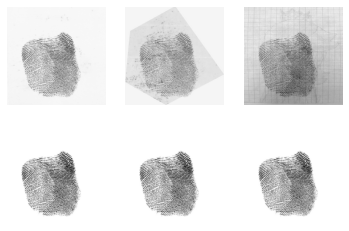

In [2]:
# load the prepared dataset
from numpy import load
from matplotlib import pyplot
# load the dataset
data = load('fp_256.npz')
src_images, tar_images = data['arr_0'], data['arr_1']
print('Loaded: ', src_images.shape, tar_images.shape)
# plot source images
n_samples = 3
for i in range(n_samples):
	pyplot.subplot(2, n_samples, 1 + i)
	pyplot.axis('off')
	pyplot.imshow(src_images[i].astype('uint8'))
# plot target image
for i in range(n_samples):
	pyplot.subplot(2, n_samples, 1 + n_samples + i)
	pyplot.axis('off')
	pyplot.imshow(tar_images[i].astype('uint8'))
pyplot.show()

In [ ]:
from numpy import load
from numpy import zeros
from numpy import ones
from numpy.random import randint
from keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.models import Model
from keras.models import Input
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import Dropout
from keras.layers import BatchNormalization
from keras.layers import LeakyReLU
from matplotlib import pyplot

# define the discriminator model
def define_discriminator(image_shape):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# source image input
	in_src_image = Input(shape=image_shape)
	# target image input
	in_target_image = Input(shape=image_shape)
	# concatenate images channel-wise
	merged = Concatenate()([in_src_image, in_target_image])
	# C64
	d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
	d = LeakyReLU(alpha=0.2)(d)
	# C128
	d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C256
	d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C512
	d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# second last output layer
	d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# patch output
	d = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
	patch_out = Activation('sigmoid')(d)
	# define model
	model = Model([in_src_image, in_target_image], patch_out)
	# compile model
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
	return model

# define an encoder block
def define_encoder_block(layer_in, n_filters, batchnorm=True):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# add downsampling layer
	g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
	# conditionally add batch normalization
	if batchnorm:
		g = BatchNormalization()(g, training=True)
	# leaky relu activation
	g = LeakyReLU(alpha=0.2)(g)
	return g

# define a decoder block
def decoder_block(layer_in, skip_in, n_filters, dropout=True):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# add upsampling layer
	g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
	# add batch normalization
	g = BatchNormalization()(g, training=True)
	# conditionally add dropout
	if dropout:
		g = Dropout(0.5)(g, training=True)
	# merge with skip connection
	g = Concatenate()([g, skip_in])
	# relu activation
	g = Activation('relu')(g)
	return g

# define the standalone generator model
def define_generator(image_shape=(256,256,3)):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# image input
	in_image = Input(shape=image_shape)
	# encoder model
	e1 = define_encoder_block(in_image, 64, batchnorm=False)
	e2 = define_encoder_block(e1, 128)
	e3 = define_encoder_block(e2, 256)
	e4 = define_encoder_block(e3, 512)
	e5 = define_encoder_block(e4, 512)
	e6 = define_encoder_block(e5, 512)
	e7 = define_encoder_block(e6, 512)
	# bottleneck, no batch norm and relu
	b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
	b = Activation('relu')(b)
	# decoder model
	d1 = decoder_block(b, e7, 512)
	d2 = decoder_block(d1, e6, 512)
	d3 = decoder_block(d2, e5, 512)
	d4 = decoder_block(d3, e4, 512, dropout=False)
	d5 = decoder_block(d4, e3, 256, dropout=False)
	d6 = decoder_block(d5, e2, 128, dropout=False)
	d7 = decoder_block(d6, e1, 64, dropout=False)
	# output
	g = Conv2DTranspose(3, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7)
	out_image = Activation('tanh')(g)
	# define model
	model = Model(in_image, out_image)
	return model

# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model, image_shape):
	# make weights in the discriminator not trainable
	d_model.trainable = False
	# define the source image
	in_src = Input(shape=image_shape)
	# connect the source image to the generator input
	gen_out = g_model(in_src)
	# connect the source input and generator output to the discriminator input
	dis_out = d_model([in_src, gen_out])
	# src image as input, generated image and classification output
	model = Model(in_src, [dis_out, gen_out])
	# compile model
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss=['binary_crossentropy', 'mae'], optimizer=opt, loss_weights=[1,100])
	return model

# load and prepare training images
def load_real_samples(filename):
	# load compressed arrays
	data = load(filename)
	# unpack arrays
	X1, X2 = data['arr_0'], data['arr_1']
	# scale from [0,255] to [-1,1]
	X1 = (X1 - 127.5) / 127.5
	X2 = (X2 - 127.5) / 127.5
	return [X1, X2]

# select a batch of random samples, returns images and target
def generate_real_samples(dataset, n_samples, patch_shape):
	# unpack dataset
	trainA, trainB = dataset
	# choose random instances
	ix = randint(0, trainA.shape[0], n_samples)
	# retrieve selected images
	X1, X2 = trainA[ix], trainB[ix]
	# generate 'real' class labels (1)
	y = ones((n_samples, patch_shape, patch_shape, 1))
	return [X1, X2], y

# generate a batch of images, returns images and targets
def generate_fake_samples(g_model, samples, patch_shape):
	# generate fake instance
	X = g_model.predict(samples)
	# create 'fake' class labels (0)
	y = zeros((len(X), patch_shape, patch_shape, 1))
	return X, y

# generate samples and save as a plot and save the model
def summarize_performance(step, g_model, dataset, n_samples=3):
	# select a sample of input images
	[X_realA, X_realB], _ = generate_real_samples(dataset, n_samples, 1)
	# generate a batch of fake samples
	X_fakeB, _ = generate_fake_samples(g_model, X_realA, 1)
	# scale all pixels from [-1,1] to [0,1]
	X_realA = (X_realA + 1) / 2.0
	X_realB = (X_realB + 1) / 2.0
	X_fakeB = (X_fakeB + 1) / 2.0
	# plot real source images
	for i in range(n_samples):
		pyplot.subplot(3, n_samples, 1 + i)
		pyplot.axis('off')
		pyplot.imshow(X_realA[i])
	# plot generated target image
	for i in range(n_samples):
		pyplot.subplot(3, n_samples, 1 + n_samples + i)
		pyplot.axis('off')
		pyplot.imshow(X_fakeB[i])
	# plot real target image
	for i in range(n_samples):
		pyplot.subplot(3, n_samples, 1 + n_samples*2 + i)
		pyplot.axis('off')
		pyplot.imshow(X_realB[i])
	# save plot to file
	filename1 = 'plot_%06d.png' % (step+1)
	pyplot.savefig(filename1)
	pyplot.close()
	# save the generator model
	filename2 = 'model_%06d.h5' % (step+1)
	g_model.save(filename2)
	print('>Saved: %s and %s' % (filename1, filename2))

def train(d_model, g_model, gan_model, dataset, n_epochs=100, n_batch=1):
	# determine the output square shape of the discriminator
	n_patch = d_model.output_shape[1]
	# unpack dataset
	trainA, trainB = dataset
	# calculate the number of batches per training epoch
	bat_per_epo = int(len(trainA) / n_batch)
	# calculate the number of training iterations
	n_steps = bat_per_epo * n_epochs
	# manually enumerate epochs
	for i in range(n_steps):
		# select a batch of real samples
		[X_realA, X_realB], y_real = generate_real_samples(dataset, n_batch, n_patch)
		# generate a batch of fake samples
		X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, n_patch)
		# update discriminator for real samples
		d_loss1 = d_model.train_on_batch([X_realA, X_realB], y_real)
		# update discriminator for generated samples
		d_loss2 = d_model.train_on_batch([X_realA, X_fakeB], y_fake)
		# update the generator
		g_loss, _, _ = gan_model.train_on_batch(X_realA, [y_real, X_realB])
		# summarize performance
		print('>%d, d1[%.3f] d2[%.3f] g[%.3f]' % (i+1, d_loss1, d_loss2, g_loss))
		# summarize model performance
		if (i+1) % (bat_per_epo * 10) == 0:
			summarize_performance(i, g_model, dataset)

# load image data
dataset = load_real_samples('fp_256.npz')
print('Loaded', dataset[0].shape, dataset[1].shape)
# define input shape based on the loaded dataset
image_shape = dataset[0].shape[1:]
# define the models
d_model = define_discriminator(image_shape)
g_model = define_generator(image_shape)
# define the composite model
gan_model = define_gan(g_model, d_model, image_shape)
# train model
train(d_model, g_model, gan_model, dataset)

Loaded (5000, 256, 256, 3) (5000, 256, 256, 3)
>1, d1[0.174] d2[1.230] g[92.325]
>2, d1[0.240] d2[1.655] g[82.567]
>3, d1[0.401] d2[1.049] g[84.276]
>4, d1[0.224] d2[0.868] g[82.721]
>5, d1[0.228] d2[0.606] g[73.517]
>6, d1[0.252] d2[0.455] g[76.172]
>7, d1[0.336] d2[0.447] g[76.949]
>8, d1[0.408] d2[0.320] g[72.881]
>9, d1[0.386] d2[0.343] g[69.859]
>10, d1[0.263] d2[0.353] g[62.133]
>11, d1[0.276] d2[0.276] g[65.843]
>12, d1[0.421] d2[0.217] g[62.295]
>13, d1[0.289] d2[0.279] g[59.169]
>14, d1[0.207] d2[0.225] g[60.405]
>15, d1[0.309] d2[0.422] g[64.240]
>16, d1[0.464] d2[0.207] g[56.017]
>17, d1[0.268] d2[0.272] g[51.734]
>18, d1[0.139] d2[0.231] g[52.402]
>19, d1[0.332] d2[0.128] g[49.839]
>20, d1[0.122] d2[0.253] g[48.557]
>21, d1[0.086] d2[0.268] g[51.620]
>22, d1[0.443] d2[0.199] g[52.683]
>23, d1[0.172] d2[0.160] g[44.991]
>24, d1[0.096] d2[0.090] g[38.095]
>25, d1[0.189] d2[0.483] g[37.273]
>26, d1[0.459] d2[0.180] g[43.908]
>27, d1[0.134] d2[0.257] g[38.121]
>28, d1[0.737] d2

>231, d1[0.025] d2[0.014] g[18.243]
>232, d1[0.209] d2[0.157] g[10.161]
>233, d1[0.025] d2[0.270] g[11.771]
>234, d1[0.051] d2[0.068] g[14.224]
>235, d1[0.728] d2[0.064] g[11.291]
>236, d1[0.048] d2[0.089] g[12.191]
>237, d1[0.152] d2[0.049] g[26.688]
>238, d1[0.011] d2[0.467] g[36.702]
>239, d1[0.088] d2[0.020] g[16.331]
>240, d1[0.536] d2[0.381] g[13.370]
>241, d1[0.062] d2[0.420] g[10.070]
>242, d1[0.532] d2[0.413] g[6.462]
>243, d1[0.228] d2[0.122] g[8.885]
>244, d1[0.084] d2[0.029] g[13.340]
>245, d1[0.026] d2[0.163] g[14.726]
>246, d1[0.153] d2[0.024] g[12.658]
>247, d1[0.405] d2[0.341] g[14.010]
>248, d1[0.025] d2[0.024] g[16.439]
>249, d1[0.434] d2[0.068] g[10.909]
>250, d1[0.032] d2[0.470] g[17.269]
>251, d1[0.077] d2[0.010] g[14.543]
>252, d1[0.372] d2[0.082] g[12.877]
>253, d1[0.290] d2[0.458] g[7.813]
>254, d1[0.022] d2[0.131] g[14.779]
>255, d1[0.105] d2[0.074] g[10.255]
>256, d1[0.030] d2[0.018] g[15.299]
>257, d1[0.026] d2[0.117] g[16.758]
>258, d1[0.264] d2[0.059] g[10.

>461, d1[0.303] d2[0.621] g[10.005]
>462, d1[0.091] d2[0.014] g[26.102]
>463, d1[0.690] d2[0.369] g[12.039]
>464, d1[0.113] d2[0.275] g[9.003]
>465, d1[1.215] d2[0.225] g[8.378]
>466, d1[0.264] d2[0.885] g[4.647]
>467, d1[0.047] d2[0.167] g[12.683]
>468, d1[0.621] d2[0.437] g[5.448]
>469, d1[0.712] d2[0.215] g[10.174]
>470, d1[0.174] d2[0.571] g[11.812]
>471, d1[0.046] d2[0.146] g[10.578]
>472, d1[0.533] d2[0.246] g[9.520]
>473, d1[0.144] d2[0.400] g[9.701]
>474, d1[0.595] d2[0.214] g[6.034]
>475, d1[0.326] d2[0.335] g[7.358]
>476, d1[0.193] d2[0.113] g[7.826]
>477, d1[0.178] d2[0.170] g[9.699]
>478, d1[0.065] d2[0.095] g[11.249]
>479, d1[0.738] d2[0.492] g[6.429]
>480, d1[0.129] d2[0.126] g[16.771]
>481, d1[0.255] d2[0.309] g[6.899]
>482, d1[0.735] d2[0.446] g[7.066]
>483, d1[0.141] d2[0.115] g[11.826]
>484, d1[0.149] d2[0.144] g[9.717]
>485, d1[0.060] d2[0.222] g[10.359]
>486, d1[0.163] d2[0.057] g[11.132]
>487, d1[0.910] d2[0.850] g[5.090]
>488, d1[0.123] d2[0.364] g[7.553]
>489, d1

>695, d1[0.337] d2[0.170] g[8.909]
>696, d1[0.449] d2[0.083] g[6.165]
>697, d1[0.037] d2[0.214] g[18.419]
>698, d1[0.113] d2[0.097] g[10.284]
>699, d1[0.074] d2[0.428] g[9.183]
>700, d1[1.074] d2[0.704] g[6.365]
>701, d1[0.195] d2[0.099] g[8.279]
>702, d1[0.418] d2[0.103] g[7.257]
>703, d1[0.087] d2[0.479] g[8.913]
>704, d1[0.541] d2[0.043] g[8.350]
>705, d1[0.101] d2[0.775] g[6.276]
>706, d1[0.338] d2[0.360] g[11.684]
>707, d1[0.251] d2[0.329] g[11.046]
>708, d1[0.579] d2[0.402] g[7.762]
>709, d1[0.132] d2[0.468] g[7.995]
>710, d1[0.747] d2[0.287] g[6.708]
>711, d1[0.240] d2[0.234] g[10.235]
>712, d1[0.380] d2[0.402] g[5.356]
>713, d1[0.641] d2[0.375] g[5.338]
>714, d1[0.531] d2[0.307] g[9.170]
>715, d1[0.173] d2[0.256] g[10.998]
>716, d1[0.213] d2[0.356] g[9.537]
>717, d1[0.300] d2[0.079] g[12.332]
>718, d1[0.213] d2[0.047] g[13.358]
>719, d1[0.092] d2[0.235] g[9.671]
>720, d1[0.389] d2[0.522] g[7.833]
>721, d1[0.103] d2[0.046] g[8.868]
>722, d1[0.282] d2[0.077] g[9.933]
>723, d1[0.0

>929, d1[0.277] d2[0.439] g[5.215]
>930, d1[0.282] d2[0.382] g[5.430]
>931, d1[0.320] d2[0.425] g[5.018]
>932, d1[0.440] d2[0.317] g[6.845]
>933, d1[0.418] d2[0.356] g[4.008]
>934, d1[0.441] d2[0.340] g[6.293]
>935, d1[0.393] d2[0.433] g[5.375]
>936, d1[0.346] d2[0.368] g[10.469]
>937, d1[0.266] d2[0.418] g[5.217]
>938, d1[0.406] d2[0.348] g[7.204]
>939, d1[0.465] d2[0.315] g[6.883]
>940, d1[0.490] d2[0.350] g[7.951]
>941, d1[0.328] d2[0.399] g[4.642]
>942, d1[0.371] d2[0.424] g[5.018]
>943, d1[0.349] d2[0.381] g[5.261]
>944, d1[0.360] d2[0.357] g[4.809]
>945, d1[0.466] d2[0.350] g[5.527]
>946, d1[0.375] d2[0.388] g[11.492]
>947, d1[0.304] d2[0.394] g[4.951]
>948, d1[0.252] d2[0.449] g[5.930]
>949, d1[0.555] d2[0.278] g[6.327]
>950, d1[0.441] d2[0.384] g[4.375]
>951, d1[0.426] d2[0.338] g[5.390]
>952, d1[0.351] d2[0.413] g[4.021]
>953, d1[0.349] d2[0.421] g[6.280]
>954, d1[0.343] d2[0.376] g[4.910]
>955, d1[0.377] d2[0.351] g[5.395]
>956, d1[0.524] d2[0.322] g[9.779]
>957, d1[0.277] d2

>1159, d1[0.389] d2[0.380] g[4.463]
>1160, d1[0.274] d2[0.372] g[5.997]
>1161, d1[0.351] d2[0.373] g[3.754]
>1162, d1[0.244] d2[0.388] g[5.218]
>1163, d1[0.433] d2[0.331] g[3.018]
>1164, d1[0.435] d2[0.320] g[6.732]
>1165, d1[0.362] d2[0.364] g[4.603]
>1166, d1[0.325] d2[0.447] g[4.995]
>1167, d1[0.367] d2[0.360] g[4.292]
>1168, d1[0.411] d2[0.343] g[6.631]
>1169, d1[0.357] d2[0.366] g[4.131]
>1170, d1[0.374] d2[0.369] g[6.760]
>1171, d1[0.430] d2[0.339] g[9.742]
>1172, d1[0.369] d2[0.381] g[4.923]
>1173, d1[0.256] d2[0.397] g[6.116]
>1174, d1[0.402] d2[0.323] g[6.122]
>1175, d1[0.283] d2[0.346] g[8.470]
>1176, d1[0.292] d2[0.386] g[4.652]
>1177, d1[0.440] d2[0.325] g[5.352]
>1178, d1[0.408] d2[0.361] g[4.030]
>1179, d1[0.328] d2[0.373] g[6.914]
>1180, d1[0.365] d2[0.331] g[7.002]
>1181, d1[0.356] d2[0.384] g[6.102]
>1182, d1[0.297] d2[0.445] g[4.031]
>1183, d1[0.390] d2[0.321] g[6.833]
>1184, d1[0.455] d2[0.318] g[6.380]
>1185, d1[0.273] d2[0.390] g[4.977]
>1186, d1[0.177] d2[0.241] g

>1387, d1[0.366] d2[0.373] g[4.975]
>1388, d1[0.357] d2[0.370] g[4.878]
>1389, d1[0.410] d2[0.349] g[6.214]
>1390, d1[0.375] d2[0.377] g[5.247]
>1391, d1[0.297] d2[0.450] g[5.411]
>1392, d1[0.236] d2[0.523] g[10.478]
>1393, d1[0.468] d2[0.318] g[6.696]
>1394, d1[0.440] d2[0.338] g[4.363]
>1395, d1[0.443] d2[0.317] g[7.274]
>1396, d1[0.403] d2[0.367] g[5.437]
>1397, d1[0.387] d2[0.392] g[3.418]
>1398, d1[0.381] d2[0.356] g[6.895]
>1399, d1[0.380] d2[0.374] g[4.945]
>1400, d1[0.401] d2[0.356] g[5.121]
>1401, d1[0.366] d2[0.374] g[3.510]
>1402, d1[0.373] d2[0.342] g[5.833]
>1403, d1[0.403] d2[0.347] g[6.859]
>1404, d1[0.344] d2[0.382] g[5.551]
>1405, d1[0.341] d2[0.397] g[2.285]
>1406, d1[0.366] d2[0.359] g[2.969]
>1407, d1[0.393] d2[0.338] g[4.381]
>1408, d1[0.395] d2[0.346] g[4.623]
>1409, d1[0.374] d2[0.344] g[4.213]
>1410, d1[0.370] d2[0.375] g[6.387]
>1411, d1[0.353] d2[0.360] g[10.319]
>1412, d1[0.333] d2[0.384] g[6.516]
>1413, d1[0.350] d2[0.380] g[4.014]
>1414, d1[0.335] d2[0.397]

>1615, d1[0.391] d2[0.359] g[3.941]
>1616, d1[0.364] d2[0.366] g[5.530]
>1617, d1[0.323] d2[0.381] g[5.872]
>1618, d1[0.348] d2[0.338] g[8.134]
>1619, d1[0.292] d2[0.372] g[8.091]
>1620, d1[0.294] d2[0.412] g[6.340]
>1621, d1[0.248] d2[0.277] g[8.035]
>1622, d1[0.384] d2[0.390] g[4.676]
>1623, d1[0.441] d2[0.323] g[4.469]
>1624, d1[0.419] d2[0.378] g[5.823]
>1625, d1[0.273] d2[0.302] g[6.831]
>1626, d1[0.410] d2[0.363] g[7.692]
>1627, d1[0.437] d2[0.324] g[4.187]
>1628, d1[0.385] d2[0.367] g[5.793]
>1629, d1[0.327] d2[0.409] g[4.452]
>1630, d1[0.370] d2[0.374] g[4.368]
>1631, d1[0.322] d2[0.392] g[4.577]
>1632, d1[0.365] d2[0.330] g[7.815]
>1633, d1[0.376] d2[0.479] g[3.184]
>1634, d1[0.345] d2[0.312] g[7.087]
>1635, d1[0.117] d2[0.285] g[12.898]
>1636, d1[0.542] d2[0.262] g[5.589]
>1637, d1[0.389] d2[0.355] g[9.679]
>1638, d1[0.387] d2[0.342] g[3.639]
>1639, d1[0.353] d2[0.397] g[4.736]
>1640, d1[0.413] d2[0.326] g[3.892]
>1641, d1[0.365] d2[0.340] g[5.455]
>1642, d1[0.349] d2[0.374] 

>1843, d1[0.287] d2[0.372] g[7.116]
>1844, d1[0.258] d2[0.344] g[8.217]
>1845, d1[0.357] d2[0.359] g[6.715]
>1846, d1[0.303] d2[0.445] g[4.275]
>1847, d1[0.414] d2[0.324] g[5.191]
>1848, d1[0.352] d2[0.304] g[9.362]
>1849, d1[0.431] d2[0.351] g[4.632]
>1850, d1[0.283] d2[0.399] g[8.126]
>1851, d1[0.411] d2[0.440] g[4.470]
>1852, d1[0.526] d2[0.276] g[4.320]
>1853, d1[0.403] d2[0.319] g[5.505]
>1854, d1[0.334] d2[0.284] g[6.864]
>1855, d1[0.336] d2[0.372] g[5.642]
>1856, d1[0.194] d2[0.509] g[4.410]
>1857, d1[0.358] d2[0.438] g[4.431]
>1858, d1[0.348] d2[0.249] g[14.072]
>1859, d1[0.497] d2[0.267] g[5.098]
>1860, d1[0.343] d2[0.415] g[4.508]
>1861, d1[0.343] d2[0.403] g[5.694]
>1862, d1[0.471] d2[0.316] g[4.440]
>1863, d1[0.327] d2[0.379] g[4.096]
>1864, d1[0.409] d2[0.336] g[3.854]
>1865, d1[0.360] d2[0.445] g[4.710]
>1866, d1[0.373] d2[0.261] g[7.151]
>1867, d1[0.350] d2[0.397] g[4.296]
>1868, d1[0.357] d2[0.324] g[5.309]
>1869, d1[0.319] d2[0.388] g[5.057]
>1870, d1[0.314] d2[0.404] 

>2071, d1[0.372] d2[0.410] g[8.426]
>2072, d1[0.310] d2[0.384] g[5.241]
>2073, d1[0.397] d2[0.401] g[5.528]
>2074, d1[0.104] d2[0.314] g[9.123]
>2075, d1[0.209] d2[0.277] g[11.297]
>2076, d1[0.552] d2[0.268] g[10.164]
>2077, d1[0.428] d2[0.255] g[7.815]
>2078, d1[0.325] d2[0.488] g[4.857]
>2079, d1[0.351] d2[0.308] g[5.127]
>2080, d1[0.475] d2[0.323] g[5.594]
>2081, d1[0.434] d2[0.342] g[4.353]
>2082, d1[0.339] d2[0.365] g[3.527]
>2083, d1[0.339] d2[0.382] g[3.905]
>2084, d1[0.321] d2[0.278] g[6.402]
>2085, d1[0.336] d2[0.396] g[4.560]
>2086, d1[0.057] d2[0.262] g[10.189]
>2087, d1[0.372] d2[0.363] g[4.352]
>2088, d1[0.333] d2[0.386] g[8.763]
>2089, d1[0.402] d2[0.262] g[4.805]
>2090, d1[0.244] d2[0.258] g[9.298]
>2091, d1[0.323] d2[0.492] g[5.462]
>2092, d1[0.254] d2[0.402] g[4.812]
>2093, d1[0.407] d2[0.245] g[4.602]
>2094, d1[0.441] d2[0.320] g[4.409]
>2095, d1[0.427] d2[0.311] g[6.069]
>2096, d1[0.414] d2[0.377] g[3.594]
>2097, d1[0.372] d2[0.380] g[3.800]
>2098, d1[0.092] d2[0.175

>2299, d1[0.481] d2[0.319] g[3.652]
>2300, d1[0.326] d2[0.313] g[10.100]
>2301, d1[0.237] d2[0.351] g[5.037]
>2302, d1[0.217] d2[0.279] g[6.564]
>2303, d1[0.465] d2[0.381] g[4.402]
>2304, d1[0.424] d2[0.254] g[6.861]
>2305, d1[0.272] d2[0.422] g[4.897]
>2306, d1[0.514] d2[0.277] g[5.557]
>2307, d1[0.381] d2[0.362] g[4.169]
>2308, d1[0.079] d2[0.368] g[6.850]
>2309, d1[0.455] d2[0.291] g[4.436]
>2310, d1[0.224] d2[0.356] g[6.241]
>2311, d1[0.341] d2[0.343] g[6.092]
>2312, d1[0.369] d2[0.291] g[4.940]
>2313, d1[0.449] d2[0.324] g[4.630]
>2314, d1[0.266] d2[0.488] g[3.220]
>2315, d1[0.411] d2[0.385] g[7.057]
>2316, d1[0.468] d2[0.306] g[5.682]
>2317, d1[0.409] d2[0.388] g[5.679]
>2318, d1[0.391] d2[0.452] g[6.205]
>2319, d1[0.249] d2[0.464] g[4.608]
>2320, d1[0.522] d2[0.235] g[4.184]
>2321, d1[0.339] d2[0.275] g[6.079]
>2322, d1[0.295] d2[0.344] g[5.697]
>2323, d1[0.186] d2[0.320] g[6.878]
>2324, d1[0.375] d2[0.361] g[3.824]
>2325, d1[0.413] d2[0.432] g[3.293]
>2326, d1[0.378] d2[0.294] 

>2527, d1[0.540] d2[0.230] g[5.396]
>2528, d1[0.331] d2[0.417] g[9.271]
>2529, d1[0.344] d2[0.387] g[4.350]
>2530, d1[0.485] d2[0.269] g[7.803]
>2531, d1[0.317] d2[0.302] g[9.751]
>2532, d1[0.237] d2[0.352] g[5.624]
>2533, d1[0.102] d2[0.129] g[14.784]
>2534, d1[0.309] d2[0.445] g[5.950]
>2535, d1[0.241] d2[0.256] g[8.190]
>2536, d1[0.447] d2[0.335] g[5.667]
>2537, d1[0.508] d2[0.297] g[4.519]
>2538, d1[0.396] d2[0.342] g[3.804]
>2539, d1[0.473] d2[0.318] g[3.640]
>2540, d1[0.388] d2[0.338] g[4.313]
>2541, d1[0.149] d2[0.516] g[5.470]
>2542, d1[0.332] d2[0.431] g[4.934]
>2543, d1[0.299] d2[0.258] g[5.159]
>2544, d1[0.463] d2[0.295] g[9.832]
>2545, d1[0.420] d2[0.327] g[3.120]
>2546, d1[0.443] d2[0.300] g[3.886]
>2547, d1[0.462] d2[0.298] g[3.864]
>2548, d1[0.116] d2[0.361] g[6.177]
>2549, d1[0.264] d2[0.348] g[3.199]
>2550, d1[0.238] d2[0.424] g[4.183]
>2551, d1[0.450] d2[0.277] g[5.480]
>2552, d1[0.273] d2[0.324] g[6.445]
>2553, d1[0.516] d2[0.305] g[3.178]
>2554, d1[0.315] d2[0.369] 

>2755, d1[0.478] d2[0.278] g[7.648]
>2756, d1[0.510] d2[0.298] g[3.103]
>2757, d1[0.211] d2[0.588] g[4.446]
>2758, d1[0.489] d2[0.278] g[6.482]
>2759, d1[0.436] d2[0.302] g[5.563]
>2760, d1[0.317] d2[0.363] g[5.524]
>2761, d1[0.503] d2[0.311] g[10.699]
>2762, d1[0.260] d2[0.321] g[6.591]
>2763, d1[0.416] d2[0.334] g[3.750]
>2764, d1[0.402] d2[0.274] g[6.055]
>2765, d1[0.374] d2[0.340] g[5.210]
>2766, d1[0.299] d2[0.337] g[10.173]
>2767, d1[0.384] d2[0.401] g[4.644]
>2768, d1[0.314] d2[0.373] g[3.332]
>2769, d1[0.365] d2[0.376] g[3.228]
>2770, d1[0.291] d2[0.303] g[3.556]
>2771, d1[0.274] d2[0.395] g[4.771]
>2772, d1[0.341] d2[0.309] g[3.337]
>2773, d1[0.324] d2[0.340] g[5.136]
>2774, d1[0.290] d2[0.345] g[5.571]
>2775, d1[0.417] d2[0.349] g[3.816]
>2776, d1[0.262] d2[0.445] g[4.024]
>2777, d1[0.426] d2[0.339] g[4.565]
>2778, d1[0.419] d2[0.229] g[8.410]
>2779, d1[0.256] d2[0.425] g[6.682]
>2780, d1[0.373] d2[0.342] g[4.519]
>2781, d1[0.341] d2[0.388] g[3.883]
>2782, d1[0.221] d2[0.262]

>2983, d1[0.517] d2[0.291] g[2.997]
>2984, d1[0.343] d2[0.241] g[10.232]
>2985, d1[0.365] d2[0.416] g[3.724]
>2986, d1[0.159] d2[0.482] g[4.562]
>2987, d1[0.412] d2[0.299] g[3.194]
>2988, d1[0.493] d2[0.302] g[4.271]
>2989, d1[0.221] d2[0.457] g[4.758]
>2990, d1[0.462] d2[0.273] g[3.811]
>2991, d1[0.361] d2[0.204] g[6.811]
>2992, d1[0.349] d2[0.401] g[3.196]
>2993, d1[0.387] d2[0.316] g[5.773]
>2994, d1[0.338] d2[0.385] g[4.403]
>2995, d1[0.375] d2[0.348] g[4.025]
>2996, d1[0.414] d2[0.325] g[2.683]
>2997, d1[0.368] d2[0.372] g[3.497]
>2998, d1[0.321] d2[0.408] g[4.922]
>2999, d1[0.356] d2[0.416] g[4.243]
>3000, d1[0.470] d2[0.272] g[4.329]
>3001, d1[0.299] d2[0.364] g[4.276]
>3002, d1[0.283] d2[0.392] g[4.313]
>3003, d1[0.395] d2[0.345] g[3.812]
>3004, d1[0.238] d2[0.327] g[4.435]
>3005, d1[0.312] d2[0.285] g[5.952]
>3006, d1[0.303] d2[0.350] g[3.143]
>3007, d1[0.449] d2[0.342] g[3.163]
>3008, d1[0.064] d2[0.205] g[13.472]
>3009, d1[0.421] d2[0.273] g[5.925]
>3010, d1[0.728] d2[0.470]

>3211, d1[0.375] d2[0.340] g[3.272]
>3212, d1[0.289] d2[0.305] g[5.895]
>3213, d1[0.387] d2[0.409] g[5.180]
>3214, d1[0.201] d2[0.537] g[4.323]
>3215, d1[0.322] d2[0.303] g[6.518]
>3216, d1[0.330] d2[0.345] g[5.431]
>3217, d1[0.437] d2[0.278] g[4.962]
>3218, d1[0.363] d2[0.380] g[3.267]
>3219, d1[0.353] d2[0.322] g[3.543]
>3220, d1[0.467] d2[0.280] g[4.445]
>3221, d1[0.198] d2[0.385] g[4.583]
>3222, d1[0.417] d2[0.296] g[3.595]
>3223, d1[0.304] d2[0.385] g[5.211]
>3224, d1[0.388] d2[0.294] g[6.953]
>3225, d1[0.417] d2[0.403] g[3.823]
>3226, d1[0.314] d2[0.336] g[4.443]
>3227, d1[0.304] d2[0.282] g[6.060]
>3228, d1[0.269] d2[0.374] g[3.692]
>3229, d1[0.356] d2[0.304] g[3.844]
>3230, d1[0.241] d2[0.405] g[3.898]
>3231, d1[0.418] d2[0.350] g[2.764]
>3232, d1[0.319] d2[0.368] g[3.300]
>3233, d1[0.337] d2[0.320] g[4.471]
>3234, d1[0.425] d2[0.348] g[3.915]
>3235, d1[0.435] d2[0.355] g[3.347]
>3236, d1[0.291] d2[0.301] g[3.596]
>3237, d1[0.425] d2[0.365] g[3.269]
>3238, d1[0.358] d2[0.277] g

>3439, d1[0.390] d2[0.364] g[4.661]
>3440, d1[0.086] d2[0.281] g[12.199]
>3441, d1[0.400] d2[0.305] g[5.412]
>3442, d1[0.276] d2[0.410] g[5.322]
>3443, d1[0.232] d2[0.296] g[4.688]
>3444, d1[0.219] d2[0.298] g[9.427]
>3445, d1[0.521] d2[0.262] g[4.744]
>3446, d1[0.463] d2[0.320] g[4.004]
>3447, d1[0.302] d2[0.380] g[6.983]
>3448, d1[0.353] d2[0.275] g[5.336]
>3449, d1[0.246] d2[0.324] g[3.494]
>3450, d1[0.301] d2[0.378] g[5.036]
>3451, d1[0.376] d2[0.397] g[3.581]
>3452, d1[0.348] d2[0.218] g[6.643]
>3453, d1[0.293] d2[0.231] g[4.694]
>3454, d1[0.294] d2[0.474] g[4.308]
>3455, d1[0.293] d2[0.337] g[4.588]
>3456, d1[0.170] d2[0.494] g[4.406]
>3457, d1[0.332] d2[0.261] g[4.160]
>3458, d1[0.550] d2[0.186] g[4.229]
>3459, d1[0.245] d2[0.416] g[4.235]
>3460, d1[0.361] d2[0.421] g[4.167]
>3461, d1[0.273] d2[0.198] g[3.610]
>3462, d1[0.274] d2[0.326] g[5.352]
>3463, d1[0.320] d2[0.285] g[9.426]
>3464, d1[0.488] d2[0.235] g[5.027]
>3465, d1[0.357] d2[0.526] g[4.373]
>3466, d1[0.287] d2[0.381] 

>3667, d1[0.091] d2[0.263] g[4.012]
>3668, d1[0.252] d2[0.303] g[3.880]
>3669, d1[0.419] d2[0.267] g[5.215]
>3670, d1[0.406] d2[0.231] g[3.103]
>3671, d1[0.286] d2[0.377] g[4.033]
>3672, d1[0.375] d2[0.424] g[2.347]
>3673, d1[0.250] d2[0.376] g[4.530]
>3674, d1[0.279] d2[0.232] g[4.422]
>3675, d1[0.301] d2[0.382] g[2.868]
>3676, d1[0.192] d2[0.148] g[3.499]
>3677, d1[0.481] d2[0.332] g[4.370]
>3678, d1[0.093] d2[0.146] g[4.886]
>3679, d1[0.282] d2[0.325] g[3.492]
>3680, d1[0.238] d2[0.156] g[6.102]
>3681, d1[0.100] d2[0.184] g[5.725]
>3682, d1[0.184] d2[0.353] g[5.065]
>3683, d1[0.764] d2[0.202] g[7.899]
>3684, d1[0.160] d2[0.178] g[3.888]
>3685, d1[0.458] d2[0.385] g[3.087]
>3686, d1[0.217] d2[0.229] g[3.990]
>3687, d1[0.130] d2[0.245] g[4.920]
>3688, d1[0.309] d2[0.526] g[3.953]
>3689, d1[0.262] d2[0.239] g[3.947]
>3690, d1[0.179] d2[0.216] g[4.859]
>3691, d1[0.269] d2[0.214] g[9.267]
>3692, d1[0.379] d2[0.353] g[3.943]
>3693, d1[0.058] d2[0.220] g[4.358]
>3694, d1[0.358] d2[0.326] g

>3895, d1[0.585] d2[0.249] g[2.843]
>3896, d1[0.052] d2[0.063] g[4.611]
>3897, d1[0.633] d2[0.320] g[4.796]
>3898, d1[0.367] d2[0.428] g[5.491]
>3899, d1[0.241] d2[0.158] g[4.605]
>3900, d1[0.234] d2[0.284] g[3.560]
>3901, d1[0.239] d2[0.416] g[4.875]
>3902, d1[0.347] d2[0.353] g[5.302]
>3903, d1[0.466] d2[0.435] g[5.483]
>3904, d1[0.348] d2[0.470] g[4.643]
>3905, d1[0.166] d2[0.213] g[4.018]
>3906, d1[0.346] d2[0.333] g[4.990]
>3907, d1[0.188] d2[0.301] g[9.779]
>3908, d1[0.110] d2[0.133] g[4.627]
>3909, d1[0.207] d2[0.415] g[5.918]
>3910, d1[0.630] d2[0.186] g[3.838]
>3911, d1[0.472] d2[0.303] g[4.499]
>3912, d1[0.180] d2[0.314] g[3.845]
>3913, d1[0.440] d2[0.293] g[4.089]
>3914, d1[0.431] d2[0.289] g[4.291]
>3915, d1[0.204] d2[0.289] g[5.556]
>3916, d1[0.371] d2[0.180] g[5.582]
>3917, d1[0.202] d2[0.462] g[4.072]
>3918, d1[0.750] d2[0.222] g[4.014]
>3919, d1[0.658] d2[0.271] g[4.953]
>3920, d1[0.048] d2[0.275] g[5.337]
>3921, d1[0.239] d2[0.430] g[4.083]
>3922, d1[0.018] d2[0.125] g

>4123, d1[0.242] d2[0.247] g[5.123]
>4124, d1[0.106] d2[0.153] g[3.468]
>4125, d1[0.185] d2[0.147] g[4.788]
>4126, d1[0.342] d2[0.288] g[5.288]
>4127, d1[0.413] d2[0.377] g[4.957]
>4128, d1[0.518] d2[0.307] g[5.013]
>4129, d1[0.352] d2[0.480] g[4.678]
>4130, d1[0.043] d2[0.157] g[4.781]
>4131, d1[0.012] d2[0.210] g[3.970]
>4132, d1[0.591] d2[0.255] g[3.213]
>4133, d1[0.403] d2[0.456] g[3.602]
>4134, d1[0.455] d2[0.169] g[3.359]
>4135, d1[0.356] d2[0.372] g[3.214]
>4136, d1[0.430] d2[0.286] g[4.089]
>4137, d1[0.111] d2[0.240] g[3.691]
>4138, d1[0.034] d2[0.102] g[5.190]
>4139, d1[0.498] d2[0.275] g[5.176]
>4140, d1[0.351] d2[0.418] g[4.113]
>4141, d1[0.037] d2[0.209] g[3.927]
>4142, d1[0.186] d2[0.128] g[7.227]
>4143, d1[0.130] d2[0.253] g[3.936]
>4144, d1[0.066] d2[0.151] g[5.094]
>4145, d1[0.599] d2[0.320] g[3.882]
>4146, d1[0.054] d2[0.072] g[4.920]
>4147, d1[0.018] d2[0.076] g[4.731]
>4148, d1[0.512] d2[0.380] g[3.534]
>4149, d1[0.353] d2[0.399] g[5.087]
>4150, d1[0.545] d2[0.335] g

>4351, d1[0.485] d2[0.417] g[3.668]
>4352, d1[0.016] d2[0.225] g[3.714]
>4353, d1[0.461] d2[0.288] g[4.266]
>4354, d1[0.361] d2[0.459] g[3.489]
>4355, d1[0.425] d2[0.258] g[3.528]
>4356, d1[0.651] d2[0.254] g[3.558]
>4357, d1[0.174] d2[0.292] g[7.566]
>4358, d1[0.250] d2[0.407] g[3.585]
>4359, d1[0.361] d2[0.358] g[3.145]
>4360, d1[0.087] d2[0.256] g[3.787]
>4361, d1[0.081] d2[0.089] g[4.645]
>4362, d1[0.314] d2[0.312] g[4.340]
>4363, d1[0.839] d2[0.187] g[3.703]
>4364, d1[0.401] d2[0.283] g[6.985]
>4365, d1[0.372] d2[0.328] g[3.800]
>4366, d1[0.053] d2[0.265] g[3.623]
>4367, d1[0.488] d2[0.324] g[2.969]
>4368, d1[0.391] d2[0.303] g[3.574]
>4369, d1[0.268] d2[0.423] g[4.484]
>4370, d1[0.150] d2[0.120] g[4.501]
>4371, d1[0.598] d2[0.352] g[3.181]
>4372, d1[0.370] d2[0.333] g[4.168]
>4373, d1[0.004] d2[0.416] g[4.249]
>4374, d1[0.384] d2[0.291] g[6.257]
>4375, d1[0.756] d2[0.253] g[3.111]
>4376, d1[0.331] d2[0.284] g[4.180]
>4377, d1[0.494] d2[0.257] g[5.382]
>4378, d1[0.133] d2[0.416] g

>4579, d1[0.504] d2[0.361] g[4.939]
>4580, d1[0.239] d2[0.429] g[5.009]
>4581, d1[0.543] d2[0.465] g[3.716]
>4582, d1[0.428] d2[0.241] g[5.631]
>4583, d1[0.011] d2[0.123] g[4.946]
>4584, d1[0.568] d2[0.332] g[3.147]
>4585, d1[0.367] d2[0.336] g[3.864]
>4586, d1[0.060] d2[0.198] g[4.131]
>4587, d1[0.211] d2[0.275] g[4.029]
>4588, d1[0.334] d2[0.255] g[3.700]
>4589, d1[0.441] d2[0.285] g[5.870]
>4590, d1[0.054] d2[0.178] g[4.402]
>4591, d1[0.288] d2[0.421] g[9.250]
>4592, d1[0.004] d2[0.071] g[4.887]
>4593, d1[0.006] d2[0.069] g[4.673]
>4594, d1[0.330] d2[0.412] g[4.417]
>4595, d1[0.009] d2[0.073] g[4.366]
>4596, d1[0.703] d2[0.212] g[3.856]
>4597, d1[0.489] d2[0.260] g[3.039]
>4598, d1[0.426] d2[0.236] g[3.908]
>4599, d1[0.158] d2[0.606] g[3.188]
>4600, d1[0.291] d2[0.226] g[6.202]
>4601, d1[0.022] d2[0.146] g[4.786]
>4602, d1[0.936] d2[0.139] g[4.747]
>4603, d1[0.349] d2[0.319] g[4.874]
>4604, d1[0.029] d2[0.162] g[4.248]
>4605, d1[0.228] d2[0.367] g[4.616]
>4606, d1[0.372] d2[0.273] g

>4807, d1[0.500] d2[0.257] g[5.276]
>4808, d1[0.005] d2[0.156] g[3.944]
>4809, d1[0.379] d2[0.345] g[4.457]
>4810, d1[0.253] d2[0.202] g[3.687]
>4811, d1[0.326] d2[0.247] g[3.527]
>4812, d1[0.169] d2[0.303] g[6.157]
>4813, d1[0.037] d2[0.292] g[4.946]
>4814, d1[0.335] d2[0.311] g[5.718]
>4815, d1[0.005] d2[0.090] g[5.006]
>4816, d1[0.302] d2[0.393] g[5.032]
>4817, d1[0.107] d2[0.092] g[4.388]
>4818, d1[0.326] d2[0.276] g[3.326]
>4819, d1[0.012] d2[0.218] g[5.851]
>4820, d1[0.005] d2[0.053] g[5.450]
>4821, d1[0.803] d2[0.219] g[3.983]
>4822, d1[0.447] d2[0.293] g[3.634]
>4823, d1[0.655] d2[0.227] g[3.277]
>4824, d1[0.021] d2[0.141] g[5.252]
>4825, d1[0.029] d2[0.280] g[4.528]
>4826, d1[0.429] d2[0.213] g[3.331]
>4827, d1[0.368] d2[0.383] g[5.024]
>4828, d1[0.300] d2[0.415] g[3.308]
>4829, d1[0.766] d2[0.215] g[4.054]
>4830, d1[0.301] d2[0.374] g[3.859]
>4831, d1[0.251] d2[0.218] g[2.956]
>4832, d1[0.440] d2[0.351] g[3.437]
>4833, d1[0.230] d2[0.312] g[3.767]
>4834, d1[0.575] d2[0.478] g

>5035, d1[0.316] d2[0.424] g[2.579]
>5036, d1[0.175] d2[0.182] g[4.199]
>5037, d1[0.358] d2[0.313] g[5.903]
>5038, d1[0.001] d2[0.122] g[4.586]
>5039, d1[0.001] d2[0.358] g[4.870]
>5040, d1[0.013] d2[0.093] g[4.836]
>5041, d1[0.898] d2[0.153] g[4.490]
>5042, d1[0.519] d2[0.174] g[4.531]
>5043, d1[0.547] d2[0.290] g[3.475]
>5044, d1[0.259] d2[0.462] g[5.157]
>5045, d1[0.252] d2[0.375] g[3.690]
>5046, d1[0.161] d2[0.292] g[7.058]
>5047, d1[0.320] d2[0.241] g[6.966]
>5048, d1[0.336] d2[0.387] g[3.590]
>5049, d1[0.660] d2[0.182] g[3.515]
>5050, d1[0.135] d2[0.146] g[4.216]
>5051, d1[0.005] d2[0.154] g[3.585]
>5052, d1[0.318] d2[0.353] g[2.769]
>5053, d1[0.530] d2[0.317] g[3.672]
>5054, d1[0.465] d2[0.360] g[3.985]
>5055, d1[0.239] d2[0.489] g[3.459]
>5056, d1[0.030] d2[0.206] g[4.273]
>5057, d1[0.565] d2[0.288] g[4.066]
>5058, d1[0.001] d2[0.101] g[4.990]
>5059, d1[0.459] d2[0.320] g[4.351]
>5060, d1[0.496] d2[0.364] g[2.859]
>5061, d1[0.281] d2[0.327] g[3.456]
>5062, d1[0.269] d2[0.415] g

>5263, d1[0.010] d2[0.210] g[3.696]
>5264, d1[0.450] d2[0.239] g[2.803]
>5265, d1[0.412] d2[0.318] g[3.667]
>5266, d1[0.221] d2[0.146] g[3.219]
>5267, d1[0.448] d2[0.322] g[3.479]
>5268, d1[0.310] d2[0.443] g[3.600]
>5269, d1[0.009] d2[0.175] g[3.281]
>5270, d1[0.020] d2[0.102] g[3.528]
>5271, d1[0.049] d2[0.120] g[4.579]
>5272, d1[0.311] d2[0.361] g[3.880]
>5273, d1[0.783] d2[0.157] g[3.696]
>5274, d1[0.290] d2[0.479] g[4.287]
>5275, d1[0.347] d2[0.650] g[5.296]
>5276, d1[0.135] d2[0.101] g[4.912]
>5277, d1[0.038] d2[0.075] g[7.633]
>5278, d1[0.011] d2[0.118] g[5.288]
>5279, d1[0.615] d2[0.161] g[5.160]
>5280, d1[0.459] d2[0.235] g[4.455]
>5281, d1[0.388] d2[0.270] g[3.976]
>5282, d1[0.232] d2[0.348] g[5.193]
>5283, d1[0.272] d2[0.358] g[4.290]
>5284, d1[0.124] d2[0.119] g[5.474]
>5285, d1[0.330] d2[0.426] g[3.295]
>5286, d1[0.152] d2[0.371] g[4.350]
>5287, d1[0.001] d2[0.152] g[5.280]
>5288, d1[0.642] d2[0.222] g[3.608]
>5289, d1[0.004] d2[0.252] g[4.324]
>5290, d1[0.699] d2[0.364] g

>5491, d1[0.461] d2[0.221] g[3.607]
>5492, d1[0.413] d2[0.324] g[2.730]
>5493, d1[0.171] d2[0.187] g[3.991]
>5494, d1[0.005] d2[0.263] g[3.661]
>5495, d1[0.330] d2[0.139] g[3.111]
>5496, d1[0.010] d2[0.058] g[4.485]
>5497, d1[0.006] d2[0.093] g[3.250]
>5498, d1[0.431] d2[0.291] g[4.546]
>5499, d1[0.322] d2[0.190] g[5.040]
>5500, d1[0.371] d2[0.390] g[3.791]
>5501, d1[0.222] d2[0.528] g[3.808]
>5502, d1[0.535] d2[0.203] g[3.346]
>5503, d1[0.461] d2[0.297] g[5.226]
>5504, d1[0.008] d2[0.147] g[4.321]
>5505, d1[0.007] d2[0.159] g[4.458]
>5506, d1[0.056] d2[0.045] g[4.853]
>5507, d1[0.064] d2[0.168] g[4.677]
>5508, d1[0.558] d2[0.259] g[3.281]
>5509, d1[0.584] d2[0.275] g[3.203]
>5510, d1[0.156] d2[0.546] g[3.566]
>5511, d1[0.408] d2[0.262] g[4.715]
>5512, d1[0.528] d2[0.225] g[2.766]
>5513, d1[0.003] d2[0.391] g[3.718]
>5514, d1[0.306] d2[0.325] g[4.088]
>5515, d1[0.101] d2[0.050] g[4.660]
>5516, d1[0.394] d2[0.359] g[5.931]
>5517, d1[0.583] d2[0.201] g[4.089]
>5518, d1[0.520] d2[0.351] g

>5719, d1[0.053] d2[0.715] g[4.675]
>5720, d1[0.623] d2[0.111] g[4.572]
>5721, d1[0.333] d2[0.373] g[3.904]
>5722, d1[0.283] d2[0.504] g[4.383]
>5723, d1[0.238] d2[0.274] g[6.910]
>5724, d1[0.642] d2[0.236] g[3.849]
>5725, d1[0.230] d2[0.582] g[4.112]
>5726, d1[0.551] d2[0.268] g[2.579]
>5727, d1[0.067] d2[0.124] g[4.750]
>5728, d1[0.325] d2[0.380] g[3.416]
>5729, d1[0.378] d2[0.282] g[4.055]
>5730, d1[0.014] d2[0.073] g[3.895]
>5731, d1[0.009] d2[0.078] g[4.845]
>5732, d1[0.420] d2[0.167] g[3.243]
>5733, d1[0.154] d2[0.183] g[6.452]
>5734, d1[0.046] d2[0.170] g[3.875]
>5735, d1[0.500] d2[0.322] g[4.138]
>5736, d1[0.479] d2[0.315] g[3.196]
>5737, d1[0.314] d2[0.558] g[4.484]
>5738, d1[0.488] d2[0.254] g[4.201]
>5739, d1[0.481] d2[0.320] g[3.494]
>5740, d1[0.076] d2[0.123] g[4.319]
>5741, d1[0.103] d2[0.237] g[6.061]
>5742, d1[0.507] d2[0.309] g[2.713]
>5743, d1[0.053] d2[0.129] g[6.434]
>5744, d1[0.052] d2[0.134] g[4.269]
>5745, d1[0.011] d2[0.073] g[5.458]
>5746, d1[0.809] d2[0.163] g

>5947, d1[0.024] d2[0.163] g[4.995]
>5948, d1[0.015] d2[0.231] g[3.693]
>5949, d1[0.643] d2[0.175] g[5.142]
>5950, d1[0.507] d2[0.329] g[2.929]
>5951, d1[0.296] d2[0.354] g[3.812]
>5952, d1[0.416] d2[0.312] g[3.217]
>5953, d1[0.285] d2[0.408] g[3.690]
>5954, d1[0.394] d2[0.420] g[3.895]
>5955, d1[0.363] d2[0.353] g[3.875]
>5956, d1[0.315] d2[0.188] g[4.802]
>5957, d1[0.054] d2[0.061] g[6.885]
>5958, d1[0.363] d2[0.297] g[3.535]
>5959, d1[0.015] d2[0.172] g[3.905]
>5960, d1[0.216] d2[0.322] g[4.173]
>5961, d1[0.009] d2[0.118] g[3.721]
>5962, d1[0.613] d2[0.297] g[3.380]
>5963, d1[0.033] d2[0.163] g[5.066]
>5964, d1[0.397] d2[0.247] g[3.618]
>5965, d1[0.421] d2[0.244] g[2.978]
>5966, d1[0.398] d2[0.181] g[6.106]
>5967, d1[0.345] d2[0.347] g[3.562]
>5968, d1[0.186] d2[0.313] g[9.791]
>5969, d1[0.452] d2[0.293] g[3.305]
>5970, d1[0.299] d2[0.229] g[5.348]
>5971, d1[0.303] d2[0.344] g[4.349]
>5972, d1[0.198] d2[0.471] g[3.278]
>5973, d1[0.002] d2[0.103] g[5.021]
>5974, d1[0.393] d2[0.317] g

>6175, d1[0.795] d2[0.304] g[4.172]
>6176, d1[0.557] d2[0.489] g[3.579]
>6177, d1[0.326] d2[0.414] g[3.276]
>6178, d1[0.766] d2[0.223] g[3.564]
>6179, d1[0.552] d2[0.300] g[3.305]
>6180, d1[0.322] d2[0.388] g[3.706]
>6181, d1[0.101] d2[0.743] g[4.514]
>6182, d1[0.302] d2[0.320] g[4.315]
>6183, d1[0.672] d2[0.244] g[3.824]
>6184, d1[0.359] d2[0.357] g[5.721]
>6185, d1[0.348] d2[0.437] g[3.541]
>6186, d1[0.448] d2[0.310] g[2.182]
>6187, d1[0.655] d2[0.237] g[4.133]
>6188, d1[0.420] d2[0.367] g[3.506]
>6189, d1[0.472] d2[0.306] g[3.235]
>6190, d1[0.278] d2[0.484] g[3.810]
>6191, d1[0.378] d2[0.329] g[2.586]
>6192, d1[0.292] d2[0.390] g[3.344]
>6193, d1[0.575] d2[0.277] g[2.753]
>6194, d1[0.216] d2[0.519] g[3.176]
>6195, d1[0.443] d2[0.296] g[2.206]
>6196, d1[0.465] d2[0.321] g[2.873]
>6197, d1[0.317] d2[0.351] g[3.427]
>6198, d1[0.404] d2[0.275] g[2.888]
>6199, d1[0.215] d2[0.372] g[3.288]
>6200, d1[0.287] d2[0.401] g[3.096]
>6201, d1[0.351] d2[0.369] g[3.360]
>6202, d1[0.295] d2[0.414] g

>6403, d1[0.385] d2[0.355] g[3.327]
>6404, d1[0.214] d2[0.407] g[2.174]
>6405, d1[0.533] d2[0.202] g[4.081]
>6406, d1[0.015] d2[0.279] g[3.959]
>6407, d1[0.160] d2[0.244] g[3.881]
>6408, d1[0.238] d2[0.249] g[3.345]
>6409, d1[0.383] d2[0.258] g[5.692]
>6410, d1[0.240] d2[0.278] g[3.647]
>6411, d1[0.303] d2[0.296] g[4.117]
>6412, d1[0.001] d2[0.180] g[4.710]
>6413, d1[0.007] d2[0.073] g[4.190]
>6414, d1[0.099] d2[0.090] g[4.458]
>6415, d1[0.457] d2[0.223] g[6.740]
>6416, d1[0.399] d2[0.358] g[3.376]
>6417, d1[0.002] d2[0.118] g[3.452]
>6418, d1[0.426] d2[0.388] g[4.249]
>6419, d1[0.307] d2[0.423] g[4.244]
>6420, d1[0.071] d2[0.114] g[5.413]
>6421, d1[0.004] d2[0.059] g[5.109]
>6422, d1[0.139] d2[0.114] g[4.451]
>6423, d1[0.325] d2[0.391] g[4.699]
>6424, d1[0.661] d2[0.114] g[8.548]
>6425, d1[0.402] d2[0.456] g[4.248]
>6426, d1[0.090] d2[0.149] g[4.833]
>6427, d1[0.632] d2[0.245] g[3.143]
>6428, d1[0.232] d2[0.535] g[4.080]
>6429, d1[0.024] d2[0.069] g[4.732]
>6430, d1[0.622] d2[0.169] g

>6631, d1[0.497] d2[0.282] g[3.711]
>6632, d1[0.033] d2[0.086] g[5.108]
>6633, d1[0.100] d2[0.060] g[5.756]
>6634, d1[0.263] d2[0.395] g[3.474]
>6635, d1[0.001] d2[0.125] g[6.627]
>6636, d1[0.018] d2[0.124] g[3.518]
>6637, d1[0.469] d2[0.284] g[4.429]
>6638, d1[0.435] d2[0.237] g[3.782]
>6639, d1[0.051] d2[0.316] g[9.915]
>6640, d1[0.003] d2[0.053] g[4.824]
>6641, d1[0.517] d2[0.254] g[3.788]
>6642, d1[0.233] d2[0.297] g[4.006]
>6643, d1[0.467] d2[0.307] g[2.595]
>6644, d1[0.143] d2[0.221] g[3.801]
>6645, d1[0.098] d2[0.304] g[4.003]
>6646, d1[0.580] d2[0.326] g[3.834]
>6647, d1[0.005] d2[0.094] g[3.553]
>6648, d1[0.180] d2[0.190] g[3.384]
>6649, d1[0.352] d2[0.260] g[4.581]
>6650, d1[0.050] d2[0.662] g[5.516]
>6651, d1[0.067] d2[0.026] g[6.305]
>6652, d1[0.320] d2[0.068] g[3.866]
>6653, d1[0.744] d2[0.359] g[4.243]
>6654, d1[0.381] d2[0.334] g[4.912]
>6655, d1[0.242] d2[0.350] g[4.773]
>6656, d1[0.154] d2[0.219] g[3.811]
>6657, d1[0.321] d2[0.299] g[4.535]
>6658, d1[0.197] d2[0.122] g

>6859, d1[0.239] d2[0.164] g[4.887]
>6860, d1[0.464] d2[0.336] g[4.037]
>6861, d1[0.574] d2[0.275] g[4.530]
>6862, d1[0.062] d2[0.217] g[4.099]
>6863, d1[0.346] d2[0.459] g[3.637]
>6864, d1[0.054] d2[0.173] g[5.481]
>6865, d1[0.833] d2[0.234] g[3.626]
>6866, d1[0.278] d2[0.432] g[4.249]
>6867, d1[0.049] d2[0.131] g[5.608]
>6868, d1[0.171] d2[0.216] g[5.088]
>6869, d1[0.035] d2[0.153] g[5.148]
>6870, d1[0.385] d2[0.812] g[2.892]
>6871, d1[0.001] d2[0.195] g[5.780]
>6872, d1[0.002] d2[0.117] g[4.920]
>6873, d1[0.003] d2[0.020] g[5.643]
>6874, d1[0.927] d2[0.096] g[3.859]
>6875, d1[0.682] d2[0.179] g[3.737]
>6876, d1[0.429] d2[0.250] g[5.799]
>6877, d1[0.430] d2[0.285] g[3.947]
>6878, d1[0.242] d2[0.382] g[4.125]
>6879, d1[0.141] d2[0.273] g[4.654]
>6880, d1[0.269] d2[0.442] g[3.361]
>6881, d1[0.030] d2[0.175] g[3.893]
>6882, d1[0.470] d2[0.258] g[4.945]
>6883, d1[0.469] d2[0.250] g[3.708]
>6884, d1[0.013] d2[0.031] g[8.839]
>6885, d1[0.379] d2[0.209] g[7.109]
>6886, d1[0.235] d2[0.186] g

>7087, d1[0.163] d2[0.307] g[3.687]
>7088, d1[0.235] d2[0.218] g[4.389]
>7089, d1[0.359] d2[0.410] g[5.169]
>7090, d1[0.608] d2[0.338] g[3.930]
>7091, d1[0.144] d2[0.280] g[7.779]
>7092, d1[0.485] d2[0.344] g[3.037]
>7093, d1[0.642] d2[0.171] g[3.876]
>7094, d1[0.226] d2[0.158] g[3.909]
>7095, d1[0.020] d2[0.251] g[7.682]
>7096, d1[0.291] d2[0.362] g[5.494]
>7097, d1[0.147] d2[0.252] g[3.705]
>7098, d1[0.038] d2[0.052] g[5.288]
>7099, d1[0.453] d2[0.291] g[3.669]
>7100, d1[0.320] d2[0.445] g[3.360]
>7101, d1[0.041] d2[0.165] g[6.901]
>7102, d1[0.356] d2[0.311] g[2.842]
>7103, d1[0.001] d2[0.096] g[4.723]
>7104, d1[0.001] d2[0.063] g[4.955]
>7105, d1[0.619] d2[0.296] g[3.340]
>7106, d1[0.437] d2[0.354] g[3.472]
>7107, d1[0.039] d2[0.217] g[4.442]
>7108, d1[0.773] d2[0.088] g[3.346]
>7109, d1[0.073] d2[0.226] g[5.119]
>7110, d1[0.392] d2[0.207] g[3.721]
>7111, d1[0.305] d2[0.176] g[2.888]
>7112, d1[0.071] d2[0.046] g[4.997]
>7113, d1[0.404] d2[0.261] g[4.951]
>7114, d1[0.002] d2[0.185] g

>7315, d1[0.355] d2[0.341] g[2.618]
>7316, d1[0.379] d2[0.367] g[4.003]
>7317, d1[0.012] d2[0.051] g[4.438]
>7318, d1[0.126] d2[0.084] g[3.851]
>7319, d1[0.435] d2[0.312] g[2.428]
>7320, d1[0.257] d2[0.339] g[4.644]
>7321, d1[0.028] d2[0.127] g[4.065]
>7322, d1[0.003] d2[0.040] g[5.612]
>7323, d1[0.219] d2[0.271] g[5.471]
>7324, d1[0.057] d2[0.029] g[6.149]
>7325, d1[0.025] d2[0.040] g[5.581]
>7326, d1[0.413] d2[0.309] g[3.514]
>7327, d1[0.007] d2[0.037] g[5.221]
>7328, d1[0.064] d2[0.124] g[4.987]
>7329, d1[0.389] d2[0.150] g[5.709]
>7330, d1[0.002] d2[0.077] g[4.819]
>7331, d1[0.117] d2[0.104] g[4.959]
>7332, d1[0.356] d2[0.319] g[4.718]
>7333, d1[0.529] d2[0.108] g[4.138]
>7334, d1[0.214] d2[0.478] g[4.115]
>7335, d1[0.006] d2[0.062] g[4.729]
>7336, d1[0.004] d2[0.062] g[5.040]
>7337, d1[0.448] d2[0.311] g[3.513]
>7338, d1[0.348] d2[0.375] g[4.135]
>7339, d1[0.479] d2[0.161] g[3.302]
>7340, d1[0.228] d2[0.275] g[4.501]
>7341, d1[0.004] d2[0.032] g[5.272]
>7342, d1[0.428] d2[0.257] g

>7543, d1[0.179] d2[0.182] g[3.348]
>7544, d1[0.288] d2[0.360] g[2.914]
>7545, d1[0.002] d2[0.095] g[4.141]
>7546, d1[0.237] d2[0.301] g[3.781]
>7547, d1[0.547] d2[0.233] g[3.882]
>7548, d1[0.265] d2[0.394] g[3.301]
>7549, d1[0.392] d2[0.347] g[3.175]
>7550, d1[0.138] d2[0.618] g[7.306]
>7551, d1[0.647] d2[0.221] g[3.858]
>7552, d1[0.069] d2[0.073] g[4.040]
>7553, d1[0.573] d2[0.111] g[3.861]
>7554, d1[0.010] d2[0.111] g[4.402]
>7555, d1[0.210] d2[0.282] g[4.464]
>7556, d1[0.000] d2[0.302] g[4.734]
>7557, d1[0.486] d2[0.209] g[4.010]
>7558, d1[0.013] d2[0.058] g[4.598]
>7559, d1[0.344] d2[0.270] g[5.387]
>7560, d1[0.344] d2[0.179] g[5.653]
>7561, d1[0.109] d2[0.105] g[3.779]
>7562, d1[0.216] d2[0.536] g[3.683]
>7563, d1[0.236] d2[0.182] g[3.061]
>7564, d1[0.134] d2[0.079] g[4.221]
>7565, d1[0.264] d2[0.514] g[2.978]
>7566, d1[0.056] d2[0.306] g[3.760]
>7567, d1[0.668] d2[0.176] g[5.701]
>7568, d1[0.001] d2[0.263] g[5.419]
>7569, d1[0.615] d2[0.135] g[5.142]
>7570, d1[0.697] d2[0.163] g

>7771, d1[0.187] d2[0.374] g[6.200]
>7772, d1[0.001] d2[0.167] g[3.812]
>7773, d1[0.168] d2[0.115] g[5.222]
>7774, d1[0.250] d2[0.357] g[3.486]
>7775, d1[0.943] d2[0.325] g[2.780]
>7776, d1[0.393] d2[0.368] g[3.195]
>7777, d1[0.359] d2[0.369] g[3.659]
>7778, d1[0.001] d2[0.089] g[4.531]
>7779, d1[0.002] d2[0.030] g[5.700]
>7780, d1[0.066] d2[0.332] g[5.717]
>7781, d1[0.667] d2[0.124] g[4.387]
>7782, d1[0.010] d2[0.049] g[4.666]
>7783, d1[0.961] d2[0.070] g[3.919]
>7784, d1[0.266] d2[0.441] g[3.284]
>7785, d1[0.001] d2[0.117] g[4.792]
>7786, d1[0.002] d2[0.119] g[3.841]
>7787, d1[0.011] d2[0.062] g[4.174]
>7788, d1[0.510] d2[0.402] g[6.595]
>7789, d1[0.426] d2[0.367] g[4.088]
>7790, d1[0.205] d2[0.180] g[4.613]
>7791, d1[0.441] d2[0.343] g[2.672]
>7792, d1[0.019] d2[0.227] g[5.043]
>7793, d1[0.058] d2[0.140] g[4.348]
>7794, d1[0.473] d2[0.167] g[5.570]
>7795, d1[0.111] d2[0.156] g[4.687]
>7796, d1[0.194] d2[0.256] g[6.580]
>7797, d1[0.565] d2[0.393] g[3.430]
>7798, d1[0.306] d2[0.246] g

>7999, d1[0.249] d2[0.195] g[3.744]
>8000, d1[0.106] d2[0.036] g[4.926]
>8001, d1[0.487] d2[0.373] g[3.963]
>8002, d1[0.281] d2[0.283] g[3.712]
>8003, d1[0.341] d2[0.443] g[3.635]
>8004, d1[0.292] d2[0.284] g[5.441]
>8005, d1[0.298] d2[0.217] g[6.231]
>8006, d1[0.372] d2[0.202] g[3.383]
>8007, d1[0.044] d2[0.184] g[4.198]
>8008, d1[0.335] d2[0.352] g[3.101]
>8009, d1[0.003] d2[0.054] g[4.567]
>8010, d1[0.156] d2[0.238] g[4.607]
>8011, d1[0.295] d2[0.167] g[5.547]
>8012, d1[0.303] d2[0.224] g[5.037]
>8013, d1[0.204] d2[0.231] g[4.363]
>8014, d1[0.313] d2[0.355] g[3.551]
>8015, d1[0.605] d2[0.269] g[2.914]
>8016, d1[0.112] d2[0.316] g[4.750]
>8017, d1[0.056] d2[0.033] g[5.647]
>8018, d1[0.017] d2[0.056] g[5.207]
>8019, d1[0.463] d2[0.322] g[4.694]
>8020, d1[0.002] d2[0.155] g[5.072]
>8021, d1[0.396] d2[0.391] g[5.201]
>8022, d1[0.035] d2[0.054] g[5.651]
>8023, d1[0.488] d2[0.191] g[4.100]
>8024, d1[0.193] d2[0.439] g[4.433]
>8025, d1[0.292] d2[0.291] g[4.252]
>8026, d1[0.499] d2[0.162] g

>8227, d1[0.395] d2[0.284] g[4.568]
>8228, d1[0.253] d2[0.603] g[3.864]
>8229, d1[0.783] d2[0.148] g[3.807]
>8230, d1[0.069] d2[0.402] g[5.563]
>8231, d1[0.410] d2[0.046] g[5.201]
>8232, d1[0.341] d2[0.408] g[2.684]
>8233, d1[0.188] d2[0.377] g[4.038]
>8234, d1[0.363] d2[0.581] g[4.274]
>8235, d1[0.532] d2[0.250] g[3.133]
>8236, d1[0.353] d2[0.590] g[3.694]
>8237, d1[0.440] d2[0.378] g[4.136]
>8238, d1[0.459] d2[0.180] g[3.700]
>8239, d1[0.002] d2[0.253] g[3.858]
>8240, d1[0.096] d2[0.176] g[3.835]
>8241, d1[0.015] d2[0.136] g[3.858]
>8242, d1[0.271] d2[0.261] g[3.579]
>8243, d1[0.451] d2[0.253] g[3.551]
>8244, d1[0.607] d2[0.190] g[3.529]
>8245, d1[0.356] d2[0.334] g[2.956]
>8246, d1[0.101] d2[0.272] g[4.821]
>8247, d1[0.205] d2[0.335] g[4.792]
>8248, d1[0.554] d2[0.380] g[3.170]
>8249, d1[0.303] d2[0.187] g[7.237]
>8250, d1[0.285] d2[0.237] g[3.899]
>8251, d1[0.061] d2[0.352] g[5.442]
>8252, d1[0.152] d2[0.584] g[4.956]
>8253, d1[0.479] d2[0.327] g[4.150]
>8254, d1[0.523] d2[0.284] g

>8455, d1[0.002] d2[0.043] g[5.775]
>8456, d1[0.217] d2[0.272] g[3.385]
>8457, d1[0.002] d2[0.016] g[8.338]
>8458, d1[0.005] d2[0.093] g[3.772]
>8459, d1[0.005] d2[0.065] g[5.321]
>8460, d1[0.006] d2[0.025] g[5.812]
>8461, d1[0.214] d2[0.065] g[5.282]
>8462, d1[0.237] d2[0.270] g[8.931]
>8463, d1[0.004] d2[0.061] g[5.879]
>8464, d1[0.296] d2[0.211] g[4.235]
>8465, d1[0.203] d2[0.393] g[5.122]
>8466, d1[0.158] d2[0.225] g[4.916]
>8467, d1[0.051] d2[0.059] g[4.705]
>8468, d1[0.000] d2[0.066] g[6.128]
>8469, d1[0.623] d2[0.148] g[4.408]
>8470, d1[0.270] d2[0.089] g[5.098]
>8471, d1[0.308] d2[0.247] g[6.564]
>8472, d1[0.173] d2[0.050] g[5.441]
>8473, d1[0.232] d2[0.600] g[4.299]
>8474, d1[0.005] d2[0.211] g[6.107]
>8475, d1[0.122] d2[0.379] g[5.221]
>8476, d1[0.003] d2[0.011] g[6.113]
>8477, d1[0.008] d2[0.009] g[6.804]
>8478, d1[0.006] d2[0.012] g[6.567]
>8479, d1[0.954] d2[0.172] g[4.033]
>8480, d1[0.002] d2[0.164] g[5.884]
>8481, d1[0.744] d2[0.213] g[4.203]
>8482, d1[0.385] d2[0.292] g

>8683, d1[0.089] d2[0.136] g[3.722]
>8684, d1[0.640] d2[0.165] g[3.668]
>8685, d1[0.109] d2[0.191] g[7.174]
>8686, d1[0.111] d2[0.245] g[4.316]
>8687, d1[0.001] d2[0.046] g[4.914]
>8688, d1[0.433] d2[0.452] g[8.241]
>8689, d1[0.292] d2[0.235] g[4.189]
>8690, d1[0.124] d2[0.258] g[6.189]
>8691, d1[0.181] d2[0.433] g[4.888]
>8692, d1[0.348] d2[0.198] g[3.957]
>8693, d1[0.252] d2[0.201] g[4.211]
>8694, d1[0.385] d2[0.434] g[4.047]
>8695, d1[0.396] d2[0.382] g[3.718]
>8696, d1[0.399] d2[0.189] g[2.861]
>8697, d1[0.405] d2[0.199] g[3.742]
>8698, d1[0.271] d2[0.544] g[3.134]
>8699, d1[0.379] d2[0.344] g[4.177]
>8700, d1[0.259] d2[0.465] g[4.166]
>8701, d1[0.475] d2[0.301] g[3.818]
>8702, d1[0.269] d2[0.462] g[3.754]
>8703, d1[0.410] d2[0.288] g[3.716]
>8704, d1[0.241] d2[0.145] g[4.561]
>8705, d1[0.039] d2[0.123] g[4.220]
>8706, d1[0.169] d2[0.344] g[4.024]
>8707, d1[0.270] d2[0.242] g[7.464]
>8708, d1[0.505] d2[0.123] g[6.806]
>8709, d1[0.340] d2[0.360] g[3.687]
>8710, d1[0.002] d2[0.097] g

>8911, d1[0.542] d2[0.268] g[3.466]
>8912, d1[0.340] d2[0.318] g[5.920]
>8913, d1[0.334] d2[0.390] g[3.666]
>8914, d1[0.466] d2[0.294] g[3.139]
>8915, d1[0.419] d2[0.279] g[2.657]
>8916, d1[0.547] d2[0.244] g[3.324]
>8917, d1[0.260] d2[0.390] g[2.848]
>8918, d1[0.201] d2[0.533] g[3.913]
>8919, d1[0.178] d2[0.235] g[4.790]
>8920, d1[0.001] d2[0.086] g[4.889]
>8921, d1[0.403] d2[0.165] g[4.479]
>8922, d1[0.357] d2[0.183] g[4.525]
>8923, d1[0.048] d2[0.109] g[3.581]
>8924, d1[0.021] d2[0.346] g[7.656]
>8925, d1[0.091] d2[0.227] g[3.983]
>8926, d1[0.770] d2[0.108] g[4.699]
>8927, d1[0.555] d2[0.372] g[3.750]
>8928, d1[0.327] d2[0.346] g[3.406]
>8929, d1[0.391] d2[0.240] g[4.206]
>8930, d1[0.257] d2[0.489] g[2.993]
>8931, d1[0.099] d2[0.328] g[4.439]
>8932, d1[0.030] d2[0.119] g[4.225]
>8933, d1[0.016] d2[0.085] g[4.771]
>8934, d1[0.795] d2[0.121] g[3.422]
>8935, d1[0.393] d2[0.304] g[4.116]
>8936, d1[0.403] d2[0.248] g[3.444]
>8937, d1[0.001] d2[0.064] g[4.886]
>8938, d1[0.330] d2[0.208] g

>9139, d1[0.002] d2[0.030] g[6.027]
>9140, d1[0.020] d2[0.074] g[4.936]
>9141, d1[0.433] d2[0.272] g[3.290]
>9142, d1[0.240] d2[0.142] g[4.491]
>9143, d1[0.302] d2[0.345] g[4.204]
>9144, d1[0.030] d2[0.202] g[4.805]
>9145, d1[0.000] d2[0.053] g[4.727]
>9146, d1[0.510] d2[0.317] g[4.948]
>9147, d1[0.009] d2[0.070] g[4.279]
>9148, d1[0.179] d2[0.065] g[4.965]
>9149, d1[0.001] d2[0.153] g[5.681]
>9150, d1[0.284] d2[0.029] g[4.819]
>9151, d1[0.341] d2[0.150] g[5.525]
>9152, d1[0.262] d2[0.423] g[5.953]
>9153, d1[0.780] d2[0.679] g[4.074]
>9154, d1[0.126] d2[0.510] g[5.591]
>9155, d1[0.420] d2[0.166] g[3.236]
>9156, d1[0.500] d2[0.251] g[5.034]
>9157, d1[0.258] d2[0.307] g[3.856]
>9158, d1[0.241] d2[0.591] g[4.257]
>9159, d1[0.314] d2[0.145] g[3.403]
>9160, d1[0.019] d2[0.150] g[3.814]
>9161, d1[0.425] d2[0.215] g[2.941]
>9162, d1[0.343] d2[0.391] g[3.161]
>9163, d1[0.186] d2[0.266] g[3.299]
>9164, d1[0.269] d2[0.396] g[3.747]
>9165, d1[0.024] d2[0.044] g[5.170]
>9166, d1[0.478] d2[0.303] g

>9367, d1[0.352] d2[0.288] g[4.335]
>9368, d1[0.583] d2[0.396] g[4.156]
>9369, d1[0.279] d2[0.924] g[5.071]
>9370, d1[0.575] d2[0.273] g[3.650]
>9371, d1[0.214] d2[0.138] g[4.671]
>9372, d1[0.392] d2[0.537] g[3.869]
>9373, d1[1.064] d2[0.284] g[3.406]
>9374, d1[0.597] d2[0.484] g[2.476]
>9375, d1[0.366] d2[0.115] g[5.771]
>9376, d1[0.317] d2[0.396] g[3.253]
>9377, d1[0.185] d2[0.651] g[3.884]
>9378, d1[0.064] d2[0.167] g[4.561]
>9379, d1[0.495] d2[0.321] g[3.271]
>9380, d1[0.319] d2[0.352] g[2.995]
>9381, d1[0.073] d2[0.119] g[4.469]
>9382, d1[0.544] d2[0.425] g[4.318]
>9383, d1[0.275] d2[0.377] g[3.519]
>9384, d1[0.071] d2[0.234] g[4.362]
>9385, d1[0.008] d2[0.034] g[6.111]
>9386, d1[0.079] d2[0.198] g[4.392]
>9387, d1[0.884] d2[0.088] g[5.984]
>9388, d1[0.246] d2[0.406] g[3.105]
>9389, d1[0.239] d2[0.382] g[3.821]
>9390, d1[0.373] d2[0.242] g[3.316]
>9391, d1[0.314] d2[0.183] g[4.580]
>9392, d1[0.006] d2[0.085] g[5.234]
>9393, d1[0.098] d2[0.128] g[4.458]
>9394, d1[0.336] d2[0.335] g

>9595, d1[0.327] d2[0.532] g[3.426]
>9596, d1[0.155] d2[0.112] g[3.905]
>9597, d1[0.011] d2[0.170] g[5.263]
>9598, d1[0.182] d2[0.339] g[5.594]
>9599, d1[0.038] d2[0.241] g[6.714]
>9600, d1[0.030] d2[0.021] g[5.946]
>9601, d1[0.310] d2[0.324] g[4.334]
>9602, d1[0.824] d2[0.187] g[3.788]
>9603, d1[0.687] d2[0.474] g[4.440]
>9604, d1[0.035] d2[0.032] g[5.203]
>9605, d1[0.001] d2[0.088] g[4.728]
>9606, d1[0.503] d2[0.411] g[4.628]
>9607, d1[0.261] d2[0.446] g[4.402]
>9608, d1[0.864] d2[0.207] g[3.883]
>9609, d1[0.126] d2[0.254] g[4.279]
>9610, d1[0.040] d2[0.149] g[4.233]
>9611, d1[0.454] d2[0.397] g[3.169]
>9612, d1[0.001] d2[0.019] g[5.861]
>9613, d1[0.115] d2[0.031] g[5.439]
>9614, d1[0.271] d2[0.441] g[2.952]
>9615, d1[0.226] d2[0.495] g[4.619]
>9616, d1[0.611] d2[0.263] g[4.252]
>9617, d1[0.357] d2[0.337] g[3.565]
>9618, d1[0.001] d2[0.061] g[4.572]
>9619, d1[0.231] d2[0.326] g[4.486]
>9620, d1[0.028] d2[0.040] g[5.336]
>9621, d1[0.888] d2[0.099] g[3.350]
>9622, d1[0.100] d2[0.368] g

>9823, d1[0.413] d2[0.546] g[5.146]
>9824, d1[0.035] d2[0.194] g[4.238]
>9825, d1[0.211] d2[0.219] g[5.680]
>9826, d1[0.149] d2[0.604] g[4.281]
>9827, d1[0.072] d2[0.093] g[5.398]
>9828, d1[0.651] d2[0.307] g[3.403]
>9829, d1[0.166] d2[0.188] g[3.746]
>9830, d1[0.001] d2[0.022] g[5.373]
>9831, d1[0.087] d2[0.051] g[4.971]
>9832, d1[0.575] d2[0.158] g[4.994]
>9833, d1[0.161] d2[0.333] g[4.079]
>9834, d1[0.000] d2[0.114] g[5.428]
>9835, d1[0.372] d2[0.387] g[4.947]
>9836, d1[0.174] d2[0.074] g[4.087]
>9837, d1[0.319] d2[0.423] g[3.482]
>9838, d1[0.400] d2[0.112] g[4.923]
>9839, d1[0.102] d2[0.344] g[3.783]
>9840, d1[0.294] d2[0.106] g[5.161]
>9841, d1[0.246] d2[0.327] g[3.745]
>9842, d1[0.257] d2[0.371] g[5.061]
>9843, d1[0.033] d2[0.147] g[4.981]
>9844, d1[0.354] d2[0.138] g[5.170]
>9845, d1[0.151] d2[0.658] g[3.582]
>9846, d1[0.189] d2[0.117] g[7.359]
>9847, d1[0.169] d2[0.132] g[4.375]
>9848, d1[0.378] d2[0.382] g[4.875]
>9849, d1[0.009] d2[0.047] g[5.407]
>9850, d1[0.315] d2[0.421] g

>10051, d1[0.175] d2[0.015] g[6.127]
>10052, d1[0.483] d2[0.125] g[7.120]
>10053, d1[0.525] d2[0.571] g[4.222]
>10054, d1[0.853] d2[0.319] g[3.680]
>10055, d1[0.565] d2[0.891] g[4.781]
>10056, d1[0.312] d2[0.208] g[5.564]
>10057, d1[0.167] d2[1.549] g[6.264]
>10058, d1[0.779] d2[0.221] g[4.402]
>10059, d1[0.478] d2[0.200] g[4.573]
>10060, d1[0.409] d2[0.384] g[2.670]
>10061, d1[0.233] d2[0.427] g[4.281]
>10062, d1[0.933] d2[0.305] g[4.709]
>10063, d1[0.134] d2[0.286] g[6.780]
>10064, d1[1.709] d2[0.105] g[3.789]
>10065, d1[0.525] d2[0.459] g[3.107]
>10066, d1[0.138] d2[0.316] g[3.740]
>10067, d1[0.231] d2[0.341] g[3.887]
>10068, d1[0.321] d2[0.439] g[3.959]
>10069, d1[0.536] d2[0.260] g[2.958]
>10070, d1[0.407] d2[0.347] g[4.324]
>10071, d1[0.186] d2[0.427] g[5.008]
>10072, d1[0.264] d2[0.330] g[4.430]
>10073, d1[0.312] d2[0.399] g[4.500]
>10074, d1[0.430] d2[0.378] g[4.829]
>10075, d1[0.391] d2[0.547] g[3.999]
>10076, d1[0.439] d2[0.322] g[3.469]
>10077, d1[0.184] d2[0.096] g[3.443]
>

>10273, d1[0.001] d2[0.031] g[6.315]
>10274, d1[0.253] d2[0.159] g[4.029]
>10275, d1[0.263] d2[0.211] g[4.027]
>10276, d1[0.013] d2[0.095] g[5.584]
>10277, d1[0.299] d2[0.321] g[4.132]
>10278, d1[0.179] d2[0.193] g[4.307]
>10279, d1[0.166] d2[0.181] g[5.411]
>10280, d1[0.030] d2[0.043] g[5.285]
>10281, d1[0.527] d2[0.191] g[4.772]
>10282, d1[0.047] d2[0.217] g[5.284]
>10283, d1[0.040] d2[0.027] g[6.122]
>10284, d1[0.961] d2[0.279] g[3.662]
>10285, d1[0.366] d2[0.541] g[3.863]
>10286, d1[0.333] d2[0.101] g[4.288]
>10287, d1[0.020] d2[0.075] g[5.169]
>10288, d1[0.001] d2[0.338] g[7.314]
>10289, d1[0.349] d2[0.181] g[4.006]
>10290, d1[0.001] d2[0.038] g[5.505]
>10291, d1[0.283] d2[0.272] g[4.404]
>10292, d1[0.192] d2[0.501] g[3.914]
>10293, d1[0.575] d2[0.190] g[3.018]
>10294, d1[0.340] d2[0.131] g[4.441]
>10295, d1[0.094] d2[0.100] g[5.676]
>10296, d1[0.024] d2[0.467] g[4.592]
>10297, d1[0.429] d2[0.145] g[4.099]
>10298, d1[0.268] d2[0.449] g[4.671]
>10299, d1[0.268] d2[0.108] g[4.567]
>

>10495, d1[0.163] d2[0.121] g[4.518]
>10496, d1[0.231] d2[0.424] g[4.141]
>10497, d1[0.289] d2[0.274] g[4.580]
>10498, d1[0.248] d2[0.201] g[4.000]
>10499, d1[0.126] d2[0.154] g[7.085]
>10500, d1[0.227] d2[0.089] g[3.702]
>10501, d1[0.000] d2[0.015] g[6.361]
>10502, d1[0.020] d2[0.147] g[4.860]
>10503, d1[0.017] d2[0.175] g[5.895]
>10504, d1[0.001] d2[0.013] g[6.086]
>10505, d1[0.276] d2[0.447] g[4.103]
>10506, d1[0.239] d2[0.071] g[5.847]
>10507, d1[0.391] d2[0.061] g[4.143]
>10508, d1[0.071] d2[0.275] g[4.326]
>10509, d1[0.379] d2[0.198] g[5.120]
>10510, d1[0.104] d2[0.608] g[4.070]
>10511, d1[0.048] d2[0.010] g[6.610]
>10512, d1[0.529] d2[0.423] g[4.350]
>10513, d1[0.114] d2[0.195] g[5.234]
>10514, d1[0.248] d2[0.070] g[4.058]
>10515, d1[0.357] d2[0.374] g[3.408]
>10516, d1[0.512] d2[0.309] g[5.180]
>10517, d1[0.066] d2[0.344] g[5.128]
>10518, d1[0.021] d2[0.113] g[5.630]
>10519, d1[0.953] d2[0.126] g[3.628]
>10520, d1[0.001] d2[0.026] g[4.969]
>10521, d1[0.304] d2[0.202] g[4.165]
>

>10717, d1[0.141] d2[0.458] g[3.891]
>10718, d1[0.726] d2[0.085] g[3.531]
>10719, d1[0.011] d2[0.266] g[7.953]
>10720, d1[0.254] d2[0.429] g[4.891]
>10721, d1[0.345] d2[0.086] g[4.300]
>10722, d1[0.002] d2[0.020] g[5.705]
>10723, d1[0.277] d2[0.161] g[3.621]
>10724, d1[0.164] d2[0.096] g[3.698]
>10725, d1[0.105] d2[0.175] g[4.885]
>10726, d1[0.092] d2[0.609] g[4.166]
>10727, d1[0.609] d2[0.133] g[4.354]
>10728, d1[0.306] d2[0.162] g[5.116]
>10729, d1[0.005] d2[0.013] g[5.714]
>10730, d1[0.373] d2[0.268] g[4.490]
>10731, d1[0.214] d2[0.257] g[3.828]
>10732, d1[0.024] d2[0.262] g[4.701]
>10733, d1[0.457] d2[0.432] g[4.244]
>10734, d1[0.113] d2[0.446] g[5.302]
>10735, d1[0.006] d2[0.008] g[6.271]
>10736, d1[0.416] d2[0.172] g[3.640]
>10737, d1[0.202] d2[0.213] g[4.718]
>10738, d1[0.339] d2[0.441] g[3.378]
>10739, d1[0.015] d2[0.010] g[5.889]
>10740, d1[0.032] d2[0.009] g[8.184]
>10741, d1[0.584] d2[0.200] g[4.810]
>10742, d1[0.339] d2[0.285] g[2.948]
>10743, d1[0.075] d2[0.581] g[4.307]
>

>10939, d1[0.433] d2[0.129] g[4.608]
>10940, d1[0.202] d2[0.273] g[4.975]
>10941, d1[0.006] d2[0.010] g[6.755]
>10942, d1[0.255] d2[0.179] g[4.247]
>10943, d1[0.409] d2[0.219] g[4.652]
>10944, d1[0.011] d2[0.131] g[5.432]
>10945, d1[0.043] d2[0.244] g[5.774]
>10946, d1[0.149] d2[0.184] g[5.063]
>10947, d1[0.406] d2[0.161] g[5.239]
>10948, d1[0.543] d2[0.397] g[3.938]
>10949, d1[0.285] d2[0.166] g[5.132]
>10950, d1[0.002] d2[0.026] g[5.941]
>10951, d1[0.004] d2[0.248] g[8.114]
>10952, d1[0.434] d2[0.063] g[5.118]
>10953, d1[0.006] d2[0.495] g[6.638]
>10954, d1[0.293] d2[0.123] g[9.186]
>10955, d1[0.136] d2[0.227] g[5.431]
>10956, d1[0.072] d2[0.045] g[5.162]
>10957, d1[0.341] d2[0.172] g[7.143]
>10958, d1[0.414] d2[0.175] g[5.227]
>10959, d1[0.311] d2[0.415] g[4.373]
>10960, d1[0.017] d2[0.139] g[4.547]
>10961, d1[0.102] d2[0.437] g[5.303]
>10962, d1[0.309] d2[0.191] g[8.457]
>10963, d1[0.011] d2[0.011] g[6.847]
>10964, d1[0.177] d2[0.169] g[6.466]
>10965, d1[0.077] d2[0.007] g[6.085]
>

>11161, d1[0.010] d2[0.027] g[7.650]
>11162, d1[0.053] d2[0.065] g[5.052]
>11163, d1[0.514] d2[0.387] g[5.176]
>11164, d1[0.434] d2[0.501] g[3.752]
>11165, d1[0.270] d2[0.310] g[3.526]
>11166, d1[0.264] d2[0.399] g[3.962]
>11167, d1[0.362] d2[0.295] g[3.092]
>11168, d1[0.682] d2[0.260] g[4.040]
>11169, d1[0.026] d2[0.064] g[4.248]
>11170, d1[0.005] d2[0.043] g[5.478]
>11171, d1[0.496] d2[0.394] g[3.456]
>11172, d1[0.316] d2[0.413] g[3.260]
>11173, d1[0.000] d2[0.041] g[4.666]
>11174, d1[0.024] d2[0.091] g[3.887]
>11175, d1[0.003] d2[0.019] g[5.485]
>11176, d1[0.393] d2[0.247] g[4.452]
>11177, d1[0.196] d2[0.448] g[4.671]
>11178, d1[0.107] d2[0.524] g[3.920]
>11179, d1[0.100] d2[0.033] g[5.168]
>11180, d1[0.427] d2[0.219] g[5.985]
>11181, d1[0.241] d2[0.268] g[3.330]
>11182, d1[0.278] d2[0.294] g[4.381]
>11183, d1[0.001] d2[0.017] g[6.194]
>11184, d1[0.334] d2[0.162] g[7.264]
>11185, d1[0.010] d2[0.047] g[5.473]
>11186, d1[0.325] d2[0.515] g[4.877]
>11187, d1[0.404] d2[0.298] g[3.938]
>

>11383, d1[0.481] d2[0.415] g[3.984]
>11384, d1[0.131] d2[0.352] g[3.809]
>11385, d1[0.319] d2[0.233] g[4.074]
>11386, d1[0.245] d2[0.122] g[6.816]
>11387, d1[0.186] d2[0.292] g[4.308]
>11388, d1[0.061] d2[0.120] g[4.790]
>11389, d1[0.151] d2[0.209] g[4.202]
>11390, d1[0.011] d2[0.026] g[5.554]
>11391, d1[0.008] d2[0.113] g[4.368]
>11392, d1[0.303] d2[0.095] g[5.260]
>11393, d1[0.003] d2[0.062] g[5.152]
>11394, d1[0.190] d2[0.174] g[5.851]
>11395, d1[0.114] d2[0.127] g[5.840]
>11396, d1[0.324] d2[0.301] g[3.486]
>11397, d1[0.142] d2[0.225] g[5.068]
>11398, d1[0.332] d2[0.293] g[3.486]
>11399, d1[0.030] d2[0.048] g[6.178]
>11400, d1[0.066] d2[0.014] g[6.630]
>11401, d1[1.118] d2[0.110] g[3.525]
>11402, d1[0.009] d2[0.063] g[4.597]
>11403, d1[0.190] d2[0.455] g[3.842]
>11404, d1[0.184] d2[0.160] g[4.503]
>11405, d1[0.789] d2[0.158] g[3.865]
>11406, d1[0.264] d2[0.323] g[3.216]
>11407, d1[0.411] d2[0.366] g[2.882]
>11408, d1[0.095] d2[0.365] g[4.028]
>11409, d1[0.219] d2[0.273] g[4.471]
>

>11605, d1[0.241] d2[0.127] g[4.029]
>11606, d1[0.429] d2[0.283] g[2.786]
>11607, d1[0.001] d2[0.006] g[6.570]
>11608, d1[0.392] d2[0.118] g[3.946]
>11609, d1[0.024] d2[0.022] g[5.932]
>11610, d1[0.309] d2[0.087] g[5.253]
>11611, d1[0.478] d2[0.820] g[4.093]
>11612, d1[0.159] d2[0.604] g[5.311]
>11613, d1[0.000] d2[0.030] g[5.139]
>11614, d1[0.322] d2[0.075] g[4.391]
>11615, d1[0.355] d2[0.521] g[5.010]
>11616, d1[0.231] d2[0.231] g[4.308]
>11617, d1[0.083] d2[0.037] g[8.946]
>11618, d1[0.125] d2[0.116] g[4.407]
>11619, d1[0.745] d2[0.157] g[4.988]
>11620, d1[0.090] d2[0.387] g[4.115]
>11621, d1[0.007] d2[0.571] g[6.735]
>11622, d1[1.249] d2[0.080] g[3.851]
>11623, d1[0.631] d2[0.346] g[2.806]
>11624, d1[1.031] d2[0.416] g[3.672]
>11625, d1[0.166] d2[0.231] g[4.912]
>11626, d1[0.127] d2[0.300] g[3.501]
>11627, d1[0.136] d2[0.539] g[4.922]
>11628, d1[0.127] d2[0.332] g[4.488]
>11629, d1[0.181] d2[0.182] g[4.853]
>11630, d1[0.359] d2[0.327] g[4.299]
>11631, d1[0.273] d2[0.212] g[4.106]
>

>11827, d1[0.080] d2[0.093] g[4.611]
>11828, d1[0.022] d2[0.102] g[6.179]
>11829, d1[0.080] d2[0.077] g[4.283]
>11830, d1[0.482] d2[0.311] g[5.061]
>11831, d1[0.092] d2[0.445] g[4.808]
>11832, d1[0.133] d2[0.090] g[6.858]
>11833, d1[0.671] d2[0.303] g[4.904]
>11834, d1[0.062] d2[0.170] g[5.192]
>11835, d1[0.001] d2[0.009] g[6.807]
>11836, d1[0.007] d2[0.017] g[6.677]
>11837, d1[0.199] d2[0.574] g[6.024]
>11838, d1[0.108] d2[0.043] g[4.911]
>11839, d1[0.373] d2[0.062] g[4.326]
>11840, d1[0.284] d2[0.198] g[4.779]
>11841, d1[0.017] d2[0.011] g[5.619]
>11842, d1[0.001] d2[0.034] g[5.878]
>11843, d1[0.011] d2[0.023] g[6.373]
>11844, d1[0.317] d2[0.334] g[4.169]
>11845, d1[0.083] d2[0.245] g[5.030]
>11846, d1[0.111] d2[0.152] g[5.163]
>11847, d1[0.119] d2[0.359] g[4.868]
>11848, d1[0.226] d2[0.106] g[3.674]
>11849, d1[0.136] d2[0.063] g[4.345]
>11850, d1[0.113] d2[0.422] g[3.624]
>11851, d1[0.536] d2[0.316] g[4.031]
>11852, d1[0.004] d2[0.036] g[5.315]
>11853, d1[0.030] d2[0.015] g[5.019]
>

>12049, d1[0.324] d2[0.288] g[3.858]
>12050, d1[0.360] d2[0.320] g[4.868]
>12051, d1[0.009] d2[0.012] g[6.563]
>12052, d1[0.169] d2[0.224] g[3.766]
>12053, d1[0.195] d2[0.176] g[4.229]
>12054, d1[0.000] d2[0.040] g[5.483]
>12055, d1[0.651] d2[0.415] g[4.066]
>12056, d1[0.285] d2[0.263] g[4.509]
>12057, d1[0.117] d2[0.485] g[6.550]
>12058, d1[1.081] d2[0.030] g[5.497]
>12059, d1[0.033] d2[0.127] g[5.867]
>12060, d1[0.096] d2[0.279] g[4.670]
>12061, d1[0.094] d2[0.036] g[4.936]
>12062, d1[1.274] d2[0.128] g[2.998]
>12063, d1[0.051] d2[0.609] g[7.324]
>12064, d1[0.208] d2[0.233] g[5.345]
>12065, d1[0.163] d2[0.166] g[5.544]
>12066, d1[0.267] d2[0.525] g[3.926]
>12067, d1[0.362] d2[0.166] g[4.209]
>12068, d1[0.279] d2[0.387] g[3.449]
>12069, d1[0.407] d2[0.297] g[3.802]
>12070, d1[0.293] d2[0.425] g[4.053]
>12071, d1[0.195] d2[0.068] g[6.652]
>12072, d1[0.092] d2[0.279] g[4.072]
>12073, d1[0.007] d2[0.026] g[4.770]
>12074, d1[0.190] d2[0.179] g[4.404]
>12075, d1[0.577] d2[0.100] g[3.482]
>

>12271, d1[0.037] d2[0.015] g[6.360]
>12272, d1[0.129] d2[0.013] g[5.495]
>12273, d1[0.006] d2[0.044] g[5.062]
>12274, d1[0.047] d2[0.113] g[5.671]
>12275, d1[0.193] d2[0.224] g[5.186]
>12276, d1[0.001] d2[0.013] g[6.172]
>12277, d1[0.068] d2[0.143] g[5.954]
>12278, d1[0.070] d2[0.190] g[5.226]
>12279, d1[0.474] d2[0.279] g[4.847]
>12280, d1[0.002] d2[0.008] g[7.042]
>12281, d1[0.225] d2[0.079] g[4.332]
>12282, d1[0.159] d2[0.260] g[4.950]
>12283, d1[0.264] d2[0.480] g[3.506]
>12284, d1[0.003] d2[0.012] g[7.247]
>12285, d1[0.004] d2[0.052] g[6.096]
>12286, d1[0.590] d2[0.367] g[3.862]
>12287, d1[0.001] d2[0.013] g[7.388]
>12288, d1[0.219] d2[0.054] g[5.069]
>12289, d1[0.000] d2[0.013] g[8.576]
>12290, d1[0.202] d2[0.035] g[5.095]
>12291, d1[0.006] d2[0.348] g[7.245]
>12292, d1[0.065] d2[0.018] g[6.365]
>12293, d1[0.002] d2[0.002] g[8.091]
>12294, d1[0.236] d2[0.023] g[7.055]
>12295, d1[0.001] d2[0.010] g[6.682]
>12296, d1[0.012] d2[0.047] g[5.578]
>12297, d1[0.285] d2[0.264] g[4.872]
>

>12493, d1[0.253] d2[0.076] g[7.320]
>12494, d1[0.026] d2[0.059] g[4.809]
>12495, d1[0.234] d2[0.306] g[5.384]
>12496, d1[0.116] d2[0.288] g[4.541]
>12497, d1[0.008] d2[0.064] g[5.853]
>12498, d1[0.250] d2[0.046] g[7.181]
>12499, d1[0.023] d2[0.028] g[5.773]
>12500, d1[0.119] d2[0.378] g[6.894]
>12501, d1[0.453] d2[0.126] g[3.010]
>12502, d1[0.221] d2[0.358] g[5.889]
>12503, d1[0.331] d2[0.474] g[5.308]
>12504, d1[0.401] d2[0.412] g[4.254]
>12505, d1[0.272] d2[0.222] g[4.439]
>12506, d1[0.279] d2[0.354] g[4.336]
>12507, d1[0.007] d2[0.012] g[6.556]
>12508, d1[0.188] d2[0.007] g[6.637]
>12509, d1[0.075] d2[0.039] g[5.282]
>12510, d1[0.037] d2[0.021] g[5.856]
>12511, d1[0.000] d2[0.201] g[6.937]
>12512, d1[0.014] d2[0.058] g[5.484]
>12513, d1[0.127] d2[0.071] g[4.844]
>12514, d1[0.435] d2[0.638] g[6.372]
>12515, d1[1.488] d2[0.105] g[4.665]
>12516, d1[0.102] d2[0.836] g[5.840]
>12517, d1[0.292] d2[0.313] g[6.216]
>12518, d1[1.667] d2[0.251] g[3.277]
>12519, d1[0.529] d2[0.561] g[3.860]
>

>12715, d1[0.445] d2[0.208] g[3.893]
>12716, d1[0.226] d2[0.150] g[4.840]
>12717, d1[0.004] d2[0.069] g[5.530]
>12718, d1[0.074] d2[0.113] g[7.881]
>12719, d1[0.048] d2[0.009] g[6.761]
>12720, d1[0.135] d2[0.372] g[4.473]
>12721, d1[0.444] d2[0.198] g[4.536]
>12722, d1[0.003] d2[0.165] g[6.509]
>12723, d1[0.074] d2[0.016] g[10.657]
>12724, d1[0.095] d2[0.121] g[6.063]
>12725, d1[0.001] d2[0.003] g[8.096]
>12726, d1[0.440] d2[0.042] g[6.610]
>12727, d1[0.405] d2[0.250] g[4.823]
>12728, d1[0.210] d2[0.252] g[4.706]
>12729, d1[0.000] d2[0.125] g[4.920]
>12730, d1[0.003] d2[0.014] g[6.724]
>12731, d1[0.049] d2[0.045] g[6.434]
>12732, d1[0.214] d2[0.418] g[4.866]
>12733, d1[0.120] d2[0.129] g[5.774]
>12734, d1[0.004] d2[0.022] g[6.100]
>12735, d1[0.384] d2[0.031] g[5.611]
>12736, d1[0.009] d2[0.381] g[7.315]
>12737, d1[0.025] d2[0.036] g[6.134]
>12738, d1[0.272] d2[0.290] g[5.779]
>12739, d1[0.014] d2[0.003] g[6.975]
>12740, d1[0.427] d2[0.229] g[5.384]
>12741, d1[0.383] d2[0.233] g[3.597]


>12937, d1[0.202] d2[0.024] g[5.822]
>12938, d1[0.261] d2[0.022] g[4.761]
>12939, d1[0.054] d2[0.097] g[9.263]
>12940, d1[0.001] d2[0.053] g[5.955]
>12941, d1[0.001] d2[0.026] g[6.385]
>12942, d1[0.357] d2[0.099] g[5.206]
>12943, d1[0.014] d2[0.833] g[7.453]
>12944, d1[0.098] d2[0.129] g[5.152]
>12945, d1[0.502] d2[0.011] g[5.420]
>12946, d1[0.000] d2[0.006] g[6.871]
>12947, d1[0.000] d2[0.052] g[5.528]
>12948, d1[0.011] d2[0.034] g[5.289]
>12949, d1[0.006] d2[0.080] g[5.368]
>12950, d1[0.442] d2[0.266] g[7.012]
>12951, d1[0.007] d2[0.288] g[7.039]
>12952, d1[0.010] d2[0.098] g[6.185]
>12953, d1[0.318] d2[0.006] g[7.513]
>12954, d1[0.210] d2[0.480] g[10.182]
>12955, d1[0.000] d2[0.008] g[7.624]
>12956, d1[0.016] d2[0.013] g[7.164]
>12957, d1[0.469] d2[0.023] g[4.839]
>12958, d1[0.027] d2[0.028] g[5.825]
>12959, d1[0.036] d2[0.091] g[5.205]
>12960, d1[0.059] d2[0.146] g[4.636]
>12961, d1[0.058] d2[0.102] g[5.593]
>12962, d1[0.037] d2[0.036] g[5.774]
>12963, d1[0.477] d2[0.047] g[6.837]


>13159, d1[0.002] d2[0.060] g[7.329]
>13160, d1[0.313] d2[0.151] g[5.313]
>13161, d1[0.030] d2[0.633] g[4.396]
>13162, d1[0.676] d2[0.181] g[4.665]
>13163, d1[0.084] d2[0.004] g[7.385]
>13164, d1[0.002] d2[0.082] g[5.828]
>13165, d1[0.002] d2[0.024] g[6.658]
>13166, d1[0.288] d2[0.005] g[6.787]
>13167, d1[0.721] d2[0.060] g[5.258]
>13168, d1[0.001] d2[0.068] g[5.552]
>13169, d1[0.000] d2[0.922] g[10.238]
>13170, d1[0.047] d2[0.227] g[5.915]
>13171, d1[0.904] d2[0.643] g[5.804]
>13172, d1[0.998] d2[0.059] g[5.214]
>13173, d1[0.157] d2[0.428] g[6.611]
>13174, d1[0.233] d2[0.327] g[4.306]
>13175, d1[0.361] d2[0.327] g[5.747]
>13176, d1[0.184] d2[0.145] g[5.395]
>13177, d1[0.007] d2[0.011] g[7.053]
>13178, d1[0.274] d2[0.053] g[6.362]
>13179, d1[0.150] d2[0.282] g[5.381]
>13180, d1[0.001] d2[0.039] g[5.771]
>13181, d1[0.005] d2[0.101] g[6.070]
>13182, d1[0.113] d2[0.346] g[4.340]
>13183, d1[0.048] d2[0.038] g[6.259]
>13184, d1[0.004] d2[0.003] g[7.736]
>13185, d1[0.358] d2[0.340] g[3.933]


>13381, d1[0.271] d2[0.043] g[6.373]
>13382, d1[0.075] d2[0.018] g[6.819]
>13383, d1[0.002] d2[0.735] g[8.216]
>13384, d1[0.006] d2[0.008] g[6.909]
>13385, d1[1.096] d2[0.006] g[7.141]
>13386, d1[0.160] d2[0.245] g[6.759]
>13387, d1[0.729] d2[0.226] g[4.721]
>13388, d1[0.442] d2[0.775] g[5.796]
>13389, d1[0.374] d2[0.210] g[4.249]
>13390, d1[0.115] d2[0.735] g[5.018]
>13391, d1[1.280] d2[0.222] g[4.131]
>13392, d1[0.184] d2[0.453] g[4.982]
>13393, d1[0.656] d2[0.604] g[5.804]
>13394, d1[0.523] d2[2.828] g[5.778]
>13395, d1[0.190] d2[0.153] g[5.650]
>13396, d1[0.839] d2[0.156] g[5.986]
>13397, d1[0.219] d2[0.120] g[4.458]
>13398, d1[0.011] d2[0.014] g[6.624]
>13399, d1[0.016] d2[0.190] g[4.417]
>13400, d1[0.027] d2[0.031] g[5.347]
>13401, d1[0.145] d2[0.494] g[4.496]
>13402, d1[0.179] d2[0.101] g[7.333]
>13403, d1[0.493] d2[0.238] g[5.251]
>13404, d1[0.031] d2[0.128] g[5.581]
>13405, d1[0.178] d2[0.055] g[4.572]
>13406, d1[0.118] d2[0.164] g[4.967]
>13407, d1[0.005] d2[0.071] g[5.404]
>

>13603, d1[0.103] d2[0.045] g[6.016]
>13604, d1[0.028] d2[0.003] g[7.643]
>13605, d1[0.262] d2[0.213] g[3.676]
>13606, d1[0.056] d2[0.077] g[4.987]
>13607, d1[0.154] d2[0.213] g[4.893]
>13608, d1[0.243] d2[0.095] g[3.930]
>13609, d1[0.354] d2[0.094] g[4.325]
>13610, d1[0.002] d2[0.042] g[5.414]
>13611, d1[0.048] d2[0.484] g[4.679]
>13612, d1[0.052] d2[0.008] g[6.085]
>13613, d1[0.209] d2[0.339] g[4.165]
>13614, d1[0.009] d2[0.011] g[5.974]
>13615, d1[0.002] d2[0.010] g[6.148]
>13616, d1[0.012] d2[0.015] g[6.658]
>13617, d1[0.238] d2[0.053] g[3.974]
>13618, d1[0.003] d2[0.025] g[6.564]
>13619, d1[0.000] d2[0.080] g[6.154]
>13620, d1[0.136] d2[0.078] g[5.493]
>13621, d1[0.116] d2[0.479] g[5.359]
>13622, d1[0.202] d2[0.451] g[5.292]
>13623, d1[0.092] d2[0.003] g[7.057]
>13624, d1[0.700] d2[0.089] g[3.801]
>13625, d1[0.079] d2[0.207] g[4.696]
>13626, d1[0.032] d2[0.603] g[7.952]
>13627, d1[0.356] d2[0.063] g[5.417]
>13628, d1[0.292] d2[0.022] g[6.239]
>13629, d1[0.003] d2[0.100] g[4.831]
>

>13825, d1[0.010] d2[0.005] g[7.646]
>13826, d1[0.195] d2[0.080] g[5.229]
>13827, d1[0.001] d2[0.038] g[5.501]
>13828, d1[0.004] d2[0.040] g[5.127]
>13829, d1[0.012] d2[0.096] g[6.008]
>13830, d1[0.001] d2[0.055] g[5.334]
>13831, d1[0.334] d2[0.154] g[4.334]
>13832, d1[0.000] d2[0.060] g[5.615]
>13833, d1[0.002] d2[0.004] g[7.778]
>13834, d1[0.169] d2[0.152] g[3.793]
>13835, d1[0.049] d2[0.008] g[7.781]
>13836, d1[0.035] d2[0.018] g[6.709]
>13837, d1[0.002] d2[0.044] g[6.436]
>13838, d1[0.001] d2[0.013] g[6.552]
>13839, d1[0.220] d2[0.105] g[5.921]
>13840, d1[0.309] d2[0.208] g[4.249]
>13841, d1[0.000] d2[0.003] g[7.852]
>13842, d1[0.003] d2[0.026] g[6.163]
>13843, d1[0.322] d2[0.439] g[4.194]
>13844, d1[0.000] d2[0.074] g[5.626]
>13845, d1[0.663] d2[0.456] g[5.241]
>13846, d1[0.003] d2[0.001] g[8.691]
>13847, d1[0.112] d2[0.165] g[4.863]
>13848, d1[0.036] d2[0.034] g[5.908]
>13849, d1[0.131] d2[0.384] g[5.444]
>13850, d1[0.338] d2[0.225] g[6.978]
>13851, d1[0.016] d2[0.007] g[7.305]
>

>14047, d1[0.228] d2[0.018] g[5.945]
>14048, d1[0.001] d2[0.079] g[6.716]
>14049, d1[0.054] d2[0.152] g[4.464]
>14050, d1[0.005] d2[0.016] g[8.752]
>14051, d1[0.001] d2[0.045] g[6.434]
>14052, d1[0.073] d2[0.190] g[5.616]
>14053, d1[0.003] d2[0.006] g[7.293]
>14054, d1[0.337] d2[0.880] g[4.774]
>14055, d1[0.178] d2[0.036] g[5.022]
>14056, d1[0.047] d2[0.075] g[5.329]
>14057, d1[0.249] d2[0.041] g[5.275]
>14058, d1[0.003] d2[0.001] g[8.914]
>14059, d1[0.003] d2[0.005] g[7.029]
>14060, d1[0.006] d2[0.016] g[6.998]
>14061, d1[0.543] d2[0.612] g[6.979]
>14062, d1[0.002] d2[0.015] g[8.125]
>14063, d1[0.150] d2[0.291] g[7.197]
>14064, d1[0.052] d2[0.035] g[7.419]
>14065, d1[0.490] d2[0.008] g[6.637]
>14066, d1[0.023] d2[0.017] g[6.124]
>14067, d1[0.009] d2[0.023] g[6.041]
>14068, d1[0.133] d2[0.564] g[6.831]
>14069, d1[0.111] d2[0.018] g[7.127]
>14070, d1[0.000] d2[0.045] g[6.359]
>14071, d1[0.462] d2[0.155] g[5.843]
>14072, d1[0.013] d2[0.402] g[7.162]
>14073, d1[0.142] d2[0.326] g[8.244]
>

>14269, d1[0.123] d2[0.302] g[4.623]
>14270, d1[0.125] d2[0.121] g[5.494]
>14271, d1[0.063] d2[0.347] g[6.772]
>14272, d1[0.534] d2[0.229] g[4.991]
>14273, d1[0.451] d2[0.056] g[4.403]
>14274, d1[0.141] d2[0.336] g[6.276]
>14275, d1[0.187] d2[0.060] g[7.445]
>14276, d1[0.013] d2[0.066] g[6.187]
>14277, d1[0.098] d2[0.218] g[6.169]
>14278, d1[0.035] d2[0.040] g[6.286]
>14279, d1[0.017] d2[0.070] g[5.403]
>14280, d1[0.103] d2[0.021] g[5.941]
>14281, d1[0.017] d2[0.004] g[7.417]
>14282, d1[0.051] d2[0.113] g[6.561]
>14283, d1[0.000] d2[0.005] g[6.768]
>14284, d1[0.089] d2[0.145] g[6.314]
>14285, d1[0.093] d2[0.056] g[5.569]
>14286, d1[0.540] d2[0.528] g[3.806]
>14287, d1[0.002] d2[0.003] g[7.964]
>14288, d1[0.082] d2[0.298] g[4.651]
>14289, d1[0.632] d2[0.167] g[6.001]
>14290, d1[0.051] d2[0.280] g[6.717]
>14291, d1[0.005] d2[0.022] g[6.802]
>14292, d1[0.086] d2[0.028] g[7.820]
>14293, d1[0.151] d2[0.279] g[6.098]
>14294, d1[0.425] d2[0.131] g[6.064]
>14295, d1[0.583] d2[0.513] g[5.597]
>

>14491, d1[0.015] d2[0.690] g[6.059]
>14492, d1[0.062] d2[0.002] g[7.854]
>14493, d1[0.260] d2[0.029] g[4.516]
>14494, d1[0.098] d2[0.348] g[4.958]
>14495, d1[0.000] d2[0.001] g[8.709]
>14496, d1[0.664] d2[0.097] g[5.609]
>14497, d1[0.001] d2[0.009] g[9.753]
>14498, d1[0.087] d2[0.130] g[7.046]
>14499, d1[1.345] d2[0.331] g[5.231]
>14500, d1[0.008] d2[0.174] g[6.240]
>14501, d1[0.012] d2[0.060] g[4.775]
>14502, d1[0.637] d2[0.134] g[4.169]
>14503, d1[0.059] d2[0.459] g[5.325]
>14504, d1[0.479] d2[0.011] g[5.867]
>14505, d1[0.008] d2[1.275] g[5.065]
>14506, d1[0.122] d2[0.005] g[7.330]
>14507, d1[0.068] d2[0.119] g[4.970]
>14508, d1[0.119] d2[0.024] g[8.818]
>14509, d1[0.005] d2[0.027] g[5.793]
>14510, d1[0.000] d2[0.262] g[8.315]
>14511, d1[0.000] d2[0.026] g[6.392]
>14512, d1[0.060] d2[0.290] g[5.513]
>14513, d1[0.180] d2[0.041] g[4.444]
>14514, d1[0.184] d2[0.098] g[5.985]
>14515, d1[0.181] d2[0.031] g[5.343]
>14516, d1[0.002] d2[0.027] g[6.663]
>14517, d1[0.032] d2[0.047] g[6.375]
>

>14713, d1[0.007] d2[0.001] g[8.767]
>14714, d1[0.335] d2[0.050] g[4.832]
>14715, d1[0.263] d2[0.071] g[5.559]
>14716, d1[0.003] d2[0.181] g[6.233]
>14717, d1[0.148] d2[0.277] g[5.447]
>14718, d1[0.027] d2[0.492] g[6.400]
>14719, d1[0.141] d2[0.025] g[6.619]
>14720, d1[0.363] d2[0.116] g[6.581]
>14721, d1[0.155] d2[0.061] g[4.494]
>14722, d1[0.002] d2[1.139] g[10.789]
>14723, d1[0.241] d2[0.006] g[7.980]
>14724, d1[1.629] d2[0.038] g[5.590]
>14725, d1[0.927] d2[0.180] g[6.683]
>14726, d1[0.062] d2[1.360] g[7.039]
>14727, d1[2.463] d2[0.083] g[4.497]
>14728, d1[0.872] d2[0.426] g[3.299]
>14729, d1[0.122] d2[0.365] g[4.343]
>14730, d1[0.433] d2[0.398] g[4.101]
>14731, d1[0.131] d2[0.467] g[6.590]
>14732, d1[0.165] d2[0.088] g[4.965]
>14733, d1[0.440] d2[0.235] g[5.386]
>14734, d1[0.149] d2[0.039] g[4.931]
>14735, d1[0.137] d2[0.173] g[5.849]
>14736, d1[0.008] d2[0.060] g[5.827]
>14737, d1[0.026] d2[0.439] g[5.827]
>14738, d1[0.134] d2[0.035] g[5.819]
>14739, d1[0.022] d2[0.026] g[5.532]


>14935, d1[0.183] d2[0.100] g[3.807]
>14936, d1[0.195] d2[0.076] g[5.213]
>14937, d1[0.005] d2[1.013] g[7.873]
>14938, d1[0.048] d2[0.044] g[5.805]
>14939, d1[1.301] d2[0.030] g[3.808]
>14940, d1[0.021] d2[0.032] g[4.918]
>14941, d1[0.209] d2[0.242] g[9.417]
>14942, d1[0.249] d2[0.273] g[5.305]
>14943, d1[0.613] d2[0.170] g[6.835]
>14944, d1[0.026] d2[1.143] g[4.954]
>14945, d1[0.053] d2[0.066] g[5.218]
>14946, d1[0.329] d2[0.135] g[6.594]
>14947, d1[0.032] d2[0.003] g[7.313]
>14948, d1[0.087] d2[0.165] g[5.179]
>14949, d1[0.203] d2[0.091] g[5.028]
>14950, d1[0.009] d2[0.013] g[7.327]
>14951, d1[0.138] d2[0.531] g[4.211]
>14952, d1[0.017] d2[0.011] g[6.674]
>14953, d1[0.006] d2[0.010] g[6.299]
>14954, d1[0.000] d2[0.023] g[6.519]
>14955, d1[0.130] d2[0.098] g[4.939]
>14956, d1[0.249] d2[0.069] g[4.860]
>14957, d1[0.032] d2[0.367] g[7.626]
>14958, d1[0.150] d2[0.172] g[3.952]
>14959, d1[0.407] d2[0.004] g[7.664]
>14960, d1[0.097] d2[0.030] g[5.817]
>14961, d1[0.004] d2[0.012] g[7.196]
>

>15157, d1[0.037] d2[0.129] g[5.984]
>15158, d1[0.185] d2[0.015] g[5.136]
>15159, d1[0.368] d2[0.456] g[3.527]
>15160, d1[0.096] d2[0.070] g[6.978]
>15161, d1[0.006] d2[0.157] g[5.850]
>15162, d1[0.019] d2[0.140] g[5.898]
>15163, d1[0.022] d2[0.472] g[5.450]
>15164, d1[0.367] d2[0.275] g[4.809]
>15165, d1[0.456] d2[0.020] g[5.473]
>15166, d1[0.143] d2[0.151] g[4.862]
>15167, d1[0.274] d2[0.516] g[6.391]
>15168, d1[0.049] d2[0.150] g[6.522]
>15169, d1[0.095] d2[0.030] g[5.329]
>15170, d1[0.003] d2[0.024] g[6.772]
>15171, d1[0.007] d2[0.011] g[6.799]
>15172, d1[0.056] d2[0.449] g[8.462]
>15173, d1[1.001] d2[0.056] g[4.836]
>15174, d1[0.198] d2[0.248] g[6.329]
>15175, d1[0.417] d2[0.013] g[7.351]
>15176, d1[0.259] d2[0.153] g[6.185]
>15177, d1[0.021] d2[0.022] g[5.788]
>15178, d1[0.044] d2[0.410] g[5.582]
>15179, d1[0.031] d2[0.535] g[7.352]
>15180, d1[0.820] d2[0.113] g[4.006]
>15181, d1[1.103] d2[0.013] g[5.576]
>15182, d1[0.250] d2[0.353] g[5.859]
>15183, d1[0.023] d2[0.213] g[5.357]
>

>15379, d1[0.003] d2[0.012] g[6.450]
>15380, d1[0.179] d2[0.567] g[6.047]
>15381, d1[0.244] d2[0.055] g[4.663]
>15382, d1[0.103] d2[0.108] g[4.971]
>15383, d1[0.107] d2[0.061] g[5.409]
>15384, d1[0.328] d2[0.194] g[3.537]
>15385, d1[0.064] d2[0.166] g[5.987]
>15386, d1[0.001] d2[0.007] g[7.013]
>15387, d1[0.008] d2[0.002] g[7.926]
>15388, d1[0.003] d2[0.447] g[5.175]
>15389, d1[0.296] d2[0.085] g[4.716]
>15390, d1[0.041] d2[0.079] g[4.096]
>15391, d1[0.253] d2[0.539] g[4.492]
>15392, d1[0.118] d2[0.239] g[6.036]
>15393, d1[0.004] d2[0.002] g[7.792]
>15394, d1[0.004] d2[0.010] g[7.565]
>15395, d1[0.962] d2[0.431] g[4.433]
>15396, d1[0.065] d2[0.036] g[5.527]
>15397, d1[0.064] d2[0.016] g[6.020]
>15398, d1[0.092] d2[0.097] g[4.930]
>15399, d1[0.085] d2[0.077] g[4.978]
>15400, d1[0.009] d2[0.042] g[6.084]
>15401, d1[0.004] d2[0.004] g[7.429]
>15402, d1[0.001] d2[0.010] g[6.162]
>15403, d1[0.255] d2[0.067] g[4.753]
>15404, d1[0.016] d2[0.013] g[8.128]
>15405, d1[0.014] d2[0.414] g[7.013]
>

>15601, d1[0.000] d2[0.009] g[6.492]
>15602, d1[0.129] d2[0.079] g[5.313]
>15603, d1[0.000] d2[0.277] g[8.164]
>15604, d1[0.273] d2[0.050] g[5.042]
>15605, d1[0.085] d2[0.633] g[6.592]
>15606, d1[0.661] d2[0.012] g[5.484]
>15607, d1[0.004] d2[0.111] g[5.981]
>15608, d1[0.328] d2[0.566] g[4.009]
>15609, d1[0.207] d2[1.356] g[5.141]
>15610, d1[0.436] d2[0.032] g[10.747]
>15611, d1[0.889] d2[0.182] g[4.872]
>15612, d1[0.147] d2[0.074] g[5.667]
>15613, d1[0.070] d2[0.362] g[6.378]
>15614, d1[0.018] d2[0.014] g[7.113]
>15615, d1[1.096] d2[0.178] g[5.182]
>15616, d1[0.010] d2[0.147] g[6.495]
>15617, d1[0.082] d2[0.034] g[7.268]
>15618, d1[0.008] d2[0.045] g[5.747]
>15619, d1[0.022] d2[0.015] g[7.369]
>15620, d1[0.308] d2[0.573] g[4.598]
>15621, d1[0.339] d2[0.088] g[4.783]
>15622, d1[0.060] d2[0.602] g[11.478]
>15623, d1[0.014] d2[0.182] g[4.960]
>15624, d1[0.090] d2[0.009] g[6.065]
>15625, d1[0.006] d2[0.004] g[7.363]
>15626, d1[0.302] d2[0.135] g[5.249]
>15627, d1[0.006] d2[0.012] g[6.013]

>15823, d1[0.004] d2[0.004] g[6.771]
>15824, d1[1.062] d2[0.015] g[5.924]
>15825, d1[0.050] d2[0.065] g[5.283]
>15826, d1[0.005] d2[0.300] g[7.301]
>15827, d1[0.113] d2[0.053] g[5.506]
>15828, d1[0.426] d2[1.163] g[5.908]
>15829, d1[0.066] d2[0.039] g[5.740]
>15830, d1[0.036] d2[0.255] g[5.051]
>15831, d1[0.895] d2[0.057] g[5.006]
>15832, d1[0.026] d2[0.073] g[5.068]
>15833, d1[0.008] d2[0.318] g[5.828]
>15834, d1[0.030] d2[0.006] g[6.637]
>15835, d1[0.068] d2[0.307] g[5.865]
>15836, d1[0.004] d2[0.105] g[6.796]
>15837, d1[0.941] d2[0.325] g[4.644]
>15838, d1[0.236] d2[0.032] g[4.701]
>15839, d1[0.066] d2[0.084] g[5.251]
>15840, d1[0.004] d2[0.002] g[9.214]
>15841, d1[0.517] d2[0.371] g[5.573]
>15842, d1[0.003] d2[0.013] g[7.139]
>15843, d1[0.038] d2[0.090] g[5.973]
>15844, d1[0.113] d2[0.312] g[6.752]
>15845, d1[0.467] d2[0.090] g[7.190]
>15846, d1[0.034] d2[0.024] g[6.099]
>15847, d1[0.170] d2[0.215] g[5.120]
>15848, d1[0.039] d2[0.270] g[5.052]
>15849, d1[0.003] d2[0.025] g[5.787]
>

>16045, d1[0.178] d2[0.080] g[5.474]
>16046, d1[0.056] d2[0.599] g[5.979]
>16047, d1[0.001] d2[0.016] g[6.007]
>16048, d1[1.156] d2[0.058] g[4.231]
>16049, d1[0.013] d2[0.423] g[5.731]
>16050, d1[0.433] d2[0.812] g[5.220]
>16051, d1[0.310] d2[0.082] g[4.681]
>16052, d1[0.090] d2[0.130] g[4.750]
>16053, d1[0.001] d2[0.047] g[5.720]
>16054, d1[0.065] d2[0.346] g[5.675]
>16055, d1[0.626] d2[0.051] g[4.338]
>16056, d1[0.052] d2[0.356] g[5.021]
>16057, d1[0.243] d2[0.095] g[6.558]
>16058, d1[0.336] d2[0.877] g[5.794]
>16059, d1[0.040] d2[0.166] g[5.088]
>16060, d1[0.043] d2[0.005] g[7.210]
>16061, d1[0.011] d2[0.273] g[4.882]
>16062, d1[0.389] d2[0.003] g[7.829]
>16063, d1[0.702] d2[0.157] g[6.850]
>16064, d1[0.057] d2[0.087] g[8.185]
>16065, d1[0.181] d2[0.106] g[4.916]
>16066, d1[0.164] d2[0.211] g[4.027]
>16067, d1[0.679] d2[0.307] g[4.923]
>16068, d1[0.047] d2[0.194] g[4.519]
>16069, d1[0.384] d2[0.242] g[3.875]
>16070, d1[2.026] d2[0.111] g[3.970]
>16071, d1[0.314] d2[0.448] g[3.526]
>

>16267, d1[0.164] d2[0.429] g[5.050]
>16268, d1[0.006] d2[0.002] g[8.297]
>16269, d1[0.723] d2[0.156] g[8.315]
>16270, d1[0.188] d2[0.041] g[5.807]
>16271, d1[0.003] d2[0.021] g[6.773]
>16272, d1[0.187] d2[0.060] g[5.101]
>16273, d1[0.040] d2[0.246] g[5.140]
>16274, d1[0.032] d2[0.383] g[6.930]
>16275, d1[0.025] d2[0.006] g[7.284]
>16276, d1[0.053] d2[0.001] g[8.605]
>16277, d1[0.000] d2[0.047] g[6.123]
>16278, d1[0.002] d2[0.008] g[7.115]
>16279, d1[0.030] d2[0.013] g[7.924]
>16280, d1[0.007] d2[0.002] g[8.089]
>16281, d1[0.493] d2[0.208] g[3.788]
>16282, d1[0.110] d2[0.343] g[4.709]
>16283, d1[0.187] d2[0.034] g[4.565]
>16284, d1[0.320] d2[0.186] g[4.301]
>16285, d1[0.006] d2[0.037] g[5.036]
>16286, d1[0.000] d2[0.027] g[6.379]
>16287, d1[0.247] d2[0.050] g[5.947]
>16288, d1[0.012] d2[0.062] g[5.845]
>16289, d1[0.027] d2[0.193] g[6.285]
>16290, d1[0.288] d2[0.145] g[5.766]
>16291, d1[0.096] d2[0.041] g[7.671]
>16292, d1[0.007] d2[0.068] g[14.552]
>16293, d1[0.011] d2[0.018] g[6.059]


>16489, d1[0.035] d2[0.177] g[6.484]
>16490, d1[0.000] d2[0.001] g[10.799]
>16491, d1[0.225] d2[0.259] g[5.239]
>16492, d1[0.059] d2[0.341] g[4.398]
>16493, d1[0.004] d2[0.001] g[8.787]
>16494, d1[0.005] d2[0.005] g[7.205]
>16495, d1[0.006] d2[0.005] g[7.817]
>16496, d1[0.228] d2[0.040] g[4.069]
>16497, d1[0.026] d2[0.006] g[7.698]
>16498, d1[0.001] d2[0.000] g[9.445]
>16499, d1[0.065] d2[0.023] g[6.618]
>16500, d1[0.006] d2[0.001] g[10.198]
>16501, d1[0.153] d2[0.155] g[5.262]
>16502, d1[0.001] d2[0.003] g[7.786]
>16503, d1[0.004] d2[0.041] g[4.760]
>16504, d1[0.114] d2[0.080] g[4.742]
>16505, d1[0.108] d2[0.033] g[7.578]
>16506, d1[0.000] d2[0.006] g[7.388]
>16507, d1[0.001] d2[0.005] g[7.518]
>16508, d1[0.005] d2[0.010] g[5.982]
>16509, d1[0.001] d2[0.012] g[5.943]
>16510, d1[0.001] d2[0.126] g[8.276]
>16511, d1[0.000] d2[0.012] g[7.132]
>16512, d1[0.016] d2[0.017] g[9.338]
>16513, d1[0.001] d2[0.000] g[10.768]
>16514, d1[0.001] d2[0.002] g[7.529]
>16515, d1[0.337] d2[0.176] g[5.172

>16711, d1[0.338] d2[0.349] g[4.202]
>16712, d1[0.464] d2[0.761] g[3.150]
>16713, d1[0.337] d2[0.397] g[4.188]
>16714, d1[0.515] d2[0.444] g[2.847]
>16715, d1[0.662] d2[0.404] g[2.813]
>16716, d1[0.539] d2[0.621] g[2.882]
>16717, d1[0.613] d2[0.291] g[6.493]
>16718, d1[0.578] d2[0.487] g[3.172]
>16719, d1[0.174] d2[0.625] g[3.667]
>16720, d1[0.810] d2[0.408] g[3.703]
>16721, d1[0.203] d2[0.471] g[3.271]
>16722, d1[0.735] d2[0.194] g[3.787]
>16723, d1[0.410] d2[0.423] g[3.953]
>16724, d1[0.379] d2[0.300] g[6.074]
>16725, d1[0.576] d2[0.485] g[3.278]
>16726, d1[0.081] d2[0.587] g[4.044]
>16727, d1[1.097] d2[0.277] g[2.771]
>16728, d1[0.586] d2[0.255] g[3.967]
>16729, d1[0.180] d2[0.653] g[2.309]
>16730, d1[0.336] d2[0.444] g[3.293]
>16731, d1[0.405] d2[0.386] g[3.743]
>16732, d1[0.524] d2[0.407] g[3.663]
>16733, d1[0.597] d2[0.207] g[3.612]
>16734, d1[0.562] d2[0.348] g[4.509]
>16735, d1[0.121] d2[0.534] g[4.027]
>16736, d1[0.552] d2[0.403] g[4.291]
>16737, d1[0.237] d2[0.325] g[3.249]
>

>16933, d1[0.078] d2[0.031] g[5.812]
>16934, d1[0.001] d2[0.009] g[6.769]
>16935, d1[0.284] d2[0.325] g[5.593]
>16936, d1[0.013] d2[0.113] g[5.776]
>16937, d1[0.009] d2[0.007] g[7.398]
>16938, d1[0.048] d2[0.129] g[5.663]
>16939, d1[0.295] d2[0.344] g[5.622]
>16940, d1[0.030] d2[0.007] g[6.856]
>16941, d1[0.083] d2[0.187] g[6.914]
>16942, d1[0.670] d2[0.180] g[3.741]
>16943, d1[0.045] d2[0.016] g[6.105]
>16944, d1[0.041] d2[0.286] g[4.608]
>16945, d1[0.011] d2[0.016] g[6.202]
>16946, d1[0.001] d2[0.373] g[7.958]
>16947, d1[1.647] d2[0.008] g[6.812]
>16948, d1[0.381] d2[0.052] g[5.146]
>16949, d1[0.054] d2[0.063] g[5.475]
>16950, d1[0.326] d2[0.598] g[3.312]
>16951, d1[0.013] d2[0.047] g[5.734]
>16952, d1[0.000] d2[0.019] g[5.936]
>16953, d1[0.531] d2[0.027] g[4.769]
>16954, d1[0.012] d2[0.591] g[4.940]
>16955, d1[0.019] d2[0.154] g[5.804]
>16956, d1[0.367] d2[0.140] g[3.621]
>16957, d1[0.003] d2[0.009] g[6.677]
>16958, d1[0.065] d2[0.032] g[5.274]
>16959, d1[0.025] d2[0.204] g[4.961]
>

>17155, d1[0.367] d2[0.056] g[4.796]
>17156, d1[0.000] d2[0.004] g[7.378]
>17157, d1[0.104] d2[0.022] g[6.649]
>17158, d1[0.002] d2[0.014] g[6.554]
>17159, d1[0.001] d2[0.030] g[5.375]
>17160, d1[0.040] d2[0.041] g[6.718]
>17161, d1[0.068] d2[0.034] g[7.332]
>17162, d1[0.000] d2[0.001] g[8.494]
>17163, d1[0.002] d2[0.054] g[6.091]
>17164, d1[0.063] d2[0.056] g[6.119]
>17165, d1[0.001] d2[0.011] g[5.655]
>17166, d1[0.024] d2[0.001] g[8.487]
>17167, d1[0.001] d2[0.009] g[6.239]
>17168, d1[0.021] d2[0.384] g[6.424]
>17169, d1[0.095] d2[0.003] g[7.391]
>17170, d1[0.022] d2[0.015] g[6.097]
>17171, d1[0.470] d2[0.107] g[5.041]
>17172, d1[0.002] d2[0.010] g[7.881]
>17173, d1[0.078] d2[0.426] g[4.860]
>17174, d1[0.380] d2[0.177] g[4.125]
>17175, d1[0.116] d2[0.117] g[4.834]
>17176, d1[0.004] d2[0.144] g[6.153]
>17177, d1[0.641] d2[0.024] g[5.015]
>17178, d1[0.000] d2[1.722] g[9.894]
>17179, d1[1.448] d2[0.051] g[4.148]
>17180, d1[0.436] d2[0.137] g[3.605]
>17181, d1[0.143] d2[0.036] g[5.062]
>

>17377, d1[0.016] d2[0.114] g[4.850]
>17378, d1[0.029] d2[0.067] g[6.073]
>17379, d1[0.064] d2[0.072] g[4.665]
>17380, d1[0.157] d2[0.013] g[6.077]
>17381, d1[0.007] d2[0.002] g[9.201]
>17382, d1[0.108] d2[0.055] g[7.518]
>17383, d1[0.002] d2[0.020] g[6.451]
>17384, d1[0.083] d2[0.064] g[7.311]
>17385, d1[0.064] d2[0.046] g[6.025]
>17386, d1[0.580] d2[0.147] g[4.726]
>17387, d1[0.009] d2[0.016] g[6.166]
>17388, d1[0.047] d2[0.750] g[5.920]
>17389, d1[0.019] d2[0.008] g[6.738]
>17390, d1[0.523] d2[0.149] g[4.662]
>17391, d1[0.003] d2[0.726] g[8.230]
>17392, d1[0.016] d2[0.070] g[6.452]
>17393, d1[0.026] d2[0.052] g[8.579]
>17394, d1[0.304] d2[0.001] g[8.517]
>17395, d1[0.383] d2[0.309] g[6.280]
>17396, d1[0.511] d2[0.536] g[5.534]
>17397, d1[1.084] d2[0.336] g[4.724]
>17398, d1[0.305] d2[0.170] g[5.523]
>17399, d1[0.005] d2[0.108] g[8.330]
>17400, d1[0.134] d2[0.050] g[6.858]
>17401, d1[0.000] d2[0.209] g[7.258]
>17402, d1[0.025] d2[0.211] g[5.819]
>17403, d1[0.395] d2[0.233] g[4.362]
>

>17599, d1[0.237] d2[0.309] g[5.603]
>17600, d1[0.196] d2[0.064] g[5.454]
>17601, d1[0.001] d2[0.319] g[5.992]
>17602, d1[0.044] d2[0.048] g[5.668]
>17603, d1[0.009] d2[0.001] g[8.416]
>17604, d1[0.093] d2[0.001] g[8.387]
>17605, d1[0.179] d2[0.125] g[4.323]
>17606, d1[0.314] d2[0.502] g[4.008]
>17607, d1[0.032] d2[0.451] g[6.839]
>17608, d1[0.902] d2[0.019] g[5.037]
>17609, d1[0.001] d2[0.031] g[5.956]
>17610, d1[0.059] d2[0.156] g[5.334]
>17611, d1[0.144] d2[0.702] g[4.116]
>17612, d1[0.362] d2[0.084] g[4.334]
>17613, d1[0.107] d2[0.110] g[6.467]
>17614, d1[0.038] d2[0.202] g[5.978]
>17615, d1[0.150] d2[0.056] g[5.643]
>17616, d1[0.059] d2[0.004] g[7.032]
>17617, d1[0.137] d2[0.070] g[5.412]
>17618, d1[0.001] d2[0.166] g[6.382]
>17619, d1[0.094] d2[0.134] g[5.398]
>17620, d1[0.085] d2[0.004] g[6.872]
>17621, d1[0.881] d2[0.041] g[4.371]
>17622, d1[0.001] d2[0.006] g[6.937]
>17623, d1[0.000] d2[0.001] g[9.037]
>17624, d1[0.000] d2[0.049] g[5.557]
>17625, d1[0.091] d2[0.660] g[7.257]
>

>17821, d1[0.001] d2[0.005] g[7.925]
>17822, d1[0.081] d2[0.089] g[4.950]
>17823, d1[0.002] d2[0.011] g[6.916]
>17824, d1[0.002] d2[0.355] g[7.395]
>17825, d1[0.270] d2[0.096] g[3.933]
>17826, d1[0.128] d2[0.110] g[6.491]
>17827, d1[0.031] d2[0.042] g[6.517]
>17828, d1[0.108] d2[0.208] g[6.805]
>17829, d1[0.012] d2[0.108] g[7.040]
>17830, d1[0.022] d2[0.010] g[7.040]
>17831, d1[0.000] d2[0.001] g[9.213]
>17832, d1[0.008] d2[0.001] g[11.008]
>17833, d1[0.099] d2[0.078] g[9.498]
>17834, d1[0.008] d2[0.007] g[6.900]
>17835, d1[0.001] d2[0.000] g[10.052]
>17836, d1[0.003] d2[0.002] g[8.734]
>17837, d1[0.001] d2[0.001] g[11.132]
>17838, d1[0.001] d2[0.145] g[6.996]
>17839, d1[0.101] d2[0.047] g[4.884]
>17840, d1[0.476] d2[0.082] g[4.685]
>17841, d1[0.161] d2[0.239] g[5.989]
>17842, d1[0.136] d2[0.278] g[6.181]
>17843, d1[0.001] d2[0.003] g[7.490]
>17844, d1[0.013] d2[0.020] g[5.578]
>17845, d1[0.002] d2[0.027] g[6.312]
>17846, d1[0.001] d2[0.005] g[8.087]
>17847, d1[0.001] d2[0.001] g[8.858

>18043, d1[0.000] d2[0.094] g[6.256]
>18044, d1[0.002] d2[0.116] g[5.363]
>18045, d1[0.000] d2[0.009] g[7.468]
>18046, d1[0.063] d2[0.036] g[7.309]
>18047, d1[0.000] d2[0.016] g[6.592]
>18048, d1[0.314] d2[0.581] g[6.934]
>18049, d1[0.105] d2[0.024] g[6.653]
>18050, d1[0.111] d2[0.004] g[7.994]
>18051, d1[0.084] d2[0.218] g[4.734]
>18052, d1[0.008] d2[0.039] g[5.810]
>18053, d1[0.080] d2[0.298] g[5.733]
>18054, d1[1.902] d2[0.068] g[4.032]
>18055, d1[0.003] d2[0.011] g[7.112]
>18056, d1[0.196] d2[0.237] g[4.188]
>18057, d1[0.005] d2[0.020] g[6.698]
>18058, d1[0.010] d2[0.255] g[5.121]
>18059, d1[0.111] d2[0.033] g[5.474]
>18060, d1[0.002] d2[0.002] g[7.542]
>18061, d1[0.039] d2[0.123] g[6.267]
>18062, d1[0.002] d2[0.003] g[7.727]
>18063, d1[0.012] d2[0.049] g[6.056]
>18064, d1[0.030] d2[0.249] g[6.359]
>18065, d1[0.559] d2[0.042] g[6.242]
>18066, d1[0.238] d2[0.027] g[4.545]
>18067, d1[0.000] d2[0.068] g[6.747]
>18068, d1[0.000] d2[0.171] g[7.205]
>18069, d1[0.064] d2[0.014] g[8.701]
>

>18265, d1[0.542] d2[0.225] g[4.925]
>18266, d1[0.074] d2[0.178] g[6.492]
>18267, d1[0.026] d2[0.030] g[6.005]
>18268, d1[0.019] d2[0.097] g[6.385]
>18269, d1[0.002] d2[0.002] g[7.755]
>18270, d1[0.023] d2[0.010] g[5.595]
>18271, d1[0.107] d2[0.096] g[6.928]
>18272, d1[0.010] d2[0.017] g[6.073]
>18273, d1[0.005] d2[0.017] g[6.225]
>18274, d1[0.107] d2[0.051] g[5.616]
>18275, d1[0.028] d2[0.007] g[6.731]
>18276, d1[0.010] d2[0.053] g[5.563]
>18277, d1[0.056] d2[0.013] g[6.406]
>18278, d1[0.690] d2[0.252] g[3.772]
>18279, d1[0.021] d2[0.059] g[6.546]
>18280, d1[0.106] d2[0.015] g[5.218]
>18281, d1[0.022] d2[0.133] g[5.891]
>18282, d1[0.094] d2[0.752] g[6.554]
>18283, d1[0.002] d2[0.046] g[5.963]
>18284, d1[0.082] d2[0.113] g[4.604]
>18285, d1[0.996] d2[0.244] g[4.733]
>18286, d1[0.010] d2[0.047] g[5.675]
>18287, d1[0.003] d2[0.018] g[6.049]
>18288, d1[0.035] d2[0.005] g[7.762]
>18289, d1[0.002] d2[0.005] g[7.413]
>18290, d1[0.003] d2[0.138] g[5.570]
>18291, d1[0.120] d2[0.178] g[7.901]
>

>18487, d1[0.003] d2[0.005] g[7.297]
>18488, d1[0.017] d2[0.015] g[6.026]
>18489, d1[0.005] d2[0.106] g[5.897]
>18490, d1[0.005] d2[0.047] g[8.777]
>18491, d1[0.000] d2[0.001] g[9.977]
>18492, d1[0.048] d2[0.129] g[6.077]
>18493, d1[0.457] d2[0.199] g[3.708]
>18494, d1[0.023] d2[0.016] g[5.962]
>18495, d1[0.045] d2[0.018] g[6.488]
>18496, d1[0.686] d2[0.363] g[5.097]
>18497, d1[0.015] d2[0.443] g[8.361]
>18498, d1[0.034] d2[0.003] g[7.944]
>18499, d1[0.003] d2[0.043] g[6.149]
>18500, d1[0.447] d2[0.024] g[5.372]
>18501, d1[0.001] d2[0.055] g[6.299]
>18502, d1[0.003] d2[0.553] g[8.796]
>18503, d1[0.687] d2[0.428] g[7.015]
>18504, d1[0.398] d2[0.009] g[6.236]
>18505, d1[0.650] d2[0.078] g[4.807]
>18506, d1[0.066] d2[0.433] g[6.258]
>18507, d1[0.045] d2[0.035] g[5.555]
>18508, d1[0.020] d2[0.003] g[8.154]
>18509, d1[0.116] d2[0.501] g[6.189]
>18510, d1[0.405] d2[0.173] g[4.593]
>18511, d1[0.004] d2[0.018] g[5.747]
>18512, d1[0.016] d2[0.013] g[6.941]
>18513, d1[0.005] d2[0.030] g[6.979]
>

>18709, d1[0.049] d2[0.002] g[8.431]
>18710, d1[0.094] d2[0.099] g[5.129]
>18711, d1[0.113] d2[0.269] g[4.146]
>18712, d1[0.170] d2[0.048] g[4.583]
>18713, d1[0.062] d2[0.188] g[4.921]
>18714, d1[0.529] d2[0.042] g[4.075]
>18715, d1[0.057] d2[0.110] g[5.647]
>18716, d1[0.044] d2[0.129] g[6.060]
>18717, d1[0.062] d2[0.051] g[5.060]
>18718, d1[0.012] d2[0.035] g[6.210]
>18719, d1[0.003] d2[0.078] g[5.967]
>18720, d1[0.002] d2[0.026] g[7.016]
>18721, d1[0.309] d2[0.138] g[5.336]
>18722, d1[0.306] d2[0.097] g[5.062]
>18723, d1[0.108] d2[0.016] g[5.923]
>18724, d1[0.001] d2[0.017] g[5.601]
>18725, d1[0.023] d2[0.156] g[6.495]
>18726, d1[0.012] d2[0.056] g[6.792]
>18727, d1[0.368] d2[0.292] g[5.234]
>18728, d1[0.074] d2[0.290] g[6.030]
>18729, d1[0.013] d2[0.039] g[6.338]
>18730, d1[0.008] d2[0.002] g[8.587]
>18731, d1[0.594] d2[0.038] g[4.913]
>18732, d1[0.001] d2[0.153] g[6.500]
>18733, d1[0.028] d2[0.230] g[6.631]
>18734, d1[0.299] d2[0.536] g[5.879]
>18735, d1[0.197] d2[0.065] g[5.288]
>

>18931, d1[0.023] d2[0.009] g[6.852]
>18932, d1[0.407] d2[0.603] g[5.098]
>18933, d1[0.060] d2[0.011] g[6.821]
>18934, d1[0.028] d2[0.510] g[5.977]
>18935, d1[0.014] d2[0.005] g[7.532]
>18936, d1[0.095] d2[0.017] g[7.373]
>18937, d1[0.015] d2[0.000] g[10.437]
>18938, d1[0.331] d2[0.015] g[5.278]
>18939, d1[0.001] d2[0.006] g[7.772]
>18940, d1[0.207] d2[0.146] g[4.595]
>18941, d1[0.000] d2[0.005] g[7.829]
>18942, d1[0.080] d2[0.075] g[5.764]
>18943, d1[0.002] d2[0.005] g[8.373]
>18944, d1[0.109] d2[0.387] g[4.314]
>18945, d1[0.066] d2[0.004] g[7.627]
>18946, d1[0.193] d2[0.162] g[6.550]
>18947, d1[0.011] d2[0.106] g[6.290]
>18948, d1[0.001] d2[0.067] g[6.843]
>18949, d1[0.072] d2[0.247] g[6.451]
>18950, d1[0.006] d2[0.220] g[6.670]
>18951, d1[0.543] d2[0.074] g[4.576]
>18952, d1[0.006] d2[0.001] g[8.507]
>18953, d1[0.696] d2[0.109] g[4.165]
>18954, d1[0.316] d2[0.519] g[4.767]
>18955, d1[0.008] d2[0.004] g[7.934]
>18956, d1[0.002] d2[0.003] g[8.013]
>18957, d1[0.227] d2[0.012] g[6.117]


>19153, d1[0.054] d2[0.015] g[7.077]
>19154, d1[0.155] d2[0.222] g[5.530]
>19155, d1[0.103] d2[0.085] g[4.678]
>19156, d1[0.046] d2[0.483] g[6.699]
>19157, d1[0.048] d2[0.113] g[5.170]
>19158, d1[0.990] d2[0.399] g[4.563]
>19159, d1[0.211] d2[0.080] g[3.919]
>19160, d1[0.314] d2[0.110] g[4.117]
>19161, d1[0.010] d2[0.026] g[10.329]
>19162, d1[0.095] d2[0.035] g[4.880]
>19163, d1[0.003] d2[0.096] g[4.980]
>19164, d1[0.005] d2[0.186] g[5.487]
>19165, d1[0.019] d2[0.164] g[7.826]
>19166, d1[0.713] d2[0.048] g[4.169]
>19167, d1[0.037] d2[0.136] g[6.607]
>19168, d1[0.033] d2[0.146] g[5.823]
>19169, d1[0.012] d2[0.039] g[6.555]
>19170, d1[0.109] d2[0.013] g[6.089]
>19171, d1[0.001] d2[0.152] g[5.581]
>19172, d1[0.001] d2[0.007] g[6.632]
>19173, d1[0.001] d2[0.059] g[5.892]
>19174, d1[0.015] d2[0.056] g[5.665]
>19175, d1[0.781] d2[0.054] g[4.708]
>19176, d1[0.094] d2[0.086] g[6.484]
>19177, d1[0.008] d2[0.224] g[7.448]
>19178, d1[0.000] d2[0.004] g[8.109]
>19179, d1[0.046] d2[0.027] g[6.244]


>19375, d1[0.001] d2[0.046] g[5.642]
>19376, d1[1.002] d2[0.067] g[4.777]
>19377, d1[0.004] d2[0.134] g[5.687]
>19378, d1[0.008] d2[0.054] g[5.209]
>19379, d1[0.001] d2[0.021] g[6.669]
>19380, d1[0.001] d2[0.226] g[6.733]
>19381, d1[0.468] d2[0.110] g[4.161]
>19382, d1[0.020] d2[0.098] g[6.412]
>19383, d1[0.403] d2[0.457] g[5.401]
>19384, d1[0.040] d2[0.226] g[5.214]
>19385, d1[0.024] d2[0.048] g[5.363]
>19386, d1[0.072] d2[0.367] g[4.825]
>19387, d1[0.380] d2[0.157] g[4.632]
>19388, d1[0.019] d2[0.066] g[5.912]
>19389, d1[0.518] d2[0.249] g[3.886]
>19390, d1[0.090] d2[0.016] g[5.928]
>19391, d1[0.261] d2[0.301] g[6.745]
>19392, d1[0.006] d2[0.010] g[6.553]
>19393, d1[0.007] d2[0.026] g[7.231]
>19394, d1[0.111] d2[0.312] g[6.195]
>19395, d1[0.016] d2[0.003] g[7.830]
>19396, d1[0.331] d2[0.194] g[5.598]
>19397, d1[0.000] d2[0.002] g[8.529]
>19398, d1[0.003] d2[0.001] g[9.037]
>19399, d1[0.215] d2[0.003] g[7.227]
>19400, d1[0.200] d2[0.024] g[5.128]
>19401, d1[0.005] d2[0.636] g[8.187]
>

>19597, d1[0.000] d2[0.154] g[5.968]
>19598, d1[0.004] d2[0.011] g[6.287]
>19599, d1[0.013] d2[0.083] g[6.802]
>19600, d1[0.084] d2[0.364] g[5.804]
>19601, d1[0.036] d2[0.012] g[6.033]
>19602, d1[0.267] d2[0.014] g[5.420]
>19603, d1[1.288] d2[0.005] g[6.613]
>19604, d1[0.000] d2[0.541] g[7.548]
>19605, d1[0.545] d2[0.342] g[7.224]
>19606, d1[0.027] d2[0.110] g[6.996]
>19607, d1[0.090] d2[0.194] g[6.540]
>19608, d1[0.249] d2[0.136] g[4.911]
>19609, d1[0.936] d2[1.546] g[8.510]
>19610, d1[0.718] d2[0.749] g[7.812]
>19611, d1[0.221] d2[0.057] g[6.767]
>19612, d1[0.456] d2[0.011] g[5.346]
>19613, d1[0.001] d2[0.185] g[6.673]
>19614, d1[0.068] d2[0.533] g[5.936]
>19615, d1[0.075] d2[0.009] g[7.144]
>19616, d1[0.177] d2[0.013] g[5.971]
>19617, d1[0.089] d2[0.440] g[5.527]
>19618, d1[0.359] d2[0.526] g[6.114]
>19619, d1[0.095] d2[0.003] g[8.324]
>19620, d1[0.100] d2[0.113] g[5.778]
>19621, d1[0.577] d2[0.005] g[6.723]
>19622, d1[0.020] d2[0.128] g[7.405]
>19623, d1[0.012] d2[0.003] g[7.738]
>

>19819, d1[0.001] d2[0.001] g[8.846]
>19820, d1[0.098] d2[0.093] g[4.740]
>19821, d1[0.179] d2[0.269] g[5.757]
>19822, d1[0.016] d2[0.002] g[8.336]
>19823, d1[0.009] d2[0.035] g[5.431]
>19824, d1[1.234] d2[0.068] g[4.177]
>19825, d1[0.000] d2[0.133] g[6.810]
>19826, d1[0.012] d2[0.100] g[6.540]
>19827, d1[0.064] d2[0.011] g[6.569]
>19828, d1[0.004] d2[0.001] g[9.514]
>19829, d1[0.036] d2[0.022] g[10.572]
>19830, d1[0.092] d2[0.004] g[7.178]
>19831, d1[0.466] d2[0.246] g[5.247]
>19832, d1[0.001] d2[0.024] g[6.766]
>19833, d1[0.037] d2[0.448] g[6.626]
>19834, d1[0.003] d2[0.233] g[5.553]
>19835, d1[0.151] d2[0.093] g[5.299]
>19836, d1[0.005] d2[0.001] g[8.563]
>19837, d1[0.212] d2[0.160] g[5.150]
>19838, d1[0.108] d2[0.024] g[5.531]
>19839, d1[0.078] d2[0.001] g[8.416]
>19840, d1[0.000] d2[0.010] g[6.398]
>19841, d1[0.017] d2[0.248] g[7.758]
>19842, d1[0.809] d2[0.066] g[3.970]
>19843, d1[0.409] d2[0.436] g[7.023]
>19844, d1[0.046] d2[0.461] g[8.565]
>19845, d1[0.000] d2[0.031] g[6.402]


>20041, d1[0.005] d2[0.027] g[6.213]
>20042, d1[0.037] d2[0.012] g[11.959]
>20043, d1[0.243] d2[0.391] g[6.014]
>20044, d1[0.043] d2[0.220] g[6.931]
>20045, d1[0.506] d2[0.083] g[4.430]
>20046, d1[0.018] d2[0.003] g[8.860]
>20047, d1[0.001] d2[0.006] g[7.670]
>20048, d1[0.000] d2[0.026] g[6.092]
>20049, d1[0.154] d2[0.185] g[5.419]
>20050, d1[0.001] d2[0.010] g[6.696]
>20051, d1[0.001] d2[0.124] g[5.273]
>20052, d1[0.057] d2[0.019] g[6.295]
>20053, d1[0.081] d2[0.087] g[5.595]
>20054, d1[0.395] d2[0.686] g[5.788]
>20055, d1[0.002] d2[0.004] g[7.620]
>20056, d1[0.275] d2[0.040] g[5.113]
>20057, d1[0.052] d2[0.069] g[4.900]
>20058, d1[0.024] d2[0.012] g[5.605]
>20059, d1[0.035] d2[0.594] g[6.757]
>20060, d1[0.148] d2[0.128] g[5.986]
>20061, d1[0.035] d2[0.212] g[5.285]
>20062, d1[0.010] d2[0.001] g[9.549]
>20063, d1[0.385] d2[0.225] g[4.111]
>20064, d1[0.013] d2[0.009] g[7.183]
>20065, d1[0.393] d2[0.307] g[5.516]
>20066, d1[0.027] d2[0.020] g[6.473]
>20067, d1[0.197] d2[0.012] g[6.361]


>20263, d1[1.682] d2[0.040] g[4.726]
>20264, d1[0.076] d2[0.416] g[5.818]
>20265, d1[0.133] d2[0.052] g[5.680]
>20266, d1[0.002] d2[0.602] g[6.314]
>20267, d1[0.034] d2[0.053] g[5.819]
>20268, d1[0.113] d2[0.011] g[7.411]
>20269, d1[0.003] d2[0.002] g[9.324]
>20270, d1[0.476] d2[0.248] g[5.287]
>20271, d1[0.043] d2[0.195] g[6.073]
>20272, d1[0.447] d2[0.267] g[6.127]
>20273, d1[0.125] d2[0.013] g[8.344]
>20274, d1[0.179] d2[0.118] g[4.184]
>20275, d1[0.004] d2[0.012] g[7.146]
>20276, d1[0.240] d2[0.171] g[4.990]
>20277, d1[0.207] d2[0.285] g[4.521]
>20278, d1[0.001] d2[0.043] g[5.979]
>20279, d1[0.027] d2[0.008] g[6.788]
>20280, d1[0.073] d2[0.023] g[5.600]
>20281, d1[0.062] d2[0.010] g[7.611]
>20282, d1[0.054] d2[0.026] g[7.529]
>20283, d1[0.001] d2[0.884] g[6.677]
>20284, d1[0.049] d2[0.061] g[5.361]
>20285, d1[0.246] d2[0.024] g[5.985]
>20286, d1[0.001] d2[0.006] g[6.998]
>20287, d1[0.078] d2[0.042] g[5.746]
>20288, d1[0.014] d2[0.011] g[9.309]
>20289, d1[0.006] d2[0.072] g[6.572]
>

>20485, d1[0.040] d2[0.045] g[5.878]
>20486, d1[0.100] d2[0.051] g[6.904]
>20487, d1[0.030] d2[0.251] g[7.121]
>20488, d1[0.174] d2[0.032] g[6.354]
>20489, d1[0.036] d2[0.475] g[5.981]
>20490, d1[0.163] d2[0.120] g[6.334]
>20491, d1[0.317] d2[0.022] g[4.980]
>20492, d1[0.001] d2[0.031] g[6.488]
>20493, d1[0.001] d2[0.078] g[6.101]
>20494, d1[0.000] d2[0.253] g[6.432]
>20495, d1[0.250] d2[0.016] g[6.170]
>20496, d1[0.511] d2[0.068] g[4.382]
>20497, d1[0.135] d2[0.191] g[5.738]
>20498, d1[0.002] d2[0.158] g[5.690]
>20499, d1[0.028] d2[0.050] g[6.980]
>20500, d1[0.096] d2[0.073] g[6.596]
>20501, d1[0.045] d2[0.110] g[5.709]
>20502, d1[0.026] d2[0.153] g[7.844]
>20503, d1[0.318] d2[0.137] g[5.726]
>20504, d1[0.082] d2[0.310] g[7.291]
>20505, d1[0.034] d2[0.107] g[6.115]
>20506, d1[0.159] d2[0.241] g[6.378]
>20507, d1[0.612] d2[0.022] g[4.839]
>20508, d1[0.001] d2[0.063] g[6.127]
>20509, d1[0.451] d2[0.488] g[4.970]
>20510, d1[0.009] d2[1.854] g[7.107]
>20511, d1[0.513] d2[0.010] g[5.825]
>

>20707, d1[0.000] d2[0.005] g[7.778]
>20708, d1[0.000] d2[0.004] g[7.671]
>20709, d1[0.004] d2[0.167] g[6.724]
>20710, d1[0.116] d2[0.005] g[6.570]
>20711, d1[0.000] d2[0.001] g[9.090]
>20712, d1[0.005] d2[0.006] g[7.912]
>20713, d1[0.006] d2[0.001] g[9.463]
>20714, d1[0.063] d2[0.022] g[7.318]
>20715, d1[0.003] d2[0.021] g[6.154]
>20716, d1[0.002] d2[0.006] g[6.572]
>20717, d1[0.019] d2[0.355] g[7.630]
>20718, d1[0.388] d2[0.034] g[6.000]
>20719, d1[0.000] d2[0.002] g[8.500]
>20720, d1[0.066] d2[0.084] g[5.814]
>20721, d1[0.212] d2[0.372] g[6.978]
>20722, d1[0.000] d2[0.053] g[6.469]
>20723, d1[0.000] d2[0.013] g[5.910]
>20724, d1[0.000] d2[0.001] g[9.626]
>20725, d1[0.402] d2[0.139] g[3.486]
>20726, d1[0.766] d2[0.095] g[4.738]
>20727, d1[0.001] d2[0.019] g[5.827]
>20728, d1[0.001] d2[0.013] g[7.010]
>20729, d1[0.101] d2[0.294] g[5.216]
>20730, d1[0.055] d2[0.251] g[7.554]
>20731, d1[0.002] d2[0.018] g[6.110]
>20732, d1[0.047] d2[0.079] g[5.665]
>20733, d1[0.008] d2[0.037] g[6.400]
>

>20929, d1[0.000] d2[0.002] g[8.311]
>20930, d1[0.029] d2[0.008] g[6.531]
>20931, d1[0.040] d2[0.109] g[5.923]
>20932, d1[0.059] d2[0.219] g[6.357]
>20933, d1[0.119] d2[0.025] g[5.577]
>20934, d1[0.153] d2[0.014] g[6.134]
>20935, d1[0.079] d2[0.108] g[4.908]
>20936, d1[0.086] d2[0.778] g[6.120]
>20937, d1[0.123] d2[0.095] g[5.928]
>20938, d1[0.813] d2[0.036] g[3.585]
>20939, d1[0.065] d2[0.039] g[10.911]
>20940, d1[0.000] d2[0.032] g[5.856]
>20941, d1[0.003] d2[0.194] g[9.114]
>20942, d1[0.078] d2[0.018] g[5.815]
>20943, d1[0.034] d2[0.011] g[6.026]
>20944, d1[0.047] d2[0.669] g[7.228]
>20945, d1[0.009] d2[0.034] g[6.222]
>20946, d1[0.057] d2[0.012] g[8.057]
>20947, d1[0.043] d2[0.000] g[9.685]
>20948, d1[0.965] d2[0.153] g[3.923]
>20949, d1[0.015] d2[0.002] g[8.823]
>20950, d1[0.027] d2[0.001] g[9.024]
>20951, d1[0.021] d2[0.116] g[4.416]
>20952, d1[0.020] d2[0.093] g[5.783]
>20953, d1[0.888] d2[0.147] g[3.915]
>20954, d1[0.183] d2[0.129] g[5.138]
>20955, d1[0.243] d2[0.030] g[5.544]


>21151, d1[0.661] d2[0.187] g[4.471]
>21152, d1[0.007] d2[0.138] g[7.399]
>21153, d1[0.070] d2[0.133] g[6.437]
>21154, d1[0.230] d2[0.050] g[4.285]
>21155, d1[0.632] d2[0.343] g[4.546]
>21156, d1[0.005] d2[0.201] g[7.051]
>21157, d1[0.000] d2[0.143] g[7.814]
>21158, d1[0.116] d2[0.077] g[5.306]
>21159, d1[0.467] d2[0.018] g[6.675]
>21160, d1[0.009] d2[0.017] g[6.682]
>21161, d1[0.081] d2[0.009] g[7.173]
>21162, d1[0.022] d2[0.094] g[5.459]
>21163, d1[0.008] d2[0.693] g[7.390]
>21164, d1[0.234] d2[0.044] g[4.679]
>21165, d1[0.101] d2[0.028] g[5.780]
>21166, d1[0.067] d2[0.120] g[6.001]
>21167, d1[0.051] d2[0.003] g[8.134]
>21168, d1[0.001] d2[0.001] g[8.732]
>21169, d1[0.005] d2[0.013] g[6.367]
>21170, d1[0.001] d2[0.056] g[6.627]
>21171, d1[0.244] d2[0.239] g[6.253]
>21172, d1[0.003] d2[0.006] g[7.646]
>21173, d1[0.106] d2[0.140] g[6.475]
>21174, d1[0.001] d2[0.010] g[7.278]
>21175, d1[0.250] d2[0.031] g[4.822]
>21176, d1[0.460] d2[0.070] g[5.592]
>21177, d1[0.114] d2[0.264] g[5.798]
>

>21373, d1[0.396] d2[0.440] g[6.859]
>21374, d1[0.004] d2[0.004] g[8.492]
>21375, d1[0.524] d2[0.258] g[6.066]
>21376, d1[0.001] d2[0.001] g[12.126]
>21377, d1[0.046] d2[0.142] g[5.509]
>21378, d1[0.368] d2[0.389] g[7.043]
>21379, d1[0.664] d2[0.980] g[7.877]
>21380, d1[0.756] d2[0.079] g[4.141]
>21381, d1[0.010] d2[0.468] g[7.541]
>21382, d1[0.028] d2[0.022] g[7.399]
>21383, d1[1.238] d2[0.323] g[5.697]
>21384, d1[0.020] d2[0.914] g[6.316]
>21385, d1[0.899] d2[0.047] g[3.973]
>21386, d1[0.006] d2[0.016] g[6.721]
>21387, d1[0.273] d2[0.015] g[5.606]
>21388, d1[0.001] d2[0.020] g[5.768]
>21389, d1[0.000] d2[0.040] g[6.229]
>21390, d1[0.134] d2[0.021] g[6.449]
>21391, d1[0.000] d2[0.155] g[7.120]
>21392, d1[0.004] d2[0.010] g[6.964]
>21393, d1[0.068] d2[0.099] g[5.635]
>21394, d1[0.226] d2[0.166] g[4.842]
>21395, d1[0.000] d2[0.013] g[7.283]
>21396, d1[0.000] d2[0.193] g[8.619]
>21397, d1[0.002] d2[0.105] g[6.938]
>21398, d1[0.089] d2[0.009] g[8.338]
>21399, d1[0.015] d2[0.041] g[5.113]


>21595, d1[0.260] d2[0.027] g[4.562]
>21596, d1[0.050] d2[0.058] g[5.083]
>21597, d1[0.000] d2[0.236] g[8.743]
>21598, d1[0.033] d2[0.196] g[5.234]
>21599, d1[0.001] d2[0.004] g[7.254]
>21600, d1[0.429] d2[0.658] g[5.781]
>21601, d1[0.093] d2[0.017] g[8.336]
>21602, d1[0.004] d2[0.000] g[10.575]
>21603, d1[0.014] d2[0.046] g[5.965]
>21604, d1[0.004] d2[0.003] g[8.429]
>21605, d1[0.282] d2[0.114] g[5.435]
>21606, d1[0.024] d2[0.000] g[12.235]
>21607, d1[0.000] d2[0.087] g[7.048]
>21608, d1[0.128] d2[0.070] g[6.084]
>21609, d1[0.006] d2[0.001] g[9.430]
>21610, d1[0.001] d2[0.001] g[10.284]
>21611, d1[0.074] d2[0.040] g[7.678]
>21612, d1[0.004] d2[0.236] g[8.154]
>21613, d1[0.003] d2[0.036] g[7.375]
>21614, d1[0.009] d2[0.002] g[9.065]
>21615, d1[0.001] d2[0.049] g[6.716]
>21616, d1[0.033] d2[0.003] g[8.372]
>21617, d1[0.182] d2[0.028] g[6.350]
>21618, d1[0.067] d2[0.006] g[7.332]
>21619, d1[0.000] d2[0.133] g[7.536]
>21620, d1[0.002] d2[0.001] g[9.479]
>21621, d1[0.011] d2[0.026] g[5.720

>21817, d1[0.000] d2[0.017] g[6.200]
>21818, d1[0.006] d2[0.809] g[8.361]
>21819, d1[0.084] d2[0.010] g[8.050]
>21820, d1[0.585] d2[0.109] g[4.902]
>21821, d1[0.036] d2[0.010] g[5.577]
>21822, d1[0.512] d2[0.541] g[4.827]
>21823, d1[0.085] d2[0.228] g[5.923]
>21824, d1[0.049] d2[0.042] g[5.874]
>21825, d1[0.002] d2[0.005] g[8.065]
>21826, d1[0.008] d2[0.007] g[6.890]
>21827, d1[0.010] d2[0.282] g[7.144]
>21828, d1[0.096] d2[0.031] g[7.793]
>21829, d1[0.041] d2[0.035] g[6.578]
>21830, d1[0.060] d2[0.019] g[8.237]
>21831, d1[0.845] d2[0.085] g[4.650]
>21832, d1[0.007] d2[0.059] g[6.189]
>21833, d1[0.010] d2[0.465] g[7.667]
>21834, d1[0.132] d2[0.059] g[6.677]
>21835, d1[0.083] d2[0.076] g[5.741]
>21836, d1[0.003] d2[0.001] g[9.787]
>21837, d1[0.030] d2[0.310] g[5.981]
>21838, d1[0.339] d2[0.010] g[6.856]
>21839, d1[0.004] d2[0.023] g[6.035]
>21840, d1[0.234] d2[0.037] g[4.440]
>21841, d1[0.009] d2[0.002] g[8.196]
>21842, d1[0.000] d2[0.019] g[6.551]
>21843, d1[0.006] d2[0.033] g[5.283]
>

>22039, d1[0.193] d2[0.343] g[6.732]
>22040, d1[0.027] d2[0.018] g[7.744]
>22041, d1[0.001] d2[0.001] g[8.982]
>22042, d1[0.168] d2[0.788] g[7.907]
>22043, d1[0.072] d2[0.022] g[8.580]
>22044, d1[0.561] d2[0.179] g[4.271]
>22045, d1[0.017] d2[0.009] g[6.014]
>22046, d1[0.002] d2[0.040] g[5.099]
>22047, d1[0.004] d2[0.026] g[5.791]
>22048, d1[0.101] d2[0.012] g[6.891]
>22049, d1[0.028] d2[0.073] g[6.115]
>22050, d1[0.003] d2[0.006] g[7.277]
>22051, d1[0.003] d2[0.003] g[7.375]
>22052, d1[0.274] d2[0.027] g[7.578]
>22053, d1[0.000] d2[0.003] g[7.443]
>22054, d1[0.000] d2[0.023] g[5.701]
>22055, d1[0.143] d2[0.035] g[4.787]
>22056, d1[0.010] d2[0.051] g[6.977]
>22057, d1[0.013] d2[0.312] g[7.277]
>22058, d1[0.050] d2[0.130] g[6.208]
>22059, d1[0.098] d2[0.435] g[5.905]
>22060, d1[0.052] d2[0.001] g[8.288]
>22061, d1[0.002] d2[0.000] g[9.946]
>22062, d1[0.393] d2[0.041] g[4.056]
>22063, d1[0.006] d2[0.172] g[6.307]
>22064, d1[0.034] d2[0.001] g[8.157]
>22065, d1[0.033] d2[0.001] g[9.076]
>

>22261, d1[0.029] d2[0.042] g[5.476]
>22262, d1[0.001] d2[0.147] g[9.187]
>22263, d1[0.002] d2[0.001] g[9.704]
>22264, d1[0.439] d2[0.176] g[5.138]
>22265, d1[0.301] d2[0.017] g[4.806]
>22266, d1[0.012] d2[0.418] g[5.912]
>22267, d1[0.030] d2[0.082] g[7.070]
>22268, d1[0.005] d2[0.001] g[9.546]
>22269, d1[0.209] d2[0.121] g[4.809]
>22270, d1[0.032] d2[0.005] g[7.485]
>22271, d1[0.097] d2[0.068] g[5.198]
>22272, d1[0.113] d2[0.179] g[5.743]
>22273, d1[0.004] d2[0.036] g[11.903]
>22274, d1[0.157] d2[0.015] g[7.246]
>22275, d1[0.000] d2[0.005] g[7.387]
>22276, d1[0.003] d2[0.002] g[9.115]
>22277, d1[0.117] d2[0.190] g[5.476]
>22278, d1[0.000] d2[0.004] g[9.571]
>22279, d1[0.010] d2[0.140] g[5.074]
>22280, d1[0.141] d2[0.133] g[5.304]
>22281, d1[0.378] d2[0.139] g[4.884]
>22282, d1[0.060] d2[0.157] g[6.331]
>22283, d1[0.000] d2[0.016] g[7.088]
>22284, d1[0.026] d2[0.336] g[6.426]
>22285, d1[0.186] d2[0.040] g[7.167]
>22286, d1[0.176] d2[0.001] g[7.960]
>22287, d1[0.001] d2[0.098] g[6.747]


>22483, d1[0.006] d2[0.097] g[8.027]
>22484, d1[0.140] d2[0.205] g[5.901]
>22485, d1[0.106] d2[0.676] g[5.328]
>22486, d1[0.250] d2[0.032] g[4.688]
>22487, d1[0.043] d2[0.003] g[8.285]
>22488, d1[0.036] d2[0.214] g[7.104]
>22489, d1[0.000] d2[0.000] g[9.942]
>22490, d1[0.003] d2[0.000] g[10.933]
>22491, d1[0.002] d2[0.001] g[9.390]
>22492, d1[0.015] d2[0.001] g[8.748]
>22493, d1[0.090] d2[0.000] g[10.092]
>22494, d1[0.056] d2[0.006] g[6.908]
>22495, d1[0.299] d2[0.130] g[4.171]
>22496, d1[0.024] d2[0.019] g[6.154]
>22497, d1[0.099] d2[0.013] g[5.644]
>22498, d1[0.000] d2[0.024] g[6.639]
>22499, d1[0.082] d2[0.151] g[4.564]
>22500, d1[0.205] d2[0.063] g[5.153]
>22501, d1[0.000] d2[0.050] g[6.831]
>22502, d1[0.001] d2[0.127] g[7.368]
>22503, d1[0.005] d2[0.040] g[7.263]
>22504, d1[0.004] d2[0.025] g[6.628]
>22505, d1[0.003] d2[0.003] g[8.286]
>22506, d1[0.004] d2[0.000] g[9.497]
>22507, d1[0.016] d2[0.002] g[8.680]
>22508, d1[0.050] d2[0.193] g[6.168]
>22509, d1[0.048] d2[0.007] g[6.734]

>22705, d1[0.019] d2[0.008] g[7.965]
>22706, d1[0.005] d2[0.290] g[6.429]
>22707, d1[0.126] d2[0.636] g[7.189]
>22708, d1[1.381] d2[0.074] g[4.469]
>22709, d1[0.238] d2[0.169] g[5.098]
>22710, d1[0.001] d2[0.004] g[7.586]
>22711, d1[0.012] d2[0.006] g[7.525]
>22712, d1[0.033] d2[0.031] g[5.754]
>22713, d1[0.418] d2[0.008] g[5.510]
>22714, d1[0.198] d2[0.101] g[5.993]
>22715, d1[0.058] d2[0.068] g[6.084]
>22716, d1[0.004] d2[0.349] g[7.120]
>22717, d1[0.000] d2[0.094] g[8.312]
>22718, d1[0.001] d2[0.041] g[5.747]
>22719, d1[0.001] d2[0.002] g[10.155]
>22720, d1[0.305] d2[0.416] g[6.225]
>22721, d1[0.003] d2[0.007] g[6.816]
>22722, d1[0.094] d2[0.119] g[4.065]
>22723, d1[0.016] d2[0.019] g[6.426]
>22724, d1[0.224] d2[0.082] g[6.024]
>22725, d1[0.000] d2[0.008] g[7.120]
>22726, d1[0.001] d2[0.074] g[5.170]
>22727, d1[0.000] d2[0.001] g[9.150]
>22728, d1[0.013] d2[0.301] g[6.088]
>22729, d1[0.001] d2[0.003] g[8.627]
>22730, d1[0.422] d2[0.056] g[7.821]
>22731, d1[0.002] d2[0.031] g[6.263]


>22927, d1[0.037] d2[0.712] g[6.328]
>22928, d1[0.000] d2[0.124] g[7.792]
>22929, d1[0.005] d2[0.027] g[7.495]
>22930, d1[0.099] d2[0.076] g[6.566]
>22931, d1[0.058] d2[0.007] g[6.911]
>22932, d1[0.110] d2[0.088] g[5.117]
>22933, d1[0.011] d2[0.261] g[7.294]
>22934, d1[0.003] d2[0.000] g[9.405]
>22935, d1[0.221] d2[0.570] g[6.844]
>22936, d1[0.170] d2[0.009] g[6.206]
>22937, d1[0.088] d2[0.000] g[11.031]
>22938, d1[0.650] d2[0.123] g[5.686]
>22939, d1[0.047] d2[0.153] g[5.389]
>22940, d1[0.058] d2[0.017] g[6.463]
>22941, d1[0.009] d2[0.003] g[7.615]
>22942, d1[0.559] d2[0.259] g[5.274]
>22943, d1[0.612] d2[0.099] g[3.380]
>22944, d1[0.001] d2[0.830] g[10.566]
>22945, d1[0.004] d2[0.034] g[6.238]
>22946, d1[0.600] d2[0.002] g[7.523]
>22947, d1[0.113] d2[0.004] g[6.381]
>22948, d1[0.001] d2[0.016] g[6.874]
>22949, d1[0.000] d2[0.326] g[7.926]
>22950, d1[0.138] d2[0.424] g[5.752]
>22951, d1[0.049] d2[0.000] g[9.992]
>22952, d1[0.118] d2[0.018] g[5.952]
>22953, d1[0.001] d2[0.334] g[6.154]

>23149, d1[0.092] d2[0.135] g[6.734]
>23150, d1[0.118] d2[0.400] g[8.286]
>23151, d1[0.033] d2[0.022] g[6.368]
>23152, d1[1.077] d2[0.093] g[5.056]
>23153, d1[0.000] d2[0.170] g[7.551]
>23154, d1[0.110] d2[0.011] g[6.458]
>23155, d1[0.086] d2[0.179] g[6.112]
>23156, d1[0.287] d2[0.244] g[4.880]
>23157, d1[0.000] d2[0.089] g[6.868]
>23158, d1[0.003] d2[0.052] g[7.252]
>23159, d1[0.000] d2[0.234] g[7.761]
>23160, d1[0.367] d2[0.054] g[6.893]
>23161, d1[0.011] d2[0.001] g[10.077]
>23162, d1[0.577] d2[0.512] g[9.288]
>23163, d1[0.279] d2[0.087] g[5.198]
>23164, d1[0.115] d2[0.297] g[9.467]
>23165, d1[0.033] d2[0.170] g[5.481]
>23166, d1[0.249] d2[0.276] g[4.677]
>23167, d1[0.206] d2[0.025] g[5.890]
>23168, d1[1.359] d2[0.696] g[9.948]
>23169, d1[0.124] d2[0.004] g[7.332]
>23170, d1[1.582] d2[2.344] g[7.361]
>23171, d1[0.065] d2[0.052] g[4.978]
>23172, d1[0.194] d2[0.100] g[6.243]
>23173, d1[0.251] d2[0.065] g[5.304]
>23174, d1[0.003] d2[0.022] g[6.477]
>23175, d1[0.136] d2[0.061] g[4.782]


>23371, d1[0.001] d2[0.067] g[7.679]
>23372, d1[0.002] d2[0.008] g[6.957]
>23373, d1[0.078] d2[0.221] g[7.172]
>23374, d1[0.002] d2[0.000] g[11.825]
>23375, d1[0.567] d2[0.006] g[8.110]
>23376, d1[0.000] d2[0.018] g[6.215]
>23377, d1[0.000] d2[0.005] g[7.953]
>23378, d1[0.222] d2[0.063] g[4.837]
>23379, d1[0.002] d2[0.139] g[7.909]
>23380, d1[0.015] d2[0.159] g[9.609]
>23381, d1[0.010] d2[0.002] g[8.538]
>23382, d1[0.023] d2[0.001] g[10.100]
>23383, d1[0.022] d2[0.009] g[5.790]
>23384, d1[0.017] d2[0.001] g[8.903]
>23385, d1[0.250] d2[0.190] g[4.681]
>23386, d1[0.001] d2[0.023] g[7.477]
>23387, d1[0.178] d2[0.003] g[8.217]
>23388, d1[0.005] d2[0.020] g[6.682]
>23389, d1[0.023] d2[0.022] g[6.436]
>23390, d1[0.001] d2[0.081] g[6.741]
>23391, d1[0.091] d2[0.005] g[6.780]
>23392, d1[0.000] d2[0.003] g[8.686]
>23393, d1[0.002] d2[0.126] g[6.892]
>23394, d1[0.341] d2[0.092] g[5.529]
>23395, d1[0.291] d2[0.474] g[6.701]
>23396, d1[0.000] d2[0.001] g[10.112]
>23397, d1[0.007] d2[0.053] g[5.922

>23593, d1[0.006] d2[0.019] g[5.720]
>23594, d1[0.076] d2[1.331] g[5.938]
>23595, d1[0.008] d2[0.002] g[8.894]
>23596, d1[0.033] d2[0.000] g[10.215]
>23597, d1[2.052] d2[0.033] g[3.886]
>23598, d1[0.016] d2[0.040] g[6.292]
>23599, d1[0.052] d2[0.151] g[5.278]
>23600, d1[0.001] d2[0.076] g[6.168]
>23601, d1[0.016] d2[0.070] g[6.527]
>23602, d1[0.001] d2[0.002] g[8.159]
>23603, d1[0.064] d2[0.006] g[7.348]
>23604, d1[0.005] d2[0.001] g[8.468]
>23605, d1[0.030] d2[0.011] g[6.531]
>23606, d1[0.007] d2[0.243] g[6.775]
>23607, d1[0.000] d2[0.007] g[8.073]
>23608, d1[0.118] d2[0.004] g[7.367]
>23609, d1[0.015] d2[0.038] g[5.897]
>23610, d1[0.083] d2[0.037] g[5.906]
>23611, d1[0.002] d2[0.008] g[7.196]
>23612, d1[0.014] d2[0.138] g[4.819]
>23613, d1[0.173] d2[0.088] g[5.928]
>23614, d1[0.155] d2[0.019] g[6.333]
>23615, d1[0.000] d2[0.119] g[6.280]
>23616, d1[0.217] d2[0.456] g[4.628]
>23617, d1[0.010] d2[0.020] g[6.887]
>23618, d1[0.065] d2[0.111] g[6.466]
>23619, d1[0.002] d2[0.024] g[5.896]


>23815, d1[0.002] d2[0.041] g[6.130]
>23816, d1[0.001] d2[0.035] g[5.328]
>23817, d1[0.009] d2[0.045] g[5.300]
>23818, d1[0.664] d2[0.187] g[7.326]
>23819, d1[0.000] d2[0.111] g[7.631]
>23820, d1[0.229] d2[0.194] g[5.431]
>23821, d1[0.055] d2[0.312] g[6.808]
>23822, d1[0.269] d2[0.023] g[5.222]
>23823, d1[0.044] d2[0.474] g[7.051]
>23824, d1[0.018] d2[0.034] g[6.706]
>23825, d1[0.553] d2[0.647] g[9.094]
>23826, d1[0.046] d2[0.011] g[7.526]
>23827, d1[0.242] d2[0.048] g[5.146]
>23828, d1[0.039] d2[0.392] g[7.598]
>23829, d1[0.227] d2[0.036] g[6.589]
>23830, d1[0.010] d2[0.008] g[7.094]
>23831, d1[0.110] d2[0.144] g[6.131]
>23832, d1[0.013] d2[0.001] g[9.441]
>23833, d1[0.020] d2[0.023] g[8.040]
>23834, d1[0.006] d2[0.002] g[7.367]
>23835, d1[0.910] d2[0.561] g[8.124]
>23836, d1[0.063] d2[0.008] g[6.959]
>23837, d1[0.100] d2[0.182] g[8.120]
>23838, d1[0.775] d2[0.067] g[5.635]
>23839, d1[0.002] d2[0.075] g[6.637]
>23840, d1[0.092] d2[0.243] g[6.115]
>23841, d1[0.010] d2[0.128] g[6.642]
>

>24037, d1[0.007] d2[0.006] g[7.195]
>24038, d1[0.320] d2[0.011] g[6.766]
>24039, d1[0.004] d2[0.342] g[7.159]
>24040, d1[0.006] d2[0.001] g[9.638]
>24041, d1[0.188] d2[0.120] g[5.067]
>24042, d1[0.341] d2[0.115] g[4.992]
>24043, d1[0.092] d2[0.272] g[5.712]
>24044, d1[0.095] d2[0.074] g[5.457]
>24045, d1[0.090] d2[0.030] g[6.363]
>24046, d1[0.002] d2[0.040] g[6.873]
>24047, d1[0.000] d2[0.576] g[10.139]
>24048, d1[0.532] d2[0.015] g[5.349]
>24049, d1[0.000] d2[0.002] g[8.614]
>24050, d1[0.027] d2[0.006] g[7.287]
>24051, d1[0.066] d2[0.019] g[6.060]
>24052, d1[0.001] d2[0.908] g[7.039]
>24053, d1[0.118] d2[0.001] g[7.844]
>24054, d1[0.256] d2[0.008] g[7.169]
>24055, d1[0.449] d2[0.214] g[5.040]
>24056, d1[0.000] d2[0.641] g[8.101]
>24057, d1[0.144] d2[0.012] g[9.606]
>24058, d1[0.932] d2[0.349] g[4.686]
>24059, d1[0.172] d2[0.210] g[4.836]
>24060, d1[0.111] d2[0.004] g[7.334]
>24061, d1[0.120] d2[0.401] g[5.278]
>24062, d1[0.218] d2[0.258] g[4.760]
>24063, d1[0.014] d2[0.025] g[5.816]


>24259, d1[0.026] d2[0.020] g[6.558]
>24260, d1[0.041] d2[0.010] g[5.850]
>24261, d1[0.224] d2[0.004] g[7.441]
>24262, d1[0.005] d2[1.170] g[7.035]
>24263, d1[0.097] d2[0.344] g[5.841]
>24264, d1[0.000] d2[0.001] g[10.705]
>24265, d1[1.289] d2[0.133] g[4.559]
>24266, d1[0.035] d2[0.045] g[6.886]
>24267, d1[0.006] d2[0.031] g[5.423]
>24268, d1[0.001] d2[0.572] g[9.329]
>24269, d1[0.183] d2[0.003] g[7.083]
>24270, d1[0.036] d2[0.371] g[5.130]
>24271, d1[0.450] d2[0.100] g[4.438]
>24272, d1[0.397] d2[0.085] g[5.307]
>24273, d1[0.128] d2[0.180] g[4.249]
>24274, d1[0.042] d2[0.055] g[5.245]
>24275, d1[0.683] d2[0.211] g[5.280]
>24276, d1[0.439] d2[0.005] g[6.434]
>24277, d1[0.000] d2[0.091] g[6.361]
>24278, d1[0.002] d2[0.336] g[7.262]
>24279, d1[0.147] d2[0.162] g[6.730]
>24280, d1[0.000] d2[0.084] g[6.789]
>24281, d1[0.095] d2[0.021] g[6.323]
>24282, d1[0.037] d2[0.266] g[6.194]
>24283, d1[0.095] d2[0.007] g[7.806]
>24284, d1[0.617] d2[0.036] g[5.873]
>24285, d1[0.005] d2[0.129] g[6.354]


>24481, d1[0.008] d2[0.001] g[9.334]
>24482, d1[0.086] d2[0.035] g[6.971]
>24483, d1[0.002] d2[0.025] g[6.147]
>24484, d1[0.189] d2[0.003] g[9.365]
>24485, d1[0.007] d2[0.002] g[9.474]
>24486, d1[0.218] d2[0.463] g[5.817]
>24487, d1[0.000] d2[0.037] g[7.253]
>24488, d1[0.001] d2[0.334] g[8.178]
>24489, d1[0.013] d2[0.028] g[7.150]
>24490, d1[0.194] d2[0.001] g[8.421]
>24491, d1[0.646] d2[0.152] g[4.756]
>24492, d1[0.000] d2[0.353] g[9.934]
>24493, d1[0.161] d2[0.155] g[4.719]
>24494, d1[1.186] d2[0.161] g[5.468]
>24495, d1[0.063] d2[0.060] g[6.265]
>24496, d1[0.014] d2[0.071] g[5.871]
>24497, d1[0.054] d2[0.128] g[4.434]
>24498, d1[0.176] d2[0.011] g[6.322]
>24499, d1[0.009] d2[0.009] g[7.456]
>24500, d1[0.003] d2[0.212] g[8.359]
>24501, d1[0.032] d2[0.026] g[5.100]
>24502, d1[0.014] d2[0.003] g[7.283]
>24503, d1[0.263] d2[0.519] g[6.204]
>24504, d1[0.017] d2[0.037] g[6.023]
>24505, d1[0.489] d2[0.043] g[4.706]
>24506, d1[0.035] d2[0.720] g[7.086]
>24507, d1[0.071] d2[0.117] g[5.862]
>

>24703, d1[0.035] d2[0.067] g[4.708]
>24704, d1[0.026] d2[0.003] g[7.787]
>24705, d1[0.090] d2[0.002] g[7.406]
>24706, d1[0.011] d2[0.056] g[5.864]
>24707, d1[0.003] d2[0.001] g[8.663]
>24708, d1[0.106] d2[0.715] g[6.664]
>24709, d1[0.014] d2[0.321] g[7.297]
>24710, d1[0.021] d2[0.000] g[9.949]
>24711, d1[0.390] d2[0.095] g[5.678]
>24712, d1[0.065] d2[0.007] g[10.053]
>24713, d1[0.006] d2[0.001] g[8.799]
>24714, d1[0.507] d2[0.001] g[7.433]
>24715, d1[0.007] d2[0.434] g[7.927]
>24716, d1[0.047] d2[0.041] g[5.629]
>24717, d1[0.286] d2[0.037] g[5.607]
>24718, d1[0.005] d2[0.001] g[8.292]
>24719, d1[0.092] d2[0.047] g[4.993]
>24720, d1[0.018] d2[0.059] g[5.415]
>24721, d1[0.001] d2[0.765] g[9.419]
>24722, d1[0.415] d2[0.003] g[7.757]
>24723, d1[0.205] d2[0.060] g[5.093]
>24724, d1[0.033] d2[0.117] g[5.984]
>24725, d1[0.002] d2[0.003] g[10.209]
>24726, d1[0.001] d2[0.150] g[9.403]
>24727, d1[0.056] d2[0.295] g[6.107]
>24728, d1[0.036] d2[0.058] g[6.647]
>24729, d1[0.965] d2[0.001] g[8.077]

>24925, d1[0.000] d2[0.003] g[7.164]
>24926, d1[0.000] d2[0.000] g[9.481]
>24927, d1[0.000] d2[0.158] g[7.338]
>24928, d1[0.046] d2[0.098] g[5.910]
>24929, d1[0.245] d2[0.016] g[4.906]
>24930, d1[0.005] d2[0.039] g[5.732]
>24931, d1[0.571] d2[0.011] g[5.662]
>24932, d1[0.001] d2[0.445] g[8.819]
>24933, d1[0.012] d2[0.095] g[5.946]
>24934, d1[0.000] d2[0.257] g[8.136]
>24935, d1[0.011] d2[0.000] g[12.275]
>24936, d1[0.002] d2[0.000] g[10.359]
>24937, d1[0.207] d2[0.002] g[6.957]
>24938, d1[0.082] d2[0.172] g[5.304]
>24939, d1[0.000] d2[0.002] g[8.249]
>24940, d1[0.005] d2[0.283] g[8.109]
>24941, d1[0.516] d2[0.153] g[3.749]
>24942, d1[0.009] d2[0.006] g[6.866]
>24943, d1[0.256] d2[0.020] g[6.344]
>24944, d1[0.003] d2[0.004] g[8.800]
>24945, d1[0.002] d2[0.441] g[6.868]
>24946, d1[0.004] d2[0.002] g[8.987]
>24947, d1[0.095] d2[0.014] g[6.456]
>24948, d1[0.175] d2[0.015] g[5.990]
>24949, d1[0.097] d2[0.054] g[5.870]
>24950, d1[0.014] d2[0.095] g[6.234]
>24951, d1[0.321] d2[0.009] g[6.079]

>25147, d1[0.008] d2[0.020] g[6.490]
>25148, d1[0.072] d2[0.141] g[6.968]
>25149, d1[0.227] d2[0.174] g[4.750]
>25150, d1[0.113] d2[0.211] g[5.895]
>25151, d1[0.011] d2[0.003] g[8.338]
>25152, d1[0.138] d2[0.239] g[8.327]
>25153, d1[0.027] d2[0.027] g[8.799]
>25154, d1[0.306] d2[0.158] g[6.052]
>25155, d1[0.079] d2[0.031] g[5.510]
>25156, d1[0.015] d2[0.001] g[9.568]
>25157, d1[0.001] d2[0.001] g[8.988]
>25158, d1[0.049] d2[0.033] g[6.660]
>25159, d1[0.008] d2[0.001] g[9.651]
>25160, d1[0.013] d2[0.003] g[7.719]
>25161, d1[0.002] d2[0.002] g[8.556]
>25162, d1[0.000] d2[0.059] g[6.966]
>25163, d1[0.414] d2[0.031] g[4.680]
>25164, d1[0.023] d2[0.164] g[6.655]
>25165, d1[0.033] d2[0.278] g[10.283]
>25166, d1[0.102] d2[0.027] g[5.499]
>25167, d1[0.100] d2[0.051] g[7.577]
>25168, d1[0.004] d2[0.146] g[7.433]
>25169, d1[0.179] d2[0.012] g[5.407]
>25170, d1[0.016] d2[0.176] g[8.151]
>25171, d1[0.030] d2[0.000] g[10.752]
>25172, d1[0.095] d2[0.004] g[7.664]
>25173, d1[0.403] d2[0.760] g[7.258]

>25369, d1[0.221] d2[0.055] g[5.173]
>25370, d1[0.123] d2[0.008] g[6.684]
>25371, d1[0.012] d2[0.003] g[8.538]
>25372, d1[0.052] d2[0.016] g[6.597]
>25373, d1[0.058] d2[0.410] g[6.348]
>25374, d1[0.016] d2[0.025] g[5.971]
>25375, d1[0.002] d2[0.004] g[8.147]
>25376, d1[0.004] d2[0.010] g[7.400]
>25377, d1[0.000] d2[0.000] g[12.051]
>25378, d1[0.015] d2[0.000] g[11.751]
>25379, d1[0.642] d2[0.025] g[9.812]
>25380, d1[0.019] d2[0.019] g[7.495]
>25381, d1[0.001] d2[0.234] g[7.963]
>25382, d1[0.013] d2[0.041] g[6.338]
>25383, d1[0.147] d2[0.018] g[5.393]
>25384, d1[0.001] d2[0.030] g[6.613]
>25385, d1[0.002] d2[0.355] g[8.848]
>25386, d1[0.137] d2[0.002] g[7.674]
>25387, d1[0.002] d2[0.001] g[12.324]
>25388, d1[0.037] d2[0.003] g[8.080]
>25389, d1[0.015] d2[0.043] g[5.552]
>25390, d1[0.018] d2[0.003] g[6.855]
>25391, d1[0.001] d2[0.000] g[9.979]
>25392, d1[0.143] d2[0.025] g[4.893]
>25393, d1[0.010] d2[0.120] g[6.262]
>25394, d1[0.000] d2[0.052] g[9.155]
>25395, d1[0.008] d2[0.002] g[9.666

>25591, d1[0.006] d2[0.001] g[9.108]
>25592, d1[0.026] d2[0.012] g[6.569]
>25593, d1[0.002] d2[0.414] g[10.110]
>25594, d1[0.489] d2[0.002] g[7.322]
>25595, d1[0.100] d2[0.024] g[5.160]
>25596, d1[0.273] d2[0.026] g[4.561]
>25597, d1[0.000] d2[0.035] g[5.991]
>25598, d1[0.010] d2[0.005] g[8.135]
>25599, d1[0.000] d2[0.003] g[9.268]
>25600, d1[0.000] d2[0.022] g[6.054]
>25601, d1[0.011] d2[0.975] g[8.535]
>25602, d1[0.001] d2[0.005] g[8.048]
>25603, d1[0.090] d2[0.006] g[7.555]
>25604, d1[0.798] d2[0.151] g[5.576]
>25605, d1[0.011] d2[0.003] g[8.100]
>25606, d1[0.000] d2[0.136] g[7.342]
>25607, d1[0.001] d2[0.002] g[9.601]
>25608, d1[0.010] d2[0.000] g[11.057]
>25609, d1[0.005] d2[0.041] g[6.215]
>25610, d1[0.047] d2[0.004] g[6.780]
>25611, d1[0.017] d2[0.013] g[7.673]
>25612, d1[1.691] d2[0.028] g[7.068]
>25613, d1[0.001] d2[0.017] g[6.558]
>25614, d1[0.033] d2[0.259] g[6.064]
>25615, d1[0.021] d2[0.108] g[5.625]
>25616, d1[0.005] d2[0.159] g[7.756]
>25617, d1[0.029] d2[0.102] g[5.733]

>25812, d1[0.036] d2[0.138] g[4.991]
>25813, d1[0.026] d2[0.195] g[5.721]
>25814, d1[0.016] d2[0.001] g[7.855]
>25815, d1[0.162] d2[0.042] g[6.027]
>25816, d1[0.000] d2[0.000] g[10.785]
>25817, d1[0.350] d2[0.528] g[6.273]
>25818, d1[0.284] d2[0.065] g[9.375]
>25819, d1[0.000] d2[0.016] g[6.851]
>25820, d1[0.032] d2[0.046] g[5.896]
>25821, d1[0.097] d2[0.106] g[4.504]
>25822, d1[0.000] d2[0.035] g[10.260]
>25823, d1[0.073] d2[0.407] g[5.889]
>25824, d1[0.126] d2[0.013] g[6.787]
>25825, d1[0.001] d2[0.000] g[10.352]
>25826, d1[0.000] d2[0.006] g[7.764]
>25827, d1[0.114] d2[0.122] g[5.856]
>25828, d1[0.024] d2[0.025] g[5.919]
>25829, d1[0.053] d2[0.018] g[6.257]
>25830, d1[0.000] d2[0.011] g[7.259]
>25831, d1[0.052] d2[0.027] g[5.186]
>25832, d1[0.259] d2[0.241] g[6.494]
>25833, d1[0.027] d2[0.006] g[7.474]
>25834, d1[0.004] d2[0.144] g[6.450]
>25835, d1[0.022] d2[0.028] g[6.459]
>25836, d1[0.042] d2[0.076] g[7.300]
>25837, d1[0.493] d2[0.186] g[4.717]
>25838, d1[0.007] d2[0.002] g[7.804

>26034, d1[0.127] d2[0.058] g[5.984]
>26035, d1[0.002] d2[0.097] g[6.985]
>26036, d1[0.000] d2[0.008] g[9.185]
>26037, d1[0.049] d2[0.038] g[5.701]
>26038, d1[0.003] d2[0.001] g[8.617]
>26039, d1[0.000] d2[0.000] g[9.615]
>26040, d1[0.098] d2[0.176] g[4.713]
>26041, d1[0.074] d2[0.020] g[5.890]
>26042, d1[0.001] d2[0.046] g[5.311]
>26043, d1[0.158] d2[0.059] g[5.729]
>26044, d1[0.005] d2[0.014] g[6.008]
>26045, d1[0.006] d2[0.672] g[8.421]
>26046, d1[0.036] d2[0.001] g[9.209]
>26047, d1[0.132] d2[0.046] g[5.089]
>26048, d1[0.049] d2[0.011] g[6.039]
>26049, d1[0.007] d2[0.018] g[6.688]
>26050, d1[0.068] d2[0.005] g[7.902]
>26051, d1[0.001] d2[0.000] g[10.487]
>26052, d1[0.454] d2[0.086] g[5.355]
>26053, d1[0.000] d2[0.002] g[8.368]
>26054, d1[0.076] d2[0.030] g[7.076]
>26055, d1[0.000] d2[0.011] g[6.391]
>26056, d1[0.002] d2[0.066] g[7.378]
>26057, d1[0.002] d2[1.123] g[7.385]
>26058, d1[0.255] d2[0.104] g[6.296]
>26059, d1[0.000] d2[0.008] g[9.142]
>26060, d1[0.005] d2[0.002] g[8.860]


>26256, d1[0.093] d2[0.001] g[8.792]
>26257, d1[0.009] d2[0.001] g[8.917]
>26258, d1[0.001] d2[0.002] g[8.448]
>26259, d1[0.127] d2[0.129] g[5.993]
>26260, d1[0.024] d2[0.316] g[6.349]
>26261, d1[0.565] d2[0.604] g[7.969]
>26262, d1[0.011] d2[0.006] g[11.935]
>26263, d1[0.047] d2[0.007] g[10.190]
>26264, d1[0.254] d2[0.070] g[4.969]
>26265, d1[0.037] d2[0.025] g[6.170]
>26266, d1[0.054] d2[0.001] g[9.076]
>26267, d1[0.000] d2[0.329] g[10.808]
>26268, d1[0.008] d2[0.032] g[6.819]
>26269, d1[0.022] d2[0.005] g[7.933]
>26270, d1[0.125] d2[0.001] g[8.316]
>26271, d1[0.015] d2[0.008] g[6.108]
>26272, d1[1.381] d2[0.002] g[6.388]
>26273, d1[0.000] d2[0.305] g[8.590]
>26274, d1[0.005] d2[0.443] g[7.224]
>26275, d1[0.070] d2[0.015] g[7.198]
>26276, d1[0.059] d2[0.002] g[8.265]
>26277, d1[0.008] d2[0.009] g[10.045]
>26278, d1[0.047] d2[0.001] g[9.235]
>26279, d1[0.099] d2[0.033] g[5.548]
>26280, d1[0.001] d2[0.006] g[7.103]
>26281, d1[0.001] d2[0.064] g[5.744]
>26282, d1[0.011] d2[0.002] g[8.62

>26478, d1[0.021] d2[0.003] g[8.509]
>26479, d1[0.014] d2[0.007] g[7.955]
>26480, d1[0.372] d2[0.028] g[5.936]
>26481, d1[0.010] d2[0.024] g[5.878]
>26482, d1[0.001] d2[0.001] g[9.231]
>26483, d1[0.004] d2[0.534] g[9.008]
>26484, d1[0.094] d2[0.000] g[10.258]
>26485, d1[0.010] d2[0.013] g[6.246]
>26486, d1[0.269] d2[0.026] g[5.275]
>26487, d1[0.000] d2[0.001] g[9.670]
>26488, d1[0.001] d2[0.041] g[7.110]
>26489, d1[0.054] d2[0.024] g[6.499]
>26490, d1[0.000] d2[0.024] g[7.135]
>26491, d1[0.013] d2[0.066] g[6.881]
>26492, d1[0.000] d2[0.031] g[6.606]
>26493, d1[0.102] d2[0.001] g[8.512]
>26494, d1[0.001] d2[0.050] g[6.314]
>26495, d1[0.011] d2[0.034] g[5.100]
>26496, d1[0.161] d2[0.002] g[7.416]
>26497, d1[0.000] d2[0.024] g[5.541]
>26498, d1[0.001] d2[0.180] g[10.983]
>26499, d1[0.001] d2[0.110] g[7.136]
>26500, d1[0.610] d2[0.027] g[5.369]
>26501, d1[0.000] d2[0.079] g[7.470]
>26502, d1[0.000] d2[0.004] g[7.535]
>26503, d1[0.327] d2[0.593] g[6.278]
>26504, d1[0.001] d2[0.001] g[9.550]

>26700, d1[0.013] d2[0.003] g[7.534]
>26701, d1[0.004] d2[0.063] g[6.823]
>26702, d1[0.024] d2[0.057] g[5.703]
>26703, d1[0.035] d2[0.047] g[8.396]
>26704, d1[0.002] d2[0.027] g[7.898]
>26705, d1[0.011] d2[0.002] g[7.624]
>26706, d1[0.000] d2[0.001] g[8.218]
>26707, d1[0.000] d2[0.002] g[9.160]
>26708, d1[1.012] d2[0.199] g[4.694]
>26709, d1[0.009] d2[0.242] g[6.514]
>26710, d1[0.001] d2[0.158] g[6.729]
>26711, d1[0.369] d2[0.078] g[4.173]
>26712, d1[0.000] d2[0.011] g[6.832]
>26713, d1[0.000] d2[0.604] g[8.385]
>26714, d1[0.002] d2[0.026] g[6.586]
>26715, d1[0.118] d2[0.081] g[5.389]
>26716, d1[0.003] d2[0.204] g[9.242]
>26717, d1[0.727] d2[0.009] g[6.522]
>26718, d1[0.425] d2[0.241] g[4.389]
>26719, d1[0.272] d2[0.793] g[9.703]
>26720, d1[0.343] d2[0.197] g[5.821]
>26721, d1[0.235] d2[0.305] g[5.069]
>26722, d1[0.155] d2[0.003] g[6.981]
>26723, d1[0.037] d2[0.056] g[5.953]
>26724, d1[0.007] d2[0.031] g[5.333]
>26725, d1[0.048] d2[0.027] g[5.765]
>26726, d1[0.010] d2[0.001] g[9.693]
>

>26922, d1[0.004] d2[0.001] g[9.326]
>26923, d1[0.108] d2[0.011] g[5.688]
>26924, d1[0.136] d2[0.008] g[5.883]
>26925, d1[0.000] d2[0.000] g[10.639]
>26926, d1[0.000] d2[0.008] g[7.479]
>26927, d1[0.000] d2[0.009] g[12.531]
>26928, d1[0.000] d2[0.001] g[8.379]
>26929, d1[0.004] d2[0.265] g[7.296]
>26930, d1[0.020] d2[0.001] g[8.192]
>26931, d1[0.006] d2[0.000] g[10.765]
>26932, d1[0.326] d2[0.168] g[4.339]
>26933, d1[0.001] d2[0.006] g[8.255]
>26934, d1[0.005] d2[0.023] g[7.028]
>26935, d1[0.000] d2[0.001] g[10.208]
>26936, d1[0.001] d2[0.000] g[10.480]
>26937, d1[0.375] d2[0.376] g[10.541]
>26938, d1[0.006] d2[0.000] g[10.844]
>26939, d1[0.040] d2[0.006] g[7.936]
>26940, d1[0.027] d2[0.007] g[8.842]
>26941, d1[0.329] d2[0.030] g[4.611]
>26942, d1[0.098] d2[0.374] g[6.026]
>26943, d1[0.025] d2[0.272] g[6.056]
>26944, d1[0.001] d2[0.006] g[8.023]
>26945, d1[0.004] d2[0.004] g[8.087]
>26946, d1[0.005] d2[0.001] g[9.528]
>26947, d1[0.015] d2[0.068] g[5.996]
>26948, d1[0.000] d2[0.016] g[6

>27144, d1[0.002] d2[0.017] g[6.606]
>27145, d1[0.005] d2[0.014] g[6.638]
>27146, d1[0.019] d2[0.026] g[6.932]
>27147, d1[0.085] d2[0.002] g[8.628]
>27148, d1[0.000] d2[0.011] g[7.085]
>27149, d1[0.000] d2[0.057] g[7.720]
>27150, d1[0.006] d2[0.005] g[6.986]
>27151, d1[0.070] d2[0.161] g[11.762]
>27152, d1[0.000] d2[0.000] g[10.635]
>27153, d1[0.029] d2[0.005] g[8.042]
>27154, d1[1.153] d2[0.111] g[6.275]
>27155, d1[0.005] d2[0.256] g[6.882]
>27156, d1[0.121] d2[0.028] g[5.539]
>27157, d1[0.001] d2[0.028] g[10.130]
>27158, d1[0.011] d2[0.075] g[6.875]
>27159, d1[0.000] d2[0.002] g[9.285]
>27160, d1[0.019] d2[0.024] g[5.745]
>27161, d1[0.224] d2[0.062] g[5.428]
>27162, d1[0.020] d2[0.073] g[5.751]
>27163, d1[0.005] d2[0.060] g[9.473]
>27164, d1[0.026] d2[0.135] g[7.206]
>27165, d1[0.006] d2[0.020] g[6.031]
>27166, d1[0.000] d2[0.010] g[6.493]
>27167, d1[1.136] d2[0.065] g[3.137]
>27168, d1[0.000] d2[0.268] g[11.670]
>27169, d1[0.005] d2[0.608] g[6.863]
>27170, d1[0.017] d2[0.003] g[7.30

>27366, d1[0.042] d2[0.201] g[5.525]
>27367, d1[0.002] d2[0.003] g[7.341]
>27368, d1[0.099] d2[0.690] g[5.471]
>27369, d1[0.455] d2[0.022] g[5.359]
>27370, d1[0.088] d2[0.039] g[6.171]
>27371, d1[0.065] d2[0.128] g[5.614]
>27372, d1[0.042] d2[0.018] g[6.616]
>27373, d1[0.031] d2[0.092] g[4.762]
>27374, d1[0.243] d2[0.318] g[5.870]
>27375, d1[0.051] d2[0.009] g[7.558]
>27376, d1[0.198] d2[0.059] g[8.433]
>27377, d1[0.002] d2[0.093] g[7.420]
>27378, d1[0.266] d2[0.078] g[4.303]
>27379, d1[0.000] d2[0.623] g[9.936]
>27380, d1[0.037] d2[0.032] g[5.967]
>27381, d1[0.347] d2[0.003] g[10.416]
>27382, d1[0.001] d2[0.005] g[7.222]
>27383, d1[0.068] d2[0.001] g[9.845]
>27384, d1[0.004] d2[0.050] g[6.644]
>27385, d1[0.084] d2[0.074] g[4.432]
>27386, d1[0.000] d2[0.157] g[8.534]
>27387, d1[0.012] d2[0.002] g[8.134]
>27388, d1[0.001] d2[0.005] g[9.036]
>27389, d1[0.364] d2[0.053] g[4.269]
>27390, d1[0.028] d2[0.053] g[5.413]
>27391, d1[0.000] d2[0.553] g[8.644]
>27392, d1[0.138] d2[0.002] g[7.368]


>27588, d1[0.004] d2[0.580] g[8.493]
>27589, d1[0.001] d2[0.003] g[8.979]
>27590, d1[0.144] d2[0.025] g[5.667]
>27591, d1[0.009] d2[0.001] g[8.401]
>27592, d1[0.004] d2[0.001] g[8.938]
>27593, d1[0.021] d2[0.001] g[9.880]
>27594, d1[0.029] d2[0.066] g[6.355]
>27595, d1[0.021] d2[0.005] g[7.826]
>27596, d1[0.140] d2[0.060] g[5.927]
>27597, d1[0.014] d2[1.303] g[7.968]
>27598, d1[0.029] d2[0.003] g[10.172]
>27599, d1[0.156] d2[0.006] g[7.018]
>27600, d1[0.025] d2[0.059] g[5.766]
>27601, d1[0.821] d2[0.010] g[7.184]
>27602, d1[0.560] d2[0.536] g[3.745]
>27603, d1[0.003] d2[0.300] g[5.566]
>27604, d1[0.109] d2[0.119] g[5.985]
>27605, d1[0.017] d2[0.013] g[6.601]
>27606, d1[0.460] d2[0.408] g[5.793]
>27607, d1[0.001] d2[0.005] g[8.275]
>27608, d1[0.043] d2[0.236] g[6.643]
>27609, d1[0.133] d2[0.062] g[5.373]
>27610, d1[0.065] d2[0.003] g[6.711]
>27611, d1[0.001] d2[0.727] g[8.969]
>27612, d1[0.087] d2[0.082] g[6.555]
>27613, d1[0.362] d2[0.142] g[5.092]
>27614, d1[0.052] d2[0.002] g[7.476]


>27810, d1[0.281] d2[0.390] g[6.395]
>27811, d1[0.043] d2[0.055] g[6.905]
>27812, d1[0.071] d2[0.121] g[9.760]
>27813, d1[0.000] d2[0.009] g[6.077]
>27814, d1[0.377] d2[0.050] g[3.894]
>27815, d1[0.001] d2[0.001] g[9.307]
>27816, d1[0.107] d2[0.191] g[4.970]
>27817, d1[0.000] d2[0.001] g[9.257]
>27818, d1[0.011] d2[0.193] g[6.126]
>27819, d1[0.002] d2[0.113] g[6.694]
>27820, d1[0.104] d2[0.004] g[7.747]
>27821, d1[0.177] d2[0.026] g[5.806]
>27822, d1[0.020] d2[0.104] g[6.520]
>27823, d1[0.235] d2[0.019] g[4.284]
>27824, d1[0.001] d2[0.057] g[6.429]
>27825, d1[0.078] d2[0.172] g[4.961]
>27826, d1[0.019] d2[0.728] g[8.019]
>27827, d1[0.642] d2[0.014] g[5.331]
>27828, d1[0.316] d2[0.027] g[5.449]
>27829, d1[0.012] d2[0.017] g[6.301]
>27830, d1[0.001] d2[0.019] g[6.745]
>27831, d1[0.014] d2[0.207] g[6.074]
>27832, d1[0.103] d2[0.210] g[4.911]
>27833, d1[0.022] d2[0.055] g[6.806]
>27834, d1[0.120] d2[0.091] g[4.698]
>27835, d1[0.047] d2[0.001] g[9.728]
>27836, d1[0.031] d2[0.002] g[7.659]
>

>28032, d1[0.331] d2[0.099] g[5.146]
>28033, d1[0.003] d2[0.136] g[6.347]
>28034, d1[0.192] d2[0.258] g[7.139]
>28035, d1[0.000] d2[0.000] g[10.646]
>28036, d1[0.002] d2[0.011] g[6.271]
>28037, d1[0.513] d2[0.057] g[5.348]
>28038, d1[0.001] d2[0.028] g[6.399]
>28039, d1[0.000] d2[0.004] g[8.508]
>28040, d1[0.178] d2[0.011] g[7.660]
>28041, d1[0.000] d2[0.010] g[6.884]
>28042, d1[0.160] d2[0.107] g[5.506]
>28043, d1[0.018] d2[0.309] g[7.223]
>28044, d1[0.002] d2[0.027] g[9.386]
>28045, d1[0.358] d2[0.225] g[4.465]
>28046, d1[0.001] d2[0.000] g[11.837]
>28047, d1[0.006] d2[0.005] g[7.686]
>28048, d1[0.100] d2[0.068] g[5.932]
>28049, d1[0.051] d2[0.082] g[7.728]
>28050, d1[0.052] d2[0.006] g[6.934]
>28051, d1[0.070] d2[0.117] g[5.626]
>28052, d1[0.003] d2[0.007] g[6.758]
>28053, d1[0.049] d2[0.086] g[8.303]
>28054, d1[0.001] d2[0.000] g[10.028]
>28055, d1[0.005] d2[0.379] g[7.086]
>28056, d1[0.172] d2[0.000] g[11.087]
>28057, d1[0.016] d2[0.027] g[5.664]
>28058, d1[0.485] d2[1.601] g[8.48

>28254, d1[0.003] d2[0.042] g[6.493]
>28255, d1[0.013] d2[0.005] g[7.381]
>28256, d1[0.000] d2[0.000] g[10.033]
>28257, d1[0.002] d2[0.003] g[8.004]
>28258, d1[0.004] d2[0.001] g[9.590]
>28259, d1[0.022] d2[0.023] g[6.657]
>28260, d1[0.001] d2[0.002] g[8.448]
>28261, d1[0.010] d2[0.343] g[10.722]
>28262, d1[0.397] d2[0.002] g[8.070]
>28263, d1[0.435] d2[0.142] g[4.522]
>28264, d1[0.004] d2[0.043] g[6.630]
>28265, d1[0.101] d2[0.018] g[5.757]
>28266, d1[0.000] d2[1.087] g[11.253]
>28267, d1[0.097] d2[0.000] g[11.416]
>28268, d1[1.164] d2[0.013] g[5.357]
>28269, d1[0.135] d2[0.035] g[6.372]
>28270, d1[0.459] d2[0.086] g[5.659]
>28271, d1[0.004] d2[0.199] g[6.030]
>28272, d1[0.001] d2[0.045] g[5.730]
>28273, d1[0.062] d2[0.082] g[6.105]
>28274, d1[0.048] d2[0.109] g[9.260]
>28275, d1[0.011] d2[0.009] g[7.288]
>28276, d1[0.089] d2[0.389] g[8.259]
>28277, d1[0.021] d2[0.003] g[7.238]
>28278, d1[0.177] d2[0.010] g[6.555]
>28279, d1[0.013] d2[0.152] g[6.365]
>28280, d1[0.001] d2[0.007] g[6.96

>28476, d1[0.129] d2[0.040] g[5.494]
>28477, d1[1.192] d2[0.068] g[3.985]
>28478, d1[0.002] d2[0.013] g[7.011]
>28479, d1[0.107] d2[0.248] g[6.125]
>28480, d1[0.037] d2[0.009] g[7.524]
>28481, d1[0.009] d2[0.002] g[7.489]
>28482, d1[0.017] d2[0.045] g[5.542]
>28483, d1[0.001] d2[0.006] g[7.192]
>28484, d1[0.004] d2[0.431] g[8.349]
>28485, d1[0.000] d2[0.001] g[10.115]
>28486, d1[1.066] d2[0.120] g[4.798]
>28487, d1[0.001] d2[0.143] g[7.707]
>28488, d1[0.016] d2[0.269] g[6.675]
>28489, d1[0.296] d2[0.043] g[7.168]
>28490, d1[1.064] d2[0.608] g[9.000]
>28491, d1[0.002] d2[0.005] g[6.933]
>28492, d1[0.071] d2[0.067] g[5.870]
>28493, d1[0.206] d2[0.074] g[5.079]
>28494, d1[0.000] d2[0.023] g[6.253]
>28495, d1[0.103] d2[0.013] g[6.010]
>28496, d1[0.081] d2[0.170] g[6.729]
>28497, d1[0.002] d2[0.060] g[6.060]
>28498, d1[0.031] d2[0.052] g[7.432]
>28499, d1[0.120] d2[0.012] g[5.574]
>28500, d1[0.000] d2[0.024] g[6.724]
>28501, d1[0.000] d2[0.186] g[9.673]
>28502, d1[0.000] d2[0.001] g[8.648]


>28698, d1[0.113] d2[0.049] g[4.464]
>28699, d1[0.036] d2[0.042] g[6.552]
>28700, d1[0.043] d2[0.003] g[7.582]
>28701, d1[0.275] d2[0.089] g[9.111]
>28702, d1[0.000] d2[0.001] g[9.668]
>28703, d1[0.006] d2[0.912] g[6.386]
>28704, d1[0.015] d2[0.006] g[7.189]
>28705, d1[0.166] d2[0.107] g[6.093]
>28706, d1[0.671] d2[0.096] g[5.315]
>28707, d1[0.000] d2[0.228] g[7.659]
>28708, d1[0.038] d2[0.052] g[6.706]
>28709, d1[0.035] d2[0.002] g[8.727]
>28710, d1[0.034] d2[0.002] g[8.648]
>28711, d1[0.002] d2[0.007] g[12.219]
>28712, d1[0.003] d2[0.008] g[6.961]
>28713, d1[0.009] d2[0.001] g[9.901]
>28714, d1[0.053] d2[0.017] g[6.033]
>28715, d1[0.000] d2[0.278] g[8.738]
>28716, d1[0.374] d2[0.010] g[5.752]
>28717, d1[0.004] d2[0.000] g[11.230]
>28718, d1[0.039] d2[0.000] g[10.571]
>28719, d1[0.004] d2[0.000] g[11.104]
>28720, d1[0.015] d2[0.060] g[5.738]
>28721, d1[0.401] d2[0.444] g[5.884]
>28722, d1[0.006] d2[0.000] g[10.500]
>28723, d1[0.031] d2[0.000] g[10.479]
>28724, d1[1.045] d2[0.096] g[4.

>28920, d1[0.222] d2[0.041] g[5.558]
>28921, d1[0.001] d2[0.038] g[7.272]
>28922, d1[0.006] d2[0.756] g[9.082]
>28923, d1[0.015] d2[0.371] g[7.356]
>28924, d1[0.517] d2[0.029] g[6.379]
>28925, d1[0.542] d2[0.482] g[5.196]
>28926, d1[0.139] d2[0.181] g[5.912]
>28927, d1[0.000] d2[0.001] g[10.142]
>28928, d1[0.095] d2[0.006] g[7.547]
>28929, d1[0.440] d2[0.268] g[5.142]
>28930, d1[0.002] d2[0.001] g[10.253]
>28931, d1[0.004] d2[0.024] g[6.226]
>28932, d1[0.006] d2[0.003] g[7.096]
>28933, d1[0.400] d2[0.009] g[6.022]
>28934, d1[0.000] d2[0.312] g[7.271]
>28935, d1[0.004] d2[0.050] g[5.698]
>28936, d1[0.040] d2[0.008] g[7.748]
>28937, d1[0.033] d2[0.050] g[5.686]
>28938, d1[0.447] d2[0.105] g[5.506]
>28939, d1[0.000] d2[0.016] g[6.539]
>28940, d1[0.017] d2[0.445] g[6.894]
>28941, d1[0.362] d2[0.073] g[4.615]
>28942, d1[0.017] d2[0.027] g[6.961]
>28943, d1[0.015] d2[0.134] g[6.101]
>28944, d1[1.631] d2[0.002] g[6.987]
>28945, d1[0.012] d2[0.106] g[5.552]
>28946, d1[0.000] d2[0.546] g[9.592]

>29142, d1[0.001] d2[0.002] g[8.566]
>29143, d1[0.027] d2[0.004] g[7.644]
>29144, d1[0.003] d2[0.187] g[6.349]
>29145, d1[0.023] d2[0.000] g[9.593]
>29146, d1[0.679] d2[0.096] g[3.455]
>29147, d1[0.034] d2[0.099] g[6.307]
>29148, d1[0.007] d2[0.266] g[6.586]
>29149, d1[0.000] d2[0.022] g[7.187]
>29150, d1[0.030] d2[0.086] g[6.697]
>29151, d1[0.034] d2[0.028] g[5.742]
>29152, d1[0.059] d2[0.124] g[5.598]
>29153, d1[0.070] d2[0.020] g[6.411]
>29154, d1[0.278] d2[0.002] g[9.253]
>29155, d1[0.051] d2[0.045] g[5.236]
>29156, d1[0.009] d2[0.089] g[6.355]
>29157, d1[0.002] d2[0.004] g[8.063]
>29158, d1[0.005] d2[0.048] g[6.062]
>29159, d1[0.007] d2[0.020] g[6.465]
>29160, d1[0.000] d2[0.014] g[6.537]
>29161, d1[0.022] d2[0.194] g[6.948]
>29162, d1[0.004] d2[0.004] g[8.598]
>29163, d1[0.044] d2[0.005] g[12.677]
>29164, d1[0.001] d2[0.000] g[9.881]
>29165, d1[0.069] d2[0.144] g[4.499]
>29166, d1[0.058] d2[0.014] g[6.693]
>29167, d1[0.002] d2[0.358] g[8.056]
>29168, d1[0.266] d2[0.009] g[5.605]


>29364, d1[1.309] d2[0.099] g[3.920]
>29365, d1[0.111] d2[0.195] g[4.644]
>29366, d1[0.064] d2[0.001] g[8.200]
>29367, d1[0.029] d2[0.025] g[5.998]
>29368, d1[0.399] d2[0.058] g[4.688]
>29369, d1[0.000] d2[0.304] g[6.693]
>29370, d1[0.188] d2[0.611] g[7.270]
>29371, d1[0.035] d2[0.002] g[10.190]
>29372, d1[0.043] d2[0.005] g[7.073]
>29373, d1[0.111] d2[0.040] g[6.349]
>29374, d1[0.165] d2[0.003] g[7.456]
>29375, d1[0.000] d2[0.011] g[7.775]
>29376, d1[0.013] d2[0.029] g[6.888]
>29377, d1[0.009] d2[0.112] g[5.399]
>29378, d1[0.008] d2[0.010] g[6.949]
>29379, d1[0.002] d2[0.029] g[6.057]
>29380, d1[0.415] d2[0.508] g[6.476]
>29381, d1[0.011] d2[0.063] g[6.296]
>29382, d1[0.000] d2[0.002] g[8.861]
>29383, d1[0.219] d2[0.116] g[5.321]
>29384, d1[0.131] d2[0.002] g[7.262]
>29385, d1[0.001] d2[0.011] g[6.453]
>29386, d1[0.011] d2[0.021] g[5.357]
>29387, d1[0.018] d2[0.060] g[7.502]
>29388, d1[0.005] d2[0.172] g[5.366]
>29389, d1[0.183] d2[0.139] g[5.407]
>29390, d1[0.155] d2[0.006] g[7.048]


>29586, d1[0.061] d2[0.000] g[9.174]
>29587, d1[0.056] d2[0.002] g[8.954]
>29588, d1[0.065] d2[0.001] g[7.870]
>29589, d1[0.006] d2[0.005] g[8.178]
>29590, d1[0.005] d2[0.103] g[8.107]
>29591, d1[0.012] d2[0.016] g[6.560]
>29592, d1[2.138] d2[0.024] g[4.820]
>29593, d1[0.000] d2[0.376] g[9.273]
>29594, d1[0.047] d2[0.013] g[6.664]
>29595, d1[0.014] d2[0.002] g[7.815]
>29596, d1[0.002] d2[0.013] g[7.419]
>29597, d1[0.111] d2[0.109] g[6.961]
>29598, d1[0.036] d2[0.135] g[6.253]
>29599, d1[0.008] d2[0.367] g[7.831]
>29600, d1[0.004] d2[0.097] g[6.623]
>29601, d1[0.208] d2[0.006] g[6.623]
>29602, d1[0.003] d2[0.366] g[8.475]
>29603, d1[0.235] d2[0.014] g[6.199]
>29604, d1[0.096] d2[0.001] g[9.984]
>29605, d1[0.064] d2[0.256] g[5.080]
>29606, d1[0.371] d2[0.032] g[6.583]
>29607, d1[0.020] d2[0.052] g[5.684]
>29608, d1[0.001] d2[0.007] g[7.212]
>29609, d1[0.455] d2[0.001] g[8.742]
>29610, d1[0.022] d2[0.193] g[6.035]
>29611, d1[0.002] d2[0.000] g[10.760]
>29612, d1[0.047] d2[0.048] g[5.309]


>29808, d1[0.000] d2[0.620] g[11.982]
>29809, d1[0.259] d2[0.259] g[5.848]
>29810, d1[0.695] d2[0.030] g[6.137]
>29811, d1[0.191] d2[0.002] g[8.358]
>29812, d1[0.005] d2[0.008] g[7.105]
>29813, d1[0.047] d2[0.771] g[6.844]
>29814, d1[0.001] d2[0.069] g[6.699]
>29815, d1[0.199] d2[0.018] g[7.310]
>29816, d1[0.017] d2[0.006] g[8.292]
>29817, d1[0.063] d2[0.003] g[7.670]
>29818, d1[0.001] d2[0.001] g[8.062]
>29819, d1[0.011] d2[0.022] g[7.717]
>29820, d1[0.002] d2[0.043] g[6.057]
>29821, d1[0.070] d2[0.001] g[9.036]
>29822, d1[0.798] d2[0.632] g[9.574]
>29823, d1[0.002] d2[0.092] g[6.888]
>29824, d1[0.007] d2[0.002] g[8.668]
>29825, d1[0.111] d2[0.034] g[5.499]
>29826, d1[0.054] d2[0.091] g[5.640]
>29827, d1[0.044] d2[0.003] g[7.620]
>29828, d1[0.326] d2[0.111] g[4.835]
>29829, d1[0.038] d2[0.031] g[5.646]
>29830, d1[0.000] d2[0.107] g[6.858]
>29831, d1[0.001] d2[0.124] g[6.046]
>29832, d1[0.058] d2[0.000] g[10.263]
>29833, d1[0.183] d2[0.379] g[5.680]
>29834, d1[0.269] d2[0.395] g[7.838]

>30030, d1[0.002] d2[0.000] g[10.998]
>30031, d1[0.004] d2[0.005] g[7.839]
>30032, d1[0.055] d2[0.024] g[6.010]
>30033, d1[0.001] d2[0.210] g[9.478]
>30034, d1[0.468] d2[0.018] g[5.438]
>30035, d1[0.011] d2[0.002] g[8.145]
>30036, d1[0.013] d2[0.973] g[8.242]
>30037, d1[0.211] d2[0.072] g[6.284]
>30038, d1[0.094] d2[0.001] g[8.991]
>30039, d1[0.922] d2[0.678] g[5.579]
>30040, d1[0.002] d2[0.000] g[11.230]
>30041, d1[0.221] d2[0.104] g[5.887]
>30042, d1[0.001] d2[0.006] g[9.846]
>30043, d1[0.000] d2[0.027] g[6.829]
>30044, d1[0.061] d2[0.018] g[6.386]
>30045, d1[0.021] d2[0.014] g[6.595]
>30046, d1[0.040] d2[0.093] g[7.213]
>30047, d1[0.009] d2[0.001] g[8.289]
>30048, d1[0.001] d2[0.005] g[7.468]
>30049, d1[0.001] d2[0.000] g[9.357]
>30050, d1[0.011] d2[0.048] g[5.974]
>30051, d1[0.051] d2[0.056] g[5.702]
>30052, d1[0.010] d2[0.061] g[6.264]
>30053, d1[0.003] d2[0.000] g[11.198]
>30054, d1[0.019] d2[0.001] g[9.496]
>30055, d1[0.313] d2[0.162] g[4.883]
>30056, d1[0.000] d2[0.000] g[12.48

>30252, d1[0.002] d2[0.025] g[6.876]
>30253, d1[0.064] d2[0.000] g[10.391]
>30254, d1[0.366] d2[0.123] g[5.451]
>30255, d1[0.003] d2[0.363] g[7.171]
>30256, d1[0.120] d2[0.009] g[6.388]
>30257, d1[0.061] d2[0.276] g[5.870]
>30258, d1[0.001] d2[0.020] g[6.212]
>30259, d1[0.518] d2[0.131] g[5.705]
>30260, d1[0.018] d2[0.089] g[5.167]
>30261, d1[0.703] d2[0.092] g[4.938]
>30262, d1[0.010] d2[0.070] g[5.621]
>30263, d1[0.000] d2[0.267] g[8.032]
>30264, d1[0.024] d2[0.000] g[10.448]
>30265, d1[0.006] d2[0.001] g[8.903]
>30266, d1[0.007] d2[0.006] g[7.301]
>30267, d1[0.355] d2[0.070] g[5.470]
>30268, d1[0.009] d2[0.043] g[6.563]
>30269, d1[0.025] d2[0.269] g[6.767]
>30270, d1[0.094] d2[0.003] g[7.187]
>30271, d1[0.000] d2[0.001] g[9.367]
>30272, d1[0.174] d2[0.003] g[6.189]
>30273, d1[0.003] d2[0.094] g[5.445]
>30274, d1[0.000] d2[0.027] g[6.327]
>30275, d1[0.130] d2[0.155] g[6.007]
>30276, d1[0.000] d2[0.364] g[11.153]
>30277, d1[0.003] d2[0.002] g[9.881]
>30278, d1[0.036] d2[0.008] g[7.197

>30474, d1[1.373] d2[1.347] g[4.144]
>30475, d1[0.004] d2[0.289] g[5.597]
>30476, d1[0.000] d2[0.003] g[9.488]
>30477, d1[0.589] d2[0.363] g[6.754]
>30478, d1[0.502] d2[0.101] g[5.064]
>30479, d1[0.001] d2[0.869] g[8.888]
>30480, d1[0.057] d2[0.177] g[5.587]
>30481, d1[0.401] d2[0.084] g[4.615]
>30482, d1[0.347] d2[0.015] g[4.695]
>30483, d1[0.027] d2[0.164] g[5.561]
>30484, d1[0.000] d2[1.735] g[7.796]
>30485, d1[0.033] d2[0.002] g[8.690]
>30486, d1[0.077] d2[0.024] g[6.553]
>30487, d1[0.371] d2[0.578] g[12.076]
>30488, d1[1.174] d2[0.020] g[4.735]
>30489, d1[0.014] d2[0.317] g[7.553]
>30490, d1[0.322] d2[0.061] g[4.360]
>30491, d1[0.283] d2[0.458] g[5.266]
>30492, d1[0.057] d2[0.066] g[8.426]
>30493, d1[0.021] d2[0.595] g[6.344]
>30494, d1[0.566] d2[0.264] g[4.243]
>30495, d1[0.695] d2[0.155] g[5.794]
>30496, d1[0.089] d2[0.089] g[6.534]
>30497, d1[0.065] d2[0.093] g[5.312]
>30498, d1[0.211] d2[0.040] g[5.895]
>30499, d1[0.178] d2[0.146] g[5.874]
>30500, d1[0.005] d2[0.120] g[6.870]


>30696, d1[0.000] d2[0.020] g[6.019]
>30697, d1[0.000] d2[0.855] g[8.593]
>30698, d1[0.081] d2[0.030] g[6.084]
>30699, d1[0.003] d2[0.009] g[7.792]
>30700, d1[0.010] d2[0.094] g[5.818]
>30701, d1[0.033] d2[0.025] g[5.447]
>30702, d1[0.418] d2[0.276] g[5.290]
>30703, d1[0.009] d2[0.015] g[6.410]
>30704, d1[0.001] d2[0.018] g[6.296]
>30705, d1[0.030] d2[0.005] g[8.527]
>30706, d1[0.000] d2[0.217] g[9.658]
>30707, d1[0.046] d2[0.001] g[9.126]
>30708, d1[0.373] d2[0.169] g[4.228]
>30709, d1[0.187] d2[0.007] g[6.899]
>30710, d1[0.006] d2[0.014] g[6.845]
>30711, d1[0.004] d2[0.002] g[7.223]
>30712, d1[0.001] d2[0.219] g[6.624]
>30713, d1[0.005] d2[0.043] g[5.516]
>30714, d1[1.064] d2[0.141] g[5.064]
>30715, d1[0.001] d2[0.048] g[5.508]
>30716, d1[0.001] d2[0.000] g[10.102]
>30717, d1[0.010] d2[1.113] g[8.467]
>30718, d1[0.354] d2[0.022] g[5.706]
>30719, d1[0.239] d2[0.001] g[9.164]
>30720, d1[0.004] d2[0.322] g[7.120]
>30721, d1[0.071] d2[0.010] g[9.070]
>30722, d1[0.523] d2[0.089] g[4.160]


>30918, d1[0.133] d2[0.007] g[6.879]
>30919, d1[0.000] d2[0.005] g[8.170]
>30920, d1[0.001] d2[0.281] g[9.747]
>30921, d1[0.018] d2[0.015] g[6.689]
>30922, d1[0.042] d2[0.004] g[9.218]
>30923, d1[0.038] d2[0.004] g[7.212]
>30924, d1[0.145] d2[0.221] g[5.250]
>30925, d1[0.010] d2[0.002] g[7.857]
>30926, d1[0.007] d2[0.047] g[6.945]
>30927, d1[0.050] d2[0.238] g[5.040]
>30928, d1[0.020] d2[0.028] g[7.118]
>30929, d1[0.304] d2[0.183] g[8.410]
>30930, d1[0.218] d2[0.004] g[6.607]
>30931, d1[0.002] d2[0.016] g[5.664]
>30932, d1[0.191] d2[0.227] g[7.667]
>30933, d1[0.001] d2[0.019] g[6.711]
>30934, d1[0.000] d2[0.020] g[7.432]
>30935, d1[0.171] d2[0.032] g[4.605]
>30936, d1[0.002] d2[0.031] g[5.716]
>30937, d1[0.261] d2[0.111] g[10.640]
>30938, d1[0.000] d2[0.169] g[7.710]
>30939, d1[0.214] d2[0.100] g[4.931]
>30940, d1[0.013] d2[0.000] g[11.500]
>30941, d1[0.001] d2[0.001] g[8.942]
>30942, d1[0.001] d2[0.002] g[8.212]
>30943, d1[0.009] d2[0.024] g[5.213]
>30944, d1[0.000] d2[0.009] g[7.054]

>31140, d1[0.014] d2[0.022] g[6.394]
>31141, d1[0.010] d2[0.004] g[9.640]
>31142, d1[0.001] d2[0.031] g[6.359]
>31143, d1[0.040] d2[0.542] g[6.462]
>31144, d1[0.001] d2[0.001] g[10.478]
>31145, d1[0.089] d2[0.007] g[7.417]
>31146, d1[0.005] d2[0.002] g[8.685]
>31147, d1[0.171] d2[0.011] g[6.375]
>31148, d1[0.000] d2[0.105] g[7.312]
>31149, d1[0.050] d2[0.042] g[6.367]
>31150, d1[0.002] d2[0.004] g[7.721]
>31151, d1[0.007] d2[0.011] g[7.033]
>31152, d1[0.010] d2[0.018] g[6.450]
>31153, d1[0.000] d2[0.001] g[10.216]
>31154, d1[0.006] d2[0.028] g[6.338]
>31155, d1[0.000] d2[0.004] g[7.785]
>31156, d1[0.045] d2[0.001] g[9.218]
>31157, d1[0.003] d2[0.015] g[6.981]
>31158, d1[0.171] d2[0.210] g[4.393]
>31159, d1[0.020] d2[0.001] g[8.200]
>31160, d1[0.057] d2[0.025] g[6.678]
>31161, d1[0.000] d2[0.001] g[10.035]
>31162, d1[0.004] d2[0.040] g[5.880]
>31163, d1[0.000] d2[0.006] g[7.888]
>31164, d1[0.140] d2[0.155] g[5.741]
>31165, d1[0.001] d2[0.001] g[9.691]
>31166, d1[0.000] d2[0.016] g[7.954

>31362, d1[0.001] d2[0.127] g[8.300]
>31363, d1[0.244] d2[0.032] g[5.369]
>31364, d1[0.000] d2[0.000] g[11.920]
>31365, d1[0.002] d2[0.090] g[5.546]
>31366, d1[0.000] d2[0.004] g[8.073]
>31367, d1[0.004] d2[0.008] g[8.307]
>31368, d1[0.013] d2[0.024] g[6.675]
>31369, d1[0.242] d2[0.027] g[4.894]
>31370, d1[0.000] d2[0.005] g[6.725]
>31371, d1[0.013] d2[0.000] g[10.275]
>31372, d1[0.061] d2[0.001] g[8.324]
>31373, d1[0.002] d2[0.082] g[6.306]
>31374, d1[0.001] d2[0.053] g[10.386]
>31375, d1[0.000] d2[0.009] g[6.368]
>31376, d1[0.000] d2[0.040] g[6.330]
>31377, d1[0.001] d2[0.009] g[8.178]
>31378, d1[0.005] d2[0.001] g[8.203]
>31379, d1[0.028] d2[0.003] g[6.933]
>31380, d1[0.011] d2[0.000] g[10.473]
>31381, d1[0.002] d2[0.013] g[7.162]
>31382, d1[0.059] d2[0.001] g[8.465]
>31383, d1[0.000] d2[0.013] g[6.772]
>31384, d1[0.012] d2[0.001] g[9.062]
>31385, d1[0.000] d2[0.213] g[8.358]
>31386, d1[0.001] d2[0.220] g[7.216]
>31387, d1[0.217] d2[0.003] g[8.121]
>31388, d1[0.785] d2[0.433] g[6.74

>31584, d1[0.003] d2[0.071] g[5.784]
>31585, d1[0.001] d2[0.174] g[9.437]
>31586, d1[0.000] d2[0.029] g[8.079]
>31587, d1[0.064] d2[0.210] g[5.444]
>31588, d1[0.083] d2[0.125] g[5.855]
>31589, d1[0.000] d2[0.002] g[8.970]
>31590, d1[0.009] d2[0.001] g[9.483]
>31591, d1[0.026] d2[0.074] g[8.094]
>31592, d1[0.124] d2[0.006] g[6.871]
>31593, d1[0.358] d2[0.173] g[5.082]
>31594, d1[0.002] d2[0.270] g[7.770]
>31595, d1[0.302] d2[0.009] g[7.299]
>31596, d1[0.000] d2[0.001] g[9.059]
>31597, d1[0.112] d2[0.871] g[5.088]
>31598, d1[0.464] d2[0.046] g[4.661]
>31599, d1[0.005] d2[0.163] g[6.193]
>31600, d1[0.021] d2[0.058] g[6.192]
>31601, d1[0.002] d2[0.030] g[7.012]
>31602, d1[0.012] d2[0.048] g[5.128]
>31603, d1[0.006] d2[0.013] g[7.124]
>31604, d1[0.005] d2[0.008] g[6.840]
>31605, d1[0.086] d2[0.002] g[7.031]
>31606, d1[1.851] d2[0.000] g[8.993]
>31607, d1[0.000] d2[1.252] g[10.781]
>31608, d1[0.219] d2[0.004] g[7.068]
>31609, d1[0.002] d2[0.025] g[6.386]
>31610, d1[0.077] d2[0.179] g[5.775]


>31806, d1[0.098] d2[0.001] g[9.497]
>31807, d1[0.004] d2[0.005] g[8.328]
>31808, d1[0.000] d2[0.010] g[6.920]
>31809, d1[0.974] d2[0.006] g[5.887]
>31810, d1[0.073] d2[0.035] g[5.922]
>31811, d1[0.003] d2[0.031] g[5.619]
>31812, d1[0.008] d2[0.009] g[7.231]
>31813, d1[0.302] d2[0.256] g[5.901]
>31814, d1[0.000] d2[0.133] g[7.664]
>31815, d1[0.007] d2[0.039] g[5.694]
>31816, d1[0.083] d2[0.031] g[5.782]
>31817, d1[0.002] d2[0.000] g[11.537]
>31818, d1[0.003] d2[0.006] g[7.382]
>31819, d1[0.046] d2[0.004] g[8.213]
>31820, d1[0.000] d2[0.022] g[5.681]
>31821, d1[0.002] d2[0.033] g[6.436]
>31822, d1[0.000] d2[0.000] g[10.450]
>31823, d1[0.005] d2[0.108] g[5.351]
>31824, d1[0.275] d2[0.060] g[4.486]
>31825, d1[0.042] d2[0.016] g[5.468]
>31826, d1[0.132] d2[0.011] g[8.773]
>31827, d1[0.001] d2[1.175] g[8.458]
>31828, d1[0.005] d2[0.103] g[7.249]
>31829, d1[0.022] d2[0.008] g[7.233]
>31830, d1[0.000] d2[0.211] g[9.085]
>31831, d1[0.205] d2[0.005] g[8.676]
>31832, d1[0.136] d2[0.001] g[9.782]

>32028, d1[0.015] d2[0.002] g[8.631]
>32029, d1[0.522] d2[0.694] g[6.681]
>32030, d1[0.000] d2[0.022] g[6.779]
>32031, d1[0.000] d2[0.001] g[8.445]
>32032, d1[0.025] d2[0.111] g[5.447]
>32033, d1[0.001] d2[0.007] g[7.232]
>32034, d1[0.007] d2[0.127] g[6.676]
>32035, d1[0.003] d2[0.015] g[5.766]
>32036, d1[0.570] d2[0.734] g[5.872]
>32037, d1[0.249] d2[0.085] g[4.590]
>32038, d1[0.003] d2[0.002] g[7.930]
>32039, d1[0.143] d2[0.028] g[6.356]
>32040, d1[0.002] d2[0.015] g[5.456]
>32041, d1[0.040] d2[0.001] g[8.530]
>32042, d1[0.007] d2[0.001] g[9.479]
>32043, d1[0.087] d2[0.030] g[5.468]
>32044, d1[0.001] d2[0.018] g[6.298]
>32045, d1[0.000] d2[0.046] g[5.609]
>32046, d1[0.004] d2[0.018] g[6.665]
>32047, d1[0.000] d2[0.066] g[5.446]
>32048, d1[0.050] d2[0.114] g[5.970]
>32049, d1[0.001] d2[0.016] g[8.530]
>32050, d1[0.124] d2[0.005] g[6.185]
>32051, d1[0.022] d2[0.079] g[6.048]
>32052, d1[0.000] d2[0.003] g[6.988]
>32053, d1[0.002] d2[0.594] g[8.426]
>32054, d1[0.001] d2[0.000] g[10.587]


>32250, d1[0.000] d2[0.073] g[6.367]
>32251, d1[0.001] d2[0.116] g[5.963]
>32252, d1[0.001] d2[0.410] g[7.416]
>32253, d1[0.272] d2[0.264] g[4.716]
>32254, d1[0.225] d2[0.077] g[4.470]
>32255, d1[0.113] d2[0.001] g[7.792]
>32256, d1[0.320] d2[0.022] g[8.464]
>32257, d1[0.004] d2[0.037] g[7.009]
>32258, d1[0.011] d2[0.001] g[9.339]
>32259, d1[0.006] d2[0.022] g[6.438]
>32260, d1[0.001] d2[0.023] g[6.739]
>32261, d1[0.002] d2[0.399] g[6.883]
>32262, d1[0.003] d2[0.002] g[7.747]
>32263, d1[0.766] d2[0.179] g[4.622]
>32264, d1[0.142] d2[0.001] g[7.634]
>32265, d1[0.000] d2[0.538] g[11.122]
>32266, d1[0.252] d2[0.262] g[6.080]
>32267, d1[0.049] d2[0.001] g[8.525]
>32268, d1[0.343] d2[0.238] g[5.982]
>32269, d1[0.470] d2[0.072] g[4.460]
>32270, d1[0.040] d2[0.072] g[7.374]
>32271, d1[0.221] d2[0.215] g[4.310]
>32272, d1[0.379] d2[0.080] g[5.471]
>32273, d1[0.001] d2[0.025] g[6.644]
>32274, d1[0.003] d2[0.008] g[6.745]
>32275, d1[0.006] d2[0.004] g[7.587]
>32276, d1[0.032] d2[0.131] g[6.923]


>32472, d1[0.983] d2[0.013] g[5.134]
>32473, d1[0.001] d2[0.037] g[5.640]
>32474, d1[0.023] d2[0.092] g[5.799]
>32475, d1[0.005] d2[0.075] g[5.434]
>32476, d1[0.124] d2[0.502] g[14.132]
>32477, d1[0.017] d2[0.004] g[13.132]
>32478, d1[0.830] d2[0.035] g[5.171]
>32479, d1[0.014] d2[0.007] g[6.462]
>32480, d1[0.062] d2[0.033] g[5.770]
>32481, d1[0.012] d2[0.574] g[8.056]
>32482, d1[0.000] d2[0.010] g[7.344]
>32483, d1[0.001] d2[0.005] g[7.761]
>32484, d1[0.239] d2[0.055] g[5.791]
>32485, d1[0.018] d2[0.466] g[6.424]
>32486, d1[1.054] d2[0.022] g[5.699]
>32487, d1[0.471] d2[0.080] g[6.018]
>32488, d1[0.001] d2[0.044] g[6.323]
>32489, d1[0.030] d2[0.668] g[5.327]
>32490, d1[0.229] d2[0.093] g[5.683]
>32491, d1[0.312] d2[0.010] g[6.207]
>32492, d1[0.012] d2[0.217] g[6.218]
>32493, d1[0.000] d2[0.019] g[6.063]
>32494, d1[0.049] d2[0.062] g[5.745]
>32495, d1[0.000] d2[0.000] g[10.690]
>32496, d1[1.076] d2[0.187] g[3.711]
>32497, d1[0.022] d2[0.069] g[6.294]
>32498, d1[0.006] d2[0.113] g[5.433

>32694, d1[0.024] d2[0.028] g[5.547]
>32695, d1[0.068] d2[0.000] g[10.068]
>32696, d1[0.083] d2[0.002] g[11.044]
>32697, d1[0.056] d2[0.003] g[7.166]
>32698, d1[0.073] d2[0.006] g[7.615]
>32699, d1[0.000] d2[0.247] g[8.617]
>32700, d1[0.136] d2[0.029] g[5.597]
>32701, d1[0.000] d2[0.001] g[10.386]
>32702, d1[0.006] d2[0.000] g[11.088]
>32703, d1[0.056] d2[0.008] g[6.378]
>32704, d1[0.000] d2[0.002] g[8.935]
>32705, d1[0.016] d2[0.030] g[6.102]
>32706, d1[0.007] d2[0.034] g[7.154]
>32707, d1[0.005] d2[0.093] g[8.123]
>32708, d1[0.003] d2[0.003] g[7.673]
>32709, d1[0.104] d2[0.004] g[8.354]
>32710, d1[0.121] d2[0.000] g[11.090]
>32711, d1[0.001] d2[0.038] g[5.888]
>32712, d1[0.001] d2[0.024] g[6.317]
>32713, d1[0.000] d2[0.298] g[11.958]
>32714, d1[0.024] d2[0.004] g[8.624]
>32715, d1[0.482] d2[0.003] g[6.819]
>32716, d1[0.023] d2[0.021] g[6.256]
>32717, d1[0.000] d2[0.017] g[7.178]
>32718, d1[0.536] d2[0.057] g[5.276]
>32719, d1[0.000] d2[0.099] g[7.239]
>32720, d1[0.001] d2[0.106] g[6.

>32916, d1[1.312] d2[0.242] g[3.890]
>32917, d1[0.048] d2[0.013] g[6.443]
>32918, d1[0.023] d2[0.251] g[5.317]
>32919, d1[0.094] d2[0.152] g[7.733]
>32920, d1[0.070] d2[0.001] g[8.883]
>32921, d1[0.000] d2[0.328] g[9.173]
>32922, d1[0.027] d2[0.013] g[7.971]
>32923, d1[0.111] d2[0.480] g[7.608]
>32924, d1[0.029] d2[0.000] g[13.242]
>32925, d1[0.056] d2[0.004] g[7.708]
>32926, d1[1.486] d2[0.008] g[6.117]
>32927, d1[0.025] d2[0.630] g[6.540]
>32928, d1[0.025] d2[0.010] g[10.454]
>32929, d1[0.002] d2[0.005] g[7.769]
>32930, d1[0.046] d2[0.273] g[10.192]
>32931, d1[0.427] d2[0.028] g[5.781]
>32932, d1[0.002] d2[0.002] g[8.192]
>32933, d1[0.031] d2[0.034] g[5.411]
>32934, d1[0.117] d2[0.012] g[5.547]
>32935, d1[0.001] d2[0.011] g[6.944]
>32936, d1[0.000] d2[1.682] g[12.041]
>32937, d1[0.575] d2[0.007] g[6.989]
>32938, d1[0.644] d2[0.032] g[5.788]
>32939, d1[0.009] d2[0.028] g[6.232]
>32940, d1[0.071] d2[0.367] g[6.116]
>32941, d1[0.114] d2[0.277] g[6.440]
>32942, d1[0.021] d2[0.064] g[6.38

>33138, d1[0.000] d2[0.007] g[6.475]
>33139, d1[0.000] d2[0.047] g[5.960]
>33140, d1[0.212] d2[0.224] g[6.027]
>33141, d1[0.025] d2[0.002] g[7.899]
>33142, d1[0.003] d2[0.018] g[6.275]
>33143, d1[0.083] d2[0.006] g[5.821]
>33144, d1[0.010] d2[0.006] g[8.146]
>33145, d1[0.001] d2[0.144] g[6.225]
>33146, d1[0.032] d2[0.003] g[8.150]
>33147, d1[0.025] d2[0.094] g[5.653]
>33148, d1[0.088] d2[0.022] g[5.688]
>33149, d1[0.480] d2[0.005] g[6.492]
>33150, d1[0.003] d2[0.380] g[6.597]
>33151, d1[0.009] d2[0.006] g[9.296]
>33152, d1[0.036] d2[0.112] g[5.901]
>33153, d1[0.025] d2[0.001] g[9.746]
>33154, d1[0.032] d2[0.100] g[5.364]
>33155, d1[0.152] d2[0.000] g[10.761]
>33156, d1[0.028] d2[0.256] g[6.053]
>33157, d1[0.001] d2[0.001] g[9.915]
>33158, d1[0.024] d2[0.241] g[6.876]
>33159, d1[0.003] d2[0.000] g[10.474]
>33160, d1[0.017] d2[0.000] g[12.200]
>33161, d1[0.084] d2[0.004] g[6.723]
>33162, d1[0.501] d2[0.032] g[5.238]
>33163, d1[0.007] d2[0.056] g[5.706]
>33164, d1[0.079] d2[0.007] g[7.122

>33360, d1[0.000] d2[0.006] g[7.720]
>33361, d1[0.000] d2[0.003] g[9.031]
>33362, d1[0.001] d2[0.001] g[9.374]
>33363, d1[0.001] d2[0.185] g[6.109]
>33364, d1[0.035] d2[0.316] g[5.466]
>33365, d1[0.002] d2[0.213] g[6.738]
>33366, d1[0.046] d2[0.004] g[7.478]
>33367, d1[0.023] d2[0.003] g[8.346]
>33368, d1[0.009] d2[0.211] g[5.989]
>33369, d1[0.462] d2[0.004] g[7.048]
>33370, d1[0.294] d2[0.026] g[8.129]
>33371, d1[0.000] d2[0.104] g[7.149]
>33372, d1[0.000] d2[0.037] g[6.195]
>33373, d1[0.021] d2[0.180] g[6.090]
>33374, d1[0.003] d2[0.000] g[11.764]
>33375, d1[0.054] d2[0.088] g[5.970]
>33376, d1[0.002] d2[0.000] g[9.624]
>33377, d1[0.025] d2[0.020] g[5.820]
>33378, d1[0.398] d2[0.084] g[4.482]
>33379, d1[0.000] d2[0.209] g[10.246]
>33380, d1[0.138] d2[0.032] g[4.984]
>33381, d1[0.278] d2[0.015] g[5.117]
>33382, d1[0.002] d2[0.011] g[6.472]
>33383, d1[0.011] d2[0.003] g[7.545]
>33384, d1[0.000] d2[0.008] g[7.528]
>33385, d1[0.011] d2[0.130] g[7.259]
>33386, d1[0.035] d2[0.213] g[5.397]

>33582, d1[0.057] d2[0.001] g[9.158]
>33583, d1[0.066] d2[0.006] g[9.625]
>33584, d1[0.001] d2[0.096] g[6.139]
>33585, d1[0.001] d2[0.006] g[7.565]
>33586, d1[0.084] d2[0.508] g[6.558]
>33587, d1[0.001] d2[0.120] g[7.378]
>33588, d1[0.216] d2[0.003] g[7.637]
>33589, d1[0.128] d2[0.015] g[5.690]
>33590, d1[0.031] d2[0.033] g[6.540]
>33591, d1[0.001] d2[0.122] g[7.701]
>33592, d1[0.003] d2[0.001] g[10.149]
>33593, d1[0.010] d2[0.453] g[7.086]
>33594, d1[0.355] d2[0.068] g[4.135]
>33595, d1[0.004] d2[0.002] g[11.243]
>33596, d1[0.934] d2[0.056] g[5.295]
>33597, d1[0.019] d2[0.019] g[6.367]
>33598, d1[0.000] d2[0.040] g[6.381]
>33599, d1[0.066] d2[0.022] g[5.733]
>33600, d1[0.000] d2[0.025] g[6.243]
>33601, d1[0.000] d2[0.124] g[7.154]
>33602, d1[0.006] d2[0.090] g[5.279]
>33603, d1[0.001] d2[0.092] g[5.774]
>33604, d1[0.017] d2[0.006] g[7.432]
>33605, d1[0.001] d2[0.495] g[8.496]
>33606, d1[1.177] d2[0.006] g[4.826]
>33607, d1[0.000] d2[0.004] g[8.100]
>33608, d1[0.001] d2[0.121] g[7.287]

>33804, d1[0.023] d2[0.013] g[6.615]
>33805, d1[0.002] d2[0.006] g[8.270]
>33806, d1[0.001] d2[0.526] g[8.839]
>33807, d1[2.107] d2[0.084] g[8.338]
>33808, d1[0.015] d2[0.245] g[6.626]
>33809, d1[0.228] d2[0.080] g[4.437]
>33810, d1[0.912] d2[0.364] g[4.328]
>33811, d1[0.054] d2[0.006] g[7.086]
>33812, d1[0.015] d2[0.232] g[7.378]
>33813, d1[0.006] d2[0.007] g[8.579]
>33814, d1[0.005] d2[0.022] g[6.996]
>33815, d1[0.347] d2[0.007] g[7.112]
>33816, d1[0.025] d2[0.075] g[6.581]
>33817, d1[0.075] d2[0.065] g[4.932]
>33818, d1[0.003] d2[0.179] g[8.960]
>33819, d1[0.012] d2[0.273] g[5.395]
>33820, d1[2.642] d2[0.000] g[9.110]
>33821, d1[0.000] d2[0.594] g[8.534]
>33822, d1[0.038] d2[0.011] g[7.404]
>33823, d1[0.659] d2[0.174] g[4.225]
>33824, d1[0.001] d2[0.822] g[11.163]
>33825, d1[0.410] d2[0.006] g[5.773]
>33826, d1[0.238] d2[0.306] g[5.328]
>33827, d1[0.548] d2[0.009] g[5.371]
>33828, d1[0.000] d2[0.106] g[7.045]
>33829, d1[0.025] d2[0.249] g[8.461]
>33830, d1[0.001] d2[0.015] g[6.947]


>34026, d1[0.005] d2[0.137] g[11.149]
>34027, d1[0.630] d2[0.005] g[5.942]
>34028, d1[0.054] d2[0.247] g[5.459]
>34029, d1[0.001] d2[0.161] g[6.272]
>34030, d1[0.001] d2[0.005] g[7.102]
>34031, d1[0.002] d2[0.044] g[6.456]
>34032, d1[0.153] d2[0.019] g[7.423]
>34033, d1[0.051] d2[0.033] g[9.268]
>34034, d1[0.001] d2[0.002] g[7.546]
>34035, d1[0.002] d2[0.012] g[7.309]
>34036, d1[0.004] d2[0.189] g[7.453]
>34037, d1[0.002] d2[0.006] g[8.483]
>34038, d1[0.005] d2[0.001] g[8.647]
>34039, d1[0.421] d2[0.229] g[5.982]
>34040, d1[0.450] d2[0.082] g[4.861]
>34041, d1[0.001] d2[0.001] g[8.293]
>34042, d1[0.000] d2[0.306] g[7.301]
>34043, d1[0.000] d2[0.000] g[10.710]
>34044, d1[0.001] d2[0.000] g[10.126]
>34045, d1[0.247] d2[0.005] g[5.533]
>34046, d1[0.030] d2[0.172] g[5.769]
>34047, d1[0.002] d2[0.169] g[6.232]
>34048, d1[0.013] d2[0.004] g[7.611]
>34049, d1[0.276] d2[0.073] g[5.127]
>34050, d1[0.000] d2[0.026] g[5.533]
>34051, d1[0.000] d2[0.000] g[10.168]
>34052, d1[0.205] d2[0.028] g[5.12

>34248, d1[0.010] d2[0.308] g[6.577]
>34249, d1[1.012] d2[0.042] g[3.656]
>34250, d1[0.009] d2[0.001] g[9.999]
>34251, d1[0.000] d2[0.001] g[9.558]
>34252, d1[0.001] d2[0.037] g[7.634]
>34253, d1[0.003] d2[0.004] g[7.726]
>34254, d1[0.000] d2[0.017] g[7.022]
>34255, d1[0.000] d2[0.002] g[8.439]
>34256, d1[0.024] d2[0.000] g[10.475]
>34257, d1[0.000] d2[0.001] g[10.547]
>34258, d1[0.017] d2[0.000] g[10.366]
>34259, d1[0.002] d2[0.151] g[6.441]
>34260, d1[0.000] d2[0.010] g[6.396]
>34261, d1[0.004] d2[0.009] g[9.030]
>34262, d1[0.101] d2[0.261] g[5.897]
>34263, d1[0.048] d2[0.018] g[7.679]
>34264, d1[0.002] d2[0.000] g[10.959]
>34265, d1[0.000] d2[0.000] g[12.727]
>34266, d1[0.000] d2[0.004] g[8.439]
>34267, d1[0.011] d2[0.000] g[12.247]
>34268, d1[0.067] d2[0.003] g[7.522]
>34269, d1[0.002] d2[0.045] g[5.509]
>34270, d1[0.002] d2[0.067] g[6.085]
>34271, d1[0.115] d2[0.004] g[7.369]
>34272, d1[0.091] d2[0.056] g[6.139]
>34273, d1[0.002] d2[0.000] g[9.731]
>34274, d1[0.005] d2[0.000] g[10

>34470, d1[0.002] d2[0.004] g[9.814]
>34471, d1[0.013] d2[0.053] g[5.932]
>34472, d1[0.001] d2[0.000] g[9.940]
>34473, d1[0.006] d2[0.073] g[8.698]
>34474, d1[0.004] d2[0.000] g[10.864]
>34475, d1[0.634] d2[0.040] g[4.350]
>34476, d1[0.011] d2[0.250] g[9.156]
>34477, d1[0.017] d2[0.006] g[7.402]
>34478, d1[0.338] d2[0.166] g[5.132]
>34479, d1[0.002] d2[1.051] g[9.866]
>34480, d1[0.044] d2[0.011] g[6.391]
>34481, d1[2.078] d2[0.003] g[7.116]
>34482, d1[0.088] d2[0.149] g[6.471]
>34483, d1[0.399] d2[0.320] g[6.221]
>34484, d1[0.072] d2[0.079] g[5.802]
>34485, d1[0.003] d2[0.003] g[7.614]
>34486, d1[0.009] d2[0.005] g[8.056]
>34487, d1[2.048] d2[0.106] g[3.584]
>34488, d1[0.014] d2[0.514] g[7.754]
>34489, d1[0.133] d2[0.038] g[5.018]
>34490, d1[0.015] d2[0.061] g[6.417]
>34491, d1[0.005] d2[0.069] g[5.674]
>34492, d1[0.002] d2[0.103] g[5.207]
>34493, d1[0.001] d2[0.245] g[5.722]
>34494, d1[0.095] d2[0.007] g[7.838]
>34495, d1[0.068] d2[0.131] g[5.799]
>34496, d1[0.005] d2[0.012] g[6.500]


>34692, d1[0.000] d2[0.033] g[6.390]
>34693, d1[0.004] d2[0.494] g[13.469]
>34694, d1[0.001] d2[0.002] g[9.439]
>34695, d1[0.114] d2[0.005] g[9.430]
>34696, d1[0.281] d2[0.007] g[5.883]
>34697, d1[0.071] d2[0.142] g[5.939]
>34698, d1[0.002] d2[0.010] g[6.933]
>34699, d1[0.280] d2[0.107] g[6.224]
>34700, d1[0.520] d2[0.067] g[5.391]
>34701, d1[0.020] d2[0.091] g[7.280]
>34702, d1[0.591] d2[0.038] g[5.666]
>34703, d1[0.007] d2[0.006] g[9.389]
>34704, d1[0.000] d2[0.249] g[9.407]
>34705, d1[0.002] d2[0.000] g[11.261]
>34706, d1[0.289] d2[0.019] g[4.481]
>34707, d1[0.089] d2[0.259] g[5.745]
>34708, d1[0.232] d2[0.034] g[5.663]
>34709, d1[0.000] d2[0.011] g[7.146]
>34710, d1[0.011] d2[0.021] g[5.875]
>34711, d1[0.000] d2[0.004] g[6.928]
>34712, d1[0.000] d2[0.001] g[8.397]
>34713, d1[0.007] d2[0.344] g[5.127]
>34714, d1[0.166] d2[0.471] g[5.907]
>34715, d1[0.053] d2[0.044] g[5.634]
>34716, d1[0.018] d2[0.701] g[6.778]
>34717, d1[0.577] d2[0.092] g[4.624]
>34718, d1[0.065] d2[0.065] g[4.675]

>34914, d1[0.006] d2[1.102] g[10.708]
>34915, d1[0.116] d2[0.004] g[6.549]
>34916, d1[0.091] d2[0.005] g[10.298]
>34917, d1[0.001] d2[0.001] g[10.170]
>34918, d1[0.018] d2[0.012] g[6.329]
>34919, d1[0.000] d2[0.005] g[6.739]
>34920, d1[0.029] d2[0.004] g[10.587]
>34921, d1[0.009] d2[0.062] g[8.897]
>34922, d1[0.006] d2[0.003] g[8.960]
>34923, d1[0.032] d2[0.005] g[8.757]
>34924, d1[0.038] d2[0.039] g[5.814]
>34925, d1[0.085] d2[0.032] g[5.333]
>34926, d1[0.543] d2[0.074] g[6.154]
>34927, d1[0.001] d2[0.031] g[6.264]
>34928, d1[0.001] d2[0.060] g[8.469]
>34929, d1[0.022] d2[0.059] g[5.752]
>34930, d1[0.000] d2[0.001] g[9.402]
>34931, d1[0.045] d2[0.227] g[6.700]
>34932, d1[0.059] d2[0.001] g[8.810]
>34933, d1[0.039] d2[0.043] g[5.036]
>34934, d1[0.499] d2[0.215] g[5.560]
>34935, d1[0.000] d2[1.698] g[8.252]
>34936, d1[0.156] d2[0.005] g[6.772]
>34937, d1[0.330] d2[0.008] g[6.258]
>34938, d1[0.014] d2[0.006] g[8.336]
>34939, d1[0.003] d2[0.136] g[8.508]
>34940, d1[0.003] d2[0.006] g[6.41

>35136, d1[0.000] d2[0.026] g[7.527]
>35137, d1[0.456] d2[0.036] g[4.643]
>35138, d1[0.001] d2[0.001] g[9.627]
>35139, d1[0.000] d2[0.289] g[7.978]
>35140, d1[0.000] d2[0.006] g[8.902]
>35141, d1[0.038] d2[0.013] g[6.075]
>35142, d1[0.210] d2[0.078] g[5.911]
>35143, d1[0.003] d2[0.034] g[5.275]
>35144, d1[0.012] d2[0.120] g[6.062]
>35145, d1[0.046] d2[0.032] g[6.458]
>35146, d1[0.000] d2[0.003] g[7.793]
>35147, d1[0.001] d2[0.005] g[8.305]
>35148, d1[0.000] d2[0.081] g[6.666]
>35149, d1[0.000] d2[0.024] g[6.987]
>35150, d1[0.002] d2[0.003] g[7.956]
>35151, d1[0.402] d2[0.002] g[7.568]
>35152, d1[0.000] d2[0.010] g[6.052]
>35153, d1[0.009] d2[0.007] g[7.043]
>35154, d1[0.000] d2[0.002] g[8.784]
>35155, d1[0.000] d2[0.027] g[7.506]
>35156, d1[0.051] d2[0.305] g[7.454]
>35157, d1[0.001] d2[0.678] g[9.138]
>35158, d1[0.002] d2[0.045] g[6.061]
>35159, d1[0.173] d2[0.000] g[11.298]
>35160, d1[0.015] d2[0.000] g[11.862]
>35161, d1[0.297] d2[0.005] g[7.078]
>35162, d1[0.023] d2[0.164] g[7.365]

>35358, d1[0.039] d2[0.015] g[7.053]
>35359, d1[0.013] d2[0.037] g[6.003]
>35360, d1[0.003] d2[0.010] g[6.898]
>35361, d1[0.026] d2[0.009] g[5.820]
>35362, d1[0.078] d2[0.051] g[6.549]
>35363, d1[0.101] d2[0.015] g[5.260]
>35364, d1[0.004] d2[0.005] g[7.624]
>35365, d1[0.042] d2[0.010] g[7.586]
>35366, d1[0.003] d2[0.386] g[6.322]
>35367, d1[0.007] d2[0.001] g[9.647]
>35368, d1[0.013] d2[0.001] g[8.679]
>35369, d1[0.023] d2[0.129] g[5.593]
>35370, d1[0.116] d2[0.000] g[9.291]
>35371, d1[0.001] d2[0.174] g[5.947]
>35372, d1[0.240] d2[0.014] g[5.530]
>35373, d1[0.001] d2[0.002] g[9.500]
>35374, d1[0.007] d2[0.016] g[10.656]
>35375, d1[0.341] d2[0.785] g[6.642]
>35376, d1[0.182] d2[0.109] g[4.836]
>35377, d1[0.510] d2[0.300] g[4.500]
>35378, d1[0.004] d2[0.025] g[6.301]
>35379, d1[0.015] d2[0.011] g[6.702]
>35380, d1[0.035] d2[0.711] g[5.372]
>35381, d1[0.011] d2[0.001] g[9.961]
>35382, d1[0.002] d2[0.007] g[6.827]
>35383, d1[2.328] d2[0.004] g[6.956]
>35384, d1[0.020] d2[0.731] g[5.883]


>35580, d1[0.000] d2[0.000] g[11.611]
>35581, d1[0.026] d2[0.052] g[6.887]
>35582, d1[0.020] d2[0.098] g[5.692]
>35583, d1[0.023] d2[0.248] g[6.108]
>35584, d1[0.003] d2[0.009] g[9.950]
>35585, d1[0.011] d2[0.002] g[8.056]
>35586, d1[0.255] d2[0.011] g[6.531]
>35587, d1[1.370] d2[0.082] g[3.412]
>35588, d1[0.028] d2[0.678] g[6.810]
>35589, d1[0.000] d2[0.031] g[6.597]
>35590, d1[0.012] d2[0.314] g[8.864]
>35591, d1[0.002] d2[0.000] g[11.348]
>35592, d1[0.708] d2[0.170] g[4.725]
>35593, d1[0.012] d2[0.000] g[13.037]
>35594, d1[0.021] d2[0.043] g[5.654]
>35595, d1[0.369] d2[0.005] g[7.777]
>35596, d1[0.004] d2[0.469] g[7.381]
>35597, d1[0.013] d2[0.002] g[9.232]
>35598, d1[0.020] d2[0.330] g[7.148]
>35599, d1[0.326] d2[0.024] g[5.910]
>35600, d1[0.041] d2[0.002] g[8.810]
>35601, d1[0.114] d2[0.009] g[7.173]
>35602, d1[0.000] d2[0.000] g[12.007]
>35603, d1[0.000] d2[0.543] g[10.921]
>35604, d1[0.008] d2[0.003] g[8.945]
>35605, d1[1.009] d2[0.117] g[5.090]
>35606, d1[0.104] d2[0.011] g[6.0

>35802, d1[0.009] d2[0.066] g[6.289]
>35803, d1[1.469] d2[0.047] g[4.025]
>35804, d1[0.000] d2[0.020] g[6.825]
>35805, d1[0.003] d2[0.008] g[8.115]
>35806, d1[0.006] d2[0.205] g[6.650]
>35807, d1[0.059] d2[0.007] g[8.062]
>35808, d1[0.010] d2[0.271] g[7.837]
>35809, d1[0.304] d2[0.214] g[7.406]
>35810, d1[0.094] d2[0.012] g[8.772]
>35811, d1[0.137] d2[0.005] g[5.854]
>35812, d1[0.001] d2[0.439] g[9.272]
>35813, d1[0.046] d2[0.072] g[5.478]
>35814, d1[0.172] d2[0.419] g[4.788]
>35815, d1[0.067] d2[0.000] g[9.440]
>35816, d1[0.009] d2[0.009] g[7.957]
>35817, d1[0.033] d2[0.021] g[5.891]
>35818, d1[0.073] d2[0.192] g[5.388]
>35819, d1[0.000] d2[0.000] g[10.782]
>35820, d1[0.116] d2[0.011] g[6.661]
>35821, d1[0.009] d2[0.130] g[6.143]
>35822, d1[0.029] d2[0.005] g[7.082]
>35823, d1[0.156] d2[0.015] g[6.247]
>35824, d1[0.056] d2[0.007] g[7.102]
>35825, d1[0.000] d2[0.296] g[7.622]
>35826, d1[0.009] d2[0.000] g[11.625]
>35827, d1[0.294] d2[0.006] g[7.285]
>35828, d1[0.000] d2[0.008] g[8.373]

>36024, d1[0.023] d2[0.584] g[7.678]
>36025, d1[0.014] d2[0.019] g[6.895]
>36026, d1[0.486] d2[0.002] g[7.304]
>36027, d1[0.001] d2[0.001] g[8.623]
>36028, d1[0.567] d2[0.050] g[3.939]
>36029, d1[0.000] d2[0.516] g[12.139]
>36030, d1[0.112] d2[0.009] g[7.118]
>36031, d1[0.006] d2[0.046] g[6.692]
>36032, d1[0.001] d2[0.007] g[8.698]
>36033, d1[0.018] d2[0.001] g[10.459]
>36034, d1[0.011] d2[0.023] g[7.148]
>36035, d1[0.002] d2[0.056] g[6.552]
>36036, d1[0.035] d2[0.066] g[5.175]
>36037, d1[0.005] d2[0.002] g[8.129]
>36038, d1[0.052] d2[0.022] g[6.056]
>36039, d1[0.040] d2[0.015] g[6.341]
>36040, d1[0.002] d2[0.697] g[8.878]
>36041, d1[0.000] d2[0.000] g[10.794]
>36042, d1[0.245] d2[0.000] g[10.241]
>36043, d1[0.181] d2[0.001] g[8.074]
>36044, d1[0.000] d2[0.058] g[5.980]
>36045, d1[0.000] d2[2.164] g[11.420]
>36046, d1[0.912] d2[0.005] g[6.224]
>36047, d1[1.160] d2[0.010] g[5.542]
>36048, d1[0.001] d2[0.153] g[7.109]
>36049, d1[0.283] d2[0.293] g[8.087]
>36050, d1[0.004] d2[0.002] g[9.6

>36246, d1[0.022] d2[0.001] g[9.047]
>36247, d1[0.199] d2[0.009] g[6.614]
>36248, d1[0.000] d2[0.015] g[6.752]
>36249, d1[0.001] d2[0.038] g[7.713]
>36250, d1[0.001] d2[0.039] g[6.438]
>36251, d1[0.031] d2[0.000] g[10.895]
>36252, d1[0.011] d2[0.001] g[8.401]
>36253, d1[0.000] d2[0.010] g[5.799]
>36254, d1[0.016] d2[0.084] g[5.411]
>36255, d1[0.000] d2[0.100] g[7.818]
>36256, d1[0.815] d2[0.073] g[4.147]
>36257, d1[0.039] d2[0.004] g[6.453]
>36258, d1[0.005] d2[0.468] g[8.620]
>36259, d1[0.153] d2[0.120] g[5.310]
>36260, d1[0.001] d2[0.088] g[7.056]
>36261, d1[0.071] d2[0.012] g[5.936]
>36262, d1[0.001] d2[0.000] g[11.411]
>36263, d1[0.040] d2[0.011] g[5.630]
>36264, d1[0.002] d2[0.009] g[6.092]
>36265, d1[0.024] d2[0.010] g[7.208]
>36266, d1[0.063] d2[0.109] g[5.794]
>36267, d1[0.108] d2[0.324] g[7.667]
>36268, d1[0.087] d2[0.023] g[6.312]
>36269, d1[0.271] d2[0.030] g[5.524]
>36270, d1[0.018] d2[0.003] g[8.555]
>36271, d1[0.000] d2[0.054] g[6.494]
>36272, d1[0.023] d2[0.029] g[6.910]

>36468, d1[0.009] d2[0.002] g[10.188]
>36469, d1[0.000] d2[0.237] g[9.994]
>36470, d1[0.000] d2[0.012] g[6.707]
>36471, d1[0.891] d2[0.368] g[7.910]
>36472, d1[0.000] d2[0.036] g[7.257]
>36473, d1[0.071] d2[0.011] g[7.136]
>36474, d1[0.009] d2[0.012] g[6.502]
>36475, d1[0.005] d2[0.014] g[6.410]
>36476, d1[0.009] d2[0.003] g[7.354]
>36477, d1[0.015] d2[0.148] g[5.321]
>36478, d1[0.178] d2[0.317] g[6.180]
>36479, d1[0.069] d2[0.133] g[6.768]
>36480, d1[0.002] d2[0.001] g[10.174]
>36481, d1[0.017] d2[0.037] g[7.414]
>36482, d1[0.079] d2[0.143] g[7.324]
>36483, d1[0.108] d2[0.184] g[6.234]
>36484, d1[0.808] d2[0.009] g[5.458]
>36485, d1[0.001] d2[0.019] g[8.047]
>36486, d1[0.010] d2[0.004] g[7.298]
>36487, d1[0.001] d2[0.004] g[8.014]
>36488, d1[0.004] d2[0.004] g[8.792]
>36489, d1[0.003] d2[0.127] g[9.464]
>36490, d1[0.003] d2[0.398] g[9.958]
>36491, d1[0.464] d2[0.025] g[4.375]
>36492, d1[0.037] d2[0.004] g[9.485]
>36493, d1[0.004] d2[0.001] g[9.896]
>36494, d1[0.119] d2[0.004] g[6.608]

>36690, d1[0.012] d2[0.005] g[7.663]
>36691, d1[0.119] d2[0.017] g[6.238]
>36692, d1[0.003] d2[0.597] g[6.161]
>36693, d1[0.017] d2[0.036] g[5.608]
>36694, d1[0.035] d2[0.020] g[7.001]
>36695, d1[0.007] d2[0.001] g[8.506]
>36696, d1[0.163] d2[0.011] g[5.480]
>36697, d1[0.046] d2[0.226] g[6.786]
>36698, d1[0.001] d2[0.001] g[8.283]
>36699, d1[0.075] d2[0.017] g[6.545]
>36700, d1[0.001] d2[0.002] g[9.261]
>36701, d1[0.243] d2[0.114] g[4.858]
>36702, d1[0.577] d2[0.319] g[5.231]
>36703, d1[0.002] d2[0.002] g[7.215]
>36704, d1[0.000] d2[0.019] g[7.391]
>36705, d1[0.608] d2[0.163] g[5.350]
>36706, d1[0.000] d2[0.025] g[8.339]
>36707, d1[0.000] d2[0.001] g[8.530]
>36708, d1[0.000] d2[0.003] g[10.008]
>36709, d1[0.000] d2[0.006] g[7.311]
>36710, d1[0.012] d2[0.204] g[5.630]
>36711, d1[0.000] d2[0.029] g[6.517]
>36712, d1[0.001] d2[0.001] g[8.895]
>36713, d1[0.533] d2[0.169] g[5.309]
>36714, d1[0.102] d2[0.065] g[4.927]
>36715, d1[0.000] d2[0.164] g[8.698]
>36716, d1[0.003] d2[0.000] g[10.584]

>36912, d1[0.716] d2[0.003] g[6.499]
>36913, d1[0.007] d2[0.091] g[6.070]
>36914, d1[0.002] d2[0.030] g[5.179]
>36915, d1[0.056] d2[0.007] g[6.847]
>36916, d1[0.000] d2[0.011] g[7.305]
>36917, d1[0.000] d2[0.001] g[8.914]
>36918, d1[0.004] d2[0.001] g[9.647]
>36919, d1[0.001] d2[0.090] g[5.942]
>36920, d1[0.004] d2[0.003] g[8.278]
>36921, d1[0.195] d2[0.103] g[4.877]
>36922, d1[0.002] d2[0.003] g[7.978]
>36923, d1[0.103] d2[0.361] g[6.271]
>36924, d1[0.001] d2[0.000] g[12.580]
>36925, d1[0.450] d2[0.172] g[6.040]
>36926, d1[0.094] d2[0.009] g[6.369]
>36927, d1[0.000] d2[0.004] g[7.584]
>36928, d1[0.006] d2[0.164] g[6.152]
>36929, d1[0.053] d2[0.056] g[5.687]
>36930, d1[0.148] d2[0.001] g[8.120]
>36931, d1[0.008] d2[0.063] g[5.226]
>36932, d1[0.480] d2[0.431] g[5.147]
>36933, d1[0.000] d2[0.007] g[10.484]
>36934, d1[0.008] d2[0.002] g[8.540]
>36935, d1[0.014] d2[0.211] g[6.216]
>36936, d1[0.010] d2[0.373] g[6.403]
>36937, d1[0.003] d2[0.005] g[7.308]
>36938, d1[0.840] d2[0.023] g[4.252]

>37134, d1[0.001] d2[0.447] g[8.379]
>37135, d1[0.000] d2[0.003] g[8.698]
>37136, d1[0.367] d2[0.000] g[10.765]
>37137, d1[0.000] d2[0.004] g[7.294]
>37138, d1[0.001] d2[0.004] g[8.354]
>37139, d1[0.031] d2[0.445] g[7.057]
>37140, d1[0.001] d2[0.001] g[8.346]
>37141, d1[0.004] d2[0.002] g[9.639]
>37142, d1[0.002] d2[0.018] g[6.812]
>37143, d1[0.106] d2[0.002] g[7.721]
>37144, d1[0.000] d2[0.002] g[8.253]
>37145, d1[0.139] d2[0.474] g[7.896]
>37146, d1[0.697] d2[0.189] g[4.843]
>37147, d1[0.158] d2[0.158] g[4.776]
>37148, d1[0.000] d2[0.582] g[9.163]
>37149, d1[0.000] d2[0.000] g[11.160]
>37150, d1[1.032] d2[0.010] g[4.318]
>37151, d1[0.050] d2[0.008] g[6.633]
>37152, d1[0.000] d2[0.590] g[9.422]
>37153, d1[0.065] d2[0.084] g[5.530]
>37154, d1[1.798] d2[0.023] g[4.304]
>37155, d1[0.009] d2[0.014] g[7.090]
>37156, d1[0.012] d2[0.001] g[9.985]
>37157, d1[0.005] d2[0.011] g[7.491]
>37158, d1[0.003] d2[0.005] g[7.047]
>37159, d1[0.169] d2[0.286] g[6.260]
>37160, d1[0.188] d2[0.130] g[7.381]

>37356, d1[0.013] d2[0.000] g[10.580]
>37357, d1[0.002] d2[0.001] g[10.222]
>37358, d1[0.391] d2[0.028] g[4.547]
>37359, d1[0.007] d2[0.007] g[8.612]
>37360, d1[0.002] d2[0.680] g[11.152]
>37361, d1[0.002] d2[0.001] g[10.454]
>37362, d1[0.582] d2[0.031] g[4.439]
>37363, d1[0.304] d2[0.052] g[6.696]
>37364, d1[0.002] d2[0.003] g[10.643]
>37365, d1[0.071] d2[0.024] g[5.238]
>37366, d1[0.000] d2[0.417] g[9.958]
>37367, d1[0.003] d2[0.221] g[7.940]
>37368, d1[0.012] d2[0.001] g[10.839]
>37369, d1[0.546] d2[0.007] g[6.141]
>37370, d1[0.086] d2[0.045] g[6.720]
>37371, d1[2.161] d2[1.065] g[4.485]
>37372, d1[0.030] d2[0.050] g[5.397]
>37373, d1[0.840] d2[0.233] g[3.502]
>37374, d1[0.109] d2[0.371] g[6.902]
>37375, d1[0.076] d2[0.082] g[7.838]
>37376, d1[0.033] d2[0.372] g[4.918]
>37377, d1[0.049] d2[0.034] g[7.047]
>37378, d1[0.775] d2[0.518] g[5.680]
>37379, d1[0.498] d2[0.159] g[4.135]
>37380, d1[0.119] d2[0.609] g[10.872]
>37381, d1[0.046] d2[0.005] g[9.344]
>37382, d1[0.241] d2[0.025] g[5

>37578, d1[0.172] d2[0.011] g[6.387]
>37579, d1[0.025] d2[0.062] g[6.160]
>37580, d1[0.002] d2[0.005] g[8.253]
>37581, d1[0.000] d2[0.000] g[11.777]
>37582, d1[0.000] d2[0.025] g[7.170]
>37583, d1[0.062] d2[0.211] g[6.489]
>37584, d1[0.003] d2[0.007] g[7.485]
>37585, d1[0.000] d2[0.029] g[6.140]
>37586, d1[0.019] d2[0.000] g[9.373]
>37587, d1[0.190] d2[0.008] g[5.696]
>37588, d1[0.007] d2[0.005] g[7.826]
>37589, d1[0.000] d2[0.017] g[8.165]
>37590, d1[0.001] d2[0.002] g[9.340]
>37591, d1[0.000] d2[0.016] g[7.461]
>37592, d1[0.279] d2[0.191] g[4.143]
>37593, d1[0.000] d2[0.242] g[11.214]
>37594, d1[0.538] d2[0.001] g[8.474]
>37595, d1[0.024] d2[0.380] g[6.340]
>37596, d1[0.000] d2[0.022] g[8.119]
>37597, d1[0.274] d2[0.114] g[6.036]
>37598, d1[0.005] d2[0.000] g[10.349]
>37599, d1[0.007] d2[0.001] g[9.367]
>37600, d1[0.404] d2[0.156] g[4.509]
>37601, d1[0.000] d2[0.004] g[9.600]
>37602, d1[0.000] d2[0.092] g[7.834]
>37603, d1[0.000] d2[0.020] g[7.350]
>37604, d1[0.164] d2[0.064] g[4.950

>37800, d1[0.016] d2[0.288] g[6.387]
>37801, d1[0.000] d2[0.000] g[10.083]
>37802, d1[0.203] d2[0.055] g[5.132]
>37803, d1[0.000] d2[0.105] g[7.064]
>37804, d1[0.101] d2[0.001] g[7.579]
>37805, d1[0.105] d2[0.343] g[7.925]
>37806, d1[0.001] d2[0.028] g[5.673]
>37807, d1[0.124] d2[0.000] g[9.189]
>37808, d1[0.000] d2[0.021] g[6.466]
>37809, d1[1.216] d2[0.010] g[4.924]
>37810, d1[0.003] d2[0.016] g[6.345]
>37811, d1[0.000] d2[0.042] g[6.729]
>37812, d1[0.000] d2[0.412] g[9.301]
>37813, d1[0.026] d2[0.016] g[6.999]
>37814, d1[0.015] d2[0.025] g[6.773]
>37815, d1[0.214] d2[0.005] g[7.431]
>37816, d1[0.073] d2[0.096] g[6.424]
>37817, d1[0.001] d2[0.001] g[8.918]
>37818, d1[0.000] d2[0.000] g[9.363]
>37819, d1[0.188] d2[0.170] g[4.198]
>37820, d1[0.000] d2[0.020] g[6.678]
>37821, d1[0.000] d2[0.034] g[6.417]
>37822, d1[0.017] d2[0.000] g[11.372]
>37823, d1[0.000] d2[0.011] g[6.663]
>37824, d1[0.000] d2[0.038] g[5.744]
>37825, d1[0.009] d2[0.016] g[6.544]
>37826, d1[0.001] d2[0.001] g[8.959]

>38022, d1[0.026] d2[0.573] g[7.408]
>38023, d1[0.100] d2[0.091] g[6.135]
>38024, d1[0.053] d2[0.008] g[6.088]
>38025, d1[0.256] d2[0.079] g[5.118]
>38026, d1[0.022] d2[0.022] g[5.397]
>38027, d1[0.030] d2[0.077] g[5.226]
>38028, d1[0.112] d2[0.001] g[9.308]
>38029, d1[0.001] d2[0.002] g[8.735]
>38030, d1[0.026] d2[0.029] g[6.575]
>38031, d1[0.032] d2[0.010] g[6.349]
>38032, d1[0.003] d2[0.000] g[11.460]
>38033, d1[0.019] d2[0.000] g[9.570]
>38034, d1[0.069] d2[0.205] g[6.218]
>38035, d1[0.012] d2[0.001] g[9.332]
>38036, d1[0.004] d2[0.002] g[8.256]
>38037, d1[0.006] d2[0.026] g[6.885]
>38038, d1[0.046] d2[0.017] g[7.278]
>38039, d1[0.002] d2[0.014] g[6.696]
>38040, d1[0.008] d2[0.000] g[10.047]
>38041, d1[0.003] d2[0.001] g[8.943]
>38042, d1[0.006] d2[0.000] g[11.052]
>38043, d1[0.113] d2[0.004] g[9.003]
>38044, d1[0.057] d2[0.008] g[6.016]
>38045, d1[0.017] d2[0.001] g[8.930]
>38046, d1[0.031] d2[0.281] g[5.627]
>38047, d1[0.001] d2[0.002] g[8.580]
>38048, d1[0.063] d2[0.005] g[9.932

>38244, d1[0.013] d2[0.031] g[6.659]
>38245, d1[0.009] d2[0.050] g[6.116]
>38246, d1[0.012] d2[0.049] g[5.699]
>38247, d1[0.369] d2[0.039] g[4.900]
>38248, d1[0.069] d2[0.151] g[6.138]
>38249, d1[0.001] d2[0.003] g[7.883]
>38250, d1[0.000] d2[0.419] g[10.337]
>38251, d1[0.002] d2[0.000] g[11.130]
>38252, d1[1.098] d2[0.002] g[7.190]
>38253, d1[0.008] d2[0.008] g[6.021]
>38254, d1[0.295] d2[0.323] g[4.219]
>38255, d1[0.020] d2[0.003] g[8.788]
>38256, d1[0.004] d2[0.000] g[9.743]
>38257, d1[0.163] d2[0.045] g[6.753]
>38258, d1[0.011] d2[0.234] g[7.872]
>38259, d1[0.002] d2[0.006] g[8.362]
>38260, d1[0.000] d2[0.010] g[6.564]
>38261, d1[0.001] d2[0.006] g[7.167]
>38262, d1[0.001] d2[0.009] g[6.400]
>38263, d1[0.017] d2[0.009] g[6.193]
>38264, d1[0.013] d2[0.025] g[5.636]
>38265, d1[0.002] d2[0.194] g[6.451]
>38266, d1[0.019] d2[0.002] g[8.886]
>38267, d1[0.100] d2[0.002] g[7.279]
>38268, d1[0.001] d2[0.013] g[5.762]
>38269, d1[0.538] d2[0.012] g[5.243]
>38270, d1[0.000] d2[0.008] g[6.014]

>38466, d1[0.032] d2[0.000] g[10.373]
>38467, d1[0.126] d2[0.093] g[5.317]
>38468, d1[0.002] d2[0.000] g[13.594]
>38469, d1[0.072] d2[0.000] g[10.722]
>38470, d1[0.025] d2[0.031] g[7.855]
>38471, d1[0.005] d2[0.003] g[8.000]
>38472, d1[0.000] d2[0.000] g[10.868]
>38473, d1[0.023] d2[0.004] g[8.020]
>38474, d1[0.023] d2[0.021] g[5.726]
>38475, d1[0.002] d2[0.000] g[10.887]
>38476, d1[0.002] d2[0.006] g[6.697]
>38477, d1[0.000] d2[0.001] g[9.497]
>38478, d1[0.006] d2[0.072] g[7.322]
>38479, d1[0.015] d2[0.000] g[12.100]
>38480, d1[0.000] d2[0.006] g[7.721]
>38481, d1[0.002] d2[0.005] g[8.670]
>38482, d1[0.011] d2[0.005] g[8.224]
>38483, d1[0.005] d2[0.002] g[7.868]
>38484, d1[0.000] d2[0.262] g[8.872]
>38485, d1[0.056] d2[0.002] g[7.962]
>38486, d1[0.030] d2[0.000] g[10.136]
>38487, d1[0.000] d2[0.000] g[10.199]
>38488, d1[0.021] d2[0.026] g[6.635]
>38489, d1[0.000] d2[0.028] g[6.986]
>38490, d1[0.092] d2[0.029] g[5.707]
>38491, d1[0.000] d2[0.060] g[8.284]
>38492, d1[0.106] d2[0.002] g[

>38688, d1[0.404] d2[0.017] g[4.477]
>38689, d1[0.156] d2[0.255] g[5.127]
>38690, d1[0.000] d2[0.008] g[7.519]
>38691, d1[0.003] d2[0.001] g[9.299]
>38692, d1[0.000] d2[0.528] g[9.312]
>38693, d1[0.388] d2[0.344] g[5.265]
>38694, d1[0.240] d2[0.128] g[4.143]
>38695, d1[0.002] d2[0.054] g[7.835]
>38696, d1[0.071] d2[0.095] g[5.487]
>38697, d1[0.030] d2[0.038] g[10.144]
>38698, d1[0.018] d2[0.068] g[6.282]
>38699, d1[0.010] d2[0.836] g[6.583]
>38700, d1[0.509] d2[0.000] g[8.394]
>38701, d1[0.300] d2[0.047] g[4.938]
>38702, d1[0.054] d2[0.002] g[6.937]
>38703, d1[0.044] d2[0.022] g[5.576]
>38704, d1[0.052] d2[0.024] g[5.914]
>38705, d1[0.002] d2[0.005] g[6.547]
>38706, d1[0.001] d2[0.003] g[7.029]
>38707, d1[0.001] d2[0.019] g[8.215]
>38708, d1[0.011] d2[0.168] g[5.793]
>38709, d1[0.147] d2[0.082] g[5.005]
>38710, d1[0.001] d2[0.052] g[5.747]
>38711, d1[0.311] d2[0.011] g[5.627]
>38712, d1[0.000] d2[0.522] g[10.373]
>38713, d1[0.032] d2[0.003] g[7.512]
>38714, d1[0.004] d2[0.001] g[9.081]

>38910, d1[0.016] d2[0.017] g[6.712]
>38911, d1[0.050] d2[0.710] g[7.531]
>38912, d1[0.052] d2[0.017] g[7.086]
>38913, d1[0.544] d2[0.051] g[5.383]
>38914, d1[0.003] d2[0.239] g[7.566]
>38915, d1[0.007] d2[0.013] g[7.118]
>38916, d1[0.005] d2[0.001] g[9.032]
>38917, d1[0.000] d2[0.003] g[7.608]
>38918, d1[0.241] d2[0.003] g[8.870]
>38919, d1[0.002] d2[0.104] g[8.543]
>38920, d1[0.028] d2[0.071] g[5.255]
>38921, d1[0.002] d2[0.007] g[7.850]
>38922, d1[0.007] d2[0.003] g[8.760]
>38923, d1[0.212] d2[0.000] g[11.036]
>38924, d1[0.000] d2[0.000] g[9.069]
>38925, d1[0.005] d2[0.173] g[7.496]
>38926, d1[0.029] d2[0.011] g[6.606]
>38927, d1[0.008] d2[0.012] g[6.995]
>38928, d1[0.003] d2[0.014] g[6.847]
>38929, d1[0.138] d2[0.036] g[5.556]
>38930, d1[0.030] d2[0.186] g[6.044]
>38931, d1[0.000] d2[0.001] g[9.508]
>38932, d1[0.002] d2[0.011] g[8.052]
>38933, d1[0.000] d2[0.091] g[7.324]
>38934, d1[0.009] d2[0.000] g[13.686]
>38935, d1[0.001] d2[0.001] g[8.756]
>38936, d1[0.098] d2[0.071] g[5.572]

>39132, d1[0.351] d2[0.011] g[7.330]
>39133, d1[0.000] d2[0.014] g[6.690]
>39134, d1[0.001] d2[0.015] g[6.752]
>39135, d1[0.000] d2[0.038] g[6.509]
>39136, d1[0.004] d2[0.040] g[5.866]
>39137, d1[0.006] d2[0.002] g[8.986]
>39138, d1[0.000] d2[0.015] g[7.011]
>39139, d1[0.000] d2[0.002] g[7.931]
>39140, d1[0.002] d2[0.072] g[6.248]
>39141, d1[0.003] d2[0.000] g[10.046]
>39142, d1[0.000] d2[0.009] g[6.330]
>39143, d1[0.004] d2[0.179] g[7.604]
>39144, d1[0.000] d2[0.000] g[10.650]
>39145, d1[0.004] d2[0.003] g[7.584]
>39146, d1[0.001] d2[0.000] g[11.554]
>39147, d1[0.005] d2[0.000] g[12.791]
>39148, d1[0.002] d2[0.018] g[5.757]
>39149, d1[0.129] d2[0.007] g[9.054]
>39150, d1[0.009] d2[0.368] g[7.466]
>39151, d1[0.045] d2[0.041] g[5.681]
>39152, d1[0.110] d2[0.006] g[8.490]
>39153, d1[0.000] d2[0.002] g[8.046]
>39154, d1[0.001] d2[0.000] g[11.617]
>39155, d1[0.165] d2[0.142] g[5.144]
>39156, d1[0.247] d2[0.010] g[6.546]
>39157, d1[0.083] d2[0.169] g[6.390]
>39158, d1[0.043] d2[0.263] g[7.5

>39354, d1[0.007] d2[0.026] g[7.060]
>39355, d1[0.000] d2[0.520] g[11.524]
>39356, d1[1.562] d2[0.090] g[4.141]
>39357, d1[0.027] d2[0.016] g[8.565]
>39358, d1[0.103] d2[0.309] g[8.402]
>39359, d1[0.011] d2[0.051] g[8.196]
>39360, d1[0.003] d2[0.000] g[10.690]
>39361, d1[0.033] d2[0.018] g[6.970]
>39362, d1[0.031] d2[0.132] g[6.083]
>39363, d1[0.006] d2[0.002] g[10.683]
>39364, d1[0.058] d2[0.014] g[6.153]
>39365, d1[1.230] d2[0.006] g[4.163]
>39366, d1[0.001] d2[0.011] g[7.015]
>39367, d1[0.000] d2[0.127] g[11.229]
>39368, d1[0.000] d2[0.325] g[8.497]
>39369, d1[0.004] d2[0.002] g[9.132]
>39370, d1[0.254] d2[0.054] g[6.033]
>39371, d1[0.002] d2[0.012] g[8.397]
>39372, d1[0.172] d2[0.153] g[5.896]
>39373, d1[0.143] d2[0.022] g[6.595]
>39374, d1[0.000] d2[0.009] g[7.246]
>39375, d1[0.001] d2[0.025] g[6.162]
>39376, d1[0.007] d2[0.416] g[8.257]
>39377, d1[0.016] d2[0.188] g[6.116]
>39378, d1[0.451] d2[0.031] g[6.127]
>39379, d1[0.003] d2[0.030] g[8.096]
>39380, d1[0.008] d2[0.069] g[6.20

>39576, d1[0.000] d2[0.099] g[6.896]
>39577, d1[0.076] d2[0.000] g[9.886]
>39578, d1[0.003] d2[0.003] g[8.714]
>39579, d1[0.000] d2[0.019] g[7.107]
>39580, d1[0.174] d2[0.480] g[7.095]
>39581, d1[0.097] d2[0.102] g[5.857]
>39582, d1[0.002] d2[0.000] g[10.938]
>39583, d1[0.414] d2[0.238] g[5.061]
>39584, d1[0.006] d2[0.000] g[10.582]
>39585, d1[0.002] d2[0.285] g[7.117]
>39586, d1[0.003] d2[0.000] g[12.547]
>39587, d1[0.004] d2[0.004] g[8.543]
>39588, d1[0.003] d2[0.001] g[9.837]
>39589, d1[0.002] d2[0.002] g[8.132]
>39590, d1[0.032] d2[0.000] g[11.860]
>39591, d1[0.002] d2[0.001] g[9.090]
>39592, d1[0.565] d2[0.045] g[4.125]
>39593, d1[0.000] d2[0.015] g[6.977]
>39594, d1[0.520] d2[0.018] g[5.667]
>39595, d1[0.000] d2[0.077] g[6.773]
>39596, d1[0.003] d2[0.110] g[6.285]
>39597, d1[0.000] d2[0.142] g[8.764]
>39598, d1[0.001] d2[0.005] g[8.570]
>39599, d1[0.095] d2[0.168] g[6.417]
>39600, d1[0.061] d2[0.011] g[6.235]
>39601, d1[0.001] d2[0.069] g[6.454]
>39602, d1[0.136] d2[0.001] g[9.70

>39798, d1[0.103] d2[0.190] g[5.165]
>39799, d1[0.076] d2[0.030] g[9.068]
>39800, d1[0.005] d2[0.031] g[7.371]
>39801, d1[0.372] d2[0.001] g[7.429]
>39802, d1[0.002] d2[0.024] g[6.203]
>39803, d1[0.002] d2[0.004] g[11.445]
>39804, d1[0.000] d2[0.410] g[9.915]
>39805, d1[0.023] d2[0.015] g[6.182]
>39806, d1[0.051] d2[0.087] g[5.927]
>39807, d1[0.117] d2[0.005] g[7.133]
>39808, d1[0.092] d2[0.005] g[6.505]
>39809, d1[0.265] d2[0.030] g[5.345]
>39810, d1[0.001] d2[0.005] g[8.040]
>39811, d1[0.007] d2[0.673] g[9.743]
>39812, d1[0.339] d2[0.027] g[6.271]
>39813, d1[0.001] d2[0.004] g[7.017]
>39814, d1[0.004] d2[0.156] g[5.478]
>39815, d1[0.077] d2[0.003] g[7.840]
>39816, d1[0.649] d2[0.023] g[5.356]
>39817, d1[0.000] d2[2.011] g[12.475]
>39818, d1[0.016] d2[0.000] g[10.712]
>39819, d1[0.058] d2[0.009] g[7.099]
>39820, d1[0.262] d2[0.020] g[7.234]
>39821, d1[0.771] d2[0.294] g[4.717]
>39822, d1[0.155] d2[0.126] g[5.536]
>39823, d1[0.000] d2[0.005] g[8.299]
>39824, d1[0.149] d2[0.425] g[10.16

>40020, d1[0.053] d2[0.002] g[11.314]
>40021, d1[0.037] d2[0.001] g[9.758]
>40022, d1[0.032] d2[0.038] g[5.950]
>40023, d1[0.055] d2[0.003] g[7.351]
>40024, d1[0.002] d2[0.001] g[9.476]
>40025, d1[0.052] d2[0.044] g[5.087]
>40026, d1[0.033] d2[0.030] g[5.118]
>40027, d1[0.006] d2[0.002] g[8.456]
>40028, d1[0.244] d2[0.103] g[6.919]
>40029, d1[0.009] d2[0.078] g[6.052]
>40030, d1[0.773] d2[0.324] g[4.892]
>40031, d1[0.005] d2[0.181] g[6.760]
>40032, d1[0.005] d2[0.062] g[5.655]
>40033, d1[0.003] d2[0.000] g[9.219]
>40034, d1[0.014] d2[0.001] g[8.962]
>40035, d1[0.310] d2[0.012] g[5.471]
>40036, d1[0.005] d2[0.123] g[6.480]
>40037, d1[0.035] d2[0.143] g[5.559]
>40038, d1[0.014] d2[0.039] g[6.284]
>40039, d1[0.000] d2[0.002] g[7.985]
>40040, d1[0.015] d2[0.082] g[6.654]
>40041, d1[0.003] d2[0.035] g[7.130]
>40042, d1[0.016] d2[0.022] g[6.393]
>40043, d1[0.311] d2[0.028] g[6.165]
>40044, d1[0.000] d2[0.060] g[6.044]
>40045, d1[0.001] d2[0.008] g[6.425]
>40046, d1[0.005] d2[0.002] g[7.902]


>40242, d1[0.008] d2[0.004] g[8.123]
>40243, d1[0.015] d2[0.001] g[10.804]
>40244, d1[0.020] d2[0.124] g[7.330]
>40245, d1[0.280] d2[0.001] g[8.564]
>40246, d1[0.022] d2[0.044] g[5.320]
>40247, d1[0.005] d2[0.004] g[8.314]
>40248, d1[0.005] d2[0.003] g[7.136]
>40249, d1[0.054] d2[0.069] g[6.011]
>40250, d1[0.005] d2[0.002] g[9.075]
>40251, d1[0.003] d2[0.003] g[7.320]
>40252, d1[0.163] d2[0.001] g[7.363]
>40253, d1[0.027] d2[0.001] g[9.290]
>40254, d1[0.002] d2[0.475] g[9.525]
>40255, d1[0.006] d2[0.002] g[8.789]
>40256, d1[0.100] d2[0.005] g[5.668]
>40257, d1[0.002] d2[0.000] g[11.420]
>40258, d1[0.007] d2[0.001] g[8.569]
>40259, d1[0.132] d2[0.047] g[4.753]
>40260, d1[0.068] d2[0.011] g[6.687]
>40261, d1[0.042] d2[0.010] g[6.654]
>40262, d1[0.021] d2[0.029] g[6.373]
>40263, d1[0.050] d2[0.000] g[9.906]
>40264, d1[0.001] d2[0.069] g[7.728]
>40265, d1[0.083] d2[0.023] g[5.327]
>40266, d1[0.024] d2[0.027] g[7.110]
>40267, d1[0.001] d2[0.028] g[6.007]
>40268, d1[0.001] d2[0.004] g[7.873]

>40464, d1[0.002] d2[0.001] g[8.669]
>40465, d1[2.190] d2[0.008] g[5.968]
>40466, d1[0.000] d2[0.793] g[9.714]
>40467, d1[0.000] d2[0.002] g[9.656]
>40468, d1[0.245] d2[0.053] g[5.982]
>40469, d1[0.014] d2[0.390] g[7.322]
>40470, d1[0.083] d2[0.008] g[10.116]
>40471, d1[0.233] d2[0.018] g[5.601]
>40472, d1[0.022] d2[0.011] g[6.770]
>40473, d1[0.678] d2[0.298] g[4.899]
>40474, d1[0.000] d2[0.011] g[6.293]
>40475, d1[0.002] d2[0.020] g[7.292]
>40476, d1[0.000] d2[0.024] g[6.946]
>40477, d1[0.103] d2[0.010] g[6.449]
>40478, d1[0.000] d2[0.002] g[8.555]
>40479, d1[0.004] d2[0.161] g[6.796]
>40480, d1[0.001] d2[0.040] g[7.376]
>40481, d1[0.011] d2[0.107] g[6.416]
>40482, d1[0.418] d2[0.375] g[5.148]
>40483, d1[0.000] d2[0.009] g[8.615]
>40484, d1[0.014] d2[0.002] g[8.817]
>40485, d1[0.000] d2[0.011] g[5.911]
>40486, d1[0.052] d2[0.026] g[6.420]
>40487, d1[0.001] d2[0.001] g[8.327]
>40488, d1[0.008] d2[0.001] g[14.597]
>40489, d1[0.005] d2[0.003] g[7.978]
>40490, d1[0.044] d2[0.003] g[12.357

>40686, d1[0.027] d2[0.171] g[5.506]
>40687, d1[0.082] d2[0.045] g[5.696]
>40688, d1[0.010] d2[0.108] g[7.100]
>40689, d1[0.044] d2[0.042] g[5.456]
>40690, d1[0.003] d2[0.001] g[12.571]
>40691, d1[0.074] d2[0.032] g[5.699]
>40692, d1[0.134] d2[0.218] g[5.656]
>40693, d1[0.013] d2[0.054] g[5.615]
>40694, d1[0.151] d2[0.472] g[10.307]
>40695, d1[0.147] d2[0.012] g[6.095]
>40696, d1[0.171] d2[0.063] g[4.565]
>40697, d1[0.004] d2[0.020] g[7.387]
>40698, d1[0.089] d2[0.042] g[5.950]
>40699, d1[0.001] d2[0.001] g[10.425]
>40700, d1[0.048] d2[0.000] g[11.945]
>40701, d1[0.003] d2[0.009] g[7.036]
>40702, d1[0.041] d2[0.002] g[7.292]
>40703, d1[0.014] d2[0.052] g[5.533]
>40704, d1[0.028] d2[0.001] g[8.520]
>40705, d1[0.085] d2[0.130] g[6.339]
>40706, d1[0.000] d2[0.056] g[6.920]
>40707, d1[0.001] d2[0.004] g[8.208]
>40708, d1[0.260] d2[0.049] g[4.504]
>40709, d1[0.007] d2[0.176] g[5.894]
>40710, d1[0.000] d2[0.210] g[8.116]
>40711, d1[0.119] d2[0.013] g[7.013]
>40712, d1[0.082] d2[0.000] g[9.35

>40908, d1[0.001] d2[0.072] g[7.346]
>40909, d1[0.001] d2[0.000] g[10.131]
>40910, d1[0.092] d2[0.033] g[4.858]
>40911, d1[0.196] d2[0.011] g[5.835]
>40912, d1[0.063] d2[0.014] g[5.508]
>40913, d1[0.034] d2[0.006] g[7.812]
>40914, d1[0.000] d2[0.001] g[8.512]
>40915, d1[0.000] d2[0.002] g[7.885]
>40916, d1[0.000] d2[0.178] g[9.272]
>40917, d1[0.009] d2[0.159] g[8.003]
>40918, d1[0.001] d2[0.001] g[9.624]
>40919, d1[0.027] d2[0.000] g[9.452]
>40920, d1[0.003] d2[0.014] g[7.664]
>40921, d1[0.094] d2[0.001] g[8.734]
>40922, d1[0.245] d2[0.012] g[5.153]
>40923, d1[0.002] d2[0.157] g[7.264]
>40924, d1[0.029] d2[0.073] g[6.416]
>40925, d1[0.072] d2[0.077] g[5.421]
>40926, d1[0.026] d2[0.017] g[8.779]
>40927, d1[0.075] d2[0.001] g[10.685]
>40928, d1[0.061] d2[0.010] g[6.726]
>40929, d1[0.152] d2[0.092] g[4.560]
>40930, d1[0.000] d2[0.044] g[6.769]
>40931, d1[0.001] d2[0.485] g[8.203]
>40932, d1[0.001] d2[0.322] g[7.613]
>40933, d1[0.460] d2[0.014] g[5.337]
>40934, d1[0.023] d2[0.006] g[6.451]

>41130, d1[0.025] d2[0.164] g[5.125]
>41131, d1[0.007] d2[0.002] g[8.063]
>41132, d1[0.000] d2[0.003] g[8.036]
>41133, d1[0.062] d2[0.046] g[4.555]
>41134, d1[0.965] d2[0.119] g[4.445]
>41135, d1[0.000] d2[0.016] g[7.285]
>41136, d1[0.001] d2[0.016] g[7.049]
>41137, d1[0.075] d2[0.254] g[5.960]
>41138, d1[0.102] d2[0.019] g[8.565]
>41139, d1[0.002] d2[0.004] g[7.482]
>41140, d1[0.042] d2[0.052] g[5.917]
>41141, d1[0.000] d2[0.297] g[9.621]
>41142, d1[0.114] d2[0.001] g[8.023]
>41143, d1[0.001] d2[0.006] g[7.876]
>41144, d1[0.105] d2[0.005] g[6.650]
>41145, d1[0.017] d2[0.026] g[6.124]
>41146, d1[0.036] d2[0.408] g[6.990]
>41147, d1[2.227] d2[0.005] g[7.121]
>41148, d1[0.002] d2[0.009] g[8.322]
>41149, d1[0.000] d2[0.001] g[9.568]
>41150, d1[0.293] d2[0.347] g[5.664]
>41151, d1[0.003] d2[0.464] g[6.915]
>41152, d1[0.087] d2[0.084] g[5.526]
>41153, d1[0.146] d2[0.067] g[4.505]
>41154, d1[0.001] d2[0.009] g[5.629]
>41155, d1[0.087] d2[0.005] g[6.714]
>41156, d1[0.004] d2[0.002] g[9.046]
>

>41352, d1[0.044] d2[0.001] g[8.388]
>41353, d1[0.036] d2[0.022] g[8.633]
>41354, d1[0.002] d2[0.120] g[6.231]
>41355, d1[0.090] d2[0.129] g[5.733]
>41356, d1[0.005] d2[0.909] g[5.199]
>41357, d1[2.116] d2[0.004] g[6.098]
>41358, d1[0.540] d2[0.054] g[5.180]
>41359, d1[0.001] d2[0.002] g[9.039]
>41360, d1[0.005] d2[0.243] g[9.900]
>41361, d1[0.004] d2[0.001] g[8.560]
>41362, d1[0.246] d2[0.452] g[6.192]
>41363, d1[0.103] d2[0.075] g[5.036]
>41364, d1[0.007] d2[0.117] g[5.292]
>41365, d1[0.054] d2[0.041] g[4.927]
>41366, d1[0.021] d2[0.005] g[7.027]
>41367, d1[0.133] d2[0.002] g[6.687]
>41368, d1[0.001] d2[0.029] g[5.889]
>41369, d1[0.001] d2[0.027] g[5.905]
>41370, d1[0.001] d2[0.050] g[5.721]
>41371, d1[0.031] d2[0.080] g[5.034]
>41372, d1[0.419] d2[0.062] g[6.309]
>41373, d1[0.015] d2[0.203] g[6.252]
>41374, d1[0.138] d2[0.017] g[5.358]
>41375, d1[0.000] d2[0.052] g[7.468]
>41376, d1[0.007] d2[0.001] g[9.396]
>41377, d1[0.026] d2[0.054] g[5.916]
>41378, d1[0.000] d2[0.003] g[7.837]
>

>41574, d1[0.015] d2[0.281] g[6.421]
>41575, d1[1.461] d2[0.004] g[6.888]
>41576, d1[0.014] d2[0.148] g[6.673]
>41577, d1[0.002] d2[0.159] g[8.826]
>41578, d1[0.627] d2[0.482] g[6.082]
>41579, d1[0.001] d2[0.005] g[9.171]
>41580, d1[0.050] d2[0.058] g[6.090]
>41581, d1[0.031] d2[0.013] g[6.586]
>41582, d1[0.226] d2[0.013] g[6.451]
>41583, d1[0.000] d2[0.823] g[12.089]
>41584, d1[0.018] d2[0.003] g[9.032]
>41585, d1[0.226] d2[0.055] g[6.489]
>41586, d1[0.298] d2[1.110] g[8.126]
>41587, d1[0.984] d2[0.007] g[6.198]
>41588, d1[0.280] d2[0.025] g[8.286]
>41589, d1[0.006] d2[0.036] g[5.452]
>41590, d1[0.002] d2[0.017] g[7.098]
>41591, d1[0.014] d2[0.217] g[6.291]
>41592, d1[0.011] d2[0.040] g[6.050]
>41593, d1[0.008] d2[0.012] g[6.535]
>41594, d1[0.087] d2[0.433] g[7.475]
>41595, d1[0.001] d2[0.023] g[6.859]
>41596, d1[0.019] d2[0.004] g[6.886]
>41597, d1[0.055] d2[0.017] g[5.925]
>41598, d1[0.041] d2[0.004] g[8.047]
>41599, d1[0.036] d2[0.179] g[5.265]
>41600, d1[0.079] d2[0.002] g[8.912]


>41796, d1[0.124] d2[0.041] g[5.113]
>41797, d1[0.391] d2[0.017] g[5.591]
>41798, d1[0.008] d2[0.022] g[6.046]
>41799, d1[0.000] d2[0.008] g[7.750]
>41800, d1[0.054] d2[0.572] g[6.864]
>41801, d1[0.026] d2[0.013] g[6.642]
>41802, d1[0.930] d2[0.147] g[4.457]
>41803, d1[0.000] d2[0.328] g[9.008]
>41804, d1[0.042] d2[0.357] g[6.753]
>41805, d1[0.226] d2[0.001] g[8.583]
>41806, d1[0.087] d2[0.016] g[5.946]
>41807, d1[0.026] d2[0.051] g[6.393]
>41808, d1[0.001] d2[0.114] g[6.387]
>41809, d1[0.409] d2[0.041] g[5.508]
>41810, d1[0.000] d2[0.001] g[8.673]
>41811, d1[0.009] d2[0.000] g[10.842]
>41812, d1[0.013] d2[0.012] g[8.729]
>41813, d1[0.001] d2[0.614] g[8.770]
>41814, d1[0.246] d2[0.020] g[6.776]
>41815, d1[0.338] d2[0.026] g[4.946]
>41816, d1[0.164] d2[0.027] g[7.419]
>41817, d1[0.037] d2[0.003] g[7.124]
>41818, d1[0.000] d2[1.147] g[8.452]
>41819, d1[0.002] d2[0.007] g[11.393]
>41820, d1[0.846] d2[0.015] g[5.611]
>41821, d1[0.005] d2[0.014] g[7.265]
>41822, d1[0.000] d2[0.755] g[9.464]

>42018, d1[0.902] d2[0.007] g[5.728]
>42019, d1[0.030] d2[0.003] g[7.735]
>42020, d1[2.090] d2[0.020] g[5.170]
>42021, d1[0.004] d2[0.234] g[5.788]
>42022, d1[0.000] d2[0.004] g[8.847]
>42023, d1[0.001] d2[0.068] g[7.389]
>42024, d1[0.006] d2[0.008] g[6.841]
>42025, d1[0.000] d2[0.297] g[7.915]
>42026, d1[0.079] d2[0.000] g[9.657]
>42027, d1[0.118] d2[0.189] g[4.734]
>42028, d1[0.964] d2[0.014] g[5.801]
>42029, d1[0.010] d2[0.066] g[7.304]
>42030, d1[0.001] d2[0.031] g[6.131]
>42031, d1[0.000] d2[0.023] g[7.067]
>42032, d1[0.000] d2[0.627] g[10.765]
>42033, d1[0.081] d2[0.007] g[7.995]
>42034, d1[0.212] d2[0.003] g[8.015]
>42035, d1[0.116] d2[0.216] g[5.240]
>42036, d1[0.067] d2[0.005] g[8.134]
>42037, d1[0.195] d2[0.003] g[7.617]
>42038, d1[0.002] d2[0.005] g[7.077]
>42039, d1[0.007] d2[1.100] g[6.607]
>42040, d1[0.020] d2[0.106] g[6.587]
>42041, d1[0.075] d2[0.006] g[7.065]
>42042, d1[0.239] d2[0.115] g[4.337]
>42043, d1[0.002] d2[0.080] g[8.252]
>42044, d1[0.001] d2[0.000] g[12.013]

>42240, d1[0.337] d2[0.011] g[6.188]
>42241, d1[0.001] d2[0.119] g[6.591]
>42242, d1[0.001] d2[0.026] g[6.546]
>42243, d1[0.031] d2[0.236] g[8.048]
>42244, d1[0.186] d2[0.209] g[6.260]
>42245, d1[0.072] d2[0.000] g[11.346]
>42246, d1[0.027] d2[0.001] g[10.418]
>42247, d1[0.094] d2[0.058] g[5.653]
>42248, d1[0.044] d2[0.007] g[7.630]
>42249, d1[0.075] d2[0.069] g[5.799]
>42250, d1[0.000] d2[0.012] g[7.195]
>42251, d1[0.056] d2[0.026] g[5.814]
>42252, d1[0.662] d2[0.076] g[5.390]
>42253, d1[0.001] d2[0.599] g[10.947]
>42254, d1[0.001] d2[0.000] g[11.571]
>42255, d1[0.417] d2[0.373] g[6.434]
>42256, d1[0.012] d2[0.005] g[7.653]
>42257, d1[0.062] d2[0.007] g[8.268]
>42258, d1[0.000] d2[0.027] g[7.558]
>42259, d1[0.008] d2[0.006] g[7.216]
>42260, d1[0.001] d2[0.051] g[6.273]
>42261, d1[0.000] d2[0.005] g[10.885]
>42262, d1[0.002] d2[0.001] g[9.897]
>42263, d1[0.019] d2[0.000] g[11.174]
>42264, d1[0.012] d2[0.127] g[6.347]
>42265, d1[0.007] d2[0.149] g[7.638]
>42266, d1[0.004] d2[0.034] g[10

>42462, d1[0.008] d2[0.421] g[6.094]
>42463, d1[0.437] d2[0.002] g[6.549]
>42464, d1[0.002] d2[0.004] g[11.242]
>42465, d1[0.014] d2[0.010] g[6.289]
>42466, d1[0.000] d2[0.000] g[10.349]
>42467, d1[0.052] d2[0.068] g[5.717]
>42468, d1[0.706] d2[0.135] g[4.526]
>42469, d1[0.003] d2[0.001] g[9.441]
>42470, d1[0.003] d2[0.070] g[5.440]
>42471, d1[0.002] d2[0.206] g[7.830]
>42472, d1[0.065] d2[0.009] g[7.513]
>42473, d1[0.150] d2[0.006] g[9.632]
>42474, d1[0.001] d2[0.006] g[8.277]
>42475, d1[0.084] d2[0.021] g[6.132]
>42476, d1[0.001] d2[0.129] g[6.029]
>42477, d1[0.001] d2[0.250] g[9.235]
>42478, d1[0.044] d2[0.006] g[6.807]
>42479, d1[0.510] d2[0.072] g[5.248]
>42480, d1[0.000] d2[0.002] g[9.262]
>42481, d1[0.003] d2[0.002] g[8.213]
>42482, d1[0.001] d2[0.000] g[12.786]
>42483, d1[0.109] d2[0.001] g[7.989]
>42484, d1[0.008] d2[1.332] g[8.189]
>42485, d1[0.187] d2[0.012] g[7.036]
>42486, d1[0.026] d2[0.011] g[8.791]
>42487, d1[0.003] d2[0.006] g[14.724]
>42488, d1[0.017] d2[0.000] g[12.9

>42684, d1[0.012] d2[0.123] g[6.016]
>42685, d1[0.001] d2[0.007] g[7.502]
>42686, d1[0.001] d2[0.041] g[6.900]
>42687, d1[0.011] d2[0.006] g[8.856]
>42688, d1[0.007] d2[0.516] g[7.240]
>42689, d1[0.012] d2[0.001] g[8.752]
>42690, d1[0.229] d2[0.035] g[6.580]
>42691, d1[0.121] d2[0.008] g[7.522]
>42692, d1[0.006] d2[0.023] g[6.313]
>42693, d1[0.047] d2[0.243] g[7.069]
>42694, d1[0.023] d2[0.025] g[7.370]
>42695, d1[0.364] d2[0.023] g[5.815]
>42696, d1[0.023] d2[0.002] g[7.377]
>42697, d1[0.000] d2[0.001] g[9.480]
>42698, d1[0.021] d2[0.000] g[10.320]
>42699, d1[0.092] d2[0.184] g[4.830]
>42700, d1[0.005] d2[0.006] g[9.441]
>42701, d1[0.010] d2[0.002] g[9.097]
>42702, d1[0.005] d2[0.851] g[9.324]
>42703, d1[0.008] d2[0.074] g[7.450]
>42704, d1[0.003] d2[0.017] g[7.091]
>42705, d1[1.103] d2[0.001] g[7.783]
>42706, d1[0.581] d2[0.028] g[5.745]
>42707, d1[0.004] d2[1.739] g[7.041]
>42708, d1[0.022] d2[0.185] g[8.709]
>42709, d1[0.340] d2[0.047] g[5.410]
>42710, d1[0.000] d2[0.004] g[7.905]


>42906, d1[0.030] d2[0.042] g[6.063]
>42907, d1[0.000] d2[0.003] g[7.839]
>42908, d1[0.016] d2[0.000] g[12.945]
>42909, d1[0.000] d2[0.001] g[9.063]
>42910, d1[0.016] d2[0.032] g[5.962]
>42911, d1[0.000] d2[0.126] g[7.925]
>42912, d1[0.001] d2[0.003] g[8.534]
>42913, d1[0.075] d2[0.015] g[6.783]
>42914, d1[0.004] d2[0.043] g[6.645]
>42915, d1[0.049] d2[0.000] g[9.880]
>42916, d1[0.031] d2[0.015] g[5.914]
>42917, d1[0.032] d2[0.155] g[5.458]
>42918, d1[0.033] d2[0.013] g[7.006]
>42919, d1[0.004] d2[0.005] g[8.177]
>42920, d1[0.017] d2[0.000] g[11.673]
>42921, d1[0.090] d2[0.107] g[6.353]
>42922, d1[0.184] d2[0.342] g[11.393]
>42923, d1[0.021] d2[0.001] g[8.960]
>42924, d1[0.004] d2[0.000] g[10.731]
>42925, d1[1.488] d2[0.013] g[4.351]
>42926, d1[0.002] d2[0.760] g[8.624]
>42927, d1[0.040] d2[0.003] g[12.305]
>42928, d1[0.285] d2[0.165] g[5.000]
>42929, d1[0.203] d2[0.039] g[5.558]
>42930, d1[0.018] d2[0.155] g[5.265]
>42931, d1[0.073] d2[0.030] g[6.503]
>42932, d1[0.013] d2[0.140] g[7.7

>43128, d1[0.048] d2[0.103] g[6.030]
>43129, d1[1.173] d2[0.082] g[4.056]
>43130, d1[0.004] d2[0.010] g[5.659]
>43131, d1[0.040] d2[0.316] g[6.521]
>43132, d1[0.392] d2[0.020] g[5.376]
>43133, d1[0.000] d2[0.008] g[7.755]
>43134, d1[0.001] d2[1.163] g[10.515]
>43135, d1[0.050] d2[0.001] g[10.516]
>43136, d1[0.077] d2[0.080] g[4.718]
>43137, d1[0.126] d2[0.055] g[5.252]
>43138, d1[0.023] d2[0.003] g[7.280]
>43139, d1[0.000] d2[1.113] g[12.757]
>43140, d1[0.871] d2[0.007] g[5.392]
>43141, d1[0.161] d2[0.002] g[6.377]
>43142, d1[0.015] d2[0.241] g[5.555]
>43143, d1[0.540] d2[0.045] g[6.984]
>43144, d1[0.009] d2[0.480] g[7.802]
>43145, d1[0.018] d2[0.003] g[9.319]
>43146, d1[0.400] d2[0.123] g[7.086]
>43147, d1[0.022] d2[0.002] g[7.907]
>43148, d1[0.058] d2[0.022] g[6.153]
>43149, d1[0.001] d2[0.026] g[11.747]
>43150, d1[0.018] d2[0.061] g[5.100]
>43151, d1[0.005] d2[0.001] g[9.813]
>43152, d1[0.478] d2[0.008] g[6.402]
>43153, d1[0.003] d2[0.418] g[8.765]
>43154, d1[0.001] d2[0.002] g[9.35

>43350, d1[0.000] d2[0.186] g[10.574]
>43351, d1[0.004] d2[0.011] g[8.208]
>43352, d1[0.007] d2[0.000] g[12.267]
>43353, d1[0.103] d2[0.017] g[4.982]
>43354, d1[0.006] d2[0.573] g[8.034]
>43355, d1[0.025] d2[0.001] g[9.278]
>43356, d1[0.048] d2[0.004] g[6.742]
>43357, d1[0.389] d2[0.042] g[6.817]
>43358, d1[0.103] d2[0.032] g[5.658]
>43359, d1[0.000] d2[0.002] g[8.054]
>43360, d1[0.002] d2[0.000] g[9.949]
>43361, d1[0.048] d2[0.040] g[7.179]
>43362, d1[0.002] d2[0.076] g[7.065]
>43363, d1[0.015] d2[0.033] g[6.033]
>43364, d1[0.002] d2[0.002] g[9.443]
>43365, d1[0.007] d2[0.000] g[11.182]
>43366, d1[0.029] d2[0.014] g[6.168]
>43367, d1[0.006] d2[0.016] g[5.750]
>43368, d1[0.037] d2[0.051] g[5.113]
>43369, d1[0.007] d2[0.000] g[10.033]
>43370, d1[0.001] d2[0.012] g[6.170]
>43371, d1[0.031] d2[0.026] g[5.700]
>43372, d1[0.001] d2[0.241] g[7.159]
>43373, d1[0.014] d2[0.010] g[8.483]
>43374, d1[0.055] d2[0.071] g[5.919]
>43375, d1[0.171] d2[0.001] g[7.573]
>43376, d1[0.261] d2[0.578] g[7.53

>43572, d1[0.184] d2[0.012] g[4.759]
>43573, d1[0.000] d2[0.001] g[9.588]
>43574, d1[0.007] d2[0.003] g[8.766]
>43575, d1[0.000] d2[0.006] g[6.818]
>43576, d1[0.000] d2[0.035] g[6.260]
>43577, d1[0.013] d2[0.037] g[6.706]
>43578, d1[0.025] d2[0.107] g[5.479]
>43579, d1[0.000] d2[0.063] g[6.323]
>43580, d1[0.001] d2[0.010] g[6.038]
>43581, d1[0.001] d2[0.018] g[6.283]
>43582, d1[0.004] d2[0.244] g[7.340]
>43583, d1[0.006] d2[0.004] g[8.066]
>43584, d1[0.015] d2[0.000] g[11.725]
>43585, d1[0.995] d2[0.038] g[4.432]
>43586, d1[0.132] d2[0.180] g[5.332]
>43587, d1[0.000] d2[0.001] g[11.036]
>43588, d1[0.115] d2[0.014] g[5.457]
>43589, d1[0.010] d2[0.110] g[7.214]
>43590, d1[0.001] d2[0.001] g[12.327]
>43591, d1[0.001] d2[0.006] g[7.451]
>43592, d1[0.001] d2[0.001] g[10.060]
>43593, d1[0.004] d2[0.101] g[5.890]
>43594, d1[0.000] d2[0.062] g[8.413]
>43595, d1[0.006] d2[0.001] g[9.234]
>43596, d1[0.001] d2[0.000] g[10.363]
>43597, d1[0.004] d2[0.243] g[6.748]
>43598, d1[0.003] d2[0.035] g[6.2

>43794, d1[0.005] d2[0.000] g[11.210]
>43795, d1[0.025] d2[0.001] g[8.053]
>43796, d1[0.002] d2[0.003] g[7.445]
>43797, d1[0.008] d2[0.001] g[8.764]
>43798, d1[0.157] d2[0.198] g[5.656]
>43799, d1[0.092] d2[0.065] g[8.159]
>43800, d1[0.255] d2[0.000] g[10.314]
>43801, d1[0.017] d2[0.113] g[5.453]
>43802, d1[0.068] d2[0.083] g[7.429]
>43803, d1[0.000] d2[0.002] g[10.099]
>43804, d1[0.000] d2[0.001] g[9.975]
>43805, d1[0.001] d2[0.263] g[7.334]
>43806, d1[0.004] d2[0.246] g[7.400]
>43807, d1[0.074] d2[0.009] g[6.880]
>43808, d1[0.195] d2[0.025] g[4.743]
>43809, d1[0.140] d2[0.020] g[5.327]
>43810, d1[0.003] d2[0.015] g[7.059]
>43811, d1[0.020] d2[0.080] g[5.962]
>43812, d1[0.001] d2[0.000] g[10.266]
>43813, d1[0.000] d2[0.004] g[7.998]
>43814, d1[0.000] d2[0.000] g[11.100]
>43815, d1[0.003] d2[0.050] g[9.406]
>43816, d1[0.006] d2[0.001] g[10.672]
>43817, d1[0.024] d2[0.050] g[8.064]
>43818, d1[0.141] d2[0.016] g[4.731]
>43819, d1[0.004] d2[0.000] g[13.047]
>43820, d1[0.054] d2[0.003] g[8

>44016, d1[0.078] d2[0.000] g[8.922]
>44017, d1[0.009] d2[0.002] g[8.545]
>44018, d1[0.056] d2[0.019] g[4.867]
>44019, d1[0.000] d2[0.440] g[9.007]
>44020, d1[0.000] d2[0.000] g[10.049]
>44021, d1[0.069] d2[0.003] g[7.424]
>44022, d1[0.011] d2[0.000] g[10.826]
>44023, d1[0.151] d2[0.054] g[5.826]
>44024, d1[0.004] d2[0.002] g[11.586]
>44025, d1[0.236] d2[0.005] g[7.077]
>44026, d1[0.002] d2[0.033] g[5.984]
>44027, d1[0.000] d2[0.010] g[6.255]
>44028, d1[0.063] d2[0.046] g[5.774]
>44029, d1[0.002] d2[0.046] g[5.693]
>44030, d1[0.002] d2[0.376] g[7.473]
>44031, d1[0.002] d2[0.000] g[11.079]
>44032, d1[1.468] d2[0.031] g[4.668]
>44033, d1[0.161] d2[0.014] g[6.062]
>44034, d1[0.000] d2[0.009] g[8.384]
>44035, d1[0.024] d2[0.028] g[6.513]
>44036, d1[0.003] d2[0.002] g[8.438]
>44037, d1[0.000] d2[0.004] g[6.638]
>44038, d1[0.000] d2[0.000] g[11.142]
>44039, d1[0.070] d2[0.090] g[5.834]
>44040, d1[0.003] d2[0.863] g[7.149]
>44041, d1[0.132] d2[0.379] g[5.675]
>44042, d1[0.012] d2[0.001] g[8.7

>44238, d1[0.000] d2[0.007] g[8.216]
>44239, d1[0.003] d2[0.002] g[7.971]
>44240, d1[0.016] d2[0.004] g[7.786]
>44241, d1[0.029] d2[0.008] g[6.361]
>44242, d1[0.035] d2[0.073] g[6.944]
>44243, d1[0.000] d2[0.003] g[8.414]
>44244, d1[0.002] d2[0.205] g[8.213]
>44245, d1[0.221] d2[0.137] g[5.292]
>44246, d1[0.002] d2[0.001] g[10.063]
>44247, d1[0.003] d2[0.000] g[11.905]
>44248, d1[0.002] d2[0.008] g[7.870]
>44249, d1[0.000] d2[0.002] g[8.785]
>44250, d1[0.596] d2[0.123] g[4.425]
>44251, d1[0.000] d2[0.011] g[6.563]
>44252, d1[0.036] d2[0.010] g[5.765]
>44253, d1[0.000] d2[0.029] g[5.954]
>44254, d1[0.003] d2[0.009] g[7.491]
>44255, d1[0.010] d2[0.026] g[5.961]
>44256, d1[0.065] d2[0.002] g[7.810]
>44257, d1[0.048] d2[0.321] g[6.083]
>44258, d1[0.052] d2[0.026] g[5.224]
>44259, d1[0.128] d2[0.011] g[5.551]
>44260, d1[0.053] d2[0.059] g[6.620]
>44261, d1[0.003] d2[0.088] g[6.418]
>44262, d1[0.000] d2[0.150] g[6.760]
>44263, d1[0.130] d2[0.014] g[5.407]
>44264, d1[0.921] d2[0.112] g[5.183]

>44460, d1[0.000] d2[0.001] g[11.015]
>44461, d1[0.000] d2[0.002] g[7.805]
>44462, d1[0.027] d2[0.041] g[6.347]
>44463, d1[0.000] d2[0.020] g[6.059]
>44464, d1[0.011] d2[0.079] g[5.516]
>44465, d1[0.002] d2[0.086] g[9.781]
>44466, d1[0.000] d2[0.004] g[7.604]
>44467, d1[0.013] d2[0.002] g[7.634]
>44468, d1[0.574] d2[0.132] g[5.338]
>44469, d1[0.195] d2[0.029] g[7.662]
>44470, d1[0.003] d2[0.285] g[6.278]
>44471, d1[0.016] d2[0.029] g[6.986]
>44472, d1[0.000] d2[0.128] g[7.091]
>44473, d1[0.019] d2[0.148] g[5.471]
>44474, d1[0.011] d2[0.002] g[9.021]
>44475, d1[0.002] d2[0.001] g[9.818]
>44476, d1[0.001] d2[0.000] g[11.602]
>44477, d1[0.046] d2[0.001] g[8.614]
>44478, d1[0.196] d2[0.001] g[8.263]
>44479, d1[0.072] d2[0.014] g[6.512]
>44480, d1[0.003] d2[0.005] g[7.527]
>44481, d1[0.112] d2[0.040] g[4.824]
>44482, d1[0.035] d2[0.164] g[6.924]
>44483, d1[0.045] d2[0.013] g[8.305]
>44484, d1[0.030] d2[0.024] g[7.730]
>44485, d1[0.000] d2[0.001] g[8.683]
>44486, d1[0.010] d2[0.006] g[7.256]

>44682, d1[0.198] d2[0.006] g[8.014]
>44683, d1[0.000] d2[0.205] g[8.262]
>44684, d1[0.001] d2[0.002] g[8.221]
>44685, d1[0.345] d2[0.322] g[7.927]
>44686, d1[0.000] d2[0.001] g[10.458]
>44687, d1[0.037] d2[0.000] g[10.425]
>44688, d1[0.000] d2[0.000] g[11.795]
>44689, d1[0.060] d2[0.101] g[6.377]
>44690, d1[0.137] d2[0.001] g[8.890]
>44691, d1[0.001] d2[0.006] g[6.431]
>44692, d1[0.000] d2[0.005] g[7.864]
>44693, d1[0.002] d2[0.322] g[8.135]
>44694, d1[0.263] d2[0.458] g[7.836]
>44695, d1[0.030] d2[0.022] g[7.404]
>44696, d1[0.426] d2[0.003] g[6.689]
>44697, d1[0.000] d2[0.002] g[7.154]
>44698, d1[0.001] d2[0.004] g[7.083]
>44699, d1[0.124] d2[0.183] g[5.371]
>44700, d1[0.001] d2[0.007] g[8.470]
>44701, d1[0.000] d2[0.001] g[10.689]
>44702, d1[0.122] d2[0.026] g[5.533]
>44703, d1[0.048] d2[0.040] g[6.284]
>44704, d1[0.003] d2[0.467] g[9.871]
>44705, d1[0.095] d2[0.006] g[6.431]
>44706, d1[0.000] d2[0.000] g[10.959]
>44707, d1[0.000] d2[0.009] g[7.414]
>44708, d1[0.001] d2[0.002] g[8.8

>44904, d1[0.000] d2[0.001] g[9.498]
>44905, d1[0.000] d2[0.003] g[7.745]
>44906, d1[0.000] d2[0.003] g[7.435]
>44907, d1[0.001] d2[0.341] g[8.045]
>44908, d1[0.012] d2[0.009] g[7.609]
>44909, d1[0.001] d2[0.024] g[6.861]
>44910, d1[0.126] d2[0.023] g[5.511]
>44911, d1[0.000] d2[0.036] g[6.653]
>44912, d1[0.062] d2[0.016] g[5.417]
>44913, d1[0.001] d2[0.042] g[6.265]
>44914, d1[0.025] d2[0.005] g[7.362]
>44915, d1[0.001] d2[0.078] g[7.407]
>44916, d1[0.560] d2[0.081] g[3.792]
>44917, d1[0.000] d2[0.126] g[6.892]
>44918, d1[0.003] d2[0.004] g[8.778]
>44919, d1[0.250] d2[0.002] g[7.513]
>44920, d1[0.011] d2[0.194] g[8.800]
>44921, d1[0.071] d2[0.025] g[6.183]
>44922, d1[0.021] d2[0.070] g[5.175]
>44923, d1[0.110] d2[0.001] g[10.890]
>44924, d1[0.034] d2[0.241] g[8.187]
>44925, d1[0.328] d2[0.083] g[4.324]
>44926, d1[0.000] d2[0.033] g[6.452]
>44927, d1[0.000] d2[0.722] g[10.079]
>44928, d1[0.161] d2[0.001] g[9.280]
>44929, d1[0.079] d2[0.001] g[8.325]
>44930, d1[0.021] d2[0.009] g[7.316]

>45126, d1[0.000] d2[0.010] g[5.778]
>45127, d1[0.002] d2[0.001] g[8.517]
>45128, d1[0.033] d2[0.007] g[9.493]
>45129, d1[0.000] d2[0.004] g[7.794]
>45130, d1[0.030] d2[0.251] g[7.611]
>45131, d1[0.000] d2[0.000] g[13.796]
>45132, d1[0.384] d2[0.108] g[4.605]
>45133, d1[0.020] d2[0.013] g[6.275]
>45134, d1[0.002] d2[0.001] g[8.865]
>45135, d1[0.001] d2[0.005] g[7.846]
>45136, d1[0.002] d2[0.000] g[9.662]
>45137, d1[0.011] d2[0.070] g[6.885]
>45138, d1[0.000] d2[0.001] g[9.572]
>45139, d1[0.000] d2[0.000] g[9.160]
>45140, d1[0.025] d2[0.002] g[8.130]
>45141, d1[0.001] d2[0.001] g[7.863]
>45142, d1[0.210] d2[0.000] g[9.932]
>45143, d1[0.000] d2[0.002] g[10.936]
>45144, d1[0.000] d2[0.025] g[6.951]
>45145, d1[0.000] d2[0.000] g[10.033]
>45146, d1[0.013] d2[0.157] g[6.800]
>45147, d1[0.001] d2[0.023] g[7.385]
>45148, d1[0.005] d2[0.002] g[9.125]
>45149, d1[0.001] d2[0.001] g[9.275]
>45150, d1[0.000] d2[0.034] g[8.067]
>45151, d1[0.006] d2[0.374] g[7.397]
>45152, d1[0.009] d2[0.010] g[6.403

>45348, d1[0.026] d2[0.409] g[7.029]
>45349, d1[1.085] d2[0.162] g[3.962]
>45350, d1[0.189] d2[0.035] g[6.929]
>45351, d1[0.038] d2[0.072] g[6.830]
>45352, d1[0.001] d2[0.133] g[7.719]
>45353, d1[0.013] d2[0.009] g[7.074]
>45354, d1[0.023] d2[0.089] g[4.644]
>45355, d1[0.007] d2[0.004] g[8.014]
>45356, d1[0.041] d2[0.446] g[6.109]
>45357, d1[0.095] d2[0.000] g[10.391]
>45358, d1[0.110] d2[0.000] g[11.656]
>45359, d1[0.004] d2[0.036] g[6.162]
>45360, d1[0.000] d2[0.070] g[6.483]
>45361, d1[0.542] d2[0.272] g[5.018]
>45362, d1[0.004] d2[0.007] g[6.599]
>45363, d1[0.000] d2[0.000] g[11.627]
>45364, d1[0.002] d2[0.000] g[12.630]
>45365, d1[0.034] d2[0.023] g[7.192]
>45366, d1[0.099] d2[0.106] g[4.800]
>45367, d1[0.007] d2[0.110] g[5.438]
>45368, d1[0.000] d2[0.001] g[8.393]
>45369, d1[0.038] d2[0.006] g[6.249]
>45370, d1[0.028] d2[0.086] g[4.699]
>45371, d1[0.077] d2[0.003] g[8.682]
>45372, d1[0.063] d2[0.001] g[9.732]
>45373, d1[0.003] d2[0.062] g[5.808]
>45374, d1[0.104] d2[0.064] g[5.27

>45570, d1[0.005] d2[0.001] g[10.490]
>45571, d1[0.170] d2[0.040] g[5.175]
>45572, d1[0.000] d2[0.001] g[9.439]
>45573, d1[0.024] d2[0.224] g[6.406]
>45574, d1[0.128] d2[0.040] g[5.914]
>45575, d1[0.003] d2[0.000] g[10.371]
>45576, d1[0.021] d2[0.004] g[7.822]
>45577, d1[0.015] d2[0.114] g[5.350]
>45578, d1[0.024] d2[0.102] g[6.173]
>45579, d1[0.001] d2[0.049] g[7.357]
>45580, d1[0.000] d2[0.000] g[10.291]
>45581, d1[1.180] d2[0.010] g[5.909]
>45582, d1[0.004] d2[0.018] g[5.747]
>45583, d1[0.018] d2[0.420] g[7.990]
>45584, d1[0.000] d2[0.129] g[8.472]
>45585, d1[0.071] d2[0.022] g[7.746]
>45586, d1[0.012] d2[0.003] g[8.255]
>45587, d1[0.001] d2[0.030] g[6.046]
>45588, d1[0.012] d2[0.018] g[6.777]
>45589, d1[0.007] d2[0.027] g[6.226]
>45590, d1[0.072] d2[0.119] g[5.702]
>45591, d1[0.010] d2[0.252] g[6.798]
>45592, d1[0.004] d2[0.005] g[7.302]
>45593, d1[0.186] d2[0.164] g[6.932]
>45594, d1[0.284] d2[0.089] g[4.887]
>45595, d1[1.803] d2[0.014] g[4.950]
>45596, d1[0.099] d2[0.235] g[4.744

>45792, d1[0.029] d2[0.001] g[9.375]
>45793, d1[0.009] d2[0.005] g[10.505]
>45794, d1[0.003] d2[0.018] g[6.501]
>45795, d1[0.002] d2[0.045] g[6.832]
>45796, d1[0.010] d2[0.015] g[7.047]
>45797, d1[0.013] d2[0.094] g[7.001]
>45798, d1[0.412] d2[0.022] g[4.285]
>45799, d1[0.001] d2[0.003] g[8.431]
>45800, d1[0.007] d2[0.002] g[7.327]
>45801, d1[0.000] d2[0.050] g[5.991]
>45802, d1[0.001] d2[0.047] g[6.098]
>45803, d1[0.001] d2[0.007] g[9.748]
>45804, d1[0.412] d2[0.003] g[6.301]
>45805, d1[0.012] d2[0.104] g[5.063]
>45806, d1[0.000] d2[0.449] g[9.485]
>45807, d1[0.008] d2[0.003] g[7.593]
>45808, d1[0.002] d2[0.012] g[7.495]
>45809, d1[0.000] d2[0.006] g[11.085]
>45810, d1[0.166] d2[0.054] g[4.562]
>45811, d1[0.005] d2[0.886] g[7.572]
>45812, d1[0.049] d2[0.001] g[10.013]
>45813, d1[0.681] d2[0.015] g[5.580]
>45814, d1[0.012] d2[0.000] g[10.050]
>45815, d1[0.003] d2[0.119] g[7.922]
>45816, d1[0.030] d2[0.133] g[7.907]
>45817, d1[0.003] d2[0.005] g[6.913]
>45818, d1[0.057] d2[0.004] g[8.83

>46014, d1[0.036] d2[0.000] g[11.120]
>46015, d1[0.022] d2[0.035] g[5.217]
>46016, d1[0.112] d2[0.001] g[8.371]
>46017, d1[0.000] d2[0.030] g[6.693]
>46018, d1[0.008] d2[0.303] g[9.892]
>46019, d1[0.928] d2[0.001] g[8.274]
>46020, d1[0.000] d2[0.316] g[7.519]
>46021, d1[0.000] d2[0.002] g[11.544]
>46022, d1[0.018] d2[0.040] g[5.727]
>46023, d1[0.168] d2[0.158] g[5.788]
>46024, d1[0.004] d2[1.016] g[9.306]
>46025, d1[0.310] d2[0.004] g[6.957]
>46026, d1[0.509] d2[0.045] g[4.988]
>46027, d1[0.010] d2[0.002] g[8.290]
>46028, d1[0.000] d2[0.000] g[10.679]
>46029, d1[0.016] d2[0.292] g[8.148]
>46030, d1[0.205] d2[0.072] g[4.215]
>46031, d1[0.006] d2[0.000] g[10.680]
>46032, d1[0.039] d2[0.005] g[7.768]
>46033, d1[0.005] d2[0.027] g[6.348]
>46034, d1[0.345] d2[0.001] g[7.814]
>46035, d1[0.000] d2[0.002] g[7.236]
>46036, d1[0.095] d2[0.334] g[7.316]
>46037, d1[0.001] d2[0.005] g[7.579]
>46038, d1[0.004] d2[0.000] g[11.774]
>46039, d1[0.001] d2[0.004] g[7.134]
>46040, d1[0.000] d2[0.000] g[9.7

>46236, d1[0.000] d2[0.199] g[8.845]
>46237, d1[0.000] d2[0.115] g[7.515]
>46238, d1[0.015] d2[0.023] g[6.345]
>46239, d1[0.097] d2[0.090] g[6.106]
>46240, d1[0.269] d2[0.028] g[4.765]
>46241, d1[0.044] d2[0.006] g[9.114]
>46242, d1[0.124] d2[0.072] g[5.414]
>46243, d1[0.006] d2[0.016] g[6.974]
>46244, d1[0.253] d2[0.006] g[6.224]
>46245, d1[0.000] d2[0.033] g[5.280]
>46246, d1[0.001] d2[0.000] g[11.417]
>46247, d1[0.005] d2[0.008] g[7.284]
>46248, d1[0.000] d2[0.013] g[6.106]
>46249, d1[0.017] d2[0.030] g[5.874]
>46250, d1[0.021] d2[0.001] g[9.950]
>46251, d1[0.000] d2[0.002] g[9.234]
>46252, d1[0.012] d2[0.016] g[8.737]
>46253, d1[0.070] d2[0.068] g[6.714]
>46254, d1[0.001] d2[0.273] g[7.232]
>46255, d1[0.003] d2[0.008] g[7.603]
>46256, d1[0.001] d2[0.005] g[8.507]
>46257, d1[0.250] d2[0.352] g[6.031]
>46258, d1[0.005] d2[0.016] g[6.814]
>46259, d1[0.001] d2[0.002] g[10.122]
>46260, d1[0.003] d2[0.144] g[7.358]
>46261, d1[0.025] d2[0.128] g[5.072]
>46262, d1[0.061] d2[0.067] g[6.333]

>46458, d1[0.282] d2[0.010] g[6.802]
>46459, d1[0.029] d2[0.222] g[5.962]
>46460, d1[0.116] d2[0.027] g[4.555]
>46461, d1[0.001] d2[0.002] g[8.004]
>46462, d1[0.000] d2[0.012] g[8.563]
>46463, d1[0.004] d2[0.004] g[7.459]
>46464, d1[0.019] d2[0.205] g[6.200]
>46465, d1[0.026] d2[0.014] g[6.978]
>46466, d1[0.081] d2[0.024] g[5.268]
>46467, d1[0.005] d2[0.071] g[8.155]
>46468, d1[0.019] d2[0.081] g[6.748]
>46469, d1[0.252] d2[0.138] g[4.421]
>46470, d1[0.001] d2[0.001] g[8.923]
>46471, d1[0.004] d2[0.009] g[6.829]
>46472, d1[0.008] d2[0.051] g[11.341]
>46473, d1[0.093] d2[0.040] g[6.421]
>46474, d1[0.000] d2[0.001] g[12.011]
>46475, d1[0.001] d2[0.108] g[7.169]
>46476, d1[0.006] d2[0.001] g[9.032]
>46477, d1[0.012] d2[0.166] g[5.931]
>46478, d1[0.000] d2[0.055] g[6.044]
>46479, d1[0.104] d2[0.072] g[5.975]
>46480, d1[0.025] d2[0.028] g[5.592]
>46481, d1[0.263] d2[0.218] g[5.736]
>46482, d1[0.014] d2[0.012] g[6.938]
>46483, d1[0.000] d2[0.000] g[9.806]
>46484, d1[0.002] d2[0.017] g[7.034]

>46680, d1[0.000] d2[0.001] g[8.748]
>46681, d1[0.095] d2[0.056] g[6.143]
>46682, d1[0.000] d2[0.002] g[8.414]
>46683, d1[0.414] d2[0.045] g[6.256]
>46684, d1[0.000] d2[0.395] g[8.316]
>46685, d1[0.022] d2[0.546] g[6.058]
>46686, d1[0.124] d2[0.003] g[8.893]
>46687, d1[0.020] d2[0.001] g[8.201]
>46688, d1[0.003] d2[0.004] g[7.217]
>46689, d1[0.012] d2[0.000] g[10.543]
>46690, d1[0.024] d2[0.005] g[6.754]
>46691, d1[0.010] d2[0.002] g[9.326]
>46692, d1[0.210] d2[0.110] g[5.300]
>46693, d1[0.285] d2[0.003] g[6.952]
>46694, d1[0.003] d2[0.090] g[5.251]
>46695, d1[0.000] d2[0.007] g[8.277]
>46696, d1[0.214] d2[0.005] g[7.238]
>46697, d1[0.001] d2[0.004] g[6.996]
>46698, d1[0.002] d2[0.002] g[8.072]
>46699, d1[0.000] d2[0.872] g[10.483]
>46700, d1[0.000] d2[0.000] g[11.187]
>46701, d1[0.210] d2[0.003] g[8.641]
>46702, d1[0.376] d2[0.267] g[5.058]
>46703, d1[0.000] d2[0.000] g[10.043]
>46704, d1[1.203] d2[0.053] g[5.571]
>46705, d1[0.000] d2[0.018] g[7.185]
>46706, d1[0.001] d2[0.001] g[8.76

>46902, d1[0.025] d2[0.001] g[9.490]
>46903, d1[0.064] d2[0.002] g[8.108]
>46904, d1[0.025] d2[0.006] g[6.399]
>46905, d1[0.000] d2[0.008] g[8.671]
>46906, d1[0.004] d2[0.006] g[7.724]
>46907, d1[1.002] d2[0.004] g[7.092]
>46908, d1[0.000] d2[0.033] g[5.743]
>46909, d1[0.001] d2[0.044] g[5.333]
>46910, d1[0.027] d2[0.146] g[5.914]
>46911, d1[0.067] d2[0.063] g[6.153]
>46912, d1[0.000] d2[0.049] g[5.936]
>46913, d1[0.002] d2[0.786] g[8.842]
>46914, d1[0.139] d2[0.011] g[6.751]
>46915, d1[0.003] d2[0.001] g[10.285]
>46916, d1[0.198] d2[0.075] g[6.520]
>46917, d1[0.038] d2[0.100] g[5.482]
>46918, d1[0.007] d2[0.003] g[6.899]
>46919, d1[0.001] d2[0.150] g[8.074]
>46920, d1[0.138] d2[0.011] g[7.780]
>46921, d1[0.007] d2[0.011] g[6.478]
>46922, d1[0.002] d2[0.195] g[8.728]
>46923, d1[0.024] d2[0.308] g[10.803]
>46924, d1[0.407] d2[0.223] g[4.804]
>46925, d1[0.076] d2[0.004] g[7.607]
>46926, d1[0.018] d2[0.004] g[7.330]
>46927, d1[0.026] d2[0.003] g[8.815]
>46928, d1[0.504] d2[0.001] g[8.014]

>47124, d1[0.005] d2[0.005] g[8.008]
>47125, d1[0.291] d2[0.000] g[10.466]
>47126, d1[0.014] d2[0.071] g[6.646]
>47127, d1[0.118] d2[0.001] g[6.706]
>47128, d1[0.001] d2[0.024] g[6.110]
>47129, d1[0.000] d2[1.197] g[9.839]
>47130, d1[0.037] d2[0.000] g[11.495]
>47131, d1[0.279] d2[0.009] g[6.163]
>47132, d1[0.000] d2[0.004] g[8.044]
>47133, d1[0.001] d2[0.012] g[7.155]
>47134, d1[0.140] d2[0.438] g[8.132]
>47135, d1[0.011] d2[0.000] g[11.014]
>47136, d1[0.215] d2[0.037] g[5.918]
>47137, d1[0.128] d2[0.192] g[5.948]
>47138, d1[0.007] d2[0.000] g[10.200]
>47139, d1[0.000] d2[0.004] g[7.855]
>47140, d1[1.308] d2[0.088] g[4.982]
>47141, d1[0.000] d2[0.393] g[12.315]
>47142, d1[0.000] d2[0.007] g[8.352]
>47143, d1[0.001] d2[0.001] g[10.375]
>47144, d1[0.005] d2[0.001] g[9.881]
>47145, d1[0.010] d2[0.000] g[10.822]
>47146, d1[1.143] d2[0.042] g[6.571]
>47147, d1[0.000] d2[0.019] g[6.517]
>47148, d1[0.000] d2[1.661] g[9.752]
>47149, d1[0.024] d2[0.023] g[5.936]
>47150, d1[0.078] d2[0.000] g[1

>47346, d1[0.000] d2[0.069] g[5.905]
>47347, d1[0.011] d2[0.688] g[5.936]
>47348, d1[0.002] d2[0.011] g[7.302]
>47349, d1[0.009] d2[0.051] g[6.301]
>47350, d1[0.000] d2[0.000] g[10.880]
>47351, d1[0.173] d2[0.000] g[11.074]
>47352, d1[0.000] d2[0.067] g[8.564]
>47353, d1[0.011] d2[0.007] g[9.898]
>47354, d1[0.003] d2[0.007] g[11.010]
>47355, d1[0.011] d2[0.528] g[7.496]
>47356, d1[1.293] d2[0.003] g[7.333]
>47357, d1[0.014] d2[0.112] g[5.346]
>47358, d1[0.028] d2[0.062] g[4.474]
>47359, d1[0.362] d2[0.056] g[5.629]
>47360, d1[0.008] d2[0.040] g[7.436]
>47361, d1[0.001] d2[0.113] g[5.462]
>47362, d1[0.163] d2[0.062] g[5.231]
>47363, d1[0.000] d2[0.109] g[7.247]
>47364, d1[0.000] d2[0.180] g[8.364]
>47365, d1[0.005] d2[0.001] g[9.468]
>47366, d1[0.058] d2[0.125] g[5.708]
>47367, d1[0.012] d2[0.020] g[5.896]
>47368, d1[0.118] d2[0.222] g[6.572]
>47369, d1[0.001] d2[0.006] g[11.609]
>47370, d1[0.072] d2[0.012] g[8.145]
>47371, d1[0.152] d2[0.003] g[6.528]
>47372, d1[0.000] d2[0.000] g[12.1

>47568, d1[0.008] d2[0.471] g[7.578]
>47569, d1[0.050] d2[0.034] g[5.567]
>47570, d1[0.384] d2[0.039] g[5.400]
>47571, d1[0.006] d2[0.013] g[6.616]
>47572, d1[0.005] d2[0.044] g[5.464]
>47573, d1[0.165] d2[0.032] g[4.700]
>47574, d1[0.064] d2[0.120] g[6.578]
>47575, d1[0.667] d2[0.038] g[5.172]
>47576, d1[0.005] d2[0.128] g[6.241]
>47577, d1[0.014] d2[0.003] g[8.410]
>47578, d1[0.003] d2[0.067] g[6.591]
>47579, d1[0.040] d2[0.039] g[5.439]
>47580, d1[0.002] d2[0.004] g[7.193]
>47581, d1[0.005] d2[0.001] g[9.334]
>47582, d1[0.059] d2[0.011] g[7.546]
>47583, d1[0.090] d2[0.006] g[6.371]
>47584, d1[0.002] d2[4.018] g[3.608]
>47585, d1[0.002] d2[0.121] g[8.327]
>47586, d1[0.248] d2[0.000] g[9.923]
>47587, d1[0.006] d2[0.010] g[7.938]
>47588, d1[0.177] d2[0.060] g[5.612]
>47589, d1[0.547] d2[0.004] g[6.981]
>47590, d1[0.027] d2[0.259] g[6.902]
>47591, d1[0.012] d2[1.336] g[5.287]
>47592, d1[0.002] d2[0.036] g[5.964]
>47593, d1[0.001] d2[0.000] g[14.025]
>47594, d1[0.105] d2[0.010] g[6.372]


>47790, d1[0.197] d2[0.050] g[4.025]
>47791, d1[0.000] d2[0.062] g[7.331]
>47792, d1[0.000] d2[0.008] g[6.918]
>47793, d1[0.002] d2[0.123] g[6.017]
>47794, d1[0.001] d2[0.178] g[6.334]
>47795, d1[0.002] d2[0.006] g[7.462]
>47796, d1[0.307] d2[0.066] g[4.550]
>47797, d1[0.035] d2[0.008] g[6.523]
>47798, d1[0.033] d2[0.003] g[8.944]
>47799, d1[0.000] d2[0.000] g[11.833]
>47800, d1[0.002] d2[0.000] g[13.424]
>47801, d1[0.000] d2[0.005] g[8.105]
>47802, d1[0.001] d2[0.008] g[7.836]
>47803, d1[0.000] d2[0.012] g[6.288]
>47804, d1[0.002] d2[0.365] g[7.379]
>47805, d1[0.081] d2[0.001] g[9.438]
>47806, d1[0.121] d2[0.064] g[5.234]
>47807, d1[0.016] d2[0.001] g[9.502]
>47808, d1[0.010] d2[0.270] g[5.493]
>47809, d1[0.069] d2[0.014] g[6.563]
>47810, d1[0.334] d2[0.142] g[5.613]
>47811, d1[0.076] d2[0.012] g[5.293]
>47812, d1[0.002] d2[0.012] g[7.887]
>47813, d1[0.072] d2[0.055] g[5.669]
>47814, d1[0.000] d2[0.000] g[9.624]
>47815, d1[0.023] d2[0.056] g[6.512]
>47816, d1[0.498] d2[0.027] g[3.949]

>48012, d1[0.054] d2[0.215] g[4.626]
>48013, d1[0.104] d2[0.030] g[8.248]
>48014, d1[0.012] d2[0.002] g[7.877]
>48015, d1[0.016] d2[0.682] g[5.432]
>48016, d1[0.091] d2[0.077] g[4.572]
>48017, d1[0.006] d2[0.004] g[8.795]
>48018, d1[0.005] d2[0.007] g[7.942]
>48019, d1[0.617] d2[0.069] g[6.488]
>48020, d1[0.021] d2[0.015] g[6.782]
>48021, d1[0.019] d2[0.081] g[5.078]
>48022, d1[0.379] d2[0.192] g[4.566]
>48023, d1[0.286] d2[0.317] g[4.980]
>48024, d1[0.000] d2[0.005] g[7.459]
>48025, d1[0.108] d2[0.047] g[5.140]
>48026, d1[0.000] d2[0.000] g[10.092]
>48027, d1[0.172] d2[0.010] g[5.547]
>48028, d1[0.002] d2[0.204] g[6.981]
>48029, d1[0.024] d2[0.206] g[4.979]
>48030, d1[0.108] d2[0.016] g[5.786]
>48031, d1[0.000] d2[0.690] g[14.397]
>48032, d1[0.407] d2[0.005] g[6.625]
>48033, d1[0.025] d2[0.000] g[10.548]
>48034, d1[0.108] d2[0.088] g[6.125]
>48035, d1[0.006] d2[0.019] g[6.569]
>48036, d1[0.053] d2[0.003] g[8.821]
>48037, d1[0.114] d2[0.000] g[9.638]
>48038, d1[0.025] d2[0.177] g[6.193

>48234, d1[0.003] d2[0.018] g[6.146]
>48235, d1[1.082] d2[0.234] g[7.256]
>48236, d1[0.000] d2[0.000] g[10.142]
>48237, d1[0.000] d2[1.116] g[11.717]
>48238, d1[0.041] d2[0.001] g[9.497]
>48239, d1[0.254] d2[0.001] g[8.808]
>48240, d1[0.419] d2[0.275] g[7.518]
>48241, d1[0.002] d2[0.004] g[8.149]
>48242, d1[0.014] d2[0.001] g[9.264]
>48243, d1[0.243] d2[0.014] g[5.683]
>48244, d1[0.004] d2[0.054] g[6.393]
>48245, d1[0.000] d2[0.000] g[10.335]
>48246, d1[0.000] d2[0.013] g[7.566]
>48247, d1[0.002] d2[0.026] g[7.873]
>48248, d1[0.000] d2[0.000] g[10.973]
>48249, d1[0.063] d2[0.016] g[5.274]
>48250, d1[0.001] d2[0.003] g[8.216]
>48251, d1[0.000] d2[0.000] g[9.936]
>48252, d1[0.002] d2[0.006] g[6.418]
>48253, d1[0.004] d2[0.030] g[7.792]
>48254, d1[0.001] d2[0.000] g[10.483]
>48255, d1[0.000] d2[0.005] g[7.174]
>48256, d1[0.000] d2[0.192] g[7.247]
>48257, d1[0.009] d2[0.036] g[6.188]
>48258, d1[0.004] d2[0.016] g[6.572]
>48259, d1[0.001] d2[0.000] g[10.002]
>48260, d1[0.012] d2[0.005] g[8.

>48456, d1[0.001] d2[0.001] g[9.719]
>48457, d1[0.031] d2[0.403] g[6.957]
>48458, d1[0.336] d2[0.001] g[8.488]
>48459, d1[0.019] d2[0.054] g[6.892]
>48460, d1[0.013] d2[0.055] g[8.743]
>48461, d1[0.074] d2[0.052] g[5.485]
>48462, d1[0.300] d2[0.020] g[5.844]
>48463, d1[0.001] d2[0.048] g[5.466]
>48464, d1[0.001] d2[0.377] g[8.518]
>48465, d1[0.008] d2[0.012] g[6.571]
>48466, d1[0.043] d2[0.034] g[5.839]
>48467, d1[0.036] d2[0.000] g[9.852]
>48468, d1[0.015] d2[0.043] g[6.616]
>48469, d1[1.017] d2[0.050] g[3.873]
>48470, d1[0.005] d2[0.049] g[6.519]
>48471, d1[0.018] d2[0.183] g[8.869]
>48472, d1[0.074] d2[0.004] g[7.163]
>48473, d1[0.001] d2[0.920] g[9.689]
>48474, d1[0.006] d2[0.001] g[9.577]
>48475, d1[0.083] d2[0.001] g[12.819]
>48476, d1[0.250] d2[0.000] g[9.795]
>48477, d1[0.003] d2[0.005] g[7.087]
>48478, d1[0.000] d2[0.001] g[8.822]
>48479, d1[0.013] d2[0.086] g[4.661]
>48480, d1[0.002] d2[0.002] g[8.469]
>48481, d1[0.011] d2[0.000] g[11.087]
>48482, d1[0.129] d2[0.173] g[6.270]

>48678, d1[0.004] d2[0.000] g[10.067]
>48679, d1[0.364] d2[0.029] g[5.281]
>48680, d1[0.014] d2[0.003] g[7.954]
>48681, d1[0.000] d2[0.001] g[9.583]
>48682, d1[0.059] d2[0.127] g[4.960]
>48683, d1[0.026] d2[0.199] g[7.384]
>48684, d1[0.128] d2[0.001] g[8.828]
>48685, d1[0.004] d2[0.000] g[11.268]
>48686, d1[0.676] d2[0.274] g[6.186]
>48687, d1[0.075] d2[0.009] g[13.023]
>48688, d1[0.090] d2[0.116] g[6.166]
>48689, d1[0.004] d2[0.261] g[6.267]
>48690, d1[0.025] d2[0.000] g[9.215]
>48691, d1[0.021] d2[0.036] g[5.709]
>48692, d1[0.000] d2[0.002] g[11.500]
>48693, d1[0.003] d2[0.001] g[7.892]
>48694, d1[0.047] d2[0.128] g[7.250]
>48695, d1[0.002] d2[0.035] g[5.410]
>48696, d1[0.300] d2[0.154] g[6.243]
>48697, d1[0.180] d2[0.241] g[5.099]
>48698, d1[0.022] d2[0.001] g[8.423]
>48699, d1[0.044] d2[0.018] g[5.513]
>48700, d1[0.040] d2[0.000] g[8.525]
>48701, d1[0.001] d2[0.011] g[12.407]
>48702, d1[0.000] d2[0.003] g[8.007]
>48703, d1[0.000] d2[0.002] g[8.226]
>48704, d1[0.000] d2[0.001] g[8.6

>48900, d1[0.000] d2[0.001] g[9.132]
>48901, d1[0.000] d2[0.045] g[5.878]
>48902, d1[0.017] d2[0.002] g[7.735]
>48903, d1[0.095] d2[0.013] g[6.960]
>48904, d1[0.000] d2[0.184] g[8.464]
>48905, d1[0.003] d2[0.401] g[8.935]
>48906, d1[0.126] d2[0.002] g[9.250]
>48907, d1[0.013] d2[0.029] g[7.206]
>48908, d1[0.000] d2[0.015] g[6.311]
>48909, d1[0.011] d2[0.006] g[7.233]
>48910, d1[0.254] d2[0.004] g[7.870]
>48911, d1[0.007] d2[0.021] g[5.885]
>48912, d1[0.000] d2[0.015] g[6.665]
>48913, d1[0.124] d2[0.022] g[6.554]
>48914, d1[0.002] d2[0.424] g[8.293]
>48915, d1[0.006] d2[0.037] g[6.761]
>48916, d1[0.008] d2[0.009] g[7.510]
>48917, d1[0.191] d2[0.009] g[6.803]
>48918, d1[0.002] d2[0.051] g[7.925]
>48919, d1[0.017] d2[0.006] g[7.170]
>48920, d1[0.041] d2[0.003] g[7.222]
>48921, d1[0.091] d2[0.047] g[6.089]
>48922, d1[0.007] d2[0.010] g[5.647]
>48923, d1[0.020] d2[0.016] g[8.713]
>48924, d1[0.002] d2[0.000] g[11.024]
>48925, d1[0.074] d2[0.019] g[5.010]
>48926, d1[0.049] d2[0.252] g[7.235]


>49122, d1[0.003] d2[0.004] g[7.293]
>49123, d1[0.002] d2[0.001] g[8.396]
>49124, d1[0.005] d2[0.002] g[7.717]
>49125, d1[0.010] d2[0.047] g[5.658]
>49126, d1[0.043] d2[0.004] g[7.862]
>49127, d1[0.023] d2[0.009] g[7.265]
>49128, d1[0.025] d2[0.121] g[5.352]
>49129, d1[0.096] d2[0.238] g[6.088]
>49130, d1[0.013] d2[0.000] g[11.498]
>49131, d1[0.148] d2[0.000] g[9.911]
>49132, d1[0.043] d2[0.036] g[6.489]
>49133, d1[0.490] d2[0.025] g[4.256]
>49134, d1[0.000] d2[0.000] g[12.257]
>49135, d1[0.142] d2[0.343] g[5.899]
>49136, d1[0.006] d2[0.293] g[7.517]
>49137, d1[0.001] d2[0.000] g[10.219]
>49138, d1[0.132] d2[0.004] g[7.465]
>49139, d1[0.547] d2[0.016] g[4.104]
>49140, d1[0.018] d2[1.256] g[10.545]
>49141, d1[0.002] d2[0.104] g[6.577]
>49142, d1[0.072] d2[0.000] g[12.846]
>49143, d1[0.092] d2[0.000] g[12.713]
>49144, d1[0.267] d2[0.044] g[5.319]
>49145, d1[0.064] d2[0.008] g[8.408]
>49146, d1[0.109] d2[0.015] g[6.568]
>49147, d1[0.001] d2[0.000] g[9.093]
>49148, d1[0.148] d2[0.008] g[7.

>49344, d1[0.083] d2[0.321] g[8.046]
>49345, d1[0.866] d2[0.052] g[6.144]
>49346, d1[0.005] d2[0.015] g[7.536]
>49347, d1[0.003] d2[0.082] g[6.240]
>49348, d1[0.000] d2[0.008] g[7.134]
>49349, d1[0.010] d2[0.250] g[8.132]
>49350, d1[0.002] d2[0.013] g[7.895]
>49351, d1[0.000] d2[0.005] g[7.838]
>49352, d1[0.466] d2[0.059] g[3.745]
>49353, d1[0.076] d2[0.162] g[4.665]
>49354, d1[0.004] d2[0.010] g[9.748]
>49355, d1[0.003] d2[0.113] g[8.815]
>49356, d1[0.010] d2[0.001] g[10.648]
>49357, d1[0.610] d2[0.003] g[7.248]
>49358, d1[0.001] d2[0.035] g[6.678]
>49359, d1[0.001] d2[0.320] g[8.630]
>49360, d1[0.009] d2[0.754] g[7.456]
>49361, d1[0.091] d2[0.006] g[6.604]
>49362, d1[2.310] d2[0.074] g[4.138]
>49363, d1[0.915] d2[0.000] g[9.724]
>49364, d1[0.000] d2[0.026] g[7.201]
>49365, d1[0.003] d2[0.723] g[7.693]
>49366, d1[0.003] d2[0.465] g[7.845]
>49367, d1[0.033] d2[0.010] g[7.091]
>49368, d1[1.288] d2[0.064] g[3.671]
>49369, d1[0.034] d2[0.003] g[7.998]
>49370, d1[0.000] d2[1.285] g[8.799]


>49566, d1[0.001] d2[0.899] g[7.582]
>49567, d1[0.000] d2[0.003] g[9.234]
>49568, d1[0.077] d2[0.083] g[4.834]
>49569, d1[0.003] d2[0.000] g[13.970]
>49570, d1[0.005] d2[0.002] g[11.226]
>49571, d1[0.138] d2[0.002] g[9.546]
>49572, d1[0.024] d2[0.000] g[14.359]
>49573, d1[0.002] d2[0.033] g[6.285]
>49574, d1[0.004] d2[0.037] g[7.139]
>49575, d1[0.009] d2[0.018] g[7.335]
>49576, d1[0.005] d2[0.001] g[9.013]
>49577, d1[0.001] d2[0.000] g[10.740]
>49578, d1[0.003] d2[0.031] g[5.524]
>49579, d1[0.122] d2[0.186] g[6.351]
>49580, d1[0.004] d2[0.001] g[9.239]
>49581, d1[0.030] d2[0.001] g[8.213]
>49582, d1[0.061] d2[0.003] g[7.242]
>49583, d1[0.000] d2[0.000] g[11.899]
>49584, d1[0.001] d2[0.000] g[11.095]
>49585, d1[0.073] d2[0.003] g[6.871]
>49586, d1[0.000] d2[0.004] g[7.665]
>49587, d1[0.000] d2[0.000] g[13.441]
>49588, d1[0.006] d2[0.006] g[6.682]
>49589, d1[0.004] d2[0.037] g[6.941]
>49590, d1[0.029] d2[0.008] g[7.700]
>49591, d1[0.001] d2[0.003] g[7.302]
>49592, d1[0.053] d2[0.120] g[6

>49788, d1[0.011] d2[0.010] g[7.880]
>49789, d1[0.000] d2[0.001] g[8.827]
>49790, d1[0.178] d2[0.086] g[5.661]
>49791, d1[0.001] d2[1.441] g[8.881]
>49792, d1[0.001] d2[0.000] g[12.971]
>49793, d1[1.324] d2[0.057] g[5.130]
>49794, d1[0.120] d2[0.129] g[4.560]
>49795, d1[0.018] d2[0.037] g[5.485]
>49796, d1[0.019] d2[0.020] g[6.628]
>49797, d1[0.014] d2[0.004] g[7.677]
>49798, d1[0.062] d2[0.001] g[8.301]
>49799, d1[0.001] d2[0.014] g[7.053]
>49800, d1[0.440] d2[0.032] g[4.003]
>49801, d1[0.004] d2[0.000] g[11.386]
>49802, d1[0.001] d2[1.404] g[11.126]
>49803, d1[0.004] d2[0.069] g[5.582]
>49804, d1[0.015] d2[0.005] g[8.055]
>49805, d1[0.825] d2[0.438] g[5.031]
>49806, d1[0.003] d2[0.001] g[10.241]
>49807, d1[0.360] d2[0.412] g[3.690]
>49808, d1[0.615] d2[0.013] g[5.918]
>49809, d1[0.186] d2[0.003] g[7.554]
>49810, d1[0.000] d2[0.129] g[6.694]
>49811, d1[0.024] d2[0.027] g[5.129]
>49812, d1[0.012] d2[0.003] g[7.673]
>49813, d1[0.332] d2[0.000] g[10.849]
>49814, d1[0.019] d2[0.976] g[7.1

>50008, d1[0.066] d2[0.002] g[7.216]
>50009, d1[0.001] d2[0.000] g[12.420]
>50010, d1[0.039] d2[0.014] g[5.667]
>50011, d1[0.000] d2[0.005] g[8.237]
>50012, d1[0.011] d2[0.036] g[6.384]
>50013, d1[0.000] d2[0.000] g[10.323]
>50014, d1[0.000] d2[0.000] g[11.690]
>50015, d1[0.045] d2[0.007] g[5.916]
>50016, d1[0.001] d2[0.036] g[6.392]
>50017, d1[0.034] d2[0.596] g[6.877]
>50018, d1[0.010] d2[0.053] g[7.566]
>50019, d1[0.130] d2[0.006] g[6.322]
>50020, d1[0.003] d2[0.033] g[5.980]
>50021, d1[0.000] d2[0.000] g[12.001]
>50022, d1[0.001] d2[0.079] g[5.841]
>50023, d1[0.001] d2[0.005] g[7.095]
>50024, d1[0.098] d2[0.000] g[10.925]
>50025, d1[0.011] d2[0.007] g[7.250]
>50026, d1[0.001] d2[0.000] g[11.970]
>50027, d1[0.001] d2[0.001] g[9.073]
>50028, d1[0.621] d2[0.443] g[4.805]
>50029, d1[0.237] d2[0.260] g[5.809]
>50030, d1[0.000] d2[0.193] g[6.662]
>50031, d1[0.001] d2[0.000] g[10.917]
>50032, d1[0.042] d2[0.000] g[13.286]
>50033, d1[0.092] d2[0.002] g[8.765]
>50034, d1[0.008] d2[0.019] g[

>50230, d1[0.057] d2[0.000] g[10.164]
>50231, d1[1.523] d2[0.067] g[4.140]
>50232, d1[0.048] d2[0.770] g[7.987]
>50233, d1[0.027] d2[0.159] g[6.659]
>50234, d1[1.290] d2[0.153] g[7.524]
>50235, d1[0.000] d2[0.280] g[9.193]
>50236, d1[0.002] d2[0.002] g[8.858]
>50237, d1[0.055] d2[0.011] g[7.584]
>50238, d1[0.068] d2[0.012] g[6.427]
>50239, d1[0.202] d2[0.069] g[5.516]
>50240, d1[0.000] d2[0.052] g[7.196]
>50241, d1[0.000] d2[0.121] g[8.843]
>50242, d1[0.106] d2[0.051] g[5.717]
>50243, d1[0.001] d2[0.498] g[9.010]
>50244, d1[0.038] d2[0.007] g[7.856]
>50245, d1[0.121] d2[0.017] g[5.823]
>50246, d1[0.018] d2[0.110] g[5.968]
>50247, d1[0.001] d2[0.237] g[8.913]
>50248, d1[0.072] d2[0.032] g[5.242]
>50249, d1[0.061] d2[0.002] g[8.624]
>50250, d1[1.373] d2[0.004] g[5.040]
>50251, d1[0.695] d2[0.138] g[5.259]
>50252, d1[0.001] d2[0.156] g[6.501]
>50253, d1[0.001] d2[0.068] g[6.541]
>50254, d1[0.101] d2[0.101] g[5.552]
>50255, d1[0.001] d2[0.002] g[8.931]
>50256, d1[0.031] d2[0.038] g[4.984]


>50452, d1[0.043] d2[0.019] g[6.014]
>50453, d1[0.000] d2[0.003] g[8.093]
>50454, d1[0.124] d2[0.006] g[7.783]
>50455, d1[0.009] d2[0.001] g[9.724]
>50456, d1[0.087] d2[0.057] g[5.361]
>50457, d1[0.001] d2[0.200] g[7.466]
>50458, d1[0.002] d2[0.469] g[8.976]
>50459, d1[0.016] d2[0.003] g[8.122]
>50460, d1[0.011] d2[0.036] g[6.233]
>50461, d1[0.191] d2[0.079] g[5.400]
>50462, d1[0.007] d2[0.001] g[9.664]
>50463, d1[0.040] d2[0.000] g[8.753]
>50464, d1[0.001] d2[0.012] g[7.417]
>50465, d1[0.258] d2[0.239] g[7.028]
>50466, d1[0.002] d2[0.005] g[7.572]
>50467, d1[0.094] d2[0.159] g[6.890]
>50468, d1[0.263] d2[0.110] g[5.380]
>50469, d1[0.932] d2[0.041] g[4.109]
>50470, d1[0.002] d2[0.842] g[9.731]
>50471, d1[0.237] d2[0.011] g[6.070]
>50472, d1[1.981] d2[0.667] g[10.268]
>50473, d1[0.003] d2[0.191] g[6.978]
>50474, d1[0.913] d2[0.025] g[4.040]
>50475, d1[0.224] d2[0.401] g[10.673]
>50476, d1[0.005] d2[0.006] g[8.328]
>50477, d1[0.057] d2[0.088] g[6.043]
>50478, d1[0.008] d2[0.021] g[6.792]

>50674, d1[0.015] d2[0.122] g[6.217]
>50675, d1[0.003] d2[0.026] g[7.100]
>50676, d1[0.000] d2[0.041] g[7.252]
>50677, d1[0.003] d2[0.007] g[6.565]
>50678, d1[0.007] d2[0.020] g[7.015]
>50679, d1[0.099] d2[0.000] g[8.735]
>50680, d1[0.000] d2[0.031] g[5.923]
>50681, d1[0.367] d2[0.143] g[4.884]
>50682, d1[0.076] d2[0.042] g[6.950]
>50683, d1[0.001] d2[0.043] g[6.560]
>50684, d1[0.005] d2[0.257] g[7.361]
>50685, d1[0.000] d2[0.009] g[7.822]
>50686, d1[0.005] d2[0.006] g[8.814]
>50687, d1[0.022] d2[0.005] g[7.797]
>50688, d1[0.013] d2[0.000] g[11.585]
>50689, d1[0.018] d2[0.001] g[9.076]
>50690, d1[0.000] d2[0.000] g[10.441]
>50691, d1[0.001] d2[0.115] g[7.940]
>50692, d1[0.000] d2[0.000] g[14.097]
>50693, d1[0.031] d2[0.001] g[9.236]
>50694, d1[0.082] d2[0.093] g[6.621]
>50695, d1[0.481] d2[0.178] g[5.152]
>50696, d1[0.002] d2[0.006] g[7.459]
>50697, d1[0.020] d2[0.008] g[10.222]
>50698, d1[0.016] d2[0.013] g[7.799]
>50699, d1[0.197] d2[0.000] g[8.882]
>50700, d1[0.002] d2[0.050] g[5.85

>50896, d1[0.009] d2[0.002] g[7.861]
>50897, d1[0.003] d2[0.003] g[11.979]
>50898, d1[0.137] d2[0.080] g[6.590]
>50899, d1[0.000] d2[0.032] g[5.955]
>50900, d1[0.032] d2[0.002] g[10.354]
>50901, d1[0.536] d2[0.004] g[7.520]
>50902, d1[0.121] d2[0.017] g[4.988]
>50903, d1[0.003] d2[0.041] g[6.407]
>50904, d1[0.000] d2[0.882] g[7.928]
>50905, d1[0.000] d2[0.001] g[9.824]
>50906, d1[0.000] d2[0.002] g[9.371]
>50907, d1[0.231] d2[0.163] g[5.864]
>50908, d1[0.520] d2[0.024] g[5.419]
>50909, d1[0.003] d2[0.021] g[6.874]
>50910, d1[0.007] d2[0.321] g[7.822]
>50911, d1[0.423] d2[0.127] g[4.701]
>50912, d1[0.330] d2[0.038] g[5.625]
>50913, d1[0.000] d2[0.048] g[6.455]
>50914, d1[0.001] d2[0.050] g[8.164]
>50915, d1[0.014] d2[0.002] g[7.739]
>50916, d1[0.000] d2[0.362] g[7.163]
>50917, d1[0.000] d2[0.020] g[7.406]
>50918, d1[0.000] d2[0.001] g[8.757]
>50919, d1[0.000] d2[0.001] g[9.392]
>50920, d1[0.004] d2[0.002] g[9.100]
>50921, d1[0.070] d2[0.053] g[5.118]
>50922, d1[0.315] d2[0.022] g[4.400]

>51118, d1[0.001] d2[0.006] g[7.360]
>51119, d1[0.020] d2[0.002] g[7.994]
>51120, d1[0.000] d2[0.000] g[12.009]
>51121, d1[0.000] d2[0.014] g[7.872]
>51122, d1[0.002] d2[0.015] g[10.744]
>51123, d1[0.005] d2[0.035] g[5.762]
>51124, d1[0.000] d2[0.000] g[13.792]
>51125, d1[0.017] d2[0.001] g[9.010]
>51126, d1[0.003] d2[0.037] g[7.042]
>51127, d1[0.002] d2[0.002] g[10.835]
>51128, d1[0.014] d2[0.000] g[12.597]
>51129, d1[0.018] d2[0.000] g[11.542]
>51130, d1[0.037] d2[0.069] g[5.306]
>51131, d1[0.072] d2[0.001] g[8.904]
>51132, d1[0.004] d2[0.007] g[7.321]
>51133, d1[0.002] d2[0.001] g[7.844]
>51134, d1[0.001] d2[0.002] g[8.855]
>51135, d1[0.006] d2[0.049] g[6.234]
>51136, d1[0.972] d2[1.678] g[6.779]
>51137, d1[0.095] d2[0.022] g[5.213]
>51138, d1[0.003] d2[0.057] g[6.871]
>51139, d1[0.001] d2[0.001] g[9.707]
>51140, d1[0.000] d2[0.000] g[9.717]
>51141, d1[0.001] d2[0.002] g[8.299]
>51142, d1[0.006] d2[0.000] g[10.599]
>51143, d1[0.001] d2[0.003] g[7.616]
>51144, d1[0.001] d2[0.003] g[1

>51340, d1[0.005] d2[0.038] g[6.239]
>51341, d1[0.007] d2[0.000] g[8.580]
>51342, d1[0.006] d2[0.077] g[6.820]
>51343, d1[0.004] d2[0.004] g[8.274]
>51344, d1[0.768] d2[0.177] g[3.321]
>51345, d1[0.000] d2[0.000] g[10.121]
>51346, d1[0.018] d2[0.118] g[5.947]
>51347, d1[0.001] d2[0.000] g[12.700]
>51348, d1[0.000] d2[0.008] g[7.152]
>51349, d1[0.012] d2[0.188] g[6.012]
>51350, d1[0.024] d2[0.058] g[6.861]
>51351, d1[0.004] d2[0.059] g[5.510]
>51352, d1[0.223] d2[0.011] g[6.820]
>51353, d1[0.021] d2[0.050] g[6.326]
>51354, d1[0.018] d2[0.009] g[5.950]
>51355, d1[0.009] d2[0.003] g[8.248]
>51356, d1[0.090] d2[0.075] g[4.373]
>51357, d1[0.018] d2[0.001] g[7.918]
>51358, d1[0.007] d2[0.001] g[8.211]
>51359, d1[0.037] d2[0.016] g[8.471]
>51360, d1[0.001] d2[0.000] g[9.610]
>51361, d1[0.000] d2[0.001] g[11.140]
>51362, d1[0.000] d2[0.000] g[11.231]
>51363, d1[0.001] d2[0.049] g[8.304]
>51364, d1[0.006] d2[0.132] g[5.250]
>51365, d1[0.040] d2[0.050] g[5.570]
>51366, d1[0.092] d2[0.080] g[6.37

>51562, d1[0.000] d2[0.573] g[6.991]
>51563, d1[0.008] d2[0.098] g[7.244]
>51564, d1[0.016] d2[0.066] g[5.355]
>51565, d1[0.099] d2[0.078] g[5.099]
>51566, d1[0.171] d2[0.026] g[5.126]
>51567, d1[0.005] d2[0.000] g[9.598]
>51568, d1[0.173] d2[0.039] g[5.988]
>51569, d1[0.009] d2[0.001] g[8.743]
>51570, d1[0.010] d2[0.049] g[6.067]
>51571, d1[0.001] d2[0.000] g[10.396]
>51572, d1[0.242] d2[0.067] g[4.778]
>51573, d1[0.002] d2[0.001] g[8.407]
>51574, d1[0.011] d2[0.001] g[9.154]
>51575, d1[0.043] d2[0.176] g[4.762]
>51576, d1[0.144] d2[0.052] g[6.633]
>51577, d1[0.000] d2[0.001] g[14.211]
>51578, d1[0.002] d2[0.403] g[7.565]
>51579, d1[0.442] d2[0.006] g[6.026]
>51580, d1[0.005] d2[0.012] g[9.110]
>51581, d1[0.016] d2[0.014] g[7.237]
>51582, d1[0.000] d2[0.379] g[9.585]
>51583, d1[0.152] d2[0.296] g[6.031]
>51584, d1[0.013] d2[0.006] g[8.443]
>51585, d1[0.372] d2[0.042] g[7.030]
>51586, d1[0.015] d2[0.005] g[11.081]
>51587, d1[0.001] d2[0.005] g[8.485]
>51588, d1[0.002] d2[0.004] g[7.151

>51784, d1[0.046] d2[0.001] g[13.600]
>51785, d1[0.014] d2[0.021] g[8.453]
>51786, d1[0.086] d2[0.281] g[5.118]
>51787, d1[0.006] d2[0.002] g[8.994]
>51788, d1[0.020] d2[0.004] g[7.095]
>51789, d1[0.230] d2[0.053] g[4.785]
>51790, d1[0.000] d2[0.153] g[7.880]
>51791, d1[0.016] d2[0.030] g[5.981]
>51792, d1[0.078] d2[0.010] g[6.690]
>51793, d1[0.003] d2[0.000] g[12.397]
>51794, d1[0.624] d2[0.097] g[5.678]
>51795, d1[0.009] d2[0.032] g[8.428]
>51796, d1[0.000] d2[0.002] g[8.015]
>51797, d1[0.000] d2[0.079] g[8.786]
>51798, d1[0.249] d2[0.357] g[5.198]
>51799, d1[0.004] d2[0.008] g[8.353]
>51800, d1[0.016] d2[0.070] g[6.463]
>51801, d1[0.021] d2[0.311] g[6.804]
>51802, d1[0.200] d2[0.062] g[5.887]
>51803, d1[0.178] d2[0.018] g[5.956]
>51804, d1[0.002] d2[0.005] g[8.210]
>51805, d1[0.000] d2[0.272] g[6.861]
>51806, d1[0.022] d2[0.000] g[9.634]
>51807, d1[0.358] d2[0.000] g[9.896]
>51808, d1[0.002] d2[0.013] g[7.599]
>51809, d1[0.041] d2[0.001] g[9.000]
>51810, d1[0.007] d2[0.044] g[4.963]

>52006, d1[0.394] d2[0.013] g[5.162]
>52007, d1[0.047] d2[0.001] g[8.506]
>52008, d1[0.046] d2[0.068] g[5.748]
>52009, d1[0.000] d2[0.100] g[8.999]
>52010, d1[0.002] d2[0.034] g[6.285]
>52011, d1[0.002] d2[0.256] g[9.808]
>52012, d1[0.001] d2[0.001] g[9.393]
>52013, d1[0.009] d2[0.000] g[12.275]
>52014, d1[0.530] d2[0.105] g[4.603]
>52015, d1[0.001] d2[0.003] g[7.247]
>52016, d1[0.014] d2[0.071] g[6.305]
>52017, d1[0.001] d2[0.001] g[9.308]
>52018, d1[0.012] d2[0.000] g[11.335]
>52019, d1[0.002] d2[0.001] g[8.619]
>52020, d1[0.223] d2[0.000] g[9.003]
>52021, d1[0.001] d2[0.004] g[9.493]
>52022, d1[0.001] d2[0.000] g[11.688]
>52023, d1[0.250] d2[0.005] g[6.908]
>52024, d1[0.000] d2[0.782] g[11.747]
>52025, d1[0.018] d2[0.001] g[8.385]
>52026, d1[0.006] d2[0.002] g[8.753]
>52027, d1[0.216] d2[0.001] g[8.982]
>52028, d1[0.068] d2[0.003] g[8.969]
>52029, d1[0.002] d2[0.052] g[7.606]
>52030, d1[0.003] d2[0.006] g[7.720]
>52031, d1[0.121] d2[0.216] g[6.146]
>52032, d1[0.003] d2[0.379] g[8.16

>52228, d1[0.014] d2[0.000] g[13.656]
>52229, d1[0.001] d2[0.206] g[7.086]
>52230, d1[0.011] d2[0.002] g[8.600]
>52231, d1[0.259] d2[0.011] g[5.188]
>52232, d1[0.123] d2[0.011] g[6.140]
>52233, d1[0.011] d2[0.001] g[9.603]
>52234, d1[0.106] d2[0.009] g[6.178]
>52235, d1[0.001] d2[0.039] g[10.853]
>52236, d1[0.115] d2[0.086] g[6.459]
>52237, d1[0.000] d2[0.014] g[6.331]
>52238, d1[0.027] d2[0.177] g[6.411]
>52239, d1[0.038] d2[0.005] g[9.100]
>52240, d1[0.002] d2[0.001] g[9.283]
>52241, d1[0.093] d2[0.011] g[9.140]
>52242, d1[0.000] d2[0.000] g[12.423]
>52243, d1[0.028] d2[0.222] g[5.265]
>52244, d1[0.010] d2[0.000] g[10.858]
>52245, d1[0.037] d2[0.007] g[6.913]
>52246, d1[0.154] d2[0.170] g[4.992]
>52247, d1[0.013] d2[0.007] g[7.859]
>52248, d1[0.023] d2[0.001] g[9.707]
>52249, d1[0.016] d2[0.259] g[6.254]
>52250, d1[0.074] d2[0.007] g[6.182]
>52251, d1[0.134] d2[0.167] g[5.623]
>52252, d1[0.001] d2[0.002] g[8.582]
>52253, d1[0.002] d2[0.006] g[7.195]
>52254, d1[0.122] d2[0.157] g[6.55

>52450, d1[0.006] d2[0.005] g[8.285]
>52451, d1[0.000] d2[0.009] g[7.460]
>52452, d1[0.014] d2[0.002] g[9.665]
>52453, d1[0.003] d2[0.003] g[8.256]
>52454, d1[0.012] d2[0.346] g[6.977]
>52455, d1[0.001] d2[0.003] g[10.874]
>52456, d1[0.250] d2[0.053] g[5.508]
>52457, d1[0.006] d2[0.207] g[7.197]
>52458, d1[0.003] d2[0.030] g[8.622]
>52459, d1[1.140] d2[0.042] g[4.522]
>52460, d1[0.044] d2[0.001] g[9.539]
>52461, d1[0.000] d2[0.049] g[6.346]
>52462, d1[0.004] d2[0.033] g[6.277]
>52463, d1[0.009] d2[0.063] g[5.448]
>52464, d1[0.070] d2[0.030] g[5.518]
>52465, d1[0.001] d2[0.007] g[7.913]
>52466, d1[0.000] d2[0.018] g[5.923]
>52467, d1[0.001] d2[0.290] g[6.446]
>52468, d1[0.003] d2[0.601] g[6.777]
>52469, d1[0.002] d2[0.001] g[10.016]
>52470, d1[0.477] d2[0.003] g[7.048]
>52471, d1[0.011] d2[0.001] g[9.092]
>52472, d1[0.005] d2[0.000] g[11.296]
>52473, d1[0.007] d2[0.064] g[11.395]
>52474, d1[0.160] d2[0.027] g[4.572]
>52475, d1[0.000] d2[0.007] g[8.110]
>52476, d1[0.001] d2[0.097] g[9.62

>52672, d1[0.035] d2[0.024] g[8.466]
>52673, d1[0.000] d2[0.002] g[8.536]
>52674, d1[0.008] d2[0.067] g[6.638]
>52675, d1[0.001] d2[0.000] g[11.890]
>52676, d1[0.100] d2[0.015] g[7.302]
>52677, d1[0.000] d2[0.298] g[10.450]
>52678, d1[0.002] d2[0.003] g[7.968]
>52679, d1[0.001] d2[0.000] g[11.769]
>52680, d1[0.308] d2[0.011] g[5.284]
>52681, d1[0.005] d2[0.037] g[5.771]
>52682, d1[0.001] d2[0.019] g[6.586]
>52683, d1[0.000] d2[0.012] g[7.425]
>52684, d1[0.006] d2[0.047] g[5.445]
>52685, d1[0.001] d2[0.054] g[7.110]
>52686, d1[0.030] d2[0.015] g[5.617]
>52687, d1[0.006] d2[0.004] g[9.273]
>52688, d1[0.000] d2[0.000] g[11.456]
>52689, d1[0.000] d2[0.047] g[6.714]
>52690, d1[0.004] d2[0.000] g[9.974]
>52691, d1[0.002] d2[0.007] g[7.706]
>52692, d1[0.025] d2[0.006] g[6.673]
>52693, d1[0.003] d2[0.000] g[13.483]
>52694, d1[0.002] d2[0.000] g[11.047]
>52695, d1[0.000] d2[0.041] g[6.401]
>52696, d1[0.000] d2[0.001] g[9.058]
>52697, d1[0.000] d2[0.009] g[5.968]
>52698, d1[0.072] d2[0.000] g[9.

>52894, d1[0.006] d2[0.004] g[6.599]
>52895, d1[0.267] d2[0.025] g[6.530]
>52896, d1[0.000] d2[0.949] g[12.692]
>52897, d1[0.085] d2[0.030] g[6.298]
>52898, d1[0.797] d2[0.050] g[7.227]
>52899, d1[0.864] d2[0.281] g[4.803]
>52900, d1[0.000] d2[0.899] g[11.742]
>52901, d1[0.651] d2[0.021] g[7.249]
>52902, d1[0.175] d2[0.262] g[4.797]
>52903, d1[0.001] d2[0.002] g[8.196]
>52904, d1[0.394] d2[0.079] g[4.693]
>52905, d1[0.035] d2[0.021] g[5.774]
>52906, d1[0.000] d2[0.031] g[5.449]
>52907, d1[0.000] d2[0.047] g[6.561]
>52908, d1[0.008] d2[0.037] g[5.322]
>52909, d1[0.006] d2[0.039] g[5.962]
>52910, d1[0.000] d2[0.049] g[6.575]
>52911, d1[0.001] d2[0.298] g[6.952]
>52912, d1[0.027] d2[0.036] g[5.451]
>52913, d1[0.037] d2[0.014] g[6.353]
>52914, d1[0.023] d2[0.001] g[8.923]
>52915, d1[0.031] d2[0.135] g[6.563]
>52916, d1[0.031] d2[0.083] g[6.703]
>52917, d1[0.061] d2[0.086] g[6.412]
>52918, d1[0.063] d2[0.004] g[10.860]
>52919, d1[0.003] d2[0.005] g[7.396]
>52920, d1[0.454] d2[0.140] g[4.275

>53116, d1[0.030] d2[0.001] g[8.471]
>53117, d1[0.013] d2[0.001] g[10.029]
>53118, d1[0.005] d2[0.002] g[8.148]
>53119, d1[0.040] d2[0.000] g[11.196]
>53120, d1[0.277] d2[0.004] g[5.948]
>53121, d1[0.000] d2[0.002] g[8.580]
>53122, d1[0.000] d2[0.004] g[8.690]
>53123, d1[0.000] d2[0.015] g[5.641]
>53124, d1[0.000] d2[0.650] g[11.947]
>53125, d1[0.161] d2[0.002] g[6.263]
>53126, d1[0.006] d2[0.513] g[8.763]
>53127, d1[0.196] d2[0.059] g[4.973]
>53128, d1[0.471] d2[0.347] g[6.751]
>53129, d1[0.210] d2[0.017] g[4.661]
>53130, d1[0.000] d2[0.001] g[10.001]
>53131, d1[1.256] d2[0.002] g[8.064]
>53132, d1[0.002] d2[0.424] g[6.293]
>53133, d1[0.050] d2[0.327] g[6.803]
>53134, d1[0.007] d2[0.058] g[6.845]
>53135, d1[0.002] d2[0.210] g[8.187]
>53136, d1[1.617] d2[0.005] g[5.971]
>53137, d1[0.008] d2[0.080] g[5.432]
>53138, d1[0.004] d2[0.005] g[6.791]
>53139, d1[0.001] d2[0.031] g[5.370]
>53140, d1[0.001] d2[0.021] g[7.810]
>53141, d1[0.040] d2[0.131] g[5.598]
>53142, d1[0.011] d2[0.000] g[10.5

>53338, d1[0.073] d2[0.002] g[8.355]
>53339, d1[0.009] d2[0.311] g[8.279]
>53340, d1[0.455] d2[0.003] g[7.659]
>53341, d1[0.000] d2[0.235] g[7.441]
>53342, d1[0.017] d2[0.108] g[5.571]
>53343, d1[0.002] d2[0.333] g[7.889]
>53344, d1[0.000] d2[0.100] g[5.716]
>53345, d1[1.060] d2[0.039] g[4.569]
>53346, d1[0.001] d2[0.004] g[8.978]
>53347, d1[0.001] d2[0.578] g[9.946]
>53348, d1[0.003] d2[0.003] g[9.396]
>53349, d1[0.040] d2[0.009] g[7.773]
>53350, d1[0.153] d2[0.001] g[7.665]
>53351, d1[0.000] d2[0.029] g[6.785]
>53352, d1[0.178] d2[0.032] g[6.300]
>53353, d1[0.000] d2[0.001] g[7.522]
>53354, d1[0.004] d2[0.007] g[6.308]
>53355, d1[0.000] d2[0.004] g[7.457]
>53356, d1[0.289] d2[0.072] g[5.804]
>53357, d1[0.000] d2[0.013] g[6.737]
>53358, d1[0.000] d2[0.998] g[12.039]
>53359, d1[0.013] d2[0.000] g[12.405]
>53360, d1[0.018] d2[0.009] g[5.898]
>53361, d1[0.650] d2[0.051] g[4.450]
>53362, d1[0.348] d2[0.002] g[6.744]
>53363, d1[0.036] d2[0.008] g[11.247]
>53364, d1[0.000] d2[0.004] g[7.172

>53560, d1[0.333] d2[0.079] g[4.640]
>53561, d1[0.000] d2[1.088] g[12.042]
>53562, d1[0.002] d2[0.002] g[18.017]
>53563, d1[0.000] d2[0.001] g[9.477]
>53564, d1[0.010] d2[0.000] g[12.999]
>53565, d1[0.141] d2[0.002] g[6.145]
>53566, d1[0.001] d2[0.000] g[11.225]
>53567, d1[0.048] d2[0.040] g[5.715]
>53568, d1[0.007] d2[0.000] g[15.130]
>53569, d1[0.034] d2[0.059] g[6.030]
>53570, d1[0.312] d2[0.025] g[6.761]
>53571, d1[0.001] d2[0.628] g[11.957]
>53572, d1[0.294] d2[0.000] g[13.255]
>53573, d1[0.016] d2[0.002] g[9.414]
>53574, d1[0.095] d2[0.000] g[13.638]
>53575, d1[0.764] d2[0.062] g[5.398]
>53576, d1[0.000] d2[0.060] g[7.009]
>53577, d1[0.020] d2[0.034] g[6.705]
>53578, d1[0.038] d2[0.059] g[7.168]
>53579, d1[0.000] d2[0.000] g[10.352]
>53580, d1[0.001] d2[0.039] g[6.994]
>53581, d1[0.017] d2[0.201] g[7.021]
>53582, d1[0.018] d2[0.000] g[14.215]
>53583, d1[0.002] d2[0.105] g[6.843]
>53584, d1[0.005] d2[0.002] g[8.505]
>53585, d1[0.002] d2[0.000] g[11.308]
>53586, d1[0.002] d2[0.001]

>53782, d1[0.017] d2[0.011] g[6.926]
>53783, d1[0.000] d2[0.001] g[9.577]
>53784, d1[0.505] d2[0.054] g[3.871]
>53785, d1[0.033] d2[0.151] g[5.995]
>53786, d1[0.000] d2[0.665] g[11.128]
>53787, d1[0.687] d2[0.004] g[5.962]
>53788, d1[0.009] d2[0.000] g[10.352]
>53789, d1[0.069] d2[0.352] g[7.507]
>53790, d1[0.294] d2[0.004] g[6.378]
>53791, d1[0.013] d2[0.002] g[10.587]
>53792, d1[0.013] d2[0.006] g[7.951]
>53793, d1[0.000] d2[0.096] g[9.963]
>53794, d1[0.004] d2[0.088] g[6.763]
>53795, d1[0.001] d2[0.003] g[8.731]
>53796, d1[0.007] d2[0.000] g[12.153]
>53797, d1[0.018] d2[0.001] g[8.580]
>53798, d1[0.190] d2[0.004] g[7.732]
>53799, d1[0.104] d2[0.168] g[5.176]
>53800, d1[0.004] d2[0.003] g[8.658]
>53801, d1[0.001] d2[0.018] g[6.832]
>53802, d1[0.047] d2[0.001] g[8.898]
>53803, d1[0.016] d2[0.005] g[7.664]
>53804, d1[0.001] d2[0.001] g[9.641]
>53805, d1[0.148] d2[0.065] g[5.500]
>53806, d1[0.000] d2[0.004] g[7.496]
>53807, d1[0.000] d2[0.012] g[10.090]
>53808, d1[0.000] d2[0.005] g[7.4

>54004, d1[0.175] d2[0.039] g[5.489]
>54005, d1[0.001] d2[0.000] g[11.060]
>54006, d1[0.046] d2[0.143] g[9.031]
>54007, d1[0.039] d2[0.000] g[9.684]
>54008, d1[0.000] d2[0.001] g[9.932]
>54009, d1[0.003] d2[0.000] g[12.812]
>54010, d1[0.005] d2[0.024] g[7.277]
>54011, d1[0.093] d2[0.020] g[6.426]
>54012, d1[0.011] d2[0.080] g[6.788]
>54013, d1[0.040] d2[0.014] g[7.363]
>54014, d1[0.002] d2[0.001] g[12.419]
>54015, d1[0.001] d2[0.002] g[8.694]
>54016, d1[0.028] d2[0.046] g[5.440]
>54017, d1[0.016] d2[0.017] g[6.158]
>54018, d1[0.001] d2[0.054] g[5.910]
>54019, d1[0.009] d2[0.033] g[5.707]
>54020, d1[0.038] d2[0.000] g[12.360]
>54021, d1[0.002] d2[0.008] g[7.604]
>54022, d1[0.017] d2[0.000] g[12.044]
>54023, d1[0.000] d2[0.003] g[9.174]
>54024, d1[0.118] d2[0.021] g[5.877]
>54025, d1[0.001] d2[0.189] g[7.603]
>54026, d1[0.089] d2[0.012] g[5.890]
>54027, d1[0.000] d2[0.004] g[7.492]
>54028, d1[0.000] d2[0.001] g[9.737]
>54029, d1[0.143] d2[0.024] g[5.323]
>54030, d1[0.080] d2[0.003] g[7.5

>54226, d1[0.161] d2[0.082] g[4.268]
>54227, d1[0.000] d2[0.004] g[7.634]
>54228, d1[0.000] d2[0.020] g[8.924]
>54229, d1[0.000] d2[0.384] g[14.270]
>54230, d1[0.042] d2[0.000] g[9.041]
>54231, d1[0.006] d2[0.081] g[6.457]
>54232, d1[0.118] d2[0.000] g[11.143]
>54233, d1[0.027] d2[0.094] g[7.787]
>54234, d1[0.000] d2[0.002] g[9.728]
>54235, d1[0.005] d2[0.072] g[6.393]
>54236, d1[0.249] d2[0.000] g[8.589]
>54237, d1[0.000] d2[0.001] g[9.823]
>54238, d1[0.030] d2[0.013] g[5.666]
>54239, d1[0.000] d2[1.265] g[14.272]
>54240, d1[0.501] d2[0.000] g[10.916]
>54241, d1[0.002] d2[0.003] g[9.327]
>54242, d1[1.273] d2[0.065] g[4.317]
>54243, d1[0.004] d2[0.075] g[5.845]
>54244, d1[0.003] d2[0.258] g[6.475]
>54245, d1[0.009] d2[0.147] g[5.735]
>54246, d1[0.122] d2[0.319] g[7.944]
>54247, d1[0.011] d2[0.001] g[8.407]
>54248, d1[0.312] d2[0.045] g[6.107]
>54249, d1[0.034] d2[0.000] g[10.030]
>54250, d1[0.003] d2[0.112] g[6.233]
>54251, d1[0.070] d2[0.050] g[6.093]
>54252, d1[0.002] d2[0.003] g[9.0

>54448, d1[0.083] d2[0.070] g[5.936]
>54449, d1[0.511] d2[0.010] g[6.524]
>54450, d1[0.145] d2[0.292] g[4.909]
>54451, d1[0.000] d2[0.005] g[8.282]
>54452, d1[0.005] d2[0.171] g[6.050]
>54453, d1[0.079] d2[0.097] g[4.866]
>54454, d1[0.069] d2[0.095] g[5.975]
>54455, d1[0.012] d2[0.001] g[8.557]
>54456, d1[0.133] d2[0.180] g[5.280]
>54457, d1[0.001] d2[0.000] g[12.425]
>54458, d1[0.033] d2[0.079] g[5.756]
>54459, d1[0.001] d2[0.001] g[9.605]
>54460, d1[0.002] d2[0.344] g[8.815]
>54461, d1[0.037] d2[0.014] g[6.843]
>54462, d1[0.417] d2[0.066] g[6.064]
>54463, d1[0.371] d2[0.601] g[8.040]
>54464, d1[0.093] d2[0.068] g[8.547]
>54465, d1[0.096] d2[0.038] g[5.572]
>54466, d1[0.001] d2[0.001] g[8.959]
>54467, d1[0.205] d2[0.000] g[10.227]
>54468, d1[0.666] d2[0.049] g[5.147]
>54469, d1[0.000] d2[0.343] g[10.314]
>54470, d1[0.028] d2[0.014] g[6.953]
>54471, d1[0.150] d2[0.236] g[5.185]
>54472, d1[0.016] d2[0.107] g[5.881]
>54473, d1[1.541] d2[0.071] g[4.964]
>54474, d1[0.002] d2[0.282] g[7.803

>54670, d1[0.004] d2[0.002] g[7.781]
>54671, d1[0.048] d2[0.253] g[6.155]
>54672, d1[0.000] d2[0.009] g[6.873]
>54673, d1[0.012] d2[0.102] g[5.602]
>54674, d1[0.051] d2[0.000] g[14.383]
>54675, d1[0.106] d2[0.058] g[5.834]
>54676, d1[0.027] d2[0.040] g[5.145]
>54677, d1[0.000] d2[0.001] g[8.297]
>54678, d1[0.000] d2[0.002] g[10.202]
>54679, d1[0.008] d2[0.065] g[4.629]
>54680, d1[0.004] d2[0.000] g[10.733]
>54681, d1[0.039] d2[0.056] g[7.474]
>54682, d1[0.007] d2[0.196] g[6.767]
>54683, d1[0.059] d2[0.000] g[10.185]
>54684, d1[0.806] d2[0.134] g[4.922]
>54685, d1[0.000] d2[0.005] g[7.805]
>54686, d1[0.019] d2[0.210] g[7.240]
>54687, d1[0.026] d2[0.017] g[5.515]
>54688, d1[0.000] d2[0.000] g[10.864]
>54689, d1[0.029] d2[0.002] g[8.149]
>54690, d1[0.000] d2[0.000] g[9.014]
>54691, d1[0.010] d2[0.097] g[5.801]
>54692, d1[0.032] d2[0.034] g[5.701]
>54693, d1[0.000] d2[0.003] g[7.810]
>54694, d1[0.002] d2[0.000] g[11.023]
>54695, d1[0.177] d2[0.026] g[5.010]
>54696, d1[0.000] d2[0.024] g[5.

>54892, d1[0.047] d2[0.006] g[8.853]
>54893, d1[0.000] d2[0.000] g[10.236]
>54894, d1[0.000] d2[0.014] g[6.665]
>54895, d1[0.017] d2[0.006] g[6.451]
>54896, d1[0.001] d2[0.164] g[7.657]
>54897, d1[0.047] d2[0.023] g[5.599]
>54898, d1[0.000] d2[0.000] g[10.705]
>54899, d1[0.003] d2[0.000] g[11.908]
>54900, d1[0.058] d2[0.016] g[5.656]
>54901, d1[0.475] d2[0.001] g[6.978]
>54902, d1[0.478] d2[0.425] g[6.466]
>54903, d1[0.000] d2[0.003] g[7.673]
>54904, d1[0.131] d2[0.017] g[7.159]
>54905, d1[0.027] d2[0.219] g[5.859]
>54906, d1[0.000] d2[0.001] g[9.718]
>54907, d1[0.000] d2[0.065] g[6.621]
>54908, d1[0.000] d2[0.853] g[14.262]
>54909, d1[1.164] d2[0.044] g[4.092]
>54910, d1[0.273] d2[0.002] g[7.760]
>54911, d1[0.875] d2[0.004] g[4.575]
>54912, d1[0.000] d2[0.273] g[10.895]
>54913, d1[0.536] d2[0.009] g[5.834]
>54914, d1[0.000] d2[0.021] g[6.587]
>54915, d1[0.001] d2[0.011] g[7.219]
>54916, d1[0.000] d2[0.009] g[8.666]
>54917, d1[0.000] d2[0.041] g[6.986]
>54918, d1[0.000] d2[0.025] g[6.2

>55114, d1[0.057] d2[0.005] g[10.151]
>55115, d1[0.041] d2[0.000] g[10.618]
>55116, d1[0.007] d2[0.013] g[6.004]
>55117, d1[0.101] d2[0.018] g[6.886]
>55118, d1[0.001] d2[0.009] g[8.030]
>55119, d1[0.880] d2[0.078] g[3.797]
>55120, d1[0.010] d2[0.002] g[8.103]
>55121, d1[0.010] d2[0.008] g[6.852]
>55122, d1[0.016] d2[0.025] g[6.227]
>55123, d1[0.012] d2[0.708] g[10.470]
>55124, d1[0.005] d2[0.000] g[13.014]
>55125, d1[1.717] d2[0.451] g[4.766]
>55126, d1[0.009] d2[0.000] g[9.859]
>55127, d1[0.009] d2[0.018] g[7.402]
>55128, d1[0.012] d2[0.028] g[6.845]
>55129, d1[0.002] d2[0.004] g[6.601]
>55130, d1[0.067] d2[0.001] g[9.033]
>55131, d1[0.076] d2[0.049] g[6.349]
>55132, d1[0.003] d2[0.011] g[6.629]
>55133, d1[0.283] d2[0.062] g[5.294]
>55134, d1[0.004] d2[0.000] g[11.989]
>55135, d1[0.001] d2[0.000] g[12.677]
>55136, d1[0.015] d2[0.015] g[6.036]
>55137, d1[0.190] d2[0.009] g[5.546]
>55138, d1[0.001] d2[0.968] g[10.526]
>55139, d1[0.121] d2[0.000] g[12.626]
>55140, d1[0.027] d2[0.003] g[

>55336, d1[0.000] d2[0.001] g[8.277]
>55337, d1[0.009] d2[0.010] g[5.860]
>55338, d1[0.000] d2[0.418] g[8.810]
>55339, d1[0.000] d2[0.002] g[9.126]
>55340, d1[0.014] d2[0.020] g[6.076]
>55341, d1[0.194] d2[0.012] g[5.023]
>55342, d1[0.002] d2[0.012] g[6.607]
>55343, d1[0.005] d2[0.000] g[10.739]
>55344, d1[0.001] d2[0.013] g[10.155]
>55345, d1[0.024] d2[0.007] g[8.361]
>55346, d1[0.006] d2[0.000] g[11.265]
>55347, d1[0.057] d2[0.469] g[7.342]
>55348, d1[0.030] d2[0.000] g[9.847]
>55349, d1[0.481] d2[0.025] g[3.633]
>55350, d1[0.114] d2[0.021] g[5.876]
>55351, d1[0.000] d2[2.346] g[10.216]
>55352, d1[0.001] d2[0.016] g[7.964]
>55353, d1[1.238] d2[0.055] g[5.525]
>55354, d1[0.014] d2[0.002] g[8.282]
>55355, d1[0.204] d2[0.126] g[4.429]
>55356, d1[0.003] d2[0.003] g[8.467]
>55357, d1[0.001] d2[0.544] g[9.029]
>55358, d1[0.127] d2[0.019] g[8.235]
>55359, d1[0.940] d2[0.063] g[4.001]
>55360, d1[0.000] d2[0.085] g[7.122]
>55361, d1[0.153] d2[0.037] g[4.905]
>55362, d1[0.013] d2[0.004] g[7.98

>55558, d1[0.034] d2[0.005] g[7.316]
>55559, d1[0.023] d2[0.167] g[7.831]
>55560, d1[0.040] d2[0.012] g[6.315]
>55561, d1[0.012] d2[0.029] g[6.360]
>55562, d1[0.117] d2[0.002] g[7.384]
>55563, d1[0.009] d2[0.002] g[8.401]
>55564, d1[0.160] d2[0.015] g[6.468]
>55565, d1[0.000] d2[0.034] g[5.750]
>55566, d1[0.031] d2[0.000] g[10.406]
>55567, d1[0.000] d2[0.002] g[8.828]
>55568, d1[0.085] d2[0.001] g[8.773]
>55569, d1[0.000] d2[0.010] g[6.484]
>55570, d1[0.000] d2[0.037] g[7.265]
>55571, d1[0.000] d2[0.074] g[7.694]
>55572, d1[0.000] d2[0.069] g[10.526]
>55573, d1[0.021] d2[0.005] g[7.703]
>55574, d1[0.000] d2[0.000] g[12.285]
>55575, d1[0.014] d2[0.057] g[5.850]
>55576, d1[0.000] d2[0.075] g[7.484]
>55577, d1[0.002] d2[0.001] g[8.707]
>55578, d1[0.000] d2[0.000] g[13.711]
>55579, d1[0.058] d2[0.013] g[6.607]
>55580, d1[0.010] d2[0.016] g[6.675]
>55581, d1[0.014] d2[0.000] g[12.951]
>55582, d1[0.159] d2[0.027] g[5.061]
>55583, d1[0.001] d2[0.004] g[8.242]
>55584, d1[0.000] d2[0.002] g[8.1

>55780, d1[0.000] d2[0.487] g[10.090]
>55781, d1[0.010] d2[0.000] g[10.231]
>55782, d1[0.363] d2[0.003] g[8.914]
>55783, d1[0.021] d2[0.126] g[7.392]
>55784, d1[0.010] d2[0.336] g[7.052]
>55785, d1[0.013] d2[0.003] g[9.723]
>55786, d1[0.153] d2[0.477] g[5.656]
>55787, d1[0.372] d2[0.551] g[7.151]
>55788, d1[0.566] d2[0.508] g[10.265]
>55789, d1[0.017] d2[0.002] g[9.752]
>55790, d1[0.046] d2[0.002] g[8.179]
>55791, d1[0.045] d2[0.000] g[10.751]
>55792, d1[0.000] d2[0.020] g[6.529]
>55793, d1[0.000] d2[0.001] g[9.265]
>55794, d1[0.001] d2[0.077] g[6.837]
>55795, d1[0.002] d2[0.161] g[6.816]
>55796, d1[0.000] d2[0.000] g[11.610]
>55797, d1[1.497] d2[2.151] g[10.919]
>55798, d1[0.002] d2[0.001] g[10.004]
>55799, d1[0.348] d2[0.036] g[5.985]
>55800, d1[0.133] d2[0.012] g[8.407]
>55801, d1[0.001] d2[0.001] g[10.532]
>55802, d1[0.017] d2[0.020] g[6.304]
>55803, d1[0.000] d2[0.856] g[14.664]
>55804, d1[0.377] d2[0.002] g[7.718]
>55805, d1[0.029] d2[0.013] g[8.820]
>55806, d1[0.008] d2[0.000] g

>56002, d1[0.000] d2[0.000] g[11.917]
>56003, d1[0.042] d2[0.001] g[8.786]
>56004, d1[0.007] d2[0.006] g[8.337]
>56005, d1[0.613] d2[0.146] g[5.046]
>56006, d1[0.012] d2[0.020] g[5.987]
>56007, d1[0.001] d2[0.008] g[6.604]
>56008, d1[0.009] d2[0.404] g[6.607]
>56009, d1[0.016] d2[0.085] g[5.777]
>56010, d1[0.141] d2[0.007] g[7.191]
>56011, d1[0.004] d2[0.458] g[7.792]
>56012, d1[0.000] d2[0.000] g[9.369]
>56013, d1[0.000] d2[0.000] g[12.344]
>56014, d1[0.070] d2[0.000] g[9.930]
>56015, d1[0.005] d2[0.001] g[9.249]
>56016, d1[0.003] d2[0.005] g[10.322]
>56017, d1[0.014] d2[0.169] g[7.593]
>56018, d1[0.133] d2[0.001] g[8.713]
>56019, d1[0.355] d2[0.145] g[5.080]
>56020, d1[0.014] d2[0.003] g[7.594]
>56021, d1[0.000] d2[0.002] g[8.866]
>56022, d1[0.075] d2[0.532] g[6.859]
>56023, d1[0.009] d2[0.040] g[6.512]
>56024, d1[0.884] d2[0.011] g[7.368]
>56025, d1[0.001] d2[0.004] g[10.145]
>56026, d1[0.000] d2[0.148] g[8.059]
>56027, d1[0.002] d2[0.058] g[7.495]
>56028, d1[0.013] d2[0.000] g[10.2

>56224, d1[0.014] d2[0.017] g[7.303]
>56225, d1[0.005] d2[0.000] g[10.476]
>56226, d1[0.026] d2[0.012] g[8.589]
>56227, d1[0.033] d2[0.006] g[6.749]
>56228, d1[0.108] d2[0.003] g[6.945]
>56229, d1[0.003] d2[0.016] g[7.074]
>56230, d1[0.056] d2[0.265] g[4.973]
>56231, d1[0.167] d2[0.037] g[5.445]
>56232, d1[0.000] d2[0.000] g[10.516]
>56233, d1[0.472] d2[0.267] g[4.939]
>56234, d1[0.001] d2[0.032] g[6.808]
>56235, d1[0.057] d2[0.009] g[5.896]
>56236, d1[0.000] d2[0.033] g[10.055]
>56237, d1[0.000] d2[0.003] g[13.557]
>56238, d1[0.000] d2[0.001] g[8.314]
>56239, d1[0.000] d2[0.021] g[6.970]
>56240, d1[0.000] d2[0.002] g[8.186]
>56241, d1[0.025] d2[0.054] g[6.129]
>56242, d1[0.000] d2[0.024] g[5.851]
>56243, d1[0.168] d2[0.071] g[4.670]
>56244, d1[0.000] d2[0.012] g[6.253]
>56245, d1[0.000] d2[0.000] g[9.969]
>56246, d1[0.024] d2[0.186] g[6.129]
>56247, d1[0.103] d2[0.005] g[9.013]
>56248, d1[0.004] d2[0.008] g[6.314]
>56249, d1[0.001] d2[0.018] g[5.514]
>56250, d1[0.005] d2[0.096] g[6.54

>56446, d1[0.000] d2[0.064] g[6.891]
>56447, d1[0.002] d2[0.001] g[8.736]
>56448, d1[0.001] d2[0.003] g[8.735]
>56449, d1[0.012] d2[0.176] g[4.519]
>56450, d1[0.002] d2[0.005] g[7.955]
>56451, d1[0.006] d2[0.052] g[5.609]
>56452, d1[0.001] d2[0.004] g[7.920]
>56453, d1[0.000] d2[0.000] g[9.912]
>56454, d1[0.057] d2[0.001] g[8.655]
>56455, d1[0.004] d2[0.001] g[8.093]
>56456, d1[0.005] d2[0.044] g[7.450]
>56457, d1[0.001] d2[0.030] g[6.466]
>56458, d1[0.006] d2[0.009] g[6.243]
>56459, d1[0.004] d2[0.004] g[7.329]
>56460, d1[0.001] d2[0.002] g[8.720]
>56461, d1[0.161] d2[0.055] g[4.838]
>56462, d1[0.000] d2[0.004] g[8.483]
>56463, d1[0.001] d2[0.000] g[10.676]
>56464, d1[0.003] d2[0.001] g[8.313]
>56465, d1[0.001] d2[0.001] g[8.720]
>56466, d1[0.003] d2[0.037] g[6.040]
>56467, d1[0.019] d2[0.007] g[6.942]
>56468, d1[0.006] d2[0.012] g[7.150]
>56469, d1[0.007] d2[0.150] g[6.909]
>56470, d1[0.000] d2[0.014] g[8.042]
>56471, d1[0.045] d2[0.001] g[7.919]
>56472, d1[0.004] d2[0.009] g[6.200]


>56668, d1[0.115] d2[0.019] g[5.469]
>56669, d1[0.604] d2[0.000] g[10.708]
>56670, d1[0.007] d2[0.125] g[6.555]
>56671, d1[0.001] d2[0.781] g[9.906]
>56672, d1[0.468] d2[0.247] g[6.173]
>56673, d1[0.081] d2[0.002] g[8.718]
>56674, d1[0.533] d2[0.093] g[7.189]
>56675, d1[0.000] d2[0.009] g[11.669]
>56676, d1[0.004] d2[0.245] g[10.545]
>56677, d1[0.001] d2[0.015] g[6.331]
>56678, d1[0.097] d2[0.006] g[7.563]
>56679, d1[0.032] d2[0.002] g[8.639]
>56680, d1[0.023] d2[0.034] g[5.575]
>56681, d1[0.026] d2[0.047] g[4.888]
>56682, d1[0.011] d2[0.075] g[4.926]
>56683, d1[0.000] d2[0.000] g[14.676]
>56684, d1[0.236] d2[0.064] g[6.032]
>56685, d1[0.000] d2[0.037] g[6.998]
>56686, d1[0.012] d2[0.152] g[6.033]
>56687, d1[0.035] d2[0.033] g[5.854]
>56688, d1[1.858] d2[0.008] g[5.104]
>56689, d1[0.003] d2[0.262] g[6.169]
>56690, d1[0.091] d2[0.008] g[11.584]
>56691, d1[0.013] d2[0.132] g[6.245]
>56692, d1[0.040] d2[0.004] g[7.793]
>56693, d1[0.000] d2[0.091] g[5.172]
>56694, d1[0.005] d2[0.032] g[6.3

>56890, d1[1.859] d2[3.561] g[8.754]
>56891, d1[0.053] d2[0.020] g[6.596]
>56892, d1[0.152] d2[0.590] g[5.848]
>56893, d1[0.043] d2[0.025] g[6.772]
>56894, d1[3.462] d2[0.010] g[4.076]
>56895, d1[0.494] d2[0.370] g[4.157]
>56896, d1[0.091] d2[0.058] g[5.532]
>56897, d1[0.082] d2[0.006] g[11.906]
>56898, d1[0.013] d2[0.115] g[10.663]
>56899, d1[0.062] d2[0.006] g[6.871]
>56900, d1[0.006] d2[0.394] g[7.773]
>56901, d1[0.055] d2[0.043] g[6.007]
>56902, d1[0.007] d2[0.115] g[6.753]
>56903, d1[0.079] d2[0.160] g[5.448]
>56904, d1[0.038] d2[0.021] g[7.089]
>56905, d1[0.067] d2[0.036] g[7.325]
>56906, d1[0.021] d2[0.018] g[6.846]
>56907, d1[0.002] d2[0.015] g[7.011]
>56908, d1[0.041] d2[0.190] g[5.237]
>56909, d1[0.020] d2[0.004] g[7.535]
>56910, d1[0.011] d2[0.027] g[6.207]
>56911, d1[0.117] d2[0.022] g[5.104]
>56912, d1[0.002] d2[0.002] g[8.258]
>56913, d1[0.068] d2[0.025] g[7.184]
>56914, d1[0.108] d2[0.291] g[4.784]
>56915, d1[0.012] d2[0.003] g[7.627]
>56916, d1[0.132] d2[0.000] g[9.461]

>57112, d1[0.009] d2[0.006] g[8.335]
>57113, d1[0.114] d2[0.048] g[5.012]
>57114, d1[0.007] d2[0.031] g[6.359]
>57115, d1[0.011] d2[0.102] g[6.405]
>57116, d1[0.006] d2[0.109] g[6.099]
>57117, d1[0.121] d2[0.196] g[5.409]
>57118, d1[0.002] d2[0.000] g[12.740]
>57119, d1[0.149] d2[0.005] g[6.694]
>57120, d1[0.000] d2[0.001] g[8.415]
>57121, d1[0.852] d2[0.132] g[4.100]
>57122, d1[0.049] d2[0.535] g[6.021]
>57123, d1[0.004] d2[0.036] g[6.229]
>57124, d1[0.001] d2[0.002] g[9.625]
>57125, d1[0.306] d2[0.012] g[5.508]
>57126, d1[0.006] d2[0.014] g[8.756]
>57127, d1[0.003] d2[0.000] g[11.601]
>57128, d1[0.003] d2[1.088] g[7.293]
>57129, d1[0.813] d2[0.018] g[5.034]
>57130, d1[0.002] d2[0.000] g[10.526]
>57131, d1[0.001] d2[0.167] g[9.012]
>57132, d1[0.000] d2[0.000] g[11.214]
>57133, d1[0.000] d2[0.008] g[11.149]
>57134, d1[0.000] d2[0.001] g[9.374]
>57135, d1[0.000] d2[0.028] g[10.659]
>57136, d1[0.008] d2[0.015] g[7.814]
>57137, d1[0.000] d2[0.007] g[7.276]
>57138, d1[0.000] d2[0.004] g[11

>57334, d1[0.087] d2[0.175] g[6.392]
>57335, d1[0.196] d2[0.021] g[5.405]
>57336, d1[0.016] d2[0.015] g[5.884]
>57337, d1[0.000] d2[0.004] g[7.222]
>57338, d1[0.000] d2[0.198] g[9.005]
>57339, d1[0.001] d2[0.003] g[9.877]
>57340, d1[0.046] d2[0.015] g[6.802]
>57341, d1[0.000] d2[0.000] g[13.169]
>57342, d1[0.001] d2[0.000] g[11.139]
>57343, d1[0.047] d2[0.001] g[9.497]
>57344, d1[0.391] d2[0.007] g[6.253]
>57345, d1[0.041] d2[0.060] g[6.714]
>57346, d1[0.001] d2[0.004] g[7.350]
>57347, d1[0.018] d2[0.025] g[5.463]
>57348, d1[0.000] d2[0.009] g[6.434]
>57349, d1[0.000] d2[0.021] g[6.098]
>57350, d1[0.000] d2[0.032] g[6.507]
>57351, d1[0.009] d2[0.004] g[8.569]
>57352, d1[0.000] d2[0.040] g[6.183]
>57353, d1[0.000] d2[0.001] g[9.897]
>57354, d1[0.007] d2[0.051] g[5.429]
>57355, d1[0.007] d2[0.006] g[7.546]
>57356, d1[0.008] d2[0.003] g[7.242]
>57357, d1[0.167] d2[0.017] g[5.530]
>57358, d1[0.000] d2[0.079] g[6.735]
>57359, d1[0.012] d2[0.436] g[7.293]
>57360, d1[0.033] d2[0.025] g[6.336]

>57556, d1[0.000] d2[0.063] g[6.208]
>57557, d1[0.000] d2[0.068] g[7.674]
>57558, d1[0.001] d2[0.000] g[12.204]
>57559, d1[0.006] d2[0.000] g[10.215]
>57560, d1[0.003] d2[0.000] g[11.440]
>57561, d1[0.052] d2[0.011] g[10.064]
>57562, d1[0.001] d2[0.033] g[6.106]
>57563, d1[0.001] d2[0.000] g[10.389]
>57564, d1[0.061] d2[0.001] g[8.005]
>57565, d1[0.020] d2[0.138] g[6.683]
>57566, d1[0.000] d2[0.005] g[6.835]
>57567, d1[0.005] d2[0.312] g[6.369]
>57568, d1[0.005] d2[0.003] g[9.106]
>57569, d1[0.020] d2[0.094] g[5.055]
>57570, d1[1.682] d2[0.005] g[5.327]
>57571, d1[0.027] d2[0.307] g[6.674]
>57572, d1[0.005] d2[0.001] g[9.810]
>57573, d1[1.236] d2[0.277] g[3.771]
>57574, d1[0.000] d2[0.033] g[6.463]
>57575, d1[0.049] d2[0.003] g[7.633]
>57576, d1[0.047] d2[0.065] g[5.777]
>57577, d1[0.000] d2[0.029] g[6.778]
>57578, d1[0.030] d2[0.101] g[5.653]
>57579, d1[0.006] d2[0.004] g[7.108]
>57580, d1[0.000] d2[1.157] g[13.093]
>57581, d1[0.001] d2[0.000] g[10.756]
>57582, d1[0.762] d2[0.009] g[6

>57778, d1[0.150] d2[0.183] g[6.372]
>57779, d1[0.002] d2[0.267] g[10.105]
>57780, d1[0.140] d2[0.006] g[8.248]
>57781, d1[0.432] d2[0.018] g[4.720]
>57782, d1[0.028] d2[0.000] g[9.087]
>57783, d1[0.005] d2[0.002] g[9.204]
>57784, d1[0.007] d2[0.001] g[8.191]
>57785, d1[0.062] d2[0.147] g[4.926]
>57786, d1[0.043] d2[0.000] g[9.111]
>57787, d1[0.000] d2[0.020] g[7.232]
>57788, d1[0.000] d2[0.006] g[7.380]
>57789, d1[0.011] d2[0.001] g[9.640]
>57790, d1[0.013] d2[0.045] g[5.411]
>57791, d1[0.013] d2[0.000] g[13.222]
>57792, d1[0.000] d2[0.007] g[6.940]
>57793, d1[1.625] d2[0.065] g[3.205]
>57794, d1[0.003] d2[0.503] g[7.470]
>57795, d1[0.000] d2[0.006] g[6.575]
>57796, d1[0.009] d2[0.055] g[7.090]
>57797, d1[0.003] d2[0.001] g[8.836]
>57798, d1[0.009] d2[0.001] g[9.009]
>57799, d1[0.018] d2[0.010] g[6.983]
>57800, d1[0.098] d2[0.017] g[5.445]
>57801, d1[0.087] d2[0.322] g[5.662]
>57802, d1[0.011] d2[0.124] g[13.325]
>57803, d1[0.060] d2[0.168] g[5.719]
>57804, d1[0.068] d2[0.007] g[7.639

>58000, d1[0.023] d2[0.000] g[10.283]
>58001, d1[0.001] d2[0.244] g[13.255]
>58002, d1[0.021] d2[0.040] g[5.093]
>58003, d1[0.004] d2[0.000] g[13.212]
>58004, d1[0.082] d2[0.004] g[6.457]
>58005, d1[0.043] d2[0.053] g[4.897]
>58006, d1[0.603] d2[0.005] g[5.571]
>58007, d1[0.008] d2[0.000] g[10.406]
>58008, d1[0.003] d2[0.073] g[6.529]
>58009, d1[0.001] d2[0.000] g[9.669]
>58010, d1[0.000] d2[0.146] g[6.653]
>58011, d1[0.022] d2[0.414] g[9.361]
>58012, d1[0.002] d2[0.000] g[14.031]
>58013, d1[0.001] d2[0.019] g[7.442]
>58014, d1[0.081] d2[0.000] g[10.159]
>58015, d1[0.008] d2[0.001] g[9.809]
>58016, d1[0.132] d2[0.149] g[4.739]
>58017, d1[0.014] d2[0.000] g[12.488]
>58018, d1[0.253] d2[0.002] g[6.675]
>58019, d1[0.301] d2[0.018] g[4.450]
>58020, d1[0.010] d2[0.155] g[7.008]
>58021, d1[0.003] d2[0.009] g[9.101]
>58022, d1[0.000] d2[0.940] g[15.425]
>58023, d1[0.055] d2[0.000] g[11.592]
>58024, d1[1.695] d2[0.003] g[6.515]
>58025, d1[0.004] d2[0.042] g[6.199]
>58026, d1[0.003] d2[0.013] g

>58222, d1[0.243] d2[0.013] g[11.477]
>58223, d1[0.039] d2[0.002] g[7.839]
>58224, d1[0.041] d2[0.000] g[11.235]
>58225, d1[0.030] d2[0.048] g[5.504]
>58226, d1[0.000] d2[0.012] g[7.557]
>58227, d1[0.017] d2[0.545] g[6.861]
>58228, d1[0.009] d2[0.000] g[11.415]
>58229, d1[0.045] d2[0.031] g[4.916]
>58230, d1[1.933] d2[0.027] g[4.304]
>58231, d1[0.000] d2[0.003] g[8.378]
>58232, d1[0.000] d2[0.021] g[7.151]
>58233, d1[0.001] d2[0.013] g[7.012]
>58234, d1[0.011] d2[0.017] g[5.580]
>58235, d1[0.049] d2[0.010] g[6.282]
>58236, d1[0.000] d2[0.000] g[10.405]
>58237, d1[0.003] d2[0.048] g[5.433]
>58238, d1[0.027] d2[0.157] g[6.724]
>58239, d1[0.008] d2[0.051] g[6.601]
>58240, d1[0.001] d2[0.001] g[9.448]
>58241, d1[0.000] d2[0.000] g[10.985]
>58242, d1[0.032] d2[0.002] g[7.147]
>58243, d1[0.010] d2[0.003] g[8.595]
>58244, d1[0.002] d2[0.008] g[6.670]
>58245, d1[0.009] d2[0.006] g[7.423]
>58246, d1[0.006] d2[0.040] g[6.015]
>58247, d1[0.111] d2[0.033] g[5.086]
>58248, d1[0.002] d2[0.023] g[7.5

>58444, d1[0.001] d2[0.005] g[8.971]
>58445, d1[0.021] d2[0.007] g[6.610]
>58446, d1[0.024] d2[0.017] g[5.352]
>58447, d1[0.000] d2[0.000] g[10.727]
>58448, d1[0.010] d2[0.011] g[7.569]
>58449, d1[0.584] d2[0.177] g[6.823]
>58450, d1[0.009] d2[0.518] g[7.471]
>58451, d1[0.096] d2[0.003] g[7.982]
>58452, d1[0.025] d2[0.008] g[6.166]
>58453, d1[0.060] d2[0.006] g[7.442]
>58454, d1[0.001] d2[0.008] g[6.506]
>58455, d1[0.007] d2[0.002] g[8.902]
>58456, d1[0.197] d2[0.042] g[4.312]
>58457, d1[0.000] d2[0.825] g[14.983]
>58458, d1[0.124] d2[0.000] g[12.350]
>58459, d1[0.029] d2[0.004] g[7.440]
>58460, d1[0.048] d2[0.015] g[6.567]
>58461, d1[0.520] d2[0.000] g[9.240]
>58462, d1[0.020] d2[0.024] g[6.623]
>58463, d1[0.003] d2[0.017] g[6.965]
>58464, d1[0.000] d2[0.151] g[7.656]
>58465, d1[0.065] d2[0.136] g[5.579]
>58466, d1[0.062] d2[0.005] g[7.806]
>58467, d1[0.000] d2[0.259] g[11.186]
>58468, d1[0.020] d2[0.002] g[8.668]
>58469, d1[0.065] d2[0.010] g[7.621]
>58470, d1[0.242] d2[0.000] g[11.3

>58666, d1[0.033] d2[0.086] g[5.963]
>58667, d1[0.000] d2[0.000] g[9.032]
>58668, d1[0.080] d2[0.009] g[6.255]
>58669, d1[0.019] d2[0.029] g[5.655]
>58670, d1[0.009] d2[0.001] g[8.321]
>58671, d1[0.014] d2[0.009] g[6.362]
>58672, d1[0.038] d2[0.335] g[7.587]
>58673, d1[0.000] d2[0.008] g[6.831]
>58674, d1[0.002] d2[0.003] g[9.579]
>58675, d1[0.919] d2[0.332] g[5.358]
>58676, d1[0.003] d2[0.086] g[5.163]
>58677, d1[0.000] d2[0.000] g[9.552]
>58678, d1[0.251] d2[0.003] g[6.359]
>58679, d1[0.065] d2[0.413] g[7.250]
>58680, d1[0.000] d2[0.932] g[12.518]
>58681, d1[0.167] d2[0.000] g[9.426]
>58682, d1[0.630] d2[0.092] g[5.067]
>58683, d1[0.063] d2[0.003] g[11.098]
>58684, d1[0.029] d2[0.003] g[8.317]
>58685, d1[0.700] d2[0.066] g[4.277]
>58686, d1[0.158] d2[0.021] g[6.156]
>58687, d1[0.000] d2[0.252] g[6.995]
>58688, d1[0.060] d2[0.042] g[5.222]
>58689, d1[0.002] d2[0.057] g[7.150]
>58690, d1[0.000] d2[0.067] g[6.783]
>58691, d1[0.009] d2[0.100] g[6.212]
>58692, d1[0.000] d2[0.119] g[8.820]

>58888, d1[0.006] d2[0.376] g[6.662]
>58889, d1[0.024] d2[0.096] g[4.638]
>58890, d1[0.010] d2[0.004] g[7.156]
>58891, d1[0.025] d2[0.476] g[5.899]
>58892, d1[0.319] d2[0.013] g[5.283]
>58893, d1[0.071] d2[0.027] g[5.377]
>58894, d1[0.000] d2[0.001] g[9.067]
>58895, d1[0.000] d2[0.019] g[5.903]
>58896, d1[0.022] d2[0.006] g[7.514]
>58897, d1[0.068] d2[0.358] g[4.842]
>58898, d1[0.005] d2[0.022] g[5.810]
>58899, d1[0.014] d2[0.000] g[12.018]
>58900, d1[0.151] d2[0.140] g[6.059]
>58901, d1[0.000] d2[0.018] g[8.096]
>58902, d1[0.127] d2[0.002] g[9.541]
>58903, d1[0.001] d2[0.002] g[8.468]
>58904, d1[0.231] d2[0.044] g[5.101]
>58905, d1[0.614] d2[0.016] g[7.445]
>58906, d1[0.003] d2[0.104] g[6.849]
>58907, d1[0.000] d2[0.659] g[8.126]
>58908, d1[0.024] d2[0.018] g[7.226]
>58909, d1[0.002] d2[0.001] g[9.403]
>58910, d1[0.021] d2[0.048] g[6.421]
>58911, d1[0.077] d2[0.059] g[4.611]
>58912, d1[0.023] d2[0.004] g[7.498]
>58913, d1[0.006] d2[0.000] g[10.726]
>58914, d1[0.014] d2[0.037] g[6.414]

>59110, d1[0.001] d2[0.003] g[9.104]
>59111, d1[0.001] d2[0.001] g[8.353]
>59112, d1[0.061] d2[0.108] g[5.924]
>59113, d1[0.007] d2[0.001] g[10.706]
>59114, d1[0.001] d2[0.000] g[10.254]
>59115, d1[1.234] d2[0.135] g[3.830]
>59116, d1[0.024] d2[0.001] g[8.653]
>59117, d1[0.091] d2[0.001] g[8.558]
>59118, d1[0.007] d2[0.004] g[6.917]
>59119, d1[0.016] d2[0.754] g[7.136]
>59120, d1[0.000] d2[0.000] g[11.383]
>59121, d1[0.381] d2[0.011] g[5.970]
>59122, d1[0.104] d2[0.008] g[6.686]
>59123, d1[0.004] d2[0.035] g[5.795]
>59124, d1[0.000] d2[0.024] g[7.837]
>59125, d1[0.000] d2[0.004] g[8.233]
>59126, d1[0.001] d2[0.179] g[7.491]
>59127, d1[0.001] d2[0.041] g[5.627]
>59128, d1[0.016] d2[0.000] g[14.605]
>59129, d1[0.091] d2[0.000] g[11.046]
>59130, d1[0.151] d2[0.001] g[7.960]
>59131, d1[0.043] d2[0.028] g[5.533]
>59132, d1[0.011] d2[0.014] g[7.316]
>59133, d1[0.535] d2[0.065] g[3.943]
>59134, d1[0.023] d2[0.195] g[5.454]
>59135, d1[0.001] d2[0.000] g[10.486]
>59136, d1[0.003] d2[0.011] g[8.

>59332, d1[0.008] d2[0.417] g[7.639]
>59333, d1[0.003] d2[0.012] g[6.321]
>59334, d1[0.002] d2[0.002] g[9.043]
>59335, d1[0.232] d2[0.192] g[4.728]
>59336, d1[0.022] d2[0.001] g[9.049]
>59337, d1[0.164] d2[0.000] g[9.143]
>59338, d1[0.001] d2[0.092] g[6.788]
>59339, d1[0.000] d2[0.001] g[9.511]
>59340, d1[1.177] d2[0.004] g[6.890]
>59341, d1[0.007] d2[0.081] g[5.369]
>59342, d1[0.002] d2[0.004] g[8.355]
>59343, d1[0.000] d2[0.095] g[7.467]
>59344, d1[0.001] d2[0.095] g[9.183]
>59345, d1[0.280] d2[0.120] g[5.062]
>59346, d1[0.000] d2[0.014] g[6.602]
>59347, d1[0.000] d2[0.129] g[7.202]
>59348, d1[0.107] d2[0.093] g[4.821]
>59349, d1[0.000] d2[0.000] g[12.807]
>59350, d1[0.000] d2[0.249] g[7.345]
>59351, d1[0.002] d2[0.071] g[5.817]
>59352, d1[0.000] d2[0.000] g[11.632]
>59353, d1[0.009] d2[0.016] g[6.620]
>59354, d1[0.154] d2[0.000] g[9.542]
>59355, d1[0.284] d2[0.001] g[7.982]
>59356, d1[0.001] d2[0.000] g[11.873]
>59357, d1[0.000] d2[0.023] g[6.348]
>59358, d1[0.001] d2[0.017] g[7.533

>59552, d1[0.001] d2[0.002] g[9.397]
>59553, d1[0.643] d2[0.833] g[7.376]
>59554, d1[0.000] d2[0.004] g[8.495]
>59555, d1[0.016] d2[0.000] g[11.107]
>59556, d1[0.086] d2[0.002] g[8.362]
>59557, d1[0.014] d2[0.002] g[8.858]
>59558, d1[0.045] d2[0.008] g[7.842]
>59559, d1[0.065] d2[0.042] g[5.304]
>59560, d1[0.001] d2[0.000] g[12.012]
>59561, d1[0.031] d2[0.227] g[6.869]
>59562, d1[0.000] d2[0.030] g[7.224]
>59563, d1[0.004] d2[0.000] g[10.988]
>59564, d1[0.012] d2[0.000] g[10.734]
>59565, d1[0.160] d2[0.011] g[5.342]
>59566, d1[0.004] d2[0.005] g[6.732]
>59567, d1[0.000] d2[0.000] g[11.408]
>59568, d1[0.199] d2[0.002] g[8.232]
>59569, d1[0.000] d2[0.014] g[7.909]
>59570, d1[0.000] d2[0.001] g[9.118]
>59571, d1[0.012] d2[0.000] g[9.697]
>59572, d1[0.000] d2[0.038] g[9.396]
>59573, d1[0.000] d2[0.008] g[8.092]
>59574, d1[0.618] d2[0.033] g[4.305]
>59575, d1[0.000] d2[0.021] g[7.910]
>59576, d1[0.000] d2[0.477] g[13.272]
>59577, d1[0.001] d2[0.357] g[8.386]
>59578, d1[0.318] d2[0.001] g[8.

>59774, d1[0.025] d2[0.000] g[12.393]
>59775, d1[0.001] d2[0.000] g[12.073]
>59776, d1[0.005] d2[0.002] g[7.180]
>59777, d1[0.236] d2[0.065] g[5.150]
>59778, d1[0.007] d2[0.010] g[6.774]
>59779, d1[0.003] d2[0.067] g[5.543]
>59780, d1[0.000] d2[0.001] g[9.341]
>59781, d1[0.000] d2[0.001] g[9.768]
>59782, d1[0.001] d2[0.001] g[9.108]
>59783, d1[0.000] d2[0.000] g[10.082]
>59784, d1[0.002] d2[0.000] g[10.308]
>59785, d1[0.264] d2[0.000] g[8.717]
>59786, d1[0.079] d2[0.011] g[5.611]
>59787, d1[0.000] d2[0.009] g[7.562]
>59788, d1[0.000] d2[0.547] g[13.647]
>59789, d1[0.061] d2[0.002] g[10.266]
>59790, d1[0.263] d2[0.113] g[5.621]
>59791, d1[0.012] d2[0.000] g[11.336]
>59792, d1[0.015] d2[0.117] g[5.783]
>59793, d1[0.008] d2[0.002] g[14.486]
>59794, d1[0.046] d2[0.029] g[5.054]
>59795, d1[0.000] d2[0.000] g[9.608]
>59796, d1[0.008] d2[0.032] g[7.176]
>59797, d1[0.002] d2[0.000] g[11.570]
>59798, d1[0.013] d2[0.102] g[6.665]
>59799, d1[0.006] d2[0.007] g[7.965]
>59800, d1[0.102] d2[0.004] g

>59996, d1[0.051] d2[0.001] g[7.998]
>59997, d1[0.213] d2[0.000] g[10.596]
>59998, d1[0.267] d2[0.038] g[5.008]
>59999, d1[0.000] d2[0.404] g[10.312]
>60000, d1[0.077] d2[0.000] g[10.418]
>60001, d1[0.001] d2[0.001] g[9.515]
>60002, d1[0.081] d2[0.037] g[7.479]
>60003, d1[0.012] d2[0.064] g[6.468]
>60004, d1[0.003] d2[0.050] g[6.371]
>60005, d1[0.025] d2[0.003] g[7.812]
>60006, d1[0.003] d2[0.007] g[6.887]
>60007, d1[0.013] d2[0.004] g[8.399]
>60008, d1[0.093] d2[0.010] g[7.712]
>60009, d1[0.000] d2[0.004] g[7.434]
>60010, d1[0.115] d2[0.012] g[6.674]
>60011, d1[0.004] d2[0.030] g[8.860]
>60012, d1[0.011] d2[0.350] g[6.633]
>60013, d1[0.026] d2[0.030] g[6.112]
>60014, d1[0.038] d2[0.001] g[10.090]
>60015, d1[0.000] d2[0.001] g[9.319]
>60016, d1[0.000] d2[0.000] g[10.075]
>60017, d1[0.002] d2[0.002] g[8.331]
>60018, d1[0.667] d2[0.563] g[7.518]
>60019, d1[0.060] d2[0.004] g[7.333]
>60020, d1[0.000] d2[0.000] g[10.851]
>60021, d1[0.005] d2[0.001] g[9.760]
>60022, d1[0.000] d2[0.009] g[7.

>60218, d1[0.959] d2[0.186] g[4.434]
>60219, d1[0.044] d2[0.044] g[6.504]
>60220, d1[0.118] d2[0.136] g[4.535]
>60221, d1[0.033] d2[0.001] g[8.877]
>60222, d1[0.006] d2[0.000] g[10.637]
>60223, d1[0.000] d2[0.010] g[7.640]
>60224, d1[0.001] d2[0.074] g[6.204]
>60225, d1[0.223] d2[0.014] g[6.831]
>60226, d1[0.039] d2[0.017] g[5.712]
>60227, d1[0.000] d2[0.001] g[8.235]
>60228, d1[0.001] d2[0.021] g[6.454]
>60229, d1[0.002] d2[0.019] g[5.804]
>60230, d1[0.008] d2[0.002] g[8.482]
>60231, d1[0.002] d2[0.000] g[11.807]
>60232, d1[0.468] d2[0.555] g[6.493]
>60233, d1[0.001] d2[0.000] g[14.663]
>60234, d1[0.099] d2[0.020] g[6.189]
>60235, d1[0.081] d2[0.016] g[5.647]
>60236, d1[0.001] d2[0.000] g[10.812]
>60237, d1[0.020] d2[0.011] g[6.740]
>60238, d1[0.020] d2[0.084] g[6.228]
>60239, d1[0.057] d2[0.001] g[9.230]
>60240, d1[0.000] d2[0.006] g[7.711]
>60241, d1[0.070] d2[0.033] g[6.703]
>60242, d1[0.000] d2[0.001] g[9.469]
>60243, d1[0.031] d2[0.000] g[12.401]
>60244, d1[0.000] d2[0.000] g[11.

>60438, d1[0.844] d2[0.344] g[4.884]
>60439, d1[0.000] d2[0.056] g[6.500]
>60440, d1[0.054] d2[0.090] g[6.893]
>60441, d1[0.040] d2[0.008] g[7.679]
>60442, d1[0.008] d2[0.079] g[6.187]
>60443, d1[0.010] d2[0.021] g[7.588]
>60444, d1[0.151] d2[0.240] g[5.971]
>60445, d1[0.005] d2[0.014] g[7.035]
>60446, d1[0.948] d2[0.060] g[5.084]
>60447, d1[0.003] d2[0.478] g[8.216]
>60448, d1[0.003] d2[0.000] g[10.182]
>60449, d1[0.072] d2[0.001] g[7.827]
>60450, d1[0.012] d2[0.059] g[5.482]
>60451, d1[0.073] d2[0.063] g[6.777]
>60452, d1[1.075] d2[0.374] g[5.133]
>60453, d1[0.016] d2[0.006] g[6.509]
>60454, d1[0.066] d2[0.626] g[7.307]
>60455, d1[0.019] d2[0.111] g[6.307]
>60456, d1[0.117] d2[0.010] g[6.278]
>60457, d1[0.013] d2[0.000] g[9.231]
>60458, d1[0.292] d2[0.003] g[9.478]
>60459, d1[0.490] d2[0.005] g[6.639]
>60460, d1[0.018] d2[0.001] g[10.735]
>60461, d1[0.001] d2[0.690] g[13.244]
>60462, d1[0.000] d2[0.099] g[8.204]
>60463, d1[0.003] d2[0.009] g[7.174]
>60464, d1[0.121] d2[0.016] g[7.218

>60658, d1[0.025] d2[0.003] g[8.999]
>60659, d1[0.000] d2[0.000] g[10.090]
>60660, d1[0.000] d2[0.035] g[5.991]
>60661, d1[0.083] d2[0.001] g[9.218]
>60662, d1[0.042] d2[0.001] g[8.427]
>60663, d1[0.003] d2[0.834] g[9.788]
>60664, d1[0.000] d2[0.000] g[11.187]
>60665, d1[0.218] d2[0.003] g[7.729]
>60666, d1[0.000] d2[0.001] g[9.529]
>60667, d1[0.050] d2[0.000] g[11.184]
>60668, d1[0.001] d2[0.023] g[6.792]
>60669, d1[0.001] d2[0.004] g[8.210]
>60670, d1[0.000] d2[0.000] g[10.477]
>60671, d1[0.002] d2[0.001] g[8.262]
>60672, d1[0.000] d2[0.008] g[8.100]
>60673, d1[0.094] d2[0.005] g[7.408]
>60674, d1[0.009] d2[0.045] g[6.190]
>60675, d1[0.550] d2[0.010] g[5.150]
>60676, d1[0.498] d2[0.036] g[4.160]
>60677, d1[0.000] d2[0.061] g[6.597]
>60678, d1[0.000] d2[0.496] g[9.803]
>60679, d1[0.000] d2[0.008] g[7.267]
>60680, d1[0.000] d2[0.103] g[5.865]
>60681, d1[0.016] d2[0.001] g[9.487]
>60682, d1[0.014] d2[1.211] g[11.354]
>60683, d1[0.000] d2[0.001] g[11.061]
>60684, d1[1.590] d2[0.000] g[10

>60880, d1[0.021] d2[0.000] g[14.815]
>60881, d1[0.000] d2[0.052] g[6.286]
>60882, d1[0.001] d2[0.043] g[6.694]
>60883, d1[0.018] d2[0.140] g[4.825]
>60884, d1[0.009] d2[0.005] g[7.785]
>60885, d1[0.000] d2[0.000] g[13.096]
>60886, d1[0.001] d2[0.025] g[6.266]
>60887, d1[0.002] d2[0.049] g[5.751]
>60888, d1[0.012] d2[0.015] g[7.549]
>60889, d1[0.389] d2[0.163] g[5.532]
>60890, d1[0.000] d2[0.005] g[8.841]
>60891, d1[0.001] d2[0.001] g[9.992]
>60892, d1[0.211] d2[0.005] g[5.801]
>60893, d1[0.006] d2[0.197] g[6.852]
>60894, d1[0.002] d2[0.007] g[7.763]
>60895, d1[0.011] d2[0.351] g[7.002]
>60896, d1[0.004] d2[0.000] g[13.105]
>60897, d1[0.026] d2[0.006] g[6.977]
>60898, d1[0.505] d2[0.001] g[12.763]
>60899, d1[0.000] d2[0.073] g[5.630]
>60900, d1[0.522] d2[0.095] g[4.888]
>60901, d1[0.008] d2[0.000] g[11.517]
>60902, d1[0.000] d2[0.000] g[10.514]
>60903, d1[0.025] d2[0.120] g[5.946]
>60904, d1[0.008] d2[0.505] g[8.045]
>60905, d1[0.006] d2[0.009] g[8.087]
>60906, d1[0.032] d2[0.001] g[8.

>61102, d1[0.000] d2[0.003] g[11.693]
>61103, d1[0.003] d2[0.286] g[8.822]
>61104, d1[0.064] d2[0.001] g[8.173]
>61105, d1[0.150] d2[0.490] g[7.611]
>61106, d1[0.000] d2[0.000] g[12.522]
>61107, d1[0.023] d2[0.002] g[8.731]
>61108, d1[0.002] d2[0.020] g[6.610]
>61109, d1[0.000] d2[0.000] g[13.065]
>61110, d1[0.531] d2[0.002] g[6.662]
>61111, d1[0.006] d2[0.012] g[8.938]
>61112, d1[0.000] d2[0.001] g[9.466]
>61113, d1[0.536] d2[0.016] g[4.997]
>61114, d1[0.000] d2[0.017] g[5.793]
>61115, d1[0.000] d2[2.094] g[11.470]
>61116, d1[0.141] d2[0.005] g[7.427]
>61117, d1[0.038] d2[0.012] g[6.747]
>61118, d1[0.742] d2[0.003] g[6.495]
>61119, d1[0.007] d2[0.150] g[5.828]
>61120, d1[0.003] d2[0.349] g[8.228]
>61121, d1[0.008] d2[0.036] g[6.136]
>61122, d1[0.006] d2[0.000] g[11.722]
>61123, d1[0.054] d2[0.078] g[5.430]
>61124, d1[0.000] d2[0.001] g[8.203]
>61125, d1[0.067] d2[0.097] g[5.180]
>61126, d1[0.467] d2[0.005] g[6.069]
>61127, d1[0.079] d2[0.045] g[4.841]
>61128, d1[0.000] d2[0.009] g[6.2

>61322, d1[0.000] d2[0.082] g[9.505]
>61323, d1[0.002] d2[0.005] g[8.774]
>61324, d1[0.000] d2[0.003] g[9.834]
>61325, d1[0.029] d2[0.002] g[7.642]
>61326, d1[0.000] d2[0.002] g[9.108]
>61327, d1[0.001] d2[0.000] g[10.228]
>61328, d1[0.000] d2[0.109] g[7.006]
>61329, d1[0.006] d2[0.001] g[10.454]
>61330, d1[0.000] d2[0.001] g[13.972]
>61331, d1[0.009] d2[0.015] g[6.258]
>61332, d1[0.000] d2[0.003] g[9.096]
>61333, d1[0.138] d2[0.002] g[7.599]
>61334, d1[0.000] d2[0.539] g[10.027]
>61335, d1[0.011] d2[0.003] g[8.587]
>61336, d1[0.003] d2[0.004] g[6.828]
>61337, d1[0.450] d2[0.006] g[6.098]
>61338, d1[0.001] d2[0.092] g[8.505]
>61339, d1[0.031] d2[0.004] g[8.565]
>61340, d1[0.117] d2[0.004] g[8.350]
>61341, d1[0.000] d2[0.085] g[8.216]
>61342, d1[0.004] d2[0.006] g[6.971]
>61343, d1[0.001] d2[0.027] g[8.289]
>61344, d1[0.001] d2[0.013] g[6.276]
>61345, d1[0.027] d2[0.001] g[10.167]
>61346, d1[0.000] d2[0.000] g[10.311]
>61347, d1[0.002] d2[0.021] g[5.744]
>61348, d1[0.000] d2[0.000] g[11

>61544, d1[0.001] d2[0.128] g[7.309]
>61545, d1[0.000] d2[0.001] g[9.770]
>61546, d1[0.014] d2[0.000] g[11.049]
>61547, d1[0.007] d2[0.000] g[15.081]
>61548, d1[0.048] d2[0.000] g[12.651]
>61549, d1[0.000] d2[0.000] g[12.282]
>61550, d1[0.000] d2[0.001] g[11.854]
>61551, d1[0.032] d2[0.044] g[5.890]
>61552, d1[0.031] d2[0.000] g[13.260]
>61553, d1[0.099] d2[0.029] g[5.875]
>61554, d1[0.000] d2[0.008] g[7.340]
>61555, d1[0.001] d2[0.001] g[9.918]
>61556, d1[0.008] d2[0.087] g[5.866]
>61557, d1[0.006] d2[0.205] g[6.486]
>61558, d1[0.015] d2[0.000] g[10.349]
>61559, d1[0.019] d2[0.001] g[9.454]
>61560, d1[0.016] d2[0.000] g[13.920]
>61561, d1[0.023] d2[0.004] g[7.159]
>61562, d1[0.010] d2[0.002] g[8.808]
>61563, d1[0.002] d2[0.000] g[10.440]
>61564, d1[0.005] d2[0.001] g[11.227]
>61565, d1[0.000] d2[0.047] g[6.725]
>61566, d1[0.003] d2[0.124] g[6.864]
>61567, d1[2.977] d2[0.066] g[3.567]
>61568, d1[0.057] d2[0.780] g[7.045]
>61569, d1[0.001] d2[0.001] g[9.261]
>61570, d1[0.004] d2[0.035] 

>61766, d1[0.000] d2[0.038] g[7.428]
>61767, d1[0.217] d2[0.022] g[4.569]
>61768, d1[0.005] d2[0.006] g[12.299]
>61769, d1[0.000] d2[0.185] g[9.448]
>61770, d1[0.213] d2[0.000] g[11.788]
>61771, d1[0.000] d2[0.007] g[7.418]
>61772, d1[0.000] d2[0.000] g[11.012]
>61773, d1[0.030] d2[0.161] g[8.039]
>61774, d1[0.001] d2[0.087] g[6.635]
>61775, d1[0.000] d2[0.001] g[12.578]
>61776, d1[0.004] d2[0.000] g[12.343]
>61777, d1[0.010] d2[0.003] g[8.396]
>61778, d1[0.012] d2[0.000] g[10.327]
>61779, d1[0.003] d2[0.079] g[7.537]
>61780, d1[0.015] d2[0.000] g[14.225]
>61781, d1[0.003] d2[0.000] g[9.001]
>61782, d1[0.123] d2[0.005] g[8.014]
>61783, d1[0.000] d2[0.002] g[7.856]
>61784, d1[0.009] d2[0.142] g[5.035]
>61785, d1[0.035] d2[0.018] g[5.574]
>61786, d1[0.157] d2[0.077] g[4.451]
>61787, d1[0.000] d2[0.013] g[7.867]
>61788, d1[0.001] d2[0.005] g[7.750]
>61789, d1[0.001] d2[0.010] g[9.129]
>61790, d1[0.288] d2[0.003] g[8.162]
>61791, d1[0.006] d2[0.024] g[7.380]
>61792, d1[0.000] d2[0.001] g[9

>61988, d1[0.097] d2[0.552] g[5.913]
>61989, d1[0.181] d2[0.033] g[5.931]
>61990, d1[0.004] d2[0.001] g[10.074]
>61991, d1[0.219] d2[0.059] g[6.134]
>61992, d1[0.309] d2[0.110] g[3.881]
>61993, d1[0.000] d2[0.030] g[7.182]
>61994, d1[0.001] d2[0.042] g[6.120]
>61995, d1[0.042] d2[0.016] g[7.344]
>61996, d1[0.060] d2[0.079] g[4.983]
>61997, d1[0.000] d2[0.370] g[11.948]
>61998, d1[0.002] d2[0.000] g[11.334]
>61999, d1[1.302] d2[0.013] g[6.709]
>62000, d1[0.004] d2[0.001] g[9.423]
>62001, d1[0.035] d2[0.475] g[6.341]
>62002, d1[0.000] d2[0.001] g[8.951]
>62003, d1[0.287] d2[0.178] g[4.840]
>62004, d1[0.000] d2[0.064] g[6.995]
>62005, d1[0.184] d2[0.054] g[5.909]
>62006, d1[0.000] d2[0.028] g[8.156]
>62007, d1[0.444] d2[0.293] g[7.057]
>62008, d1[0.027] d2[0.856] g[5.291]
>62009, d1[0.169] d2[0.003] g[7.300]
>62010, d1[1.592] d2[0.016] g[5.159]
>62011, d1[0.381] d2[0.572] g[6.289]
>62012, d1[0.006] d2[0.007] g[6.495]
>62013, d1[0.000] d2[0.012] g[7.109]
>62014, d1[0.000] d2[0.308] g[9.338

>62210, d1[0.000] d2[0.001] g[12.392]
>62211, d1[0.075] d2[0.001] g[9.826]
>62212, d1[0.000] d2[0.000] g[12.658]
>62213, d1[0.000] d2[0.001] g[7.664]
>62214, d1[0.126] d2[0.158] g[6.752]
>62215, d1[0.000] d2[0.001] g[8.722]
>62216, d1[0.578] d2[0.119] g[4.093]
>62217, d1[0.040] d2[0.000] g[11.655]
>62218, d1[0.030] d2[0.402] g[7.068]
>62219, d1[0.008] d2[0.000] g[13.403]
>62220, d1[0.000] d2[0.000] g[10.032]
>62221, d1[0.007] d2[0.000] g[11.277]
>62222, d1[0.001] d2[0.038] g[6.070]
>62223, d1[0.013] d2[0.000] g[10.234]
>62224, d1[0.010] d2[0.302] g[5.579]
>62225, d1[0.012] d2[0.001] g[8.710]
>62226, d1[0.000] d2[0.007] g[8.998]
>62227, d1[0.027] d2[0.002] g[7.603]
>62228, d1[0.000] d2[0.000] g[11.396]
>62229, d1[0.001] d2[0.019] g[7.036]
>62230, d1[1.185] d2[0.011] g[5.481]
>62231, d1[0.000] d2[0.080] g[9.068]
>62232, d1[0.000] d2[0.000] g[11.821]
>62233, d1[0.035] d2[0.004] g[6.683]
>62234, d1[0.000] d2[0.006] g[8.332]
>62235, d1[0.000] d2[0.001] g[8.523]
>62236, d1[0.021] d2[0.012] g

>62432, d1[0.003] d2[0.519] g[10.479]
>62433, d1[0.028] d2[0.002] g[9.829]
>62434, d1[0.041] d2[0.163] g[7.197]
>62435, d1[0.319] d2[0.014] g[6.612]
>62436, d1[0.640] d2[0.001] g[8.799]
>62437, d1[0.015] d2[0.371] g[7.635]
>62438, d1[0.000] d2[0.292] g[7.030]
>62439, d1[0.217] d2[0.003] g[7.130]
>62440, d1[0.045] d2[0.062] g[9.137]
>62441, d1[0.029] d2[0.155] g[6.175]
>62442, d1[0.004] d2[0.009] g[6.314]
>62443, d1[0.149] d2[0.002] g[7.818]
>62444, d1[0.010] d2[0.016] g[5.780]
>62445, d1[0.139] d2[0.001] g[8.752]
>62446, d1[0.000] d2[0.355] g[8.418]
>62447, d1[0.064] d2[0.000] g[11.409]
>62448, d1[1.277] d2[0.002] g[7.494]
>62449, d1[0.000] d2[0.065] g[5.443]
>62450, d1[0.002] d2[0.030] g[6.649]
>62451, d1[0.118] d2[0.086] g[5.053]
>62452, d1[0.000] d2[0.122] g[7.879]
>62453, d1[0.001] d2[0.003] g[7.998]
>62454, d1[0.006] d2[0.244] g[6.509]
>62455, d1[0.001] d2[0.007] g[7.835]
>62456, d1[0.954] d2[0.001] g[6.063]
>62457, d1[0.000] d2[0.094] g[6.249]
>62458, d1[0.000] d2[0.682] g[8.802]

>62654, d1[0.061] d2[0.070] g[5.825]
>62655, d1[0.152] d2[0.005] g[7.716]
>62656, d1[0.007] d2[0.415] g[7.545]
>62657, d1[0.016] d2[0.016] g[6.396]
>62658, d1[0.038] d2[0.008] g[6.853]
>62659, d1[0.000] d2[0.000] g[14.629]
>62660, d1[0.000] d2[0.003] g[8.693]
>62661, d1[0.000] d2[0.000] g[13.651]
>62662, d1[0.900] d2[0.027] g[5.366]
>62663, d1[0.002] d2[0.023] g[6.847]
>62664, d1[0.000] d2[0.004] g[7.043]
>62665, d1[0.000] d2[0.003] g[8.100]
>62666, d1[0.000] d2[0.023] g[6.349]
>62667, d1[0.000] d2[0.040] g[7.561]
>62668, d1[0.001] d2[0.001] g[9.310]
>62669, d1[0.001] d2[0.014] g[5.821]
>62670, d1[0.001] d2[0.261] g[7.904]
>62671, d1[0.002] d2[0.124] g[6.839]
>62672, d1[0.011] d2[0.000] g[11.571]
>62673, d1[0.006] d2[0.002] g[8.810]
>62674, d1[0.001] d2[0.000] g[13.853]
>62675, d1[0.724] d2[0.332] g[4.561]
>62676, d1[0.206] d2[0.050] g[4.408]
>62677, d1[0.007] d2[0.090] g[5.012]
>62678, d1[0.038] d2[0.000] g[10.164]
>62679, d1[0.003] d2[0.001] g[10.135]
>62680, d1[0.001] d2[0.001] g[13

>62876, d1[0.085] d2[0.063] g[6.749]
>62877, d1[0.000] d2[0.000] g[10.976]
>62878, d1[0.036] d2[0.007] g[8.939]
>62879, d1[0.000] d2[0.017] g[7.697]
>62880, d1[0.001] d2[0.002] g[9.199]
>62881, d1[0.007] d2[0.323] g[7.097]
>62882, d1[0.048] d2[0.021] g[6.150]
>62883, d1[0.061] d2[0.000] g[13.166]
>62884, d1[0.024] d2[0.001] g[9.397]
>62885, d1[0.026] d2[0.003] g[8.709]
>62886, d1[0.000] d2[0.002] g[7.458]
>62887, d1[0.168] d2[0.001] g[8.113]
>62888, d1[0.000] d2[0.009] g[6.709]
>62889, d1[0.000] d2[0.000] g[10.594]
>62890, d1[0.088] d2[0.001] g[9.929]
>62891, d1[0.037] d2[0.085] g[6.242]
>62892, d1[0.008] d2[0.019] g[9.077]
>62893, d1[0.022] d2[0.001] g[10.586]
>62894, d1[0.000] d2[1.015] g[10.075]
>62895, d1[0.020] d2[0.002] g[8.495]
>62896, d1[0.120] d2[0.003] g[8.644]
>62897, d1[1.049] d2[0.000] g[9.671]
>62898, d1[0.001] d2[0.242] g[9.093]
>62899, d1[0.268] d2[0.074] g[4.831]
>62900, d1[0.398] d2[0.061] g[5.721]
>62901, d1[0.000] d2[0.005] g[7.166]
>62902, d1[0.001] d2[0.277] g[7.4

>63098, d1[0.066] d2[0.031] g[4.820]
>63099, d1[0.252] d2[0.000] g[9.378]
>63100, d1[0.011] d2[0.001] g[12.968]
>63101, d1[0.015] d2[0.004] g[6.683]
>63102, d1[0.004] d2[0.017] g[8.811]
>63103, d1[0.000] d2[0.005] g[7.409]
>63104, d1[0.000] d2[0.005] g[7.495]
>63105, d1[0.001] d2[0.007] g[9.800]
>63106, d1[0.003] d2[0.052] g[5.498]
>63107, d1[0.024] d2[0.087] g[5.660]
>63108, d1[0.001] d2[0.072] g[6.530]
>63109, d1[0.044] d2[0.009] g[6.426]
>63110, d1[0.003] d2[0.407] g[7.804]
>63111, d1[0.488] d2[0.001] g[7.943]
>63112, d1[0.016] d2[0.278] g[6.091]
>63113, d1[0.000] d2[0.000] g[10.936]
>63114, d1[1.057] d2[0.002] g[6.802]
>63115, d1[0.001] d2[0.934] g[7.577]
>63116, d1[0.000] d2[0.000] g[11.679]
>63117, d1[0.001] d2[0.001] g[10.658]
>63118, d1[0.090] d2[0.006] g[9.493]
>63119, d1[0.000] d2[0.009] g[7.216]
>63120, d1[0.094] d2[0.091] g[5.721]
>63121, d1[0.238] d2[0.004] g[7.738]
>63122, d1[0.000] d2[0.000] g[13.986]
>63123, d1[0.024] d2[0.048] g[5.211]
>63124, d1[0.000] d2[0.024] g[7.7

>63320, d1[0.009] d2[0.017] g[6.959]
>63321, d1[0.001] d2[0.000] g[11.171]
>63322, d1[0.012] d2[0.003] g[8.661]
>63323, d1[0.043] d2[0.079] g[5.225]
>63324, d1[0.017] d2[0.092] g[4.702]
>63325, d1[0.023] d2[0.217] g[6.627]
>63326, d1[0.007] d2[0.063] g[5.459]
>63327, d1[0.003] d2[0.000] g[12.652]
>63328, d1[0.318] d2[0.000] g[10.230]
>63329, d1[0.039] d2[0.053] g[6.221]
>63330, d1[0.008] d2[0.017] g[6.751]
>63331, d1[0.343] d2[0.102] g[5.222]
>63332, d1[0.004] d2[0.030] g[6.246]
>63333, d1[0.018] d2[0.192] g[6.305]
>63334, d1[0.001] d2[0.025] g[6.034]
>63335, d1[0.000] d2[0.014] g[7.378]
>63336, d1[0.015] d2[0.176] g[7.925]
>63337, d1[0.000] d2[0.000] g[13.026]
>63338, d1[0.026] d2[0.039] g[5.100]
>63339, d1[0.000] d2[0.007] g[7.928]
>63340, d1[0.001] d2[0.000] g[10.762]
>63341, d1[0.002] d2[0.001] g[8.555]
>63342, d1[0.612] d2[0.141] g[5.207]
>63343, d1[0.111] d2[0.000] g[10.890]
>63344, d1[0.035] d2[0.028] g[5.275]
>63345, d1[0.000] d2[0.003] g[7.854]
>63346, d1[0.000] d2[0.022] g[6.

>63542, d1[0.001] d2[0.047] g[6.612]
>63543, d1[0.032] d2[0.003] g[8.278]
>63544, d1[0.007] d2[0.016] g[6.032]
>63545, d1[0.000] d2[0.000] g[8.917]
>63546, d1[0.000] d2[2.268] g[8.575]
>63547, d1[0.184] d2[0.037] g[4.475]
>63548, d1[0.053] d2[0.061] g[5.364]
>63549, d1[1.582] d2[0.022] g[6.479]
>63550, d1[0.007] d2[0.023] g[6.410]
>63551, d1[0.000] d2[0.008] g[6.569]
>63552, d1[0.001] d2[0.002] g[8.021]
>63553, d1[0.158] d2[0.825] g[6.962]
>63554, d1[0.002] d2[0.001] g[8.793]
>63555, d1[0.047] d2[0.000] g[9.821]
>63556, d1[0.088] d2[0.055] g[6.031]
>63557, d1[0.001] d2[0.038] g[6.175]
>63558, d1[0.089] d2[0.083] g[4.850]
>63559, d1[0.064] d2[0.001] g[9.032]
>63560, d1[0.006] d2[0.000] g[9.525]
>63561, d1[0.006] d2[0.012] g[6.476]
>63562, d1[0.048] d2[0.010] g[6.927]
>63563, d1[0.285] d2[0.040] g[4.345]
>63564, d1[0.000] d2[0.001] g[9.221]
>63565, d1[0.000] d2[0.187] g[7.124]
>63566, d1[0.076] d2[0.037] g[4.766]
>63567, d1[0.008] d2[0.013] g[7.794]
>63568, d1[0.134] d2[0.108] g[4.327]
>

>63764, d1[0.001] d2[0.000] g[11.022]
>63765, d1[0.059] d2[0.100] g[6.827]
>63766, d1[0.003] d2[0.000] g[10.199]
>63767, d1[0.097] d2[0.001] g[7.457]
>63768, d1[0.000] d2[0.000] g[10.069]
>63769, d1[0.061] d2[0.001] g[11.368]
>63770, d1[0.000] d2[0.057] g[7.624]
>63771, d1[0.000] d2[0.027] g[7.432]
>63772, d1[0.022] d2[0.010] g[7.607]
>63773, d1[0.006] d2[0.012] g[6.655]
>63774, d1[0.246] d2[0.047] g[6.655]
>63775, d1[0.000] d2[0.016] g[11.943]
>63776, d1[0.003] d2[0.006] g[9.000]
>63777, d1[0.000] d2[0.351] g[12.763]
>63778, d1[0.002] d2[0.000] g[12.350]
>63779, d1[0.001] d2[0.001] g[12.700]
>63780, d1[0.155] d2[0.002] g[8.075]
>63781, d1[0.005] d2[0.046] g[6.475]
>63782, d1[0.198] d2[0.000] g[9.953]
>63783, d1[0.000] d2[0.000] g[11.363]
>63784, d1[0.012] d2[0.007] g[7.724]
>63785, d1[0.166] d2[0.519] g[8.677]
>63786, d1[0.004] d2[0.034] g[9.531]
>63787, d1[0.165] d2[0.086] g[5.638]
>63788, d1[0.359] d2[0.020] g[5.041]
>63789, d1[0.000] d2[0.238] g[7.923]
>63790, d1[0.000] d2[0.011] g

>63984, d1[0.000] d2[0.001] g[10.335]
>63985, d1[0.005] d2[0.000] g[11.236]
>63986, d1[0.000] d2[0.015] g[7.515]
>63987, d1[0.000] d2[0.573] g[12.151]
>63988, d1[0.134] d2[0.001] g[9.206]
>63989, d1[0.007] d2[0.016] g[7.126]
>63990, d1[1.237] d2[0.060] g[5.892]
>63991, d1[0.000] d2[0.089] g[9.455]
>63992, d1[0.015] d2[0.033] g[6.956]
>63993, d1[0.346] d2[1.163] g[9.935]
>63994, d1[0.034] d2[0.003] g[9.620]
>63995, d1[0.119] d2[0.289] g[6.108]
>63996, d1[0.248] d2[0.079] g[4.958]
>63997, d1[1.624] d2[0.000] g[7.905]
>63998, d1[0.364] d2[0.013] g[4.955]
>63999, d1[0.006] d2[0.836] g[8.731]
>64000, d1[0.000] d2[0.005] g[9.916]
>64001, d1[0.000] d2[0.032] g[6.526]
>64002, d1[0.000] d2[0.016] g[7.612]
>64003, d1[0.011] d2[0.000] g[12.211]
>64004, d1[0.004] d2[0.000] g[10.949]
>64005, d1[0.041] d2[0.121] g[5.624]
>64006, d1[0.001] d2[0.003] g[9.251]
>64007, d1[0.056] d2[0.026] g[5.835]
>64008, d1[0.036] d2[0.012] g[6.131]
>64009, d1[0.000] d2[0.002] g[7.254]
>64010, d1[0.001] d2[0.057] g[6.1

>64205, d1[0.663] d2[0.778] g[12.754]
>64206, d1[0.696] d2[0.000] g[9.627]
>64207, d1[0.303] d2[0.100] g[4.459]
>64208, d1[0.010] d2[0.016] g[6.029]
>64209, d1[0.000] d2[0.066] g[7.039]
>64210, d1[0.000] d2[0.005] g[7.916]
>64211, d1[0.000] d2[0.000] g[12.748]
>64212, d1[0.004] d2[0.072] g[5.645]
>64213, d1[0.002] d2[0.048] g[7.437]
>64214, d1[0.185] d2[0.217] g[6.497]
>64215, d1[0.000] d2[0.001] g[9.269]
>64216, d1[0.004] d2[0.000] g[10.506]
>64217, d1[0.000] d2[0.000] g[12.717]
>64218, d1[0.009] d2[0.001] g[9.524]
>64219, d1[0.000] d2[0.117] g[9.189]
>64220, d1[0.009] d2[0.020] g[6.143]
>64221, d1[0.002] d2[0.010] g[7.062]
>64222, d1[0.000] d2[0.000] g[14.971]
>64223, d1[0.010] d2[0.002] g[8.953]
>64224, d1[0.004] d2[0.001] g[9.822]
>64225, d1[0.167] d2[0.000] g[9.250]
>64226, d1[0.027] d2[0.000] g[10.977]
>64227, d1[1.989] d2[0.135] g[3.159]
>64228, d1[0.000] d2[1.584] g[10.029]
>64229, d1[0.013] d2[0.181] g[6.556]
>64230, d1[0.642] d2[0.145] g[3.706]
>64231, d1[0.333] d2[0.025] g[5

>64427, d1[0.017] d2[0.053] g[6.258]
>64428, d1[0.237] d2[0.094] g[5.145]
>64429, d1[2.859] d2[0.023] g[5.010]
>64430, d1[0.000] d2[0.004] g[7.069]
>64431, d1[0.067] d2[0.005] g[6.550]
>64432, d1[0.235] d2[0.334] g[4.987]
>64433, d1[0.075] d2[0.201] g[5.705]
>64434, d1[0.000] d2[0.061] g[7.306]
>64435, d1[0.000] d2[1.085] g[13.163]
>64436, d1[0.256] d2[0.006] g[8.045]
>64437, d1[0.006] d2[0.002] g[8.797]
>64438, d1[0.021] d2[0.045] g[6.024]
>64439, d1[0.031] d2[0.357] g[7.442]
>64440, d1[0.027] d2[0.000] g[11.265]
>64441, d1[0.029] d2[0.001] g[9.795]
>64442, d1[0.020] d2[0.026] g[6.875]
>64443, d1[0.012] d2[0.000] g[11.139]
>64444, d1[1.796] d2[0.044] g[3.596]
>64445, d1[0.035] d2[0.040] g[6.089]
>64446, d1[0.030] d2[0.010] g[9.019]
>64447, d1[0.098] d2[0.216] g[5.687]
>64448, d1[0.039] d2[0.387] g[5.972]
>64449, d1[0.271] d2[0.960] g[8.745]
>64450, d1[0.001] d2[0.001] g[10.673]
>64451, d1[0.664] d2[0.000] g[8.913]
>64452, d1[0.050] d2[0.010] g[6.290]
>64453, d1[0.064] d2[0.034] g[4.94

>64648, d1[0.008] d2[0.052] g[5.826]
>64649, d1[0.029] d2[0.144] g[5.093]
>64650, d1[0.008] d2[0.046] g[6.538]
>64651, d1[0.318] d2[0.182] g[5.658]
>64652, d1[0.000] d2[0.020] g[7.137]
>64653, d1[0.028] d2[0.001] g[9.281]
>64654, d1[0.127] d2[0.023] g[6.116]
>64655, d1[0.002] d2[0.006] g[7.859]
>64656, d1[0.165] d2[0.043] g[5.268]
>64657, d1[0.000] d2[0.086] g[6.445]
>64658, d1[0.030] d2[0.069] g[5.190]
>64659, d1[0.000] d2[0.001] g[9.622]
>64660, d1[0.002] d2[0.012] g[6.501]
>64661, d1[0.031] d2[0.000] g[9.280]
>64662, d1[0.013] d2[0.001] g[8.992]
>64663, d1[0.003] d2[0.038] g[7.011]
>64664, d1[0.000] d2[0.032] g[6.587]
>64665, d1[0.000] d2[0.001] g[8.568]
>64666, d1[0.180] d2[0.608] g[9.387]
>64667, d1[0.001] d2[0.005] g[7.454]
>64668, d1[0.013] d2[0.006] g[8.601]
>64669, d1[0.434] d2[0.010] g[5.596]
>64670, d1[0.004] d2[0.000] g[12.675]
>64671, d1[0.006] d2[0.000] g[10.466]
>64672, d1[0.001] d2[0.008] g[8.186]
>64673, d1[0.010] d2[0.012] g[6.909]
>64674, d1[0.001] d2[0.000] g[9.678]

>64870, d1[0.009] d2[0.084] g[6.942]
>64871, d1[0.140] d2[0.000] g[9.884]
>64872, d1[0.009] d2[0.011] g[6.702]
>64873, d1[0.001] d2[0.001] g[10.565]
>64874, d1[0.001] d2[0.011] g[7.715]
>64875, d1[0.069] d2[0.006] g[6.262]
>64876, d1[0.001] d2[0.039] g[11.791]
>64877, d1[0.002] d2[0.102] g[7.022]
>64878, d1[0.000] d2[0.238] g[10.395]
>64879, d1[0.211] d2[0.000] g[9.503]
>64880, d1[0.014] d2[0.124] g[6.738]
>64881, d1[0.082] d2[0.012] g[6.866]
>64882, d1[0.090] d2[0.015] g[8.405]
>64883, d1[1.625] d2[0.007] g[4.625]
>64884, d1[0.003] d2[0.149] g[6.405]
>64885, d1[0.000] d2[0.407] g[11.830]
>64886, d1[0.029] d2[0.021] g[6.688]
>64887, d1[0.694] d2[0.014] g[5.479]
>64888, d1[0.116] d2[0.283] g[12.211]
>64889, d1[0.003] d2[0.053] g[6.268]
>64890, d1[0.014] d2[0.134] g[6.409]
>64891, d1[0.115] d2[0.004] g[6.885]
>64892, d1[0.003] d2[0.117] g[7.125]
>64893, d1[0.002] d2[0.027] g[5.287]
>64894, d1[0.265] d2[0.132] g[5.122]
>64895, d1[0.066] d2[0.001] g[9.496]
>64896, d1[0.002] d2[0.084] g[8.8

>65092, d1[0.001] d2[0.000] g[10.854]
>65093, d1[0.413] d2[0.024] g[5.055]
>65094, d1[0.119] d2[0.133] g[5.050]
>65095, d1[0.001] d2[0.000] g[11.291]
>65096, d1[0.007] d2[0.002] g[7.196]
>65097, d1[0.011] d2[0.000] g[10.053]
>65098, d1[0.014] d2[0.130] g[5.254]
>65099, d1[0.009] d2[0.114] g[5.857]
>65100, d1[0.122] d2[0.005] g[6.394]
>65101, d1[0.334] d2[0.085] g[3.852]
>65102, d1[0.001] d2[0.010] g[5.790]
>65103, d1[0.009] d2[0.000] g[10.674]
>65104, d1[0.000] d2[0.001] g[9.581]
>65105, d1[0.022] d2[0.000] g[11.651]
>65106, d1[0.021] d2[0.042] g[9.036]
>65107, d1[0.000] d2[0.000] g[11.198]
>65108, d1[0.308] d2[0.059] g[4.501]
>65109, d1[0.000] d2[0.378] g[9.486]
>65110, d1[0.001] d2[0.640] g[9.011]
>65111, d1[0.193] d2[0.396] g[6.670]
>65112, d1[0.521] d2[0.000] g[7.978]
>65113, d1[0.317] d2[0.001] g[8.647]
>65114, d1[0.028] d2[0.012] g[6.822]
>65115, d1[0.001] d2[0.110] g[6.414]
>65116, d1[0.102] d2[0.072] g[5.350]
>65117, d1[0.456] d2[0.430] g[6.709]
>65118, d1[0.030] d2[0.007] g[7.

>65314, d1[0.000] d2[0.000] g[9.736]
>65315, d1[0.000] d2[0.001] g[9.102]
>65316, d1[0.033] d2[0.069] g[6.203]
>65317, d1[0.020] d2[0.016] g[7.530]
>65318, d1[0.032] d2[0.018] g[7.781]
>65319, d1[0.006] d2[0.016] g[6.145]
>65320, d1[0.001] d2[0.000] g[13.209]
>65321, d1[0.002] d2[0.004] g[7.447]
>65322, d1[0.215] d2[0.052] g[5.066]
>65323, d1[0.000] d2[0.065] g[5.895]
>65324, d1[0.000] d2[0.003] g[8.071]
>65325, d1[0.000] d2[0.000] g[12.165]
>65326, d1[0.014] d2[0.008] g[10.570]
>65327, d1[0.031] d2[0.020] g[6.731]
>65328, d1[0.006] d2[0.447] g[5.490]
>65329, d1[0.000] d2[0.008] g[7.073]
>65330, d1[0.191] d2[0.006] g[7.344]
>65331, d1[0.648] d2[0.578] g[6.736]
>65332, d1[0.001] d2[0.000] g[11.640]
>65333, d1[0.582] d2[0.602] g[4.547]
>65334, d1[0.001] d2[0.013] g[5.937]
>65335, d1[0.062] d2[0.044] g[5.196]
>65336, d1[0.018] d2[0.001] g[8.888]
>65337, d1[0.013] d2[0.134] g[6.936]
>65338, d1[0.363] d2[0.052] g[3.975]
>65339, d1[0.000] d2[0.110] g[7.040]
>65340, d1[0.000] d2[0.003] g[8.67

>65536, d1[0.239] d2[0.326] g[5.859]
>65537, d1[0.000] d2[0.000] g[12.428]
>65538, d1[0.346] d2[0.000] g[9.652]
>65539, d1[0.000] d2[0.002] g[8.524]
>65540, d1[0.000] d2[0.000] g[11.754]
>65541, d1[0.002] d2[0.002] g[11.654]
>65542, d1[0.001] d2[0.562] g[10.711]
>65543, d1[0.003] d2[0.000] g[12.994]
>65544, d1[0.209] d2[0.022] g[6.053]
>65545, d1[0.001] d2[0.013] g[7.404]
>65546, d1[0.014] d2[0.005] g[8.787]
>65547, d1[0.001] d2[0.000] g[11.455]
>65548, d1[0.012] d2[0.003] g[9.195]
>65549, d1[0.018] d2[0.007] g[7.803]
>65550, d1[0.000] d2[0.003] g[9.630]
>65551, d1[0.100] d2[0.013] g[5.393]
>65552, d1[0.007] d2[0.007] g[6.707]
>65553, d1[0.000] d2[0.000] g[11.181]
>65554, d1[0.002] d2[0.004] g[7.697]
>65555, d1[0.000] d2[0.000] g[12.089]
>65556, d1[0.000] d2[0.000] g[11.860]
>65557, d1[0.001] d2[0.085] g[6.267]
>65558, d1[0.104] d2[0.132] g[4.698]
>65559, d1[0.008] d2[0.002] g[8.782]
>65560, d1[0.000] d2[0.005] g[6.846]
>65561, d1[0.083] d2[0.005] g[5.871]
>65562, d1[0.268] d2[0.001] g

>65758, d1[1.436] d2[0.253] g[2.865]
>65759, d1[2.825] d2[0.378] g[4.333]
>65760, d1[0.130] d2[0.976] g[9.723]
>65761, d1[0.026] d2[0.869] g[6.932]
>65762, d1[0.050] d2[0.039] g[5.582]
>65763, d1[0.123] d2[0.001] g[9.600]
>65764, d1[0.002] d2[0.047] g[5.448]
>65765, d1[0.101] d2[0.009] g[6.204]
>65766, d1[0.002] d2[0.606] g[8.180]
>65767, d1[0.015] d2[0.156] g[6.665]
>65768, d1[3.007] d2[0.001] g[6.803]
>65769, d1[0.003] d2[0.018] g[6.432]
>65770, d1[0.015] d2[1.087] g[5.281]
>65771, d1[0.040] d2[0.002] g[8.390]
>65772, d1[0.001] d2[0.001] g[9.578]
>65773, d1[0.158] d2[0.041] g[6.987]
>65774, d1[0.018] d2[0.005] g[7.853]
>65775, d1[0.004] d2[0.272] g[6.000]
>65776, d1[0.048] d2[0.006] g[7.884]
>65777, d1[0.047] d2[0.001] g[8.782]
>65778, d1[0.413] d2[0.268] g[5.249]
>65779, d1[0.001] d2[0.142] g[5.753]
>65780, d1[0.004] d2[0.006] g[10.865]
>65781, d1[0.011] d2[0.003] g[7.827]
>65782, d1[1.183] d2[0.053] g[4.271]
>65783, d1[0.212] d2[0.000] g[8.158]
>65784, d1[0.001] d2[1.321] g[10.414]

>65980, d1[0.000] d2[0.001] g[8.799]
>65981, d1[0.019] d2[0.010] g[7.545]
>65982, d1[0.011] d2[0.002] g[7.581]
>65983, d1[0.000] d2[0.016] g[6.804]
>65984, d1[0.000] d2[0.054] g[7.256]
>65985, d1[0.078] d2[0.003] g[8.736]
>65986, d1[0.041] d2[0.005] g[7.330]
>65987, d1[0.001] d2[0.004] g[7.794]
>65988, d1[0.050] d2[0.003] g[8.189]
>65989, d1[0.078] d2[0.042] g[4.703]
>65990, d1[0.012] d2[0.108] g[6.165]
>65991, d1[0.000] d2[1.147] g[12.220]
>65992, d1[1.256] d2[0.015] g[4.991]
>65993, d1[0.121] d2[0.042] g[4.611]
>65994, d1[0.085] d2[0.207] g[6.319]
>65995, d1[0.083] d2[0.163] g[5.403]
>65996, d1[0.340] d2[0.007] g[6.199]
>65997, d1[0.002] d2[0.135] g[6.821]
>65998, d1[0.013] d2[0.028] g[12.559]
>65999, d1[0.003] d2[0.000] g[12.139]
>66000, d1[0.080] d2[0.006] g[6.984]
>66001, d1[0.030] d2[0.000] g[13.896]
>66002, d1[0.009] d2[0.011] g[5.879]
>66003, d1[0.403] d2[0.004] g[5.471]
>66004, d1[0.001] d2[1.650] g[5.264]
>66005, d1[0.070] d2[0.003] g[8.339]
>66006, d1[0.279] d2[0.009] g[7.13

>66202, d1[0.032] d2[0.263] g[8.427]
>66203, d1[0.000] d2[0.000] g[12.786]
>66204, d1[0.006] d2[0.003] g[7.706]
>66205, d1[0.023] d2[0.014] g[8.133]
>66206, d1[1.403] d2[0.117] g[3.006]
>66207, d1[0.002] d2[0.012] g[6.891]
>66208, d1[0.014] d2[0.692] g[9.897]
>66209, d1[0.021] d2[0.000] g[15.109]
>66210, d1[1.348] d2[0.149] g[4.330]
>66211, d1[0.078] d2[0.000] g[9.305]
>66212, d1[0.001] d2[0.259] g[9.292]
>66213, d1[0.011] d2[0.012] g[8.076]
>66214, d1[0.002] d2[0.047] g[5.663]
>66215, d1[0.156] d2[0.003] g[7.733]
>66216, d1[0.020] d2[0.040] g[5.702]
>66217, d1[0.059] d2[0.078] g[5.355]
>66218, d1[0.057] d2[0.008] g[6.492]
>66219, d1[0.165] d2[0.041] g[5.636]
>66220, d1[0.001] d2[0.507] g[10.284]
>66221, d1[0.025] d2[0.043] g[7.068]
>66222, d1[0.044] d2[0.001] g[7.865]
>66223, d1[0.217] d2[0.133] g[5.948]
>66224, d1[0.201] d2[0.006] g[6.536]
>66225, d1[0.000] d2[0.002] g[13.615]
>66226, d1[0.000] d2[0.086] g[9.778]
>66227, d1[0.059] d2[0.093] g[4.820]
>66228, d1[0.032] d2[0.035] g[6.89

>66424, d1[0.000] d2[0.010] g[8.049]
>66425, d1[0.002] d2[0.152] g[5.591]
>66426, d1[0.023] d2[0.000] g[11.129]
>66427, d1[0.000] d2[0.015] g[6.412]
>66428, d1[0.002] d2[0.054] g[6.329]
>66429, d1[0.416] d2[0.759] g[8.767]
>66430, d1[0.107] d2[0.036] g[6.149]
>66431, d1[0.001] d2[0.000] g[17.261]
>66432, d1[0.000] d2[0.006] g[7.436]
>66433, d1[0.014] d2[0.085] g[6.555]
>66434, d1[0.701] d2[0.007] g[6.111]
>66435, d1[0.175] d2[0.673] g[8.190]
>66436, d1[0.000] d2[0.007] g[8.756]
>66437, d1[0.001] d2[0.000] g[14.472]
>66438, d1[0.009] d2[0.000] g[12.375]
>66439, d1[0.006] d2[0.021] g[5.698]
>66440, d1[0.086] d2[0.003] g[6.805]
>66441, d1[0.008] d2[0.000] g[10.841]
>66442, d1[0.018] d2[0.016] g[6.228]
>66443, d1[0.012] d2[0.093] g[5.548]
>66444, d1[0.967] d2[0.001] g[8.153]
>66445, d1[0.001] d2[0.992] g[8.894]
>66446, d1[0.122] d2[0.164] g[5.115]
>66447, d1[0.090] d2[0.017] g[7.730]
>66448, d1[0.019] d2[0.032] g[5.620]
>66449, d1[0.133] d2[0.319] g[6.005]
>66450, d1[0.634] d2[0.002] g[7.1

>66646, d1[0.031] d2[0.106] g[5.230]
>66647, d1[0.026] d2[0.000] g[12.150]
>66648, d1[0.001] d2[0.006] g[8.243]
>66649, d1[0.002] d2[0.003] g[7.598]
>66650, d1[0.000] d2[0.000] g[13.509]
>66651, d1[0.000] d2[0.049] g[6.989]
>66652, d1[0.054] d2[0.001] g[8.558]
>66653, d1[0.006] d2[0.000] g[12.543]
>66654, d1[0.000] d2[0.000] g[12.538]
>66655, d1[0.140] d2[0.013] g[5.638]
>66656, d1[0.002] d2[0.164] g[8.169]
>66657, d1[0.018] d2[0.004] g[7.289]
>66658, d1[0.016] d2[0.014] g[6.527]
>66659, d1[0.005] d2[0.073] g[6.717]
>66660, d1[0.021] d2[0.000] g[9.702]
>66661, d1[0.003] d2[0.007] g[6.282]
>66662, d1[0.000] d2[0.001] g[9.168]
>66663, d1[0.000] d2[0.006] g[8.704]
>66664, d1[0.015] d2[0.000] g[13.635]
>66665, d1[0.002] d2[0.001] g[9.794]
>66666, d1[0.017] d2[0.000] g[10.029]
>66667, d1[0.020] d2[0.015] g[8.595]
>66668, d1[0.003] d2[0.004] g[8.471]
>66669, d1[0.000] d2[0.000] g[10.479]
>66670, d1[0.009] d2[0.001] g[8.664]
>66671, d1[0.132] d2[0.037] g[4.460]
>66672, d1[0.001] d2[0.000] g[1

>66866, d1[0.029] d2[0.001] g[10.446]
>66867, d1[0.075] d2[0.528] g[7.828]
>66868, d1[0.001] d2[0.000] g[11.090]
>66869, d1[0.038] d2[0.002] g[9.663]
>66870, d1[0.084] d2[0.000] g[11.430]
>66871, d1[0.000] d2[0.000] g[13.855]
>66872, d1[0.008] d2[0.000] g[13.291]
>66873, d1[0.001] d2[0.040] g[6.740]
>66874, d1[0.012] d2[0.040] g[7.609]
>66875, d1[0.001] d2[0.006] g[7.644]
>66876, d1[0.036] d2[0.012] g[8.870]
>66877, d1[0.008] d2[0.001] g[16.072]
>66878, d1[0.008] d2[0.000] g[10.352]
>66879, d1[0.171] d2[0.005] g[6.140]
>66880, d1[0.001] d2[0.001] g[8.514]
>66881, d1[0.108] d2[0.007] g[9.112]
>66882, d1[0.013] d2[0.002] g[7.798]
>66883, d1[0.000] d2[0.076] g[6.654]
>66884, d1[0.001] d2[0.436] g[9.491]
>66885, d1[0.064] d2[0.023] g[7.280]
>66886, d1[0.009] d2[0.032] g[6.754]
>66887, d1[0.002] d2[0.057] g[5.638]
>66888, d1[0.134] d2[0.004] g[6.922]
>66889, d1[0.387] d2[0.003] g[7.980]
>66890, d1[0.001] d2[0.004] g[6.990]
>66891, d1[0.000] d2[0.002] g[8.719]
>66892, d1[0.000] d2[0.014] g[6

>67088, d1[0.179] d2[0.153] g[5.869]
>67089, d1[0.001] d2[0.028] g[6.034]
>67090, d1[0.000] d2[0.003] g[8.799]
>67091, d1[0.007] d2[0.019] g[7.722]
>67092, d1[0.018] d2[0.000] g[10.279]
>67093, d1[0.003] d2[0.000] g[12.861]
>67094, d1[0.047] d2[0.004] g[7.067]
>67095, d1[0.293] d2[0.017] g[5.466]
>67096, d1[0.002] d2[0.002] g[8.295]
>67097, d1[0.001] d2[0.001] g[8.882]
>67098, d1[0.022] d2[0.003] g[8.995]
>67099, d1[0.000] d2[0.625] g[14.053]
>67100, d1[0.002] d2[0.000] g[12.054]
>67101, d1[1.795] d2[0.060] g[4.162]
>67102, d1[0.229] d2[0.330] g[7.112]
>67103, d1[0.015] d2[0.557] g[8.826]
>67104, d1[0.185] d2[0.000] g[13.144]
>67105, d1[0.149] d2[0.004] g[7.655]
>67106, d1[0.025] d2[0.001] g[11.622]
>67107, d1[0.007] d2[0.004] g[8.306]
>67108, d1[0.001] d2[0.182] g[7.346]
>67109, d1[0.003] d2[0.017] g[6.418]
>67110, d1[0.077] d2[0.293] g[7.050]
>67111, d1[0.090] d2[0.001] g[9.066]
>67112, d1[0.005] d2[0.007] g[6.526]
>67113, d1[0.541] d2[0.032] g[6.742]
>67114, d1[0.014] d2[0.001] g[8.

>67310, d1[0.215] d2[0.191] g[4.885]
>67311, d1[0.005] d2[0.303] g[6.301]
>67312, d1[0.847] d2[0.043] g[4.025]
>67313, d1[0.001] d2[0.016] g[6.222]
>67314, d1[0.038] d2[0.121] g[4.615]
>67315, d1[0.001] d2[0.020] g[8.032]
>67316, d1[0.000] d2[0.122] g[5.327]
>67317, d1[0.021] d2[0.012] g[5.784]
>67318, d1[0.001] d2[0.113] g[5.714]
>67319, d1[0.182] d2[0.080] g[4.955]
>67320, d1[0.156] d2[0.087] g[8.011]
>67321, d1[0.237] d2[0.011] g[5.501]
>67322, d1[0.000] d2[0.005] g[9.004]
>67323, d1[0.005] d2[0.108] g[6.675]
>67324, d1[0.000] d2[0.003] g[8.806]
>67325, d1[0.001] d2[0.045] g[7.051]
>67326, d1[0.000] d2[0.000] g[11.534]
>67327, d1[0.001] d2[0.200] g[7.766]
>67328, d1[0.003] d2[0.004] g[7.469]
>67329, d1[0.014] d2[0.003] g[8.027]
>67330, d1[0.065] d2[0.032] g[5.879]
>67331, d1[0.000] d2[0.000] g[11.433]
>67332, d1[0.001] d2[0.006] g[7.567]
>67333, d1[0.054] d2[0.072] g[5.790]
>67334, d1[0.009] d2[0.003] g[7.446]
>67335, d1[0.077] d2[0.012] g[7.371]
>67336, d1[0.339] d2[0.001] g[8.603]

>67532, d1[0.002] d2[0.000] g[10.886]
>67533, d1[0.399] d2[0.000] g[12.874]
>67534, d1[0.009] d2[0.075] g[5.685]
>67535, d1[0.000] d2[0.003] g[7.286]
>67536, d1[0.000] d2[0.006] g[7.829]
>67537, d1[0.002] d2[0.024] g[6.100]
>67538, d1[0.000] d2[0.002] g[8.264]
>67539, d1[0.000] d2[0.008] g[6.429]
>67540, d1[0.000] d2[0.000] g[10.187]
>67541, d1[0.001] d2[0.011] g[6.019]
>67542, d1[0.502] d2[0.035] g[4.134]
>67543, d1[0.000] d2[0.003] g[8.055]
>67544, d1[0.000] d2[0.003] g[8.468]
>67545, d1[0.000] d2[0.003] g[7.193]
>67546, d1[0.000] d2[0.020] g[5.765]
>67547, d1[0.001] d2[0.002] g[7.712]
>67548, d1[0.013] d2[0.020] g[6.460]
>67549, d1[0.000] d2[0.001] g[9.443]
>67550, d1[0.002] d2[0.040] g[8.083]
>67551, d1[1.395] d2[0.000] g[10.204]
>67552, d1[0.000] d2[1.182] g[12.216]
>67553, d1[0.068] d2[0.003] g[7.616]
>67554, d1[0.003] d2[0.040] g[10.580]
>67555, d1[0.600] d2[0.420] g[4.835]
>67556, d1[0.035] d2[0.004] g[6.763]
>67557, d1[0.001] d2[0.353] g[7.157]
>67558, d1[0.029] d2[0.002] g[8.

>67754, d1[0.005] d2[0.008] g[7.885]
>67755, d1[0.027] d2[0.056] g[6.212]
>67756, d1[0.000] d2[0.559] g[11.674]
>67757, d1[0.026] d2[0.001] g[8.965]
>67758, d1[0.026] d2[0.001] g[10.232]
>67759, d1[1.066] d2[0.056] g[4.254]
>67760, d1[0.001] d2[0.000] g[11.426]
>67761, d1[0.000] d2[0.196] g[7.517]
>67762, d1[0.038] d2[0.000] g[11.733]
>67763, d1[0.012] d2[0.004] g[8.018]
>67764, d1[0.031] d2[0.056] g[6.341]
>67765, d1[0.027] d2[0.071] g[5.303]
>67766, d1[0.025] d2[0.065] g[6.162]
>67767, d1[0.035] d2[0.001] g[8.133]
>67768, d1[0.003] d2[0.000] g[10.046]
>67769, d1[0.832] d2[0.000] g[8.336]
>67770, d1[0.002] d2[0.001] g[8.288]
>67771, d1[0.000] d2[0.011] g[7.153]
>67772, d1[0.000] d2[0.489] g[8.324]
>67773, d1[0.000] d2[0.056] g[8.083]
>67774, d1[0.006] d2[0.684] g[10.663]
>67775, d1[0.093] d2[0.001] g[9.061]
>67776, d1[0.182] d2[0.000] g[11.220]
>67777, d1[0.084] d2[0.000] g[10.153]
>67778, d1[0.000] d2[0.070] g[8.108]
>67779, d1[0.000] d2[0.004] g[8.818]
>67780, d1[0.207] d2[0.076] g[

>67976, d1[0.031] d2[0.073] g[6.528]
>67977, d1[0.017] d2[0.000] g[9.574]
>67978, d1[0.000] d2[0.003] g[7.430]
>67979, d1[0.437] d2[0.008] g[8.578]
>67980, d1[0.000] d2[0.005] g[7.639]
>67981, d1[0.123] d2[0.148] g[6.540]
>67982, d1[0.000] d2[0.041] g[8.305]
>67983, d1[0.000] d2[0.017] g[6.180]
>67984, d1[0.016] d2[0.010] g[9.243]
>67985, d1[0.000] d2[0.012] g[7.106]
>67986, d1[0.000] d2[0.002] g[9.365]
>67987, d1[0.000] d2[0.006] g[7.669]
>67988, d1[0.000] d2[0.051] g[6.682]
>67989, d1[0.001] d2[0.000] g[9.660]
>67990, d1[0.003] d2[0.025] g[7.807]
>67991, d1[0.001] d2[0.004] g[7.634]
>67992, d1[0.050] d2[0.000] g[9.588]
>67993, d1[0.007] d2[0.123] g[5.968]
>67994, d1[0.000] d2[1.275] g[15.221]
>67995, d1[0.001] d2[0.000] g[15.124]
>67996, d1[2.083] d2[0.001] g[7.595]
>67997, d1[0.090] d2[0.006] g[7.051]
>67998, d1[0.004] d2[0.062] g[6.316]
>67999, d1[0.075] d2[0.025] g[5.838]
>68000, d1[0.008] d2[0.002] g[8.475]
>68001, d1[0.003] d2[0.232] g[7.269]
>68002, d1[0.047] d2[0.001] g[9.148]

>68198, d1[0.096] d2[0.000] g[10.254]
>68199, d1[0.016] d2[0.015] g[6.715]
>68200, d1[0.002] d2[0.174] g[6.824]
>68201, d1[0.004] d2[0.006] g[8.644]
>68202, d1[0.006] d2[0.082] g[6.827]
>68203, d1[0.009] d2[0.002] g[7.952]
>68204, d1[0.044] d2[0.072] g[5.156]
>68205, d1[0.557] d2[0.020] g[6.360]
>68206, d1[0.229] d2[1.322] g[7.626]
>68207, d1[0.002] d2[0.001] g[9.899]
>68208, d1[0.002] d2[0.009] g[7.804]
>68209, d1[0.090] d2[0.015] g[6.622]
>68210, d1[0.000] d2[0.042] g[10.957]
>68211, d1[0.019] d2[0.331] g[7.259]
>68212, d1[0.000] d2[0.000] g[11.367]
>68213, d1[0.016] d2[0.001] g[11.716]
>68214, d1[0.033] d2[0.028] g[5.590]
>68215, d1[0.040] d2[0.000] g[9.865]
>68216, d1[0.006] d2[0.000] g[10.684]
>68217, d1[0.051] d2[0.002] g[7.992]
>68218, d1[0.083] d2[0.004] g[6.491]
>68219, d1[0.053] d2[0.098] g[4.950]
>68220, d1[0.001] d2[0.000] g[10.844]
>68221, d1[0.003] d2[0.095] g[6.119]
>68222, d1[0.318] d2[0.381] g[5.744]
>68223, d1[0.000] d2[0.006] g[9.187]
>68224, d1[0.049] d2[0.006] g[7.

>68420, d1[0.006] d2[0.007] g[7.730]
>68421, d1[0.010] d2[0.084] g[5.048]
>68422, d1[0.294] d2[0.576] g[8.089]
>68423, d1[0.005] d2[0.000] g[11.754]
>68424, d1[0.030] d2[0.011] g[5.707]
>68425, d1[1.599] d2[0.221] g[4.751]
>68426, d1[0.169] d2[0.690] g[7.766]
>68427, d1[0.001] d2[0.011] g[7.163]
>68428, d1[0.015] d2[0.034] g[6.205]
>68429, d1[0.015] d2[0.163] g[7.186]
>68430, d1[0.003] d2[0.006] g[7.684]
>68431, d1[0.063] d2[0.004] g[7.684]
>68432, d1[0.014] d2[0.000] g[9.258]
>68433, d1[0.040] d2[0.001] g[8.532]
>68434, d1[0.003] d2[0.000] g[10.805]
>68435, d1[0.144] d2[0.028] g[6.383]
>68436, d1[0.046] d2[0.028] g[5.355]
>68437, d1[0.000] d2[0.004] g[7.573]
>68438, d1[0.000] d2[0.050] g[6.266]
>68439, d1[0.042] d2[0.500] g[6.653]
>68440, d1[0.087] d2[0.024] g[5.665]
>68441, d1[0.002] d2[0.004] g[9.064]
>68442, d1[0.008] d2[0.000] g[11.069]
>68443, d1[0.013] d2[0.012] g[6.456]
>68444, d1[0.001] d2[0.014] g[6.859]
>68445, d1[0.019] d2[0.003] g[7.873]
>68446, d1[0.014] d2[0.001] g[9.509

>68642, d1[0.001] d2[0.012] g[7.878]
>68643, d1[0.000] d2[0.017] g[7.675]
>68644, d1[0.000] d2[0.000] g[10.332]
>68645, d1[0.017] d2[0.001] g[9.646]
>68646, d1[0.000] d2[0.001] g[8.412]
>68647, d1[0.321] d2[0.001] g[7.874]
>68648, d1[0.039] d2[0.038] g[5.451]
>68649, d1[0.000] d2[0.001] g[9.453]
>68650, d1[0.021] d2[0.193] g[7.009]
>68651, d1[0.008] d2[0.000] g[9.358]
>68652, d1[0.021] d2[0.121] g[6.870]
>68653, d1[0.002] d2[0.002] g[8.055]
>68654, d1[0.006] d2[0.002] g[8.383]
>68655, d1[0.002] d2[0.000] g[12.484]
>68656, d1[0.336] d2[0.129] g[5.526]
>68657, d1[0.013] d2[0.103] g[6.361]
>68658, d1[0.001] d2[0.007] g[8.214]
>68659, d1[0.001] d2[0.062] g[6.988]
>68660, d1[0.000] d2[0.000] g[14.547]
>68661, d1[0.283] d2[0.028] g[5.660]
>68662, d1[0.066] d2[0.166] g[6.010]
>68663, d1[0.004] d2[0.006] g[7.904]
>68664, d1[0.000] d2[0.000] g[10.772]
>68665, d1[0.000] d2[0.013] g[6.789]
>68666, d1[0.000] d2[0.000] g[10.928]
>68667, d1[0.000] d2[0.006] g[6.646]
>68668, d1[0.002] d2[0.045] g[6.9

>68864, d1[0.000] d2[0.009] g[8.679]
>68865, d1[0.007] d2[0.782] g[8.774]
>68866, d1[0.115] d2[0.001] g[8.372]
>68867, d1[0.000] d2[0.416] g[8.167]
>68868, d1[0.057] d2[0.041] g[6.340]
>68869, d1[0.000] d2[0.118] g[6.015]
>68870, d1[0.026] d2[0.000] g[12.753]
>68871, d1[1.707] d2[0.185] g[3.319]
>68872, d1[0.002] d2[0.010] g[6.109]
>68873, d1[0.060] d2[0.000] g[10.565]
>68874, d1[0.002] d2[0.658] g[8.042]
>68875, d1[0.496] d2[0.036] g[7.106]
>68876, d1[0.025] d2[0.008] g[8.057]
>68877, d1[0.030] d2[0.009] g[7.205]
>68878, d1[0.003] d2[0.068] g[5.640]
>68879, d1[0.007] d2[0.005] g[9.058]
>68880, d1[0.734] d2[0.000] g[9.281]
>68881, d1[0.000] d2[0.005] g[7.171]
>68882, d1[0.002] d2[0.068] g[6.113]
>68883, d1[0.004] d2[0.533] g[6.877]
>68884, d1[0.178] d2[0.003] g[5.503]
>68885, d1[0.013] d2[0.036] g[7.923]
>68886, d1[0.001] d2[0.101] g[6.450]
>68887, d1[0.416] d2[0.004] g[10.492]
>68888, d1[0.054] d2[0.026] g[5.246]
>68889, d1[0.010] d2[0.002] g[8.676]
>68890, d1[0.035] d2[0.006] g[8.551

>69086, d1[0.014] d2[0.068] g[8.014]
>69087, d1[0.005] d2[0.006] g[7.358]
>69088, d1[0.186] d2[0.010] g[6.911]
>69089, d1[0.002] d2[0.001] g[9.913]
>69090, d1[0.014] d2[0.025] g[5.878]
>69091, d1[0.001] d2[0.000] g[11.450]
>69092, d1[0.011] d2[0.009] g[7.172]
>69093, d1[0.144] d2[0.005] g[5.866]
>69094, d1[0.005] d2[0.637] g[8.369]
>69095, d1[0.052] d2[0.062] g[7.261]
>69096, d1[0.452] d2[0.033] g[4.860]
>69097, d1[0.003] d2[0.033] g[6.700]
>69098, d1[0.001] d2[0.003] g[7.753]
>69099, d1[0.015] d2[0.001] g[8.973]
>69100, d1[0.007] d2[0.046] g[5.735]
>69101, d1[0.162] d2[0.002] g[6.126]
>69102, d1[0.002] d2[0.016] g[8.103]
>69103, d1[0.003] d2[0.038] g[5.790]
>69104, d1[0.001] d2[0.011] g[7.046]
>69105, d1[0.000] d2[0.004] g[8.316]
>69106, d1[0.000] d2[0.013] g[7.349]
>69107, d1[0.224] d2[0.185] g[6.306]
>69108, d1[0.013] d2[0.025] g[6.945]
>69109, d1[0.005] d2[0.009] g[6.847]
>69110, d1[0.008] d2[0.004] g[7.572]
>69111, d1[0.000] d2[0.000] g[10.657]
>69112, d1[0.001] d2[0.000] g[10.202

>69308, d1[0.271] d2[0.005] g[5.869]
>69309, d1[0.005] d2[0.001] g[8.468]
>69310, d1[0.092] d2[0.103] g[5.894]
>69311, d1[0.000] d2[0.029] g[7.107]
>69312, d1[0.018] d2[0.001] g[9.848]
>69313, d1[0.039] d2[0.089] g[6.568]
>69314, d1[0.001] d2[0.003] g[9.209]
>69315, d1[0.527] d2[0.015] g[4.955]
>69316, d1[0.000] d2[0.223] g[9.527]
>69317, d1[0.005] d2[0.001] g[8.914]
>69318, d1[0.000] d2[0.090] g[6.048]
>69319, d1[0.032] d2[0.054] g[5.318]
>69320, d1[0.004] d2[0.229] g[6.343]
>69321, d1[0.030] d2[0.002] g[7.871]
>69322, d1[0.002] d2[0.002] g[10.450]
>69323, d1[0.220] d2[0.000] g[9.430]
>69324, d1[0.000] d2[0.000] g[12.839]
>69325, d1[0.039] d2[0.068] g[5.217]
>69326, d1[0.006] d2[0.291] g[7.711]
>69327, d1[0.012] d2[0.006] g[12.631]
>69328, d1[2.723] d2[0.010] g[4.652]
>69329, d1[0.000] d2[0.891] g[9.635]
>69330, d1[0.069] d2[0.124] g[6.440]
>69331, d1[0.051] d2[0.001] g[10.822]
>69332, d1[0.010] d2[0.052] g[5.420]
>69333, d1[0.607] d2[0.002] g[8.017]
>69334, d1[0.005] d2[0.016] g[6.84

>69530, d1[0.106] d2[0.090] g[5.757]
>69531, d1[0.001] d2[0.001] g[9.580]
>69532, d1[0.015] d2[0.001] g[9.340]
>69533, d1[0.048] d2[0.001] g[8.763]
>69534, d1[0.000] d2[0.000] g[9.467]
>69535, d1[0.000] d2[0.220] g[9.169]
>69536, d1[0.002] d2[0.000] g[14.547]
>69537, d1[0.002] d2[0.000] g[9.888]
>69538, d1[0.409] d2[0.009] g[5.944]
>69539, d1[0.001] d2[0.005] g[7.212]
>69540, d1[0.000] d2[0.102] g[11.981]
>69541, d1[0.131] d2[0.007] g[6.280]
>69542, d1[0.003] d2[0.013] g[6.660]
>69543, d1[0.004] d2[0.042] g[6.176]
>69544, d1[0.000] d2[0.002] g[8.611]
>69545, d1[0.001] d2[0.108] g[8.372]
>69546, d1[0.692] d2[0.469] g[9.955]
>69547, d1[0.010] d2[0.005] g[8.301]
>69548, d1[0.000] d2[0.001] g[11.410]
>69549, d1[0.002] d2[0.350] g[10.285]
>69550, d1[1.447] d2[0.644] g[7.557]
>69551, d1[0.191] d2[0.024] g[4.613]
>69552, d1[0.013] d2[0.101] g[7.172]
>69553, d1[0.113] d2[0.415] g[10.922]
>69554, d1[0.001] d2[0.000] g[12.530]
>69555, d1[0.185] d2[0.050] g[6.468]
>69556, d1[0.000] d2[0.004] g[7.

>69752, d1[0.074] d2[0.052] g[5.262]
>69753, d1[0.000] d2[0.371] g[8.791]
>69754, d1[0.042] d2[0.005] g[7.519]
>69755, d1[0.058] d2[0.000] g[8.660]
>69756, d1[0.296] d2[0.035] g[4.908]
>69757, d1[0.022] d2[0.016] g[8.447]
>69758, d1[0.000] d2[0.214] g[9.751]
>69759, d1[0.061] d2[0.002] g[9.291]
>69760, d1[0.000] d2[0.018] g[6.817]
>69761, d1[0.000] d2[0.000] g[9.456]
>69762, d1[0.000] d2[0.003] g[8.087]
>69763, d1[0.030] d2[0.075] g[5.293]
>69764, d1[0.000] d2[0.001] g[9.296]
>69765, d1[0.000] d2[0.000] g[10.594]
>69766, d1[0.046] d2[0.003] g[7.750]
>69767, d1[0.882] d2[0.082] g[4.000]
>69768, d1[0.000] d2[0.166] g[7.301]
>69769, d1[0.000] d2[0.019] g[7.262]
>69770, d1[0.006] d2[0.144] g[5.291]
>69771, d1[0.000] d2[0.027] g[5.655]
>69772, d1[0.024] d2[0.009] g[12.366]
>69773, d1[0.000] d2[0.011] g[7.080]
>69774, d1[0.010] d2[0.001] g[9.713]
>69775, d1[0.012] d2[0.000] g[11.743]
>69776, d1[0.007] d2[0.001] g[9.427]
>69777, d1[0.019] d2[0.001] g[8.409]
>69778, d1[0.006] d2[0.359] g[8.264

>69974, d1[0.000] d2[0.004] g[9.336]
>69975, d1[0.003] d2[0.000] g[12.047]
>69976, d1[0.011] d2[0.002] g[10.460]
>69977, d1[0.004] d2[0.000] g[10.958]
>69978, d1[0.538] d2[0.015] g[6.269]
>69979, d1[0.061] d2[0.023] g[10.661]
>69980, d1[0.006] d2[0.002] g[8.029]
>69981, d1[0.000] d2[0.004] g[8.342]
>69982, d1[0.001] d2[0.206] g[6.796]
>69983, d1[1.808] d2[0.230] g[5.346]
>69984, d1[0.004] d2[0.009] g[6.075]
>69985, d1[0.002] d2[0.146] g[7.231]
>69986, d1[0.028] d2[0.140] g[6.985]
>69987, d1[0.001] d2[0.013] g[7.614]
>69988, d1[0.077] d2[0.007] g[5.998]
>69989, d1[0.010] d2[0.129] g[6.107]
>69990, d1[0.560] d2[0.011] g[4.760]
>69991, d1[0.002] d2[0.153] g[6.857]
>69992, d1[0.001] d2[0.150] g[8.196]
>69993, d1[0.000] d2[0.821] g[8.485]
>69994, d1[0.463] d2[0.000] g[9.249]
>69995, d1[0.000] d2[0.028] g[9.943]
>69996, d1[0.082] d2[0.005] g[7.481]
>69997, d1[0.000] d2[0.191] g[9.758]
>69998, d1[0.020] d2[0.003] g[7.220]
>69999, d1[0.000] d2[0.004] g[6.652]
>70000, d1[0.058] d2[0.181] g[7.32

>70196, d1[0.000] d2[0.000] g[12.812]
>70197, d1[0.000] d2[0.011] g[7.513]
>70198, d1[0.007] d2[0.045] g[6.331]
>70199, d1[1.273] d2[0.009] g[5.330]
>70200, d1[0.026] d2[0.011] g[6.794]
>70201, d1[0.035] d2[0.023] g[5.618]
>70202, d1[0.000] d2[0.263] g[9.302]
>70203, d1[0.000] d2[0.001] g[9.328]
>70204, d1[0.031] d2[0.003] g[7.985]
>70205, d1[0.030] d2[0.001] g[8.320]
>70206, d1[0.160] d2[0.023] g[5.539]
>70207, d1[0.000] d2[0.066] g[6.308]
>70208, d1[0.005] d2[0.001] g[9.041]
>70209, d1[0.030] d2[0.101] g[5.115]
>70210, d1[0.002] d2[0.001] g[9.089]
>70211, d1[0.004] d2[1.287] g[7.708]
>70212, d1[0.000] d2[0.007] g[8.933]
>70213, d1[0.007] d2[0.006] g[9.747]
>70214, d1[0.434] d2[0.422] g[4.819]
>70215, d1[0.005] d2[0.001] g[9.495]
>70216, d1[0.309] d2[0.000] g[10.730]
>70217, d1[0.000] d2[0.000] g[11.179]
>70218, d1[0.049] d2[0.124] g[5.565]
>70219, d1[0.704] d2[0.113] g[4.899]
>70220, d1[0.127] d2[0.400] g[4.988]
>70221, d1[0.001] d2[0.028] g[6.212]
>70222, d1[0.000] d2[0.002] g[8.597

>70418, d1[0.000] d2[0.144] g[6.830]
>70419, d1[0.854] d2[0.027] g[3.668]
>70420, d1[0.000] d2[0.812] g[12.474]
>70421, d1[0.008] d2[0.019] g[6.823]
>70422, d1[0.027] d2[0.001] g[10.517]
>70423, d1[0.007] d2[0.013] g[7.376]
>70424, d1[0.216] d2[0.277] g[5.820]
>70425, d1[0.758] d2[0.394] g[5.849]
>70426, d1[0.000] d2[0.009] g[7.410]
>70427, d1[0.087] d2[0.001] g[9.245]
>70428, d1[0.001] d2[0.001] g[7.751]
>70429, d1[0.000] d2[0.030] g[6.249]
>70430, d1[0.004] d2[0.000] g[10.241]
>70431, d1[0.001] d2[0.646] g[11.249]
>70432, d1[0.025] d2[0.003] g[8.245]
>70433, d1[0.036] d2[0.000] g[13.673]
>70434, d1[0.385] d2[0.000] g[8.764]
>70435, d1[0.010] d2[0.000] g[12.244]
>70436, d1[0.000] d2[0.001] g[8.194]
>70437, d1[0.089] d2[0.017] g[5.633]
>70438, d1[0.031] d2[0.000] g[10.633]
>70439, d1[0.000] d2[0.802] g[14.377]
>70440, d1[0.042] d2[0.000] g[14.759]
>70441, d1[0.191] d2[0.124] g[5.726]
>70442, d1[0.444] d2[0.109] g[3.575]
>70443, d1[0.620] d2[0.086] g[4.448]
>70444, d1[0.034] d2[0.815] g

>70640, d1[0.000] d2[0.001] g[10.110]
>70641, d1[0.047] d2[0.025] g[6.295]
>70642, d1[0.014] d2[0.050] g[5.743]
>70643, d1[0.000] d2[0.001] g[9.037]
>70644, d1[0.000] d2[0.000] g[12.043]
>70645, d1[0.000] d2[0.000] g[11.583]
>70646, d1[0.020] d2[0.024] g[6.410]
>70647, d1[0.000] d2[0.000] g[8.822]
>70648, d1[0.000] d2[0.000] g[9.857]
>70649, d1[0.050] d2[0.008] g[11.356]
>70650, d1[0.043] d2[0.031] g[5.287]
>70651, d1[0.047] d2[0.010] g[6.008]
>70652, d1[0.000] d2[0.016] g[7.110]
>70653, d1[0.004] d2[0.000] g[10.211]
>70654, d1[0.006] d2[0.182] g[7.631]
>70655, d1[0.000] d2[0.048] g[6.678]
>70656, d1[0.005] d2[0.000] g[9.779]
>70657, d1[0.009] d2[0.031] g[6.551]
>70658, d1[0.003] d2[0.006] g[8.347]
>70659, d1[0.004] d2[0.001] g[9.879]
>70660, d1[0.017] d2[0.000] g[9.883]
>70661, d1[0.003] d2[0.000] g[14.619]
>70662, d1[0.003] d2[0.000] g[9.868]
>70663, d1[0.007] d2[0.000] g[13.743]
>70664, d1[0.004] d2[0.001] g[10.682]
>70665, d1[0.000] d2[0.000] g[12.411]
>70666, d1[0.166] d2[0.010] g

>70860, d1[0.024] d2[0.244] g[5.341]
>70861, d1[0.000] d2[0.017] g[6.762]
>70862, d1[0.001] d2[0.025] g[6.731]
>70863, d1[0.003] d2[0.084] g[5.859]
>70864, d1[0.052] d2[0.014] g[6.865]
>70865, d1[0.016] d2[0.001] g[7.818]
>70866, d1[0.002] d2[0.502] g[7.302]
>70867, d1[1.050] d2[0.487] g[8.226]
>70868, d1[0.043] d2[0.000] g[10.719]
>70869, d1[0.003] d2[0.001] g[8.566]
>70870, d1[0.001] d2[0.000] g[10.484]
>70871, d1[0.014] d2[0.040] g[6.503]
>70872, d1[0.003] d2[0.005] g[6.616]
>70873, d1[0.000] d2[0.009] g[9.223]
>70874, d1[0.387] d2[0.158] g[5.903]
>70875, d1[0.354] d2[0.186] g[4.853]
>70876, d1[0.001] d2[0.004] g[8.076]
>70877, d1[0.001] d2[0.000] g[10.615]
>70878, d1[0.139] d2[0.177] g[4.668]
>70879, d1[0.002] d2[0.011] g[6.585]
>70880, d1[0.000] d2[0.003] g[8.599]
>70881, d1[0.040] d2[0.017] g[7.380]
>70882, d1[0.004] d2[0.067] g[6.453]
>70883, d1[0.002] d2[0.020] g[5.284]
>70884, d1[0.001] d2[0.000] g[10.244]
>70885, d1[0.006] d2[0.001] g[9.038]
>70886, d1[0.047] d2[0.008] g[7.09

>71082, d1[0.000] d2[0.196] g[7.704]
>71083, d1[0.000] d2[0.198] g[7.498]
>71084, d1[0.001] d2[0.003] g[9.079]
>71085, d1[0.019] d2[0.001] g[8.481]
>71086, d1[0.043] d2[0.005] g[7.948]
>71087, d1[0.042] d2[0.000] g[10.363]
>71088, d1[0.020] d2[0.004] g[7.414]
>71089, d1[0.004] d2[0.000] g[9.832]
>71090, d1[0.000] d2[0.001] g[10.005]
>71091, d1[0.000] d2[0.018] g[6.223]
>71092, d1[0.000] d2[0.962] g[12.183]
>71093, d1[0.049] d2[0.001] g[8.327]
>71094, d1[0.286] d2[0.105] g[4.980]
>71095, d1[1.233] d2[0.055] g[4.145]
>71096, d1[0.069] d2[0.056] g[4.464]
>71097, d1[0.311] d2[0.090] g[4.505]
>71098, d1[0.000] d2[0.460] g[9.300]
>71099, d1[0.021] d2[0.000] g[12.484]
>71100, d1[0.027] d2[0.002] g[7.756]
>71101, d1[0.048] d2[0.217] g[5.983]
>71102, d1[0.018] d2[0.008] g[7.866]
>71103, d1[0.051] d2[0.009] g[8.008]
>71104, d1[0.013] d2[0.014] g[5.823]
>71105, d1[0.208] d2[0.006] g[7.219]
>71106, d1[0.001] d2[0.009] g[8.257]
>71107, d1[0.001] d2[0.151] g[9.147]
>71108, d1[0.003] d2[0.005] g[8.84

>71304, d1[0.025] d2[0.017] g[7.224]
>71305, d1[0.000] d2[0.000] g[11.999]
>71306, d1[0.319] d2[0.021] g[5.674]
>71307, d1[0.060] d2[0.221] g[5.416]
>71308, d1[0.002] d2[0.225] g[6.640]
>71309, d1[0.034] d2[0.217] g[5.641]
>71310, d1[0.101] d2[0.004] g[8.257]
>71311, d1[0.072] d2[0.001] g[8.494]
>71312, d1[0.004] d2[0.000] g[13.519]
>71313, d1[0.000] d2[0.000] g[12.898]
>71314, d1[0.008] d2[0.005] g[8.056]
>71315, d1[0.000] d2[0.011] g[6.251]
>71316, d1[0.016] d2[0.000] g[10.921]
>71317, d1[0.072] d2[0.001] g[8.441]
>71318, d1[0.000] d2[0.005] g[8.525]
>71319, d1[0.001] d2[0.006] g[6.474]
>71320, d1[0.001] d2[0.005] g[7.642]
>71321, d1[0.162] d2[0.002] g[7.766]
>71322, d1[0.001] d2[0.000] g[10.514]
>71323, d1[0.562] d2[0.078] g[2.816]
>71324, d1[0.000] d2[1.299] g[12.477]
>71325, d1[0.000] d2[0.000] g[10.819]
>71326, d1[0.134] d2[0.000] g[12.449]
>71327, d1[0.022] d2[0.000] g[12.156]
>71328, d1[0.095] d2[0.008] g[5.927]
>71329, d1[0.001] d2[0.014] g[5.750]
>71330, d1[0.000] d2[0.000] g

>71526, d1[0.134] d2[0.157] g[4.949]
>71527, d1[0.006] d2[0.000] g[10.399]
>71528, d1[0.000] d2[0.025] g[9.515]
>71529, d1[0.009] d2[0.012] g[7.827]
>71530, d1[0.000] d2[0.000] g[14.276]
>71531, d1[0.001] d2[0.000] g[12.493]
>71532, d1[0.075] d2[0.063] g[6.572]
>71533, d1[0.107] d2[0.003] g[7.100]
>71534, d1[0.014] d2[0.383] g[8.315]
>71535, d1[0.042] d2[0.005] g[8.249]
>71536, d1[0.000] d2[0.000] g[10.181]
>71537, d1[0.122] d2[0.000] g[9.043]
>71538, d1[0.631] d2[0.886] g[7.052]
>71539, d1[0.009] d2[0.008] g[7.916]
>71540, d1[0.001] d2[0.012] g[6.890]
>71541, d1[0.001] d2[0.003] g[9.524]
>71542, d1[0.001] d2[0.007] g[7.838]
>71543, d1[0.000] d2[0.000] g[10.329]
>71544, d1[0.028] d2[0.002] g[8.257]
>71545, d1[0.016] d2[0.002] g[7.689]
>71546, d1[1.244] d2[0.009] g[4.180]
>71547, d1[0.000] d2[0.015] g[6.057]
>71548, d1[0.002] d2[0.153] g[8.444]
>71549, d1[0.047] d2[0.016] g[7.100]
>71550, d1[0.000] d2[0.018] g[6.980]
>71551, d1[0.000] d2[0.014] g[10.943]
>71552, d1[0.020] d2[0.068] g[4.

>71748, d1[0.134] d2[0.011] g[5.936]
>71749, d1[0.019] d2[0.002] g[7.584]
>71750, d1[0.109] d2[0.142] g[6.325]
>71751, d1[0.000] d2[0.008] g[6.989]
>71752, d1[0.000] d2[0.004] g[7.065]
>71753, d1[0.002] d2[0.313] g[6.821]
>71754, d1[0.184] d2[0.060] g[5.572]
>71755, d1[0.193] d2[0.003] g[7.821]
>71756, d1[0.000] d2[0.013] g[6.898]
>71757, d1[0.000] d2[0.001] g[10.531]
>71758, d1[0.000] d2[0.036] g[7.137]
>71759, d1[0.006] d2[0.000] g[10.396]
>71760, d1[0.011] d2[0.216] g[7.175]
>71761, d1[0.016] d2[0.003] g[7.897]
>71762, d1[0.000] d2[0.025] g[7.591]
>71763, d1[0.022] d2[0.002] g[9.395]
>71764, d1[0.043] d2[0.005] g[6.477]
>71765, d1[0.009] d2[0.022] g[6.745]
>71766, d1[0.020] d2[0.006] g[9.272]
>71767, d1[0.225] d2[0.035] g[5.827]
>71768, d1[0.000] d2[0.041] g[7.478]
>71769, d1[0.008] d2[0.014] g[7.027]
>71770, d1[0.011] d2[0.002] g[8.609]
>71771, d1[0.000] d2[0.046] g[6.800]
>71772, d1[0.048] d2[0.000] g[11.599]
>71773, d1[0.001] d2[0.010] g[6.409]
>71774, d1[0.000] d2[0.000] g[13.17

>71970, d1[0.032] d2[0.010] g[7.037]
>71971, d1[0.007] d2[0.011] g[7.550]
>71972, d1[1.004] d2[0.004] g[10.236]
>71973, d1[0.000] d2[0.000] g[10.388]
>71974, d1[0.004] d2[0.008] g[7.996]
>71975, d1[0.012] d2[0.024] g[7.162]
>71976, d1[0.000] d2[0.006] g[7.427]
>71977, d1[0.024] d2[0.915] g[8.686]
>71978, d1[0.000] d2[0.001] g[10.248]
>71979, d1[0.001] d2[0.006] g[6.846]
>71980, d1[0.001] d2[0.004] g[8.262]
>71981, d1[1.055] d2[0.072] g[5.377]
>71982, d1[0.000] d2[0.030] g[5.281]
>71983, d1[0.005] d2[0.228] g[7.935]
>71984, d1[0.011] d2[0.019] g[5.455]
>71985, d1[0.000] d2[0.011] g[11.201]
>71986, d1[0.006] d2[0.095] g[7.283]
>71987, d1[0.001] d2[0.365] g[8.231]
>71988, d1[1.585] d2[0.038] g[4.564]
>71989, d1[0.825] d2[0.036] g[3.479]
>71990, d1[0.000] d2[0.002] g[8.424]
>71991, d1[0.000] d2[0.104] g[6.856]
>71992, d1[0.000] d2[0.453] g[9.159]
>71993, d1[0.005] d2[0.001] g[9.957]
>71994, d1[0.126] d2[0.069] g[4.992]
>71995, d1[0.270] d2[0.007] g[5.798]
>71996, d1[0.000] d2[0.000] g[9.72

>72192, d1[0.011] d2[0.006] g[7.719]
>72193, d1[0.000] d2[0.000] g[10.735]
>72194, d1[0.000] d2[0.001] g[8.727]
>72195, d1[0.000] d2[0.001] g[9.628]
>72196, d1[0.002] d2[0.000] g[11.264]
>72197, d1[0.000] d2[0.000] g[12.302]
>72198, d1[0.000] d2[0.158] g[7.236]
>72199, d1[0.004] d2[0.007] g[7.715]
>72200, d1[0.001] d2[0.000] g[10.073]
>72201, d1[0.013] d2[0.003] g[7.816]
>72202, d1[0.331] d2[0.024] g[4.104]
>72203, d1[0.000] d2[0.011] g[8.213]
>72204, d1[0.000] d2[0.000] g[11.638]
>72205, d1[0.000] d2[0.004] g[8.031]
>72206, d1[0.000] d2[0.098] g[7.394]
>72207, d1[0.007] d2[0.330] g[5.906]
>72208, d1[0.653] d2[0.165] g[4.296]
>72209, d1[0.001] d2[0.002] g[10.791]
>72210, d1[0.000] d2[0.003] g[8.392]
>72211, d1[0.304] d2[0.003] g[6.779]
>72212, d1[0.000] d2[0.017] g[6.812]
>72213, d1[0.003] d2[0.346] g[10.854]
>72214, d1[0.000] d2[0.008] g[6.682]
>72215, d1[0.078] d2[0.030] g[6.789]
>72216, d1[0.413] d2[0.005] g[5.673]
>72217, d1[0.001] d2[0.027] g[5.405]
>72218, d1[0.020] d2[0.001] g[1

>72412, d1[0.008] d2[0.005] g[8.076]
>72413, d1[0.014] d2[0.000] g[9.932]
>72414, d1[0.004] d2[0.107] g[7.400]
>72415, d1[0.130] d2[0.062] g[5.247]
>72416, d1[0.138] d2[0.122] g[5.922]
>72417, d1[0.096] d2[0.011] g[7.514]
>72418, d1[0.000] d2[0.036] g[7.006]
>72419, d1[0.001] d2[0.006] g[9.281]
>72420, d1[0.025] d2[0.051] g[6.692]
>72421, d1[0.000] d2[0.007] g[7.728]
>72422, d1[0.035] d2[0.000] g[11.244]
>72423, d1[0.000] d2[0.074] g[7.741]
>72424, d1[0.237] d2[0.042] g[5.118]
>72425, d1[0.001] d2[0.000] g[11.548]
>72426, d1[0.017] d2[0.027] g[8.828]
>72427, d1[0.000] d2[0.070] g[6.201]
>72428, d1[0.010] d2[0.024] g[6.922]
>72429, d1[0.001] d2[0.002] g[8.710]
>72430, d1[0.000] d2[0.000] g[13.777]
>72431, d1[0.013] d2[0.007] g[7.283]
>72432, d1[0.253] d2[0.583] g[6.149]
>72433, d1[0.006] d2[0.015] g[6.163]
>72434, d1[0.001] d2[0.001] g[9.507]
>72435, d1[0.019] d2[0.002] g[9.185]
>72436, d1[0.235] d2[0.004] g[11.931]
>72437, d1[0.003] d2[0.000] g[12.068]
>72438, d1[0.012] d2[0.018] g[6.2

>72634, d1[0.056] d2[0.668] g[7.805]
>72635, d1[0.014] d2[0.012] g[7.654]
>72636, d1[0.103] d2[0.002] g[7.727]
>72637, d1[0.054] d2[0.000] g[9.851]
>72638, d1[0.000] d2[0.518] g[9.570]
>72639, d1[0.221] d2[0.048] g[4.903]
>72640, d1[0.656] d2[0.846] g[8.838]
>72641, d1[0.085] d2[0.000] g[13.181]
>72642, d1[0.326] d2[0.033] g[6.207]
>72643, d1[0.003] d2[0.016] g[6.902]
>72644, d1[0.001] d2[0.240] g[12.074]
>72645, d1[0.001] d2[0.016] g[7.112]
>72646, d1[0.192] d2[0.022] g[4.349]
>72647, d1[0.136] d2[0.189] g[4.421]
>72648, d1[0.344] d2[0.076] g[4.227]
>72649, d1[0.018] d2[0.039] g[6.593]
>72650, d1[0.000] d2[0.036] g[5.297]
>72651, d1[0.178] d2[0.016] g[6.941]
>72652, d1[0.003] d2[0.006] g[7.008]
>72653, d1[0.043] d2[0.001] g[8.433]
>72654, d1[0.002] d2[0.009] g[7.071]
>72655, d1[0.000] d2[0.723] g[11.490]
>72656, d1[0.014] d2[0.001] g[9.385]
>72657, d1[0.203] d2[0.005] g[5.069]
>72658, d1[0.074] d2[0.254] g[5.248]
>72659, d1[1.624] d2[0.048] g[3.440]
>72660, d1[0.050] d2[0.115] g[5.757

>72856, d1[0.000] d2[0.029] g[7.310]
>72857, d1[0.000] d2[0.193] g[8.892]
>72858, d1[0.002] d2[0.003] g[9.247]
>72859, d1[0.001] d2[0.001] g[9.982]
>72860, d1[0.000] d2[0.005] g[11.584]
>72861, d1[0.004] d2[0.000] g[12.388]
>72862, d1[0.011] d2[0.038] g[6.867]
>72863, d1[0.051] d2[0.002] g[8.340]
>72864, d1[0.002] d2[0.001] g[10.077]
>72865, d1[0.941] d2[0.001] g[7.475]
>72866, d1[0.034] d2[0.048] g[6.325]
>72867, d1[0.000] d2[0.008] g[7.466]
>72868, d1[0.003] d2[0.022] g[7.021]
>72869, d1[0.018] d2[0.095] g[6.599]
>72870, d1[0.027] d2[0.918] g[6.535]
>72871, d1[0.058] d2[0.204] g[6.810]
>72872, d1[0.005] d2[0.000] g[15.566]
>72873, d1[0.236] d2[0.000] g[9.567]
>72874, d1[0.002] d2[0.138] g[6.762]
>72875, d1[0.568] d2[0.007] g[6.656]
>72876, d1[0.009] d2[0.003] g[7.661]
>72877, d1[0.000] d2[0.220] g[10.486]
>72878, d1[0.008] d2[0.000] g[10.372]
>72879, d1[0.050] d2[0.025] g[6.324]
>72880, d1[0.010] d2[0.025] g[6.877]
>72881, d1[0.003] d2[0.005] g[7.496]
>72882, d1[0.230] d2[0.042] g[4.

>73076, d1[0.000] d2[0.390] g[9.356]
>73077, d1[0.001] d2[0.010] g[7.857]
>73078, d1[0.003] d2[0.003] g[8.785]
>73079, d1[0.000] d2[0.000] g[12.778]
>73080, d1[0.001] d2[0.000] g[10.917]
>73081, d1[0.458] d2[0.190] g[4.664]
>73082, d1[0.006] d2[0.016] g[6.005]
>73083, d1[0.030] d2[0.002] g[8.374]
>73084, d1[0.005] d2[0.030] g[5.193]
>73085, d1[0.013] d2[0.004] g[7.935]
>73086, d1[0.058] d2[0.033] g[5.927]
>73087, d1[0.001] d2[0.083] g[6.671]
>73088, d1[0.013] d2[0.014] g[6.360]
>73089, d1[0.016] d2[0.005] g[7.396]
>73090, d1[0.306] d2[0.172] g[5.065]
>73091, d1[0.000] d2[0.000] g[10.846]
>73092, d1[0.000] d2[0.220] g[8.672]
>73093, d1[0.044] d2[0.087] g[5.118]
>73094, d1[0.003] d2[0.009] g[6.756]
>73095, d1[0.010] d2[0.001] g[8.242]
>73096, d1[0.027] d2[0.005] g[6.967]
>73097, d1[0.008] d2[0.001] g[9.353]
>73098, d1[0.105] d2[0.001] g[7.861]
>73099, d1[0.017] d2[0.006] g[6.328]
>73100, d1[0.000] d2[0.000] g[10.521]
>73101, d1[0.000] d2[0.001] g[8.538]
>73102, d1[0.066] d2[0.004] g[6.69

>73296, d1[0.027] d2[0.005] g[6.017]
>73297, d1[0.000] d2[0.990] g[11.451]
>73298, d1[0.012] d2[0.000] g[10.243]
>73299, d1[0.060] d2[0.001] g[8.919]
>73300, d1[0.214] d2[0.000] g[11.606]
>73301, d1[0.000] d2[0.000] g[12.439]
>73302, d1[0.000] d2[0.001] g[9.815]
>73303, d1[0.000] d2[0.046] g[7.247]
>73304, d1[0.115] d2[0.119] g[5.876]
>73305, d1[0.000] d2[0.001] g[9.729]
>73306, d1[0.000] d2[0.001] g[10.677]
>73307, d1[0.012] d2[0.073] g[6.839]
>73308, d1[0.000] d2[0.013] g[11.585]
>73309, d1[0.039] d2[0.031] g[6.201]
>73310, d1[0.322] d2[0.009] g[5.930]
>73311, d1[0.030] d2[0.014] g[5.906]
>73312, d1[0.007] d2[0.008] g[8.879]
>73313, d1[0.003] d2[0.107] g[6.421]
>73314, d1[0.000] d2[0.000] g[12.559]
>73315, d1[0.001] d2[0.012] g[7.685]
>73316, d1[0.013] d2[0.002] g[10.988]
>73317, d1[0.013] d2[0.004] g[7.531]
>73318, d1[0.012] d2[0.002] g[8.905]
>73319, d1[0.007] d2[0.017] g[6.361]
>73320, d1[0.012] d2[0.012] g[8.279]
>73321, d1[0.000] d2[0.001] g[8.244]
>73322, d1[0.001] d2[0.000] g[

>73516, d1[0.006] d2[0.381] g[6.048]
>73517, d1[0.098] d2[0.011] g[5.474]
>73518, d1[0.021] d2[0.030] g[5.786]
>73519, d1[0.052] d2[0.001] g[9.270]
>73520, d1[0.025] d2[0.296] g[5.502]
>73521, d1[0.003] d2[0.085] g[6.063]
>73522, d1[1.528] d2[0.002] g[7.193]
>73523, d1[0.014] d2[0.008] g[6.877]
>73524, d1[0.013] d2[0.109] g[5.285]
>73525, d1[0.001] d2[0.008] g[7.013]
>73526, d1[0.000] d2[0.009] g[8.381]
>73527, d1[0.010] d2[0.038] g[5.008]
>73528, d1[0.018] d2[0.300] g[7.705]
>73529, d1[0.632] d2[0.001] g[7.505]
>73530, d1[0.020] d2[0.117] g[7.459]
>73531, d1[0.003] d2[0.009] g[8.786]
>73532, d1[0.014] d2[0.268] g[6.099]
>73533, d1[0.003] d2[0.025] g[7.216]
>73534, d1[0.207] d2[0.005] g[7.444]
>73535, d1[0.000] d2[0.307] g[7.369]
>73536, d1[0.016] d2[0.045] g[8.347]
>73537, d1[0.602] d2[0.187] g[5.691]
>73538, d1[0.008] d2[0.002] g[9.432]
>73539, d1[0.007] d2[0.019] g[9.767]
>73540, d1[0.006] d2[0.030] g[6.579]
>73541, d1[0.384] d2[0.001] g[6.592]
>73542, d1[0.000] d2[0.026] g[5.980]
>

>73738, d1[0.053] d2[0.003] g[6.605]
>73739, d1[0.005] d2[0.852] g[12.045]
>73740, d1[0.027] d2[0.000] g[12.444]
>73741, d1[0.048] d2[0.000] g[11.711]
>73742, d1[0.022] d2[0.001] g[9.491]
>73743, d1[0.024] d2[0.001] g[10.212]
>73744, d1[0.154] d2[0.016] g[6.437]
>73745, d1[0.009] d2[0.001] g[10.129]
>73746, d1[0.052] d2[0.002] g[8.333]
>73747, d1[0.148] d2[0.174] g[5.148]
>73748, d1[0.014] d2[0.075] g[6.469]
>73749, d1[0.028] d2[0.002] g[8.125]
>73750, d1[0.034] d2[0.005] g[7.163]
>73751, d1[0.001] d2[0.001] g[9.457]
>73752, d1[0.000] d2[0.000] g[11.542]
>73753, d1[0.002] d2[0.001] g[8.405]
>73754, d1[0.000] d2[0.036] g[5.598]
>73755, d1[0.001] d2[0.016] g[5.901]
>73756, d1[0.006] d2[0.003] g[7.317]
>73757, d1[0.001] d2[0.002] g[8.266]
>73758, d1[0.203] d2[0.008] g[6.493]
>73759, d1[0.007] d2[0.002] g[9.319]
>73760, d1[0.000] d2[0.000] g[11.395]
>73761, d1[0.002] d2[0.183] g[8.525]
>73762, d1[0.004] d2[0.144] g[6.482]
>73763, d1[0.002] d2[0.089] g[7.070]
>73764, d1[0.055] d2[0.019] g[5

>73960, d1[0.123] d2[0.000] g[10.489]
>73961, d1[0.008] d2[0.039] g[5.178]
>73962, d1[0.003] d2[0.001] g[8.965]
>73963, d1[0.001] d2[0.005] g[7.698]
>73964, d1[0.292] d2[0.000] g[9.835]
>73965, d1[0.000] d2[0.003] g[9.970]
>73966, d1[0.000] d2[0.000] g[10.982]
>73967, d1[0.069] d2[0.016] g[5.565]
>73968, d1[0.007] d2[0.001] g[9.527]
>73969, d1[0.001] d2[0.786] g[10.369]
>73970, d1[0.007] d2[0.001] g[10.436]
>73971, d1[0.191] d2[0.229] g[6.129]
>73972, d1[0.109] d2[0.070] g[6.039]
>73973, d1[0.114] d2[0.027] g[6.237]
>73974, d1[0.672] d2[0.000] g[10.562]
>73975, d1[0.001] d2[0.083] g[6.280]
>73976, d1[0.000] d2[0.023] g[7.645]
>73977, d1[2.884] d2[0.525] g[9.498]
>73978, d1[0.000] d2[0.115] g[6.860]
>73979, d1[0.062] d2[0.149] g[4.849]
>73980, d1[0.000] d2[0.021] g[9.197]
>73981, d1[0.025] d2[0.020] g[5.634]
>73982, d1[0.008] d2[0.008] g[6.837]
>73983, d1[0.000] d2[0.002] g[9.033]
>73984, d1[0.063] d2[0.089] g[6.242]
>73985, d1[0.000] d2[0.006] g[8.407]
>73986, d1[0.004] d2[0.000] g[9.6

>74182, d1[0.001] d2[0.008] g[6.258]
>74183, d1[0.257] d2[0.506] g[5.848]
>74184, d1[0.098] d2[0.025] g[6.890]
>74185, d1[0.003] d2[0.007] g[7.911]
>74186, d1[0.009] d2[0.000] g[9.885]
>74187, d1[0.016] d2[0.010] g[7.124]
>74188, d1[0.029] d2[0.002] g[7.808]
>74189, d1[0.061] d2[0.003] g[11.930]
>74190, d1[1.104] d2[0.400] g[4.895]
>74191, d1[0.144] d2[0.021] g[5.777]
>74192, d1[0.000] d2[0.077] g[6.161]
>74193, d1[0.002] d2[0.001] g[10.627]
>74194, d1[0.065] d2[0.001] g[8.934]
>74195, d1[0.121] d2[0.004] g[7.147]
>74196, d1[0.000] d2[0.018] g[7.299]
>74197, d1[0.001] d2[0.000] g[9.469]
>74198, d1[0.013] d2[0.052] g[8.557]
>74199, d1[0.009] d2[0.001] g[10.000]
>74200, d1[0.000] d2[0.428] g[8.992]
>74201, d1[0.030] d2[0.000] g[11.067]
>74202, d1[0.008] d2[0.022] g[6.405]
>74203, d1[1.203] d2[0.002] g[5.238]
>74204, d1[0.000] d2[0.595] g[11.300]
>74205, d1[0.017] d2[0.000] g[12.431]
>74206, d1[0.342] d2[0.001] g[8.893]
>74207, d1[0.008] d2[0.154] g[6.337]
>74208, d1[0.000] d2[0.001] g[9.

>74404, d1[0.430] d2[0.003] g[6.497]
>74405, d1[0.381] d2[0.013] g[3.875]
>74406, d1[0.052] d2[0.016] g[6.403]
>74407, d1[0.001] d2[0.002] g[8.900]
>74408, d1[0.065] d2[0.012] g[6.876]
>74409, d1[0.005] d2[0.033] g[7.001]
>74410, d1[0.000] d2[0.460] g[11.649]
>74411, d1[0.175] d2[0.199] g[5.719]
>74412, d1[0.010] d2[0.000] g[12.631]
>74413, d1[0.606] d2[0.002] g[7.920]
>74414, d1[0.198] d2[0.015] g[4.962]
>74415, d1[0.009] d2[0.364] g[6.179]
>74416, d1[0.002] d2[0.008] g[11.716]
>74417, d1[0.000] d2[0.001] g[11.634]
>74418, d1[0.050] d2[0.024] g[6.413]
>74419, d1[0.791] d2[0.001] g[8.073]
>74420, d1[0.003] d2[1.939] g[9.445]
>74421, d1[0.003] d2[0.000] g[10.144]
>74422, d1[0.264] d2[0.025] g[4.145]
>74423, d1[0.157] d2[0.000] g[9.054]
>74424, d1[0.003] d2[0.170] g[6.866]
>74425, d1[0.004] d2[0.068] g[6.532]
>74426, d1[0.005] d2[0.007] g[7.945]
>74427, d1[0.000] d2[0.002] g[7.874]
>74428, d1[0.178] d2[0.006] g[6.700]
>74429, d1[0.001] d2[0.003] g[9.408]
>74430, d1[1.159] d2[0.010] g[5.0

>74626, d1[0.014] d2[0.002] g[8.621]
>74627, d1[0.000] d2[0.004] g[7.984]
>74628, d1[0.001] d2[0.010] g[6.925]
>74629, d1[0.017] d2[0.181] g[7.104]
>74630, d1[0.002] d2[0.003] g[7.469]
>74631, d1[0.000] d2[0.000] g[12.455]
>74632, d1[0.039] d2[0.029] g[5.225]
>74633, d1[0.011] d2[0.893] g[8.576]
>74634, d1[0.072] d2[0.000] g[13.549]
>74635, d1[0.017] d2[0.001] g[9.118]
>74636, d1[0.075] d2[0.005] g[6.882]
>74637, d1[0.000] d2[0.722] g[13.957]
>74638, d1[0.152] d2[0.000] g[12.197]
>74639, d1[1.002] d2[0.007] g[4.430]
>74640, d1[0.730] d2[0.002] g[6.754]
>74641, d1[0.016] d2[0.442] g[6.266]
>74642, d1[0.274] d2[0.236] g[5.123]
>74643, d1[0.001] d2[0.171] g[6.108]
>74644, d1[0.004] d2[0.098] g[5.631]
>74645, d1[0.024] d2[0.000] g[9.887]
>74646, d1[0.233] d2[0.001] g[7.553]
>74647, d1[0.000] d2[0.003] g[7.586]
>74648, d1[0.023] d2[0.001] g[10.273]
>74649, d1[0.005] d2[0.001] g[9.177]
>74650, d1[0.020] d2[0.003] g[7.834]
>74651, d1[0.074] d2[0.006] g[6.588]
>74652, d1[0.000] d2[0.070] g[6.5

>74848, d1[0.035] d2[0.002] g[8.182]
>74849, d1[0.001] d2[0.010] g[7.421]
>74850, d1[0.007] d2[0.026] g[5.763]
>74851, d1[0.057] d2[0.001] g[8.110]
>74852, d1[0.021] d2[0.084] g[6.760]
>74853, d1[0.001] d2[0.041] g[7.289]
>74854, d1[0.000] d2[0.023] g[6.750]
>74855, d1[0.018] d2[0.000] g[11.235]
>74856, d1[0.000] d2[0.004] g[7.418]
>74857, d1[0.017] d2[0.016] g[8.100]
>74858, d1[0.001] d2[0.006] g[7.867]
>74859, d1[0.005] d2[0.004] g[6.796]
>74860, d1[0.389] d2[0.038] g[5.218]
>74861, d1[0.002] d2[0.000] g[11.307]
>74862, d1[0.001] d2[0.026] g[6.813]
>74863, d1[0.007] d2[0.002] g[8.582]
>74864, d1[0.001] d2[0.002] g[8.892]
>74865, d1[0.000] d2[0.004] g[12.148]
>74866, d1[0.000] d2[0.215] g[6.878]
>74867, d1[0.003] d2[0.027] g[5.414]
>74868, d1[0.000] d2[0.184] g[7.602]
>74869, d1[0.007] d2[0.000] g[13.107]
>74870, d1[0.005] d2[0.000] g[12.315]
>74871, d1[0.004] d2[0.001] g[10.178]
>74872, d1[0.001] d2[0.004] g[8.733]
>74873, d1[0.096] d2[0.007] g[6.776]
>74874, d1[0.032] d2[0.038] g[5.

>75070, d1[0.051] d2[0.008] g[5.992]
>75071, d1[0.001] d2[0.000] g[10.929]
>75072, d1[0.362] d2[0.280] g[5.824]
>75073, d1[0.002] d2[0.001] g[8.200]
>75074, d1[0.018] d2[0.000] g[13.996]
>75075, d1[0.000] d2[0.000] g[10.910]
>75076, d1[0.009] d2[0.552] g[8.941]
>75077, d1[0.719] d2[0.002] g[7.811]
>75078, d1[0.000] d2[0.005] g[7.845]
>75079, d1[0.015] d2[0.220] g[7.605]
>75080, d1[0.000] d2[0.094] g[6.298]
>75081, d1[0.001] d2[0.019] g[7.185]
>75082, d1[0.024] d2[0.265] g[6.883]
>75083, d1[0.031] d2[0.000] g[11.783]
>75084, d1[0.105] d2[0.000] g[11.345]
>75085, d1[0.027] d2[0.355] g[8.145]
>75086, d1[0.145] d2[0.000] g[11.628]
>75087, d1[0.011] d2[0.006] g[7.824]
>75088, d1[0.022] d2[0.000] g[13.501]
>75089, d1[0.247] d2[0.036] g[5.005]
>75090, d1[0.629] d2[0.001] g[6.717]
>75091, d1[0.001] d2[0.004] g[7.481]
>75092, d1[0.000] d2[0.024] g[6.545]
>75093, d1[0.000] d2[0.078] g[7.135]
>75094, d1[0.000] d2[0.185] g[6.727]
>75095, d1[0.007] d2[0.229] g[6.451]
>75096, d1[0.082] d2[0.002] g[8

>75290, d1[0.008] d2[0.008] g[7.990]
>75291, d1[0.042] d2[0.027] g[5.531]
>75292, d1[0.000] d2[0.003] g[7.431]
>75293, d1[0.000] d2[0.267] g[7.002]
>75294, d1[0.000] d2[0.062] g[7.543]
>75295, d1[0.107] d2[0.014] g[6.636]
>75296, d1[0.059] d2[0.244] g[5.493]
>75297, d1[0.445] d2[0.660] g[7.526]
>75298, d1[0.025] d2[0.013] g[6.988]
>75299, d1[0.000] d2[0.001] g[9.937]
>75300, d1[0.160] d2[0.024] g[5.080]
>75301, d1[0.000] d2[0.005] g[11.464]
>75302, d1[0.109] d2[0.022] g[5.711]
>75303, d1[0.000] d2[0.001] g[9.153]
>75304, d1[0.001] d2[0.067] g[7.896]
>75305, d1[0.020] d2[0.810] g[8.639]
>75306, d1[0.005] d2[0.000] g[10.170]
>75307, d1[0.672] d2[0.047] g[3.643]
>75308, d1[0.206] d2[0.010] g[6.074]
>75309, d1[0.050] d2[0.032] g[4.807]
>75310, d1[0.077] d2[0.032] g[5.676]
>75311, d1[0.011] d2[0.098] g[6.790]
>75312, d1[0.000] d2[0.284] g[8.702]
>75313, d1[0.000] d2[0.002] g[8.727]
>75314, d1[0.095] d2[0.003] g[6.397]
>75315, d1[0.046] d2[0.018] g[5.706]
>75316, d1[0.295] d2[0.198] g[5.049]

>75512, d1[0.003] d2[0.068] g[6.405]
>75513, d1[0.003] d2[0.016] g[7.493]
>75514, d1[0.102] d2[0.004] g[6.606]
>75515, d1[0.000] d2[0.320] g[8.147]
>75516, d1[0.022] d2[0.044] g[5.594]
>75517, d1[0.070] d2[0.003] g[7.071]
>75518, d1[0.005] d2[0.055] g[5.610]
>75519, d1[0.100] d2[0.001] g[12.074]
>75520, d1[0.002] d2[0.057] g[7.611]
>75521, d1[0.055] d2[0.119] g[4.827]
>75522, d1[0.005] d2[0.056] g[5.459]
>75523, d1[0.295] d2[0.005] g[6.715]
>75524, d1[0.002] d2[0.068] g[5.407]
>75525, d1[0.006] d2[0.038] g[5.572]
>75526, d1[0.067] d2[0.095] g[5.003]
>75527, d1[0.000] d2[0.000] g[11.174]
>75528, d1[0.007] d2[0.138] g[7.001]
>75529, d1[0.006] d2[0.021] g[6.902]
>75530, d1[0.200] d2[0.165] g[5.087]
>75531, d1[0.021] d2[0.000] g[10.880]
>75532, d1[0.001] d2[0.000] g[12.397]
>75533, d1[0.001] d2[0.010] g[6.421]
>75534, d1[0.000] d2[0.013] g[11.281]
>75535, d1[0.031] d2[0.000] g[13.941]
>75536, d1[0.000] d2[0.001] g[10.436]
>75537, d1[0.055] d2[0.012] g[6.094]
>75538, d1[0.000] d2[0.000] g[1

>75734, d1[0.007] d2[0.033] g[6.181]
>75735, d1[0.001] d2[0.175] g[7.114]
>75736, d1[0.005] d2[0.001] g[10.722]
>75737, d1[0.215] d2[0.001] g[8.331]
>75738, d1[0.000] d2[0.012] g[6.712]
>75739, d1[0.000] d2[0.001] g[9.660]
>75740, d1[0.003] d2[0.044] g[5.831]
>75741, d1[0.003] d2[0.000] g[9.417]
>75742, d1[0.034] d2[0.092] g[6.864]
>75743, d1[0.002] d2[0.000] g[11.126]
>75744, d1[0.000] d2[0.081] g[6.311]
>75745, d1[0.011] d2[0.055] g[7.231]
>75746, d1[0.003] d2[0.001] g[9.435]
>75747, d1[0.000] d2[0.000] g[12.927]
>75748, d1[0.140] d2[0.005] g[8.995]
>75749, d1[0.000] d2[0.067] g[10.449]
>75750, d1[0.001] d2[0.000] g[11.996]
>75751, d1[0.005] d2[0.000] g[12.496]
>75752, d1[0.020] d2[0.001] g[9.938]
>75753, d1[0.060] d2[0.271] g[5.724]
>75754, d1[0.000] d2[0.002] g[8.871]
>75755, d1[0.001] d2[0.002] g[9.732]
>75756, d1[0.000] d2[0.023] g[7.699]
>75757, d1[0.073] d2[0.014] g[10.808]
>75758, d1[0.000] d2[0.000] g[13.426]
>75759, d1[0.040] d2[0.092] g[8.176]
>75760, d1[0.038] d2[0.012] g[

>75956, d1[0.001] d2[0.000] g[11.739]
>75957, d1[0.003] d2[0.186] g[6.486]
>75958, d1[0.003] d2[0.323] g[9.134]
>75959, d1[0.407] d2[0.010] g[7.036]
>75960, d1[0.023] d2[0.001] g[9.502]
>75961, d1[0.000] d2[0.000] g[12.842]
>75962, d1[0.001] d2[0.000] g[11.999]
>75963, d1[0.150] d2[0.000] g[8.697]
>75964, d1[0.043] d2[0.014] g[6.589]
>75965, d1[0.027] d2[0.007] g[6.593]
>75966, d1[0.000] d2[1.083] g[14.027]
>75967, d1[0.129] d2[0.010] g[5.648]
>75968, d1[0.003] d2[0.000] g[10.675]
>75969, d1[0.531] d2[0.022] g[4.927]
>75970, d1[0.000] d2[0.238] g[10.524]
>75971, d1[0.031] d2[0.042] g[5.488]
>75972, d1[1.566] d2[0.033] g[4.137]
>75973, d1[0.022] d2[0.163] g[7.044]
>75974, d1[0.015] d2[0.001] g[8.458]
>75975, d1[0.014] d2[0.002] g[7.948]
>75976, d1[0.000] d2[0.147] g[7.847]
>75977, d1[0.001] d2[0.002] g[13.907]
>75978, d1[0.000] d2[0.151] g[7.076]
>75979, d1[0.007] d2[0.133] g[5.677]
>75980, d1[0.107] d2[0.000] g[9.275]
>75981, d1[0.001] d2[0.000] g[10.994]
>75982, d1[2.173] d2[0.015] g[

>76176, d1[0.043] d2[0.022] g[5.561]
>76177, d1[0.037] d2[0.002] g[9.238]
>76178, d1[0.059] d2[0.000] g[10.115]
>76179, d1[0.000] d2[0.000] g[12.642]
>76180, d1[0.000] d2[0.008] g[7.979]
>76181, d1[0.027] d2[0.001] g[9.436]
>76182, d1[0.227] d2[0.001] g[7.482]
>76183, d1[0.379] d2[0.160] g[4.820]
>76184, d1[0.000] d2[0.494] g[11.101]
>76185, d1[0.000] d2[0.011] g[7.528]
>76186, d1[0.001] d2[0.450] g[11.449]
>76187, d1[0.001] d2[0.002] g[8.823]
>76188, d1[0.170] d2[0.003] g[12.486]
>76189, d1[0.190] d2[0.004] g[6.007]
>76190, d1[0.294] d2[0.034] g[5.700]
>76191, d1[0.211] d2[0.397] g[5.536]
>76192, d1[0.000] d2[0.439] g[14.081]
>76193, d1[0.007] d2[0.006] g[7.293]
>76194, d1[0.018] d2[0.257] g[8.343]
>76195, d1[1.867] d2[0.000] g[10.665]
>76196, d1[1.668] d2[0.908] g[8.937]
>76197, d1[0.005] d2[0.001] g[9.260]
>76198, d1[0.006] d2[0.043] g[6.806]
>76199, d1[2.235] d2[1.077] g[8.915]
>76200, d1[0.000] d2[0.060] g[10.092]
>76201, d1[0.029] d2[0.000] g[12.214]
>76202, d1[0.214] d2[0.047] g

>76398, d1[0.229] d2[0.004] g[7.259]
>76399, d1[0.249] d2[0.011] g[5.679]
>76400, d1[0.074] d2[0.077] g[7.658]
>76401, d1[0.000] d2[0.022] g[5.789]
>76402, d1[0.000] d2[0.015] g[6.711]
>76403, d1[0.000] d2[0.025] g[6.469]
>76404, d1[0.000] d2[0.006] g[8.713]
>76405, d1[0.004] d2[0.027] g[5.470]
>76406, d1[0.028] d2[0.027] g[5.961]
>76407, d1[0.002] d2[0.141] g[6.283]
>76408, d1[0.000] d2[0.002] g[8.545]
>76409, d1[0.000] d2[0.004] g[6.308]
>76410, d1[0.000] d2[0.001] g[10.502]
>76411, d1[0.001] d2[0.572] g[8.278]
>76412, d1[0.032] d2[0.000] g[10.016]
>76413, d1[0.151] d2[0.001] g[8.259]
>76414, d1[0.091] d2[0.003] g[7.503]
>76415, d1[0.012] d2[0.000] g[9.724]
>76416, d1[0.001] d2[0.000] g[11.368]
>76417, d1[0.218] d2[0.012] g[5.614]
>76418, d1[0.004] d2[0.038] g[6.910]
>76419, d1[0.000] d2[0.096] g[8.044]
>76420, d1[0.000] d2[0.000] g[11.416]
>76421, d1[0.393] d2[0.001] g[7.900]
>76422, d1[0.015] d2[0.028] g[6.159]
>76423, d1[0.000] d2[2.122] g[11.733]
>76424, d1[0.013] d2[0.001] g[9.7

>76620, d1[0.044] d2[0.002] g[9.087]
>76621, d1[0.008] d2[0.377] g[7.368]
>76622, d1[0.062] d2[0.002] g[6.622]
>76623, d1[0.200] d2[0.000] g[10.036]
>76624, d1[0.013] d2[0.011] g[5.989]
>76625, d1[0.095] d2[0.056] g[5.137]
>76626, d1[0.001] d2[0.001] g[9.463]
>76627, d1[0.000] d2[0.009] g[6.960]
>76628, d1[0.005] d2[0.002] g[8.836]
>76629, d1[0.021] d2[0.108] g[6.357]
>76630, d1[0.003] d2[0.003] g[8.559]
>76631, d1[0.064] d2[0.016] g[5.893]
>76632, d1[0.000] d2[0.005] g[6.561]
>76633, d1[0.000] d2[0.000] g[13.441]
>76634, d1[0.000] d2[0.005] g[6.627]
>76635, d1[0.001] d2[0.052] g[5.521]
>76636, d1[0.003] d2[0.017] g[6.234]
>76637, d1[0.000] d2[0.001] g[9.876]
>76638, d1[0.074] d2[0.192] g[5.510]
>76639, d1[0.031] d2[0.002] g[8.547]
>76640, d1[0.000] d2[0.010] g[7.304]
>76641, d1[0.000] d2[0.000] g[12.655]
>76642, d1[0.069] d2[0.006] g[7.388]
>76643, d1[0.011] d2[0.000] g[11.764]
>76644, d1[0.019] d2[0.000] g[10.323]
>76645, d1[0.000] d2[0.054] g[6.972]
>76646, d1[0.056] d2[0.003] g[7.1

>76842, d1[0.007] d2[0.000] g[12.156]
>76843, d1[0.010] d2[0.004] g[7.571]
>76844, d1[0.220] d2[0.501] g[6.746]
>76845, d1[0.144] d2[0.031] g[5.384]
>76846, d1[0.006] d2[0.003] g[9.012]
>76847, d1[0.000] d2[0.003] g[8.662]
>76848, d1[0.032] d2[0.004] g[7.084]
>76849, d1[0.197] d2[0.088] g[4.451]
>76850, d1[0.039] d2[0.007] g[7.068]
>76851, d1[0.024] d2[0.731] g[6.730]
>76852, d1[0.178] d2[0.000] g[10.637]
>76853, d1[0.012] d2[0.008] g[8.501]
>76854, d1[0.072] d2[0.035] g[5.365]
>76855, d1[0.000] d2[0.005] g[8.726]
>76856, d1[0.063] d2[0.006] g[6.358]
>76857, d1[0.003] d2[0.318] g[8.449]
>76858, d1[0.172] d2[0.025] g[6.961]
>76859, d1[0.000] d2[0.000] g[15.422]
>76860, d1[0.007] d2[0.003] g[8.447]
>76861, d1[0.015] d2[0.000] g[11.816]
>76862, d1[0.025] d2[0.014] g[7.385]
>76863, d1[0.092] d2[0.059] g[4.925]
>76864, d1[0.009] d2[0.003] g[7.505]
>76865, d1[0.009] d2[0.158] g[6.486]
>76866, d1[0.484] d2[0.022] g[4.785]
>76867, d1[0.000] d2[0.043] g[6.226]
>76868, d1[0.000] d2[0.016] g[7.81

>77062, d1[0.146] d2[0.267] g[7.119]
>77063, d1[0.011] d2[0.009] g[7.758]
>77064, d1[1.642] d2[0.001] g[6.979]
>77065, d1[0.000] d2[0.545] g[9.706]
>77066, d1[0.000] d2[0.002] g[13.774]
>77067, d1[0.008] d2[0.023] g[6.976]
>77068, d1[0.743] d2[0.027] g[5.849]
>77069, d1[0.018] d2[0.101] g[6.570]
>77070, d1[0.000] d2[0.836] g[10.715]
>77071, d1[0.007] d2[0.039] g[6.354]
>77072, d1[0.159] d2[0.120] g[5.255]
>77073, d1[0.058] d2[0.165] g[5.280]
>77074, d1[0.045] d2[0.001] g[10.086]
>77075, d1[0.168] d2[0.025] g[4.938]
>77076, d1[0.000] d2[0.003] g[8.878]
>77077, d1[0.001] d2[0.008] g[7.398]
>77078, d1[0.405] d2[0.291] g[3.951]
>77079, d1[0.009] d2[0.010] g[7.403]
>77080, d1[0.019] d2[0.001] g[8.414]
>77081, d1[0.050] d2[0.494] g[6.147]
>77082, d1[0.001] d2[0.015] g[6.118]
>77083, d1[0.040] d2[0.002] g[8.199]
>77084, d1[0.012] d2[0.001] g[9.550]
>77085, d1[0.353] d2[0.064] g[5.696]
>77086, d1[0.293] d2[0.000] g[10.980]
>77087, d1[0.001] d2[1.454] g[7.507]
>77088, d1[0.000] d2[0.000] g[12.9

>77284, d1[0.002] d2[0.236] g[8.343]
>77285, d1[0.182] d2[0.000] g[11.081]
>77286, d1[0.007] d2[0.101] g[5.913]
>77287, d1[0.060] d2[0.007] g[7.836]
>77288, d1[0.000] d2[0.000] g[10.836]
>77289, d1[0.013] d2[0.017] g[6.120]
>77290, d1[0.137] d2[0.952] g[7.222]
>77291, d1[0.015] d2[0.000] g[10.396]
>77292, d1[0.415] d2[0.001] g[7.895]
>77293, d1[0.006] d2[0.000] g[9.854]
>77294, d1[0.001] d2[1.199] g[9.858]
>77295, d1[0.270] d2[0.001] g[8.762]
>77296, d1[0.001] d2[0.003] g[8.193]
>77297, d1[0.009] d2[0.000] g[11.221]
>77298, d1[0.000] d2[0.004] g[7.804]
>77299, d1[0.002] d2[0.002] g[9.279]
>77300, d1[0.219] d2[0.304] g[5.058]
>77301, d1[0.001] d2[0.010] g[7.403]
>77302, d1[0.499] d2[0.037] g[4.930]
>77303, d1[0.000] d2[0.011] g[6.822]
>77304, d1[0.032] d2[0.004] g[7.061]
>77305, d1[0.001] d2[0.009] g[6.337]
>77306, d1[0.000] d2[0.062] g[7.002]
>77307, d1[0.000] d2[1.431] g[13.619]
>77308, d1[0.002] d2[0.000] g[13.269]
>77309, d1[0.024] d2[0.000] g[11.656]
>77310, d1[0.274] d2[0.005] g[6

>77506, d1[0.000] d2[0.095] g[7.478]
>77507, d1[0.000] d2[0.000] g[11.974]
>77508, d1[0.090] d2[0.164] g[5.604]
>77509, d1[0.015] d2[0.058] g[6.184]
>77510, d1[0.608] d2[0.002] g[5.770]
>77511, d1[0.000] d2[0.417] g[12.169]
>77512, d1[0.151] d2[0.000] g[8.777]
>77513, d1[0.003] d2[0.235] g[6.223]
>77514, d1[0.048] d2[0.018] g[6.266]
>77515, d1[0.130] d2[0.002] g[8.144]
>77516, d1[0.022] d2[0.000] g[10.599]
>77517, d1[0.134] d2[0.043] g[5.908]
>77518, d1[0.016] d2[0.007] g[7.225]
>77519, d1[0.001] d2[0.037] g[6.603]
>77520, d1[0.008] d2[0.003] g[8.208]
>77521, d1[0.002] d2[0.064] g[5.991]
>77522, d1[0.000] d2[0.009] g[8.442]
>77523, d1[0.015] d2[0.000] g[10.576]
>77524, d1[0.002] d2[0.000] g[10.591]
>77525, d1[0.000] d2[0.000] g[10.100]
>77526, d1[0.009] d2[0.000] g[12.580]
>77527, d1[0.043] d2[0.954] g[8.237]
>77528, d1[0.002] d2[0.003] g[7.067]
>77529, d1[0.296] d2[0.006] g[6.176]
>77530, d1[0.003] d2[0.003] g[8.406]
>77531, d1[0.001] d2[0.006] g[8.606]
>77532, d1[0.000] d2[0.061] g[7

>77728, d1[0.000] d2[0.001] g[9.610]
>77729, d1[0.036] d2[0.009] g[7.426]
>77730, d1[0.217] d2[0.000] g[9.958]
>77731, d1[0.037] d2[0.654] g[8.004]
>77732, d1[0.155] d2[0.011] g[7.115]
>77733, d1[0.024] d2[0.000] g[12.875]
>77734, d1[0.000] d2[0.061] g[7.352]
>77735, d1[0.000] d2[0.000] g[14.759]
>77736, d1[0.001] d2[0.060] g[9.994]
>77737, d1[0.308] d2[0.003] g[7.740]
>77738, d1[0.001] d2[0.141] g[7.692]
>77739, d1[0.052] d2[0.053] g[4.743]
>77740, d1[0.023] d2[0.110] g[5.906]
>77741, d1[0.147] d2[0.002] g[7.242]
>77742, d1[0.008] d2[0.001] g[9.051]
>77743, d1[0.010] d2[0.018] g[5.807]
>77744, d1[0.002] d2[0.000] g[9.852]
>77745, d1[0.006] d2[0.479] g[9.067]
>77746, d1[0.001] d2[0.001] g[9.235]
>77747, d1[0.048] d2[0.002] g[9.000]
>77748, d1[0.453] d2[0.047] g[3.952]
>77749, d1[0.249] d2[0.000] g[10.181]
>77750, d1[0.025] d2[0.000] g[10.601]
>77751, d1[0.001] d2[0.950] g[11.532]
>77752, d1[0.449] d2[0.004] g[7.932]
>77753, d1[0.116] d2[0.036] g[6.986]
>77754, d1[0.341] d2[0.080] g[5.8

>77950, d1[0.615] d2[0.130] g[5.155]
>77951, d1[0.001] d2[0.018] g[6.121]
>77952, d1[0.000] d2[0.006] g[8.033]
>77953, d1[0.065] d2[0.006] g[6.868]
>77954, d1[0.003] d2[0.441] g[7.275]
>77955, d1[0.027] d2[0.000] g[11.221]
>77956, d1[0.001] d2[0.008] g[9.168]
>77957, d1[0.009] d2[0.003] g[8.716]
>77958, d1[0.004] d2[0.005] g[6.835]
>77959, d1[0.075] d2[0.000] g[10.965]
>77960, d1[0.005] d2[0.343] g[6.812]
>77961, d1[0.120] d2[0.007] g[6.686]
>77962, d1[0.001] d2[0.002] g[7.802]
>77963, d1[0.000] d2[0.001] g[9.762]
>77964, d1[0.000] d2[0.000] g[12.641]
>77965, d1[0.003] d2[0.102] g[6.971]
>77966, d1[0.032] d2[0.001] g[9.073]
>77967, d1[0.045] d2[0.000] g[10.205]
>77968, d1[0.004] d2[0.241] g[5.689]
>77969, d1[0.130] d2[0.000] g[12.447]
>77970, d1[0.001] d2[0.101] g[5.995]
>77971, d1[0.088] d2[0.000] g[10.712]
>77972, d1[0.000] d2[0.000] g[12.320]
>77973, d1[0.001] d2[0.008] g[8.731]
>77974, d1[0.005] d2[0.001] g[9.631]
>77975, d1[0.007] d2[0.008] g[6.049]
>77976, d1[0.000] d2[0.005] g[7

>78172, d1[0.191] d2[0.076] g[6.023]
>78173, d1[0.000] d2[0.346] g[7.189]
>78174, d1[0.000] d2[0.230] g[10.667]
>78175, d1[0.002] d2[0.048] g[7.274]
>78176, d1[0.019] d2[0.001] g[8.266]
>78177, d1[0.006] d2[0.000] g[10.221]
>78178, d1[0.017] d2[0.001] g[9.485]
>78179, d1[0.085] d2[0.001] g[8.656]
>78180, d1[0.046] d2[0.065] g[5.598]
>78181, d1[0.098] d2[0.454] g[6.451]
>78182, d1[0.012] d2[0.017] g[7.315]
>78183, d1[0.146] d2[0.012] g[5.419]
>78184, d1[0.167] d2[0.007] g[6.379]
>78185, d1[0.152] d2[0.012] g[5.481]
>78186, d1[0.000] d2[0.003] g[7.921]
>78187, d1[0.003] d2[0.045] g[6.474]
>78188, d1[0.001] d2[0.000] g[10.507]
>78189, d1[0.000] d2[0.023] g[5.769]
>78190, d1[0.004] d2[0.000] g[10.536]
>78191, d1[0.015] d2[0.001] g[10.554]
>78192, d1[0.339] d2[0.002] g[7.118]
>78193, d1[0.005] d2[0.292] g[6.449]
>78194, d1[0.000] d2[0.000] g[11.486]
>78195, d1[0.007] d2[0.027] g[6.660]
>78196, d1[0.000] d2[0.233] g[7.759]
>78197, d1[1.110] d2[0.005] g[5.207]
>78198, d1[0.002] d2[0.693] g[8.

>78392, d1[0.080] d2[0.012] g[8.320]
>78393, d1[0.000] d2[0.417] g[12.272]
>78394, d1[0.013] d2[0.000] g[12.039]
>78395, d1[0.032] d2[0.048] g[5.279]
>78396, d1[0.043] d2[0.015] g[5.572]
>78397, d1[0.090] d2[0.124] g[5.531]
>78398, d1[0.029] d2[0.012] g[7.438]
>78399, d1[0.666] d2[0.673] g[6.910]
>78400, d1[0.005] d2[0.000] g[11.102]
>78401, d1[0.005] d2[0.000] g[17.224]
>78402, d1[0.020] d2[0.001] g[10.171]
>78403, d1[0.022] d2[0.001] g[9.416]
>78404, d1[0.433] d2[0.300] g[6.471]
>78405, d1[0.798] d2[0.092] g[5.216]
>78406, d1[0.000] d2[0.002] g[8.523]
>78407, d1[0.002] d2[0.470] g[8.449]
>78408, d1[0.018] d2[0.000] g[12.482]
>78409, d1[0.045] d2[0.004] g[6.969]
>78410, d1[0.027] d2[0.000] g[12.937]
>78411, d1[0.011] d2[0.168] g[6.146]
>78412, d1[0.002] d2[0.001] g[9.107]
>78413, d1[0.054] d2[0.000] g[10.935]
>78414, d1[0.000] d2[0.008] g[7.026]
>78415, d1[0.000] d2[0.001] g[9.080]
>78416, d1[0.000] d2[0.045] g[6.185]
>78417, d1[0.000] d2[0.004] g[8.146]
>78418, d1[0.602] d2[0.001] g[

>78614, d1[0.000] d2[0.000] g[13.408]
>78615, d1[0.000] d2[0.000] g[15.564]
>78616, d1[0.072] d2[0.003] g[11.885]
>78617, d1[0.002] d2[0.007] g[8.343]
>78618, d1[0.370] d2[0.373] g[5.044]
>78619, d1[0.011] d2[0.000] g[12.013]
>78620, d1[0.381] d2[0.000] g[8.197]
>78621, d1[0.000] d2[0.000] g[10.528]
>78622, d1[0.066] d2[0.029] g[5.730]
>78623, d1[0.001] d2[0.327] g[8.160]
>78624, d1[0.001] d2[0.174] g[6.045]
>78625, d1[0.000] d2[0.004] g[9.004]
>78626, d1[0.112] d2[0.000] g[10.263]
>78627, d1[0.392] d2[0.409] g[5.038]
>78628, d1[0.009] d2[0.004] g[7.853]
>78629, d1[0.002] d2[0.000] g[11.689]
>78630, d1[0.000] d2[0.003] g[8.926]
>78631, d1[0.001] d2[0.010] g[6.640]
>78632, d1[0.830] d2[0.303] g[4.874]
>78633, d1[0.014] d2[0.004] g[7.440]
>78634, d1[0.042] d2[0.000] g[9.679]
>78635, d1[0.000] d2[0.000] g[11.126]
>78636, d1[0.002] d2[0.341] g[7.680]
>78637, d1[0.042] d2[0.261] g[7.796]
>78638, d1[0.115] d2[0.002] g[9.084]
>78639, d1[0.051] d2[0.044] g[4.747]
>78640, d1[0.056] d2[0.059] g[

>78834, d1[0.002] d2[0.000] g[13.656]
>78835, d1[0.001] d2[0.003] g[10.843]
>78836, d1[0.005] d2[0.075] g[5.576]
>78837, d1[0.002] d2[0.003] g[7.664]
>78838, d1[0.003] d2[0.020] g[5.782]
>78839, d1[0.000] d2[0.000] g[12.940]
>78840, d1[0.003] d2[0.002] g[11.300]
>78841, d1[0.004] d2[0.005] g[6.690]
>78842, d1[0.007] d2[0.013] g[7.883]
>78843, d1[0.003] d2[0.000] g[12.817]
>78844, d1[0.007] d2[0.001] g[9.761]
>78845, d1[0.023] d2[0.001] g[10.070]
>78846, d1[0.004] d2[0.000] g[13.541]
>78847, d1[0.005] d2[0.044] g[6.016]
>78848, d1[0.017] d2[0.028] g[6.151]
>78849, d1[0.000] d2[0.000] g[13.214]
>78850, d1[0.084] d2[0.001] g[10.540]
>78851, d1[0.001] d2[0.000] g[11.178]
>78852, d1[0.001] d2[0.002] g[9.054]
>78853, d1[0.030] d2[0.022] g[6.254]
>78854, d1[0.000] d2[0.000] g[12.334]
>78855, d1[0.217] d2[0.004] g[6.868]
>78856, d1[0.000] d2[0.001] g[12.838]
>78857, d1[0.000] d2[0.001] g[9.131]
>78858, d1[0.000] d2[0.059] g[6.296]
>78859, d1[0.000] d2[0.062] g[6.925]
>78860, d1[0.001] d2[0.001

>79054, d1[0.195] d2[0.071] g[6.007]
>79055, d1[0.016] d2[0.090] g[5.962]
>79056, d1[0.018] d2[0.161] g[6.336]
>79057, d1[1.589] d2[0.037] g[4.918]
>79058, d1[0.001] d2[0.002] g[8.931]
>79059, d1[0.010] d2[0.000] g[10.243]
>79060, d1[0.389] d2[0.152] g[5.718]
>79061, d1[0.000] d2[0.041] g[7.047]
>79062, d1[0.011] d2[0.065] g[6.940]
>79063, d1[0.002] d2[0.031] g[6.661]
>79064, d1[0.001] d2[0.000] g[9.996]
>79065, d1[0.095] d2[0.095] g[4.080]
>79066, d1[0.112] d2[0.011] g[6.093]
>79067, d1[0.000] d2[0.009] g[9.018]
>79068, d1[0.015] d2[0.002] g[8.384]
>79069, d1[0.000] d2[0.275] g[9.293]
>79070, d1[0.024] d2[0.007] g[7.246]
>79071, d1[0.088] d2[0.020] g[5.903]
>79072, d1[0.002] d2[0.006] g[7.253]
>79073, d1[1.149] d2[0.008] g[5.493]
>79074, d1[0.000] d2[0.209] g[11.459]
>79075, d1[0.000] d2[0.061] g[6.065]
>79076, d1[0.023] d2[0.257] g[4.690]
>79077, d1[0.001] d2[0.004] g[7.211]
>79078, d1[0.051] d2[0.017] g[6.155]
>79079, d1[0.091] d2[0.003] g[7.267]
>79080, d1[0.307] d2[0.081] g[5.453]

>79276, d1[0.007] d2[0.000] g[10.334]
>79277, d1[0.001] d2[0.002] g[10.048]
>79278, d1[0.001] d2[0.014] g[7.392]
>79279, d1[0.001] d2[0.002] g[8.155]
>79280, d1[0.001] d2[0.004] g[8.517]
>79281, d1[0.003] d2[0.007] g[8.115]
>79282, d1[0.000] d2[0.000] g[12.105]
>79283, d1[0.004] d2[0.000] g[10.642]
>79284, d1[0.001] d2[0.004] g[11.750]
>79285, d1[0.002] d2[0.040] g[8.060]
>79286, d1[0.001] d2[0.000] g[15.216]
>79287, d1[0.002] d2[0.000] g[11.536]
>79288, d1[0.004] d2[0.000] g[10.063]
>79289, d1[0.256] d2[0.234] g[5.421]
>79290, d1[0.351] d2[0.529] g[7.046]
>79291, d1[0.002] d2[0.000] g[11.249]
>79292, d1[0.028] d2[0.054] g[6.508]
>79293, d1[0.008] d2[0.000] g[10.791]
>79294, d1[0.001] d2[0.001] g[9.545]
>79295, d1[0.036] d2[0.000] g[10.909]
>79296, d1[0.064] d2[0.000] g[13.610]
>79297, d1[0.037] d2[0.066] g[8.194]
>79298, d1[0.000] d2[0.000] g[11.780]
>79299, d1[0.000] d2[0.001] g[14.777]
>79300, d1[0.029] d2[0.000] g[13.938]
>79301, d1[0.369] d2[0.008] g[5.411]
>79302, d1[0.000] d2[0.

>79496, d1[0.012] d2[0.002] g[8.737]
>79497, d1[0.000] d2[0.038] g[10.863]
>79498, d1[0.006] d2[0.001] g[8.246]
>79499, d1[0.001] d2[0.000] g[12.576]
>79500, d1[0.021] d2[0.028] g[6.340]
>79501, d1[0.030] d2[0.000] g[10.754]
>79502, d1[0.000] d2[0.025] g[8.265]
>79503, d1[0.039] d2[0.001] g[8.850]
>79504, d1[0.000] d2[0.000] g[12.543]
>79505, d1[0.117] d2[0.042] g[6.358]
>79506, d1[0.000] d2[0.003] g[9.044]
>79507, d1[0.004] d2[0.000] g[10.395]
>79508, d1[0.118] d2[0.190] g[6.637]
>79509, d1[0.002] d2[0.005] g[8.153]
>79510, d1[0.096] d2[0.000] g[11.011]
>79511, d1[0.000] d2[0.004] g[8.813]
>79512, d1[0.010] d2[0.002] g[7.991]
>79513, d1[0.000] d2[0.000] g[10.538]
>79514, d1[0.010] d2[0.001] g[9.263]
>79515, d1[0.000] d2[0.136] g[8.680]
>79516, d1[0.006] d2[0.081] g[7.520]
>79517, d1[0.008] d2[0.025] g[7.662]
>79518, d1[0.004] d2[0.001] g[9.296]
>79519, d1[0.014] d2[0.006] g[12.503]
>79520, d1[0.013] d2[0.097] g[5.445]
>79521, d1[0.007] d2[0.011] g[8.184]
>79522, d1[0.344] d2[0.002] g[

>79718, d1[0.177] d2[0.007] g[5.781]
>79719, d1[0.030] d2[0.003] g[7.958]
>79720, d1[0.149] d2[0.012] g[5.739]
>79721, d1[0.008] d2[0.030] g[6.194]
>79722, d1[0.000] d2[0.002] g[8.532]
>79723, d1[0.000] d2[0.093] g[5.632]
>79724, d1[0.003] d2[0.321] g[7.252]
>79725, d1[0.000] d2[0.007] g[8.780]
>79726, d1[0.001] d2[0.001] g[14.244]
>79727, d1[0.110] d2[0.015] g[8.847]
>79728, d1[0.007] d2[0.000] g[13.058]
>79729, d1[0.000] d2[0.014] g[6.948]
>79730, d1[0.155] d2[0.044] g[4.406]
>79731, d1[0.000] d2[0.001] g[8.016]
>79732, d1[0.012] d2[0.024] g[6.469]
>79733, d1[0.006] d2[0.018] g[6.961]
>79734, d1[0.000] d2[0.009] g[7.833]
>79735, d1[0.046] d2[0.065] g[6.065]
>79736, d1[0.041] d2[0.141] g[7.093]
>79737, d1[0.014] d2[0.264] g[5.583]
>79738, d1[0.002] d2[0.124] g[5.383]
>79739, d1[0.733] d2[0.038] g[4.465]
>79740, d1[0.000] d2[0.001] g[9.815]
>79741, d1[1.429] d2[0.001] g[6.259]
>79742, d1[0.023] d2[0.029] g[5.660]
>79743, d1[0.002] d2[0.092] g[6.328]
>79744, d1[0.001] d2[0.682] g[10.546

>79940, d1[0.004] d2[0.000] g[11.584]
>79941, d1[0.000] d2[0.000] g[12.615]
>79942, d1[0.080] d2[0.002] g[9.372]
>79943, d1[0.106] d2[0.372] g[7.949]
>79944, d1[0.111] d2[0.002] g[9.889]
>79945, d1[0.475] d2[0.209] g[4.215]
>79946, d1[0.004] d2[0.117] g[5.789]
>79947, d1[0.186] d2[0.177] g[4.500]
>79948, d1[0.907] d2[0.064] g[4.895]
>79949, d1[0.002] d2[0.001] g[9.903]
>79950, d1[0.000] d2[0.000] g[12.104]
>79951, d1[0.016] d2[0.001] g[15.343]
>79952, d1[0.002] d2[0.033] g[5.825]
>79953, d1[0.000] d2[0.011] g[7.606]
>79954, d1[0.000] d2[0.626] g[12.017]
>79955, d1[0.004] d2[0.011] g[6.873]
>79956, d1[0.890] d2[0.001] g[7.801]
>79957, d1[0.000] d2[0.000] g[9.554]
>79958, d1[0.007] d2[0.004] g[7.002]
>79959, d1[0.016] d2[0.001] g[8.683]
>79960, d1[0.079] d2[0.000] g[10.623]
>79961, d1[0.009] d2[0.016] g[6.260]
>79962, d1[0.000] d2[0.252] g[9.822]
>79963, d1[0.000] d2[0.102] g[6.292]
>79964, d1[0.001] d2[0.002] g[13.322]
>79965, d1[0.053] d2[0.000] g[11.507]
>79966, d1[1.120] d2[0.001] g[

>80162, d1[0.000] d2[0.259] g[9.567]
>80163, d1[0.000] d2[0.119] g[7.736]
>80164, d1[0.787] d2[0.000] g[10.342]
>80165, d1[0.000] d2[0.006] g[6.338]
>80166, d1[0.125] d2[0.018] g[4.622]
>80167, d1[0.000] d2[0.000] g[12.329]
>80168, d1[0.000] d2[0.000] g[11.477]
>80169, d1[0.000] d2[0.000] g[9.921]
>80170, d1[0.007] d2[0.014] g[6.857]
>80171, d1[0.019] d2[0.003] g[7.218]
>80172, d1[0.000] d2[0.060] g[5.893]
>80173, d1[0.250] d2[0.389] g[5.962]
>80174, d1[0.000] d2[0.004] g[8.964]
>80175, d1[0.000] d2[0.121] g[10.515]
>80176, d1[0.000] d2[0.089] g[8.467]
>80177, d1[0.302] d2[0.091] g[4.315]
>80178, d1[0.115] d2[0.030] g[5.991]
>80179, d1[0.016] d2[0.008] g[7.016]
>80180, d1[0.017] d2[0.010] g[6.181]
>80181, d1[0.003] d2[0.000] g[11.044]
>80182, d1[0.002] d2[0.000] g[9.717]
>80183, d1[0.013] d2[0.025] g[5.656]
>80184, d1[0.021] d2[0.003] g[8.101]
>80185, d1[0.000] d2[0.002] g[8.338]
>80186, d1[0.026] d2[0.012] g[7.836]
>80187, d1[0.037] d2[0.003] g[7.016]
>80188, d1[0.000] d2[0.089] g[5.8

>80384, d1[0.002] d2[0.020] g[5.624]
>80385, d1[0.726] d2[0.136] g[4.199]
>80386, d1[0.008] d2[0.320] g[6.518]
>80387, d1[0.014] d2[0.203] g[5.606]
>80388, d1[0.028] d2[0.004] g[8.605]
>80389, d1[0.001] d2[0.003] g[6.869]
>80390, d1[0.013] d2[0.000] g[9.520]
>80391, d1[0.023] d2[0.000] g[10.647]
>80392, d1[0.002] d2[0.000] g[11.302]
>80393, d1[0.007] d2[0.001] g[9.518]
>80394, d1[0.102] d2[0.001] g[8.636]
>80395, d1[0.000] d2[0.002] g[8.391]
>80396, d1[0.001] d2[0.001] g[9.361]
>80397, d1[0.008] d2[0.004] g[7.142]
>80398, d1[0.059] d2[0.039] g[4.991]
>80399, d1[0.000] d2[0.001] g[8.355]
>80400, d1[0.010] d2[0.000] g[9.515]
>80401, d1[0.000] d2[0.003] g[9.392]
>80402, d1[0.000] d2[0.000] g[11.258]
>80403, d1[0.089] d2[0.001] g[8.226]
>80404, d1[0.001] d2[0.015] g[7.804]
>80405, d1[0.003] d2[0.000] g[12.185]
>80406, d1[0.056] d2[0.002] g[8.460]
>80407, d1[0.001] d2[0.351] g[8.387]
>80408, d1[0.020] d2[0.015] g[7.132]
>80409, d1[0.070] d2[0.001] g[7.403]
>80410, d1[0.001] d2[0.122] g[5.67

>80606, d1[0.001] d2[0.113] g[6.485]
>80607, d1[0.000] d2[0.781] g[9.512]
>80608, d1[0.090] d2[0.004] g[7.611]
>80609, d1[0.198] d2[0.011] g[6.621]
>80610, d1[0.006] d2[0.021] g[7.165]
>80611, d1[0.139] d2[0.269] g[5.929]
>80612, d1[0.287] d2[0.066] g[4.592]
>80613, d1[0.315] d2[0.006] g[4.999]
>80614, d1[0.000] d2[0.347] g[9.597]
>80615, d1[0.000] d2[0.016] g[7.780]
>80616, d1[0.246] d2[0.448] g[4.255]
>80617, d1[0.018] d2[0.161] g[6.258]
>80618, d1[0.008] d2[0.005] g[8.146]
>80619, d1[0.094] d2[0.003] g[11.764]
>80620, d1[0.240] d2[0.422] g[5.947]
>80621, d1[0.133] d2[0.014] g[6.293]
>80622, d1[0.002] d2[0.000] g[12.044]
>80623, d1[0.002] d2[0.002] g[7.541]
>80624, d1[0.030] d2[0.070] g[5.249]
>80625, d1[0.191] d2[0.064] g[4.777]
>80626, d1[0.017] d2[0.003] g[7.264]
>80627, d1[0.000] d2[0.335] g[7.670]
>80628, d1[0.000] d2[0.000] g[10.823]
>80629, d1[0.002] d2[0.022] g[7.438]
>80630, d1[0.001] d2[0.000] g[11.073]
>80631, d1[0.338] d2[0.029] g[4.028]
>80632, d1[0.000] d2[0.002] g[12.5

>80826, d1[0.005] d2[0.009] g[7.392]
>80827, d1[0.023] d2[0.055] g[5.557]
>80828, d1[0.010] d2[0.091] g[5.816]
>80829, d1[0.004] d2[0.010] g[6.837]
>80830, d1[0.001] d2[0.002] g[8.735]
>80831, d1[0.018] d2[0.003] g[7.303]
>80832, d1[0.434] d2[0.007] g[5.778]
>80833, d1[0.028] d2[0.480] g[4.930]
>80834, d1[0.001] d2[0.002] g[9.379]
>80835, d1[0.000] d2[0.018] g[7.961]
>80836, d1[0.014] d2[0.021] g[7.947]
>80837, d1[0.000] d2[0.000] g[9.970]
>80838, d1[0.000] d2[0.098] g[10.337]
>80839, d1[0.000] d2[0.171] g[6.954]
>80840, d1[0.004] d2[0.019] g[6.974]
>80841, d1[0.222] d2[0.008] g[6.265]
>80842, d1[0.000] d2[0.087] g[5.857]
>80843, d1[0.000] d2[0.004] g[9.910]
>80844, d1[0.010] d2[0.011] g[6.079]
>80845, d1[0.137] d2[0.167] g[4.953]
>80846, d1[0.396] d2[0.001] g[8.269]
>80847, d1[0.269] d2[0.344] g[6.097]
>80848, d1[0.003] d2[0.000] g[10.725]
>80849, d1[0.001] d2[0.029] g[6.413]
>80850, d1[0.113] d2[0.093] g[5.411]
>80851, d1[0.005] d2[0.000] g[12.637]
>80852, d1[0.000] d2[0.602] g[8.419

>81048, d1[0.178] d2[0.051] g[4.998]
>81049, d1[0.000] d2[0.199] g[7.547]
>81050, d1[0.011] d2[0.060] g[6.411]
>81051, d1[0.000] d2[0.001] g[11.457]
>81052, d1[0.000] d2[0.000] g[11.895]
>81053, d1[0.050] d2[0.415] g[5.599]
>81054, d1[0.090] d2[0.011] g[6.871]
>81055, d1[1.095] d2[0.085] g[3.875]
>81056, d1[0.000] d2[0.011] g[6.598]
>81057, d1[0.000] d2[0.028] g[5.981]
>81058, d1[0.000] d2[0.000] g[9.640]
>81059, d1[0.031] d2[0.002] g[8.538]
>81060, d1[0.001] d2[0.001] g[8.547]
>81061, d1[0.000] d2[0.084] g[7.018]
>81062, d1[0.000] d2[0.015] g[7.482]
>81063, d1[0.000] d2[0.007] g[6.876]
>81064, d1[0.000] d2[0.003] g[8.476]
>81065, d1[0.001] d2[0.158] g[7.217]
>81066, d1[0.073] d2[0.004] g[6.575]
>81067, d1[0.029] d2[0.011] g[7.542]
>81068, d1[0.037] d2[0.008] g[6.579]
>81069, d1[0.001] d2[0.246] g[7.382]
>81070, d1[0.000] d2[0.000] g[11.067]
>81071, d1[0.002] d2[0.391] g[9.382]
>81072, d1[0.347] d2[0.001] g[7.667]
>81073, d1[0.180] d2[0.000] g[9.597]
>81074, d1[0.005] d2[0.005] g[7.578

>81270, d1[0.164] d2[0.001] g[9.640]
>81271, d1[0.020] d2[0.322] g[7.292]
>81272, d1[0.000] d2[0.003] g[8.834]
>81273, d1[0.350] d2[0.000] g[11.618]
>81274, d1[0.228] d2[0.019] g[4.135]
>81275, d1[0.001] d2[0.007] g[6.673]
>81276, d1[0.007] d2[0.045] g[8.631]
>81277, d1[0.000] d2[0.821] g[11.548]
>81278, d1[0.126] d2[0.132] g[6.362]
>81279, d1[2.345] d2[0.087] g[3.409]
>81280, d1[0.002] d2[0.935] g[7.786]
>81281, d1[0.002] d2[0.002] g[8.428]
>81282, d1[0.818] d2[0.001] g[7.663]
>81283, d1[0.000] d2[0.036] g[7.657]
>81284, d1[0.016] d2[0.001] g[10.492]
>81285, d1[0.000] d2[0.086] g[6.202]
>81286, d1[0.002] d2[0.560] g[9.276]
>81287, d1[0.019] d2[0.000] g[12.207]
>81288, d1[0.031] d2[0.001] g[9.545]
>81289, d1[0.013] d2[0.003] g[9.421]
>81290, d1[0.001] d2[0.144] g[7.814]
>81291, d1[3.201] d2[0.001] g[7.883]
>81292, d1[0.003] d2[0.009] g[6.393]
>81293, d1[0.445] d2[0.387] g[7.839]
>81294, d1[0.037] d2[0.063] g[4.856]
>81295, d1[0.077] d2[0.000] g[10.927]
>81296, d1[0.000] d2[0.008] g[6.5

>81492, d1[0.379] d2[0.049] g[5.188]
>81493, d1[0.036] d2[0.011] g[6.138]
>81494, d1[0.003] d2[0.009] g[6.769]
>81495, d1[0.000] d2[0.384] g[8.447]
>81496, d1[0.640] d2[0.019] g[4.831]
>81497, d1[0.000] d2[0.008] g[7.459]
>81498, d1[0.010] d2[0.001] g[8.163]
>81499, d1[0.000] d2[0.053] g[6.872]
>81500, d1[0.000] d2[1.039] g[14.060]
>81501, d1[0.698] d2[0.002] g[6.492]
>81502, d1[0.033] d2[0.490] g[7.358]
>81503, d1[0.002] d2[0.000] g[10.681]
>81504, d1[0.140] d2[0.000] g[13.675]
>81505, d1[0.005] d2[0.000] g[13.226]
>81506, d1[0.418] d2[0.011] g[4.940]
>81507, d1[0.000] d2[0.003] g[8.963]
>81508, d1[0.007] d2[0.004] g[7.946]
>81509, d1[0.003] d2[0.001] g[8.714]
>81510, d1[0.009] d2[0.088] g[5.507]
>81511, d1[0.034] d2[0.026] g[6.410]
>81512, d1[0.006] d2[0.019] g[5.547]
>81513, d1[0.000] d2[0.000] g[9.675]
>81514, d1[0.023] d2[0.234] g[6.037]
>81515, d1[0.001] d2[0.000] g[11.466]
>81516, d1[0.012] d2[0.000] g[10.800]
>81517, d1[0.008] d2[0.001] g[10.992]
>81518, d1[0.024] d2[0.004] g[7

>81712, d1[0.000] d2[0.011] g[7.605]
>81713, d1[0.000] d2[0.004] g[7.756]
>81714, d1[0.128] d2[0.004] g[7.923]
>81715, d1[0.000] d2[0.022] g[7.231]
>81716, d1[0.000] d2[0.536] g[9.438]
>81717, d1[0.018] d2[0.070] g[6.111]
>81718, d1[1.249] d2[0.115] g[5.088]
>81719, d1[0.006] d2[0.073] g[5.555]
>81720, d1[0.001] d2[0.192] g[8.841]
>81721, d1[0.051] d2[0.050] g[4.956]
>81722, d1[0.009] d2[0.043] g[6.474]
>81723, d1[0.016] d2[0.084] g[5.807]
>81724, d1[0.564] d2[0.000] g[10.694]
>81725, d1[0.000] d2[0.005] g[7.021]
>81726, d1[0.000] d2[0.349] g[9.051]
>81727, d1[0.008] d2[0.003] g[9.622]
>81728, d1[0.936] d2[0.548] g[5.999]
>81729, d1[0.057] d2[0.042] g[6.500]
>81730, d1[0.026] d2[0.000] g[12.816]
>81731, d1[0.001] d2[0.001] g[10.880]
>81732, d1[0.228] d2[0.068] g[5.122]
>81733, d1[0.001] d2[0.034] g[5.781]
>81734, d1[0.000] d2[0.052] g[10.517]
>81735, d1[0.002] d2[0.143] g[6.266]
>81736, d1[0.005] d2[0.070] g[7.449]
>81737, d1[0.007] d2[0.016] g[7.034]
>81738, d1[0.018] d2[0.024] g[6.82

>81932, d1[0.006] d2[0.000] g[12.551]
>81933, d1[0.000] d2[0.001] g[9.916]
>81934, d1[0.033] d2[0.066] g[6.744]
>81935, d1[0.071] d2[0.018] g[6.431]
>81936, d1[0.000] d2[0.093] g[7.244]
>81937, d1[0.014] d2[0.000] g[10.367]
>81938, d1[0.001] d2[0.000] g[13.623]
>81939, d1[0.055] d2[0.000] g[9.718]
>81940, d1[0.002] d2[0.000] g[11.512]
>81941, d1[0.005] d2[0.000] g[10.462]
>81942, d1[0.000] d2[0.002] g[8.150]
>81943, d1[0.000] d2[0.003] g[8.575]
>81944, d1[0.068] d2[0.001] g[9.255]
>81945, d1[0.000] d2[0.011] g[8.713]
>81946, d1[0.036] d2[0.055] g[5.542]
>81947, d1[0.031] d2[0.240] g[8.446]
>81948, d1[0.000] d2[0.000] g[12.353]
>81949, d1[0.356] d2[0.077] g[4.631]
>81950, d1[0.021] d2[0.004] g[6.658]
>81951, d1[0.018] d2[0.062] g[5.317]
>81952, d1[0.000] d2[0.006] g[8.498]
>81953, d1[0.000] d2[0.000] g[11.205]
>81954, d1[0.000] d2[0.004] g[8.935]
>81955, d1[0.001] d2[0.017] g[6.320]
>81956, d1[0.001] d2[0.003] g[8.206]
>81957, d1[0.233] d2[0.056] g[6.389]
>81958, d1[0.003] d2[0.006] g[7

>82154, d1[0.000] d2[0.104] g[7.032]
>82155, d1[0.003] d2[0.001] g[9.885]
>82156, d1[0.276] d2[0.107] g[4.096]
>82157, d1[0.000] d2[0.004] g[9.068]
>82158, d1[0.006] d2[0.011] g[6.857]
>82159, d1[0.000] d2[0.118] g[6.470]
>82160, d1[0.000] d2[0.004] g[12.151]
>82161, d1[0.001] d2[0.000] g[10.443]
>82162, d1[0.692] d2[0.294] g[6.726]
>82163, d1[0.059] d2[0.158] g[5.201]
>82164, d1[0.013] d2[0.026] g[7.035]
>82165, d1[0.131] d2[0.102] g[4.252]
>82166, d1[0.000] d2[0.171] g[8.124]
>82167, d1[0.028] d2[0.000] g[11.150]
>82168, d1[0.064] d2[0.162] g[5.675]
>82169, d1[1.374] d2[0.143] g[3.069]
>82170, d1[0.615] d2[0.008] g[5.480]
>82171, d1[0.127] d2[0.404] g[5.601]
>82172, d1[0.000] d2[0.053] g[6.488]
>82173, d1[0.001] d2[0.000] g[12.830]
>82174, d1[0.000] d2[0.011] g[6.170]
>82175, d1[0.000] d2[0.047] g[5.856]
>82176, d1[0.024] d2[0.011] g[6.962]
>82177, d1[0.006] d2[0.244] g[6.633]
>82178, d1[0.013] d2[0.159] g[6.077]
>82179, d1[0.082] d2[0.436] g[5.821]
>82180, d1[0.059] d2[0.047] g[5.42

>82376, d1[0.195] d2[0.533] g[6.694]
>82377, d1[0.019] d2[0.001] g[10.509]
>82378, d1[0.760] d2[0.019] g[4.535]
>82379, d1[0.011] d2[0.003] g[8.192]
>82380, d1[0.164] d2[0.001] g[9.476]
>82381, d1[0.012] d2[0.001] g[7.955]
>82382, d1[0.002] d2[0.001] g[8.944]
>82383, d1[0.002] d2[0.062] g[6.313]
>82384, d1[0.000] d2[0.029] g[6.506]
>82385, d1[0.001] d2[0.003] g[9.237]
>82386, d1[0.000] d2[0.025] g[10.460]
>82387, d1[0.000] d2[0.008] g[12.161]
>82388, d1[0.002] d2[0.025] g[7.262]
>82389, d1[0.006] d2[0.003] g[8.415]
>82390, d1[0.000] d2[0.008] g[7.501]
>82391, d1[0.016] d2[0.000] g[10.316]
>82392, d1[0.049] d2[0.003] g[7.086]
>82393, d1[0.000] d2[0.000] g[11.076]
>82394, d1[0.008] d2[0.090] g[5.571]
>82395, d1[0.010] d2[0.123] g[6.943]
>82396, d1[0.001] d2[0.000] g[10.754]
>82397, d1[0.212] d2[0.031] g[4.946]
>82398, d1[0.000] d2[0.002] g[7.435]
>82399, d1[0.002] d2[0.002] g[8.276]
>82400, d1[0.027] d2[0.003] g[6.853]
>82401, d1[0.000] d2[0.001] g[8.818]
>82402, d1[0.073] d2[0.041] g[6.

>82596, d1[0.000] d2[0.001] g[11.757]
>82597, d1[0.000] d2[0.812] g[13.691]
>82598, d1[0.026] d2[0.000] g[12.863]
>82599, d1[0.848] d2[0.235] g[4.578]
>82600, d1[0.027] d2[0.036] g[6.138]
>82601, d1[0.186] d2[0.002] g[13.294]
>82602, d1[0.038] d2[0.275] g[6.994]
>82603, d1[0.000] d2[0.000] g[14.266]
>82604, d1[0.000] d2[0.211] g[8.886]
>82605, d1[1.201] d2[0.020] g[4.116]
>82606, d1[0.011] d2[0.246] g[7.066]
>82607, d1[0.018] d2[0.000] g[9.846]
>82608, d1[0.102] d2[0.000] g[9.235]
>82609, d1[0.001] d2[0.039] g[7.813]
>82610, d1[0.125] d2[0.001] g[6.788]
>82611, d1[0.001] d2[0.699] g[12.272]
>82612, d1[0.008] d2[0.002] g[13.755]
>82613, d1[0.230] d2[0.048] g[11.095]
>82614, d1[0.309] d2[0.010] g[7.074]
>82615, d1[0.045] d2[0.003] g[8.548]
>82616, d1[0.060] d2[0.491] g[7.577]
>82617, d1[0.000] d2[0.001] g[9.053]
>82618, d1[0.001] d2[0.001] g[10.566]
>82619, d1[0.003] d2[0.000] g[10.445]
>82620, d1[0.208] d2[0.278] g[6.901]
>82621, d1[0.002] d2[0.000] g[14.522]
>82622, d1[0.238] d2[0.011]

>82816, d1[0.001] d2[0.101] g[6.858]
>82817, d1[0.000] d2[0.000] g[9.400]
>82818, d1[0.013] d2[0.003] g[8.459]
>82819, d1[0.002] d2[0.000] g[10.831]
>82820, d1[0.000] d2[0.025] g[6.500]
>82821, d1[0.220] d2[0.019] g[5.096]
>82822, d1[0.000] d2[0.221] g[8.227]
>82823, d1[0.024] d2[0.263] g[5.989]
>82824, d1[0.132] d2[0.007] g[6.725]
>82825, d1[0.320] d2[0.015] g[4.523]
>82826, d1[0.000] d2[0.233] g[8.475]
>82827, d1[0.001] d2[0.028] g[6.413]
>82828, d1[0.104] d2[0.044] g[4.812]
>82829, d1[0.029] d2[0.000] g[11.778]
>82830, d1[0.000] d2[0.005] g[7.048]
>82831, d1[0.006] d2[0.017] g[5.997]
>82832, d1[0.000] d2[0.477] g[8.728]
>82833, d1[0.000] d2[0.000] g[16.644]
>82834, d1[0.233] d2[0.001] g[7.781]
>82835, d1[0.004] d2[0.000] g[12.521]
>82836, d1[0.182] d2[0.057] g[5.215]
>82837, d1[0.014] d2[0.044] g[6.835]
>82838, d1[0.000] d2[0.001] g[8.610]
>82839, d1[0.122] d2[0.067] g[5.404]
>82840, d1[0.112] d2[0.076] g[5.137]
>82841, d1[0.021] d2[0.081] g[5.810]
>82842, d1[0.165] d2[0.395] g[8.28

>83038, d1[1.181] d2[0.006] g[3.948]
>83039, d1[0.012] d2[1.601] g[10.399]
>83040, d1[0.000] d2[0.006] g[8.070]
>83041, d1[0.004] d2[0.005] g[13.809]
>83042, d1[0.011] d2[0.138] g[7.271]
>83043, d1[0.456] d2[0.028] g[5.427]
>83044, d1[0.072] d2[0.576] g[7.714]
>83045, d1[0.006] d2[0.003] g[9.655]
>83046, d1[0.469] d2[0.026] g[4.708]
>83047, d1[0.006] d2[0.545] g[7.148]
>83048, d1[0.023] d2[0.001] g[10.973]
>83049, d1[1.135] d2[0.159] g[9.150]
>83050, d1[0.296] d2[0.012] g[6.228]
>83051, d1[0.001] d2[0.080] g[5.184]
>83052, d1[0.089] d2[0.153] g[5.148]
>83053, d1[0.070] d2[0.119] g[7.165]
>83054, d1[0.676] d2[0.552] g[6.610]
>83055, d1[0.004] d2[0.006] g[8.429]
>83056, d1[1.997] d2[0.438] g[5.342]
>83057, d1[0.014] d2[0.013] g[5.920]
>83058, d1[0.002] d2[0.021] g[7.092]
>83059, d1[0.000] d2[0.580] g[9.406]
>83060, d1[0.119] d2[0.005] g[8.250]
>83061, d1[1.772] d2[0.349] g[5.180]
>83062, d1[0.015] d2[0.017] g[5.807]
>83063, d1[0.617] d2[0.080] g[4.070]
>83064, d1[0.000] d2[0.002] g[8.035

>83260, d1[0.000] d2[0.095] g[10.120]
>83261, d1[0.001] d2[0.000] g[14.077]
>83262, d1[0.136] d2[0.003] g[6.822]
>83263, d1[0.001] d2[0.155] g[5.112]
>83264, d1[0.000] d2[0.115] g[6.489]
>83265, d1[0.000] d2[0.001] g[14.499]
>83266, d1[0.339] d2[0.002] g[6.969]
>83267, d1[0.181] d2[0.006] g[6.505]
>83268, d1[0.015] d2[0.001] g[14.521]
>83269, d1[0.000] d2[0.172] g[6.667]
>83270, d1[0.005] d2[0.000] g[11.233]
>83271, d1[0.037] d2[0.008] g[6.504]
>83272, d1[0.018] d2[0.004] g[8.275]
>83273, d1[0.018] d2[0.047] g[7.585]
>83274, d1[0.000] d2[0.002] g[8.881]
>83275, d1[0.000] d2[0.195] g[8.233]
>83276, d1[0.012] d2[0.012] g[6.546]
>83277, d1[0.000] d2[0.000] g[15.171]
>83278, d1[0.001] d2[0.005] g[7.110]
>83279, d1[0.000] d2[0.000] g[14.583]
>83280, d1[0.000] d2[0.000] g[11.889]
>83281, d1[0.001] d2[0.000] g[13.584]
>83282, d1[0.001] d2[0.000] g[14.370]
>83283, d1[0.000] d2[0.000] g[10.172]
>83284, d1[0.000] d2[0.000] g[12.061]
>83285, d1[0.017] d2[0.000] g[11.679]
>83286, d1[0.153] d2[0.01

>83480, d1[0.453] d2[0.018] g[6.570]
>83481, d1[0.000] d2[0.805] g[11.675]
>83482, d1[0.012] d2[0.103] g[5.351]
>83483, d1[0.363] d2[0.003] g[6.503]
>83484, d1[0.001] d2[0.001] g[10.060]
>83485, d1[0.138] d2[0.229] g[6.858]
>83486, d1[0.005] d2[0.003] g[8.440]
>83487, d1[0.013] d2[0.013] g[5.726]
>83488, d1[0.169] d2[0.034] g[5.672]
>83489, d1[0.000] d2[0.001] g[8.422]
>83490, d1[0.002] d2[0.013] g[7.286]
>83491, d1[0.069] d2[0.005] g[7.552]
>83492, d1[0.012] d2[0.043] g[7.013]
>83493, d1[0.179] d2[0.022] g[4.902]
>83494, d1[0.802] d2[0.003] g[7.097]
>83495, d1[0.000] d2[0.699] g[13.430]
>83496, d1[0.001] d2[0.086] g[6.872]
>83497, d1[0.015] d2[0.000] g[12.203]
>83498, d1[0.004] d2[0.002] g[8.222]
>83499, d1[0.016] d2[0.000] g[12.163]
>83500, d1[0.009] d2[0.173] g[6.024]
>83501, d1[0.046] d2[0.039] g[6.467]
>83502, d1[0.067] d2[0.001] g[10.455]
>83503, d1[0.013] d2[0.000] g[10.834]
>83504, d1[0.022] d2[0.001] g[11.100]
>83505, d1[0.007] d2[0.057] g[6.641]
>83506, d1[0.028] d2[0.002] g[

>83700, d1[0.000] d2[0.354] g[9.907]
>83701, d1[0.019] d2[0.016] g[6.737]
>83702, d1[0.152] d2[0.006] g[6.479]
>83703, d1[0.627] d2[0.292] g[6.245]
>83704, d1[0.002] d2[0.029] g[6.319]
>83705, d1[0.002] d2[0.000] g[10.891]
>83706, d1[0.049] d2[0.002] g[5.960]
>83707, d1[0.047] d2[0.029] g[6.303]
>83708, d1[0.002] d2[0.004] g[7.907]
>83709, d1[0.007] d2[0.001] g[9.225]
>83710, d1[0.001] d2[0.002] g[7.584]
>83711, d1[0.008] d2[0.001] g[9.260]
>83712, d1[0.000] d2[0.175] g[8.114]
>83713, d1[0.016] d2[0.001] g[8.900]
>83714, d1[0.073] d2[0.210] g[5.665]
>83715, d1[0.054] d2[0.010] g[6.301]
>83716, d1[0.001] d2[0.009] g[7.992]
>83717, d1[0.037] d2[0.465] g[7.131]
>83718, d1[0.075] d2[0.000] g[10.036]
>83719, d1[0.000] d2[0.000] g[14.380]
>83720, d1[0.005] d2[0.000] g[15.401]
>83721, d1[0.003] d2[0.000] g[15.021]
>83722, d1[0.008] d2[0.000] g[14.437]
>83723, d1[0.001] d2[0.001] g[9.201]
>83724, d1[0.053] d2[0.218] g[5.625]
>83725, d1[0.005] d2[0.000] g[12.913]
>83726, d1[0.039] d2[0.000] g[9

>83922, d1[0.004] d2[0.000] g[10.422]
>83923, d1[0.006] d2[0.020] g[5.485]
>83924, d1[0.175] d2[0.871] g[7.934]
>83925, d1[0.008] d2[0.000] g[10.019]
>83926, d1[0.051] d2[0.000] g[9.621]
>83927, d1[0.447] d2[0.046] g[5.912]
>83928, d1[0.026] d2[0.007] g[5.781]
>83929, d1[0.013] d2[0.003] g[7.606]
>83930, d1[0.000] d2[0.065] g[11.427]
>83931, d1[0.041] d2[0.002] g[8.766]
>83932, d1[0.009] d2[0.002] g[8.183]
>83933, d1[0.022] d2[0.091] g[5.212]
>83934, d1[0.021] d2[0.281] g[5.517]
>83935, d1[0.149] d2[0.067] g[5.075]
>83936, d1[0.003] d2[0.001] g[10.171]
>83937, d1[0.000] d2[0.004] g[8.031]
>83938, d1[0.000] d2[0.643] g[10.948]
>83939, d1[0.046] d2[0.002] g[7.713]
>83940, d1[1.331] d2[0.011] g[5.262]
>83941, d1[0.014] d2[0.030] g[6.389]
>83942, d1[0.299] d2[0.007] g[4.002]
>83943, d1[0.001] d2[0.003] g[7.529]
>83944, d1[0.000] d2[0.007] g[6.266]
>83945, d1[0.004] d2[0.319] g[7.073]
>83946, d1[0.472] d2[0.031] g[8.602]
>83947, d1[0.006] d2[0.051] g[5.672]
>83948, d1[0.005] d2[0.186] g[5.0

>84142, d1[0.012] d2[0.219] g[7.038]
>84143, d1[0.001] d2[0.023] g[5.798]
>84144, d1[0.005] d2[0.238] g[6.868]
>84145, d1[0.001] d2[0.005] g[7.007]
>84146, d1[0.472] d2[0.098] g[4.694]
>84147, d1[0.002] d2[0.003] g[8.301]
>84148, d1[0.005] d2[0.009] g[7.313]
>84149, d1[0.000] d2[0.024] g[11.503]
>84150, d1[0.001] d2[0.034] g[5.213]
>84151, d1[0.000] d2[0.009] g[6.432]
>84152, d1[0.000] d2[0.000] g[11.743]
>84153, d1[0.000] d2[0.000] g[11.778]
>84154, d1[0.065] d2[0.001] g[8.284]
>84155, d1[0.114] d2[0.013] g[5.632]
>84156, d1[0.000] d2[0.098] g[7.411]
>84157, d1[0.000] d2[0.014] g[6.756]
>84158, d1[0.000] d2[0.002] g[8.838]
>84159, d1[0.035] d2[0.000] g[9.238]
>84160, d1[0.001] d2[0.001] g[9.918]
>84161, d1[0.000] d2[0.194] g[8.537]
>84162, d1[0.000] d2[0.003] g[8.232]
>84163, d1[0.047] d2[0.026] g[5.373]
>84164, d1[0.000] d2[0.000] g[11.251]
>84165, d1[0.003] d2[0.001] g[8.884]
>84166, d1[0.224] d2[0.002] g[7.462]
>84167, d1[0.043] d2[0.032] g[5.728]
>84168, d1[0.000] d2[0.000] g[10.0

>84364, d1[0.008] d2[0.000] g[12.774]
>84365, d1[0.006] d2[0.006] g[6.886]
>84366, d1[0.014] d2[0.009] g[10.399]
>84367, d1[0.001] d2[0.010] g[6.571]
>84368, d1[0.011] d2[0.007] g[9.228]
>84369, d1[0.000] d2[0.005] g[6.711]
>84370, d1[0.001] d2[0.080] g[7.142]
>84371, d1[0.001] d2[0.001] g[9.790]
>84372, d1[0.001] d2[0.047] g[8.687]
>84373, d1[0.001] d2[0.002] g[8.139]
>84374, d1[0.000] d2[0.006] g[7.235]
>84375, d1[0.026] d2[0.004] g[7.765]
>84376, d1[0.000] d2[0.002] g[7.981]
>84377, d1[0.014] d2[0.075] g[6.918]
>84378, d1[0.032] d2[0.001] g[9.013]
>84379, d1[0.198] d2[0.039] g[4.255]
>84380, d1[0.002] d2[0.138] g[7.732]
>84381, d1[0.005] d2[0.184] g[6.879]
>84382, d1[0.019] d2[0.426] g[4.979]
>84383, d1[0.053] d2[0.075] g[5.093]
>84384, d1[0.952] d2[0.003] g[6.100]
>84385, d1[0.035] d2[0.002] g[8.654]
>84386, d1[0.002] d2[0.042] g[6.148]
>84387, d1[0.000] d2[0.126] g[6.469]
>84388, d1[0.001] d2[1.442] g[13.755]
>84389, d1[0.723] d2[0.067] g[4.856]
>84390, d1[2.323] d2[0.000] g[10.37

>84586, d1[0.026] d2[0.007] g[7.321]
>84587, d1[0.001] d2[0.008] g[6.174]
>84588, d1[0.002] d2[0.007] g[5.877]
>84589, d1[1.484] d2[0.251] g[4.284]
>84590, d1[0.000] d2[0.158] g[5.926]
>84591, d1[0.000] d2[0.134] g[7.029]
>84592, d1[0.000] d2[0.025] g[6.413]
>84593, d1[0.008] d2[0.003] g[7.909]
>84594, d1[0.008] d2[0.029] g[6.189]
>84595, d1[0.000] d2[0.000] g[9.931]
>84596, d1[0.000] d2[0.040] g[7.148]
>84597, d1[0.000] d2[0.000] g[10.837]
>84598, d1[0.002] d2[0.008] g[7.964]
>84599, d1[0.029] d2[0.000] g[10.487]
>84600, d1[0.001] d2[0.030] g[7.127]
>84601, d1[0.107] d2[0.038] g[4.609]
>84602, d1[0.003] d2[0.002] g[7.913]
>84603, d1[0.001] d2[0.000] g[10.771]
>84604, d1[0.005] d2[0.109] g[5.623]
>84605, d1[0.004] d2[0.018] g[6.840]
>84606, d1[0.171] d2[0.009] g[5.781]
>84607, d1[0.002] d2[0.000] g[10.138]
>84608, d1[0.007] d2[0.009] g[9.544]
>84609, d1[0.032] d2[0.005] g[6.693]
>84610, d1[0.000] d2[0.006] g[6.088]
>84611, d1[0.000] d2[0.000] g[10.204]
>84612, d1[0.000] d2[0.000] g[10.

>84808, d1[0.001] d2[0.008] g[6.212]
>84809, d1[0.030] d2[0.078] g[4.826]
>84810, d1[0.223] d2[0.031] g[6.174]
>84811, d1[0.062] d2[0.025] g[6.362]
>84812, d1[0.001] d2[0.002] g[8.346]
>84813, d1[0.026] d2[0.683] g[6.298]
>84814, d1[0.107] d2[0.006] g[6.680]
>84815, d1[0.068] d2[0.002] g[8.146]
>84816, d1[0.001] d2[0.002] g[7.392]
>84817, d1[0.000] d2[0.015] g[6.915]
>84818, d1[0.081] d2[0.000] g[11.291]
>84819, d1[0.001] d2[0.017] g[6.201]
>84820, d1[0.000] d2[0.010] g[7.313]
>84821, d1[0.001] d2[0.002] g[8.640]
>84822, d1[0.007] d2[0.087] g[5.566]
>84823, d1[0.136] d2[0.046] g[5.460]
>84824, d1[0.059] d2[0.024] g[5.000]
>84825, d1[0.149] d2[0.005] g[7.745]
>84826, d1[0.001] d2[0.004] g[9.407]
>84827, d1[0.000] d2[0.002] g[9.010]
>84828, d1[0.000] d2[0.001] g[8.248]
>84829, d1[0.019] d2[0.031] g[5.841]
>84830, d1[0.000] d2[0.002] g[11.704]
>84831, d1[0.000] d2[0.001] g[9.007]
>84832, d1[0.000] d2[0.003] g[7.520]
>84833, d1[0.001] d2[0.006] g[7.058]
>84834, d1[0.011] d2[0.003] g[7.209]

>85029, d1[0.002] d2[0.006] g[7.960]
>85030, d1[0.001] d2[0.654] g[9.076]
>85031, d1[0.006] d2[0.006] g[7.542]
>85032, d1[0.124] d2[0.062] g[6.811]
>85033, d1[0.206] d2[0.000] g[8.454]
>85034, d1[0.002] d2[0.014] g[6.867]
>85035, d1[0.000] d2[0.075] g[5.883]
>85036, d1[0.050] d2[0.014] g[5.855]
>85037, d1[0.000] d2[0.004] g[9.827]
>85038, d1[0.005] d2[0.002] g[7.672]
>85039, d1[0.000] d2[0.604] g[13.696]
>85040, d1[0.013] d2[0.000] g[11.153]
>85041, d1[0.011] d2[0.429] g[7.986]
>85042, d1[0.442] d2[0.002] g[7.320]
>85043, d1[0.598] d2[0.196] g[6.269]
>85044, d1[0.035] d2[0.000] g[11.039]
>85045, d1[0.001] d2[0.000] g[11.849]
>85046, d1[0.106] d2[0.036] g[5.462]
>85047, d1[0.074] d2[0.027] g[6.560]
>85048, d1[0.065] d2[0.019] g[6.532]
>85049, d1[0.048] d2[0.023] g[5.139]
>85050, d1[0.000] d2[0.003] g[7.534]
>85051, d1[0.017] d2[0.003] g[8.451]
>85052, d1[0.004] d2[0.002] g[8.556]
>85053, d1[0.011] d2[0.007] g[7.522]
>85054, d1[0.000] d2[0.000] g[10.614]
>85055, d1[0.008] d2[0.022] g[7.2

>85249, d1[0.361] d2[0.095] g[4.337]
>85250, d1[0.011] d2[0.004] g[7.893]
>85251, d1[0.040] d2[0.013] g[6.621]
>85252, d1[0.301] d2[0.000] g[9.318]
>85253, d1[0.003] d2[0.071] g[8.857]
>85254, d1[0.000] d2[0.101] g[8.692]
>85255, d1[1.559] d2[0.019] g[3.623]
>85256, d1[0.000] d2[0.098] g[6.523]
>85257, d1[0.021] d2[0.733] g[6.891]
>85258, d1[0.551] d2[0.003] g[7.906]
>85259, d1[0.011] d2[0.190] g[5.239]
>85260, d1[0.077] d2[0.098] g[6.462]
>85261, d1[0.006] d2[0.008] g[6.608]
>85262, d1[0.001] d2[0.000] g[11.821]
>85263, d1[0.092] d2[0.002] g[10.907]
>85264, d1[0.046] d2[0.025] g[5.812]
>85265, d1[0.022] d2[0.011] g[7.012]
>85266, d1[0.006] d2[0.291] g[8.212]
>85267, d1[0.017] d2[0.172] g[5.897]
>85268, d1[0.107] d2[0.002] g[8.390]
>85269, d1[0.000] d2[0.000] g[13.628]
>85270, d1[0.000] d2[0.043] g[8.153]
>85271, d1[0.000] d2[0.008] g[12.513]
>85272, d1[0.002] d2[0.000] g[12.145]
>85273, d1[0.008] d2[0.175] g[6.384]
>85274, d1[0.000] d2[0.014] g[6.688]
>85275, d1[0.055] d2[0.000] g[15.

>85469, d1[0.001] d2[0.002] g[8.001]
>85470, d1[0.048] d2[0.001] g[10.976]
>85471, d1[0.999] d2[0.002] g[6.492]
>85472, d1[0.007] d2[0.297] g[7.281]
>85473, d1[0.001] d2[0.003] g[9.739]
>85474, d1[0.003] d2[0.001] g[9.797]
>85475, d1[0.001] d2[0.024] g[6.263]
>85476, d1[0.006] d2[0.006] g[8.174]
>85477, d1[0.004] d2[0.009] g[6.989]
>85478, d1[0.001] d2[0.489] g[11.980]
>85479, d1[0.028] d2[0.000] g[12.654]
>85480, d1[1.350] d2[0.012] g[5.615]
>85481, d1[0.000] d2[0.143] g[9.117]
>85482, d1[0.030] d2[1.225] g[11.794]
>85483, d1[0.022] d2[0.000] g[10.951]
>85484, d1[0.325] d2[0.006] g[6.680]
>85485, d1[0.021] d2[0.001] g[14.102]
>85486, d1[1.886] d2[0.594] g[8.112]
>85487, d1[0.023] d2[0.023] g[10.304]
>85488, d1[0.378] d2[0.462] g[7.425]
>85489, d1[0.044] d2[0.010] g[8.173]
>85490, d1[0.286] d2[0.058] g[6.936]
>85491, d1[0.001] d2[0.293] g[7.071]
>85492, d1[0.012] d2[0.000] g[11.412]
>85493, d1[0.114] d2[0.005] g[5.363]
>85494, d1[0.146] d2[0.003] g[7.408]
>85495, d1[0.009] d2[0.002] g[

>85689, d1[0.526] d2[0.422] g[6.991]
>85690, d1[0.297] d2[0.002] g[6.890]
>85691, d1[0.000] d2[0.024] g[6.816]
>85692, d1[0.001] d2[0.005] g[8.360]
>85693, d1[0.317] d2[0.069] g[3.997]
>85694, d1[0.043] d2[0.021] g[5.100]
>85695, d1[0.024] d2[0.005] g[7.616]
>85696, d1[0.061] d2[0.005] g[8.148]
>85697, d1[0.000] d2[0.021] g[7.043]
>85698, d1[0.328] d2[0.097] g[3.979]
>85699, d1[0.001] d2[0.003] g[7.356]
>85700, d1[0.001] d2[0.055] g[5.580]
>85701, d1[0.000] d2[0.154] g[8.475]
>85702, d1[0.009] d2[0.001] g[9.193]
>85703, d1[0.001] d2[0.148] g[6.323]
>85704, d1[0.000] d2[0.037] g[7.510]
>85705, d1[0.096] d2[0.000] g[12.777]
>85706, d1[0.036] d2[0.020] g[7.511]
>85707, d1[0.004] d2[0.269] g[8.842]
>85708, d1[0.006] d2[0.000] g[13.340]
>85709, d1[0.110] d2[0.042] g[5.862]
>85710, d1[0.474] d2[0.011] g[5.799]
>85711, d1[0.000] d2[0.061] g[9.102]
>85712, d1[0.111] d2[0.048] g[5.687]
>85713, d1[0.002] d2[0.447] g[9.362]
>85714, d1[0.000] d2[0.000] g[15.498]
>85715, d1[0.491] d2[0.275] g[5.358

>85909, d1[0.000] d2[0.001] g[11.657]
>85910, d1[0.024] d2[0.020] g[6.899]
>85911, d1[0.000] d2[0.067] g[7.954]
>85912, d1[0.000] d2[0.001] g[9.196]
>85913, d1[0.001] d2[0.007] g[7.979]
>85914, d1[0.001] d2[0.001] g[8.491]
>85915, d1[0.039] d2[0.000] g[10.553]
>85916, d1[0.000] d2[0.000] g[15.866]
>85917, d1[0.042] d2[0.014] g[6.275]
>85918, d1[0.113] d2[0.064] g[6.216]
>85919, d1[0.001] d2[0.000] g[13.180]
>85920, d1[0.003] d2[0.024] g[6.980]
>85921, d1[0.000] d2[0.067] g[6.918]
>85922, d1[0.012] d2[0.020] g[5.723]
>85923, d1[0.054] d2[0.004] g[6.732]
>85924, d1[0.000] d2[0.003] g[13.395]
>85925, d1[0.001] d2[0.004] g[7.303]
>85926, d1[0.004] d2[1.188] g[10.878]
>85927, d1[0.775] d2[0.120] g[7.330]
>85928, d1[0.290] d2[0.069] g[11.588]
>85929, d1[0.003] d2[0.159] g[6.248]
>85930, d1[0.001] d2[0.000] g[13.091]
>85931, d1[0.347] d2[0.063] g[6.362]
>85932, d1[0.000] d2[0.003] g[7.306]
>85933, d1[0.009] d2[0.000] g[11.067]
>85934, d1[0.002] d2[0.008] g[7.158]
>85935, d1[0.003] d2[0.004] g

>86129, d1[0.003] d2[0.498] g[8.172]
>86130, d1[0.244] d2[0.038] g[5.043]
>86131, d1[0.145] d2[0.000] g[9.960]
>86132, d1[0.176] d2[0.055] g[4.744]
>86133, d1[0.000] d2[0.026] g[6.366]
>86134, d1[0.000] d2[0.057] g[6.367]
>86135, d1[0.000] d2[0.006] g[6.136]
>86136, d1[0.254] d2[0.012] g[5.027]
>86137, d1[0.000] d2[0.000] g[11.468]
>86138, d1[0.447] d2[0.004] g[7.795]
>86139, d1[0.004] d2[1.018] g[9.884]
>86140, d1[0.025] d2[0.004] g[8.135]
>86141, d1[0.235] d2[0.004] g[6.848]
>86142, d1[0.147] d2[0.002] g[6.925]
>86143, d1[0.000] d2[0.024] g[6.716]
>86144, d1[0.005] d2[0.112] g[7.008]
>86145, d1[0.132] d2[0.029] g[6.130]
>86146, d1[0.005] d2[0.000] g[10.808]
>86147, d1[0.000] d2[0.170] g[8.370]
>86148, d1[0.000] d2[0.001] g[10.445]
>86149, d1[0.008] d2[0.000] g[10.232]
>86150, d1[0.133] d2[0.009] g[5.805]
>86151, d1[0.007] d2[0.008] g[6.232]
>86152, d1[0.014] d2[0.057] g[5.097]
>86153, d1[0.296] d2[0.205] g[5.992]
>86154, d1[0.013] d2[0.312] g[6.802]
>86155, d1[0.065] d2[0.001] g[7.89

>86351, d1[0.195] d2[0.151] g[5.740]
>86352, d1[0.067] d2[0.857] g[6.268]
>86353, d1[0.005] d2[0.278] g[8.410]
>86354, d1[0.079] d2[0.003] g[6.917]
>86355, d1[0.456] d2[0.004] g[4.716]
>86356, d1[0.006] d2[0.123] g[5.520]
>86357, d1[0.012] d2[0.000] g[12.118]
>86358, d1[0.000] d2[0.526] g[10.475]
>86359, d1[0.000] d2[0.325] g[11.326]
>86360, d1[0.100] d2[0.000] g[10.842]
>86361, d1[0.372] d2[0.005] g[5.960]
>86362, d1[0.245] d2[0.021] g[5.713]
>86363, d1[0.025] d2[0.123] g[5.330]
>86364, d1[0.063] d2[0.014] g[6.410]
>86365, d1[0.131] d2[0.479] g[5.557]
>86366, d1[0.079] d2[0.123] g[4.544]
>86367, d1[0.070] d2[0.000] g[11.073]
>86368, d1[0.061] d2[0.001] g[8.382]
>86369, d1[0.014] d2[0.020] g[7.093]
>86370, d1[0.403] d2[0.009] g[6.210]
>86371, d1[0.001] d2[0.083] g[6.945]
>86372, d1[0.001] d2[0.002] g[9.428]
>86373, d1[0.001] d2[0.008] g[7.980]
>86374, d1[0.000] d2[0.002] g[8.720]
>86375, d1[0.001] d2[0.003] g[9.489]
>86376, d1[0.020] d2[0.001] g[8.696]
>86377, d1[0.000] d2[0.000] g[11.

>86571, d1[0.057] d2[0.000] g[12.444]
>86572, d1[0.001] d2[0.048] g[7.008]
>86573, d1[0.000] d2[0.001] g[10.007]
>86574, d1[0.084] d2[0.021] g[5.696]
>86575, d1[0.016] d2[0.001] g[9.674]
>86576, d1[0.010] d2[0.018] g[9.825]
>86577, d1[0.000] d2[0.001] g[10.301]
>86578, d1[0.000] d2[0.001] g[9.726]
>86579, d1[0.000] d2[0.006] g[8.114]
>86580, d1[0.000] d2[0.785] g[11.837]
>86581, d1[0.000] d2[0.003] g[8.506]
>86582, d1[0.184] d2[0.000] g[10.369]
>86583, d1[2.406] d2[0.017] g[4.807]
>86584, d1[0.000] d2[1.846] g[10.094]
>86585, d1[0.001] d2[0.001] g[9.124]
>86586, d1[0.004] d2[0.002] g[8.847]
>86587, d1[0.005] d2[0.000] g[12.133]
>86588, d1[0.011] d2[0.034] g[8.515]
>86589, d1[0.137] d2[0.024] g[5.566]
>86590, d1[0.008] d2[0.016] g[6.915]
>86591, d1[0.532] d2[0.037] g[4.421]
>86592, d1[0.010] d2[0.383] g[7.960]
>86593, d1[0.000] d2[0.031] g[5.921]
>86594, d1[1.066] d2[0.029] g[4.286]
>86595, d1[0.000] d2[0.002] g[7.910]
>86596, d1[0.001] d2[0.126] g[7.991]
>86597, d1[0.000] d2[0.040] g[7

>86793, d1[0.006] d2[0.000] g[13.648]
>86794, d1[0.001] d2[0.000] g[12.288]
>86795, d1[0.000] d2[0.000] g[14.697]
>86796, d1[0.832] d2[0.142] g[7.057]
>86797, d1[0.064] d2[0.061] g[5.145]
>86798, d1[0.001] d2[0.003] g[7.650]
>86799, d1[0.611] d2[0.435] g[7.500]
>86800, d1[0.000] d2[0.000] g[11.458]
>86801, d1[0.000] d2[0.001] g[9.190]
>86802, d1[0.035] d2[0.005] g[6.472]
>86803, d1[0.001] d2[0.007] g[8.349]
>86804, d1[0.000] d2[0.002] g[8.857]
>86805, d1[0.000] d2[0.064] g[7.335]
>86806, d1[0.000] d2[0.000] g[11.908]
>86807, d1[0.223] d2[0.026] g[4.643]
>86808, d1[0.000] d2[0.019] g[6.867]
>86809, d1[0.000] d2[0.042] g[11.652]
>86810, d1[0.018] d2[0.000] g[10.709]
>86811, d1[0.000] d2[0.031] g[8.882]
>86812, d1[0.022] d2[0.743] g[6.750]
>86813, d1[0.328] d2[0.021] g[5.702]
>86814, d1[0.014] d2[0.010] g[6.579]
>86815, d1[0.344] d2[0.118] g[5.933]
>86816, d1[0.001] d2[0.016] g[6.505]
>86817, d1[0.007] d2[0.015] g[7.051]
>86818, d1[0.064] d2[0.001] g[7.361]
>86819, d1[0.000] d2[0.000] g[1

>87013, d1[0.008] d2[0.943] g[9.882]
>87014, d1[0.004] d2[0.000] g[12.059]
>87015, d1[0.211] d2[0.147] g[5.757]
>87016, d1[0.008] d2[0.000] g[11.005]
>87017, d1[0.047] d2[0.000] g[13.660]
>87018, d1[0.005] d2[0.000] g[13.408]
>87019, d1[0.023] d2[0.000] g[11.043]
>87020, d1[0.013] d2[0.011] g[5.786]
>87021, d1[0.013] d2[0.029] g[5.486]
>87022, d1[0.000] d2[0.000] g[10.988]
>87023, d1[1.857] d2[0.022] g[4.832]
>87024, d1[0.000] d2[0.207] g[10.815]
>87025, d1[0.000] d2[0.572] g[12.631]
>87026, d1[0.000] d2[0.001] g[10.196]
>87027, d1[1.007] d2[0.002] g[7.521]
>87028, d1[0.001] d2[0.209] g[6.870]
>87029, d1[0.006] d2[0.005] g[12.538]
>87030, d1[0.000] d2[0.003] g[8.059]
>87031, d1[0.063] d2[0.000] g[8.785]
>87032, d1[1.747] d2[0.020] g[3.875]
>87033, d1[0.004] d2[0.020] g[6.389]
>87034, d1[0.001] d2[1.240] g[11.389]
>87035, d1[0.040] d2[0.058] g[5.374]
>87036, d1[2.954] d2[0.172] g[3.356]
>87037, d1[0.000] d2[0.481] g[8.388]
>87038, d1[0.002] d2[0.010] g[9.379]
>87039, d1[0.130] d2[0.146]

>87235, d1[0.004] d2[0.023] g[5.698]
>87236, d1[0.000] d2[0.135] g[6.712]
>87237, d1[0.005] d2[0.019] g[8.305]
>87238, d1[0.000] d2[0.025] g[7.679]
>87239, d1[0.002] d2[0.044] g[6.348]
>87240, d1[0.030] d2[0.002] g[7.990]
>87241, d1[0.000] d2[0.000] g[10.493]
>87242, d1[0.000] d2[0.025] g[6.098]
>87243, d1[0.004] d2[0.003] g[7.230]
>87244, d1[0.086] d2[0.015] g[6.064]
>87245, d1[0.310] d2[0.018] g[5.214]
>87246, d1[0.002] d2[0.001] g[7.876]
>87247, d1[0.026] d2[0.003] g[6.608]
>87248, d1[0.000] d2[0.001] g[10.747]
>87249, d1[0.000] d2[0.001] g[8.374]
>87250, d1[0.006] d2[0.100] g[5.067]
>87251, d1[0.008] d2[0.000] g[10.930]
>87252, d1[0.031] d2[0.027] g[5.534]
>87253, d1[0.002] d2[0.013] g[8.718]
>87254, d1[0.038] d2[0.509] g[7.916]
>87255, d1[0.000] d2[0.004] g[8.763]
>87256, d1[0.018] d2[0.006] g[6.804]
>87257, d1[0.014] d2[0.027] g[8.013]
>87258, d1[0.001] d2[0.000] g[10.795]
>87259, d1[0.065] d2[0.114] g[4.542]
>87260, d1[0.000] d2[0.002] g[8.052]
>87261, d1[0.016] d2[0.001] g[9.83

>87455, d1[0.007] d2[0.040] g[8.344]
>87456, d1[0.004] d2[0.000] g[10.281]
>87457, d1[0.009] d2[0.000] g[17.302]
>87458, d1[0.000] d2[0.032] g[7.548]
>87459, d1[0.000] d2[0.001] g[9.878]
>87460, d1[0.230] d2[0.000] g[12.529]
>87461, d1[0.000] d2[0.001] g[9.097]
>87462, d1[0.010] d2[0.031] g[5.964]
>87463, d1[0.000] d2[0.009] g[8.027]
>87464, d1[0.000] d2[0.001] g[8.594]
>87465, d1[0.000] d2[0.002] g[8.549]
>87466, d1[0.002] d2[0.000] g[11.299]
>87467, d1[0.000] d2[0.000] g[11.954]
>87468, d1[0.002] d2[0.001] g[10.540]
>87469, d1[0.030] d2[0.089] g[6.049]
>87470, d1[0.001] d2[0.050] g[6.522]
>87471, d1[0.001] d2[0.006] g[6.796]
>87472, d1[0.000] d2[0.007] g[12.991]
>87473, d1[0.002] d2[0.022] g[6.959]
>87474, d1[0.001] d2[0.000] g[9.966]
>87475, d1[0.000] d2[0.563] g[9.095]
>87476, d1[0.331] d2[0.000] g[10.513]
>87477, d1[0.059] d2[0.001] g[9.345]
>87478, d1[0.526] d2[0.014] g[2.657]
>87479, d1[0.000] d2[0.031] g[7.599]
>87480, d1[0.008] d2[0.000] g[10.004]
>87481, d1[0.004] d2[0.415] g

>87675, d1[0.088] d2[0.243] g[5.366]
>87676, d1[0.008] d2[0.004] g[7.935]
>87677, d1[0.007] d2[0.001] g[7.901]
>87678, d1[0.000] d2[0.000] g[10.543]
>87679, d1[0.013] d2[0.015] g[6.020]
>87680, d1[0.078] d2[0.128] g[5.481]
>87681, d1[0.002] d2[0.000] g[15.690]
>87682, d1[0.001] d2[0.000] g[10.971]
>87683, d1[0.082] d2[0.008] g[6.625]
>87684, d1[0.002] d2[0.000] g[11.170]
>87685, d1[0.077] d2[0.032] g[6.232]
>87686, d1[0.000] d2[0.000] g[11.669]
>87687, d1[0.023] d2[0.028] g[5.485]
>87688, d1[0.000] d2[0.000] g[13.057]
>87689, d1[0.301] d2[0.000] g[10.219]
>87690, d1[0.042] d2[0.020] g[6.366]
>87691, d1[0.000] d2[0.002] g[8.612]
>87692, d1[0.000] d2[0.003] g[8.571]
>87693, d1[0.000] d2[0.846] g[13.788]
>87694, d1[0.001] d2[0.009] g[9.439]
>87695, d1[1.347] d2[0.255] g[7.762]
>87696, d1[0.000] d2[0.060] g[7.943]
>87697, d1[0.386] d2[0.146] g[4.776]
>87698, d1[0.018] d2[0.048] g[6.439]
>87699, d1[0.003] d2[0.002] g[9.013]
>87700, d1[0.000] d2[0.033] g[12.400]
>87701, d1[0.007] d2[0.368] g

>87895, d1[0.030] d2[0.000] g[10.567]
>87896, d1[0.000] d2[0.577] g[14.289]
>87897, d1[0.007] d2[0.000] g[15.460]
>87898, d1[0.019] d2[0.000] g[12.911]
>87899, d1[0.258] d2[0.038] g[4.306]
>87900, d1[0.293] d2[0.119] g[5.131]
>87901, d1[0.015] d2[0.003] g[9.067]
>87902, d1[0.047] d2[0.027] g[5.448]
>87903, d1[0.422] d2[0.028] g[4.306]
>87904, d1[0.050] d2[0.000] g[9.206]
>87905, d1[0.001] d2[0.006] g[9.021]
>87906, d1[0.014] d2[0.005] g[9.301]
>87907, d1[0.008] d2[0.005] g[7.838]
>87908, d1[0.035] d2[0.023] g[5.788]
>87909, d1[0.005] d2[0.026] g[5.824]
>87910, d1[0.089] d2[0.277] g[9.011]
>87911, d1[0.002] d2[0.205] g[8.473]
>87912, d1[0.005] d2[0.012] g[10.661]
>87913, d1[0.016] d2[0.026] g[6.406]
>87914, d1[0.019] d2[0.051] g[5.922]
>87915, d1[0.012] d2[0.000] g[12.965]
>87916, d1[0.354] d2[0.275] g[9.306]
>87917, d1[0.469] d2[0.000] g[7.511]
>87918, d1[0.000] d2[0.001] g[15.157]
>87919, d1[0.064] d2[0.263] g[7.761]
>87920, d1[0.000] d2[0.002] g[10.991]
>87921, d1[0.002] d2[0.000] g[

>88117, d1[0.200] d2[0.026] g[5.666]
>88118, d1[0.000] d2[0.001] g[8.704]
>88119, d1[0.013] d2[0.073] g[6.191]
>88120, d1[0.115] d2[0.022] g[5.209]
>88121, d1[0.000] d2[0.000] g[10.931]
>88122, d1[0.003] d2[0.058] g[5.854]
>88123, d1[0.000] d2[0.000] g[11.196]
>88124, d1[0.003] d2[0.004] g[8.635]
>88125, d1[0.011] d2[0.035] g[5.439]
>88126, d1[0.002] d2[0.469] g[9.719]
>88127, d1[0.167] d2[0.034] g[5.511]
>88128, d1[0.116] d2[0.000] g[11.352]
>88129, d1[0.002] d2[0.011] g[7.864]
>88130, d1[0.719] d2[0.006] g[5.665]
>88131, d1[0.003] d2[0.017] g[9.074]
>88132, d1[0.000] d2[0.016] g[7.684]
>88133, d1[0.002] d2[0.247] g[7.118]
>88134, d1[0.012] d2[0.002] g[8.774]
>88135, d1[0.000] d2[0.001] g[9.597]
>88136, d1[0.001] d2[0.005] g[8.418]
>88137, d1[0.002] d2[0.009] g[7.062]
>88138, d1[0.058] d2[0.006] g[7.074]
>88139, d1[0.002] d2[0.000] g[10.428]
>88140, d1[0.006] d2[0.001] g[8.749]
>88141, d1[0.353] d2[0.062] g[3.572]
>88142, d1[0.000] d2[0.004] g[8.619]
>88143, d1[0.001] d2[0.503] g[6.87

>88337, d1[0.000] d2[0.001] g[9.640]
>88338, d1[0.031] d2[0.014] g[5.966]
>88339, d1[0.013] d2[0.054] g[4.997]
>88340, d1[0.110] d2[0.028] g[6.159]
>88341, d1[0.002] d2[0.059] g[6.613]
>88342, d1[0.002] d2[0.020] g[5.770]
>88343, d1[0.047] d2[0.094] g[5.361]
>88344, d1[0.000] d2[0.003] g[7.765]
>88345, d1[0.005] d2[0.003] g[9.031]
>88346, d1[0.011] d2[0.000] g[12.580]
>88347, d1[0.012] d2[0.031] g[5.353]
>88348, d1[0.025] d2[0.155] g[6.458]
>88349, d1[0.043] d2[0.000] g[10.815]
>88350, d1[0.005] d2[0.001] g[8.611]
>88351, d1[0.024] d2[0.000] g[9.227]
>88352, d1[0.000] d2[0.003] g[14.256]
>88353, d1[0.055] d2[0.003] g[9.092]
>88354, d1[0.008] d2[0.000] g[10.516]
>88355, d1[0.000] d2[0.000] g[12.812]
>88356, d1[0.023] d2[0.023] g[6.524]
>88357, d1[0.017] d2[0.009] g[7.763]
>88358, d1[0.116] d2[0.012] g[4.919]
>88359, d1[0.000] d2[0.001] g[9.531]
>88360, d1[0.001] d2[0.034] g[5.993]
>88361, d1[0.042] d2[0.234] g[7.406]
>88362, d1[0.000] d2[0.001] g[9.870]
>88363, d1[0.000] d2[0.004] g[7.6

>88557, d1[0.000] d2[0.000] g[14.266]
>88558, d1[0.007] d2[0.025] g[5.543]
>88559, d1[0.006] d2[0.035] g[5.550]
>88560, d1[0.025] d2[0.000] g[11.368]
>88561, d1[0.611] d2[0.058] g[4.650]
>88562, d1[0.001] d2[0.000] g[11.947]
>88563, d1[0.000] d2[0.002] g[8.504]
>88564, d1[0.000] d2[0.139] g[8.655]
>88565, d1[0.000] d2[0.008] g[7.366]
>88566, d1[0.011] d2[0.006] g[6.981]
>88567, d1[0.000] d2[0.001] g[8.597]
>88568, d1[0.002] d2[0.012] g[7.398]
>88569, d1[0.002] d2[0.149] g[6.313]
>88570, d1[0.001] d2[0.001] g[8.378]
>88571, d1[0.010] d2[0.014] g[5.589]
>88572, d1[0.520] d2[0.006] g[8.107]
>88573, d1[0.001] d2[0.000] g[9.862]
>88574, d1[0.001] d2[0.047] g[6.299]
>88575, d1[0.000] d2[0.017] g[7.875]
>88576, d1[0.010] d2[0.004] g[7.635]
>88577, d1[0.000] d2[0.005] g[7.310]
>88578, d1[0.001] d2[0.004] g[8.767]
>88579, d1[0.000] d2[1.050] g[14.098]
>88580, d1[0.094] d2[0.067] g[5.706]
>88581, d1[1.735] d2[0.001] g[6.286]
>88582, d1[0.371] d2[0.281] g[4.675]
>88583, d1[0.021] d2[0.007] g[6.37

>88777, d1[0.123] d2[0.008] g[6.590]
>88778, d1[0.002] d2[0.001] g[8.337]
>88779, d1[0.000] d2[0.004] g[7.228]
>88780, d1[0.002] d2[0.000] g[11.205]
>88781, d1[0.000] d2[0.002] g[9.365]
>88782, d1[0.000] d2[0.072] g[11.501]
>88783, d1[0.014] d2[0.009] g[6.507]
>88784, d1[0.004] d2[0.062] g[6.204]
>88785, d1[0.000] d2[0.004] g[7.325]
>88786, d1[0.007] d2[0.003] g[8.393]
>88787, d1[0.004] d2[0.059] g[6.648]
>88788, d1[0.000] d2[0.006] g[7.205]
>88789, d1[0.002] d2[0.000] g[11.126]
>88790, d1[0.169] d2[0.000] g[7.740]
>88791, d1[0.002] d2[0.781] g[12.836]
>88792, d1[0.341] d2[0.118] g[4.346]
>88793, d1[0.001] d2[0.009] g[6.440]
>88794, d1[1.010] d2[0.004] g[4.960]
>88795, d1[0.003] d2[0.690] g[9.131]
>88796, d1[0.000] d2[0.001] g[11.674]
>88797, d1[0.092] d2[0.017] g[6.893]
>88798, d1[0.012] d2[0.060] g[7.111]
>88799, d1[0.025] d2[0.003] g[9.080]
>88800, d1[0.002] d2[0.000] g[15.717]
>88801, d1[0.025] d2[0.006] g[6.257]
>88802, d1[0.001] d2[0.002] g[9.146]
>88803, d1[0.002] d2[0.001] g[8.

>88997, d1[0.013] d2[0.176] g[5.808]
>88998, d1[0.003] d2[0.000] g[14.026]
>88999, d1[0.127] d2[0.000] g[11.204]
>89000, d1[0.170] d2[0.008] g[7.312]
>89001, d1[0.592] d2[0.114] g[4.063]
>89002, d1[0.000] d2[0.000] g[9.518]
>89003, d1[0.003] d2[0.002] g[9.126]
>89004, d1[0.000] d2[0.006] g[7.197]
>89005, d1[0.999] d2[0.210] g[4.489]
>89006, d1[0.000] d2[0.342] g[10.191]
>89007, d1[0.108] d2[0.023] g[5.188]
>89008, d1[0.006] d2[0.089] g[5.875]
>89009, d1[0.000] d2[0.006] g[7.064]
>89010, d1[0.021] d2[0.000] g[13.721]
>89011, d1[0.001] d2[0.059] g[5.547]
>89012, d1[0.469] d2[0.001] g[7.742]
>89013, d1[0.000] d2[0.175] g[10.048]
>89014, d1[0.000] d2[0.051] g[12.473]
>89015, d1[0.001] d2[0.022] g[6.414]
>89016, d1[0.034] d2[0.022] g[6.432]
>89017, d1[0.000] d2[0.263] g[8.811]
>89018, d1[0.000] d2[0.362] g[8.790]
>89019, d1[0.052] d2[0.011] g[7.608]
>89020, d1[0.014] d2[0.003] g[8.822]
>89021, d1[0.010] d2[0.000] g[9.715]
>89022, d1[0.087] d2[0.125] g[5.002]
>89023, d1[0.043] d2[0.000] g[10

>89217, d1[0.008] d2[0.614] g[8.030]
>89218, d1[0.040] d2[0.000] g[9.624]
>89219, d1[0.018] d2[0.000] g[14.300]
>89220, d1[0.885] d2[0.001] g[9.669]
>89221, d1[0.000] d2[0.000] g[11.807]
>89222, d1[0.000] d2[0.031] g[6.212]
>89223, d1[0.000] d2[0.033] g[8.760]
>89224, d1[0.008] d2[0.504] g[7.826]
>89225, d1[0.019] d2[0.000] g[10.822]
>89226, d1[0.055] d2[0.021] g[7.092]
>89227, d1[0.007] d2[0.091] g[6.883]
>89228, d1[0.000] d2[0.002] g[9.446]
>89229, d1[0.012] d2[0.001] g[9.274]
>89230, d1[0.003] d2[0.000] g[13.407]
>89231, d1[0.020] d2[0.037] g[5.935]
>89232, d1[0.002] d2[0.002] g[8.550]
>89233, d1[0.018] d2[0.000] g[10.780]
>89234, d1[0.039] d2[0.010] g[6.244]
>89235, d1[0.011] d2[0.002] g[8.648]
>89236, d1[0.320] d2[0.000] g[10.449]
>89237, d1[0.000] d2[0.000] g[11.292]
>89238, d1[0.005] d2[0.011] g[8.950]
>89239, d1[0.020] d2[0.247] g[7.468]
>89240, d1[0.000] d2[0.014] g[7.682]
>89241, d1[0.005] d2[0.007] g[12.691]
>89242, d1[0.003] d2[0.026] g[8.839]
>89243, d1[0.002] d2[0.057] g[

>89437, d1[0.008] d2[0.008] g[7.226]
>89438, d1[0.616] d2[0.002] g[5.569]
>89439, d1[0.000] d2[0.005] g[12.657]
>89440, d1[0.000] d2[0.334] g[10.639]
>89441, d1[0.000] d2[0.000] g[13.701]
>89442, d1[0.000] d2[0.187] g[9.454]
>89443, d1[0.149] d2[0.043] g[6.141]
>89444, d1[0.242] d2[0.422] g[8.148]
>89445, d1[0.005] d2[0.047] g[6.575]
>89446, d1[0.032] d2[0.020] g[8.406]
>89447, d1[0.011] d2[0.055] g[6.938]
>89448, d1[0.017] d2[0.002] g[8.775]
>89449, d1[0.024] d2[0.009] g[6.783]
>89450, d1[0.927] d2[0.099] g[4.119]
>89451, d1[0.568] d2[0.002] g[7.666]
>89452, d1[0.106] d2[0.373] g[7.145]
>89453, d1[0.000] d2[0.611] g[13.032]
>89454, d1[0.025] d2[0.004] g[8.117]
>89455, d1[1.838] d2[0.217] g[3.691]
>89456, d1[0.013] d2[0.090] g[6.405]
>89457, d1[0.012] d2[0.006] g[7.101]
>89458, d1[0.002] d2[0.201] g[5.892]
>89459, d1[0.022] d2[0.014] g[7.017]
>89460, d1[0.717] d2[0.012] g[5.255]
>89461, d1[0.000] d2[0.078] g[10.646]
>89462, d1[0.012] d2[0.050] g[6.205]
>89463, d1[0.001] d2[0.193] g[7.5

>89659, d1[0.028] d2[0.016] g[5.877]
>89660, d1[0.509] d2[0.096] g[4.826]
>89661, d1[0.002] d2[0.001] g[8.164]
>89662, d1[0.000] d2[0.005] g[7.704]
>89663, d1[0.004] d2[0.003] g[7.946]
>89664, d1[0.000] d2[0.000] g[10.923]
>89665, d1[0.013] d2[0.274] g[7.098]
>89666, d1[0.155] d2[0.118] g[5.805]
>89667, d1[0.026] d2[0.045] g[5.583]
>89668, d1[0.001] d2[0.000] g[14.825]
>89669, d1[0.032] d2[0.000] g[10.150]
>89670, d1[0.105] d2[0.285] g[4.452]
>89671, d1[0.011] d2[0.085] g[5.940]
>89672, d1[0.057] d2[0.000] g[10.164]
>89673, d1[0.081] d2[0.002] g[8.600]
>89674, d1[0.094] d2[0.001] g[7.527]
>89675, d1[0.312] d2[0.058] g[3.947]
>89676, d1[0.004] d2[0.001] g[9.646]
>89677, d1[0.041] d2[0.236] g[5.610]
>89678, d1[0.008] d2[0.018] g[5.892]
>89679, d1[0.000] d2[0.000] g[9.510]
>89680, d1[0.027] d2[0.017] g[7.584]
>89681, d1[0.000] d2[0.000] g[10.605]
>89682, d1[0.046] d2[0.001] g[10.085]
>89683, d1[0.000] d2[0.000] g[9.220]
>89684, d1[0.000] d2[0.249] g[12.352]
>89685, d1[0.012] d2[0.003] g[7

>89879, d1[0.046] d2[0.044] g[5.463]
>89880, d1[0.104] d2[0.000] g[9.520]
>89881, d1[0.353] d2[0.034] g[4.326]
>89882, d1[0.045] d2[0.016] g[7.567]
>89883, d1[0.000] d2[1.858] g[11.651]
>89884, d1[0.011] d2[0.005] g[8.103]
>89885, d1[0.053] d2[0.281] g[5.258]
>89886, d1[0.197] d2[0.001] g[10.058]
>89887, d1[0.144] d2[0.016] g[5.108]
>89888, d1[0.787] d2[0.441] g[9.140]
>89889, d1[0.017] d2[0.000] g[11.965]
>89890, d1[0.006] d2[0.000] g[12.027]
>89891, d1[0.000] d2[1.584] g[13.654]
>89892, d1[0.355] d2[0.019] g[4.719]
>89893, d1[0.639] d2[0.014] g[5.551]
>89894, d1[0.717] d2[0.000] g[6.738]
>89895, d1[0.001] d2[0.000] g[12.010]
>89896, d1[0.004] d2[0.030] g[7.294]
>89897, d1[0.001] d2[0.024] g[6.322]
>89898, d1[0.004] d2[0.005] g[8.102]
>89899, d1[0.007] d2[0.437] g[5.635]
>89900, d1[0.152] d2[0.008] g[6.235]
>89901, d1[0.000] d2[0.030] g[6.737]
>89902, d1[0.000] d2[0.001] g[9.609]
>89903, d1[0.017] d2[0.025] g[5.940]
>89904, d1[0.026] d2[0.001] g[8.991]
>89905, d1[0.171] d2[0.231] g[5.

>90101, d1[0.000] d2[0.000] g[12.955]
>90102, d1[0.004] d2[0.001] g[10.575]
>90103, d1[0.001] d2[0.001] g[9.149]
>90104, d1[0.386] d2[0.001] g[7.653]
>90105, d1[0.047] d2[0.001] g[8.028]
>90106, d1[0.000] d2[0.002] g[7.167]
>90107, d1[0.000] d2[0.288] g[8.602]
>90108, d1[0.016] d2[0.069] g[5.966]
>90109, d1[0.011] d2[0.000] g[11.828]
>90110, d1[0.030] d2[0.000] g[11.680]
>90111, d1[0.013] d2[0.292] g[7.087]
>90112, d1[0.007] d2[0.061] g[6.593]
>90113, d1[0.012] d2[0.030] g[5.545]
>90114, d1[0.000] d2[0.000] g[10.338]
>90115, d1[0.054] d2[0.025] g[5.156]
>90116, d1[0.011] d2[0.011] g[8.428]
>90117, d1[0.000] d2[0.001] g[8.535]
>90118, d1[0.006] d2[0.000] g[10.443]
>90119, d1[0.052] d2[0.002] g[7.517]
>90120, d1[0.000] d2[0.002] g[14.424]
>90121, d1[0.000] d2[0.010] g[7.052]
>90122, d1[0.031] d2[0.033] g[5.877]
>90123, d1[0.032] d2[0.079] g[6.401]
>90124, d1[0.000] d2[0.003] g[8.719]
>90125, d1[0.000] d2[0.000] g[15.839]
>90126, d1[0.106] d2[0.009] g[6.103]
>90127, d1[0.028] d2[0.013] g[

>90321, d1[0.000] d2[0.005] g[6.778]
>90322, d1[0.006] d2[0.000] g[11.228]
>90323, d1[0.027] d2[0.020] g[6.492]
>90324, d1[0.019] d2[0.001] g[9.929]
>90325, d1[0.052] d2[0.004] g[6.223]
>90326, d1[0.000] d2[0.001] g[9.386]
>90327, d1[0.109] d2[0.008] g[5.615]
>90328, d1[0.002] d2[0.068] g[7.264]
>90329, d1[0.013] d2[0.019] g[8.109]
>90330, d1[0.008] d2[0.001] g[9.594]
>90331, d1[0.000] d2[0.000] g[12.017]
>90332, d1[0.005] d2[0.216] g[7.184]
>90333, d1[0.000] d2[0.026] g[7.864]
>90334, d1[0.000] d2[0.000] g[11.057]
>90335, d1[0.350] d2[0.066] g[4.888]
>90336, d1[0.000] d2[0.047] g[7.482]
>90337, d1[0.009] d2[0.002] g[8.990]
>90338, d1[0.000] d2[0.000] g[13.027]
>90339, d1[0.003] d2[0.001] g[8.440]
>90340, d1[0.010] d2[0.002] g[9.040]
>90341, d1[0.049] d2[0.003] g[7.240]
>90342, d1[0.000] d2[0.048] g[6.991]
>90343, d1[0.010] d2[0.016] g[5.926]
>90344, d1[0.517] d2[0.002] g[7.685]
>90345, d1[0.000] d2[0.063] g[7.275]
>90346, d1[0.000] d2[0.052] g[7.085]
>90347, d1[0.000] d2[0.000] g[13.6

>90541, d1[0.000] d2[0.000] g[12.930]
>90542, d1[0.001] d2[0.011] g[5.791]
>90543, d1[0.052] d2[0.001] g[13.818]
>90544, d1[0.524] d2[0.029] g[3.351]
>90545, d1[0.004] d2[0.001] g[9.319]
>90546, d1[0.000] d2[0.001] g[9.575]
>90547, d1[0.000] d2[0.002] g[10.116]
>90548, d1[0.000] d2[0.012] g[11.727]
>90549, d1[0.002] d2[0.047] g[5.806]
>90550, d1[0.000] d2[0.001] g[8.253]
>90551, d1[0.000] d2[0.000] g[10.439]
>90552, d1[0.001] d2[0.006] g[7.306]
>90553, d1[0.000] d2[0.011] g[6.088]
>90554, d1[0.000] d2[0.000] g[10.418]
>90555, d1[0.000] d2[0.001] g[8.263]
>90556, d1[0.004] d2[0.232] g[8.163]
>90557, d1[0.019] d2[0.005] g[7.598]
>90558, d1[0.000] d2[0.000] g[11.574]
>90559, d1[0.001] d2[0.023] g[6.067]
>90560, d1[0.198] d2[0.000] g[11.529]
>90561, d1[0.011] d2[0.029] g[6.561]
>90562, d1[0.000] d2[0.044] g[7.783]
>90563, d1[1.218] d2[1.092] g[10.063]
>90564, d1[0.044] d2[0.027] g[5.955]
>90565, d1[1.451] d2[0.064] g[4.973]
>90566, d1[0.024] d2[0.364] g[8.990]
>90567, d1[0.001] d2[0.138] g

>90761, d1[0.011] d2[0.000] g[15.364]
>90762, d1[0.030] d2[0.012] g[7.565]
>90763, d1[0.002] d2[0.003] g[8.387]
>90764, d1[0.004] d2[0.003] g[7.990]
>90765, d1[0.042] d2[0.000] g[10.813]
>90766, d1[0.014] d2[0.002] g[7.288]
>90767, d1[0.000] d2[0.004] g[8.171]
>90768, d1[0.009] d2[0.097] g[6.826]
>90769, d1[0.004] d2[0.069] g[6.818]
>90770, d1[0.825] d2[0.001] g[7.528]
>90771, d1[0.000] d2[0.055] g[6.290]
>90772, d1[0.001] d2[0.117] g[5.609]
>90773, d1[0.026] d2[0.002] g[7.281]
>90774, d1[0.001] d2[0.256] g[6.918]
>90775, d1[0.226] d2[0.006] g[7.346]
>90776, d1[0.001] d2[0.140] g[10.610]
>90777, d1[0.006] d2[0.011] g[6.875]
>90778, d1[0.132] d2[0.033] g[6.215]
>90779, d1[0.003] d2[0.003] g[8.542]
>90780, d1[0.024] d2[0.000] g[10.733]
>90781, d1[0.170] d2[0.008] g[5.785]
>90782, d1[0.001] d2[0.000] g[10.379]
>90783, d1[0.000] d2[0.018] g[5.637]
>90784, d1[0.001] d2[0.020] g[5.870]
>90785, d1[0.002] d2[0.035] g[6.742]
>90786, d1[0.002] d2[0.000] g[12.492]
>90787, d1[0.008] d2[0.008] g[5.

>90981, d1[0.005] d2[0.027] g[6.819]
>90982, d1[0.044] d2[0.002] g[8.094]
>90983, d1[0.004] d2[0.543] g[11.592]
>90984, d1[0.001] d2[0.023] g[6.660]
>90985, d1[0.006] d2[0.001] g[9.601]
>90986, d1[0.243] d2[0.023] g[4.906]
>90987, d1[0.261] d2[0.000] g[8.928]
>90988, d1[0.001] d2[0.085] g[5.939]
>90989, d1[0.032] d2[0.151] g[6.436]
>90990, d1[0.014] d2[0.040] g[5.748]
>90991, d1[0.023] d2[0.000] g[11.201]
>90992, d1[0.000] d2[0.000] g[12.238]
>90993, d1[0.041] d2[0.005] g[6.840]
>90994, d1[0.039] d2[0.000] g[11.119]
>90995, d1[0.077] d2[0.065] g[5.482]
>90996, d1[0.002] d2[0.052] g[7.088]
>90997, d1[0.001] d2[0.016] g[6.450]
>90998, d1[0.016] d2[0.287] g[8.097]
>90999, d1[0.282] d2[0.005] g[8.193]
>91000, d1[0.000] d2[0.000] g[12.728]
>91001, d1[0.008] d2[0.204] g[9.817]
>91002, d1[0.000] d2[0.001] g[14.056]
>91003, d1[0.000] d2[0.003] g[7.250]
>91004, d1[0.048] d2[0.045] g[6.651]
>91005, d1[0.987] d2[0.005] g[7.003]
>91006, d1[0.029] d2[0.040] g[6.241]
>91007, d1[0.006] d2[0.838] g[11

>91201, d1[0.030] d2[0.382] g[8.927]
>91202, d1[1.705] d2[0.001] g[7.893]
>91203, d1[0.013] d2[0.007] g[6.758]
>91204, d1[0.002] d2[0.057] g[5.587]
>91205, d1[0.000] d2[0.067] g[8.153]
>91206, d1[0.006] d2[0.002] g[8.853]
>91207, d1[0.000] d2[0.720] g[8.542]
>91208, d1[0.124] d2[0.005] g[6.926]
>91209, d1[0.006] d2[0.000] g[13.386]
>91210, d1[0.299] d2[0.040] g[4.561]
>91211, d1[0.010] d2[0.148] g[5.489]
>91212, d1[0.077] d2[0.021] g[5.000]
>91213, d1[0.064] d2[0.222] g[6.591]
>91214, d1[0.011] d2[0.001] g[9.763]
>91215, d1[0.067] d2[0.001] g[8.046]
>91216, d1[0.002] d2[0.002] g[12.886]
>91217, d1[0.013] d2[0.000] g[10.928]
>91218, d1[0.174] d2[0.038] g[6.410]
>91219, d1[0.000] d2[0.003] g[8.543]
>91220, d1[0.030] d2[0.013] g[7.382]
>91221, d1[0.002] d2[0.000] g[13.129]
>91222, d1[0.083] d2[0.438] g[5.017]
>91223, d1[0.000] d2[0.005] g[13.270]
>91224, d1[0.001] d2[0.000] g[12.554]
>91225, d1[1.223] d2[0.017] g[4.310]
>91226, d1[0.000] d2[0.001] g[9.690]
>91227, d1[0.069] d2[0.010] g[6.

>91423, d1[0.001] d2[0.020] g[7.013]
>91424, d1[0.021] d2[0.003] g[8.221]
>91425, d1[0.008] d2[0.001] g[10.418]
>91426, d1[0.001] d2[0.002] g[7.905]
>91427, d1[0.045] d2[0.002] g[9.190]
>91428, d1[0.000] d2[0.002] g[8.357]
>91429, d1[0.000] d2[0.002] g[8.323]
>91430, d1[0.000] d2[0.029] g[6.945]
>91431, d1[0.000] d2[0.012] g[6.694]
>91432, d1[0.003] d2[0.001] g[10.384]
>91433, d1[0.036] d2[0.002] g[10.394]
>91434, d1[0.006] d2[0.293] g[8.469]
>91435, d1[0.004] d2[0.000] g[13.013]
>91436, d1[0.163] d2[0.008] g[6.046]
>91437, d1[0.003] d2[0.000] g[13.062]
>91438, d1[0.003] d2[0.000] g[10.900]
>91439, d1[0.016] d2[0.034] g[5.393]
>91440, d1[0.236] d2[0.006] g[6.611]
>91441, d1[0.043] d2[0.123] g[7.754]
>91442, d1[0.000] d2[0.000] g[13.593]
>91443, d1[0.000] d2[0.001] g[9.584]
>91444, d1[0.100] d2[0.235] g[5.738]
>91445, d1[0.001] d2[0.002] g[8.274]
>91446, d1[0.167] d2[0.124] g[5.701]
>91447, d1[0.000] d2[0.000] g[10.814]
>91448, d1[0.021] d2[0.012] g[7.133]
>91449, d1[0.001] d2[0.002] g[

>91643, d1[0.169] d2[0.123] g[4.862]
>91644, d1[0.008] d2[0.001] g[11.653]
>91645, d1[0.004] d2[0.059] g[6.513]
>91646, d1[0.001] d2[0.009] g[6.120]
>91647, d1[0.188] d2[0.001] g[7.808]
>91648, d1[0.252] d2[0.066] g[5.125]
>91649, d1[0.123] d2[0.016] g[5.242]
>91650, d1[0.000] d2[0.001] g[8.176]
>91651, d1[0.000] d2[0.024] g[7.189]
>91652, d1[0.005] d2[0.002] g[9.592]
>91653, d1[0.005] d2[0.004] g[8.286]
>91654, d1[0.000] d2[0.020] g[9.475]
>91655, d1[0.026] d2[0.026] g[6.923]
>91656, d1[0.000] d2[0.024] g[6.412]
>91657, d1[0.000] d2[0.000] g[10.696]
>91658, d1[0.001] d2[0.077] g[6.571]
>91659, d1[0.011] d2[0.002] g[7.606]
>91660, d1[0.000] d2[0.000] g[10.538]
>91661, d1[0.017] d2[0.003] g[8.774]
>91662, d1[0.000] d2[0.000] g[12.795]
>91663, d1[0.030] d2[0.003] g[7.524]
>91664, d1[0.001] d2[0.002] g[10.010]
>91665, d1[0.080] d2[0.036] g[4.540]
>91666, d1[0.000] d2[0.627] g[12.962]
>91667, d1[0.162] d2[0.002] g[8.959]
>91668, d1[0.007] d2[0.055] g[6.197]
>91669, d1[0.319] d2[0.003] g[6.

>91863, d1[0.000] d2[0.000] g[10.514]
>91864, d1[0.575] d2[0.009] g[3.925]
>91865, d1[0.000] d2[0.067] g[7.668]
>91866, d1[0.000] d2[0.004] g[8.780]
>91867, d1[0.000] d2[0.080] g[6.220]
>91868, d1[0.000] d2[0.002] g[9.509]
>91869, d1[0.002] d2[0.025] g[13.630]
>91870, d1[0.015] d2[0.972] g[8.516]
>91871, d1[0.026] d2[0.015] g[6.189]
>91872, d1[0.001] d2[0.002] g[9.017]
>91873, d1[0.365] d2[0.023] g[5.307]
>91874, d1[0.005] d2[0.090] g[6.683]
>91875, d1[0.002] d2[0.002] g[7.676]
>91876, d1[0.018] d2[0.002] g[9.405]
>91877, d1[0.000] d2[0.617] g[12.306]
>91878, d1[0.014] d2[0.001] g[11.172]
>91879, d1[0.105] d2[0.000] g[11.430]
>91880, d1[0.022] d2[0.000] g[11.141]
>91881, d1[0.005] d2[0.000] g[12.718]
>91882, d1[0.120] d2[0.281] g[6.926]
>91883, d1[0.005] d2[0.023] g[6.299]
>91884, d1[0.070] d2[0.000] g[13.643]
>91885, d1[0.141] d2[0.155] g[6.536]
>91886, d1[0.016] d2[0.000] g[10.583]
>91887, d1[0.902] d2[0.013] g[5.325]
>91888, d1[0.024] d2[0.089] g[5.387]
>91889, d1[0.001] d2[1.033] g

>92085, d1[0.036] d2[0.078] g[5.035]
>92086, d1[0.411] d2[0.087] g[3.442]
>92087, d1[0.000] d2[0.002] g[7.714]
>92088, d1[0.008] d2[0.022] g[5.713]
>92089, d1[0.000] d2[1.409] g[9.205]
>92090, d1[0.319] d2[0.102] g[5.075]
>92091, d1[0.013] d2[0.000] g[12.524]
>92092, d1[0.005] d2[0.001] g[9.449]
>92093, d1[1.292] d2[0.042] g[4.584]
>92094, d1[0.000] d2[0.141] g[6.757]
>92095, d1[0.084] d2[0.000] g[10.740]
>92096, d1[0.142] d2[0.000] g[9.585]
>92097, d1[0.017] d2[0.056] g[6.269]
>92098, d1[0.000] d2[0.297] g[9.601]
>92099, d1[0.000] d2[0.047] g[5.686]
>92100, d1[0.005] d2[0.055] g[6.715]
>92101, d1[0.007] d2[0.000] g[11.798]
>92102, d1[0.028] d2[0.000] g[13.858]
>92103, d1[0.053] d2[0.022] g[5.976]
>92104, d1[0.037] d2[0.008] g[6.223]
>92105, d1[0.006] d2[0.006] g[7.521]
>92106, d1[0.184] d2[0.014] g[4.273]
>92107, d1[0.009] d2[0.000] g[11.005]
>92108, d1[0.067] d2[0.078] g[6.041]
>92109, d1[0.001] d2[0.015] g[6.980]
>92110, d1[0.007] d2[0.011] g[7.150]
>92111, d1[0.060] d2[0.025] g[7.7

>92307, d1[0.028] d2[0.009] g[6.008]
>92308, d1[0.024] d2[0.230] g[5.397]
>92309, d1[0.023] d2[0.000] g[13.961]
>92310, d1[0.241] d2[0.003] g[6.729]
>92311, d1[0.013] d2[0.003] g[9.047]
>92312, d1[0.006] d2[0.010] g[7.622]
>92313, d1[0.000] d2[0.086] g[10.007]
>92314, d1[0.000] d2[0.000] g[13.966]
>92315, d1[0.002] d2[0.007] g[9.461]
>92316, d1[0.361] d2[0.010] g[5.611]
>92317, d1[0.030] d2[0.039] g[5.939]
>92318, d1[0.000] d2[0.001] g[8.988]
>92319, d1[0.001] d2[0.010] g[6.843]
>92320, d1[0.026] d2[0.010] g[7.770]
>92321, d1[0.001] d2[0.017] g[6.368]
>92322, d1[0.000] d2[1.505] g[11.942]
>92323, d1[0.001] d2[0.000] g[12.454]
>92324, d1[0.575] d2[0.056] g[4.242]
>92325, d1[0.043] d2[0.008] g[8.162]
>92326, d1[0.009] d2[0.007] g[6.499]
>92327, d1[0.248] d2[0.001] g[7.094]
>92328, d1[0.002] d2[0.009] g[6.828]
>92329, d1[0.000] d2[0.191] g[7.066]
>92330, d1[0.000] d2[0.000] g[11.258]
>92331, d1[0.001] d2[0.008] g[7.468]
>92332, d1[0.001] d2[0.009] g[7.757]
>92333, d1[0.004] d2[0.012] g[7.

>92529, d1[0.033] d2[0.227] g[7.882]
>92530, d1[0.004] d2[0.104] g[6.958]
>92531, d1[0.003] d2[0.002] g[8.495]
>92532, d1[0.067] d2[0.003] g[8.622]
>92533, d1[0.061] d2[0.006] g[6.622]
>92534, d1[0.163] d2[0.295] g[6.248]
>92535, d1[0.009] d2[0.005] g[6.942]
>92536, d1[0.092] d2[0.001] g[9.561]
>92537, d1[0.042] d2[0.390] g[8.016]
>92538, d1[0.488] d2[0.002] g[8.329]
>92539, d1[0.000] d2[0.005] g[7.303]
>92540, d1[0.034] d2[0.033] g[5.558]
>92541, d1[0.002] d2[0.037] g[6.708]
>92542, d1[0.836] d2[0.005] g[4.609]
>92543, d1[0.014] d2[0.149] g[4.830]
>92544, d1[0.000] d2[0.005] g[7.559]
>92545, d1[0.000] d2[0.006] g[7.376]
>92546, d1[0.000] d2[0.665] g[10.391]
>92547, d1[0.005] d2[0.001] g[10.631]
>92548, d1[2.103] d2[0.091] g[7.729]
>92549, d1[0.003] d2[0.020] g[7.762]
>92550, d1[0.021] d2[0.098] g[6.217]
>92551, d1[0.822] d2[1.974] g[11.032]
>92552, d1[0.004] d2[0.455] g[7.437]
>92553, d1[0.055] d2[0.025] g[6.191]
>92554, d1[0.516] d2[0.023] g[5.549]
>92555, d1[0.212] d2[2.242] g[12.33

>92751, d1[0.025] d2[0.052] g[8.270]
>92752, d1[0.000] d2[0.003] g[7.830]
>92753, d1[0.024] d2[0.003] g[7.694]
>92754, d1[0.000] d2[1.804] g[9.263]
>92755, d1[0.075] d2[0.114] g[6.012]
>92756, d1[0.077] d2[0.080] g[5.975]
>92757, d1[0.180] d2[0.000] g[12.670]
>92758, d1[0.001] d2[0.002] g[14.254]
>92759, d1[0.580] d2[0.006] g[6.187]
>92760, d1[0.002] d2[0.014] g[5.987]
>92761, d1[0.004] d2[0.004] g[8.134]
>92762, d1[0.002] d2[0.033] g[6.677]
>92763, d1[0.004] d2[0.024] g[6.402]
>92764, d1[0.060] d2[0.016] g[4.948]
>92765, d1[0.008] d2[0.191] g[5.399]
>92766, d1[0.075] d2[0.408] g[5.504]
>92767, d1[0.467] d2[0.005] g[6.623]
>92768, d1[0.000] d2[0.001] g[9.941]
>92769, d1[0.082] d2[0.000] g[9.411]
>92770, d1[0.007] d2[0.001] g[9.116]
>92771, d1[0.004] d2[0.008] g[7.066]
>92772, d1[0.004] d2[0.040] g[4.854]
>92773, d1[0.012] d2[0.075] g[6.104]
>92774, d1[0.000] d2[0.046] g[7.950]
>92775, d1[0.000] d2[0.020] g[6.535]
>92776, d1[0.004] d2[0.339] g[6.875]
>92777, d1[0.025] d2[0.016] g[5.114]

>92973, d1[0.000] d2[0.000] g[15.459]
>92974, d1[0.000] d2[0.018] g[8.014]
>92975, d1[0.000] d2[0.000] g[10.494]
>92976, d1[0.000] d2[0.002] g[7.708]
>92977, d1[0.000] d2[0.002] g[7.938]
>92978, d1[0.045] d2[0.000] g[11.574]
>92979, d1[0.159] d2[0.004] g[6.763]
>92980, d1[0.016] d2[0.054] g[6.785]
>92981, d1[0.028] d2[0.002] g[8.290]
>92982, d1[0.000] d2[0.023] g[7.058]
>92983, d1[0.367] d2[0.002] g[7.082]
>92984, d1[0.000] d2[0.005] g[6.755]
>92985, d1[0.000] d2[0.696] g[11.040]
>92986, d1[0.003] d2[0.061] g[5.961]
>92987, d1[0.001] d2[0.008] g[7.640]
>92988, d1[0.654] d2[0.004] g[6.709]
>92989, d1[0.539] d2[0.000] g[11.280]
>92990, d1[0.001] d2[0.035] g[8.395]
>92991, d1[0.000] d2[0.007] g[6.245]
>92992, d1[0.001] d2[0.307] g[7.656]
>92993, d1[0.000] d2[2.400] g[13.959]
>92994, d1[0.108] d2[0.015] g[5.805]
>92995, d1[0.325] d2[0.019] g[6.747]
>92996, d1[0.396] d2[0.001] g[9.123]
>92997, d1[0.074] d2[0.008] g[8.881]
>92998, d1[0.190] d2[0.009] g[6.801]
>92999, d1[0.126] d2[0.002] g[7.

>93193, d1[0.016] d2[0.002] g[8.309]
>93194, d1[0.000] d2[0.000] g[14.040]
>93195, d1[0.016] d2[0.001] g[10.342]
>93196, d1[0.446] d2[0.011] g[5.790]
>93197, d1[0.018] d2[0.038] g[5.621]
>93198, d1[0.001] d2[1.017] g[13.549]
>93199, d1[0.041] d2[0.003] g[10.730]
>93200, d1[0.166] d2[0.014] g[6.306]
>93201, d1[0.038] d2[0.099] g[6.977]
>93202, d1[0.285] d2[0.052] g[4.227]
>93203, d1[0.004] d2[0.055] g[5.643]
>93204, d1[0.000] d2[0.001] g[9.894]
>93205, d1[0.039] d2[0.000] g[12.107]
>93206, d1[0.165] d2[0.000] g[10.832]
>93207, d1[0.000] d2[0.009] g[7.114]
>93208, d1[0.000] d2[0.003] g[6.897]
>93209, d1[0.001] d2[1.789] g[9.207]
>93210, d1[0.000] d2[0.070] g[7.226]
>93211, d1[0.319] d2[0.024] g[5.254]
>93212, d1[1.002] d2[0.220] g[6.141]
>93213, d1[0.059] d2[0.033] g[6.296]
>93214, d1[0.124] d2[0.059] g[5.438]
>93215, d1[0.012] d2[0.262] g[5.700]
>93216, d1[0.000] d2[0.459] g[8.966]
>93217, d1[0.139] d2[0.074] g[6.111]
>93218, d1[0.020] d2[0.000] g[10.809]
>93219, d1[0.198] d2[0.577] g[9

>93415, d1[0.144] d2[0.000] g[9.225]
>93416, d1[0.042] d2[0.000] g[12.930]
>93417, d1[0.013] d2[0.008] g[7.091]
>93418, d1[0.000] d2[0.022] g[6.771]
>93419, d1[0.004] d2[0.008] g[8.703]
>93420, d1[0.014] d2[0.000] g[10.089]
>93421, d1[0.000] d2[0.000] g[15.293]
>93422, d1[0.201] d2[0.000] g[13.952]
>93423, d1[0.000] d2[0.022] g[7.258]
>93424, d1[0.012] d2[0.006] g[9.349]
>93425, d1[0.051] d2[0.003] g[7.693]
>93426, d1[0.000] d2[0.188] g[9.283]
>93427, d1[0.487] d2[0.078] g[4.061]
>93428, d1[0.000] d2[0.003] g[6.533]
>93429, d1[0.003] d2[0.006] g[6.793]
>93430, d1[0.000] d2[0.098] g[6.186]
>93431, d1[0.147] d2[0.016] g[4.985]
>93432, d1[0.002] d2[0.012] g[6.276]
>93433, d1[0.307] d2[0.000] g[7.036]
>93434, d1[0.001] d2[1.499] g[7.547]
>93435, d1[0.001] d2[0.000] g[11.100]
>93436, d1[0.002] d2[0.098] g[6.455]
>93437, d1[0.001] d2[0.001] g[10.234]
>93438, d1[0.576] d2[0.157] g[3.520]
>93439, d1[0.136] d2[0.007] g[6.845]
>93440, d1[0.252] d2[0.023] g[5.059]
>93441, d1[0.001] d2[0.003] g[9.

>93637, d1[0.005] d2[0.000] g[8.664]
>93638, d1[0.285] d2[0.024] g[4.649]
>93639, d1[0.000] d2[0.071] g[7.029]
>93640, d1[0.002] d2[0.005] g[8.359]
>93641, d1[0.137] d2[0.019] g[7.138]
>93642, d1[0.021] d2[0.013] g[7.484]
>93643, d1[0.000] d2[0.000] g[11.791]
>93644, d1[0.004] d2[0.596] g[11.489]
>93645, d1[0.000] d2[0.008] g[8.755]
>93646, d1[0.190] d2[0.097] g[5.314]
>93647, d1[0.002] d2[0.000] g[11.070]
>93648, d1[0.308] d2[0.001] g[7.817]
>93649, d1[0.006] d2[0.000] g[12.565]
>93650, d1[0.009] d2[0.000] g[9.572]
>93651, d1[0.073] d2[0.140] g[5.430]
>93652, d1[0.017] d2[0.001] g[8.662]
>93653, d1[0.157] d2[0.010] g[7.381]
>93654, d1[0.000] d2[0.000] g[12.451]
>93655, d1[0.002] d2[0.005] g[8.799]
>93656, d1[0.133] d2[0.055] g[4.115]
>93657, d1[0.000] d2[0.256] g[11.925]
>93658, d1[0.000] d2[0.000] g[11.947]
>93659, d1[0.034] d2[0.004] g[7.048]
>93660, d1[0.000] d2[0.000] g[11.604]
>93661, d1[0.001] d2[0.001] g[8.844]
>93662, d1[0.002] d2[0.001] g[9.999]
>93663, d1[0.001] d2[0.003] g[

>93857, d1[0.000] d2[0.027] g[7.233]
>93858, d1[0.052] d2[0.015] g[8.207]
>93859, d1[0.039] d2[0.088] g[4.936]
>93860, d1[0.045] d2[0.071] g[5.359]
>93861, d1[0.012] d2[0.003] g[7.100]
>93862, d1[0.001] d2[0.000] g[9.587]
>93863, d1[0.062] d2[0.000] g[12.011]
>93864, d1[0.031] d2[0.002] g[9.159]
>93865, d1[0.001] d2[0.000] g[13.648]
>93866, d1[0.000] d2[0.001] g[10.783]
>93867, d1[0.022] d2[0.028] g[7.563]
>93868, d1[0.004] d2[0.002] g[8.564]
>93869, d1[0.000] d2[0.005] g[7.490]
>93870, d1[0.001] d2[0.001] g[10.821]
>93871, d1[0.078] d2[0.000] g[11.286]
>93872, d1[0.005] d2[0.000] g[13.873]
>93873, d1[0.001] d2[0.001] g[9.037]
>93874, d1[0.000] d2[0.003] g[7.232]
>93875, d1[0.004] d2[0.021] g[6.604]
>93876, d1[0.002] d2[0.004] g[7.094]
>93877, d1[0.000] d2[0.268] g[10.273]
>93878, d1[0.001] d2[0.001] g[10.109]
>93879, d1[0.026] d2[0.001] g[8.938]
>93880, d1[0.171] d2[0.046] g[5.629]
>93881, d1[0.001] d2[0.000] g[12.029]
>93882, d1[0.000] d2[0.000] g[13.662]
>93883, d1[0.000] d2[0.000] 

>94077, d1[0.005] d2[0.000] g[11.732]
>94078, d1[0.086] d2[0.113] g[4.917]
>94079, d1[0.128] d2[0.030] g[5.306]
>94080, d1[0.005] d2[0.188] g[7.113]
>94081, d1[2.910] d2[0.000] g[9.095]
>94082, d1[0.003] d2[0.121] g[6.650]
>94083, d1[0.003] d2[0.003] g[8.217]
>94084, d1[0.001] d2[0.055] g[7.524]
>94085, d1[0.016] d2[0.023] g[6.397]
>94086, d1[0.001] d2[0.392] g[9.357]
>94087, d1[0.007] d2[0.001] g[10.016]
>94088, d1[0.244] d2[0.072] g[6.391]
>94089, d1[0.106] d2[0.040] g[5.777]
>94090, d1[0.009] d2[0.006] g[7.368]
>94091, d1[0.033] d2[0.003] g[8.842]
>94092, d1[0.090] d2[0.042] g[5.343]
>94093, d1[0.001] d2[0.023] g[7.958]
>94094, d1[0.383] d2[0.522] g[5.605]
>94095, d1[0.031] d2[0.025] g[5.731]
>94096, d1[0.014] d2[0.015] g[10.282]
>94097, d1[0.027] d2[0.001] g[7.941]
>94098, d1[0.000] d2[0.068] g[8.217]
>94099, d1[0.001] d2[0.000] g[9.700]
>94100, d1[0.060] d2[0.022] g[5.851]
>94101, d1[0.002] d2[0.017] g[6.618]
>94102, d1[0.187] d2[0.033] g[5.333]
>94103, d1[0.019] d2[0.023] g[6.147

>94299, d1[0.000] d2[0.000] g[11.454]
>94300, d1[0.060] d2[0.008] g[7.268]
>94301, d1[0.191] d2[0.009] g[6.170]
>94302, d1[0.000] d2[0.003] g[8.490]
>94303, d1[0.000] d2[0.011] g[5.898]
>94304, d1[0.002] d2[0.476] g[8.724]
>94305, d1[0.529] d2[0.001] g[9.442]
>94306, d1[0.000] d2[0.021] g[7.129]
>94307, d1[0.000] d2[0.001] g[9.219]
>94308, d1[0.000] d2[0.001] g[9.431]
>94309, d1[0.001] d2[0.005] g[7.046]
>94310, d1[0.009] d2[0.013] g[7.946]
>94311, d1[0.004] d2[0.123] g[6.994]
>94312, d1[0.054] d2[0.001] g[8.476]
>94313, d1[0.001] d2[0.013] g[6.208]
>94314, d1[0.003] d2[0.009] g[6.984]
>94315, d1[0.293] d2[0.234] g[5.324]
>94316, d1[0.002] d2[0.006] g[6.744]
>94317, d1[0.001] d2[0.002] g[7.752]
>94318, d1[0.018] d2[0.041] g[7.322]
>94319, d1[0.001] d2[0.001] g[9.739]
>94320, d1[0.079] d2[0.115] g[5.907]
>94321, d1[0.000] d2[0.000] g[10.314]
>94322, d1[0.324] d2[0.003] g[6.525]
>94323, d1[0.000] d2[0.001] g[8.522]
>94324, d1[0.002] d2[0.016] g[6.531]
>94325, d1[0.001] d2[0.001] g[9.438]

>94521, d1[0.003] d2[0.005] g[7.472]
>94522, d1[0.039] d2[0.004] g[7.343]
>94523, d1[0.025] d2[0.001] g[8.956]
>94524, d1[0.004] d2[0.007] g[6.886]
>94525, d1[0.000] d2[0.010] g[7.351]
>94526, d1[0.000] d2[0.000] g[12.367]
>94527, d1[0.000] d2[0.003] g[7.951]
>94528, d1[0.132] d2[0.000] g[12.513]
>94529, d1[0.000] d2[0.001] g[9.173]
>94530, d1[0.000] d2[0.000] g[10.207]
>94531, d1[0.014] d2[0.193] g[5.851]
>94532, d1[0.038] d2[0.002] g[8.227]
>94533, d1[0.491] d2[0.473] g[5.131]
>94534, d1[0.014] d2[0.093] g[6.359]
>94535, d1[0.000] d2[0.002] g[8.210]
>94536, d1[0.000] d2[0.021] g[6.481]
>94537, d1[0.042] d2[0.010] g[6.055]
>94538, d1[0.211] d2[0.079] g[4.477]
>94539, d1[0.007] d2[0.003] g[8.065]
>94540, d1[0.000] d2[0.092] g[8.068]
>94541, d1[0.043] d2[0.173] g[7.257]
>94542, d1[0.129] d2[0.002] g[7.405]
>94543, d1[0.037] d2[0.018] g[5.716]
>94544, d1[0.000] d2[0.002] g[7.658]
>94545, d1[0.001] d2[0.000] g[10.555]
>94546, d1[0.001] d2[0.000] g[10.314]
>94547, d1[0.001] d2[0.241] g[7.8

>94741, d1[0.000] d2[0.006] g[8.085]
>94742, d1[0.042] d2[0.000] g[13.447]
>94743, d1[0.001] d2[0.001] g[10.052]
>94744, d1[0.000] d2[0.114] g[7.092]
>94745, d1[0.043] d2[0.000] g[9.881]
>94746, d1[0.102] d2[0.044] g[4.608]
>94747, d1[0.437] d2[0.028] g[6.255]
>94748, d1[0.000] d2[1.749] g[13.165]
>94749, d1[0.224] d2[0.008] g[5.777]
>94750, d1[0.595] d2[0.003] g[4.785]
>94751, d1[0.007] d2[0.007] g[6.494]
>94752, d1[0.000] d2[1.773] g[13.063]
>94753, d1[0.048] d2[0.110] g[5.094]
>94754, d1[0.031] d2[0.001] g[9.383]
>94755, d1[0.028] d2[0.000] g[11.893]
>94756, d1[2.753] d2[0.063] g[6.697]
>94757, d1[0.017] d2[0.215] g[5.842]
>94758, d1[0.156] d2[0.278] g[5.939]
>94759, d1[1.249] d2[0.040] g[4.637]
>94760, d1[0.111] d2[0.011] g[5.503]
>94761, d1[0.000] d2[1.664] g[12.285]
>94762, d1[0.024] d2[0.001] g[8.420]
>94763, d1[0.270] d2[0.012] g[5.149]
>94764, d1[0.045] d2[0.042] g[4.416]
>94765, d1[1.522] d2[0.364] g[3.714]
>94766, d1[0.004] d2[0.080] g[8.503]
>94767, d1[0.000] d2[0.001] g[9.

>94963, d1[0.001] d2[0.003] g[8.504]
>94964, d1[0.145] d2[0.245] g[5.562]
>94965, d1[0.000] d2[0.018] g[6.245]
>94966, d1[0.000] d2[0.001] g[9.021]
>94967, d1[0.001] d2[0.168] g[7.336]
>94968, d1[0.008] d2[0.022] g[7.069]
>94969, d1[0.149] d2[0.004] g[7.178]
>94970, d1[0.011] d2[0.102] g[6.053]
>94971, d1[0.000] d2[0.000] g[11.289]
>94972, d1[0.000] d2[0.003] g[8.229]
>94973, d1[0.003] d2[0.005] g[7.667]
>94974, d1[0.046] d2[0.104] g[6.041]
>94975, d1[0.051] d2[0.334] g[5.890]
>94976, d1[0.189] d2[0.001] g[10.220]
>94977, d1[0.026] d2[0.038] g[8.137]
>94978, d1[0.009] d2[0.000] g[14.372]
>94979, d1[0.000] d2[0.000] g[10.544]
>94980, d1[0.000] d2[0.004] g[12.288]
>94981, d1[0.002] d2[0.000] g[9.503]
>94982, d1[0.006] d2[0.005] g[9.488]
>94983, d1[0.026] d2[0.000] g[10.407]
>94984, d1[0.443] d2[0.030] g[4.026]
>94985, d1[0.034] d2[0.453] g[6.591]
>94986, d1[0.087] d2[0.102] g[6.115]
>94987, d1[0.000] d2[0.002] g[8.538]
>94988, d1[0.000] d2[0.208] g[7.810]
>94989, d1[0.004] d2[0.000] g[16

>95183, d1[0.007] d2[0.000] g[11.437]
>95184, d1[0.002] d2[0.007] g[7.320]
>95185, d1[0.007] d2[0.147] g[7.318]
>95186, d1[0.010] d2[0.000] g[13.471]
>95187, d1[0.000] d2[0.000] g[11.577]
>95188, d1[0.001] d2[0.018] g[6.066]
>95189, d1[0.000] d2[0.043] g[8.129]
>95190, d1[0.021] d2[0.014] g[5.581]
>95191, d1[0.579] d2[0.019] g[3.735]
>95192, d1[0.000] d2[0.009] g[6.685]
>95193, d1[0.067] d2[0.375] g[8.098]
>95194, d1[0.000] d2[0.000] g[13.467]
>95195, d1[0.212] d2[0.000] g[11.850]
>95196, d1[0.087] d2[0.060] g[4.946]
>95197, d1[0.004] d2[0.610] g[9.442]
>95198, d1[0.022] d2[0.000] g[12.060]
>95199, d1[0.649] d2[0.001] g[8.221]
>95200, d1[0.001] d2[0.369] g[7.167]
>95201, d1[0.000] d2[0.145] g[6.315]
>95202, d1[0.001] d2[0.002] g[9.028]
>95203, d1[0.034] d2[0.001] g[7.647]
>95204, d1[1.234] d2[0.061] g[4.438]
>95205, d1[0.001] d2[0.121] g[6.804]
>95206, d1[0.000] d2[1.629] g[8.288]
>95207, d1[0.371] d2[0.004] g[6.418]
>95208, d1[0.015] d2[0.023] g[4.977]
>95209, d1[0.087] d2[0.000] g[10

>95405, d1[0.000] d2[0.001] g[8.719]
>95406, d1[0.015] d2[0.000] g[10.897]
>95407, d1[0.000] d2[0.000] g[9.820]
>95408, d1[0.004] d2[0.024] g[7.072]
>95409, d1[0.001] d2[0.014] g[9.856]
>95410, d1[0.000] d2[0.000] g[10.686]
>95411, d1[0.000] d2[0.000] g[12.428]
>95412, d1[0.002] d2[0.401] g[7.735]
>95413, d1[0.001] d2[0.000] g[11.543]
>95414, d1[0.011] d2[0.004] g[8.524]
>95415, d1[0.001] d2[0.000] g[10.273]
>95416, d1[0.050] d2[0.013] g[6.190]
>95417, d1[0.112] d2[0.000] g[13.975]
>95418, d1[0.000] d2[0.011] g[6.697]
>95419, d1[0.006] d2[0.001] g[9.658]
>95420, d1[0.020] d2[0.000] g[14.349]
>95421, d1[0.144] d2[0.005] g[6.769]
>95422, d1[0.022] d2[0.000] g[11.553]
>95423, d1[0.003] d2[0.023] g[9.056]
>95424, d1[0.039] d2[0.928] g[5.570]
>95425, d1[0.060] d2[0.004] g[10.117]
>95426, d1[0.207] d2[0.052] g[5.093]
>95427, d1[0.000] d2[0.000] g[10.589]
>95428, d1[0.032] d2[0.000] g[11.585]
>95429, d1[0.138] d2[0.004] g[6.156]
>95430, d1[0.000] d2[0.121] g[8.580]
>95431, d1[0.027] d2[0.024]

>95627, d1[0.341] d2[0.003] g[6.967]
>95628, d1[0.060] d2[0.000] g[8.242]
>95629, d1[0.000] d2[0.007] g[7.301]
>95630, d1[0.000] d2[0.011] g[6.253]
>95631, d1[0.000] d2[0.629] g[10.216]
>95632, d1[0.003] d2[0.018] g[7.096]
>95633, d1[0.137] d2[0.003] g[6.274]
>95634, d1[0.071] d2[0.052] g[7.433]
>95635, d1[0.205] d2[0.000] g[11.686]
>95636, d1[0.001] d2[0.016] g[6.769]
>95637, d1[0.161] d2[0.394] g[8.545]
>95638, d1[0.000] d2[0.214] g[9.388]
>95639, d1[0.247] d2[0.000] g[9.305]
>95640, d1[0.020] d2[0.000] g[10.023]
>95641, d1[0.000] d2[0.060] g[8.076]
>95642, d1[0.065] d2[0.009] g[6.161]
>95643, d1[0.001] d2[0.078] g[6.255]
>95644, d1[0.006] d2[0.037] g[5.858]
>95645, d1[0.029] d2[0.087] g[6.500]
>95646, d1[0.001] d2[0.010] g[8.729]
>95647, d1[0.000] d2[0.000] g[10.458]
>95648, d1[0.003] d2[0.001] g[8.355]
>95649, d1[0.000] d2[0.020] g[6.396]
>95650, d1[0.000] d2[0.017] g[7.483]
>95651, d1[0.014] d2[0.004] g[7.084]
>95652, d1[0.007] d2[0.082] g[6.046]
>95653, d1[0.000] d2[0.000] g[12.1

>95849, d1[0.039] d2[0.020] g[7.855]
>95850, d1[0.000] d2[0.000] g[10.098]
>95851, d1[0.007] d2[0.006] g[12.516]
>95852, d1[0.000] d2[0.189] g[7.423]
>95853, d1[0.000] d2[0.019] g[6.165]
>95854, d1[0.013] d2[0.000] g[11.824]
>95855, d1[0.069] d2[0.012] g[7.562]
>95856, d1[0.242] d2[0.031] g[4.599]
>95857, d1[0.001] d2[0.000] g[9.295]
>95858, d1[0.000] d2[0.000] g[9.774]
>95859, d1[0.008] d2[0.063] g[6.448]
>95860, d1[0.000] d2[0.000] g[10.732]
>95861, d1[0.004] d2[0.022] g[6.361]
>95862, d1[0.003] d2[0.000] g[11.604]
>95863, d1[0.095] d2[0.003] g[7.024]
>95864, d1[0.013] d2[0.002] g[7.540]
>95865, d1[0.105] d2[0.014] g[6.544]
>95866, d1[0.000] d2[0.119] g[8.387]
>95867, d1[0.001] d2[0.184] g[7.494]
>95868, d1[0.007] d2[0.028] g[8.042]
>95869, d1[0.102] d2[0.001] g[8.742]
>95870, d1[0.013] d2[0.009] g[7.747]
>95871, d1[0.093] d2[0.003] g[7.431]
>95872, d1[0.000] d2[0.934] g[7.368]
>95873, d1[0.039] d2[0.020] g[5.872]
>95874, d1[0.000] d2[0.000] g[11.037]
>95875, d1[0.040] d2[0.091] g[6.

>96071, d1[0.001] d2[0.002] g[7.623]
>96072, d1[0.009] d2[0.096] g[5.106]
>96073, d1[0.001] d2[0.017] g[7.038]
>96074, d1[0.113] d2[0.114] g[5.473]
>96075, d1[0.003] d2[0.007] g[7.802]
>96076, d1[0.000] d2[0.011] g[6.017]
>96077, d1[0.000] d2[0.000] g[9.730]
>96078, d1[0.000] d2[0.100] g[9.286]
>96079, d1[0.000] d2[0.025] g[6.177]
>96080, d1[0.004] d2[0.011] g[8.216]
>96081, d1[0.005] d2[0.008] g[7.495]
>96082, d1[0.001] d2[0.002] g[7.713]
>96083, d1[0.034] d2[0.020] g[6.570]
>96084, d1[0.011] d2[0.003] g[8.907]
>96085, d1[0.055] d2[0.351] g[5.613]
>96086, d1[0.000] d2[0.016] g[6.036]
>96087, d1[0.004] d2[0.017] g[6.183]
>96088, d1[0.000] d2[0.000] g[11.464]
>96089, d1[0.001] d2[0.000] g[13.828]
>96090, d1[0.001] d2[0.000] g[15.344]
>96091, d1[0.000] d2[0.000] g[9.939]
>96092, d1[0.020] d2[0.000] g[12.859]
>96093, d1[0.001] d2[0.000] g[11.868]
>96094, d1[0.000] d2[0.006] g[6.733]
>96095, d1[0.305] d2[0.072] g[4.709]
>96096, d1[0.001] d2[0.007] g[7.295]
>96097, d1[0.099] d2[0.132] g[5.1

>96291, d1[0.002] d2[0.311] g[8.884]
>96292, d1[0.017] d2[0.008] g[9.073]
>96293, d1[0.001] d2[0.000] g[16.332]
>96294, d1[0.010] d2[0.000] g[9.327]
>96295, d1[0.004] d2[0.002] g[8.760]
>96296, d1[0.012] d2[0.306] g[7.763]
>96297, d1[0.003] d2[0.000] g[13.051]
>96298, d1[0.119] d2[0.001] g[14.774]
>96299, d1[0.008] d2[0.015] g[6.236]
>96300, d1[0.012] d2[0.024] g[6.837]
>96301, d1[0.888] d2[0.014] g[5.471]
>96302, d1[0.013] d2[0.124] g[6.039]
>96303, d1[0.002] d2[0.192] g[8.200]
>96304, d1[0.007] d2[0.004] g[8.302]
>96305, d1[0.006] d2[0.005] g[7.778]
>96306, d1[0.176] d2[0.021] g[4.755]
>96307, d1[0.000] d2[0.002] g[9.992]
>96308, d1[0.010] d2[0.162] g[7.015]
>96309, d1[0.000] d2[0.018] g[6.415]
>96310, d1[0.132] d2[0.000] g[11.147]
>96311, d1[0.004] d2[0.111] g[6.814]
>96312, d1[0.021] d2[0.022] g[6.691]
>96313, d1[0.001] d2[0.005] g[9.065]
>96314, d1[0.059] d2[0.003] g[10.633]
>96315, d1[0.019] d2[0.005] g[7.984]
>96316, d1[0.008] d2[0.001] g[9.694]
>96317, d1[0.004] d2[0.036] g[6.3

>96513, d1[0.008] d2[0.010] g[7.361]
>96514, d1[0.015] d2[0.000] g[13.955]
>96515, d1[0.500] d2[0.035] g[4.644]
>96516, d1[0.001] d2[0.026] g[7.125]
>96517, d1[0.000] d2[0.091] g[7.923]
>96518, d1[0.004] d2[0.621] g[9.821]
>96519, d1[0.000] d2[0.003] g[9.333]
>96520, d1[0.054] d2[0.000] g[10.848]
>96521, d1[0.056] d2[0.032] g[5.769]
>96522, d1[0.019] d2[0.001] g[8.651]
>96523, d1[0.558] d2[0.060] g[3.571]
>96524, d1[0.000] d2[0.007] g[7.065]
>96525, d1[0.008] d2[0.222] g[6.681]
>96526, d1[0.002] d2[0.008] g[6.866]
>96527, d1[0.030] d2[0.001] g[10.584]
>96528, d1[0.085] d2[0.084] g[4.999]
>96529, d1[0.000] d2[0.305] g[8.854]
>96530, d1[0.037] d2[0.001] g[9.713]
>96531, d1[0.380] d2[0.002] g[7.089]
>96532, d1[0.000] d2[0.023] g[6.815]
>96533, d1[0.002] d2[0.003] g[8.211]
>96534, d1[0.002] d2[0.000] g[11.677]
>96535, d1[0.001] d2[0.014] g[6.722]
>96536, d1[0.000] d2[0.002] g[9.504]
>96537, d1[0.001] d2[0.323] g[7.436]
>96538, d1[0.110] d2[0.029] g[5.280]
>96539, d1[0.001] d2[0.000] g[12.4

>96735, d1[0.006] d2[0.011] g[7.196]
>96736, d1[0.181] d2[0.021] g[5.407]
>96737, d1[0.024] d2[0.001] g[8.159]
>96738, d1[0.032] d2[0.149] g[7.094]
>96739, d1[0.005] d2[0.019] g[5.889]
>96740, d1[0.004] d2[0.304] g[7.302]
>96741, d1[0.259] d2[0.006] g[6.016]
>96742, d1[0.188] d2[0.000] g[8.634]
>96743, d1[0.002] d2[0.001] g[9.326]
>96744, d1[0.001] d2[0.000] g[11.449]
>96745, d1[0.016] d2[0.095] g[6.872]
>96746, d1[0.058] d2[0.000] g[10.641]
>96747, d1[0.019] d2[0.013] g[6.473]
>96748, d1[0.000] d2[0.019] g[11.370]
>96749, d1[0.000] d2[0.000] g[11.420]
>96750, d1[0.004] d2[0.002] g[7.102]
>96751, d1[0.000] d2[0.002] g[9.003]
>96752, d1[0.000] d2[0.000] g[11.488]
>96753, d1[0.202] d2[0.003] g[7.023]
>96754, d1[0.000] d2[0.000] g[10.512]
>96755, d1[0.000] d2[0.182] g[8.230]
>96756, d1[0.014] d2[0.001] g[13.552]
>96757, d1[0.096] d2[0.076] g[5.292]
>96758, d1[0.000] d2[0.000] g[10.072]
>96759, d1[0.006] d2[0.022] g[6.674]
>96760, d1[0.039] d2[0.000] g[13.313]
>96761, d1[0.000] d2[0.142] g

>96957, d1[0.016] d2[0.005] g[7.556]
>96958, d1[0.006] d2[0.016] g[5.804]
>96959, d1[0.001] d2[0.019] g[6.333]
>96960, d1[0.049] d2[0.422] g[5.594]
>96961, d1[0.000] d2[0.007] g[7.643]
>96962, d1[0.010] d2[0.037] g[5.906]
>96963, d1[0.220] d2[0.001] g[7.833]
>96964, d1[0.000] d2[0.006] g[8.058]
>96965, d1[0.001] d2[0.020] g[6.785]
>96966, d1[0.013] d2[0.008] g[7.323]
>96967, d1[0.101] d2[0.105] g[5.059]
>96968, d1[0.003] d2[0.010] g[7.807]
>96969, d1[0.024] d2[0.000] g[10.402]
>96970, d1[0.007] d2[0.004] g[7.872]
>96971, d1[0.031] d2[0.001] g[11.990]
>96972, d1[0.001] d2[0.001] g[8.406]
>96973, d1[0.061] d2[0.001] g[7.780]
>96974, d1[0.000] d2[0.002] g[9.894]
>96975, d1[0.020] d2[0.002] g[8.785]
>96976, d1[0.000] d2[0.000] g[9.190]
>96977, d1[0.003] d2[0.006] g[6.503]
>96978, d1[0.000] d2[0.028] g[5.581]
>96979, d1[0.000] d2[0.050] g[6.021]
>96980, d1[0.000] d2[0.750] g[11.803]
>96981, d1[1.106] d2[0.241] g[4.987]
>96982, d1[0.002] d2[0.001] g[9.523]
>96983, d1[0.242] d2[0.000] g[8.464

>97179, d1[0.027] d2[0.215] g[7.985]
>97180, d1[0.008] d2[0.042] g[5.245]
>97181, d1[0.009] d2[0.000] g[10.789]
>97182, d1[0.003] d2[0.000] g[12.383]
>97183, d1[0.043] d2[0.000] g[12.978]
>97184, d1[0.006] d2[0.001] g[8.067]
>97185, d1[0.139] d2[0.006] g[7.885]
>97186, d1[0.025] d2[0.000] g[12.651]
>97187, d1[0.043] d2[0.000] g[11.968]
>97188, d1[0.000] d2[0.001] g[8.762]
>97189, d1[0.000] d2[0.642] g[9.631]
>97190, d1[0.000] d2[0.000] g[13.184]
>97191, d1[0.056] d2[0.062] g[6.565]
>97192, d1[0.001] d2[0.000] g[16.316]
>97193, d1[0.276] d2[0.025] g[5.228]
>97194, d1[0.002] d2[0.000] g[12.689]
>97195, d1[0.000] d2[0.000] g[11.937]
>97196, d1[0.017] d2[0.062] g[5.973]
>97197, d1[0.001] d2[0.015] g[6.412]
>97198, d1[0.334] d2[0.020] g[4.573]
>97199, d1[0.000] d2[0.000] g[14.745]
>97200, d1[0.000] d2[0.002] g[9.107]
>97201, d1[0.000] d2[0.009] g[11.738]
>97202, d1[0.005] d2[0.055] g[5.388]
>97203, d1[0.000] d2[0.023] g[7.590]
>97204, d1[0.001] d2[0.000] g[10.902]
>97205, d1[0.010] d2[0.001

>97399, d1[0.467] d2[0.418] g[5.830]
>97400, d1[0.041] d2[0.004] g[7.642]
>97401, d1[0.059] d2[0.001] g[8.230]
>97402, d1[0.000] d2[0.003] g[6.942]
>97403, d1[0.198] d2[0.000] g[11.845]
>97404, d1[0.016] d2[0.016] g[7.181]
>97405, d1[0.000] d2[0.144] g[6.018]
>97406, d1[0.017] d2[0.010] g[12.886]
>97407, d1[0.026] d2[0.134] g[6.042]
>97408, d1[0.000] d2[0.002] g[8.529]
>97409, d1[0.001] d2[0.000] g[18.187]
>97410, d1[0.003] d2[0.001] g[10.046]
>97411, d1[0.000] d2[0.004] g[12.496]
>97412, d1[0.177] d2[0.035] g[4.991]
>97413, d1[0.004] d2[0.069] g[5.762]
>97414, d1[0.002] d2[0.000] g[11.739]
>97415, d1[0.037] d2[0.030] g[6.362]
>97416, d1[0.001] d2[0.001] g[9.152]
>97417, d1[0.001] d2[0.002] g[8.223]
>97418, d1[0.038] d2[0.001] g[8.279]
>97419, d1[0.000] d2[0.181] g[7.309]
>97420, d1[0.000] d2[0.000] g[11.110]
>97421, d1[0.002] d2[0.000] g[13.836]
>97422, d1[0.000] d2[0.002] g[9.260]
>97423, d1[0.004] d2[0.002] g[9.296]
>97424, d1[0.043] d2[0.005] g[6.467]
>97425, d1[0.660] d2[0.008] g[

>97619, d1[0.021] d2[0.010] g[7.386]
>97620, d1[0.000] d2[0.004] g[7.633]
>97621, d1[0.010] d2[0.048] g[6.641]
>97622, d1[0.033] d2[0.037] g[6.931]
>97623, d1[0.004] d2[0.002] g[9.120]
>97624, d1[0.000] d2[0.000] g[14.134]
>97625, d1[0.000] d2[0.000] g[16.176]
>97626, d1[0.012] d2[0.024] g[6.313]
>97627, d1[0.004] d2[0.000] g[10.683]
>97628, d1[0.019] d2[0.002] g[8.492]
>97629, d1[0.029] d2[0.012] g[6.726]
>97630, d1[0.020] d2[0.042] g[5.084]
>97631, d1[0.000] d2[0.000] g[13.356]
>97632, d1[0.013] d2[0.001] g[7.987]
>97633, d1[0.731] d2[0.223] g[6.619]
>97634, d1[0.000] d2[0.013] g[6.721]
>97635, d1[0.016] d2[0.047] g[6.943]
>97636, d1[0.000] d2[0.000] g[10.649]
>97637, d1[0.000] d2[0.000] g[11.477]
>97638, d1[0.006] d2[0.002] g[8.186]
>97639, d1[0.000] d2[0.013] g[6.897]
>97640, d1[0.000] d2[0.142] g[6.923]
>97641, d1[0.095] d2[0.494] g[8.160]
>97642, d1[0.004] d2[0.000] g[13.547]
>97643, d1[0.008] d2[0.000] g[11.680]
>97644, d1[0.004] d2[0.000] g[10.470]
>97645, d1[0.000] d2[0.016] g

>97839, d1[0.002] d2[0.006] g[6.596]
>97840, d1[0.152] d2[0.258] g[5.808]
>97841, d1[0.108] d2[0.014] g[5.019]
>97842, d1[0.000] d2[0.008] g[7.060]
>97843, d1[0.000] d2[0.000] g[12.354]
>97844, d1[0.000] d2[0.121] g[8.335]
>97845, d1[0.000] d2[0.106] g[7.859]
>97846, d1[0.027] d2[0.002] g[8.231]
>97847, d1[0.000] d2[0.000] g[11.115]
>97848, d1[0.071] d2[0.002] g[8.862]
>97849, d1[0.014] d2[0.000] g[10.084]
>97850, d1[0.001] d2[0.000] g[9.914]
>97851, d1[0.504] d2[0.039] g[5.677]
>97852, d1[0.013] d2[0.001] g[9.195]
>97853, d1[0.000] d2[0.001] g[9.185]
>97854, d1[0.001] d2[0.003] g[8.226]
>97855, d1[0.002] d2[0.145] g[8.327]
>97856, d1[0.001] d2[0.001] g[9.078]
>97857, d1[0.001] d2[0.000] g[13.780]
>97858, d1[0.005] d2[0.003] g[8.490]
>97859, d1[0.006] d2[0.027] g[6.801]
>97860, d1[0.000] d2[0.000] g[13.008]
>97861, d1[0.000] d2[0.000] g[16.817]
>97862, d1[0.001] d2[0.002] g[14.005]
>97863, d1[0.005] d2[0.002] g[8.552]
>97864, d1[0.000] d2[0.012] g[7.231]
>97865, d1[0.150] d2[0.334] g[6

>98059, d1[0.000] d2[0.013] g[6.304]
>98060, d1[0.004] d2[0.121] g[5.627]
>98061, d1[0.025] d2[0.055] g[5.866]
>98062, d1[0.000] d2[0.529] g[10.364]
>98063, d1[0.487] d2[0.000] g[8.752]
>98064, d1[0.000] d2[0.000] g[10.809]
>98065, d1[0.034] d2[0.013] g[5.956]
>98066, d1[0.000] d2[0.034] g[6.497]
>98067, d1[0.004] d2[0.019] g[6.611]
>98068, d1[0.016] d2[0.000] g[14.088]
>98069, d1[0.001] d2[0.001] g[8.593]
>98070, d1[0.018] d2[0.000] g[10.703]
>98071, d1[0.010] d2[0.492] g[7.015]
>98072, d1[0.333] d2[0.038] g[4.071]
>98073, d1[0.000] d2[0.000] g[10.331]
>98074, d1[0.003] d2[0.000] g[12.005]
>98075, d1[0.009] d2[0.006] g[6.225]
>98076, d1[0.118] d2[0.027] g[6.507]
>98077, d1[0.059] d2[0.009] g[5.961]
>98078, d1[0.000] d2[0.002] g[9.737]
>98079, d1[0.000] d2[0.054] g[5.681]
>98080, d1[0.014] d2[0.002] g[8.001]
>98081, d1[0.005] d2[0.004] g[6.865]
>98082, d1[0.000] d2[0.000] g[13.347]
>98083, d1[0.001] d2[0.000] g[10.688]
>98084, d1[0.002] d2[0.016] g[6.331]
>98085, d1[0.005] d2[0.076] g[

>98279, d1[0.015] d2[0.005] g[8.672]
>98280, d1[0.000] d2[0.418] g[12.782]
>98281, d1[0.001] d2[0.002] g[9.609]
>98282, d1[3.330] d2[0.000] g[8.865]
>98283, d1[0.373] d2[0.574] g[6.481]
>98284, d1[0.042] d2[0.108] g[5.637]
>98285, d1[0.188] d2[0.005] g[6.643]
>98286, d1[0.056] d2[0.182] g[5.278]
>98287, d1[0.291] d2[0.003] g[7.302]
>98288, d1[0.003] d2[0.160] g[5.963]
>98289, d1[0.002] d2[0.095] g[6.443]
>98290, d1[0.106] d2[0.261] g[5.344]
>98291, d1[0.096] d2[0.791] g[7.319]
>98292, d1[0.000] d2[0.000] g[11.853]
>98293, d1[0.025] d2[0.002] g[7.941]
>98294, d1[0.136] d2[0.029] g[6.721]
>98295, d1[0.092] d2[0.183] g[4.691]
>98296, d1[0.001] d2[0.005] g[7.028]
>98297, d1[0.019] d2[0.040] g[5.648]
>98298, d1[1.105] d2[0.104] g[3.296]
>98299, d1[0.147] d2[0.006] g[6.763]
>98300, d1[0.003] d2[0.007] g[6.853]
>98301, d1[0.017] d2[0.018] g[8.558]
>98302, d1[0.008] d2[0.001] g[9.637]
>98303, d1[0.002] d2[0.016] g[5.961]
>98304, d1[0.001] d2[0.004] g[12.662]
>98305, d1[0.007] d2[0.827] g[8.126

>98501, d1[0.157] d2[0.022] g[5.802]
>98502, d1[0.408] d2[0.014] g[4.994]
>98503, d1[0.000] d2[0.002] g[8.449]
>98504, d1[0.004] d2[0.000] g[9.484]
>98505, d1[0.018] d2[0.003] g[7.932]
>98506, d1[0.025] d2[0.036] g[5.198]
>98507, d1[0.000] d2[0.010] g[12.711]
>98508, d1[0.121] d2[0.131] g[5.858]
>98509, d1[0.000] d2[0.014] g[6.484]
>98510, d1[0.001] d2[0.000] g[13.362]
>98511, d1[0.000] d2[0.355] g[12.380]
>98512, d1[0.695] d2[0.003] g[7.929]
>98513, d1[0.000] d2[0.008] g[6.775]
>98514, d1[0.005] d2[0.001] g[8.136]
>98515, d1[0.000] d2[0.004] g[6.597]
>98516, d1[0.045] d2[0.018] g[6.000]
>98517, d1[0.010] d2[0.029] g[7.133]
>98518, d1[0.114] d2[0.004] g[6.008]
>98519, d1[0.000] d2[0.001] g[9.451]
>98520, d1[0.002] d2[0.164] g[6.483]
>98521, d1[0.000] d2[0.396] g[10.328]
>98522, d1[0.126] d2[0.014] g[6.965]
>98523, d1[0.008] d2[0.000] g[11.587]
>98524, d1[0.000] d2[0.000] g[12.420]
>98525, d1[0.021] d2[0.177] g[6.157]
>98526, d1[0.131] d2[0.001] g[7.752]
>98527, d1[0.017] d2[0.041] g[6.

>98721, d1[0.103] d2[0.000] g[11.377]
>98722, d1[0.014] d2[0.054] g[5.660]
>98723, d1[0.000] d2[0.013] g[7.771]
>98724, d1[0.011] d2[0.016] g[6.342]
>98725, d1[0.738] d2[0.061] g[5.479]
>98726, d1[0.001] d2[0.174] g[8.826]
>98727, d1[0.002] d2[0.026] g[7.995]
>98728, d1[0.372] d2[0.451] g[10.565]
>98729, d1[0.001] d2[0.004] g[7.627]
>98730, d1[0.027] d2[0.006] g[8.405]
>98731, d1[0.187] d2[0.000] g[10.430]
>98732, d1[0.237] d2[0.039] g[5.549]
>98733, d1[0.266] d2[0.000] g[8.214]
>98734, d1[0.000] d2[0.002] g[9.475]
>98735, d1[0.000] d2[0.321] g[7.313]
>98736, d1[0.001] d2[1.164] g[9.468]
>98737, d1[0.000] d2[0.057] g[7.806]
>98738, d1[0.188] d2[0.005] g[7.243]
>98739, d1[0.001] d2[0.000] g[12.588]
>98740, d1[0.000] d2[0.000] g[10.029]
>98741, d1[0.018] d2[0.003] g[7.908]
>98742, d1[0.641] d2[0.040] g[5.069]
>98743, d1[0.000] d2[0.809] g[12.877]
>98744, d1[0.008] d2[0.004] g[9.923]
>98745, d1[0.403] d2[0.008] g[5.484]
>98746, d1[0.526] d2[0.157] g[4.091]
>98747, d1[0.012] d2[0.003] g[8.

>98943, d1[0.026] d2[0.000] g[13.622]
>98944, d1[0.075] d2[0.016] g[4.722]
>98945, d1[0.002] d2[0.070] g[6.449]
>98946, d1[0.002] d2[0.008] g[6.601]
>98947, d1[0.088] d2[0.001] g[8.832]
>98948, d1[0.003] d2[0.090] g[6.976]
>98949, d1[0.000] d2[0.240] g[8.928]
>98950, d1[0.007] d2[0.042] g[7.379]
>98951, d1[0.029] d2[0.027] g[6.771]
>98952, d1[0.077] d2[0.001] g[8.658]
>98953, d1[0.057] d2[0.025] g[5.137]
>98954, d1[0.007] d2[0.190] g[5.668]
>98955, d1[0.731] d2[0.089] g[6.553]
>98956, d1[0.005] d2[0.039] g[5.719]
>98957, d1[0.006] d2[0.004] g[7.967]
>98958, d1[0.010] d2[0.001] g[8.644]
>98959, d1[0.003] d2[0.026] g[10.875]
>98960, d1[0.277] d2[0.076] g[5.454]
>98961, d1[0.001] d2[0.097] g[6.216]
>98962, d1[0.000] d2[0.002] g[9.349]
>98963, d1[0.000] d2[0.017] g[5.806]
>98964, d1[0.006] d2[0.027] g[7.443]
>98965, d1[0.010] d2[0.003] g[8.436]
>98966, d1[0.005] d2[0.233] g[7.784]
>98967, d1[0.009] d2[0.006] g[8.671]
>98968, d1[0.015] d2[0.096] g[6.761]
>98969, d1[0.014] d2[0.001] g[9.478]

>99165, d1[0.061] d2[0.001] g[8.027]
>99166, d1[0.005] d2[0.002] g[8.658]
>99167, d1[0.000] d2[0.002] g[8.513]
>99168, d1[0.003] d2[0.001] g[9.091]
>99169, d1[0.000] d2[0.000] g[10.812]
>99170, d1[0.000] d2[0.001] g[9.278]
>99171, d1[0.000] d2[0.019] g[7.346]
>99172, d1[0.000] d2[0.000] g[13.574]
>99173, d1[0.001] d2[0.013] g[6.823]
>99174, d1[0.000] d2[0.005] g[6.795]
>99175, d1[0.000] d2[0.000] g[12.463]
>99176, d1[0.002] d2[0.001] g[9.230]
>99177, d1[0.000] d2[0.002] g[8.084]
>99178, d1[0.174] d2[0.138] g[4.899]
>99179, d1[0.003] d2[0.005] g[7.570]
>99180, d1[0.001] d2[0.038] g[9.025]
>99181, d1[0.000] d2[0.001] g[8.881]
>99182, d1[0.004] d2[0.003] g[7.628]
>99183, d1[0.000] d2[0.432] g[9.135]
>99184, d1[0.118] d2[0.001] g[10.142]
>99185, d1[0.051] d2[0.010] g[5.973]
>99186, d1[0.007] d2[0.005] g[8.041]
>99187, d1[0.010] d2[0.004] g[8.019]
>99188, d1[0.148] d2[0.018] g[5.022]
>99189, d1[0.031] d2[0.025] g[6.646]
>99190, d1[0.006] d2[0.000] g[10.817]
>99191, d1[0.000] d2[0.023] g[7.9

>99387, d1[0.494] d2[0.278] g[5.514]
>99388, d1[0.111] d2[0.127] g[4.550]
>99389, d1[0.008] d2[0.001] g[9.144]
>99390, d1[0.138] d2[0.394] g[5.772]
>99391, d1[0.023] d2[0.000] g[9.913]
>99392, d1[0.290] d2[0.002] g[8.203]
>99393, d1[0.000] d2[0.085] g[7.512]
>99394, d1[0.000] d2[0.000] g[11.738]
>99395, d1[0.273] d2[0.000] g[8.875]
>99396, d1[0.015] d2[0.166] g[6.471]
>99397, d1[0.000] d2[0.000] g[10.680]
>99398, d1[0.002] d2[0.009] g[7.059]
>99399, d1[0.000] d2[0.003] g[9.524]
>99400, d1[0.000] d2[0.045] g[6.581]
>99401, d1[0.003] d2[0.001] g[10.490]
>99402, d1[0.011] d2[0.000] g[11.747]
>99403, d1[0.138] d2[0.000] g[12.199]
>99404, d1[0.084] d2[0.000] g[10.070]
>99405, d1[0.000] d2[0.002] g[9.154]
>99406, d1[0.000] d2[1.374] g[14.434]
>99407, d1[0.607] d2[0.002] g[7.269]
>99408, d1[0.093] d2[0.003] g[6.841]
>99409, d1[0.027] d2[0.000] g[9.817]
>99410, d1[0.003] d2[0.295] g[7.503]
>99411, d1[0.002] d2[0.000] g[12.441]
>99412, d1[0.026] d2[0.005] g[8.500]
>99413, d1[0.117] d2[0.000] g[

>99607, d1[0.019] d2[0.314] g[6.169]
>99608, d1[0.001] d2[0.000] g[12.777]
>99609, d1[0.016] d2[0.004] g[11.889]
>99610, d1[0.014] d2[0.047] g[5.511]
>99611, d1[0.024] d2[0.001] g[9.432]
>99612, d1[0.057] d2[0.001] g[7.754]
>99613, d1[0.002] d2[0.002] g[8.114]
>99614, d1[0.000] d2[0.000] g[16.162]
>99615, d1[0.154] d2[0.146] g[4.289]
>99616, d1[0.000] d2[0.017] g[7.093]
>99617, d1[0.000] d2[0.094] g[5.715]
>99618, d1[0.001] d2[0.002] g[7.925]
>99619, d1[0.025] d2[0.018] g[5.990]
>99620, d1[0.000] d2[0.000] g[12.623]
>99621, d1[0.117] d2[0.003] g[6.742]
>99622, d1[0.000] d2[0.054] g[7.164]
>99623, d1[0.003] d2[0.000] g[10.552]
>99624, d1[0.000] d2[0.007] g[7.585]
>99625, d1[0.000] d2[0.000] g[13.672]
>99626, d1[0.000] d2[0.000] g[11.640]
>99627, d1[0.000] d2[0.000] g[11.267]
>99628, d1[0.002] d2[0.002] g[8.390]
>99629, d1[0.011] d2[0.002] g[10.608]
>99630, d1[0.003] d2[0.000] g[8.730]
>99631, d1[0.037] d2[0.180] g[6.369]
>99632, d1[0.002] d2[0.004] g[7.622]
>99633, d1[0.000] d2[0.072] g

>99827, d1[0.017] d2[0.001] g[10.057]
>99828, d1[0.001] d2[0.005] g[7.818]
>99829, d1[0.002] d2[0.515] g[7.761]
>99830, d1[0.004] d2[0.003] g[8.588]
>99831, d1[0.032] d2[0.147] g[5.424]
>99832, d1[0.034] d2[0.000] g[10.296]
>99833, d1[0.000] d2[0.001] g[9.218]
>99834, d1[0.295] d2[0.001] g[9.346]
>99835, d1[0.072] d2[0.021] g[6.141]
>99836, d1[0.092] d2[0.003] g[8.508]
>99837, d1[0.006] d2[0.405] g[7.245]
>99838, d1[0.000] d2[0.001] g[8.796]
>99839, d1[0.212] d2[0.185] g[4.647]
>99840, d1[1.418] d2[0.116] g[3.754]
>99841, d1[0.019] d2[0.035] g[7.487]
>99842, d1[0.048] d2[0.114] g[5.047]
>99843, d1[0.001] d2[0.616] g[8.745]
>99844, d1[0.032] d2[0.015] g[8.094]
>99845, d1[0.001] d2[0.009] g[13.743]
>99846, d1[0.069] d2[0.006] g[6.960]
>99847, d1[0.074] d2[0.045] g[4.775]
>99848, d1[0.003] d2[0.472] g[8.299]
>99849, d1[0.004] d2[0.015] g[6.709]
>99850, d1[0.348] d2[0.024] g[6.274]
>99851, d1[0.001] d2[0.010] g[7.682]
>99852, d1[0.585] d2[0.001] g[8.092]
>99853, d1[0.020] d2[0.012] g[5.721

>100046, d1[0.000] d2[0.424] g[9.439]
>100047, d1[0.003] d2[0.510] g[9.351]
>100048, d1[0.112] d2[0.005] g[8.448]
>100049, d1[1.264] d2[0.214] g[5.193]
>100050, d1[0.033] d2[0.011] g[6.531]
>100051, d1[0.087] d2[0.000] g[14.010]
>100052, d1[0.118] d2[0.001] g[7.859]
>100053, d1[0.040] d2[0.040] g[5.344]
>100054, d1[0.549] d2[0.000] g[9.803]
>100055, d1[0.000] d2[0.065] g[5.429]
>100056, d1[0.001] d2[0.032] g[6.822]
>100057, d1[0.023] d2[0.002] g[7.895]
>100058, d1[0.003] d2[1.272] g[7.986]
>100059, d1[0.037] d2[0.000] g[14.247]
>100060, d1[0.191] d2[0.000] g[10.219]
>100061, d1[0.048] d2[0.004] g[8.642]
>100062, d1[0.001] d2[0.118] g[6.085]
>100063, d1[0.018] d2[0.001] g[8.599]
>100064, d1[0.124] d2[0.037] g[5.781]
>100065, d1[0.000] d2[0.003] g[7.840]
>100066, d1[0.018] d2[0.002] g[7.564]
>100067, d1[0.012] d2[0.000] g[11.599]
>100068, d1[0.004] d2[0.119] g[6.131]
>100069, d1[0.101] d2[0.000] g[10.128]
>100070, d1[0.055] d2[0.013] g[9.212]
>100071, d1[0.005] d2[0.015] g[6.081]
>100072

>100262, d1[0.002] d2[0.038] g[7.993]
>100263, d1[0.005] d2[0.121] g[6.044]
>100264, d1[0.018] d2[0.000] g[15.553]
>100265, d1[0.003] d2[0.000] g[16.596]
>100266, d1[0.023] d2[0.009] g[6.133]
>100267, d1[0.052] d2[0.000] g[12.505]
>100268, d1[0.003] d2[0.000] g[13.476]
>100269, d1[0.003] d2[0.000] g[14.283]
>100270, d1[0.001] d2[0.132] g[6.255]
>100271, d1[0.207] d2[0.003] g[6.298]
>100272, d1[0.008] d2[0.055] g[6.549]
>100273, d1[0.145] d2[0.000] g[10.282]
>100274, d1[0.029] d2[0.035] g[6.217]
>100275, d1[0.002] d2[0.000] g[13.640]
>100276, d1[0.002] d2[0.000] g[12.780]
>100277, d1[0.000] d2[0.000] g[12.582]
>100278, d1[0.002] d2[0.015] g[5.908]
>100279, d1[0.000] d2[0.000] g[10.183]
>100280, d1[0.017] d2[0.001] g[9.977]
>100281, d1[0.001] d2[0.032] g[7.187]
>100282, d1[0.000] d2[0.000] g[9.937]
>100283, d1[0.002] d2[0.000] g[12.465]
>100284, d1[0.005] d2[0.156] g[7.349]
>100285, d1[0.210] d2[0.003] g[6.022]
>100286, d1[0.093] d2[0.002] g[8.768]
>100287, d1[0.000] d2[0.001] g[9.506]
>

>100478, d1[0.000] d2[0.001] g[9.792]
>100479, d1[0.165] d2[0.013] g[5.828]
>100480, d1[0.015] d2[0.003] g[8.276]
>100481, d1[0.005] d2[0.011] g[6.560]
>100482, d1[0.003] d2[0.031] g[5.764]
>100483, d1[0.001] d2[0.000] g[12.766]
>100484, d1[0.005] d2[0.137] g[5.911]
>100485, d1[0.032] d2[0.009] g[7.054]
>100486, d1[0.002] d2[0.000] g[11.805]
>100487, d1[0.000] d2[0.003] g[8.599]
>100488, d1[0.012] d2[0.111] g[6.388]
>100489, d1[0.001] d2[0.001] g[10.588]
>100490, d1[0.002] d2[0.002] g[11.755]
>100491, d1[0.043] d2[0.075] g[5.157]
>100492, d1[0.632] d2[0.001] g[8.336]
>100493, d1[0.000] d2[0.055] g[10.574]
>100494, d1[0.001] d2[0.007] g[7.932]
>100495, d1[0.000] d2[0.008] g[6.194]
>100496, d1[0.007] d2[0.353] g[9.970]
>100497, d1[0.040] d2[0.041] g[5.370]
>100498, d1[0.006] d2[0.001] g[10.055]
>100499, d1[0.047] d2[0.034] g[5.589]
>100500, d1[0.000] d2[0.006] g[7.484]
>100501, d1[0.024] d2[0.014] g[6.900]
>100502, d1[0.001] d2[0.001] g[9.924]
>100503, d1[0.000] d2[0.001] g[8.588]
>10050

>100694, d1[0.196] d2[0.136] g[5.350]
>100695, d1[0.008] d2[0.099] g[7.346]
>100696, d1[0.001] d2[0.000] g[9.993]
>100697, d1[0.005] d2[0.235] g[6.938]
>100698, d1[0.034] d2[0.095] g[5.477]
>100699, d1[0.005] d2[0.000] g[11.356]
>100700, d1[0.005] d2[0.000] g[16.278]
>100701, d1[0.011] d2[0.000] g[10.151]
>100702, d1[0.032] d2[0.000] g[18.085]
>100703, d1[0.024] d2[0.000] g[13.765]
>100704, d1[0.043] d2[0.000] g[9.816]
>100705, d1[0.187] d2[0.001] g[8.258]
>100706, d1[0.000] d2[0.000] g[9.127]
>100707, d1[0.001] d2[0.014] g[8.638]
>100708, d1[0.001] d2[0.006] g[8.219]
>100709, d1[0.000] d2[0.092] g[7.459]
>100710, d1[0.000] d2[0.000] g[9.752]
>100711, d1[0.001] d2[0.001] g[9.426]
>100712, d1[0.001] d2[0.351] g[9.006]
>100713, d1[0.050] d2[0.003] g[7.953]
>100714, d1[0.018] d2[0.001] g[8.271]
>100715, d1[0.000] d2[0.000] g[13.736]
>100716, d1[0.001] d2[0.000] g[11.290]
>100717, d1[0.000] d2[0.000] g[13.434]
>100718, d1[0.481] d2[0.000] g[8.103]
>100719, d1[0.002] d2[0.001] g[8.195]
>100

>100910, d1[0.009] d2[0.002] g[8.513]
>100911, d1[0.001] d2[0.465] g[10.483]
>100912, d1[0.000] d2[0.000] g[13.901]
>100913, d1[0.014] d2[0.000] g[14.823]
>100914, d1[0.050] d2[0.000] g[9.123]
>100915, d1[0.004] d2[0.009] g[6.511]
>100916, d1[0.207] d2[0.000] g[13.722]
>100917, d1[0.003] d2[0.004] g[8.657]
>100918, d1[0.012] d2[0.001] g[10.249]
>100919, d1[0.000] d2[0.000] g[13.225]
>100920, d1[0.000] d2[0.002] g[7.523]
>100921, d1[0.000] d2[0.003] g[7.440]
>100922, d1[0.000] d2[0.010] g[7.419]
>100923, d1[0.000] d2[0.058] g[7.066]
>100924, d1[0.000] d2[0.002] g[7.976]
>100925, d1[0.000] d2[0.000] g[11.215]
>100926, d1[0.010] d2[0.013] g[8.274]
>100927, d1[0.008] d2[0.001] g[10.076]
>100928, d1[0.003] d2[0.004] g[6.943]
>100929, d1[0.002] d2[0.000] g[10.888]
>100930, d1[0.006] d2[0.000] g[10.844]
>100931, d1[0.087] d2[0.004] g[6.422]
>100932, d1[0.000] d2[0.015] g[7.561]
>100933, d1[0.007] d2[0.309] g[5.878]
>100934, d1[0.000] d2[0.000] g[15.481]
>100935, d1[0.000] d2[0.000] g[13.163]


>101124, d1[0.017] d2[0.003] g[7.856]
>101125, d1[0.000] d2[0.001] g[9.298]
>101126, d1[0.000] d2[0.044] g[6.820]
>101127, d1[0.008] d2[0.022] g[6.304]
>101128, d1[0.000] d2[0.000] g[14.503]
>101129, d1[0.021] d2[0.001] g[7.552]
>101130, d1[0.002] d2[0.797] g[6.997]
>101131, d1[0.007] d2[0.000] g[12.980]
>101132, d1[0.101] d2[0.109] g[5.302]
>101133, d1[0.001] d2[0.000] g[14.525]
>101134, d1[0.006] d2[0.001] g[10.073]
>101135, d1[0.208] d2[0.047] g[5.348]
>101136, d1[0.000] d2[0.000] g[12.750]
>101137, d1[0.016] d2[0.006] g[7.230]
>101138, d1[0.012] d2[0.005] g[7.619]
>101139, d1[0.022] d2[0.001] g[8.810]
>101140, d1[0.003] d2[0.000] g[10.761]
>101141, d1[0.271] d2[0.002] g[6.672]
>101142, d1[0.000] d2[0.000] g[12.617]
>101143, d1[0.000] d2[0.003] g[8.275]
>101144, d1[0.000] d2[0.000] g[13.422]
>101145, d1[0.000] d2[0.084] g[7.364]
>101146, d1[0.228] d2[0.008] g[5.631]
>101147, d1[0.017] d2[0.000] g[10.409]
>101148, d1[0.000] d2[1.668] g[7.528]
>101149, d1[0.006] d2[0.098] g[6.923]
>10

>101340, d1[0.000] d2[0.010] g[5.781]
>101341, d1[0.006] d2[0.005] g[6.928]
>101342, d1[0.011] d2[0.006] g[6.252]
>101343, d1[0.011] d2[0.019] g[6.083]
>101344, d1[0.001] d2[0.001] g[9.759]
>101345, d1[0.033] d2[0.527] g[8.175]
>101346, d1[0.008] d2[0.016] g[7.839]
>101347, d1[0.352] d2[0.002] g[7.753]
>101348, d1[0.000] d2[0.001] g[9.529]
>101349, d1[0.001] d2[0.001] g[10.016]
>101350, d1[0.000] d2[0.002] g[9.587]
>101351, d1[0.011] d2[0.004] g[6.557]
>101352, d1[0.060] d2[0.001] g[8.929]
>101353, d1[0.001] d2[0.126] g[7.302]
>101354, d1[0.000] d2[0.003] g[6.924]
>101355, d1[0.002] d2[0.001] g[9.883]
>101356, d1[0.000] d2[0.083] g[6.476]
>101357, d1[0.134] d2[0.004] g[7.352]
>101358, d1[0.011] d2[0.059] g[6.194]
>101359, d1[0.004] d2[0.000] g[11.372]
>101360, d1[0.049] d2[0.027] g[5.523]
>101361, d1[0.001] d2[0.007] g[6.808]
>101362, d1[0.000] d2[0.000] g[10.698]
>101363, d1[0.001] d2[0.461] g[8.528]
>101364, d1[0.002] d2[0.002] g[8.900]
>101365, d1[0.007] d2[0.001] g[8.672]
>101366, 

>101556, d1[0.075] d2[0.173] g[6.670]
>101557, d1[0.032] d2[0.000] g[9.504]
>101558, d1[0.023] d2[0.002] g[7.570]
>101559, d1[0.000] d2[0.000] g[12.188]
>101560, d1[0.002] d2[0.000] g[11.030]
>101561, d1[0.066] d2[0.000] g[10.793]
>101562, d1[0.015] d2[0.001] g[8.125]
>101563, d1[0.000] d2[0.001] g[9.954]
>101564, d1[0.000] d2[0.001] g[14.206]
>101565, d1[0.006] d2[0.003] g[8.762]
>101566, d1[0.003] d2[0.006] g[7.374]
>101567, d1[0.000] d2[0.000] g[11.442]
>101568, d1[0.002] d2[0.229] g[7.861]
>101569, d1[0.067] d2[0.000] g[10.108]
>101570, d1[0.000] d2[0.263] g[11.284]
>101571, d1[0.035] d2[0.000] g[16.122]
>101572, d1[1.026] d2[0.056] g[4.298]
>101573, d1[0.006] d2[0.055] g[5.619]
>101574, d1[0.005] d2[0.003] g[7.120]
>101575, d1[0.007] d2[0.002] g[8.173]
>101576, d1[0.002] d2[0.561] g[10.055]
>101577, d1[0.083] d2[0.027] g[6.560]
>101578, d1[0.760] d2[0.005] g[6.999]
>101579, d1[0.016] d2[0.000] g[13.055]
>101580, d1[0.065] d2[0.059] g[5.434]
>101581, d1[0.000] d2[0.127] g[11.873]
>

>101770, d1[0.000] d2[0.003] g[9.160]
>101771, d1[0.012] d2[0.000] g[13.388]
>101772, d1[0.101] d2[0.025] g[4.996]
>101773, d1[0.014] d2[0.000] g[12.884]
>101774, d1[0.132] d2[0.032] g[5.395]
>101775, d1[0.000] d2[0.001] g[8.887]
>101776, d1[0.890] d2[0.060] g[4.755]
>101777, d1[0.033] d2[0.801] g[11.142]
>101778, d1[0.048] d2[0.000] g[9.360]
>101779, d1[0.001] d2[0.015] g[6.201]
>101780, d1[0.001] d2[0.002] g[8.914]
>101781, d1[0.008] d2[0.086] g[5.805]
>101782, d1[0.003] d2[0.437] g[10.615]
>101783, d1[0.061] d2[0.000] g[9.037]
>101784, d1[1.037] d2[0.495] g[8.224]
>101785, d1[0.014] d2[0.000] g[10.404]
>101786, d1[0.002] d2[0.000] g[10.267]
>101787, d1[0.433] d2[0.000] g[10.094]
>101788, d1[0.003] d2[0.001] g[16.027]
>101789, d1[0.002] d2[0.002] g[9.180]
>101790, d1[0.000] d2[0.054] g[7.114]
>101791, d1[0.010] d2[0.002] g[8.326]
>101792, d1[0.010] d2[0.012] g[6.289]
>101793, d1[0.038] d2[0.040] g[6.879]
>101794, d1[0.404] d2[0.147] g[4.538]
>101795, d1[0.000] d2[0.007] g[7.592]
>101

>101986, d1[0.005] d2[0.002] g[7.962]
>101987, d1[0.019] d2[0.021] g[5.290]
>101988, d1[0.001] d2[0.000] g[11.021]
>101989, d1[0.012] d2[0.000] g[12.929]
>101990, d1[0.000] d2[0.051] g[7.034]
>101991, d1[0.000] d2[0.001] g[10.810]
>101992, d1[0.726] d2[0.232] g[4.837]
>101993, d1[0.017] d2[0.116] g[5.017]
>101994, d1[0.338] d2[0.001] g[7.622]
>101995, d1[0.032] d2[0.002] g[8.551]
>101996, d1[0.001] d2[0.410] g[6.626]
>101997, d1[0.000] d2[0.021] g[6.198]
>101998, d1[0.008] d2[0.014] g[7.020]
>101999, d1[0.011] d2[0.000] g[12.493]
>102000, d1[0.001] d2[0.000] g[13.400]
>102001, d1[0.003] d2[0.003] g[6.889]
>102002, d1[0.170] d2[0.039] g[5.290]
>102003, d1[0.038] d2[0.001] g[8.775]
>102004, d1[0.000] d2[0.001] g[10.033]
>102005, d1[0.003] d2[0.132] g[5.841]
>102006, d1[0.000] d2[0.000] g[11.965]
>102007, d1[0.031] d2[0.001] g[10.917]
>102008, d1[0.018] d2[0.015] g[6.355]
>102009, d1[0.000] d2[0.001] g[11.304]
>102010, d1[0.015] d2[0.074] g[5.340]
>102011, d1[0.000] d2[0.003] g[8.883]
>10

>102202, d1[0.003] d2[0.000] g[14.545]
>102203, d1[0.106] d2[0.004] g[7.635]
>102204, d1[0.033] d2[0.002] g[7.861]
>102205, d1[0.007] d2[0.000] g[11.475]
>102206, d1[0.088] d2[0.171] g[5.983]
>102207, d1[0.008] d2[0.511] g[6.602]
>102208, d1[0.011] d2[0.005] g[7.076]
>102209, d1[1.674] d2[0.379] g[4.998]
>102210, d1[0.004] d2[0.235] g[5.961]
>102211, d1[0.067] d2[0.000] g[11.453]
>102212, d1[0.000] d2[0.000] g[15.665]
>102213, d1[0.001] d2[0.001] g[9.480]
>102214, d1[0.000] d2[0.016] g[5.772]
>102215, d1[0.046] d2[0.004] g[7.598]
>102216, d1[0.056] d2[0.002] g[8.331]
>102217, d1[0.101] d2[0.003] g[7.263]
>102218, d1[0.001] d2[0.092] g[9.464]
>102219, d1[0.186] d2[0.075] g[5.443]
>102220, d1[0.000] d2[0.002] g[15.270]
>102221, d1[0.002] d2[0.001] g[9.395]
>102222, d1[0.011] d2[0.015] g[6.561]
>102223, d1[0.002] d2[0.019] g[6.433]
>102224, d1[0.003] d2[0.013] g[6.957]
>102225, d1[0.000] d2[0.015] g[7.744]
>102226, d1[0.000] d2[0.126] g[11.342]
>102227, d1[0.006] d2[0.022] g[5.733]
>10222

>102416, d1[0.103] d2[0.001] g[8.845]
>102417, d1[0.018] d2[0.019] g[6.480]
>102418, d1[0.023] d2[0.000] g[10.491]
>102419, d1[0.000] d2[0.001] g[10.013]
>102420, d1[0.013] d2[0.001] g[9.461]
>102421, d1[0.558] d2[0.082] g[4.088]
>102422, d1[0.016] d2[0.006] g[9.286]
>102423, d1[0.010] d2[0.062] g[6.338]
>102424, d1[0.018] d2[0.029] g[6.815]
>102425, d1[0.000] d2[0.040] g[6.569]
>102426, d1[0.000] d2[0.001] g[9.338]
>102427, d1[0.000] d2[0.000] g[10.570]
>102428, d1[0.000] d2[0.027] g[6.628]
>102429, d1[0.000] d2[0.000] g[11.820]
>102430, d1[0.051] d2[0.009] g[7.361]
>102431, d1[0.001] d2[0.007] g[6.887]
>102432, d1[0.001] d2[0.006] g[6.970]
>102433, d1[0.015] d2[0.024] g[5.661]
>102434, d1[0.006] d2[0.225] g[7.424]
>102435, d1[0.001] d2[0.001] g[8.668]
>102436, d1[0.033] d2[0.009] g[7.665]
>102437, d1[0.011] d2[0.064] g[5.433]
>102438, d1[0.003] d2[0.000] g[11.159]
>102439, d1[0.009] d2[0.006] g[7.303]
>102440, d1[0.003] d2[0.017] g[6.165]
>102441, d1[0.000] d2[0.110] g[7.044]
>102442

>102630, d1[0.331] d2[0.334] g[4.961]
>102631, d1[0.017] d2[0.540] g[8.312]
>102632, d1[0.000] d2[0.001] g[17.313]
>102633, d1[0.454] d2[0.051] g[5.414]
>102634, d1[0.003] d2[0.000] g[11.823]
>102635, d1[0.955] d2[0.085] g[8.148]
>102636, d1[0.011] d2[0.000] g[12.725]
>102637, d1[0.042] d2[1.211] g[13.501]
>102638, d1[1.674] d2[2.594] g[14.020]
>102639, d1[0.010] d2[0.000] g[17.168]
>102640, d1[0.319] d2[0.020] g[6.039]
>102641, d1[1.930] d2[0.000] g[8.276]
>102642, d1[0.000] d2[1.468] g[11.247]
>102643, d1[0.103] d2[0.002] g[8.074]
>102644, d1[0.211] d2[0.026] g[6.306]
>102645, d1[0.000] d2[0.253] g[7.519]
>102646, d1[0.748] d2[0.377] g[4.712]
>102647, d1[0.069] d2[0.001] g[10.780]
>102648, d1[0.036] d2[0.004] g[9.068]
>102649, d1[0.017] d2[0.009] g[6.409]
>102650, d1[0.068] d2[0.242] g[6.748]
>102651, d1[0.033] d2[0.021] g[5.752]
>102652, d1[0.002] d2[0.058] g[6.206]
>102653, d1[0.002] d2[0.004] g[8.176]
>102654, d1[0.259] d2[0.096] g[5.501]
>102655, d1[0.215] d2[0.120] g[5.425]
>102

>102846, d1[0.074] d2[0.001] g[7.981]
>102847, d1[0.000] d2[0.000] g[10.492]
>102848, d1[0.002] d2[0.013] g[12.153]
>102849, d1[0.039] d2[0.001] g[10.532]
>102850, d1[0.000] d2[0.008] g[7.780]
>102851, d1[0.007] d2[0.004] g[7.271]
>102852, d1[0.001] d2[0.001] g[13.162]
>102853, d1[0.000] d2[0.005] g[6.507]
>102854, d1[0.000] d2[0.000] g[10.654]
>102855, d1[0.009] d2[0.018] g[5.937]
>102856, d1[0.003] d2[0.000] g[11.942]
>102857, d1[0.080] d2[0.019] g[5.496]
>102858, d1[0.011] d2[0.000] g[10.571]
>102859, d1[0.003] d2[0.000] g[9.709]
>102860, d1[0.040] d2[0.034] g[5.547]
>102861, d1[0.002] d2[0.254] g[7.270]
>102862, d1[0.016] d2[0.000] g[13.463]
>102863, d1[0.003] d2[0.000] g[11.491]
>102864, d1[0.006] d2[0.000] g[9.008]
>102865, d1[0.105] d2[0.003] g[7.438]
>102866, d1[0.006] d2[0.000] g[9.706]
>102867, d1[0.000] d2[0.000] g[9.297]
>102868, d1[0.000] d2[0.001] g[9.298]
>102869, d1[0.000] d2[0.000] g[14.124]
>102870, d1[0.398] d2[0.083] g[5.533]
>102871, d1[0.001] d2[0.085] g[5.165]
>1

>103062, d1[0.002] d2[0.000] g[10.561]
>103063, d1[0.001] d2[0.191] g[6.393]
>103064, d1[0.000] d2[0.000] g[11.320]
>103065, d1[0.021] d2[0.015] g[5.455]
>103066, d1[0.231] d2[0.092] g[6.934]
>103067, d1[0.000] d2[0.013] g[7.909]
>103068, d1[0.003] d2[0.038] g[5.570]
>103069, d1[0.009] d2[0.002] g[8.119]
>103070, d1[0.013] d2[0.000] g[9.736]
>103071, d1[0.015] d2[0.006] g[6.548]
>103072, d1[0.005] d2[0.027] g[6.075]
>103073, d1[0.000] d2[0.000] g[11.823]
>103074, d1[0.023] d2[0.009] g[6.853]
>103075, d1[0.032] d2[0.003] g[7.411]
>103076, d1[0.774] d2[0.002] g[7.413]
>103077, d1[0.006] d2[0.013] g[6.037]
>103078, d1[0.037] d2[0.426] g[7.080]
>103079, d1[0.000] d2[1.596] g[10.627]
>103080, d1[0.004] d2[0.000] g[13.620]
>103081, d1[0.817] d2[0.931] g[4.725]
>103082, d1[0.940] d2[0.004] g[6.006]
>103083, d1[0.010] d2[0.037] g[5.005]
>103084, d1[0.450] d2[0.478] g[10.097]
>103085, d1[0.074] d2[0.013] g[5.902]
>103086, d1[0.018] d2[0.000] g[9.821]
>103087, d1[0.051] d2[0.000] g[12.898]
>1030

>103278, d1[0.002] d2[0.000] g[12.003]
>103279, d1[0.003] d2[0.017] g[6.706]
>103280, d1[0.001] d2[0.000] g[9.503]
>103281, d1[0.001] d2[0.000] g[10.174]
>103282, d1[0.161] d2[0.004] g[6.638]
>103283, d1[0.000] d2[0.003] g[8.754]
>103284, d1[0.000] d2[0.003] g[8.016]
>103285, d1[0.002] d2[0.000] g[14.537]
>103286, d1[0.002] d2[0.240] g[6.340]
>103287, d1[0.000] d2[0.009] g[13.307]
>103288, d1[0.107] d2[0.001] g[7.763]
>103289, d1[0.002] d2[0.002] g[7.948]
>103290, d1[0.004] d2[0.001] g[8.445]
>103291, d1[0.000] d2[0.082] g[6.922]
>103292, d1[0.001] d2[0.010] g[6.997]
>103293, d1[0.169] d2[0.004] g[7.942]
>103294, d1[0.001] d2[0.012] g[5.788]
>103295, d1[0.002] d2[0.002] g[9.596]
>103296, d1[0.002] d2[0.539] g[7.159]
>103297, d1[0.000] d2[0.000] g[11.047]
>103298, d1[0.033] d2[0.014] g[7.419]
>103299, d1[0.035] d2[0.001] g[9.907]
>103300, d1[0.050] d2[0.001] g[9.368]
>103301, d1[0.003] d2[0.034] g[6.331]
>103302, d1[0.003] d2[0.091] g[5.963]
>103303, d1[0.032] d2[0.015] g[5.780]
>103304

>103494, d1[0.000] d2[0.001] g[9.345]
>103495, d1[0.025] d2[0.013] g[5.587]
>103496, d1[0.095] d2[0.000] g[9.565]
>103497, d1[0.000] d2[0.759] g[8.723]
>103498, d1[0.001] d2[0.000] g[12.234]
>103499, d1[0.008] d2[0.000] g[10.804]
>103500, d1[0.389] d2[0.003] g[6.513]
>103501, d1[0.105] d2[0.069] g[4.115]
>103502, d1[0.005] d2[0.033] g[6.494]
>103503, d1[0.477] d2[0.030] g[5.065]
>103504, d1[0.002] d2[0.002] g[8.961]
>103505, d1[0.001] d2[0.159] g[6.628]
>103506, d1[0.000] d2[0.407] g[8.939]
>103507, d1[0.049] d2[0.300] g[6.141]
>103508, d1[0.008] d2[0.000] g[12.953]
>103509, d1[0.303] d2[0.026] g[9.605]
>103510, d1[0.002] d2[0.001] g[17.420]
>103511, d1[0.028] d2[0.662] g[6.290]
>103512, d1[0.026] d2[0.000] g[10.653]
>103513, d1[0.277] d2[0.002] g[7.373]
>103514, d1[0.060] d2[0.019] g[5.079]
>103515, d1[0.000] d2[0.012] g[13.343]
>103516, d1[0.002] d2[0.005] g[8.331]
>103517, d1[0.026] d2[0.003] g[7.397]
>103518, d1[0.136] d2[0.002] g[8.625]
>103519, d1[0.000] d2[0.004] g[8.153]
>10352

>103710, d1[0.006] d2[0.009] g[8.848]
>103711, d1[0.028] d2[0.054] g[5.961]
>103712, d1[0.347] d2[0.072] g[4.942]
>103713, d1[0.000] d2[0.001] g[8.227]
>103714, d1[0.011] d2[0.007] g[6.790]
>103715, d1[0.000] d2[0.000] g[13.056]
>103716, d1[0.000] d2[0.127] g[8.327]
>103717, d1[0.004] d2[0.109] g[7.014]
>103718, d1[0.135] d2[0.028] g[5.462]
>103719, d1[0.000] d2[0.004] g[7.047]
>103720, d1[0.001] d2[0.000] g[10.217]
>103721, d1[0.132] d2[0.029] g[7.773]
>103722, d1[0.000] d2[0.000] g[13.944]
>103723, d1[0.000] d2[0.033] g[5.856]
>103724, d1[0.002] d2[0.000] g[10.536]
>103725, d1[0.000] d2[0.000] g[11.810]
>103726, d1[0.000] d2[0.585] g[14.586]
>103727, d1[0.000] d2[0.000] g[15.490]
>103728, d1[0.975] d2[0.001] g[8.652]
>103729, d1[2.231] d2[0.036] g[4.086]
>103730, d1[0.003] d2[0.228] g[5.310]
>103731, d1[0.005] d2[0.206] g[6.386]
>103732, d1[0.000] d2[0.024] g[7.029]
>103733, d1[0.001] d2[0.054] g[8.730]
>103734, d1[0.021] d2[0.009] g[6.144]
>103735, d1[0.000] d2[0.018] g[7.052]
>1037

>103926, d1[0.010] d2[0.008] g[7.546]
>103927, d1[0.000] d2[0.001] g[9.815]
>103928, d1[0.015] d2[0.003] g[7.459]
>103929, d1[0.025] d2[0.002] g[7.751]
>103930, d1[0.005] d2[0.000] g[10.798]
>103931, d1[1.168] d2[0.029] g[4.346]
>103932, d1[0.000] d2[0.176] g[8.494]
>103933, d1[0.010] d2[0.084] g[6.197]
>103934, d1[0.004] d2[0.930] g[8.352]
>103935, d1[0.000] d2[0.003] g[8.970]
>103936, d1[0.718] d2[0.006] g[7.021]
>103937, d1[0.024] d2[0.003] g[6.684]
>103938, d1[0.000] d2[0.031] g[7.016]
>103939, d1[0.013] d2[0.003] g[7.289]
>103940, d1[0.000] d2[0.000] g[12.110]
>103941, d1[0.000] d2[0.121] g[8.811]
>103942, d1[0.000] d2[0.000] g[10.642]
>103943, d1[0.023] d2[0.035] g[5.949]
>103944, d1[0.001] d2[0.059] g[7.424]
>103945, d1[0.001] d2[0.010] g[6.828]
>103946, d1[0.003] d2[0.172] g[6.458]
>103947, d1[0.076] d2[0.004] g[7.684]
>103948, d1[0.072] d2[0.002] g[8.062]
>103949, d1[0.008] d2[0.000] g[10.064]
>103950, d1[0.003] d2[0.004] g[9.578]
>103951, d1[0.001] d2[0.008] g[7.254]
>103952,

>104142, d1[0.009] d2[0.122] g[4.719]
>104143, d1[0.000] d2[0.020] g[6.082]
>104144, d1[0.237] d2[0.438] g[6.108]
>104145, d1[0.018] d2[0.001] g[8.834]
>104146, d1[0.189] d2[0.008] g[6.806]
>104147, d1[0.000] d2[0.000] g[11.034]
>104148, d1[0.000] d2[0.248] g[10.511]
>104149, d1[0.002] d2[0.008] g[7.050]
>104150, d1[0.005] d2[0.000] g[12.678]
>104151, d1[0.383] d2[0.045] g[6.052]
>104152, d1[0.000] d2[0.011] g[7.020]
>104153, d1[0.081] d2[0.082] g[4.950]
>104154, d1[0.000] d2[0.018] g[7.062]
>104155, d1[0.002] d2[0.011] g[7.283]
>104156, d1[0.014] d2[0.033] g[5.608]
>104157, d1[0.003] d2[0.277] g[6.406]
>104158, d1[0.007] d2[0.000] g[9.651]
>104159, d1[0.017] d2[0.000] g[9.615]
>104160, d1[0.073] d2[0.102] g[5.195]
>104161, d1[0.082] d2[0.086] g[5.928]
>104162, d1[0.381] d2[0.020] g[4.787]
>104163, d1[0.001] d2[0.308] g[7.177]
>104164, d1[0.015] d2[0.065] g[6.550]
>104165, d1[0.038] d2[0.001] g[8.335]
>104166, d1[0.005] d2[0.002] g[8.220]
>104167, d1[0.005] d2[0.004] g[9.166]
>104168, 

>104358, d1[0.001] d2[0.021] g[6.560]
>104359, d1[0.001] d2[0.062] g[6.796]
>104360, d1[0.002] d2[0.006] g[6.914]
>104361, d1[0.017] d2[0.100] g[5.392]
>104362, d1[0.123] d2[0.004] g[6.949]
>104363, d1[0.001] d2[0.003] g[8.231]
>104364, d1[0.000] d2[0.098] g[8.914]
>104365, d1[0.019] d2[0.001] g[9.270]
>104366, d1[1.618] d2[0.003] g[6.775]
>104367, d1[0.000] d2[0.431] g[13.445]
>104368, d1[0.028] d2[0.033] g[7.396]
>104369, d1[0.196] d2[0.004] g[6.381]
>104370, d1[0.003] d2[0.074] g[5.539]
>104371, d1[0.005] d2[0.007] g[6.733]
>104372, d1[0.001] d2[0.001] g[10.006]
>104373, d1[0.032] d2[0.083] g[6.402]
>104374, d1[0.265] d2[0.813] g[6.495]
>104375, d1[0.000] d2[0.008] g[12.773]
>104376, d1[0.061] d2[0.050] g[7.095]
>104377, d1[0.000] d2[0.066] g[10.218]
>104378, d1[0.690] d2[0.143] g[3.239]
>104379, d1[0.039] d2[0.224] g[5.489]
>104380, d1[0.000] d2[0.073] g[5.917]
>104381, d1[0.000] d2[0.001] g[9.260]
>104382, d1[0.313] d2[0.083] g[5.358]
>104383, d1[0.000] d2[0.210] g[7.784]
>104384,

>104574, d1[0.014] d2[0.044] g[6.312]
>104575, d1[0.016] d2[0.004] g[7.072]
>104576, d1[0.032] d2[0.000] g[11.628]
>104577, d1[0.040] d2[0.001] g[8.421]
>104578, d1[0.001] d2[0.000] g[12.610]
>104579, d1[0.002] d2[0.212] g[5.350]
>104580, d1[0.029] d2[0.027] g[6.322]
>104581, d1[0.001] d2[0.137] g[5.925]
>104582, d1[0.080] d2[0.133] g[5.071]
>104583, d1[0.027] d2[0.002] g[8.265]
>104584, d1[0.000] d2[0.003] g[13.704]
>104585, d1[0.678] d2[0.002] g[5.572]
>104586, d1[0.053] d2[0.244] g[6.921]
>104587, d1[0.001] d2[0.001] g[8.856]
>104588, d1[0.001] d2[0.001] g[9.421]
>104589, d1[0.006] d2[0.002] g[9.701]
>104590, d1[0.220] d2[0.191] g[5.264]
>104591, d1[0.012] d2[0.040] g[5.582]
>104592, d1[0.083] d2[0.000] g[13.887]
>104593, d1[0.000] d2[0.002] g[8.474]
>104594, d1[0.000] d2[0.013] g[6.588]
>104595, d1[0.036] d2[0.115] g[6.831]
>104596, d1[0.005] d2[0.000] g[14.643]
>104597, d1[0.022] d2[0.001] g[8.961]
>104598, d1[0.001] d2[0.000] g[12.803]
>104599, d1[0.021] d2[0.001] g[7.460]
>10460

>104790, d1[0.216] d2[0.016] g[5.647]
>104791, d1[0.010] d2[0.004] g[7.112]
>104792, d1[0.001] d2[0.001] g[7.922]
>104793, d1[0.001] d2[0.002] g[7.212]
>104794, d1[0.002] d2[0.022] g[6.350]
>104795, d1[0.014] d2[0.004] g[7.866]
>104796, d1[0.073] d2[0.000] g[12.570]
>104797, d1[0.000] d2[0.000] g[10.050]
>104798, d1[0.000] d2[0.000] g[15.966]
>104799, d1[0.015] d2[0.018] g[5.722]
>104800, d1[0.001] d2[0.005] g[8.093]
>104801, d1[0.011] d2[0.000] g[10.223]
>104802, d1[1.026] d2[0.002] g[6.678]
>104803, d1[0.002] d2[0.016] g[6.191]
>104804, d1[0.000] d2[0.090] g[7.697]
>104805, d1[0.001] d2[0.021] g[6.051]
>104806, d1[0.000] d2[1.273] g[11.625]
>104807, d1[0.012] d2[0.001] g[12.531]
>104808, d1[0.001] d2[0.000] g[13.858]
>104809, d1[0.001] d2[0.000] g[16.265]
>104810, d1[0.144] d2[0.001] g[10.063]
>104811, d1[0.004] d2[0.003] g[8.582]
>104812, d1[0.805] d2[0.147] g[4.808]
>104813, d1[0.656] d2[0.268] g[4.503]
>104814, d1[0.021] d2[0.418] g[7.297]
>104815, d1[0.001] d2[0.002] g[10.132]
>1

>105004, d1[0.272] d2[0.182] g[5.253]
>105005, d1[0.324] d2[0.003] g[7.288]
>105006, d1[0.000] d2[0.001] g[9.765]
>105007, d1[0.024] d2[0.329] g[7.737]
>105008, d1[0.032] d2[0.000] g[11.356]
>105009, d1[0.000] d2[0.002] g[10.562]
>105010, d1[0.030] d2[0.039] g[5.790]
>105011, d1[0.001] d2[0.002] g[9.689]
>105012, d1[0.022] d2[0.061] g[5.405]
>105013, d1[0.116] d2[0.138] g[6.257]
>105014, d1[0.013] d2[0.002] g[7.433]
>105015, d1[0.008] d2[0.000] g[9.960]
>105016, d1[0.025] d2[0.154] g[6.271]
>105017, d1[0.004] d2[0.007] g[7.034]
>105018, d1[0.337] d2[0.254] g[5.849]
>105019, d1[0.002] d2[0.038] g[8.530]
>105020, d1[0.157] d2[0.006] g[5.422]
>105021, d1[0.012] d2[0.562] g[8.469]
>105022, d1[0.000] d2[0.001] g[11.544]
>105023, d1[0.095] d2[0.000] g[10.503]
>105024, d1[0.132] d2[0.001] g[9.221]
>105025, d1[0.003] d2[0.009] g[6.685]
>105026, d1[0.004] d2[0.188] g[6.380]
>105027, d1[0.001] d2[0.000] g[11.566]
>105028, d1[0.000] d2[0.507] g[16.191]
>105029, d1[0.733] d2[0.022] g[6.196]
>10503

>105220, d1[0.009] d2[0.035] g[8.205]
>105221, d1[0.018] d2[0.017] g[6.462]
>105222, d1[0.000] d2[0.080] g[7.682]
>105223, d1[0.200] d2[1.197] g[13.127]
>105224, d1[0.030] d2[0.056] g[5.015]
>105225, d1[0.141] d2[0.000] g[9.714]
>105226, d1[0.108] d2[0.065] g[6.464]
>105227, d1[0.620] d2[0.195] g[5.414]
>105228, d1[0.017] d2[0.000] g[10.251]
>105229, d1[0.095] d2[0.000] g[9.980]
>105230, d1[0.000] d2[0.000] g[14.475]
>105231, d1[0.001] d2[0.000] g[11.712]
>105232, d1[0.417] d2[0.317] g[5.811]
>105233, d1[0.000] d2[0.001] g[9.999]
>105234, d1[0.000] d2[0.041] g[6.400]
>105235, d1[0.001] d2[0.768] g[8.716]
>105236, d1[0.012] d2[0.000] g[11.989]
>105237, d1[0.156] d2[0.028] g[4.589]
>105238, d1[1.133] d2[0.005] g[4.929]
>105239, d1[0.002] d2[0.092] g[7.055]
>105240, d1[0.117] d2[0.001] g[8.174]
>105241, d1[0.000] d2[0.007] g[6.901]
>105242, d1[0.000] d2[0.124] g[7.122]
>105243, d1[0.001] d2[0.191] g[6.643]
>105244, d1[0.017] d2[0.013] g[5.882]
>105245, d1[0.012] d2[0.002] g[8.742]
>105246

>105436, d1[0.003] d2[0.047] g[6.295]
>105437, d1[0.012] d2[0.016] g[7.056]
>105438, d1[0.000] d2[0.003] g[7.307]
>105439, d1[0.004] d2[0.000] g[11.094]
>105440, d1[0.000] d2[0.000] g[9.433]
>105441, d1[0.000] d2[0.002] g[9.516]
>105442, d1[0.067] d2[0.001] g[9.814]
>105443, d1[0.007] d2[0.028] g[5.683]
>105444, d1[0.069] d2[0.001] g[8.876]
>105445, d1[0.001] d2[0.000] g[9.682]
>105446, d1[0.007] d2[0.012] g[7.113]
>105447, d1[0.010] d2[0.093] g[5.163]
>105448, d1[0.000] d2[0.001] g[14.661]
>105449, d1[0.010] d2[0.451] g[8.123]
>105450, d1[0.000] d2[0.000] g[16.169]
>105451, d1[0.004] d2[0.000] g[9.906]
>105452, d1[0.024] d2[0.000] g[10.196]
>105453, d1[0.144] d2[0.000] g[11.448]
>105454, d1[0.153] d2[0.013] g[5.635]
>105455, d1[0.071] d2[0.194] g[6.662]
>105456, d1[0.000] d2[0.000] g[14.161]
>105457, d1[0.161] d2[0.016] g[6.423]
>105458, d1[0.003] d2[0.001] g[12.720]
>105459, d1[0.011] d2[0.017] g[11.747]
>105460, d1[0.000] d2[0.000] g[9.835]
>105461, d1[0.000] d2[0.006] g[14.319]
>10

>105652, d1[1.198] d2[0.412] g[5.269]
>105653, d1[0.028] d2[0.001] g[9.627]
>105654, d1[0.000] d2[0.000] g[9.733]
>105655, d1[0.005] d2[0.007] g[7.523]
>105656, d1[0.000] d2[0.008] g[13.979]
>105657, d1[0.003] d2[0.000] g[12.397]
>105658, d1[0.851] d2[0.054] g[4.094]
>105659, d1[0.000] d2[0.701] g[8.160]
>105660, d1[0.001] d2[0.000] g[12.610]
>105661, d1[0.000] d2[0.005] g[8.645]
>105662, d1[0.073] d2[0.129] g[6.621]
>105663, d1[0.010] d2[0.000] g[11.424]
>105664, d1[0.025] d2[0.088] g[7.039]
>105665, d1[0.024] d2[0.000] g[12.880]
>105666, d1[0.022] d2[0.058] g[7.292]
>105667, d1[0.299] d2[0.022] g[5.629]
>105668, d1[0.008] d2[0.002] g[8.994]
>105669, d1[0.001] d2[0.004] g[9.103]
>105670, d1[0.002] d2[0.116] g[11.529]
>105671, d1[0.020] d2[0.000] g[10.847]
>105672, d1[0.000] d2[0.000] g[11.306]
>105673, d1[0.127] d2[0.002] g[7.252]
>105674, d1[0.005] d2[0.000] g[8.689]
>105675, d1[0.001] d2[0.001] g[8.261]
>105676, d1[0.028] d2[0.009] g[6.075]
>105677, d1[0.000] d2[0.034] g[7.328]
>105

>105868, d1[0.021] d2[0.049] g[5.499]
>105869, d1[0.082] d2[0.008] g[7.467]
>105870, d1[0.011] d2[0.010] g[8.588]
>105871, d1[0.007] d2[0.000] g[13.302]
>105872, d1[0.000] d2[0.043] g[6.366]
>105873, d1[0.114] d2[0.019] g[5.851]
>105874, d1[0.071] d2[0.002] g[12.313]
>105875, d1[0.001] d2[0.000] g[9.735]
>105876, d1[0.000] d2[0.021] g[6.227]
>105877, d1[0.000] d2[0.000] g[9.162]
>105878, d1[0.009] d2[0.001] g[10.153]
>105879, d1[0.000] d2[0.759] g[11.978]
>105880, d1[0.101] d2[0.000] g[10.900]
>105881, d1[1.066] d2[0.002] g[6.580]
>105882, d1[0.000] d2[0.003] g[7.586]
>105883, d1[0.004] d2[0.085] g[7.066]
>105884, d1[0.002] d2[0.011] g[6.549]
>105885, d1[0.007] d2[0.150] g[7.253]
>105886, d1[0.006] d2[0.002] g[9.147]
>105887, d1[0.001] d2[0.001] g[9.062]
>105888, d1[0.002] d2[0.002] g[8.686]
>105889, d1[0.000] d2[0.009] g[8.593]
>105890, d1[0.079] d2[0.014] g[5.817]
>105891, d1[0.000] d2[0.006] g[7.129]
>105892, d1[0.000] d2[0.011] g[12.357]
>105893, d1[0.000] d2[0.000] g[12.680]
>1058

>106084, d1[0.004] d2[0.022] g[6.060]
>106085, d1[0.001] d2[0.001] g[8.299]
>106086, d1[0.075] d2[0.000] g[9.314]
>106087, d1[0.105] d2[0.000] g[11.098]
>106088, d1[0.000] d2[0.003] g[7.703]
>106089, d1[0.002] d2[0.132] g[6.587]
>106090, d1[0.038] d2[0.032] g[11.484]
>106091, d1[0.000] d2[0.000] g[11.056]
>106092, d1[0.000] d2[0.004] g[7.679]
>106093, d1[0.003] d2[0.177] g[6.852]
>106094, d1[0.000] d2[0.000] g[13.028]
>106095, d1[0.000] d2[0.000] g[11.226]
>106096, d1[0.001] d2[0.000] g[16.038]
>106097, d1[0.015] d2[0.007] g[7.518]
>106098, d1[0.064] d2[0.001] g[9.141]
>106099, d1[0.000] d2[0.000] g[12.338]
>106100, d1[0.006] d2[0.005] g[6.388]
>106101, d1[0.050] d2[0.007] g[6.904]
>106102, d1[0.000] d2[0.443] g[13.537]
>106103, d1[0.030] d2[0.000] g[12.250]
>106104, d1[0.689] d2[0.149] g[4.366]
>106105, d1[0.010] d2[0.064] g[5.841]
>106106, d1[0.008] d2[0.012] g[7.565]
>106107, d1[0.764] d2[0.007] g[7.040]
>106108, d1[0.000] d2[0.103] g[6.650]
>106109, d1[0.000] d2[0.004] g[8.547]
>10

>106300, d1[0.026] d2[0.000] g[9.802]
>106301, d1[0.001] d2[0.052] g[5.437]
>106302, d1[0.000] d2[0.000] g[12.690]
>106303, d1[0.000] d2[0.001] g[9.172]
>106304, d1[0.001] d2[0.104] g[9.356]
>106305, d1[0.025] d2[0.001] g[8.757]
>106306, d1[0.002] d2[0.097] g[5.955]
>106307, d1[0.085] d2[0.000] g[8.502]
>106308, d1[0.086] d2[0.000] g[10.132]
>106309, d1[0.001] d2[0.000] g[10.459]
>106310, d1[0.221] d2[0.407] g[4.933]
>106311, d1[0.000] d2[0.000] g[10.298]
>106312, d1[0.031] d2[0.137] g[5.324]
>106313, d1[0.007] d2[0.028] g[6.513]
>106314, d1[0.075] d2[0.195] g[7.336]
>106315, d1[0.334] d2[0.004] g[5.898]
>106316, d1[0.001] d2[0.002] g[8.316]
>106317, d1[0.010] d2[0.122] g[7.068]
>106318, d1[0.000] d2[0.005] g[8.811]
>106319, d1[0.003] d2[0.005] g[7.234]
>106320, d1[0.009] d2[0.000] g[11.088]
>106321, d1[0.077] d2[0.017] g[6.099]
>106322, d1[0.003] d2[0.100] g[6.944]
>106323, d1[0.047] d2[0.030] g[6.182]
>106324, d1[0.005] d2[0.417] g[7.356]
>106325, d1[0.001] d2[0.015] g[6.335]
>106326

>106516, d1[0.002] d2[0.000] g[13.964]
>106517, d1[0.292] d2[0.474] g[7.492]
>106518, d1[0.003] d2[0.001] g[14.164]
>106519, d1[0.053] d2[0.013] g[6.432]
>106520, d1[0.003] d2[0.000] g[10.120]
>106521, d1[0.632] d2[0.013] g[4.643]
>106522, d1[0.008] d2[0.002] g[8.118]
>106523, d1[0.001] d2[0.105] g[5.960]
>106524, d1[0.000] d2[0.001] g[9.093]
>106525, d1[0.002] d2[0.226] g[6.721]
>106526, d1[0.001] d2[0.063] g[6.132]
>106527, d1[0.004] d2[0.000] g[13.457]
>106528, d1[0.158] d2[0.026] g[6.257]
>106529, d1[0.574] d2[0.156] g[3.371]
>106530, d1[0.000] d2[0.000] g[12.665]
>106531, d1[0.018] d2[0.754] g[6.532]
>106532, d1[0.000] d2[0.003] g[8.376]
>106533, d1[0.002] d2[0.020] g[7.928]
>106534, d1[0.000] d2[0.003] g[8.289]
>106535, d1[0.202] d2[0.120] g[5.729]
>106536, d1[0.176] d2[0.059] g[4.917]
>106537, d1[0.104] d2[0.222] g[5.739]
>106538, d1[0.012] d2[0.006] g[9.250]
>106539, d1[0.004] d2[0.067] g[6.314]
>106540, d1[0.018] d2[0.114] g[6.632]
>106541, d1[0.046] d2[0.005] g[8.082]
>106542

>106732, d1[0.029] d2[0.009] g[7.922]
>106733, d1[0.277] d2[0.067] g[4.032]
>106734, d1[0.000] d2[0.548] g[10.308]
>106735, d1[0.002] d2[0.000] g[11.409]
>106736, d1[0.419] d2[0.000] g[9.573]
>106737, d1[0.087] d2[0.001] g[7.651]
>106738, d1[0.003] d2[0.021] g[6.017]
>106739, d1[0.014] d2[0.002] g[7.658]
>106740, d1[0.968] d2[0.202] g[6.966]
>106741, d1[0.007] d2[0.003] g[7.897]
>106742, d1[0.000] d2[0.007] g[8.673]
>106743, d1[0.003] d2[0.056] g[5.935]
>106744, d1[0.000] d2[0.298] g[8.905]
>106745, d1[0.000] d2[0.630] g[13.415]
>106746, d1[0.035] d2[0.003] g[8.715]
>106747, d1[2.016] d2[0.029] g[4.414]
>106748, d1[0.006] d2[0.002] g[8.298]
>106749, d1[0.004] d2[0.002] g[7.543]
>106750, d1[0.581] d2[0.038] g[4.628]
>106751, d1[0.000] d2[0.110] g[6.005]
>106752, d1[0.005] d2[0.024] g[5.866]
>106753, d1[0.000] d2[0.038] g[6.744]
>106754, d1[0.001] d2[0.069] g[9.069]
>106755, d1[0.123] d2[0.050] g[4.812]
>106756, d1[0.002] d2[0.027] g[6.724]
>106757, d1[0.002] d2[0.007] g[8.441]
>106758, 

>106948, d1[0.000] d2[0.056] g[9.257]
>106949, d1[0.003] d2[0.002] g[9.472]
>106950, d1[0.001] d2[0.122] g[6.890]
>106951, d1[0.000] d2[0.012] g[6.068]
>106952, d1[0.008] d2[0.013] g[6.485]
>106953, d1[0.043] d2[0.028] g[5.010]
>106954, d1[0.000] d2[0.015] g[5.652]
>106955, d1[0.066] d2[0.013] g[5.673]
>106956, d1[0.397] d2[0.123] g[4.560]
>106957, d1[0.001] d2[0.007] g[6.799]
>106958, d1[0.000] d2[0.001] g[9.550]
>106959, d1[0.012] d2[0.084] g[6.784]
>106960, d1[0.000] d2[0.003] g[7.891]
>106961, d1[0.189] d2[0.010] g[6.899]
>106962, d1[0.006] d2[0.000] g[10.634]
>106963, d1[0.000] d2[0.026] g[5.205]
>106964, d1[0.006] d2[0.147] g[7.908]
>106965, d1[0.004] d2[0.000] g[13.779]
>106966, d1[0.008] d2[0.019] g[6.973]
>106967, d1[0.000] d2[0.016] g[5.455]
>106968, d1[0.000] d2[0.000] g[12.835]
>106969, d1[0.000] d2[0.049] g[6.873]
>106970, d1[0.022] d2[0.006] g[6.784]
>106971, d1[0.010] d2[0.000] g[9.440]
>106972, d1[0.010] d2[0.061] g[5.898]
>106973, d1[0.000] d2[0.474] g[9.441]
>106974, 

>107164, d1[0.011] d2[0.100] g[7.260]
>107165, d1[0.002] d2[0.003] g[8.581]
>107166, d1[0.000] d2[0.002] g[14.028]
>107167, d1[0.000] d2[0.000] g[13.648]
>107168, d1[0.140] d2[0.001] g[7.885]
>107169, d1[0.000] d2[0.045] g[5.824]
>107170, d1[0.000] d2[0.008] g[6.757]
>107171, d1[0.060] d2[0.005] g[7.381]
>107172, d1[0.000] d2[0.000] g[11.094]
>107173, d1[0.006] d2[0.106] g[5.740]
>107174, d1[0.000] d2[0.001] g[8.607]
>107175, d1[0.000] d2[0.002] g[14.158]
>107176, d1[0.382] d2[0.001] g[7.545]
>107177, d1[0.000] d2[0.000] g[11.521]
>107178, d1[0.000] d2[0.001] g[8.659]
>107179, d1[0.002] d2[0.058] g[5.882]
>107180, d1[0.000] d2[0.002] g[8.960]
>107181, d1[0.003] d2[0.003] g[10.508]
>107182, d1[0.001] d2[0.006] g[7.124]
>107183, d1[0.096] d2[0.642] g[8.113]
>107184, d1[0.446] d2[0.009] g[5.072]
>107185, d1[0.019] d2[0.002] g[8.743]
>107186, d1[0.000] d2[0.012] g[7.786]
>107187, d1[0.000] d2[1.092] g[12.020]
>107188, d1[0.001] d2[0.475] g[8.687]
>107189, d1[2.619] d2[0.007] g[4.746]
>1071

>107380, d1[0.000] d2[0.016] g[6.967]
>107381, d1[0.002] d2[1.047] g[12.836]
>107382, d1[0.023] d2[0.000] g[16.642]
>107383, d1[0.620] d2[0.064] g[4.197]
>107384, d1[0.000] d2[1.810] g[10.387]
>107385, d1[0.034] d2[0.000] g[13.529]
>107386, d1[0.578] d2[0.001] g[6.909]
>107387, d1[0.006] d2[0.000] g[14.933]
>107388, d1[0.549] d2[0.013] g[4.132]
>107389, d1[0.018] d2[0.004] g[6.632]
>107390, d1[0.005] d2[0.001] g[9.826]
>107391, d1[0.000] d2[0.000] g[10.510]
>107392, d1[0.000] d2[0.379] g[12.507]
>107393, d1[0.186] d2[0.008] g[6.005]
>107394, d1[0.000] d2[0.079] g[6.373]
>107395, d1[0.000] d2[0.000] g[12.008]
>107396, d1[0.220] d2[0.007] g[5.679]
>107397, d1[0.001] d2[0.002] g[8.211]
>107398, d1[0.001] d2[0.232] g[7.582]
>107399, d1[0.034] d2[0.023] g[6.592]
>107400, d1[0.080] d2[0.001] g[9.859]
>107401, d1[0.073] d2[0.000] g[9.133]
>107402, d1[0.000] d2[0.059] g[7.723]
>107403, d1[0.000] d2[0.000] g[13.496]
>107404, d1[0.075] d2[0.034] g[5.078]
>107405, d1[0.001] d2[0.018] g[7.122]
>10

>107594, d1[0.001] d2[0.001] g[10.213]
>107595, d1[0.121] d2[0.020] g[5.792]
>107596, d1[0.110] d2[0.006] g[7.935]
>107597, d1[0.003] d2[0.001] g[8.029]
>107598, d1[0.000] d2[0.402] g[7.608]
>107599, d1[0.029] d2[0.001] g[9.112]
>107600, d1[0.002] d2[0.241] g[7.705]
>107601, d1[0.015] d2[0.209] g[5.374]
>107602, d1[0.001] d2[0.000] g[14.962]
>107603, d1[0.002] d2[0.000] g[18.369]
>107604, d1[0.034] d2[0.000] g[14.429]
>107605, d1[0.057] d2[0.008] g[6.385]
>107606, d1[0.725] d2[0.001] g[6.968]
>107607, d1[0.005] d2[0.006] g[6.937]
>107608, d1[0.004] d2[0.212] g[6.372]
>107609, d1[0.001] d2[0.001] g[8.982]
>107610, d1[0.000] d2[0.001] g[9.640]
>107611, d1[0.002] d2[0.966] g[9.170]
>107612, d1[0.628] d2[0.004] g[7.302]
>107613, d1[0.006] d2[0.006] g[13.089]
>107614, d1[0.127] d2[0.000] g[10.360]
>107615, d1[0.006] d2[0.002] g[9.778]
>107616, d1[0.007] d2[0.137] g[6.133]
>107617, d1[0.001] d2[0.098] g[6.953]
>107618, d1[0.000] d2[0.000] g[11.199]
>107619, d1[0.001] d2[0.043] g[5.639]
>1076

>107810, d1[0.050] d2[0.000] g[15.958]
>107811, d1[0.017] d2[0.001] g[9.910]
>107812, d1[0.000] d2[0.145] g[7.541]
>107813, d1[0.005] d2[0.100] g[6.826]
>107814, d1[0.048] d2[0.000] g[10.114]
>107815, d1[0.000] d2[0.000] g[15.545]
>107816, d1[0.115] d2[0.029] g[6.049]
>107817, d1[0.294] d2[0.029] g[5.186]
>107818, d1[0.000] d2[0.023] g[5.724]
>107819, d1[0.017] d2[0.040] g[5.017]
>107820, d1[0.000] d2[0.000] g[9.886]
>107821, d1[0.000] d2[0.008] g[8.555]
>107822, d1[0.000] d2[0.006] g[8.753]
>107823, d1[0.001] d2[0.002] g[7.363]
>107824, d1[0.001] d2[0.000] g[11.289]
>107825, d1[0.069] d2[0.035] g[5.398]
>107826, d1[0.000] d2[0.000] g[12.322]
>107827, d1[0.000] d2[0.001] g[9.146]
>107828, d1[0.056] d2[0.002] g[8.151]
>107829, d1[0.002] d2[0.003] g[8.113]
>107830, d1[0.005] d2[0.221] g[7.119]
>107831, d1[0.002] d2[0.006] g[7.507]
>107832, d1[0.003] d2[0.029] g[6.084]
>107833, d1[0.000] d2[0.001] g[11.323]
>107834, d1[0.061] d2[0.076] g[5.161]
>107835, d1[0.223] d2[0.183] g[5.794]
>10783

>108026, d1[0.014] d2[0.008] g[6.379]
>108027, d1[0.023] d2[0.016] g[5.626]
>108028, d1[0.307] d2[0.001] g[7.982]
>108029, d1[0.351] d2[0.155] g[4.354]
>108030, d1[0.000] d2[0.002] g[7.604]
>108031, d1[0.000] d2[0.014] g[7.938]
>108032, d1[0.016] d2[0.332] g[7.297]
>108033, d1[0.006] d2[0.061] g[6.049]
>108034, d1[0.000] d2[0.000] g[10.319]
>108035, d1[0.009] d2[0.227] g[7.428]
>108036, d1[0.436] d2[0.054] g[5.011]
>108037, d1[0.003] d2[0.007] g[7.652]
>108038, d1[0.372] d2[0.003] g[6.849]
>108039, d1[0.001] d2[0.006] g[7.013]
>108040, d1[0.000] d2[0.117] g[11.561]
>108041, d1[0.001] d2[0.039] g[6.270]
>108042, d1[0.001] d2[0.022] g[9.949]
>108043, d1[0.015] d2[0.000] g[11.132]
>108044, d1[0.000] d2[0.246] g[8.388]
>108045, d1[0.000] d2[0.000] g[12.723]
>108046, d1[0.003] d2[0.001] g[9.541]
>108047, d1[0.000] d2[0.269] g[7.001]
>108048, d1[0.000] d2[0.000] g[18.277]
>108049, d1[0.002] d2[0.000] g[11.848]
>108050, d1[0.857] d2[0.134] g[4.867]
>108051, d1[0.035] d2[0.001] g[7.708]
>10805

>108242, d1[0.296] d2[0.000] g[9.312]
>108243, d1[0.000] d2[0.009] g[5.926]
>108244, d1[0.249] d2[0.007] g[4.604]
>108245, d1[0.000] d2[0.003] g[8.178]
>108246, d1[0.002] d2[0.088] g[6.798]
>108247, d1[0.000] d2[0.007] g[6.947]
>108248, d1[0.002] d2[0.046] g[5.697]
>108249, d1[0.003] d2[0.080] g[7.940]
>108250, d1[0.000] d2[0.007] g[6.679]
>108251, d1[0.012] d2[0.010] g[6.470]
>108252, d1[0.019] d2[0.025] g[4.917]
>108253, d1[0.000] d2[0.065] g[6.517]
>108254, d1[0.010] d2[0.016] g[6.769]
>108255, d1[0.000] d2[0.330] g[7.396]
>108256, d1[0.090] d2[0.045] g[4.890]
>108257, d1[0.017] d2[0.000] g[10.481]
>108258, d1[0.000] d2[0.001] g[8.930]
>108259, d1[0.072] d2[0.010] g[6.711]
>108260, d1[0.005] d2[0.089] g[5.465]
>108261, d1[0.001] d2[0.000] g[14.447]
>108262, d1[0.001] d2[0.593] g[8.174]
>108263, d1[0.001] d2[0.000] g[12.478]
>108264, d1[0.339] d2[0.000] g[10.315]
>108265, d1[0.000] d2[0.003] g[14.600]
>108266, d1[0.016] d2[0.007] g[7.649]
>108267, d1[0.000] d2[0.006] g[7.731]
>108268

>108458, d1[0.014] d2[0.012] g[6.457]
>108459, d1[0.007] d2[0.004] g[7.679]
>108460, d1[0.002] d2[0.296] g[7.245]
>108461, d1[0.000] d2[0.025] g[6.826]
>108462, d1[0.013] d2[0.000] g[11.548]
>108463, d1[0.003] d2[0.000] g[11.172]
>108464, d1[0.061] d2[0.008] g[6.872]
>108465, d1[0.121] d2[0.000] g[9.274]
>108466, d1[0.069] d2[0.020] g[5.395]
>108467, d1[0.000] d2[0.000] g[10.163]
>108468, d1[0.010] d2[0.022] g[6.977]
>108469, d1[0.001] d2[0.000] g[9.290]
>108470, d1[0.000] d2[0.000] g[9.688]
>108471, d1[0.000] d2[0.002] g[8.018]
>108472, d1[0.000] d2[0.001] g[9.837]
>108473, d1[0.000] d2[0.000] g[11.768]
>108474, d1[0.002] d2[0.003] g[8.368]
>108475, d1[0.002] d2[0.143] g[6.899]
>108476, d1[0.004] d2[0.000] g[10.868]
>108477, d1[0.006] d2[0.136] g[5.497]
>108478, d1[0.014] d2[0.001] g[7.809]
>108479, d1[0.035] d2[0.113] g[6.990]
>108480, d1[0.042] d2[0.000] g[11.866]
>108481, d1[0.014] d2[0.002] g[7.046]
>108482, d1[0.009] d2[0.001] g[9.822]
>108483, d1[0.002] d2[0.006] g[7.239]
>10848

>108674, d1[0.001] d2[0.000] g[11.024]
>108675, d1[0.009] d2[0.000] g[13.259]
>108676, d1[0.002] d2[0.001] g[9.504]
>108677, d1[0.000] d2[0.000] g[14.256]
>108678, d1[0.026] d2[0.001] g[9.512]
>108679, d1[0.004] d2[0.000] g[11.834]
>108680, d1[0.000] d2[0.000] g[13.640]
>108681, d1[0.000] d2[0.003] g[9.541]
>108682, d1[1.214] d2[0.332] g[4.485]
>108683, d1[0.000] d2[0.005] g[8.277]
>108684, d1[0.110] d2[0.069] g[5.324]
>108685, d1[0.001] d2[0.715] g[8.531]
>108686, d1[0.130] d2[0.085] g[5.336]
>108687, d1[0.043] d2[0.000] g[12.839]
>108688, d1[0.021] d2[0.006] g[7.228]
>108689, d1[0.001] d2[0.001] g[8.607]
>108690, d1[0.009] d2[0.043] g[5.230]
>108691, d1[0.016] d2[0.040] g[5.759]
>108692, d1[0.130] d2[0.023] g[5.064]
>108693, d1[0.102] d2[0.003] g[6.894]
>108694, d1[0.002] d2[0.203] g[6.847]
>108695, d1[0.018] d2[0.004] g[9.709]
>108696, d1[0.063] d2[0.000] g[17.985]
>108697, d1[0.082] d2[0.028] g[6.854]
>108698, d1[0.007] d2[0.000] g[11.151]
>108699, d1[0.000] d2[0.000] g[10.111]
>10

>108888, d1[0.104] d2[0.042] g[6.206]
>108889, d1[0.003] d2[0.011] g[7.145]
>108890, d1[0.008] d2[0.000] g[9.388]
>108891, d1[0.000] d2[0.100] g[6.679]
>108892, d1[0.000] d2[0.026] g[6.791]
>108893, d1[0.002] d2[0.000] g[10.940]
>108894, d1[0.017] d2[0.000] g[10.180]
>108895, d1[0.028] d2[0.000] g[11.480]
>108896, d1[0.019] d2[0.000] g[11.752]
>108897, d1[0.049] d2[0.018] g[8.838]
>108898, d1[0.003] d2[0.016] g[6.497]
>108899, d1[0.153] d2[0.496] g[6.379]
>108900, d1[0.121] d2[0.134] g[4.856]
>108901, d1[0.676] d2[0.026] g[4.377]
>108902, d1[1.455] d2[0.163] g[4.487]
>108903, d1[0.000] d2[0.737] g[8.064]
>108904, d1[0.002] d2[0.084] g[6.609]
>108905, d1[0.000] d2[0.001] g[8.855]
>108906, d1[0.000] d2[0.016] g[6.895]
>108907, d1[0.000] d2[0.041] g[6.109]
>108908, d1[0.007] d2[0.069] g[6.861]
>108909, d1[0.389] d2[0.094] g[4.243]
>108910, d1[0.007] d2[0.005] g[6.464]
>108911, d1[0.000] d2[0.043] g[6.582]
>108912, d1[0.004] d2[0.159] g[7.160]
>108913, d1[0.000] d2[0.001] g[10.706]
>108914

>109104, d1[0.437] d2[0.350] g[6.726]
>109105, d1[0.055] d2[0.001] g[9.319]
>109106, d1[0.120] d2[0.009] g[6.094]
>109107, d1[0.001] d2[0.003] g[8.427]
>109108, d1[0.013] d2[0.010] g[7.567]
>109109, d1[0.000] d2[0.032] g[6.772]
>109110, d1[0.056] d2[0.030] g[6.119]
>109111, d1[0.002] d2[0.113] g[5.416]
>109112, d1[0.086] d2[0.026] g[5.645]
>109113, d1[0.009] d2[0.034] g[6.602]
>109114, d1[0.009] d2[0.247] g[7.263]
>109115, d1[0.104] d2[0.002] g[8.608]
>109116, d1[0.017] d2[0.001] g[8.765]
>109117, d1[0.013] d2[0.001] g[9.531]
>109118, d1[0.030] d2[0.003] g[8.156]
>109119, d1[0.004] d2[0.000] g[11.963]
>109120, d1[0.000] d2[0.006] g[13.901]
>109121, d1[0.009] d2[0.001] g[8.492]
>109122, d1[0.073] d2[0.305] g[7.781]
>109123, d1[0.728] d2[0.021] g[4.331]
>109124, d1[0.000] d2[0.026] g[12.398]
>109125, d1[0.003] d2[0.043] g[6.553]
>109126, d1[0.000] d2[0.000] g[11.370]
>109127, d1[0.000] d2[0.000] g[10.306]
>109128, d1[0.000] d2[0.002] g[7.680]
>109129, d1[0.003] d2[0.018] g[6.417]
>109130

>109318, d1[0.015] d2[0.569] g[6.471]
>109319, d1[0.005] d2[0.000] g[10.547]
>109320, d1[0.320] d2[0.010] g[5.420]
>109321, d1[0.014] d2[0.001] g[8.212]
>109322, d1[0.489] d2[0.188] g[6.363]
>109323, d1[0.047] d2[0.009] g[6.852]
>109324, d1[0.000] d2[0.000] g[9.974]
>109325, d1[0.002] d2[0.122] g[5.190]
>109326, d1[0.003] d2[0.000] g[10.037]
>109327, d1[0.145] d2[0.000] g[10.131]
>109328, d1[0.001] d2[0.023] g[6.443]
>109329, d1[0.008] d2[0.005] g[6.955]
>109330, d1[0.005] d2[0.001] g[8.951]
>109331, d1[0.229] d2[0.693] g[7.054]
>109332, d1[0.002] d2[0.020] g[7.402]
>109333, d1[0.000] d2[0.019] g[7.975]
>109334, d1[0.850] d2[0.000] g[9.976]
>109335, d1[0.000] d2[0.005] g[7.926]
>109336, d1[0.000] d2[0.002] g[9.498]
>109337, d1[0.000] d2[0.005] g[8.077]
>109338, d1[0.000] d2[0.051] g[7.063]
>109339, d1[0.005] d2[0.305] g[8.771]
>109340, d1[0.001] d2[0.000] g[9.475]
>109341, d1[0.037] d2[0.254] g[5.287]
>109342, d1[0.011] d2[0.003] g[7.421]
>109343, d1[0.001] d2[0.011] g[6.649]
>109344, 

>109534, d1[0.002] d2[0.314] g[6.244]
>109535, d1[0.000] d2[0.010] g[7.453]
>109536, d1[0.076] d2[0.006] g[7.044]
>109537, d1[0.273] d2[0.000] g[10.386]
>109538, d1[0.004] d2[0.259] g[5.964]
>109539, d1[0.001] d2[0.015] g[6.439]
>109540, d1[0.027] d2[0.010] g[5.732]
>109541, d1[0.004] d2[0.000] g[12.359]
>109542, d1[0.000] d2[0.001] g[9.980]
>109543, d1[0.000] d2[0.001] g[8.808]
>109544, d1[0.035] d2[0.010] g[6.657]
>109545, d1[0.049] d2[0.166] g[6.327]
>109546, d1[0.013] d2[0.041] g[6.331]
>109547, d1[0.000] d2[0.001] g[9.142]
>109548, d1[0.006] d2[0.023] g[5.852]
>109549, d1[0.017] d2[0.021] g[5.145]
>109550, d1[0.041] d2[0.003] g[6.751]
>109551, d1[0.000] d2[0.000] g[9.555]
>109552, d1[0.016] d2[0.009] g[7.628]
>109553, d1[0.000] d2[0.234] g[11.323]
>109554, d1[0.004] d2[0.001] g[10.120]
>109555, d1[0.043] d2[0.001] g[10.429]
>109556, d1[0.254] d2[0.000] g[11.207]
>109557, d1[0.004] d2[0.032] g[5.868]
>109558, d1[0.049] d2[0.017] g[6.733]
>109559, d1[0.213] d2[0.068] g[3.795]
>10956

>109750, d1[0.001] d2[0.000] g[12.993]
>109751, d1[0.002] d2[0.000] g[9.845]
>109752, d1[0.073] d2[0.005] g[6.923]
>109753, d1[0.018] d2[0.034] g[5.759]
>109754, d1[0.009] d2[0.000] g[13.357]
>109755, d1[0.190] d2[0.009] g[5.831]
>109756, d1[0.005] d2[0.000] g[12.522]
>109757, d1[0.029] d2[0.004] g[8.428]
>109758, d1[0.005] d2[0.005] g[6.849]
>109759, d1[0.088] d2[0.004] g[6.888]
>109760, d1[0.018] d2[0.320] g[7.453]
>109761, d1[0.032] d2[0.001] g[14.745]
>109762, d1[0.001] d2[0.005] g[8.280]
>109763, d1[0.056] d2[0.125] g[5.717]
>109764, d1[0.001] d2[0.000] g[13.523]
>109765, d1[0.016] d2[0.000] g[13.672]
>109766, d1[0.034] d2[0.028] g[6.327]
>109767, d1[0.040] d2[0.000] g[8.816]
>109768, d1[0.000] d2[0.109] g[7.418]
>109769, d1[0.533] d2[0.000] g[10.973]
>109770, d1[0.003] d2[0.002] g[8.380]
>109771, d1[0.000] d2[0.658] g[9.289]
>109772, d1[0.111] d2[0.067] g[6.316]
>109773, d1[0.002] d2[0.000] g[10.943]
>109774, d1[0.027] d2[0.000] g[12.699]
>109775, d1[0.575] d2[0.036] g[5.202]
>10

>109966, d1[0.028] d2[0.002] g[8.885]
>109967, d1[0.001] d2[0.000] g[9.324]
>109968, d1[0.180] d2[0.018] g[6.236]
>109969, d1[0.000] d2[0.001] g[9.147]
>109970, d1[0.001] d2[0.001] g[8.850]
>109971, d1[0.000] d2[0.016] g[6.285]
>109972, d1[0.000] d2[0.017] g[7.056]
>109973, d1[0.004] d2[0.000] g[9.313]
>109974, d1[0.000] d2[0.001] g[8.742]
>109975, d1[0.000] d2[0.013] g[6.066]
>109976, d1[0.052] d2[0.053] g[5.037]
>109977, d1[0.006] d2[0.002] g[7.784]
>109978, d1[0.037] d2[0.123] g[5.534]
>109979, d1[0.000] d2[0.002] g[7.481]
>109980, d1[0.000] d2[0.001] g[7.826]
>109981, d1[1.874] d2[0.000] g[12.797]
>109982, d1[0.001] d2[0.002] g[7.553]
>109983, d1[0.649] d2[0.770] g[9.011]
>109984, d1[0.033] d2[0.005] g[8.143]
>109985, d1[0.000] d2[2.585] g[13.262]
>109986, d1[0.896] d2[0.953] g[8.676]
>109987, d1[2.590] d2[0.001] g[7.190]
>109988, d1[0.821] d2[0.003] g[4.772]
>109989, d1[0.180] d2[0.686] g[5.444]
>109990, d1[0.000] d2[0.002] g[9.479]
>109991, d1[0.001] d2[0.029] g[6.152]
>109992, d

>110182, d1[0.003] d2[0.014] g[6.936]
>110183, d1[0.005] d2[0.009] g[7.574]
>110184, d1[0.000] d2[0.005] g[7.988]
>110185, d1[0.004] d2[0.008] g[6.768]
>110186, d1[0.039] d2[0.040] g[6.315]
>110187, d1[0.006] d2[0.660] g[6.691]
>110188, d1[0.013] d2[0.000] g[9.968]
>110189, d1[0.001] d2[0.003] g[8.217]
>110190, d1[0.145] d2[0.001] g[9.506]
>110191, d1[0.004] d2[0.002] g[7.850]
>110192, d1[0.000] d2[0.000] g[12.677]
>110193, d1[0.023] d2[0.021] g[6.300]
>110194, d1[0.196] d2[0.033] g[6.069]
>110195, d1[0.000] d2[0.000] g[10.248]
>110196, d1[0.000] d2[0.005] g[6.847]
>110197, d1[0.022] d2[0.504] g[6.185]
>110198, d1[0.035] d2[0.028] g[6.505]
>110199, d1[0.000] d2[0.001] g[9.722]
>110200, d1[0.018] d2[0.000] g[13.019]
>110201, d1[0.006] d2[0.346] g[7.916]
>110202, d1[0.108] d2[0.004] g[7.085]
>110203, d1[0.012] d2[0.000] g[11.386]
>110204, d1[0.003] d2[0.001] g[8.677]
>110205, d1[0.001] d2[0.007] g[6.768]
>110206, d1[0.000] d2[0.002] g[8.644]
>110207, d1[0.006] d2[0.003] g[6.569]
>110208,

>110398, d1[0.000] d2[0.066] g[6.999]
>110399, d1[0.023] d2[0.002] g[8.186]
>110400, d1[0.020] d2[0.000] g[12.188]
>110401, d1[0.026] d2[0.195] g[7.018]
>110402, d1[0.000] d2[0.850] g[7.820]
>110403, d1[0.282] d2[0.026] g[5.569]
>110404, d1[0.210] d2[0.073] g[3.638]
>110405, d1[0.116] d2[0.016] g[4.739]
>110406, d1[0.001] d2[0.016] g[6.345]
>110407, d1[0.013] d2[0.000] g[10.034]
>110408, d1[0.029] d2[0.022] g[6.005]
>110409, d1[0.019] d2[0.000] g[9.929]
>110410, d1[0.004] d2[0.013] g[8.379]
>110411, d1[0.877] d2[0.012] g[5.427]
>110412, d1[0.001] d2[1.266] g[9.061]
>110413, d1[0.003] d2[0.000] g[10.548]
>110414, d1[0.066] d2[0.000] g[16.829]
>110415, d1[0.000] d2[0.000] g[9.111]
>110416, d1[0.022] d2[0.003] g[10.160]
>110417, d1[0.006] d2[0.000] g[9.537]
>110418, d1[0.346] d2[0.017] g[5.723]
>110419, d1[0.000] d2[0.000] g[14.128]
>110420, d1[0.001] d2[0.003] g[7.838]
>110421, d1[0.028] d2[0.075] g[6.114]
>110422, d1[0.000] d2[0.001] g[9.407]
>110423, d1[0.307] d2[0.072] g[5.481]
>11042

>110614, d1[0.028] d2[0.145] g[5.523]
>110615, d1[0.000] d2[0.116] g[7.252]
>110616, d1[0.002] d2[0.300] g[5.823]
>110617, d1[0.003] d2[0.006] g[10.073]
>110618, d1[0.034] d2[0.003] g[12.029]
>110619, d1[0.263] d2[0.006] g[5.449]
>110620, d1[0.047] d2[0.155] g[5.831]
>110621, d1[0.000] d2[0.021] g[6.712]
>110622, d1[0.001] d2[0.001] g[9.427]
>110623, d1[0.001] d2[0.001] g[9.819]
>110624, d1[0.005] d2[0.002] g[7.128]
>110625, d1[0.021] d2[0.001] g[9.099]
>110626, d1[0.000] d2[0.000] g[12.550]
>110627, d1[0.025] d2[0.003] g[7.539]
>110628, d1[0.011] d2[0.001] g[8.794]
>110629, d1[0.012] d2[0.000] g[12.349]
>110630, d1[0.006] d2[0.043] g[5.215]
>110631, d1[0.000] d2[0.007] g[6.489]
>110632, d1[0.001] d2[0.140] g[6.107]
>110633, d1[0.000] d2[0.036] g[6.771]
>110634, d1[0.117] d2[0.009] g[7.359]
>110635, d1[0.016] d2[0.000] g[11.686]
>110636, d1[0.062] d2[0.006] g[6.655]
>110637, d1[0.001] d2[0.045] g[5.846]
>110638, d1[0.018] d2[0.009] g[7.047]
>110639, d1[0.011] d2[0.053] g[6.204]
>110640

>110830, d1[0.421] d2[0.268] g[7.477]
>110831, d1[0.477] d2[0.015] g[5.664]
>110832, d1[0.141] d2[0.110] g[5.225]
>110833, d1[0.000] d2[1.712] g[10.155]
>110834, d1[0.000] d2[0.001] g[9.727]
>110835, d1[0.157] d2[0.004] g[6.542]
>110836, d1[0.001] d2[0.056] g[6.839]
>110837, d1[0.461] d2[0.270] g[5.017]
>110838, d1[0.011] d2[0.084] g[5.095]
>110839, d1[0.147] d2[0.000] g[14.135]
>110840, d1[0.000] d2[0.019] g[7.086]
>110841, d1[0.004] d2[0.000] g[8.633]
>110842, d1[0.000] d2[0.051] g[6.553]
>110843, d1[0.159] d2[0.171] g[5.945]
>110844, d1[0.000] d2[0.029] g[12.764]
>110845, d1[0.101] d2[0.073] g[4.729]
>110846, d1[0.086] d2[0.001] g[10.556]
>110847, d1[0.003] d2[0.003] g[8.270]
>110848, d1[0.005] d2[0.058] g[5.891]
>110849, d1[0.000] d2[0.034] g[6.865]
>110850, d1[0.000] d2[0.000] g[11.942]
>110851, d1[0.003] d2[0.020] g[7.068]
>110852, d1[0.008] d2[0.002] g[9.419]
>110853, d1[0.018] d2[0.015] g[5.733]
>110854, d1[0.677] d2[0.070] g[5.268]
>110855, d1[0.013] d2[0.586] g[7.004]
>110856

>111046, d1[0.000] d2[0.990] g[11.429]
>111047, d1[0.004] d2[0.000] g[10.711]
>111048, d1[0.646] d2[0.001] g[7.974]
>111049, d1[0.044] d2[0.023] g[6.349]
>111050, d1[0.001] d2[0.005] g[8.241]
>111051, d1[0.091] d2[0.588] g[8.144]
>111052, d1[0.019] d2[0.001] g[10.939]
>111053, d1[2.109] d2[0.023] g[4.755]
>111054, d1[0.034] d2[0.003] g[7.820]
>111055, d1[0.250] d2[0.290] g[4.765]
>111056, d1[0.004] d2[0.173] g[4.724]
>111057, d1[0.212] d2[0.051] g[4.415]
>111058, d1[0.003] d2[1.947] g[7.014]
>111059, d1[0.096] d2[0.005] g[6.743]
>111060, d1[0.349] d2[0.085] g[4.621]
>111061, d1[0.000] d2[0.000] g[11.851]
>111062, d1[0.001] d2[0.001] g[9.017]
>111063, d1[0.002] d2[0.002] g[9.691]
>111064, d1[0.019] d2[0.003] g[8.116]
>111065, d1[0.000] d2[0.902] g[11.744]
>111066, d1[0.015] d2[0.000] g[10.914]
>111067, d1[0.902] d2[0.220] g[4.804]
>111068, d1[2.793] d2[0.001] g[9.014]
>111069, d1[0.002] d2[0.016] g[6.514]
>111070, d1[0.415] d2[0.180] g[5.422]
>111071, d1[0.000] d2[0.653] g[9.705]
>11107

>111262, d1[0.020] d2[0.000] g[11.625]
>111263, d1[0.217] d2[0.054] g[4.012]
>111264, d1[0.031] d2[0.006] g[6.679]
>111265, d1[0.788] d2[0.184] g[3.618]
>111266, d1[0.010] d2[0.075] g[6.854]
>111267, d1[0.000] d2[0.396] g[9.323]
>111268, d1[0.002] d2[0.005] g[8.080]
>111269, d1[0.009] d2[0.137] g[6.440]
>111270, d1[0.001] d2[0.006] g[6.966]
>111271, d1[0.004] d2[0.000] g[11.348]
>111272, d1[0.002] d2[0.000] g[12.747]
>111273, d1[0.002] d2[0.001] g[8.693]
>111274, d1[0.028] d2[0.035] g[5.780]
>111275, d1[0.006] d2[0.013] g[6.698]
>111276, d1[0.144] d2[0.021] g[4.461]
>111277, d1[0.021] d2[0.001] g[8.677]
>111278, d1[0.000] d2[0.000] g[10.994]
>111279, d1[0.069] d2[0.003] g[6.998]
>111280, d1[0.000] d2[0.538] g[13.389]
>111281, d1[0.003] d2[0.000] g[11.784]
>111282, d1[0.002] d2[0.001] g[8.630]
>111283, d1[0.009] d2[0.008] g[6.726]
>111284, d1[0.046] d2[0.001] g[8.822]
>111285, d1[0.289] d2[0.001] g[7.631]
>111286, d1[0.000] d2[0.006] g[8.310]
>111287, d1[0.084] d2[0.009] g[6.864]
>11128

>111478, d1[0.047] d2[0.004] g[8.348]
>111479, d1[0.000] d2[0.016] g[6.998]
>111480, d1[0.003] d2[0.005] g[8.072]
>111481, d1[0.000] d2[0.037] g[7.626]
>111482, d1[0.007] d2[0.024] g[6.952]
>111483, d1[0.016] d2[0.028] g[7.068]
>111484, d1[1.714] d2[0.009] g[5.414]
>111485, d1[0.000] d2[0.494] g[12.118]
>111486, d1[0.001] d2[0.007] g[8.035]
>111487, d1[0.054] d2[0.031] g[5.040]
>111488, d1[0.025] d2[0.014] g[7.072]
>111489, d1[0.250] d2[0.029] g[6.870]
>111490, d1[0.003] d2[0.075] g[11.742]
>111491, d1[0.003] d2[0.022] g[8.773]
>111492, d1[0.014] d2[0.000] g[12.523]
>111493, d1[0.000] d2[0.000] g[12.289]
>111494, d1[0.000] d2[0.260] g[7.705]
>111495, d1[0.014] d2[0.005] g[7.444]
>111496, d1[0.039] d2[0.001] g[8.932]
>111497, d1[0.018] d2[0.000] g[11.048]
>111498, d1[0.001] d2[0.300] g[7.393]
>111499, d1[0.000] d2[0.031] g[6.170]
>111500, d1[0.048] d2[0.076] g[5.060]
>111501, d1[0.001] d2[0.000] g[12.559]
>111502, d1[0.056] d2[0.100] g[5.208]
>111503, d1[0.121] d2[0.006] g[7.947]
>11150

>111694, d1[0.142] d2[0.002] g[8.840]
>111695, d1[0.039] d2[0.007] g[6.478]
>111696, d1[0.001] d2[0.314] g[6.903]
>111697, d1[0.017] d2[0.001] g[9.212]
>111698, d1[0.022] d2[0.033] g[5.729]
>111699, d1[0.010] d2[0.000] g[9.759]
>111700, d1[0.015] d2[0.025] g[7.574]
>111701, d1[0.008] d2[0.079] g[5.847]
>111702, d1[0.012] d2[0.020] g[6.664]
>111703, d1[0.004] d2[0.043] g[4.804]
>111704, d1[0.000] d2[0.001] g[9.413]
>111705, d1[0.084] d2[0.000] g[9.741]
>111706, d1[0.000] d2[0.014] g[7.574]
>111707, d1[0.000] d2[0.000] g[14.400]
>111708, d1[0.171] d2[0.283] g[6.253]
>111709, d1[0.008] d2[0.006] g[7.279]
>111710, d1[0.271] d2[0.006] g[7.074]
>111711, d1[0.000] d2[0.001] g[8.403]
>111712, d1[0.102] d2[0.000] g[13.855]
>111713, d1[0.003] d2[0.017] g[6.602]
>111714, d1[0.000] d2[0.002] g[7.565]
>111715, d1[0.010] d2[0.002] g[12.954]
>111716, d1[0.000] d2[0.000] g[11.781]
>111717, d1[0.000] d2[0.629] g[8.210]
>111718, d1[0.000] d2[0.005] g[6.875]
>111719, d1[0.183] d2[0.008] g[7.196]
>111720,

>111910, d1[0.061] d2[0.009] g[7.744]
>111911, d1[0.002] d2[0.004] g[8.219]
>111912, d1[0.082] d2[0.001] g[8.725]
>111913, d1[0.015] d2[0.002] g[8.036]
>111914, d1[0.003] d2[0.031] g[5.338]
>111915, d1[0.015] d2[0.020] g[7.532]
>111916, d1[0.001] d2[0.002] g[8.018]
>111917, d1[0.000] d2[0.081] g[7.851]
>111918, d1[0.007] d2[0.001] g[9.343]
>111919, d1[0.087] d2[0.216] g[6.361]
>111920, d1[0.000] d2[0.000] g[12.272]
>111921, d1[0.130] d2[0.013] g[5.168]
>111922, d1[0.041] d2[0.038] g[4.763]
>111923, d1[0.004] d2[0.946] g[6.891]
>111924, d1[0.014] d2[0.001] g[8.810]
>111925, d1[0.049] d2[0.000] g[11.829]
>111926, d1[0.010] d2[0.000] g[12.130]
>111927, d1[0.136] d2[0.000] g[11.989]
>111928, d1[0.000] d2[0.025] g[5.967]
>111929, d1[0.003] d2[0.002] g[9.529]
>111930, d1[0.000] d2[0.002] g[7.952]
>111931, d1[0.122] d2[0.103] g[6.013]
>111932, d1[0.004] d2[0.000] g[10.887]
>111933, d1[0.012] d2[0.005] g[7.500]
>111934, d1[0.002] d2[0.019] g[6.688]
>111935, d1[0.001] d2[0.056] g[5.721]
>111936

>112126, d1[0.003] d2[0.120] g[7.550]
>112127, d1[0.006] d2[0.000] g[10.021]
>112128, d1[0.011] d2[0.495] g[8.663]
>112129, d1[0.003] d2[0.000] g[17.354]
>112130, d1[0.140] d2[0.007] g[6.861]
>112131, d1[0.009] d2[0.000] g[12.997]
>112132, d1[0.499] d2[0.148] g[5.393]
>112133, d1[0.067] d2[0.001] g[9.359]
>112134, d1[0.000] d2[0.268] g[7.826]
>112135, d1[0.352] d2[0.001] g[8.026]
>112136, d1[0.021] d2[0.020] g[6.816]
>112137, d1[0.088] d2[0.008] g[6.712]
>112138, d1[0.026] d2[0.025] g[7.222]
>112139, d1[0.151] d2[0.052] g[4.582]
>112140, d1[0.000] d2[0.139] g[8.482]
>112141, d1[0.000] d2[0.000] g[10.450]
>112142, d1[0.196] d2[0.026] g[5.849]
>112143, d1[0.000] d2[0.006] g[7.654]
>112144, d1[0.018] d2[0.021] g[5.488]
>112145, d1[0.019] d2[0.002] g[8.205]
>112146, d1[0.003] d2[0.000] g[10.106]
>112147, d1[0.020] d2[0.248] g[9.172]
>112148, d1[0.000] d2[0.000] g[11.250]
>112149, d1[0.001] d2[0.001] g[9.417]
>112150, d1[0.023] d2[0.213] g[5.420]
>112151, d1[0.020] d2[0.001] g[9.245]
>11215

>112342, d1[0.001] d2[2.035] g[10.832]
>112343, d1[1.015] d2[0.001] g[9.802]
>112344, d1[0.000] d2[0.089] g[6.944]
>112345, d1[0.000] d2[0.012] g[6.982]
>112346, d1[0.029] d2[0.016] g[5.456]
>112347, d1[0.004] d2[0.116] g[6.126]
>112348, d1[0.022] d2[0.344] g[6.631]
>112349, d1[0.000] d2[0.165] g[7.894]
>112350, d1[0.017] d2[0.006] g[7.066]
>112351, d1[0.114] d2[0.025] g[4.635]
>112352, d1[0.003] d2[0.001] g[10.094]
>112353, d1[0.004] d2[0.000] g[14.900]
>112354, d1[0.031] d2[0.002] g[7.411]
>112355, d1[0.000] d2[0.000] g[10.692]
>112356, d1[0.000] d2[0.001] g[9.184]
>112357, d1[0.169] d2[0.884] g[12.664]
>112358, d1[0.318] d2[0.259] g[5.566]
>112359, d1[0.259] d2[0.705] g[10.520]
>112360, d1[0.330] d2[0.012] g[5.618]
>112361, d1[0.571] d2[0.003] g[6.046]
>112362, d1[0.040] d2[0.002] g[9.513]
>112363, d1[0.001] d2[0.001] g[8.761]
>112364, d1[0.086] d2[0.003] g[8.105]
>112365, d1[0.011] d2[0.138] g[5.117]
>112366, d1[0.000] d2[0.000] g[14.864]
>112367, d1[0.023] d2[0.819] g[7.305]
>1123

>112558, d1[0.002] d2[0.087] g[6.804]
>112559, d1[0.017] d2[0.014] g[6.083]
>112560, d1[0.003] d2[0.221] g[5.723]
>112561, d1[0.006] d2[0.012] g[6.846]
>112562, d1[0.018] d2[0.002] g[8.012]
>112563, d1[0.000] d2[0.030] g[5.449]
>112564, d1[0.000] d2[0.000] g[13.392]
>112565, d1[0.008] d2[0.000] g[14.786]
>112566, d1[0.359] d2[0.083] g[4.005]
>112567, d1[0.000] d2[0.000] g[12.524]
>112568, d1[0.003] d2[0.372] g[9.442]
>112569, d1[0.000] d2[0.011] g[8.090]
>112570, d1[0.072] d2[0.000] g[9.962]
>112571, d1[0.001] d2[0.086] g[5.779]
>112572, d1[0.025] d2[0.000] g[14.648]
>112573, d1[0.068] d2[0.002] g[7.472]
>112574, d1[0.194] d2[0.034] g[4.469]
>112575, d1[0.003] d2[0.035] g[6.015]
>112576, d1[0.014] d2[0.000] g[10.100]
>112577, d1[0.059] d2[0.001] g[17.157]
>112578, d1[0.028] d2[0.223] g[6.654]
>112579, d1[0.035] d2[0.105] g[6.368]
>112580, d1[0.000] d2[0.000] g[12.286]
>112581, d1[0.004] d2[0.004] g[7.194]
>112582, d1[0.092] d2[0.001] g[7.963]
>112583, d1[0.012] d2[0.023] g[5.482]
>1125

>112772, d1[0.036] d2[0.148] g[4.972]
>112773, d1[0.005] d2[0.000] g[12.992]
>112774, d1[1.908] d2[0.022] g[4.054]
>112775, d1[0.000] d2[1.241] g[13.042]
>112776, d1[0.006] d2[0.001] g[9.383]
>112777, d1[0.000] d2[0.008] g[7.417]
>112778, d1[0.000] d2[0.001] g[9.560]
>112779, d1[0.003] d2[0.000] g[12.397]
>112780, d1[0.019] d2[0.024] g[6.128]
>112781, d1[0.002] d2[0.005] g[8.943]
>112782, d1[0.000] d2[0.052] g[7.736]
>112783, d1[0.005] d2[0.004] g[7.681]
>112784, d1[0.183] d2[0.000] g[17.505]
>112785, d1[0.010] d2[0.016] g[6.687]
>112786, d1[0.000] d2[0.005] g[8.074]
>112787, d1[0.001] d2[0.001] g[9.733]
>112788, d1[0.003] d2[0.115] g[7.463]
>112789, d1[0.005] d2[0.012] g[7.603]
>112790, d1[0.272] d2[0.028] g[5.306]
>112791, d1[0.011] d2[0.003] g[7.852]
>112792, d1[0.000] d2[0.024] g[7.611]
>112793, d1[0.001] d2[0.047] g[6.571]
>112794, d1[0.001] d2[0.000] g[12.798]
>112795, d1[0.449] d2[0.030] g[5.735]
>112796, d1[0.000] d2[0.069] g[5.957]
>112797, d1[0.000] d2[0.072] g[7.372]
>112798

>112988, d1[0.000] d2[0.000] g[11.273]
>112989, d1[0.010] d2[0.000] g[14.186]
>112990, d1[0.590] d2[0.000] g[10.978]
>112991, d1[0.004] d2[0.099] g[6.177]
>112992, d1[0.000] d2[0.333] g[9.785]
>112993, d1[0.001] d2[0.004] g[8.112]
>112994, d1[0.017] d2[0.001] g[9.750]
>112995, d1[0.221] d2[0.003] g[8.905]
>112996, d1[0.006] d2[0.080] g[8.368]
>112997, d1[0.230] d2[0.020] g[5.322]
>112998, d1[0.001] d2[0.003] g[7.290]
>112999, d1[0.000] d2[0.057] g[7.237]
>113000, d1[0.002] d2[0.000] g[11.316]
>113001, d1[0.214] d2[0.006] g[8.228]
>113002, d1[0.000] d2[0.005] g[7.260]
>113003, d1[0.000] d2[1.416] g[10.548]
>113004, d1[0.016] d2[0.001] g[10.438]
>113005, d1[1.796] d2[0.004] g[6.333]
>113006, d1[0.000] d2[0.000] g[11.257]
>113007, d1[0.000] d2[0.002] g[7.707]
>113008, d1[0.001] d2[0.000] g[10.483]
>113009, d1[0.002] d2[0.671] g[7.827]
>113010, d1[0.014] d2[0.002] g[7.262]
>113011, d1[0.000] d2[0.000] g[11.518]
>113012, d1[0.310] d2[0.000] g[10.868]
>113013, d1[0.000] d2[0.002] g[8.445]
>1

>113204, d1[0.000] d2[0.007] g[6.937]
>113205, d1[0.093] d2[0.019] g[6.107]
>113206, d1[0.003] d2[0.000] g[11.480]
>113207, d1[0.001] d2[0.019] g[6.144]
>113208, d1[0.233] d2[0.001] g[13.259]
>113209, d1[0.001] d2[0.005] g[7.238]
>113210, d1[0.023] d2[0.002] g[7.046]
>113211, d1[0.005] d2[0.003] g[7.562]
>113212, d1[0.005] d2[0.042] g[5.542]
>113213, d1[0.000] d2[0.016] g[6.060]
>113214, d1[0.010] d2[0.033] g[6.301]
>113215, d1[0.000] d2[0.396] g[12.560]
>113216, d1[0.068] d2[0.003] g[7.132]
>113217, d1[0.054] d2[0.002] g[7.243]
>113218, d1[0.043] d2[0.008] g[6.082]
>113219, d1[0.009] d2[0.000] g[13.134]
>113220, d1[0.002] d2[0.118] g[6.753]
>113221, d1[0.000] d2[0.001] g[10.355]
>113222, d1[0.000] d2[0.003] g[10.099]
>113223, d1[0.012] d2[0.000] g[12.567]
>113224, d1[0.009] d2[0.001] g[8.980]
>113225, d1[0.011] d2[0.001] g[9.574]
>113226, d1[0.007] d2[0.001] g[9.969]
>113227, d1[0.008] d2[0.000] g[10.592]
>113228, d1[0.098] d2[0.001] g[7.538]
>113229, d1[0.001] d2[0.000] g[9.934]
>113

>113420, d1[0.002] d2[0.000] g[13.352]
>113421, d1[0.000] d2[0.001] g[8.264]
>113422, d1[0.000] d2[0.000] g[11.694]
>113423, d1[0.011] d2[0.087] g[5.968]
>113424, d1[0.096] d2[0.010] g[6.731]
>113425, d1[0.000] d2[0.001] g[9.507]
>113426, d1[0.001] d2[0.088] g[8.660]
>113427, d1[0.000] d2[0.002] g[8.924]
>113428, d1[0.002] d2[0.002] g[9.138]
>113429, d1[0.004] d2[0.061] g[5.475]
>113430, d1[0.002] d2[0.006] g[7.081]
>113431, d1[0.082] d2[0.005] g[6.210]
>113432, d1[0.193] d2[0.004] g[6.966]
>113433, d1[0.007] d2[0.005] g[8.160]
>113434, d1[0.020] d2[0.007] g[8.597]
>113435, d1[0.000] d2[0.197] g[7.517]
>113436, d1[0.003] d2[0.041] g[6.511]
>113437, d1[0.847] d2[0.289] g[5.378]
>113438, d1[0.301] d2[0.176] g[4.365]
>113439, d1[0.001] d2[0.002] g[10.307]
>113440, d1[0.054] d2[0.074] g[5.838]
>113441, d1[0.001] d2[0.001] g[11.289]
>113442, d1[0.000] d2[0.000] g[11.382]
>113443, d1[0.164] d2[0.049] g[5.335]
>113444, d1[0.004] d2[0.016] g[6.465]
>113445, d1[0.000] d2[0.000] g[9.364]
>113446

>113636, d1[0.000] d2[0.000] g[10.696]
>113637, d1[0.001] d2[0.003] g[7.593]
>113638, d1[0.003] d2[0.001] g[8.588]
>113639, d1[0.010] d2[0.000] g[13.146]
>113640, d1[0.001] d2[0.000] g[11.523]
>113641, d1[0.140] d2[0.015] g[5.262]
>113642, d1[0.034] d2[0.031] g[6.160]
>113643, d1[0.000] d2[0.009] g[8.085]
>113644, d1[0.000] d2[0.000] g[9.802]
>113645, d1[0.020] d2[0.007] g[7.662]
>113646, d1[0.000] d2[0.000] g[9.886]
>113647, d1[0.002] d2[0.030] g[5.579]
>113648, d1[0.003] d2[0.018] g[7.104]
>113649, d1[0.093] d2[0.009] g[7.730]
>113650, d1[0.007] d2[0.238] g[9.076]
>113651, d1[0.001] d2[0.083] g[6.800]
>113652, d1[0.007] d2[0.048] g[5.519]
>113653, d1[0.016] d2[0.067] g[8.688]
>113654, d1[0.268] d2[0.004] g[5.733]
>113655, d1[0.005] d2[0.164] g[6.986]
>113656, d1[0.125] d2[0.024] g[5.789]
>113657, d1[0.003] d2[0.001] g[9.292]
>113658, d1[0.007] d2[0.138] g[6.088]
>113659, d1[0.007] d2[0.000] g[11.934]
>113660, d1[0.474] d2[0.042] g[5.756]
>113661, d1[0.073] d2[0.033] g[5.746]
>113662,

>113852, d1[0.166] d2[0.028] g[5.582]
>113853, d1[0.013] d2[0.009] g[6.496]
>113854, d1[0.103] d2[0.042] g[6.599]
>113855, d1[0.000] d2[0.000] g[9.627]
>113856, d1[0.001] d2[0.011] g[5.653]
>113857, d1[0.000] d2[0.000] g[15.097]
>113858, d1[0.037] d2[0.001] g[8.628]
>113859, d1[0.043] d2[0.014] g[6.757]
>113860, d1[0.000] d2[0.285] g[6.709]
>113861, d1[0.140] d2[0.005] g[6.854]
>113862, d1[0.000] d2[0.003] g[9.399]
>113863, d1[0.000] d2[0.001] g[10.176]
>113864, d1[0.013] d2[0.116] g[5.871]
>113865, d1[0.037] d2[0.001] g[8.977]
>113866, d1[0.001] d2[0.598] g[8.807]
>113867, d1[0.308] d2[0.000] g[9.923]
>113868, d1[0.034] d2[0.147] g[5.507]
>113869, d1[0.096] d2[0.161] g[4.987]
>113870, d1[0.000] d2[0.006] g[7.208]
>113871, d1[0.075] d2[0.000] g[10.221]
>113872, d1[0.001] d2[0.000] g[17.010]
>113873, d1[0.096] d2[0.045] g[12.108]
>113874, d1[0.016] d2[0.000] g[12.047]
>113875, d1[0.164] d2[0.001] g[8.786]
>113876, d1[0.000] d2[0.010] g[7.356]
>113877, d1[0.002] d2[0.016] g[7.310]
>11387

>114068, d1[0.335] d2[0.005] g[8.875]
>114069, d1[1.584] d2[1.818] g[13.716]
>114070, d1[1.318] d2[0.064] g[4.301]
>114071, d1[0.000] d2[1.965] g[9.783]
>114072, d1[0.002] d2[0.047] g[6.840]
>114073, d1[0.496] d2[0.320] g[5.279]
>114074, d1[0.084] d2[0.038] g[5.259]
>114075, d1[0.004] d2[0.000] g[10.918]
>114076, d1[0.025] d2[0.009] g[7.066]
>114077, d1[0.000] d2[0.004] g[7.412]
>114078, d1[0.092] d2[0.005] g[6.538]
>114079, d1[0.002] d2[0.000] g[12.453]
>114080, d1[0.002] d2[0.009] g[9.326]
>114081, d1[0.181] d2[0.028] g[4.509]
>114082, d1[0.017] d2[0.056] g[6.416]
>114083, d1[0.006] d2[0.002] g[9.809]
>114084, d1[0.004] d2[0.207] g[5.102]
>114085, d1[0.001] d2[0.004] g[7.419]
>114086, d1[0.002] d2[0.002] g[9.085]
>114087, d1[0.004] d2[0.521] g[8.325]
>114088, d1[0.001] d2[0.000] g[14.932]
>114089, d1[0.006] d2[0.009] g[7.076]
>114090, d1[0.390] d2[0.850] g[6.857]
>114091, d1[0.003] d2[0.024] g[8.624]
>114092, d1[1.280] d2[0.014] g[4.717]
>114093, d1[0.345] d2[0.006] g[5.982]
>114094,

>114284, d1[0.000] d2[0.347] g[12.159]
>114285, d1[0.000] d2[0.001] g[9.616]
>114286, d1[0.009] d2[0.146] g[6.139]
>114287, d1[0.025] d2[0.000] g[11.142]
>114288, d1[0.064] d2[0.003] g[7.552]
>114289, d1[0.009] d2[0.001] g[8.177]
>114290, d1[0.000] d2[0.000] g[9.822]
>114291, d1[0.008] d2[0.020] g[5.492]
>114292, d1[0.006] d2[0.012] g[6.574]
>114293, d1[0.000] d2[0.000] g[10.683]
>114294, d1[0.010] d2[0.001] g[8.151]
>114295, d1[0.000] d2[0.004] g[7.194]
>114296, d1[0.000] d2[0.002] g[7.957]
>114297, d1[0.003] d2[0.139] g[6.920]
>114298, d1[0.141] d2[0.001] g[7.952]
>114299, d1[0.000] d2[0.000] g[11.661]
>114300, d1[0.004] d2[0.000] g[11.595]
>114301, d1[0.006] d2[0.016] g[6.474]
>114302, d1[0.028] d2[0.261] g[6.757]
>114303, d1[0.030] d2[0.002] g[8.462]
>114304, d1[0.000] d2[0.001] g[8.379]
>114305, d1[0.001] d2[0.000] g[13.406]
>114306, d1[0.007] d2[0.000] g[9.589]
>114307, d1[0.000] d2[1.390] g[9.986]
>114308, d1[0.792] d2[0.000] g[13.241]
>114309, d1[0.101] d2[0.000] g[12.910]
>114

>114500, d1[0.000] d2[0.048] g[6.554]
>114501, d1[0.022] d2[0.007] g[7.104]
>114502, d1[0.321] d2[0.092] g[5.947]
>114503, d1[0.000] d2[0.000] g[17.999]
>114504, d1[0.008] d2[0.004] g[8.145]
>114505, d1[0.000] d2[0.001] g[10.070]
>114506, d1[0.000] d2[0.001] g[8.777]
>114507, d1[0.004] d2[0.069] g[6.285]
>114508, d1[0.001] d2[0.005] g[6.718]
>114509, d1[0.000] d2[0.009] g[7.660]
>114510, d1[0.005] d2[0.021] g[7.122]
>114511, d1[0.055] d2[0.055] g[4.802]
>114512, d1[0.000] d2[0.183] g[7.036]
>114513, d1[0.000] d2[0.000] g[11.386]
>114514, d1[0.096] d2[0.075] g[5.553]
>114515, d1[0.000] d2[0.004] g[7.980]
>114516, d1[0.247] d2[0.004] g[6.221]
>114517, d1[0.030] d2[0.034] g[5.127]
>114518, d1[0.005] d2[0.095] g[5.848]
>114519, d1[0.005] d2[0.000] g[10.630]
>114520, d1[0.000] d2[0.415] g[7.373]
>114521, d1[0.002] d2[0.000] g[12.848]
>114522, d1[0.596] d2[0.006] g[3.581]
>114523, d1[0.016] d2[0.019] g[5.511]
>114524, d1[0.004] d2[0.025] g[5.774]
>114525, d1[0.001] d2[0.004] g[7.450]
>114526

>114716, d1[0.079] d2[0.006] g[6.729]
>114717, d1[0.003] d2[0.001] g[8.648]
>114718, d1[0.385] d2[0.007] g[5.193]
>114719, d1[0.000] d2[0.011] g[7.246]
>114720, d1[0.000] d2[0.093] g[6.721]
>114721, d1[0.019] d2[0.174] g[6.673]
>114722, d1[0.000] d2[0.005] g[7.446]
>114723, d1[0.068] d2[0.046] g[6.246]
>114724, d1[0.000] d2[1.304] g[11.013]
>114725, d1[0.058] d2[0.024] g[6.410]
>114726, d1[0.701] d2[0.000] g[12.096]
>114727, d1[0.030] d2[0.003] g[7.000]
>114728, d1[0.006] d2[0.002] g[7.844]
>114729, d1[0.025] d2[0.079] g[5.682]
>114730, d1[0.002] d2[0.006] g[6.525]
>114731, d1[0.001] d2[0.002] g[10.245]
>114732, d1[0.247] d2[0.014] g[5.342]
>114733, d1[0.058] d2[0.004] g[9.379]
>114734, d1[0.000] d2[0.000] g[11.061]
>114735, d1[0.014] d2[0.000] g[11.630]
>114736, d1[0.000] d2[0.011] g[6.851]
>114737, d1[0.005] d2[0.718] g[7.742]
>114738, d1[0.004] d2[0.000] g[15.835]
>114739, d1[0.036] d2[0.021] g[5.638]
>114740, d1[0.032] d2[0.009] g[6.709]
>114741, d1[0.056] d2[0.002] g[11.617]
>1147

>114932, d1[0.002] d2[0.033] g[5.502]
>114933, d1[0.004] d2[0.000] g[12.916]
>114934, d1[0.001] d2[0.006] g[7.332]
>114935, d1[0.017] d2[0.007] g[5.800]
>114936, d1[0.000] d2[0.000] g[12.278]
>114937, d1[0.020] d2[0.075] g[5.755]
>114938, d1[0.065] d2[0.000] g[13.236]
>114939, d1[0.000] d2[0.003] g[7.952]
>114940, d1[0.009] d2[0.102] g[6.360]
>114941, d1[1.206] d2[0.009] g[5.566]
>114942, d1[0.013] d2[0.071] g[5.785]
>114943, d1[0.000] d2[0.034] g[6.728]
>114944, d1[0.001] d2[0.012] g[6.076]
>114945, d1[0.002] d2[0.001] g[9.252]
>114946, d1[0.001] d2[0.259] g[7.071]
>114947, d1[0.000] d2[0.000] g[9.780]
>114948, d1[0.010] d2[0.043] g[6.454]
>114949, d1[0.099] d2[0.000] g[9.936]
>114950, d1[0.000] d2[0.017] g[6.614]
>114951, d1[0.000] d2[0.069] g[7.858]
>114952, d1[0.041] d2[0.000] g[13.512]
>114953, d1[0.006] d2[0.001] g[10.768]
>114954, d1[0.165] d2[0.005] g[5.783]
>114955, d1[0.005] d2[0.281] g[7.396]
>114956, d1[0.004] d2[0.006] g[7.835]
>114957, d1[0.027] d2[0.001] g[10.661]
>11495

>115148, d1[0.162] d2[0.003] g[8.042]
>115149, d1[0.002] d2[0.024] g[5.197]
>115150, d1[0.071] d2[0.058] g[4.391]
>115151, d1[0.041] d2[0.013] g[6.978]
>115152, d1[0.046] d2[0.040] g[5.240]
>115153, d1[0.000] d2[1.675] g[12.423]
>115154, d1[0.071] d2[0.000] g[16.356]
>115155, d1[0.338] d2[0.000] g[11.155]
>115156, d1[0.110] d2[0.006] g[6.342]
>115157, d1[0.000] d2[0.413] g[10.990]
>115158, d1[0.000] d2[0.000] g[12.747]
>115159, d1[0.063] d2[0.000] g[12.913]
>115160, d1[0.142] d2[0.000] g[12.788]
>115161, d1[0.439] d2[0.006] g[6.515]
>115162, d1[0.379] d2[0.604] g[9.286]
>115163, d1[0.026] d2[0.006] g[7.496]
>115164, d1[0.002] d2[0.379] g[6.359]
>115165, d1[0.002] d2[0.000] g[9.501]
>115166, d1[0.144] d2[0.001] g[9.487]
>115167, d1[0.000] d2[0.034] g[7.605]
>115168, d1[0.016] d2[0.019] g[6.093]
>115169, d1[0.005] d2[0.021] g[7.276]
>115170, d1[0.008] d2[0.071] g[8.478]
>115171, d1[0.001] d2[0.224] g[8.822]
>115172, d1[0.202] d2[0.023] g[5.848]
>115173, d1[0.002] d2[0.068] g[6.758]
>1151

>115362, d1[0.004] d2[0.037] g[9.714]
>115363, d1[0.014] d2[0.000] g[12.351]
>115364, d1[0.081] d2[0.000] g[11.851]
>115365, d1[0.264] d2[0.034] g[5.761]
>115366, d1[0.049] d2[0.141] g[5.920]
>115367, d1[0.001] d2[0.002] g[8.968]
>115368, d1[0.001] d2[1.361] g[6.817]
>115369, d1[0.003] d2[0.001] g[9.614]
>115370, d1[0.005] d2[0.001] g[10.401]
>115371, d1[2.667] d2[0.000] g[9.928]
>115372, d1[0.021] d2[0.001] g[8.301]
>115373, d1[0.005] d2[0.036] g[5.986]
>115374, d1[0.011] d2[0.055] g[5.707]
>115375, d1[0.049] d2[0.064] g[5.434]
>115376, d1[0.000] d2[0.408] g[11.113]
>115377, d1[0.260] d2[0.218] g[6.666]
>115378, d1[0.020] d2[0.000] g[11.118]
>115379, d1[0.008] d2[0.021] g[6.748]
>115380, d1[0.002] d2[0.131] g[6.672]
>115381, d1[0.092] d2[0.000] g[11.449]
>115382, d1[0.215] d2[0.004] g[6.503]
>115383, d1[0.054] d2[0.001] g[8.706]
>115384, d1[0.007] d2[0.135] g[7.118]
>115385, d1[0.015] d2[0.039] g[6.698]
>115386, d1[0.818] d2[0.000] g[8.191]
>115387, d1[0.001] d2[0.500] g[8.500]
>11538

>115578, d1[0.050] d2[0.000] g[8.774]
>115579, d1[0.000] d2[0.000] g[14.993]
>115580, d1[0.088] d2[0.004] g[6.584]
>115581, d1[0.003] d2[0.000] g[13.054]
>115582, d1[0.018] d2[0.000] g[12.684]
>115583, d1[0.088] d2[0.030] g[5.777]
>115584, d1[0.000] d2[0.001] g[8.868]
>115585, d1[0.205] d2[0.006] g[6.519]
>115586, d1[0.000] d2[0.063] g[6.326]
>115587, d1[0.000] d2[0.042] g[6.056]
>115588, d1[0.001] d2[0.012] g[5.735]
>115589, d1[0.039] d2[0.084] g[5.303]
>115590, d1[0.012] d2[0.001] g[8.716]
>115591, d1[0.041] d2[0.019] g[7.224]
>115592, d1[0.570] d2[0.031] g[5.138]
>115593, d1[0.000] d2[1.470] g[9.150]
>115594, d1[0.114] d2[0.001] g[8.996]
>115595, d1[1.629] d2[0.055] g[3.560]
>115596, d1[0.002] d2[0.000] g[9.880]
>115597, d1[1.191] d2[0.016] g[6.312]
>115598, d1[0.000] d2[0.442] g[8.298]
>115599, d1[0.003] d2[0.024] g[6.754]
>115600, d1[0.001] d2[0.974] g[8.679]
>115601, d1[0.080] d2[0.003] g[7.751]
>115602, d1[0.234] d2[0.056] g[4.255]
>115603, d1[0.044] d2[0.011] g[5.108]
>115604, 

>115794, d1[0.000] d2[0.001] g[10.388]
>115795, d1[0.000] d2[0.004] g[7.647]
>115796, d1[0.000] d2[0.006] g[12.034]
>115797, d1[0.134] d2[0.003] g[8.172]
>115798, d1[0.000] d2[0.070] g[6.077]
>115799, d1[0.027] d2[0.000] g[14.007]
>115800, d1[0.022] d2[0.000] g[15.110]
>115801, d1[0.002] d2[0.000] g[11.904]
>115802, d1[0.000] d2[0.004] g[7.713]
>115803, d1[0.000] d2[0.000] g[13.093]
>115804, d1[0.470] d2[0.881] g[11.232]
>115805, d1[0.004] d2[0.002] g[8.371]
>115806, d1[0.018] d2[0.010] g[7.247]
>115807, d1[0.040] d2[0.000] g[13.453]
>115808, d1[0.000] d2[0.002] g[7.420]
>115809, d1[0.011] d2[0.001] g[8.489]
>115810, d1[0.292] d2[0.481] g[6.350]
>115811, d1[0.005] d2[0.000] g[12.544]
>115812, d1[0.026] d2[0.000] g[10.677]
>115813, d1[0.000] d2[0.001] g[8.016]
>115814, d1[0.008] d2[0.007] g[7.798]
>115815, d1[0.029] d2[0.013] g[8.464]
>115816, d1[0.008] d2[0.008] g[8.186]
>115817, d1[0.045] d2[0.001] g[8.978]
>115818, d1[0.000] d2[0.005] g[7.728]
>115819, d1[0.003] d2[0.001] g[9.498]
>1

>116008, d1[0.154] d2[0.287] g[5.575]
>116009, d1[0.911] d2[0.003] g[7.325]
>116010, d1[0.000] d2[0.001] g[9.722]
>116011, d1[0.000] d2[0.071] g[7.274]
>116012, d1[0.004] d2[0.013] g[6.374]
>116013, d1[0.000] d2[0.001] g[9.460]
>116014, d1[0.009] d2[0.026] g[6.016]
>116015, d1[0.000] d2[0.001] g[9.669]
>116016, d1[0.009] d2[0.003] g[7.715]
>116017, d1[0.143] d2[0.020] g[6.040]
>116018, d1[0.000] d2[0.102] g[7.881]
>116019, d1[0.000] d2[0.001] g[9.717]
>116020, d1[0.001] d2[0.001] g[8.750]
>116021, d1[0.173] d2[0.073] g[4.884]
>116022, d1[0.001] d2[0.000] g[11.792]
>116023, d1[0.052] d2[0.000] g[9.942]
>116024, d1[0.160] d2[0.015] g[5.312]
>116025, d1[0.000] d2[0.278] g[12.165]
>116026, d1[0.003] d2[0.397] g[7.306]
>116027, d1[0.038] d2[0.000] g[10.761]
>116028, d1[0.072] d2[0.008] g[8.236]
>116029, d1[0.020] d2[0.001] g[9.419]
>116030, d1[0.551] d2[0.002] g[7.766]
>116031, d1[0.001] d2[0.002] g[7.666]
>116032, d1[0.000] d2[0.019] g[7.657]
>116033, d1[0.002] d2[0.002] g[8.309]
>116034, 

>116224, d1[0.059] d2[0.001] g[9.371]
>116225, d1[0.390] d2[0.006] g[6.486]
>116226, d1[0.002] d2[0.002] g[8.406]
>116227, d1[0.000] d2[0.003] g[8.138]
>116228, d1[0.000] d2[0.610] g[10.284]
>116229, d1[0.003] d2[0.001] g[10.215]
>116230, d1[0.642] d2[0.001] g[7.871]
>116231, d1[0.020] d2[0.018] g[7.197]
>116232, d1[0.001] d2[0.000] g[12.223]
>116233, d1[0.003] d2[0.446] g[7.471]
>116234, d1[0.014] d2[0.000] g[13.239]
>116235, d1[0.000] d2[0.000] g[10.783]
>116236, d1[0.295] d2[0.024] g[4.444]
>116237, d1[0.003] d2[0.273] g[5.906]
>116238, d1[0.100] d2[0.002] g[6.747]
>116239, d1[0.013] d2[0.001] g[9.640]
>116240, d1[0.005] d2[0.002] g[9.154]
>116241, d1[0.469] d2[0.266] g[4.654]
>116242, d1[0.006] d2[0.013] g[6.365]
>116243, d1[0.005] d2[0.001] g[10.169]
>116244, d1[0.000] d2[0.001] g[9.350]
>116245, d1[0.064] d2[0.000] g[14.204]
>116246, d1[0.166] d2[0.013] g[4.824]
>116247, d1[0.000] d2[0.435] g[11.522]
>116248, d1[0.001] d2[0.001] g[9.290]
>116249, d1[0.055] d2[0.000] g[10.100]
>11

>116440, d1[0.001] d2[0.004] g[7.457]
>116441, d1[0.012] d2[0.002] g[8.249]
>116442, d1[0.004] d2[0.323] g[7.857]
>116443, d1[0.001] d2[0.008] g[7.895]
>116444, d1[0.000] d2[0.009] g[6.952]
>116445, d1[0.335] d2[0.018] g[5.433]
>116446, d1[0.006] d2[0.004] g[11.818]
>116447, d1[0.002] d2[0.056] g[6.473]
>116448, d1[0.009] d2[0.000] g[13.124]
>116449, d1[0.725] d2[0.007] g[5.276]
>116450, d1[0.000] d2[0.002] g[7.600]
>116451, d1[0.000] d2[0.317] g[8.626]
>116452, d1[0.000] d2[0.017] g[7.072]
>116453, d1[0.002] d2[0.061] g[7.712]
>116454, d1[0.138] d2[0.082] g[6.459]
>116455, d1[0.187] d2[0.000] g[9.955]
>116456, d1[0.000] d2[0.004] g[8.415]
>116457, d1[0.000] d2[0.000] g[12.898]
>116458, d1[0.000] d2[0.109] g[11.053]
>116459, d1[0.010] d2[0.067] g[6.489]
>116460, d1[0.001] d2[0.037] g[6.798]
>116461, d1[0.000] d2[0.014] g[6.390]
>116462, d1[0.000] d2[0.040] g[7.843]
>116463, d1[0.000] d2[0.010] g[7.912]
>116464, d1[0.008] d2[0.002] g[8.989]
>116465, d1[0.036] d2[0.151] g[5.167]
>116466,

>116656, d1[0.001] d2[0.000] g[12.205]
>116657, d1[0.319] d2[0.033] g[5.771]
>116658, d1[0.137] d2[0.056] g[12.123]
>116659, d1[0.000] d2[0.000] g[9.374]
>116660, d1[0.001] d2[0.005] g[6.786]
>116661, d1[0.000] d2[0.052] g[6.840]
>116662, d1[0.000] d2[0.053] g[6.608]
>116663, d1[0.051] d2[0.000] g[10.375]
>116664, d1[0.000] d2[0.003] g[7.317]
>116665, d1[0.002] d2[0.111] g[5.631]
>116666, d1[0.029] d2[0.005] g[6.848]
>116667, d1[0.001] d2[0.031] g[7.250]
>116668, d1[0.332] d2[0.015] g[4.368]
>116669, d1[0.001] d2[0.086] g[8.632]
>116670, d1[0.001] d2[1.617] g[11.550]
>116671, d1[0.001] d2[0.000] g[19.116]
>116672, d1[0.144] d2[0.002] g[8.878]
>116673, d1[0.151] d2[0.015] g[6.723]
>116674, d1[0.139] d2[0.005] g[5.676]
>116675, d1[0.124] d2[0.019] g[5.439]
>116676, d1[0.108] d2[0.077] g[6.574]
>116677, d1[0.000] d2[0.086] g[7.494]
>116678, d1[0.000] d2[0.000] g[11.602]
>116679, d1[0.000] d2[0.011] g[6.293]
>116680, d1[0.012] d2[0.004] g[8.421]
>116681, d1[0.458] d2[0.017] g[5.017]
>11668

>116872, d1[0.399] d2[0.003] g[6.618]
>116873, d1[0.032] d2[0.269] g[7.646]
>116874, d1[0.000] d2[0.001] g[9.694]
>116875, d1[0.026] d2[0.010] g[6.671]
>116876, d1[0.049] d2[0.047] g[6.574]
>116877, d1[0.212] d2[0.087] g[6.690]
>116878, d1[0.007] d2[0.033] g[4.945]
>116879, d1[0.000] d2[0.003] g[13.640]
>116880, d1[0.026] d2[0.187] g[5.597]
>116881, d1[0.000] d2[1.043] g[8.645]
>116882, d1[0.083] d2[0.013] g[6.435]
>116883, d1[0.066] d2[0.141] g[5.871]
>116884, d1[0.098] d2[0.034] g[5.517]
>116885, d1[0.470] d2[0.201] g[6.178]
>116886, d1[0.632] d2[0.681] g[6.296]
>116887, d1[0.000] d2[0.011] g[7.493]
>116888, d1[0.002] d2[0.023] g[7.921]
>116889, d1[0.024] d2[0.022] g[6.355]
>116890, d1[0.008] d2[0.173] g[9.461]
>116891, d1[0.032] d2[0.001] g[9.372]
>116892, d1[0.326] d2[0.003] g[6.355]
>116893, d1[0.000] d2[0.000] g[9.096]
>116894, d1[0.098] d2[0.000] g[10.896]
>116895, d1[0.831] d2[0.048] g[2.934]
>116896, d1[0.000] d2[0.070] g[6.524]
>116897, d1[0.001] d2[0.060] g[6.274]
>116898, d

>117088, d1[0.000] d2[0.010] g[5.998]
>117089, d1[0.000] d2[0.000] g[12.021]
>117090, d1[0.001] d2[0.010] g[7.891]
>117091, d1[0.003] d2[0.000] g[11.222]
>117092, d1[0.018] d2[0.054] g[5.839]
>117093, d1[0.105] d2[0.048] g[5.605]
>117094, d1[0.103] d2[0.129] g[4.870]
>117095, d1[0.210] d2[0.041] g[5.708]
>117096, d1[0.029] d2[0.068] g[6.962]
>117097, d1[0.002] d2[0.011] g[7.951]
>117098, d1[0.069] d2[0.049] g[4.714]
>117099, d1[0.189] d2[0.007] g[5.753]
>117100, d1[0.003] d2[0.802] g[8.312]
>117101, d1[0.357] d2[0.116] g[4.755]
>117102, d1[0.009] d2[0.000] g[14.564]
>117103, d1[0.002] d2[0.015] g[7.773]
>117104, d1[0.199] d2[0.000] g[9.269]
>117105, d1[0.297] d2[0.000] g[10.308]
>117106, d1[0.001] d2[0.043] g[5.613]
>117107, d1[0.019] d2[0.117] g[5.429]
>117108, d1[0.001] d2[0.002] g[7.516]
>117109, d1[0.020] d2[0.004] g[6.556]
>117110, d1[0.000] d2[0.000] g[10.544]
>117111, d1[0.000] d2[0.000] g[10.985]
>117112, d1[0.000] d2[0.000] g[11.441]
>117113, d1[0.000] d2[0.011] g[5.994]
>1171

>117302, d1[0.002] d2[0.005] g[6.305]
>117303, d1[0.008] d2[0.085] g[5.717]
>117304, d1[0.009] d2[0.004] g[7.626]
>117305, d1[0.000] d2[0.000] g[10.750]
>117306, d1[0.009] d2[0.079] g[5.105]
>117307, d1[0.029] d2[0.006] g[8.086]
>117308, d1[0.010] d2[0.003] g[11.068]
>117309, d1[0.007] d2[0.001] g[7.813]
>117310, d1[0.000] d2[0.023] g[6.185]
>117311, d1[0.032] d2[0.388] g[6.706]
>117312, d1[0.036] d2[0.020] g[7.891]
>117313, d1[0.022] d2[0.000] g[9.691]
>117314, d1[0.000] d2[0.000] g[10.105]
>117315, d1[0.028] d2[0.037] g[5.287]
>117316, d1[0.001] d2[0.000] g[10.983]
>117317, d1[0.108] d2[0.002] g[7.234]
>117318, d1[0.000] d2[0.109] g[8.504]
>117319, d1[0.005] d2[0.027] g[7.669]
>117320, d1[0.219] d2[0.006] g[7.112]
>117321, d1[0.004] d2[0.000] g[11.087]
>117322, d1[0.093] d2[0.028] g[4.527]
>117323, d1[0.010] d2[0.001] g[8.724]
>117324, d1[0.003] d2[0.034] g[5.554]
>117325, d1[0.104] d2[0.059] g[5.433]
>117326, d1[0.000] d2[0.015] g[6.951]
>117327, d1[0.002] d2[0.012] g[5.790]
>117328

>117518, d1[0.018] d2[0.000] g[9.988]
>117519, d1[0.960] d2[0.006] g[4.727]
>117520, d1[0.001] d2[0.995] g[6.513]
>117521, d1[0.000] d2[0.000] g[10.431]
>117522, d1[0.006] d2[0.137] g[7.108]
>117523, d1[0.060] d2[0.013] g[5.834]
>117524, d1[0.000] d2[0.054] g[6.971]
>117525, d1[0.399] d2[0.004] g[6.845]
>117526, d1[0.326] d2[0.002] g[8.726]
>117527, d1[0.021] d2[0.039] g[4.857]
>117528, d1[0.001] d2[0.365] g[7.536]
>117529, d1[0.000] d2[0.008] g[7.867]
>117530, d1[0.000] d2[0.028] g[6.060]
>117531, d1[0.000] d2[0.013] g[7.471]
>117532, d1[0.002] d2[0.015] g[6.678]
>117533, d1[0.000] d2[0.000] g[11.076]
>117534, d1[0.186] d2[0.007] g[6.979]
>117535, d1[0.001] d2[0.153] g[7.149]
>117536, d1[0.002] d2[0.000] g[11.072]
>117537, d1[0.004] d2[0.011] g[7.358]
>117538, d1[0.001] d2[0.653] g[10.233]
>117539, d1[0.004] d2[0.009] g[8.200]
>117540, d1[0.004] d2[0.000] g[14.273]
>117541, d1[0.059] d2[0.000] g[11.274]
>117542, d1[0.046] d2[0.001] g[8.886]
>117543, d1[0.217] d2[0.007] g[5.499]
>11754

>117734, d1[0.038] d2[0.718] g[8.831]
>117735, d1[0.609] d2[0.006] g[5.636]
>117736, d1[0.197] d2[0.000] g[9.479]
>117737, d1[0.004] d2[0.021] g[5.973]
>117738, d1[0.055] d2[0.085] g[6.354]
>117739, d1[0.000] d2[0.000] g[9.898]
>117740, d1[0.014] d2[0.677] g[8.929]
>117741, d1[0.005] d2[0.003] g[8.138]
>117742, d1[1.231] d2[0.067] g[4.008]
>117743, d1[0.707] d2[0.025] g[4.969]
>117744, d1[0.000] d2[0.007] g[8.197]
>117745, d1[0.008] d2[0.113] g[5.394]
>117746, d1[0.000] d2[0.078] g[6.349]
>117747, d1[0.007] d2[0.015] g[7.177]
>117748, d1[0.007] d2[0.008] g[6.912]
>117749, d1[0.000] d2[0.075] g[5.805]
>117750, d1[0.003] d2[0.131] g[6.080]
>117751, d1[0.025] d2[0.002] g[8.415]
>117752, d1[0.000] d2[0.008] g[7.082]
>117753, d1[0.019] d2[0.000] g[10.284]
>117754, d1[0.023] d2[0.010] g[6.121]
>117755, d1[0.006] d2[0.001] g[8.941]
>117756, d1[0.031] d2[0.003] g[6.870]
>117757, d1[0.334] d2[0.099] g[4.934]
>117758, d1[0.001] d2[0.038] g[6.998]
>117759, d1[0.002] d2[0.037] g[6.806]
>117760, d1

>117950, d1[0.007] d2[0.000] g[12.123]
>117951, d1[0.002] d2[0.048] g[9.129]
>117952, d1[0.128] d2[0.000] g[10.719]
>117953, d1[0.002] d2[0.002] g[9.343]
>117954, d1[0.001] d2[0.000] g[15.353]
>117955, d1[0.000] d2[0.033] g[6.347]
>117956, d1[0.022] d2[0.020] g[12.193]
>117957, d1[0.001] d2[0.001] g[9.190]
>117958, d1[0.003] d2[0.002] g[7.825]
>117959, d1[0.001] d2[0.013] g[11.497]
>117960, d1[0.007] d2[0.001] g[10.009]
>117961, d1[0.001] d2[0.004] g[8.054]
>117962, d1[0.001] d2[0.080] g[6.267]
>117963, d1[0.019] d2[0.021] g[7.225]
>117964, d1[0.002] d2[0.043] g[7.479]
>117965, d1[0.002] d2[0.095] g[8.262]
>117966, d1[0.007] d2[0.443] g[7.730]
>117967, d1[0.156] d2[0.000] g[11.842]
>117968, d1[0.923] d2[0.004] g[6.585]
>117969, d1[0.008] d2[0.381] g[6.520]
>117970, d1[0.063] d2[0.043] g[5.327]
>117971, d1[0.349] d2[0.061] g[4.400]
>117972, d1[0.000] d2[0.057] g[7.272]
>117973, d1[0.002] d2[0.008] g[8.421]
>117974, d1[0.000] d2[0.089] g[8.035]
>117975, d1[0.001] d2[0.001] g[8.862]
>1179

>118166, d1[0.004] d2[0.005] g[8.564]
>118167, d1[0.007] d2[0.010] g[6.439]
>118168, d1[0.262] d2[0.037] g[4.398]
>118169, d1[0.001] d2[0.441] g[9.278]
>118170, d1[0.006] d2[0.000] g[11.197]
>118171, d1[0.053] d2[0.167] g[6.684]
>118172, d1[0.024] d2[0.011] g[6.769]
>118173, d1[0.003] d2[0.001] g[7.878]
>118174, d1[0.016] d2[0.007] g[6.608]
>118175, d1[0.014] d2[0.026] g[5.508]
>118176, d1[0.074] d2[0.004] g[8.137]
>118177, d1[0.160] d2[0.027] g[5.466]
>118178, d1[0.408] d2[0.021] g[3.781]
>118179, d1[0.036] d2[0.452] g[6.345]
>118180, d1[0.005] d2[0.068] g[5.687]
>118181, d1[0.002] d2[0.010] g[7.525]
>118182, d1[1.250] d2[0.000] g[10.241]
>118183, d1[0.004] d2[0.966] g[7.479]
>118184, d1[0.007] d2[0.034] g[5.582]
>118185, d1[0.153] d2[0.005] g[6.102]
>118186, d1[0.002] d2[0.026] g[6.931]
>118187, d1[0.133] d2[0.006] g[6.945]
>118188, d1[0.001] d2[0.008] g[6.936]
>118189, d1[0.038] d2[0.682] g[8.559]
>118190, d1[2.415] d2[0.008] g[4.924]
>118191, d1[0.000] d2[0.048] g[6.335]
>118192, d

>118382, d1[0.000] d2[0.239] g[6.832]
>118383, d1[0.001] d2[0.000] g[13.620]
>118384, d1[0.268] d2[0.023] g[5.216]
>118385, d1[0.007] d2[0.000] g[11.826]
>118386, d1[0.001] d2[0.000] g[13.527]
>118387, d1[0.008] d2[0.037] g[7.210]
>118388, d1[0.052] d2[0.020] g[6.269]
>118389, d1[0.003] d2[0.000] g[9.744]
>118390, d1[0.032] d2[0.003] g[7.437]
>118391, d1[0.146] d2[0.003] g[6.632]
>118392, d1[0.001] d2[0.011] g[8.228]
>118393, d1[0.005] d2[0.319] g[7.651]
>118394, d1[0.000] d2[0.000] g[11.434]
>118395, d1[0.001] d2[0.000] g[13.362]
>118396, d1[0.026] d2[0.010] g[7.553]
>118397, d1[0.013] d2[0.000] g[8.852]
>118398, d1[0.000] d2[0.029] g[5.929]
>118399, d1[0.000] d2[0.003] g[7.055]
>118400, d1[0.000] d2[0.006] g[6.799]
>118401, d1[0.093] d2[0.011] g[5.967]
>118402, d1[0.098] d2[0.000] g[10.784]
>118403, d1[0.000] d2[0.000] g[10.691]
>118404, d1[0.021] d2[0.124] g[4.732]
>118405, d1[0.006] d2[0.023] g[7.233]
>118406, d1[0.002] d2[0.015] g[6.982]
>118407, d1[0.001] d2[0.006] g[6.506]
>1184

>118598, d1[0.102] d2[0.002] g[7.679]
>118599, d1[0.000] d2[0.000] g[10.659]
>118600, d1[0.000] d2[0.000] g[11.110]
>118601, d1[0.270] d2[0.022] g[4.627]
>118602, d1[0.002] d2[0.027] g[6.955]
>118603, d1[0.009] d2[0.000] g[11.100]
>118604, d1[0.001] d2[0.002] g[8.933]
>118605, d1[0.000] d2[0.000] g[11.141]
>118606, d1[0.000] d2[0.022] g[7.485]
>118607, d1[0.001] d2[0.163] g[7.590]
>118608, d1[0.000] d2[0.000] g[11.580]
>118609, d1[0.002] d2[0.000] g[13.326]
>118610, d1[0.012] d2[0.000] g[13.710]
>118611, d1[0.180] d2[0.001] g[10.128]
>118612, d1[0.020] d2[0.000] g[12.508]
>118613, d1[0.021] d2[0.053] g[5.353]
>118614, d1[0.000] d2[0.000] g[13.821]
>118615, d1[0.092] d2[0.131] g[5.972]
>118616, d1[0.113] d2[0.459] g[6.217]
>118617, d1[0.001] d2[0.000] g[10.313]
>118618, d1[0.001] d2[0.000] g[13.364]
>118619, d1[0.027] d2[0.019] g[7.034]
>118620, d1[0.131] d2[0.060] g[5.986]
>118621, d1[0.079] d2[0.014] g[5.047]
>118622, d1[0.000] d2[0.000] g[12.625]
>118623, d1[0.047] d2[0.047] g[4.976]

>118812, d1[0.309] d2[0.000] g[12.093]
>118813, d1[0.000] d2[0.000] g[9.775]
>118814, d1[0.000] d2[1.314] g[14.557]
>118815, d1[0.467] d2[0.006] g[7.584]
>118816, d1[0.310] d2[0.014] g[4.577]
>118817, d1[0.002] d2[0.089] g[6.116]
>118818, d1[0.001] d2[0.004] g[7.536]
>118819, d1[0.131] d2[0.000] g[10.595]
>118820, d1[0.033] d2[0.006] g[6.970]
>118821, d1[0.356] d2[0.000] g[10.018]
>118822, d1[0.000] d2[0.010] g[7.965]
>118823, d1[0.004] d2[0.530] g[9.812]
>118824, d1[0.067] d2[0.001] g[8.756]
>118825, d1[0.013] d2[0.000] g[10.901]
>118826, d1[2.083] d2[0.020] g[3.826]
>118827, d1[0.000] d2[0.629] g[10.746]
>118828, d1[0.000] d2[0.097] g[9.911]
>118829, d1[0.015] d2[0.062] g[5.881]
>118830, d1[0.009] d2[0.073] g[8.193]
>118831, d1[0.003] d2[0.000] g[16.498]
>118832, d1[0.590] d2[1.153] g[10.724]
>118833, d1[0.019] d2[0.000] g[10.318]
>118834, d1[0.152] d2[0.010] g[6.752]
>118835, d1[0.004] d2[0.000] g[11.392]
>118836, d1[0.001] d2[0.015] g[6.752]
>118837, d1[0.028] d2[0.001] g[8.442]
>1

>119026, d1[1.848] d2[0.001] g[5.922]
>119027, d1[0.119] d2[0.000] g[11.795]
>119028, d1[0.060] d2[0.000] g[9.589]
>119029, d1[0.019] d2[0.000] g[11.193]
>119030, d1[0.009] d2[0.228] g[7.239]
>119031, d1[0.000] d2[0.002] g[8.860]
>119032, d1[0.008] d2[0.499] g[6.643]
>119033, d1[0.022] d2[0.033] g[6.379]
>119034, d1[0.408] d2[0.002] g[6.809]
>119035, d1[0.077] d2[0.006] g[6.092]
>119036, d1[0.017] d2[0.004] g[9.697]
>119037, d1[0.006] d2[0.000] g[10.124]
>119038, d1[0.007] d2[0.052] g[5.351]
>119039, d1[0.006] d2[0.035] g[5.665]
>119040, d1[0.017] d2[0.001] g[11.914]
>119041, d1[0.145] d2[0.002] g[7.764]
>119042, d1[0.000] d2[0.031] g[6.871]
>119043, d1[0.000] d2[0.534] g[8.803]
>119044, d1[0.041] d2[0.000] g[11.545]
>119045, d1[0.001] d2[0.002] g[8.390]
>119046, d1[0.001] d2[0.001] g[9.709]
>119047, d1[0.164] d2[0.000] g[14.349]
>119048, d1[0.007] d2[0.001] g[8.943]
>119049, d1[0.003] d2[0.008] g[6.977]
>119050, d1[0.000] d2[0.007] g[7.653]
>119051, d1[0.124] d2[0.132] g[5.271]
>11905

>119242, d1[0.052] d2[0.000] g[10.062]
>119243, d1[0.067] d2[0.001] g[7.595]
>119244, d1[0.121] d2[0.001] g[8.252]
>119245, d1[0.001] d2[0.000] g[12.127]
>119246, d1[0.014] d2[0.052] g[5.636]
>119247, d1[0.000] d2[0.000] g[10.501]
>119248, d1[0.006] d2[0.106] g[7.203]
>119249, d1[0.033] d2[0.000] g[10.643]
>119250, d1[0.109] d2[0.032] g[4.660]
>119251, d1[0.004] d2[0.039] g[7.990]
>119252, d1[0.011] d2[0.000] g[10.741]
>119253, d1[0.000] d2[0.001] g[14.596]
>119254, d1[0.490] d2[0.004] g[7.216]
>119255, d1[0.026] d2[0.168] g[5.111]
>119256, d1[0.050] d2[0.328] g[8.463]
>119257, d1[0.025] d2[0.000] g[12.922]
>119258, d1[0.000] d2[0.000] g[13.384]
>119259, d1[0.000] d2[0.015] g[7.100]
>119260, d1[0.001] d2[0.002] g[8.708]
>119261, d1[0.019] d2[0.004] g[9.766]
>119262, d1[0.001] d2[0.316] g[8.647]
>119263, d1[0.101] d2[0.005] g[7.799]
>119264, d1[0.135] d2[0.054] g[4.546]
>119265, d1[0.210] d2[0.060] g[5.417]
>119266, d1[0.039] d2[0.006] g[8.425]
>119267, d1[0.014] d2[0.031] g[5.475]
>119

>119458, d1[0.000] d2[0.251] g[8.324]
>119459, d1[0.001] d2[0.000] g[13.737]
>119460, d1[0.008] d2[0.001] g[9.942]
>119461, d1[0.179] d2[0.001] g[9.849]
>119462, d1[0.002] d2[0.002] g[7.894]
>119463, d1[0.008] d2[0.000] g[10.863]
>119464, d1[0.114] d2[0.010] g[5.887]
>119465, d1[0.001] d2[0.002] g[8.124]
>119466, d1[0.001] d2[0.000] g[14.100]
>119467, d1[0.000] d2[0.004] g[8.000]
>119468, d1[0.018] d2[0.046] g[5.460]
>119469, d1[0.003] d2[0.001] g[9.334]
>119470, d1[0.010] d2[0.001] g[9.172]
>119471, d1[0.014] d2[0.001] g[9.398]
>119472, d1[0.011] d2[0.005] g[7.633]
>119473, d1[0.055] d2[0.015] g[5.499]
>119474, d1[0.001] d2[0.046] g[6.423]
>119475, d1[0.029] d2[0.003] g[6.792]
>119476, d1[0.015] d2[0.001] g[9.036]
>119477, d1[0.000] d2[0.000] g[11.174]
>119478, d1[0.000] d2[0.047] g[11.062]
>119479, d1[0.003] d2[0.002] g[8.531]
>119480, d1[0.005] d2[0.022] g[7.168]
>119481, d1[0.001] d2[0.020] g[7.125]
>119482, d1[0.000] d2[0.000] g[11.294]
>119483, d1[0.012] d2[0.000] g[11.314]
>1194

>119674, d1[0.001] d2[0.000] g[12.827]
>119675, d1[0.003] d2[0.428] g[10.131]
>119676, d1[0.692] d2[0.001] g[9.055]
>119677, d1[0.111] d2[0.004] g[8.206]
>119678, d1[0.015] d2[0.003] g[7.528]
>119679, d1[0.000] d2[0.005] g[7.011]
>119680, d1[0.032] d2[0.000] g[12.433]
>119681, d1[0.001] d2[0.043] g[6.028]
>119682, d1[0.005] d2[0.018] g[6.802]
>119683, d1[0.002] d2[0.000] g[11.242]
>119684, d1[0.010] d2[0.014] g[6.761]
>119685, d1[0.000] d2[0.002] g[9.331]
>119686, d1[0.007] d2[0.007] g[6.659]
>119687, d1[0.000] d2[0.004] g[7.396]
>119688, d1[0.000] d2[0.000] g[14.512]
>119689, d1[0.001] d2[0.346] g[8.773]
>119690, d1[0.001] d2[0.000] g[11.982]
>119691, d1[0.118] d2[0.000] g[9.904]
>119692, d1[0.004] d2[0.000] g[17.368]
>119693, d1[0.000] d2[0.005] g[13.572]
>119694, d1[0.001] d2[0.011] g[6.624]
>119695, d1[0.000] d2[0.007] g[6.503]
>119696, d1[0.018] d2[0.069] g[5.499]
>119697, d1[0.153] d2[0.002] g[6.794]
>119698, d1[0.079] d2[0.000] g[17.137]
>119699, d1[0.049] d2[0.191] g[6.015]
>11

>119890, d1[0.020] d2[0.011] g[6.877]
>119891, d1[0.000] d2[0.001] g[10.446]
>119892, d1[0.000] d2[0.056] g[6.881]
>119893, d1[0.011] d2[0.003] g[9.189]
>119894, d1[0.167] d2[0.000] g[9.860]
>119895, d1[0.006] d2[0.000] g[13.081]
>119896, d1[0.000] d2[0.018] g[6.893]
>119897, d1[0.017] d2[0.142] g[5.712]
>119898, d1[0.000] d2[0.002] g[7.620]
>119899, d1[0.032] d2[0.017] g[5.511]
>119900, d1[0.034] d2[0.029] g[6.628]
>119901, d1[0.011] d2[0.017] g[6.059]
>119902, d1[0.002] d2[0.000] g[11.362]
>119903, d1[0.134] d2[0.003] g[7.619]
>119904, d1[0.000] d2[0.112] g[7.247]
>119905, d1[0.002] d2[0.144] g[6.696]
>119906, d1[0.000] d2[0.155] g[7.330]
>119907, d1[0.013] d2[0.000] g[12.226]
>119908, d1[0.001] d2[0.000] g[9.654]
>119909, d1[0.141] d2[0.001] g[9.567]
>119910, d1[0.001] d2[0.084] g[6.917]
>119911, d1[0.000] d2[0.001] g[8.686]
>119912, d1[0.001] d2[0.001] g[10.136]
>119913, d1[0.014] d2[0.000] g[10.324]
>119914, d1[0.001] d2[0.006] g[7.583]
>119915, d1[0.002] d2[0.000] g[9.380]
>11991

>120106, d1[0.015] d2[0.169] g[4.562]
>120107, d1[0.000] d2[0.008] g[7.507]
>120108, d1[0.020] d2[0.036] g[6.099]
>120109, d1[0.001] d2[0.000] g[9.668]
>120110, d1[0.026] d2[0.003] g[7.405]
>120111, d1[0.071] d2[0.026] g[4.448]
>120112, d1[0.027] d2[0.002] g[8.653]
>120113, d1[0.000] d2[0.001] g[8.455]
>120114, d1[0.006] d2[0.087] g[6.409]
>120115, d1[0.000] d2[0.015] g[7.838]
>120116, d1[0.000] d2[0.001] g[9.158]
>120117, d1[0.001] d2[0.021] g[5.929]
>120118, d1[0.000] d2[0.013] g[6.416]
>120119, d1[0.004] d2[0.001] g[9.378]
>120120, d1[0.000] d2[0.011] g[7.448]
>120121, d1[0.017] d2[0.099] g[6.559]
>120122, d1[0.000] d2[1.041] g[13.129]
>120123, d1[0.004] d2[0.000] g[11.299]
>120124, d1[0.094] d2[0.001] g[8.548]
>120125, d1[0.545] d2[0.000] g[17.629]
>120126, d1[0.160] d2[0.059] g[5.269]
>120127, d1[0.004] d2[0.004] g[7.917]
>120128, d1[0.000] d2[0.001] g[9.166]
>120129, d1[0.191] d2[0.017] g[6.212]
>120130, d1[0.001] d2[0.000] g[11.883]
>120131, d1[0.020] d2[0.015] g[7.431]
>120132,

>120320, d1[0.000] d2[0.001] g[9.244]
>120321, d1[0.089] d2[0.006] g[9.288]
>120322, d1[0.000] d2[1.664] g[9.153]
>120323, d1[0.002] d2[0.000] g[12.161]
>120324, d1[0.005] d2[0.003] g[8.284]
>120325, d1[2.234] d2[0.000] g[11.858]
>120326, d1[0.000] d2[0.008] g[7.713]
>120327, d1[0.655] d2[0.031] g[4.582]
>120328, d1[0.000] d2[0.005] g[6.646]
>120329, d1[0.000] d2[0.027] g[7.346]
>120330, d1[0.000] d2[0.216] g[9.218]
>120331, d1[0.000] d2[0.000] g[11.433]
>120332, d1[0.494] d2[0.242] g[7.494]
>120333, d1[0.000] d2[0.006] g[8.234]
>120334, d1[0.001] d2[0.157] g[6.756]
>120335, d1[0.000] d2[0.000] g[10.725]
>120336, d1[0.007] d2[0.000] g[11.823]
>120337, d1[0.038] d2[0.000] g[12.511]
>120338, d1[0.012] d2[0.035] g[7.321]
>120339, d1[0.000] d2[0.008] g[6.976]
>120340, d1[0.000] d2[0.005] g[7.653]
>120341, d1[0.003] d2[0.003] g[8.746]
>120342, d1[0.263] d2[0.156] g[4.257]
>120343, d1[0.000] d2[0.075] g[6.730]
>120344, d1[0.061] d2[0.042] g[6.944]
>120345, d1[0.007] d2[0.111] g[5.582]
>12034

>120536, d1[0.003] d2[0.010] g[7.231]
>120537, d1[0.003] d2[0.001] g[8.808]
>120538, d1[0.001] d2[0.012] g[6.877]
>120539, d1[0.014] d2[0.004] g[7.071]
>120540, d1[0.000] d2[0.030] g[11.855]
>120541, d1[0.243] d2[0.002] g[7.169]
>120542, d1[0.003] d2[0.027] g[11.438]
>120543, d1[0.002] d2[0.000] g[12.596]
>120544, d1[0.000] d2[0.110] g[6.616]
>120545, d1[0.000] d2[0.008] g[7.923]
>120546, d1[0.000] d2[0.000] g[11.649]
>120547, d1[0.000] d2[0.001] g[8.646]
>120548, d1[0.021] d2[0.001] g[8.952]
>120549, d1[0.194] d2[0.002] g[6.637]
>120550, d1[0.000] d2[0.663] g[9.727]
>120551, d1[0.560] d2[0.000] g[9.716]
>120552, d1[0.005] d2[0.601] g[5.711]
>120553, d1[0.012] d2[0.009] g[7.193]
>120554, d1[0.001] d2[0.000] g[12.978]
>120555, d1[0.031] d2[0.000] g[10.512]
>120556, d1[0.031] d2[0.007] g[7.721]
>120557, d1[0.069] d2[0.000] g[9.617]
>120558, d1[0.004] d2[0.000] g[10.966]
>120559, d1[0.000] d2[0.000] g[11.055]
>120560, d1[0.001] d2[0.008] g[6.013]
>120561, d1[0.001] d2[0.003] g[7.948]
>120

>120752, d1[0.000] d2[0.005] g[8.556]
>120753, d1[0.002] d2[0.026] g[7.123]
>120754, d1[0.004] d2[0.348] g[9.108]
>120755, d1[0.199] d2[0.052] g[4.696]
>120756, d1[0.004] d2[0.001] g[9.698]
>120757, d1[0.038] d2[0.019] g[6.045]
>120758, d1[0.185] d2[0.098] g[4.430]
>120759, d1[0.033] d2[0.169] g[7.308]
>120760, d1[0.000] d2[0.003] g[7.813]
>120761, d1[0.004] d2[0.039] g[5.685]
>120762, d1[0.036] d2[0.005] g[7.037]
>120763, d1[0.394] d2[0.051] g[3.144]
>120764, d1[0.019] d2[0.002] g[11.641]
>120765, d1[0.000] d2[0.041] g[7.728]
>120766, d1[0.005] d2[0.004] g[10.452]
>120767, d1[0.006] d2[0.021] g[5.694]
>120768, d1[0.079] d2[0.169] g[5.503]
>120769, d1[0.004] d2[0.002] g[9.019]
>120770, d1[0.150] d2[0.005] g[6.143]
>120771, d1[0.013] d2[0.023] g[5.212]
>120772, d1[0.014] d2[0.000] g[12.477]
>120773, d1[0.001] d2[0.092] g[5.332]
>120774, d1[0.001] d2[0.000] g[9.026]
>120775, d1[0.000] d2[0.000] g[14.153]
>120776, d1[0.174] d2[0.015] g[5.666]
>120777, d1[0.000] d2[0.002] g[9.537]
>120778,

>120968, d1[0.002] d2[0.006] g[6.919]
>120969, d1[0.216] d2[0.012] g[5.598]
>120970, d1[0.043] d2[0.496] g[6.644]
>120971, d1[0.000] d2[0.000] g[11.253]
>120972, d1[0.014] d2[0.002] g[7.828]
>120973, d1[0.027] d2[0.000] g[10.354]
>120974, d1[0.000] d2[0.000] g[16.160]
>120975, d1[0.130] d2[0.002] g[6.971]
>120976, d1[0.002] d2[0.012] g[7.098]
>120977, d1[0.001] d2[0.131] g[6.612]
>120978, d1[0.017] d2[0.001] g[9.813]
>120979, d1[0.010] d2[0.002] g[8.949]
>120980, d1[0.000] d2[0.000] g[18.625]
>120981, d1[0.001] d2[0.006] g[6.766]
>120982, d1[0.000] d2[0.000] g[15.698]
>120983, d1[0.002] d2[0.194] g[7.008]
>120984, d1[0.242] d2[0.000] g[12.770]
>120985, d1[0.042] d2[0.216] g[6.771]
>120986, d1[0.072] d2[0.172] g[5.849]
>120987, d1[0.000] d2[0.001] g[9.035]
>120988, d1[0.007] d2[0.001] g[9.496]
>120989, d1[0.000] d2[0.041] g[6.227]
>120990, d1[0.000] d2[0.000] g[10.383]
>120991, d1[0.215] d2[0.003] g[8.194]
>120992, d1[0.001] d2[0.000] g[14.464]
>120993, d1[0.003] d2[0.054] g[6.247]
>120

>121184, d1[0.641] d2[0.001] g[6.783]
>121185, d1[0.000] d2[0.110] g[6.731]
>121186, d1[0.000] d2[0.005] g[8.501]
>121187, d1[0.015] d2[0.109] g[5.359]
>121188, d1[0.001] d2[0.003] g[8.595]
>121189, d1[0.000] d2[0.014] g[7.062]
>121190, d1[0.001] d2[0.002] g[9.032]
>121191, d1[0.000] d2[0.000] g[11.453]
>121192, d1[0.006] d2[0.001] g[9.782]
>121193, d1[0.001] d2[0.293] g[7.277]
>121194, d1[0.000] d2[0.000] g[11.741]
>121195, d1[0.000] d2[0.003] g[12.873]
>121196, d1[0.000] d2[0.001] g[8.646]
>121197, d1[0.149] d2[0.016] g[5.001]
>121198, d1[0.000] d2[0.000] g[10.706]
>121199, d1[0.001] d2[0.022] g[5.924]
>121200, d1[0.003] d2[0.104] g[7.533]
>121201, d1[0.005] d2[0.000] g[13.373]
>121202, d1[0.005] d2[0.108] g[5.955]
>121203, d1[0.009] d2[0.030] g[6.437]
>121204, d1[0.031] d2[0.013] g[6.109]
>121205, d1[0.142] d2[0.022] g[5.223]
>121206, d1[0.005] d2[0.022] g[6.619]
>121207, d1[0.000] d2[0.002] g[14.090]
>121208, d1[0.003] d2[0.093] g[5.261]
>121209, d1[0.001] d2[0.072] g[6.723]
>12121

>121398, d1[0.061] d2[0.004] g[7.687]
>121399, d1[0.326] d2[0.227] g[6.639]
>121400, d1[0.002] d2[0.044] g[7.171]
>121401, d1[0.010] d2[0.000] g[10.027]
>121402, d1[0.000] d2[0.003] g[7.787]
>121403, d1[0.000] d2[0.031] g[6.905]
>121404, d1[0.085] d2[0.121] g[5.653]
>121405, d1[0.017] d2[0.790] g[9.062]
>121406, d1[0.065] d2[0.002] g[8.280]
>121407, d1[0.094] d2[0.002] g[9.562]
>121408, d1[0.259] d2[0.009] g[5.531]
>121409, d1[0.370] d2[0.011] g[4.677]
>121410, d1[0.000] d2[0.010] g[9.243]
>121411, d1[0.004] d2[0.006] g[7.613]
>121412, d1[0.000] d2[0.041] g[8.102]
>121413, d1[0.010] d2[0.000] g[11.945]
>121414, d1[0.000] d2[0.082] g[9.171]
>121415, d1[0.000] d2[0.000] g[14.455]
>121416, d1[0.001] d2[0.001] g[10.443]
>121417, d1[0.004] d2[0.001] g[9.847]
>121418, d1[0.015] d2[0.001] g[9.352]
>121419, d1[0.001] d2[0.002] g[8.593]
>121420, d1[0.001] d2[0.082] g[6.919]
>121421, d1[0.148] d2[0.114] g[10.585]
>121422, d1[0.001] d2[0.002] g[9.081]
>121423, d1[0.000] d2[0.018] g[12.208]
>12142

>121614, d1[0.000] d2[0.055] g[6.784]
>121615, d1[0.027] d2[0.001] g[9.890]
>121616, d1[0.033] d2[0.034] g[6.996]
>121617, d1[0.019] d2[0.006] g[7.471]
>121618, d1[0.018] d2[0.004] g[7.924]
>121619, d1[0.001] d2[0.000] g[9.324]
>121620, d1[0.111] d2[0.031] g[4.450]
>121621, d1[0.165] d2[0.171] g[4.161]
>121622, d1[0.015] d2[0.013] g[8.187]
>121623, d1[0.042] d2[0.000] g[10.559]
>121624, d1[0.180] d2[0.030] g[4.508]
>121625, d1[0.166] d2[0.028] g[5.355]
>121626, d1[0.002] d2[0.026] g[5.986]
>121627, d1[0.002] d2[0.248] g[8.071]
>121628, d1[0.003] d2[0.015] g[6.671]
>121629, d1[0.000] d2[0.000] g[11.198]
>121630, d1[0.003] d2[0.000] g[12.228]
>121631, d1[0.038] d2[0.037] g[5.614]
>121632, d1[0.508] d2[0.001] g[7.117]
>121633, d1[0.042] d2[0.214] g[5.348]
>121634, d1[0.002] d2[0.015] g[6.156]
>121635, d1[0.085] d2[0.011] g[6.886]
>121636, d1[0.002] d2[0.327] g[8.696]
>121637, d1[0.011] d2[0.029] g[7.271]
>121638, d1[0.001] d2[0.001] g[9.219]
>121639, d1[0.009] d2[0.132] g[5.666]
>121640, 

>121830, d1[0.371] d2[0.030] g[4.987]
>121831, d1[0.003] d2[0.009] g[7.352]
>121832, d1[0.080] d2[0.103] g[5.407]
>121833, d1[0.000] d2[0.001] g[10.039]
>121834, d1[0.010] d2[0.000] g[12.871]
>121835, d1[0.149] d2[0.006] g[7.322]
>121836, d1[0.001] d2[0.000] g[10.527]
>121837, d1[0.020] d2[0.000] g[13.018]
>121838, d1[0.000] d2[0.001] g[8.885]
>121839, d1[0.015] d2[0.274] g[5.267]
>121840, d1[0.002] d2[0.005] g[8.040]
>121841, d1[0.080] d2[0.434] g[8.202]
>121842, d1[0.000] d2[0.000] g[11.531]
>121843, d1[0.000] d2[0.129] g[7.440]
>121844, d1[0.044] d2[0.016] g[5.843]
>121845, d1[0.126] d2[0.000] g[9.175]
>121846, d1[0.000] d2[0.001] g[9.915]
>121847, d1[0.497] d2[0.048] g[4.359]
>121848, d1[0.009] d2[0.028] g[5.064]
>121849, d1[0.029] d2[0.012] g[5.975]
>121850, d1[0.001] d2[0.024] g[10.143]
>121851, d1[0.031] d2[0.006] g[6.928]
>121852, d1[0.096] d2[0.156] g[4.344]
>121853, d1[0.004] d2[0.000] g[11.547]
>121854, d1[0.001] d2[0.000] g[12.095]
>121855, d1[0.021] d2[0.019] g[5.895]
>121

>122046, d1[0.000] d2[0.036] g[5.549]
>122047, d1[0.001] d2[0.001] g[8.489]
>122048, d1[0.004] d2[0.005] g[7.231]
>122049, d1[0.037] d2[0.000] g[14.392]
>122050, d1[0.005] d2[0.031] g[4.967]
>122051, d1[0.000] d2[0.028] g[5.984]
>122052, d1[0.029] d2[0.003] g[7.948]
>122053, d1[0.000] d2[0.008] g[6.548]
>122054, d1[0.000] d2[0.000] g[10.206]
>122055, d1[0.001] d2[0.005] g[6.428]
>122056, d1[0.012] d2[0.004] g[6.453]
>122057, d1[0.003] d2[0.022] g[9.276]
>122058, d1[0.002] d2[0.003] g[9.434]
>122059, d1[0.000] d2[0.000] g[10.495]
>122060, d1[0.010] d2[0.053] g[4.646]
>122061, d1[0.019] d2[0.008] g[7.532]
>122062, d1[0.001] d2[0.002] g[9.434]
>122063, d1[0.010] d2[0.001] g[9.424]
>122064, d1[0.009] d2[0.013] g[6.321]
>122065, d1[0.002] d2[0.073] g[6.425]
>122066, d1[0.851] d2[0.004] g[4.203]
>122067, d1[0.000] d2[0.056] g[5.838]
>122068, d1[0.000] d2[0.435] g[12.423]
>122069, d1[0.000] d2[0.005] g[10.952]
>122070, d1[0.000] d2[0.001] g[8.356]
>122071, d1[0.225] d2[0.164] g[4.913]
>122072

>122262, d1[0.047] d2[0.096] g[4.790]
>122263, d1[0.386] d2[0.005] g[6.934]
>122264, d1[0.000] d2[0.000] g[11.377]
>122265, d1[0.022] d2[0.006] g[7.507]
>122266, d1[0.025] d2[0.020] g[6.324]
>122267, d1[0.034] d2[0.013] g[6.037]
>122268, d1[0.000] d2[0.138] g[10.979]
>122269, d1[0.032] d2[0.001] g[8.838]
>122270, d1[0.003] d2[0.002] g[8.623]
>122271, d1[0.000] d2[0.003] g[7.656]
>122272, d1[0.001] d2[0.002] g[7.375]
>122273, d1[0.076] d2[0.106] g[5.166]
>122274, d1[0.000] d2[0.068] g[7.668]
>122275, d1[0.000] d2[0.000] g[9.616]
>122276, d1[0.157] d2[0.027] g[5.959]
>122277, d1[0.011] d2[0.856] g[7.780]
>122278, d1[0.001] d2[0.002] g[9.552]
>122279, d1[0.090] d2[0.004] g[6.505]
>122280, d1[0.078] d2[0.008] g[7.418]
>122281, d1[0.367] d2[0.059] g[4.589]
>122282, d1[0.000] d2[0.070] g[6.039]
>122283, d1[0.001] d2[0.157] g[6.396]
>122284, d1[0.116] d2[0.002] g[7.889]
>122285, d1[0.000] d2[0.532] g[7.636]
>122286, d1[0.043] d2[0.000] g[12.243]
>122287, d1[0.138] d2[0.006] g[6.991]
>122288, 

>122478, d1[0.012] d2[0.034] g[5.272]
>122479, d1[0.008] d2[0.050] g[6.364]
>122480, d1[0.005] d2[0.000] g[11.214]
>122481, d1[0.001] d2[0.025] g[7.191]
>122482, d1[0.006] d2[0.007] g[8.806]
>122483, d1[0.181] d2[0.300] g[6.680]
>122484, d1[0.033] d2[0.024] g[5.992]
>122485, d1[0.000] d2[0.000] g[11.637]
>122486, d1[0.004] d2[0.001] g[9.945]
>122487, d1[0.000] d2[0.000] g[15.076]
>122488, d1[0.009] d2[0.000] g[16.427]
>122489, d1[0.021] d2[0.008] g[6.068]
>122490, d1[0.001] d2[0.048] g[6.495]
>122491, d1[0.102] d2[0.001] g[8.213]
>122492, d1[0.000] d2[0.046] g[7.842]
>122493, d1[0.000] d2[0.000] g[13.084]
>122494, d1[0.005] d2[0.000] g[10.972]
>122495, d1[0.000] d2[0.009] g[6.736]
>122496, d1[0.049] d2[0.002] g[8.705]
>122497, d1[0.349] d2[0.182] g[4.940]
>122498, d1[0.018] d2[0.017] g[5.796]
>122499, d1[0.013] d2[0.004] g[6.369]
>122500, d1[0.006] d2[0.141] g[8.179]
>122501, d1[0.000] d2[0.156] g[7.160]
>122502, d1[0.054] d2[0.000] g[10.070]
>122503, d1[0.299] d2[0.003] g[6.300]
>1225

>122694, d1[0.003] d2[0.012] g[5.995]
>122695, d1[0.004] d2[0.004] g[9.200]
>122696, d1[0.014] d2[0.287] g[9.025]
>122697, d1[0.003] d2[0.000] g[13.510]
>122698, d1[0.070] d2[0.001] g[8.909]
>122699, d1[0.019] d2[0.000] g[13.451]
>122700, d1[0.013] d2[0.007] g[7.386]
>122701, d1[0.047] d2[0.001] g[7.960]
>122702, d1[0.016] d2[0.009] g[7.382]
>122703, d1[0.025] d2[0.000] g[13.489]
>122704, d1[0.001] d2[0.008] g[6.748]
>122705, d1[0.012] d2[0.092] g[5.676]
>122706, d1[0.025] d2[0.010] g[6.240]
>122707, d1[0.001] d2[0.011] g[6.424]
>122708, d1[0.000] d2[0.000] g[11.029]
>122709, d1[0.053] d2[0.014] g[5.851]
>122710, d1[0.247] d2[0.000] g[10.057]
>122711, d1[0.000] d2[0.017] g[6.829]
>122712, d1[0.003] d2[0.613] g[11.833]
>122713, d1[0.006] d2[0.000] g[12.348]
>122714, d1[0.021] d2[0.080] g[6.618]
>122715, d1[0.153] d2[0.274] g[5.544]
>122716, d1[0.068] d2[0.001] g[10.184]
>122717, d1[0.074] d2[0.000] g[14.392]
>122718, d1[0.217] d2[0.169] g[5.510]
>122719, d1[0.014] d2[0.000] g[11.474]
>1

>122908, d1[0.000] d2[0.602] g[12.145]
>122909, d1[0.512] d2[0.001] g[9.921]
>122910, d1[0.093] d2[0.031] g[6.272]
>122911, d1[0.189] d2[0.009] g[5.639]
>122912, d1[0.002] d2[0.484] g[7.259]
>122913, d1[0.016] d2[0.016] g[5.849]
>122914, d1[0.290] d2[0.195] g[4.445]
>122915, d1[0.002] d2[0.014] g[7.462]
>122916, d1[0.325] d2[0.003] g[7.004]
>122917, d1[0.000] d2[0.045] g[5.312]
>122918, d1[0.001] d2[0.214] g[7.454]
>122919, d1[0.018] d2[0.265] g[7.096]
>122920, d1[0.000] d2[0.000] g[14.895]
>122921, d1[0.317] d2[0.001] g[7.316]
>122922, d1[0.013] d2[0.776] g[7.836]
>122923, d1[0.188] d2[0.002] g[7.668]
>122924, d1[0.000] d2[0.049] g[5.612]
>122925, d1[0.689] d2[0.048] g[4.005]
>122926, d1[0.000] d2[0.256] g[7.958]
>122927, d1[0.003] d2[0.012] g[6.222]
>122928, d1[0.014] d2[0.091] g[6.840]
>122929, d1[0.024] d2[0.005] g[7.098]
>122930, d1[0.001] d2[0.000] g[10.230]
>122931, d1[0.004] d2[0.238] g[6.410]
>122932, d1[0.012] d2[0.374] g[6.387]
>122933, d1[0.236] d2[0.165] g[5.057]
>122934, 

>123124, d1[0.000] d2[0.000] g[10.230]
>123125, d1[1.686] d2[0.099] g[4.616]
>123126, d1[0.002] d2[0.085] g[6.549]
>123127, d1[0.000] d2[0.173] g[8.375]
>123128, d1[0.000] d2[0.459] g[7.706]
>123129, d1[0.000] d2[0.120] g[8.099]
>123130, d1[0.109] d2[0.011] g[6.945]
>123131, d1[0.137] d2[0.000] g[9.606]
>123132, d1[0.046] d2[0.008] g[7.354]
>123133, d1[0.073] d2[0.025] g[5.194]
>123134, d1[0.207] d2[0.000] g[10.948]
>123135, d1[0.009] d2[0.005] g[6.281]
>123136, d1[0.000] d2[0.016] g[10.508]
>123137, d1[0.001] d2[0.005] g[7.265]
>123138, d1[0.000] d2[0.002] g[8.301]
>123139, d1[0.000] d2[0.000] g[13.262]
>123140, d1[0.000] d2[0.001] g[9.444]
>123141, d1[0.000] d2[0.002] g[8.382]
>123142, d1[0.000] d2[0.000] g[13.306]
>123143, d1[0.000] d2[0.000] g[13.016]
>123144, d1[0.011] d2[0.468] g[8.471]
>123145, d1[0.490] d2[0.151] g[5.225]
>123146, d1[0.000] d2[0.001] g[10.252]
>123147, d1[0.189] d2[0.031] g[5.216]
>123148, d1[0.003] d2[0.200] g[6.865]
>123149, d1[0.001] d2[0.000] g[9.909]
>1231

>123340, d1[0.000] d2[0.085] g[7.797]
>123341, d1[0.000] d2[0.000] g[12.985]
>123342, d1[0.001] d2[0.000] g[9.610]
>123343, d1[0.000] d2[0.006] g[6.680]
>123344, d1[0.000] d2[0.039] g[7.218]
>123345, d1[0.000] d2[0.006] g[6.735]
>123346, d1[0.004] d2[0.003] g[7.623]
>123347, d1[0.001] d2[0.000] g[17.968]
>123348, d1[0.000] d2[0.011] g[7.099]
>123349, d1[1.744] d2[0.532] g[6.987]
>123350, d1[0.001] d2[0.006] g[7.222]
>123351, d1[0.033] d2[0.067] g[6.572]
>123352, d1[0.220] d2[0.411] g[7.398]
>123353, d1[0.002] d2[0.001] g[9.794]
>123354, d1[0.219] d2[0.033] g[5.940]
>123355, d1[0.000] d2[0.070] g[11.860]
>123356, d1[0.011] d2[0.000] g[16.207]
>123357, d1[0.044] d2[0.008] g[9.127]
>123358, d1[0.024] d2[0.005] g[7.395]
>123359, d1[0.002] d2[0.016] g[5.721]
>123360, d1[0.002] d2[0.029] g[6.892]
>123361, d1[0.001] d2[0.020] g[10.845]
>123362, d1[0.024] d2[0.001] g[9.157]
>123363, d1[0.001] d2[0.055] g[7.072]
>123364, d1[0.000] d2[0.017] g[6.185]
>123365, d1[0.690] d2[1.107] g[9.861]
>123366

>123556, d1[0.083] d2[0.000] g[9.987]
>123557, d1[0.000] d2[0.000] g[13.250]
>123558, d1[0.016] d2[0.002] g[7.770]
>123559, d1[0.128] d2[0.001] g[8.096]
>123560, d1[0.008] d2[0.009] g[6.063]
>123561, d1[0.064] d2[0.251] g[7.097]
>123562, d1[0.000] d2[0.002] g[9.376]
>123563, d1[0.046] d2[0.000] g[12.359]
>123564, d1[0.011] d2[0.265] g[8.186]
>123565, d1[0.288] d2[0.038] g[5.847]
>123566, d1[0.000] d2[0.000] g[12.392]
>123567, d1[0.000] d2[0.001] g[8.960]
>123568, d1[0.062] d2[0.000] g[10.597]
>123569, d1[0.000] d2[0.159] g[8.647]
>123570, d1[0.000] d2[0.001] g[10.504]
>123571, d1[0.005] d2[0.001] g[8.206]
>123572, d1[0.003] d2[0.008] g[7.517]
>123573, d1[0.000] d2[0.013] g[6.093]
>123574, d1[1.764] d2[0.000] g[11.104]
>123575, d1[0.015] d2[0.089] g[5.672]
>123576, d1[0.003] d2[0.001] g[10.262]
>123577, d1[0.007] d2[0.000] g[9.709]
>123578, d1[0.018] d2[0.005] g[6.664]
>123579, d1[0.003] d2[0.009] g[7.238]
>123580, d1[0.004] d2[0.028] g[8.384]
>123581, d1[0.000] d2[0.000] g[13.288]
>123

>123772, d1[0.000] d2[1.812] g[11.630]
>123773, d1[0.155] d2[0.037] g[5.058]
>123774, d1[1.589] d2[0.005] g[5.429]
>123775, d1[0.004] d2[0.064] g[5.376]
>123776, d1[0.003] d2[1.163] g[6.671]
>123777, d1[0.772] d2[0.693] g[4.837]
>123778, d1[0.040] d2[0.086] g[5.630]
>123779, d1[0.005] d2[0.006] g[8.527]
>123780, d1[0.582] d2[0.118] g[6.540]
>123781, d1[0.002] d2[0.012] g[7.068]
>123782, d1[0.002] d2[0.384] g[10.440]
>123783, d1[0.002] d2[0.006] g[7.862]
>123784, d1[0.023] d2[0.073] g[5.671]
>123785, d1[0.072] d2[0.014] g[5.930]
>123786, d1[0.107] d2[0.021] g[5.542]
>123787, d1[0.011] d2[0.303] g[5.329]
>123788, d1[0.034] d2[0.014] g[5.650]
>123789, d1[0.008] d2[0.019] g[6.783]
>123790, d1[0.007] d2[0.066] g[7.760]
>123791, d1[0.003] d2[0.211] g[6.031]
>123792, d1[0.143] d2[0.004] g[7.851]
>123793, d1[0.000] d2[0.007] g[7.243]
>123794, d1[0.526] d2[0.044] g[5.633]
>123795, d1[0.003] d2[0.122] g[6.739]
>123796, d1[0.044] d2[0.092] g[5.860]
>123797, d1[0.019] d2[0.122] g[5.540]
>123798, d

>123988, d1[0.219] d2[0.010] g[5.224]
>123989, d1[0.002] d2[0.036] g[5.236]
>123990, d1[0.009] d2[0.157] g[5.349]
>123991, d1[0.016] d2[0.032] g[4.834]
>123992, d1[0.001] d2[0.351] g[6.040]
>123993, d1[0.028] d2[0.052] g[5.736]
>123994, d1[0.137] d2[0.024] g[7.152]
>123995, d1[0.000] d2[0.004] g[7.636]
>123996, d1[0.179] d2[0.005] g[8.071]
>123997, d1[0.000] d2[0.000] g[11.866]
>123998, d1[0.000] d2[0.005] g[8.059]
>123999, d1[0.009] d2[0.004] g[7.533]
>124000, d1[0.000] d2[0.003] g[8.042]
>124001, d1[0.051] d2[0.000] g[14.144]
>124002, d1[0.000] d2[0.000] g[10.406]
>124003, d1[0.000] d2[0.003] g[8.133]
>124004, d1[0.001] d2[0.004] g[9.554]
>124005, d1[0.074] d2[0.139] g[5.176]
>124006, d1[0.028] d2[0.007] g[7.537]
>124007, d1[0.002] d2[0.000] g[11.603]
>124008, d1[0.000] d2[0.058] g[6.184]
>124009, d1[0.004] d2[0.083] g[5.914]
>124010, d1[0.002] d2[0.038] g[6.562]
>124011, d1[0.019] d2[0.055] g[5.578]
>124012, d1[0.249] d2[0.024] g[5.623]
>124013, d1[0.010] d2[0.096] g[6.567]
>124014,

>124204, d1[0.022] d2[0.000] g[10.198]
>124205, d1[1.267] d2[0.068] g[3.192]
>124206, d1[0.000] d2[0.001] g[9.950]
>124207, d1[0.001] d2[0.237] g[6.962]
>124208, d1[0.007] d2[0.069] g[7.332]
>124209, d1[0.000] d2[0.318] g[12.530]
>124210, d1[0.017] d2[0.001] g[10.081]
>124211, d1[0.000] d2[0.000] g[14.763]
>124212, d1[0.213] d2[0.003] g[5.234]
>124213, d1[0.020] d2[0.001] g[8.454]
>124214, d1[0.102] d2[0.083] g[4.709]
>124215, d1[0.000] d2[0.000] g[11.085]
>124216, d1[0.000] d2[0.007] g[8.088]
>124217, d1[0.007] d2[0.989] g[9.198]
>124218, d1[0.010] d2[0.001] g[9.149]
>124219, d1[1.959] d2[0.000] g[8.838]
>124220, d1[0.001] d2[0.000] g[9.831]
>124221, d1[0.000] d2[0.251] g[9.267]
>124222, d1[0.115] d2[0.003] g[7.375]
>124223, d1[0.033] d2[0.001] g[9.193]
>124224, d1[0.001] d2[0.025] g[7.267]
>124225, d1[0.000] d2[0.004] g[9.761]
>124226, d1[0.724] d2[0.156] g[4.164]
>124227, d1[0.000] d2[0.001] g[8.677]
>124228, d1[0.000] d2[0.004] g[7.350]
>124229, d1[0.000] d2[0.031] g[6.998]
>124230

>124420, d1[0.004] d2[0.152] g[5.210]
>124421, d1[0.223] d2[0.016] g[5.675]
>124422, d1[0.000] d2[0.119] g[7.762]
>124423, d1[0.000] d2[0.002] g[12.169]
>124424, d1[0.000] d2[0.001] g[10.427]
>124425, d1[0.018] d2[0.037] g[5.250]
>124426, d1[1.382] d2[0.064] g[2.483]
>124427, d1[0.001] d2[0.032] g[6.729]
>124428, d1[0.000] d2[0.001] g[10.574]
>124429, d1[0.001] d2[0.003] g[8.948]
>124430, d1[0.000] d2[0.011] g[7.203]
>124431, d1[0.007] d2[0.000] g[9.736]
>124432, d1[0.003] d2[0.002] g[7.347]
>124433, d1[0.010] d2[0.021] g[5.453]
>124434, d1[0.000] d2[0.001] g[8.987]
>124435, d1[0.000] d2[0.022] g[7.805]
>124436, d1[0.001] d2[0.062] g[5.692]
>124437, d1[0.000] d2[0.000] g[15.577]
>124438, d1[0.000] d2[0.003] g[7.620]
>124439, d1[0.000] d2[0.431] g[10.639]
>124440, d1[0.073] d2[0.001] g[9.910]
>124441, d1[0.102] d2[0.026] g[4.782]
>124442, d1[0.206] d2[0.006] g[5.973]
>124443, d1[0.162] d2[0.002] g[8.902]
>124444, d1[0.003] d2[0.209] g[7.546]
>124445, d1[0.007] d2[0.000] g[9.928]
>124446

>124636, d1[0.201] d2[0.000] g[9.163]
>124637, d1[0.000] d2[0.006] g[12.133]
>124638, d1[0.000] d2[0.004] g[11.510]
>124639, d1[0.016] d2[0.011] g[5.911]
>124640, d1[0.000] d2[0.000] g[15.244]
>124641, d1[0.001] d2[0.048] g[5.279]
>124642, d1[0.016] d2[0.155] g[6.597]
>124643, d1[0.004] d2[0.023] g[8.126]
>124644, d1[0.000] d2[0.024] g[6.626]
>124645, d1[0.001] d2[0.002] g[9.962]
>124646, d1[0.002] d2[0.030] g[6.899]
>124647, d1[0.000] d2[0.037] g[12.219]
>124648, d1[0.001] d2[0.018] g[6.162]
>124649, d1[0.000] d2[0.001] g[9.254]
>124650, d1[0.029] d2[0.000] g[10.182]
>124651, d1[0.000] d2[0.000] g[11.492]
>124652, d1[0.000] d2[0.001] g[15.352]
>124653, d1[0.000] d2[0.941] g[11.637]
>124654, d1[1.471] d2[0.028] g[3.350]
>124655, d1[0.257] d2[0.001] g[9.671]
>124656, d1[0.014] d2[0.260] g[8.218]
>124657, d1[0.000] d2[0.000] g[11.528]
>124658, d1[0.002] d2[0.003] g[7.180]
>124659, d1[0.399] d2[0.005] g[5.963]
>124660, d1[0.015] d2[1.755] g[8.188]
>124661, d1[0.066] d2[0.000] g[11.875]
>1

>124850, d1[0.003] d2[0.002] g[9.025]
>124851, d1[0.010] d2[0.097] g[6.569]
>124852, d1[0.097] d2[0.007] g[6.216]
>124853, d1[0.002] d2[0.040] g[6.378]
>124854, d1[0.005] d2[0.020] g[6.058]
>124855, d1[0.004] d2[0.074] g[7.939]
>124856, d1[0.000] d2[0.000] g[17.330]
>124857, d1[0.002] d2[0.090] g[6.804]
>124858, d1[0.008] d2[0.006] g[7.623]
>124859, d1[0.004] d2[0.036] g[6.906]
>124860, d1[0.039] d2[0.001] g[8.733]
>124861, d1[0.129] d2[0.001] g[7.909]
>124862, d1[0.007] d2[0.000] g[11.328]
>124863, d1[0.000] d2[0.000] g[10.668]
>124864, d1[0.061] d2[0.019] g[7.127]
>124865, d1[0.015] d2[0.000] g[10.517]
>124866, d1[0.000] d2[0.004] g[7.418]
>124867, d1[0.002] d2[0.116] g[6.066]
>124868, d1[0.000] d2[0.003] g[8.979]
>124869, d1[0.000] d2[0.027] g[6.845]
>124870, d1[0.015] d2[0.000] g[15.330]
>124871, d1[0.036] d2[0.002] g[8.627]
>124872, d1[0.037] d2[0.001] g[8.471]
>124873, d1[0.004] d2[0.001] g[8.867]
>124874, d1[0.002] d2[0.076] g[7.060]
>124875, d1[0.000] d2[0.023] g[7.060]
>124876

>125064, d1[0.000] d2[0.010] g[7.273]
>125065, d1[0.003] d2[0.000] g[10.309]
>125066, d1[0.006] d2[0.000] g[15.727]
>125067, d1[0.000] d2[0.000] g[15.622]
>125068, d1[0.057] d2[0.005] g[5.989]
>125069, d1[0.000] d2[0.000] g[9.579]
>125070, d1[0.003] d2[0.005] g[7.176]
>125071, d1[0.150] d2[0.001] g[7.371]
>125072, d1[0.001] d2[0.000] g[11.585]
>125073, d1[0.001] d2[0.002] g[9.013]
>125074, d1[0.000] d2[0.080] g[7.628]
>125075, d1[0.520] d2[0.432] g[9.925]
>125076, d1[0.000] d2[0.002] g[8.750]
>125077, d1[0.051] d2[0.003] g[8.364]
>125078, d1[0.008] d2[0.006] g[6.867]
>125079, d1[0.025] d2[0.001] g[16.429]
>125080, d1[0.051] d2[0.007] g[7.019]
>125081, d1[0.000] d2[0.000] g[11.261]
>125082, d1[0.024] d2[0.000] g[13.238]
>125083, d1[0.067] d2[0.025] g[5.461]
>125084, d1[0.009] d2[0.003] g[7.922]
>125085, d1[0.000] d2[0.014] g[7.300]
>125086, d1[0.000] d2[0.002] g[9.887]
>125087, d1[0.000] d2[0.575] g[13.360]
>125088, d1[0.040] d2[0.006] g[9.203]
>125089, d1[0.426] d2[0.008] g[5.884]
>125

>125278, d1[0.028] d2[0.235] g[7.393]
>125279, d1[0.165] d2[0.246] g[6.595]
>125280, d1[0.000] d2[0.000] g[16.514]
>125281, d1[0.006] d2[0.000] g[11.532]
>125282, d1[0.045] d2[0.000] g[11.145]
>125283, d1[0.113] d2[0.000] g[12.463]
>125284, d1[0.093] d2[0.085] g[7.088]
>125285, d1[0.006] d2[0.000] g[10.526]
>125286, d1[0.004] d2[0.009] g[9.794]
>125287, d1[0.020] d2[0.000] g[11.127]
>125288, d1[0.000] d2[0.000] g[10.114]
>125289, d1[0.000] d2[0.001] g[10.210]
>125290, d1[0.005] d2[0.000] g[12.510]
>125291, d1[0.073] d2[0.076] g[4.953]
>125292, d1[0.000] d2[0.184] g[10.225]
>125293, d1[0.001] d2[0.000] g[14.252]
>125294, d1[0.009] d2[0.003] g[10.062]
>125295, d1[0.000] d2[0.035] g[7.702]
>125296, d1[0.231] d2[0.015] g[5.595]
>125297, d1[0.295] d2[0.002] g[8.520]
>125298, d1[0.000] d2[0.103] g[7.555]
>125299, d1[0.000] d2[0.103] g[8.128]
>125300, d1[0.000] d2[0.016] g[6.702]
>125301, d1[0.002] d2[0.006] g[7.996]
>125302, d1[0.094] d2[0.013] g[6.189]
>125303, d1[0.187] d2[0.572] g[5.818]


>125492, d1[0.001] d2[0.001] g[9.017]
>125493, d1[0.000] d2[1.368] g[7.338]
>125494, d1[0.224] d2[0.001] g[9.031]
>125495, d1[0.287] d2[0.298] g[6.309]
>125496, d1[0.000] d2[0.002] g[9.161]
>125497, d1[0.000] d2[0.119] g[9.497]
>125498, d1[0.000] d2[0.001] g[9.956]
>125499, d1[0.003] d2[0.000] g[13.184]
>125500, d1[1.288] d2[0.121] g[4.492]
>125501, d1[0.008] d2[0.386] g[7.601]
>125502, d1[0.006] d2[0.000] g[12.171]
>125503, d1[0.014] d2[0.001] g[10.516]
>125504, d1[0.006] d2[0.449] g[8.679]
>125505, d1[0.283] d2[0.031] g[4.484]
>125506, d1[0.018] d2[0.171] g[7.393]
>125507, d1[0.002] d2[0.085] g[6.738]
>125508, d1[0.111] d2[0.000] g[12.570]
>125509, d1[0.102] d2[0.224] g[7.094]
>125510, d1[0.005] d2[0.000] g[13.763]
>125511, d1[0.000] d2[0.001] g[8.818]
>125512, d1[0.213] d2[0.168] g[6.109]
>125513, d1[0.006] d2[0.004] g[7.997]
>125514, d1[0.000] d2[0.000] g[11.941]
>125515, d1[0.083] d2[0.008] g[6.737]
>125516, d1[1.807] d2[0.017] g[3.910]
>125517, d1[0.000] d2[0.033] g[7.132]
>12551

>125706, d1[0.000] d2[0.000] g[11.926]
>125707, d1[0.000] d2[0.088] g[7.391]
>125708, d1[0.279] d2[0.066] g[4.710]
>125709, d1[0.045] d2[0.002] g[9.938]
>125710, d1[0.063] d2[0.000] g[13.772]
>125711, d1[0.000] d2[0.000] g[13.869]
>125712, d1[0.003] d2[0.000] g[12.123]
>125713, d1[0.010] d2[0.024] g[6.684]
>125714, d1[0.000] d2[0.595] g[8.162]
>125715, d1[0.029] d2[0.008] g[7.130]
>125716, d1[0.001] d2[0.043] g[6.148]
>125717, d1[0.013] d2[0.001] g[9.638]
>125718, d1[0.009] d2[0.000] g[13.503]
>125719, d1[0.073] d2[0.019] g[6.098]
>125720, d1[0.000] d2[0.000] g[16.374]
>125721, d1[0.032] d2[0.000] g[11.582]
>125722, d1[0.022] d2[0.002] g[8.304]
>125723, d1[0.057] d2[0.028] g[7.128]
>125724, d1[0.007] d2[0.001] g[10.259]
>125725, d1[0.000] d2[0.000] g[16.850]
>125726, d1[0.649] d2[0.010] g[4.928]
>125727, d1[0.002] d2[0.358] g[8.149]
>125728, d1[0.026] d2[1.298] g[6.987]
>125729, d1[0.000] d2[0.019] g[12.748]
>125730, d1[0.717] d2[0.001] g[7.396]
>125731, d1[0.001] d2[0.008] g[8.318]
>1

>125922, d1[0.001] d2[0.289] g[7.283]
>125923, d1[0.491] d2[0.013] g[5.335]
>125924, d1[0.000] d2[0.179] g[7.304]
>125925, d1[0.054] d2[0.010] g[7.074]
>125926, d1[0.011] d2[0.001] g[9.310]
>125927, d1[0.492] d2[0.005] g[5.360]
>125928, d1[0.034] d2[0.306] g[4.935]
>125929, d1[0.111] d2[0.052] g[4.599]
>125930, d1[0.001] d2[0.002] g[8.795]
>125931, d1[0.003] d2[0.057] g[6.017]
>125932, d1[0.004] d2[0.002] g[7.883]
>125933, d1[0.060] d2[0.000] g[11.037]
>125934, d1[0.001] d2[0.001] g[10.115]
>125935, d1[0.018] d2[0.005] g[7.093]
>125936, d1[0.057] d2[0.028] g[5.210]
>125937, d1[0.485] d2[0.054] g[5.108]
>125938, d1[0.000] d2[0.005] g[7.712]
>125939, d1[0.000] d2[1.065] g[10.079]
>125940, d1[0.002] d2[0.000] g[10.896]
>125941, d1[0.219] d2[0.003] g[7.887]
>125942, d1[0.019] d2[0.060] g[6.945]
>125943, d1[0.001] d2[0.043] g[6.607]
>125944, d1[0.010] d2[0.002] g[7.577]
>125945, d1[0.278] d2[0.014] g[5.288]
>125946, d1[0.023] d2[0.021] g[6.457]
>125947, d1[0.000] d2[0.011] g[7.966]
>125948,

>126138, d1[0.000] d2[0.000] g[12.244]
>126139, d1[0.008] d2[0.030] g[5.457]
>126140, d1[0.001] d2[0.023] g[7.804]
>126141, d1[0.037] d2[0.219] g[4.905]
>126142, d1[0.014] d2[0.086] g[6.460]
>126143, d1[0.001] d2[0.000] g[10.912]
>126144, d1[0.926] d2[0.174] g[4.181]
>126145, d1[0.123] d2[0.004] g[6.863]
>126146, d1[0.000] d2[0.003] g[7.528]
>126147, d1[0.007] d2[0.014] g[8.148]
>126148, d1[0.000] d2[0.055] g[6.335]
>126149, d1[0.003] d2[0.158] g[5.995]
>126150, d1[0.494] d2[0.629] g[4.899]
>126151, d1[0.511] d2[0.024] g[3.804]
>126152, d1[0.000] d2[0.000] g[11.406]
>126153, d1[0.000] d2[0.000] g[9.633]
>126154, d1[0.002] d2[0.000] g[9.120]
>126155, d1[0.000] d2[0.010] g[6.718]
>126156, d1[0.000] d2[0.429] g[9.659]
>126157, d1[0.001] d2[0.013] g[7.688]
>126158, d1[0.001] d2[0.000] g[12.263]
>126159, d1[0.112] d2[0.005] g[5.808]
>126160, d1[0.475] d2[0.002] g[7.117]
>126161, d1[0.000] d2[0.044] g[6.360]
>126162, d1[0.000] d2[0.000] g[11.180]
>126163, d1[0.372] d2[0.002] g[7.662]
>126164

>126354, d1[0.302] d2[0.044] g[3.666]
>126355, d1[0.693] d2[0.226] g[4.410]
>126356, d1[0.000] d2[0.008] g[7.856]
>126357, d1[0.261] d2[0.749] g[6.503]
>126358, d1[0.001] d2[0.275] g[8.238]
>126359, d1[0.010] d2[0.126] g[6.876]
>126360, d1[0.133] d2[0.007] g[5.833]
>126361, d1[0.007] d2[0.000] g[13.371]
>126362, d1[0.000] d2[0.002] g[9.365]
>126363, d1[0.100] d2[0.025] g[5.994]
>126364, d1[0.044] d2[0.002] g[7.537]
>126365, d1[0.000] d2[0.000] g[10.918]
>126366, d1[0.005] d2[0.000] g[10.875]
>126367, d1[0.001] d2[0.114] g[7.107]
>126368, d1[0.009] d2[0.046] g[6.322]
>126369, d1[0.002] d2[0.001] g[9.604]
>126370, d1[0.073] d2[0.001] g[8.778]
>126371, d1[0.083] d2[0.013] g[5.179]
>126372, d1[0.000] d2[0.002] g[7.843]
>126373, d1[0.003] d2[0.227] g[8.644]
>126374, d1[0.033] d2[0.000] g[11.371]
>126375, d1[0.004] d2[0.001] g[10.288]
>126376, d1[0.811] d2[0.053] g[4.638]
>126377, d1[0.006] d2[0.084] g[5.727]
>126378, d1[0.001] d2[0.001] g[16.350]
>126379, d1[0.115] d2[0.314] g[6.286]
>12638

>126570, d1[0.149] d2[0.010] g[5.624]
>126571, d1[0.017] d2[0.006] g[6.386]
>126572, d1[0.000] d2[0.009] g[6.259]
>126573, d1[0.004] d2[0.027] g[5.331]
>126574, d1[0.034] d2[0.055] g[5.802]
>126575, d1[0.003] d2[0.000] g[12.268]
>126576, d1[0.024] d2[0.016] g[6.744]
>126577, d1[0.268] d2[0.124] g[5.292]
>126578, d1[0.001] d2[0.879] g[7.892]
>126579, d1[0.011] d2[0.000] g[11.145]
>126580, d1[0.139] d2[0.035] g[4.715]
>126581, d1[0.004] d2[0.000] g[11.291]
>126582, d1[0.227] d2[0.036] g[5.622]
>126583, d1[0.001] d2[0.001] g[8.369]
>126584, d1[0.317] d2[0.096] g[4.695]
>126585, d1[0.160] d2[0.000] g[8.852]
>126586, d1[0.005] d2[0.037] g[6.232]
>126587, d1[0.002] d2[0.295] g[6.204]
>126588, d1[0.006] d2[0.023] g[6.650]
>126589, d1[0.004] d2[0.286] g[5.770]
>126590, d1[0.017] d2[0.000] g[10.589]
>126591, d1[0.189] d2[0.017] g[4.211]
>126592, d1[0.002] d2[0.019] g[5.896]
>126593, d1[0.168] d2[0.002] g[9.220]
>126594, d1[0.001] d2[0.897] g[7.114]
>126595, d1[0.000] d2[0.373] g[10.210]
>126596

>126786, d1[0.006] d2[0.006] g[7.747]
>126787, d1[0.000] d2[0.453] g[9.696]
>126788, d1[0.015] d2[0.000] g[12.659]
>126789, d1[0.151] d2[0.000] g[12.110]
>126790, d1[0.093] d2[0.000] g[8.717]
>126791, d1[0.013] d2[0.010] g[6.640]
>126792, d1[0.003] d2[0.002] g[15.082]
>126793, d1[0.045] d2[0.000] g[15.003]
>126794, d1[0.025] d2[0.000] g[10.879]
>126795, d1[0.001] d2[0.022] g[7.012]
>126796, d1[0.006] d2[0.022] g[8.821]
>126797, d1[0.118] d2[0.008] g[4.931]
>126798, d1[0.081] d2[0.122] g[4.615]
>126799, d1[0.000] d2[0.015] g[6.583]
>126800, d1[0.000] d2[0.004] g[6.929]
>126801, d1[0.000] d2[0.146] g[7.567]
>126802, d1[0.005] d2[0.003] g[8.194]
>126803, d1[0.003] d2[0.002] g[8.766]
>126804, d1[0.130] d2[0.004] g[9.028]
>126805, d1[0.004] d2[0.001] g[9.156]
>126806, d1[0.043] d2[0.065] g[5.479]
>126807, d1[0.006] d2[0.070] g[5.594]
>126808, d1[0.000] d2[0.002] g[12.613]
>126809, d1[0.000] d2[0.003] g[8.370]
>126810, d1[0.014] d2[0.090] g[5.160]
>126811, d1[0.000] d2[0.011] g[8.993]
>12681

>127002, d1[0.026] d2[0.251] g[6.691]
>127003, d1[0.000] d2[0.074] g[6.950]
>127004, d1[0.005] d2[0.008] g[7.457]
>127005, d1[0.093] d2[0.001] g[7.146]
>127006, d1[0.001] d2[0.004] g[8.479]
>127007, d1[0.016] d2[0.001] g[10.708]
>127008, d1[0.000] d2[0.764] g[14.238]
>127009, d1[0.148] d2[0.001] g[9.715]
>127010, d1[3.106] d2[0.025] g[5.321]
>127011, d1[0.031] d2[0.108] g[4.204]
>127012, d1[0.010] d2[0.000] g[10.635]
>127013, d1[0.015] d2[0.001] g[8.729]
>127014, d1[0.129] d2[0.007] g[6.915]
>127015, d1[0.000] d2[0.000] g[12.869]
>127016, d1[0.001] d2[0.010] g[6.908]
>127017, d1[0.000] d2[0.041] g[7.915]
>127018, d1[0.000] d2[0.032] g[6.493]
>127019, d1[0.005] d2[0.152] g[7.038]
>127020, d1[0.002] d2[0.001] g[9.373]
>127021, d1[0.006] d2[0.077] g[6.295]
>127022, d1[0.040] d2[0.084] g[5.584]
>127023, d1[0.014] d2[0.096] g[6.909]
>127024, d1[0.074] d2[0.003] g[7.075]
>127025, d1[0.085] d2[0.283] g[6.324]
>127026, d1[0.000] d2[0.000] g[11.571]
>127027, d1[0.088] d2[0.005] g[7.972]
>127028

>127218, d1[0.328] d2[0.004] g[6.187]
>127219, d1[1.081] d2[0.021] g[3.309]
>127220, d1[0.199] d2[0.460] g[6.815]
>127221, d1[0.001] d2[0.001] g[8.582]
>127222, d1[0.013] d2[0.000] g[12.403]
>127223, d1[0.000] d2[0.005] g[7.430]
>127224, d1[0.000] d2[0.000] g[14.679]
>127225, d1[0.002] d2[0.011] g[7.490]
>127226, d1[0.001] d2[0.001] g[8.407]
>127227, d1[0.361] d2[0.001] g[7.928]
>127228, d1[0.000] d2[0.047] g[7.316]
>127229, d1[0.001] d2[0.199] g[8.248]
>127230, d1[0.001] d2[0.005] g[7.238]
>127231, d1[0.084] d2[0.001] g[8.296]
>127232, d1[0.002] d2[0.007] g[7.938]
>127233, d1[0.004] d2[0.008] g[6.547]
>127234, d1[0.000] d2[0.001] g[9.206]
>127235, d1[0.000] d2[0.002] g[8.364]
>127236, d1[0.000] d2[0.095] g[11.256]
>127237, d1[0.007] d2[0.002] g[7.971]
>127238, d1[0.000] d2[0.005] g[8.132]
>127239, d1[0.005] d2[0.081] g[6.470]
>127240, d1[0.575] d2[0.181] g[6.293]
>127241, d1[0.001] d2[0.003] g[15.448]
>127242, d1[0.000] d2[0.022] g[6.512]
>127243, d1[0.000] d2[0.223] g[9.412]
>127244,

>127434, d1[0.017] d2[0.000] g[9.988]
>127435, d1[0.009] d2[0.005] g[7.116]
>127436, d1[0.001] d2[0.293] g[7.677]
>127437, d1[0.388] d2[0.000] g[10.912]
>127438, d1[0.000] d2[0.000] g[12.090]
>127439, d1[0.004] d2[0.031] g[7.173]
>127440, d1[0.046] d2[0.021] g[7.800]
>127441, d1[0.043] d2[0.224] g[7.175]
>127442, d1[0.017] d2[0.373] g[7.356]
>127443, d1[0.196] d2[0.045] g[4.954]
>127444, d1[0.011] d2[0.001] g[7.913]
>127445, d1[0.017] d2[0.015] g[6.325]
>127446, d1[0.284] d2[0.267] g[6.027]
>127447, d1[0.095] d2[0.114] g[5.422]
>127448, d1[0.156] d2[0.001] g[10.522]
>127449, d1[1.545] d2[0.333] g[6.368]
>127450, d1[0.000] d2[0.002] g[8.653]
>127451, d1[0.000] d2[0.000] g[14.201]
>127452, d1[0.016] d2[0.003] g[7.772]
>127453, d1[0.001] d2[0.000] g[10.639]
>127454, d1[0.004] d2[0.077] g[6.350]
>127455, d1[0.008] d2[0.121] g[6.228]
>127456, d1[0.001] d2[0.057] g[11.250]
>127457, d1[0.053] d2[0.014] g[6.153]
>127458, d1[0.002] d2[0.017] g[7.366]
>127459, d1[0.002] d2[0.001] g[9.899]
>12746

>127650, d1[0.002] d2[0.001] g[9.694]
>127651, d1[0.009] d2[0.074] g[5.113]
>127652, d1[0.041] d2[0.067] g[5.583]
>127653, d1[0.033] d2[0.000] g[11.109]
>127654, d1[0.000] d2[0.002] g[8.086]
>127655, d1[0.225] d2[0.001] g[8.178]
>127656, d1[0.000] d2[0.019] g[6.461]
>127657, d1[0.000] d2[0.000] g[17.828]
>127658, d1[0.001] d2[0.896] g[10.796]
>127659, d1[0.011] d2[0.000] g[12.376]
>127660, d1[0.021] d2[0.000] g[13.789]
>127661, d1[1.123] d2[0.002] g[7.165]
>127662, d1[0.053] d2[0.197] g[5.718]
>127663, d1[0.001] d2[0.002] g[7.703]
>127664, d1[0.557] d2[0.001] g[8.175]
>127665, d1[0.004] d2[0.108] g[6.410]
>127666, d1[0.000] d2[0.377] g[9.839]
>127667, d1[0.003] d2[0.000] g[12.327]
>127668, d1[0.020] d2[0.001] g[9.829]
>127669, d1[0.000] d2[0.001] g[14.779]
>127670, d1[0.000] d2[0.000] g[10.889]
>127671, d1[0.006] d2[0.027] g[5.602]
>127672, d1[0.309] d2[0.109] g[4.287]
>127673, d1[0.002] d2[0.725] g[12.526]
>127674, d1[0.001] d2[0.000] g[17.152]
>127675, d1[0.620] d2[0.002] g[6.620]
>1

>127866, d1[0.750] d2[0.001] g[6.968]
>127867, d1[0.020] d2[0.102] g[5.548]
>127868, d1[0.000] d2[0.000] g[10.171]
>127869, d1[0.012] d2[0.042] g[6.718]
>127870, d1[0.010] d2[0.014] g[8.003]
>127871, d1[0.035] d2[0.001] g[11.159]
>127872, d1[0.000] d2[0.017] g[6.540]
>127873, d1[0.174] d2[0.018] g[5.535]
>127874, d1[0.140] d2[0.344] g[5.472]
>127875, d1[0.016] d2[0.153] g[5.739]
>127876, d1[0.005] d2[0.002] g[8.465]
>127877, d1[0.023] d2[0.001] g[9.227]
>127878, d1[0.004] d2[0.335] g[6.864]
>127879, d1[0.000] d2[0.000] g[11.789]
>127880, d1[0.143] d2[0.007] g[6.464]
>127881, d1[0.014] d2[0.000] g[14.460]
>127882, d1[0.029] d2[0.000] g[9.916]
>127883, d1[0.036] d2[0.002] g[8.320]
>127884, d1[0.000] d2[0.001] g[7.799]
>127885, d1[0.000] d2[0.001] g[8.901]
>127886, d1[0.000] d2[0.001] g[8.941]
>127887, d1[0.002] d2[0.090] g[6.498]
>127888, d1[0.002] d2[0.075] g[5.649]
>127889, d1[0.000] d2[0.001] g[9.207]
>127890, d1[0.001] d2[0.000] g[14.465]
>127891, d1[0.001] d2[0.000] g[12.652]
>12789

>128080, d1[1.274] d2[0.001] g[7.624]
>128081, d1[0.000] d2[0.001] g[10.074]
>128082, d1[0.002] d2[0.020] g[5.798]
>128083, d1[0.010] d2[0.140] g[8.013]
>128084, d1[0.063] d2[0.191] g[6.463]
>128085, d1[0.001] d2[0.001] g[9.024]
>128086, d1[0.021] d2[0.001] g[8.905]
>128087, d1[0.030] d2[0.000] g[11.224]
>128088, d1[0.009] d2[0.000] g[15.555]
>128089, d1[0.033] d2[0.054] g[6.840]
>128090, d1[0.005] d2[0.000] g[12.929]
>128091, d1[0.013] d2[0.101] g[6.706]
>128092, d1[0.052] d2[0.006] g[7.399]
>128093, d1[0.046] d2[0.016] g[5.660]
>128094, d1[0.178] d2[0.066] g[4.529]
>128095, d1[0.000] d2[0.006] g[7.495]
>128096, d1[0.000] d2[0.034] g[5.835]
>128097, d1[0.000] d2[0.001] g[9.293]
>128098, d1[0.008] d2[0.022] g[6.350]
>128099, d1[0.220] d2[0.016] g[7.064]
>128100, d1[0.000] d2[0.001] g[9.731]
>128101, d1[0.000] d2[0.002] g[8.972]
>128102, d1[0.000] d2[0.000] g[14.818]
>128103, d1[0.000] d2[0.001] g[10.266]
>128104, d1[0.003] d2[0.000] g[12.098]
>128105, d1[0.002] d2[0.355] g[8.402]
>1281

>128296, d1[0.214] d2[0.098] g[4.224]
>128297, d1[0.002] d2[0.132] g[6.214]
>128298, d1[0.000] d2[0.009] g[6.508]
>128299, d1[0.022] d2[0.037] g[6.403]
>128300, d1[0.038] d2[0.000] g[11.818]
>128301, d1[0.001] d2[0.011] g[7.597]
>128302, d1[0.068] d2[0.000] g[9.210]
>128303, d1[0.046] d2[0.001] g[8.648]
>128304, d1[0.002] d2[0.005] g[6.614]
>128305, d1[0.045] d2[0.132] g[4.734]
>128306, d1[0.001] d2[0.006] g[7.047]
>128307, d1[0.012] d2[0.002] g[8.755]
>128308, d1[0.075] d2[0.088] g[5.249]
>128309, d1[0.049] d2[0.011] g[5.921]
>128310, d1[0.000] d2[0.000] g[14.362]
>128311, d1[0.002] d2[0.010] g[8.099]
>128312, d1[0.023] d2[0.058] g[5.466]
>128313, d1[0.037] d2[0.038] g[4.867]
>128314, d1[0.000] d2[0.134] g[8.462]
>128315, d1[0.007] d2[0.002] g[10.578]
>128316, d1[0.000] d2[0.002] g[14.163]
>128317, d1[0.058] d2[0.006] g[6.768]
>128318, d1[0.256] d2[0.015] g[4.891]
>128319, d1[0.014] d2[0.000] g[15.279]
>128320, d1[0.000] d2[0.019] g[7.069]
>128321, d1[0.009] d2[0.002] g[7.448]
>128322

>128512, d1[0.001] d2[0.000] g[13.091]
>128513, d1[0.031] d2[0.012] g[7.697]
>128514, d1[0.001] d2[0.008] g[7.804]
>128515, d1[0.010] d2[0.001] g[11.363]
>128516, d1[0.000] d2[0.341] g[12.796]
>128517, d1[0.017] d2[0.000] g[11.734]
>128518, d1[0.229] d2[0.001] g[8.621]
>128519, d1[0.078] d2[0.474] g[7.004]
>128520, d1[0.270] d2[0.001] g[8.715]
>128521, d1[0.038] d2[0.233] g[7.894]
>128522, d1[0.003] d2[0.000] g[13.564]
>128523, d1[0.150] d2[0.017] g[6.155]
>128524, d1[0.059] d2[0.023] g[4.651]
>128525, d1[0.007] d2[0.012] g[7.201]
>128526, d1[0.032] d2[0.000] g[10.943]
>128527, d1[0.066] d2[0.022] g[5.509]
>128528, d1[0.007] d2[0.828] g[12.585]
>128529, d1[0.059] d2[0.000] g[10.432]
>128530, d1[0.084] d2[0.013] g[6.057]
>128531, d1[0.068] d2[0.010] g[7.180]
>128532, d1[2.594] d2[0.000] g[7.244]
>128533, d1[0.004] d2[0.000] g[13.479]
>128534, d1[0.169] d2[0.113] g[6.189]
>128535, d1[0.000] d2[0.024] g[7.507]
>128536, d1[0.012] d2[0.001] g[9.329]
>128537, d1[0.001] d2[0.331] g[12.074]
>1

>128726, d1[0.431] d2[0.007] g[5.681]
>128727, d1[0.190] d2[0.000] g[13.438]
>128728, d1[0.000] d2[1.973] g[11.608]
>128729, d1[0.010] d2[0.000] g[14.140]
>128730, d1[0.108] d2[0.002] g[7.598]
>128731, d1[0.000] d2[0.003] g[7.690]
>128732, d1[0.114] d2[0.000] g[13.215]
>128733, d1[0.009] d2[0.001] g[8.367]
>128734, d1[0.010] d2[0.001] g[15.688]
>128735, d1[0.111] d2[0.084] g[4.409]
>128736, d1[0.376] d2[0.093] g[4.324]
>128737, d1[0.002] d2[0.012] g[9.593]
>128738, d1[0.000] d2[0.493] g[9.970]
>128739, d1[0.011] d2[0.000] g[11.406]
>128740, d1[0.017] d2[0.002] g[8.244]
>128741, d1[0.000] d2[0.102] g[7.114]
>128742, d1[0.002] d2[0.009] g[7.771]
>128743, d1[0.705] d2[0.002] g[8.358]
>128744, d1[0.007] d2[0.001] g[9.130]
>128745, d1[0.000] d2[0.000] g[11.145]
>128746, d1[0.000] d2[0.000] g[12.583]
>128747, d1[0.000] d2[0.018] g[7.500]
>128748, d1[0.225] d2[0.002] g[8.087]
>128749, d1[0.000] d2[0.190] g[7.975]
>128750, d1[0.000] d2[0.000] g[13.002]
>128751, d1[0.007] d2[0.047] g[6.540]
>12

>128940, d1[0.001] d2[0.094] g[5.240]
>128941, d1[0.001] d2[0.613] g[9.078]
>128942, d1[0.026] d2[0.000] g[10.128]
>128943, d1[0.002] d2[0.003] g[8.342]
>128944, d1[0.059] d2[0.005] g[9.238]
>128945, d1[0.182] d2[0.019] g[4.378]
>128946, d1[0.000] d2[0.000] g[12.034]
>128947, d1[0.014] d2[0.065] g[6.014]
>128948, d1[0.000] d2[0.002] g[8.567]
>128949, d1[0.067] d2[0.029] g[6.512]
>128950, d1[0.000] d2[0.014] g[8.401]
>128951, d1[0.000] d2[0.001] g[9.436]
>128952, d1[0.000] d2[0.004] g[7.911]
>128953, d1[0.004] d2[0.065] g[5.692]
>128954, d1[0.127] d2[0.177] g[5.566]
>128955, d1[0.024] d2[0.017] g[5.404]
>128956, d1[0.012] d2[0.001] g[9.172]
>128957, d1[0.044] d2[0.028] g[6.497]
>128958, d1[0.008] d2[0.000] g[11.005]
>128959, d1[0.000] d2[0.335] g[8.844]
>128960, d1[0.063] d2[0.002] g[8.698]
>128961, d1[0.074] d2[0.008] g[7.671]
>128962, d1[0.016] d2[0.010] g[6.879]
>128963, d1[0.003] d2[0.001] g[9.437]
>128964, d1[0.035] d2[0.003] g[6.296]
>128965, d1[0.001] d2[0.013] g[6.583]
>128966, 

>129156, d1[0.006] d2[0.019] g[8.867]
>129157, d1[0.000] d2[0.000] g[11.773]
>129158, d1[0.017] d2[0.045] g[6.204]
>129159, d1[0.026] d2[0.001] g[8.454]
>129160, d1[0.770] d2[0.000] g[9.264]
>129161, d1[0.001] d2[0.020] g[7.634]
>129162, d1[0.000] d2[0.006] g[7.150]
>129163, d1[0.000] d2[0.037] g[7.241]
>129164, d1[0.000] d2[0.029] g[6.394]
>129165, d1[0.007] d2[0.009] g[7.276]
>129166, d1[0.001] d2[0.000] g[12.102]
>129167, d1[0.000] d2[0.001] g[8.850]
>129168, d1[0.002] d2[0.532] g[8.982]
>129169, d1[0.000] d2[0.001] g[8.087]
>129170, d1[0.014] d2[0.000] g[11.522]
>129171, d1[0.001] d2[0.001] g[9.675]
>129172, d1[0.158] d2[0.050] g[5.256]
>129173, d1[0.049] d2[0.203] g[6.009]
>129174, d1[0.128] d2[0.001] g[12.365]
>129175, d1[0.002] d2[0.059] g[6.476]
>129176, d1[0.005] d2[0.000] g[11.326]
>129177, d1[0.338] d2[0.024] g[4.022]
>129178, d1[0.017] d2[0.021] g[5.405]
>129179, d1[0.000] d2[0.019] g[5.989]
>129180, d1[0.000] d2[0.085] g[7.205]
>129181, d1[0.000] d2[1.072] g[15.157]
>12918

>129372, d1[0.032] d2[0.000] g[9.171]
>129373, d1[0.000] d2[0.001] g[8.593]
>129374, d1[0.770] d2[0.005] g[5.387]
>129375, d1[0.597] d2[0.080] g[4.264]
>129376, d1[0.000] d2[0.012] g[13.133]
>129377, d1[0.000] d2[0.268] g[7.699]
>129378, d1[0.003] d2[1.371] g[8.516]
>129379, d1[0.172] d2[0.008] g[6.548]
>129380, d1[0.047] d2[0.001] g[8.156]
>129381, d1[0.000] d2[0.001] g[9.182]
>129382, d1[0.000] d2[0.078] g[6.316]
>129383, d1[0.000] d2[0.013] g[7.963]
>129384, d1[0.000] d2[0.000] g[11.059]
>129385, d1[0.020] d2[0.005] g[7.194]
>129386, d1[0.000] d2[0.024] g[5.643]
>129387, d1[0.018] d2[0.007] g[7.860]
>129388, d1[0.000] d2[0.009] g[6.158]
>129389, d1[0.006] d2[0.000] g[10.252]
>129390, d1[0.001] d2[0.000] g[12.702]
>129391, d1[0.038] d2[0.002] g[7.790]
>129392, d1[0.152] d2[0.016] g[5.489]
>129393, d1[0.014] d2[0.324] g[7.493]
>129394, d1[0.003] d2[0.002] g[7.809]
>129395, d1[0.008] d2[0.032] g[7.132]
>129396, d1[0.000] d2[0.001] g[15.034]
>129397, d1[0.000] d2[0.000] g[11.685]
>12939

>129588, d1[0.333] d2[0.008] g[6.330]
>129589, d1[0.000] d2[0.000] g[9.887]
>129590, d1[0.004] d2[0.122] g[4.831]
>129591, d1[0.002] d2[0.000] g[12.384]
>129592, d1[0.229] d2[0.019] g[6.020]
>129593, d1[0.007] d2[0.067] g[6.164]
>129594, d1[0.021] d2[0.000] g[10.754]
>129595, d1[0.002] d2[0.013] g[6.118]
>129596, d1[0.017] d2[0.004] g[7.702]
>129597, d1[0.005] d2[0.003] g[7.969]
>129598, d1[0.053] d2[0.010] g[8.463]
>129599, d1[0.001] d2[0.000] g[16.809]
>129600, d1[0.000] d2[0.017] g[7.104]
>129601, d1[0.003] d2[0.000] g[11.863]
>129602, d1[0.045] d2[0.026] g[6.369]
>129603, d1[0.582] d2[0.059] g[4.271]
>129604, d1[0.004] d2[0.014] g[6.177]
>129605, d1[0.221] d2[0.095] g[4.354]
>129606, d1[0.003] d2[0.812] g[10.357]
>129607, d1[0.002] d2[0.666] g[6.600]
>129608, d1[0.029] d2[0.000] g[13.020]
>129609, d1[0.018] d2[0.001] g[8.352]
>129610, d1[0.061] d2[0.002] g[9.487]
>129611, d1[0.000] d2[0.027] g[7.488]
>129612, d1[0.305] d2[0.000] g[10.941]
>129613, d1[0.024] d2[0.055] g[7.375]
>1296

>129804, d1[0.002] d2[0.054] g[5.121]
>129805, d1[0.000] d2[0.002] g[8.124]
>129806, d1[0.001] d2[0.005] g[7.428]
>129807, d1[0.006] d2[0.003] g[7.573]
>129808, d1[0.006] d2[0.134] g[6.574]
>129809, d1[0.001] d2[0.004] g[8.287]
>129810, d1[0.003] d2[0.000] g[11.852]
>129811, d1[0.007] d2[0.017] g[6.555]
>129812, d1[0.000] d2[0.455] g[10.614]
>129813, d1[0.360] d2[0.006] g[6.698]
>129814, d1[0.125] d2[0.014] g[4.363]
>129815, d1[0.000] d2[0.000] g[10.233]
>129816, d1[0.002] d2[0.138] g[6.562]
>129817, d1[0.001] d2[0.001] g[9.384]
>129818, d1[0.085] d2[0.009] g[7.171]
>129819, d1[0.043] d2[0.010] g[6.441]
>129820, d1[0.000] d2[0.000] g[9.671]
>129821, d1[0.008] d2[0.000] g[10.658]
>129822, d1[0.000] d2[0.005] g[7.478]
>129823, d1[0.001] d2[0.003] g[8.294]
>129824, d1[0.029] d2[0.001] g[7.845]
>129825, d1[0.012] d2[0.000] g[15.158]
>129826, d1[0.000] d2[0.082] g[11.046]
>129827, d1[0.070] d2[0.000] g[9.993]
>129828, d1[0.004] d2[0.003] g[7.620]
>129829, d1[0.100] d2[0.033] g[4.753]
>12983

>130020, d1[0.003] d2[0.060] g[5.710]
>130021, d1[0.000] d2[0.042] g[12.708]
>130022, d1[0.191] d2[0.299] g[4.745]
>130023, d1[0.097] d2[0.055] g[4.616]
>130024, d1[0.000] d2[0.010] g[6.689]
>130025, d1[0.000] d2[0.000] g[11.466]
>130026, d1[0.005] d2[0.002] g[8.763]
>130027, d1[0.148] d2[0.029] g[5.455]
>130028, d1[0.017] d2[0.079] g[4.976]
>130029, d1[0.000] d2[0.004] g[8.514]
>130030, d1[0.010] d2[0.002] g[8.405]
>130031, d1[0.012] d2[0.243] g[6.142]
>130032, d1[0.007] d2[0.001] g[9.484]
>130033, d1[0.000] d2[0.001] g[10.374]
>130034, d1[0.006] d2[0.000] g[11.372]
>130035, d1[0.000] d2[0.002] g[13.733]
>130036, d1[0.001] d2[0.000] g[10.717]
>130037, d1[0.001] d2[0.015] g[6.117]
>130038, d1[0.053] d2[0.000] g[9.759]
>130039, d1[0.000] d2[0.006] g[13.779]
>130040, d1[0.105] d2[0.001] g[8.062]
>130041, d1[0.060] d2[0.023] g[5.527]
>130042, d1[0.002] d2[0.051] g[5.973]
>130043, d1[0.000] d2[0.000] g[10.604]
>130044, d1[0.000] d2[0.008] g[6.703]
>130045, d1[0.002] d2[0.053] g[6.430]
>130

>130236, d1[0.068] d2[0.002] g[7.910]
>130237, d1[0.000] d2[0.061] g[6.409]
>130238, d1[0.000] d2[0.000] g[16.271]
>130239, d1[0.145] d2[0.000] g[10.149]
>130240, d1[0.038] d2[0.313] g[5.686]
>130241, d1[0.051] d2[0.032] g[5.709]
>130242, d1[0.002] d2[0.000] g[14.530]
>130243, d1[0.049] d2[0.000] g[11.064]
>130244, d1[0.000] d2[0.007] g[6.228]
>130245, d1[1.098] d2[0.135] g[3.527]
>130246, d1[0.012] d2[0.341] g[7.217]
>130247, d1[0.007] d2[0.003] g[9.564]
>130248, d1[0.001] d2[0.005] g[6.876]
>130249, d1[0.031] d2[0.272] g[5.970]
>130250, d1[0.000] d2[0.027] g[12.288]
>130251, d1[0.485] d2[0.007] g[3.907]
>130252, d1[0.028] d2[0.089] g[4.480]
>130253, d1[0.003] d2[0.049] g[6.063]
>130254, d1[0.001] d2[0.009] g[10.080]
>130255, d1[0.019] d2[0.006] g[7.998]
>130256, d1[0.002] d2[0.000] g[9.413]
>130257, d1[0.005] d2[0.009] g[6.263]
>130258, d1[0.000] d2[0.000] g[15.987]
>130259, d1[0.246] d2[0.001] g[8.036]
>130260, d1[0.024] d2[0.106] g[4.783]
>130261, d1[0.050] d2[0.049] g[5.292]
>1302

>130452, d1[0.012] d2[0.009] g[6.956]
>130453, d1[0.000] d2[0.860] g[13.906]
>130454, d1[0.019] d2[0.003] g[9.251]
>130455, d1[0.235] d2[0.044] g[4.369]
>130456, d1[1.949] d2[0.004] g[5.040]
>130457, d1[0.012] d2[0.002] g[7.868]
>130458, d1[0.002] d2[0.057] g[5.359]
>130459, d1[0.002] d2[0.010] g[7.230]
>130460, d1[0.007] d2[1.040] g[8.088]
>130461, d1[0.131] d2[0.000] g[10.243]
>130462, d1[0.270] d2[0.000] g[11.138]
>130463, d1[0.001] d2[0.063] g[6.662]
>130464, d1[0.038] d2[0.022] g[5.943]
>130465, d1[0.000] d2[0.000] g[12.088]
>130466, d1[0.075] d2[0.003] g[7.243]
>130467, d1[0.014] d2[0.167] g[5.970]
>130468, d1[0.007] d2[0.004] g[8.093]
>130469, d1[0.000] d2[0.000] g[10.754]
>130470, d1[0.000] d2[0.095] g[8.497]
>130471, d1[0.146] d2[0.051] g[5.061]
>130472, d1[0.002] d2[0.008] g[7.484]
>130473, d1[0.012] d2[0.000] g[14.639]
>130474, d1[0.001] d2[0.003] g[7.495]
>130475, d1[0.005] d2[0.000] g[15.963]
>130476, d1[0.001] d2[0.003] g[8.078]
>130477, d1[0.000] d2[0.006] g[7.951]
>1304

>130668, d1[0.000] d2[0.004] g[8.117]
>130669, d1[0.120] d2[0.005] g[6.571]
>130670, d1[0.090] d2[0.336] g[5.252]
>130671, d1[0.000] d2[0.000] g[9.450]
>130672, d1[1.368] d2[0.114] g[5.534]
>130673, d1[0.001] d2[0.364] g[7.678]
>130674, d1[0.005] d2[0.003] g[8.069]
>130675, d1[0.024] d2[0.016] g[5.785]
>130676, d1[0.001] d2[0.086] g[6.004]
>130677, d1[0.003] d2[0.013] g[9.372]
>130678, d1[0.013] d2[0.001] g[9.487]
>130679, d1[0.004] d2[0.006] g[7.288]
>130680, d1[0.130] d2[0.119] g[5.911]
>130681, d1[0.008] d2[0.002] g[8.513]
>130682, d1[0.512] d2[0.003] g[6.333]
>130683, d1[0.000] d2[0.086] g[6.211]
>130684, d1[0.003] d2[0.015] g[5.924]
>130685, d1[0.036] d2[0.095] g[4.932]
>130686, d1[0.034] d2[0.003] g[13.698]
>130687, d1[0.000] d2[0.002] g[12.717]
>130688, d1[0.000] d2[0.317] g[8.201]
>130689, d1[0.025] d2[0.129] g[5.696]
>130690, d1[0.051] d2[0.000] g[12.139]
>130691, d1[0.006] d2[0.003] g[9.670]
>130692, d1[0.001] d2[0.033] g[5.754]
>130693, d1[0.071] d2[0.000] g[10.841]
>130694,

>130884, d1[0.007] d2[0.001] g[8.985]
>130885, d1[0.011] d2[0.003] g[10.160]
>130886, d1[0.004] d2[0.006] g[7.151]
>130887, d1[0.000] d2[0.002] g[9.418]
>130888, d1[0.189] d2[0.032] g[5.161]
>130889, d1[0.006] d2[0.004] g[7.320]
>130890, d1[0.000] d2[0.003] g[9.392]
>130891, d1[0.000] d2[0.075] g[7.206]
>130892, d1[0.052] d2[0.014] g[6.659]
>130893, d1[0.000] d2[0.001] g[8.164]
>130894, d1[0.046] d2[0.159] g[5.346]
>130895, d1[0.058] d2[0.004] g[7.114]
>130896, d1[0.001] d2[0.016] g[6.713]
>130897, d1[0.003] d2[0.011] g[7.029]
>130898, d1[0.016] d2[0.001] g[7.880]
>130899, d1[0.000] d2[0.000] g[11.158]
>130900, d1[0.048] d2[0.004] g[7.657]
>130901, d1[0.000] d2[0.047] g[6.561]
>130902, d1[0.014] d2[0.000] g[9.307]
>130903, d1[0.014] d2[0.001] g[8.673]
>130904, d1[0.000] d2[0.000] g[11.998]
>130905, d1[0.000] d2[0.000] g[10.802]
>130906, d1[0.007] d2[0.179] g[6.147]
>130907, d1[0.001] d2[0.015] g[6.753]
>130908, d1[0.000] d2[0.000] g[13.597]
>130909, d1[0.000] d2[0.054] g[7.637]
>130910

>131098, d1[0.001] d2[0.001] g[11.727]
>131099, d1[0.000] d2[0.016] g[7.662]
>131100, d1[0.000] d2[0.000] g[11.889]
>131101, d1[0.011] d2[0.003] g[8.633]
>131102, d1[0.002] d2[0.016] g[7.026]
>131103, d1[0.000] d2[0.399] g[10.505]
>131104, d1[0.000] d2[0.000] g[11.942]
>131105, d1[0.019] d2[0.000] g[11.034]
>131106, d1[0.007] d2[0.004] g[8.325]
>131107, d1[0.008] d2[0.007] g[6.248]
>131108, d1[0.014] d2[0.000] g[11.237]
>131109, d1[0.694] d2[0.000] g[8.409]
>131110, d1[0.047] d2[0.009] g[8.556]
>131111, d1[0.000] d2[0.030] g[7.738]
>131112, d1[0.000] d2[0.043] g[6.601]
>131113, d1[0.004] d2[0.000] g[11.538]
>131114, d1[0.004] d2[0.638] g[9.542]
>131115, d1[0.000] d2[0.000] g[12.356]
>131116, d1[0.000] d2[0.008] g[7.607]
>131117, d1[1.521] d2[0.760] g[6.987]
>131118, d1[0.005] d2[0.005] g[9.416]
>131119, d1[0.488] d2[0.971] g[9.512]
>131120, d1[0.031] d2[0.000] g[11.754]
>131121, d1[0.002] d2[0.000] g[11.102]
>131122, d1[0.897] d2[0.021] g[5.477]
>131123, d1[0.009] d2[0.094] g[4.552]
>1

>131314, d1[0.104] d2[0.001] g[7.726]
>131315, d1[0.004] d2[0.000] g[10.217]
>131316, d1[0.028] d2[0.001] g[9.438]
>131317, d1[0.228] d2[0.010] g[5.962]
>131318, d1[0.002] d2[0.020] g[6.019]
>131319, d1[0.000] d2[0.003] g[9.657]
>131320, d1[0.001] d2[0.010] g[6.492]
>131321, d1[0.019] d2[0.014] g[5.471]
>131322, d1[0.000] d2[0.000] g[10.256]
>131323, d1[0.000] d2[0.006] g[6.677]
>131324, d1[0.000] d2[0.012] g[7.182]
>131325, d1[0.001] d2[0.046] g[6.081]
>131326, d1[0.001] d2[0.002] g[12.098]
>131327, d1[0.009] d2[0.114] g[6.326]
>131328, d1[0.007] d2[0.001] g[8.829]
>131329, d1[0.033] d2[0.000] g[10.708]
>131330, d1[0.019] d2[0.000] g[11.756]
>131331, d1[0.007] d2[0.000] g[9.480]
>131332, d1[0.000] d2[0.001] g[7.943]
>131333, d1[0.001] d2[0.061] g[5.252]
>131334, d1[0.001] d2[0.010] g[7.585]
>131335, d1[0.001] d2[1.151] g[9.833]
>131336, d1[0.085] d2[0.005] g[6.908]
>131337, d1[0.045] d2[0.002] g[7.904]
>131338, d1[0.160] d2[0.047] g[4.512]
>131339, d1[0.498] d2[0.044] g[4.252]
>131340

>131530, d1[0.038] d2[0.000] g[9.890]
>131531, d1[0.356] d2[0.005] g[6.758]
>131532, d1[0.002] d2[0.186] g[7.036]
>131533, d1[0.003] d2[0.043] g[6.702]
>131534, d1[0.003] d2[0.012] g[9.574]
>131535, d1[0.001] d2[0.000] g[13.351]
>131536, d1[0.002] d2[0.004] g[8.094]
>131537, d1[0.171] d2[0.042] g[5.340]
>131538, d1[0.029] d2[0.038] g[6.147]
>131539, d1[0.000] d2[0.368] g[12.997]
>131540, d1[0.134] d2[0.020] g[6.104]
>131541, d1[0.001] d2[0.000] g[12.194]
>131542, d1[0.018] d2[0.023] g[6.464]
>131543, d1[0.012] d2[0.000] g[11.089]
>131544, d1[0.031] d2[0.003] g[7.216]
>131545, d1[0.008] d2[0.000] g[9.599]
>131546, d1[0.000] d2[0.004] g[9.332]
>131547, d1[0.000] d2[0.002] g[14.354]
>131548, d1[0.007] d2[0.002] g[9.239]
>131549, d1[0.031] d2[0.002] g[7.448]
>131550, d1[0.001] d2[0.002] g[7.971]
>131551, d1[0.007] d2[0.000] g[9.766]
>131552, d1[0.000] d2[0.000] g[12.776]
>131553, d1[0.026] d2[0.001] g[8.358]
>131554, d1[0.002] d2[0.000] g[9.890]
>131555, d1[0.003] d2[0.035] g[5.385]
>13155

>131746, d1[0.103] d2[0.026] g[5.263]
>131747, d1[0.001] d2[0.001] g[9.593]
>131748, d1[0.001] d2[0.001] g[8.949]
>131749, d1[0.001] d2[0.046] g[6.132]
>131750, d1[0.002] d2[0.040] g[6.463]
>131751, d1[0.023] d2[0.003] g[8.996]
>131752, d1[0.003] d2[0.122] g[7.018]
>131753, d1[0.136] d2[0.000] g[10.066]
>131754, d1[0.006] d2[0.060] g[5.871]
>131755, d1[0.002] d2[0.001] g[9.298]
>131756, d1[0.001] d2[0.000] g[13.117]
>131757, d1[0.936] d2[0.251] g[5.584]
>131758, d1[0.003] d2[0.000] g[11.564]
>131759, d1[0.001] d2[0.214] g[7.836]
>131760, d1[0.000] d2[0.001] g[10.723]
>131761, d1[0.038] d2[0.000] g[11.112]
>131762, d1[0.026] d2[0.100] g[5.485]
>131763, d1[0.032] d2[0.002] g[11.266]
>131764, d1[0.000] d2[0.000] g[10.709]
>131765, d1[0.079] d2[0.003] g[7.636]
>131766, d1[0.001] d2[0.002] g[8.701]
>131767, d1[0.022] d2[0.002] g[7.846]
>131768, d1[0.002] d2[0.000] g[10.093]
>131769, d1[0.004] d2[0.029] g[6.081]
>131770, d1[0.088] d2[0.002] g[7.121]
>131771, d1[0.000] d2[0.002] g[7.091]
>131

>131960, d1[0.000] d2[1.952] g[10.105]
>131961, d1[0.000] d2[0.000] g[13.303]
>131962, d1[1.666] d2[0.010] g[5.669]
>131963, d1[0.007] d2[0.019] g[5.176]
>131964, d1[0.086] d2[0.001] g[9.405]
>131965, d1[0.032] d2[0.192] g[6.155]
>131966, d1[0.025] d2[0.042] g[5.732]
>131967, d1[0.012] d2[0.309] g[7.076]
>131968, d1[0.029] d2[0.097] g[5.433]
>131969, d1[0.177] d2[0.003] g[7.804]
>131970, d1[0.000] d2[0.002] g[13.878]
>131971, d1[0.015] d2[0.010] g[7.036]
>131972, d1[0.000] d2[0.001] g[11.134]
>131973, d1[0.060] d2[0.012] g[6.299]
>131974, d1[0.018] d2[0.024] g[6.337]
>131975, d1[0.037] d2[0.000] g[11.964]
>131976, d1[0.091] d2[0.017] g[11.259]
>131977, d1[0.002] d2[0.001] g[8.954]
>131978, d1[0.001] d2[0.022] g[5.942]
>131979, d1[0.020] d2[1.099] g[9.732]
>131980, d1[0.689] d2[0.022] g[4.336]
>131981, d1[0.001] d2[0.025] g[6.617]
>131982, d1[0.031] d2[0.005] g[8.935]
>131983, d1[0.004] d2[0.000] g[11.562]
>131984, d1[0.007] d2[0.002] g[9.042]
>131985, d1[0.001] d2[0.001] g[8.049]
>1319

>132176, d1[0.017] d2[0.394] g[7.058]
>132177, d1[0.000] d2[0.009] g[7.777]
>132178, d1[0.361] d2[0.017] g[4.988]
>132179, d1[0.021] d2[0.074] g[6.001]
>132180, d1[0.017] d2[0.000] g[12.109]
>132181, d1[0.043] d2[0.002] g[7.615]
>132182, d1[0.000] d2[0.002] g[8.851]
>132183, d1[0.000] d2[0.000] g[14.063]
>132184, d1[0.021] d2[0.001] g[9.223]
>132185, d1[0.019] d2[0.048] g[5.195]
>132186, d1[0.000] d2[0.005] g[6.532]
>132187, d1[0.118] d2[0.018] g[6.072]
>132188, d1[0.000] d2[0.004] g[6.985]
>132189, d1[0.000] d2[0.133] g[7.847]
>132190, d1[0.146] d2[0.001] g[9.343]
>132191, d1[0.142] d2[0.321] g[5.029]
>132192, d1[0.000] d2[0.000] g[12.864]
>132193, d1[0.005] d2[0.009] g[8.904]
>132194, d1[0.061] d2[0.403] g[5.559]
>132195, d1[0.014] d2[0.000] g[12.146]
>132196, d1[1.123] d2[0.134] g[3.704]
>132197, d1[0.055] d2[0.109] g[4.957]
>132198, d1[0.001] d2[0.001] g[8.279]
>132199, d1[0.000] d2[0.044] g[7.552]
>132200, d1[0.038] d2[0.222] g[5.960]
>132201, d1[0.007] d2[0.034] g[6.239]
>132202,

>132392, d1[0.000] d2[0.121] g[5.813]
>132393, d1[0.011] d2[0.099] g[5.431]
>132394, d1[0.001] d2[0.000] g[14.527]
>132395, d1[0.002] d2[0.000] g[10.478]
>132396, d1[0.043] d2[0.001] g[8.186]
>132397, d1[0.007] d2[0.055] g[5.651]
>132398, d1[0.000] d2[0.004] g[7.738]
>132399, d1[0.005] d2[0.228] g[6.932]
>132400, d1[0.000] d2[0.000] g[12.606]
>132401, d1[0.002] d2[0.000] g[13.791]
>132402, d1[0.002] d2[0.003] g[7.791]
>132403, d1[0.288] d2[0.007] g[5.108]
>132404, d1[0.012] d2[0.000] g[11.439]
>132405, d1[0.007] d2[0.025] g[5.952]
>132406, d1[0.332] d2[0.816] g[9.400]
>132407, d1[0.019] d2[0.004] g[8.222]
>132408, d1[0.001] d2[0.000] g[16.879]
>132409, d1[0.023] d2[0.016] g[6.534]
>132410, d1[0.001] d2[0.040] g[5.070]
>132411, d1[0.002] d2[0.009] g[7.771]
>132412, d1[0.535] d2[0.006] g[6.299]
>132413, d1[0.001] d2[0.010] g[5.757]
>132414, d1[0.000] d2[0.001] g[9.196]
>132415, d1[0.001] d2[0.141] g[7.806]
>132416, d1[0.145] d2[0.001] g[8.071]
>132417, d1[0.001] d2[0.000] g[10.176]
>1324

>132608, d1[0.000] d2[0.015] g[13.002]
>132609, d1[0.000] d2[0.009] g[7.184]
>132610, d1[0.046] d2[0.029] g[5.388]
>132611, d1[0.001] d2[0.209] g[8.329]
>132612, d1[0.002] d2[0.115] g[6.632]
>132613, d1[0.014] d2[0.000] g[12.013]
>132614, d1[0.003] d2[0.003] g[7.673]
>132615, d1[0.011] d2[0.011] g[6.555]
>132616, d1[0.496] d2[0.014] g[4.625]
>132617, d1[0.003] d2[0.006] g[7.094]
>132618, d1[0.004] d2[0.022] g[9.022]
>132619, d1[0.204] d2[0.012] g[5.417]
>132620, d1[0.000] d2[0.231] g[8.710]
>132621, d1[0.003] d2[0.000] g[10.785]
>132622, d1[0.099] d2[0.434] g[6.838]
>132623, d1[0.004] d2[0.001] g[10.123]
>132624, d1[0.001] d2[0.002] g[9.904]
>132625, d1[0.001] d2[0.001] g[9.598]
>132626, d1[0.006] d2[0.005] g[8.085]
>132627, d1[0.017] d2[0.000] g[11.406]
>132628, d1[0.092] d2[0.159] g[5.047]
>132629, d1[0.437] d2[0.000] g[8.104]
>132630, d1[0.004] d2[0.001] g[8.558]
>132631, d1[0.000] d2[0.004] g[14.880]
>132632, d1[1.167] d2[0.104] g[4.854]
>132633, d1[0.001] d2[0.087] g[5.794]
>13263

>132822, d1[0.000] d2[0.001] g[9.684]
>132823, d1[0.004] d2[0.029] g[7.234]
>132824, d1[0.000] d2[0.003] g[8.048]
>132825, d1[0.072] d2[0.034] g[4.843]
>132826, d1[0.000] d2[0.003] g[8.072]
>132827, d1[0.000] d2[0.084] g[7.725]
>132828, d1[0.000] d2[0.000] g[11.259]
>132829, d1[0.013] d2[0.004] g[7.768]
>132830, d1[0.000] d2[0.008] g[6.800]
>132831, d1[0.321] d2[0.006] g[7.131]
>132832, d1[0.032] d2[0.054] g[6.291]
>132833, d1[0.009] d2[0.003] g[8.004]
>132834, d1[0.012] d2[0.005] g[7.851]
>132835, d1[0.076] d2[0.060] g[4.263]
>132836, d1[0.027] d2[0.333] g[6.887]
>132837, d1[0.001] d2[0.011] g[6.326]
>132838, d1[0.024] d2[0.083] g[6.510]
>132839, d1[0.011] d2[0.057] g[6.254]
>132840, d1[0.263] d2[0.019] g[6.369]
>132841, d1[0.036] d2[0.000] g[10.053]
>132842, d1[0.028] d2[0.002] g[8.757]
>132843, d1[0.053] d2[0.000] g[16.877]
>132844, d1[0.000] d2[0.134] g[13.535]
>132845, d1[0.051] d2[0.027] g[10.736]
>132846, d1[0.004] d2[0.076] g[6.404]
>132847, d1[0.000] d2[0.000] g[13.044]
>13284

>133036, d1[0.001] d2[0.001] g[8.369]
>133037, d1[0.046] d2[0.003] g[6.671]
>133038, d1[0.001] d2[0.000] g[10.322]
>133039, d1[0.000] d2[0.005] g[9.025]
>133040, d1[0.019] d2[0.317] g[7.785]
>133041, d1[0.002] d2[0.003] g[8.475]
>133042, d1[0.003] d2[0.010] g[7.325]
>133043, d1[0.000] d2[0.007] g[8.825]
>133044, d1[0.006] d2[0.000] g[9.637]
>133045, d1[0.000] d2[0.002] g[9.009]
>133046, d1[0.015] d2[0.123] g[6.844]
>133047, d1[0.009] d2[0.004] g[8.184]
>133048, d1[0.001] d2[0.000] g[14.936]
>133049, d1[0.071] d2[0.042] g[5.731]
>133050, d1[0.101] d2[0.000] g[11.330]
>133051, d1[0.014] d2[0.008] g[7.925]
>133052, d1[0.873] d2[0.001] g[8.081]
>133053, d1[0.000] d2[0.000] g[11.718]
>133054, d1[0.001] d2[0.039] g[7.592]
>133055, d1[0.001] d2[0.039] g[7.329]
>133056, d1[0.009] d2[0.007] g[6.328]
>133057, d1[0.000] d2[0.011] g[8.152]
>133058, d1[0.002] d2[0.000] g[11.425]
>133059, d1[0.002] d2[0.729] g[14.190]
>133060, d1[0.222] d2[0.000] g[10.695]
>133061, d1[0.055] d2[0.004] g[7.142]
>1330

>133252, d1[0.002] d2[0.011] g[6.407]
>133253, d1[0.088] d2[0.006] g[7.535]
>133254, d1[0.008] d2[0.235] g[6.551]
>133255, d1[0.016] d2[0.003] g[7.654]
>133256, d1[0.001] d2[0.000] g[15.614]
>133257, d1[0.064] d2[0.012] g[6.682]
>133258, d1[0.002] d2[0.000] g[11.838]
>133259, d1[0.013] d2[0.010] g[6.263]
>133260, d1[0.099] d2[0.009] g[6.282]
>133261, d1[0.614] d2[0.291] g[6.648]
>133262, d1[0.000] d2[1.051] g[11.427]
>133263, d1[0.009] d2[0.049] g[6.061]
>133264, d1[0.001] d2[0.000] g[13.921]
>133265, d1[0.029] d2[0.000] g[11.537]
>133266, d1[0.982] d2[0.000] g[8.844]
>133267, d1[0.000] d2[0.053] g[6.829]
>133268, d1[0.000] d2[0.046] g[7.487]
>133269, d1[0.000] d2[0.002] g[8.819]
>133270, d1[0.000] d2[0.022] g[6.412]
>133271, d1[0.071] d2[0.023] g[6.927]
>133272, d1[0.015] d2[0.001] g[9.092]
>133273, d1[0.000] d2[0.620] g[9.495]
>133274, d1[0.003] d2[0.000] g[14.625]
>133275, d1[0.033] d2[0.000] g[13.713]
>133276, d1[0.445] d2[0.000] g[10.899]
>133277, d1[0.001] d2[0.111] g[7.080]
>133

>133468, d1[0.003] d2[0.022] g[5.643]
>133469, d1[0.016] d2[0.003] g[7.083]
>133470, d1[0.019] d2[0.000] g[10.453]
>133471, d1[0.000] d2[0.005] g[8.124]
>133472, d1[0.038] d2[0.256] g[6.094]
>133473, d1[0.017] d2[0.025] g[5.896]
>133474, d1[0.021] d2[0.000] g[10.923]
>133475, d1[0.011] d2[0.011] g[8.022]
>133476, d1[0.035] d2[0.001] g[8.281]
>133477, d1[0.156] d2[0.027] g[6.165]
>133478, d1[0.000] d2[0.002] g[7.640]
>133479, d1[0.004] d2[0.001] g[9.033]
>133480, d1[0.190] d2[0.025] g[5.685]
>133481, d1[0.011] d2[0.001] g[8.394]
>133482, d1[0.000] d2[0.001] g[9.624]
>133483, d1[0.001] d2[0.214] g[7.402]
>133484, d1[0.107] d2[0.007] g[6.187]
>133485, d1[0.109] d2[0.017] g[5.063]
>133486, d1[0.043] d2[0.004] g[7.949]
>133487, d1[0.000] d2[0.000] g[10.854]
>133488, d1[0.040] d2[0.181] g[7.045]
>133489, d1[0.094] d2[0.009] g[6.247]
>133490, d1[0.000] d2[0.073] g[6.006]
>133491, d1[0.000] d2[0.001] g[9.360]
>133492, d1[0.065] d2[0.017] g[5.203]
>133493, d1[0.000] d2[0.190] g[6.922]
>133494, 

>133682, d1[0.002] d2[0.003] g[7.780]
>133683, d1[0.000] d2[0.001] g[9.848]
>133684, d1[0.001] d2[0.024] g[6.706]
>133685, d1[0.006] d2[0.062] g[6.252]
>133686, d1[0.001] d2[0.270] g[8.000]
>133687, d1[0.036] d2[0.004] g[7.579]
>133688, d1[0.399] d2[0.000] g[9.348]
>133689, d1[0.000] d2[0.000] g[10.551]
>133690, d1[0.000] d2[0.000] g[10.186]
>133691, d1[0.000] d2[0.041] g[8.096]
>133692, d1[0.000] d2[0.008] g[7.923]
>133693, d1[0.001] d2[0.161] g[8.146]
>133694, d1[0.151] d2[0.032] g[5.852]
>133695, d1[0.000] d2[0.008] g[7.602]
>133696, d1[0.361] d2[0.034] g[4.418]
>133697, d1[0.000] d2[0.000] g[12.809]
>133698, d1[0.000] d2[0.003] g[9.510]
>133699, d1[0.000] d2[0.001] g[12.470]
>133700, d1[0.000] d2[0.071] g[8.196]
>133701, d1[0.000] d2[0.055] g[8.535]
>133702, d1[0.000] d2[0.021] g[6.409]
>133703, d1[0.011] d2[0.053] g[6.166]
>133704, d1[0.002] d2[0.000] g[10.676]
>133705, d1[0.135] d2[0.001] g[8.113]
>133706, d1[0.001] d2[0.042] g[5.097]
>133707, d1[0.062] d2[0.051] g[6.330]
>133708

>133898, d1[0.099] d2[0.005] g[6.355]
>133899, d1[0.002] d2[0.000] g[14.947]
>133900, d1[0.123] d2[0.000] g[11.052]
>133901, d1[0.033] d2[0.001] g[9.323]
>133902, d1[0.012] d2[0.003] g[8.774]
>133903, d1[0.002] d2[0.005] g[9.727]
>133904, d1[0.000] d2[0.000] g[16.695]
>133905, d1[0.014] d2[0.001] g[9.053]
>133906, d1[3.399] d2[0.009] g[5.455]
>133907, d1[0.001] d2[0.311] g[8.240]
>133908, d1[0.015] d2[0.001] g[9.456]
>133909, d1[0.002] d2[0.001] g[12.125]
>133910, d1[0.348] d2[0.043] g[3.365]
>133911, d1[0.000] d2[0.023] g[5.739]
>133912, d1[0.000] d2[1.762] g[10.514]
>133913, d1[0.000] d2[0.000] g[12.149]
>133914, d1[0.829] d2[0.190] g[4.011]
>133915, d1[0.048] d2[0.001] g[8.384]
>133916, d1[0.132] d2[0.000] g[12.947]
>133917, d1[0.006] d2[0.052] g[5.772]
>133918, d1[0.005] d2[0.377] g[7.099]
>133919, d1[0.003] d2[0.000] g[10.948]
>133920, d1[0.000] d2[0.005] g[11.265]
>133921, d1[0.048] d2[0.001] g[10.366]
>133922, d1[0.244] d2[0.023] g[5.952]
>133923, d1[0.014] d2[0.118] g[5.642]
>1

>134114, d1[0.037] d2[0.000] g[14.009]
>134115, d1[0.355] d2[0.045] g[4.805]
>134116, d1[0.168] d2[0.012] g[5.231]
>134117, d1[0.077] d2[0.038] g[5.812]
>134118, d1[0.001] d2[0.077] g[5.991]
>134119, d1[0.030] d2[0.002] g[8.484]
>134120, d1[0.000] d2[0.000] g[12.294]
>134121, d1[0.001] d2[0.000] g[11.783]
>134122, d1[0.018] d2[0.005] g[7.550]
>134123, d1[0.066] d2[0.000] g[10.064]
>134124, d1[0.000] d2[0.000] g[10.588]
>134125, d1[0.014] d2[0.008] g[8.727]
>134126, d1[0.068] d2[0.004] g[6.862]
>134127, d1[0.000] d2[0.000] g[11.637]
>134128, d1[0.004] d2[0.002] g[8.859]
>134129, d1[0.007] d2[0.142] g[6.020]
>134130, d1[0.007] d2[0.653] g[6.505]
>134131, d1[0.001] d2[0.001] g[9.874]
>134132, d1[0.030] d2[0.002] g[7.280]
>134133, d1[0.016] d2[0.002] g[7.419]
>134134, d1[0.073] d2[0.040] g[5.709]
>134135, d1[0.000] d2[0.003] g[6.760]
>134136, d1[0.030] d2[0.001] g[9.234]
>134137, d1[0.000] d2[0.327] g[8.625]
>134138, d1[0.594] d2[0.001] g[8.208]
>134139, d1[0.010] d2[0.004] g[7.867]
>13414

>134328, d1[0.003] d2[0.000] g[18.799]
>134329, d1[0.000] d2[0.002] g[9.231]
>134330, d1[0.023] d2[0.000] g[13.464]
>134331, d1[0.005] d2[0.000] g[9.822]
>134332, d1[0.349] d2[0.004] g[7.024]
>134333, d1[0.000] d2[0.007] g[7.315]
>134334, d1[0.000] d2[0.160] g[8.285]
>134335, d1[0.013] d2[0.000] g[14.087]
>134336, d1[0.001] d2[0.000] g[10.279]
>134337, d1[0.144] d2[0.076] g[4.918]
>134338, d1[0.000] d2[0.000] g[13.999]
>134339, d1[0.005] d2[0.000] g[11.142]
>134340, d1[0.000] d2[0.011] g[13.958]
>134341, d1[0.000] d2[0.008] g[9.366]
>134342, d1[0.007] d2[0.003] g[7.826]
>134343, d1[0.020] d2[0.021] g[10.804]
>134344, d1[0.000] d2[0.000] g[10.680]
>134345, d1[0.024] d2[0.000] g[9.232]
>134346, d1[0.001] d2[0.006] g[7.877]
>134347, d1[0.001] d2[0.000] g[14.056]
>134348, d1[0.013] d2[0.020] g[6.543]
>134349, d1[0.003] d2[0.001] g[9.049]
>134350, d1[0.001] d2[0.600] g[12.086]
>134351, d1[0.003] d2[0.000] g[10.085]
>134352, d1[1.829] d2[0.023] g[3.250]
>134353, d1[0.002] d2[0.012] g[6.370]


>134544, d1[0.003] d2[0.166] g[7.061]
>134545, d1[0.018] d2[0.102] g[5.489]
>134546, d1[0.001] d2[0.001] g[9.781]
>134547, d1[0.010] d2[0.010] g[5.956]
>134548, d1[0.008] d2[0.000] g[9.594]
>134549, d1[0.000] d2[0.000] g[12.751]
>134550, d1[0.000] d2[0.094] g[8.429]
>134551, d1[0.014] d2[0.002] g[8.645]
>134552, d1[0.002] d2[0.000] g[11.134]
>134553, d1[0.115] d2[0.001] g[6.998]
>134554, d1[0.027] d2[0.000] g[10.311]
>134555, d1[0.007] d2[0.002] g[9.210]
>134556, d1[0.001] d2[0.001] g[10.830]
>134557, d1[0.000] d2[0.002] g[7.907]
>134558, d1[0.009] d2[0.000] g[14.540]
>134559, d1[0.000] d2[0.002] g[8.670]
>134560, d1[0.018] d2[0.000] g[10.812]
>134561, d1[0.009] d2[0.006] g[6.794]
>134562, d1[0.002] d2[0.000] g[12.738]
>134563, d1[0.000] d2[0.005] g[7.720]
>134564, d1[0.000] d2[0.011] g[7.574]
>134565, d1[0.003] d2[0.010] g[6.829]
>134566, d1[0.000] d2[0.004] g[7.338]
>134567, d1[0.017] d2[0.002] g[7.909]
>134568, d1[0.000] d2[0.000] g[17.290]
>134569, d1[0.020] d2[0.011] g[5.646]
>134

>134760, d1[0.000] d2[0.006] g[7.933]
>134761, d1[0.001] d2[0.015] g[6.350]
>134762, d1[0.068] d2[0.010] g[6.721]
>134763, d1[0.020] d2[0.022] g[8.043]
>134764, d1[0.000] d2[0.001] g[10.961]
>134765, d1[0.005] d2[0.006] g[7.212]
>134766, d1[0.000] d2[0.000] g[13.672]
>134767, d1[0.001] d2[0.101] g[5.653]
>134768, d1[0.001] d2[0.216] g[7.320]
>134769, d1[0.000] d2[0.000] g[10.267]
>134770, d1[0.101] d2[0.018] g[5.072]
>134771, d1[0.004] d2[0.227] g[5.627]
>134772, d1[0.032] d2[0.000] g[10.216]
>134773, d1[0.001] d2[0.009] g[8.361]
>134774, d1[0.000] d2[0.027] g[11.461]
>134775, d1[0.463] d2[0.005] g[5.661]
>134776, d1[0.010] d2[0.002] g[8.881]
>134777, d1[0.046] d2[0.051] g[4.816]
>134778, d1[0.095] d2[0.090] g[5.089]
>134779, d1[0.000] d2[0.019] g[6.532]
>134780, d1[0.009] d2[0.301] g[6.646]
>134781, d1[0.014] d2[0.000] g[11.214]
>134782, d1[0.137] d2[0.001] g[8.744]
>134783, d1[0.554] d2[0.005] g[6.118]
>134784, d1[0.000] d2[0.010] g[7.494]
>134785, d1[0.000] d2[0.000] g[12.533]
>1347

>134976, d1[0.006] d2[0.110] g[7.434]
>134977, d1[0.383] d2[0.000] g[10.442]
>134978, d1[0.036] d2[0.002] g[7.747]
>134979, d1[0.000] d2[0.001] g[9.622]
>134980, d1[0.276] d2[0.000] g[10.730]
>134981, d1[0.105] d2[0.032] g[5.673]
>134982, d1[0.000] d2[0.339] g[9.593]
>134983, d1[0.000] d2[0.032] g[7.835]
>134984, d1[0.266] d2[0.212] g[6.054]
>134985, d1[0.000] d2[0.356] g[8.623]
>134986, d1[0.001] d2[0.001] g[10.956]
>134987, d1[0.033] d2[0.012] g[6.150]
>134988, d1[0.053] d2[0.001] g[8.388]
>134989, d1[0.000] d2[0.000] g[10.631]
>134990, d1[0.000] d2[0.001] g[10.812]
>134991, d1[0.002] d2[0.046] g[6.310]
>134992, d1[0.061] d2[0.003] g[7.182]
>134993, d1[0.015] d2[0.015] g[6.764]
>134994, d1[0.048] d2[0.094] g[6.694]
>134995, d1[0.000] d2[0.002] g[8.133]
>134996, d1[0.000] d2[0.035] g[5.582]
>134997, d1[0.029] d2[0.001] g[9.773]
>134998, d1[0.000] d2[0.000] g[12.973]
>134999, d1[0.004] d2[1.123] g[8.444]
>135000, d1[0.287] d2[0.000] g[9.271]
>135001, d1[0.012] d2[0.002] g[7.484]
>13500

>135192, d1[0.064] d2[0.047] g[7.040]
>135193, d1[0.000] d2[0.013] g[6.408]
>135194, d1[0.119] d2[0.007] g[5.746]
>135195, d1[0.000] d2[0.000] g[13.224]
>135196, d1[0.006] d2[0.007] g[10.714]
>135197, d1[0.000] d2[0.001] g[8.367]
>135198, d1[0.002] d2[0.006] g[9.617]
>135199, d1[0.024] d2[0.001] g[8.902]
>135200, d1[0.005] d2[0.000] g[9.634]
>135201, d1[0.008] d2[0.350] g[7.039]
>135202, d1[0.465] d2[0.014] g[6.030]
>135203, d1[0.053] d2[0.110] g[6.038]
>135204, d1[0.011] d2[0.527] g[6.522]
>135205, d1[0.002] d2[0.000] g[15.047]
>135206, d1[0.001] d2[0.001] g[10.105]
>135207, d1[1.069] d2[0.129] g[4.105]
>135208, d1[0.018] d2[0.180] g[5.514]
>135209, d1[0.009] d2[0.023] g[6.703]
>135210, d1[0.012] d2[0.013] g[6.895]
>135211, d1[0.027] d2[0.001] g[7.753]
>135212, d1[0.008] d2[0.011] g[7.606]
>135213, d1[0.147] d2[0.010] g[5.544]
>135214, d1[0.010] d2[0.007] g[8.676]
>135215, d1[0.267] d2[0.043] g[7.159]
>135216, d1[0.011] d2[0.022] g[6.063]
>135217, d1[0.000] d2[0.002] g[8.207]
>135218,

>135408, d1[0.009] d2[0.019] g[5.496]
>135409, d1[0.000] d2[0.150] g[6.288]
>135410, d1[0.051] d2[0.000] g[13.644]
>135411, d1[0.001] d2[0.000] g[13.273]
>135412, d1[0.000] d2[0.000] g[12.059]
>135413, d1[0.000] d2[0.000] g[16.080]
>135414, d1[0.001] d2[0.002] g[8.403]
>135415, d1[0.014] d2[0.003] g[7.408]
>135416, d1[0.119] d2[0.004] g[7.951]
>135417, d1[0.000] d2[0.000] g[9.929]
>135418, d1[0.000] d2[0.009] g[8.085]
>135419, d1[0.002] d2[0.004] g[7.214]
>135420, d1[0.003] d2[0.081] g[6.364]
>135421, d1[0.000] d2[0.000] g[12.884]
>135422, d1[0.011] d2[0.002] g[7.359]
>135423, d1[0.005] d2[0.001] g[14.549]
>135424, d1[0.003] d2[0.165] g[5.950]
>135425, d1[0.053] d2[0.000] g[12.083]
>135426, d1[0.002] d2[0.000] g[15.096]
>135427, d1[0.002] d2[0.000] g[14.666]
>135428, d1[0.012] d2[0.025] g[6.107]
>135429, d1[0.001] d2[0.001] g[9.384]
>135430, d1[0.151] d2[0.002] g[7.710]
>135431, d1[0.000] d2[0.029] g[5.748]
>135432, d1[0.005] d2[0.026] g[5.587]
>135433, d1[0.006] d2[0.000] g[9.445]
>13

>135624, d1[0.004] d2[0.010] g[7.580]
>135625, d1[0.196] d2[0.004] g[6.689]
>135626, d1[0.000] d2[0.004] g[8.282]
>135627, d1[0.000] d2[0.002] g[8.951]
>135628, d1[0.237] d2[0.026] g[6.371]
>135629, d1[0.000] d2[0.054] g[7.402]
>135630, d1[0.002] d2[0.416] g[7.856]
>135631, d1[0.000] d2[0.000] g[13.763]
>135632, d1[0.000] d2[0.000] g[11.304]
>135633, d1[0.107] d2[0.001] g[9.464]
>135634, d1[0.008] d2[0.065] g[6.422]
>135635, d1[0.006] d2[0.001] g[11.660]
>135636, d1[0.000] d2[0.000] g[10.235]
>135637, d1[0.001] d2[0.600] g[12.538]
>135638, d1[0.316] d2[0.000] g[10.280]
>135639, d1[0.245] d2[0.329] g[5.372]
>135640, d1[0.268] d2[0.000] g[11.716]
>135641, d1[0.000] d2[0.000] g[13.063]
>135642, d1[0.004] d2[0.441] g[7.360]
>135643, d1[0.032] d2[0.000] g[10.880]
>135644, d1[0.578] d2[0.031] g[4.328]
>135645, d1[0.000] d2[0.000] g[10.641]
>135646, d1[1.651] d2[0.140] g[3.321]
>135647, d1[0.001] d2[0.355] g[9.540]
>135648, d1[0.000] d2[0.000] g[14.225]
>135649, d1[0.000] d2[0.027] g[7.145]
>

>135838, d1[0.000] d2[0.000] g[11.404]
>135839, d1[0.008] d2[0.068] g[6.384]
>135840, d1[0.000] d2[0.001] g[10.021]
>135841, d1[0.000] d2[0.004] g[7.599]
>135842, d1[0.001] d2[0.022] g[7.266]
>135843, d1[0.076] d2[0.111] g[5.551]
>135844, d1[0.000] d2[0.001] g[8.204]
>135845, d1[0.000] d2[1.265] g[14.301]
>135846, d1[0.004] d2[0.000] g[17.583]
>135847, d1[0.124] d2[0.000] g[16.417]
>135848, d1[0.038] d2[0.000] g[16.250]
>135849, d1[0.009] d2[0.000] g[12.260]
>135850, d1[0.819] d2[0.104] g[4.693]
>135851, d1[0.013] d2[0.008] g[6.780]
>135852, d1[0.014] d2[0.010] g[7.945]
>135853, d1[0.012] d2[0.002] g[9.948]
>135854, d1[0.003] d2[0.000] g[14.801]
>135855, d1[0.035] d2[0.133] g[6.371]
>135856, d1[0.013] d2[0.041] g[4.895]
>135857, d1[0.099] d2[0.011] g[5.889]
>135858, d1[0.150] d2[0.001] g[8.235]
>135859, d1[0.008] d2[0.005] g[7.364]
>135860, d1[0.001] d2[0.001] g[8.956]
>135861, d1[0.037] d2[0.105] g[5.803]
>135862, d1[0.246] d2[0.001] g[9.503]
>135863, d1[0.055] d2[0.000] g[9.450]
>135

>136054, d1[0.000] d2[0.613] g[16.006]
>136055, d1[0.071] d2[0.000] g[17.515]
>136056, d1[0.919] d2[0.000] g[8.598]
>136057, d1[0.062] d2[0.003] g[7.153]
>136058, d1[0.006] d2[0.023] g[6.088]
>136059, d1[0.000] d2[0.004] g[14.942]
>136060, d1[0.000] d2[0.014] g[7.358]
>136061, d1[0.001] d2[0.008] g[7.039]
>136062, d1[0.059] d2[0.462] g[9.371]
>136063, d1[0.000] d2[0.132] g[12.562]
>136064, d1[0.002] d2[0.114] g[5.720]
>136065, d1[0.080] d2[0.002] g[8.880]
>136066, d1[0.002] d2[0.000] g[13.784]
>136067, d1[0.796] d2[0.115] g[3.819]
>136068, d1[0.064] d2[0.158] g[5.006]
>136069, d1[0.002] d2[0.009] g[8.466]
>136070, d1[0.001] d2[0.180] g[6.419]
>136071, d1[0.008] d2[0.027] g[7.533]
>136072, d1[0.315] d2[0.006] g[5.373]
>136073, d1[0.002] d2[0.000] g[11.056]
>136074, d1[0.010] d2[0.001] g[13.959]
>136075, d1[0.001] d2[0.012] g[8.512]
>136076, d1[0.001] d2[0.000] g[11.399]
>136077, d1[0.002] d2[0.016] g[6.824]
>136078, d1[0.001] d2[0.003] g[7.034]
>136079, d1[0.023] d2[0.045] g[6.020]
>136

>136268, d1[0.148] d2[0.004] g[7.164]
>136269, d1[0.006] d2[0.001] g[8.569]
>136270, d1[0.000] d2[0.007] g[7.905]
>136271, d1[0.005] d2[0.102] g[5.547]
>136272, d1[0.000] d2[0.027] g[5.542]
>136273, d1[0.006] d2[0.352] g[6.842]
>136274, d1[0.005] d2[0.000] g[12.741]
>136275, d1[0.000] d2[0.003] g[8.630]
>136276, d1[0.231] d2[0.086] g[4.985]
>136277, d1[0.000] d2[0.000] g[11.473]
>136278, d1[0.006] d2[0.000] g[11.641]
>136279, d1[1.483] d2[0.001] g[8.530]
>136280, d1[0.002] d2[0.502] g[8.336]
>136281, d1[0.009] d2[0.323] g[6.487]
>136282, d1[0.196] d2[0.014] g[5.331]
>136283, d1[0.000] d2[0.059] g[8.603]
>136284, d1[0.000] d2[0.000] g[11.253]
>136285, d1[0.015] d2[0.024] g[6.766]
>136286, d1[0.001] d2[0.003] g[9.520]
>136287, d1[0.000] d2[0.001] g[15.708]
>136288, d1[0.000] d2[0.004] g[7.506]
>136289, d1[0.006] d2[0.000] g[10.498]
>136290, d1[0.001] d2[0.003] g[8.489]
>136291, d1[0.005] d2[0.035] g[7.380]
>136292, d1[0.035] d2[0.000] g[14.906]
>136293, d1[0.002] d2[0.002] g[8.270]
>1362

>136484, d1[0.220] d2[0.192] g[5.006]
>136485, d1[0.001] d2[0.001] g[9.630]
>136486, d1[0.005] d2[0.000] g[14.006]
>136487, d1[0.000] d2[0.009] g[6.363]
>136488, d1[0.010] d2[0.008] g[6.861]
>136489, d1[0.000] d2[0.000] g[9.943]
>136490, d1[0.000] d2[0.000] g[12.386]
>136491, d1[0.002] d2[0.000] g[11.061]
>136492, d1[0.043] d2[0.013] g[6.698]
>136493, d1[0.000] d2[0.000] g[11.546]
>136494, d1[0.036] d2[0.003] g[17.031]
>136495, d1[0.073] d2[0.026] g[4.677]
>136496, d1[0.002] d2[0.000] g[12.727]
>136497, d1[0.000] d2[0.000] g[10.777]
>136498, d1[0.001] d2[0.012] g[6.566]
>136499, d1[0.029] d2[0.027] g[7.187]
>136500, d1[0.083] d2[0.001] g[8.461]
>136501, d1[0.002] d2[0.022] g[7.247]
>136502, d1[0.005] d2[0.000] g[11.391]
>136503, d1[0.000] d2[0.000] g[10.377]
>136504, d1[0.001] d2[0.000] g[15.672]
>136505, d1[0.006] d2[0.104] g[6.413]
>136506, d1[0.010] d2[0.000] g[11.027]
>136507, d1[0.001] d2[0.687] g[10.075]
>136508, d1[0.006] d2[0.001] g[10.074]
>136509, d1[0.235] d2[0.007] g[5.228]

>136698, d1[0.001] d2[0.001] g[8.973]
>136699, d1[0.000] d2[0.000] g[11.030]
>136700, d1[0.000] d2[0.006] g[8.132]
>136701, d1[0.017] d2[0.323] g[7.056]
>136702, d1[0.003] d2[0.000] g[10.759]
>136703, d1[0.318] d2[0.004] g[8.460]
>136704, d1[0.068] d2[0.010] g[5.952]
>136705, d1[0.036] d2[0.022] g[5.220]
>136706, d1[0.000] d2[0.000] g[11.798]
>136707, d1[0.000] d2[0.000] g[12.604]
>136708, d1[0.000] d2[0.000] g[10.444]
>136709, d1[0.017] d2[0.032] g[5.644]
>136710, d1[0.008] d2[0.015] g[8.334]
>136711, d1[0.003] d2[0.000] g[12.723]
>136712, d1[0.112] d2[0.074] g[5.240]
>136713, d1[0.001] d2[0.006] g[7.426]
>136714, d1[0.023] d2[0.039] g[5.694]
>136715, d1[0.000] d2[0.000] g[11.685]
>136716, d1[0.001] d2[0.010] g[7.295]
>136717, d1[0.008] d2[0.070] g[5.305]
>136718, d1[0.001] d2[0.000] g[11.202]
>136719, d1[0.109] d2[0.029] g[5.016]
>136720, d1[0.001] d2[0.002] g[8.148]
>136721, d1[0.002] d2[0.025] g[5.752]
>136722, d1[0.020] d2[0.000] g[9.690]
>136723, d1[0.000] d2[0.005] g[8.578]
>136

>136914, d1[0.000] d2[0.000] g[11.152]
>136915, d1[0.001] d2[0.152] g[7.523]
>136916, d1[0.003] d2[0.005] g[7.599]
>136917, d1[1.091] d2[0.058] g[4.451]
>136918, d1[0.002] d2[0.976] g[9.118]
>136919, d1[0.414] d2[0.113] g[3.835]
>136920, d1[0.040] d2[0.000] g[13.484]
>136921, d1[0.114] d2[0.003] g[7.225]
>136922, d1[0.008] d2[0.001] g[9.481]
>136923, d1[0.452] d2[0.003] g[7.550]
>136924, d1[0.001] d2[0.030] g[5.951]
>136925, d1[0.000] d2[0.263] g[8.779]
>136926, d1[0.000] d2[0.092] g[5.965]
>136927, d1[0.000] d2[0.302] g[7.938]
>136928, d1[0.229] d2[0.030] g[4.813]
>136929, d1[0.357] d2[0.002] g[7.801]
>136930, d1[0.170] d2[0.036] g[4.220]
>136931, d1[0.001] d2[0.002] g[8.858]
>136932, d1[0.000] d2[0.098] g[7.794]
>136933, d1[0.234] d2[0.281] g[7.347]
>136934, d1[0.005] d2[0.024] g[13.099]
>136935, d1[0.001] d2[0.020] g[7.086]
>136936, d1[0.000] d2[0.002] g[9.075]
>136937, d1[0.028] d2[0.000] g[11.672]
>136938, d1[0.037] d2[0.027] g[5.513]
>136939, d1[0.026] d2[0.161] g[6.288]
>136940,

>137130, d1[0.069] d2[0.000] g[15.936]
>137131, d1[0.002] d2[0.000] g[11.682]
>137132, d1[0.000] d2[0.002] g[8.923]
>137133, d1[0.001] d2[0.000] g[10.448]
>137134, d1[0.002] d2[0.000] g[11.289]
>137135, d1[0.022] d2[0.000] g[10.730]
>137136, d1[0.000] d2[0.001] g[8.893]
>137137, d1[0.000] d2[0.016] g[6.147]
>137138, d1[0.002] d2[0.012] g[6.783]
>137139, d1[0.000] d2[0.000] g[10.720]
>137140, d1[0.000] d2[0.013] g[6.016]
>137141, d1[0.127] d2[0.000] g[9.855]
>137142, d1[0.031] d2[0.013] g[6.333]
>137143, d1[0.001] d2[0.000] g[8.732]
>137144, d1[0.002] d2[0.001] g[9.275]
>137145, d1[0.003] d2[0.002] g[8.139]
>137146, d1[0.000] d2[0.004] g[7.974]
>137147, d1[0.004] d2[0.117] g[6.257]
>137148, d1[0.000] d2[0.031] g[7.048]
>137149, d1[0.003] d2[0.000] g[10.580]
>137150, d1[0.000] d2[0.000] g[13.383]
>137151, d1[0.000] d2[0.000] g[9.670]
>137152, d1[0.088] d2[0.018] g[8.229]
>137153, d1[0.006] d2[0.031] g[9.200]
>137154, d1[0.007] d2[0.000] g[15.421]
>137155, d1[0.009] d2[0.000] g[10.083]
>1

>137344, d1[0.005] d2[0.011] g[6.806]
>137345, d1[0.000] d2[0.003] g[8.485]
>137346, d1[0.000] d2[0.044] g[11.109]
>137347, d1[0.021] d2[0.003] g[7.383]
>137348, d1[0.027] d2[0.454] g[6.005]
>137349, d1[0.107] d2[0.075] g[5.085]
>137350, d1[0.000] d2[0.016] g[6.960]
>137351, d1[1.848] d2[0.009] g[5.632]
>137352, d1[0.001] d2[0.017] g[8.986]
>137353, d1[0.011] d2[0.041] g[5.185]
>137354, d1[0.002] d2[0.135] g[5.961]
>137355, d1[0.016] d2[0.006] g[6.639]
>137356, d1[0.322] d2[0.067] g[4.484]
>137357, d1[0.023] d2[0.036] g[7.514]
>137358, d1[0.001] d2[0.001] g[10.062]
>137359, d1[0.000] d2[0.091] g[7.069]
>137360, d1[0.000] d2[0.009] g[7.730]
>137361, d1[0.000] d2[0.065] g[8.630]
>137362, d1[0.034] d2[0.002] g[9.047]
>137363, d1[0.002] d2[0.002] g[8.154]
>137364, d1[0.000] d2[0.000] g[10.868]
>137365, d1[0.031] d2[0.221] g[6.512]
>137366, d1[0.038] d2[0.058] g[5.518]
>137367, d1[0.000] d2[0.124] g[7.764]
>137368, d1[0.002] d2[0.014] g[6.025]
>137369, d1[0.079] d2[0.019] g[5.334]
>137370, 

>137560, d1[0.031] d2[0.001] g[10.521]
>137561, d1[0.140] d2[0.001] g[7.812]
>137562, d1[0.004] d2[0.003] g[8.362]
>137563, d1[0.003] d2[0.154] g[8.168]
>137564, d1[0.000] d2[0.000] g[11.180]
>137565, d1[0.011] d2[0.017] g[7.423]
>137566, d1[0.094] d2[0.017] g[6.163]
>137567, d1[0.010] d2[0.065] g[5.355]
>137568, d1[0.017] d2[0.002] g[10.805]
>137569, d1[0.006] d2[0.001] g[9.027]
>137570, d1[0.001] d2[0.010] g[5.799]
>137571, d1[0.009] d2[0.002] g[12.997]
>137572, d1[0.023] d2[0.069] g[5.725]
>137573, d1[0.057] d2[0.050] g[5.340]
>137574, d1[0.000] d2[0.002] g[10.375]
>137575, d1[0.003] d2[0.016] g[11.544]
>137576, d1[0.001] d2[0.009] g[5.492]
>137577, d1[0.011] d2[0.017] g[6.327]
>137578, d1[0.000] d2[0.015] g[12.203]
>137579, d1[0.221] d2[0.012] g[5.131]
>137580, d1[0.113] d2[0.001] g[9.651]
>137581, d1[0.004] d2[0.029] g[6.418]
>137582, d1[0.002] d2[0.009] g[7.224]
>137583, d1[0.000] d2[0.000] g[15.410]
>137584, d1[0.001] d2[0.185] g[6.864]
>137585, d1[0.000] d2[0.003] g[9.875]
>137

>137774, d1[0.001] d2[0.016] g[6.422]
>137775, d1[0.005] d2[0.471] g[8.531]
>137776, d1[0.001] d2[0.003] g[9.138]
>137777, d1[0.448] d2[0.023] g[7.829]
>137778, d1[0.028] d2[0.061] g[8.304]
>137779, d1[0.000] d2[0.353] g[14.982]
>137780, d1[0.000] d2[0.000] g[15.175]
>137781, d1[2.094] d2[0.864] g[8.095]
>137782, d1[0.016] d2[0.007] g[8.773]
>137783, d1[0.001] d2[0.000] g[15.153]
>137784, d1[0.013] d2[0.000] g[11.030]
>137785, d1[0.004] d2[0.012] g[7.871]
>137786, d1[2.077] d2[0.016] g[4.200]
>137787, d1[0.000] d2[0.002] g[8.311]
>137788, d1[0.031] d2[0.012] g[8.956]
>137789, d1[0.011] d2[1.099] g[7.922]
>137790, d1[0.001] d2[0.011] g[6.802]
>137791, d1[0.000] d2[0.001] g[10.109]
>137792, d1[0.008] d2[0.412] g[8.248]
>137793, d1[0.105] d2[0.008] g[7.497]
>137794, d1[0.010] d2[0.001] g[9.449]
>137795, d1[0.002] d2[0.000] g[12.334]
>137796, d1[0.060] d2[0.009] g[6.430]
>137797, d1[0.084] d2[0.003] g[8.156]
>137798, d1[0.021] d2[0.180] g[6.080]
>137799, d1[0.007] d2[0.016] g[6.010]
>13780

>137990, d1[0.027] d2[0.064] g[5.718]
>137991, d1[0.058] d2[0.021] g[5.395]
>137992, d1[0.000] d2[0.001] g[11.525]
>137993, d1[0.067] d2[0.005] g[6.965]
>137994, d1[0.000] d2[0.065] g[5.893]
>137995, d1[0.177] d2[0.100] g[5.046]
>137996, d1[0.003] d2[0.004] g[9.896]
>137997, d1[0.001] d2[0.042] g[5.281]
>137998, d1[0.000] d2[0.022] g[5.980]
>137999, d1[0.002] d2[0.557] g[9.515]
>138000, d1[0.059] d2[0.002] g[9.477]
>138001, d1[0.636] d2[0.001] g[6.127]
>138002, d1[0.003] d2[0.082] g[6.124]
>138003, d1[0.608] d2[0.001] g[7.741]
>138004, d1[0.000] d2[1.381] g[10.228]
>138005, d1[0.030] d2[0.000] g[10.848]
>138006, d1[0.001] d2[0.026] g[8.349]
>138007, d1[0.282] d2[0.002] g[6.250]
>138008, d1[0.072] d2[0.459] g[5.428]
>138009, d1[0.000] d2[0.000] g[12.864]
>138010, d1[0.617] d2[0.133] g[4.175]
>138011, d1[0.006] d2[0.015] g[5.550]
>138012, d1[0.000] d2[0.002] g[8.582]
>138013, d1[0.059] d2[0.021] g[5.520]
>138014, d1[0.041] d2[0.003] g[8.934]
>138015, d1[0.010] d2[0.026] g[6.176]
>138016,

>138206, d1[0.000] d2[0.001] g[9.569]
>138207, d1[0.138] d2[0.004] g[6.570]
>138208, d1[0.024] d2[0.000] g[9.761]
>138209, d1[0.000] d2[0.177] g[8.453]
>138210, d1[0.000] d2[0.003] g[9.448]
>138211, d1[0.002] d2[0.004] g[8.637]
>138212, d1[0.004] d2[0.000] g[14.753]
>138213, d1[0.000] d2[0.001] g[9.585]
>138214, d1[0.024] d2[0.060] g[5.405]
>138215, d1[0.049] d2[0.000] g[13.284]
>138216, d1[0.001] d2[0.008] g[6.265]
>138217, d1[0.013] d2[0.001] g[8.226]
>138218, d1[0.001] d2[0.000] g[11.700]
>138219, d1[0.000] d2[0.006] g[6.457]
>138220, d1[0.079] d2[0.004] g[7.941]
>138221, d1[0.000] d2[0.001] g[9.481]
>138222, d1[0.238] d2[0.062] g[5.450]
>138223, d1[0.001] d2[0.000] g[9.567]
>138224, d1[0.000] d2[0.037] g[6.133]
>138225, d1[0.003] d2[0.012] g[6.090]
>138226, d1[0.000] d2[0.000] g[9.955]
>138227, d1[0.005] d2[0.037] g[5.683]
>138228, d1[0.001] d2[0.001] g[9.495]
>138229, d1[0.001] d2[0.000] g[11.345]
>138230, d1[0.141] d2[0.018] g[5.805]
>138231, d1[0.000] d2[0.039] g[6.920]
>138232,

>138420, d1[0.000] d2[2.151] g[11.873]
>138421, d1[0.194] d2[0.010] g[6.064]
>138422, d1[1.370] d2[0.206] g[5.247]
>138423, d1[0.835] d2[0.036] g[4.647]
>138424, d1[0.000] d2[0.033] g[6.396]
>138425, d1[0.016] d2[0.070] g[5.649]
>138426, d1[0.001] d2[1.242] g[7.386]
>138427, d1[0.067] d2[0.004] g[7.071]
>138428, d1[0.103] d2[0.009] g[5.165]
>138429, d1[0.001] d2[0.000] g[13.373]
>138430, d1[0.008] d2[0.000] g[13.214]
>138431, d1[0.053] d2[0.013] g[5.688]
>138432, d1[0.045] d2[0.000] g[11.072]
>138433, d1[0.052] d2[0.005] g[8.262]
>138434, d1[0.014] d2[0.009] g[5.983]
>138435, d1[0.001] d2[0.006] g[8.641]
>138436, d1[0.082] d2[0.215] g[4.966]
>138437, d1[0.002] d2[0.053] g[10.500]
>138438, d1[0.010] d2[0.000] g[12.748]
>138439, d1[0.426] d2[0.216] g[4.972]
>138440, d1[0.007] d2[0.170] g[6.809]
>138441, d1[0.006] d2[0.000] g[11.657]
>138442, d1[0.018] d2[0.029] g[4.766]
>138443, d1[0.003] d2[0.015] g[7.902]
>138444, d1[0.098] d2[0.003] g[7.825]
>138445, d1[0.004] d2[0.767] g[7.597]
>1384

>138634, d1[0.000] d2[0.015] g[7.493]
>138635, d1[0.001] d2[0.033] g[6.845]
>138636, d1[0.000] d2[0.018] g[6.555]
>138637, d1[0.000] d2[0.000] g[10.699]
>138638, d1[0.070] d2[0.003] g[9.383]
>138639, d1[0.009] d2[0.001] g[10.059]
>138640, d1[0.007] d2[0.010] g[8.288]
>138641, d1[0.000] d2[0.935] g[16.688]
>138642, d1[0.099] d2[0.001] g[7.879]
>138643, d1[0.440] d2[0.001] g[7.473]
>138644, d1[0.017] d2[0.002] g[8.031]
>138645, d1[0.087] d2[0.000] g[13.346]
>138646, d1[0.333] d2[0.003] g[6.118]
>138647, d1[0.000] d2[1.720] g[11.069]
>138648, d1[0.003] d2[0.111] g[6.453]
>138649, d1[0.007] d2[0.000] g[13.360]
>138650, d1[0.214] d2[0.018] g[5.695]
>138651, d1[0.058] d2[0.000] g[10.681]
>138652, d1[0.101] d2[0.038] g[5.230]
>138653, d1[0.000] d2[0.009] g[7.378]
>138654, d1[0.000] d2[0.000] g[11.922]
>138655, d1[0.137] d2[0.001] g[8.050]
>138656, d1[0.000] d2[0.033] g[7.181]
>138657, d1[0.086] d2[0.001] g[7.877]
>138658, d1[0.000] d2[0.003] g[6.956]
>138659, d1[0.000] d2[0.005] g[14.533]
>13

>138850, d1[0.047] d2[0.013] g[6.091]
>138851, d1[0.033] d2[0.027] g[7.158]
>138852, d1[1.520] d2[0.010] g[4.100]
>138853, d1[0.046] d2[0.006] g[6.339]
>138854, d1[0.004] d2[0.168] g[5.775]
>138855, d1[0.001] d2[0.365] g[9.689]
>138856, d1[0.016] d2[0.137] g[5.958]
>138857, d1[1.595] d2[0.313] g[3.239]
>138858, d1[1.386] d2[0.120] g[5.328]
>138859, d1[0.001] d2[0.000] g[11.284]
>138860, d1[0.000] d2[0.002] g[9.457]
>138861, d1[0.000] d2[0.017] g[6.333]
>138862, d1[1.052] d2[0.646] g[10.369]
>138863, d1[0.032] d2[0.027] g[5.144]
>138864, d1[0.112] d2[0.410] g[6.085]
>138865, d1[0.010] d2[0.007] g[6.545]
>138866, d1[0.025] d2[0.003] g[8.039]
>138867, d1[0.011] d2[0.818] g[10.260]
>138868, d1[2.037] d2[0.764] g[5.487]
>138869, d1[0.012] d2[0.023] g[6.289]
>138870, d1[1.651] d2[0.302] g[6.657]
>138871, d1[0.388] d2[1.786] g[10.053]
>138872, d1[0.000] d2[0.419] g[7.171]
>138873, d1[0.044] d2[0.054] g[6.289]
>138874, d1[0.126] d2[0.000] g[10.839]
>138875, d1[1.160] d2[0.442] g[5.286]
>138876

>139066, d1[0.056] d2[0.000] g[14.349]
>139067, d1[0.003] d2[0.000] g[9.798]
>139068, d1[0.043] d2[0.018] g[7.245]
>139069, d1[0.007] d2[0.023] g[6.276]
>139070, d1[0.001] d2[0.004] g[7.198]
>139071, d1[0.008] d2[0.102] g[6.486]
>139072, d1[0.183] d2[0.000] g[10.140]
>139073, d1[0.000] d2[0.001] g[9.694]
>139074, d1[0.000] d2[0.004] g[7.311]
>139075, d1[0.073] d2[0.002] g[8.255]
>139076, d1[0.001] d2[0.000] g[12.198]
>139077, d1[0.000] d2[0.279] g[12.690]
>139078, d1[0.373] d2[0.002] g[7.679]
>139079, d1[0.000] d2[0.000] g[11.828]
>139080, d1[0.003] d2[0.001] g[8.791]
>139081, d1[0.000] d2[0.096] g[6.998]
>139082, d1[0.001] d2[0.062] g[5.857]
>139083, d1[0.001] d2[0.004] g[6.711]
>139084, d1[0.001] d2[0.410] g[9.672]
>139085, d1[0.089] d2[0.004] g[7.723]
>139086, d1[0.011] d2[0.001] g[7.868]
>139087, d1[0.080] d2[0.000] g[12.151]
>139088, d1[0.003] d2[0.001] g[8.385]
>139089, d1[0.000] d2[0.000] g[9.849]
>139090, d1[0.010] d2[0.000] g[12.805]
>139091, d1[0.000] d2[0.011] g[6.208]
>1390

>139282, d1[0.089] d2[0.004] g[6.500]
>139283, d1[0.053] d2[0.018] g[5.753]
>139284, d1[0.113] d2[0.082] g[4.428]
>139285, d1[0.009] d2[0.000] g[12.295]
>139286, d1[0.066] d2[0.000] g[12.305]
>139287, d1[0.000] d2[0.039] g[7.076]
>139288, d1[0.000] d2[0.018] g[6.799]
>139289, d1[0.000] d2[0.000] g[11.561]
>139290, d1[0.379] d2[0.005] g[7.033]
>139291, d1[0.000] d2[0.000] g[12.255]
>139292, d1[0.000] d2[0.012] g[6.651]
>139293, d1[0.000] d2[0.001] g[10.930]
>139294, d1[0.000] d2[0.006] g[7.543]
>139295, d1[0.002] d2[0.320] g[5.230]
>139296, d1[0.000] d2[0.071] g[6.875]
>139297, d1[0.004] d2[0.049] g[5.625]
>139298, d1[0.006] d2[0.001] g[8.650]
>139299, d1[0.000] d2[0.000] g[11.097]
>139300, d1[0.000] d2[0.000] g[9.920]
>139301, d1[0.018] d2[0.007] g[7.817]
>139302, d1[0.001] d2[0.000] g[13.922]
>139303, d1[0.108] d2[0.005] g[7.366]
>139304, d1[0.001] d2[0.001] g[7.837]
>139305, d1[0.018] d2[0.000] g[11.170]
>139306, d1[0.000] d2[0.056] g[6.835]
>139307, d1[0.000] d2[0.005] g[8.207]
>139

>139496, d1[0.915] d2[0.192] g[5.413]
>139497, d1[0.000] d2[0.020] g[8.591]
>139498, d1[0.044] d2[0.088] g[5.511]
>139499, d1[0.004] d2[0.000] g[15.744]
>139500, d1[0.000] d2[0.025] g[7.805]
>139501, d1[0.040] d2[0.002] g[7.552]
>139502, d1[0.005] d2[0.000] g[11.307]
>139503, d1[0.271] d2[0.040] g[5.669]
>139504, d1[0.002] d2[0.026] g[7.541]
>139505, d1[0.000] d2[0.978] g[14.047]
>139506, d1[0.014] d2[0.003] g[8.437]
>139507, d1[0.127] d2[0.024] g[6.445]
>139508, d1[1.422] d2[0.016] g[3.456]
>139509, d1[0.002] d2[0.005] g[7.071]
>139510, d1[0.070] d2[0.016] g[6.576]
>139511, d1[0.021] d2[0.101] g[5.483]
>139512, d1[0.000] d2[0.000] g[13.001]
>139513, d1[0.000] d2[0.627] g[10.546]
>139514, d1[0.118] d2[0.066] g[5.505]
>139515, d1[0.022] d2[0.011] g[6.646]
>139516, d1[0.114] d2[0.005] g[6.880]
>139517, d1[0.034] d2[0.364] g[6.485]
>139518, d1[0.406] d2[0.001] g[7.770]
>139519, d1[0.000] d2[0.039] g[6.407]
>139520, d1[0.000] d2[0.005] g[8.332]
>139521, d1[0.059] d2[0.051] g[4.446]
>139522

>139712, d1[0.069] d2[0.024] g[6.554]
>139713, d1[0.000] d2[0.004] g[14.196]
>139714, d1[0.061] d2[0.004] g[7.102]
>139715, d1[0.002] d2[0.011] g[5.501]
>139716, d1[0.003] d2[0.001] g[8.489]
>139717, d1[0.063] d2[0.003] g[12.990]
>139718, d1[0.005] d2[0.002] g[7.919]
>139719, d1[0.209] d2[0.007] g[5.526]
>139720, d1[0.003] d2[0.015] g[6.633]
>139721, d1[0.000] d2[0.005] g[8.071]
>139722, d1[0.000] d2[0.067] g[6.886]
>139723, d1[0.000] d2[0.127] g[7.772]
>139724, d1[0.003] d2[0.000] g[12.280]
>139725, d1[0.072] d2[0.153] g[5.264]
>139726, d1[0.000] d2[0.130] g[8.340]
>139727, d1[0.001] d2[0.023] g[7.336]
>139728, d1[0.009] d2[0.000] g[12.588]
>139729, d1[0.023] d2[0.120] g[6.301]
>139730, d1[0.003] d2[0.015] g[7.845]
>139731, d1[0.021] d2[0.000] g[12.649]
>139732, d1[0.076] d2[0.001] g[9.113]
>139733, d1[0.115] d2[0.000] g[10.051]
>139734, d1[0.002] d2[0.002] g[8.890]
>139735, d1[0.014] d2[0.000] g[11.053]
>139736, d1[0.000] d2[0.024] g[6.758]
>139737, d1[0.002] d2[0.001] g[8.778]
>1397

>139926, d1[0.000] d2[0.005] g[7.154]
>139927, d1[0.249] d2[0.002] g[7.929]
>139928, d1[0.474] d2[0.207] g[6.062]
>139929, d1[0.000] d2[0.001] g[10.957]
>139930, d1[0.000] d2[0.013] g[6.375]
>139931, d1[0.000] d2[0.062] g[7.606]
>139932, d1[0.002] d2[0.000] g[10.100]
>139933, d1[0.000] d2[0.019] g[14.234]
>139934, d1[0.000] d2[0.001] g[8.247]
>139935, d1[0.000] d2[0.136] g[9.351]
>139936, d1[0.003] d2[0.005] g[7.788]
>139937, d1[0.027] d2[0.224] g[6.478]
>139938, d1[0.020] d2[0.053] g[6.783]
>139939, d1[0.029] d2[0.011] g[6.017]
>139940, d1[0.097] d2[0.001] g[9.011]
>139941, d1[0.022] d2[0.019] g[5.700]
>139942, d1[0.122] d2[0.010] g[6.172]
>139943, d1[0.000] d2[0.365] g[9.159]
>139944, d1[0.000] d2[0.045] g[12.644]
>139945, d1[0.003] d2[0.002] g[11.863]
>139946, d1[0.016] d2[0.000] g[11.076]
>139947, d1[0.001] d2[0.002] g[9.367]
>139948, d1[0.141] d2[0.002] g[10.161]
>139949, d1[0.007] d2[0.000] g[16.141]
>139950, d1[0.092] d2[0.221] g[5.784]
>139951, d1[0.000] d2[0.001] g[16.094]
>13

>140140, d1[0.026] d2[0.001] g[7.389]
>140141, d1[0.034] d2[0.015] g[6.117]
>140142, d1[0.002] d2[0.062] g[7.456]
>140143, d1[0.001] d2[0.168] g[6.317]
>140144, d1[0.437] d2[0.023] g[6.708]
>140145, d1[0.018] d2[0.013] g[8.307]
>140146, d1[0.000] d2[0.101] g[8.857]
>140147, d1[0.001] d2[0.000] g[14.584]
>140148, d1[0.002] d2[0.124] g[8.256]
>140149, d1[0.000] d2[0.000] g[10.949]
>140150, d1[0.001] d2[0.000] g[10.807]
>140151, d1[0.123] d2[0.001] g[14.702]
>140152, d1[0.004] d2[0.002] g[10.752]
>140153, d1[0.000] d2[0.000] g[11.192]
>140154, d1[0.000] d2[0.399] g[10.602]
>140155, d1[0.003] d2[0.000] g[13.383]
>140156, d1[0.032] d2[0.489] g[6.129]
>140157, d1[0.418] d2[0.003] g[6.780]
>140158, d1[0.567] d2[0.688] g[7.085]
>140159, d1[0.005] d2[0.000] g[16.590]
>140160, d1[0.207] d2[0.000] g[10.681]
>140161, d1[1.125] d2[0.005] g[5.844]
>140162, d1[0.001] d2[0.692] g[9.130]
>140163, d1[0.004] d2[0.321] g[7.684]
>140164, d1[0.024] d2[0.381] g[6.318]
>140165, d1[0.081] d2[0.000] g[14.390]
>

>140356, d1[0.567] d2[0.417] g[5.652]
>140357, d1[0.001] d2[0.054] g[6.059]
>140358, d1[0.000] d2[0.002] g[7.920]
>140359, d1[0.087] d2[0.113] g[4.357]
>140360, d1[0.004] d2[0.003] g[7.402]
>140361, d1[0.001] d2[0.015] g[5.709]
>140362, d1[0.000] d2[0.153] g[11.992]
>140363, d1[0.002] d2[0.426] g[7.360]
>140364, d1[0.012] d2[0.000] g[10.007]
>140365, d1[0.002] d2[0.007] g[6.632]
>140366, d1[0.002] d2[0.103] g[7.322]
>140367, d1[0.216] d2[0.003] g[5.934]
>140368, d1[0.168] d2[0.001] g[7.456]
>140369, d1[0.014] d2[0.012] g[7.413]
>140370, d1[0.000] d2[0.000] g[12.643]
>140371, d1[0.366] d2[0.015] g[3.635]
>140372, d1[0.084] d2[0.168] g[5.172]
>140373, d1[0.000] d2[0.105] g[7.916]
>140374, d1[0.003] d2[0.199] g[5.859]
>140375, d1[0.006] d2[0.376] g[7.170]
>140376, d1[0.000] d2[0.007] g[6.655]
>140377, d1[0.011] d2[0.000] g[12.890]
>140378, d1[0.372] d2[0.009] g[4.897]
>140379, d1[0.017] d2[0.000] g[12.428]
>140380, d1[0.004] d2[0.181] g[7.224]
>140381, d1[0.200] d2[0.044] g[4.497]
>140382

>140572, d1[0.032] d2[0.288] g[4.940]
>140573, d1[0.060] d2[0.009] g[7.016]
>140574, d1[0.466] d2[0.002] g[8.036]
>140575, d1[0.000] d2[0.354] g[7.856]
>140576, d1[1.317] d2[0.126] g[5.797]
>140577, d1[0.000] d2[0.008] g[6.069]
>140578, d1[0.000] d2[0.584] g[10.141]
>140579, d1[0.018] d2[0.004] g[7.677]
>140580, d1[0.211] d2[0.010] g[5.936]
>140581, d1[0.107] d2[0.015] g[6.497]
>140582, d1[0.001] d2[0.190] g[7.439]
>140583, d1[0.983] d2[0.000] g[13.015]
>140584, d1[0.000] d2[0.028] g[7.343]
>140585, d1[0.000] d2[0.008] g[8.519]
>140586, d1[0.000] d2[0.042] g[12.857]
>140587, d1[0.700] d2[0.408] g[6.969]
>140588, d1[0.000] d2[1.222] g[11.938]
>140589, d1[0.000] d2[0.028] g[7.867]
>140590, d1[0.005] d2[0.031] g[6.521]
>140591, d1[0.002] d2[0.000] g[11.424]
>140592, d1[0.017] d2[0.134] g[5.663]
>140593, d1[1.089] d2[0.065] g[3.289]
>140594, d1[0.000] d2[0.061] g[11.817]
>140595, d1[0.001] d2[0.850] g[10.991]
>140596, d1[0.251] d2[0.194] g[5.454]
>140597, d1[0.053] d2[0.002] g[9.174]
>1405

>140788, d1[1.208] d2[0.053] g[3.694]
>140789, d1[0.008] d2[0.097] g[5.243]
>140790, d1[0.000] d2[0.002] g[11.331]
>140791, d1[0.000] d2[0.037] g[6.659]
>140792, d1[0.003] d2[1.161] g[7.381]
>140793, d1[0.037] d2[0.000] g[12.532]
>140794, d1[0.003] d2[0.012] g[7.113]
>140795, d1[1.698] d2[0.054] g[2.731]
>140796, d1[0.000] d2[0.071] g[5.527]
>140797, d1[0.003] d2[0.000] g[13.073]
>140798, d1[0.003] d2[0.002] g[7.084]
>140799, d1[0.160] d2[0.012] g[6.331]
>140800, d1[0.001] d2[0.001] g[8.773]
>140801, d1[0.004] d2[0.276] g[5.594]
>140802, d1[0.000] d2[0.000] g[11.147]
>140803, d1[0.074] d2[0.001] g[8.910]
>140804, d1[0.000] d2[0.000] g[12.256]
>140805, d1[0.000] d2[0.020] g[5.917]
>140806, d1[0.000] d2[0.002] g[8.158]
>140807, d1[0.516] d2[0.007] g[4.114]
>140808, d1[0.000] d2[0.096] g[6.157]
>140809, d1[0.004] d2[0.095] g[4.940]
>140810, d1[0.002] d2[0.164] g[4.909]
>140811, d1[0.001] d2[0.000] g[15.317]
>140812, d1[0.001] d2[0.000] g[13.658]
>140813, d1[0.001] d2[0.000] g[11.455]
>140

>141004, d1[0.018] d2[0.001] g[8.622]
>141005, d1[0.000] d2[0.001] g[10.240]
>141006, d1[0.000] d2[0.725] g[10.007]
>141007, d1[0.037] d2[0.000] g[11.056]
>141008, d1[0.107] d2[0.000] g[12.305]
>141009, d1[0.001] d2[0.000] g[15.113]
>141010, d1[0.013] d2[0.015] g[7.600]
>141011, d1[0.006] d2[0.000] g[12.021]
>141012, d1[0.000] d2[0.000] g[14.633]
>141013, d1[0.000] d2[0.003] g[8.088]
>141014, d1[0.035] d2[0.001] g[11.672]
>141015, d1[0.136] d2[0.030] g[4.995]
>141016, d1[0.000] d2[0.014] g[10.191]
>141017, d1[0.001] d2[0.002] g[8.665]
>141018, d1[0.028] d2[0.006] g[7.671]
>141019, d1[0.099] d2[0.045] g[5.291]
>141020, d1[0.023] d2[0.038] g[6.722]
>141021, d1[0.000] d2[0.002] g[8.837]
>141022, d1[0.003] d2[0.018] g[7.807]
>141023, d1[0.029] d2[0.081] g[7.433]
>141024, d1[0.057] d2[0.220] g[6.741]
>141025, d1[0.000] d2[0.003] g[8.324]
>141026, d1[0.071] d2[0.042] g[6.543]
>141027, d1[0.000] d2[0.004] g[8.683]
>141028, d1[0.030] d2[0.002] g[7.977]
>141029, d1[0.000] d2[0.001] g[9.082]
>14

>141218, d1[0.001] d2[0.007] g[7.472]
>141219, d1[0.008] d2[0.042] g[7.514]
>141220, d1[0.014] d2[0.042] g[5.825]
>141221, d1[0.000] d2[0.000] g[18.971]
>141222, d1[0.000] d2[0.014] g[7.496]
>141223, d1[0.000] d2[0.000] g[11.726]
>141224, d1[0.064] d2[0.000] g[12.496]
>141225, d1[0.001] d2[0.015] g[7.755]
>141226, d1[0.008] d2[0.009] g[6.263]
>141227, d1[0.004] d2[0.001] g[9.543]
>141228, d1[0.159] d2[0.256] g[6.217]
>141229, d1[0.007] d2[0.000] g[10.849]
>141230, d1[0.020] d2[0.001] g[9.029]
>141231, d1[0.008] d2[0.000] g[14.987]
>141232, d1[0.034] d2[0.146] g[5.590]
>141233, d1[0.000] d2[0.000] g[13.052]
>141234, d1[0.001] d2[0.017] g[6.786]
>141235, d1[0.002] d2[0.000] g[11.599]
>141236, d1[0.068] d2[0.002] g[10.811]
>141237, d1[0.009] d2[0.002] g[8.825]
>141238, d1[0.032] d2[0.000] g[14.772]
>141239, d1[0.000] d2[0.000] g[13.626]
>141240, d1[0.059] d2[0.011] g[5.634]
>141241, d1[0.008] d2[0.000] g[10.311]
>141242, d1[0.002] d2[0.130] g[9.730]
>141243, d1[0.023] d2[0.000] g[11.191]


>141432, d1[0.001] d2[0.002] g[8.938]
>141433, d1[0.251] d2[0.018] g[5.710]
>141434, d1[0.000] d2[0.413] g[6.876]
>141435, d1[0.229] d2[0.020] g[6.919]
>141436, d1[0.623] d2[0.046] g[3.617]
>141437, d1[0.000] d2[0.003] g[9.477]
>141438, d1[0.003] d2[0.049] g[5.687]
>141439, d1[0.001] d2[1.012] g[8.485]
>141440, d1[0.300] d2[0.001] g[7.333]
>141441, d1[0.075] d2[0.002] g[7.060]
>141442, d1[0.159] d2[0.031] g[5.045]
>141443, d1[1.066] d2[0.052] g[5.108]
>141444, d1[0.001] d2[0.002] g[8.719]
>141445, d1[0.000] d2[0.007] g[8.183]
>141446, d1[0.003] d2[0.006] g[9.055]
>141447, d1[0.000] d2[2.268] g[10.747]
>141448, d1[0.002] d2[0.040] g[7.487]
>141449, d1[0.029] d2[0.002] g[8.700]
>141450, d1[0.000] d2[0.000] g[12.199]
>141451, d1[1.391] d2[0.001] g[8.316]
>141452, d1[0.015] d2[0.015] g[5.628]
>141453, d1[0.000] d2[0.056] g[5.491]
>141454, d1[0.001] d2[0.042] g[6.818]
>141455, d1[0.000] d2[0.001] g[9.124]
>141456, d1[0.051] d2[0.020] g[6.217]
>141457, d1[0.000] d2[0.050] g[6.835]
>141458, d

>141648, d1[0.001] d2[0.167] g[8.438]
>141649, d1[0.399] d2[0.072] g[4.255]
>141650, d1[0.000] d2[0.001] g[9.504]
>141651, d1[0.214] d2[0.005] g[5.927]
>141652, d1[0.229] d2[0.119] g[5.223]
>141653, d1[0.000] d2[0.000] g[10.106]
>141654, d1[0.013] d2[0.172] g[5.808]
>141655, d1[0.000] d2[0.000] g[11.622]
>141656, d1[0.094] d2[0.039] g[4.821]
>141657, d1[0.000] d2[0.001] g[8.143]
>141658, d1[0.002] d2[0.010] g[7.594]
>141659, d1[0.003] d2[0.903] g[7.347]
>141660, d1[0.006] d2[0.000] g[14.573]
>141661, d1[0.381] d2[0.008] g[4.522]
>141662, d1[0.003] d2[0.017] g[6.611]
>141663, d1[1.844] d2[0.024] g[4.887]
>141664, d1[0.000] d2[0.119] g[6.006]
>141665, d1[0.000] d2[0.000] g[9.682]
>141666, d1[0.000] d2[0.018] g[6.934]
>141667, d1[0.000] d2[0.260] g[7.062]
>141668, d1[0.005] d2[0.007] g[8.934]
>141669, d1[0.049] d2[0.004] g[6.846]
>141670, d1[0.378] d2[0.008] g[5.786]
>141671, d1[0.086] d2[0.010] g[7.865]
>141672, d1[0.000] d2[0.016] g[6.446]
>141673, d1[0.046] d2[0.001] g[8.974]
>141674, 

>141864, d1[0.010] d2[0.000] g[9.149]
>141865, d1[0.140] d2[0.006] g[6.524]
>141866, d1[0.146] d2[0.167] g[5.830]
>141867, d1[0.027] d2[0.001] g[8.559]
>141868, d1[0.003] d2[0.016] g[9.883]
>141869, d1[0.000] d2[0.005] g[9.177]
>141870, d1[0.009] d2[0.002] g[7.525]
>141871, d1[0.018] d2[0.161] g[6.973]
>141872, d1[0.069] d2[0.127] g[5.147]
>141873, d1[0.000] d2[0.006] g[7.059]
>141874, d1[0.038] d2[0.014] g[6.288]
>141875, d1[0.030] d2[0.026] g[6.012]
>141876, d1[0.029] d2[0.051] g[5.282]
>141877, d1[0.021] d2[0.002] g[7.577]
>141878, d1[0.000] d2[0.000] g[12.233]
>141879, d1[0.132] d2[0.047] g[5.271]
>141880, d1[0.000] d2[0.000] g[10.312]
>141881, d1[0.009] d2[0.010] g[8.749]
>141882, d1[0.024] d2[0.029] g[5.917]
>141883, d1[0.016] d2[0.022] g[7.165]
>141884, d1[0.002] d2[0.000] g[11.169]
>141885, d1[0.004] d2[0.003] g[7.936]
>141886, d1[0.006] d2[0.044] g[5.376]
>141887, d1[0.001] d2[0.037] g[6.264]
>141888, d1[0.054] d2[0.000] g[10.676]
>141889, d1[0.000] d2[0.001] g[7.988]
>141890,

>142078, d1[0.035] d2[0.001] g[9.135]
>142079, d1[0.001] d2[0.010] g[6.184]
>142080, d1[0.004] d2[0.037] g[5.349]
>142081, d1[0.000] d2[0.000] g[11.828]
>142082, d1[0.001] d2[0.001] g[9.611]
>142083, d1[0.029] d2[0.004] g[6.789]
>142084, d1[0.019] d2[0.004] g[7.457]
>142085, d1[0.002] d2[0.011] g[6.477]
>142086, d1[0.003] d2[0.003] g[8.877]
>142087, d1[0.002] d2[0.012] g[6.087]
>142088, d1[0.016] d2[0.002] g[7.756]
>142089, d1[0.020] d2[0.000] g[11.540]
>142090, d1[0.002] d2[0.000] g[10.645]
>142091, d1[0.001] d2[0.000] g[9.774]
>142092, d1[0.006] d2[0.003] g[7.420]
>142093, d1[0.006] d2[0.007] g[5.135]
>142094, d1[0.027] d2[1.003] g[6.534]
>142095, d1[0.172] d2[0.004] g[6.912]
>142096, d1[0.021] d2[0.003] g[9.163]
>142097, d1[0.005] d2[0.005] g[7.319]
>142098, d1[0.000] d2[0.002] g[7.141]
>142099, d1[0.000] d2[0.000] g[9.959]
>142100, d1[0.000] d2[0.000] g[16.286]
>142101, d1[0.037] d2[0.017] g[6.412]
>142102, d1[0.002] d2[0.029] g[7.448]
>142103, d1[0.009] d2[0.001] g[9.881]
>142104,

>142294, d1[0.721] d2[0.000] g[11.954]
>142295, d1[0.000] d2[0.000] g[12.726]
>142296, d1[0.000] d2[0.003] g[8.356]
>142297, d1[0.008] d2[0.011] g[6.033]
>142298, d1[0.000] d2[0.001] g[10.250]
>142299, d1[0.011] d2[0.001] g[9.308]
>142300, d1[0.001] d2[0.368] g[9.652]
>142301, d1[0.001] d2[0.004] g[9.257]
>142302, d1[0.000] d2[0.000] g[9.072]
>142303, d1[0.785] d2[0.025] g[3.549]
>142304, d1[0.000] d2[0.003] g[7.390]
>142305, d1[0.003] d2[0.055] g[4.844]
>142306, d1[0.000] d2[0.125] g[7.994]
>142307, d1[0.003] d2[0.079] g[6.169]
>142308, d1[0.000] d2[0.023] g[7.353]
>142309, d1[0.001] d2[0.305] g[8.322]
>142310, d1[0.008] d2[0.002] g[8.910]
>142311, d1[0.003] d2[0.000] g[11.535]
>142312, d1[0.064] d2[0.076] g[5.936]
>142313, d1[0.011] d2[0.008] g[6.950]
>142314, d1[0.370] d2[0.002] g[12.126]
>142315, d1[0.114] d2[0.061] g[4.213]
>142316, d1[0.000] d2[0.001] g[9.430]
>142317, d1[0.625] d2[0.185] g[5.501]
>142318, d1[0.000] d2[0.473] g[11.170]
>142319, d1[0.258] d2[0.000] g[10.026]
>1423

>142508, d1[0.000] d2[0.013] g[7.640]
>142509, d1[0.000] d2[0.002] g[14.032]
>142510, d1[0.000] d2[0.030] g[7.636]
>142511, d1[0.001] d2[0.121] g[8.552]
>142512, d1[0.000] d2[0.031] g[6.620]
>142513, d1[0.133] d2[0.006] g[7.259]
>142514, d1[0.008] d2[0.003] g[8.285]
>142515, d1[0.005] d2[0.104] g[4.593]
>142516, d1[0.002] d2[0.026] g[6.525]
>142517, d1[0.001] d2[0.011] g[5.474]
>142518, d1[0.000] d2[0.001] g[11.381]
>142519, d1[0.002] d2[0.183] g[6.619]
>142520, d1[0.009] d2[0.008] g[7.304]
>142521, d1[0.005] d2[0.074] g[6.476]
>142522, d1[0.000] d2[0.037] g[7.951]
>142523, d1[0.000] d2[0.001] g[9.755]
>142524, d1[0.002] d2[0.002] g[8.657]
>142525, d1[0.990] d2[0.196] g[3.612]
>142526, d1[0.003] d2[0.003] g[8.050]
>142527, d1[0.011] d2[0.001] g[8.351]
>142528, d1[0.002] d2[0.000] g[12.667]
>142529, d1[0.000] d2[0.001] g[9.795]
>142530, d1[0.008] d2[0.018] g[6.121]
>142531, d1[0.028] d2[0.179] g[4.487]
>142532, d1[0.000] d2[0.000] g[12.752]
>142533, d1[0.003] d2[0.075] g[5.533]
>142534,

>142724, d1[0.000] d2[0.052] g[7.679]
>142725, d1[0.071] d2[0.015] g[6.421]
>142726, d1[1.224] d2[0.155] g[7.419]
>142727, d1[0.000] d2[0.012] g[6.581]
>142728, d1[1.228] d2[0.359] g[6.827]
>142729, d1[0.000] d2[0.172] g[7.842]
>142730, d1[0.000] d2[0.791] g[12.963]
>142731, d1[0.035] d2[0.000] g[11.432]
>142732, d1[0.014] d2[0.000] g[10.619]
>142733, d1[0.113] d2[0.003] g[6.832]
>142734, d1[1.898] d2[0.019] g[6.757]
>142735, d1[0.000] d2[0.804] g[9.091]
>142736, d1[0.000] d2[0.012] g[7.359]
>142737, d1[0.000] d2[1.388] g[11.374]
>142738, d1[1.098] d2[0.012] g[5.771]
>142739, d1[0.001] d2[0.091] g[6.828]
>142740, d1[0.029] d2[0.265] g[6.084]
>142741, d1[0.001] d2[0.191] g[7.563]
>142742, d1[0.271] d2[0.014] g[6.559]
>142743, d1[0.149] d2[0.334] g[5.559]
>142744, d1[0.001] d2[0.034] g[6.040]
>142745, d1[0.000] d2[0.049] g[6.596]
>142746, d1[0.000] d2[0.019] g[6.021]
>142747, d1[0.024] d2[0.000] g[9.105]
>142748, d1[0.073] d2[0.001] g[9.904]
>142749, d1[0.045] d2[0.041] g[6.648]
>142750,

>142940, d1[0.000] d2[0.007] g[7.822]
>142941, d1[0.011] d2[0.055] g[6.456]
>142942, d1[0.070] d2[0.002] g[10.027]
>142943, d1[0.001] d2[0.000] g[10.439]
>142944, d1[0.001] d2[0.020] g[6.261]
>142945, d1[0.013] d2[0.088] g[5.182]
>142946, d1[0.185] d2[0.182] g[5.940]
>142947, d1[0.016] d2[0.050] g[8.964]
>142948, d1[0.062] d2[0.087] g[7.736]
>142949, d1[0.519] d2[0.021] g[4.004]
>142950, d1[0.016] d2[0.004] g[6.599]
>142951, d1[0.026] d2[0.004] g[7.351]
>142952, d1[0.022] d2[0.002] g[7.477]
>142953, d1[0.000] d2[0.074] g[6.924]
>142954, d1[0.000] d2[0.002] g[7.254]
>142955, d1[0.000] d2[0.019] g[6.609]
>142956, d1[0.010] d2[0.008] g[7.141]
>142957, d1[0.031] d2[0.001] g[8.825]
>142958, d1[0.008] d2[0.002] g[7.630]
>142959, d1[0.004] d2[0.027] g[5.554]
>142960, d1[0.040] d2[0.182] g[6.245]
>142961, d1[0.000] d2[0.377] g[8.435]
>142962, d1[0.021] d2[0.063] g[6.358]
>142963, d1[0.029] d2[0.000] g[12.165]
>142964, d1[0.016] d2[0.001] g[11.080]
>142965, d1[0.017] d2[0.000] g[11.540]
>142966

>143154, d1[0.019] d2[0.053] g[8.280]
>143155, d1[0.000] d2[0.124] g[6.279]
>143156, d1[0.001] d2[0.001] g[9.146]
>143157, d1[0.000] d2[0.001] g[9.359]
>143158, d1[0.043] d2[0.002] g[9.115]
>143159, d1[0.007] d2[0.008] g[6.246]
>143160, d1[0.030] d2[0.123] g[5.666]
>143161, d1[0.000] d2[0.002] g[9.160]
>143162, d1[0.000] d2[0.000] g[11.712]
>143163, d1[0.000] d2[0.000] g[11.431]
>143164, d1[0.000] d2[0.000] g[22.944]
>143165, d1[0.048] d2[0.006] g[8.236]
>143166, d1[0.048] d2[0.038] g[5.179]
>143167, d1[0.000] d2[0.000] g[12.529]
>143168, d1[0.046] d2[0.010] g[6.303]
>143169, d1[0.001] d2[0.857] g[12.346]
>143170, d1[1.513] d2[0.000] g[11.446]
>143171, d1[0.002] d2[0.000] g[12.973]
>143172, d1[0.004] d2[0.000] g[10.242]
>143173, d1[0.079] d2[0.226] g[6.188]
>143174, d1[0.003] d2[0.000] g[14.620]
>143175, d1[0.071] d2[0.053] g[4.853]
>143176, d1[0.006] d2[0.006] g[6.561]
>143177, d1[0.001] d2[0.072] g[6.684]
>143178, d1[0.237] d2[0.013] g[6.506]
>143179, d1[0.021] d2[0.005] g[8.348]
>14

>143368, d1[1.556] d2[0.023] g[4.203]
>143369, d1[0.003] d2[0.000] g[11.475]
>143370, d1[0.022] d2[0.000] g[10.434]
>143371, d1[0.001] d2[0.030] g[5.692]
>143372, d1[0.058] d2[0.092] g[4.490]
>143373, d1[0.000] d2[0.002] g[7.893]
>143374, d1[0.058] d2[0.001] g[9.581]
>143375, d1[0.004] d2[0.016] g[6.394]
>143376, d1[0.000] d2[0.014] g[8.169]
>143377, d1[0.008] d2[0.149] g[5.464]
>143378, d1[0.235] d2[0.052] g[4.970]
>143379, d1[0.010] d2[0.000] g[19.356]
>143380, d1[0.000] d2[0.001] g[9.882]
>143381, d1[0.000] d2[0.036] g[6.999]
>143382, d1[0.000] d2[0.636] g[14.829]
>143383, d1[0.000] d2[0.000] g[14.554]
>143384, d1[0.249] d2[0.000] g[9.233]
>143385, d1[0.005] d2[0.064] g[6.182]
>143386, d1[0.008] d2[0.027] g[5.691]
>143387, d1[0.009] d2[0.000] g[17.745]
>143388, d1[0.005] d2[0.000] g[13.977]
>143389, d1[0.043] d2[0.000] g[9.801]
>143390, d1[0.000] d2[0.000] g[17.204]
>143391, d1[0.000] d2[0.000] g[12.737]
>143392, d1[0.027] d2[0.017] g[8.280]
>143393, d1[0.000] d2[0.000] g[12.784]
>1

>143582, d1[0.659] d2[0.001] g[7.876]
>143583, d1[0.019] d2[0.001] g[8.381]
>143584, d1[0.022] d2[0.000] g[13.383]
>143585, d1[0.068] d2[0.001] g[10.058]
>143586, d1[0.030] d2[0.010] g[5.732]
>143587, d1[0.000] d2[0.000] g[11.028]
>143588, d1[0.009] d2[0.005] g[6.279]
>143589, d1[0.045] d2[0.001] g[9.556]
>143590, d1[0.000] d2[0.001] g[9.024]
>143591, d1[0.000] d2[0.000] g[13.873]
>143592, d1[0.001] d2[0.007] g[7.766]
>143593, d1[0.001] d2[0.003] g[10.822]
>143594, d1[0.073] d2[0.029] g[6.232]
>143595, d1[0.000] d2[0.188] g[7.028]
>143596, d1[0.016] d2[0.078] g[5.769]
>143597, d1[0.003] d2[0.000] g[17.362]
>143598, d1[0.056] d2[0.017] g[5.917]
>143599, d1[0.017] d2[0.001] g[10.523]
>143600, d1[0.183] d2[0.003] g[7.253]
>143601, d1[0.046] d2[0.011] g[7.417]
>143602, d1[0.002] d2[0.268] g[6.510]
>143603, d1[0.003] d2[0.000] g[14.957]
>143604, d1[0.002] d2[0.001] g[9.145]
>143605, d1[0.003] d2[0.003] g[7.830]
>143606, d1[0.083] d2[0.002] g[7.958]
>143607, d1[0.009] d2[0.084] g[5.823]
>143

>143798, d1[0.003] d2[0.145] g[6.655]
>143799, d1[0.043] d2[0.030] g[5.825]
>143800, d1[0.009] d2[0.003] g[7.034]
>143801, d1[0.104] d2[0.020] g[6.266]
>143802, d1[0.010] d2[0.009] g[6.199]
>143803, d1[0.088] d2[0.015] g[5.199]
>143804, d1[0.075] d2[0.000] g[9.587]
>143805, d1[0.000] d2[0.000] g[10.945]
>143806, d1[0.105] d2[0.076] g[5.221]
>143807, d1[0.005] d2[0.130] g[4.944]
>143808, d1[0.000] d2[0.000] g[10.270]
>143809, d1[0.006] d2[0.009] g[11.473]
>143810, d1[0.000] d2[0.002] g[8.247]
>143811, d1[0.000] d2[0.255] g[6.242]
>143812, d1[0.024] d2[0.000] g[13.182]
>143813, d1[0.062] d2[0.001] g[10.253]
>143814, d1[0.036] d2[0.065] g[4.956]
>143815, d1[0.045] d2[0.000] g[11.076]
>143816, d1[0.042] d2[0.003] g[7.520]
>143817, d1[0.046] d2[0.009] g[6.106]
>143818, d1[0.022] d2[0.001] g[9.731]
>143819, d1[0.000] d2[0.000] g[13.796]
>143820, d1[0.007] d2[0.053] g[4.828]
>143821, d1[0.005] d2[0.451] g[6.821]
>143822, d1[0.332] d2[0.000] g[10.571]
>143823, d1[0.013] d2[0.352] g[6.784]
>143

>144014, d1[0.022] d2[0.071] g[6.799]
>144015, d1[0.005] d2[0.000] g[9.119]
>144016, d1[0.125] d2[0.029] g[5.345]
>144017, d1[0.000] d2[0.007] g[7.051]
>144018, d1[0.001] d2[0.001] g[8.406]
>144019, d1[0.002] d2[0.059] g[6.783]
>144020, d1[0.003] d2[0.031] g[5.780]
>144021, d1[0.110] d2[0.000] g[16.040]
>144022, d1[0.000] d2[0.004] g[8.805]
>144023, d1[0.000] d2[0.017] g[7.403]
>144024, d1[0.093] d2[0.002] g[7.555]
>144025, d1[0.071] d2[0.001] g[8.333]
>144026, d1[0.000] d2[0.002] g[8.318]
>144027, d1[0.000] d2[0.017] g[7.936]
>144028, d1[0.002] d2[0.000] g[9.666]
>144029, d1[0.000] d2[0.000] g[11.111]
>144030, d1[0.269] d2[0.036] g[5.009]
>144031, d1[0.000] d2[0.077] g[7.022]
>144032, d1[0.002] d2[0.056] g[6.637]
>144033, d1[0.035] d2[0.688] g[6.618]
>144034, d1[0.002] d2[0.000] g[12.944]
>144035, d1[0.174] d2[0.000] g[11.761]
>144036, d1[0.155] d2[0.006] g[6.339]
>144037, d1[0.112] d2[0.218] g[5.278]
>144038, d1[0.001] d2[0.008] g[7.342]
>144039, d1[0.006] d2[0.046] g[4.828]
>144040,

>144230, d1[0.004] d2[0.001] g[9.163]
>144231, d1[0.000] d2[0.001] g[8.724]
>144232, d1[0.010] d2[0.024] g[5.600]
>144233, d1[0.276] d2[0.002] g[7.932]
>144234, d1[0.000] d2[0.013] g[7.269]
>144235, d1[0.000] d2[0.036] g[8.141]
>144236, d1[0.000] d2[0.184] g[10.038]
>144237, d1[0.000] d2[0.099] g[6.292]
>144238, d1[0.000] d2[0.041] g[13.272]
>144239, d1[0.005] d2[0.000] g[12.270]
>144240, d1[0.063] d2[0.011] g[7.634]
>144241, d1[0.005] d2[0.001] g[10.520]
>144242, d1[0.081] d2[0.003] g[6.764]
>144243, d1[0.000] d2[0.000] g[10.889]
>144244, d1[0.000] d2[0.009] g[7.049]
>144245, d1[0.005] d2[0.004] g[9.747]
>144246, d1[0.003] d2[0.440] g[8.672]
>144247, d1[0.000] d2[0.000] g[14.702]
>144248, d1[1.808] d2[0.002] g[5.819]
>144249, d1[0.039] d2[0.191] g[6.085]
>144250, d1[0.022] d2[0.066] g[6.336]
>144251, d1[0.000] d2[0.000] g[18.371]
>144252, d1[0.000] d2[0.004] g[8.828]
>144253, d1[0.076] d2[0.015] g[5.648]
>144254, d1[0.221] d2[0.007] g[5.725]
>144255, d1[0.000] d2[0.409] g[9.450]
>1442

>144446, d1[0.000] d2[0.062] g[7.388]
>144447, d1[0.002] d2[0.049] g[6.477]
>144448, d1[0.000] d2[0.862] g[15.580]
>144449, d1[0.002] d2[0.000] g[16.330]
>144450, d1[0.274] d2[0.000] g[8.473]
>144451, d1[0.000] d2[0.028] g[6.232]
>144452, d1[0.359] d2[0.005] g[7.149]
>144453, d1[0.000] d2[0.393] g[7.844]
>144454, d1[0.001] d2[0.000] g[12.967]
>144455, d1[0.011] d2[0.014] g[6.219]
>144456, d1[0.662] d2[0.004] g[6.962]
>144457, d1[0.004] d2[0.005] g[7.884]
>144458, d1[0.029] d2[0.009] g[6.108]
>144459, d1[0.001] d2[0.319] g[5.969]
>144460, d1[0.000] d2[0.019] g[6.651]
>144461, d1[0.014] d2[0.017] g[6.897]
>144462, d1[0.000] d2[0.002] g[9.560]
>144463, d1[0.148] d2[0.000] g[9.208]
>144464, d1[0.021] d2[0.158] g[5.703]
>144465, d1[0.009] d2[0.006] g[7.108]
>144466, d1[0.073] d2[0.219] g[6.749]
>144467, d1[0.029] d2[0.002] g[7.913]
>144468, d1[0.000] d2[0.008] g[7.837]
>144469, d1[0.011] d2[0.001] g[8.208]
>144470, d1[0.015] d2[0.898] g[7.097]
>144471, d1[0.000] d2[0.000] g[14.266]
>144472,

>144662, d1[0.000] d2[0.017] g[6.633]
>144663, d1[0.001] d2[0.161] g[7.376]
>144664, d1[0.010] d2[0.002] g[8.441]
>144665, d1[0.000] d2[0.001] g[10.443]
>144666, d1[0.000] d2[0.000] g[12.223]
>144667, d1[0.038] d2[0.105] g[5.043]
>144668, d1[0.038] d2[0.001] g[9.437]
>144669, d1[0.021] d2[0.005] g[7.956]
>144670, d1[0.000] d2[0.000] g[11.795]
>144671, d1[0.000] d2[0.025] g[7.298]
>144672, d1[0.129] d2[0.000] g[13.129]
>144673, d1[0.005] d2[0.002] g[7.506]
>144674, d1[0.000] d2[0.017] g[5.213]
>144675, d1[0.000] d2[0.025] g[10.441]
>144676, d1[0.002] d2[0.000] g[11.022]
>144677, d1[0.004] d2[0.495] g[7.576]
>144678, d1[0.005] d2[0.000] g[12.018]
>144679, d1[0.010] d2[0.000] g[10.964]
>144680, d1[0.405] d2[0.033] g[6.215]
>144681, d1[0.005] d2[0.000] g[14.492]
>144682, d1[0.016] d2[0.014] g[6.470]
>144683, d1[0.233] d2[0.032] g[4.671]
>144684, d1[0.001] d2[0.001] g[9.180]
>144685, d1[0.011] d2[0.407] g[8.343]
>144686, d1[0.000] d2[0.003] g[8.690]
>144687, d1[0.436] d2[0.001] g[6.267]
>14

>144876, d1[0.004] d2[0.000] g[12.058]
>144877, d1[0.024] d2[0.022] g[6.258]
>144878, d1[1.304] d2[0.001] g[7.382]
>144879, d1[0.000] d2[0.000] g[15.550]
>144880, d1[0.000] d2[1.683] g[9.575]
>144881, d1[0.000] d2[0.621] g[8.778]
>144882, d1[0.509] d2[0.018] g[4.687]
>144883, d1[0.094] d2[0.002] g[6.965]
>144884, d1[0.193] d2[0.002] g[8.495]
>144885, d1[0.027] d2[0.006] g[6.217]
>144886, d1[0.001] d2[0.008] g[6.884]
>144887, d1[0.138] d2[0.057] g[4.350]
>144888, d1[0.001] d2[0.006] g[8.292]
>144889, d1[0.005] d2[0.083] g[5.133]
>144890, d1[0.002] d2[0.064] g[5.987]
>144891, d1[0.008] d2[0.046] g[5.476]
>144892, d1[0.024] d2[0.035] g[5.121]
>144893, d1[0.000] d2[0.001] g[10.171]
>144894, d1[0.001] d2[0.000] g[11.094]
>144895, d1[0.205] d2[0.002] g[7.739]
>144896, d1[0.001] d2[0.033] g[6.577]
>144897, d1[0.000] d2[0.097] g[6.599]
>144898, d1[0.141] d2[0.002] g[7.348]
>144899, d1[0.000] d2[0.002] g[12.824]
>144900, d1[0.003] d2[0.000] g[13.514]
>144901, d1[0.003] d2[0.013] g[7.448]
>14490

>145092, d1[0.003] d2[0.002] g[10.565]
>145093, d1[0.015] d2[0.000] g[12.193]
>145094, d1[0.015] d2[0.034] g[6.248]
>145095, d1[0.006] d2[0.001] g[10.189]
>145096, d1[0.002] d2[0.002] g[8.550]
>145097, d1[0.000] d2[0.033] g[7.180]
>145098, d1[0.000] d2[0.001] g[10.466]
>145099, d1[0.006] d2[0.368] g[7.922]
>145100, d1[0.007] d2[0.002] g[7.982]
>145101, d1[0.001] d2[0.002] g[7.271]
>145102, d1[0.510] d2[0.008] g[5.708]
>145103, d1[0.119] d2[0.006] g[6.678]
>145104, d1[0.025] d2[0.001] g[9.605]
>145105, d1[0.015] d2[0.002] g[7.995]
>145106, d1[0.132] d2[0.160] g[6.725]
>145107, d1[0.000] d2[0.002] g[9.494]
>145108, d1[0.006] d2[0.002] g[7.963]
>145109, d1[0.069] d2[0.003] g[7.055]
>145110, d1[0.002] d2[0.462] g[8.110]
>145111, d1[0.006] d2[0.087] g[6.052]
>145112, d1[0.174] d2[0.000] g[10.616]
>145113, d1[0.065] d2[0.006] g[7.171]
>145114, d1[0.000] d2[0.000] g[12.843]
>145115, d1[0.186] d2[0.018] g[4.993]
>145116, d1[0.000] d2[0.786] g[12.583]
>145117, d1[0.178] d2[0.026] g[5.108]
>1451

>145308, d1[0.000] d2[0.030] g[7.086]
>145309, d1[0.012] d2[0.140] g[6.687]
>145310, d1[0.000] d2[0.006] g[7.932]
>145311, d1[0.010] d2[0.001] g[8.888]
>145312, d1[0.003] d2[0.566] g[10.428]
>145313, d1[0.236] d2[0.003] g[13.287]
>145314, d1[0.005] d2[0.000] g[14.917]
>145315, d1[0.012] d2[0.022] g[6.334]
>145316, d1[0.002] d2[0.002] g[7.685]
>145317, d1[0.038] d2[0.001] g[9.401]
>145318, d1[0.001] d2[0.005] g[8.074]
>145319, d1[0.051] d2[0.051] g[5.136]
>145320, d1[0.004] d2[0.009] g[6.592]
>145321, d1[0.560] d2[0.014] g[4.609]
>145322, d1[0.000] d2[0.207] g[8.542]
>145323, d1[0.105] d2[0.005] g[7.051]
>145324, d1[0.004] d2[0.005] g[6.913]
>145325, d1[0.035] d2[0.039] g[6.750]
>145326, d1[0.000] d2[0.067] g[8.468]
>145327, d1[0.000] d2[0.006] g[9.213]
>145328, d1[0.000] d2[0.026] g[5.721]
>145329, d1[0.000] d2[0.004] g[7.796]
>145330, d1[0.024] d2[0.001] g[10.729]
>145331, d1[0.007] d2[0.000] g[10.063]
>145332, d1[0.005] d2[1.115] g[8.304]
>145333, d1[0.004] d2[0.068] g[6.533]
>145334

>145524, d1[0.003] d2[0.024] g[6.332]
>145525, d1[0.011] d2[0.086] g[5.723]
>145526, d1[0.001] d2[0.110] g[5.709]
>145527, d1[0.009] d2[0.000] g[9.500]
>145528, d1[0.016] d2[0.025] g[5.612]
>145529, d1[0.046] d2[0.263] g[5.965]
>145530, d1[0.002] d2[0.000] g[13.024]
>145531, d1[0.235] d2[0.104] g[5.153]
>145532, d1[0.002] d2[0.002] g[8.299]
>145533, d1[0.080] d2[0.049] g[4.209]
>145534, d1[0.242] d2[0.127] g[4.355]
>145535, d1[0.085] d2[0.000] g[9.797]
>145536, d1[0.003] d2[0.050] g[5.208]
>145537, d1[0.036] d2[0.064] g[4.837]
>145538, d1[0.049] d2[0.000] g[10.307]
>145539, d1[0.031] d2[0.001] g[8.897]
>145540, d1[0.009] d2[0.000] g[10.898]
>145541, d1[0.052] d2[0.011] g[7.285]
>145542, d1[0.000] d2[0.053] g[6.704]
>145543, d1[0.000] d2[0.000] g[10.339]
>145544, d1[0.004] d2[0.007] g[6.680]
>145545, d1[0.001] d2[0.002] g[9.085]
>145546, d1[0.006] d2[0.004] g[7.253]
>145547, d1[0.000] d2[0.023] g[6.776]
>145548, d1[0.208] d2[0.007] g[6.352]
>145549, d1[0.016] d2[0.002] g[8.277]
>145550,

>145740, d1[0.046] d2[0.000] g[12.864]
>145741, d1[0.015] d2[0.002] g[7.624]
>145742, d1[0.008] d2[0.006] g[7.124]
>145743, d1[0.012] d2[0.038] g[4.745]
>145744, d1[0.002] d2[0.006] g[7.570]
>145745, d1[0.001] d2[0.090] g[8.078]
>145746, d1[0.002] d2[0.001] g[8.294]
>145747, d1[0.001] d2[0.019] g[11.124]
>145748, d1[0.050] d2[0.000] g[11.153]
>145749, d1[0.000] d2[0.000] g[11.641]
>145750, d1[0.000] d2[0.010] g[6.916]
>145751, d1[0.007] d2[0.030] g[5.495]
>145752, d1[0.003] d2[0.028] g[5.759]
>145753, d1[0.000] d2[0.011] g[6.874]
>145754, d1[0.002] d2[0.009] g[6.523]
>145755, d1[0.000] d2[0.199] g[8.196]
>145756, d1[0.130] d2[0.009] g[6.589]
>145757, d1[0.066] d2[0.000] g[9.965]
>145758, d1[0.004] d2[0.000] g[11.907]
>145759, d1[0.002] d2[0.234] g[7.689]
>145760, d1[0.078] d2[0.000] g[12.757]
>145761, d1[0.117] d2[0.195] g[4.993]
>145762, d1[0.289] d2[0.000] g[11.335]
>145763, d1[0.001] d2[0.040] g[6.427]
>145764, d1[0.260] d2[0.000] g[9.606]
>145765, d1[0.000] d2[0.000] g[12.208]
>145

>145954, d1[0.002] d2[0.000] g[12.065]
>145955, d1[0.001] d2[0.141] g[6.738]
>145956, d1[0.035] d2[0.021] g[8.540]
>145957, d1[0.002] d2[0.000] g[9.836]
>145958, d1[0.000] d2[0.001] g[9.265]
>145959, d1[0.004] d2[0.008] g[6.000]
>145960, d1[0.001] d2[0.001] g[10.950]
>145961, d1[0.002] d2[0.000] g[15.159]
>145962, d1[0.015] d2[0.000] g[10.712]
>145963, d1[0.005] d2[0.001] g[8.614]
>145964, d1[0.002] d2[0.000] g[10.603]
>145965, d1[0.009] d2[0.083] g[5.322]
>145966, d1[0.078] d2[0.000] g[12.153]
>145967, d1[0.012] d2[0.426] g[9.150]
>145968, d1[0.134] d2[0.018] g[5.482]
>145969, d1[1.527] d2[0.004] g[6.276]
>145970, d1[0.000] d2[0.011] g[7.034]
>145971, d1[0.005] d2[0.007] g[6.819]
>145972, d1[0.004] d2[0.417] g[9.235]
>145973, d1[0.004] d2[0.061] g[6.409]
>145974, d1[0.106] d2[0.003] g[6.888]
>145975, d1[0.024] d2[0.030] g[6.186]
>145976, d1[0.004] d2[0.004] g[7.782]
>145977, d1[0.000] d2[0.054] g[8.035]
>145978, d1[0.003] d2[0.000] g[13.186]
>145979, d1[0.001] d2[0.001] g[8.237]
>1459

>146168, d1[0.002] d2[0.008] g[7.783]
>146169, d1[0.006] d2[0.004] g[8.315]
>146170, d1[0.032] d2[0.006] g[6.861]
>146171, d1[0.043] d2[0.013] g[5.962]
>146172, d1[0.035] d2[0.522] g[9.394]
>146173, d1[0.001] d2[0.182] g[7.347]
>146174, d1[0.238] d2[0.043] g[4.895]
>146175, d1[0.025] d2[0.000] g[10.945]
>146176, d1[0.004] d2[0.004] g[11.895]
>146177, d1[0.000] d2[0.710] g[13.992]
>146178, d1[0.302] d2[0.000] g[13.350]
>146179, d1[0.346] d2[0.001] g[7.880]
>146180, d1[0.000] d2[0.000] g[13.611]
>146181, d1[0.049] d2[0.000] g[11.150]
>146182, d1[0.000] d2[0.132] g[9.478]
>146183, d1[0.000] d2[0.000] g[11.373]
>146184, d1[0.200] d2[0.026] g[6.748]
>146185, d1[0.264] d2[0.001] g[9.190]
>146186, d1[0.001] d2[0.331] g[8.850]
>146187, d1[0.001] d2[0.001] g[8.896]
>146188, d1[0.059] d2[0.313] g[8.880]
>146189, d1[0.245] d2[0.015] g[6.832]
>146190, d1[0.027] d2[0.010] g[5.625]
>146191, d1[0.002] d2[0.008] g[5.962]
>146192, d1[0.004] d2[0.001] g[9.586]
>146193, d1[0.159] d2[0.015] g[6.032]
>1461

>146384, d1[0.000] d2[0.001] g[8.938]
>146385, d1[0.002] d2[0.051] g[6.554]
>146386, d1[0.000] d2[0.008] g[8.581]
>146387, d1[0.087] d2[0.003] g[6.856]
>146388, d1[0.000] d2[0.039] g[8.048]
>146389, d1[0.000] d2[0.000] g[12.001]
>146390, d1[0.024] d2[0.005] g[7.373]
>146391, d1[0.002] d2[0.003] g[8.015]
>146392, d1[0.047] d2[0.002] g[7.301]
>146393, d1[0.000] d2[0.001] g[9.082]
>146394, d1[0.000] d2[0.005] g[8.479]
>146395, d1[0.005] d2[0.073] g[6.288]
>146396, d1[0.008] d2[0.034] g[6.997]
>146397, d1[0.000] d2[0.001] g[10.182]
>146398, d1[0.376] d2[0.153] g[3.553]
>146399, d1[0.005] d2[0.004] g[7.491]
>146400, d1[0.087] d2[0.005] g[5.740]
>146401, d1[0.000] d2[0.003] g[8.621]
>146402, d1[0.000] d2[0.006] g[6.922]
>146403, d1[0.000] d2[0.014] g[7.702]
>146404, d1[0.000] d2[0.165] g[8.123]
>146405, d1[0.024] d2[0.129] g[4.897]
>146406, d1[0.138] d2[0.004] g[6.909]
>146407, d1[0.136] d2[0.056] g[7.335]
>146408, d1[0.431] d2[0.056] g[4.282]
>146409, d1[0.058] d2[0.000] g[8.784]
>146410, d

>146600, d1[0.030] d2[0.000] g[10.743]
>146601, d1[0.011] d2[0.002] g[8.358]
>146602, d1[0.000] d2[0.084] g[5.421]
>146603, d1[0.007] d2[0.000] g[11.141]
>146604, d1[0.027] d2[0.125] g[6.613]
>146605, d1[0.677] d2[0.001] g[6.200]
>146606, d1[0.012] d2[0.046] g[5.395]
>146607, d1[0.084] d2[0.009] g[7.313]
>146608, d1[0.025] d2[0.002] g[10.123]
>146609, d1[0.000] d2[0.058] g[6.260]
>146610, d1[0.015] d2[0.013] g[7.517]
>146611, d1[0.000] d2[0.018] g[6.081]
>146612, d1[0.000] d2[0.003] g[8.193]
>146613, d1[0.003] d2[0.075] g[7.821]
>146614, d1[0.012] d2[0.204] g[6.755]
>146615, d1[0.118] d2[0.045] g[4.390]
>146616, d1[0.024] d2[0.373] g[6.507]
>146617, d1[0.000] d2[0.002] g[10.572]
>146618, d1[0.274] d2[0.006] g[6.968]
>146619, d1[0.012] d2[0.011] g[5.942]
>146620, d1[0.000] d2[0.005] g[6.848]
>146621, d1[0.023] d2[0.002] g[7.614]
>146622, d1[0.002] d2[0.010] g[6.728]
>146623, d1[0.000] d2[0.800] g[15.474]
>146624, d1[0.038] d2[0.086] g[6.681]
>146625, d1[0.506] d2[0.000] g[9.598]
>146626

>146816, d1[0.331] d2[0.003] g[6.980]
>146817, d1[0.000] d2[0.000] g[10.961]
>146818, d1[0.043] d2[0.025] g[6.230]
>146819, d1[0.173] d2[0.005] g[5.909]
>146820, d1[0.292] d2[0.089] g[8.914]
>146821, d1[0.000] d2[0.027] g[7.952]
>146822, d1[0.007] d2[0.035] g[5.872]
>146823, d1[0.001] d2[0.635] g[11.722]
>146824, d1[0.002] d2[0.001] g[9.539]
>146825, d1[0.214] d2[0.001] g[8.836]
>146826, d1[0.000] d2[0.001] g[13.504]
>146827, d1[0.696] d2[0.097] g[6.411]
>146828, d1[0.007] d2[0.055] g[5.911]
>146829, d1[0.000] d2[0.000] g[12.985]
>146830, d1[0.000] d2[0.275] g[9.222]
>146831, d1[0.001] d2[0.003] g[9.311]
>146832, d1[0.002] d2[0.000] g[13.187]
>146833, d1[0.025] d2[0.002] g[8.016]
>146834, d1[0.005] d2[0.000] g[14.124]
>146835, d1[0.040] d2[0.003] g[7.815]
>146836, d1[0.098] d2[0.000] g[12.250]
>146837, d1[0.006] d2[0.017] g[6.694]
>146838, d1[0.016] d2[0.447] g[6.859]
>146839, d1[0.021] d2[0.052] g[4.985]
>146840, d1[0.000] d2[0.000] g[11.925]
>146841, d1[0.011] d2[0.000] g[11.475]
>14

>147030, d1[0.028] d2[0.030] g[4.821]
>147031, d1[0.002] d2[0.000] g[11.382]
>147032, d1[0.004] d2[0.000] g[10.259]
>147033, d1[0.009] d2[0.000] g[9.488]
>147034, d1[0.001] d2[0.000] g[10.593]
>147035, d1[0.052] d2[0.057] g[6.030]
>147036, d1[0.010] d2[0.015] g[5.737]
>147037, d1[0.067] d2[0.001] g[10.943]
>147038, d1[0.000] d2[0.137] g[8.632]
>147039, d1[0.002] d2[0.000] g[15.985]
>147040, d1[0.001] d2[0.000] g[13.215]
>147041, d1[0.091] d2[0.000] g[11.116]
>147042, d1[0.000] d2[0.002] g[9.461]
>147043, d1[0.015] d2[0.007] g[7.786]
>147044, d1[0.363] d2[0.214] g[4.180]
>147045, d1[0.002] d2[0.001] g[8.465]
>147046, d1[0.003] d2[0.003] g[8.490]
>147047, d1[0.002] d2[0.001] g[9.183]
>147048, d1[0.000] d2[0.000] g[13.774]
>147049, d1[0.036] d2[0.000] g[9.841]
>147050, d1[0.001] d2[0.121] g[6.667]
>147051, d1[0.002] d2[0.007] g[7.441]
>147052, d1[0.078] d2[0.018] g[5.536]
>147053, d1[0.001] d2[0.107] g[7.285]
>147054, d1[0.024] d2[0.094] g[4.693]
>147055, d1[0.001] d2[0.000] g[9.592]
>147

>147244, d1[0.002] d2[0.001] g[9.786]
>147245, d1[0.003] d2[0.243] g[7.252]
>147246, d1[0.000] d2[0.000] g[11.090]
>147247, d1[0.193] d2[0.031] g[4.567]
>147248, d1[0.041] d2[0.040] g[5.813]
>147249, d1[0.000] d2[0.000] g[12.354]
>147250, d1[0.004] d2[0.026] g[6.430]
>147251, d1[0.000] d2[0.000] g[13.897]
>147252, d1[0.001] d2[0.000] g[14.518]
>147253, d1[0.000] d2[0.000] g[11.092]
>147254, d1[0.002] d2[0.001] g[8.150]
>147255, d1[0.000] d2[0.185] g[7.036]
>147256, d1[0.001] d2[0.001] g[8.172]
>147257, d1[0.008] d2[0.171] g[7.731]
>147258, d1[0.000] d2[0.000] g[14.925]
>147259, d1[0.255] d2[0.000] g[8.960]
>147260, d1[0.001] d2[0.004] g[8.587]
>147261, d1[0.030] d2[0.201] g[7.440]
>147262, d1[0.253] d2[0.005] g[6.194]
>147263, d1[0.000] d2[0.000] g[10.876]
>147264, d1[0.000] d2[0.127] g[6.734]
>147265, d1[0.000] d2[0.018] g[6.149]
>147266, d1[0.003] d2[0.001] g[9.458]
>147267, d1[0.224] d2[0.162] g[5.464]
>147268, d1[0.000] d2[0.064] g[6.214]
>147269, d1[0.477] d2[0.133] g[4.209]
>1472

>147460, d1[0.001] d2[0.010] g[7.124]
>147461, d1[0.023] d2[0.051] g[4.858]
>147462, d1[0.001] d2[0.018] g[6.496]
>147463, d1[0.000] d2[0.101] g[6.446]
>147464, d1[0.296] d2[0.314] g[5.073]
>147465, d1[0.000] d2[0.003] g[9.724]
>147466, d1[0.039] d2[0.137] g[5.471]
>147467, d1[0.002] d2[0.000] g[11.422]
>147468, d1[0.048] d2[0.194] g[6.106]
>147469, d1[0.033] d2[0.029] g[5.713]
>147470, d1[0.232] d2[0.048] g[5.241]
>147471, d1[0.006] d2[0.011] g[8.350]
>147472, d1[0.035] d2[0.118] g[5.140]
>147473, d1[0.288] d2[0.011] g[5.393]
>147474, d1[0.000] d2[0.000] g[10.454]
>147475, d1[0.005] d2[0.003] g[7.875]
>147476, d1[0.001] d2[0.006] g[7.445]
>147477, d1[0.004] d2[0.038] g[6.549]
>147478, d1[0.000] d2[0.002] g[8.512]
>147479, d1[0.024] d2[0.010] g[7.601]
>147480, d1[0.000] d2[0.000] g[10.782]
>147481, d1[0.222] d2[0.004] g[6.654]
>147482, d1[0.009] d2[0.309] g[5.881]
>147483, d1[0.017] d2[0.000] g[9.755]
>147484, d1[0.003] d2[0.029] g[5.807]
>147485, d1[0.003] d2[0.003] g[7.745]
>147486, 

>147676, d1[0.000] d2[0.126] g[6.990]
>147677, d1[0.091] d2[0.000] g[10.179]
>147678, d1[0.001] d2[0.011] g[5.807]
>147679, d1[0.004] d2[0.014] g[6.189]
>147680, d1[0.167] d2[0.079] g[5.748]
>147681, d1[0.000] d2[0.001] g[12.981]
>147682, d1[0.024] d2[0.025] g[8.374]
>147683, d1[0.000] d2[0.000] g[11.004]
>147684, d1[0.004] d2[0.001] g[8.370]
>147685, d1[0.000] d2[0.000] g[10.698]
>147686, d1[0.000] d2[0.028] g[7.018]
>147687, d1[0.000] d2[0.001] g[8.911]
>147688, d1[0.006] d2[0.154] g[6.123]
>147689, d1[0.000] d2[0.004] g[9.818]
>147690, d1[0.015] d2[0.005] g[6.020]
>147691, d1[0.004] d2[0.000] g[14.088]
>147692, d1[0.001] d2[0.003] g[7.506]
>147693, d1[0.002] d2[0.002] g[8.914]
>147694, d1[0.026] d2[0.011] g[8.823]
>147695, d1[0.138] d2[0.077] g[5.388]
>147696, d1[0.000] d2[0.000] g[12.857]
>147697, d1[0.020] d2[0.008] g[5.838]
>147698, d1[0.025] d2[0.012] g[6.525]
>147699, d1[0.004] d2[0.002] g[7.435]
>147700, d1[0.000] d2[0.005] g[7.545]
>147701, d1[0.030] d2[0.066] g[5.598]
>14770

>147890, d1[0.082] d2[0.006] g[6.557]
>147891, d1[0.018] d2[0.000] g[11.190]
>147892, d1[0.003] d2[0.019] g[6.972]
>147893, d1[0.000] d2[0.000] g[10.409]
>147894, d1[0.091] d2[0.002] g[6.862]
>147895, d1[0.016] d2[0.003] g[6.779]
>147896, d1[0.016] d2[0.295] g[5.868]
>147897, d1[0.000] d2[0.000] g[11.048]
>147898, d1[0.000] d2[0.005] g[9.991]
>147899, d1[0.000] d2[0.027] g[5.675]
>147900, d1[0.000] d2[0.029] g[6.195]
>147901, d1[0.001] d2[0.000] g[17.076]
>147902, d1[0.058] d2[0.016] g[5.861]
>147903, d1[0.013] d2[0.276] g[6.758]
>147904, d1[0.037] d2[0.000] g[10.789]
>147905, d1[0.000] d2[0.008] g[8.372]
>147906, d1[0.118] d2[0.001] g[7.789]
>147907, d1[0.000] d2[0.002] g[10.003]
>147908, d1[0.142] d2[0.009] g[6.157]
>147909, d1[0.000] d2[0.338] g[11.198]
>147910, d1[0.021] d2[0.001] g[9.384]
>147911, d1[0.041] d2[0.082] g[5.789]
>147912, d1[0.014] d2[0.000] g[12.054]
>147913, d1[0.001] d2[0.000] g[11.555]
>147914, d1[0.716] d2[0.002] g[6.611]
>147915, d1[0.013] d2[0.002] g[9.146]
>14

>148104, d1[0.005] d2[0.017] g[6.100]
>148105, d1[0.001] d2[0.190] g[9.296]
>148106, d1[0.518] d2[0.007] g[5.707]
>148107, d1[0.000] d2[0.196] g[9.021]
>148108, d1[0.000] d2[0.111] g[6.825]
>148109, d1[0.026] d2[0.043] g[6.496]
>148110, d1[0.001] d2[0.054] g[7.785]
>148111, d1[0.142] d2[0.111] g[5.271]
>148112, d1[0.000] d2[0.972] g[13.020]
>148113, d1[0.059] d2[0.005] g[7.126]
>148114, d1[0.028] d2[0.000] g[12.698]
>148115, d1[0.117] d2[0.000] g[13.668]
>148116, d1[0.413] d2[0.011] g[7.610]
>148117, d1[0.000] d2[0.248] g[11.105]
>148118, d1[0.030] d2[0.135] g[5.662]
>148119, d1[0.812] d2[0.000] g[11.885]
>148120, d1[0.000] d2[0.000] g[11.994]
>148121, d1[0.000] d2[0.143] g[8.276]
>148122, d1[0.020] d2[0.020] g[8.008]
>148123, d1[0.001] d2[0.016] g[14.831]
>148124, d1[0.028] d2[0.008] g[6.878]
>148125, d1[0.004] d2[0.000] g[11.521]
>148126, d1[0.000] d2[0.028] g[6.951]
>148127, d1[0.002] d2[0.057] g[5.181]
>148128, d1[0.160] d2[0.007] g[6.359]
>148129, d1[0.002] d2[0.516] g[8.452]
>148

>148318, d1[0.003] d2[0.007] g[7.494]
>148319, d1[0.010] d2[0.120] g[6.394]
>148320, d1[0.010] d2[0.001] g[8.530]
>148321, d1[0.247] d2[0.002] g[7.173]
>148322, d1[0.003] d2[0.018] g[7.334]
>148323, d1[0.004] d2[0.005] g[7.837]
>148324, d1[0.002] d2[0.311] g[6.648]
>148325, d1[0.000] d2[0.000] g[10.195]
>148326, d1[0.005] d2[0.000] g[11.550]
>148327, d1[0.003] d2[0.002] g[9.448]
>148328, d1[0.106] d2[0.001] g[10.965]
>148329, d1[0.323] d2[0.003] g[5.998]
>148330, d1[0.036] d2[0.671] g[9.702]
>148331, d1[0.000] d2[0.000] g[12.045]
>148332, d1[0.208] d2[0.036] g[4.995]
>148333, d1[0.000] d2[0.000] g[13.108]
>148334, d1[0.232] d2[0.065] g[5.131]
>148335, d1[0.002] d2[0.430] g[9.371]
>148336, d1[0.005] d2[0.000] g[12.124]
>148337, d1[0.002] d2[0.006] g[8.193]
>148338, d1[0.106] d2[0.002] g[13.851]
>148339, d1[0.051] d2[0.335] g[5.854]
>148340, d1[0.000] d2[0.000] g[12.993]
>148341, d1[0.149] d2[0.041] g[4.817]
>148342, d1[0.187] d2[0.002] g[7.936]
>148343, d1[0.003] d2[0.001] g[9.366]
>148

>148534, d1[0.061] d2[0.009] g[5.804]
>148535, d1[0.001] d2[0.000] g[11.497]
>148536, d1[0.029] d2[0.286] g[5.733]
>148537, d1[0.052] d2[0.035] g[5.565]
>148538, d1[0.559] d2[0.001] g[7.465]
>148539, d1[0.037] d2[0.223] g[5.414]
>148540, d1[0.007] d2[0.000] g[12.700]
>148541, d1[0.396] d2[0.035] g[5.143]
>148542, d1[0.086] d2[0.015] g[6.198]
>148543, d1[0.004] d2[0.080] g[4.774]
>148544, d1[0.000] d2[0.001] g[11.072]
>148545, d1[0.002] d2[0.001] g[9.114]
>148546, d1[0.000] d2[0.025] g[6.106]
>148547, d1[0.342] d2[0.002] g[6.893]
>148548, d1[0.040] d2[0.052] g[5.358]
>148549, d1[0.000] d2[0.336] g[9.489]
>148550, d1[0.062] d2[0.483] g[7.390]
>148551, d1[0.041] d2[0.000] g[15.333]
>148552, d1[0.100] d2[0.058] g[4.795]
>148553, d1[0.000] d2[0.078] g[10.774]
>148554, d1[0.731] d2[0.045] g[4.072]
>148555, d1[0.000] d2[0.004] g[10.475]
>148556, d1[0.007] d2[0.201] g[6.002]
>148557, d1[0.000] d2[0.000] g[9.009]
>148558, d1[0.001] d2[0.187] g[7.122]
>148559, d1[0.003] d2[0.001] g[8.600]
>14856

>148750, d1[0.008] d2[0.000] g[10.199]
>148751, d1[0.216] d2[0.223] g[4.420]
>148752, d1[0.001] d2[0.033] g[7.438]
>148753, d1[0.000] d2[0.219] g[7.770]
>148754, d1[0.013] d2[0.330] g[8.232]
>148755, d1[0.519] d2[0.020] g[4.143]
>148756, d1[0.292] d2[0.000] g[10.895]
>148757, d1[0.007] d2[0.086] g[5.837]
>148758, d1[0.038] d2[0.000] g[13.538]
>148759, d1[0.014] d2[0.023] g[6.140]
>148760, d1[0.032] d2[0.054] g[4.629]
>148761, d1[0.076] d2[0.000] g[17.701]
>148762, d1[0.009] d2[0.000] g[10.652]
>148763, d1[0.146] d2[0.020] g[4.154]
>148764, d1[0.000] d2[0.002] g[7.903]
>148765, d1[0.000] d2[0.001] g[9.818]
>148766, d1[0.000] d2[0.000] g[15.231]
>148767, d1[0.019] d2[0.063] g[6.353]
>148768, d1[0.035] d2[0.024] g[5.495]
>148769, d1[0.021] d2[0.001] g[11.534]
>148770, d1[0.000] d2[0.009] g[7.058]
>148771, d1[0.085] d2[1.114] g[7.239]
>148772, d1[0.013] d2[0.010] g[6.256]
>148773, d1[0.470] d2[0.258] g[5.942]
>148774, d1[0.186] d2[0.013] g[5.834]
>148775, d1[0.010] d2[0.005] g[6.341]
>1487

>148966, d1[0.060] d2[0.000] g[10.107]
>148967, d1[0.009] d2[0.002] g[7.331]
>148968, d1[0.003] d2[0.000] g[13.811]
>148969, d1[0.069] d2[0.001] g[8.693]
>148970, d1[0.025] d2[0.005] g[7.279]
>148971, d1[0.076] d2[0.006] g[6.631]
>148972, d1[0.000] d2[0.001] g[7.740]
>148973, d1[0.000] d2[0.002] g[7.264]
>148974, d1[0.001] d2[0.000] g[14.882]
>148975, d1[0.000] d2[0.013] g[6.866]
>148976, d1[0.000] d2[0.000] g[13.509]
>148977, d1[0.001] d2[0.512] g[7.602]
>148978, d1[0.001] d2[0.000] g[16.743]
>148979, d1[0.007] d2[0.000] g[12.340]
>148980, d1[2.255] d2[0.006] g[6.092]
>148981, d1[0.000] d2[0.007] g[6.796]
>148982, d1[0.001] d2[0.323] g[7.343]
>148983, d1[0.008] d2[0.001] g[10.241]
>148984, d1[0.031] d2[0.021] g[6.367]
>148985, d1[0.007] d2[0.001] g[9.576]
>148986, d1[0.023] d2[0.000] g[13.601]
>148987, d1[0.003] d2[0.000] g[13.699]
>148988, d1[0.000] d2[0.000] g[14.070]
>148989, d1[0.008] d2[0.029] g[5.297]
>148990, d1[0.000] d2[0.000] g[10.824]
>148991, d1[0.006] d2[0.000] g[12.135]


>149180, d1[0.005] d2[0.312] g[5.546]
>149181, d1[0.001] d2[0.050] g[6.458]
>149182, d1[0.000] d2[0.001] g[10.140]
>149183, d1[0.001] d2[0.014] g[6.888]
>149184, d1[0.000] d2[0.763] g[11.903]
>149185, d1[0.017] d2[0.000] g[15.888]
>149186, d1[0.128] d2[0.001] g[8.202]
>149187, d1[0.157] d2[0.004] g[7.883]
>149188, d1[0.012] d2[0.015] g[6.515]
>149189, d1[0.747] d2[0.006] g[4.854]
>149190, d1[0.004] d2[0.001] g[9.432]
>149191, d1[0.012] d2[0.005] g[7.317]
>149192, d1[0.000] d2[0.017] g[6.449]
>149193, d1[0.000] d2[0.775] g[11.781]
>149194, d1[0.000] d2[0.000] g[13.935]
>149195, d1[0.168] d2[0.044] g[6.026]
>149196, d1[0.003] d2[0.000] g[13.302]
>149197, d1[0.022] d2[0.000] g[9.755]
>149198, d1[0.002] d2[0.001] g[12.367]
>149199, d1[0.009] d2[0.000] g[16.907]
>149200, d1[0.105] d2[0.001] g[7.539]
>149201, d1[0.001] d2[0.011] g[9.364]
>149202, d1[0.713] d2[0.070] g[3.721]
>149203, d1[0.002] d2[0.093] g[5.786]
>149204, d1[0.001] d2[0.001] g[10.108]
>149205, d1[0.000] d2[0.004] g[7.542]
>14

>149396, d1[0.001] d2[0.002] g[7.779]
>149397, d1[0.322] d2[0.032] g[4.751]
>149398, d1[0.000] d2[0.001] g[10.622]
>149399, d1[0.006] d2[0.001] g[9.004]
>149400, d1[0.000] d2[0.021] g[7.111]
>149401, d1[0.000] d2[1.081] g[9.537]
>149402, d1[0.082] d2[0.003] g[7.273]
>149403, d1[0.002] d2[0.005] g[6.760]
>149404, d1[0.000] d2[0.000] g[10.278]
>149405, d1[0.037] d2[0.001] g[7.777]
>149406, d1[0.024] d2[0.000] g[9.580]
>149407, d1[0.012] d2[0.000] g[8.890]
>149408, d1[0.009] d2[0.002] g[8.737]
>149409, d1[0.002] d2[0.510] g[11.879]
>149410, d1[0.066] d2[0.000] g[10.217]
>149411, d1[0.112] d2[0.000] g[13.978]
>149412, d1[0.016] d2[0.003] g[8.249]
>149413, d1[0.008] d2[0.000] g[13.260]
>149414, d1[0.098] d2[0.004] g[5.970]
>149415, d1[0.016] d2[0.007] g[6.724]
>149416, d1[0.001] d2[0.000] g[11.567]
>149417, d1[0.000] d2[0.114] g[6.197]
>149418, d1[0.001] d2[0.000] g[10.597]
>149419, d1[0.041] d2[0.000] g[10.877]
>149420, d1[0.001] d2[0.000] g[13.986]
>149421, d1[0.146] d2[0.000] g[10.463]
>

>149610, d1[0.010] d2[0.000] g[12.572]
>149611, d1[0.000] d2[0.216] g[10.714]
>149612, d1[0.072] d2[0.008] g[8.125]
>149613, d1[0.001] d2[0.015] g[6.691]
>149614, d1[0.007] d2[0.014] g[6.806]
>149615, d1[0.004] d2[0.008] g[6.501]
>149616, d1[0.001] d2[0.002] g[12.223]
>149617, d1[0.153] d2[0.053] g[5.937]
>149618, d1[0.043] d2[0.090] g[7.659]
>149619, d1[0.004] d2[0.000] g[13.209]
>149620, d1[0.070] d2[0.018] g[7.767]
>149621, d1[0.000] d2[0.008] g[7.289]
>149622, d1[0.003] d2[0.008] g[6.352]
>149623, d1[0.164] d2[0.001] g[8.299]
>149624, d1[0.000] d2[0.003] g[7.438]
>149625, d1[0.000] d2[0.001] g[8.582]
>149626, d1[0.001] d2[0.001] g[9.258]
>149627, d1[0.003] d2[0.093] g[6.855]
>149628, d1[0.000] d2[0.000] g[12.039]
>149629, d1[0.006] d2[0.327] g[8.506]
>149630, d1[0.059] d2[0.033] g[6.787]
>149631, d1[0.028] d2[0.002] g[8.527]
>149632, d1[0.002] d2[0.000] g[11.608]
>149633, d1[0.009] d2[0.006] g[5.888]
>149634, d1[0.029] d2[0.003] g[7.308]
>149635, d1[0.093] d2[0.001] g[8.663]
>14963

>149826, d1[0.061] d2[0.009] g[6.214]
>149827, d1[0.043] d2[0.104] g[5.791]
>149828, d1[0.003] d2[0.000] g[10.896]
>149829, d1[0.280] d2[0.010] g[5.343]
>149830, d1[0.001] d2[0.150] g[7.186]
>149831, d1[0.002] d2[0.106] g[6.556]
>149832, d1[0.093] d2[0.048] g[5.547]
>149833, d1[0.006] d2[0.177] g[6.136]
>149834, d1[0.036] d2[0.121] g[4.570]
>149835, d1[0.000] d2[0.021] g[6.963]
>149836, d1[0.041] d2[0.006] g[6.940]
>149837, d1[0.160] d2[0.006] g[7.602]
>149838, d1[0.000] d2[0.015] g[6.484]
>149839, d1[0.004] d2[0.000] g[19.034]
>149840, d1[0.000] d2[0.010] g[6.754]
>149841, d1[0.016] d2[0.013] g[6.367]
>149842, d1[0.000] d2[0.008] g[6.611]
>149843, d1[0.003] d2[0.538] g[6.878]
>149844, d1[0.000] d2[0.000] g[12.048]
>149845, d1[0.100] d2[0.022] g[6.756]
>149846, d1[0.000] d2[0.021] g[6.881]
>149847, d1[0.284] d2[0.171] g[4.977]
>149848, d1[0.000] d2[0.000] g[11.686]
>149849, d1[0.009] d2[0.002] g[8.780]
>149850, d1[0.000] d2[0.000] g[9.675]
>149851, d1[0.026] d2[0.012] g[7.703]
>149852,

>150040, d1[0.002] d2[0.000] g[11.021]
>150041, d1[0.007] d2[0.000] g[11.918]
>150042, d1[0.080] d2[0.000] g[10.732]
>150043, d1[0.005] d2[0.020] g[6.486]
>150044, d1[0.062] d2[0.005] g[8.985]
>150045, d1[0.021] d2[0.185] g[5.662]
>150046, d1[0.001] d2[0.002] g[9.834]
>150047, d1[0.000] d2[0.001] g[11.775]
>150048, d1[0.000] d2[0.001] g[14.687]
>150049, d1[0.000] d2[0.040] g[5.508]
>150050, d1[0.005] d2[0.007] g[7.040]
>150051, d1[0.001] d2[0.000] g[13.421]
>150052, d1[0.010] d2[0.006] g[7.675]
>150053, d1[0.319] d2[0.003] g[5.563]
>150054, d1[0.037] d2[0.000] g[11.853]
>150055, d1[0.053] d2[0.001] g[8.434]
>150056, d1[0.005] d2[0.003] g[8.673]
>150057, d1[0.754] d2[0.248] g[3.699]
>150058, d1[0.000] d2[0.003] g[6.937]
>150059, d1[0.000] d2[0.002] g[7.459]
>150060, d1[0.000] d2[0.230] g[7.887]
>150061, d1[0.001] d2[0.012] g[8.425]
>150062, d1[0.000] d2[0.000] g[13.488]
>150063, d1[0.000] d2[0.016] g[6.654]
>150064, d1[0.033] d2[0.000] g[9.032]
>150065, d1[0.006] d2[0.014] g[6.023]
>150

>150254, d1[0.000] d2[0.699] g[13.572]
>150255, d1[0.020] d2[0.000] g[10.912]
>150256, d1[1.585] d2[0.019] g[5.081]
>150257, d1[0.036] d2[0.000] g[17.167]
>150258, d1[0.310] d2[0.033] g[3.981]
>150259, d1[0.000] d2[0.004] g[7.767]
>150260, d1[0.008] d2[0.015] g[5.819]
>150261, d1[0.001] d2[0.001] g[10.392]
>150262, d1[0.001] d2[0.001] g[8.698]
>150263, d1[0.000] d2[0.024] g[9.895]
>150264, d1[0.000] d2[0.000] g[13.826]
>150265, d1[0.007] d2[0.023] g[10.728]
>150266, d1[0.009] d2[0.009] g[7.313]
>150267, d1[0.037] d2[0.007] g[7.303]
>150268, d1[0.099] d2[0.004] g[5.992]
>150269, d1[0.000] d2[0.007] g[11.671]
>150270, d1[0.000] d2[0.003] g[12.368]
>150271, d1[0.001] d2[0.064] g[6.086]
>150272, d1[0.000] d2[0.000] g[12.435]
>150273, d1[0.025] d2[0.017] g[6.717]
>150274, d1[0.000] d2[0.009] g[13.389]
>150275, d1[0.000] d2[0.000] g[13.413]
>150276, d1[0.004] d2[0.013] g[6.932]
>150277, d1[0.000] d2[0.000] g[15.789]
>150278, d1[0.006] d2[0.038] g[5.921]
>150279, d1[0.045] d2[0.152] g[5.499]


>150468, d1[0.000] d2[0.005] g[7.219]
>150469, d1[0.010] d2[0.226] g[8.502]
>150470, d1[0.020] d2[0.089] g[5.828]
>150471, d1[0.107] d2[0.000] g[11.024]
>150472, d1[0.001] d2[0.000] g[10.660]
>150473, d1[1.127] d2[0.000] g[11.375]
>150474, d1[0.000] d2[0.158] g[9.146]
>150475, d1[0.000] d2[0.334] g[7.794]
>150476, d1[0.008] d2[0.355] g[8.486]
>150477, d1[0.002] d2[0.000] g[11.179]
>150478, d1[0.107] d2[0.000] g[10.799]
>150479, d1[0.000] d2[0.008] g[11.350]
>150480, d1[0.209] d2[0.000] g[10.583]
>150481, d1[0.051] d2[0.011] g[6.756]
>150482, d1[0.000] d2[1.318] g[10.446]
>150483, d1[0.000] d2[0.002] g[7.460]
>150484, d1[0.011] d2[0.003] g[7.222]
>150485, d1[0.752] d2[0.027] g[3.597]
>150486, d1[0.125] d2[0.017] g[5.318]
>150487, d1[0.038] d2[0.043] g[6.459]
>150488, d1[0.022] d2[0.120] g[6.320]
>150489, d1[0.412] d2[0.002] g[8.954]
>150490, d1[0.000] d2[0.000] g[12.090]
>150491, d1[0.001] d2[0.559] g[9.824]
>150492, d1[0.012] d2[0.000] g[11.041]
>150493, d1[0.052] d2[0.002] g[8.656]
>1

>150684, d1[0.050] d2[0.007] g[6.927]
>150685, d1[0.000] d2[0.128] g[7.425]
>150686, d1[0.035] d2[0.002] g[7.644]
>150687, d1[0.421] d2[0.008] g[4.430]
>150688, d1[0.000] d2[0.044] g[7.352]
>150689, d1[0.000] d2[0.000] g[11.685]
>150690, d1[0.000] d2[0.015] g[6.922]
>150691, d1[0.025] d2[0.011] g[5.368]
>150692, d1[0.000] d2[0.010] g[8.025]
>150693, d1[0.000] d2[0.018] g[6.626]
>150694, d1[0.015] d2[0.000] g[11.915]
>150695, d1[0.000] d2[0.086] g[7.134]
>150696, d1[0.014] d2[0.000] g[9.169]
>150697, d1[0.002] d2[0.003] g[8.078]
>150698, d1[0.003] d2[0.016] g[11.318]
>150699, d1[0.001] d2[0.001] g[9.375]
>150700, d1[0.003] d2[0.000] g[12.761]
>150701, d1[0.000] d2[0.002] g[8.214]
>150702, d1[0.005] d2[0.194] g[7.080]
>150703, d1[0.004] d2[0.360] g[8.073]
>150704, d1[0.280] d2[0.004] g[8.641]
>150705, d1[0.002] d2[0.000] g[14.352]
>150706, d1[0.243] d2[0.162] g[4.847]
>150707, d1[0.035] d2[0.202] g[5.790]
>150708, d1[0.465] d2[0.064] g[5.179]
>150709, d1[0.000] d2[0.001] g[9.171]
>150710

>150900, d1[0.020] d2[0.089] g[5.811]
>150901, d1[0.000] d2[0.130] g[6.402]
>150902, d1[0.089] d2[0.000] g[9.848]
>150903, d1[0.002] d2[0.389] g[8.688]
>150904, d1[0.586] d2[0.000] g[9.544]
>150905, d1[0.000] d2[0.128] g[7.877]
>150906, d1[0.234] d2[0.343] g[7.533]
>150907, d1[0.095] d2[0.011] g[5.307]
>150908, d1[0.132] d2[0.026] g[5.266]
>150909, d1[0.160] d2[0.000] g[14.962]
>150910, d1[0.001] d2[0.000] g[10.272]
>150911, d1[0.000] d2[0.000] g[11.112]
>150912, d1[0.002] d2[0.006] g[6.877]
>150913, d1[0.006] d2[0.007] g[6.756]
>150914, d1[0.000] d2[0.010] g[7.311]
>150915, d1[0.004] d2[0.425] g[8.046]
>150916, d1[0.004] d2[0.008] g[10.089]
>150917, d1[0.038] d2[0.004] g[7.382]
>150918, d1[0.306] d2[0.000] g[9.724]
>150919, d1[0.017] d2[0.016] g[8.060]
>150920, d1[0.016] d2[0.004] g[7.544]
>150921, d1[0.000] d2[0.000] g[13.331]
>150922, d1[0.000] d2[0.000] g[16.692]
>150923, d1[0.014] d2[0.019] g[7.392]
>150924, d1[0.000] d2[0.098] g[6.725]
>150925, d1[0.001] d2[0.010] g[8.188]
>15092

>151116, d1[0.027] d2[0.003] g[8.342]
>151117, d1[0.730] d2[0.011] g[5.413]
>151118, d1[0.006] d2[0.003] g[8.388]
>151119, d1[0.000] d2[0.000] g[11.012]
>151120, d1[0.003] d2[0.323] g[7.224]
>151121, d1[0.002] d2[0.003] g[9.184]
>151122, d1[0.001] d2[0.009] g[7.102]
>151123, d1[0.006] d2[0.030] g[5.659]
>151124, d1[0.026] d2[0.005] g[6.450]
>151125, d1[0.001] d2[0.000] g[10.934]
>151126, d1[0.067] d2[0.014] g[6.312]
>151127, d1[2.425] d2[0.036] g[4.299]
>151128, d1[0.002] d2[0.320] g[7.689]
>151129, d1[0.000] d2[0.022] g[7.134]
>151130, d1[0.001] d2[0.008] g[5.937]
>151131, d1[0.000] d2[0.001] g[10.472]
>151132, d1[0.001] d2[0.033] g[6.558]
>151133, d1[0.226] d2[0.002] g[6.034]
>151134, d1[0.001] d2[0.193] g[7.963]
>151135, d1[0.027] d2[0.099] g[7.130]
>151136, d1[0.000] d2[0.000] g[9.208]
>151137, d1[0.001] d2[0.003] g[7.155]
>151138, d1[0.000] d2[0.000] g[11.334]
>151139, d1[0.000] d2[0.043] g[6.016]
>151140, d1[0.000] d2[0.011] g[6.605]
>151141, d1[0.004] d2[0.000] g[8.872]
>151142,

>151330, d1[0.000] d2[0.036] g[6.410]
>151331, d1[0.000] d2[0.002] g[8.655]
>151332, d1[0.033] d2[0.007] g[6.028]
>151333, d1[0.014] d2[0.011] g[6.629]
>151334, d1[0.010] d2[0.012] g[5.482]
>151335, d1[0.008] d2[0.011] g[8.438]
>151336, d1[0.007] d2[0.001] g[8.044]
>151337, d1[0.000] d2[0.000] g[14.202]
>151338, d1[0.004] d2[0.000] g[12.253]
>151339, d1[0.000] d2[0.000] g[11.549]
>151340, d1[0.069] d2[0.052] g[5.416]
>151341, d1[0.001] d2[0.001] g[8.764]
>151342, d1[0.002] d2[0.158] g[7.488]
>151343, d1[0.019] d2[0.000] g[10.932]
>151344, d1[0.008] d2[0.028] g[7.282]
>151345, d1[0.014] d2[0.000] g[10.979]
>151346, d1[0.150] d2[0.083] g[4.813]
>151347, d1[0.009] d2[0.001] g[7.820]
>151348, d1[0.536] d2[0.196] g[6.536]
>151349, d1[0.011] d2[0.102] g[7.467]
>151350, d1[0.001] d2[0.000] g[11.089]
>151351, d1[0.002] d2[0.000] g[15.035]
>151352, d1[1.023] d2[0.028] g[4.021]
>151353, d1[0.004] d2[0.280] g[7.019]
>151354, d1[0.001] d2[0.341] g[11.186]
>151355, d1[0.263] d2[0.000] g[14.294]
>15

>151546, d1[0.003] d2[0.002] g[7.718]
>151547, d1[0.002] d2[0.000] g[13.346]
>151548, d1[0.250] d2[0.011] g[5.873]
>151549, d1[0.614] d2[0.165] g[5.490]
>151550, d1[0.005] d2[0.153] g[7.802]
>151551, d1[0.006] d2[0.005] g[6.934]
>151552, d1[0.006] d2[0.007] g[8.129]
>151553, d1[0.000] d2[0.012] g[5.987]
>151554, d1[0.660] d2[0.022] g[4.345]
>151555, d1[0.011] d2[0.045] g[7.441]
>151556, d1[0.001] d2[0.002] g[9.967]
>151557, d1[0.001] d2[0.765] g[8.889]
>151558, d1[0.001] d2[0.276] g[8.586]
>151559, d1[0.036] d2[0.002] g[7.894]
>151560, d1[0.000] d2[0.004] g[8.192]
>151561, d1[1.019] d2[0.001] g[9.316]
>151562, d1[0.000] d2[0.015] g[12.961]
>151563, d1[0.240] d2[0.013] g[7.469]
>151564, d1[0.001] d2[0.029] g[7.698]
>151565, d1[0.005] d2[0.278] g[7.084]
>151566, d1[0.000] d2[0.629] g[13.716]
>151567, d1[1.171] d2[0.051] g[5.918]
>151568, d1[0.000] d2[0.235] g[10.983]
>151569, d1[0.003] d2[0.001] g[9.356]
>151570, d1[0.000] d2[0.025] g[7.110]
>151571, d1[0.281] d2[0.069] g[3.900]
>151572,

>151762, d1[0.207] d2[0.480] g[10.018]
>151763, d1[0.013] d2[0.008] g[7.087]
>151764, d1[0.687] d2[0.024] g[5.919]
>151765, d1[0.000] d2[0.044] g[6.607]
>151766, d1[0.000] d2[0.029] g[7.869]
>151767, d1[0.001] d2[0.049] g[8.084]
>151768, d1[0.000] d2[0.022] g[6.042]
>151769, d1[0.204] d2[0.009] g[5.813]
>151770, d1[0.000] d2[0.339] g[9.564]
>151771, d1[0.001] d2[0.001] g[8.754]
>151772, d1[0.030] d2[0.255] g[7.860]
>151773, d1[0.182] d2[0.000] g[9.730]
>151774, d1[0.018] d2[0.005] g[6.747]
>151775, d1[0.019] d2[0.021] g[5.139]
>151776, d1[0.002] d2[0.004] g[6.771]
>151777, d1[0.001] d2[0.001] g[7.945]
>151778, d1[0.292] d2[0.008] g[4.970]
>151779, d1[0.000] d2[0.009] g[8.951]
>151780, d1[0.000] d2[0.201] g[7.315]
>151781, d1[0.181] d2[0.125] g[5.344]
>151782, d1[0.000] d2[0.021] g[6.374]
>151783, d1[0.031] d2[0.005] g[7.630]
>151784, d1[0.000] d2[0.003] g[7.624]
>151785, d1[0.036] d2[0.045] g[5.103]
>151786, d1[0.001] d2[0.000] g[11.819]
>151787, d1[0.021] d2[0.011] g[7.609]
>151788, d

>151976, d1[0.002] d2[0.004] g[8.308]
>151977, d1[0.826] d2[0.031] g[4.254]
>151978, d1[0.000] d2[0.012] g[5.583]
>151979, d1[0.023] d2[0.001] g[9.411]
>151980, d1[0.000] d2[0.140] g[10.915]
>151981, d1[0.002] d2[0.046] g[6.347]
>151982, d1[0.003] d2[0.001] g[8.588]
>151983, d1[0.000] d2[0.010] g[12.577]
>151984, d1[0.005] d2[0.483] g[8.999]
>151985, d1[0.034] d2[0.004] g[7.386]
>151986, d1[0.001] d2[0.000] g[16.199]
>151987, d1[2.131] d2[0.007] g[3.593]
>151988, d1[0.000] d2[0.873] g[9.736]
>151989, d1[0.091] d2[0.014] g[6.016]
>151990, d1[0.084] d2[0.000] g[14.289]
>151991, d1[0.000] d2[0.000] g[13.478]
>151992, d1[2.029] d2[0.054] g[4.265]
>151993, d1[0.021] d2[0.020] g[5.376]
>151994, d1[0.000] d2[0.001] g[8.614]
>151995, d1[0.001] d2[0.734] g[10.278]
>151996, d1[0.019] d2[0.195] g[5.899]
>151997, d1[0.000] d2[0.003] g[7.625]
>151998, d1[0.013] d2[0.140] g[8.660]
>151999, d1[0.101] d2[0.010] g[7.498]
>152000, d1[0.001] d2[0.017] g[6.027]
>152001, d1[0.000] d2[0.002] g[14.182]
>1520

>152192, d1[0.076] d2[0.243] g[6.590]
>152193, d1[0.000] d2[0.000] g[10.459]
>152194, d1[0.000] d2[0.296] g[8.185]
>152195, d1[0.018] d2[0.000] g[11.124]
>152196, d1[0.904] d2[0.116] g[4.381]
>152197, d1[0.001] d2[0.037] g[8.244]
>152198, d1[0.007] d2[0.042] g[6.683]
>152199, d1[0.000] d2[0.003] g[7.643]
>152200, d1[0.187] d2[0.000] g[9.623]
>152201, d1[0.007] d2[0.019] g[5.724]
>152202, d1[0.016] d2[0.000] g[10.829]
>152203, d1[0.001] d2[0.003] g[8.654]
>152204, d1[0.000] d2[0.005] g[7.403]
>152205, d1[0.002] d2[0.011] g[7.124]
>152206, d1[0.001] d2[1.440] g[9.293]
>152207, d1[0.028] d2[0.001] g[9.467]
>152208, d1[0.052] d2[0.104] g[6.368]
>152209, d1[0.822] d2[0.132] g[3.859]
>152210, d1[0.114] d2[0.065] g[4.656]
>152211, d1[0.042] d2[0.088] g[5.608]
>152212, d1[0.000] d2[0.000] g[10.049]
>152213, d1[0.001] d2[0.076] g[5.953]
>152214, d1[0.002] d2[0.608] g[10.346]
>152215, d1[0.004] d2[0.000] g[14.817]
>152216, d1[1.256] d2[0.014] g[3.626]
>152217, d1[0.024] d2[0.001] g[9.882]
>15221

>152408, d1[0.274] d2[0.000] g[12.909]
>152409, d1[0.002] d2[0.003] g[7.487]
>152410, d1[0.003] d2[0.000] g[10.552]
>152411, d1[0.002] d2[0.046] g[5.742]
>152412, d1[0.002] d2[0.000] g[11.103]
>152413, d1[0.001] d2[0.001] g[10.792]
>152414, d1[0.012] d2[0.003] g[7.435]
>152415, d1[0.000] d2[0.015] g[11.228]
>152416, d1[0.001] d2[0.000] g[14.001]
>152417, d1[0.001] d2[0.003] g[7.373]
>152418, d1[0.000] d2[0.005] g[9.202]
>152419, d1[0.001] d2[0.007] g[7.543]
>152420, d1[0.000] d2[0.000] g[15.133]
>152421, d1[0.001] d2[0.004] g[7.065]
>152422, d1[0.000] d2[0.000] g[18.087]
>152423, d1[0.000] d2[0.000] g[12.324]
>152424, d1[0.009] d2[0.012] g[6.396]
>152425, d1[0.010] d2[0.000] g[13.033]
>152426, d1[0.012] d2[0.001] g[8.281]
>152427, d1[0.000] d2[0.004] g[6.728]
>152428, d1[0.263] d2[0.073] g[3.884]
>152429, d1[0.000] d2[0.050] g[6.132]
>152430, d1[0.002] d2[0.000] g[12.921]
>152431, d1[0.001] d2[1.640] g[9.478]
>152432, d1[0.401] d2[0.006] g[6.414]
>152433, d1[0.067] d2[0.010] g[7.834]
>

>152624, d1[0.165] d2[0.002] g[7.882]
>152625, d1[0.008] d2[0.114] g[6.103]
>152626, d1[0.477] d2[0.620] g[6.951]
>152627, d1[0.032] d2[0.006] g[6.825]
>152628, d1[0.001] d2[0.000] g[14.993]
>152629, d1[0.028] d2[0.000] g[9.379]
>152630, d1[0.000] d2[0.000] g[13.323]
>152631, d1[0.013] d2[0.000] g[9.532]
>152632, d1[0.000] d2[0.004] g[8.244]
>152633, d1[0.215] d2[0.388] g[6.721]
>152634, d1[0.002] d2[0.000] g[11.468]
>152635, d1[0.062] d2[0.001] g[8.156]
>152636, d1[0.164] d2[0.002] g[7.597]
>152637, d1[0.006] d2[0.013] g[6.937]
>152638, d1[0.001] d2[0.011] g[7.143]
>152639, d1[0.000] d2[0.001] g[9.966]
>152640, d1[0.000] d2[0.013] g[6.780]
>152641, d1[0.000] d2[0.001] g[9.060]
>152642, d1[0.008] d2[0.092] g[4.981]
>152643, d1[0.003] d2[0.001] g[11.346]
>152644, d1[0.000] d2[0.000] g[10.740]
>152645, d1[0.026] d2[0.070] g[6.464]
>152646, d1[0.607] d2[0.041] g[5.017]
>152647, d1[0.000] d2[0.015] g[7.390]
>152648, d1[0.012] d2[0.003] g[7.192]
>152649, d1[0.000] d2[0.094] g[6.529]
>152650

>152840, d1[0.002] d2[0.000] g[16.633]
>152841, d1[0.000] d2[0.006] g[7.376]
>152842, d1[0.001] d2[0.000] g[10.176]
>152843, d1[0.000] d2[0.002] g[8.469]
>152844, d1[0.366] d2[0.135] g[4.587]
>152845, d1[0.000] d2[0.020] g[6.129]
>152846, d1[0.000] d2[0.142] g[8.256]
>152847, d1[0.000] d2[0.024] g[5.685]
>152848, d1[0.013] d2[0.000] g[12.394]
>152849, d1[0.006] d2[0.115] g[7.058]
>152850, d1[0.000] d2[0.001] g[10.053]
>152851, d1[0.044] d2[0.000] g[10.891]
>152852, d1[0.011] d2[0.090] g[5.891]
>152853, d1[0.000] d2[0.017] g[7.112]
>152854, d1[0.006] d2[0.004] g[7.214]
>152855, d1[1.310] d2[0.002] g[7.270]
>152856, d1[0.456] d2[0.098] g[4.477]
>152857, d1[0.000] d2[0.026] g[11.623]
>152858, d1[0.000] d2[3.515] g[9.968]
>152859, d1[0.015] d2[0.009] g[6.574]
>152860, d1[0.002] d2[0.000] g[13.049]
>152861, d1[0.019] d2[0.006] g[6.507]
>152862, d1[0.023] d2[0.048] g[6.707]
>152863, d1[0.086] d2[0.012] g[5.261]
>152864, d1[0.010] d2[0.010] g[7.033]
>152865, d1[0.000] d2[0.000] g[11.717]
>152

>153056, d1[0.080] d2[0.013] g[5.873]
>153057, d1[0.052] d2[0.000] g[18.885]
>153058, d1[0.000] d2[0.000] g[15.271]
>153059, d1[0.004] d2[0.178] g[11.004]
>153060, d1[0.002] d2[0.003] g[7.078]
>153061, d1[0.113] d2[0.025] g[5.455]
>153062, d1[0.329] d2[0.078] g[4.983]
>153063, d1[0.011] d2[0.046] g[5.832]
>153064, d1[0.001] d2[0.000] g[12.727]
>153065, d1[0.785] d2[0.056] g[3.674]
>153066, d1[0.006] d2[0.009] g[5.785]
>153067, d1[0.000] d2[0.009] g[7.458]
>153068, d1[0.001] d2[0.003] g[8.087]
>153069, d1[0.002] d2[0.285] g[6.735]
>153070, d1[0.000] d2[0.051] g[7.577]
>153071, d1[0.001] d2[1.062] g[8.641]
>153072, d1[0.045] d2[0.001] g[9.650]
>153073, d1[0.001] d2[0.000] g[11.678]
>153074, d1[0.009] d2[0.000] g[10.149]
>153075, d1[0.380] d2[0.000] g[7.140]
>153076, d1[0.002] d2[0.332] g[10.698]
>153077, d1[0.034] d2[0.002] g[7.531]
>153078, d1[0.343] d2[0.040] g[3.857]
>153079, d1[0.002] d2[0.000] g[16.677]
>153080, d1[0.320] d2[0.022] g[4.719]
>153081, d1[0.017] d2[0.306] g[6.561]
>153

>153272, d1[0.006] d2[0.000] g[11.322]
>153273, d1[0.001] d2[0.000] g[17.908]
>153274, d1[0.000] d2[0.001] g[10.967]
>153275, d1[0.009] d2[0.025] g[6.209]
>153276, d1[0.020] d2[0.001] g[9.148]
>153277, d1[0.049] d2[0.025] g[5.147]
>153278, d1[0.004] d2[0.002] g[9.306]
>153279, d1[0.005] d2[0.000] g[10.833]
>153280, d1[0.000] d2[0.009] g[6.390]
>153281, d1[0.264] d2[0.090] g[3.662]
>153282, d1[0.004] d2[0.008] g[6.215]
>153283, d1[0.013] d2[0.235] g[5.697]
>153284, d1[0.003] d2[0.007] g[7.991]
>153285, d1[0.020] d2[0.003] g[7.036]
>153286, d1[0.000] d2[0.003] g[7.953]
>153287, d1[0.702] d2[0.001] g[8.300]
>153288, d1[0.001] d2[0.001] g[9.336]
>153289, d1[0.003] d2[0.021] g[5.515]
>153290, d1[0.003] d2[0.020] g[5.893]
>153291, d1[0.000] d2[0.003] g[7.807]
>153292, d1[0.000] d2[0.043] g[6.710]
>153293, d1[0.010] d2[0.197] g[6.527]
>153294, d1[0.094] d2[0.001] g[9.554]
>153295, d1[0.768] d2[0.008] g[4.664]
>153296, d1[0.002] d2[0.897] g[9.125]
>153297, d1[0.001] d2[0.087] g[5.711]
>153298,

>153488, d1[0.000] d2[0.000] g[11.712]
>153489, d1[0.004] d2[0.002] g[8.478]
>153490, d1[0.018] d2[0.311] g[7.575]
>153491, d1[0.081] d2[0.000] g[13.463]
>153492, d1[0.194] d2[0.001] g[9.005]
>153493, d1[0.031] d2[0.002] g[8.288]
>153494, d1[0.012] d2[0.005] g[6.751]
>153495, d1[0.001] d2[0.044] g[6.789]
>153496, d1[0.000] d2[0.049] g[6.181]
>153497, d1[0.000] d2[0.000] g[11.100]
>153498, d1[0.000] d2[0.019] g[5.900]
>153499, d1[0.016] d2[0.002] g[7.395]
>153500, d1[0.007] d2[0.000] g[10.127]
>153501, d1[0.001] d2[0.000] g[12.987]
>153502, d1[0.002] d2[0.001] g[9.348]
>153503, d1[1.026] d2[0.261] g[3.372]
>153504, d1[0.019] d2[0.001] g[8.699]
>153505, d1[0.000] d2[0.051] g[5.553]
>153506, d1[0.000] d2[0.001] g[8.916]
>153507, d1[0.254] d2[0.140] g[6.578]
>153508, d1[0.004] d2[0.000] g[13.191]
>153509, d1[0.004] d2[0.001] g[9.103]
>153510, d1[0.001] d2[0.039] g[5.777]
>153511, d1[0.010] d2[0.000] g[16.543]
>153512, d1[0.000] d2[0.000] g[11.383]
>153513, d1[0.001] d2[0.012] g[6.879]
>153

>153704, d1[0.002] d2[0.256] g[7.028]
>153705, d1[0.004] d2[0.000] g[10.044]
>153706, d1[0.010] d2[0.019] g[6.151]
>153707, d1[0.002] d2[0.000] g[14.606]
>153708, d1[0.002] d2[0.161] g[6.459]
>153709, d1[0.000] d2[0.002] g[11.006]
>153710, d1[0.000] d2[0.011] g[7.518]
>153711, d1[0.000] d2[0.000] g[10.250]
>153712, d1[0.159] d2[0.012] g[5.883]
>153713, d1[0.000] d2[0.032] g[6.145]
>153714, d1[0.016] d2[0.009] g[8.034]
>153715, d1[0.002] d2[0.003] g[11.390]
>153716, d1[0.009] d2[0.003] g[8.326]
>153717, d1[0.091] d2[0.002] g[6.805]
>153718, d1[0.056] d2[0.162] g[4.950]
>153719, d1[0.101] d2[0.000] g[9.278]
>153720, d1[0.000] d2[0.042] g[6.838]
>153721, d1[0.003] d2[0.010] g[11.225]
>153722, d1[0.011] d2[0.145] g[5.366]
>153723, d1[0.026] d2[0.003] g[7.761]
>153724, d1[0.002] d2[0.017] g[6.591]
>153725, d1[0.079] d2[0.001] g[7.891]
>153726, d1[0.000] d2[0.000] g[11.204]
>153727, d1[0.000] d2[0.000] g[18.273]
>153728, d1[0.009] d2[0.005] g[9.776]
>153729, d1[0.000] d2[0.003] g[7.762]
>153

>153918, d1[0.047] d2[0.007] g[6.688]
>153919, d1[0.167] d2[0.032] g[5.649]
>153920, d1[0.005] d2[0.000] g[14.505]
>153921, d1[0.003] d2[0.033] g[5.596]
>153922, d1[0.010] d2[0.001] g[8.575]
>153923, d1[0.000] d2[0.325] g[9.689]
>153924, d1[0.007] d2[0.009] g[7.010]
>153925, d1[0.061] d2[0.000] g[14.468]
>153926, d1[0.230] d2[0.001] g[8.606]
>153927, d1[0.002] d2[0.004] g[8.256]
>153928, d1[0.090] d2[0.086] g[6.295]
>153929, d1[0.072] d2[0.005] g[6.461]
>153930, d1[0.006] d2[0.000] g[9.605]
>153931, d1[0.001] d2[0.000] g[13.228]
>153932, d1[0.010] d2[0.169] g[7.320]
>153933, d1[0.008] d2[0.000] g[12.394]
>153934, d1[0.011] d2[0.000] g[10.455]
>153935, d1[0.002] d2[0.002] g[8.666]
>153936, d1[0.004] d2[0.008] g[7.160]
>153937, d1[0.020] d2[0.007] g[6.566]
>153938, d1[0.579] d2[0.003] g[7.748]
>153939, d1[0.010] d2[0.010] g[6.229]
>153940, d1[0.000] d2[0.093] g[11.252]
>153941, d1[0.061] d2[0.001] g[7.809]
>153942, d1[0.000] d2[0.027] g[6.495]
>153943, d1[0.028] d2[0.001] g[8.606]
>15394

>154134, d1[0.013] d2[0.204] g[5.926]
>154135, d1[0.002] d2[0.000] g[10.884]
>154136, d1[0.523] d2[0.598] g[4.647]
>154137, d1[0.001] d2[0.006] g[7.390]
>154138, d1[0.011] d2[0.352] g[5.915]
>154139, d1[0.767] d2[0.057] g[3.901]
>154140, d1[0.006] d2[0.001] g[8.689]
>154141, d1[0.001] d2[0.051] g[5.571]
>154142, d1[0.000] d2[0.003] g[7.696]
>154143, d1[0.001] d2[0.172] g[6.800]
>154144, d1[0.057] d2[0.086] g[5.681]
>154145, d1[0.006] d2[0.008] g[6.038]
>154146, d1[0.435] d2[0.005] g[5.122]
>154147, d1[0.000] d2[0.000] g[15.230]
>154148, d1[0.005] d2[0.097] g[6.058]
>154149, d1[0.000] d2[0.011] g[7.435]
>154150, d1[0.001] d2[0.045] g[5.539]
>154151, d1[0.000] d2[0.351] g[9.031]
>154152, d1[0.003] d2[0.000] g[17.516]
>154153, d1[0.295] d2[0.824] g[5.504]
>154154, d1[0.136] d2[0.000] g[11.563]
>154155, d1[0.162] d2[0.283] g[6.045]
>154156, d1[0.053] d2[0.063] g[4.982]
>154157, d1[0.471] d2[0.364] g[5.446]
>154158, d1[0.005] d2[0.018] g[5.521]
>154159, d1[0.086] d2[0.007] g[6.656]
>154160,

>154350, d1[0.007] d2[0.001] g[8.605]
>154351, d1[0.017] d2[0.004] g[8.879]
>154352, d1[0.000] d2[0.000] g[17.250]
>154353, d1[0.000] d2[0.009] g[7.379]
>154354, d1[0.001] d2[0.000] g[11.449]
>154355, d1[0.001] d2[0.001] g[11.323]
>154356, d1[0.000] d2[0.072] g[5.737]
>154357, d1[0.018] d2[0.030] g[5.485]
>154358, d1[0.000] d2[0.000] g[11.074]
>154359, d1[0.000] d2[0.000] g[10.963]
>154360, d1[0.258] d2[0.000] g[10.749]
>154361, d1[0.029] d2[0.293] g[6.657]
>154362, d1[0.019] d2[0.060] g[6.273]
>154363, d1[0.002] d2[0.271] g[9.155]
>154364, d1[0.051] d2[0.021] g[6.082]
>154365, d1[0.046] d2[0.000] g[12.727]
>154366, d1[0.070] d2[0.005] g[7.312]
>154367, d1[0.015] d2[0.001] g[9.534]
>154368, d1[0.000] d2[0.009] g[7.341]
>154369, d1[0.008] d2[0.000] g[17.534]
>154370, d1[0.063] d2[0.000] g[10.702]
>154371, d1[0.004] d2[0.001] g[8.000]
>154372, d1[0.003] d2[0.005] g[7.822]
>154373, d1[0.056] d2[0.329] g[6.055]
>154374, d1[0.001] d2[0.032] g[6.339]
>154375, d1[0.002] d2[0.000] g[9.022]
>15

>154564, d1[0.001] d2[0.096] g[7.295]
>154565, d1[0.174] d2[0.009] g[5.366]
>154566, d1[0.012] d2[0.082] g[6.268]
>154567, d1[0.029] d2[0.000] g[10.618]
>154568, d1[0.000] d2[0.000] g[9.788]
>154569, d1[0.000] d2[0.001] g[8.150]
>154570, d1[0.009] d2[0.036] g[4.976]
>154571, d1[0.012] d2[0.000] g[10.014]
>154572, d1[0.251] d2[0.078] g[4.847]
>154573, d1[0.000] d2[0.001] g[8.773]
>154574, d1[0.001] d2[0.015] g[6.359]
>154575, d1[0.000] d2[0.052] g[6.856]
>154576, d1[0.000] d2[0.000] g[10.832]
>154577, d1[0.006] d2[0.076] g[5.673]
>154578, d1[0.000] d2[0.000] g[14.129]
>154579, d1[0.004] d2[0.001] g[10.703]
>154580, d1[0.186] d2[0.208] g[5.228]
>154581, d1[0.001] d2[0.906] g[8.156]
>154582, d1[0.434] d2[0.019] g[4.630]
>154583, d1[0.015] d2[0.034] g[6.148]
>154584, d1[0.615] d2[0.036] g[3.162]
>154585, d1[0.003] d2[0.595] g[8.201]
>154586, d1[0.255] d2[0.011] g[6.002]
>154587, d1[0.028] d2[0.032] g[5.402]
>154588, d1[0.000] d2[0.000] g[10.528]
>154589, d1[0.001] d2[0.004] g[7.688]
>15459

>154780, d1[0.000] d2[0.016] g[11.403]
>154781, d1[0.000] d2[0.018] g[8.791]
>154782, d1[0.003] d2[0.000] g[13.303]
>154783, d1[0.000] d2[0.002] g[10.595]
>154784, d1[0.004] d2[0.021] g[5.680]
>154785, d1[0.099] d2[0.079] g[5.646]
>154786, d1[0.007] d2[0.247] g[6.803]
>154787, d1[0.000] d2[0.132] g[7.258]
>154788, d1[0.000] d2[0.004] g[7.319]
>154789, d1[0.001] d2[0.003] g[7.692]
>154790, d1[0.009] d2[0.001] g[9.258]
>154791, d1[0.002] d2[0.000] g[11.579]
>154792, d1[0.000] d2[0.001] g[10.274]
>154793, d1[0.172] d2[0.010] g[6.386]
>154794, d1[0.000] d2[0.029] g[6.451]
>154795, d1[0.095] d2[0.000] g[10.122]
>154796, d1[0.000] d2[0.110] g[6.926]
>154797, d1[0.000] d2[0.090] g[7.777]
>154798, d1[0.091] d2[0.008] g[6.723]
>154799, d1[0.093] d2[0.037] g[4.861]
>154800, d1[0.000] d2[0.000] g[10.603]
>154801, d1[0.007] d2[0.004] g[7.113]
>154802, d1[0.244] d2[0.000] g[9.276]
>154803, d1[0.002] d2[0.233] g[5.444]
>154804, d1[0.207] d2[0.022] g[5.266]
>154805, d1[0.000] d2[0.000] g[14.523]
>154

>154996, d1[0.483] d2[0.502] g[6.536]
>154997, d1[0.034] d2[0.000] g[13.209]
>154998, d1[0.196] d2[0.000] g[9.772]
>154999, d1[0.014] d2[0.001] g[9.389]
>155000, d1[0.001] d2[0.014] g[6.114]
>155001, d1[0.028] d2[0.034] g[5.044]
>155002, d1[0.008] d2[0.015] g[5.566]
>155003, d1[0.000] d2[0.024] g[6.561]
>155004, d1[0.001] d2[0.000] g[10.892]
>155005, d1[0.020] d2[0.315] g[7.041]
>155006, d1[0.012] d2[0.016] g[7.809]
>155007, d1[0.862] d2[0.112] g[4.050]
>155008, d1[0.086] d2[0.001] g[8.965]
>155009, d1[0.013] d2[0.124] g[9.193]
>155010, d1[1.795] d2[0.114] g[4.358]
>155011, d1[0.040] d2[0.132] g[5.692]
>155012, d1[0.007] d2[0.020] g[7.444]
>155013, d1[0.000] d2[0.001] g[9.655]
>155014, d1[0.000] d2[0.011] g[10.003]
>155015, d1[0.001] d2[0.158] g[6.394]
>155016, d1[0.001] d2[0.030] g[7.273]
>155017, d1[0.008] d2[0.020] g[8.663]
>155018, d1[0.001] d2[0.575] g[12.538]
>155019, d1[0.004] d2[0.075] g[6.267]
>155020, d1[0.146] d2[0.004] g[6.119]
>155021, d1[0.007] d2[0.033] g[5.874]
>155022,

>155210, d1[0.407] d2[0.993] g[7.245]
>155211, d1[0.009] d2[0.000] g[11.610]
>155212, d1[0.093] d2[0.003] g[6.642]
>155213, d1[0.000] d2[0.000] g[14.169]
>155214, d1[0.492] d2[0.005] g[6.456]
>155215, d1[0.005] d2[0.186] g[8.214]
>155216, d1[0.001] d2[0.035] g[6.692]
>155217, d1[0.020] d2[0.019] g[6.181]
>155218, d1[0.000] d2[0.014] g[7.086]
>155219, d1[0.075] d2[0.383] g[5.258]
>155220, d1[0.016] d2[0.006] g[7.047]
>155221, d1[0.023] d2[0.001] g[8.714]
>155222, d1[0.000] d2[0.000] g[17.431]
>155223, d1[0.146] d2[0.003] g[7.369]
>155224, d1[0.023] d2[0.000] g[10.708]
>155225, d1[0.013] d2[0.007] g[8.631]
>155226, d1[0.002] d2[0.034] g[7.383]
>155227, d1[0.033] d2[0.323] g[6.096]
>155228, d1[0.001] d2[0.056] g[7.399]
>155229, d1[0.003] d2[0.000] g[13.505]
>155230, d1[0.192] d2[0.000] g[10.151]
>155231, d1[0.527] d2[0.171] g[4.238]
>155232, d1[0.000] d2[0.001] g[9.159]
>155233, d1[0.062] d2[0.003] g[7.275]
>155234, d1[0.024] d2[0.240] g[6.805]
>155235, d1[0.004] d2[0.020] g[11.780]
>1552

>155424, d1[0.020] d2[0.015] g[6.178]
>155425, d1[0.008] d2[0.000] g[15.005]
>155426, d1[0.035] d2[0.001] g[9.393]
>155427, d1[0.067] d2[0.000] g[16.009]
>155428, d1[0.058] d2[0.136] g[5.348]
>155429, d1[0.239] d2[0.808] g[11.129]
>155430, d1[0.001] d2[0.001] g[10.004]
>155431, d1[0.209] d2[0.001] g[8.044]
>155432, d1[0.083] d2[0.002] g[8.839]
>155433, d1[0.074] d2[0.012] g[6.221]
>155434, d1[0.400] d2[0.051] g[4.573]
>155435, d1[0.048] d2[0.017] g[6.584]
>155436, d1[0.142] d2[0.012] g[5.651]
>155437, d1[0.004] d2[1.173] g[9.402]
>155438, d1[0.000] d2[0.008] g[8.380]
>155439, d1[0.045] d2[0.000] g[13.825]
>155440, d1[0.459] d2[0.016] g[5.529]
>155441, d1[0.933] d2[0.476] g[3.832]
>155442, d1[0.000] d2[0.126] g[6.799]
>155443, d1[0.000] d2[0.000] g[10.345]
>155444, d1[0.124] d2[0.001] g[8.210]
>155445, d1[0.020] d2[0.000] g[13.398]
>155446, d1[0.021] d2[0.042] g[5.268]
>155447, d1[0.002] d2[0.116] g[5.532]
>155448, d1[0.000] d2[0.004] g[8.894]
>155449, d1[0.000] d2[0.000] g[10.982]
>155

>155640, d1[0.040] d2[0.011] g[5.847]
>155641, d1[0.006] d2[0.055] g[7.679]
>155642, d1[0.000] d2[0.006] g[12.211]
>155643, d1[0.173] d2[0.642] g[7.059]
>155644, d1[0.001] d2[0.166] g[6.203]
>155645, d1[0.564] d2[0.179] g[8.898]
>155646, d1[0.002] d2[0.019] g[7.365]
>155647, d1[0.115] d2[0.007] g[6.928]
>155648, d1[0.040] d2[0.083] g[5.972]
>155649, d1[0.000] d2[0.004] g[7.694]
>155650, d1[0.010] d2[0.200] g[5.404]
>155651, d1[0.349] d2[0.005] g[7.451]
>155652, d1[0.000] d2[0.000] g[17.275]
>155653, d1[0.000] d2[0.012] g[7.050]
>155654, d1[0.000] d2[0.021] g[6.492]
>155655, d1[0.000] d2[0.000] g[12.007]
>155656, d1[0.006] d2[0.000] g[12.273]
>155657, d1[0.000] d2[0.108] g[7.476]
>155658, d1[0.000] d2[0.346] g[12.580]
>155659, d1[1.213] d2[0.042] g[3.059]
>155660, d1[0.010] d2[0.000] g[11.730]
>155661, d1[0.044] d2[0.063] g[6.561]
>155662, d1[0.143] d2[0.109] g[4.311]
>155663, d1[0.000] d2[1.129] g[8.637]
>155664, d1[0.008] d2[0.001] g[10.251]
>155665, d1[0.024] d2[0.000] g[11.844]
>155

>155856, d1[0.003] d2[0.032] g[5.855]
>155857, d1[0.001] d2[0.001] g[8.431]
>155858, d1[0.062] d2[0.003] g[6.335]
>155859, d1[0.005] d2[0.001] g[8.381]
>155860, d1[0.003] d2[0.001] g[11.149]
>155861, d1[0.001] d2[0.012] g[6.724]
>155862, d1[0.000] d2[0.005] g[7.319]
>155863, d1[0.173] d2[0.059] g[4.208]
>155864, d1[0.040] d2[0.163] g[5.928]
>155865, d1[0.003] d2[0.000] g[15.020]
>155866, d1[0.000] d2[0.000] g[10.298]
>155867, d1[0.000] d2[0.033] g[7.418]
>155868, d1[0.075] d2[0.059] g[6.466]
>155869, d1[0.006] d2[0.038] g[5.108]
>155870, d1[0.015] d2[0.377] g[6.219]
>155871, d1[0.000] d2[0.012] g[6.472]
>155872, d1[0.006] d2[0.016] g[7.027]
>155873, d1[0.256] d2[0.000] g[13.312]
>155874, d1[0.000] d2[0.000] g[12.798]
>155875, d1[0.030] d2[0.088] g[5.531]
>155876, d1[0.001] d2[0.013] g[6.678]
>155877, d1[0.043] d2[0.000] g[13.543]
>155878, d1[0.001] d2[0.002] g[8.780]
>155879, d1[0.016] d2[0.213] g[7.006]
>155880, d1[0.000] d2[0.001] g[16.710]
>155881, d1[0.463] d2[0.027] g[5.574]
>1558

>156072, d1[0.000] d2[0.294] g[9.763]
>156073, d1[0.218] d2[0.001] g[8.647]
>156074, d1[0.133] d2[0.004] g[6.869]
>156075, d1[0.007] d2[0.006] g[7.041]
>156076, d1[0.416] d2[0.113] g[3.942]
>156077, d1[0.001] d2[0.004] g[6.952]
>156078, d1[0.000] d2[0.000] g[14.875]
>156079, d1[0.064] d2[0.001] g[7.726]
>156080, d1[0.004] d2[0.089] g[7.701]
>156081, d1[0.006] d2[0.077] g[5.720]
>156082, d1[0.007] d2[0.001] g[9.614]
>156083, d1[0.037] d2[0.008] g[7.103]
>156084, d1[0.028] d2[0.038] g[6.362]
>156085, d1[0.000] d2[0.028] g[10.829]
>156086, d1[0.007] d2[0.003] g[8.726]
>156087, d1[0.009] d2[0.084] g[7.636]
>156088, d1[0.163] d2[0.047] g[4.393]
>156089, d1[0.046] d2[0.007] g[6.955]
>156090, d1[0.001] d2[0.002] g[8.518]
>156091, d1[0.017] d2[0.208] g[7.113]
>156092, d1[0.315] d2[0.002] g[7.248]
>156093, d1[0.000] d2[0.000] g[12.741]
>156094, d1[0.015] d2[0.050] g[6.559]
>156095, d1[0.001] d2[0.003] g[7.943]
>156096, d1[0.002] d2[0.006] g[6.049]
>156097, d1[0.000] d2[0.000] g[16.589]
>156098,

>156288, d1[0.845] d2[0.000] g[6.952]
>156289, d1[0.051] d2[0.000] g[11.826]
>156290, d1[0.004] d2[0.000] g[11.365]
>156291, d1[0.455] d2[0.000] g[6.548]
>156292, d1[0.000] d2[2.207] g[10.656]
>156293, d1[0.009] d2[0.009] g[7.925]
>156294, d1[0.260] d2[0.106] g[5.205]
>156295, d1[0.168] d2[0.033] g[5.011]
>156296, d1[0.001] d2[0.035] g[6.007]
>156297, d1[0.017] d2[0.197] g[7.212]
>156298, d1[0.005] d2[0.001] g[8.887]
>156299, d1[0.000] d2[0.000] g[13.341]
>156300, d1[0.007] d2[0.006] g[7.923]
>156301, d1[0.199] d2[0.123] g[4.101]
>156302, d1[0.001] d2[0.002] g[8.547]
>156303, d1[0.001] d2[0.008] g[6.641]
>156304, d1[0.076] d2[0.467] g[7.166]
>156305, d1[0.049] d2[0.008] g[7.557]
>156306, d1[0.990] d2[0.135] g[5.151]
>156307, d1[0.052] d2[0.058] g[5.479]
>156308, d1[0.028] d2[0.007] g[6.472]
>156309, d1[0.001] d2[0.004] g[7.967]
>156310, d1[0.621] d2[0.000] g[10.731]
>156311, d1[0.000] d2[0.958] g[12.901]
>156312, d1[0.033] d2[0.000] g[11.162]
>156313, d1[0.874] d2[0.343] g[4.227]
>1563

>156504, d1[0.074] d2[0.000] g[11.926]
>156505, d1[0.152] d2[0.010] g[6.355]
>156506, d1[0.000] d2[0.004] g[7.376]
>156507, d1[0.002] d2[0.006] g[9.813]
>156508, d1[0.474] d2[0.086] g[2.752]
>156509, d1[0.043] d2[0.001] g[10.794]
>156510, d1[0.368] d2[0.062] g[4.510]
>156511, d1[0.000] d2[0.120] g[8.224]
>156512, d1[0.000] d2[0.065] g[6.470]
>156513, d1[0.001] d2[0.000] g[13.315]
>156514, d1[0.007] d2[0.486] g[7.594]
>156515, d1[0.014] d2[0.007] g[9.494]
>156516, d1[0.001] d2[0.011] g[6.423]
>156517, d1[0.111] d2[0.000] g[10.166]
>156518, d1[0.000] d2[0.003] g[8.276]
>156519, d1[0.000] d2[0.062] g[6.869]
>156520, d1[0.365] d2[0.001] g[9.337]
>156521, d1[0.022] d2[0.285] g[9.613]
>156522, d1[0.031] d2[0.039] g[5.846]
>156523, d1[0.000] d2[0.000] g[12.864]
>156524, d1[0.003] d2[0.000] g[10.083]
>156525, d1[0.104] d2[0.010] g[8.141]
>156526, d1[0.002] d2[0.001] g[12.375]
>156527, d1[0.006] d2[0.028] g[8.045]
>156528, d1[0.124] d2[0.012] g[5.270]
>156529, d1[0.000] d2[0.033] g[7.077]
>1565

>156720, d1[0.000] d2[0.287] g[7.721]
>156721, d1[0.015] d2[0.027] g[6.320]
>156722, d1[0.000] d2[0.001] g[9.716]
>156723, d1[0.002] d2[0.001] g[8.812]
>156724, d1[0.028] d2[0.497] g[5.940]
>156725, d1[0.014] d2[0.059] g[5.618]
>156726, d1[0.001] d2[0.000] g[14.103]
>156727, d1[0.300] d2[0.000] g[10.267]
>156728, d1[0.004] d2[0.001] g[7.671]
>156729, d1[0.004] d2[0.118] g[6.857]
>156730, d1[0.000] d2[0.000] g[11.598]
>156731, d1[0.000] d2[0.001] g[9.107]
>156732, d1[0.031] d2[0.000] g[13.709]
>156733, d1[0.033] d2[0.000] g[10.542]
>156734, d1[0.000] d2[0.000] g[11.718]
>156735, d1[0.100] d2[0.009] g[6.040]
>156736, d1[0.005] d2[0.017] g[6.534]
>156737, d1[0.000] d2[0.642] g[13.818]
>156738, d1[0.086] d2[0.002] g[7.607]
>156739, d1[0.111] d2[0.001] g[7.698]
>156740, d1[0.092] d2[0.007] g[6.006]
>156741, d1[0.000] d2[0.001] g[7.447]
>156742, d1[0.007] d2[0.001] g[8.699]
>156743, d1[0.000] d2[0.003] g[8.043]
>156744, d1[0.002] d2[0.001] g[7.748]
>156745, d1[0.000] d2[0.003] g[9.774]
>1567

>156936, d1[0.000] d2[0.004] g[8.070]
>156937, d1[0.000] d2[0.001] g[8.492]
>156938, d1[0.007] d2[0.001] g[8.997]
>156939, d1[0.297] d2[0.043] g[4.687]
>156940, d1[0.000] d2[0.003] g[7.788]
>156941, d1[0.002] d2[0.002] g[7.114]
>156942, d1[0.002] d2[0.008] g[6.420]
>156943, d1[0.000] d2[0.003] g[8.547]
>156944, d1[0.000] d2[0.000] g[10.698]
>156945, d1[0.000] d2[0.023] g[7.403]
>156946, d1[0.001] d2[0.000] g[11.772]
>156947, d1[0.000] d2[0.002] g[8.726]
>156948, d1[0.015] d2[0.159] g[6.459]
>156949, d1[0.002] d2[0.001] g[12.480]
>156950, d1[0.000] d2[0.028] g[7.504]
>156951, d1[0.000] d2[0.001] g[9.822]
>156952, d1[0.120] d2[0.005] g[6.402]
>156953, d1[0.028] d2[0.004] g[6.520]
>156954, d1[0.002] d2[0.000] g[12.671]
>156955, d1[0.067] d2[0.004] g[6.679]
>156956, d1[0.160] d2[0.210] g[5.329]
>156957, d1[0.002] d2[0.005] g[7.716]
>156958, d1[0.042] d2[0.002] g[7.432]
>156959, d1[0.000] d2[0.036] g[6.292]
>156960, d1[0.000] d2[0.001] g[11.719]
>156961, d1[0.000] d2[0.002] g[8.962]
>156962

>157152, d1[0.000] d2[0.000] g[11.629]
>157153, d1[0.003] d2[0.000] g[10.312]
>157154, d1[0.008] d2[0.000] g[12.483]
>157155, d1[0.028] d2[0.000] g[16.478]
>157156, d1[0.233] d2[0.272] g[4.441]
>157157, d1[0.017] d2[0.013] g[5.581]
>157158, d1[0.003] d2[0.292] g[9.201]
>157159, d1[0.005] d2[0.012] g[6.130]
>157160, d1[0.159] d2[0.040] g[6.679]
>157161, d1[0.009] d2[0.002] g[7.919]
>157162, d1[0.203] d2[0.000] g[8.538]
>157163, d1[0.001] d2[0.003] g[7.974]
>157164, d1[0.002] d2[0.014] g[6.889]
>157165, d1[0.047] d2[0.004] g[7.236]
>157166, d1[0.000] d2[0.000] g[11.487]
>157167, d1[0.201] d2[0.000] g[12.656]
>157168, d1[0.005] d2[0.039] g[7.516]
>157169, d1[0.000] d2[0.002] g[8.774]
>157170, d1[0.002] d2[0.051] g[6.181]
>157171, d1[0.005] d2[0.003] g[7.800]
>157172, d1[0.005] d2[0.004] g[7.114]
>157173, d1[0.000] d2[0.000] g[12.581]
>157174, d1[0.002] d2[0.000] g[13.932]
>157175, d1[0.006] d2[0.003] g[8.012]
>157176, d1[0.000] d2[0.000] g[12.951]
>157177, d1[0.000] d2[0.001] g[8.603]
>15

>157366, d1[0.063] d2[0.000] g[16.882]
>157367, d1[0.107] d2[0.000] g[11.768]
>157368, d1[0.551] d2[0.231] g[4.909]
>157369, d1[0.028] d2[0.000] g[14.717]
>157370, d1[0.027] d2[0.060] g[5.068]
>157371, d1[0.056] d2[0.124] g[5.964]
>157372, d1[0.058] d2[0.000] g[13.228]
>157373, d1[1.065] d2[0.035] g[4.876]
>157374, d1[0.000] d2[0.031] g[5.824]
>157375, d1[0.001] d2[0.003] g[7.168]
>157376, d1[0.000] d2[0.045] g[6.302]
>157377, d1[0.000] d2[0.012] g[7.181]
>157378, d1[0.072] d2[0.000] g[9.585]
>157379, d1[0.014] d2[0.001] g[8.847]
>157380, d1[0.000] d2[0.918] g[11.576]
>157381, d1[0.442] d2[0.016] g[5.289]
>157382, d1[0.001] d2[0.000] g[9.568]
>157383, d1[0.230] d2[0.003] g[7.716]
>157384, d1[0.013] d2[0.000] g[11.657]
>157385, d1[0.030] d2[0.044] g[4.878]
>157386, d1[0.000] d2[0.000] g[15.411]
>157387, d1[0.000] d2[0.007] g[7.384]
>157388, d1[0.001] d2[0.055] g[7.369]
>157389, d1[0.050] d2[0.003] g[7.100]
>157390, d1[0.000] d2[0.048] g[7.555]
>157391, d1[0.013] d2[0.000] g[11.444]
>157

>157582, d1[0.179] d2[0.001] g[10.643]
>157583, d1[0.012] d2[0.007] g[6.858]
>157584, d1[0.663] d2[0.045] g[4.668]
>157585, d1[0.158] d2[0.401] g[5.959]
>157586, d1[0.013] d2[0.025] g[5.157]
>157587, d1[0.004] d2[0.001] g[9.625]
>157588, d1[0.000] d2[0.001] g[9.167]
>157589, d1[0.005] d2[0.002] g[11.475]
>157590, d1[0.002] d2[0.025] g[7.345]
>157591, d1[0.012] d2[0.324] g[9.302]
>157592, d1[0.027] d2[0.040] g[6.244]
>157593, d1[0.001] d2[0.102] g[7.485]
>157594, d1[0.000] d2[0.148] g[7.753]
>157595, d1[0.011] d2[0.000] g[13.425]
>157596, d1[0.014] d2[0.000] g[11.708]
>157597, d1[0.306] d2[0.000] g[12.954]
>157598, d1[0.042] d2[0.000] g[18.176]
>157599, d1[0.001] d2[0.070] g[7.107]
>157600, d1[0.150] d2[0.003] g[6.085]
>157601, d1[0.014] d2[0.002] g[10.122]
>157602, d1[0.027] d2[0.038] g[5.939]
>157603, d1[0.007] d2[0.004] g[7.339]
>157604, d1[0.000] d2[0.008] g[12.124]
>157605, d1[0.000] d2[0.000] g[13.348]
>157606, d1[0.232] d2[0.001] g[8.441]
>157607, d1[0.006] d2[1.238] g[7.323]
>15

>157798, d1[0.002] d2[0.000] g[16.489]
>157799, d1[0.000] d2[0.003] g[8.746]
>157800, d1[0.012] d2[0.091] g[5.951]
>157801, d1[0.054] d2[0.163] g[5.824]
>157802, d1[0.000] d2[0.036] g[6.187]
>157803, d1[0.002] d2[0.070] g[5.366]
>157804, d1[0.411] d2[0.003] g[6.596]
>157805, d1[0.000] d2[0.000] g[10.615]
>157806, d1[0.002] d2[0.002] g[8.953]
>157807, d1[0.001] d2[0.001] g[9.418]
>157808, d1[0.039] d2[0.082] g[5.445]
>157809, d1[0.000] d2[0.000] g[12.120]
>157810, d1[0.000] d2[0.024] g[7.121]
>157811, d1[0.031] d2[0.001] g[7.414]
>157812, d1[0.017] d2[0.008] g[7.366]
>157813, d1[0.005] d2[0.008] g[6.315]
>157814, d1[0.000] d2[0.100] g[5.857]
>157815, d1[0.001] d2[0.001] g[9.175]
>157816, d1[0.018] d2[0.100] g[5.651]
>157817, d1[0.008] d2[0.079] g[4.554]
>157818, d1[0.007] d2[0.000] g[15.278]
>157819, d1[0.024] d2[0.017] g[6.180]
>157820, d1[0.070] d2[0.012] g[5.730]
>157821, d1[0.008] d2[0.060] g[5.437]
>157822, d1[0.000] d2[0.411] g[8.496]
>157823, d1[0.000] d2[0.003] g[8.952]
>157824,

>158014, d1[1.299] d2[0.028] g[5.297]
>158015, d1[0.000] d2[0.032] g[5.944]
>158016, d1[0.005] d2[0.046] g[7.654]
>158017, d1[0.000] d2[0.044] g[7.181]
>158018, d1[0.000] d2[0.000] g[12.933]
>158019, d1[0.006] d2[0.001] g[10.609]
>158020, d1[0.023] d2[0.043] g[6.868]
>158021, d1[0.001] d2[0.025] g[5.608]
>158022, d1[0.000] d2[0.009] g[6.893]
>158023, d1[0.330] d2[0.002] g[7.299]
>158024, d1[0.003] d2[0.000] g[9.409]
>158025, d1[0.000] d2[0.834] g[10.105]
>158026, d1[0.011] d2[0.000] g[10.868]
>158027, d1[0.015] d2[0.003] g[7.580]
>158028, d1[0.048] d2[0.000] g[12.205]
>158029, d1[0.201] d2[0.000] g[10.623]
>158030, d1[0.000] d2[0.179] g[6.833]
>158031, d1[0.158] d2[0.223] g[5.698]
>158032, d1[0.006] d2[0.000] g[12.941]
>158033, d1[0.761] d2[0.023] g[5.603]
>158034, d1[0.048] d2[0.050] g[6.486]
>158035, d1[0.005] d2[0.922] g[8.993]
>158036, d1[0.005] d2[0.001] g[10.359]
>158037, d1[0.003] d2[0.017] g[7.052]
>158038, d1[0.951] d2[0.000] g[7.220]
>158039, d1[0.026] d2[0.174] g[5.162]
>158

>158230, d1[0.006] d2[0.033] g[7.950]
>158231, d1[0.006] d2[0.000] g[11.525]
>158232, d1[0.036] d2[0.000] g[14.791]
>158233, d1[0.001] d2[0.000] g[14.081]
>158234, d1[0.120] d2[0.000] g[10.031]
>158235, d1[0.102] d2[0.002] g[8.561]
>158236, d1[0.004] d2[0.007] g[6.771]
>158237, d1[0.000] d2[0.218] g[11.719]
>158238, d1[0.111] d2[0.000] g[12.891]
>158239, d1[0.174] d2[0.216] g[4.522]
>158240, d1[0.004] d2[0.000] g[10.284]
>158241, d1[0.002] d2[0.001] g[9.472]
>158242, d1[0.130] d2[0.075] g[4.775]
>158243, d1[0.006] d2[0.001] g[9.226]
>158244, d1[0.013] d2[0.009] g[8.562]
>158245, d1[0.054] d2[0.001] g[9.575]
>158246, d1[0.000] d2[0.082] g[5.926]
>158247, d1[0.000] d2[0.000] g[11.215]
>158248, d1[0.024] d2[0.016] g[5.360]
>158249, d1[0.000] d2[0.057] g[5.863]
>158250, d1[0.001] d2[0.000] g[12.777]
>158251, d1[0.004] d2[0.000] g[13.295]
>158252, d1[0.002] d2[0.000] g[10.609]
>158253, d1[0.017] d2[0.000] g[11.553]
>158254, d1[0.019] d2[0.139] g[7.080]
>158255, d1[0.026] d2[0.006] g[6.865]


>158446, d1[0.000] d2[0.015] g[7.304]
>158447, d1[0.008] d2[0.000] g[14.649]
>158448, d1[0.000] d2[0.000] g[11.061]
>158449, d1[0.003] d2[0.020] g[5.440]
>158450, d1[0.119] d2[0.054] g[4.203]
>158451, d1[0.000] d2[1.461] g[14.788]
>158452, d1[0.013] d2[0.015] g[6.510]
>158453, d1[0.030] d2[0.002] g[8.362]
>158454, d1[0.402] d2[0.019] g[6.499]
>158455, d1[0.483] d2[0.009] g[4.959]
>158456, d1[0.001] d2[0.263] g[7.354]
>158457, d1[0.003] d2[0.001] g[12.165]
>158458, d1[0.275] d2[0.002] g[7.437]
>158459, d1[0.000] d2[0.203] g[7.666]
>158460, d1[0.000] d2[0.013] g[7.634]
>158461, d1[0.033] d2[0.018] g[5.495]
>158462, d1[0.207] d2[0.014] g[4.753]
>158463, d1[0.000] d2[0.050] g[6.778]
>158464, d1[0.001] d2[0.001] g[14.236]
>158465, d1[0.016] d2[0.001] g[8.948]
>158466, d1[0.002] d2[0.065] g[5.799]
>158467, d1[0.000] d2[0.008] g[8.123]
>158468, d1[0.413] d2[0.022] g[5.256]
>158469, d1[0.000] d2[0.000] g[12.248]
>158470, d1[0.011] d2[0.715] g[6.856]
>158471, d1[0.000] d2[0.002] g[9.242]
>15847

>158662, d1[0.001] d2[0.255] g[8.462]
>158663, d1[0.001] d2[0.000] g[13.089]
>158664, d1[0.010] d2[0.010] g[6.428]
>158665, d1[0.002] d2[0.035] g[7.328]
>158666, d1[0.001] d2[0.000] g[12.717]
>158667, d1[0.003] d2[0.000] g[11.387]
>158668, d1[0.003] d2[0.016] g[6.338]
>158669, d1[0.144] d2[0.123] g[3.950]
>158670, d1[0.142] d2[0.000] g[12.146]
>158671, d1[0.019] d2[0.001] g[9.148]
>158672, d1[0.014] d2[0.077] g[7.184]
>158673, d1[0.017] d2[0.008] g[7.879]
>158674, d1[0.001] d2[0.001] g[8.804]
>158675, d1[0.001] d2[0.006] g[7.343]
>158676, d1[0.057] d2[0.161] g[6.881]
>158677, d1[0.002] d2[0.216] g[6.786]
>158678, d1[0.011] d2[0.025] g[9.941]
>158679, d1[0.039] d2[0.413] g[9.465]
>158680, d1[0.110] d2[0.000] g[16.661]
>158681, d1[0.668] d2[0.000] g[11.904]
>158682, d1[0.147] d2[0.002] g[7.516]
>158683, d1[0.091] d2[0.006] g[5.284]
>158684, d1[0.017] d2[0.022] g[5.663]
>158685, d1[0.014] d2[0.018] g[6.681]
>158686, d1[0.028] d2[0.004] g[7.322]
>158687, d1[0.000] d2[0.004] g[7.785]
>15868

>158876, d1[0.001] d2[0.000] g[11.131]
>158877, d1[0.009] d2[0.000] g[10.657]
>158878, d1[0.003] d2[0.015] g[6.399]
>158879, d1[0.002] d2[0.070] g[6.616]
>158880, d1[0.000] d2[0.019] g[7.495]
>158881, d1[0.000] d2[0.002] g[8.316]
>158882, d1[0.001] d2[0.002] g[8.762]
>158883, d1[0.000] d2[0.003] g[7.697]
>158884, d1[0.385] d2[0.010] g[4.385]
>158885, d1[0.002] d2[0.020] g[5.985]
>158886, d1[0.000] d2[0.006] g[7.657]
>158887, d1[0.001] d2[0.320] g[8.422]
>158888, d1[0.035] d2[0.018] g[6.990]
>158889, d1[0.011] d2[0.010] g[6.144]
>158890, d1[0.000] d2[0.000] g[15.881]
>158891, d1[0.434] d2[0.202] g[4.792]
>158892, d1[0.024] d2[0.069] g[4.908]
>158893, d1[0.000] d2[0.512] g[11.702]
>158894, d1[0.720] d2[0.030] g[4.079]
>158895, d1[0.199] d2[0.004] g[6.167]
>158896, d1[0.000] d2[0.001] g[9.223]
>158897, d1[0.001] d2[0.361] g[5.330]
>158898, d1[0.011] d2[0.047] g[5.709]
>158899, d1[0.031] d2[0.039] g[5.353]
>158900, d1[0.000] d2[0.006] g[6.479]
>158901, d1[0.015] d2[0.247] g[7.959]
>158902,

>159092, d1[0.059] d2[0.011] g[7.314]
>159093, d1[0.015] d2[0.014] g[5.681]
>159094, d1[0.001] d2[0.002] g[9.205]
>159095, d1[0.004] d2[0.008] g[6.148]
>159096, d1[0.036] d2[0.017] g[5.481]
>159097, d1[0.017] d2[0.029] g[5.830]
>159098, d1[0.007] d2[0.000] g[15.234]
>159099, d1[0.000] d2[0.000] g[9.337]
>159100, d1[0.039] d2[0.307] g[6.029]
>159101, d1[0.022] d2[0.214] g[5.047]
>159102, d1[0.000] d2[0.005] g[7.545]
>159103, d1[0.675] d2[0.001] g[8.742]
>159104, d1[0.000] d2[0.002] g[9.302]
>159105, d1[0.000] d2[0.001] g[9.525]
>159106, d1[0.002] d2[0.172] g[6.687]
>159107, d1[0.039] d2[0.030] g[6.050]
>159108, d1[0.002] d2[0.009] g[6.258]
>159109, d1[0.007] d2[0.000] g[12.951]
>159110, d1[0.024] d2[0.000] g[9.932]
>159111, d1[0.001] d2[0.002] g[10.971]
>159112, d1[0.037] d2[0.001] g[8.613]
>159113, d1[0.002] d2[0.000] g[9.753]
>159114, d1[0.001] d2[0.001] g[10.478]
>159115, d1[0.000] d2[0.004] g[8.488]
>159116, d1[0.000] d2[0.001] g[8.340]
>159117, d1[0.025] d2[0.105] g[5.617]
>159118,

>159306, d1[0.009] d2[0.005] g[6.549]
>159307, d1[0.039] d2[0.000] g[8.997]
>159308, d1[0.011] d2[0.000] g[14.591]
>159309, d1[0.004] d2[0.046] g[5.570]
>159310, d1[0.001] d2[0.056] g[6.549]
>159311, d1[0.000] d2[0.000] g[12.474]
>159312, d1[0.160] d2[0.013] g[6.885]
>159313, d1[0.002] d2[0.001] g[9.305]
>159314, d1[0.001] d2[0.120] g[8.294]
>159315, d1[0.002] d2[0.002] g[8.676]
>159316, d1[0.354] d2[0.018] g[4.709]
>159317, d1[0.017] d2[0.002] g[8.146]
>159318, d1[0.000] d2[0.000] g[12.028]
>159319, d1[0.000] d2[1.595] g[11.440]
>159320, d1[0.000] d2[0.000] g[14.496]
>159321, d1[0.035] d2[0.001] g[8.986]
>159322, d1[0.077] d2[0.003] g[8.157]
>159323, d1[1.171] d2[0.014] g[4.641]
>159324, d1[0.001] d2[0.010] g[7.142]
>159325, d1[0.005] d2[1.525] g[9.504]
>159326, d1[0.000] d2[0.000] g[14.150]
>159327, d1[0.036] d2[0.001] g[8.202]
>159328, d1[0.063] d2[0.000] g[12.858]
>159329, d1[0.014] d2[0.006] g[6.926]
>159330, d1[0.144] d2[0.012] g[5.708]
>159331, d1[0.240] d2[0.009] g[5.782]
>1593

>159522, d1[0.000] d2[0.281] g[9.470]
>159523, d1[0.165] d2[0.093] g[4.451]
>159524, d1[0.045] d2[0.016] g[5.225]
>159525, d1[0.003] d2[0.000] g[15.286]
>159526, d1[0.669] d2[0.029] g[5.310]
>159527, d1[0.008] d2[0.802] g[7.253]
>159528, d1[0.000] d2[0.068] g[6.370]
>159529, d1[0.004] d2[0.000] g[11.036]
>159530, d1[0.000] d2[0.000] g[9.474]
>159531, d1[0.019] d2[0.167] g[5.065]
>159532, d1[0.139] d2[0.019] g[5.041]
>159533, d1[0.000] d2[0.008] g[7.847]
>159534, d1[0.000] d2[0.000] g[10.345]
>159535, d1[0.105] d2[0.000] g[14.671]
>159536, d1[0.012] d2[0.020] g[6.461]
>159537, d1[0.004] d2[0.016] g[6.261]
>159538, d1[0.168] d2[0.061] g[4.095]
>159539, d1[0.001] d2[0.004] g[6.623]
>159540, d1[0.000] d2[0.000] g[10.334]
>159541, d1[0.056] d2[0.001] g[8.243]
>159542, d1[0.000] d2[0.027] g[8.646]
>159543, d1[0.007] d2[0.000] g[11.255]
>159544, d1[0.000] d2[0.597] g[9.115]
>159545, d1[0.003] d2[0.008] g[7.431]
>159546, d1[0.432] d2[0.001] g[7.091]
>159547, d1[0.052] d2[0.005] g[5.864]
>15954

>159738, d1[0.009] d2[0.009] g[5.820]
>159739, d1[0.283] d2[0.092] g[4.593]
>159740, d1[0.193] d2[0.002] g[6.525]
>159741, d1[0.001] d2[0.009] g[6.595]
>159742, d1[0.000] d2[0.026] g[8.049]
>159743, d1[0.000] d2[0.000] g[12.684]
>159744, d1[0.021] d2[0.034] g[5.982]
>159745, d1[0.006] d2[0.003] g[6.959]
>159746, d1[0.000] d2[0.033] g[11.437]
>159747, d1[0.002] d2[0.001] g[9.814]
>159748, d1[0.037] d2[0.001] g[8.129]
>159749, d1[0.000] d2[0.000] g[12.043]
>159750, d1[0.000] d2[0.003] g[7.923]
>159751, d1[0.000] d2[0.000] g[17.741]
>159752, d1[0.010] d2[0.026] g[5.500]
>159753, d1[0.021] d2[0.160] g[5.484]
>159754, d1[0.000] d2[0.004] g[9.161]
>159755, d1[0.000] d2[0.010] g[6.894]
>159756, d1[0.012] d2[0.013] g[9.041]
>159757, d1[0.012] d2[0.673] g[10.379]
>159758, d1[0.036] d2[0.003] g[7.301]
>159759, d1[0.438] d2[0.001] g[7.533]
>159760, d1[0.006] d2[0.008] g[6.119]
>159761, d1[0.000] d2[0.083] g[6.051]
>159762, d1[0.000] d2[0.063] g[7.233]
>159763, d1[0.000] d2[0.003] g[8.576]
>159764

>159954, d1[0.019] d2[0.001] g[8.021]
>159955, d1[1.462] d2[0.006] g[6.053]
>159956, d1[0.047] d2[0.015] g[5.168]
>159957, d1[0.000] d2[0.418] g[8.939]
>159958, d1[0.000] d2[0.002] g[9.782]
>159959, d1[0.038] d2[0.004] g[6.767]
>159960, d1[0.011] d2[0.000] g[12.324]
>159961, d1[0.000] d2[0.003] g[7.284]
>159962, d1[0.098] d2[0.518] g[4.722]
>159963, d1[0.598] d2[0.002] g[7.962]
>159964, d1[0.000] d2[0.000] g[14.873]
>159965, d1[0.914] d2[0.492] g[3.236]
>159966, d1[0.000] d2[0.234] g[9.192]
>159967, d1[0.007] d2[0.128] g[7.771]
>159968, d1[0.177] d2[0.000] g[10.635]
>159969, d1[0.333] d2[0.050] g[3.716]
>159970, d1[0.003] d2[0.013] g[6.465]
>159971, d1[0.000] d2[0.047] g[11.098]
>159972, d1[0.003] d2[0.375] g[6.820]
>159973, d1[0.118] d2[0.004] g[6.603]
>159974, d1[0.152] d2[0.007] g[6.144]
>159975, d1[0.010] d2[0.065] g[5.485]
>159976, d1[0.031] d2[0.002] g[9.338]
>159977, d1[0.028] d2[0.071] g[6.436]
>159978, d1[0.060] d2[0.007] g[6.333]
>159979, d1[0.007] d2[0.011] g[5.841]
>159980,

>160170, d1[0.063] d2[0.028] g[5.261]
>160171, d1[0.004] d2[0.132] g[7.033]
>160172, d1[0.029] d2[0.001] g[9.127]
>160173, d1[0.001] d2[0.016] g[6.218]
>160174, d1[0.000] d2[0.002] g[9.974]
>160175, d1[0.026] d2[0.122] g[4.463]
>160176, d1[0.041] d2[0.000] g[11.880]
>160177, d1[0.006] d2[0.111] g[5.690]
>160178, d1[0.003] d2[0.016] g[6.397]
>160179, d1[0.007] d2[0.000] g[11.546]
>160180, d1[0.001] d2[0.077] g[6.228]
>160181, d1[0.308] d2[0.001] g[7.510]
>160182, d1[0.001] d2[0.028] g[5.994]
>160183, d1[0.011] d2[0.224] g[6.582]
>160184, d1[0.018] d2[0.003] g[7.663]
>160185, d1[0.000] d2[0.053] g[9.176]
>160186, d1[0.008] d2[0.007] g[6.395]
>160187, d1[0.033] d2[0.000] g[9.948]
>160188, d1[0.690] d2[0.032] g[4.575]
>160189, d1[0.052] d2[0.014] g[5.468]
>160190, d1[0.005] d2[0.000] g[10.015]
>160191, d1[0.002] d2[0.085] g[5.811]
>160192, d1[0.008] d2[0.001] g[9.550]
>160193, d1[0.001] d2[0.003] g[7.341]
>160194, d1[0.024] d2[0.010] g[5.612]
>160195, d1[0.000] d2[0.000] g[11.167]
>160196,

>160386, d1[0.000] d2[0.000] g[15.353]
>160387, d1[0.000] d2[0.000] g[15.342]
>160388, d1[0.002] d2[0.010] g[6.069]
>160389, d1[0.000] d2[0.001] g[15.153]
>160390, d1[0.000] d2[0.084] g[6.576]
>160391, d1[0.004] d2[0.000] g[15.789]
>160392, d1[0.029] d2[0.052] g[5.061]
>160393, d1[0.045] d2[0.007] g[6.015]
>160394, d1[0.031] d2[0.000] g[12.128]
>160395, d1[0.013] d2[0.011] g[6.230]
>160396, d1[0.061] d2[0.006] g[6.861]
>160397, d1[0.222] d2[0.003] g[11.349]
>160398, d1[0.001] d2[0.010] g[7.018]
>160399, d1[0.006] d2[0.012] g[6.058]
>160400, d1[0.002] d2[0.027] g[5.642]
>160401, d1[0.016] d2[0.039] g[7.430]
>160402, d1[0.002] d2[0.204] g[8.188]
>160403, d1[0.001] d2[0.086] g[7.119]
>160404, d1[0.021] d2[0.001] g[7.894]
>160405, d1[0.000] d2[0.003] g[8.124]
>160406, d1[0.000] d2[0.066] g[7.234]
>160407, d1[0.087] d2[0.000] g[12.218]
>160408, d1[0.000] d2[0.019] g[5.498]
>160409, d1[0.021] d2[0.190] g[7.696]
>160410, d1[0.001] d2[0.000] g[15.621]
>160411, d1[0.030] d2[0.001] g[8.506]
>160

>160602, d1[0.000] d2[0.001] g[10.607]
>160603, d1[0.007] d2[0.008] g[6.788]
>160604, d1[0.085] d2[0.008] g[6.826]
>160605, d1[0.007] d2[0.085] g[5.173]
>160606, d1[0.089] d2[0.000] g[9.386]
>160607, d1[0.208] d2[0.201] g[6.588]
>160608, d1[0.028] d2[0.000] g[10.126]
>160609, d1[0.008] d2[0.001] g[8.957]
>160610, d1[0.000] d2[0.013] g[6.314]
>160611, d1[0.002] d2[0.003] g[8.134]
>160612, d1[0.015] d2[0.304] g[7.095]
>160613, d1[0.002] d2[0.021] g[5.667]
>160614, d1[0.811] d2[0.055] g[3.788]
>160615, d1[0.000] d2[0.215] g[8.249]
>160616, d1[0.008] d2[0.008] g[6.105]
>160617, d1[0.005] d2[0.002] g[8.458]
>160618, d1[0.006] d2[0.000] g[10.697]
>160619, d1[0.002] d2[0.001] g[8.690]
>160620, d1[0.001] d2[0.011] g[6.909]
>160621, d1[0.028] d2[0.195] g[6.684]
>160622, d1[0.008] d2[0.173] g[8.145]
>160623, d1[0.002] d2[0.016] g[11.525]
>160624, d1[0.031] d2[0.002] g[7.220]
>160625, d1[0.066] d2[0.002] g[7.674]
>160626, d1[0.001] d2[0.000] g[11.229]
>160627, d1[0.002] d2[0.000] g[11.712]
>16062

>160818, d1[0.000] d2[0.049] g[6.619]
>160819, d1[0.009] d2[0.002] g[8.306]
>160820, d1[0.105] d2[0.211] g[5.036]
>160821, d1[0.035] d2[0.019] g[5.017]
>160822, d1[0.002] d2[0.003] g[8.125]
>160823, d1[0.000] d2[0.000] g[14.716]
>160824, d1[0.200] d2[0.016] g[5.220]
>160825, d1[0.000] d2[0.006] g[6.777]
>160826, d1[0.064] d2[0.006] g[7.524]
>160827, d1[0.002] d2[0.009] g[7.058]
>160828, d1[0.017] d2[0.049] g[10.830]
>160829, d1[0.003] d2[0.323] g[8.989]
>160830, d1[0.000] d2[0.074] g[7.482]
>160831, d1[0.000] d2[0.006] g[8.626]
>160832, d1[0.031] d2[0.005] g[9.791]
>160833, d1[0.156] d2[0.000] g[10.406]
>160834, d1[0.009] d2[0.003] g[8.277]
>160835, d1[0.000] d2[0.449] g[14.901]
>160836, d1[0.005] d2[0.000] g[18.318]
>160837, d1[1.313] d2[0.005] g[7.398]
>160838, d1[0.016] d2[0.081] g[5.431]
>160839, d1[0.025] d2[0.000] g[12.710]
>160840, d1[0.015] d2[0.001] g[9.218]
>160841, d1[0.009] d2[0.004] g[9.661]
>160842, d1[0.003] d2[0.000] g[13.264]
>160843, d1[0.000] d2[0.925] g[11.911]
>160

>161032, d1[0.003] d2[0.013] g[5.877]
>161033, d1[0.003] d2[0.004] g[7.810]
>161034, d1[0.024] d2[0.011] g[7.215]
>161035, d1[0.000] d2[0.000] g[18.506]
>161036, d1[0.205] d2[0.001] g[7.315]
>161037, d1[0.001] d2[0.006] g[6.778]
>161038, d1[0.000] d2[0.002] g[9.891]
>161039, d1[0.000] d2[0.028] g[7.665]
>161040, d1[0.000] d2[0.073] g[7.713]
>161041, d1[0.008] d2[0.009] g[6.672]
>161042, d1[0.009] d2[0.045] g[6.657]
>161043, d1[0.003] d2[0.051] g[5.541]
>161044, d1[0.082] d2[0.029] g[6.087]
>161045, d1[0.000] d2[0.006] g[9.792]
>161046, d1[0.019] d2[0.292] g[6.589]
>161047, d1[0.082] d2[0.007] g[6.085]
>161048, d1[0.107] d2[0.001] g[8.904]
>161049, d1[0.004] d2[0.001] g[9.449]
>161050, d1[0.000] d2[0.000] g[10.794]
>161051, d1[0.133] d2[0.019] g[4.960]
>161052, d1[0.042] d2[0.001] g[8.524]
>161053, d1[0.003] d2[0.012] g[8.293]
>161054, d1[0.000] d2[0.013] g[5.356]
>161055, d1[0.000] d2[0.005] g[7.966]
>161056, d1[0.000] d2[0.001] g[8.465]
>161057, d1[0.012] d2[0.117] g[5.289]
>161058, d

>161248, d1[0.007] d2[0.042] g[6.340]
>161249, d1[0.011] d2[0.008] g[7.650]
>161250, d1[0.001] d2[0.003] g[7.590]
>161251, d1[0.040] d2[0.049] g[4.810]
>161252, d1[0.000] d2[0.000] g[11.029]
>161253, d1[0.014] d2[0.526] g[6.842]
>161254, d1[0.068] d2[0.014] g[7.651]
>161255, d1[0.000] d2[0.001] g[8.199]
>161256, d1[0.000] d2[0.007] g[7.539]
>161257, d1[0.040] d2[0.001] g[11.448]
>161258, d1[0.006] d2[0.050] g[5.896]
>161259, d1[0.044] d2[0.145] g[4.437]
>161260, d1[0.161] d2[0.007] g[5.814]
>161261, d1[0.015] d2[0.014] g[5.805]
>161262, d1[0.000] d2[0.000] g[10.431]
>161263, d1[0.003] d2[0.000] g[11.048]
>161264, d1[0.736] d2[0.002] g[7.180]
>161265, d1[0.000] d2[0.000] g[12.765]
>161266, d1[0.103] d2[0.390] g[7.803]
>161267, d1[0.000] d2[0.215] g[11.031]
>161268, d1[0.002] d2[0.003] g[8.664]
>161269, d1[0.001] d2[0.003] g[14.233]
>161270, d1[0.067] d2[0.109] g[4.955]
>161271, d1[0.008] d2[0.000] g[12.065]
>161272, d1[0.107] d2[0.012] g[6.469]
>161273, d1[0.000] d2[0.106] g[7.715]
>161

>161464, d1[0.000] d2[0.032] g[4.901]
>161465, d1[0.087] d2[0.000] g[12.470]
>161466, d1[1.228] d2[0.205] g[5.992]
>161467, d1[0.000] d2[0.390] g[8.011]
>161468, d1[0.001] d2[0.002] g[8.529]
>161469, d1[0.000] d2[0.062] g[6.774]
>161470, d1[0.000] d2[0.007] g[10.851]
>161471, d1[0.001] d2[0.003] g[7.432]
>161472, d1[0.007] d2[0.038] g[6.151]
>161473, d1[0.009] d2[0.002] g[8.800]
>161474, d1[0.839] d2[0.009] g[5.699]
>161475, d1[0.000] d2[0.071] g[7.079]
>161476, d1[0.000] d2[0.771] g[11.155]
>161477, d1[0.058] d2[0.204] g[8.653]
>161478, d1[1.310] d2[0.005] g[7.054]
>161479, d1[0.004] d2[0.978] g[8.378]
>161480, d1[0.027] d2[0.160] g[4.943]
>161481, d1[0.999] d2[0.002] g[7.051]
>161482, d1[0.269] d2[0.000] g[8.316]
>161483, d1[0.000] d2[0.501] g[12.838]
>161484, d1[0.391] d2[0.101] g[5.275]
>161485, d1[0.285] d2[0.000] g[9.635]
>161486, d1[0.016] d2[0.006] g[6.196]
>161487, d1[0.000] d2[0.897] g[12.229]
>161488, d1[0.145] d2[0.219] g[5.311]
>161489, d1[0.271] d2[0.002] g[6.687]
>161490

>161680, d1[0.004] d2[0.001] g[7.880]
>161681, d1[0.000] d2[0.106] g[7.786]
>161682, d1[0.015] d2[0.036] g[6.396]
>161683, d1[0.002] d2[0.000] g[12.073]
>161684, d1[0.001] d2[0.000] g[12.012]
>161685, d1[0.036] d2[0.006] g[6.617]
>161686, d1[0.164] d2[0.046] g[4.678]
>161687, d1[0.003] d2[0.128] g[4.907]
>161688, d1[0.007] d2[0.005] g[7.703]
>161689, d1[0.001] d2[0.035] g[6.207]
>161690, d1[0.001] d2[0.123] g[4.885]
>161691, d1[0.005] d2[0.103] g[6.210]
>161692, d1[0.026] d2[0.001] g[7.891]
>161693, d1[0.032] d2[0.141] g[5.052]
>161694, d1[0.012] d2[0.009] g[8.526]
>161695, d1[0.074] d2[0.006] g[6.192]
>161696, d1[0.005] d2[0.000] g[10.020]
>161697, d1[0.008] d2[0.001] g[9.893]
>161698, d1[0.000] d2[0.000] g[12.923]
>161699, d1[0.002] d2[0.001] g[9.375]
>161700, d1[0.001] d2[0.000] g[13.096]
>161701, d1[0.001] d2[0.026] g[5.671]
>161702, d1[0.012] d2[0.000] g[11.017]
>161703, d1[0.018] d2[0.000] g[10.511]
>161704, d1[0.005] d2[0.000] g[13.032]
>161705, d1[0.002] d2[0.001] g[9.768]
>161

>161896, d1[0.133] d2[0.000] g[9.642]
>161897, d1[2.499] d2[0.805] g[5.817]
>161898, d1[0.000] d2[0.007] g[11.933]
>161899, d1[0.005] d2[0.009] g[5.889]
>161900, d1[0.001] d2[0.000] g[10.185]
>161901, d1[0.005] d2[0.013] g[5.573]
>161902, d1[0.006] d2[0.325] g[7.924]
>161903, d1[0.006] d2[0.049] g[6.336]
>161904, d1[0.000] d2[0.001] g[8.657]
>161905, d1[0.007] d2[0.003] g[7.789]
>161906, d1[0.001] d2[0.099] g[6.013]
>161907, d1[0.021] d2[0.001] g[8.163]
>161908, d1[0.002] d2[0.001] g[10.477]
>161909, d1[0.012] d2[0.000] g[11.142]
>161910, d1[0.001] d2[0.000] g[10.711]
>161911, d1[0.084] d2[0.255] g[4.980]
>161912, d1[0.093] d2[0.001] g[9.239]
>161913, d1[0.044] d2[0.034] g[4.786]
>161914, d1[0.048] d2[0.049] g[5.241]
>161915, d1[0.044] d2[0.202] g[5.590]
>161916, d1[0.001] d2[0.001] g[8.249]
>161917, d1[0.012] d2[0.001] g[8.127]
>161918, d1[0.011] d2[0.000] g[11.545]
>161919, d1[0.013] d2[0.000] g[11.060]
>161920, d1[0.012] d2[0.028] g[5.696]
>161921, d1[0.671] d2[0.067] g[4.458]
>1619

>162112, d1[0.026] d2[0.009] g[8.673]
>162113, d1[0.020] d2[0.083] g[5.581]
>162114, d1[0.002] d2[0.071] g[5.628]
>162115, d1[0.001] d2[0.001] g[10.140]
>162116, d1[0.000] d2[0.002] g[8.755]
>162117, d1[0.274] d2[0.003] g[6.092]
>162118, d1[0.001] d2[0.042] g[6.205]
>162119, d1[0.000] d2[0.052] g[6.401]
>162120, d1[0.008] d2[0.002] g[8.016]
>162121, d1[0.014] d2[0.004] g[6.533]
>162122, d1[0.009] d2[0.029] g[5.969]
>162123, d1[0.000] d2[0.001] g[9.880]
>162124, d1[0.016] d2[0.001] g[10.522]
>162125, d1[0.002] d2[0.028] g[5.290]
>162126, d1[0.000] d2[0.000] g[10.184]
>162127, d1[0.002] d2[0.001] g[8.635]
>162128, d1[0.252] d2[0.023] g[5.171]
>162129, d1[0.000] d2[0.058] g[5.646]
>162130, d1[0.000] d2[0.002] g[13.868]
>162131, d1[0.006] d2[0.095] g[6.281]
>162132, d1[0.028] d2[0.032] g[4.858]
>162133, d1[0.003] d2[0.017] g[5.865]
>162134, d1[0.000] d2[0.000] g[11.882]
>162135, d1[0.001] d2[0.000] g[11.325]
>162136, d1[0.090] d2[0.005] g[7.910]
>162137, d1[0.070] d2[0.000] g[10.899]
>1621

>162328, d1[0.002] d2[0.000] g[14.126]
>162329, d1[0.062] d2[0.264] g[8.672]
>162330, d1[0.013] d2[0.008] g[5.904]
>162331, d1[0.007] d2[0.000] g[13.434]
>162332, d1[0.029] d2[0.007] g[7.860]
>162333, d1[0.084] d2[0.010] g[5.325]
>162334, d1[0.023] d2[0.002] g[8.261]
>162335, d1[0.000] d2[0.109] g[6.996]
>162336, d1[0.000] d2[0.000] g[10.331]
>162337, d1[0.000] d2[0.013] g[7.083]
>162338, d1[0.000] d2[0.003] g[8.734]
>162339, d1[0.000] d2[0.000] g[15.377]
>162340, d1[0.560] d2[0.001] g[7.794]
>162341, d1[0.000] d2[0.000] g[10.245]
>162342, d1[0.012] d2[0.104] g[4.986]
>162343, d1[0.001] d2[0.000] g[9.894]
>162344, d1[0.001] d2[0.011] g[6.674]
>162345, d1[0.510] d2[0.437] g[8.000]
>162346, d1[0.000] d2[0.003] g[9.563]
>162347, d1[0.080] d2[0.143] g[4.698]
>162348, d1[0.071] d2[0.000] g[11.330]
>162349, d1[0.008] d2[0.015] g[8.341]
>162350, d1[0.000] d2[0.056] g[5.881]
>162351, d1[0.000] d2[0.011] g[6.550]
>162352, d1[0.086] d2[0.036] g[7.146]
>162353, d1[0.000] d2[0.001] g[9.748]
>16235

>162544, d1[0.004] d2[0.072] g[6.593]
>162545, d1[0.002] d2[0.035] g[7.042]
>162546, d1[0.002] d2[0.000] g[14.223]
>162547, d1[0.124] d2[0.001] g[8.953]
>162548, d1[0.000] d2[0.394] g[10.663]
>162549, d1[0.000] d2[0.000] g[14.899]
>162550, d1[0.093] d2[0.008] g[7.892]
>162551, d1[0.005] d2[0.002] g[7.611]
>162552, d1[0.076] d2[0.009] g[5.507]
>162553, d1[0.146] d2[0.001] g[7.989]
>162554, d1[0.110] d2[0.000] g[16.248]
>162555, d1[0.015] d2[0.002] g[7.785]
>162556, d1[0.000] d2[0.000] g[14.232]
>162557, d1[0.004] d2[0.100] g[9.283]
>162558, d1[0.004] d2[0.242] g[7.000]
>162559, d1[0.002] d2[0.001] g[10.050]
>162560, d1[0.000] d2[0.000] g[12.403]
>162561, d1[0.070] d2[0.003] g[7.549]
>162562, d1[0.002] d2[0.000] g[10.396]
>162563, d1[0.000] d2[0.141] g[7.239]
>162564, d1[0.015] d2[0.112] g[7.755]
>162565, d1[0.002] d2[0.000] g[18.657]
>162566, d1[0.029] d2[0.000] g[13.542]
>162567, d1[0.062] d2[0.001] g[7.965]
>162568, d1[0.000] d2[0.000] g[11.229]
>162569, d1[0.001] d2[0.074] g[6.669]
>

>162760, d1[0.001] d2[0.001] g[8.941]
>162761, d1[0.001] d2[0.003] g[7.542]
>162762, d1[0.020] d2[0.146] g[6.466]
>162763, d1[0.000] d2[0.005] g[7.050]
>162764, d1[0.005] d2[0.000] g[10.717]
>162765, d1[0.001] d2[0.002] g[8.757]
>162766, d1[0.096] d2[0.000] g[16.356]
>162767, d1[0.872] d2[0.068] g[4.543]
>162768, d1[0.000] d2[0.000] g[10.528]
>162769, d1[0.034] d2[0.037] g[5.806]
>162770, d1[0.000] d2[0.077] g[7.434]
>162771, d1[0.033] d2[0.004] g[7.102]
>162772, d1[0.000] d2[0.553] g[8.490]
>162773, d1[0.003] d2[0.000] g[12.580]
>162774, d1[0.084] d2[0.001] g[9.095]
>162775, d1[0.003] d2[0.000] g[10.307]
>162776, d1[0.015] d2[0.001] g[9.073]
>162777, d1[0.722] d2[0.015] g[4.710]
>162778, d1[0.010] d2[0.445] g[7.208]
>162779, d1[0.108] d2[0.093] g[4.775]
>162780, d1[0.003] d2[0.017] g[6.542]
>162781, d1[0.000] d2[0.057] g[6.931]
>162782, d1[0.585] d2[0.030] g[3.677]
>162783, d1[0.000] d2[0.137] g[8.599]
>162784, d1[0.015] d2[0.067] g[6.569]
>162785, d1[0.489] d2[0.021] g[5.706]
>162786

>162976, d1[0.000] d2[0.006] g[12.433]
>162977, d1[0.000] d2[0.009] g[7.632]
>162978, d1[0.000] d2[0.002] g[7.925]
>162979, d1[1.637] d2[0.317] g[5.772]
>162980, d1[0.001] d2[0.166] g[6.347]
>162981, d1[0.001] d2[0.000] g[10.491]
>162982, d1[0.000] d2[0.105] g[6.833]
>162983, d1[0.037] d2[0.048] g[5.991]
>162984, d1[0.000] d2[0.085] g[5.284]
>162985, d1[0.000] d2[0.000] g[18.510]
>162986, d1[0.010] d2[0.450] g[9.268]
>162987, d1[0.056] d2[0.003] g[8.889]
>162988, d1[0.012] d2[0.011] g[7.643]
>162989, d1[0.000] d2[0.336] g[10.055]
>162990, d1[0.000] d2[0.024] g[6.885]
>162991, d1[0.002] d2[0.000] g[13.752]
>162992, d1[0.324] d2[0.000] g[9.433]
>162993, d1[0.008] d2[0.001] g[9.931]
>162994, d1[0.016] d2[0.004] g[7.457]
>162995, d1[0.002] d2[0.003] g[8.499]
>162996, d1[0.004] d2[0.000] g[11.936]
>162997, d1[0.019] d2[0.002] g[8.227]
>162998, d1[0.049] d2[0.001] g[9.624]
>162999, d1[0.032] d2[0.000] g[9.721]
>163000, d1[0.035] d2[0.091] g[5.816]
>163001, d1[0.184] d2[0.000] g[9.669]
>16300

>163190, d1[0.613] d2[0.136] g[5.544]
>163191, d1[0.013] d2[0.331] g[8.083]
>163192, d1[0.144] d2[0.431] g[5.227]
>163193, d1[0.000] d2[0.000] g[12.417]
>163194, d1[0.472] d2[0.001] g[6.790]
>163195, d1[0.120] d2[0.083] g[4.360]
>163196, d1[0.005] d2[0.029] g[6.245]
>163197, d1[0.000] d2[0.357] g[6.264]
>163198, d1[0.000] d2[0.389] g[10.978]
>163199, d1[0.539] d2[0.011] g[5.778]
>163200, d1[0.062] d2[0.002] g[7.441]
>163201, d1[0.001] d2[0.000] g[12.718]
>163202, d1[0.000] d2[0.055] g[9.065]
>163203, d1[0.173] d2[0.000] g[8.577]
>163204, d1[0.001] d2[0.246] g[7.963]
>163205, d1[0.028] d2[0.623] g[7.646]
>163206, d1[0.000] d2[0.001] g[10.463]
>163207, d1[0.017] d2[0.002] g[8.779]
>163208, d1[0.000] d2[0.001] g[9.717]
>163209, d1[0.065] d2[0.001] g[10.224]
>163210, d1[0.000] d2[0.000] g[13.828]
>163211, d1[0.000] d2[0.000] g[17.741]
>163212, d1[0.026] d2[0.000] g[12.742]
>163213, d1[0.014] d2[0.012] g[7.636]
>163214, d1[0.017] d2[0.023] g[8.710]
>163215, d1[0.020] d2[0.000] g[15.073]
>16

>163406, d1[0.584] d2[0.014] g[3.357]
>163407, d1[0.004] d2[0.097] g[7.584]
>163408, d1[0.009] d2[0.376] g[7.630]
>163409, d1[0.012] d2[0.009] g[8.975]
>163410, d1[0.001] d2[0.016] g[6.490]
>163411, d1[0.040] d2[0.017] g[4.695]
>163412, d1[0.044] d2[0.000] g[10.737]
>163413, d1[0.000] d2[0.000] g[11.692]
>163414, d1[0.005] d2[0.001] g[7.517]
>163415, d1[0.039] d2[0.000] g[13.020]
>163416, d1[0.003] d2[0.000] g[14.019]
>163417, d1[0.000] d2[0.000] g[14.404]
>163418, d1[0.015] d2[0.033] g[6.820]
>163419, d1[0.006] d2[0.000] g[10.893]
>163420, d1[0.033] d2[0.000] g[9.465]
>163421, d1[0.029] d2[0.007] g[6.786]
>163422, d1[0.000] d2[0.001] g[8.277]
>163423, d1[0.000] d2[0.011] g[6.332]
>163424, d1[0.011] d2[0.001] g[8.511]
>163425, d1[0.098] d2[0.021] g[5.062]
>163426, d1[0.122] d2[0.025] g[6.886]
>163427, d1[0.037] d2[0.000] g[9.105]
>163428, d1[0.009] d2[0.000] g[10.194]
>163429, d1[0.002] d2[0.000] g[10.307]
>163430, d1[0.091] d2[0.119] g[4.303]
>163431, d1[0.000] d2[0.000] g[10.561]
>16

>163622, d1[0.001] d2[0.586] g[8.400]
>163623, d1[0.017] d2[0.000] g[16.050]
>163624, d1[0.068] d2[0.003] g[6.729]
>163625, d1[0.079] d2[0.003] g[10.028]
>163626, d1[0.362] d2[0.189] g[4.862]
>163627, d1[0.394] d2[0.019] g[5.041]
>163628, d1[0.008] d2[0.003] g[8.110]
>163629, d1[0.042] d2[0.022] g[6.629]
>163630, d1[0.005] d2[0.191] g[5.097]
>163631, d1[0.305] d2[0.001] g[7.755]
>163632, d1[0.001] d2[0.000] g[12.144]
>163633, d1[0.039] d2[0.009] g[5.840]
>163634, d1[0.030] d2[0.502] g[7.795]
>163635, d1[0.024] d2[0.547] g[6.512]
>163636, d1[0.000] d2[0.001] g[14.867]
>163637, d1[0.401] d2[0.000] g[11.333]
>163638, d1[0.004] d2[0.000] g[10.009]
>163639, d1[0.023] d2[0.024] g[5.362]
>163640, d1[0.002] d2[0.004] g[7.549]
>163641, d1[0.003] d2[0.002] g[7.935]
>163642, d1[0.065] d2[0.050] g[4.776]
>163643, d1[0.016] d2[0.004] g[7.772]
>163644, d1[0.013] d2[0.002] g[8.995]
>163645, d1[0.001] d2[0.001] g[8.529]
>163646, d1[0.006] d2[0.032] g[5.318]
>163647, d1[0.006] d2[0.000] g[11.677]
>1636

>163838, d1[0.001] d2[0.102] g[6.069]
>163839, d1[0.300] d2[0.002] g[7.529]
>163840, d1[0.000] d2[0.101] g[7.327]
>163841, d1[0.005] d2[1.195] g[8.061]
>163842, d1[0.012] d2[0.015] g[6.601]
>163843, d1[0.066] d2[0.007] g[7.172]
>163844, d1[0.004] d2[0.000] g[11.379]
>163845, d1[0.089] d2[0.002] g[6.671]
>163846, d1[0.019] d2[0.008] g[5.570]
>163847, d1[0.003] d2[0.032] g[6.094]
>163848, d1[0.222] d2[0.002] g[7.402]
>163849, d1[0.000] d2[0.004] g[7.167]
>163850, d1[0.404] d2[0.001] g[6.426]
>163851, d1[0.021] d2[0.030] g[4.978]
>163852, d1[0.000] d2[0.000] g[13.761]
>163853, d1[0.000] d2[1.271] g[11.992]
>163854, d1[1.061] d2[0.003] g[7.863]
>163855, d1[0.006] d2[0.007] g[6.318]
>163856, d1[0.005] d2[0.004] g[7.258]
>163857, d1[0.001] d2[0.030] g[6.387]
>163858, d1[0.044] d2[0.017] g[7.077]
>163859, d1[0.197] d2[0.001] g[7.612]
>163860, d1[0.004] d2[0.001] g[7.342]
>163861, d1[0.004] d2[0.043] g[5.671]
>163862, d1[0.001] d2[0.007] g[7.481]
>163863, d1[0.000] d2[0.062] g[5.896]
>163864, 

>164054, d1[0.003] d2[0.038] g[5.546]
>164055, d1[0.000] d2[0.000] g[10.009]
>164056, d1[0.000] d2[0.675] g[10.449]
>164057, d1[0.056] d2[0.001] g[10.729]
>164058, d1[0.064] d2[0.002] g[7.934]
>164059, d1[0.080] d2[0.007] g[6.107]
>164060, d1[0.004] d2[0.000] g[10.627]
>164061, d1[0.011] d2[0.001] g[7.758]
>164062, d1[0.224] d2[0.001] g[8.804]
>164063, d1[0.002] d2[0.021] g[5.513]
>164064, d1[0.000] d2[0.007] g[8.705]
>164065, d1[0.000] d2[0.000] g[13.416]
>164066, d1[0.005] d2[0.002] g[6.948]
>164067, d1[0.010] d2[0.000] g[9.531]
>164068, d1[0.255] d2[0.001] g[7.291]
>164069, d1[0.026] d2[0.015] g[5.831]
>164070, d1[0.000] d2[0.000] g[10.122]
>164071, d1[0.006] d2[0.440] g[5.970]
>164072, d1[0.258] d2[1.262] g[8.153]
>164073, d1[0.002] d2[0.008] g[6.914]
>164074, d1[0.080] d2[0.000] g[9.391]
>164075, d1[0.184] d2[0.001] g[7.886]
>164076, d1[0.089] d2[0.191] g[6.008]
>164077, d1[0.000] d2[0.000] g[9.758]
>164078, d1[0.006] d2[0.002] g[7.600]
>164079, d1[0.002] d2[0.084] g[5.957]
>16408

>164270, d1[0.000] d2[1.091] g[11.823]
>164271, d1[0.066] d2[0.010] g[6.125]
>164272, d1[0.048] d2[0.003] g[13.009]
>164273, d1[1.083] d2[0.022] g[4.130]
>164274, d1[0.311] d2[0.001] g[8.967]
>164275, d1[0.000] d2[0.019] g[6.453]
>164276, d1[0.011] d2[0.930] g[5.843]
>164277, d1[0.005] d2[0.001] g[9.038]
>164278, d1[0.917] d2[0.000] g[8.180]
>164279, d1[0.029] d2[0.123] g[6.797]
>164280, d1[0.000] d2[0.318] g[7.933]
>164281, d1[0.006] d2[0.001] g[9.670]
>164282, d1[0.255] d2[0.010] g[6.027]
>164283, d1[0.007] d2[0.022] g[5.465]
>164284, d1[0.083] d2[0.047] g[4.779]
>164285, d1[0.018] d2[0.204] g[5.928]
>164286, d1[0.001] d2[0.002] g[9.908]
>164287, d1[0.000] d2[0.072] g[5.800]
>164288, d1[0.011] d2[0.008] g[6.352]
>164289, d1[0.001] d2[0.000] g[14.578]
>164290, d1[0.000] d2[0.000] g[11.135]
>164291, d1[0.008] d2[0.000] g[10.472]
>164292, d1[0.008] d2[0.027] g[4.879]
>164293, d1[0.001] d2[0.036] g[6.256]
>164294, d1[0.000] d2[0.023] g[6.216]
>164295, d1[0.010] d2[0.010] g[5.472]
>164296

>164486, d1[0.031] d2[0.127] g[5.424]
>164487, d1[0.001] d2[0.052] g[7.937]
>164488, d1[0.001] d2[0.006] g[7.562]
>164489, d1[0.094] d2[0.000] g[9.935]
>164490, d1[0.001] d2[0.659] g[10.099]
>164491, d1[0.002] d2[0.241] g[5.960]
>164492, d1[0.039] d2[0.000] g[16.529]
>164493, d1[0.002] d2[0.004] g[8.060]
>164494, d1[0.443] d2[0.078] g[4.450]
>164495, d1[0.079] d2[0.000] g[9.347]
>164496, d1[0.144] d2[0.005] g[7.985]
>164497, d1[0.002] d2[0.130] g[7.451]
>164498, d1[0.000] d2[0.001] g[10.254]
>164499, d1[0.016] d2[0.011] g[7.452]
>164500, d1[0.131] d2[0.028] g[5.909]
>164501, d1[0.027] d2[0.000] g[10.498]
>164502, d1[0.002] d2[0.272] g[8.854]
>164503, d1[0.000] d2[0.003] g[9.249]
>164504, d1[0.001] d2[0.000] g[18.522]
>164505, d1[0.000] d2[0.000] g[15.367]
>164506, d1[0.007] d2[0.054] g[7.416]
>164507, d1[0.028] d2[0.013] g[6.677]
>164508, d1[0.017] d2[0.003] g[7.941]
>164509, d1[0.046] d2[0.000] g[9.540]
>164510, d1[0.001] d2[0.001] g[8.534]
>164511, d1[0.000] d2[0.487] g[11.378]
>1645

>164702, d1[0.007] d2[0.140] g[6.097]
>164703, d1[0.001] d2[0.011] g[6.430]
>164704, d1[0.000] d2[0.005] g[8.417]
>164705, d1[0.001] d2[0.000] g[11.424]
>164706, d1[0.044] d2[0.177] g[4.829]
>164707, d1[0.008] d2[0.000] g[9.462]
>164708, d1[0.001] d2[0.030] g[10.984]
>164709, d1[0.002] d2[0.000] g[11.365]
>164710, d1[0.093] d2[0.000] g[11.971]
>164711, d1[0.021] d2[0.000] g[11.878]
>164712, d1[0.016] d2[0.046] g[6.084]
>164713, d1[0.000] d2[0.000] g[12.922]
>164714, d1[0.056] d2[0.007] g[6.937]
>164715, d1[0.000] d2[0.007] g[7.658]
>164716, d1[0.002] d2[0.002] g[7.759]
>164717, d1[0.022] d2[0.001] g[9.640]
>164718, d1[0.004] d2[0.003] g[7.790]
>164719, d1[0.098] d2[0.436] g[7.617]
>164720, d1[0.000] d2[0.002] g[8.667]
>164721, d1[0.082] d2[0.000] g[10.157]
>164722, d1[0.962] d2[0.144] g[3.473]
>164723, d1[0.000] d2[0.095] g[5.767]
>164724, d1[0.005] d2[0.007] g[8.099]
>164725, d1[0.001] d2[0.362] g[9.721]
>164726, d1[0.003] d2[0.158] g[4.948]
>164727, d1[0.000] d2[0.000] g[14.455]
>164

>164916, d1[0.007] d2[0.209] g[6.744]
>164917, d1[0.034] d2[0.000] g[10.127]
>164918, d1[0.002] d2[0.046] g[6.167]
>164919, d1[0.009] d2[0.001] g[8.368]
>164920, d1[0.001] d2[0.001] g[10.340]
>164921, d1[0.001] d2[0.000] g[11.209]
>164922, d1[0.221] d2[0.000] g[9.548]
>164923, d1[0.007] d2[0.001] g[8.070]
>164924, d1[0.001] d2[0.314] g[8.252]
>164925, d1[0.000] d2[0.000] g[10.945]
>164926, d1[0.142] d2[0.001] g[7.166]
>164927, d1[0.006] d2[0.010] g[9.203]
>164928, d1[0.001] d2[0.003] g[9.606]
>164929, d1[0.068] d2[0.000] g[10.080]
>164930, d1[0.001] d2[0.000] g[11.367]
>164931, d1[0.009] d2[0.072] g[6.074]
>164932, d1[0.001] d2[0.060] g[6.398]
>164933, d1[0.008] d2[0.000] g[14.850]
>164934, d1[0.005] d2[0.004] g[7.180]
>164935, d1[0.093] d2[0.001] g[10.009]
>164936, d1[0.005] d2[0.054] g[6.164]
>164937, d1[0.002] d2[0.000] g[14.470]
>164938, d1[0.081] d2[0.006] g[7.518]
>164939, d1[0.000] d2[0.000] g[11.860]
>164940, d1[0.000] d2[0.004] g[9.341]
>164941, d1[0.896] d2[0.676] g[6.173]
>1

>165130, d1[0.147] d2[0.192] g[5.427]
>165131, d1[0.002] d2[0.058] g[5.578]
>165132, d1[0.002] d2[0.002] g[9.490]
>165133, d1[0.000] d2[0.108] g[6.217]
>165134, d1[0.004] d2[0.075] g[5.703]
>165135, d1[0.068] d2[0.025] g[5.424]
>165136, d1[0.031] d2[0.247] g[6.299]
>165137, d1[0.238] d2[0.004] g[5.066]
>165138, d1[0.034] d2[0.000] g[13.172]
>165139, d1[0.001] d2[0.106] g[6.845]
>165140, d1[0.026] d2[0.000] g[10.135]
>165141, d1[0.002] d2[0.031] g[6.550]
>165142, d1[0.007] d2[0.050] g[6.055]
>165143, d1[0.000] d2[0.003] g[9.101]
>165144, d1[0.003] d2[0.020] g[5.871]
>165145, d1[0.000] d2[0.000] g[15.459]
>165146, d1[0.001] d2[0.005] g[7.284]
>165147, d1[0.008] d2[0.000] g[13.254]
>165148, d1[0.040] d2[0.247] g[6.613]
>165149, d1[0.024] d2[0.000] g[12.668]
>165150, d1[0.005] d2[0.001] g[9.227]
>165151, d1[0.095] d2[0.146] g[4.709]
>165152, d1[0.003] d2[0.002] g[9.297]
>165153, d1[0.001] d2[0.003] g[10.217]
>165154, d1[0.015] d2[0.000] g[9.982]
>165155, d1[0.018] d2[0.002] g[10.260]
>1651

>165344, d1[0.000] d2[0.000] g[11.599]
>165345, d1[0.001] d2[0.001] g[9.335]
>165346, d1[1.801] d2[0.067] g[4.634]
>165347, d1[0.272] d2[0.283] g[5.949]
>165348, d1[0.000] d2[0.026] g[6.932]
>165349, d1[0.009] d2[0.005] g[8.452]
>165350, d1[0.000] d2[0.175] g[6.877]
>165351, d1[0.000] d2[0.004] g[8.164]
>165352, d1[0.000] d2[0.010] g[7.244]
>165353, d1[0.043] d2[0.006] g[6.054]
>165354, d1[0.018] d2[0.000] g[13.864]
>165355, d1[0.002] d2[0.037] g[5.754]
>165356, d1[0.031] d2[0.010] g[5.653]
>165357, d1[0.002] d2[0.106] g[6.353]
>165358, d1[0.030] d2[0.003] g[8.931]
>165359, d1[0.012] d2[0.025] g[5.505]
>165360, d1[0.001] d2[0.902] g[8.793]
>165361, d1[0.153] d2[0.016] g[5.711]
>165362, d1[0.088] d2[0.003] g[8.433]
>165363, d1[0.004] d2[0.001] g[9.643]
>165364, d1[0.000] d2[0.000] g[15.306]
>165365, d1[0.000] d2[0.000] g[13.547]
>165366, d1[0.159] d2[0.091] g[4.012]
>165367, d1[0.117] d2[0.003] g[7.570]
>165368, d1[0.000] d2[0.290] g[8.151]
>165369, d1[0.337] d2[0.038] g[4.486]
>165370,

>165560, d1[0.001] d2[0.032] g[5.930]
>165561, d1[0.000] d2[0.001] g[8.957]
>165562, d1[0.024] d2[0.039] g[4.537]
>165563, d1[0.001] d2[0.037] g[6.673]
>165564, d1[0.032] d2[0.002] g[8.203]
>165565, d1[0.000] d2[0.023] g[9.500]
>165566, d1[0.017] d2[0.016] g[6.318]
>165567, d1[0.000] d2[0.001] g[7.478]
>165568, d1[0.000] d2[0.000] g[10.666]
>165569, d1[0.000] d2[0.015] g[7.536]
>165570, d1[0.000] d2[0.000] g[12.286]
>165571, d1[0.000] d2[0.112] g[6.339]
>165572, d1[0.005] d2[0.003] g[9.385]
>165573, d1[0.078] d2[0.001] g[8.062]
>165574, d1[0.003] d2[0.005] g[10.766]
>165575, d1[0.000] d2[0.000] g[11.820]
>165576, d1[0.000] d2[0.001] g[10.115]
>165577, d1[0.000] d2[0.035] g[5.781]
>165578, d1[0.001] d2[0.000] g[13.187]
>165579, d1[0.210] d2[0.008] g[5.144]
>165580, d1[0.000] d2[0.482] g[11.939]
>165581, d1[0.001] d2[0.001] g[8.814]
>165582, d1[0.223] d2[0.024] g[4.636]
>165583, d1[0.241] d2[0.194] g[4.400]
>165584, d1[0.002] d2[0.136] g[7.928]
>165585, d1[0.124] d2[0.008] g[7.190]
>1655

>165776, d1[0.001] d2[0.008] g[7.443]
>165777, d1[0.002] d2[0.002] g[8.047]
>165778, d1[0.089] d2[0.001] g[8.256]
>165779, d1[0.002] d2[0.091] g[5.714]
>165780, d1[0.000] d2[0.000] g[12.992]
>165781, d1[0.000] d2[0.083] g[5.990]
>165782, d1[0.008] d2[0.005] g[7.759]
>165783, d1[0.026] d2[0.026] g[5.977]
>165784, d1[0.024] d2[0.211] g[8.137]
>165785, d1[0.002] d2[0.002] g[8.574]
>165786, d1[0.039] d2[0.000] g[14.795]
>165787, d1[0.007] d2[0.001] g[8.881]
>165788, d1[0.106] d2[0.130] g[5.625]
>165789, d1[0.001] d2[0.010] g[6.375]
>165790, d1[0.149] d2[0.509] g[7.203]
>165791, d1[0.043] d2[0.000] g[10.630]
>165792, d1[0.068] d2[0.075] g[5.822]
>165793, d1[0.219] d2[0.031] g[6.128]
>165794, d1[0.333] d2[0.000] g[10.622]
>165795, d1[0.028] d2[0.000] g[9.915]
>165796, d1[0.006] d2[0.000] g[9.231]
>165797, d1[0.000] d2[0.044] g[5.952]
>165798, d1[0.000] d2[0.000] g[13.308]
>165799, d1[0.001] d2[0.007] g[7.589]
>165800, d1[0.000] d2[0.073] g[6.484]
>165801, d1[0.003] d2[0.004] g[7.789]
>165802

>165992, d1[0.098] d2[0.019] g[4.524]
>165993, d1[0.004] d2[0.013] g[6.277]
>165994, d1[0.019] d2[0.000] g[11.057]
>165995, d1[0.189] d2[0.030] g[5.225]
>165996, d1[0.002] d2[0.000] g[13.437]
>165997, d1[0.003] d2[0.019] g[7.846]
>165998, d1[0.018] d2[0.003] g[7.633]
>165999, d1[0.020] d2[0.024] g[5.251]
>166000, d1[0.000] d2[0.001] g[9.654]
>166001, d1[0.000] d2[1.419] g[9.636]
>166002, d1[0.000] d2[0.000] g[13.467]
>166003, d1[0.349] d2[0.008] g[6.580]
>166004, d1[0.001] d2[0.000] g[11.097]
>166005, d1[0.143] d2[0.000] g[13.065]
>166006, d1[0.003] d2[0.017] g[6.514]
>166007, d1[0.027] d2[0.002] g[9.938]
>166008, d1[0.038] d2[0.000] g[17.267]
>166009, d1[0.003] d2[0.000] g[9.789]
>166010, d1[0.006] d2[0.005] g[7.017]
>166011, d1[0.000] d2[0.001] g[9.155]
>166012, d1[0.020] d2[0.000] g[12.045]
>166013, d1[0.070] d2[0.001] g[7.432]
>166014, d1[0.147] d2[0.010] g[7.133]
>166015, d1[0.093] d2[0.028] g[4.364]
>166016, d1[0.007] d2[0.000] g[11.749]
>166017, d1[0.001] d2[0.016] g[6.676]
>166

>166208, d1[0.050] d2[0.046] g[4.916]
>166209, d1[0.000] d2[0.030] g[6.009]
>166210, d1[0.002] d2[0.010] g[6.902]
>166211, d1[0.001] d2[0.032] g[6.529]
>166212, d1[0.026] d2[0.024] g[5.390]
>166213, d1[0.017] d2[0.037] g[6.500]
>166214, d1[0.000] d2[0.000] g[13.379]
>166215, d1[0.000] d2[0.000] g[9.861]
>166216, d1[0.002] d2[0.001] g[10.913]
>166217, d1[0.000] d2[0.011] g[6.545]
>166218, d1[0.035] d2[0.350] g[6.282]
>166219, d1[0.094] d2[0.044] g[5.487]
>166220, d1[0.016] d2[0.003] g[9.497]
>166221, d1[0.004] d2[0.000] g[11.512]
>166222, d1[0.000] d2[0.001] g[9.252]
>166223, d1[0.011] d2[0.000] g[11.865]
>166224, d1[0.001] d2[0.090] g[5.963]
>166225, d1[0.106] d2[0.003] g[6.584]
>166226, d1[0.040] d2[0.040] g[5.383]
>166227, d1[0.003] d2[0.012] g[6.385]
>166228, d1[0.063] d2[0.007] g[7.271]
>166229, d1[0.000] d2[0.030] g[5.808]
>166230, d1[0.020] d2[0.026] g[6.251]
>166231, d1[0.001] d2[0.044] g[5.822]
>166232, d1[0.001] d2[0.000] g[9.271]
>166233, d1[0.001] d2[0.000] g[13.484]
>166234

>166424, d1[0.011] d2[0.002] g[8.523]
>166425, d1[0.001] d2[0.075] g[7.352]
>166426, d1[0.002] d2[0.002] g[7.955]
>166427, d1[0.000] d2[0.000] g[16.304]
>166428, d1[0.078] d2[0.012] g[5.894]
>166429, d1[0.000] d2[0.331] g[7.174]
>166430, d1[0.001] d2[0.110] g[6.846]
>166431, d1[0.006] d2[0.006] g[7.110]
>166432, d1[0.004] d2[0.171] g[9.053]
>166433, d1[0.002] d2[0.014] g[7.016]
>166434, d1[0.211] d2[0.123] g[4.560]
>166435, d1[0.000] d2[0.000] g[12.263]
>166436, d1[1.321] d2[0.002] g[5.504]
>166437, d1[0.008] d2[0.093] g[6.537]
>166438, d1[0.000] d2[0.045] g[5.562]
>166439, d1[0.000] d2[0.039] g[5.737]
>166440, d1[0.103] d2[0.035] g[9.318]
>166441, d1[0.000] d2[0.012] g[6.586]
>166442, d1[0.008] d2[0.076] g[5.579]
>166443, d1[0.000] d2[0.210] g[8.646]
>166444, d1[0.004] d2[0.033] g[6.114]
>166445, d1[0.132] d2[0.201] g[6.613]
>166446, d1[0.494] d2[0.008] g[5.298]
>166447, d1[0.004] d2[0.005] g[6.970]
>166448, d1[0.014] d2[0.144] g[6.893]
>166449, d1[0.068] d2[0.009] g[6.865]
>166450, d

>166640, d1[0.024] d2[0.001] g[9.654]
>166641, d1[0.000] d2[0.000] g[10.443]
>166642, d1[0.197] d2[0.165] g[4.327]
>166643, d1[0.852] d2[0.001] g[7.342]
>166644, d1[0.000] d2[0.004] g[6.546]
>166645, d1[0.000] d2[0.033] g[5.819]
>166646, d1[0.000] d2[0.548] g[12.793]
>166647, d1[0.000] d2[1.497] g[11.563]
>166648, d1[0.191] d2[0.006] g[6.314]
>166649, d1[0.067] d2[0.001] g[9.016]
>166650, d1[0.565] d2[0.002] g[7.210]
>166651, d1[0.000] d2[0.000] g[15.447]
>166652, d1[0.001] d2[0.016] g[5.457]
>166653, d1[0.022] d2[0.001] g[8.722]
>166654, d1[0.001] d2[0.012] g[5.940]
>166655, d1[0.001] d2[0.066] g[5.741]
>166656, d1[0.004] d2[0.042] g[5.936]
>166657, d1[0.077] d2[0.001] g[7.521]
>166658, d1[0.000] d2[0.008] g[6.671]
>166659, d1[0.003] d2[0.045] g[5.669]
>166660, d1[0.073] d2[0.037] g[5.292]
>166661, d1[0.130] d2[0.001] g[7.751]
>166662, d1[0.004] d2[0.140] g[7.320]
>166663, d1[0.000] d2[0.000] g[10.366]
>166664, d1[0.000] d2[0.024] g[6.234]
>166665, d1[0.008] d2[0.002] g[8.225]
>166666

>166856, d1[0.000] d2[0.172] g[8.858]
>166857, d1[0.210] d2[0.008] g[6.320]
>166858, d1[0.002] d2[0.010] g[7.788]
>166859, d1[0.179] d2[0.001] g[7.835]
>166860, d1[0.040] d2[0.002] g[8.077]
>166861, d1[0.028] d2[0.007] g[7.146]
>166862, d1[0.000] d2[0.017] g[6.839]
>166863, d1[0.002] d2[0.102] g[7.374]
>166864, d1[0.010] d2[0.016] g[6.459]
>166865, d1[0.039] d2[0.029] g[5.484]
>166866, d1[0.040] d2[0.001] g[8.092]
>166867, d1[0.003] d2[0.005] g[7.767]
>166868, d1[0.033] d2[0.000] g[11.450]
>166869, d1[0.003] d2[0.005] g[6.891]
>166870, d1[0.014] d2[0.248] g[4.946]
>166871, d1[0.373] d2[0.196] g[5.740]
>166872, d1[0.157] d2[0.090] g[4.797]
>166873, d1[0.166] d2[0.001] g[7.950]
>166874, d1[0.001] d2[0.011] g[8.959]
>166875, d1[0.002] d2[0.007] g[6.992]
>166876, d1[0.000] d2[0.000] g[9.317]
>166877, d1[0.567] d2[0.816] g[5.765]
>166878, d1[0.000] d2[0.801] g[11.762]
>166879, d1[0.000] d2[0.000] g[15.034]
>166880, d1[0.101] d2[0.069] g[4.936]
>166881, d1[0.413] d2[0.000] g[13.135]
>166882,

>167072, d1[0.000] d2[0.002] g[8.651]
>167073, d1[0.000] d2[0.569] g[9.490]
>167074, d1[0.001] d2[0.000] g[11.267]
>167075, d1[0.389] d2[0.000] g[13.145]
>167076, d1[0.004] d2[0.000] g[15.985]
>167077, d1[0.708] d2[0.396] g[4.786]
>167078, d1[0.046] d2[0.056] g[5.822]
>167079, d1[0.002] d2[0.001] g[9.066]
>167080, d1[0.014] d2[0.004] g[7.587]
>167081, d1[0.271] d2[0.000] g[12.542]
>167082, d1[0.010] d2[0.030] g[10.499]
>167083, d1[0.198] d2[0.056] g[4.432]
>167084, d1[0.003] d2[1.075] g[9.830]
>167085, d1[0.001] d2[0.000] g[10.658]
>167086, d1[0.039] d2[0.038] g[5.274]
>167087, d1[0.021] d2[0.007] g[6.372]
>167088, d1[0.001] d2[0.007] g[8.340]
>167089, d1[0.633] d2[0.002] g[6.302]
>167090, d1[0.000] d2[0.083] g[8.542]
>167091, d1[0.003] d2[0.002] g[9.475]
>167092, d1[0.000] d2[0.004] g[7.370]
>167093, d1[0.000] d2[0.000] g[10.784]
>167094, d1[0.000] d2[0.091] g[8.458]
>167095, d1[1.272] d2[0.007] g[5.506]
>167096, d1[0.001] d2[0.176] g[6.667]
>167097, d1[0.000] d2[0.000] g[10.138]
>167

>167286, d1[0.009] d2[0.005] g[10.655]
>167287, d1[0.001] d2[0.000] g[12.861]
>167288, d1[0.030] d2[0.000] g[10.820]
>167289, d1[0.460] d2[0.000] g[12.250]
>167290, d1[0.000] d2[0.166] g[6.726]
>167291, d1[0.001] d2[0.002] g[8.370]
>167292, d1[0.000] d2[0.001] g[9.633]
>167293, d1[0.000] d2[0.000] g[12.142]
>167294, d1[0.000] d2[0.132] g[8.400]
>167295, d1[0.000] d2[1.126] g[13.400]
>167296, d1[0.006] d2[0.001] g[11.113]
>167297, d1[0.489] d2[0.008] g[4.761]
>167298, d1[0.004] d2[0.294] g[6.540]
>167299, d1[0.108] d2[0.010] g[6.201]
>167300, d1[0.000] d2[0.122] g[6.786]
>167301, d1[0.006] d2[0.000] g[12.427]
>167302, d1[0.294] d2[0.057] g[4.048]
>167303, d1[0.000] d2[0.009] g[7.204]
>167304, d1[0.015] d2[0.002] g[7.833]
>167305, d1[0.001] d2[0.291] g[8.457]
>167306, d1[0.002] d2[0.002] g[7.131]
>167307, d1[0.000] d2[0.000] g[12.244]
>167308, d1[0.000] d2[0.059] g[7.361]
>167309, d1[0.058] d2[0.041] g[5.797]
>167310, d1[0.015] d2[0.029] g[5.442]
>167311, d1[0.007] d2[0.001] g[8.370]
>16

>167502, d1[0.045] d2[0.015] g[4.772]
>167503, d1[0.002] d2[0.014] g[5.851]
>167504, d1[0.088] d2[0.099] g[5.019]
>167505, d1[0.000] d2[0.001] g[14.572]
>167506, d1[0.003] d2[0.000] g[9.389]
>167507, d1[0.000] d2[0.000] g[16.498]
>167508, d1[0.000] d2[0.000] g[13.101]
>167509, d1[0.028] d2[0.022] g[4.976]
>167510, d1[0.014] d2[0.008] g[10.034]
>167511, d1[0.001] d2[0.003] g[8.240]
>167512, d1[0.001] d2[0.003] g[8.213]
>167513, d1[0.000] d2[0.023] g[6.482]
>167514, d1[0.000] d2[0.000] g[10.567]
>167515, d1[0.000] d2[0.000] g[11.186]
>167516, d1[0.003] d2[0.537] g[9.268]
>167517, d1[0.075] d2[0.000] g[11.634]
>167518, d1[0.421] d2[0.001] g[7.135]
>167519, d1[0.012] d2[0.003] g[7.556]
>167520, d1[0.002] d2[0.365] g[6.687]
>167521, d1[0.000] d2[0.001] g[9.435]
>167522, d1[0.000] d2[0.006] g[9.909]
>167523, d1[0.039] d2[0.003] g[8.152]
>167524, d1[0.002] d2[0.001] g[10.425]
>167525, d1[0.007] d2[0.155] g[5.453]
>167526, d1[0.050] d2[0.008] g[6.588]
>167527, d1[0.021] d2[0.003] g[8.722]
>167

>167718, d1[0.096] d2[0.016] g[5.133]
>167719, d1[0.000] d2[0.003] g[7.174]
>167720, d1[0.012] d2[0.593] g[10.620]
>167721, d1[0.000] d2[0.001] g[9.056]
>167722, d1[0.309] d2[0.034] g[4.256]
>167723, d1[0.316] d2[0.168] g[5.470]
>167724, d1[0.000] d2[0.014] g[11.441]
>167725, d1[0.498] d2[0.001] g[6.587]
>167726, d1[0.015] d2[0.108] g[5.521]
>167727, d1[0.000] d2[0.108] g[8.653]
>167728, d1[0.001] d2[0.016] g[8.228]
>167729, d1[0.280] d2[0.003] g[7.247]
>167730, d1[0.000] d2[0.000] g[10.975]
>167731, d1[0.013] d2[0.914] g[7.666]
>167732, d1[0.025] d2[0.119] g[6.575]
>167733, d1[0.000] d2[0.005] g[7.122]
>167734, d1[0.221] d2[0.000] g[11.238]
>167735, d1[0.083] d2[0.002] g[7.198]
>167736, d1[0.243] d2[0.029] g[5.239]
>167737, d1[0.003] d2[0.383] g[8.379]
>167738, d1[0.000] d2[0.003] g[8.676]
>167739, d1[0.093] d2[0.001] g[10.902]
>167740, d1[0.000] d2[0.000] g[10.309]
>167741, d1[0.004] d2[0.095] g[6.814]
>167742, d1[0.183] d2[0.022] g[4.507]
>167743, d1[0.000] d2[0.033] g[7.172]
>16774

>167934, d1[0.001] d2[0.020] g[6.574]
>167935, d1[0.028] d2[0.000] g[11.824]
>167936, d1[0.000] d2[0.000] g[12.365]
>167937, d1[0.005] d2[0.037] g[5.847]
>167938, d1[0.000] d2[0.007] g[7.350]
>167939, d1[0.033] d2[0.021] g[5.662]
>167940, d1[0.000] d2[0.000] g[10.235]
>167941, d1[0.008] d2[0.012] g[5.322]
>167942, d1[0.004] d2[0.218] g[9.185]
>167943, d1[0.029] d2[0.005] g[6.801]
>167944, d1[0.046] d2[0.000] g[9.463]
>167945, d1[0.043] d2[0.001] g[8.920]
>167946, d1[0.000] d2[0.062] g[7.001]
>167947, d1[0.003] d2[0.175] g[6.699]
>167948, d1[0.066] d2[0.048] g[5.544]
>167949, d1[0.043] d2[0.007] g[7.043]
>167950, d1[0.003] d2[0.002] g[7.352]
>167951, d1[0.016] d2[0.002] g[7.889]
>167952, d1[0.016] d2[0.009] g[6.601]
>167953, d1[0.076] d2[0.000] g[16.077]
>167954, d1[0.000] d2[0.144] g[10.927]
>167955, d1[0.005] d2[0.002] g[7.929]
>167956, d1[0.004] d2[0.000] g[11.264]
>167957, d1[0.000] d2[0.018] g[6.363]
>167958, d1[0.069] d2[0.000] g[10.834]
>167959, d1[0.172] d2[0.000] g[10.129]
>167

>168150, d1[0.022] d2[0.000] g[12.177]
>168151, d1[0.590] d2[0.014] g[8.070]
>168152, d1[0.009] d2[0.000] g[10.031]
>168153, d1[0.045] d2[0.311] g[6.291]
>168154, d1[0.028] d2[0.003] g[7.960]
>168155, d1[0.014] d2[0.000] g[14.674]
>168156, d1[0.108] d2[0.019] g[6.535]
>168157, d1[0.001] d2[0.018] g[6.516]
>168158, d1[0.006] d2[0.011] g[5.903]
>168159, d1[0.000] d2[0.001] g[7.893]
>168160, d1[0.005] d2[0.009] g[6.119]
>168161, d1[0.041] d2[0.116] g[7.498]
>168162, d1[0.022] d2[0.001] g[9.759]
>168163, d1[0.200] d2[0.039] g[4.014]
>168164, d1[0.014] d2[0.000] g[9.539]
>168165, d1[0.000] d2[0.002] g[8.495]
>168166, d1[0.000] d2[0.001] g[9.421]
>168167, d1[0.004] d2[0.068] g[5.816]
>168168, d1[0.000] d2[0.016] g[6.264]
>168169, d1[0.000] d2[0.021] g[9.112]
>168170, d1[0.000] d2[0.086] g[6.976]
>168171, d1[0.000] d2[0.001] g[9.674]
>168172, d1[0.010] d2[0.029] g[6.218]
>168173, d1[0.424] d2[0.001] g[7.369]
>168174, d1[0.000] d2[0.000] g[11.162]
>168175, d1[0.008] d2[0.004] g[6.187]
>168176,

>168366, d1[0.005] d2[0.000] g[10.413]
>168367, d1[0.034] d2[0.020] g[5.802]
>168368, d1[0.000] d2[0.001] g[9.418]
>168369, d1[0.011] d2[0.090] g[7.642]
>168370, d1[0.012] d2[0.046] g[5.387]
>168371, d1[0.002] d2[0.001] g[9.927]
>168372, d1[0.002] d2[0.008] g[6.612]
>168373, d1[0.011] d2[0.267] g[8.493]
>168374, d1[0.072] d2[0.000] g[9.924]
>168375, d1[0.011] d2[0.001] g[9.023]
>168376, d1[0.048] d2[0.056] g[5.131]
>168377, d1[0.006] d2[0.000] g[13.348]
>168378, d1[0.010] d2[0.000] g[13.060]
>168379, d1[0.007] d2[0.000] g[10.230]
>168380, d1[0.008] d2[0.000] g[9.643]
>168381, d1[0.210] d2[0.001] g[7.598]
>168382, d1[0.000] d2[0.002] g[7.273]
>168383, d1[0.003] d2[0.039] g[7.592]
>168384, d1[0.001] d2[0.000] g[15.644]
>168385, d1[0.314] d2[0.111] g[5.389]
>168386, d1[0.000] d2[0.002] g[10.222]
>168387, d1[0.000] d2[0.000] g[11.614]
>168388, d1[0.001] d2[0.002] g[8.385]
>168389, d1[0.000] d2[0.208] g[8.963]
>168390, d1[0.029] d2[0.014] g[5.916]
>168391, d1[0.041] d2[0.000] g[16.093]
>168

>168582, d1[0.000] d2[0.003] g[9.514]
>168583, d1[0.000] d2[0.088] g[6.668]
>168584, d1[0.001] d2[0.034] g[6.507]
>168585, d1[0.039] d2[0.045] g[6.540]
>168586, d1[0.031] d2[0.018] g[5.594]
>168587, d1[0.000] d2[0.001] g[13.015]
>168588, d1[0.111] d2[0.029] g[5.498]
>168589, d1[0.010] d2[0.032] g[7.230]
>168590, d1[0.104] d2[0.000] g[11.496]
>168591, d1[0.001] d2[0.000] g[11.085]
>168592, d1[0.000] d2[0.160] g[8.704]
>168593, d1[0.006] d2[0.517] g[10.130]
>168594, d1[0.000] d2[0.000] g[12.987]
>168595, d1[0.150] d2[0.000] g[9.410]
>168596, d1[0.012] d2[0.022] g[6.415]
>168597, d1[0.263] d2[0.002] g[6.881]
>168598, d1[0.001] d2[0.000] g[13.103]
>168599, d1[0.053] d2[0.020] g[6.149]
>168600, d1[0.000] d2[0.198] g[9.407]
>168601, d1[0.505] d2[0.075] g[3.688]
>168602, d1[0.000] d2[0.034] g[6.068]
>168603, d1[0.001] d2[0.001] g[9.393]
>168604, d1[0.041] d2[0.012] g[6.611]
>168605, d1[0.019] d2[0.001] g[8.455]
>168606, d1[0.000] d2[0.066] g[6.907]
>168607, d1[0.062] d2[0.000] g[11.746]
>1686

>168796, d1[0.000] d2[0.013] g[11.286]
>168797, d1[0.001] d2[0.034] g[5.950]
>168798, d1[0.003] d2[0.003] g[8.877]
>168799, d1[0.001] d2[0.089] g[6.817]
>168800, d1[0.332] d2[0.000] g[10.506]
>168801, d1[0.026] d2[0.061] g[4.436]
>168802, d1[0.000] d2[0.474] g[12.156]
>168803, d1[0.049] d2[0.531] g[7.551]
>168804, d1[0.004] d2[0.008] g[7.744]
>168805, d1[1.259] d2[0.000] g[10.444]
>168806, d1[0.000] d2[0.435] g[9.439]
>168807, d1[0.642] d2[0.397] g[6.427]
>168808, d1[0.693] d2[0.557] g[4.992]
>168809, d1[0.002] d2[0.000] g[11.805]
>168810, d1[0.679] d2[0.112] g[4.467]
>168811, d1[0.011] d2[0.100] g[6.050]
>168812, d1[0.000] d2[0.000] g[10.477]
>168813, d1[0.000] d2[0.029] g[5.647]
>168814, d1[0.033] d2[0.104] g[6.580]
>168815, d1[0.009] d2[0.002] g[8.561]
>168816, d1[0.000] d2[0.002] g[8.249]
>168817, d1[0.000] d2[0.184] g[8.834]
>168818, d1[0.003] d2[0.031] g[6.722]
>168819, d1[0.000] d2[0.003] g[8.390]
>168820, d1[0.013] d2[0.007] g[7.290]
>168821, d1[0.003] d2[0.000] g[19.066]
>1688

>169012, d1[0.038] d2[0.285] g[6.479]
>169013, d1[0.000] d2[0.002] g[9.476]
>169014, d1[0.011] d2[0.000] g[12.315]
>169015, d1[0.004] d2[0.008] g[7.036]
>169016, d1[0.001] d2[0.001] g[8.974]
>169017, d1[0.018] d2[0.001] g[8.827]
>169018, d1[0.006] d2[0.005] g[7.100]
>169019, d1[0.007] d2[0.001] g[9.691]
>169020, d1[0.125] d2[0.021] g[6.514]
>169021, d1[0.636] d2[1.038] g[4.869]
>169022, d1[0.001] d2[0.000] g[12.532]
>169023, d1[0.001] d2[0.001] g[8.037]
>169024, d1[0.111] d2[0.064] g[4.008]
>169025, d1[0.001] d2[0.031] g[5.404]
>169026, d1[0.000] d2[0.000] g[13.553]
>169027, d1[0.010] d2[0.000] g[12.159]
>169028, d1[0.006] d2[0.000] g[11.913]
>169029, d1[0.033] d2[0.010] g[7.370]
>169030, d1[0.643] d2[0.006] g[4.864]
>169031, d1[0.001] d2[0.020] g[6.446]
>169032, d1[0.000] d2[0.000] g[9.388]
>169033, d1[0.000] d2[0.000] g[16.992]
>169034, d1[0.007] d2[0.018] g[5.562]
>169035, d1[0.042] d2[0.002] g[7.210]
>169036, d1[0.009] d2[0.028] g[5.346]
>169037, d1[0.029] d2[0.003] g[6.640]
>16903

>169228, d1[0.002] d2[0.003] g[8.116]
>169229, d1[0.000] d2[0.001] g[9.504]
>169230, d1[0.001] d2[0.001] g[9.297]
>169231, d1[0.000] d2[0.063] g[9.690]
>169232, d1[0.001] d2[0.000] g[14.901]
>169233, d1[0.078] d2[0.043] g[6.094]
>169234, d1[0.007] d2[0.000] g[9.608]
>169235, d1[0.092] d2[0.007] g[7.133]
>169236, d1[0.148] d2[0.001] g[7.415]
>169237, d1[0.000] d2[0.510] g[13.365]
>169238, d1[0.006] d2[0.004] g[8.521]
>169239, d1[0.376] d2[0.227] g[4.765]
>169240, d1[0.324] d2[0.069] g[4.931]
>169241, d1[0.015] d2[0.000] g[10.176]
>169242, d1[0.590] d2[0.038] g[4.926]
>169243, d1[0.012] d2[0.000] g[11.235]
>169244, d1[0.007] d2[0.001] g[9.623]
>169245, d1[0.001] d2[0.017] g[6.720]
>169246, d1[0.000] d2[0.003] g[8.347]
>169247, d1[0.072] d2[0.797] g[9.466]
>169248, d1[0.059] d2[0.004] g[7.565]
>169249, d1[0.005] d2[0.000] g[15.162]
>169250, d1[0.023] d2[0.001] g[8.651]
>169251, d1[0.175] d2[0.020] g[5.258]
>169252, d1[0.000] d2[0.005] g[8.336]
>169253, d1[0.002] d2[0.001] g[8.207]
>169254

>169444, d1[0.011] d2[0.479] g[7.933]
>169445, d1[0.025] d2[0.000] g[15.456]
>169446, d1[0.018] d2[0.044] g[5.418]
>169447, d1[0.008] d2[0.001] g[8.310]
>169448, d1[0.000] d2[0.000] g[15.456]
>169449, d1[0.144] d2[0.228] g[6.125]
>169450, d1[0.008] d2[0.000] g[10.938]
>169451, d1[0.035] d2[0.048] g[6.837]
>169452, d1[0.001] d2[0.001] g[8.912]
>169453, d1[0.012] d2[0.002] g[8.204]
>169454, d1[0.054] d2[0.008] g[6.016]
>169455, d1[0.001] d2[0.000] g[14.758]
>169456, d1[0.000] d2[0.000] g[16.168]
>169457, d1[0.002] d2[0.000] g[8.824]
>169458, d1[0.016] d2[0.000] g[14.070]
>169459, d1[0.000] d2[0.000] g[11.156]
>169460, d1[0.001] d2[0.000] g[10.494]
>169461, d1[0.018] d2[0.015] g[6.822]
>169462, d1[0.000] d2[0.000] g[12.507]
>169463, d1[0.006] d2[0.006] g[7.111]
>169464, d1[0.021] d2[0.001] g[8.365]
>169465, d1[0.000] d2[0.001] g[9.403]
>169466, d1[0.000] d2[0.027] g[6.524]
>169467, d1[0.229] d2[0.001] g[8.630]
>169468, d1[0.000] d2[0.018] g[6.701]
>169469, d1[0.022] d2[0.001] g[8.598]
>16

>169660, d1[0.002] d2[0.025] g[6.055]
>169661, d1[0.029] d2[0.003] g[7.445]
>169662, d1[0.000] d2[0.009] g[11.446]
>169663, d1[0.013] d2[0.033] g[5.593]
>169664, d1[0.002] d2[0.001] g[10.074]
>169665, d1[0.002] d2[0.174] g[7.298]
>169666, d1[0.000] d2[0.011] g[6.649]
>169667, d1[0.006] d2[0.000] g[12.882]
>169668, d1[0.012] d2[0.000] g[10.170]
>169669, d1[0.029] d2[0.004] g[5.990]
>169670, d1[0.908] d2[0.001] g[6.611]
>169671, d1[0.008] d2[0.015] g[7.565]
>169672, d1[0.032] d2[0.006] g[7.488]
>169673, d1[0.024] d2[0.022] g[7.245]
>169674, d1[0.008] d2[0.027] g[5.020]
>169675, d1[0.000] d2[0.034] g[7.118]
>169676, d1[0.008] d2[0.024] g[5.761]
>169677, d1[0.000] d2[0.001] g[9.932]
>169678, d1[0.000] d2[0.143] g[8.141]
>169679, d1[0.000] d2[0.878] g[14.972]
>169680, d1[0.197] d2[0.000] g[11.262]
>169681, d1[0.006] d2[0.000] g[13.938]
>169682, d1[0.213] d2[0.000] g[10.240]
>169683, d1[0.000] d2[0.000] g[11.072]
>169684, d1[0.046] d2[0.002] g[8.513]
>169685, d1[2.218] d2[0.087] g[4.787]
>16

>169876, d1[0.000] d2[0.276] g[8.555]
>169877, d1[0.000] d2[0.213] g[6.256]
>169878, d1[0.010] d2[0.007] g[7.583]
>169879, d1[0.033] d2[0.008] g[5.865]
>169880, d1[0.002] d2[0.003] g[8.618]
>169881, d1[0.010] d2[0.159] g[4.742]
>169882, d1[0.038] d2[0.015] g[6.201]
>169883, d1[0.001] d2[0.010] g[6.437]
>169884, d1[0.020] d2[0.004] g[8.093]
>169885, d1[0.000] d2[1.107] g[7.929]
>169886, d1[0.008] d2[0.038] g[7.516]
>169887, d1[0.039] d2[0.002] g[8.040]
>169888, d1[0.600] d2[0.281] g[5.514]
>169889, d1[0.510] d2[0.822] g[9.118]
>169890, d1[0.000] d2[0.000] g[11.370]
>169891, d1[0.255] d2[0.045] g[5.513]
>169892, d1[0.003] d2[0.054] g[6.986]
>169893, d1[0.355] d2[0.038] g[5.852]
>169894, d1[0.002] d2[0.025] g[5.420]
>169895, d1[0.000] d2[0.002] g[8.427]
>169896, d1[0.002] d2[0.001] g[8.839]
>169897, d1[0.009] d2[0.178] g[9.596]
>169898, d1[0.000] d2[0.057] g[10.990]
>169899, d1[0.134] d2[1.446] g[7.179]
>169900, d1[0.303] d2[0.003] g[6.276]
>169901, d1[0.160] d2[0.141] g[5.042]
>169902, d

>170092, d1[0.000] d2[0.000] g[19.424]
>170093, d1[0.191] d2[0.191] g[5.679]
>170094, d1[0.018] d2[0.000] g[11.848]
>170095, d1[0.010] d2[0.052] g[5.913]
>170096, d1[0.004] d2[0.025] g[9.005]
>170097, d1[1.193] d2[0.001] g[7.009]
>170098, d1[0.000] d2[0.001] g[13.113]
>170099, d1[0.002] d2[1.230] g[8.503]
>170100, d1[0.005] d2[0.000] g[9.630]
>170101, d1[0.333] d2[0.004] g[7.418]
>170102, d1[0.221] d2[0.039] g[4.379]
>170103, d1[0.000] d2[0.000] g[9.994]
>170104, d1[0.023] d2[0.001] g[11.314]
>170105, d1[0.044] d2[0.018] g[5.481]
>170106, d1[0.000] d2[0.000] g[15.717]
>170107, d1[0.005] d2[0.151] g[4.881]
>170108, d1[0.014] d2[0.109] g[5.749]
>170109, d1[0.000] d2[0.096] g[5.687]
>170110, d1[0.005] d2[0.000] g[16.956]
>170111, d1[0.021] d2[0.002] g[7.794]
>170112, d1[0.028] d2[0.000] g[11.651]
>170113, d1[0.015] d2[0.007] g[6.112]
>170114, d1[0.000] d2[0.000] g[13.888]
>170115, d1[0.007] d2[0.039] g[6.584]
>170116, d1[0.173] d2[0.032] g[4.830]
>170117, d1[0.001] d2[0.195] g[6.416]
>170

>170308, d1[0.602] d2[0.007] g[5.083]
>170309, d1[0.000] d2[0.125] g[6.084]
>170310, d1[0.001] d2[0.200] g[9.631]
>170311, d1[0.001] d2[0.139] g[7.151]
>170312, d1[0.009] d2[0.000] g[12.705]
>170313, d1[0.620] d2[0.308] g[6.092]
>170314, d1[0.007] d2[0.003] g[7.417]
>170315, d1[0.000] d2[0.111] g[8.619]
>170316, d1[0.061] d2[0.001] g[8.644]
>170317, d1[0.004] d2[0.003] g[7.904]
>170318, d1[0.000] d2[0.000] g[11.424]
>170319, d1[0.003] d2[0.001] g[8.294]
>170320, d1[0.004] d2[0.000] g[17.041]
>170321, d1[0.023] d2[0.323] g[6.728]
>170322, d1[0.116] d2[0.022] g[5.669]
>170323, d1[0.000] d2[0.022] g[5.923]
>170324, d1[0.021] d2[0.006] g[5.782]
>170325, d1[0.009] d2[0.011] g[6.193]
>170326, d1[0.017] d2[0.061] g[5.826]
>170327, d1[0.002] d2[0.005] g[8.532]
>170328, d1[0.085] d2[0.001] g[8.597]
>170329, d1[0.002] d2[0.020] g[5.874]
>170330, d1[0.007] d2[0.000] g[9.938]
>170331, d1[0.044] d2[0.013] g[6.921]
>170332, d1[0.002] d2[0.000] g[14.545]
>170333, d1[0.013] d2[0.001] g[8.453]
>170334,

>170524, d1[2.467] d2[0.009] g[4.536]
>170525, d1[0.099] d2[0.000] g[10.066]
>170526, d1[0.000] d2[0.023] g[6.309]
>170527, d1[0.009] d2[0.019] g[5.175]
>170528, d1[0.005] d2[0.391] g[7.486]
>170529, d1[0.000] d2[0.003] g[8.355]
>170530, d1[0.179] d2[0.001] g[8.712]
>170531, d1[0.001] d2[0.046] g[5.619]
>170532, d1[0.001] d2[0.009] g[6.007]
>170533, d1[0.007] d2[0.076] g[6.832]
>170534, d1[0.006] d2[0.255] g[5.211]
>170535, d1[0.089] d2[0.135] g[5.393]
>170536, d1[0.001] d2[0.001] g[9.375]
>170537, d1[0.000] d2[0.000] g[9.111]
>170538, d1[0.025] d2[0.000] g[12.345]
>170539, d1[0.228] d2[0.508] g[7.434]
>170540, d1[0.002] d2[0.008] g[7.841]
>170541, d1[0.013] d2[0.015] g[6.071]
>170542, d1[0.021] d2[0.004] g[9.190]
>170543, d1[0.259] d2[0.007] g[7.611]
>170544, d1[0.376] d2[0.018] g[11.502]
>170545, d1[0.006] d2[0.186] g[7.491]
>170546, d1[0.000] d2[0.000] g[12.998]
>170547, d1[0.032] d2[0.032] g[5.536]
>170548, d1[0.079] d2[0.000] g[12.950]
>170549, d1[0.025] d2[0.020] g[7.779]
>170550

>170740, d1[0.000] d2[0.021] g[6.351]
>170741, d1[0.864] d2[0.448] g[6.960]
>170742, d1[0.019] d2[0.147] g[5.176]
>170743, d1[0.045] d2[0.000] g[9.669]
>170744, d1[0.003] d2[0.007] g[7.575]
>170745, d1[0.012] d2[0.049] g[6.304]
>170746, d1[0.076] d2[0.000] g[11.487]
>170747, d1[0.064] d2[0.001] g[7.787]
>170748, d1[0.002] d2[0.112] g[6.580]
>170749, d1[0.113] d2[0.069] g[5.161]
>170750, d1[0.047] d2[0.001] g[8.535]
>170751, d1[0.475] d2[0.023] g[4.037]
>170752, d1[0.000] d2[0.017] g[7.104]
>170753, d1[0.008] d2[0.235] g[6.405]
>170754, d1[0.000] d2[0.000] g[12.854]
>170755, d1[0.000] d2[0.133] g[7.180]
>170756, d1[0.077] d2[0.059] g[5.217]
>170757, d1[0.011] d2[0.009] g[5.902]
>170758, d1[0.111] d2[0.012] g[6.915]
>170759, d1[0.065] d2[0.000] g[10.205]
>170760, d1[0.013] d2[0.003] g[8.853]
>170761, d1[0.008] d2[0.260] g[6.317]
>170762, d1[0.000] d2[0.064] g[7.076]
>170763, d1[0.007] d2[0.000] g[14.472]
>170764, d1[0.000] d2[0.252] g[10.756]
>170765, d1[0.020] d2[0.068] g[5.042]
>170766

>170956, d1[0.002] d2[0.001] g[8.593]
>170957, d1[0.022] d2[0.005] g[7.470]
>170958, d1[0.035] d2[0.001] g[8.353]
>170959, d1[0.000] d2[0.001] g[9.015]
>170960, d1[0.016] d2[0.012] g[10.179]
>170961, d1[0.001] d2[0.000] g[10.493]
>170962, d1[0.000] d2[0.016] g[7.649]
>170963, d1[0.000] d2[0.000] g[12.499]
>170964, d1[0.082] d2[0.055] g[4.859]
>170965, d1[0.024] d2[0.010] g[6.412]
>170966, d1[0.024] d2[0.020] g[5.415]
>170967, d1[0.001] d2[0.046] g[6.829]
>170968, d1[0.000] d2[0.004] g[7.474]
>170969, d1[0.001] d2[0.009] g[7.570]
>170970, d1[0.000] d2[0.002] g[8.823]
>170971, d1[0.039] d2[0.040] g[4.965]
>170972, d1[0.000] d2[0.000] g[16.620]
>170973, d1[0.008] d2[0.000] g[11.221]
>170974, d1[0.002] d2[0.008] g[6.766]
>170975, d1[0.010] d2[0.014] g[6.567]
>170976, d1[0.096] d2[0.002] g[7.313]
>170977, d1[0.001] d2[0.019] g[6.481]
>170978, d1[0.000] d2[0.013] g[7.490]
>170979, d1[0.018] d2[0.340] g[8.200]
>170980, d1[0.000] d2[0.001] g[8.468]
>170981, d1[0.121] d2[0.000] g[9.397]
>170982

>171170, d1[0.085] d2[0.003] g[7.886]
>171171, d1[0.000] d2[0.030] g[6.894]
>171172, d1[0.008] d2[0.000] g[14.346]
>171173, d1[0.001] d2[0.515] g[10.725]
>171174, d1[0.031] d2[0.000] g[12.377]
>171175, d1[0.700] d2[0.103] g[4.266]
>171176, d1[0.002] d2[0.000] g[11.029]
>171177, d1[0.009] d2[0.034] g[5.415]
>171178, d1[0.010] d2[0.116] g[4.953]
>171179, d1[0.001] d2[0.010] g[7.274]
>171180, d1[0.003] d2[0.000] g[11.684]
>171181, d1[0.469] d2[0.118] g[7.851]
>171182, d1[0.176] d2[0.116] g[9.429]
>171183, d1[0.001] d2[0.594] g[12.010]
>171184, d1[0.024] d2[0.006] g[9.564]
>171185, d1[0.052] d2[0.000] g[12.144]
>171186, d1[0.815] d2[0.774] g[10.460]
>171187, d1[0.148] d2[0.092] g[4.797]
>171188, d1[0.009] d2[0.004] g[9.319]
>171189, d1[0.062] d2[0.005] g[6.054]
>171190, d1[0.044] d2[0.206] g[6.227]
>171191, d1[0.009] d2[0.007] g[6.564]
>171192, d1[0.000] d2[0.010] g[7.648]
>171193, d1[0.010] d2[0.086] g[6.155]
>171194, d1[0.006] d2[0.075] g[5.080]
>171195, d1[0.005] d2[0.274] g[5.351]
>171

>171386, d1[0.002] d2[0.011] g[9.015]
>171387, d1[0.029] d2[0.063] g[5.637]
>171388, d1[0.106] d2[0.000] g[10.582]
>171389, d1[0.000] d2[0.429] g[8.609]
>171390, d1[0.027] d2[0.011] g[6.547]
>171391, d1[0.052] d2[0.001] g[9.099]
>171392, d1[0.064] d2[0.000] g[10.711]
>171393, d1[0.023] d2[0.001] g[8.868]
>171394, d1[0.054] d2[0.815] g[8.567]
>171395, d1[0.350] d2[0.055] g[4.724]
>171396, d1[0.001] d2[0.003] g[7.732]
>171397, d1[0.156] d2[0.000] g[12.458]
>171398, d1[0.378] d2[0.023] g[5.862]
>171399, d1[0.006] d2[0.028] g[6.526]
>171400, d1[0.559] d2[0.095] g[5.269]
>171401, d1[0.011] d2[0.291] g[6.731]
>171402, d1[0.000] d2[0.008] g[7.238]
>171403, d1[0.005] d2[0.002] g[10.395]
>171404, d1[0.000] d2[0.050] g[6.458]
>171405, d1[0.162] d2[0.459] g[5.623]
>171406, d1[0.055] d2[0.012] g[5.530]
>171407, d1[0.004] d2[0.565] g[8.165]
>171408, d1[0.001] d2[0.000] g[15.090]
>171409, d1[0.002] d2[0.001] g[8.714]
>171410, d1[0.229] d2[0.000] g[10.680]
>171411, d1[0.000] d2[0.001] g[8.449]
>17141

>171602, d1[0.000] d2[0.063] g[6.130]
>171603, d1[0.000] d2[0.051] g[6.638]
>171604, d1[0.214] d2[0.012] g[7.026]
>171605, d1[0.301] d2[0.085] g[5.115]
>171606, d1[0.000] d2[0.012] g[7.214]
>171607, d1[0.012] d2[0.127] g[7.619]
>171608, d1[0.001] d2[0.029] g[6.634]
>171609, d1[0.002] d2[0.098] g[6.109]
>171610, d1[0.393] d2[0.007] g[4.877]
>171611, d1[0.000] d2[0.157] g[12.870]
>171612, d1[0.019] d2[0.062] g[5.373]
>171613, d1[0.002] d2[0.002] g[7.305]
>171614, d1[0.010] d2[0.000] g[11.447]
>171615, d1[0.005] d2[0.132] g[6.501]
>171616, d1[0.002] d2[0.018] g[8.068]
>171617, d1[0.145] d2[0.004] g[5.769]
>171618, d1[0.019] d2[0.000] g[10.640]
>171619, d1[0.000] d2[0.000] g[17.213]
>171620, d1[0.001] d2[0.001] g[8.375]
>171621, d1[0.004] d2[0.000] g[11.919]
>171622, d1[0.053] d2[0.005] g[5.889]
>171623, d1[0.000] d2[0.000] g[13.168]
>171624, d1[0.005] d2[0.004] g[9.084]
>171625, d1[0.012] d2[0.020] g[6.835]
>171626, d1[0.008] d2[0.168] g[6.948]
>171627, d1[0.053] d2[0.303] g[7.945]
>17162

>171818, d1[0.000] d2[0.066] g[6.665]
>171819, d1[0.000] d2[0.014] g[6.440]
>171820, d1[0.000] d2[0.043] g[10.819]
>171821, d1[0.327] d2[0.011] g[6.996]
>171822, d1[0.013] d2[0.000] g[12.094]
>171823, d1[0.098] d2[0.078] g[4.925]
>171824, d1[0.003] d2[0.000] g[10.578]
>171825, d1[0.000] d2[0.006] g[7.303]
>171826, d1[0.001] d2[0.036] g[6.681]
>171827, d1[0.024] d2[0.031] g[6.386]
>171828, d1[0.001] d2[0.001] g[14.386]
>171829, d1[0.000] d2[0.006] g[8.182]
>171830, d1[0.004] d2[0.096] g[5.916]
>171831, d1[0.010] d2[0.002] g[7.013]
>171832, d1[0.008] d2[0.000] g[15.198]
>171833, d1[0.007] d2[0.009] g[8.080]
>171834, d1[0.000] d2[0.001] g[9.165]
>171835, d1[0.226] d2[0.213] g[4.814]
>171836, d1[0.001] d2[0.034] g[10.960]
>171837, d1[0.033] d2[0.001] g[9.490]
>171838, d1[0.000] d2[0.000] g[13.186]
>171839, d1[0.004] d2[0.000] g[12.024]
>171840, d1[0.000] d2[0.000] g[12.783]
>171841, d1[0.029] d2[0.320] g[7.015]
>171842, d1[0.197] d2[0.000] g[10.821]
>171843, d1[0.015] d2[0.001] g[9.351]
>1

>172032, d1[0.002] d2[0.954] g[8.812]
>172033, d1[0.000] d2[0.001] g[9.917]
>172034, d1[0.051] d2[0.002] g[7.929]
>172035, d1[0.101] d2[0.010] g[6.055]
>172036, d1[2.144] d2[0.056] g[5.042]
>172037, d1[0.003] d2[0.003] g[8.345]
>172038, d1[0.000] d2[1.226] g[16.624]
>172039, d1[0.000] d2[0.000] g[14.383]
>172040, d1[0.118] d2[0.023] g[11.831]
>172041, d1[0.013] d2[0.007] g[8.111]
>172042, d1[0.033] d2[0.002] g[8.391]
>172043, d1[0.051] d2[0.011] g[5.610]
>172044, d1[1.352] d2[0.232] g[5.908]
>172045, d1[0.000] d2[1.314] g[11.114]
>172046, d1[0.371] d2[0.007] g[6.532]
>172047, d1[0.017] d2[0.001] g[8.706]
>172048, d1[0.110] d2[0.005] g[7.722]
>172049, d1[1.036] d2[0.253] g[11.505]
>172050, d1[0.005] d2[0.001] g[8.548]
>172051, d1[0.079] d2[0.179] g[5.156]
>172052, d1[0.009] d2[0.001] g[9.430]
>172053, d1[0.028] d2[0.003] g[7.783]
>172054, d1[0.001] d2[0.164] g[8.564]
>172055, d1[0.021] d2[0.004] g[6.477]
>172056, d1[0.000] d2[0.145] g[8.070]
>172057, d1[0.026] d2[0.000] g[11.224]
>17205

>172248, d1[0.000] d2[0.000] g[13.519]
>172249, d1[0.000] d2[0.009] g[7.116]
>172250, d1[0.004] d2[0.188] g[6.900]
>172251, d1[0.004] d2[0.274] g[7.922]
>172252, d1[0.497] d2[0.405] g[4.737]
>172253, d1[0.092] d2[0.020] g[5.627]
>172254, d1[0.000] d2[0.000] g[10.550]
>172255, d1[0.000] d2[0.001] g[9.566]
>172256, d1[0.106] d2[0.009] g[6.185]
>172257, d1[0.005] d2[0.003] g[7.226]
>172258, d1[0.000] d2[0.002] g[8.226]
>172259, d1[0.170] d2[0.004] g[7.463]
>172260, d1[0.004] d2[0.244] g[6.642]
>172261, d1[0.003] d2[0.010] g[5.498]
>172262, d1[0.001] d2[0.011] g[8.026]
>172263, d1[0.000] d2[0.026] g[5.597]
>172264, d1[0.002] d2[0.110] g[5.055]
>172265, d1[0.001] d2[0.004] g[8.286]
>172266, d1[0.003] d2[0.287] g[8.495]
>172267, d1[0.114] d2[0.000] g[9.948]
>172268, d1[0.002] d2[0.000] g[14.420]
>172269, d1[0.006] d2[0.001] g[9.142]
>172270, d1[1.052] d2[0.000] g[9.790]
>172271, d1[0.000] d2[0.001] g[7.846]
>172272, d1[0.002] d2[0.101] g[5.916]
>172273, d1[0.009] d2[0.008] g[7.654]
>172274, 

>172464, d1[0.636] d2[0.001] g[7.399]
>172465, d1[0.000] d2[0.995] g[12.294]
>172466, d1[0.004] d2[0.012] g[7.201]
>172467, d1[0.022] d2[0.093] g[6.072]
>172468, d1[0.064] d2[0.000] g[12.960]
>172469, d1[1.050] d2[0.000] g[13.369]
>172470, d1[0.006] d2[0.073] g[6.082]
>172471, d1[0.000] d2[0.000] g[10.655]
>172472, d1[0.001] d2[1.530] g[6.151]
>172473, d1[0.446] d2[0.080] g[5.542]
>172474, d1[0.486] d2[0.206] g[4.474]
>172475, d1[0.098] d2[0.001] g[8.814]
>172476, d1[0.004] d2[0.004] g[9.369]
>172477, d1[0.006] d2[0.172] g[8.104]
>172478, d1[0.015] d2[0.003] g[8.995]
>172479, d1[0.112] d2[0.058] g[5.185]
>172480, d1[0.030] d2[0.037] g[5.192]
>172481, d1[0.014] d2[0.010] g[7.324]
>172482, d1[0.011] d2[0.000] g[13.142]
>172483, d1[0.058] d2[0.012] g[6.146]
>172484, d1[0.001] d2[0.409] g[6.819]
>172485, d1[0.013] d2[0.008] g[6.391]
>172486, d1[0.107] d2[0.008] g[6.384]
>172487, d1[0.061] d2[0.040] g[5.798]
>172488, d1[0.001] d2[0.004] g[7.834]
>172489, d1[0.011] d2[0.000] g[12.175]
>17249

>172680, d1[0.043] d2[0.000] g[9.053]
>172681, d1[0.206] d2[0.007] g[5.830]
>172682, d1[0.012] d2[0.000] g[11.303]
>172683, d1[0.000] d2[0.013] g[7.081]
>172684, d1[0.025] d2[0.002] g[7.005]
>172685, d1[0.001] d2[0.000] g[9.890]
>172686, d1[0.015] d2[0.002] g[7.807]
>172687, d1[0.002] d2[0.001] g[9.811]
>172688, d1[0.000] d2[0.015] g[5.439]
>172689, d1[0.038] d2[0.053] g[4.981]
>172690, d1[0.010] d2[0.003] g[7.582]
>172691, d1[0.268] d2[0.002] g[6.905]
>172692, d1[1.136] d2[1.250] g[11.315]
>172693, d1[0.012] d2[0.029] g[5.753]
>172694, d1[0.084] d2[0.011] g[5.914]
>172695, d1[0.841] d2[0.130] g[4.685]
>172696, d1[0.000] d2[0.465] g[6.120]
>172697, d1[0.037] d2[0.293] g[6.557]
>172698, d1[0.000] d2[0.007] g[10.885]
>172699, d1[0.171] d2[0.008] g[5.422]
>172700, d1[0.065] d2[0.000] g[11.338]
>172701, d1[0.097] d2[0.001] g[9.707]
>172702, d1[0.389] d2[0.526] g[5.292]
>172703, d1[0.010] d2[0.012] g[6.840]
>172704, d1[0.001] d2[0.014] g[7.031]
>172705, d1[0.000] d2[0.339] g[8.659]
>172706,

>172896, d1[0.000] d2[0.001] g[10.572]
>172897, d1[0.032] d2[0.006] g[7.740]
>172898, d1[0.001] d2[0.000] g[15.162]
>172899, d1[0.005] d2[0.000] g[17.392]
>172900, d1[0.055] d2[0.002] g[7.655]
>172901, d1[0.000] d2[0.001] g[9.172]
>172902, d1[0.031] d2[0.016] g[5.847]
>172903, d1[0.000] d2[0.006] g[9.032]
>172904, d1[0.009] d2[0.011] g[6.268]
>172905, d1[1.593] d2[0.046] g[3.825]
>172906, d1[0.005] d2[0.006] g[7.188]
>172907, d1[0.000] d2[0.245] g[7.314]
>172908, d1[0.005] d2[0.269] g[6.594]
>172909, d1[0.033] d2[0.139] g[5.609]
>172910, d1[0.000] d2[0.002] g[13.652]
>172911, d1[0.004] d2[0.002] g[8.367]
>172912, d1[0.085] d2[0.052] g[5.824]
>172913, d1[0.012] d2[0.104] g[6.415]
>172914, d1[0.168] d2[0.005] g[7.106]
>172915, d1[0.002] d2[0.013] g[5.786]
>172916, d1[0.027] d2[0.009] g[9.445]
>172917, d1[0.000] d2[0.001] g[9.527]
>172918, d1[0.023] d2[0.002] g[8.098]
>172919, d1[0.000] d2[0.007] g[7.654]
>172920, d1[0.035] d2[0.027] g[6.063]
>172921, d1[0.031] d2[0.137] g[5.412]
>172922,

>173112, d1[0.009] d2[0.033] g[5.746]
>173113, d1[0.003] d2[0.000] g[15.852]
>173114, d1[0.044] d2[0.056] g[4.845]
>173115, d1[0.039] d2[0.144] g[7.314]
>173116, d1[0.337] d2[1.054] g[6.553]
>173117, d1[0.014] d2[0.000] g[12.682]
>173118, d1[0.004] d2[0.002] g[8.064]
>173119, d1[1.218] d2[0.043] g[3.818]
>173120, d1[0.001] d2[0.001] g[8.596]
>173121, d1[0.006] d2[0.030] g[5.821]
>173122, d1[0.003] d2[0.001] g[10.731]
>173123, d1[0.015] d2[0.006] g[6.433]
>173124, d1[0.002] d2[0.000] g[9.720]
>173125, d1[0.003] d2[0.017] g[8.465]
>173126, d1[0.003] d2[0.074] g[5.820]
>173127, d1[0.000] d2[0.000] g[11.164]
>173128, d1[0.001] d2[0.002] g[9.486]
>173129, d1[0.004] d2[0.000] g[14.803]
>173130, d1[0.005] d2[0.003] g[8.317]
>173131, d1[0.001] d2[0.000] g[9.826]
>173132, d1[0.048] d2[0.032] g[5.791]
>173133, d1[0.000] d2[0.005] g[10.403]
>173134, d1[0.004] d2[0.030] g[10.522]
>173135, d1[0.024] d2[0.019] g[7.863]
>173136, d1[0.344] d2[0.113] g[4.671]
>173137, d1[0.000] d2[0.488] g[8.908]
>1731

>173328, d1[0.484] d2[0.019] g[6.128]
>173329, d1[0.054] d2[0.043] g[5.041]
>173330, d1[0.201] d2[0.105] g[5.849]
>173331, d1[0.006] d2[0.001] g[8.631]
>173332, d1[0.005] d2[0.005] g[6.594]
>173333, d1[0.016] d2[0.153] g[4.301]
>173334, d1[0.000] d2[0.001] g[9.942]
>173335, d1[0.011] d2[0.079] g[5.186]
>173336, d1[0.886] d2[0.000] g[7.807]
>173337, d1[0.000] d2[2.399] g[15.319]
>173338, d1[0.074] d2[0.000] g[10.399]
>173339, d1[0.180] d2[0.107] g[5.353]
>173340, d1[0.028] d2[0.010] g[6.467]
>173341, d1[0.044] d2[0.000] g[9.833]
>173342, d1[0.003] d2[0.002] g[9.220]
>173343, d1[0.403] d2[0.152] g[6.454]
>173344, d1[0.000] d2[0.869] g[12.045]
>173345, d1[0.031] d2[0.003] g[7.481]
>173346, d1[4.134] d2[0.000] g[13.648]
>173347, d1[0.261] d2[0.011] g[5.114]
>173348, d1[0.021] d2[0.001] g[8.647]
>173349, d1[0.004] d2[0.007] g[6.030]
>173350, d1[0.003] d2[0.023] g[7.867]
>173351, d1[0.002] d2[0.191] g[6.540]
>173352, d1[0.000] d2[0.001] g[9.564]
>173353, d1[0.001] d2[0.036] g[5.548]
>173354,

>173544, d1[0.042] d2[0.169] g[7.069]
>173545, d1[0.148] d2[0.002] g[7.515]
>173546, d1[0.002] d2[0.004] g[7.649]
>173547, d1[0.002] d2[0.000] g[12.635]
>173548, d1[0.000] d2[0.000] g[18.261]
>173549, d1[0.366] d2[0.034] g[4.571]
>173550, d1[0.004] d2[0.134] g[5.860]
>173551, d1[0.000] d2[0.010] g[11.447]
>173552, d1[0.346] d2[0.045] g[4.444]
>173553, d1[0.000] d2[0.002] g[7.749]
>173554, d1[0.000] d2[0.020] g[7.994]
>173555, d1[0.000] d2[0.033] g[7.901]
>173556, d1[0.015] d2[0.074] g[5.197]
>173557, d1[0.003] d2[0.001] g[10.418]
>173558, d1[0.000] d2[0.071] g[5.998]
>173559, d1[0.007] d2[0.006] g[7.218]
>173560, d1[0.001] d2[0.034] g[6.819]
>173561, d1[0.001] d2[0.055] g[6.757]
>173562, d1[0.067] d2[0.003] g[7.067]
>173563, d1[0.002] d2[0.109] g[4.902]
>173564, d1[0.016] d2[0.012] g[6.103]
>173565, d1[0.088] d2[0.000] g[13.053]
>173566, d1[0.028] d2[0.000] g[11.551]
>173567, d1[0.145] d2[0.016] g[4.476]
>173568, d1[0.054] d2[0.003] g[7.200]
>173569, d1[0.000] d2[0.006] g[8.239]
>17357

>173760, d1[0.000] d2[0.000] g[10.344]
>173761, d1[0.001] d2[0.000] g[9.930]
>173762, d1[0.006] d2[0.010] g[5.774]
>173763, d1[0.001] d2[0.000] g[14.874]
>173764, d1[0.000] d2[0.094] g[8.643]
>173765, d1[0.002] d2[0.000] g[11.323]
>173766, d1[1.347] d2[0.001] g[9.190]
>173767, d1[0.001] d2[0.030] g[5.912]
>173768, d1[0.001] d2[0.241] g[8.151]
>173769, d1[0.005] d2[0.072] g[6.403]
>173770, d1[0.054] d2[0.001] g[9.170]
>173771, d1[0.005] d2[0.008] g[7.272]
>173772, d1[0.005] d2[0.504] g[9.157]
>173773, d1[0.001] d2[0.084] g[7.238]
>173774, d1[0.082] d2[0.002] g[7.897]
>173775, d1[0.218] d2[0.001] g[10.722]
>173776, d1[0.003] d2[0.000] g[9.283]
>173777, d1[0.000] d2[0.881] g[14.751]
>173778, d1[0.376] d2[0.029] g[5.145]
>173779, d1[0.128] d2[0.001] g[7.278]
>173780, d1[0.556] d2[0.408] g[6.229]
>173781, d1[0.030] d2[0.067] g[6.559]
>173782, d1[0.007] d2[0.009] g[6.438]
>173783, d1[0.043] d2[0.025] g[7.252]
>173784, d1[0.693] d2[0.397] g[6.162]
>173785, d1[0.093] d2[0.003] g[7.153]
>173786

>173974, d1[0.008] d2[0.005] g[7.207]
>173975, d1[0.072] d2[0.196] g[5.779]
>173976, d1[0.137] d2[0.002] g[9.022]
>173977, d1[0.005] d2[0.000] g[13.998]
>173978, d1[0.009] d2[0.001] g[16.255]
>173979, d1[0.000] d2[0.000] g[12.517]
>173980, d1[0.012] d2[0.000] g[10.757]
>173981, d1[0.000] d2[0.001] g[9.918]
>173982, d1[0.006] d2[0.014] g[6.063]
>173983, d1[0.000] d2[0.000] g[10.492]
>173984, d1[0.002] d2[0.035] g[5.586]
>173985, d1[0.001] d2[0.006] g[7.455]
>173986, d1[0.002] d2[0.000] g[12.127]
>173987, d1[0.019] d2[0.537] g[8.000]
>173988, d1[0.011] d2[0.000] g[13.953]
>173989, d1[0.046] d2[0.002] g[8.176]
>173990, d1[0.048] d2[0.008] g[6.694]
>173991, d1[0.000] d2[0.003] g[10.347]
>173992, d1[0.025] d2[0.000] g[8.923]
>173993, d1[0.001] d2[0.155] g[6.368]
>173994, d1[0.008] d2[0.021] g[6.398]
>173995, d1[0.058] d2[0.003] g[7.644]
>173996, d1[0.032] d2[0.002] g[7.625]
>173997, d1[0.186] d2[0.010] g[6.107]
>173998, d1[0.001] d2[0.081] g[7.071]
>173999, d1[0.000] d2[0.000] g[14.787]
>17

>174188, d1[0.124] d2[0.007] g[7.295]
>174189, d1[0.035] d2[0.036] g[6.545]
>174190, d1[0.000] d2[0.019] g[6.417]
>174191, d1[0.002] d2[0.076] g[5.385]
>174192, d1[0.002] d2[0.013] g[7.519]
>174193, d1[0.343] d2[0.002] g[7.170]
>174194, d1[0.001] d2[0.073] g[5.540]
>174195, d1[0.084] d2[0.011] g[6.636]
>174196, d1[0.000] d2[0.012] g[6.557]
>174197, d1[0.000] d2[0.707] g[12.667]
>174198, d1[0.000] d2[0.000] g[11.394]
>174199, d1[0.066] d2[0.000] g[8.805]
>174200, d1[0.144] d2[0.047] g[5.810]
>174201, d1[0.030] d2[0.057] g[6.112]
>174202, d1[0.000] d2[0.012] g[6.435]
>174203, d1[0.002] d2[0.002] g[9.207]
>174204, d1[0.001] d2[0.001] g[9.447]
>174205, d1[0.000] d2[0.180] g[7.830]
>174206, d1[0.030] d2[0.001] g[8.339]
>174207, d1[1.490] d2[0.043] g[3.615]
>174208, d1[0.002] d2[0.016] g[6.758]
>174209, d1[0.000] d2[0.021] g[6.243]
>174210, d1[0.000] d2[0.051] g[7.554]
>174211, d1[0.005] d2[0.242] g[6.613]
>174212, d1[0.000] d2[0.000] g[11.176]
>174213, d1[0.035] d2[0.001] g[8.021]
>174214, 

>174404, d1[0.037] d2[0.055] g[4.849]
>174405, d1[0.014] d2[0.371] g[7.409]
>174406, d1[0.002] d2[0.000] g[10.442]
>174407, d1[0.304] d2[0.014] g[5.543]
>174408, d1[0.003] d2[0.000] g[10.480]
>174409, d1[0.008] d2[0.000] g[11.259]
>174410, d1[0.000] d2[0.066] g[8.010]
>174411, d1[0.163] d2[0.363] g[6.042]
>174412, d1[0.001] d2[0.037] g[6.917]
>174413, d1[0.167] d2[0.014] g[5.184]
>174414, d1[0.000] d2[0.098] g[6.677]
>174415, d1[0.012] d2[0.014] g[9.073]
>174416, d1[0.004] d2[0.000] g[10.107]
>174417, d1[0.098] d2[0.028] g[4.717]
>174418, d1[0.051] d2[0.022] g[6.829]
>174419, d1[0.000] d2[0.000] g[11.072]
>174420, d1[0.001] d2[0.019] g[7.702]
>174421, d1[0.000] d2[0.000] g[9.646]
>174422, d1[0.000] d2[0.021] g[6.869]
>174423, d1[0.004] d2[0.001] g[8.889]
>174424, d1[0.014] d2[0.002] g[7.160]
>174425, d1[0.000] d2[0.283] g[7.521]
>174426, d1[0.000] d2[0.000] g[13.309]
>174427, d1[0.004] d2[0.000] g[12.328]
>174428, d1[0.128] d2[0.004] g[7.100]
>174429, d1[0.010] d2[0.001] g[10.956]
>174

>174620, d1[0.000] d2[0.004] g[7.157]
>174621, d1[0.014] d2[0.039] g[6.148]
>174622, d1[0.001] d2[0.000] g[9.916]
>174623, d1[0.000] d2[1.300] g[12.575]
>174624, d1[0.004] d2[0.001] g[13.174]
>174625, d1[0.003] d2[0.001] g[8.627]
>174626, d1[0.007] d2[0.000] g[11.721]
>174627, d1[0.047] d2[0.005] g[7.809]
>174628, d1[1.003] d2[0.090] g[2.681]
>174629, d1[0.028] d2[0.100] g[7.320]
>174630, d1[0.000] d2[0.001] g[10.454]
>174631, d1[0.043] d2[0.004] g[7.408]
>174632, d1[0.009] d2[0.014] g[6.297]
>174633, d1[0.001] d2[0.128] g[6.202]
>174634, d1[0.000] d2[0.001] g[10.341]
>174635, d1[0.007] d2[0.458] g[8.725]
>174636, d1[0.208] d2[0.027] g[6.236]
>174637, d1[0.020] d2[0.000] g[10.167]
>174638, d1[0.018] d2[0.098] g[5.464]
>174639, d1[0.063] d2[0.016] g[6.083]
>174640, d1[0.001] d2[0.000] g[10.058]
>174641, d1[0.030] d2[0.004] g[12.927]
>174642, d1[0.103] d2[0.014] g[5.313]
>174643, d1[0.001] d2[0.053] g[6.674]
>174644, d1[0.000] d2[0.017] g[6.862]
>174645, d1[0.000] d2[0.000] g[9.477]
>174

>174836, d1[0.006] d2[0.019] g[5.426]
>174837, d1[0.002] d2[0.006] g[6.895]
>174838, d1[0.005] d2[0.008] g[5.765]
>174839, d1[0.000] d2[0.555] g[7.427]
>174840, d1[1.255] d2[0.000] g[9.816]
>174841, d1[0.001] d2[0.006] g[7.616]
>174842, d1[0.001] d2[0.016] g[12.469]
>174843, d1[0.001] d2[0.005] g[7.523]
>174844, d1[0.029] d2[0.088] g[7.888]
>174845, d1[0.000] d2[0.009] g[6.834]
>174846, d1[0.000] d2[0.002] g[9.576]
>174847, d1[0.000] d2[0.003] g[7.996]
>174848, d1[0.001] d2[0.008] g[7.452]
>174849, d1[0.032] d2[0.156] g[5.300]
>174850, d1[0.000] d2[0.000] g[13.234]
>174851, d1[0.005] d2[0.010] g[6.047]
>174852, d1[0.000] d2[0.008] g[8.100]
>174853, d1[0.006] d2[0.000] g[12.366]
>174854, d1[0.000] d2[0.010] g[6.498]
>174855, d1[0.062] d2[0.053] g[5.880]
>174856, d1[0.000] d2[0.042] g[7.387]
>174857, d1[0.034] d2[0.002] g[7.513]
>174858, d1[0.000] d2[0.000] g[11.439]
>174859, d1[0.011] d2[0.002] g[10.870]
>174860, d1[0.138] d2[0.172] g[5.504]
>174861, d1[0.000] d2[0.034] g[6.698]
>174862

>175052, d1[0.000] d2[0.000] g[11.062]
>175053, d1[0.020] d2[0.000] g[11.008]
>175054, d1[0.000] d2[0.069] g[9.385]
>175055, d1[0.006] d2[0.355] g[5.797]
>175056, d1[0.001] d2[0.000] g[13.332]
>175057, d1[0.000] d2[0.001] g[13.624]
>175058, d1[0.043] d2[0.000] g[10.433]
>175059, d1[0.000] d2[0.204] g[8.419]
>175060, d1[0.003] d2[0.000] g[14.762]
>175061, d1[0.211] d2[0.030] g[5.779]
>175062, d1[0.108] d2[0.000] g[10.057]
>175063, d1[0.005] d2[0.001] g[9.750]
>175064, d1[0.002] d2[0.007] g[7.887]
>175065, d1[0.002] d2[0.000] g[13.250]
>175066, d1[0.299] d2[0.003] g[6.157]
>175067, d1[0.000] d2[0.115] g[7.279]
>175068, d1[0.037] d2[0.001] g[8.669]
>175069, d1[0.000] d2[0.100] g[6.475]
>175070, d1[0.004] d2[0.000] g[16.277]
>175071, d1[0.083] d2[0.000] g[13.456]
>175072, d1[0.000] d2[0.017] g[7.107]
>175073, d1[0.000] d2[0.001] g[9.325]
>175074, d1[0.063] d2[0.000] g[8.855]
>175075, d1[0.041] d2[0.002] g[8.029]
>175076, d1[0.003] d2[0.003] g[7.768]
>175077, d1[0.003] d2[0.000] g[13.300]
>

>175268, d1[0.015] d2[0.056] g[7.376]
>175269, d1[0.003] d2[0.001] g[9.220]
>175270, d1[0.015] d2[0.243] g[7.031]
>175271, d1[0.000] d2[0.277] g[9.280]
>175272, d1[0.001] d2[0.000] g[10.761]
>175273, d1[0.004] d2[0.008] g[6.531]
>175274, d1[0.990] d2[0.015] g[3.164]
>175275, d1[0.254] d2[0.086] g[4.376]
>175276, d1[0.000] d2[0.028] g[6.488]
>175277, d1[0.025] d2[0.001] g[7.929]
>175278, d1[0.027] d2[0.014] g[8.027]
>175279, d1[0.000] d2[0.196] g[8.185]
>175280, d1[0.009] d2[0.000] g[12.471]
>175281, d1[0.043] d2[0.003] g[7.213]
>175282, d1[0.043] d2[0.233] g[7.281]
>175283, d1[0.000] d2[0.041] g[6.511]
>175284, d1[0.119] d2[0.001] g[8.803]
>175285, d1[0.013] d2[0.009] g[8.636]
>175286, d1[0.015] d2[0.078] g[5.572]
>175287, d1[0.000] d2[0.000] g[13.175]
>175288, d1[0.055] d2[0.001] g[11.104]
>175289, d1[0.143] d2[0.028] g[5.779]
>175290, d1[0.000] d2[0.004] g[12.206]
>175291, d1[0.000] d2[0.000] g[11.148]
>175292, d1[0.000] d2[0.001] g[9.062]
>175293, d1[0.154] d2[0.049] g[4.549]
>17529

>175484, d1[0.001] d2[0.113] g[6.076]
>175485, d1[0.039] d2[0.028] g[6.165]
>175486, d1[0.020] d2[0.000] g[13.921]
>175487, d1[0.069] d2[0.030] g[5.527]
>175488, d1[0.430] d2[0.000] g[13.728]
>175489, d1[0.003] d2[0.001] g[8.172]
>175490, d1[0.025] d2[0.006] g[6.340]
>175491, d1[0.002] d2[0.017] g[6.841]
>175492, d1[0.018] d2[0.003] g[8.116]
>175493, d1[0.006] d2[0.255] g[7.570]
>175494, d1[0.923] d2[0.001] g[8.155]
>175495, d1[0.002] d2[0.092] g[5.546]
>175496, d1[0.010] d2[0.026] g[5.986]
>175497, d1[0.038] d2[0.009] g[5.971]
>175498, d1[0.000] d2[0.005] g[7.473]
>175499, d1[0.004] d2[0.276] g[6.246]
>175500, d1[0.011] d2[0.004] g[8.962]
>175501, d1[0.231] d2[0.002] g[7.771]
>175502, d1[0.002] d2[0.238] g[6.175]
>175503, d1[0.000] d2[0.000] g[10.637]
>175504, d1[0.000] d2[0.025] g[10.733]
>175505, d1[0.003] d2[0.222] g[8.496]
>175506, d1[0.004] d2[0.002] g[8.598]
>175507, d1[0.006] d2[0.001] g[9.099]
>175508, d1[0.016] d2[0.008] g[7.102]
>175509, d1[0.001] d2[0.175] g[5.897]
>175510,

>175700, d1[0.002] d2[0.003] g[7.817]
>175701, d1[0.006] d2[0.097] g[6.778]
>175702, d1[0.000] d2[0.000] g[12.163]
>175703, d1[0.000] d2[0.225] g[7.745]
>175704, d1[0.001] d2[0.001] g[9.864]
>175705, d1[0.004] d2[0.004] g[7.587]
>175706, d1[0.026] d2[0.018] g[5.373]
>175707, d1[0.000] d2[0.011] g[6.934]
>175708, d1[0.825] d2[0.083] g[4.116]
>175709, d1[0.015] d2[0.663] g[9.257]
>175710, d1[0.000] d2[0.001] g[11.531]
>175711, d1[0.001] d2[0.491] g[8.795]
>175712, d1[0.004] d2[0.027] g[6.001]
>175713, d1[0.147] d2[0.027] g[4.226]
>175714, d1[0.333] d2[0.000] g[8.906]
>175715, d1[0.274] d2[0.122] g[5.177]
>175716, d1[0.066] d2[0.125] g[5.103]
>175717, d1[0.000] d2[0.062] g[6.882]
>175718, d1[0.001] d2[0.108] g[6.245]
>175719, d1[0.000] d2[0.000] g[15.716]
>175720, d1[0.005] d2[0.000] g[14.940]
>175721, d1[2.302] d2[0.001] g[8.376]
>175722, d1[0.003] d2[2.294] g[6.082]
>175723, d1[0.099] d2[0.053] g[6.074]
>175724, d1[0.001] d2[0.251] g[7.442]
>175725, d1[1.012] d2[0.207] g[4.322]
>175726,

>175916, d1[0.102] d2[0.005] g[6.056]
>175917, d1[0.016] d2[0.007] g[6.612]
>175918, d1[0.050] d2[0.001] g[7.474]
>175919, d1[0.000] d2[0.001] g[7.952]
>175920, d1[0.091] d2[0.088] g[4.389]
>175921, d1[0.004] d2[0.000] g[12.936]
>175922, d1[0.004] d2[0.000] g[13.485]
>175923, d1[0.001] d2[0.004] g[6.873]
>175924, d1[0.005] d2[0.009] g[6.217]
>175925, d1[0.000] d2[0.030] g[7.052]
>175926, d1[0.002] d2[0.005] g[6.844]
>175927, d1[0.000] d2[0.001] g[14.443]
>175928, d1[0.135] d2[0.005] g[6.618]
>175929, d1[0.020] d2[0.027] g[5.634]
>175930, d1[0.002] d2[0.001] g[8.562]
>175931, d1[0.000] d2[0.051] g[7.008]
>175932, d1[0.003] d2[0.001] g[10.523]
>175933, d1[0.003] d2[0.011] g[6.495]
>175934, d1[0.001] d2[0.016] g[5.354]
>175935, d1[0.004] d2[0.001] g[8.843]
>175936, d1[0.051] d2[0.001] g[9.539]
>175937, d1[0.001] d2[0.057] g[5.846]
>175938, d1[0.001] d2[0.047] g[5.047]
>175939, d1[0.001] d2[0.000] g[11.058]
>175940, d1[0.005] d2[0.170] g[6.143]
>175941, d1[0.017] d2[0.000] g[10.042]
>17594

>176132, d1[0.017] d2[0.034] g[5.215]
>176133, d1[0.010] d2[0.002] g[7.210]
>176134, d1[0.004] d2[0.008] g[6.932]
>176135, d1[0.062] d2[0.000] g[13.291]
>176136, d1[0.001] d2[0.000] g[10.415]
>176137, d1[0.010] d2[0.005] g[6.542]
>176138, d1[0.000] d2[0.025] g[6.385]
>176139, d1[0.009] d2[0.001] g[8.548]
>176140, d1[0.000] d2[0.073] g[6.895]
>176141, d1[0.021] d2[0.006] g[8.835]
>176142, d1[0.000] d2[0.640] g[14.527]
>176143, d1[0.381] d2[0.000] g[10.987]
>176144, d1[0.261] d2[0.800] g[7.267]
>176145, d1[0.222] d2[0.005] g[5.584]
>176146, d1[0.025] d2[0.000] g[10.098]
>176147, d1[0.285] d2[0.033] g[5.595]
>176148, d1[0.101] d2[0.002] g[7.776]
>176149, d1[0.002] d2[0.002] g[7.806]
>176150, d1[0.003] d2[0.016] g[6.428]
>176151, d1[0.001] d2[0.282] g[10.547]
>176152, d1[0.016] d2[0.015] g[8.019]
>176153, d1[0.057] d2[0.110] g[4.706]
>176154, d1[0.011] d2[0.011] g[5.908]
>176155, d1[0.006] d2[0.000] g[13.364]
>176156, d1[0.011] d2[0.002] g[8.447]
>176157, d1[0.014] d2[0.001] g[11.289]
>176

>176346, d1[0.000] d2[2.452] g[11.051]
>176347, d1[0.000] d2[0.001] g[10.635]
>176348, d1[0.897] d2[0.022] g[5.418]
>176349, d1[0.027] d2[0.017] g[7.552]
>176350, d1[0.950] d2[0.531] g[5.973]
>176351, d1[0.163] d2[0.054] g[4.681]
>176352, d1[0.003] d2[0.000] g[14.743]
>176353, d1[0.277] d2[0.106] g[5.402]
>176354, d1[0.017] d2[0.078] g[5.171]
>176355, d1[0.000] d2[0.004] g[8.917]
>176356, d1[0.219] d2[0.008] g[9.461]
>176357, d1[0.064] d2[0.020] g[5.334]
>176358, d1[0.000] d2[0.047] g[6.604]
>176359, d1[0.008] d2[0.020] g[5.541]
>176360, d1[0.008] d2[0.000] g[12.544]
>176361, d1[0.001] d2[0.085] g[6.347]
>176362, d1[0.035] d2[0.084] g[6.584]
>176363, d1[0.000] d2[0.032] g[6.787]
>176364, d1[0.001] d2[0.193] g[7.469]
>176365, d1[0.163] d2[0.001] g[7.859]
>176366, d1[0.005] d2[0.001] g[9.529]
>176367, d1[0.752] d2[0.020] g[5.190]
>176368, d1[0.000] d2[0.195] g[7.257]
>176369, d1[0.009] d2[0.039] g[4.844]
>176370, d1[0.001] d2[0.046] g[6.030]
>176371, d1[0.016] d2[0.043] g[6.125]
>176372,

>176562, d1[0.006] d2[0.020] g[6.989]
>176563, d1[0.015] d2[0.018] g[5.661]
>176564, d1[0.008] d2[0.001] g[8.238]
>176565, d1[0.213] d2[0.021] g[6.125]
>176566, d1[0.017] d2[0.000] g[11.220]
>176567, d1[0.006] d2[0.004] g[6.993]
>176568, d1[0.005] d2[0.014] g[6.240]
>176569, d1[0.000] d2[0.000] g[10.580]
>176570, d1[0.006] d2[0.000] g[10.685]
>176571, d1[0.000] d2[0.003] g[7.107]
>176572, d1[0.001] d2[0.014] g[7.453]
>176573, d1[0.000] d2[0.003] g[9.816]
>176574, d1[0.004] d2[0.000] g[16.843]
>176575, d1[0.006] d2[0.057] g[7.510]
>176576, d1[0.008] d2[0.068] g[5.047]
>176577, d1[0.000] d2[0.003] g[14.028]
>176578, d1[0.000] d2[0.003] g[8.123]
>176579, d1[0.000] d2[0.001] g[7.940]
>176580, d1[0.003] d2[0.007] g[7.985]
>176581, d1[0.000] d2[0.119] g[7.506]
>176582, d1[0.002] d2[0.001] g[8.355]
>176583, d1[0.000] d2[0.001] g[9.303]
>176584, d1[0.002] d2[0.001] g[9.007]
>176585, d1[0.001] d2[0.000] g[11.190]
>176586, d1[0.018] d2[0.024] g[6.515]
>176587, d1[0.001] d2[0.000] g[14.561]
>1765

>176776, d1[0.018] d2[0.001] g[10.064]
>176777, d1[0.287] d2[0.011] g[6.502]
>176778, d1[0.023] d2[0.010] g[6.280]
>176779, d1[0.000] d2[0.013] g[6.770]
>176780, d1[0.006] d2[0.337] g[6.089]
>176781, d1[0.014] d2[0.000] g[16.102]
>176782, d1[4.613] d2[0.002] g[8.150]
>176783, d1[0.000] d2[0.001] g[8.693]
>176784, d1[0.023] d2[0.000] g[12.313]
>176785, d1[0.124] d2[0.042] g[4.201]
>176786, d1[0.001] d2[0.723] g[8.879]
>176787, d1[0.055] d2[0.027] g[6.491]
>176788, d1[0.002] d2[0.004] g[9.201]
>176789, d1[0.028] d2[0.000] g[15.847]
>176790, d1[0.068] d2[0.002] g[8.385]
>176791, d1[0.000] d2[0.013] g[6.003]
>176792, d1[0.027] d2[0.027] g[6.347]
>176793, d1[0.001] d2[0.129] g[7.343]
>176794, d1[0.000] d2[0.004] g[11.931]
>176795, d1[0.131] d2[0.009] g[7.030]
>176796, d1[0.020] d2[0.002] g[9.035]
>176797, d1[0.000] d2[0.166] g[7.558]
>176798, d1[0.000] d2[0.095] g[6.848]
>176799, d1[0.000] d2[0.030] g[6.879]
>176800, d1[0.004] d2[0.006] g[7.476]
>176801, d1[0.053] d2[0.021] g[5.518]
>176802

>176990, d1[0.006] d2[0.062] g[6.659]
>176991, d1[0.000] d2[0.067] g[7.048]
>176992, d1[0.061] d2[0.132] g[5.349]
>176993, d1[0.002] d2[0.009] g[6.421]
>176994, d1[0.002] d2[0.004] g[8.751]
>176995, d1[0.003] d2[0.118] g[5.935]
>176996, d1[0.762] d2[0.001] g[8.508]
>176997, d1[0.039] d2[0.767] g[5.645]
>176998, d1[0.006] d2[0.005] g[8.776]
>176999, d1[0.003] d2[0.027] g[7.663]
>177000, d1[0.000] d2[0.062] g[6.705]
>177001, d1[0.044] d2[0.018] g[6.837]
>177002, d1[0.428] d2[0.052] g[5.097]
>177003, d1[0.003] d2[0.082] g[5.915]
>177004, d1[0.002] d2[0.245] g[7.741]
>177005, d1[0.025] d2[0.000] g[12.286]
>177006, d1[0.315] d2[0.024] g[5.382]
>177007, d1[0.003] d2[0.043] g[5.584]
>177008, d1[0.009] d2[0.007] g[9.829]
>177009, d1[0.001] d2[0.316] g[6.964]
>177010, d1[0.000] d2[0.000] g[10.946]
>177011, d1[0.180] d2[0.489] g[5.332]
>177012, d1[0.062] d2[0.000] g[11.411]
>177013, d1[0.051] d2[0.000] g[12.925]
>177014, d1[0.048] d2[0.001] g[7.182]
>177015, d1[0.003] d2[0.116] g[4.932]
>177016,

>177206, d1[0.005] d2[0.286] g[7.186]
>177207, d1[0.003] d2[0.012] g[6.948]
>177208, d1[0.022] d2[0.000] g[12.089]
>177209, d1[0.016] d2[0.192] g[6.715]
>177210, d1[0.049] d2[0.000] g[10.172]
>177211, d1[0.000] d2[0.004] g[6.936]
>177212, d1[0.103] d2[0.023] g[5.321]
>177213, d1[0.113] d2[0.020] g[4.853]
>177214, d1[0.009] d2[0.000] g[9.336]
>177215, d1[0.040] d2[0.011] g[6.928]
>177216, d1[0.013] d2[0.001] g[8.485]
>177217, d1[0.026] d2[0.100] g[4.462]
>177218, d1[0.168] d2[0.001] g[7.849]
>177219, d1[0.003] d2[0.003] g[7.936]
>177220, d1[0.045] d2[0.001] g[8.095]
>177221, d1[0.000] d2[0.009] g[6.944]
>177222, d1[0.000] d2[0.135] g[6.257]
>177223, d1[0.008] d2[0.097] g[6.308]
>177224, d1[0.002] d2[0.000] g[11.095]
>177225, d1[0.009] d2[0.018] g[6.100]
>177226, d1[0.127] d2[0.005] g[10.528]
>177227, d1[0.000] d2[0.001] g[8.347]
>177228, d1[0.004] d2[0.001] g[10.796]
>177229, d1[0.006] d2[0.001] g[8.928]
>177230, d1[0.001] d2[0.000] g[13.699]
>177231, d1[0.000] d2[0.000] g[12.737]
>1772

>177420, d1[0.114] d2[0.000] g[9.871]
>177421, d1[0.030] d2[0.009] g[5.726]
>177422, d1[0.086] d2[0.016] g[5.859]
>177423, d1[0.002] d2[0.445] g[7.632]
>177424, d1[0.013] d2[0.001] g[8.557]
>177425, d1[0.332] d2[0.002] g[6.938]
>177426, d1[0.000] d2[0.017] g[6.869]
>177427, d1[0.002] d2[0.000] g[12.793]
>177428, d1[0.125] d2[0.002] g[7.210]
>177429, d1[0.000] d2[0.147] g[7.178]
>177430, d1[0.003] d2[0.182] g[9.013]
>177431, d1[0.037] d2[0.011] g[7.320]
>177432, d1[0.115] d2[0.218] g[5.771]
>177433, d1[0.001] d2[0.005] g[7.383]
>177434, d1[0.270] d2[0.146] g[4.687]
>177435, d1[0.138] d2[0.018] g[4.369]
>177436, d1[0.000] d2[0.001] g[8.260]
>177437, d1[0.005] d2[0.015] g[5.906]
>177438, d1[0.029] d2[0.362] g[5.583]
>177439, d1[0.001] d2[0.000] g[10.000]
>177440, d1[0.201] d2[0.014] g[4.855]
>177441, d1[0.001] d2[0.003] g[7.493]
>177442, d1[0.351] d2[0.106] g[4.140]
>177443, d1[0.010] d2[0.234] g[11.902]
>177444, d1[0.003] d2[0.311] g[8.867]
>177445, d1[0.103] d2[0.004] g[9.269]
>177446, 

>177636, d1[0.003] d2[0.001] g[8.114]
>177637, d1[0.000] d2[0.000] g[18.528]
>177638, d1[0.000] d2[0.000] g[12.091]
>177639, d1[0.142] d2[0.001] g[8.662]
>177640, d1[0.001] d2[0.287] g[7.225]
>177641, d1[0.882] d2[0.143] g[3.656]
>177642, d1[0.051] d2[0.440] g[10.063]
>177643, d1[0.001] d2[0.090] g[6.046]
>177644, d1[0.018] d2[0.008] g[7.223]
>177645, d1[0.099] d2[0.000] g[12.702]
>177646, d1[0.082] d2[0.000] g[10.534]
>177647, d1[0.004] d2[0.002] g[8.538]
>177648, d1[0.076] d2[0.002] g[8.109]
>177649, d1[0.003] d2[0.031] g[5.745]
>177650, d1[0.001] d2[0.106] g[6.034]
>177651, d1[0.007] d2[0.099] g[6.124]
>177652, d1[0.000] d2[0.000] g[14.727]
>177653, d1[0.070] d2[0.004] g[5.918]
>177654, d1[0.010] d2[0.000] g[10.386]
>177655, d1[0.588] d2[0.000] g[13.056]
>177656, d1[0.001] d2[0.057] g[6.148]
>177657, d1[0.000] d2[0.069] g[5.985]
>177658, d1[0.000] d2[0.131] g[7.219]
>177659, d1[0.013] d2[0.020] g[6.134]
>177660, d1[0.110] d2[0.005] g[7.370]
>177661, d1[0.000] d2[0.008] g[6.450]
>177

>177850, d1[0.003] d2[0.005] g[8.796]
>177851, d1[2.155] d2[0.001] g[8.082]
>177852, d1[0.044] d2[0.002] g[13.053]
>177853, d1[0.005] d2[0.004] g[6.348]
>177854, d1[0.146] d2[0.009] g[6.026]
>177855, d1[0.000] d2[0.010] g[8.315]
>177856, d1[0.001] d2[0.615] g[9.664]
>177857, d1[0.019] d2[0.001] g[9.044]
>177858, d1[0.000] d2[0.019] g[7.306]
>177859, d1[0.141] d2[0.014] g[5.490]
>177860, d1[0.044] d2[0.008] g[5.943]
>177861, d1[0.001] d2[0.000] g[11.469]
>177862, d1[0.002] d2[0.000] g[12.357]
>177863, d1[0.000] d2[0.154] g[7.203]
>177864, d1[0.003] d2[0.049] g[6.207]
>177865, d1[0.007] d2[0.000] g[18.447]
>177866, d1[0.001] d2[0.000] g[10.646]
>177867, d1[0.007] d2[0.001] g[8.846]
>177868, d1[0.000] d2[0.048] g[6.423]
>177869, d1[0.008] d2[0.003] g[7.917]
>177870, d1[0.617] d2[0.003] g[4.692]
>177871, d1[0.000] d2[0.057] g[5.997]
>177872, d1[0.000] d2[0.000] g[13.988]
>177873, d1[0.020] d2[0.053] g[6.052]
>177874, d1[0.002] d2[0.059] g[5.638]
>177875, d1[0.055] d2[0.144] g[6.247]
>17787

>178064, d1[0.001] d2[0.006] g[6.645]
>178065, d1[0.001] d2[0.002] g[9.227]
>178066, d1[0.173] d2[0.000] g[11.799]
>178067, d1[0.007] d2[0.060] g[6.517]
>178068, d1[0.001] d2[0.623] g[9.325]
>178069, d1[0.019] d2[0.000] g[12.609]
>178070, d1[0.055] d2[0.006] g[6.952]
>178071, d1[0.009] d2[0.019] g[10.242]
>178072, d1[0.082] d2[0.000] g[9.262]
>178073, d1[0.004] d2[0.002] g[9.109]
>178074, d1[0.002] d2[0.000] g[11.959]
>178075, d1[0.089] d2[0.002] g[8.380]
>178076, d1[0.021] d2[0.000] g[9.434]
>178077, d1[0.000] d2[0.003] g[8.879]
>178078, d1[0.004] d2[0.001] g[8.362]
>178079, d1[0.001] d2[0.001] g[9.117]
>178080, d1[0.000] d2[0.006] g[8.483]
>178081, d1[0.002] d2[0.001] g[8.195]
>178082, d1[0.037] d2[0.002] g[8.368]
>178083, d1[0.002] d2[0.000] g[11.198]
>178084, d1[0.003] d2[0.015] g[7.567]
>178085, d1[0.005] d2[0.011] g[7.933]
>178086, d1[0.002] d2[0.078] g[7.533]
>178087, d1[0.113] d2[0.000] g[12.697]
>178088, d1[0.008] d2[0.001] g[11.370]
>178089, d1[0.005] d2[0.562] g[10.222]
>178

>178278, d1[0.006] d2[0.004] g[9.353]
>178279, d1[0.118] d2[0.000] g[12.260]
>178280, d1[0.020] d2[0.000] g[13.246]
>178281, d1[0.000] d2[0.043] g[6.464]
>178282, d1[0.000] d2[0.040] g[5.932]
>178283, d1[0.003] d2[0.038] g[6.848]
>178284, d1[0.030] d2[0.007] g[6.425]
>178285, d1[0.026] d2[0.003] g[7.447]
>178286, d1[0.000] d2[0.010] g[12.008]
>178287, d1[0.000] d2[0.002] g[7.334]
>178288, d1[0.402] d2[0.003] g[7.048]
>178289, d1[0.000] d2[0.474] g[10.497]
>178290, d1[0.014] d2[0.001] g[9.691]
>178291, d1[0.019] d2[0.001] g[8.180]
>178292, d1[0.001] d2[0.427] g[7.555]
>178293, d1[0.005] d2[0.047] g[5.944]
>178294, d1[0.077] d2[0.115] g[4.961]
>178295, d1[0.018] d2[0.043] g[5.301]
>178296, d1[0.512] d2[0.416] g[4.209]
>178297, d1[0.228] d2[0.002] g[6.749]
>178298, d1[0.002] d2[0.000] g[9.735]
>178299, d1[0.372] d2[0.085] g[3.895]
>178300, d1[0.003] d2[0.011] g[6.196]
>178301, d1[0.025] d2[0.021] g[6.090]
>178302, d1[0.004] d2[0.005] g[6.976]
>178303, d1[0.002] d2[0.006] g[9.421]
>178304,

>178494, d1[0.318] d2[0.369] g[8.427]
>178495, d1[0.120] d2[0.001] g[12.661]
>178496, d1[0.002] d2[0.016] g[5.873]
>178497, d1[0.015] d2[0.021] g[5.767]
>178498, d1[0.003] d2[0.002] g[9.696]
>178499, d1[0.000] d2[1.890] g[18.152]
>178500, d1[0.352] d2[0.003] g[6.865]
>178501, d1[0.191] d2[0.036] g[10.339]
>178502, d1[0.030] d2[0.000] g[16.193]
>178503, d1[0.157] d2[0.041] g[5.935]
>178504, d1[0.240] d2[0.009] g[6.905]
>178505, d1[0.082] d2[0.009] g[6.610]
>178506, d1[0.002] d2[0.738] g[8.182]
>178507, d1[0.007] d2[0.018] g[6.742]
>178508, d1[0.066] d2[0.000] g[11.137]
>178509, d1[0.000] d2[0.065] g[6.853]
>178510, d1[0.000] d2[0.000] g[11.638]
>178511, d1[0.001] d2[0.000] g[14.990]
>178512, d1[0.093] d2[0.003] g[7.756]
>178513, d1[0.026] d2[0.002] g[8.058]
>178514, d1[0.000] d2[0.003] g[7.737]
>178515, d1[0.135] d2[0.000] g[11.243]
>178516, d1[0.013] d2[0.005] g[9.308]
>178517, d1[0.000] d2[0.003] g[8.344]
>178518, d1[0.171] d2[0.417] g[7.357]
>178519, d1[0.003] d2[0.038] g[6.131]
>178

>178710, d1[0.005] d2[0.026] g[6.858]
>178711, d1[1.306] d2[0.842] g[4.148]
>178712, d1[0.000] d2[0.000] g[16.095]
>178713, d1[0.001] d2[0.063] g[5.484]
>178714, d1[0.027] d2[0.113] g[5.519]
>178715, d1[0.001] d2[0.015] g[7.097]
>178716, d1[0.000] d2[0.000] g[10.286]
>178717, d1[0.000] d2[0.019] g[7.803]
>178718, d1[0.091] d2[0.003] g[7.198]
>178719, d1[0.016] d2[0.237] g[5.764]
>178720, d1[0.018] d2[0.096] g[5.042]
>178721, d1[0.546] d2[0.000] g[9.311]
>178722, d1[0.010] d2[0.001] g[11.417]
>178723, d1[0.002] d2[0.175] g[6.223]
>178724, d1[0.000] d2[0.000] g[11.433]
>178725, d1[0.004] d2[0.003] g[8.856]
>178726, d1[0.022] d2[0.005] g[7.029]
>178727, d1[0.050] d2[0.000] g[12.262]
>178728, d1[0.000] d2[0.001] g[9.282]
>178729, d1[0.000] d2[0.000] g[13.857]
>178730, d1[0.079] d2[0.000] g[14.321]
>178731, d1[0.000] d2[0.000] g[10.096]
>178732, d1[0.047] d2[0.031] g[6.329]
>178733, d1[0.004] d2[0.000] g[16.047]
>178734, d1[0.000] d2[0.053] g[10.492]
>178735, d1[0.000] d2[0.000] g[9.765]
>1

>178924, d1[0.014] d2[0.003] g[7.496]
>178925, d1[0.210] d2[0.388] g[6.668]
>178926, d1[1.275] d2[0.124] g[5.477]
>178927, d1[0.000] d2[0.023] g[7.403]
>178928, d1[0.000] d2[0.000] g[10.726]
>178929, d1[0.008] d2[0.007] g[6.676]
>178930, d1[0.390] d2[0.536] g[5.552]
>178931, d1[0.000] d2[0.000] g[12.001]
>178932, d1[0.000] d2[0.000] g[12.799]
>178933, d1[0.029] d2[0.002] g[7.635]
>178934, d1[0.000] d2[0.020] g[6.329]
>178935, d1[0.291] d2[0.007] g[6.115]
>178936, d1[0.039] d2[0.053] g[5.913]
>178937, d1[0.676] d2[0.079] g[3.664]
>178938, d1[0.000] d2[0.000] g[8.884]
>178939, d1[0.000] d2[0.589] g[9.904]
>178940, d1[0.000] d2[0.002] g[9.611]
>178941, d1[0.000] d2[0.002] g[8.186]
>178942, d1[0.000] d2[0.198] g[7.140]
>178943, d1[0.008] d2[0.000] g[11.158]
>178944, d1[0.006] d2[0.000] g[11.769]
>178945, d1[0.004] d2[0.049] g[5.514]
>178946, d1[0.008] d2[0.003] g[7.831]
>178947, d1[0.000] d2[0.000] g[13.499]
>178948, d1[0.013] d2[0.097] g[5.364]
>178949, d1[0.013] d2[0.019] g[7.129]
>17895

>179140, d1[0.001] d2[0.087] g[7.008]
>179141, d1[0.013] d2[0.003] g[7.216]
>179142, d1[0.419] d2[0.005] g[6.504]
>179143, d1[0.006] d2[0.000] g[14.814]
>179144, d1[0.090] d2[0.000] g[14.233]
>179145, d1[0.007] d2[0.002] g[8.556]
>179146, d1[0.000] d2[0.001] g[9.146]
>179147, d1[0.001] d2[0.002] g[8.088]
>179148, d1[0.177] d2[0.001] g[7.586]
>179149, d1[0.008] d2[0.016] g[5.836]
>179150, d1[0.000] d2[0.052] g[8.049]
>179151, d1[0.002] d2[0.000] g[9.216]
>179152, d1[0.002] d2[0.183] g[7.037]
>179153, d1[0.009] d2[0.003] g[7.386]
>179154, d1[0.005] d2[0.007] g[7.961]
>179155, d1[0.000] d2[0.000] g[13.518]
>179156, d1[0.016] d2[0.018] g[10.752]
>179157, d1[0.149] d2[0.140] g[5.129]
>179158, d1[0.002] d2[0.002] g[7.976]
>179159, d1[0.000] d2[0.000] g[14.993]
>179160, d1[0.115] d2[0.004] g[6.262]
>179161, d1[0.040] d2[0.001] g[8.476]
>179162, d1[0.000] d2[0.000] g[15.726]
>179163, d1[0.004] d2[0.002] g[8.034]
>179164, d1[0.011] d2[0.027] g[10.373]
>179165, d1[0.001] d2[0.006] g[7.140]
>1791

>179356, d1[0.024] d2[0.050] g[5.362]
>179357, d1[0.784] d2[0.355] g[6.321]
>179358, d1[0.004] d2[0.013] g[11.900]
>179359, d1[0.000] d2[0.047] g[11.571]
>179360, d1[0.001] d2[0.003] g[7.599]
>179361, d1[0.318] d2[0.061] g[4.483]
>179362, d1[0.009] d2[0.256] g[8.200]
>179363, d1[0.002] d2[0.031] g[8.077]
>179364, d1[0.014] d2[0.026] g[6.541]
>179365, d1[0.000] d2[0.013] g[7.070]
>179366, d1[0.010] d2[0.000] g[14.642]
>179367, d1[0.001] d2[0.000] g[11.321]
>179368, d1[0.189] d2[0.011] g[5.496]
>179369, d1[0.004] d2[0.000] g[14.064]
>179370, d1[0.001] d2[0.176] g[6.728]
>179371, d1[0.010] d2[0.000] g[9.547]
>179372, d1[0.003] d2[0.007] g[6.799]
>179373, d1[0.122] d2[0.000] g[9.660]
>179374, d1[0.000] d2[0.000] g[15.010]
>179375, d1[0.001] d2[0.107] g[9.444]
>179376, d1[0.001] d2[0.025] g[10.626]
>179377, d1[0.014] d2[0.001] g[9.742]
>179378, d1[0.000] d2[0.454] g[11.184]
>179379, d1[0.044] d2[0.012] g[7.201]
>179380, d1[1.588] d2[0.002] g[6.715]
>179381, d1[0.001] d2[0.016] g[6.776]
>179

>179572, d1[0.013] d2[0.001] g[11.163]
>179573, d1[0.003] d2[0.204] g[7.630]
>179574, d1[0.003] d2[0.001] g[9.224]
>179575, d1[0.003] d2[0.000] g[11.521]
>179576, d1[0.108] d2[0.001] g[8.386]
>179577, d1[0.000] d2[0.005] g[8.881]
>179578, d1[0.184] d2[0.277] g[4.928]
>179579, d1[0.008] d2[0.000] g[9.866]
>179580, d1[0.103] d2[0.005] g[6.562]
>179581, d1[0.031] d2[0.000] g[11.554]
>179582, d1[0.001] d2[0.078] g[7.763]
>179583, d1[0.014] d2[0.005] g[7.834]
>179584, d1[0.023] d2[0.002] g[11.303]
>179585, d1[0.045] d2[0.063] g[4.916]
>179586, d1[0.002] d2[0.000] g[11.701]
>179587, d1[0.000] d2[0.069] g[5.852]
>179588, d1[0.014] d2[0.044] g[5.394]
>179589, d1[0.091] d2[0.000] g[9.952]
>179590, d1[0.025] d2[0.009] g[6.546]
>179591, d1[0.000] d2[0.000] g[11.556]
>179592, d1[0.000] d2[0.011] g[11.776]
>179593, d1[0.011] d2[0.010] g[6.370]
>179594, d1[0.002] d2[0.004] g[7.262]
>179595, d1[0.015] d2[0.002] g[7.602]
>179596, d1[0.000] d2[0.000] g[15.508]
>179597, d1[0.049] d2[0.091] g[6.185]
>179

>179788, d1[0.000] d2[0.005] g[7.784]
>179789, d1[0.009] d2[0.467] g[7.102]
>179790, d1[0.000] d2[0.428] g[8.242]
>179791, d1[0.001] d2[0.000] g[11.796]
>179792, d1[0.040] d2[0.002] g[8.404]
>179793, d1[1.153] d2[0.632] g[5.389]
>179794, d1[0.010] d2[0.012] g[6.598]
>179795, d1[0.000] d2[0.009] g[7.542]
>179796, d1[0.622] d2[0.001] g[9.133]
>179797, d1[0.053] d2[0.013] g[5.890]
>179798, d1[0.020] d2[0.005] g[7.444]
>179799, d1[0.002] d2[0.024] g[11.662]
>179800, d1[0.130] d2[0.194] g[5.334]
>179801, d1[0.001] d2[0.085] g[7.355]
>179802, d1[0.113] d2[0.023] g[4.675]
>179803, d1[0.011] d2[0.036] g[6.106]
>179804, d1[0.039] d2[0.041] g[5.233]
>179805, d1[0.091] d2[0.275] g[11.878]
>179806, d1[0.119] d2[0.002] g[8.601]
>179807, d1[0.966] d2[0.025] g[4.837]
>179808, d1[0.000] d2[0.001] g[8.992]
>179809, d1[0.001] d2[0.001] g[9.315]
>179810, d1[0.001] d2[0.002] g[7.891]
>179811, d1[0.055] d2[0.041] g[5.264]
>179812, d1[0.000] d2[0.299] g[9.425]
>179813, d1[0.009] d2[0.015] g[7.119]
>179814, 

>180004, d1[0.000] d2[0.000] g[11.006]
>180005, d1[0.007] d2[0.019] g[5.126]
>180006, d1[0.006] d2[0.001] g[12.937]
>180007, d1[0.001] d2[0.000] g[13.418]
>180008, d1[0.016] d2[0.000] g[10.080]
>180009, d1[0.030] d2[0.005] g[7.392]
>180010, d1[0.000] d2[0.024] g[5.867]
>180011, d1[0.000] d2[0.191] g[9.441]
>180012, d1[0.000] d2[0.000] g[13.093]
>180013, d1[0.003] d2[0.418] g[10.840]
>180014, d1[1.157] d2[0.000] g[9.366]
>180015, d1[0.032] d2[0.000] g[12.200]
>180016, d1[0.005] d2[0.001] g[8.821]
>180017, d1[0.006] d2[0.082] g[6.721]
>180018, d1[0.000] d2[0.024] g[8.032]
>180019, d1[0.019] d2[0.028] g[5.665]
>180020, d1[0.000] d2[0.005] g[7.425]
>180021, d1[0.082] d2[0.000] g[12.390]
>180022, d1[0.000] d2[0.002] g[7.358]
>180023, d1[0.000] d2[0.006] g[8.438]
>180024, d1[0.000] d2[0.192] g[9.129]
>180025, d1[0.002] d2[0.001] g[12.090]
>180026, d1[0.000] d2[0.000] g[13.581]
>180027, d1[0.004] d2[0.001] g[9.551]
>180028, d1[0.004] d2[0.002] g[7.441]
>180029, d1[0.000] d2[0.006] g[7.978]
>1

>180218, d1[0.000] d2[0.022] g[5.784]
>180219, d1[0.039] d2[0.015] g[6.102]
>180220, d1[0.025] d2[0.002] g[8.015]
>180221, d1[0.049] d2[0.030] g[4.724]
>180222, d1[0.032] d2[0.198] g[5.745]
>180223, d1[0.102] d2[0.002] g[8.592]
>180224, d1[0.004] d2[0.000] g[10.916]
>180225, d1[0.004] d2[0.000] g[10.411]
>180226, d1[0.000] d2[0.067] g[7.804]
>180227, d1[0.213] d2[0.008] g[6.350]
>180228, d1[0.004] d2[0.010] g[7.575]
>180229, d1[0.007] d2[0.001] g[9.020]
>180230, d1[0.000] d2[0.002] g[9.090]
>180231, d1[0.000] d2[0.001] g[9.193]
>180232, d1[0.000] d2[0.006] g[6.562]
>180233, d1[0.002] d2[0.090] g[7.554]
>180234, d1[0.000] d2[0.451] g[8.228]
>180235, d1[0.061] d2[0.008] g[7.265]
>180236, d1[0.046] d2[0.002] g[7.766]
>180237, d1[0.230] d2[0.000] g[15.238]
>180238, d1[0.205] d2[0.000] g[11.514]
>180239, d1[0.000] d2[0.002] g[7.929]
>180240, d1[0.001] d2[0.184] g[7.562]
>180241, d1[0.000] d2[0.383] g[9.933]
>180242, d1[0.017] d2[0.000] g[11.728]
>180243, d1[0.087] d2[0.000] g[15.394]
>18024

>180434, d1[0.035] d2[0.004] g[6.368]
>180435, d1[0.002] d2[0.001] g[8.001]
>180436, d1[0.002] d2[0.026] g[6.598]
>180437, d1[0.000] d2[0.000] g[15.618]
>180438, d1[0.000] d2[0.001] g[10.286]
>180439, d1[0.023] d2[0.003] g[7.994]
>180440, d1[0.000] d2[0.005] g[6.844]
>180441, d1[0.001] d2[0.000] g[18.452]
>180442, d1[0.026] d2[0.003] g[6.984]
>180443, d1[0.002] d2[0.001] g[7.949]
>180444, d1[0.038] d2[0.030] g[5.314]
>180445, d1[0.003] d2[0.062] g[5.496]
>180446, d1[0.014] d2[0.000] g[11.599]
>180447, d1[0.002] d2[0.194] g[6.704]
>180448, d1[0.077] d2[0.192] g[5.260]
>180449, d1[0.016] d2[0.007] g[9.055]
>180450, d1[0.014] d2[0.005] g[6.750]
>180451, d1[0.017] d2[0.006] g[6.180]
>180452, d1[0.001] d2[0.042] g[5.643]
>180453, d1[0.025] d2[0.067] g[7.173]
>180454, d1[0.002] d2[0.000] g[11.547]
>180455, d1[0.015] d2[0.001] g[9.419]
>180456, d1[0.022] d2[0.001] g[8.942]
>180457, d1[0.000] d2[0.000] g[14.695]
>180458, d1[0.008] d2[0.001] g[8.690]
>180459, d1[0.020] d2[0.003] g[7.340]
>18046

>180650, d1[0.002] d2[0.000] g[9.901]
>180651, d1[0.000] d2[0.294] g[7.722]
>180652, d1[0.003] d2[0.003] g[7.135]
>180653, d1[0.004] d2[0.002] g[10.112]
>180654, d1[0.033] d2[0.003] g[7.924]
>180655, d1[0.123] d2[0.000] g[12.043]
>180656, d1[0.027] d2[0.358] g[5.865]
>180657, d1[0.000] d2[0.003] g[6.846]
>180658, d1[0.014] d2[0.119] g[6.446]
>180659, d1[0.016] d2[0.197] g[8.338]
>180660, d1[0.173] d2[0.011] g[5.606]
>180661, d1[0.011] d2[0.014] g[6.546]
>180662, d1[0.003] d2[0.378] g[7.383]
>180663, d1[0.009] d2[0.055] g[5.623]
>180664, d1[0.003] d2[0.000] g[14.280]
>180665, d1[0.280] d2[0.000] g[12.441]
>180666, d1[0.016] d2[0.000] g[14.604]
>180667, d1[0.250] d2[0.000] g[12.810]
>180668, d1[0.002] d2[0.026] g[6.329]
>180669, d1[0.000] d2[0.006] g[6.875]
>180670, d1[0.013] d2[0.037] g[4.878]
>180671, d1[0.007] d2[0.007] g[6.044]
>180672, d1[0.047] d2[0.002] g[7.680]
>180673, d1[0.258] d2[0.004] g[6.247]
>180674, d1[0.000] d2[0.000] g[12.658]
>180675, d1[0.001] d2[0.000] g[12.981]
>180

>180866, d1[0.001] d2[0.000] g[12.002]
>180867, d1[0.007] d2[0.145] g[5.578]
>180868, d1[0.000] d2[0.004] g[7.402]
>180869, d1[0.000] d2[0.302] g[9.646]
>180870, d1[0.001] d2[0.007] g[7.275]
>180871, d1[0.407] d2[0.008] g[6.052]
>180872, d1[0.001] d2[0.094] g[6.227]
>180873, d1[0.001] d2[0.141] g[7.114]
>180874, d1[0.003] d2[0.001] g[10.653]
>180875, d1[0.002] d2[0.009] g[6.780]
>180876, d1[0.010] d2[0.002] g[9.095]
>180877, d1[1.307] d2[2.170] g[7.168]
>180878, d1[0.001] d2[0.238] g[7.048]
>180879, d1[0.423] d2[0.026] g[4.900]
>180880, d1[0.321] d2[0.002] g[6.654]
>180881, d1[0.067] d2[0.027] g[7.849]
>180882, d1[0.040] d2[0.621] g[8.008]
>180883, d1[0.005] d2[0.001] g[8.633]
>180884, d1[0.096] d2[0.019] g[5.217]
>180885, d1[0.118] d2[0.127] g[5.279]
>180886, d1[0.127] d2[0.012] g[7.769]
>180887, d1[0.001] d2[0.007] g[6.817]
>180888, d1[0.208] d2[0.487] g[7.661]
>180889, d1[0.010] d2[0.001] g[10.521]
>180890, d1[0.171] d2[0.000] g[8.892]
>180891, d1[0.000] d2[0.004] g[7.509]
>180892, 

>181082, d1[0.000] d2[0.009] g[6.823]
>181083, d1[0.001] d2[0.000] g[10.460]
>181084, d1[0.000] d2[0.000] g[10.736]
>181085, d1[0.001] d2[0.072] g[6.322]
>181086, d1[0.159] d2[0.051] g[5.478]
>181087, d1[0.004] d2[0.002] g[8.028]
>181088, d1[0.000] d2[0.000] g[11.062]
>181089, d1[0.000] d2[0.162] g[7.100]
>181090, d1[0.000] d2[0.597] g[11.796]
>181091, d1[0.098] d2[0.093] g[6.712]
>181092, d1[3.947] d2[0.000] g[14.023]
>181093, d1[0.000] d2[0.000] g[11.852]
>181094, d1[0.003] d2[0.000] g[12.695]
>181095, d1[0.009] d2[0.000] g[11.632]
>181096, d1[0.103] d2[0.001] g[9.034]
>181097, d1[0.023] d2[0.001] g[9.122]
>181098, d1[0.001] d2[0.036] g[7.088]
>181099, d1[0.027] d2[0.105] g[6.524]
>181100, d1[0.000] d2[0.000] g[10.273]
>181101, d1[0.005] d2[0.034] g[6.510]
>181102, d1[0.006] d2[0.000] g[12.492]
>181103, d1[0.044] d2[0.003] g[6.949]
>181104, d1[0.002] d2[0.004] g[7.025]
>181105, d1[0.000] d2[0.055] g[6.486]
>181106, d1[0.001] d2[0.000] g[13.054]
>181107, d1[0.006] d2[0.012] g[6.090]
>

>181296, d1[0.000] d2[0.002] g[8.907]
>181297, d1[0.203] d2[0.025] g[5.088]
>181298, d1[0.001] d2[0.000] g[10.646]
>181299, d1[0.000] d2[0.056] g[6.859]
>181300, d1[0.001] d2[0.000] g[17.646]
>181301, d1[0.002] d2[0.001] g[12.250]
>181302, d1[0.103] d2[0.012] g[6.902]
>181303, d1[0.000] d2[0.000] g[13.086]
>181304, d1[0.000] d2[0.014] g[6.333]
>181305, d1[0.001] d2[0.001] g[10.240]
>181306, d1[0.016] d2[0.101] g[5.569]
>181307, d1[0.000] d2[0.001] g[9.068]
>181308, d1[0.000] d2[0.016] g[7.159]
>181309, d1[0.000] d2[0.011] g[6.665]
>181310, d1[0.007] d2[0.030] g[5.902]
>181311, d1[0.003] d2[0.007] g[7.416]
>181312, d1[0.002] d2[0.083] g[5.759]
>181313, d1[0.025] d2[0.003] g[7.555]
>181314, d1[0.003] d2[0.000] g[9.992]
>181315, d1[0.002] d2[0.000] g[12.556]
>181316, d1[0.003] d2[0.021] g[7.795]
>181317, d1[0.043] d2[0.003] g[8.336]
>181318, d1[0.006] d2[0.028] g[5.552]
>181319, d1[0.016] d2[0.001] g[9.362]
>181320, d1[0.010] d2[0.001] g[8.511]
>181321, d1[0.028] d2[0.035] g[5.483]
>18132

>181510, d1[0.001] d2[0.139] g[5.859]
>181511, d1[0.000] d2[0.000] g[13.407]
>181512, d1[0.018] d2[0.000] g[10.547]
>181513, d1[0.000] d2[0.000] g[15.159]
>181514, d1[0.052] d2[0.480] g[7.131]
>181515, d1[0.000] d2[0.010] g[7.804]
>181516, d1[0.016] d2[0.027] g[6.318]
>181517, d1[0.114] d2[0.000] g[9.563]
>181518, d1[0.070] d2[0.018] g[5.626]
>181519, d1[0.085] d2[0.000] g[11.810]
>181520, d1[0.000] d2[0.000] g[12.072]
>181521, d1[0.012] d2[0.001] g[9.711]
>181522, d1[0.002] d2[0.002] g[8.479]
>181523, d1[0.139] d2[0.002] g[8.353]
>181524, d1[0.017] d2[0.205] g[5.719]
>181525, d1[0.021] d2[0.002] g[7.942]
>181526, d1[0.087] d2[0.011] g[6.293]
>181527, d1[0.000] d2[0.707] g[12.742]
>181528, d1[0.005] d2[0.001] g[8.957]
>181529, d1[2.274] d2[0.000] g[7.548]
>181530, d1[0.000] d2[1.457] g[14.255]
>181531, d1[1.261] d2[0.042] g[4.074]
>181532, d1[0.142] d2[0.003] g[7.434]
>181533, d1[0.001] d2[0.099] g[5.537]
>181534, d1[0.036] d2[0.018] g[5.768]
>181535, d1[0.013] d2[0.036] g[6.549]
>1815

>181726, d1[0.038] d2[0.002] g[8.097]
>181727, d1[0.000] d2[0.000] g[12.833]
>181728, d1[0.000] d2[0.068] g[5.706]
>181729, d1[0.366] d2[0.011] g[6.344]
>181730, d1[0.048] d2[0.035] g[6.284]
>181731, d1[0.001] d2[0.000] g[11.974]
>181732, d1[0.000] d2[0.375] g[10.401]
>181733, d1[0.001] d2[0.518] g[10.851]
>181734, d1[0.079] d2[0.000] g[9.981]
>181735, d1[0.045] d2[0.001] g[8.249]
>181736, d1[0.009] d2[0.000] g[12.208]
>181737, d1[0.300] d2[0.623] g[5.310]
>181738, d1[1.448] d2[0.000] g[9.308]
>181739, d1[0.005] d2[0.128] g[6.699]
>181740, d1[0.005] d2[0.046] g[4.871]
>181741, d1[0.001] d2[1.271] g[10.200]
>181742, d1[0.024] d2[0.001] g[9.713]
>181743, d1[0.065] d2[0.000] g[10.527]
>181744, d1[0.602] d2[0.000] g[10.848]
>181745, d1[0.873] d2[0.019] g[4.564]
>181746, d1[0.000] d2[0.259] g[9.603]
>181747, d1[0.008] d2[0.022] g[6.454]
>181748, d1[0.130] d2[0.001] g[7.469]
>181749, d1[0.001] d2[0.000] g[11.736]
>181750, d1[0.002] d2[0.886] g[7.786]
>181751, d1[0.002] d2[0.433] g[8.981]
>18

>181942, d1[0.029] d2[0.011] g[5.834]
>181943, d1[0.048] d2[0.001] g[7.443]
>181944, d1[0.049] d2[0.002] g[7.357]
>181945, d1[0.053] d2[0.003] g[7.508]
>181946, d1[0.002] d2[0.010] g[5.977]
>181947, d1[0.006] d2[0.007] g[8.048]
>181948, d1[0.001] d2[0.003] g[6.936]
>181949, d1[0.497] d2[0.041] g[2.950]
>181950, d1[0.000] d2[0.366] g[7.090]
>181951, d1[0.013] d2[0.031] g[7.035]
>181952, d1[0.000] d2[0.000] g[11.261]
>181953, d1[0.001] d2[0.374] g[7.017]
>181954, d1[0.001] d2[0.004] g[8.003]
>181955, d1[0.001] d2[0.000] g[13.359]
>181956, d1[0.001] d2[0.073] g[5.495]
>181957, d1[0.011] d2[0.001] g[9.610]
>181958, d1[0.005] d2[0.029] g[5.199]
>181959, d1[0.026] d2[0.405] g[6.099]
>181960, d1[0.021] d2[0.003] g[7.475]
>181961, d1[1.277] d2[0.002] g[5.454]
>181962, d1[0.053] d2[0.000] g[9.249]
>181963, d1[0.000] d2[0.053] g[5.561]
>181964, d1[0.005] d2[0.007] g[7.684]
>181965, d1[0.000] d2[0.351] g[8.139]
>181966, d1[0.023] d2[0.420] g[6.488]
>181967, d1[0.047] d2[0.001] g[9.278]
>181968, d

>182158, d1[0.012] d2[0.399] g[7.160]
>182159, d1[0.037] d2[0.219] g[6.996]
>182160, d1[0.010] d2[0.000] g[12.286]
>182161, d1[0.036] d2[0.165] g[5.226]
>182162, d1[0.039] d2[0.000] g[8.971]
>182163, d1[0.030] d2[0.001] g[8.953]
>182164, d1[0.003] d2[0.000] g[13.391]
>182165, d1[0.079] d2[0.004] g[6.621]
>182166, d1[0.013] d2[0.001] g[8.457]
>182167, d1[0.065] d2[0.002] g[6.706]
>182168, d1[0.000] d2[0.000] g[10.485]
>182169, d1[0.007] d2[0.001] g[8.486]
>182170, d1[0.021] d2[0.002] g[9.075]
>182171, d1[0.045] d2[0.049] g[4.810]
>182172, d1[0.131] d2[0.049] g[5.531]
>182173, d1[0.003] d2[0.000] g[12.177]
>182174, d1[0.002] d2[0.010] g[6.454]
>182175, d1[0.000] d2[0.260] g[6.366]
>182176, d1[0.000] d2[0.197] g[8.882]
>182177, d1[0.071] d2[0.000] g[10.225]
>182178, d1[0.010] d2[0.000] g[11.689]
>182179, d1[0.000] d2[0.000] g[10.602]
>182180, d1[0.144] d2[0.002] g[6.835]
>182181, d1[0.002] d2[0.004] g[6.869]
>182182, d1[0.000] d2[0.001] g[8.737]
>182183, d1[0.035] d2[0.002] g[8.049]
>1821

>182374, d1[0.016] d2[0.047] g[6.833]
>182375, d1[0.000] d2[0.000] g[10.802]
>182376, d1[0.001] d2[0.097] g[5.208]
>182377, d1[0.004] d2[0.256] g[7.143]
>182378, d1[0.001] d2[0.001] g[8.358]
>182379, d1[0.001] d2[0.001] g[9.573]
>182380, d1[0.009] d2[0.014] g[5.456]
>182381, d1[0.561] d2[0.201] g[3.297]
>182382, d1[0.066] d2[0.024] g[5.542]
>182383, d1[0.001] d2[0.056] g[5.976]
>182384, d1[0.419] d2[1.935] g[9.157]
>182385, d1[0.036] d2[0.018] g[5.873]
>182386, d1[0.053] d2[0.000] g[9.685]
>182387, d1[0.016] d2[0.001] g[8.935]
>182388, d1[0.047] d2[0.003] g[6.433]
>182389, d1[0.030] d2[0.001] g[8.586]
>182390, d1[0.048] d2[0.077] g[6.364]
>182391, d1[0.436] d2[0.000] g[9.541]
>182392, d1[0.188] d2[0.078] g[4.292]
>182393, d1[0.000] d2[0.004] g[7.520]
>182394, d1[0.001] d2[0.029] g[6.271]
>182395, d1[0.074] d2[0.043] g[5.954]
>182396, d1[0.022] d2[0.000] g[10.566]
>182397, d1[0.000] d2[0.033] g[6.915]
>182398, d1[0.002] d2[0.011] g[7.534]
>182399, d1[0.002] d2[0.002] g[7.296]
>182400, d

>182590, d1[0.122] d2[0.003] g[7.545]
>182591, d1[0.042] d2[0.600] g[6.159]
>182592, d1[0.005] d2[0.014] g[7.688]
>182593, d1[0.079] d2[0.004] g[7.606]
>182594, d1[0.319] d2[0.023] g[4.649]
>182595, d1[0.043] d2[0.178] g[5.907]
>182596, d1[0.166] d2[0.968] g[9.397]
>182597, d1[0.439] d2[0.024] g[5.441]
>182598, d1[0.023] d2[0.001] g[12.559]
>182599, d1[0.221] d2[0.012] g[6.722]
>182600, d1[0.015] d2[0.014] g[6.260]
>182601, d1[0.151] d2[0.001] g[7.308]
>182602, d1[0.000] d2[0.004] g[7.653]
>182603, d1[0.173] d2[0.487] g[6.903]
>182604, d1[0.002] d2[0.001] g[10.450]
>182605, d1[0.023] d2[0.035] g[12.241]
>182606, d1[0.000] d2[0.000] g[12.273]
>182607, d1[0.039] d2[0.000] g[10.752]
>182608, d1[0.007] d2[0.001] g[8.204]
>182609, d1[0.013] d2[0.001] g[8.960]
>182610, d1[0.000] d2[0.029] g[6.959]
>182611, d1[0.007] d2[0.078] g[5.532]
>182612, d1[0.000] d2[0.000] g[20.247]
>182613, d1[0.058] d2[0.003] g[7.579]
>182614, d1[0.035] d2[0.012] g[6.041]
>182615, d1[0.006] d2[0.000] g[12.835]
>1826

>182804, d1[0.006] d2[0.000] g[8.945]
>182805, d1[0.000] d2[0.570] g[7.371]
>182806, d1[0.005] d2[0.000] g[15.538]
>182807, d1[0.008] d2[0.001] g[9.229]
>182808, d1[0.049] d2[0.000] g[13.526]
>182809, d1[0.805] d2[0.111] g[3.552]
>182810, d1[0.001] d2[0.000] g[12.949]
>182811, d1[0.000] d2[0.001] g[8.424]
>182812, d1[0.000] d2[0.001] g[8.289]
>182813, d1[0.007] d2[0.113] g[5.821]
>182814, d1[0.001] d2[0.178] g[7.892]
>182815, d1[0.158] d2[0.004] g[6.275]
>182816, d1[0.010] d2[0.058] g[5.777]
>182817, d1[0.115] d2[0.075] g[4.782]
>182818, d1[0.000] d2[0.008] g[12.005]
>182819, d1[0.002] d2[0.376] g[8.702]
>182820, d1[0.050] d2[0.003] g[7.919]
>182821, d1[0.243] d2[0.001] g[8.046]
>182822, d1[0.143] d2[0.001] g[7.376]
>182823, d1[0.000] d2[0.000] g[11.426]
>182824, d1[0.000] d2[0.013] g[7.201]
>182825, d1[0.001] d2[0.000] g[15.273]
>182826, d1[0.000] d2[0.010] g[6.393]
>182827, d1[0.000] d2[0.009] g[7.209]
>182828, d1[0.000] d2[0.008] g[6.092]
>182829, d1[0.009] d2[0.018] g[6.053]
>18283

>183020, d1[0.003] d2[0.001] g[9.682]
>183021, d1[0.010] d2[0.002] g[9.585]
>183022, d1[0.001] d2[0.002] g[8.689]
>183023, d1[0.183] d2[0.000] g[9.574]
>183024, d1[0.012] d2[0.007] g[6.483]
>183025, d1[0.000] d2[0.005] g[7.374]
>183026, d1[0.000] d2[0.020] g[6.608]
>183027, d1[0.000] d2[0.749] g[12.682]
>183028, d1[0.001] d2[0.013] g[6.419]
>183029, d1[0.209] d2[0.008] g[4.728]
>183030, d1[0.003] d2[0.000] g[12.606]
>183031, d1[0.400] d2[0.048] g[4.737]
>183032, d1[0.167] d2[0.121] g[4.836]
>183033, d1[0.250] d2[0.318] g[4.784]
>183034, d1[0.001] d2[0.711] g[8.712]
>183035, d1[0.137] d2[0.003] g[6.494]
>183036, d1[0.171] d2[0.000] g[13.307]
>183037, d1[0.007] d2[0.035] g[5.714]
>183038, d1[0.055] d2[0.000] g[11.072]
>183039, d1[0.001] d2[0.000] g[14.539]
>183040, d1[0.349] d2[0.001] g[6.685]
>183041, d1[0.000] d2[0.012] g[6.569]
>183042, d1[0.000] d2[0.102] g[5.959]
>183043, d1[0.028] d2[0.062] g[6.221]
>183044, d1[0.039] d2[0.011] g[6.829]
>183045, d1[0.001] d2[0.279] g[7.576]
>183046

>183234, d1[0.001] d2[0.097] g[6.142]
>183235, d1[0.017] d2[1.072] g[9.077]
>183236, d1[0.084] d2[0.000] g[9.882]
>183237, d1[2.380] d2[0.001] g[7.992]
>183238, d1[0.017] d2[0.004] g[7.052]
>183239, d1[0.126] d2[0.010] g[10.006]
>183240, d1[0.744] d2[0.046] g[4.566]
>183241, d1[0.011] d2[0.031] g[5.970]
>183242, d1[0.003] d2[0.306] g[8.032]
>183243, d1[0.000] d2[0.002] g[8.778]
>183244, d1[0.000] d2[0.001] g[8.545]
>183245, d1[0.025] d2[0.040] g[4.546]
>183246, d1[0.268] d2[0.004] g[6.296]
>183247, d1[0.001] d2[0.124] g[5.648]
>183248, d1[0.232] d2[0.348] g[8.081]
>183249, d1[0.000] d2[0.833] g[11.100]
>183250, d1[0.002] d2[0.000] g[10.428]
>183251, d1[0.010] d2[0.000] g[11.808]
>183252, d1[0.002] d2[0.070] g[5.765]
>183253, d1[0.024] d2[0.002] g[9.037]
>183254, d1[0.446] d2[0.009] g[5.348]
>183255, d1[0.033] d2[0.058] g[5.105]
>183256, d1[1.646] d2[0.003] g[6.025]
>183257, d1[0.006] d2[0.005] g[7.139]
>183258, d1[0.000] d2[0.868] g[9.115]
>183259, d1[0.016] d2[0.002] g[9.716]
>183260,

>183450, d1[0.251] d2[0.013] g[6.008]
>183451, d1[0.000] d2[0.000] g[12.763]
>183452, d1[0.219] d2[0.096] g[5.115]
>183453, d1[0.000] d2[0.002] g[7.488]
>183454, d1[0.001] d2[0.982] g[7.425]
>183455, d1[0.005] d2[0.013] g[8.401]
>183456, d1[0.108] d2[0.052] g[5.626]
>183457, d1[0.148] d2[0.055] g[5.399]
>183458, d1[0.037] d2[0.015] g[6.523]
>183459, d1[0.000] d2[0.001] g[10.419]
>183460, d1[0.003] d2[0.097] g[12.723]
>183461, d1[0.079] d2[0.007] g[6.032]
>183462, d1[0.000] d2[0.024] g[6.823]
>183463, d1[0.000] d2[0.016] g[6.092]
>183464, d1[0.000] d2[0.014] g[9.545]
>183465, d1[0.019] d2[0.003] g[6.839]
>183466, d1[0.080] d2[0.000] g[10.422]
>183467, d1[0.000] d2[0.003] g[8.709]
>183468, d1[0.298] d2[0.089] g[5.074]
>183469, d1[0.004] d2[0.043] g[6.694]
>183470, d1[0.004] d2[1.026] g[9.829]
>183471, d1[0.069] d2[0.001] g[9.867]
>183472, d1[0.131] d2[0.065] g[5.035]
>183473, d1[0.440] d2[0.010] g[6.591]
>183474, d1[0.053] d2[0.011] g[7.147]
>183475, d1[0.000] d2[0.016] g[7.750]
>183476,

>183666, d1[0.001] d2[0.005] g[6.793]
>183667, d1[0.002] d2[0.013] g[7.329]
>183668, d1[0.000] d2[0.025] g[7.379]
>183669, d1[0.336] d2[0.002] g[6.638]
>183670, d1[0.003] d2[0.000] g[10.769]
>183671, d1[0.000] d2[0.077] g[7.012]
>183672, d1[0.002] d2[0.226] g[6.347]
>183673, d1[0.000] d2[0.012] g[9.503]
>183674, d1[0.137] d2[0.201] g[11.107]
>183675, d1[0.003] d2[0.145] g[6.440]
>183676, d1[0.000] d2[0.010] g[7.497]
>183677, d1[0.047] d2[0.000] g[9.528]
>183678, d1[0.033] d2[0.000] g[16.228]
>183679, d1[0.129] d2[0.007] g[9.365]
>183680, d1[0.013] d2[0.137] g[6.962]
>183681, d1[0.001] d2[0.000] g[10.568]
>183682, d1[0.018] d2[0.002] g[8.480]
>183683, d1[0.030] d2[0.001] g[8.892]
>183684, d1[0.032] d2[0.016] g[5.990]
>183685, d1[0.001] d2[0.005] g[6.899]
>183686, d1[0.001] d2[0.715] g[8.887]
>183687, d1[0.227] d2[0.014] g[6.319]
>183688, d1[0.018] d2[0.014] g[8.250]
>183689, d1[0.190] d2[0.002] g[6.986]
>183690, d1[0.027] d2[0.014] g[6.192]
>183691, d1[0.000] d2[0.058] g[6.570]
>183692,

>183882, d1[0.000] d2[0.002] g[8.919]
>183883, d1[0.003] d2[0.090] g[6.180]
>183884, d1[0.006] d2[0.009] g[6.277]
>183885, d1[0.001] d2[0.055] g[6.410]
>183886, d1[0.001] d2[0.000] g[16.302]
>183887, d1[0.000] d2[0.042] g[6.939]
>183888, d1[0.023] d2[0.022] g[6.323]
>183889, d1[0.030] d2[0.021] g[5.855]
>183890, d1[0.018] d2[0.103] g[5.109]
>183891, d1[0.634] d2[0.183] g[4.063]
>183892, d1[0.002] d2[0.004] g[7.151]
>183893, d1[0.086] d2[0.030] g[5.464]
>183894, d1[0.019] d2[0.177] g[6.148]
>183895, d1[0.000] d2[0.076] g[11.858]
>183896, d1[0.003] d2[0.000] g[10.036]
>183897, d1[0.076] d2[0.001] g[7.494]
>183898, d1[0.037] d2[0.001] g[7.630]
>183899, d1[0.003] d2[0.002] g[8.829]
>183900, d1[0.001] d2[0.000] g[12.299]
>183901, d1[0.003] d2[0.015] g[9.229]
>183902, d1[0.000] d2[0.000] g[15.562]
>183903, d1[0.001] d2[0.002] g[7.917]
>183904, d1[0.000] d2[0.000] g[13.778]
>183905, d1[0.417] d2[0.000] g[9.938]
>183906, d1[0.001] d2[0.120] g[7.021]
>183907, d1[0.005] d2[0.003] g[7.575]
>18390

>184098, d1[0.190] d2[0.018] g[4.096]
>184099, d1[0.000] d2[0.038] g[6.741]
>184100, d1[0.016] d2[0.370] g[8.276]
>184101, d1[0.508] d2[0.024] g[5.359]
>184102, d1[0.000] d2[0.127] g[8.365]
>184103, d1[0.048] d2[0.000] g[11.356]
>184104, d1[0.006] d2[0.031] g[5.288]
>184105, d1[0.000] d2[0.185] g[8.238]
>184106, d1[0.000] d2[0.047] g[6.984]
>184107, d1[0.126] d2[0.049] g[4.825]
>184108, d1[0.040] d2[0.013] g[6.230]
>184109, d1[0.047] d2[0.027] g[6.208]
>184110, d1[0.011] d2[0.000] g[13.110]
>184111, d1[0.264] d2[0.011] g[4.801]
>184112, d1[0.010] d2[0.136] g[7.554]
>184113, d1[0.038] d2[1.045] g[6.034]
>184114, d1[0.081] d2[0.001] g[8.855]
>184115, d1[0.013] d2[0.026] g[5.458]
>184116, d1[0.000] d2[0.002] g[9.307]
>184117, d1[0.000] d2[0.003] g[7.704]
>184118, d1[0.026] d2[0.001] g[8.656]
>184119, d1[0.060] d2[0.002] g[7.939]
>184120, d1[0.000] d2[0.022] g[6.813]
>184121, d1[0.007] d2[0.000] g[11.564]
>184122, d1[0.000] d2[0.007] g[6.552]
>184123, d1[0.003] d2[0.025] g[6.315]
>184124, 

>184314, d1[0.002] d2[0.075] g[6.043]
>184315, d1[0.005] d2[0.393] g[6.707]
>184316, d1[0.005] d2[0.000] g[14.146]
>184317, d1[0.072] d2[0.001] g[8.407]
>184318, d1[0.005] d2[0.001] g[9.118]
>184319, d1[0.072] d2[0.009] g[6.917]
>184320, d1[0.019] d2[0.001] g[8.654]
>184321, d1[0.001] d2[0.001] g[8.132]
>184322, d1[0.605] d2[0.146] g[3.949]
>184323, d1[0.004] d2[0.109] g[6.140]
>184324, d1[0.032] d2[0.003] g[7.631]
>184325, d1[0.025] d2[0.002] g[9.629]
>184326, d1[0.008] d2[0.015] g[6.539]
>184327, d1[0.002] d2[0.038] g[6.869]
>184328, d1[0.007] d2[0.001] g[9.366]
>184329, d1[0.000] d2[0.000] g[14.978]
>184330, d1[0.001] d2[0.000] g[12.467]
>184331, d1[0.003] d2[0.088] g[5.220]
>184332, d1[0.004] d2[0.067] g[5.738]
>184333, d1[0.007] d2[0.000] g[13.412]
>184334, d1[0.022] d2[0.001] g[8.280]
>184335, d1[0.748] d2[0.651] g[8.691]
>184336, d1[0.133] d2[0.001] g[7.527]
>184337, d1[0.008] d2[0.000] g[14.004]
>184338, d1[0.005] d2[0.001] g[9.144]
>184339, d1[0.003] d2[0.003] g[9.106]
>184340

>184530, d1[0.017] d2[0.014] g[6.536]
>184531, d1[0.002] d2[0.006] g[12.638]
>184532, d1[0.000] d2[0.002] g[14.104]
>184533, d1[0.003] d2[0.001] g[9.392]
>184534, d1[0.035] d2[0.049] g[5.930]
>184535, d1[0.020] d2[0.009] g[7.413]
>184536, d1[0.000] d2[0.010] g[7.024]
>184537, d1[0.007] d2[0.001] g[8.946]
>184538, d1[0.000] d2[0.010] g[6.670]
>184539, d1[0.020] d2[0.000] g[10.236]
>184540, d1[0.007] d2[0.005] g[6.584]
>184541, d1[0.002] d2[0.000] g[11.081]
>184542, d1[0.053] d2[0.001] g[8.025]
>184543, d1[0.810] d2[0.006] g[4.321]
>184544, d1[0.000] d2[1.765] g[13.124]
>184545, d1[0.002] d2[0.000] g[15.308]
>184546, d1[0.796] d2[0.368] g[3.950]
>184547, d1[0.011] d2[0.060] g[5.583]
>184548, d1[0.261] d2[0.094] g[5.638]
>184549, d1[0.000] d2[0.001] g[9.094]
>184550, d1[0.039] d2[0.002] g[7.848]
>184551, d1[0.007] d2[0.003] g[7.244]
>184552, d1[0.000] d2[0.000] g[14.702]
>184553, d1[0.488] d2[0.040] g[4.337]
>184554, d1[0.000] d2[0.000] g[9.976]
>184555, d1[0.023] d2[0.020] g[6.606]
>1845

>184746, d1[0.001] d2[0.065] g[5.428]
>184747, d1[0.670] d2[0.298] g[4.017]
>184748, d1[0.000] d2[0.000] g[17.687]
>184749, d1[0.000] d2[0.001] g[8.450]
>184750, d1[0.089] d2[0.001] g[9.492]
>184751, d1[0.005] d2[0.214] g[9.243]
>184752, d1[0.000] d2[0.073] g[5.549]
>184753, d1[0.014] d2[0.000] g[10.325]
>184754, d1[0.001] d2[0.000] g[12.603]
>184755, d1[0.082] d2[0.001] g[8.077]
>184756, d1[0.050] d2[0.082] g[5.698]
>184757, d1[0.449] d2[0.613] g[6.137]
>184758, d1[0.089] d2[0.005] g[8.286]
>184759, d1[0.039] d2[0.000] g[11.700]
>184760, d1[0.015] d2[0.000] g[11.342]
>184761, d1[0.003] d2[0.000] g[12.108]
>184762, d1[0.016] d2[0.000] g[9.942]
>184763, d1[0.000] d2[0.042] g[7.418]
>184764, d1[0.019] d2[0.001] g[8.857]
>184765, d1[0.063] d2[0.002] g[7.626]
>184766, d1[0.002] d2[0.007] g[7.137]
>184767, d1[0.047] d2[0.036] g[6.291]
>184768, d1[0.131] d2[0.008] g[6.573]
>184769, d1[0.001] d2[0.001] g[8.977]
>184770, d1[0.002] d2[0.004] g[7.157]
>184771, d1[0.005] d2[0.232] g[6.617]
>18477

>184962, d1[0.016] d2[0.009] g[6.004]
>184963, d1[0.001] d2[0.003] g[6.834]
>184964, d1[0.001] d2[0.001] g[10.071]
>184965, d1[0.097] d2[0.000] g[11.053]
>184966, d1[0.010] d2[0.017] g[6.126]
>184967, d1[0.003] d2[0.070] g[5.259]
>184968, d1[0.000] d2[0.004] g[8.154]
>184969, d1[0.001] d2[0.033] g[5.816]
>184970, d1[0.000] d2[0.001] g[9.289]
>184971, d1[0.000] d2[0.004] g[13.537]
>184972, d1[0.001] d2[0.135] g[11.957]
>184973, d1[0.078] d2[0.107] g[6.246]
>184974, d1[0.003] d2[0.001] g[10.075]
>184975, d1[0.004] d2[0.002] g[9.577]
>184976, d1[0.005] d2[0.124] g[5.705]
>184977, d1[0.010] d2[0.000] g[10.320]
>184978, d1[0.001] d2[0.233] g[6.566]
>184979, d1[0.056] d2[0.005] g[7.491]
>184980, d1[0.055] d2[0.042] g[6.021]
>184981, d1[0.153] d2[0.024] g[5.236]
>184982, d1[0.005] d2[0.016] g[5.299]
>184983, d1[0.037] d2[0.000] g[12.743]
>184984, d1[0.000] d2[0.000] g[14.065]
>184985, d1[0.455] d2[0.033] g[4.478]
>184986, d1[0.004] d2[0.018] g[5.313]
>184987, d1[0.001] d2[0.437] g[7.525]
>184

>185176, d1[0.001] d2[0.001] g[9.452]
>185177, d1[0.002] d2[0.071] g[5.857]
>185178, d1[0.000] d2[0.001] g[8.884]
>185179, d1[0.180] d2[0.020] g[5.355]
>185180, d1[0.021] d2[0.026] g[6.057]
>185181, d1[0.000] d2[0.000] g[15.523]
>185182, d1[0.000] d2[0.030] g[6.771]
>185183, d1[0.001] d2[0.001] g[8.366]
>185184, d1[0.003] d2[0.608] g[8.381]
>185185, d1[0.001] d2[0.000] g[13.051]
>185186, d1[0.004] d2[0.103] g[6.368]
>185187, d1[0.264] d2[0.041] g[13.287]
>185188, d1[0.106] d2[0.152] g[6.964]
>185189, d1[0.047] d2[0.120] g[6.487]
>185190, d1[0.047] d2[0.003] g[7.244]
>185191, d1[0.308] d2[0.011] g[4.348]
>185192, d1[0.037] d2[0.000] g[10.722]
>185193, d1[0.007] d2[0.016] g[5.590]
>185194, d1[0.303] d2[0.016] g[4.776]
>185195, d1[0.000] d2[0.030] g[5.972]
>185196, d1[0.328] d2[0.001] g[8.025]
>185197, d1[0.003] d2[0.096] g[5.975]
>185198, d1[0.000] d2[0.443] g[10.490]
>185199, d1[0.013] d2[0.061] g[4.841]
>185200, d1[0.010] d2[0.007] g[7.647]
>185201, d1[0.002] d2[0.017] g[6.146]
>185202

>185392, d1[0.010] d2[0.000] g[13.341]
>185393, d1[0.011] d2[0.000] g[11.065]
>185394, d1[0.199] d2[0.000] g[8.903]
>185395, d1[0.000] d2[0.001] g[9.419]
>185396, d1[0.001] d2[0.024] g[6.116]
>185397, d1[0.030] d2[0.001] g[8.197]
>185398, d1[0.001] d2[0.000] g[10.947]
>185399, d1[0.043] d2[0.001] g[8.418]
>185400, d1[0.000] d2[0.178] g[7.577]
>185401, d1[0.000] d2[0.003] g[7.604]
>185402, d1[0.001] d2[0.002] g[7.917]
>185403, d1[0.012] d2[0.000] g[11.103]
>185404, d1[0.000] d2[0.001] g[12.075]
>185405, d1[0.000] d2[0.824] g[14.048]
>185406, d1[0.000] d2[0.000] g[13.574]
>185407, d1[0.593] d2[0.165] g[4.489]
>185408, d1[0.073] d2[0.047] g[5.685]
>185409, d1[0.006] d2[0.001] g[12.394]
>185410, d1[0.180] d2[0.009] g[5.088]
>185411, d1[0.065] d2[0.003] g[8.621]
>185412, d1[0.003] d2[0.000] g[12.578]
>185413, d1[0.003] d2[0.000] g[12.219]
>185414, d1[0.006] d2[0.045] g[7.995]
>185415, d1[0.004] d2[0.778] g[11.224]
>185416, d1[0.014] d2[0.000] g[10.352]
>185417, d1[0.339] d2[0.000] g[9.389]


>185608, d1[0.042] d2[0.014] g[5.972]
>185609, d1[0.116] d2[0.000] g[10.440]
>185610, d1[0.016] d2[0.236] g[6.966]
>185611, d1[0.000] d2[0.036] g[6.844]
>185612, d1[0.001] d2[0.009] g[7.402]
>185613, d1[0.065] d2[0.000] g[12.245]
>185614, d1[0.000] d2[0.139] g[7.000]
>185615, d1[0.098] d2[0.001] g[8.262]
>185616, d1[0.023] d2[0.000] g[9.474]
>185617, d1[0.013] d2[0.000] g[9.914]
>185618, d1[0.000] d2[0.003] g[7.298]
>185619, d1[0.003] d2[0.001] g[10.548]
>185620, d1[0.000] d2[0.001] g[10.115]
>185621, d1[0.149] d2[0.009] g[5.794]
>185622, d1[1.315] d2[0.920] g[6.798]
>185623, d1[0.003] d2[0.002] g[8.586]
>185624, d1[0.041] d2[0.025] g[7.225]
>185625, d1[0.002] d2[0.000] g[11.436]
>185626, d1[0.013] d2[0.127] g[6.560]
>185627, d1[0.005] d2[0.029] g[6.446]
>185628, d1[0.244] d2[0.003] g[6.982]
>185629, d1[0.022] d2[0.002] g[6.946]
>185630, d1[0.012] d2[0.005] g[6.739]
>185631, d1[0.001] d2[0.034] g[6.183]
>185632, d1[0.017] d2[0.000] g[14.262]
>185633, d1[0.000] d2[0.389] g[10.416]
>1856

>185822, d1[0.000] d2[0.886] g[13.202]
>185823, d1[0.030] d2[0.046] g[5.248]
>185824, d1[0.000] d2[0.000] g[10.857]
>185825, d1[0.088] d2[0.001] g[9.425]
>185826, d1[0.025] d2[0.007] g[6.963]
>185827, d1[0.020] d2[0.009] g[5.915]
>185828, d1[0.059] d2[0.013] g[6.163]
>185829, d1[0.253] d2[0.025] g[4.942]
>185830, d1[0.002] d2[0.021] g[7.215]
>185831, d1[0.000] d2[0.060] g[6.736]
>185832, d1[0.001] d2[0.003] g[7.497]
>185833, d1[0.019] d2[0.015] g[6.155]
>185834, d1[0.022] d2[0.005] g[7.755]
>185835, d1[0.088] d2[0.001] g[7.622]
>185836, d1[0.236] d2[0.164] g[4.604]
>185837, d1[0.001] d2[0.616] g[6.531]
>185838, d1[0.000] d2[0.000] g[11.329]
>185839, d1[0.036] d2[0.009] g[6.712]
>185840, d1[0.000] d2[0.000] g[10.188]
>185841, d1[0.004] d2[0.047] g[6.585]
>185842, d1[0.000] d2[0.038] g[7.823]
>185843, d1[0.159] d2[0.001] g[8.351]
>185844, d1[0.020] d2[0.048] g[5.185]
>185845, d1[0.000] d2[0.003] g[7.255]
>185846, d1[0.006] d2[0.055] g[5.530]
>185847, d1[0.004] d2[0.000] g[16.356]
>185848

>186038, d1[0.042] d2[0.117] g[5.696]
>186039, d1[0.006] d2[0.085] g[5.416]
>186040, d1[0.076] d2[0.044] g[5.505]
>186041, d1[0.044] d2[0.025] g[5.760]
>186042, d1[0.002] d2[0.001] g[8.390]
>186043, d1[0.001] d2[0.005] g[7.485]
>186044, d1[0.065] d2[0.024] g[5.609]
>186045, d1[0.008] d2[0.008] g[7.535]
>186046, d1[0.048] d2[0.004] g[7.669]
>186047, d1[0.242] d2[0.003] g[5.943]
>186048, d1[0.082] d2[0.024] g[6.974]
>186049, d1[0.000] d2[0.009] g[6.410]
>186050, d1[0.000] d2[0.000] g[10.064]
>186051, d1[0.001] d2[0.028] g[8.496]
>186052, d1[0.006] d2[0.394] g[7.091]
>186053, d1[0.002] d2[0.007] g[6.115]
>186054, d1[0.000] d2[0.000] g[12.472]
>186055, d1[0.005] d2[0.115] g[7.839]
>186056, d1[0.011] d2[0.001] g[9.094]
>186057, d1[0.000] d2[0.003] g[8.114]
>186058, d1[0.888] d2[0.001] g[6.972]
>186059, d1[0.000] d2[0.003] g[8.806]
>186060, d1[0.000] d2[1.976] g[10.068]
>186061, d1[0.004] d2[0.036] g[7.381]
>186062, d1[0.009] d2[0.000] g[13.119]
>186063, d1[0.086] d2[0.002] g[7.271]
>186064,

>186254, d1[0.051] d2[0.000] g[11.890]
>186255, d1[0.000] d2[0.074] g[6.973]
>186256, d1[0.052] d2[0.006] g[7.450]
>186257, d1[0.000] d2[0.000] g[9.022]
>186258, d1[0.001] d2[0.207] g[6.586]
>186259, d1[0.001] d2[0.001] g[7.989]
>186260, d1[0.015] d2[0.002] g[10.204]
>186261, d1[0.022] d2[0.000] g[10.788]
>186262, d1[0.156] d2[0.044] g[5.548]
>186263, d1[0.000] d2[0.000] g[11.580]
>186264, d1[0.000] d2[0.000] g[11.905]
>186265, d1[0.014] d2[0.033] g[6.457]
>186266, d1[0.034] d2[0.049] g[5.215]
>186267, d1[0.000] d2[0.001] g[15.420]
>186268, d1[0.000] d2[0.044] g[5.836]
>186269, d1[0.033] d2[0.001] g[7.910]
>186270, d1[0.000] d2[0.000] g[9.878]
>186271, d1[0.133] d2[0.528] g[6.386]
>186272, d1[0.048] d2[0.023] g[6.239]
>186273, d1[0.001] d2[0.001] g[8.563]
>186274, d1[0.018] d2[0.008] g[6.798]
>186275, d1[0.011] d2[0.443] g[6.791]
>186276, d1[0.000] d2[0.000] g[13.894]
>186277, d1[0.014] d2[0.006] g[7.236]
>186278, d1[0.010] d2[0.056] g[5.885]
>186279, d1[0.825] d2[0.134] g[5.441]
>1862

>186470, d1[0.017] d2[0.016] g[5.639]
>186471, d1[0.001] d2[0.000] g[11.577]
>186472, d1[0.000] d2[1.019] g[11.655]
>186473, d1[0.005] d2[0.011] g[8.057]
>186474, d1[0.062] d2[0.005] g[6.996]
>186475, d1[0.079] d2[0.001] g[8.598]
>186476, d1[0.058] d2[0.002] g[7.962]
>186477, d1[0.060] d2[0.033] g[5.004]
>186478, d1[0.000] d2[0.000] g[10.768]
>186479, d1[0.000] d2[0.001] g[10.387]
>186480, d1[0.000] d2[0.000] g[9.732]
>186481, d1[0.024] d2[0.013] g[5.158]
>186482, d1[0.006] d2[0.025] g[6.813]
>186483, d1[0.001] d2[0.001] g[9.426]
>186484, d1[0.943] d2[0.000] g[11.398]
>186485, d1[0.003] d2[0.013] g[5.806]
>186486, d1[0.000] d2[0.053] g[6.617]
>186487, d1[0.000] d2[0.001] g[9.441]
>186488, d1[0.003] d2[0.093] g[5.135]
>186489, d1[0.000] d2[0.026] g[5.722]
>186490, d1[0.000] d2[0.057] g[5.611]
>186491, d1[0.004] d2[0.560] g[9.350]
>186492, d1[0.047] d2[0.000] g[10.156]
>186493, d1[0.010] d2[0.072] g[6.168]
>186494, d1[0.560] d2[0.021] g[3.661]
>186495, d1[0.000] d2[0.007] g[8.686]
>18649

>186686, d1[0.046] d2[0.008] g[5.768]
>186687, d1[0.001] d2[0.002] g[8.716]
>186688, d1[0.068] d2[0.006] g[6.776]
>186689, d1[0.001] d2[0.012] g[6.882]
>186690, d1[0.004] d2[0.000] g[11.434]
>186691, d1[0.034] d2[0.001] g[8.017]
>186692, d1[0.000] d2[0.008] g[7.498]
>186693, d1[0.000] d2[0.003] g[7.806]
>186694, d1[0.010] d2[0.002] g[7.518]
>186695, d1[0.114] d2[0.003] g[7.479]
>186696, d1[0.002] d2[0.000] g[14.463]
>186697, d1[0.000] d2[0.014] g[6.902]
>186698, d1[0.005] d2[0.041] g[5.271]
>186699, d1[0.019] d2[0.132] g[5.992]
>186700, d1[0.003] d2[0.005] g[8.278]
>186701, d1[0.012] d2[0.002] g[8.564]
>186702, d1[0.025] d2[0.027] g[5.163]
>186703, d1[0.055] d2[0.004] g[8.453]
>186704, d1[0.014] d2[0.019] g[6.124]
>186705, d1[0.000] d2[1.510] g[10.687]
>186706, d1[0.000] d2[0.000] g[12.497]
>186707, d1[0.005] d2[0.000] g[21.479]
>186708, d1[0.704] d2[0.001] g[8.556]
>186709, d1[0.019] d2[0.103] g[5.927]
>186710, d1[0.531] d2[0.001] g[7.303]
>186711, d1[0.010] d2[0.214] g[5.605]
>186712

>186902, d1[0.106] d2[0.192] g[6.113]
>186903, d1[0.001] d2[0.001] g[8.737]
>186904, d1[0.071] d2[0.052] g[5.716]
>186905, d1[0.039] d2[0.005] g[6.060]
>186906, d1[0.010] d2[0.000] g[10.156]
>186907, d1[0.048] d2[0.169] g[5.155]
>186908, d1[0.160] d2[0.063] g[5.209]
>186909, d1[0.002] d2[0.017] g[7.279]
>186910, d1[0.003] d2[0.478] g[8.496]
>186911, d1[0.009] d2[0.002] g[10.217]
>186912, d1[0.001] d2[0.011] g[6.406]
>186913, d1[0.023] d2[0.000] g[11.920]
>186914, d1[0.001] d2[0.000] g[10.716]
>186915, d1[0.757] d2[0.007] g[5.079]
>186916, d1[0.035] d2[0.004] g[6.532]
>186917, d1[0.012] d2[0.000] g[11.525]
>186918, d1[0.049] d2[0.001] g[9.140]
>186919, d1[0.000] d2[0.340] g[9.098]
>186920, d1[0.254] d2[0.002] g[7.852]
>186921, d1[0.002] d2[0.038] g[12.076]
>186922, d1[0.000] d2[0.001] g[8.738]
>186923, d1[0.000] d2[0.361] g[8.505]
>186924, d1[0.000] d2[0.000] g[14.265]
>186925, d1[0.001] d2[0.016] g[10.974]
>186926, d1[0.067] d2[0.077] g[5.108]
>186927, d1[0.137] d2[0.092] g[5.460]
>186

>187118, d1[0.084] d2[0.001] g[8.750]
>187119, d1[0.002] d2[0.132] g[7.254]
>187120, d1[0.018] d2[0.000] g[13.755]
>187121, d1[0.026] d2[0.001] g[9.925]
>187122, d1[0.337] d2[0.120] g[4.256]
>187123, d1[0.000] d2[0.030] g[7.101]
>187124, d1[0.397] d2[0.000] g[7.676]
>187125, d1[0.000] d2[0.135] g[8.103]
>187126, d1[0.032] d2[0.006] g[7.121]
>187127, d1[0.146] d2[0.829] g[9.321]
>187128, d1[0.004] d2[0.001] g[9.790]
>187129, d1[0.347] d2[0.037] g[4.375]
>187130, d1[0.000] d2[0.304] g[10.262]
>187131, d1[0.001] d2[0.000] g[11.733]
>187132, d1[0.019] d2[0.185] g[5.371]
>187133, d1[0.172] d2[0.135] g[6.031]
>187134, d1[0.960] d2[0.001] g[7.290]
>187135, d1[0.016] d2[0.158] g[6.164]
>187136, d1[0.034] d2[0.010] g[7.166]
>187137, d1[0.529] d2[0.008] g[5.745]
>187138, d1[0.000] d2[0.455] g[12.096]
>187139, d1[0.002] d2[0.059] g[6.161]
>187140, d1[0.126] d2[0.025] g[6.228]
>187141, d1[0.025] d2[0.082] g[5.515]
>187142, d1[0.004] d2[0.004] g[6.747]
>187143, d1[0.000] d2[0.015] g[6.255]
>187144,

>187332, d1[0.130] d2[0.006] g[6.006]
>187333, d1[0.962] d2[0.173] g[5.731]
>187334, d1[0.000] d2[0.027] g[5.641]
>187335, d1[0.172] d2[0.338] g[7.291]
>187336, d1[0.001] d2[0.182] g[6.568]
>187337, d1[0.029] d2[0.009] g[6.692]
>187338, d1[0.266] d2[0.284] g[8.671]
>187339, d1[0.026] d2[0.000] g[10.167]
>187340, d1[0.014] d2[0.000] g[11.434]
>187341, d1[0.124] d2[0.060] g[7.110]
>187342, d1[0.188] d2[0.059] g[5.201]
>187343, d1[0.406] d2[0.004] g[7.249]
>187344, d1[0.000] d2[0.526] g[12.368]
>187345, d1[0.168] d2[0.001] g[10.212]
>187346, d1[0.001] d2[0.258] g[15.190]
>187347, d1[0.056] d2[0.000] g[9.932]
>187348, d1[0.049] d2[0.000] g[13.882]
>187349, d1[0.001] d2[0.000] g[10.103]
>187350, d1[0.006] d2[0.000] g[10.231]
>187351, d1[0.000] d2[0.000] g[10.850]
>187352, d1[0.001] d2[0.002] g[7.396]
>187353, d1[0.000] d2[0.007] g[7.812]
>187354, d1[0.091] d2[0.034] g[5.584]
>187355, d1[0.000] d2[0.000] g[10.769]
>187356, d1[0.000] d2[0.002] g[9.929]
>187357, d1[0.000] d2[0.046] g[6.584]
>1

>187548, d1[0.753] d2[0.219] g[3.868]
>187549, d1[0.023] d2[0.461] g[6.213]
>187550, d1[0.438] d2[0.024] g[6.021]
>187551, d1[0.008] d2[0.003] g[8.534]
>187552, d1[0.001] d2[0.002] g[8.086]
>187553, d1[0.721] d2[0.108] g[5.016]
>187554, d1[0.039] d2[0.170] g[5.716]
>187555, d1[0.002] d2[0.063] g[5.885]
>187556, d1[0.062] d2[0.159] g[6.707]
>187557, d1[0.000] d2[0.038] g[7.398]
>187558, d1[0.000] d2[0.021] g[7.660]
>187559, d1[0.106] d2[0.078] g[4.801]
>187560, d1[0.023] d2[0.000] g[10.540]
>187561, d1[0.019] d2[0.015] g[7.756]
>187562, d1[0.055] d2[0.041] g[6.741]
>187563, d1[0.000] d2[0.004] g[8.810]
>187564, d1[0.018] d2[0.153] g[6.258]
>187565, d1[0.109] d2[0.015] g[4.613]
>187566, d1[0.028] d2[0.019] g[7.179]
>187567, d1[0.014] d2[0.000] g[12.642]
>187568, d1[0.000] d2[0.005] g[7.757]
>187569, d1[0.003] d2[0.001] g[8.879]
>187570, d1[0.013] d2[0.001] g[9.383]
>187571, d1[0.000] d2[0.012] g[6.618]
>187572, d1[0.000] d2[0.001] g[8.588]
>187573, d1[0.001] d2[0.275] g[8.794]
>187574, d

>187764, d1[0.005] d2[0.009] g[6.226]
>187765, d1[0.015] d2[0.000] g[15.196]
>187766, d1[0.002] d2[0.008] g[8.177]
>187767, d1[0.003] d2[0.297] g[6.765]
>187768, d1[0.000] d2[0.019] g[7.869]
>187769, d1[0.078] d2[0.000] g[10.426]
>187770, d1[0.003] d2[0.000] g[12.992]
>187771, d1[0.003] d2[0.000] g[13.056]
>187772, d1[0.198] d2[0.277] g[5.757]
>187773, d1[0.003] d2[0.017] g[6.836]
>187774, d1[0.166] d2[0.170] g[5.215]
>187775, d1[0.005] d2[0.011] g[5.889]
>187776, d1[0.018] d2[0.000] g[12.120]
>187777, d1[0.056] d2[0.058] g[5.938]
>187778, d1[0.077] d2[0.001] g[10.698]
>187779, d1[0.006] d2[0.056] g[5.403]
>187780, d1[0.008] d2[0.001] g[8.569]
>187781, d1[0.002] d2[0.005] g[6.691]
>187782, d1[0.000] d2[0.004] g[13.443]
>187783, d1[0.010] d2[0.081] g[4.651]
>187784, d1[0.580] d2[0.020] g[5.600]
>187785, d1[0.002] d2[0.000] g[12.084]
>187786, d1[0.000] d2[0.000] g[12.048]
>187787, d1[0.001] d2[0.006] g[7.312]
>187788, d1[0.000] d2[0.001] g[8.983]
>187789, d1[0.001] d2[0.001] g[9.926]
>18

>187980, d1[0.008] d2[0.000] g[10.758]
>187981, d1[0.000] d2[0.167] g[6.618]
>187982, d1[0.001] d2[0.000] g[13.954]
>187983, d1[0.009] d2[0.005] g[7.044]
>187984, d1[0.020] d2[0.022] g[7.069]
>187985, d1[0.000] d2[0.000] g[12.118]
>187986, d1[0.004] d2[0.001] g[9.367]
>187987, d1[0.004] d2[0.000] g[11.212]
>187988, d1[0.094] d2[0.046] g[4.480]
>187989, d1[0.000] d2[0.230] g[10.750]
>187990, d1[0.004] d2[0.000] g[14.060]
>187991, d1[0.035] d2[0.000] g[12.329]
>187992, d1[0.079] d2[0.000] g[9.581]
>187993, d1[0.155] d2[0.001] g[7.890]
>187994, d1[0.000] d2[0.002] g[8.819]
>187995, d1[0.050] d2[0.342] g[5.006]
>187996, d1[0.001] d2[0.604] g[9.674]
>187997, d1[0.062] d2[0.000] g[10.071]
>187998, d1[1.002] d2[0.211] g[5.927]
>187999, d1[0.011] d2[0.012] g[7.133]
>188000, d1[0.002] d2[0.056] g[7.834]
>188001, d1[0.010] d2[0.001] g[10.029]
>188002, d1[0.001] d2[0.001] g[8.985]
>188003, d1[0.086] d2[0.006] g[7.336]
>188004, d1[0.464] d2[0.033] g[5.029]
>188005, d1[0.000] d2[0.000] g[9.676]
>18

>188196, d1[0.000] d2[0.000] g[11.870]
>188197, d1[0.006] d2[0.000] g[14.605]
>188198, d1[0.000] d2[0.111] g[6.415]
>188199, d1[0.027] d2[0.042] g[7.451]
>188200, d1[0.007] d2[0.002] g[8.422]
>188201, d1[0.083] d2[0.001] g[7.655]
>188202, d1[0.000] d2[0.000] g[12.941]
>188203, d1[0.033] d2[0.028] g[6.784]
>188204, d1[0.000] d2[0.000] g[14.996]
>188205, d1[0.006] d2[0.010] g[6.778]
>188206, d1[0.010] d2[0.177] g[7.874]
>188207, d1[0.011] d2[0.005] g[7.669]
>188208, d1[0.605] d2[0.346] g[5.004]
>188209, d1[0.000] d2[0.000] g[9.570]
>188210, d1[0.000] d2[0.020] g[11.382]
>188211, d1[0.000] d2[0.004] g[9.174]
>188212, d1[0.001] d2[0.000] g[11.987]
>188213, d1[0.003] d2[0.000] g[9.542]
>188214, d1[0.009] d2[0.000] g[15.371]
>188215, d1[0.023] d2[0.000] g[10.137]
>188216, d1[0.040] d2[0.002] g[14.630]
>188217, d1[0.001] d2[0.002] g[14.573]
>188218, d1[0.001] d2[0.001] g[9.219]
>188219, d1[0.055] d2[0.115] g[6.474]
>188220, d1[0.001] d2[0.001] g[9.070]
>188221, d1[0.031] d2[0.034] g[4.748]
>1

>188410, d1[0.002] d2[0.006] g[7.673]
>188411, d1[0.022] d2[0.000] g[11.159]
>188412, d1[0.001] d2[0.000] g[12.714]
>188413, d1[0.003] d2[0.000] g[12.171]
>188414, d1[0.002] d2[0.000] g[11.396]
>188415, d1[0.002] d2[0.006] g[9.726]
>188416, d1[0.003] d2[0.540] g[11.050]
>188417, d1[0.497] d2[0.000] g[12.567]
>188418, d1[0.043] d2[0.000] g[9.065]
>188419, d1[0.289] d2[0.179] g[3.990]
>188420, d1[0.005] d2[0.051] g[7.139]
>188421, d1[0.011] d2[0.045] g[4.672]
>188422, d1[0.000] d2[0.003] g[8.749]
>188423, d1[0.025] d2[0.004] g[8.311]
>188424, d1[0.013] d2[0.394] g[9.883]
>188425, d1[0.007] d2[0.049] g[6.595]
>188426, d1[1.003] d2[0.006] g[4.973]
>188427, d1[0.001] d2[0.004] g[7.051]
>188428, d1[0.193] d2[0.194] g[8.660]
>188429, d1[0.115] d2[0.000] g[10.623]
>188430, d1[0.030] d2[0.044] g[5.158]
>188431, d1[0.015] d2[0.000] g[10.580]
>188432, d1[0.022] d2[0.001] g[12.002]
>188433, d1[0.001] d2[0.000] g[10.685]
>188434, d1[0.156] d2[0.009] g[5.860]
>188435, d1[0.002] d2[0.028] g[5.587]
>1

>188624, d1[0.001] d2[0.000] g[12.893]
>188625, d1[0.000] d2[0.000] g[12.282]
>188626, d1[0.005] d2[0.008] g[6.167]
>188627, d1[0.237] d2[0.065] g[4.855]
>188628, d1[0.016] d2[0.009] g[7.363]
>188629, d1[0.004] d2[0.001] g[8.997]
>188630, d1[0.000] d2[0.015] g[6.700]
>188631, d1[0.000] d2[0.000] g[10.009]
>188632, d1[0.008] d2[0.020] g[6.309]
>188633, d1[0.081] d2[0.000] g[9.666]
>188634, d1[0.000] d2[0.158] g[7.411]
>188635, d1[0.001] d2[0.002] g[8.258]
>188636, d1[0.007] d2[0.008] g[7.423]
>188637, d1[0.000] d2[0.002] g[10.624]
>188638, d1[0.001] d2[0.002] g[10.377]
>188639, d1[0.000] d2[0.000] g[10.592]
>188640, d1[0.000] d2[0.000] g[11.890]
>188641, d1[0.003] d2[0.001] g[9.494]
>188642, d1[0.001] d2[0.004] g[7.786]
>188643, d1[0.012] d2[0.003] g[6.989]
>188644, d1[0.043] d2[0.114] g[5.324]
>188645, d1[0.016] d2[0.287] g[6.106]
>188646, d1[0.000] d2[0.000] g[12.380]
>188647, d1[0.101] d2[0.007] g[7.623]
>188648, d1[0.000] d2[0.000] g[10.474]
>188649, d1[0.010] d2[0.024] g[6.649]
>18

>188840, d1[0.000] d2[0.048] g[7.096]
>188841, d1[0.000] d2[0.004] g[8.586]
>188842, d1[0.000] d2[0.000] g[10.821]
>188843, d1[0.001] d2[0.000] g[14.799]
>188844, d1[0.268] d2[0.000] g[9.547]
>188845, d1[0.000] d2[0.042] g[7.125]
>188846, d1[0.000] d2[0.003] g[6.926]
>188847, d1[0.017] d2[0.078] g[6.037]
>188848, d1[0.000] d2[0.004] g[8.247]
>188849, d1[0.000] d2[0.043] g[6.505]
>188850, d1[0.001] d2[0.008] g[7.108]
>188851, d1[0.005] d2[0.005] g[8.463]
>188852, d1[0.000] d2[0.000] g[14.472]
>188853, d1[0.000] d2[0.276] g[12.194]
>188854, d1[0.038] d2[0.001] g[10.517]
>188855, d1[0.001] d2[0.477] g[10.471]
>188856, d1[0.001] d2[0.001] g[9.432]
>188857, d1[0.738] d2[0.294] g[5.433]
>188858, d1[0.132] d2[0.027] g[4.657]
>188859, d1[0.170] d2[0.000] g[14.554]
>188860, d1[0.498] d2[0.021] g[4.985]
>188861, d1[0.011] d2[0.039] g[6.062]
>188862, d1[0.021] d2[0.147] g[6.164]
>188863, d1[0.001] d2[0.000] g[11.853]
>188864, d1[0.004] d2[0.010] g[6.024]
>188865, d1[0.005] d2[0.001] g[9.685]
>188

>189054, d1[0.632] d2[0.001] g[6.562]
>189055, d1[0.015] d2[0.001] g[8.803]
>189056, d1[0.002] d2[0.000] g[15.989]
>189057, d1[0.025] d2[0.000] g[15.097]
>189058, d1[0.007] d2[0.000] g[11.414]
>189059, d1[0.140] d2[0.443] g[5.031]
>189060, d1[0.004] d2[0.009] g[6.997]
>189061, d1[0.006] d2[0.003] g[10.255]
>189062, d1[0.109] d2[0.003] g[7.772]
>189063, d1[0.000] d2[0.000] g[12.067]
>189064, d1[0.015] d2[0.015] g[5.951]
>189065, d1[0.000] d2[0.008] g[9.793]
>189066, d1[0.002] d2[0.000] g[12.770]
>189067, d1[0.039] d2[0.027] g[6.008]
>189068, d1[0.006] d2[0.000] g[12.992]
>189069, d1[0.000] d2[0.000] g[10.982]
>189070, d1[0.009] d2[0.000] g[12.934]
>189071, d1[0.048] d2[0.008] g[8.149]
>189072, d1[0.008] d2[0.010] g[6.703]
>189073, d1[0.000] d2[0.006] g[7.338]
>189074, d1[0.000] d2[0.000] g[11.758]
>189075, d1[0.178] d2[0.000] g[12.867]
>189076, d1[0.000] d2[0.000] g[10.238]
>189077, d1[0.000] d2[0.000] g[12.212]
>189078, d1[0.013] d2[0.109] g[7.431]
>189079, d1[0.002] d2[0.008] g[7.359]

>189268, d1[0.000] d2[0.001] g[9.715]
>189269, d1[0.021] d2[0.002] g[8.222]
>189270, d1[0.000] d2[0.000] g[19.283]
>189271, d1[0.044] d2[0.029] g[5.109]
>189272, d1[0.001] d2[0.002] g[8.552]
>189273, d1[0.000] d2[0.000] g[10.261]
>189274, d1[0.009] d2[0.000] g[11.678]
>189275, d1[0.001] d2[0.059] g[6.014]
>189276, d1[0.028] d2[0.052] g[6.104]
>189277, d1[0.000] d2[0.000] g[10.500]
>189278, d1[0.000] d2[0.000] g[16.853]
>189279, d1[0.083] d2[0.001] g[7.273]
>189280, d1[0.011] d2[0.013] g[7.213]
>189281, d1[0.000] d2[0.005] g[7.297]
>189282, d1[0.000] d2[0.009] g[7.280]
>189283, d1[0.021] d2[0.003] g[7.566]
>189284, d1[0.004] d2[0.000] g[11.015]
>189285, d1[0.000] d2[0.129] g[6.465]
>189286, d1[0.250] d2[0.035] g[6.449]
>189287, d1[0.001] d2[0.001] g[8.842]
>189288, d1[0.064] d2[0.101] g[5.415]
>189289, d1[0.000] d2[0.302] g[10.151]
>189290, d1[0.723] d2[0.000] g[8.165]
>189291, d1[0.000] d2[0.025] g[7.356]
>189292, d1[0.874] d2[0.001] g[8.596]
>189293, d1[0.001] d2[0.000] g[11.354]
>189

>189484, d1[0.008] d2[0.381] g[6.686]
>189485, d1[0.000] d2[0.071] g[10.475]
>189486, d1[0.091] d2[0.001] g[12.957]
>189487, d1[0.005] d2[0.084] g[6.002]
>189488, d1[0.022] d2[0.001] g[8.890]
>189489, d1[0.001] d2[0.003] g[9.697]
>189490, d1[0.001] d2[0.006] g[6.516]
>189491, d1[0.017] d2[0.000] g[13.263]
>189492, d1[0.002] d2[0.000] g[13.230]
>189493, d1[0.030] d2[0.004] g[8.094]
>189494, d1[1.077] d2[0.148] g[5.976]
>189495, d1[0.000] d2[0.000] g[9.526]
>189496, d1[0.000] d2[0.272] g[10.150]
>189497, d1[0.005] d2[0.000] g[13.219]
>189498, d1[0.008] d2[0.001] g[10.664]
>189499, d1[0.113] d2[0.099] g[4.964]
>189500, d1[0.050] d2[0.000] g[14.912]
>189501, d1[0.002] d2[0.000] g[11.205]
>189502, d1[0.111] d2[0.052] g[5.654]
>189503, d1[0.001] d2[0.000] g[11.409]
>189504, d1[0.000] d2[0.031] g[6.773]
>189505, d1[0.000] d2[0.001] g[11.707]
>189506, d1[0.000] d2[0.009] g[7.879]
>189507, d1[0.000] d2[0.007] g[6.842]
>189508, d1[0.052] d2[0.035] g[7.055]
>189509, d1[0.000] d2[0.058] g[6.057]
>

>189698, d1[0.182] d2[0.000] g[9.500]
>189699, d1[0.112] d2[0.000] g[11.255]
>189700, d1[0.000] d2[0.023] g[5.841]
>189701, d1[0.051] d2[0.011] g[6.630]
>189702, d1[0.000] d2[0.003] g[10.278]
>189703, d1[0.004] d2[0.027] g[5.791]
>189704, d1[0.003] d2[0.012] g[5.839]
>189705, d1[0.000] d2[0.476] g[9.986]
>189706, d1[0.028] d2[0.000] g[9.097]
>189707, d1[0.355] d2[0.001] g[7.806]
>189708, d1[0.021] d2[0.004] g[7.296]
>189709, d1[0.033] d2[0.002] g[7.923]
>189710, d1[0.192] d2[0.099] g[5.702]
>189711, d1[0.001] d2[0.002] g[8.256]
>189712, d1[0.002] d2[0.026] g[12.288]
>189713, d1[0.091] d2[0.001] g[9.336]
>189714, d1[0.003] d2[0.001] g[8.802]
>189715, d1[0.000] d2[0.115] g[6.365]
>189716, d1[0.067] d2[0.002] g[7.533]
>189717, d1[0.004] d2[0.000] g[10.733]
>189718, d1[0.000] d2[0.058] g[5.903]
>189719, d1[0.001] d2[0.000] g[9.294]
>189720, d1[0.000] d2[0.000] g[14.023]
>189721, d1[0.000] d2[0.010] g[7.140]
>189722, d1[0.000] d2[0.000] g[11.140]
>189723, d1[0.588] d2[0.026] g[4.846]
>18972

>189914, d1[0.000] d2[0.000] g[15.440]
>189915, d1[0.003] d2[0.000] g[10.868]
>189916, d1[0.163] d2[0.002] g[8.385]
>189917, d1[0.000] d2[0.010] g[6.980]
>189918, d1[0.297] d2[0.020] g[6.297]
>189919, d1[0.006] d2[0.000] g[10.552]
>189920, d1[0.003] d2[0.012] g[6.997]
>189921, d1[0.006] d2[0.202] g[5.026]
>189922, d1[0.010] d2[0.002] g[8.696]
>189923, d1[0.011] d2[0.008] g[7.585]
>189924, d1[0.852] d2[0.006] g[5.076]
>189925, d1[0.001] d2[0.008] g[6.070]
>189926, d1[0.000] d2[0.000] g[10.408]
>189927, d1[0.001] d2[0.132] g[6.772]
>189928, d1[0.000] d2[0.698] g[10.984]
>189929, d1[0.005] d2[0.013] g[6.406]
>189930, d1[0.003] d2[0.249] g[7.867]
>189931, d1[1.010] d2[0.278] g[6.902]
>189932, d1[0.000] d2[0.001] g[10.602]
>189933, d1[0.529] d2[0.004] g[6.833]
>189934, d1[0.018] d2[0.135] g[5.668]
>189935, d1[0.001] d2[0.001] g[10.894]
>189936, d1[0.010] d2[0.004] g[6.943]
>189937, d1[0.167] d2[0.352] g[4.903]
>189938, d1[0.044] d2[0.000] g[12.579]
>189939, d1[0.004] d2[0.053] g[5.906]
>189

>190128, d1[0.067] d2[0.004] g[7.216]
>190129, d1[0.000] d2[0.000] g[13.375]
>190130, d1[0.021] d2[0.056] g[5.667]
>190131, d1[0.000] d2[0.000] g[10.272]
>190132, d1[0.000] d2[0.000] g[11.978]
>190133, d1[0.009] d2[0.003] g[8.798]
>190134, d1[0.002] d2[0.000] g[16.933]
>190135, d1[0.037] d2[0.000] g[11.906]
>190136, d1[0.000] d2[0.005] g[6.903]
>190137, d1[0.000] d2[0.008] g[10.627]
>190138, d1[0.000] d2[0.022] g[7.329]
>190139, d1[0.000] d2[0.000] g[11.534]
>190140, d1[0.000] d2[0.000] g[14.904]
>190141, d1[0.000] d2[0.057] g[8.510]
>190142, d1[0.004] d2[0.077] g[5.634]
>190143, d1[0.012] d2[0.005] g[8.111]
>190144, d1[0.002] d2[0.008] g[7.213]
>190145, d1[0.012] d2[0.000] g[9.595]
>190146, d1[0.307] d2[1.066] g[15.231]
>190147, d1[0.043] d2[0.000] g[12.855]
>190148, d1[0.175] d2[0.007] g[5.992]
>190149, d1[0.001] d2[0.001] g[8.509]
>190150, d1[0.001] d2[0.080] g[5.571]
>190151, d1[0.008] d2[0.000] g[13.953]
>190152, d1[0.034] d2[0.001] g[9.434]
>190153, d1[0.000] d2[0.002] g[10.235]


>190342, d1[0.000] d2[0.002] g[13.753]
>190343, d1[0.010] d2[0.051] g[5.203]
>190344, d1[0.000] d2[0.107] g[7.690]
>190345, d1[0.001] d2[0.030] g[8.296]
>190346, d1[0.007] d2[0.000] g[10.173]
>190347, d1[0.002] d2[0.000] g[9.908]
>190348, d1[0.003] d2[0.086] g[7.920]
>190349, d1[0.003] d2[0.001] g[9.262]
>190350, d1[0.080] d2[0.012] g[5.629]
>190351, d1[0.004] d2[0.068] g[5.927]
>190352, d1[0.033] d2[0.082] g[5.026]
>190353, d1[0.190] d2[0.002] g[8.124]
>190354, d1[0.007] d2[0.013] g[6.310]
>190355, d1[0.015] d2[0.018] g[8.078]
>190356, d1[0.050] d2[0.000] g[9.040]
>190357, d1[0.007] d2[0.005] g[9.981]
>190358, d1[0.000] d2[0.005] g[10.752]
>190359, d1[0.014] d2[0.234] g[8.574]
>190360, d1[0.116] d2[0.003] g[6.197]
>190361, d1[0.002] d2[0.000] g[14.678]
>190362, d1[0.159] d2[0.009] g[5.785]
>190363, d1[0.015] d2[0.019] g[7.464]
>190364, d1[0.000] d2[0.000] g[12.385]
>190365, d1[0.362] d2[0.298] g[8.702]
>190366, d1[0.009] d2[0.000] g[12.223]
>190367, d1[0.002] d2[0.161] g[5.190]
>19036

>190558, d1[0.002] d2[0.000] g[12.666]
>190559, d1[0.000] d2[0.021] g[6.037]
>190560, d1[0.019] d2[0.059] g[5.356]
>190561, d1[0.000] d2[0.010] g[6.834]
>190562, d1[0.015] d2[0.054] g[5.481]
>190563, d1[0.003] d2[0.002] g[7.675]
>190564, d1[0.221] d2[0.021] g[5.528]
>190565, d1[0.000] d2[0.015] g[7.451]
>190566, d1[0.003] d2[0.019] g[6.692]
>190567, d1[0.001] d2[0.006] g[9.222]
>190568, d1[0.000] d2[0.291] g[11.937]
>190569, d1[0.269] d2[0.038] g[5.149]
>190570, d1[0.004] d2[0.008] g[8.176]
>190571, d1[0.058] d2[0.007] g[9.648]
>190572, d1[0.047] d2[0.001] g[9.825]
>190573, d1[0.038] d2[0.003] g[7.408]
>190574, d1[0.008] d2[0.024] g[5.925]
>190575, d1[0.078] d2[0.009] g[6.627]
>190576, d1[0.006] d2[0.021] g[5.928]
>190577, d1[0.020] d2[0.000] g[10.912]
>190578, d1[0.005] d2[0.019] g[6.281]
>190579, d1[0.009] d2[0.018] g[7.545]
>190580, d1[0.058] d2[0.001] g[8.158]
>190581, d1[0.000] d2[0.265] g[8.468]
>190582, d1[0.001] d2[0.007] g[12.375]
>190583, d1[0.000] d2[0.001] g[10.750]
>190584

>190774, d1[0.001] d2[0.008] g[7.395]
>190775, d1[0.096] d2[0.007] g[6.653]
>190776, d1[0.004] d2[0.009] g[6.671]
>190777, d1[0.014] d2[0.176] g[7.696]
>190778, d1[0.146] d2[0.048] g[4.004]
>190779, d1[0.001] d2[0.001] g[9.053]
>190780, d1[0.003] d2[0.111] g[6.731]
>190781, d1[0.000] d2[0.080] g[6.258]
>190782, d1[0.020] d2[0.000] g[12.335]
>190783, d1[0.461] d2[0.016] g[3.362]
>190784, d1[0.006] d2[0.058] g[5.804]
>190785, d1[0.019] d2[0.006] g[7.186]
>190786, d1[0.000] d2[0.067] g[5.254]
>190787, d1[0.001] d2[0.052] g[5.051]
>190788, d1[0.000] d2[0.001] g[9.912]
>190789, d1[0.002] d2[0.012] g[7.444]
>190790, d1[0.055] d2[0.023] g[5.793]
>190791, d1[0.374] d2[0.093] g[3.793]
>190792, d1[0.108] d2[0.013] g[4.847]
>190793, d1[0.000] d2[0.006] g[6.707]
>190794, d1[0.046] d2[0.571] g[8.876]
>190795, d1[0.004] d2[0.050] g[5.250]
>190796, d1[0.062] d2[0.338] g[7.211]
>190797, d1[0.021] d2[0.003] g[6.715]
>190798, d1[0.002] d2[0.000] g[14.801]
>190799, d1[0.010] d2[0.000] g[13.967]
>190800, 

>190990, d1[0.861] d2[0.029] g[2.965]
>190991, d1[0.056] d2[0.001] g[8.520]
>190992, d1[0.001] d2[0.019] g[5.481]
>190993, d1[0.005] d2[0.035] g[4.702]
>190994, d1[0.009] d2[0.003] g[7.800]
>190995, d1[0.000] d2[0.000] g[11.569]
>190996, d1[0.002] d2[0.001] g[9.265]
>190997, d1[0.008] d2[0.000] g[14.222]
>190998, d1[0.005] d2[0.000] g[10.607]
>190999, d1[0.000] d2[0.021] g[7.866]
>191000, d1[0.012] d2[0.001] g[7.478]
>191001, d1[0.151] d2[0.016] g[5.196]
>191002, d1[0.002] d2[0.017] g[6.685]
>191003, d1[0.008] d2[0.000] g[14.502]
>191004, d1[0.169] d2[0.019] g[4.786]
>191005, d1[0.001] d2[1.256] g[6.608]
>191006, d1[0.048] d2[0.000] g[13.902]
>191007, d1[0.000] d2[0.001] g[8.941]
>191008, d1[0.022] d2[0.005] g[7.420]
>191009, d1[0.009] d2[0.019] g[6.840]
>191010, d1[0.010] d2[0.001] g[8.788]
>191011, d1[0.050] d2[0.018] g[5.670]
>191012, d1[0.090] d2[0.009] g[5.712]
>191013, d1[0.000] d2[0.136] g[8.370]
>191014, d1[0.050] d2[0.016] g[6.041]
>191015, d1[0.039] d2[0.182] g[5.674]
>191016

>191206, d1[0.000] d2[0.000] g[12.512]
>191207, d1[0.015] d2[0.000] g[18.081]
>191208, d1[0.005] d2[0.001] g[8.381]
>191209, d1[0.003] d2[0.002] g[8.582]
>191210, d1[0.050] d2[0.000] g[10.041]
>191211, d1[0.033] d2[0.003] g[8.383]
>191212, d1[0.032] d2[0.000] g[16.715]
>191213, d1[0.049] d2[0.004] g[10.992]
>191214, d1[0.102] d2[0.061] g[5.083]
>191215, d1[0.011] d2[0.054] g[5.345]
>191216, d1[0.000] d2[0.000] g[15.230]
>191217, d1[0.000] d2[0.053] g[5.910]
>191218, d1[0.004] d2[0.017] g[5.540]
>191219, d1[0.000] d2[0.170] g[8.244]
>191220, d1[0.001] d2[0.001] g[9.075]
>191221, d1[0.541] d2[0.014] g[4.936]
>191222, d1[0.001] d2[0.080] g[5.408]
>191223, d1[0.002] d2[0.000] g[9.498]
>191224, d1[0.005] d2[0.001] g[9.533]
>191225, d1[0.002] d2[0.001] g[8.571]
>191226, d1[0.006] d2[0.001] g[8.903]
>191227, d1[0.009] d2[0.255] g[6.465]
>191228, d1[0.160] d2[0.001] g[7.053]
>191229, d1[0.008] d2[0.007] g[13.354]
>191230, d1[0.017] d2[0.073] g[5.701]
>191231, d1[0.000] d2[0.004] g[7.826]
>1912

>191420, d1[0.063] d2[0.000] g[11.383]
>191421, d1[0.757] d2[0.004] g[5.858]
>191422, d1[0.004] d2[0.007] g[6.561]
>191423, d1[0.004] d2[0.051] g[6.084]
>191424, d1[0.044] d2[0.001] g[8.387]
>191425, d1[0.011] d2[0.144] g[6.392]
>191426, d1[0.000] d2[0.940] g[15.408]
>191427, d1[0.023] d2[0.000] g[15.768]
>191428, d1[0.537] d2[0.000] g[11.367]
>191429, d1[0.712] d2[0.202] g[5.149]
>191430, d1[0.000] d2[0.000] g[11.912]
>191431, d1[0.000] d2[0.237] g[10.075]
>191432, d1[0.026] d2[0.008] g[6.910]
>191433, d1[0.000] d2[0.282] g[8.786]
>191434, d1[0.054] d2[0.007] g[7.635]
>191435, d1[2.032] d2[0.003] g[11.053]
>191436, d1[0.000] d2[0.163] g[7.702]
>191437, d1[0.003] d2[0.005] g[7.169]
>191438, d1[0.054] d2[0.001] g[8.056]
>191439, d1[0.041] d2[0.065] g[5.160]
>191440, d1[0.000] d2[0.001] g[9.273]
>191441, d1[0.007] d2[0.251] g[7.843]
>191442, d1[0.002] d2[0.029] g[7.320]
>191443, d1[0.053] d2[0.005] g[6.143]
>191444, d1[0.004] d2[0.002] g[8.196]
>191445, d1[0.023] d2[0.015] g[7.057]
>1914

>191636, d1[0.058] d2[0.066] g[5.963]
>191637, d1[0.043] d2[0.002] g[8.056]
>191638, d1[0.020] d2[0.019] g[6.794]
>191639, d1[0.025] d2[0.006] g[8.414]
>191640, d1[0.289] d2[0.137] g[5.852]
>191641, d1[0.004] d2[0.033] g[6.698]
>191642, d1[0.360] d2[0.279] g[5.544]
>191643, d1[0.030] d2[0.001] g[8.223]
>191644, d1[0.000] d2[0.000] g[10.734]
>191645, d1[0.001] d2[0.083] g[4.996]
>191646, d1[0.000] d2[0.000] g[15.254]
>191647, d1[0.387] d2[0.015] g[3.903]
>191648, d1[0.001] d2[0.000] g[16.755]
>191649, d1[0.000] d2[0.026] g[6.146]
>191650, d1[0.000] d2[0.021] g[6.578]
>191651, d1[0.000] d2[0.019] g[7.420]
>191652, d1[0.009] d2[0.080] g[6.731]
>191653, d1[0.074] d2[0.003] g[6.999]
>191654, d1[0.000] d2[0.241] g[9.214]
>191655, d1[0.000] d2[0.006] g[8.738]
>191656, d1[0.155] d2[0.123] g[5.045]
>191657, d1[0.008] d2[0.004] g[8.486]
>191658, d1[0.015] d2[0.000] g[12.732]
>191659, d1[0.006] d2[0.000] g[10.561]
>191660, d1[0.002] d2[0.427] g[13.836]
>191661, d1[0.028] d2[0.001] g[9.145]
>19166

>191850, d1[0.054] d2[0.080] g[5.233]
>191851, d1[0.000] d2[0.683] g[12.960]
>191852, d1[0.000] d2[0.004] g[7.998]
>191853, d1[0.174] d2[0.106] g[4.811]
>191854, d1[0.457] d2[0.019] g[7.109]
>191855, d1[0.000] d2[0.083] g[6.801]
>191856, d1[0.000] d2[0.004] g[6.601]
>191857, d1[0.166] d2[0.426] g[6.601]
>191858, d1[0.003] d2[0.017] g[6.494]
>191859, d1[0.112] d2[0.002] g[8.218]
>191860, d1[0.021] d2[0.003] g[12.388]
>191861, d1[0.062] d2[0.031] g[5.497]
>191862, d1[0.000] d2[0.009] g[5.955]
>191863, d1[0.002] d2[0.001] g[9.536]
>191864, d1[0.001] d2[0.000] g[11.734]
>191865, d1[0.017] d2[0.000] g[10.289]
>191866, d1[0.000] d2[0.000] g[10.130]
>191867, d1[0.000] d2[0.000] g[12.023]
>191868, d1[0.004] d2[0.030] g[6.695]
>191869, d1[0.002] d2[0.014] g[6.266]
>191870, d1[0.084] d2[0.017] g[5.312]
>191871, d1[0.000] d2[0.009] g[6.710]
>191872, d1[0.001] d2[0.042] g[7.396]
>191873, d1[0.017] d2[0.155] g[5.896]
>191874, d1[0.002] d2[0.001] g[10.079]
>191875, d1[0.000] d2[0.005] g[7.335]
>1918

>192066, d1[0.009] d2[0.005] g[6.837]
>192067, d1[0.015] d2[0.000] g[9.517]
>192068, d1[0.001] d2[0.002] g[7.611]
>192069, d1[0.038] d2[0.000] g[11.868]
>192070, d1[0.001] d2[0.000] g[10.656]
>192071, d1[0.003] d2[0.053] g[5.461]
>192072, d1[0.001] d2[0.001] g[8.759]
>192073, d1[0.011] d2[0.000] g[10.428]
>192074, d1[0.162] d2[0.027] g[4.839]
>192075, d1[0.000] d2[0.006] g[7.420]
>192076, d1[0.016] d2[0.000] g[16.021]
>192077, d1[0.004] d2[0.070] g[6.343]
>192078, d1[0.051] d2[0.007] g[5.973]
>192079, d1[0.000] d2[0.010] g[7.591]
>192080, d1[0.014] d2[0.000] g[10.717]
>192081, d1[0.012] d2[0.000] g[9.113]
>192082, d1[0.008] d2[0.008] g[8.040]
>192083, d1[0.000] d2[0.000] g[11.122]
>192084, d1[0.000] d2[0.008] g[8.735]
>192085, d1[0.000] d2[0.001] g[8.897]
>192086, d1[0.000] d2[0.000] g[10.078]
>192087, d1[0.015] d2[0.175] g[6.074]
>192088, d1[0.000] d2[0.000] g[14.796]
>192089, d1[0.004] d2[0.012] g[6.808]
>192090, d1[0.027] d2[0.002] g[8.333]
>192091, d1[0.000] d2[0.001] g[15.839]
>19

>192282, d1[0.005] d2[0.003] g[7.939]
>192283, d1[0.513] d2[0.038] g[4.386]
>192284, d1[0.002] d2[0.250] g[5.838]
>192285, d1[0.024] d2[0.091] g[6.566]
>192286, d1[0.000] d2[0.000] g[13.078]
>192287, d1[0.010] d2[0.005] g[6.881]
>192288, d1[0.019] d2[1.037] g[8.677]
>192289, d1[0.222] d2[0.000] g[10.513]
>192290, d1[0.080] d2[0.169] g[6.131]
>192291, d1[0.000] d2[0.000] g[10.221]
>192292, d1[0.202] d2[0.010] g[6.910]
>192293, d1[0.004] d2[0.001] g[9.254]
>192294, d1[0.037] d2[0.007] g[6.331]
>192295, d1[0.022] d2[0.023] g[5.211]
>192296, d1[0.020] d2[0.020] g[5.584]
>192297, d1[0.019] d2[0.814] g[8.348]
>192298, d1[0.005] d2[0.006] g[8.380]
>192299, d1[0.070] d2[0.000] g[12.117]
>192300, d1[0.430] d2[0.191] g[4.307]
>192301, d1[0.117] d2[0.000] g[10.277]
>192302, d1[0.020] d2[0.000] g[11.104]
>192303, d1[0.002] d2[0.089] g[5.694]
>192304, d1[0.002] d2[0.428] g[10.768]
>192305, d1[0.004] d2[0.000] g[15.152]
>192306, d1[0.249] d2[0.002] g[6.063]
>192307, d1[0.137] d2[0.000] g[11.949]
>19

>192498, d1[0.000] d2[0.000] g[12.351]
>192499, d1[0.231] d2[0.087] g[5.042]
>192500, d1[0.059] d2[0.001] g[8.466]
>192501, d1[0.026] d2[0.290] g[6.134]
>192502, d1[0.000] d2[0.000] g[12.098]
>192503, d1[0.068] d2[0.000] g[11.477]
>192504, d1[0.010] d2[0.040] g[6.298]
>192505, d1[0.002] d2[0.000] g[11.455]
>192506, d1[0.006] d2[0.000] g[12.219]
>192507, d1[0.000] d2[0.006] g[8.351]
>192508, d1[0.006] d2[0.002] g[9.456]
>192509, d1[0.040] d2[0.056] g[4.458]
>192510, d1[0.004] d2[0.005] g[7.387]
>192511, d1[0.007] d2[0.000] g[9.913]
>192512, d1[0.095] d2[0.048] g[4.843]
>192513, d1[0.008] d2[0.001] g[15.766]
>192514, d1[0.000] d2[0.001] g[9.419]
>192515, d1[0.000] d2[0.054] g[5.455]
>192516, d1[0.041] d2[0.030] g[5.993]
>192517, d1[0.061] d2[0.000] g[9.901]
>192518, d1[0.008] d2[0.003] g[7.190]
>192519, d1[0.014] d2[0.024] g[6.557]
>192520, d1[0.000] d2[0.019] g[8.196]
>192521, d1[0.159] d2[0.221] g[5.930]
>192522, d1[0.000] d2[0.000] g[11.747]
>192523, d1[0.028] d2[0.000] g[10.302]
>192

>192712, d1[0.000] d2[0.065] g[6.262]
>192713, d1[0.026] d2[0.004] g[7.738]
>192714, d1[0.001] d2[0.000] g[12.645]
>192715, d1[0.019] d2[0.001] g[9.101]
>192716, d1[0.000] d2[0.009] g[6.734]
>192717, d1[0.003] d2[0.003] g[8.119]
>192718, d1[0.015] d2[0.016] g[7.485]
>192719, d1[0.000] d2[0.003] g[9.043]
>192720, d1[0.007] d2[0.004] g[6.642]
>192721, d1[0.001] d2[0.330] g[8.683]
>192722, d1[0.065] d2[0.000] g[10.660]
>192723, d1[0.032] d2[0.000] g[19.581]
>192724, d1[0.307] d2[0.005] g[5.549]
>192725, d1[0.344] d2[0.009] g[5.382]
>192726, d1[0.000] d2[0.000] g[10.849]
>192727, d1[0.092] d2[0.136] g[4.864]
>192728, d1[0.008] d2[0.514] g[6.997]
>192729, d1[0.010] d2[0.000] g[11.255]
>192730, d1[0.000] d2[0.055] g[6.963]
>192731, d1[0.002] d2[0.001] g[8.888]
>192732, d1[0.093] d2[0.000] g[11.098]
>192733, d1[0.015] d2[0.005] g[7.298]
>192734, d1[0.000] d2[0.000] g[12.678]
>192735, d1[0.000] d2[0.039] g[7.903]
>192736, d1[0.000] d2[0.075] g[8.488]
>192737, d1[0.018] d2[0.040] g[5.744]
>1927

>192926, d1[1.322] d2[0.682] g[6.128]
>192927, d1[0.000] d2[0.202] g[10.502]
>192928, d1[0.033] d2[0.120] g[4.565]
>192929, d1[0.000] d2[0.004] g[7.727]
>192930, d1[0.002] d2[0.076] g[5.268]
>192931, d1[0.017] d2[0.191] g[5.723]
>192932, d1[0.005] d2[0.025] g[5.875]
>192933, d1[0.013] d2[0.033] g[10.286]
>192934, d1[0.038] d2[0.000] g[11.599]
>192935, d1[0.078] d2[0.000] g[10.173]
>192936, d1[0.046] d2[0.005] g[7.005]
>192937, d1[0.001] d2[1.398] g[5.201]
>192938, d1[0.024] d2[0.000] g[14.750]
>192939, d1[0.000] d2[0.001] g[9.175]
>192940, d1[0.026] d2[0.000] g[15.588]
>192941, d1[0.441] d2[0.158] g[5.397]
>192942, d1[0.071] d2[0.009] g[7.657]
>192943, d1[0.001] d2[0.146] g[5.935]
>192944, d1[0.015] d2[0.189] g[7.054]
>192945, d1[0.004] d2[0.001] g[8.610]
>192946, d1[0.030] d2[0.017] g[6.218]
>192947, d1[0.753] d2[0.001] g[6.597]
>192948, d1[0.000] d2[0.000] g[18.000]
>192949, d1[0.000] d2[0.076] g[5.757]
>192950, d1[0.000] d2[0.002] g[8.827]
>192951, d1[0.003] d2[0.852] g[9.520]
>1929

>193142, d1[0.003] d2[0.003] g[8.695]
>193143, d1[0.010] d2[0.011] g[6.202]
>193144, d1[0.014] d2[0.024] g[8.824]
>193145, d1[0.001] d2[0.009] g[6.594]
>193146, d1[0.007] d2[0.001] g[9.480]
>193147, d1[0.003] d2[1.115] g[8.505]
>193148, d1[0.059] d2[0.000] g[14.090]
>193149, d1[1.301] d2[0.071] g[3.847]
>193150, d1[0.133] d2[0.039] g[5.116]
>193151, d1[0.003] d2[0.006] g[8.415]
>193152, d1[0.009] d2[0.057] g[5.015]
>193153, d1[0.114] d2[0.040] g[4.190]
>193154, d1[0.181] d2[0.036] g[5.426]
>193155, d1[0.001] d2[0.009] g[6.212]
>193156, d1[0.039] d2[0.042] g[5.834]
>193157, d1[0.007] d2[0.107] g[4.484]
>193158, d1[0.006] d2[0.000] g[9.243]
>193159, d1[0.028] d2[0.433] g[12.630]
>193160, d1[0.062] d2[0.086] g[5.041]
>193161, d1[0.113] d2[0.286] g[5.447]
>193162, d1[0.011] d2[0.030] g[5.643]
>193163, d1[0.002] d2[0.007] g[7.803]
>193164, d1[0.733] d2[0.006] g[6.711]
>193165, d1[0.000] d2[0.001] g[9.677]
>193166, d1[0.000] d2[0.010] g[7.950]
>193167, d1[0.052] d2[0.007] g[7.320]
>193168, d

>193358, d1[0.000] d2[0.439] g[13.030]
>193359, d1[1.941] d2[0.071] g[4.824]
>193360, d1[0.003] d2[0.004] g[8.618]
>193361, d1[0.013] d2[1.293] g[7.259]
>193362, d1[0.003] d2[0.001] g[9.889]
>193363, d1[0.010] d2[0.006] g[7.945]
>193364, d1[0.030] d2[0.138] g[5.755]
>193365, d1[0.458] d2[0.021] g[6.885]
>193366, d1[0.000] d2[0.452] g[10.056]
>193367, d1[0.107] d2[0.022] g[6.292]
>193368, d1[0.178] d2[0.019] g[5.331]
>193369, d1[0.013] d2[0.000] g[17.398]
>193370, d1[0.097] d2[0.003] g[7.310]
>193371, d1[0.003] d2[0.000] g[12.924]
>193372, d1[0.672] d2[0.024] g[4.749]
>193373, d1[0.106] d2[0.143] g[4.985]
>193374, d1[0.036] d2[0.438] g[5.823]
>193375, d1[0.007] d2[0.018] g[5.986]
>193376, d1[0.085] d2[0.029] g[5.439]
>193377, d1[0.136] d2[0.131] g[5.988]
>193378, d1[0.063] d2[0.001] g[8.097]
>193379, d1[0.005] d2[0.006] g[6.738]
>193380, d1[0.000] d2[0.024] g[6.228]
>193381, d1[0.036] d2[0.029] g[5.773]
>193382, d1[0.572] d2[0.092] g[4.751]
>193383, d1[0.016] d2[0.059] g[5.796]
>193384,

>193574, d1[0.552] d2[0.004] g[5.130]
>193575, d1[0.000] d2[0.350] g[7.955]
>193576, d1[0.003] d2[0.000] g[14.241]
>193577, d1[1.474] d2[0.000] g[9.379]
>193578, d1[0.154] d2[0.133] g[3.662]
>193579, d1[0.001] d2[0.558] g[11.008]
>193580, d1[0.161] d2[0.066] g[5.508]
>193581, d1[0.018] d2[0.006] g[9.106]
>193582, d1[0.134] d2[0.001] g[8.598]
>193583, d1[0.001] d2[0.293] g[7.217]
>193584, d1[0.009] d2[0.008] g[6.773]
>193585, d1[0.177] d2[0.012] g[10.822]
>193586, d1[1.624] d2[0.024] g[4.015]
>193587, d1[0.002] d2[0.315] g[6.678]
>193588, d1[0.005] d2[0.000] g[11.044]
>193589, d1[0.007] d2[0.114] g[5.847]
>193590, d1[0.218] d2[0.638] g[5.376]
>193591, d1[0.002] d2[0.001] g[10.325]
>193592, d1[0.979] d2[0.020] g[5.009]
>193593, d1[0.000] d2[0.125] g[7.250]
>193594, d1[0.000] d2[0.177] g[6.996]
>193595, d1[0.003] d2[0.000] g[11.219]
>193596, d1[0.000] d2[0.070] g[6.341]
>193597, d1[0.004] d2[0.062] g[6.901]
>193598, d1[0.847] d2[0.024] g[4.165]
>193599, d1[0.000] d2[0.029] g[7.346]
>19360

>193790, d1[0.000] d2[0.000] g[11.256]
>193791, d1[0.052] d2[0.006] g[5.630]
>193792, d1[0.004] d2[0.024] g[6.403]
>193793, d1[0.002] d2[0.001] g[9.074]
>193794, d1[0.000] d2[0.113] g[7.328]
>193795, d1[0.002] d2[0.014] g[7.250]
>193796, d1[0.017] d2[0.018] g[6.649]
>193797, d1[0.005] d2[0.140] g[5.344]
>193798, d1[0.071] d2[0.010] g[5.780]
>193799, d1[0.015] d2[0.002] g[8.136]
>193800, d1[0.001] d2[0.001] g[8.988]
>193801, d1[0.017] d2[0.022] g[6.181]
>193802, d1[0.017] d2[0.000] g[12.317]
>193803, d1[0.076] d2[0.010] g[5.579]
>193804, d1[0.000] d2[0.032] g[6.109]
>193805, d1[0.000] d2[0.000] g[16.070]
>193806, d1[0.004] d2[0.001] g[9.573]
>193807, d1[0.041] d2[0.001] g[9.553]
>193808, d1[0.107] d2[0.033] g[4.492]
>193809, d1[0.000] d2[0.000] g[9.896]
>193810, d1[0.005] d2[0.013] g[5.303]
>193811, d1[0.004] d2[0.004] g[7.628]
>193812, d1[0.000] d2[0.000] g[9.737]
>193813, d1[0.000] d2[0.022] g[6.213]
>193814, d1[0.014] d2[0.001] g[8.167]
>193815, d1[0.000] d2[0.004] g[12.652]
>193816,

>194004, d1[0.113] d2[0.302] g[5.906]
>194005, d1[0.002] d2[0.000] g[14.388]
>194006, d1[0.001] d2[0.001] g[9.353]
>194007, d1[0.004] d2[0.014] g[7.034]
>194008, d1[0.004] d2[0.000] g[10.587]
>194009, d1[0.206] d2[0.001] g[7.797]
>194010, d1[0.006] d2[0.161] g[7.543]
>194011, d1[0.000] d2[0.131] g[6.147]
>194012, d1[0.076] d2[0.000] g[10.115]
>194013, d1[0.007] d2[0.002] g[8.158]
>194014, d1[0.007] d2[0.030] g[6.573]
>194015, d1[0.028] d2[0.126] g[5.894]
>194016, d1[0.005] d2[0.000] g[9.357]
>194017, d1[0.020] d2[0.000] g[11.693]
>194018, d1[0.027] d2[0.029] g[6.205]
>194019, d1[0.027] d2[0.001] g[8.643]
>194020, d1[0.068] d2[0.002] g[7.899]
>194021, d1[0.003] d2[0.047] g[5.648]
>194022, d1[0.008] d2[0.000] g[10.528]
>194023, d1[0.000] d2[0.003] g[7.168]
>194024, d1[0.000] d2[0.000] g[13.430]
>194025, d1[0.011] d2[0.090] g[6.128]
>194026, d1[0.443] d2[0.003] g[6.251]
>194027, d1[0.039] d2[0.001] g[8.751]
>194028, d1[0.017] d2[0.006] g[6.301]
>194029, d1[0.000] d2[0.082] g[8.402]
>19403

>194218, d1[0.001] d2[0.357] g[7.832]
>194219, d1[0.025] d2[0.000] g[16.345]
>194220, d1[0.006] d2[0.002] g[9.640]
>194221, d1[0.101] d2[0.003] g[6.858]
>194222, d1[0.013] d2[0.001] g[10.848]
>194223, d1[0.009] d2[0.000] g[15.423]
>194224, d1[0.013] d2[0.111] g[6.846]
>194225, d1[0.002] d2[0.211] g[6.602]
>194226, d1[0.079] d2[0.004] g[6.353]
>194227, d1[0.001] d2[0.000] g[9.771]
>194228, d1[0.468] d2[0.004] g[6.684]
>194229, d1[0.024] d2[0.010] g[6.548]
>194230, d1[0.001] d2[0.000] g[10.438]
>194231, d1[0.000] d2[0.011] g[7.483]
>194232, d1[0.002] d2[0.008] g[6.437]
>194233, d1[0.015] d2[0.249] g[6.672]
>194234, d1[0.000] d2[0.005] g[7.990]
>194235, d1[0.000] d2[0.000] g[11.240]
>194236, d1[0.001] d2[0.007] g[6.888]
>194237, d1[0.003] d2[0.006] g[7.328]
>194238, d1[0.000] d2[0.000] g[16.731]
>194239, d1[0.015] d2[0.002] g[8.932]
>194240, d1[0.005] d2[0.000] g[14.418]
>194241, d1[0.002] d2[0.000] g[14.664]
>194242, d1[0.032] d2[0.531] g[7.479]
>194243, d1[0.003] d2[0.000] g[12.577]
>19

>194432, d1[0.099] d2[0.106] g[4.723]
>194433, d1[0.299] d2[0.036] g[4.345]
>194434, d1[0.001] d2[0.040] g[6.624]
>194435, d1[0.001] d2[0.015] g[6.547]
>194436, d1[0.014] d2[0.009] g[8.094]
>194437, d1[0.003] d2[0.000] g[13.077]
>194438, d1[0.000] d2[0.068] g[6.361]
>194439, d1[0.021] d2[0.004] g[7.771]
>194440, d1[0.001] d2[0.003] g[8.564]
>194441, d1[0.000] d2[0.000] g[11.812]
>194442, d1[0.001] d2[0.091] g[5.812]
>194443, d1[0.056] d2[0.000] g[10.069]
>194444, d1[1.032] d2[0.220] g[5.395]
>194445, d1[0.014] d2[0.028] g[5.712]
>194446, d1[0.000] d2[0.216] g[7.444]
>194447, d1[0.113] d2[0.115] g[5.633]
>194448, d1[0.000] d2[0.003] g[12.455]
>194449, d1[0.000] d2[0.058] g[6.463]
>194450, d1[0.197] d2[0.191] g[6.110]
>194451, d1[0.011] d2[0.013] g[7.001]
>194452, d1[0.025] d2[0.003] g[10.427]
>194453, d1[0.001] d2[0.017] g[6.771]
>194454, d1[0.001] d2[0.000] g[13.963]
>194455, d1[0.003] d2[0.000] g[12.954]
>194456, d1[0.000] d2[0.001] g[9.040]
>194457, d1[0.012] d2[0.015] g[5.682]
>1944

>194648, d1[0.012] d2[0.002] g[8.883]
>194649, d1[0.000] d2[0.153] g[11.180]
>194650, d1[0.000] d2[0.034] g[7.814]
>194651, d1[0.131] d2[0.005] g[6.113]
>194652, d1[0.006] d2[0.001] g[8.978]
>194653, d1[0.000] d2[0.002] g[8.708]
>194654, d1[0.000] d2[0.043] g[7.270]
>194655, d1[0.488] d2[0.362] g[10.290]
>194656, d1[0.001] d2[0.006] g[7.920]
>194657, d1[0.000] d2[0.015] g[5.998]
>194658, d1[0.014] d2[0.001] g[9.311]
>194659, d1[0.118] d2[0.092] g[4.715]
>194660, d1[0.009] d2[0.000] g[12.848]
>194661, d1[0.001] d2[0.001] g[11.892]
>194662, d1[0.115] d2[0.042] g[6.097]
>194663, d1[0.018] d2[0.002] g[8.069]
>194664, d1[0.033] d2[0.144] g[6.248]
>194665, d1[0.012] d2[0.138] g[6.416]
>194666, d1[0.105] d2[0.051] g[4.809]
>194667, d1[0.195] d2[0.009] g[5.458]
>194668, d1[0.005] d2[0.020] g[6.153]
>194669, d1[0.000] d2[0.128] g[9.489]
>194670, d1[0.003] d2[0.000] g[11.281]
>194671, d1[0.018] d2[0.012] g[5.929]
>194672, d1[0.000] d2[0.000] g[11.326]
>194673, d1[0.003] d2[0.003] g[7.838]
>19467

>194862, d1[0.122] d2[0.327] g[7.380]
>194863, d1[0.790] d2[0.021] g[4.994]
>194864, d1[0.325] d2[0.043] g[5.168]
>194865, d1[0.144] d2[0.008] g[6.600]
>194866, d1[0.021] d2[0.226] g[8.261]
>194867, d1[0.000] d2[0.604] g[10.443]
>194868, d1[0.535] d2[0.007] g[5.291]
>194869, d1[0.047] d2[0.036] g[5.958]
>194870, d1[0.003] d2[0.001] g[8.149]
>194871, d1[0.158] d2[0.016] g[5.686]
>194872, d1[0.000] d2[1.386] g[6.539]
>194873, d1[0.044] d2[0.011] g[5.939]
>194874, d1[0.004] d2[0.043] g[6.865]
>194875, d1[0.988] d2[0.016] g[5.264]
>194876, d1[0.010] d2[0.046] g[5.057]
>194877, d1[0.013] d2[0.002] g[9.738]
>194878, d1[0.002] d2[0.012] g[6.948]
>194879, d1[0.001] d2[0.011] g[6.905]
>194880, d1[0.014] d2[0.005] g[13.024]
>194881, d1[0.000] d2[0.002] g[8.965]
>194882, d1[0.044] d2[0.086] g[6.485]
>194883, d1[0.012] d2[0.015] g[6.589]
>194884, d1[0.000] d2[0.020] g[6.268]
>194885, d1[0.041] d2[0.001] g[8.830]
>194886, d1[0.041] d2[0.000] g[11.350]
>194887, d1[0.053] d2[0.079] g[5.627]
>194888, 

>195078, d1[0.000] d2[0.086] g[6.663]
>195079, d1[0.000] d2[0.007] g[7.103]
>195080, d1[0.000] d2[1.018] g[12.076]
>195081, d1[0.002] d2[0.004] g[7.832]
>195082, d1[0.009] d2[0.006] g[7.913]
>195083, d1[0.712] d2[0.092] g[4.267]
>195084, d1[0.001] d2[0.049] g[5.908]
>195085, d1[0.061] d2[0.000] g[9.003]
>195086, d1[0.025] d2[0.523] g[7.142]
>195087, d1[0.588] d2[0.119] g[4.715]
>195088, d1[0.006] d2[0.001] g[9.504]
>195089, d1[0.024] d2[0.002] g[8.321]
>195090, d1[0.019] d2[0.006] g[8.011]
>195091, d1[0.002] d2[0.244] g[7.496]
>195092, d1[0.014] d2[0.002] g[8.843]
>195093, d1[0.085] d2[0.027] g[4.468]
>195094, d1[0.130] d2[0.030] g[5.118]
>195095, d1[0.009] d2[0.000] g[9.263]
>195096, d1[0.001] d2[0.003] g[7.085]
>195097, d1[0.818] d2[0.155] g[4.152]
>195098, d1[0.068] d2[0.001] g[9.371]
>195099, d1[0.001] d2[0.014] g[5.635]
>195100, d1[0.001] d2[0.054] g[5.758]
>195101, d1[0.003] d2[0.198] g[6.027]
>195102, d1[0.021] d2[0.030] g[5.361]
>195103, d1[0.000] d2[0.244] g[7.159]
>195104, d1

>195294, d1[0.005] d2[0.003] g[7.660]
>195295, d1[0.020] d2[0.002] g[9.229]
>195296, d1[0.001] d2[0.000] g[12.174]
>195297, d1[0.000] d2[0.000] g[12.168]
>195298, d1[0.119] d2[0.104] g[6.519]
>195299, d1[0.000] d2[0.013] g[7.802]
>195300, d1[0.553] d2[0.211] g[5.141]
>195301, d1[0.000] d2[0.233] g[8.026]
>195302, d1[0.039] d2[0.134] g[5.865]
>195303, d1[0.001] d2[0.018] g[7.251]
>195304, d1[0.046] d2[0.001] g[8.293]
>195305, d1[0.010] d2[0.000] g[13.511]
>195306, d1[0.010] d2[0.001] g[8.802]
>195307, d1[0.014] d2[0.032] g[5.591]
>195308, d1[0.007] d2[0.000] g[15.725]
>195309, d1[0.002] d2[0.011] g[5.615]
>195310, d1[0.226] d2[0.006] g[6.767]
>195311, d1[0.000] d2[0.025] g[6.873]
>195312, d1[0.000] d2[0.160] g[9.274]
>195313, d1[0.001] d2[0.020] g[7.983]
>195314, d1[0.233] d2[0.050] g[5.920]
>195315, d1[0.015] d2[0.004] g[7.132]
>195316, d1[0.030] d2[0.003] g[6.934]
>195317, d1[0.000] d2[0.002] g[9.504]
>195318, d1[0.000] d2[0.015] g[11.581]
>195319, d1[0.024] d2[0.000] g[10.624]
>19532

>195510, d1[0.004] d2[0.004] g[7.065]
>195511, d1[0.217] d2[0.000] g[18.774]
>195512, d1[0.038] d2[0.004] g[6.926]
>195513, d1[0.000] d2[0.000] g[12.753]
>195514, d1[0.006] d2[0.000] g[9.118]
>195515, d1[0.000] d2[0.507] g[10.045]
>195516, d1[0.067] d2[0.004] g[7.712]
>195517, d1[0.000] d2[0.000] g[15.214]
>195518, d1[0.289] d2[0.018] g[4.632]
>195519, d1[0.000] d2[0.000] g[11.518]
>195520, d1[0.000] d2[0.006] g[10.128]
>195521, d1[0.000] d2[0.032] g[6.178]
>195522, d1[0.004] d2[0.009] g[7.111]
>195523, d1[0.001] d2[0.043] g[6.521]
>195524, d1[0.000] d2[0.135] g[7.288]
>195525, d1[0.019] d2[0.000] g[10.691]
>195526, d1[0.177] d2[0.014] g[4.796]
>195527, d1[0.042] d2[0.000] g[11.890]
>195528, d1[0.000] d2[0.219] g[9.230]
>195529, d1[0.000] d2[0.014] g[7.956]
>195530, d1[0.000] d2[0.002] g[14.449]
>195531, d1[0.002] d2[0.000] g[14.294]
>195532, d1[0.001] d2[0.000] g[18.105]
>195533, d1[0.076] d2[0.375] g[9.270]
>195534, d1[0.012] d2[0.000] g[10.847]
>195535, d1[0.096] d2[0.000] g[12.374]

>195724, d1[0.252] d2[0.172] g[4.571]
>195725, d1[0.000] d2[0.007] g[8.311]
>195726, d1[0.005] d2[0.015] g[8.076]
>195727, d1[0.768] d2[0.159] g[3.241]
>195728, d1[0.108] d2[0.026] g[4.385]
>195729, d1[0.000] d2[0.004] g[7.459]
>195730, d1[0.006] d2[0.059] g[5.576]
>195731, d1[0.000] d2[0.464] g[10.174]
>195732, d1[0.000] d2[0.003] g[8.374]
>195733, d1[0.000] d2[0.002] g[8.879]
>195734, d1[0.008] d2[0.023] g[6.167]
>195735, d1[0.012] d2[0.011] g[6.316]
>195736, d1[0.016] d2[0.001] g[8.462]
>195737, d1[0.611] d2[0.062] g[4.853]
>195738, d1[0.006] d2[0.001] g[8.831]
>195739, d1[0.006] d2[0.000] g[11.022]
>195740, d1[0.049] d2[0.000] g[11.364]
>195741, d1[0.001] d2[0.003] g[6.778]
>195742, d1[0.008] d2[0.000] g[9.570]
>195743, d1[0.002] d2[0.130] g[5.478]
>195744, d1[0.001] d2[0.185] g[7.825]
>195745, d1[0.000] d2[0.084] g[7.826]
>195746, d1[0.180] d2[0.016] g[5.933]
>195747, d1[0.065] d2[0.000] g[9.268]
>195748, d1[0.046] d2[0.004] g[8.075]
>195749, d1[0.018] d2[0.167] g[5.983]
>195750, 

>195938, d1[0.000] d2[0.001] g[9.442]
>195939, d1[0.001] d2[0.024] g[6.054]
>195940, d1[0.202] d2[0.002] g[8.056]
>195941, d1[0.012] d2[0.032] g[6.825]
>195942, d1[0.001] d2[0.022] g[5.871]
>195943, d1[0.002] d2[0.006] g[6.931]
>195944, d1[0.005] d2[0.006] g[8.158]
>195945, d1[0.005] d2[0.000] g[14.678]
>195946, d1[0.002] d2[0.363] g[8.026]
>195947, d1[0.040] d2[0.002] g[8.043]
>195948, d1[0.002] d2[0.000] g[12.331]
>195949, d1[0.099] d2[0.002] g[7.907]
>195950, d1[0.204] d2[0.177] g[4.816]
>195951, d1[0.028] d2[0.001] g[10.548]
>195952, d1[0.001] d2[0.000] g[10.928]
>195953, d1[0.472] d2[0.292] g[6.040]
>195954, d1[0.001] d2[0.007] g[8.228]
>195955, d1[0.007] d2[0.278] g[9.287]
>195956, d1[0.075] d2[0.005] g[7.130]
>195957, d1[0.006] d2[0.019] g[5.320]
>195958, d1[0.208] d2[0.268] g[6.014]
>195959, d1[0.055] d2[0.023] g[6.324]
>195960, d1[0.146] d2[0.001] g[7.340]
>195961, d1[0.213] d2[0.002] g[7.160]
>195962, d1[0.006] d2[0.019] g[6.995]
>195963, d1[0.001] d2[0.000] g[12.288]
>195964

>196152, d1[0.005] d2[0.001] g[9.680]
>196153, d1[0.103] d2[0.041] g[4.671]
>196154, d1[0.008] d2[0.004] g[9.482]
>196155, d1[0.001] d2[0.000] g[14.021]
>196156, d1[0.001] d2[0.022] g[5.839]
>196157, d1[0.027] d2[0.045] g[7.013]
>196158, d1[0.000] d2[0.001] g[11.626]
>196159, d1[0.004] d2[0.969] g[10.924]
>196160, d1[0.567] d2[0.000] g[8.788]
>196161, d1[0.166] d2[0.000] g[8.808]
>196162, d1[0.000] d2[0.007] g[12.522]
>196163, d1[0.005] d2[0.066] g[6.917]
>196164, d1[0.000] d2[0.006] g[8.026]
>196165, d1[0.007] d2[0.000] g[12.471]
>196166, d1[0.002] d2[0.001] g[11.706]
>196167, d1[0.014] d2[0.001] g[8.909]
>196168, d1[0.057] d2[0.220] g[7.571]
>196169, d1[0.013] d2[0.009] g[6.270]
>196170, d1[0.004] d2[0.008] g[8.566]
>196171, d1[0.582] d2[0.018] g[4.853]
>196172, d1[0.000] d2[0.472] g[8.988]
>196173, d1[0.011] d2[0.067] g[8.571]
>196174, d1[0.117] d2[0.000] g[12.795]
>196175, d1[0.001] d2[0.003] g[7.680]
>196176, d1[0.000] d2[0.004] g[7.936]
>196177, d1[0.014] d2[0.021] g[6.266]
>1961

>196368, d1[0.231] d2[0.011] g[5.994]
>196369, d1[0.000] d2[0.004] g[7.854]
>196370, d1[0.014] d2[0.038] g[5.340]
>196371, d1[0.001] d2[0.074] g[5.989]
>196372, d1[0.000] d2[0.000] g[16.523]
>196373, d1[0.000] d2[0.000] g[10.605]
>196374, d1[0.001] d2[0.033] g[5.418]
>196375, d1[0.001] d2[0.088] g[4.988]
>196376, d1[0.002] d2[0.008] g[6.217]
>196377, d1[0.007] d2[0.000] g[10.257]
>196378, d1[0.008] d2[0.008] g[6.792]
>196379, d1[0.005] d2[0.000] g[14.737]
>196380, d1[0.040] d2[0.001] g[8.675]
>196381, d1[0.004] d2[0.005] g[7.604]
>196382, d1[0.002] d2[0.002] g[14.511]
>196383, d1[0.006] d2[0.000] g[12.111]
>196384, d1[0.074] d2[0.002] g[6.564]
>196385, d1[0.000] d2[0.160] g[5.057]
>196386, d1[0.022] d2[0.005] g[6.332]
>196387, d1[0.000] d2[0.003] g[13.582]
>196388, d1[0.028] d2[0.106] g[6.407]
>196389, d1[0.000] d2[0.007] g[8.305]
>196390, d1[0.004] d2[0.041] g[4.985]
>196391, d1[0.001] d2[0.004] g[8.734]
>196392, d1[0.000] d2[0.002] g[8.438]
>196393, d1[0.000] d2[0.008] g[7.670]
>1963

>196584, d1[0.007] d2[0.000] g[9.859]
>196585, d1[0.048] d2[0.030] g[5.084]
>196586, d1[0.010] d2[0.001] g[9.829]
>196587, d1[0.003] d2[0.000] g[10.093]
>196588, d1[0.062] d2[0.000] g[10.688]
>196589, d1[0.004] d2[0.000] g[13.276]
>196590, d1[0.000] d2[0.000] g[12.655]
>196591, d1[0.000] d2[0.002] g[7.774]
>196592, d1[0.001] d2[0.004] g[9.590]
>196593, d1[0.004] d2[0.002] g[8.014]
>196594, d1[0.072] d2[0.070] g[6.272]
>196595, d1[0.001] d2[0.259] g[7.644]
>196596, d1[0.001] d2[0.000] g[14.438]
>196597, d1[0.099] d2[0.007] g[7.035]
>196598, d1[0.158] d2[0.064] g[4.101]
>196599, d1[0.004] d2[0.000] g[13.912]
>196600, d1[0.001] d2[0.007] g[6.766]
>196601, d1[0.012] d2[0.027] g[6.122]
>196602, d1[0.000] d2[0.000] g[13.141]
>196603, d1[0.000] d2[0.021] g[6.544]
>196604, d1[0.000] d2[0.002] g[10.381]
>196605, d1[0.073] d2[0.003] g[6.843]
>196606, d1[0.000] d2[0.002] g[7.075]
>196607, d1[0.000] d2[0.000] g[13.020]
>196608, d1[0.000] d2[0.000] g[13.877]
>196609, d1[0.032] d2[0.001] g[7.437]
>1

>196798, d1[0.004] d2[0.089] g[6.192]
>196799, d1[0.013] d2[0.408] g[6.240]
>196800, d1[0.005] d2[0.000] g[15.049]
>196801, d1[0.863] d2[0.023] g[4.648]
>196802, d1[0.001] d2[1.035] g[8.310]
>196803, d1[0.424] d2[0.006] g[8.133]
>196804, d1[0.081] d2[0.001] g[9.570]
>196805, d1[0.211] d2[0.023] g[3.975]
>196806, d1[0.170] d2[0.165] g[4.841]
>196807, d1[0.008] d2[0.153] g[6.185]
>196808, d1[0.376] d2[0.274] g[8.263]
>196809, d1[0.004] d2[0.000] g[11.946]
>196810, d1[0.000] d2[0.000] g[16.184]
>196811, d1[0.197] d2[0.076] g[8.197]
>196812, d1[0.013] d2[0.001] g[7.595]
>196813, d1[0.001] d2[0.167] g[8.474]
>196814, d1[0.006] d2[0.011] g[6.824]
>196815, d1[0.022] d2[0.010] g[6.008]
>196816, d1[0.004] d2[0.009] g[7.104]
>196817, d1[0.191] d2[0.047] g[5.486]
>196818, d1[0.003] d2[0.111] g[5.883]
>196819, d1[0.007] d2[0.328] g[7.227]
>196820, d1[0.000] d2[0.000] g[12.698]
>196821, d1[0.344] d2[0.086] g[7.189]
>196822, d1[0.001] d2[0.002] g[8.806]
>196823, d1[0.002] d2[0.014] g[8.369]
>196824,

>197014, d1[0.003] d2[0.002] g[9.432]
>197015, d1[0.023] d2[0.426] g[6.289]
>197016, d1[0.006] d2[0.013] g[6.791]
>197017, d1[0.000] d2[0.000] g[11.567]
>197018, d1[0.014] d2[0.009] g[6.381]
>197019, d1[1.997] d2[0.010] g[5.126]
>197020, d1[0.006] d2[0.000] g[9.415]
>197021, d1[0.000] d2[0.005] g[8.958]
>197022, d1[0.036] d2[0.002] g[8.390]
>197023, d1[0.000] d2[0.129] g[5.671]
>197024, d1[0.026] d2[0.026] g[5.878]
>197025, d1[0.001] d2[0.274] g[6.094]
>197026, d1[0.005] d2[0.000] g[16.513]
>197027, d1[0.001] d2[0.004] g[7.320]
>197028, d1[0.130] d2[0.000] g[12.017]
>197029, d1[0.012] d2[0.001] g[8.405]
>197030, d1[0.025] d2[0.054] g[5.587]
>197031, d1[0.004] d2[0.024] g[5.925]
>197032, d1[0.001] d2[0.001] g[8.527]
>197033, d1[0.000] d2[0.003] g[7.541]
>197034, d1[0.003] d2[0.000] g[15.014]
>197035, d1[0.079] d2[0.048] g[5.390]
>197036, d1[0.000] d2[0.011] g[11.948]
>197037, d1[0.018] d2[0.045] g[5.677]
>197038, d1[0.004] d2[0.016] g[12.786]
>197039, d1[0.000] d2[0.000] g[9.708]
>19704

>197228, d1[0.001] d2[0.003] g[8.397]
>197229, d1[0.001] d2[0.038] g[5.315]
>197230, d1[0.310] d2[0.514] g[5.058]
>197231, d1[0.011] d2[0.008] g[6.365]
>197232, d1[0.001] d2[0.005] g[7.787]
>197233, d1[0.002] d2[0.000] g[21.374]
>197234, d1[0.007] d2[0.008] g[7.775]
>197235, d1[0.001] d2[0.000] g[12.731]
>197236, d1[0.001] d2[0.010] g[7.004]
>197237, d1[0.015] d2[0.612] g[9.857]
>197238, d1[0.005] d2[0.003] g[8.311]
>197239, d1[0.028] d2[0.653] g[9.603]
>197240, d1[0.027] d2[0.010] g[5.683]
>197241, d1[0.213] d2[0.019] g[5.527]
>197242, d1[0.004] d2[0.000] g[13.841]
>197243, d1[0.342] d2[0.004] g[6.786]
>197244, d1[0.002] d2[0.000] g[11.343]
>197245, d1[0.039] d2[0.000] g[9.948]
>197246, d1[0.108] d2[0.000] g[9.389]
>197247, d1[0.000] d2[0.005] g[9.275]
>197248, d1[0.495] d2[0.010] g[4.534]
>197249, d1[0.000] d2[0.004] g[7.157]
>197250, d1[0.001] d2[0.038] g[5.523]
>197251, d1[0.004] d2[0.000] g[11.254]
>197252, d1[0.000] d2[0.012] g[8.510]
>197253, d1[0.000] d2[0.002] g[11.705]
>19725

>197444, d1[0.000] d2[0.009] g[7.292]
>197445, d1[0.062] d2[0.000] g[9.913]
>197446, d1[0.065] d2[0.016] g[5.878]
>197447, d1[0.001] d2[0.011] g[7.978]
>197448, d1[0.000] d2[0.123] g[6.282]
>197449, d1[0.050] d2[0.001] g[8.847]
>197450, d1[0.000] d2[0.000] g[16.604]
>197451, d1[0.001] d2[0.000] g[9.623]
>197452, d1[1.512] d2[0.003] g[5.882]
>197453, d1[0.001] d2[0.003] g[14.036]
>197454, d1[0.000] d2[2.269] g[11.539]
>197455, d1[0.000] d2[0.105] g[8.344]
>197456, d1[0.064] d2[0.005] g[7.339]
>197457, d1[0.023] d2[0.003] g[7.734]
>197458, d1[0.006] d2[0.022] g[9.504]
>197459, d1[0.095] d2[0.000] g[13.379]
>197460, d1[0.011] d2[0.103] g[5.457]
>197461, d1[0.002] d2[0.004] g[6.893]
>197462, d1[0.000] d2[0.663] g[10.427]
>197463, d1[0.030] d2[0.004] g[8.447]
>197464, d1[0.094] d2[0.000] g[12.947]
>197465, d1[0.024] d2[0.016] g[6.462]
>197466, d1[0.626] d2[0.595] g[6.207]
>197467, d1[0.051] d2[0.000] g[9.391]
>197468, d1[0.099] d2[0.071] g[6.566]
>197469, d1[0.119] d2[0.000] g[8.815]
>19747

>197660, d1[0.008] d2[1.065] g[8.096]
>197661, d1[0.242] d2[0.000] g[11.231]
>197662, d1[0.223] d2[0.013] g[11.382]
>197663, d1[0.004] d2[0.250] g[7.168]
>197664, d1[0.240] d2[0.082] g[3.906]
>197665, d1[0.003] d2[0.002] g[8.693]
>197666, d1[0.028] d2[0.003] g[8.251]
>197667, d1[0.001] d2[0.044] g[7.293]
>197668, d1[0.085] d2[0.004] g[10.584]
>197669, d1[0.149] d2[0.005] g[8.415]
>197670, d1[0.002] d2[0.004] g[8.272]
>197671, d1[0.189] d2[0.057] g[4.174]
>197672, d1[0.000] d2[0.001] g[10.053]
>197673, d1[0.002] d2[0.001] g[10.072]
>197674, d1[0.000] d2[0.000] g[10.715]
>197675, d1[0.001] d2[0.061] g[5.531]
>197676, d1[0.000] d2[0.003] g[14.561]
>197677, d1[0.016] d2[0.015] g[6.866]
>197678, d1[0.001] d2[0.001] g[9.541]
>197679, d1[1.037] d2[0.009] g[5.124]
>197680, d1[0.008] d2[0.116] g[5.335]
>197681, d1[0.001] d2[0.657] g[10.545]
>197682, d1[0.000] d2[0.048] g[8.926]
>197683, d1[0.009] d2[0.000] g[12.697]
>197684, d1[0.022] d2[0.004] g[8.132]
>197685, d1[0.017] d2[0.099] g[4.741]
>19

>197876, d1[0.060] d2[0.025] g[5.531]
>197877, d1[0.003] d2[0.001] g[8.556]
>197878, d1[0.001] d2[0.317] g[9.665]
>197879, d1[0.037] d2[0.007] g[8.037]
>197880, d1[0.005] d2[0.001] g[9.274]
>197881, d1[0.076] d2[0.003] g[6.730]
>197882, d1[0.007] d2[0.001] g[9.287]
>197883, d1[0.022] d2[0.110] g[6.017]
>197884, d1[0.002] d2[0.001] g[10.098]
>197885, d1[0.001] d2[0.001] g[8.617]
>197886, d1[0.000] d2[0.001] g[13.990]
>197887, d1[0.000] d2[0.011] g[7.109]
>197888, d1[0.005] d2[0.000] g[10.267]
>197889, d1[0.065] d2[0.073] g[5.982]
>197890, d1[0.063] d2[0.001] g[8.033]
>197891, d1[0.000] d2[0.371] g[11.448]
>197892, d1[0.008] d2[0.013] g[7.659]
>197893, d1[0.653] d2[0.076] g[3.790]
>197894, d1[0.040] d2[0.005] g[7.423]
>197895, d1[0.015] d2[0.000] g[9.719]
>197896, d1[0.388] d2[0.164] g[5.292]
>197897, d1[0.013] d2[0.006] g[6.687]
>197898, d1[0.004] d2[0.000] g[9.793]
>197899, d1[0.001] d2[0.001] g[9.807]
>197900, d1[0.000] d2[0.061] g[6.406]
>197901, d1[0.028] d2[0.017] g[5.461]
>197902,

>198092, d1[0.016] d2[0.158] g[4.979]
>198093, d1[0.059] d2[0.003] g[7.903]
>198094, d1[0.207] d2[0.013] g[12.373]
>198095, d1[0.008] d2[0.001] g[8.594]
>198096, d1[0.020] d2[0.000] g[11.526]
>198097, d1[1.812] d2[0.019] g[4.844]
>198098, d1[0.000] d2[0.923] g[13.443]
>198099, d1[0.019] d2[0.000] g[11.532]
>198100, d1[0.246] d2[0.010] g[4.963]
>198101, d1[0.096] d2[0.004] g[7.647]
>198102, d1[0.000] d2[0.000] g[13.073]
>198103, d1[0.227] d2[0.000] g[11.065]
>198104, d1[0.001] d2[0.028] g[5.826]
>198105, d1[0.000] d2[0.000] g[15.606]
>198106, d1[0.000] d2[0.005] g[8.362]
>198107, d1[0.052] d2[0.005] g[7.934]
>198108, d1[0.238] d2[0.017] g[5.766]
>198109, d1[0.000] d2[0.561] g[10.040]
>198110, d1[0.050] d2[0.001] g[8.857]
>198111, d1[0.003] d2[0.184] g[6.295]
>198112, d1[0.118] d2[0.020] g[4.908]
>198113, d1[0.006] d2[0.000] g[9.757]
>198114, d1[0.000] d2[0.055] g[11.975]
>198115, d1[0.000] d2[0.020] g[11.876]
>198116, d1[0.024] d2[0.041] g[6.676]
>198117, d1[0.000] d2[0.028] g[5.457]
>1

>198308, d1[0.007] d2[0.004] g[8.424]
>198309, d1[0.001] d2[0.001] g[12.768]
>198310, d1[0.073] d2[0.009] g[5.731]
>198311, d1[4.466] d2[0.007] g[5.560]
>198312, d1[0.000] d2[0.425] g[9.739]
>198313, d1[0.006] d2[0.000] g[11.116]
>198314, d1[0.000] d2[0.750] g[12.514]
>198315, d1[0.030] d2[0.029] g[6.639]
>198316, d1[0.331] d2[0.022] g[4.209]
>198317, d1[0.217] d2[0.000] g[12.340]
>198318, d1[0.002] d2[0.000] g[12.129]
>198319, d1[0.033] d2[0.125] g[5.851]
>198320, d1[0.039] d2[0.061] g[6.130]
>198321, d1[0.002] d2[0.055] g[5.465]
>198322, d1[0.001] d2[0.081] g[6.599]
>198323, d1[0.004] d2[0.000] g[10.379]
>198324, d1[0.046] d2[0.024] g[5.658]
>198325, d1[0.002] d2[0.001] g[8.016]
>198326, d1[0.017] d2[0.003] g[14.569]
>198327, d1[0.100] d2[0.003] g[7.786]
>198328, d1[0.304] d2[0.071] g[3.954]
>198329, d1[0.028] d2[0.000] g[14.101]
>198330, d1[0.000] d2[0.574] g[11.645]
>198331, d1[0.023] d2[0.006] g[6.862]
>198332, d1[0.040] d2[0.001] g[8.676]
>198333, d1[0.047] d2[0.018] g[7.662]
>19

>198524, d1[0.005] d2[0.301] g[6.701]
>198525, d1[0.012] d2[0.156] g[6.238]
>198526, d1[0.052] d2[0.001] g[10.001]
>198527, d1[0.240] d2[0.042] g[5.574]
>198528, d1[0.071] d2[0.000] g[9.386]
>198529, d1[0.011] d2[0.028] g[6.234]
>198530, d1[0.275] d2[0.022] g[5.818]
>198531, d1[0.012] d2[0.000] g[9.268]
>198532, d1[0.001] d2[0.009] g[9.266]
>198533, d1[0.140] d2[0.003] g[6.815]
>198534, d1[0.002] d2[0.000] g[12.248]
>198535, d1[0.000] d2[0.001] g[8.958]
>198536, d1[0.000] d2[0.014] g[6.001]
>198537, d1[0.046] d2[0.000] g[14.772]
>198538, d1[0.004] d2[0.025] g[7.383]
>198539, d1[0.000] d2[0.717] g[7.388]
>198540, d1[0.002] d2[0.001] g[9.102]
>198541, d1[0.000] d2[0.000] g[13.690]
>198542, d1[0.092] d2[0.003] g[8.397]
>198543, d1[0.002] d2[0.000] g[10.392]
>198544, d1[0.096] d2[0.001] g[9.046]
>198545, d1[0.001] d2[0.003] g[8.449]
>198546, d1[0.076] d2[0.129] g[6.092]
>198547, d1[0.000] d2[0.002] g[8.212]
>198548, d1[0.000] d2[0.000] g[13.573]
>198549, d1[0.000] d2[0.000] g[10.873]
>1985

>198738, d1[0.000] d2[0.502] g[7.780]
>198739, d1[0.001] d2[0.003] g[8.619]
>198740, d1[0.225] d2[0.001] g[6.044]
>198741, d1[0.040] d2[0.015] g[5.631]
>198742, d1[0.015] d2[0.724] g[8.868]
>198743, d1[0.662] d2[0.327] g[4.086]
>198744, d1[0.006] d2[0.002] g[9.116]
>198745, d1[0.090] d2[0.005] g[7.912]
>198746, d1[0.029] d2[0.000] g[11.817]
>198747, d1[0.134] d2[0.000] g[9.379]
>198748, d1[0.000] d2[0.007] g[6.184]
>198749, d1[0.002] d2[0.005] g[7.380]
>198750, d1[0.001] d2[0.008] g[6.747]
>198751, d1[0.221] d2[0.043] g[4.731]
>198752, d1[0.000] d2[0.126] g[6.268]
>198753, d1[0.001] d2[0.013] g[7.073]
>198754, d1[0.007] d2[0.024] g[8.017]
>198755, d1[0.001] d2[0.002] g[8.565]
>198756, d1[0.008] d2[0.001] g[16.121]
>198757, d1[0.007] d2[0.007] g[6.425]
>198758, d1[0.037] d2[0.003] g[8.383]
>198759, d1[0.041] d2[0.006] g[6.504]
>198760, d1[0.110] d2[0.002] g[6.978]
>198761, d1[0.002] d2[0.246] g[7.191]
>198762, d1[0.003] d2[0.008] g[7.315]
>198763, d1[0.000] d2[0.000] g[12.277]
>198764, 

>198954, d1[0.070] d2[0.001] g[8.020]
>198955, d1[0.013] d2[0.001] g[10.430]
>198956, d1[0.000] d2[0.000] g[12.588]
>198957, d1[0.010] d2[0.105] g[5.993]
>198958, d1[0.335] d2[0.015] g[5.720]
>198959, d1[0.099] d2[0.000] g[11.780]
>198960, d1[0.044] d2[0.000] g[8.921]
>198961, d1[0.002] d2[0.018] g[5.315]
>198962, d1[0.036] d2[0.000] g[14.167]
>198963, d1[0.012] d2[0.001] g[8.832]
>198964, d1[0.095] d2[0.120] g[5.013]
>198965, d1[0.022] d2[0.004] g[7.446]
>198966, d1[0.000] d2[0.010] g[6.510]
>198967, d1[0.052] d2[0.003] g[7.092]
>198968, d1[0.058] d2[0.003] g[6.801]
>198969, d1[0.001] d2[0.001] g[11.011]
>198970, d1[0.032] d2[0.000] g[8.949]
>198971, d1[0.000] d2[0.001] g[9.159]
>198972, d1[0.009] d2[0.232] g[5.381]
>198973, d1[0.002] d2[0.016] g[6.627]
>198974, d1[0.047] d2[0.104] g[6.044]
>198975, d1[0.000] d2[0.000] g[16.737]
>198976, d1[0.111] d2[0.017] g[5.109]
>198977, d1[0.006] d2[0.000] g[13.332]
>198978, d1[0.008] d2[0.002] g[8.658]
>198979, d1[0.145] d2[0.002] g[6.406]
>1989

>199170, d1[0.001] d2[0.015] g[6.724]
>199171, d1[0.001] d2[0.079] g[7.463]
>199172, d1[0.012] d2[0.378] g[7.456]
>199173, d1[0.000] d2[0.000] g[10.798]
>199174, d1[0.091] d2[0.003] g[7.249]
>199175, d1[0.002] d2[0.000] g[11.568]
>199176, d1[0.000] d2[0.001] g[9.917]
>199177, d1[0.000] d2[0.000] g[10.811]
>199178, d1[0.001] d2[0.000] g[11.796]
>199179, d1[0.122] d2[0.000] g[11.085]
>199180, d1[0.002] d2[0.566] g[6.565]
>199181, d1[0.001] d2[0.001] g[8.928]
>199182, d1[0.102] d2[0.002] g[8.891]
>199183, d1[0.043] d2[0.000] g[14.059]
>199184, d1[0.060] d2[0.005] g[6.294]
>199185, d1[0.008] d2[0.007] g[6.878]
>199186, d1[0.000] d2[0.000] g[15.312]
>199187, d1[0.029] d2[0.001] g[10.545]
>199188, d1[0.051] d2[0.000] g[12.679]
>199189, d1[0.089] d2[0.147] g[5.567]
>199190, d1[0.030] d2[0.090] g[5.212]
>199191, d1[0.000] d2[0.000] g[12.237]
>199192, d1[0.000] d2[0.001] g[8.065]
>199193, d1[0.000] d2[0.000] g[13.327]
>199194, d1[0.000] d2[0.002] g[9.071]
>199195, d1[0.003] d2[0.000] g[14.052]


>199384, d1[0.001] d2[0.004] g[8.139]
>199385, d1[0.003] d2[0.004] g[8.224]
>199386, d1[0.051] d2[0.000] g[10.329]
>199387, d1[0.014] d2[0.000] g[10.773]
>199388, d1[0.001] d2[0.001] g[8.746]
>199389, d1[0.006] d2[0.094] g[5.975]
>199390, d1[0.003] d2[0.007] g[8.046]
>199391, d1[0.000] d2[0.052] g[6.534]
>199392, d1[0.381] d2[0.020] g[5.747]
>199393, d1[0.068] d2[0.000] g[14.890]
>199394, d1[0.000] d2[0.006] g[7.118]
>199395, d1[0.000] d2[0.002] g[7.931]
>199396, d1[0.027] d2[0.002] g[9.167]
>199397, d1[0.000] d2[0.036] g[6.892]
>199398, d1[0.060] d2[0.019] g[6.540]
>199399, d1[0.003] d2[0.101] g[6.885]
>199400, d1[0.036] d2[0.004] g[6.756]
>199401, d1[0.000] d2[0.004] g[7.635]
>199402, d1[0.000] d2[0.001] g[10.496]
>199403, d1[0.043] d2[0.003] g[6.731]
>199404, d1[0.000] d2[0.850] g[10.881]
>199405, d1[0.022] d2[0.000] g[9.114]
>199406, d1[0.060] d2[0.000] g[14.214]
>199407, d1[0.240] d2[0.003] g[6.104]
>199408, d1[0.112] d2[0.000] g[14.141]
>199409, d1[0.001] d2[0.005] g[9.986]
>1994

>199600, d1[0.075] d2[0.003] g[7.825]
>199601, d1[0.001] d2[0.039] g[5.825]
>199602, d1[0.019] d2[0.305] g[8.456]
>199603, d1[0.019] d2[0.001] g[9.223]
>199604, d1[0.005] d2[0.003] g[9.306]
>199605, d1[0.180] d2[0.011] g[4.395]
>199606, d1[0.003] d2[0.001] g[9.746]
>199607, d1[0.031] d2[0.119] g[5.430]
>199608, d1[0.001] d2[0.007] g[6.663]
>199609, d1[0.000] d2[0.000] g[14.079]
>199610, d1[0.004] d2[0.045] g[6.573]
>199611, d1[0.047] d2[0.000] g[10.165]
>199612, d1[0.018] d2[0.007] g[7.019]
>199613, d1[0.000] d2[0.001] g[9.972]
>199614, d1[0.004] d2[0.000] g[13.658]
>199615, d1[0.245] d2[0.001] g[8.156]
>199616, d1[0.016] d2[0.005] g[7.477]
>199617, d1[0.227] d2[0.253] g[8.436]
>199618, d1[0.008] d2[0.035] g[7.030]
>199619, d1[0.000] d2[0.001] g[8.256]
>199620, d1[0.009] d2[0.003] g[7.111]
>199621, d1[0.001] d2[0.000] g[9.807]
>199622, d1[0.005] d2[0.000] g[9.118]
>199623, d1[0.001] d2[0.072] g[7.021]
>199624, d1[0.058] d2[0.410] g[8.339]
>199625, d1[0.005] d2[0.066] g[6.686]
>199626, 

>199816, d1[0.131] d2[0.013] g[5.453]
>199817, d1[0.003] d2[0.055] g[8.988]
>199818, d1[0.004] d2[0.000] g[9.633]
>199819, d1[0.003] d2[0.001] g[8.025]
>199820, d1[0.000] d2[0.026] g[8.009]
>199821, d1[0.084] d2[0.053] g[5.866]
>199822, d1[0.042] d2[0.387] g[7.449]
>199823, d1[0.192] d2[0.051] g[4.894]
>199824, d1[0.000] d2[0.007] g[6.604]
>199825, d1[0.006] d2[0.002] g[8.595]
>199826, d1[0.001] d2[0.000] g[15.587]
>199827, d1[0.000] d2[0.002] g[8.736]
>199828, d1[0.016] d2[0.084] g[6.161]
>199829, d1[0.007] d2[0.121] g[6.911]
>199830, d1[0.211] d2[0.000] g[11.402]
>199831, d1[0.002] d2[0.007] g[8.712]
>199832, d1[0.216] d2[0.002] g[6.970]
>199833, d1[0.000] d2[0.006] g[8.224]
>199834, d1[0.030] d2[0.000] g[9.810]
>199835, d1[0.043] d2[0.001] g[9.612]
>199836, d1[0.000] d2[0.362] g[10.744]
>199837, d1[0.001] d2[0.000] g[16.665]
>199838, d1[0.001] d2[0.086] g[6.191]
>199839, d1[0.007] d2[0.000] g[10.586]
>199840, d1[0.018] d2[0.000] g[11.345]
>199841, d1[0.060] d2[0.000] g[13.680]
>1998

>200030, d1[0.036] d2[0.001] g[10.010]
>200031, d1[0.013] d2[0.044] g[5.621]
>200032, d1[0.012] d2[0.082] g[5.714]
>200033, d1[0.003] d2[0.004] g[7.261]
>200034, d1[0.196] d2[0.079] g[5.659]
>200035, d1[0.000] d2[0.027] g[6.769]
>200036, d1[0.011] d2[0.001] g[9.216]
>200037, d1[0.214] d2[0.001] g[8.464]
>200038, d1[0.009] d2[0.025] g[5.912]
>200039, d1[0.001] d2[0.452] g[10.077]
>200040, d1[0.004] d2[0.000] g[10.118]
>200041, d1[0.012] d2[0.000] g[10.859]
>200042, d1[0.011] d2[0.061] g[5.688]
>200043, d1[0.111] d2[0.003] g[7.169]
>200044, d1[0.155] d2[0.079] g[4.784]
>200045, d1[0.092] d2[0.128] g[5.425]
>200046, d1[0.028] d2[0.108] g[6.207]
>200047, d1[0.233] d2[0.000] g[11.291]
>200048, d1[0.011] d2[0.022] g[6.070]
>200049, d1[0.000] d2[0.018] g[7.751]
>200050, d1[0.000] d2[0.000] g[11.024]
>200051, d1[0.011] d2[0.000] g[23.356]
>200052, d1[0.003] d2[0.000] g[19.403]
>200053, d1[0.000] d2[0.000] g[10.761]
>200054, d1[0.002] d2[0.157] g[8.980]
>200055, d1[0.053] d2[0.000] g[9.643]
>20

>200246, d1[0.005] d2[0.196] g[5.500]
>200247, d1[0.007] d2[0.004] g[7.972]
>200248, d1[0.000] d2[0.006] g[8.111]
>200249, d1[0.001] d2[0.001] g[8.579]
>200250, d1[0.016] d2[0.001] g[8.361]
>200251, d1[0.110] d2[0.227] g[6.138]
>200252, d1[0.020] d2[0.000] g[12.471]
>200253, d1[0.002] d2[0.385] g[10.167]
>200254, d1[0.027] d2[0.000] g[10.791]
>200255, d1[0.145] d2[0.059] g[5.192]
>200256, d1[0.009] d2[0.007] g[9.989]
>200257, d1[0.101] d2[0.015] g[5.193]
>200258, d1[0.505] d2[0.091] g[3.830]
>200259, d1[0.000] d2[0.001] g[8.676]
>200260, d1[0.000] d2[0.153] g[7.224]
>200261, d1[0.001] d2[0.021] g[8.170]
>200262, d1[0.020] d2[0.508] g[7.461]
>200263, d1[0.030] d2[0.000] g[10.092]
>200264, d1[0.001] d2[0.048] g[7.226]
>200265, d1[0.000] d2[0.004] g[8.132]
>200266, d1[1.050] d2[0.166] g[4.239]
>200267, d1[0.046] d2[0.005] g[7.108]
>200268, d1[0.032] d2[0.123] g[6.145]
>200269, d1[0.001] d2[0.087] g[7.329]
>200270, d1[0.010] d2[0.016] g[6.230]
>200271, d1[0.000] d2[0.023] g[7.273]
>200272,

>200462, d1[0.001] d2[0.001] g[9.462]
>200463, d1[0.000] d2[0.000] g[10.942]
>200464, d1[0.028] d2[0.205] g[6.762]
>200465, d1[0.001] d2[0.000] g[13.475]
>200466, d1[0.192] d2[0.129] g[6.083]
>200467, d1[0.089] d2[0.000] g[10.607]
>200468, d1[0.002] d2[0.001] g[9.763]
>200469, d1[0.000] d2[0.014] g[6.159]
>200470, d1[0.099] d2[0.006] g[5.272]
>200471, d1[0.000] d2[0.008] g[6.367]
>200472, d1[0.001] d2[0.025] g[6.905]
>200473, d1[0.000] d2[0.002] g[9.143]
>200474, d1[0.000] d2[0.000] g[13.182]
>200475, d1[0.009] d2[0.180] g[8.891]
>200476, d1[0.002] d2[0.313] g[9.117]
>200477, d1[0.039] d2[0.000] g[12.450]
>200478, d1[0.000] d2[0.000] g[11.362]
>200479, d1[0.514] d2[0.058] g[4.696]
>200480, d1[0.009] d2[0.007] g[6.238]
>200481, d1[0.000] d2[0.032] g[7.787]
>200482, d1[0.001] d2[0.002] g[8.694]
>200483, d1[0.000] d2[0.001] g[9.050]
>200484, d1[0.238] d2[0.049] g[5.069]
>200485, d1[0.003] d2[0.004] g[8.221]
>200486, d1[0.052] d2[0.002] g[9.702]
>200487, d1[0.006] d2[0.013] g[7.202]
>20048

>200678, d1[0.031] d2[0.004] g[8.189]
>200679, d1[0.000] d2[0.065] g[7.446]
>200680, d1[0.000] d2[0.014] g[6.891]
>200681, d1[0.001] d2[0.006] g[6.507]
>200682, d1[0.006] d2[0.001] g[9.406]
>200683, d1[0.000] d2[0.003] g[7.571]
>200684, d1[0.030] d2[0.053] g[9.136]
>200685, d1[0.008] d2[0.071] g[7.303]
>200686, d1[0.006] d2[0.000] g[13.977]
>200687, d1[0.079] d2[0.013] g[5.838]
>200688, d1[0.369] d2[0.420] g[5.424]
>200689, d1[0.000] d2[0.064] g[7.452]
>200690, d1[0.002] d2[0.000] g[11.276]
>200691, d1[0.004] d2[0.003] g[8.382]
>200692, d1[0.064] d2[0.127] g[4.619]
>200693, d1[0.118] d2[0.025] g[4.708]
>200694, d1[0.000] d2[0.000] g[10.788]
>200695, d1[0.043] d2[0.003] g[8.107]
>200696, d1[0.035] d2[0.000] g[10.993]
>200697, d1[0.002] d2[0.000] g[12.327]
>200698, d1[0.157] d2[0.043] g[5.521]
>200699, d1[0.007] d2[0.262] g[9.993]
>200700, d1[0.202] d2[0.003] g[6.589]
>200701, d1[0.058] d2[0.005] g[6.498]
>200702, d1[0.000] d2[0.001] g[9.877]
>200703, d1[0.005] d2[0.000] g[12.100]
>20070

>200892, d1[0.650] d2[0.000] g[9.546]
>200893, d1[0.001] d2[0.003] g[7.890]
>200894, d1[0.004] d2[0.113] g[6.898]
>200895, d1[0.011] d2[0.176] g[7.681]
>200896, d1[0.007] d2[0.003] g[7.459]
>200897, d1[0.002] d2[0.000] g[9.787]
>200898, d1[0.087] d2[0.002] g[7.729]
>200899, d1[0.031] d2[0.003] g[7.432]
>200900, d1[0.003] d2[0.025] g[7.702]
>200901, d1[0.000] d2[0.305] g[10.256]
>200902, d1[0.011] d2[0.012] g[8.014]
>200903, d1[0.100] d2[0.058] g[5.531]
>200904, d1[0.003] d2[0.118] g[7.922]
>200905, d1[0.008] d2[0.003] g[9.120]
>200906, d1[0.000] d2[0.003] g[9.128]
>200907, d1[0.338] d2[0.002] g[7.410]
>200908, d1[0.042] d2[0.014] g[6.727]
>200909, d1[0.080] d2[0.000] g[13.075]
>200910, d1[0.000] d2[0.000] g[16.388]
>200911, d1[0.001] d2[0.465] g[7.783]
>200912, d1[0.014] d2[0.160] g[8.991]
>200913, d1[0.041] d2[0.003] g[7.847]
>200914, d1[0.008] d2[0.015] g[6.467]
>200915, d1[0.100] d2[0.054] g[4.366]
>200916, d1[0.057] d2[0.000] g[11.250]
>200917, d1[0.843] d2[0.026] g[3.920]
>200918,

>201108, d1[0.000] d2[0.219] g[7.027]
>201109, d1[1.067] d2[0.006] g[5.378]
>201110, d1[0.039] d2[0.377] g[9.998]
>201111, d1[0.363] d2[0.042] g[5.032]
>201112, d1[0.003] d2[0.184] g[8.399]
>201113, d1[0.317] d2[0.327] g[6.867]
>201114, d1[0.002] d2[0.000] g[13.186]
>201115, d1[0.147] d2[0.058] g[5.631]
>201116, d1[0.098] d2[0.000] g[10.364]
>201117, d1[0.006] d2[0.103] g[5.578]
>201118, d1[0.000] d2[0.011] g[7.341]
>201119, d1[0.002] d2[0.006] g[6.721]
>201120, d1[0.188] d2[0.003] g[7.988]
>201121, d1[0.000] d2[0.184] g[6.206]
>201122, d1[0.011] d2[0.006] g[7.934]
>201123, d1[0.000] d2[0.068] g[6.484]
>201124, d1[0.000] d2[0.002] g[8.492]
>201125, d1[0.005] d2[0.001] g[8.806]
>201126, d1[0.006] d2[0.127] g[6.924]
>201127, d1[0.000] d2[0.040] g[6.955]
>201128, d1[0.014] d2[0.001] g[9.149]
>201129, d1[0.002] d2[0.000] g[9.984]
>201130, d1[0.003] d2[0.025] g[5.971]
>201131, d1[0.006] d2[0.006] g[8.111]
>201132, d1[0.000] d2[0.016] g[6.348]
>201133, d1[0.228] d2[0.112] g[5.076]
>201134, d

>201324, d1[0.003] d2[0.004] g[7.952]
>201325, d1[0.002] d2[0.000] g[10.868]
>201326, d1[0.101] d2[0.017] g[5.885]
>201327, d1[0.082] d2[0.000] g[15.103]
>201328, d1[0.379] d2[0.190] g[4.807]
>201329, d1[0.002] d2[0.076] g[5.088]
>201330, d1[0.001] d2[0.000] g[17.282]
>201331, d1[0.000] d2[0.147] g[8.212]
>201332, d1[0.035] d2[0.000] g[11.577]
>201333, d1[0.032] d2[0.336] g[6.368]
>201334, d1[0.001] d2[0.002] g[8.405]
>201335, d1[0.000] d2[0.000] g[11.721]
>201336, d1[0.003] d2[0.000] g[12.277]
>201337, d1[0.129] d2[0.008] g[6.754]
>201338, d1[0.000] d2[0.001] g[9.374]
>201339, d1[0.014] d2[0.003] g[10.306]
>201340, d1[0.009] d2[0.009] g[7.041]
>201341, d1[0.004] d2[0.003] g[8.525]
>201342, d1[0.094] d2[0.019] g[4.901]
>201343, d1[0.035] d2[0.001] g[8.720]
>201344, d1[0.002] d2[0.008] g[7.687]
>201345, d1[0.000] d2[0.008] g[7.429]
>201346, d1[0.004] d2[0.000] g[10.091]
>201347, d1[0.005] d2[0.002] g[7.074]
>201348, d1[0.000] d2[0.002] g[8.853]
>201349, d1[0.084] d2[0.081] g[5.643]
>201

>201538, d1[0.000] d2[0.001] g[8.455]
>201539, d1[0.000] d2[0.051] g[7.035]
>201540, d1[0.394] d2[0.054] g[5.526]
>201541, d1[0.002] d2[0.038] g[5.253]
>201542, d1[0.001] d2[0.711] g[13.260]
>201543, d1[0.009] d2[0.001] g[10.364]
>201544, d1[0.238] d2[0.000] g[11.007]
>201545, d1[0.136] d2[0.001] g[8.835]
>201546, d1[0.006] d2[0.040] g[5.665]
>201547, d1[0.949] d2[0.002] g[5.941]
>201548, d1[0.057] d2[0.008] g[5.874]
>201549, d1[0.000] d2[0.710] g[12.123]
>201550, d1[0.000] d2[0.001] g[10.833]
>201551, d1[0.000] d2[0.001] g[10.378]
>201552, d1[0.429] d2[0.167] g[5.336]
>201553, d1[0.028] d2[0.178] g[7.334]
>201554, d1[0.002] d2[0.001] g[9.560]
>201555, d1[0.000] d2[0.003] g[8.387]
>201556, d1[0.000] d2[0.000] g[13.127]
>201557, d1[0.003] d2[0.002] g[8.622]
>201558, d1[0.005] d2[0.124] g[6.866]
>201559, d1[0.058] d2[0.000] g[14.889]
>201560, d1[0.095] d2[0.011] g[5.744]
>201561, d1[0.002] d2[0.004] g[8.691]
>201562, d1[0.001] d2[0.290] g[8.638]
>201563, d1[0.138] d2[0.007] g[5.749]
>201

>201754, d1[0.000] d2[0.003] g[8.636]
>201755, d1[0.202] d2[0.015] g[4.587]
>201756, d1[0.014] d2[0.107] g[6.553]
>201757, d1[0.028] d2[0.010] g[7.294]
>201758, d1[0.005] d2[0.000] g[13.715]
>201759, d1[0.001] d2[0.000] g[10.908]
>201760, d1[0.001] d2[0.000] g[14.272]
>201761, d1[0.020] d2[0.000] g[9.399]
>201762, d1[0.001] d2[0.000] g[12.685]
>201763, d1[0.009] d2[0.056] g[5.858]
>201764, d1[0.130] d2[0.044] g[5.211]
>201765, d1[0.001] d2[0.000] g[13.463]
>201766, d1[0.000] d2[0.000] g[11.212]
>201767, d1[0.001] d2[0.382] g[11.464]
>201768, d1[0.273] d2[0.015] g[5.608]
>201769, d1[0.025] d2[0.118] g[6.260]
>201770, d1[0.819] d2[0.000] g[12.603]
>201771, d1[0.017] d2[0.347] g[6.445]
>201772, d1[0.000] d2[0.000] g[13.892]
>201773, d1[0.000] d2[0.149] g[6.463]
>201774, d1[0.999] d2[0.089] g[4.904]
>201775, d1[0.000] d2[0.002] g[8.046]
>201776, d1[0.001] d2[0.375] g[9.731]
>201777, d1[0.001] d2[0.000] g[11.510]
>201778, d1[0.043] d2[0.000] g[12.176]
>201779, d1[0.372] d2[0.020] g[4.305]
>

>201970, d1[0.000] d2[1.297] g[13.525]
>201971, d1[0.000] d2[0.018] g[6.753]
>201972, d1[0.000] d2[0.027] g[7.829]
>201973, d1[0.038] d2[0.051] g[5.529]
>201974, d1[0.139] d2[0.000] g[9.844]
>201975, d1[0.000] d2[0.000] g[11.294]
>201976, d1[0.186] d2[0.011] g[5.207]
>201977, d1[0.158] d2[0.005] g[6.923]
>201978, d1[0.000] d2[1.816] g[12.736]
>201979, d1[0.222] d2[0.071] g[5.264]
>201980, d1[0.489] d2[0.000] g[9.434]
>201981, d1[0.070] d2[0.003] g[7.652]
>201982, d1[0.003] d2[0.717] g[6.686]
>201983, d1[0.003] d2[0.021] g[5.653]
>201984, d1[0.646] d2[0.030] g[4.172]
>201985, d1[0.009] d2[0.056] g[7.265]
>201986, d1[0.000] d2[0.001] g[9.535]
>201987, d1[0.139] d2[0.003] g[7.543]
>201988, d1[0.003] d2[0.270] g[6.340]
>201989, d1[0.000] d2[0.000] g[11.584]
>201990, d1[0.029] d2[0.010] g[6.485]
>201991, d1[0.025] d2[0.028] g[8.551]
>201992, d1[0.011] d2[0.003] g[7.008]
>201993, d1[0.000] d2[0.002] g[8.743]
>201994, d1[0.003] d2[0.001] g[8.952]
>201995, d1[0.065] d2[0.018] g[5.989]
>201996,

>202186, d1[0.000] d2[0.000] g[16.736]
>202187, d1[0.000] d2[0.006] g[7.973]
>202188, d1[0.045] d2[0.055] g[6.430]
>202189, d1[0.000] d2[0.189] g[7.805]
>202190, d1[0.001] d2[0.007] g[6.388]
>202191, d1[0.047] d2[0.001] g[8.381]
>202192, d1[0.001] d2[0.000] g[11.002]
>202193, d1[0.049] d2[0.017] g[6.165]
>202194, d1[0.016] d2[0.001] g[10.004]
>202195, d1[0.065] d2[0.014] g[6.969]
>202196, d1[0.002] d2[0.012] g[6.728]
>202197, d1[0.006] d2[0.004] g[6.852]
>202198, d1[0.004] d2[0.023] g[5.086]
>202199, d1[0.000] d2[0.066] g[6.941]
>202200, d1[0.005] d2[0.032] g[6.137]
>202201, d1[0.007] d2[0.040] g[7.337]
>202202, d1[0.002] d2[0.061] g[6.766]
>202203, d1[0.208] d2[0.003] g[7.942]
>202204, d1[0.011] d2[0.072] g[5.643]
>202205, d1[0.001] d2[0.000] g[10.818]
>202206, d1[0.134] d2[0.006] g[6.364]
>202207, d1[0.000] d2[0.014] g[7.942]
>202208, d1[0.009] d2[0.044] g[5.595]
>202209, d1[0.000] d2[0.000] g[13.049]
>202210, d1[0.001] d2[0.000] g[9.958]
>202211, d1[0.000] d2[0.000] g[10.115]
>20221

>202400, d1[0.003] d2[0.007] g[7.835]
>202401, d1[0.001] d2[0.044] g[5.781]
>202402, d1[0.046] d2[0.561] g[6.302]
>202403, d1[1.253] d2[0.552] g[10.550]
>202404, d1[0.025] d2[0.140] g[8.318]
>202405, d1[0.208] d2[0.004] g[7.324]
>202406, d1[0.261] d2[0.030] g[5.002]
>202407, d1[0.006] d2[0.001] g[9.154]
>202408, d1[0.005] d2[0.017] g[5.865]
>202409, d1[0.002] d2[0.004] g[6.980]
>202410, d1[0.012] d2[0.084] g[5.067]
>202411, d1[0.039] d2[0.000] g[10.969]
>202412, d1[0.455] d2[0.219] g[5.248]
>202413, d1[0.002] d2[0.002] g[8.464]
>202414, d1[0.003] d2[0.001] g[10.078]
>202415, d1[0.001] d2[0.067] g[6.506]
>202416, d1[0.000] d2[0.002] g[8.199]
>202417, d1[0.000] d2[0.026] g[10.111]
>202418, d1[0.000] d2[0.005] g[9.138]
>202419, d1[0.000] d2[0.013] g[7.899]
>202420, d1[0.012] d2[0.001] g[9.340]
>202421, d1[0.007] d2[0.004] g[7.466]
>202422, d1[0.013] d2[0.151] g[6.546]
>202423, d1[0.019] d2[0.016] g[7.336]
>202424, d1[0.074] d2[0.180] g[5.040]
>202425, d1[0.000] d2[0.002] g[8.919]
>202426,

>202616, d1[0.019] d2[0.340] g[4.925]
>202617, d1[0.347] d2[0.007] g[7.105]
>202618, d1[0.005] d2[0.001] g[8.496]
>202619, d1[0.000] d2[0.003] g[7.562]
>202620, d1[0.001] d2[0.000] g[16.337]
>202621, d1[0.001] d2[0.078] g[6.112]
>202622, d1[0.000] d2[0.001] g[7.786]
>202623, d1[0.000] d2[0.168] g[6.578]
>202624, d1[0.000] d2[0.000] g[14.307]
>202625, d1[0.002] d2[0.041] g[5.957]
>202626, d1[0.041] d2[0.006] g[6.584]
>202627, d1[0.096] d2[0.008] g[5.681]
>202628, d1[0.000] d2[0.008] g[8.696]
>202629, d1[0.004] d2[0.004] g[9.149]
>202630, d1[0.000] d2[0.003] g[9.114]
>202631, d1[0.000] d2[0.001] g[8.956]
>202632, d1[0.000] d2[0.000] g[13.697]
>202633, d1[0.020] d2[0.008] g[7.042]
>202634, d1[0.012] d2[0.000] g[9.213]
>202635, d1[0.001] d2[0.000] g[10.259]
>202636, d1[0.000] d2[0.132] g[7.818]
>202637, d1[0.276] d2[0.002] g[7.780]
>202638, d1[0.928] d2[0.006] g[4.718]
>202639, d1[0.000] d2[0.001] g[10.276]
>202640, d1[0.027] d2[0.001] g[10.697]
>202641, d1[0.000] d2[1.247] g[10.066]
>2026

>202830, d1[0.002] d2[0.001] g[8.747]
>202831, d1[0.001] d2[0.000] g[11.729]
>202832, d1[0.000] d2[0.005] g[8.164]
>202833, d1[0.000] d2[0.006] g[8.895]
>202834, d1[0.000] d2[0.025] g[6.104]
>202835, d1[0.002] d2[0.001] g[9.886]
>202836, d1[0.000] d2[0.057] g[5.994]
>202837, d1[0.101] d2[0.000] g[9.321]
>202838, d1[0.000] d2[0.000] g[12.462]
>202839, d1[0.000] d2[0.030] g[8.079]
>202840, d1[0.000] d2[0.000] g[10.925]
>202841, d1[0.000] d2[0.000] g[11.162]
>202842, d1[0.035] d2[1.327] g[10.559]
>202843, d1[0.033] d2[0.022] g[5.909]
>202844, d1[0.027] d2[0.014] g[10.157]
>202845, d1[0.069] d2[0.024] g[7.385]
>202846, d1[0.436] d2[0.090] g[4.225]
>202847, d1[0.004] d2[0.000] g[12.555]
>202848, d1[0.005] d2[0.000] g[12.563]
>202849, d1[0.004] d2[0.003] g[8.456]
>202850, d1[0.000] d2[0.000] g[11.964]
>202851, d1[0.002] d2[0.027] g[6.152]
>202852, d1[0.003] d2[0.055] g[6.187]
>202853, d1[0.000] d2[0.011] g[7.063]
>202854, d1[0.080] d2[0.000] g[11.052]
>202855, d1[0.010] d2[0.000] g[10.624]
>

>203044, d1[0.000] d2[1.489] g[10.979]
>203045, d1[0.244] d2[0.002] g[10.590]
>203046, d1[0.024] d2[0.006] g[8.532]
>203047, d1[2.420] d2[0.000] g[10.232]
>203048, d1[0.097] d2[0.003] g[7.060]
>203049, d1[0.001] d2[0.277] g[6.218]
>203050, d1[0.006] d2[0.015] g[7.926]
>203051, d1[0.000] d2[0.006] g[7.079]
>203052, d1[0.011] d2[0.000] g[10.321]
>203053, d1[0.000] d2[0.251] g[8.536]
>203054, d1[0.017] d2[0.000] g[15.681]
>203055, d1[0.015] d2[0.094] g[6.067]
>203056, d1[0.001] d2[0.006] g[9.133]
>203057, d1[0.001] d2[0.248] g[7.769]
>203058, d1[1.685] d2[0.022] g[3.834]
>203059, d1[0.017] d2[0.001] g[8.685]
>203060, d1[0.022] d2[0.121] g[5.377]
>203061, d1[0.165] d2[0.111] g[8.131]
>203062, d1[0.029] d2[0.028] g[6.936]
>203063, d1[0.019] d2[0.003] g[9.614]
>203064, d1[0.001] d2[0.004] g[10.151]
>203065, d1[0.001] d2[0.043] g[5.873]
>203066, d1[0.001] d2[0.002] g[9.537]
>203067, d1[0.001] d2[0.044] g[6.551]
>203068, d1[0.005] d2[0.033] g[6.480]
>203069, d1[0.001] d2[0.068] g[8.382]
>20307

>203260, d1[0.002] d2[0.000] g[12.446]
>203261, d1[0.002] d2[0.002] g[8.189]
>203262, d1[0.047] d2[0.064] g[5.471]
>203263, d1[0.032] d2[0.002] g[8.176]
>203264, d1[0.002] d2[0.036] g[5.514]
>203265, d1[0.000] d2[0.056] g[6.768]
>203266, d1[0.003] d2[0.022] g[7.827]
>203267, d1[0.000] d2[0.504] g[15.326]
>203268, d1[0.136] d2[0.000] g[8.934]
>203269, d1[1.147] d2[0.012] g[5.659]
>203270, d1[0.005] d2[0.011] g[6.978]
>203271, d1[0.052] d2[0.000] g[14.955]
>203272, d1[0.003] d2[0.001] g[9.338]
>203273, d1[0.005] d2[0.041] g[5.684]
>203274, d1[0.017] d2[0.000] g[9.351]
>203275, d1[0.013] d2[0.003] g[7.313]
>203276, d1[0.001] d2[0.001] g[8.476]
>203277, d1[0.029] d2[0.000] g[11.057]
>203278, d1[0.001] d2[0.000] g[11.375]
>203279, d1[0.026] d2[1.022] g[8.158]
>203280, d1[0.013] d2[0.001] g[9.610]
>203281, d1[0.017] d2[0.000] g[11.555]
>203282, d1[0.025] d2[0.001] g[8.670]
>203283, d1[0.420] d2[0.030] g[5.275]
>203284, d1[0.000] d2[0.018] g[7.069]
>203285, d1[0.178] d2[0.155] g[6.171]
>20328

>203476, d1[0.000] d2[0.020] g[5.378]
>203477, d1[0.000] d2[0.002] g[8.985]
>203478, d1[0.002] d2[0.001] g[8.873]
>203479, d1[0.001] d2[0.096] g[12.263]
>203480, d1[0.008] d2[0.010] g[6.236]
>203481, d1[0.021] d2[0.002] g[9.610]
>203482, d1[0.016] d2[0.003] g[8.600]
>203483, d1[0.000] d2[0.001] g[9.045]
>203484, d1[0.003] d2[0.001] g[8.537]
>203485, d1[0.002] d2[0.000] g[8.867]
>203486, d1[0.007] d2[0.028] g[4.992]
>203487, d1[0.275] d2[0.080] g[4.285]
>203488, d1[0.006] d2[0.216] g[6.425]
>203489, d1[0.001] d2[0.084] g[5.646]
>203490, d1[0.351] d2[0.089] g[5.098]
>203491, d1[0.226] d2[0.022] g[5.106]
>203492, d1[0.000] d2[0.611] g[10.995]
>203493, d1[0.001] d2[0.001] g[10.498]
>203494, d1[0.009] d2[0.004] g[12.923]
>203495, d1[0.000] d2[0.001] g[11.743]
>203496, d1[0.003] d2[0.057] g[5.176]
>203497, d1[0.141] d2[0.001] g[8.572]
>203498, d1[0.063] d2[0.004] g[6.348]
>203499, d1[0.036] d2[0.039] g[6.450]
>203500, d1[0.015] d2[0.005] g[7.500]
>203501, d1[0.000] d2[0.000] g[10.239]
>20350

>203690, d1[0.000] d2[0.001] g[9.370]
>203691, d1[0.000] d2[0.476] g[12.475]
>203692, d1[0.000] d2[0.066] g[6.455]
>203693, d1[0.000] d2[0.001] g[10.827]
>203694, d1[0.004] d2[0.000] g[12.411]
>203695, d1[0.425] d2[0.000] g[11.126]
>203696, d1[0.020] d2[0.000] g[12.329]
>203697, d1[0.005] d2[0.074] g[5.145]
>203698, d1[0.001] d2[0.008] g[6.423]
>203699, d1[0.007] d2[0.020] g[6.137]
>203700, d1[0.014] d2[0.000] g[14.860]
>203701, d1[0.024] d2[0.008] g[6.366]
>203702, d1[0.004] d2[0.000] g[12.578]
>203703, d1[0.023] d2[0.001] g[9.713]
>203704, d1[0.004] d2[0.008] g[6.332]
>203705, d1[0.005] d2[0.011] g[6.670]
>203706, d1[0.004] d2[0.220] g[7.475]
>203707, d1[0.008] d2[0.111] g[6.311]
>203708, d1[0.000] d2[0.005] g[7.694]
>203709, d1[0.025] d2[0.001] g[8.584]
>203710, d1[0.008] d2[0.028] g[5.867]
>203711, d1[0.008] d2[0.003] g[7.521]
>203712, d1[0.008] d2[0.767] g[9.710]
>203713, d1[0.028] d2[0.001] g[11.688]
>203714, d1[0.061] d2[0.000] g[13.288]
>203715, d1[0.031] d2[0.019] g[5.625]
>20

>203904, d1[0.082] d2[0.011] g[8.320]
>203905, d1[0.041] d2[0.000] g[12.276]
>203906, d1[0.014] d2[0.102] g[4.953]
>203907, d1[0.006] d2[0.018] g[10.772]
>203908, d1[0.034] d2[0.002] g[8.401]
>203909, d1[0.001] d2[0.007] g[6.510]
>203910, d1[0.000] d2[0.000] g[13.435]
>203911, d1[0.003] d2[1.334] g[11.897]
>203912, d1[0.170] d2[0.112] g[5.393]
>203913, d1[0.000] d2[0.000] g[13.351]
>203914, d1[0.589] d2[0.029] g[5.241]
>203915, d1[0.036] d2[0.002] g[11.808]
>203916, d1[0.000] d2[0.062] g[7.100]
>203917, d1[0.086] d2[0.000] g[8.489]
>203918, d1[0.474] d2[0.042] g[4.159]
>203919, d1[0.001] d2[0.625] g[9.908]
>203920, d1[0.000] d2[0.010] g[8.348]
>203921, d1[0.023] d2[0.003] g[7.467]
>203922, d1[0.010] d2[0.000] g[11.936]
>203923, d1[0.061] d2[0.000] g[10.341]
>203924, d1[0.003] d2[0.001] g[9.652]
>203925, d1[0.001] d2[0.000] g[14.301]
>203926, d1[0.001] d2[0.000] g[14.042]
>203927, d1[0.108] d2[0.000] g[9.319]
>203928, d1[0.011] d2[0.007] g[6.575]
>203929, d1[0.000] d2[0.000] g[9.958]
>2

>204118, d1[0.003] d2[0.019] g[6.912]
>204119, d1[0.038] d2[0.000] g[8.763]
>204120, d1[0.081] d2[0.000] g[10.991]
>204121, d1[0.012] d2[0.001] g[8.189]
>204122, d1[1.165] d2[0.113] g[6.140]
>204123, d1[0.010] d2[0.015] g[8.381]
>204124, d1[0.005] d2[0.014] g[5.888]
>204125, d1[0.000] d2[0.035] g[9.078]
>204126, d1[0.000] d2[0.000] g[11.740]
>204127, d1[0.007] d2[0.013] g[5.742]
>204128, d1[0.000] d2[0.007] g[6.510]
>204129, d1[0.001] d2[0.039] g[5.502]
>204130, d1[0.000] d2[0.729] g[8.247]
>204131, d1[0.002] d2[0.000] g[11.022]
>204132, d1[0.015] d2[0.001] g[8.691]
>204133, d1[0.009] d2[0.010] g[6.256]
>204134, d1[0.000] d2[0.000] g[12.284]
>204135, d1[0.007] d2[0.000] g[14.195]
>204136, d1[0.001] d2[0.005] g[7.824]
>204137, d1[0.032] d2[0.000] g[11.860]
>204138, d1[0.094] d2[0.017] g[6.730]
>204139, d1[0.570] d2[0.411] g[6.925]
>204140, d1[0.043] d2[0.038] g[5.479]
>204141, d1[0.018] d2[0.009] g[6.460]
>204142, d1[0.010] d2[0.010] g[8.083]
>204143, d1[0.000] d2[0.000] g[11.271]
>2041

>204334, d1[0.008] d2[0.027] g[7.752]
>204335, d1[0.006] d2[0.002] g[7.956]
>204336, d1[0.214] d2[0.002] g[7.183]
>204337, d1[0.370] d2[0.019] g[3.344]
>204338, d1[0.000] d2[0.078] g[5.484]
>204339, d1[0.000] d2[0.003] g[8.110]
>204340, d1[0.000] d2[0.161] g[6.772]
>204341, d1[0.002] d2[0.019] g[6.577]
>204342, d1[0.003] d2[0.012] g[7.483]
>204343, d1[0.000] d2[0.003] g[9.221]
>204344, d1[0.013] d2[0.165] g[10.875]
>204345, d1[0.000] d2[0.005] g[7.712]
>204346, d1[0.009] d2[0.056] g[4.873]
>204347, d1[0.000] d2[0.000] g[13.261]
>204348, d1[0.009] d2[0.009] g[6.641]
>204349, d1[0.079] d2[0.002] g[7.226]
>204350, d1[0.000] d2[0.336] g[7.626]
>204351, d1[0.023] d2[0.062] g[4.959]
>204352, d1[0.000] d2[0.000] g[9.655]
>204353, d1[0.027] d2[0.042] g[6.294]
>204354, d1[0.178] d2[0.002] g[8.022]
>204355, d1[0.000] d2[0.001] g[9.769]
>204356, d1[0.004] d2[0.002] g[7.428]
>204357, d1[0.000] d2[0.002] g[8.799]
>204358, d1[0.000] d2[0.005] g[7.062]
>204359, d1[0.006] d2[0.015] g[5.421]
>204360, d

>204550, d1[0.001] d2[0.000] g[10.910]
>204551, d1[0.145] d2[0.000] g[10.270]
>204552, d1[0.547] d2[0.173] g[9.974]
>204553, d1[0.002] d2[0.018] g[5.570]
>204554, d1[0.002] d2[0.000] g[11.371]
>204555, d1[0.000] d2[0.881] g[14.193]
>204556, d1[0.001] d2[0.006] g[9.101]
>204557, d1[0.782] d2[0.013] g[4.302]
>204558, d1[0.194] d2[0.002] g[10.775]
>204559, d1[0.003] d2[0.004] g[8.603]
>204560, d1[0.048] d2[0.001] g[8.177]
>204561, d1[0.001] d2[0.183] g[8.356]
>204562, d1[0.010] d2[0.001] g[10.153]
>204563, d1[1.075] d2[0.568] g[5.770]
>204564, d1[0.036] d2[0.012] g[5.856]
>204565, d1[0.663] d2[0.024] g[4.551]
>204566, d1[0.001] d2[0.001] g[9.855]
>204567, d1[0.002] d2[0.742] g[10.386]
>204568, d1[0.081] d2[0.005] g[6.647]
>204569, d1[0.009] d2[0.347] g[4.954]
>204570, d1[0.006] d2[0.004] g[8.046]
>204571, d1[0.000] d2[0.000] g[14.338]
>204572, d1[0.090] d2[0.032] g[5.722]
>204573, d1[0.010] d2[0.002] g[9.064]
>204574, d1[0.001] d2[0.002] g[8.090]
>204575, d1[0.003] d2[0.000] g[15.707]
>20

>204766, d1[0.029] d2[0.014] g[6.458]
>204767, d1[0.002] d2[0.370] g[8.478]
>204768, d1[0.590] d2[0.000] g[8.411]
>204769, d1[0.000] d2[1.162] g[11.391]
>204770, d1[0.029] d2[0.019] g[5.959]
>204771, d1[0.318] d2[0.001] g[9.546]
>204772, d1[0.001] d2[0.081] g[5.914]
>204773, d1[0.018] d2[0.000] g[12.807]
>204774, d1[0.067] d2[0.000] g[11.073]
>204775, d1[0.019] d2[0.022] g[5.369]
>204776, d1[0.001] d2[0.001] g[12.989]
>204777, d1[0.025] d2[0.004] g[7.247]
>204778, d1[0.004] d2[0.003] g[7.681]
>204779, d1[0.006] d2[0.104] g[5.372]
>204780, d1[0.000] d2[0.000] g[14.445]
>204781, d1[0.047] d2[0.031] g[6.149]
>204782, d1[0.002] d2[0.000] g[12.221]
>204783, d1[0.096] d2[0.005] g[7.369]
>204784, d1[0.024] d2[0.059] g[6.053]
>204785, d1[0.001] d2[0.310] g[9.414]
>204786, d1[0.000] d2[0.000] g[11.745]
>204787, d1[0.918] d2[0.035] g[4.129]
>204788, d1[0.006] d2[0.066] g[6.148]
>204789, d1[0.023] d2[0.000] g[9.218]
>204790, d1[0.000] d2[0.005] g[7.547]
>204791, d1[0.001] d2[0.004] g[11.627]
>204

>204980, d1[0.304] d2[0.000] g[8.362]
>204981, d1[0.051] d2[0.105] g[5.713]
>204982, d1[0.028] d2[0.001] g[9.109]
>204983, d1[0.002] d2[0.067] g[7.922]
>204984, d1[0.129] d2[0.021] g[4.918]
>204985, d1[0.007] d2[0.001] g[9.200]
>204986, d1[0.007] d2[0.105] g[8.316]
>204987, d1[1.628] d2[0.003] g[5.897]
>204988, d1[0.002] d2[0.408] g[6.796]
>204989, d1[0.001] d2[0.075] g[5.742]
>204990, d1[0.073] d2[0.013] g[6.826]
>204991, d1[0.007] d2[0.045] g[5.677]
>204992, d1[0.195] d2[0.515] g[13.006]
>204993, d1[0.001] d2[0.005] g[7.455]
>204994, d1[0.006] d2[0.001] g[9.732]
>204995, d1[0.036] d2[0.042] g[5.160]
>204996, d1[0.009] d2[0.006] g[7.527]
>204997, d1[0.002] d2[0.000] g[11.198]
>204998, d1[0.032] d2[0.000] g[11.414]
>204999, d1[0.072] d2[0.004] g[7.048]
>205000, d1[0.035] d2[0.012] g[10.018]
>205001, d1[0.012] d2[0.084] g[7.662]
>205002, d1[0.008] d2[0.006] g[6.881]
>205003, d1[0.022] d2[0.001] g[8.917]
>205004, d1[0.090] d2[0.000] g[14.577]
>205005, d1[0.020] d2[0.000] g[10.252]
>20500

>205196, d1[0.003] d2[0.003] g[9.018]
>205197, d1[0.014] d2[0.011] g[6.911]
>205198, d1[0.000] d2[0.001] g[11.551]
>205199, d1[0.000] d2[0.144] g[7.930]
>205200, d1[0.001] d2[0.188] g[10.880]
>205201, d1[0.007] d2[0.001] g[8.460]
>205202, d1[0.000] d2[0.000] g[16.593]
>205203, d1[0.475] d2[0.055] g[3.506]
>205204, d1[0.016] d2[0.000] g[13.585]
>205205, d1[0.015] d2[0.014] g[5.425]
>205206, d1[0.009] d2[0.000] g[11.120]
>205207, d1[0.002] d2[0.006] g[8.445]
>205208, d1[0.018] d2[0.008] g[12.263]
>205209, d1[0.007] d2[0.081] g[6.760]
>205210, d1[0.003] d2[0.013] g[8.170]
>205211, d1[0.019] d2[0.000] g[11.073]
>205212, d1[0.009] d2[0.012] g[5.867]
>205213, d1[0.019] d2[0.034] g[5.921]
>205214, d1[0.006] d2[0.196] g[5.557]
>205215, d1[0.000] d2[0.123] g[9.631]
>205216, d1[0.002] d2[0.000] g[13.281]
>205217, d1[0.004] d2[0.000] g[11.583]
>205218, d1[0.051] d2[0.000] g[14.906]
>205219, d1[0.041] d2[0.006] g[9.827]
>205220, d1[0.007] d2[0.000] g[10.807]
>205221, d1[0.000] d2[0.003] g[12.563]


>205410, d1[0.002] d2[0.011] g[6.325]
>205411, d1[0.061] d2[0.039] g[6.048]
>205412, d1[0.000] d2[0.000] g[10.885]
>205413, d1[0.001] d2[0.228] g[7.016]
>205414, d1[0.086] d2[0.001] g[8.564]
>205415, d1[0.000] d2[0.000] g[10.825]
>205416, d1[0.016] d2[0.006] g[6.465]
>205417, d1[0.001] d2[0.003] g[8.580]
>205418, d1[0.002] d2[0.000] g[9.916]
>205419, d1[0.037] d2[0.001] g[8.093]
>205420, d1[0.005] d2[0.185] g[6.638]
>205421, d1[0.006] d2[0.033] g[6.599]
>205422, d1[0.069] d2[0.004] g[8.071]
>205423, d1[0.272] d2[0.181] g[5.797]
>205424, d1[0.000] d2[0.001] g[9.615]
>205425, d1[0.002] d2[0.001] g[11.453]
>205426, d1[0.025] d2[0.002] g[8.542]
>205427, d1[0.004] d2[0.000] g[11.009]
>205428, d1[0.003] d2[0.018] g[5.907]
>205429, d1[0.000] d2[0.000] g[14.466]
>205430, d1[0.000] d2[0.018] g[6.998]
>205431, d1[0.000] d2[0.000] g[10.927]
>205432, d1[0.158] d2[0.002] g[7.615]
>205433, d1[0.006] d2[0.029] g[5.188]
>205434, d1[0.000] d2[0.002] g[9.002]
>205435, d1[0.001] d2[0.001] g[10.977]
>2054

>205626, d1[0.003] d2[0.005] g[9.041]
>205627, d1[0.000] d2[1.322] g[17.229]
>205628, d1[0.007] d2[0.000] g[12.482]
>205629, d1[0.433] d2[0.017] g[5.355]
>205630, d1[0.003] d2[0.000] g[10.711]
>205631, d1[0.007] d2[0.005] g[7.107]
>205632, d1[1.509] d2[0.138] g[5.221]
>205633, d1[0.005] d2[0.002] g[8.076]
>205634, d1[0.000] d2[0.138] g[6.100]
>205635, d1[0.000] d2[0.074] g[5.827]
>205636, d1[0.026] d2[0.003] g[7.377]
>205637, d1[0.001] d2[0.262] g[7.627]
>205638, d1[0.026] d2[0.002] g[7.942]
>205639, d1[0.032] d2[0.002] g[8.231]
>205640, d1[0.141] d2[0.173] g[6.353]
>205641, d1[0.000] d2[0.004] g[7.809]
>205642, d1[0.007] d2[0.005] g[7.760]
>205643, d1[0.051] d2[0.001] g[16.998]
>205644, d1[0.084] d2[0.041] g[5.121]
>205645, d1[0.287] d2[0.040] g[4.393]
>205646, d1[0.011] d2[0.021] g[6.006]
>205647, d1[0.064] d2[0.001] g[8.699]
>205648, d1[0.000] d2[0.002] g[8.155]
>205649, d1[0.107] d2[0.144] g[6.927]
>205650, d1[0.000] d2[0.308] g[8.465]
>205651, d1[0.010] d2[0.001] g[9.193]
>205652,

>205842, d1[0.017] d2[0.001] g[9.474]
>205843, d1[0.000] d2[0.015] g[6.736]
>205844, d1[0.011] d2[0.001] g[8.554]
>205845, d1[0.025] d2[0.000] g[16.165]
>205846, d1[0.022] d2[0.000] g[8.873]
>205847, d1[0.089] d2[0.007] g[5.333]
>205848, d1[0.184] d2[0.002] g[6.710]
>205849, d1[0.040] d2[0.011] g[5.909]
>205850, d1[0.000] d2[0.020] g[8.738]
>205851, d1[0.000] d2[0.035] g[7.220]
>205852, d1[0.000] d2[0.002] g[7.413]
>205853, d1[0.023] d2[0.257] g[6.894]
>205854, d1[0.082] d2[0.124] g[5.740]
>205855, d1[0.003] d2[0.000] g[15.420]
>205856, d1[0.000] d2[0.015] g[6.434]
>205857, d1[0.022] d2[0.014] g[7.233]
>205858, d1[0.006] d2[0.116] g[9.929]
>205859, d1[0.012] d2[0.000] g[12.993]
>205860, d1[0.027] d2[0.000] g[14.783]
>205861, d1[0.049] d2[0.008] g[6.911]
>205862, d1[0.000] d2[0.006] g[7.586]
>205863, d1[0.066] d2[0.024] g[5.471]
>205864, d1[0.003] d2[0.008] g[6.494]
>205865, d1[0.000] d2[0.030] g[5.644]
>205866, d1[0.009] d2[0.123] g[6.299]
>205867, d1[0.175] d2[0.006] g[5.976]
>205868,

>206058, d1[0.001] d2[0.002] g[7.782]
>206059, d1[0.001] d2[0.050] g[6.426]
>206060, d1[0.006] d2[0.030] g[4.965]
>206061, d1[0.095] d2[0.001] g[9.028]
>206062, d1[0.000] d2[0.001] g[9.507]
>206063, d1[0.055] d2[0.005] g[11.873]
>206064, d1[0.002] d2[0.036] g[8.382]
>206065, d1[0.001] d2[0.001] g[7.995]
>206066, d1[0.003] d2[0.000] g[10.211]
>206067, d1[0.001] d2[0.000] g[10.965]
>206068, d1[0.002] d2[0.003] g[8.099]
>206069, d1[0.004] d2[0.104] g[6.530]
>206070, d1[0.001] d2[0.000] g[14.526]
>206071, d1[0.001] d2[0.006] g[8.612]
>206072, d1[0.003] d2[0.042] g[7.989]
>206073, d1[0.000] d2[0.008] g[10.617]
>206074, d1[0.001] d2[0.003] g[7.573]
>206075, d1[0.002] d2[0.000] g[11.493]
>206076, d1[0.001] d2[0.000] g[12.831]
>206077, d1[0.001] d2[0.163] g[5.906]
>206078, d1[0.058] d2[0.000] g[9.823]
>206079, d1[0.000] d2[0.006] g[8.177]
>206080, d1[0.020] d2[0.008] g[6.669]
>206081, d1[0.517] d2[0.037] g[5.059]
>206082, d1[0.000] d2[0.000] g[16.133]
>206083, d1[0.000] d2[0.000] g[15.420]
>20

>206274, d1[0.004] d2[0.000] g[13.340]
>206275, d1[0.070] d2[0.000] g[12.814]
>206276, d1[0.002] d2[0.003] g[7.041]
>206277, d1[0.007] d2[0.001] g[12.070]
>206278, d1[0.000] d2[0.011] g[6.764]
>206279, d1[0.000] d2[0.016] g[5.779]
>206280, d1[0.044] d2[0.001] g[7.746]
>206281, d1[0.008] d2[0.030] g[6.076]
>206282, d1[0.007] d2[0.014] g[7.042]
>206283, d1[0.006] d2[0.001] g[9.228]
>206284, d1[0.004] d2[0.027] g[5.140]
>206285, d1[0.001] d2[0.001] g[9.267]
>206286, d1[0.013] d2[0.000] g[12.292]
>206287, d1[0.001] d2[0.025] g[4.923]
>206288, d1[0.001] d2[0.000] g[11.368]
>206289, d1[0.122] d2[0.035] g[5.857]
>206290, d1[0.001] d2[0.003] g[8.687]
>206291, d1[0.000] d2[0.003] g[7.071]
>206292, d1[0.026] d2[0.000] g[12.684]
>206293, d1[0.002] d2[0.000] g[13.644]
>206294, d1[0.002] d2[0.250] g[7.897]
>206295, d1[0.000] d2[0.000] g[12.430]
>206296, d1[0.053] d2[0.005] g[6.537]
>206297, d1[0.000] d2[0.000] g[11.360]
>206298, d1[0.000] d2[0.000] g[11.369]
>206299, d1[0.000] d2[0.000] g[10.850]
>

>206488, d1[0.000] d2[1.182] g[12.406]
>206489, d1[0.090] d2[0.414] g[7.362]
>206490, d1[0.036] d2[0.000] g[14.783]
>206491, d1[0.112] d2[0.000] g[10.927]
>206492, d1[0.674] d2[0.131] g[4.265]
>206493, d1[0.020] d2[0.005] g[5.949]
>206494, d1[0.004] d2[0.002] g[7.075]
>206495, d1[0.007] d2[0.161] g[7.220]
>206496, d1[0.001] d2[0.075] g[5.894]
>206497, d1[0.006] d2[0.017] g[6.050]
>206498, d1[0.099] d2[0.000] g[15.709]
>206499, d1[0.008] d2[0.001] g[7.590]
>206500, d1[0.041] d2[0.007] g[6.694]
>206501, d1[0.000] d2[0.234] g[10.576]
>206502, d1[0.000] d2[0.152] g[8.059]
>206503, d1[0.005] d2[0.015] g[6.389]
>206504, d1[0.008] d2[0.019] g[5.649]
>206505, d1[0.412] d2[0.066] g[5.188]
>206506, d1[0.000] d2[0.004] g[7.409]
>206507, d1[0.218] d2[0.003] g[7.670]
>206508, d1[0.000] d2[0.432] g[9.278]
>206509, d1[0.002] d2[0.000] g[15.612]
>206510, d1[0.010] d2[0.000] g[12.428]
>206511, d1[0.024] d2[0.001] g[15.363]
>206512, d1[0.654] d2[0.397] g[10.090]
>206513, d1[0.070] d2[0.063] g[4.699]
>20

>206704, d1[0.005] d2[0.002] g[9.567]
>206705, d1[0.048] d2[0.009] g[6.372]
>206706, d1[0.071] d2[0.094] g[4.782]
>206707, d1[0.001] d2[1.197] g[9.012]
>206708, d1[0.001] d2[0.000] g[12.867]
>206709, d1[0.719] d2[0.012] g[4.488]
>206710, d1[0.010] d2[0.001] g[8.995]
>206711, d1[0.006] d2[0.011] g[6.170]
>206712, d1[0.321] d2[0.080] g[4.296]
>206713, d1[0.003] d2[0.102] g[5.270]
>206714, d1[0.016] d2[0.022] g[6.074]
>206715, d1[0.000] d2[0.001] g[9.988]
>206716, d1[0.000] d2[0.004] g[10.432]
>206717, d1[0.009] d2[0.012] g[7.720]
>206718, d1[0.000] d2[0.000] g[15.251]
>206719, d1[0.002] d2[0.004] g[7.444]
>206720, d1[0.021] d2[0.118] g[4.732]
>206721, d1[0.000] d2[0.024] g[5.603]
>206722, d1[0.000] d2[0.000] g[12.358]
>206723, d1[0.025] d2[0.001] g[7.727]
>206724, d1[0.002] d2[0.073] g[6.998]
>206725, d1[0.183] d2[0.046] g[4.415]
>206726, d1[0.016] d2[0.156] g[5.749]
>206727, d1[0.017] d2[0.011] g[6.415]
>206728, d1[0.021] d2[0.000] g[13.887]
>206729, d1[0.167] d2[0.001] g[8.552]
>206730

>206920, d1[0.136] d2[0.004] g[6.086]
>206921, d1[0.102] d2[0.000] g[13.211]
>206922, d1[0.018] d2[0.028] g[6.542]
>206923, d1[0.002] d2[0.001] g[7.861]
>206924, d1[0.016] d2[0.047] g[4.875]
>206925, d1[0.000] d2[0.027] g[8.274]
>206926, d1[0.009] d2[0.001] g[9.711]
>206927, d1[0.007] d2[0.007] g[7.345]
>206928, d1[0.104] d2[0.000] g[14.287]
>206929, d1[0.003] d2[0.040] g[5.549]
>206930, d1[0.013] d2[0.003] g[8.596]
>206931, d1[0.000] d2[0.000] g[10.148]
>206932, d1[1.458] d2[0.002] g[5.456]
>206933, d1[0.001] d2[0.051] g[6.481]
>206934, d1[0.011] d2[0.571] g[8.600]
>206935, d1[0.128] d2[0.003] g[7.317]
>206936, d1[0.864] d2[0.245] g[5.708]
>206937, d1[0.001] d2[0.008] g[9.491]
>206938, d1[0.003] d2[0.000] g[11.111]
>206939, d1[0.021] d2[0.024] g[5.355]
>206940, d1[0.000] d2[0.193] g[7.690]
>206941, d1[0.025] d2[0.001] g[12.959]
>206942, d1[0.000] d2[0.445] g[12.142]
>206943, d1[0.000] d2[0.001] g[9.657]
>206944, d1[0.264] d2[0.017] g[7.236]
>206945, d1[0.015] d2[0.000] g[9.963]
>20694

>207136, d1[0.071] d2[0.002] g[7.823]
>207137, d1[0.034] d2[0.016] g[6.127]
>207138, d1[0.003] d2[0.076] g[5.493]
>207139, d1[0.117] d2[0.003] g[6.880]
>207140, d1[0.274] d2[0.001] g[7.407]
>207141, d1[0.001] d2[0.000] g[13.907]
>207142, d1[0.004] d2[0.057] g[7.334]
>207143, d1[0.002] d2[0.536] g[7.471]
>207144, d1[0.052] d2[0.000] g[10.043]
>207145, d1[0.001] d2[0.020] g[10.518]
>207146, d1[0.154] d2[0.004] g[5.871]
>207147, d1[0.012] d2[0.054] g[6.752]
>207148, d1[0.006] d2[0.010] g[6.257]
>207149, d1[0.000] d2[0.000] g[15.041]
>207150, d1[0.000] d2[0.001] g[9.761]
>207151, d1[0.000] d2[0.004] g[8.382]
>207152, d1[0.043] d2[0.001] g[8.319]
>207153, d1[0.005] d2[0.002] g[10.556]
>207154, d1[0.408] d2[0.055] g[5.412]
>207155, d1[0.320] d2[0.102] g[4.726]
>207156, d1[0.000] d2[0.001] g[9.368]
>207157, d1[0.000] d2[0.022] g[8.188]
>207158, d1[0.000] d2[0.137] g[7.276]
>207159, d1[0.000] d2[0.001] g[8.212]
>207160, d1[0.001] d2[0.518] g[12.224]
>207161, d1[0.017] d2[0.000] g[13.220]
>2071

>207352, d1[0.003] d2[0.008] g[5.998]
>207353, d1[0.000] d2[0.015] g[11.072]
>207354, d1[0.016] d2[0.001] g[8.548]
>207355, d1[0.003] d2[0.193] g[10.821]
>207356, d1[0.001] d2[0.002] g[9.332]
>207357, d1[0.015] d2[0.000] g[10.006]
>207358, d1[0.339] d2[0.080] g[4.690]
>207359, d1[0.109] d2[0.006] g[7.208]
>207360, d1[0.007] d2[0.017] g[6.281]
>207361, d1[0.001] d2[1.012] g[10.402]
>207362, d1[0.030] d2[0.000] g[11.047]
>207363, d1[0.022] d2[0.000] g[13.407]
>207364, d1[0.454] d2[0.444] g[4.619]
>207365, d1[0.145] d2[0.000] g[10.134]
>207366, d1[0.002] d2[0.000] g[10.238]
>207367, d1[0.001] d2[0.000] g[10.713]
>207368, d1[0.001] d2[0.050] g[5.909]
>207369, d1[0.330] d2[0.002] g[5.696]
>207370, d1[0.020] d2[0.208] g[5.616]
>207371, d1[0.000] d2[0.042] g[6.570]
>207372, d1[1.055] d2[0.007] g[3.375]
>207373, d1[0.009] d2[0.022] g[6.515]
>207374, d1[0.000] d2[0.004] g[7.892]
>207375, d1[0.000] d2[0.306] g[9.095]
>207376, d1[0.000] d2[0.008] g[6.873]
>207377, d1[0.000] d2[0.001] g[8.984]
>20

>207568, d1[0.020] d2[0.030] g[6.861]
>207569, d1[0.000] d2[0.000] g[11.385]
>207570, d1[1.525] d2[0.192] g[3.747]
>207571, d1[0.040] d2[0.000] g[10.057]
>207572, d1[0.000] d2[0.255] g[7.593]
>207573, d1[0.000] d2[0.000] g[12.566]
>207574, d1[0.201] d2[0.002] g[6.676]
>207575, d1[0.013] d2[0.007] g[5.928]
>207576, d1[0.056] d2[0.016] g[5.735]
>207577, d1[0.002] d2[0.229] g[7.093]
>207578, d1[0.010] d2[0.002] g[7.897]
>207579, d1[0.008] d2[0.009] g[6.786]
>207580, d1[0.006] d2[0.010] g[8.676]
>207581, d1[0.001] d2[0.002] g[7.440]
>207582, d1[0.029] d2[0.021] g[5.643]
>207583, d1[0.012] d2[0.001] g[9.105]
>207584, d1[0.000] d2[0.170] g[7.625]
>207585, d1[0.002] d2[0.042] g[5.572]
>207586, d1[0.007] d2[0.004] g[11.253]
>207587, d1[0.028] d2[0.001] g[10.204]
>207588, d1[0.017] d2[0.018] g[5.117]
>207589, d1[0.004] d2[0.001] g[10.657]
>207590, d1[0.002] d2[0.000] g[10.877]
>207591, d1[0.046] d2[0.002] g[9.865]
>207592, d1[0.033] d2[0.144] g[5.931]
>207593, d1[0.003] d2[0.033] g[6.109]
>2075

>207782, d1[0.001] d2[0.002] g[7.740]
>207783, d1[0.000] d2[0.003] g[8.707]
>207784, d1[0.005] d2[0.000] g[15.843]
>207785, d1[0.000] d2[0.042] g[5.542]
>207786, d1[0.033] d2[0.115] g[5.603]
>207787, d1[0.002] d2[0.003] g[7.067]
>207788, d1[0.001] d2[0.000] g[12.393]
>207789, d1[0.003] d2[0.000] g[10.255]
>207790, d1[0.007] d2[0.010] g[6.778]
>207791, d1[0.117] d2[0.002] g[8.307]
>207792, d1[0.003] d2[0.002] g[7.866]
>207793, d1[0.002] d2[0.001] g[9.493]
>207794, d1[0.006] d2[0.000] g[11.514]
>207795, d1[0.001] d2[0.766] g[9.160]
>207796, d1[0.090] d2[0.131] g[5.439]
>207797, d1[0.009] d2[0.000] g[11.596]
>207798, d1[1.232] d2[0.063] g[3.045]
>207799, d1[0.004] d2[0.010] g[6.802]
>207800, d1[0.000] d2[0.014] g[11.429]
>207801, d1[0.000] d2[0.002] g[11.175]
>207802, d1[0.007] d2[0.001] g[14.145]
>207803, d1[0.002] d2[0.900] g[12.917]
>207804, d1[0.009] d2[0.000] g[10.516]
>207805, d1[0.501] d2[0.000] g[12.777]
>207806, d1[0.100] d2[0.000] g[10.789]
>207807, d1[0.042] d2[0.010] g[6.593]


>207998, d1[0.000] d2[0.000] g[13.403]
>207999, d1[0.001] d2[0.055] g[6.903]
>208000, d1[0.002] d2[0.592] g[8.565]
>208001, d1[0.006] d2[0.002] g[10.093]
>208002, d1[0.084] d2[0.000] g[12.300]
>208003, d1[0.358] d2[0.003] g[6.980]
>208004, d1[0.006] d2[0.032] g[6.214]
>208005, d1[0.037] d2[0.024] g[6.028]
>208006, d1[0.000] d2[0.000] g[10.747]
>208007, d1[0.000] d2[0.000] g[11.575]
>208008, d1[0.004] d2[0.244] g[6.499]
>208009, d1[0.000] d2[0.000] g[11.440]
>208010, d1[0.047] d2[0.112] g[7.914]
>208011, d1[0.059] d2[0.006] g[7.097]
>208012, d1[0.346] d2[0.003] g[6.689]
>208013, d1[0.002] d2[0.005] g[10.415]
>208014, d1[0.866] d2[0.624] g[9.651]
>208015, d1[0.010] d2[0.000] g[10.802]
>208016, d1[0.013] d2[0.000] g[10.333]
>208017, d1[0.036] d2[0.003] g[6.513]
>208018, d1[0.006] d2[0.001] g[8.450]
>208019, d1[0.003] d2[0.000] g[9.021]
>208020, d1[0.010] d2[0.000] g[11.649]
>208021, d1[0.002] d2[0.000] g[11.914]
>208022, d1[0.001] d2[0.135] g[6.735]
>208023, d1[0.021] d2[0.003] g[11.787]


>208214, d1[0.163] d2[0.007] g[5.732]
>208215, d1[0.392] d2[0.018] g[4.725]
>208216, d1[0.453] d2[0.357] g[3.699]
>208217, d1[0.043] d2[0.027] g[6.474]
>208218, d1[0.391] d2[0.000] g[13.978]
>208219, d1[0.146] d2[0.023] g[5.317]
>208220, d1[0.000] d2[0.004] g[8.586]
>208221, d1[0.000] d2[0.001] g[8.660]
>208222, d1[0.000] d2[0.450] g[7.744]
>208223, d1[0.020] d2[0.033] g[5.541]
>208224, d1[0.021] d2[0.025] g[9.400]
>208225, d1[0.000] d2[0.007] g[6.410]
>208226, d1[0.452] d2[0.001] g[6.051]
>208227, d1[0.001] d2[0.101] g[6.315]
>208228, d1[0.000] d2[0.036] g[4.986]
>208229, d1[0.002] d2[0.161] g[5.712]
>208230, d1[0.001] d2[0.003] g[7.626]
>208231, d1[0.016] d2[0.012] g[5.950]
>208232, d1[0.082] d2[0.040] g[4.957]
>208233, d1[0.426] d2[0.000] g[9.949]
>208234, d1[0.001] d2[0.009] g[6.487]
>208235, d1[0.000] d2[1.513] g[9.071]
>208236, d1[0.075] d2[0.000] g[10.864]
>208237, d1[0.002] d2[0.006] g[7.064]
>208238, d1[0.032] d2[0.001] g[8.921]
>208239, d1[0.185] d2[0.529] g[4.359]
>208240, d

>208430, d1[0.000] d2[0.258] g[6.050]
>208431, d1[0.116] d2[0.002] g[9.666]
>208432, d1[0.029] d2[0.141] g[6.332]
>208433, d1[0.001] d2[0.002] g[9.011]
>208434, d1[0.086] d2[0.001] g[8.887]
>208435, d1[0.143] d2[0.019] g[6.115]
>208436, d1[0.031] d2[0.020] g[5.563]
>208437, d1[0.000] d2[0.001] g[8.287]
>208438, d1[0.000] d2[0.007] g[7.288]
>208439, d1[0.053] d2[0.070] g[4.718]
>208440, d1[0.006] d2[0.046] g[7.066]
>208441, d1[0.000] d2[0.003] g[9.179]
>208442, d1[0.003] d2[0.022] g[6.620]
>208443, d1[0.002] d2[0.115] g[6.372]
>208444, d1[0.248] d2[0.022] g[4.994]
>208445, d1[0.000] d2[0.020] g[6.317]
>208446, d1[0.000] d2[0.000] g[14.053]
>208447, d1[0.001] d2[0.715] g[8.644]
>208448, d1[0.000] d2[0.002] g[7.790]
>208449, d1[0.010] d2[0.001] g[9.792]
>208450, d1[0.020] d2[0.014] g[7.579]
>208451, d1[0.073] d2[0.000] g[11.094]
>208452, d1[0.002] d2[0.022] g[5.765]
>208453, d1[0.010] d2[0.001] g[8.552]
>208454, d1[0.009] d2[0.039] g[5.495]
>208455, d1[0.028] d2[0.003] g[7.449]
>208456, d

>208646, d1[0.333] d2[0.546] g[5.666]
>208647, d1[0.001] d2[0.023] g[5.907]
>208648, d1[0.001] d2[0.013] g[5.715]
>208649, d1[0.455] d2[0.017] g[4.435]
>208650, d1[0.006] d2[0.036] g[5.537]
>208651, d1[0.000] d2[0.000] g[10.569]
>208652, d1[0.001] d2[0.000] g[9.518]
>208653, d1[0.002] d2[0.001] g[9.152]
>208654, d1[0.009] d2[0.003] g[7.269]
>208655, d1[0.006] d2[0.044] g[5.448]
>208656, d1[0.000] d2[0.000] g[10.441]
>208657, d1[0.001] d2[0.007] g[8.979]
>208658, d1[0.000] d2[0.001] g[10.984]
>208659, d1[0.003] d2[0.010] g[6.515]
>208660, d1[0.048] d2[0.001] g[7.491]
>208661, d1[0.140] d2[0.001] g[7.721]
>208662, d1[0.012] d2[0.002] g[7.484]
>208663, d1[0.002] d2[0.023] g[5.831]
>208664, d1[0.063] d2[0.032] g[5.942]
>208665, d1[0.000] d2[0.009] g[6.395]
>208666, d1[0.006] d2[0.544] g[9.444]
>208667, d1[0.000] d2[0.000] g[16.274]
>208668, d1[0.000] d2[0.000] g[15.735]
>208669, d1[0.027] d2[0.000] g[14.966]
>208670, d1[0.000] d2[0.000] g[9.739]
>208671, d1[0.120] d2[0.143] g[5.416]
>20867

>208860, d1[0.002] d2[0.002] g[8.019]
>208861, d1[0.031] d2[0.002] g[7.260]
>208862, d1[0.081] d2[0.000] g[10.008]
>208863, d1[0.009] d2[0.010] g[6.842]
>208864, d1[0.001] d2[0.421] g[7.073]
>208865, d1[0.000] d2[0.014] g[8.114]
>208866, d1[0.010] d2[0.021] g[7.216]
>208867, d1[0.005] d2[0.000] g[8.594]
>208868, d1[0.000] d2[0.042] g[6.006]
>208869, d1[0.108] d2[0.020] g[5.199]
>208870, d1[0.000] d2[0.001] g[9.617]
>208871, d1[0.003] d2[0.000] g[9.950]
>208872, d1[0.266] d2[0.457] g[5.325]
>208873, d1[0.015] d2[0.000] g[13.921]
>208874, d1[0.000] d2[0.000] g[15.647]
>208875, d1[0.016] d2[0.051] g[5.417]
>208876, d1[0.077] d2[0.002] g[7.384]
>208877, d1[0.001] d2[0.001] g[9.013]
>208878, d1[0.093] d2[0.000] g[18.616]
>208879, d1[0.064] d2[0.038] g[4.873]
>208880, d1[0.001] d2[0.047] g[5.975]
>208881, d1[0.000] d2[0.001] g[8.332]
>208882, d1[0.006] d2[0.003] g[7.541]
>208883, d1[0.201] d2[0.006] g[7.009]
>208884, d1[0.808] d2[0.222] g[4.827]
>208885, d1[0.000] d2[0.452] g[9.720]
>208886,

>209076, d1[0.119] d2[0.002] g[7.076]
>209077, d1[0.000] d2[0.001] g[11.026]
>209078, d1[0.000] d2[0.090] g[7.272]
>209079, d1[0.003] d2[0.202] g[7.516]
>209080, d1[0.167] d2[0.074] g[4.429]
>209081, d1[0.003] d2[0.001] g[10.346]
>209082, d1[0.104] d2[0.011] g[5.508]
>209083, d1[0.000] d2[0.000] g[12.381]
>209084, d1[0.039] d2[0.163] g[6.196]
>209085, d1[0.000] d2[0.027] g[11.250]
>209086, d1[0.003] d2[0.000] g[9.960]
>209087, d1[0.108] d2[0.000] g[11.774]
>209088, d1[0.000] d2[0.000] g[17.979]
>209089, d1[0.040] d2[0.021] g[6.547]
>209090, d1[0.051] d2[0.018] g[6.172]
>209091, d1[0.009] d2[0.035] g[5.238]
>209092, d1[0.000] d2[0.116] g[7.841]
>209093, d1[0.001] d2[0.000] g[12.617]
>209094, d1[0.000] d2[0.005] g[7.437]
>209095, d1[0.020] d2[0.005] g[8.800]
>209096, d1[0.000] d2[0.000] g[10.855]
>209097, d1[0.002] d2[0.005] g[7.293]
>209098, d1[0.015] d2[0.000] g[9.778]
>209099, d1[0.000] d2[0.001] g[8.627]
>209100, d1[0.006] d2[0.004] g[7.036]
>209101, d1[0.000] d2[0.022] g[8.277]
>209

>209290, d1[0.023] d2[0.001] g[7.999]
>209291, d1[0.181] d2[0.029] g[4.761]
>209292, d1[0.004] d2[0.052] g[10.379]
>209293, d1[0.000] d2[0.005] g[8.587]
>209294, d1[0.000] d2[0.009] g[8.923]
>209295, d1[0.001] d2[0.891] g[12.481]
>209296, d1[0.018] d2[0.000] g[16.168]
>209297, d1[1.153] d2[0.123] g[6.996]
>209298, d1[0.082] d2[0.485] g[15.471]
>209299, d1[0.263] d2[0.001] g[8.933]
>209300, d1[0.012] d2[0.000] g[12.616]
>209301, d1[0.289] d2[0.002] g[6.269]
>209302, d1[0.001] d2[0.609] g[9.722]
>209303, d1[0.000] d2[0.048] g[9.659]
>209304, d1[0.063] d2[0.000] g[12.039]
>209305, d1[0.059] d2[0.000] g[13.781]
>209306, d1[0.011] d2[0.000] g[14.124]
>209307, d1[0.059] d2[0.002] g[9.745]
>209308, d1[0.232] d2[0.001] g[9.642]
>209309, d1[0.027] d2[0.002] g[7.960]
>209310, d1[0.001] d2[0.028] g[6.383]
>209311, d1[0.000] d2[0.092] g[8.570]
>209312, d1[0.000] d2[0.041] g[7.905]
>209313, d1[0.010] d2[0.046] g[5.606]
>209314, d1[0.124] d2[0.000] g[9.203]
>209315, d1[0.001] d2[0.000] g[11.618]
>20

>209506, d1[0.003] d2[0.015] g[5.172]
>209507, d1[0.050] d2[0.001] g[10.179]
>209508, d1[0.058] d2[0.000] g[10.523]
>209509, d1[0.006] d2[0.004] g[7.690]
>209510, d1[0.007] d2[0.009] g[7.407]
>209511, d1[0.000] d2[0.365] g[9.750]
>209512, d1[0.051] d2[0.000] g[10.745]
>209513, d1[0.035] d2[0.049] g[5.671]
>209514, d1[0.001] d2[0.001] g[10.370]
>209515, d1[0.001] d2[0.002] g[8.804]
>209516, d1[0.013] d2[0.004] g[7.150]
>209517, d1[0.086] d2[0.005] g[7.283]
>209518, d1[0.040] d2[0.002] g[9.332]
>209519, d1[0.000] d2[0.000] g[9.986]
>209520, d1[0.000] d2[0.007] g[6.725]
>209521, d1[0.002] d2[0.112] g[5.748]
>209522, d1[0.004] d2[0.000] g[11.740]
>209523, d1[0.182] d2[0.000] g[10.195]
>209524, d1[0.096] d2[0.000] g[8.614]
>209525, d1[0.001] d2[0.004] g[7.485]
>209526, d1[0.000] d2[0.002] g[8.415]
>209527, d1[0.000] d2[0.043] g[6.809]
>209528, d1[0.009] d2[0.001] g[8.890]
>209529, d1[0.000] d2[0.003] g[8.571]
>209530, d1[0.000] d2[0.019] g[7.073]
>209531, d1[0.000] d2[0.000] g[12.368]
>2095

>209722, d1[0.025] d2[0.002] g[10.937]
>209723, d1[0.000] d2[0.002] g[8.451]
>209724, d1[0.010] d2[0.121] g[5.063]
>209725, d1[0.006] d2[0.001] g[10.428]
>209726, d1[0.022] d2[0.031] g[5.835]
>209727, d1[0.029] d2[0.008] g[6.001]
>209728, d1[0.000] d2[0.000] g[13.954]
>209729, d1[0.002] d2[0.000] g[12.544]
>209730, d1[0.051] d2[0.031] g[5.610]
>209731, d1[0.024] d2[0.005] g[6.251]
>209732, d1[0.000] d2[0.040] g[6.301]
>209733, d1[0.007] d2[0.001] g[10.243]
>209734, d1[0.003] d2[0.280] g[8.549]
>209735, d1[0.004] d2[0.002] g[10.599]
>209736, d1[0.270] d2[0.001] g[9.034]
>209737, d1[0.006] d2[0.000] g[10.832]
>209738, d1[0.014] d2[0.012] g[5.832]
>209739, d1[0.044] d2[0.021] g[4.875]
>209740, d1[0.001] d2[0.000] g[14.541]
>209741, d1[0.016] d2[0.038] g[5.494]
>209742, d1[0.000] d2[0.021] g[6.105]
>209743, d1[0.001] d2[0.029] g[8.685]
>209744, d1[0.040] d2[0.000] g[8.720]
>209745, d1[0.000] d2[0.003] g[9.982]
>209746, d1[0.046] d2[0.001] g[8.676]
>209747, d1[0.031] d2[0.016] g[5.608]
>209

>209936, d1[0.010] d2[0.007] g[7.527]
>209937, d1[0.051] d2[0.128] g[5.510]
>209938, d1[0.000] d2[0.000] g[14.722]
>209939, d1[0.003] d2[0.000] g[12.378]
>209940, d1[0.007] d2[0.001] g[9.126]
>209941, d1[0.153] d2[0.009] g[5.404]
>209942, d1[0.000] d2[0.000] g[10.378]
>209943, d1[0.002] d2[0.001] g[8.314]
>209944, d1[0.000] d2[0.002] g[9.685]
>209945, d1[0.009] d2[0.004] g[10.536]
>209946, d1[0.000] d2[0.000] g[11.168]
>209947, d1[0.390] d2[0.197] g[5.370]
>209948, d1[0.002] d2[0.075] g[6.200]
>209949, d1[0.001] d2[0.003] g[10.606]
>209950, d1[0.001] d2[0.000] g[16.504]
>209951, d1[0.103] d2[0.016] g[4.961]
>209952, d1[0.005] d2[0.011] g[6.769]
>209953, d1[0.003] d2[0.037] g[5.256]
>209954, d1[0.011] d2[0.209] g[6.697]
>209955, d1[0.000] d2[0.002] g[9.563]
>209956, d1[0.252] d2[0.094] g[4.595]
>209957, d1[0.023] d2[0.021] g[5.189]
>209958, d1[0.000] d2[0.004] g[8.559]
>209959, d1[0.001] d2[0.000] g[12.821]
>209960, d1[0.002] d2[0.096] g[6.836]
>209961, d1[0.066] d2[0.004] g[7.632]
>209

>210150, d1[0.082] d2[0.011] g[5.500]
>210151, d1[0.279] d2[0.008] g[6.841]
>210152, d1[0.000] d2[0.000] g[9.600]
>210153, d1[0.001] d2[0.017] g[6.845]
>210154, d1[0.014] d2[0.003] g[7.614]
>210155, d1[0.012] d2[0.068] g[7.208]
>210156, d1[0.002] d2[0.000] g[11.333]
>210157, d1[0.019] d2[0.002] g[8.204]
>210158, d1[0.043] d2[0.028] g[6.108]
>210159, d1[0.044] d2[0.000] g[9.597]
>210160, d1[0.096] d2[0.030] g[5.119]
>210161, d1[0.000] d2[0.000] g[15.404]
>210162, d1[0.004] d2[0.118] g[6.307]
>210163, d1[0.008] d2[0.011] g[5.944]
>210164, d1[0.060] d2[0.000] g[10.453]
>210165, d1[0.005] d2[0.014] g[6.580]
>210166, d1[0.000] d2[0.000] g[11.169]
>210167, d1[0.003] d2[0.101] g[8.478]
>210168, d1[0.079] d2[0.044] g[5.752]
>210169, d1[0.047] d2[0.000] g[9.624]
>210170, d1[0.002] d2[0.238] g[6.887]
>210171, d1[0.009] d2[0.000] g[10.802]
>210172, d1[0.946] d2[0.002] g[5.155]
>210173, d1[0.002] d2[0.009] g[6.623]
>210174, d1[0.001] d2[0.043] g[6.830]
>210175, d1[0.001] d2[0.002] g[7.420]
>210176

>210366, d1[0.009] d2[0.077] g[8.075]
>210367, d1[0.002] d2[0.000] g[11.682]
>210368, d1[0.001] d2[0.001] g[10.559]
>210369, d1[0.000] d2[0.044] g[6.391]
>210370, d1[0.002] d2[0.000] g[15.944]
>210371, d1[0.003] d2[0.346] g[7.235]
>210372, d1[0.011] d2[0.000] g[12.538]
>210373, d1[0.095] d2[0.021] g[6.014]
>210374, d1[0.018] d2[0.002] g[7.946]
>210375, d1[0.063] d2[0.031] g[4.970]
>210376, d1[0.002] d2[0.002] g[10.027]
>210377, d1[0.082] d2[0.003] g[7.011]
>210378, d1[0.009] d2[0.005] g[8.931]
>210379, d1[0.005] d2[0.017] g[6.523]
>210380, d1[0.005] d2[0.000] g[13.218]
>210381, d1[0.001] d2[0.000] g[12.089]
>210382, d1[0.001] d2[0.003] g[7.598]
>210383, d1[0.004] d2[0.048] g[5.323]
>210384, d1[0.000] d2[0.000] g[16.151]
>210385, d1[0.033] d2[0.175] g[5.054]
>210386, d1[0.001] d2[0.000] g[14.528]
>210387, d1[0.000] d2[0.002] g[9.359]
>210388, d1[0.012] d2[0.026] g[5.762]
>210389, d1[0.009] d2[0.051] g[4.947]
>210390, d1[0.012] d2[0.128] g[6.168]
>210391, d1[0.178] d2[0.001] g[8.918]
>21

>210582, d1[0.014] d2[0.001] g[8.895]
>210583, d1[0.209] d2[0.009] g[6.885]
>210584, d1[0.028] d2[0.046] g[5.818]
>210585, d1[0.003] d2[0.006] g[8.644]
>210586, d1[0.026] d2[0.011] g[6.209]
>210587, d1[0.096] d2[0.011] g[6.556]
>210588, d1[0.011] d2[0.018] g[6.274]
>210589, d1[0.001] d2[0.018] g[6.658]
>210590, d1[0.004] d2[0.041] g[5.909]
>210591, d1[0.025] d2[0.000] g[9.850]
>210592, d1[0.000] d2[0.072] g[9.255]
>210593, d1[0.001] d2[0.067] g[6.419]
>210594, d1[0.000] d2[0.000] g[12.344]
>210595, d1[0.052] d2[0.003] g[7.739]
>210596, d1[0.000] d2[0.000] g[9.965]
>210597, d1[0.009] d2[0.002] g[8.176]
>210598, d1[0.001] d2[0.000] g[9.895]
>210599, d1[0.000] d2[0.000] g[12.526]
>210600, d1[0.049] d2[0.014] g[5.313]
>210601, d1[0.135] d2[0.177] g[5.592]
>210602, d1[0.021] d2[0.040] g[5.367]
>210603, d1[0.000] d2[0.000] g[10.937]
>210604, d1[0.001] d2[0.000] g[14.153]
>210605, d1[0.006] d2[0.001] g[8.905]
>210606, d1[0.273] d2[0.008] g[6.295]
>210607, d1[0.000] d2[0.028] g[7.743]
>210608,

>210798, d1[0.002] d2[0.044] g[5.700]
>210799, d1[0.000] d2[0.031] g[6.244]
>210800, d1[0.004] d2[0.043] g[8.221]
>210801, d1[0.000] d2[0.003] g[7.705]
>210802, d1[0.041] d2[0.007] g[5.486]
>210803, d1[0.001] d2[0.001] g[9.364]
>210804, d1[0.015] d2[0.107] g[5.795]
>210805, d1[0.001] d2[0.019] g[5.432]
>210806, d1[0.016] d2[0.073] g[6.355]
>210807, d1[0.005] d2[0.000] g[10.925]
>210808, d1[0.002] d2[0.102] g[6.213]
>210809, d1[0.063] d2[0.052] g[5.012]
>210810, d1[0.001] d2[0.066] g[7.119]
>210811, d1[0.000] d2[0.000] g[11.628]
>210812, d1[0.005] d2[0.008] g[7.219]
>210813, d1[0.045] d2[0.000] g[14.090]
>210814, d1[0.109] d2[0.004] g[6.885]
>210815, d1[0.017] d2[0.003] g[8.664]
>210816, d1[0.004] d2[0.003] g[8.035]
>210817, d1[0.001] d2[0.000] g[15.679]
>210818, d1[0.030] d2[0.004] g[7.784]
>210819, d1[0.005] d2[0.000] g[13.925]
>210820, d1[0.037] d2[0.002] g[7.840]
>210821, d1[0.000] d2[0.353] g[8.150]
>210822, d1[0.035] d2[0.002] g[9.838]
>210823, d1[0.000] d2[0.000] g[13.151]
>21082

>211014, d1[0.004] d2[0.231] g[7.507]
>211015, d1[0.007] d2[0.107] g[5.900]
>211016, d1[0.012] d2[0.000] g[12.910]
>211017, d1[0.036] d2[0.057] g[8.700]
>211018, d1[0.021] d2[0.000] g[19.035]
>211019, d1[0.160] d2[0.000] g[12.228]
>211020, d1[0.030] d2[0.038] g[5.607]
>211021, d1[0.000] d2[0.000] g[13.107]
>211022, d1[0.063] d2[0.028] g[5.010]
>211023, d1[0.006] d2[0.000] g[9.314]
>211024, d1[0.000] d2[0.002] g[7.723]
>211025, d1[0.002] d2[0.000] g[12.621]
>211026, d1[0.042] d2[0.003] g[7.845]
>211027, d1[0.001] d2[0.006] g[8.460]
>211028, d1[0.000] d2[0.009] g[7.004]
>211029, d1[0.007] d2[0.028] g[5.684]
>211030, d1[0.004] d2[0.000] g[13.623]
>211031, d1[0.000] d2[0.035] g[6.086]
>211032, d1[0.000] d2[0.000] g[12.644]
>211033, d1[0.000] d2[0.004] g[7.821]
>211034, d1[0.030] d2[0.036] g[4.715]
>211035, d1[0.038] d2[0.071] g[4.973]
>211036, d1[0.000] d2[0.040] g[6.491]
>211037, d1[0.000] d2[0.000] g[14.274]
>211038, d1[0.000] d2[0.007] g[7.901]
>211039, d1[0.000] d2[0.002] g[11.302]
>21

>211230, d1[0.246] d2[0.000] g[10.157]
>211231, d1[0.011] d2[0.205] g[7.655]
>211232, d1[0.029] d2[0.010] g[5.972]
>211233, d1[0.002] d2[0.013] g[5.633]
>211234, d1[0.021] d2[0.000] g[10.219]
>211235, d1[0.000] d2[0.001] g[12.273]
>211236, d1[0.007] d2[0.026] g[5.648]
>211237, d1[0.008] d2[0.013] g[6.185]
>211238, d1[0.003] d2[0.003] g[6.699]
>211239, d1[0.002] d2[0.088] g[5.640]
>211240, d1[0.000] d2[0.000] g[11.506]
>211241, d1[0.000] d2[0.050] g[6.023]
>211242, d1[0.101] d2[0.011] g[5.730]
>211243, d1[0.005] d2[0.033] g[5.178]
>211244, d1[0.028] d2[0.010] g[6.823]
>211245, d1[0.000] d2[0.000] g[12.392]
>211246, d1[0.074] d2[0.007] g[6.401]
>211247, d1[0.011] d2[0.004] g[10.551]
>211248, d1[0.025] d2[0.001] g[9.040]
>211249, d1[0.026] d2[0.030] g[5.679]
>211250, d1[0.001] d2[0.030] g[5.670]
>211251, d1[0.010] d2[0.131] g[6.230]
>211252, d1[0.019] d2[0.016] g[5.143]
>211253, d1[0.024] d2[0.001] g[8.980]
>211254, d1[0.002] d2[0.000] g[13.384]
>211255, d1[0.053] d2[0.002] g[7.267]
>2112

>211444, d1[0.000] d2[0.001] g[11.131]
>211445, d1[0.002] d2[0.000] g[10.449]
>211446, d1[0.000] d2[0.000] g[9.586]
>211447, d1[0.105] d2[0.030] g[5.808]
>211448, d1[0.001] d2[0.025] g[5.384]
>211449, d1[0.000] d2[0.000] g[10.970]
>211450, d1[0.039] d2[0.000] g[10.445]
>211451, d1[0.000] d2[0.005] g[8.325]
>211452, d1[0.000] d2[2.049] g[17.564]
>211453, d1[0.502] d2[0.311] g[7.587]
>211454, d1[0.745] d2[0.208] g[5.723]
>211455, d1[0.078] d2[0.000] g[8.769]
>211456, d1[0.003] d2[0.000] g[18.832]
>211457, d1[0.000] d2[0.000] g[13.063]
>211458, d1[0.040] d2[0.000] g[14.028]
>211459, d1[0.009] d2[0.004] g[9.205]
>211460, d1[1.924] d2[0.005] g[4.499]
>211461, d1[0.010] d2[0.004] g[7.204]
>211462, d1[0.590] d2[0.268] g[7.578]
>211463, d1[0.076] d2[0.656] g[7.696]
>211464, d1[0.000] d2[0.003] g[8.062]
>211465, d1[0.001] d2[0.157] g[7.414]
>211466, d1[0.000] d2[0.003] g[11.359]
>211467, d1[0.005] d2[0.000] g[12.677]
>211468, d1[0.006] d2[0.000] g[14.855]
>211469, d1[0.009] d2[0.000] g[11.707]


>211658, d1[0.028] d2[0.000] g[12.485]
>211659, d1[0.000] d2[0.000] g[14.730]
>211660, d1[0.001] d2[0.000] g[15.126]
>211661, d1[0.002] d2[0.000] g[18.690]
>211662, d1[0.100] d2[0.000] g[14.882]
>211663, d1[0.011] d2[0.000] g[12.253]
>211664, d1[0.010] d2[0.000] g[11.654]
>211665, d1[0.261] d2[0.000] g[8.999]
>211666, d1[0.054] d2[0.025] g[5.706]
>211667, d1[0.006] d2[0.000] g[13.197]
>211668, d1[0.028] d2[0.000] g[11.645]
>211669, d1[0.000] d2[0.365] g[11.696]
>211670, d1[1.117] d2[0.252] g[7.333]
>211671, d1[0.003] d2[0.000] g[13.037]
>211672, d1[0.026] d2[0.038] g[7.928]
>211673, d1[0.000] d2[0.001] g[15.534]
>211674, d1[0.059] d2[0.000] g[11.541]
>211675, d1[0.014] d2[0.000] g[12.161]
>211676, d1[0.006] d2[0.000] g[10.444]
>211677, d1[0.001] d2[0.002] g[8.405]
>211678, d1[0.041] d2[0.004] g[7.428]
>211679, d1[0.001] d2[0.104] g[6.939]
>211680, d1[0.001] d2[1.955] g[10.815]
>211681, d1[0.263] d2[0.009] g[9.013]
>211682, d1[0.309] d2[0.001] g[9.124]
>211683, d1[0.075] d2[0.001] g[9.2

>211872, d1[0.013] d2[0.008] g[7.827]
>211873, d1[0.045] d2[0.060] g[4.920]
>211874, d1[0.009] d2[0.089] g[6.080]
>211875, d1[0.777] d2[0.001] g[7.346]
>211876, d1[0.019] d2[0.194] g[5.055]
>211877, d1[0.000] d2[0.024] g[10.941]
>211878, d1[0.029] d2[0.357] g[5.636]
>211879, d1[1.096] d2[0.054] g[3.022]
>211880, d1[0.001] d2[0.019] g[6.259]
>211881, d1[0.000] d2[0.196] g[6.412]
>211882, d1[0.000] d2[0.310] g[8.928]
>211883, d1[0.430] d2[0.002] g[7.325]
>211884, d1[0.797] d2[0.138] g[3.943]
>211885, d1[0.000] d2[0.009] g[8.633]
>211886, d1[0.000] d2[0.032] g[5.101]
>211887, d1[0.007] d2[0.001] g[9.604]
>211888, d1[0.015] d2[0.046] g[6.661]
>211889, d1[0.045] d2[0.090] g[5.814]
>211890, d1[0.009] d2[0.177] g[5.641]
>211891, d1[0.010] d2[0.065] g[6.394]
>211892, d1[0.001] d2[0.004] g[8.042]
>211893, d1[0.000] d2[0.003] g[10.240]
>211894, d1[0.003] d2[0.001] g[10.052]
>211895, d1[0.036] d2[0.084] g[5.471]
>211896, d1[0.001] d2[0.001] g[10.615]
>211897, d1[0.009] d2[0.015] g[8.001]
>211898,

>212086, d1[0.714] d2[0.000] g[11.174]
>212087, d1[0.000] d2[0.008] g[7.084]
>212088, d1[0.001] d2[0.010] g[6.908]
>212089, d1[0.000] d2[0.001] g[8.816]
>212090, d1[0.000] d2[0.000] g[11.076]
>212091, d1[0.000] d2[0.098] g[7.682]
>212092, d1[0.000] d2[0.316] g[7.944]
>212093, d1[0.000] d2[0.053] g[6.784]
>212094, d1[0.003] d2[0.011] g[6.429]
>212095, d1[0.002] d2[0.492] g[7.564]
>212096, d1[0.131] d2[0.000] g[9.224]
>212097, d1[0.130] d2[0.005] g[6.582]
>212098, d1[0.028] d2[0.002] g[9.285]
>212099, d1[0.116] d2[0.000] g[10.010]
>212100, d1[0.033] d2[0.002] g[8.664]
>212101, d1[0.028] d2[0.004] g[7.102]
>212102, d1[0.123] d2[0.017] g[5.310]
>212103, d1[0.000] d2[0.024] g[7.683]
>212104, d1[0.006] d2[0.000] g[13.495]
>212105, d1[0.001] d2[0.088] g[5.368]
>212106, d1[0.001] d2[0.012] g[7.314]
>212107, d1[0.002] d2[1.237] g[6.540]
>212108, d1[0.350] d2[0.001] g[6.478]
>212109, d1[0.000] d2[0.007] g[7.145]
>212110, d1[0.000] d2[0.007] g[8.500]
>212111, d1[0.000] d2[0.026] g[7.246]
>212112,

>212302, d1[0.000] d2[0.000] g[14.380]
>212303, d1[0.012] d2[0.000] g[10.179]
>212304, d1[0.006] d2[0.002] g[7.182]
>212305, d1[0.053] d2[0.001] g[7.411]
>212306, d1[0.001] d2[0.059] g[5.676]
>212307, d1[0.003] d2[0.127] g[6.018]
>212308, d1[0.002] d2[0.010] g[9.776]
>212309, d1[0.014] d2[0.001] g[9.704]
>212310, d1[0.000] d2[0.000] g[12.445]
>212311, d1[0.000] d2[0.000] g[9.451]
>212312, d1[0.002] d2[0.000] g[12.412]
>212313, d1[0.036] d2[0.048] g[4.943]
>212314, d1[0.000] d2[0.000] g[11.142]
>212315, d1[0.011] d2[0.002] g[8.539]
>212316, d1[0.063] d2[0.065] g[5.023]
>212317, d1[0.010] d2[0.008] g[7.212]
>212318, d1[0.008] d2[0.000] g[10.401]
>212319, d1[0.000] d2[0.048] g[5.616]
>212320, d1[0.000] d2[0.000] g[11.067]
>212321, d1[0.006] d2[0.029] g[5.738]
>212322, d1[0.000] d2[0.000] g[14.924]
>212323, d1[0.021] d2[0.005] g[9.106]
>212324, d1[0.000] d2[0.000] g[11.628]
>212325, d1[0.014] d2[0.006] g[6.253]
>212326, d1[0.008] d2[0.033] g[9.231]
>212327, d1[0.086] d2[0.013] g[5.622]
>21

>212518, d1[0.004] d2[0.002] g[8.146]
>212519, d1[0.002] d2[0.005] g[9.963]
>212520, d1[0.005] d2[0.581] g[10.365]
>212521, d1[0.024] d2[0.001] g[8.859]
>212522, d1[0.009] d2[0.000] g[12.833]
>212523, d1[0.076] d2[0.000] g[10.385]
>212524, d1[0.011] d2[0.018] g[5.592]
>212525, d1[0.038] d2[0.000] g[12.686]
>212526, d1[0.031] d2[0.000] g[9.030]
>212527, d1[0.063] d2[0.001] g[10.075]
>212528, d1[0.001] d2[0.000] g[11.296]
>212529, d1[0.005] d2[0.001] g[9.023]
>212530, d1[0.000] d2[0.004] g[6.822]
>212531, d1[0.025] d2[0.000] g[10.033]
>212532, d1[0.000] d2[0.000] g[15.262]
>212533, d1[0.000] d2[0.001] g[8.604]
>212534, d1[0.013] d2[0.008] g[7.167]
>212535, d1[0.061] d2[0.005] g[6.855]
>212536, d1[0.001] d2[0.014] g[6.753]
>212537, d1[0.002] d2[0.060] g[7.868]
>212538, d1[0.024] d2[0.000] g[9.558]
>212539, d1[0.001] d2[0.002] g[9.610]
>212540, d1[0.023] d2[0.011] g[7.223]
>212541, d1[0.008] d2[0.032] g[5.179]
>212542, d1[0.006] d2[0.000] g[9.649]
>212543, d1[0.007] d2[0.001] g[9.256]
>212

>212732, d1[0.061] d2[0.026] g[5.575]
>212733, d1[0.000] d2[0.002] g[8.023]
>212734, d1[0.018] d2[0.001] g[8.943]
>212735, d1[0.190] d2[0.074] g[4.145]
>212736, d1[0.001] d2[0.004] g[7.318]
>212737, d1[0.006] d2[0.014] g[7.087]
>212738, d1[0.004] d2[0.000] g[16.322]
>212739, d1[0.032] d2[0.005] g[6.604]
>212740, d1[0.003] d2[0.000] g[10.741]
>212741, d1[0.035] d2[0.016] g[7.332]
>212742, d1[0.002] d2[0.005] g[7.425]
>212743, d1[0.000] d2[0.005] g[6.761]
>212744, d1[0.120] d2[0.021] g[5.614]
>212745, d1[0.002] d2[0.137] g[5.887]
>212746, d1[0.001] d2[0.015] g[6.205]
>212747, d1[0.438] d2[0.009] g[5.616]
>212748, d1[0.011] d2[0.000] g[12.520]
>212749, d1[0.002] d2[0.022] g[6.760]
>212750, d1[0.003] d2[0.014] g[5.805]
>212751, d1[0.000] d2[0.146] g[7.923]
>212752, d1[0.226] d2[0.003] g[6.934]
>212753, d1[0.010] d2[0.050] g[7.906]
>212754, d1[0.044] d2[0.000] g[15.300]
>212755, d1[0.000] d2[0.013] g[7.927]
>212756, d1[0.098] d2[0.000] g[10.147]
>212757, d1[0.000] d2[0.038] g[7.969]
>212758

>212948, d1[0.016] d2[0.121] g[6.070]
>212949, d1[0.156] d2[0.000] g[9.896]
>212950, d1[0.011] d2[0.007] g[7.116]
>212951, d1[0.137] d2[0.000] g[9.545]
>212952, d1[0.004] d2[0.222] g[7.093]
>212953, d1[0.007] d2[0.001] g[9.421]
>212954, d1[0.001] d2[0.000] g[10.188]
>212955, d1[0.003] d2[0.078] g[6.418]
>212956, d1[0.002] d2[0.002] g[8.232]
>212957, d1[0.095] d2[0.025] g[4.849]
>212958, d1[0.201] d2[0.346] g[7.044]
>212959, d1[0.018] d2[0.073] g[5.480]
>212960, d1[0.066] d2[0.077] g[6.161]
>212961, d1[0.126] d2[0.699] g[5.917]
>212962, d1[0.126] d2[0.013] g[5.376]
>212963, d1[0.074] d2[0.006] g[6.412]
>212964, d1[0.007] d2[0.009] g[6.891]
>212965, d1[0.043] d2[0.007] g[6.541]
>212966, d1[0.000] d2[0.003] g[7.471]
>212967, d1[0.000] d2[0.017] g[7.100]
>212968, d1[0.000] d2[0.013] g[7.467]
>212969, d1[0.012] d2[0.610] g[6.022]
>212970, d1[0.001] d2[0.033] g[6.549]
>212971, d1[0.008] d2[0.000] g[11.239]
>212972, d1[0.033] d2[0.010] g[7.286]
>212973, d1[0.000] d2[0.232] g[7.855]
>212974, d

>213164, d1[0.001] d2[0.004] g[7.299]
>213165, d1[0.014] d2[0.000] g[9.834]
>213166, d1[0.005] d2[0.000] g[13.027]
>213167, d1[0.008] d2[0.000] g[17.648]
>213168, d1[0.000] d2[0.001] g[9.926]
>213169, d1[0.062] d2[0.000] g[9.338]
>213170, d1[0.000] d2[0.000] g[15.148]
>213171, d1[0.016] d2[0.000] g[12.668]
>213172, d1[0.033] d2[0.051] g[5.594]
>213173, d1[0.005] d2[0.000] g[11.857]
>213174, d1[0.033] d2[0.003] g[7.125]
>213175, d1[0.935] d2[0.101] g[3.032]
>213176, d1[0.000] d2[0.595] g[6.755]
>213177, d1[0.010] d2[0.009] g[6.754]
>213178, d1[0.011] d2[0.026] g[6.601]
>213179, d1[0.031] d2[0.125] g[7.146]
>213180, d1[0.006] d2[0.001] g[9.256]
>213181, d1[0.002] d2[0.000] g[11.203]
>213182, d1[0.002] d2[0.000] g[13.408]
>213183, d1[0.008] d2[0.000] g[14.203]
>213184, d1[0.040] d2[0.011] g[6.002]
>213185, d1[0.025] d2[0.004] g[7.771]
>213186, d1[0.002] d2[0.004] g[7.477]
>213187, d1[0.001] d2[0.002] g[8.126]
>213188, d1[0.060] d2[0.005] g[6.114]
>213189, d1[0.021] d2[0.001] g[17.065]
>21

>213380, d1[0.005] d2[0.025] g[5.516]
>213381, d1[0.002] d2[0.376] g[9.305]
>213382, d1[0.000] d2[0.316] g[9.265]
>213383, d1[0.000] d2[0.129] g[8.944]
>213384, d1[0.169] d2[0.019] g[5.709]
>213385, d1[0.007] d2[0.006] g[7.207]
>213386, d1[0.006] d2[0.011] g[6.181]
>213387, d1[0.001] d2[0.001] g[10.768]
>213388, d1[1.548] d2[0.525] g[6.400]
>213389, d1[0.006] d2[0.072] g[6.517]
>213390, d1[0.000] d2[0.000] g[11.627]
>213391, d1[0.001] d2[0.003] g[9.797]
>213392, d1[0.005] d2[0.001] g[10.039]
>213393, d1[0.006] d2[0.097] g[6.509]
>213394, d1[0.133] d2[0.056] g[5.203]
>213395, d1[0.151] d2[0.000] g[9.742]
>213396, d1[0.057] d2[0.061] g[5.710]
>213397, d1[0.003] d2[0.006] g[7.087]
>213398, d1[0.003] d2[0.091] g[8.117]
>213399, d1[0.002] d2[0.180] g[5.961]
>213400, d1[0.015] d2[0.014] g[7.346]
>213401, d1[0.160] d2[0.001] g[10.715]
>213402, d1[0.000] d2[0.004] g[14.506]
>213403, d1[0.170] d2[0.008] g[5.467]
>213404, d1[0.015] d2[0.758] g[9.353]
>213405, d1[0.014] d2[0.034] g[6.587]
>213406

>213596, d1[0.000] d2[0.000] g[11.848]
>213597, d1[0.026] d2[0.000] g[12.831]
>213598, d1[0.000] d2[0.000] g[13.129]
>213599, d1[0.298] d2[0.091] g[4.208]
>213600, d1[0.000] d2[0.094] g[7.487]
>213601, d1[0.000] d2[0.362] g[10.386]
>213602, d1[0.000] d2[0.001] g[8.665]
>213603, d1[0.043] d2[0.005] g[9.045]
>213604, d1[0.010] d2[0.000] g[11.784]
>213605, d1[0.011] d2[0.004] g[8.490]
>213606, d1[0.272] d2[0.060] g[4.789]
>213607, d1[0.000] d2[0.000] g[13.469]
>213608, d1[0.010] d2[0.000] g[10.281]
>213609, d1[0.041] d2[0.184] g[4.980]
>213610, d1[0.018] d2[0.021] g[6.519]
>213611, d1[0.000] d2[0.000] g[13.524]
>213612, d1[0.004] d2[0.000] g[12.620]
>213613, d1[0.179] d2[0.001] g[11.186]
>213614, d1[0.019] d2[0.001] g[8.980]
>213615, d1[0.005] d2[0.001] g[9.572]
>213616, d1[0.024] d2[0.040] g[5.209]
>213617, d1[0.004] d2[0.001] g[9.909]
>213618, d1[0.032] d2[0.004] g[7.346]
>213619, d1[0.001] d2[1.058] g[12.093]
>213620, d1[0.001] d2[0.000] g[12.854]
>213621, d1[0.072] d2[0.000] g[12.105]

>213810, d1[0.020] d2[0.000] g[14.870]
>213811, d1[0.001] d2[0.002] g[9.540]
>213812, d1[0.000] d2[0.009] g[7.573]
>213813, d1[0.001] d2[0.202] g[7.070]
>213814, d1[0.009] d2[0.000] g[11.751]
>213815, d1[0.002] d2[0.000] g[12.471]
>213816, d1[0.018] d2[0.000] g[10.618]
>213817, d1[0.000] d2[0.000] g[13.676]
>213818, d1[0.015] d2[0.018] g[6.009]
>213819, d1[0.003] d2[0.003] g[8.493]
>213820, d1[0.000] d2[0.000] g[13.959]
>213821, d1[0.091] d2[0.001] g[8.378]
>213822, d1[0.096] d2[0.003] g[8.024]
>213823, d1[0.001] d2[0.000] g[14.189]
>213824, d1[0.069] d2[0.209] g[6.358]
>213825, d1[0.010] d2[0.000] g[9.134]
>213826, d1[0.000] d2[0.000] g[14.113]
>213827, d1[0.000] d2[0.009] g[13.666]
>213828, d1[0.020] d2[0.002] g[8.497]
>213829, d1[0.037] d2[0.005] g[7.251]
>213830, d1[0.015] d2[0.000] g[9.259]
>213831, d1[0.072] d2[0.021] g[5.456]
>213832, d1[0.000] d2[0.001] g[9.299]
>213833, d1[0.004] d2[0.287] g[11.728]
>213834, d1[0.004] d2[0.001] g[9.314]
>213835, d1[0.013] d2[0.000] g[11.986]
>

>214024, d1[0.011] d2[0.055] g[5.433]
>214025, d1[0.029] d2[0.003] g[8.269]
>214026, d1[0.064] d2[0.001] g[7.966]
>214027, d1[0.000] d2[0.106] g[8.176]
>214028, d1[0.052] d2[0.012] g[5.961]
>214029, d1[0.021] d2[0.000] g[12.731]
>214030, d1[0.000] d2[0.000] g[11.320]
>214031, d1[0.009] d2[0.000] g[11.951]
>214032, d1[0.224] d2[0.000] g[11.184]
>214033, d1[0.065] d2[0.001] g[9.326]
>214034, d1[0.045] d2[0.192] g[5.878]
>214035, d1[0.166] d2[0.003] g[6.320]
>214036, d1[0.000] d2[0.001] g[9.756]
>214037, d1[0.004] d2[0.000] g[14.561]
>214038, d1[0.001] d2[0.007] g[7.219]
>214039, d1[0.190] d2[0.029] g[7.132]
>214040, d1[0.021] d2[0.003] g[7.782]
>214041, d1[0.002] d2[0.000] g[11.937]
>214042, d1[0.015] d2[0.001] g[8.323]
>214043, d1[0.002] d2[0.090] g[6.656]
>214044, d1[0.010] d2[0.020] g[5.217]
>214045, d1[0.000] d2[0.001] g[10.112]
>214046, d1[0.000] d2[0.247] g[11.344]
>214047, d1[0.012] d2[0.910] g[9.289]
>214048, d1[0.102] d2[0.001] g[9.329]
>214049, d1[0.348] d2[0.031] g[4.156]
>214

>214240, d1[0.121] d2[0.002] g[7.357]
>214241, d1[0.085] d2[0.014] g[6.386]
>214242, d1[0.000] d2[0.020] g[7.220]
>214243, d1[0.052] d2[0.007] g[6.255]
>214244, d1[0.028] d2[0.003] g[6.679]
>214245, d1[0.003] d2[0.034] g[5.732]
>214246, d1[0.000] d2[0.132] g[6.769]
>214247, d1[0.000] d2[0.080] g[7.823]
>214248, d1[0.001] d2[0.135] g[5.664]
>214249, d1[0.090] d2[0.057] g[5.032]
>214250, d1[0.007] d2[0.000] g[14.549]
>214251, d1[0.011] d2[0.057] g[5.494]
>214252, d1[0.052] d2[0.009] g[6.323]
>214253, d1[0.013] d2[0.000] g[13.404]
>214254, d1[0.277] d2[0.020] g[4.187]
>214255, d1[0.004] d2[0.005] g[8.808]
>214256, d1[0.003] d2[0.021] g[7.804]
>214257, d1[0.001] d2[0.105] g[6.117]
>214258, d1[0.006] d2[0.002] g[12.029]
>214259, d1[0.014] d2[0.106] g[5.580]
>214260, d1[0.000] d2[0.005] g[7.339]
>214261, d1[0.007] d2[0.001] g[8.891]
>214262, d1[0.008] d2[0.051] g[6.548]
>214263, d1[0.002] d2[0.011] g[7.417]
>214264, d1[0.082] d2[0.001] g[15.786]
>214265, d1[0.033] d2[0.000] g[12.496]
>214266

>214456, d1[0.152] d2[0.003] g[5.611]
>214457, d1[0.000] d2[0.000] g[12.171]
>214458, d1[0.000] d2[0.000] g[17.621]
>214459, d1[0.023] d2[0.010] g[7.024]
>214460, d1[0.013] d2[0.082] g[5.754]
>214461, d1[0.064] d2[0.007] g[6.275]
>214462, d1[0.000] d2[0.007] g[6.365]
>214463, d1[0.000] d2[0.007] g[7.672]
>214464, d1[0.002] d2[0.012] g[6.556]
>214465, d1[0.003] d2[0.056] g[6.048]
>214466, d1[0.000] d2[0.118] g[6.196]
>214467, d1[0.000] d2[0.009] g[6.916]
>214468, d1[0.029] d2[0.000] g[10.660]
>214469, d1[0.023] d2[0.076] g[6.343]
>214470, d1[0.026] d2[0.019] g[5.927]
>214471, d1[0.073] d2[0.388] g[7.675]
>214472, d1[0.018] d2[0.003] g[7.827]
>214473, d1[0.063] d2[0.001] g[14.076]
>214474, d1[0.269] d2[0.108] g[4.949]
>214475, d1[0.163] d2[0.062] g[5.872]
>214476, d1[0.000] d2[0.000] g[12.831]
>214477, d1[0.001] d2[0.000] g[10.397]
>214478, d1[0.000] d2[0.004] g[7.538]
>214479, d1[0.005] d2[0.011] g[7.604]
>214480, d1[0.000] d2[0.000] g[12.535]
>214481, d1[0.085] d2[0.016] g[9.848]
>2144

>214672, d1[0.000] d2[0.007] g[7.881]
>214673, d1[0.000] d2[0.014] g[8.130]
>214674, d1[0.135] d2[0.008] g[6.390]
>214675, d1[0.002] d2[0.003] g[6.915]
>214676, d1[0.416] d2[0.283] g[5.313]
>214677, d1[0.000] d2[0.001] g[10.228]
>214678, d1[0.000] d2[0.082] g[7.029]
>214679, d1[0.000] d2[0.000] g[11.474]
>214680, d1[0.000] d2[0.000] g[13.033]
>214681, d1[0.017] d2[0.644] g[8.629]
>214682, d1[0.001] d2[0.000] g[11.623]
>214683, d1[0.036] d2[0.000] g[11.757]
>214684, d1[0.000] d2[0.000] g[13.184]
>214685, d1[0.001] d2[0.001] g[8.381]
>214686, d1[0.110] d2[0.002] g[7.787]
>214687, d1[0.011] d2[0.006] g[7.254]
>214688, d1[0.038] d2[0.272] g[11.340]
>214689, d1[0.325] d2[0.003] g[8.534]
>214690, d1[0.015] d2[0.000] g[10.615]
>214691, d1[0.663] d2[0.275] g[8.707]
>214692, d1[0.000] d2[0.002] g[7.382]
>214693, d1[0.001] d2[0.002] g[7.947]
>214694, d1[0.007] d2[0.001] g[9.973]
>214695, d1[0.004] d2[0.007] g[7.880]
>214696, d1[0.015] d2[0.076] g[7.223]
>214697, d1[0.000] d2[0.093] g[8.316]
>214

>214886, d1[0.019] d2[0.032] g[5.780]
>214887, d1[0.001] d2[0.000] g[14.360]
>214888, d1[0.002] d2[0.036] g[6.496]
>214889, d1[0.153] d2[0.030] g[6.204]
>214890, d1[0.001] d2[0.190] g[7.995]
>214891, d1[0.022] d2[0.271] g[6.607]
>214892, d1[0.895] d2[0.008] g[4.988]
>214893, d1[0.017] d2[0.060] g[6.960]
>214894, d1[0.020] d2[0.008] g[6.693]
>214895, d1[0.002] d2[0.000] g[15.186]
>214896, d1[0.000] d2[0.053] g[6.671]
>214897, d1[0.001] d2[0.008] g[6.901]
>214898, d1[0.012] d2[0.145] g[7.957]
>214899, d1[0.027] d2[0.004] g[9.396]
>214900, d1[0.076] d2[0.028] g[6.261]
>214901, d1[0.182] d2[0.010] g[6.733]
>214902, d1[0.006] d2[0.000] g[11.592]
>214903, d1[0.000] d2[0.075] g[8.068]
>214904, d1[0.067] d2[0.023] g[6.178]
>214905, d1[0.001] d2[0.001] g[8.153]
>214906, d1[0.000] d2[0.004] g[9.713]
>214907, d1[0.000] d2[0.000] g[14.483]
>214908, d1[0.005] d2[0.230] g[7.336]
>214909, d1[0.236] d2[0.009] g[4.973]
>214910, d1[0.000] d2[0.026] g[7.401]
>214911, d1[0.000] d2[0.009] g[8.427]
>214912,

>215102, d1[2.490] d2[0.096] g[6.045]
>215103, d1[0.034] d2[0.040] g[5.810]
>215104, d1[0.375] d2[0.067] g[4.559]
>215105, d1[0.002] d2[0.157] g[7.780]
>215106, d1[0.008] d2[0.000] g[9.918]
>215107, d1[0.110] d2[0.001] g[7.880]
>215108, d1[0.100] d2[0.055] g[5.765]
>215109, d1[0.005] d2[0.019] g[5.447]
>215110, d1[0.204] d2[0.001] g[6.949]
>215111, d1[0.002] d2[0.081] g[6.812]
>215112, d1[0.000] d2[0.102] g[8.180]
>215113, d1[0.006] d2[0.008] g[7.590]
>215114, d1[0.017] d2[0.016] g[6.288]
>215115, d1[0.130] d2[0.002] g[6.951]
>215116, d1[0.000] d2[0.000] g[13.092]
>215117, d1[0.003] d2[0.012] g[6.406]
>215118, d1[0.000] d2[0.001] g[8.602]
>215119, d1[0.000] d2[0.466] g[13.221]
>215120, d1[0.000] d2[0.163] g[14.630]
>215121, d1[0.001] d2[0.001] g[9.696]
>215122, d1[0.026] d2[0.033] g[7.490]
>215123, d1[0.008] d2[0.001] g[10.581]
>215124, d1[1.868] d2[0.001] g[7.407]
>215125, d1[0.000] d2[0.000] g[12.498]
>215126, d1[0.000] d2[0.000] g[19.464]
>215127, d1[0.000] d2[0.015] g[7.531]
>21512

>215318, d1[0.013] d2[0.000] g[14.021]
>215319, d1[0.141] d2[0.272] g[6.461]
>215320, d1[0.008] d2[0.003] g[7.761]
>215321, d1[0.042] d2[0.000] g[11.207]
>215322, d1[0.084] d2[0.000] g[9.764]
>215323, d1[0.000] d2[0.000] g[11.203]
>215324, d1[0.001] d2[0.059] g[6.512]
>215325, d1[0.039] d2[0.011] g[6.189]
>215326, d1[0.001] d2[0.004] g[8.475]
>215327, d1[0.048] d2[0.014] g[5.294]
>215328, d1[0.008] d2[0.013] g[6.777]
>215329, d1[0.005] d2[0.030] g[5.680]
>215330, d1[0.009] d2[0.008] g[8.332]
>215331, d1[0.024] d2[0.459] g[11.018]
>215332, d1[0.045] d2[0.002] g[8.890]
>215333, d1[0.149] d2[0.082] g[5.613]
>215334, d1[0.028] d2[0.000] g[10.370]
>215335, d1[0.000] d2[0.005] g[7.963]
>215336, d1[0.345] d2[0.054] g[4.725]
>215337, d1[0.001] d2[0.010] g[8.195]
>215338, d1[0.012] d2[0.022] g[6.174]
>215339, d1[0.003] d2[0.015] g[6.203]
>215340, d1[0.006] d2[0.110] g[6.659]
>215341, d1[0.001] d2[0.000] g[13.336]
>215342, d1[0.011] d2[0.000] g[12.192]
>215343, d1[0.009] d2[0.000] g[12.440]
>215

>215534, d1[0.007] d2[0.718] g[6.168]
>215535, d1[0.016] d2[0.002] g[8.973]
>215536, d1[0.003] d2[0.004] g[7.749]
>215537, d1[0.011] d2[0.007] g[8.053]
>215538, d1[0.052] d2[0.064] g[5.404]
>215539, d1[0.001] d2[0.042] g[6.597]
>215540, d1[0.000] d2[0.001] g[9.195]
>215541, d1[0.012] d2[0.341] g[7.991]
>215542, d1[0.022] d2[0.003] g[10.336]
>215543, d1[0.053] d2[0.000] g[15.088]
>215544, d1[0.001] d2[0.008] g[10.067]
>215545, d1[0.000] d2[0.000] g[10.166]
>215546, d1[0.018] d2[0.001] g[7.781]
>215547, d1[0.014] d2[0.003] g[8.177]
>215548, d1[0.000] d2[0.000] g[10.074]
>215549, d1[0.005] d2[0.149] g[7.625]
>215550, d1[0.162] d2[0.000] g[9.182]
>215551, d1[0.012] d2[0.000] g[10.881]
>215552, d1[0.003] d2[0.002] g[8.186]
>215553, d1[0.071] d2[0.042] g[5.689]
>215554, d1[0.051] d2[0.000] g[10.243]
>215555, d1[0.007] d2[0.023] g[5.850]
>215556, d1[0.002] d2[0.040] g[6.360]
>215557, d1[0.190] d2[0.004] g[7.142]
>215558, d1[0.004] d2[0.000] g[9.722]
>215559, d1[0.000] d2[0.002] g[14.548]
>215

>215750, d1[0.046] d2[0.002] g[9.332]
>215751, d1[0.005] d2[0.003] g[7.470]
>215752, d1[0.044] d2[0.001] g[7.336]
>215753, d1[0.362] d2[0.002] g[6.124]
>215754, d1[0.000] d2[0.078] g[6.915]
>215755, d1[0.005] d2[0.020] g[7.434]
>215756, d1[0.001] d2[0.004] g[8.688]
>215757, d1[0.006] d2[0.079] g[6.249]
>215758, d1[0.000] d2[0.585] g[10.595]
>215759, d1[0.005] d2[0.027] g[6.779]
>215760, d1[0.040] d2[0.000] g[11.578]
>215761, d1[0.342] d2[0.017] g[4.837]
>215762, d1[0.004] d2[0.011] g[10.169]
>215763, d1[0.001] d2[0.000] g[12.345]
>215764, d1[0.085] d2[0.097] g[5.798]
>215765, d1[0.003] d2[0.018] g[6.375]
>215766, d1[0.000] d2[0.000] g[12.119]
>215767, d1[0.014] d2[0.000] g[13.085]
>215768, d1[0.079] d2[0.000] g[13.027]
>215769, d1[0.002] d2[0.000] g[15.549]
>215770, d1[0.001] d2[0.003] g[11.073]
>215771, d1[0.000] d2[0.000] g[11.334]
>215772, d1[0.004] d2[0.000] g[12.605]
>215773, d1[0.012] d2[0.073] g[5.578]
>215774, d1[0.044] d2[0.000] g[8.638]
>215775, d1[0.004] d2[0.001] g[8.616]
>

>215966, d1[0.285] d2[0.008] g[6.251]
>215967, d1[0.042] d2[0.003] g[7.201]
>215968, d1[0.100] d2[0.003] g[8.299]
>215969, d1[0.070] d2[0.004] g[6.946]
>215970, d1[0.036] d2[0.048] g[5.002]
>215971, d1[0.001] d2[0.001] g[11.086]
>215972, d1[0.000] d2[0.000] g[13.229]
>215973, d1[0.005] d2[0.003] g[8.626]
>215974, d1[0.002] d2[0.117] g[7.247]
>215975, d1[0.001] d2[0.387] g[7.694]
>215976, d1[0.001] d2[0.002] g[8.724]
>215977, d1[0.268] d2[0.000] g[10.374]
>215978, d1[0.005] d2[0.002] g[12.612]
>215979, d1[0.010] d2[0.001] g[9.179]
>215980, d1[0.000] d2[0.019] g[12.725]
>215981, d1[0.002] d2[0.098] g[5.846]
>215982, d1[0.157] d2[0.016] g[7.597]
>215983, d1[0.000] d2[1.318] g[7.548]
>215984, d1[0.068] d2[0.002] g[8.086]
>215985, d1[0.002] d2[0.011] g[9.736]
>215986, d1[0.101] d2[0.000] g[10.945]
>215987, d1[0.067] d2[0.001] g[8.949]
>215988, d1[0.000] d2[0.000] g[14.774]
>215989, d1[0.002] d2[0.115] g[6.770]
>215990, d1[0.000] d2[0.057] g[7.717]
>215991, d1[0.008] d2[0.000] g[10.009]
>215

>216180, d1[0.203] d2[0.158] g[3.850]
>216181, d1[0.006] d2[0.022] g[6.266]
>216182, d1[0.044] d2[0.000] g[10.963]
>216183, d1[0.026] d2[0.001] g[9.221]
>216184, d1[0.041] d2[0.000] g[10.801]
>216185, d1[0.079] d2[0.000] g[10.838]
>216186, d1[0.004] d2[0.014] g[6.232]
>216187, d1[0.006] d2[0.001] g[8.458]
>216188, d1[0.000] d2[0.000] g[12.520]
>216189, d1[0.001] d2[0.001] g[9.565]
>216190, d1[0.000] d2[0.001] g[11.170]
>216191, d1[0.012] d2[0.295] g[6.651]
>216192, d1[0.032] d2[0.010] g[6.263]
>216193, d1[0.075] d2[0.132] g[5.972]
>216194, d1[0.005] d2[0.000] g[9.724]
>216195, d1[0.043] d2[0.000] g[9.826]
>216196, d1[0.067] d2[0.013] g[6.722]
>216197, d1[0.003] d2[0.000] g[12.078]
>216198, d1[0.003] d2[0.194] g[6.972]
>216199, d1[0.006] d2[0.004] g[8.373]
>216200, d1[0.050] d2[0.038] g[11.149]
>216201, d1[0.060] d2[0.000] g[12.141]
>216202, d1[0.004] d2[0.008] g[6.669]
>216203, d1[0.031] d2[0.013] g[6.294]
>216204, d1[0.000] d2[0.000] g[10.319]
>216205, d1[0.000] d2[0.000] g[10.973]
>2

>216396, d1[0.013] d2[0.035] g[14.586]
>216397, d1[0.000] d2[0.000] g[10.683]
>216398, d1[0.007] d2[0.002] g[7.313]
>216399, d1[0.040] d2[0.003] g[7.262]
>216400, d1[1.000] d2[0.045] g[3.306]
>216401, d1[0.001] d2[0.006] g[7.432]
>216402, d1[0.000] d2[0.141] g[8.582]
>216403, d1[0.000] d2[0.096] g[7.608]
>216404, d1[0.013] d2[0.012] g[8.357]
>216405, d1[0.064] d2[0.000] g[9.536]
>216406, d1[0.002] d2[0.007] g[6.804]
>216407, d1[0.031] d2[0.012] g[6.285]
>216408, d1[0.044] d2[0.054] g[5.784]
>216409, d1[0.001] d2[0.000] g[10.928]
>216410, d1[0.148] d2[0.008] g[5.972]
>216411, d1[0.001] d2[1.830] g[8.858]
>216412, d1[0.014] d2[0.002] g[9.249]
>216413, d1[0.226] d2[0.000] g[11.188]
>216414, d1[0.001] d2[0.000] g[11.436]
>216415, d1[0.000] d2[0.011] g[8.553]
>216416, d1[0.084] d2[0.001] g[9.641]
>216417, d1[0.004] d2[0.002] g[9.025]
>216418, d1[0.005] d2[0.040] g[6.943]
>216419, d1[0.047] d2[0.003] g[10.112]
>216420, d1[0.121] d2[0.000] g[14.412]
>216421, d1[0.000] d2[0.977] g[12.499]
>216

>216610, d1[0.015] d2[0.018] g[5.801]
>216611, d1[0.006] d2[0.917] g[12.242]
>216612, d1[1.154] d2[0.024] g[5.332]
>216613, d1[0.033] d2[0.000] g[11.376]
>216614, d1[0.135] d2[0.098] g[5.702]
>216615, d1[0.018] d2[0.005] g[7.400]
>216616, d1[0.113] d2[0.001] g[9.149]
>216617, d1[0.001] d2[0.088] g[8.586]
>216618, d1[0.001] d2[0.000] g[13.544]
>216619, d1[0.000] d2[1.562] g[11.560]
>216620, d1[0.018] d2[0.001] g[8.864]
>216621, d1[1.542] d2[0.237] g[5.720]
>216622, d1[0.200] d2[0.001] g[9.504]
>216623, d1[0.110] d2[0.048] g[4.130]
>216624, d1[0.056] d2[0.000] g[9.913]
>216625, d1[0.045] d2[0.002] g[8.554]
>216626, d1[0.005] d2[0.035] g[8.524]
>216627, d1[0.001] d2[0.139] g[6.512]
>216628, d1[0.000] d2[0.001] g[9.441]
>216629, d1[0.003] d2[0.066] g[6.681]
>216630, d1[0.005] d2[0.003] g[7.566]
>216631, d1[0.023] d2[0.011] g[6.533]
>216632, d1[0.000] d2[0.350] g[12.784]
>216633, d1[0.000] d2[0.001] g[9.916]
>216634, d1[0.012] d2[0.167] g[6.802]
>216635, d1[0.208] d2[0.029] g[4.265]
>216636

>216826, d1[0.000] d2[0.001] g[9.799]
>216827, d1[0.002] d2[0.044] g[6.098]
>216828, d1[0.007] d2[0.000] g[11.904]
>216829, d1[0.075] d2[0.004] g[7.039]
>216830, d1[0.000] d2[0.022] g[5.503]
>216831, d1[0.026] d2[0.001] g[8.445]
>216832, d1[0.002] d2[0.401] g[8.236]
>216833, d1[0.040] d2[0.152] g[7.053]
>216834, d1[0.081] d2[0.002] g[8.308]
>216835, d1[0.001] d2[0.000] g[14.232]
>216836, d1[0.085] d2[0.001] g[7.862]
>216837, d1[0.013] d2[0.000] g[13.787]
>216838, d1[0.050] d2[0.014] g[6.358]
>216839, d1[0.129] d2[0.005] g[7.139]
>216840, d1[0.451] d2[0.001] g[7.341]
>216841, d1[0.001] d2[0.749] g[8.974]
>216842, d1[0.009] d2[0.000] g[11.960]
>216843, d1[0.020] d2[0.110] g[6.059]
>216844, d1[0.043] d2[0.001] g[9.633]
>216845, d1[0.019] d2[0.020] g[7.953]
>216846, d1[0.000] d2[0.000] g[16.418]
>216847, d1[0.042] d2[0.051] g[4.829]
>216848, d1[0.019] d2[0.000] g[14.360]
>216849, d1[0.003] d2[0.000] g[11.104]
>216850, d1[0.118] d2[0.324] g[7.431]
>216851, d1[0.006] d2[0.005] g[6.876]
>2168

>217040, d1[0.694] d2[0.324] g[6.229]
>217041, d1[0.131] d2[0.011] g[6.399]
>217042, d1[0.990] d2[0.000] g[15.873]
>217043, d1[0.000] d2[0.000] g[13.445]
>217044, d1[0.000] d2[0.000] g[11.757]
>217045, d1[0.074] d2[0.019] g[6.697]
>217046, d1[0.000] d2[0.031] g[7.700]
>217047, d1[0.000] d2[0.076] g[8.396]
>217048, d1[0.012] d2[0.141] g[5.111]
>217049, d1[0.035] d2[0.005] g[6.940]
>217050, d1[0.001] d2[0.001] g[9.744]
>217051, d1[0.001] d2[0.054] g[6.173]
>217052, d1[0.000] d2[0.165] g[11.501]
>217053, d1[0.167] d2[0.003] g[7.618]
>217054, d1[0.005] d2[0.002] g[9.126]
>217055, d1[0.020] d2[0.130] g[7.412]
>217056, d1[0.022] d2[0.088] g[4.834]
>217057, d1[0.003] d2[0.001] g[9.247]
>217058, d1[0.016] d2[0.008] g[6.218]
>217059, d1[0.261] d2[2.131] g[12.313]
>217060, d1[0.003] d2[0.000] g[17.315]
>217061, d1[0.069] d2[0.000] g[12.278]
>217062, d1[0.551] d2[0.001] g[13.842]
>217063, d1[0.413] d2[0.036] g[4.132]
>217064, d1[0.000] d2[0.888] g[14.409]
>217065, d1[0.568] d2[0.164] g[6.158]
>21

>217254, d1[0.005] d2[0.004] g[8.099]
>217255, d1[0.362] d2[0.036] g[5.628]
>217256, d1[0.004] d2[0.000] g[9.468]
>217257, d1[0.008] d2[0.003] g[7.880]
>217258, d1[0.048] d2[0.053] g[4.580]
>217259, d1[0.000] d2[0.000] g[10.535]
>217260, d1[0.000] d2[0.079] g[6.341]
>217261, d1[0.001] d2[0.000] g[13.926]
>217262, d1[0.008] d2[0.000] g[13.133]
>217263, d1[0.002] d2[0.000] g[10.901]
>217264, d1[0.000] d2[0.000] g[12.651]
>217265, d1[0.000] d2[0.000] g[11.331]
>217266, d1[0.020] d2[0.388] g[7.804]
>217267, d1[0.019] d2[0.000] g[12.137]
>217268, d1[0.089] d2[0.003] g[7.059]
>217269, d1[0.003] d2[0.000] g[10.052]
>217270, d1[0.008] d2[0.005] g[10.132]
>217271, d1[0.000] d2[0.058] g[6.334]
>217272, d1[0.000] d2[0.019] g[6.105]
>217273, d1[0.000] d2[0.000] g[10.874]
>217274, d1[0.001] d2[0.000] g[12.963]
>217275, d1[0.189] d2[0.162] g[6.472]
>217276, d1[0.000] d2[0.000] g[10.195]
>217277, d1[0.000] d2[0.000] g[13.404]
>217278, d1[0.534] d2[0.000] g[9.155]
>217279, d1[0.025] d2[0.006] g[6.765]

>217468, d1[0.183] d2[0.012] g[6.021]
>217469, d1[0.189] d2[0.112] g[7.135]
>217470, d1[0.000] d2[0.001] g[9.961]
>217471, d1[0.001] d2[0.005] g[9.016]
>217472, d1[0.000] d2[0.001] g[10.899]
>217473, d1[0.102] d2[0.002] g[7.867]
>217474, d1[0.033] d2[0.012] g[7.074]
>217475, d1[0.000] d2[0.682] g[15.328]
>217476, d1[0.072] d2[0.003] g[7.554]
>217477, d1[0.001] d2[0.021] g[6.663]
>217478, d1[0.001] d2[0.024] g[10.364]
>217479, d1[0.000] d2[0.000] g[11.508]
>217480, d1[0.001] d2[0.001] g[10.182]
>217481, d1[0.000] d2[0.002] g[15.062]
>217482, d1[0.045] d2[0.000] g[13.432]
>217483, d1[0.075] d2[0.038] g[5.385]
>217484, d1[0.000] d2[0.008] g[7.213]
>217485, d1[0.005] d2[0.046] g[12.947]
>217486, d1[0.000] d2[0.000] g[11.117]
>217487, d1[0.001] d2[0.011] g[6.781]
>217488, d1[0.841] d2[0.012] g[5.173]
>217489, d1[0.000] d2[0.082] g[8.003]
>217490, d1[0.000] d2[2.321] g[12.701]
>217491, d1[0.032] d2[0.006] g[6.662]
>217492, d1[0.464] d2[0.164] g[4.885]
>217493, d1[0.035] d2[0.011] g[5.523]
>2

>217684, d1[0.008] d2[0.000] g[14.822]
>217685, d1[0.023] d2[0.234] g[6.345]
>217686, d1[0.003] d2[0.030] g[6.638]
>217687, d1[0.035] d2[0.000] g[10.757]
>217688, d1[0.079] d2[0.001] g[7.675]
>217689, d1[0.008] d2[0.016] g[6.368]
>217690, d1[0.366] d2[0.016] g[5.762]
>217691, d1[0.006] d2[0.025] g[6.093]
>217692, d1[0.009] d2[0.187] g[5.730]
>217693, d1[0.006] d2[0.000] g[12.911]
>217694, d1[0.023] d2[0.002] g[8.889]
>217695, d1[0.073] d2[0.175] g[8.691]
>217696, d1[0.001] d2[0.000] g[11.278]
>217697, d1[0.012] d2[0.000] g[11.537]
>217698, d1[0.000] d2[0.003] g[7.920]
>217699, d1[0.003] d2[0.015] g[6.372]
>217700, d1[0.000] d2[0.000] g[10.701]
>217701, d1[0.031] d2[0.008] g[6.502]
>217702, d1[0.014] d2[0.002] g[7.862]
>217703, d1[0.292] d2[0.168] g[5.479]
>217704, d1[0.003] d2[0.222] g[6.236]
>217705, d1[0.001] d2[0.021] g[6.406]
>217706, d1[0.009] d2[0.011] g[8.283]
>217707, d1[0.033] d2[0.024] g[6.460]
>217708, d1[0.004] d2[0.000] g[13.114]
>217709, d1[0.003] d2[0.001] g[8.564]
>2177

>217898, d1[0.000] d2[0.004] g[8.274]
>217899, d1[0.000] d2[0.020] g[5.779]
>217900, d1[0.001] d2[0.000] g[10.864]
>217901, d1[0.142] d2[0.019] g[6.113]
>217902, d1[0.026] d2[0.005] g[6.059]
>217903, d1[0.026] d2[0.013] g[6.112]
>217904, d1[0.000] d2[0.002] g[8.750]
>217905, d1[0.001] d2[0.003] g[7.624]
>217906, d1[0.000] d2[0.004] g[6.916]
>217907, d1[0.000] d2[0.000] g[9.240]
>217908, d1[1.129] d2[0.002] g[7.342]
>217909, d1[0.016] d2[0.064] g[5.270]
>217910, d1[0.001] d2[0.049] g[6.211]
>217911, d1[0.000] d2[0.091] g[7.585]
>217912, d1[0.000] d2[0.001] g[11.155]
>217913, d1[0.000] d2[0.000] g[11.434]
>217914, d1[0.024] d2[0.035] g[5.307]
>217915, d1[0.000] d2[0.000] g[12.072]
>217916, d1[0.001] d2[0.186] g[8.852]
>217917, d1[0.357] d2[0.000] g[8.155]
>217918, d1[0.002] d2[0.001] g[9.213]
>217919, d1[0.004] d2[0.006] g[6.742]
>217920, d1[0.000] d2[0.000] g[10.871]
>217921, d1[0.000] d2[0.004] g[8.370]
>217922, d1[0.002] d2[0.001] g[9.957]
>217923, d1[0.001] d2[0.056] g[6.066]
>217924

>218112, d1[0.002] d2[0.000] g[12.867]
>218113, d1[0.012] d2[0.000] g[18.262]
>218114, d1[0.005] d2[0.003] g[7.527]
>218115, d1[0.000] d2[0.000] g[13.558]
>218116, d1[0.015] d2[0.000] g[10.909]
>218117, d1[0.001] d2[0.539] g[15.536]
>218118, d1[0.000] d2[0.000] g[16.145]
>218119, d1[0.046] d2[0.000] g[11.583]
>218120, d1[0.252] d2[0.004] g[5.391]
>218121, d1[0.006] d2[0.000] g[11.163]
>218122, d1[0.239] d2[0.006] g[6.922]
>218123, d1[0.064] d2[0.013] g[6.213]
>218124, d1[0.020] d2[0.011] g[6.582]
>218125, d1[0.000] d2[0.160] g[8.653]
>218126, d1[0.001] d2[0.120] g[6.535]
>218127, d1[0.053] d2[0.002] g[7.891]
>218128, d1[0.091] d2[0.002] g[7.440]
>218129, d1[0.007] d2[0.000] g[13.802]
>218130, d1[0.004] d2[0.010] g[7.468]
>218131, d1[0.004] d2[0.004] g[7.404]
>218132, d1[0.000] d2[0.000] g[10.900]
>218133, d1[0.002] d2[0.000] g[13.456]
>218134, d1[0.001] d2[0.003] g[7.907]
>218135, d1[0.000] d2[0.001] g[9.058]
>218136, d1[0.093] d2[0.010] g[4.974]
>218137, d1[0.005] d2[0.000] g[13.417]


>218326, d1[0.000] d2[0.004] g[8.831]
>218327, d1[0.003] d2[0.000] g[10.879]
>218328, d1[0.002] d2[0.000] g[14.149]
>218329, d1[0.000] d2[0.066] g[14.770]
>218330, d1[0.012] d2[0.016] g[6.465]
>218331, d1[0.012] d2[0.000] g[12.164]
>218332, d1[0.371] d2[0.011] g[6.131]
>218333, d1[0.001] d2[0.004] g[7.666]
>218334, d1[0.000] d2[0.000] g[14.957]
>218335, d1[0.014] d2[0.000] g[11.799]
>218336, d1[0.047] d2[0.009] g[6.580]
>218337, d1[0.000] d2[0.190] g[6.621]
>218338, d1[0.000] d2[0.005] g[8.235]
>218339, d1[0.003] d2[0.001] g[11.668]
>218340, d1[0.000] d2[0.009] g[8.525]
>218341, d1[0.009] d2[0.025] g[6.812]
>218342, d1[0.000] d2[0.226] g[8.143]
>218343, d1[0.000] d2[0.001] g[10.007]
>218344, d1[0.001] d2[0.000] g[11.675]
>218345, d1[0.068] d2[0.004] g[6.185]
>218346, d1[0.059] d2[0.040] g[4.641]
>218347, d1[0.144] d2[0.026] g[7.259]
>218348, d1[0.000] d2[0.001] g[8.261]
>218349, d1[0.000] d2[0.007] g[6.560]
>218350, d1[0.197] d2[0.000] g[9.423]
>218351, d1[0.000] d2[0.001] g[7.969]
>21

>218542, d1[0.014] d2[0.096] g[5.095]
>218543, d1[0.003] d2[0.004] g[7.131]
>218544, d1[0.026] d2[0.013] g[7.526]
>218545, d1[0.014] d2[0.002] g[8.381]
>218546, d1[0.002] d2[0.000] g[13.817]
>218547, d1[0.106] d2[0.042] g[4.458]
>218548, d1[0.087] d2[0.098] g[5.033]
>218549, d1[0.202] d2[0.000] g[9.387]
>218550, d1[0.000] d2[0.096] g[14.036]
>218551, d1[0.000] d2[0.166] g[8.350]
>218552, d1[0.041] d2[0.000] g[10.405]
>218553, d1[0.004] d2[0.000] g[10.717]
>218554, d1[0.089] d2[0.001] g[7.929]
>218555, d1[0.018] d2[0.010] g[6.319]
>218556, d1[0.004] d2[0.026] g[8.232]
>218557, d1[0.000] d2[0.000] g[11.133]
>218558, d1[0.000] d2[0.055] g[7.329]
>218559, d1[0.009] d2[0.005] g[7.032]
>218560, d1[0.183] d2[0.004] g[7.897]
>218561, d1[0.014] d2[0.000] g[17.281]
>218562, d1[0.003] d2[0.038] g[5.961]
>218563, d1[0.000] d2[0.016] g[7.647]
>218564, d1[0.065] d2[0.028] g[5.838]
>218565, d1[0.000] d2[0.019] g[6.544]
>218566, d1[0.004] d2[0.188] g[8.116]
>218567, d1[0.001] d2[0.000] g[12.331]
>2185

>218758, d1[0.000] d2[0.000] g[11.172]
>218759, d1[0.083] d2[0.004] g[7.766]
>218760, d1[0.000] d2[0.099] g[8.580]
>218761, d1[0.000] d2[0.000] g[11.545]
>218762, d1[0.001] d2[0.000] g[13.031]
>218763, d1[0.041] d2[0.013] g[6.337]
>218764, d1[0.000] d2[0.001] g[9.998]
>218765, d1[0.000] d2[0.000] g[9.253]
>218766, d1[0.003] d2[0.002] g[8.990]
>218767, d1[0.000] d2[0.016] g[7.036]
>218768, d1[0.009] d2[0.002] g[7.918]
>218769, d1[0.004] d2[0.002] g[8.621]
>218770, d1[0.009] d2[0.014] g[6.092]
>218771, d1[0.008] d2[0.018] g[5.585]
>218772, d1[0.085] d2[0.001] g[9.146]
>218773, d1[0.010] d2[0.219] g[8.006]
>218774, d1[0.003] d2[0.001] g[10.006]
>218775, d1[0.053] d2[0.352] g[6.662]
>218776, d1[0.005] d2[0.000] g[9.761]
>218777, d1[0.024] d2[0.000] g[11.849]
>218778, d1[0.044] d2[0.000] g[11.057]
>218779, d1[0.074] d2[0.014] g[6.119]
>218780, d1[0.008] d2[0.003] g[6.753]
>218781, d1[0.005] d2[0.037] g[6.292]
>218782, d1[0.134] d2[0.000] g[12.395]
>218783, d1[0.061] d2[0.008] g[7.096]
>2187

>218974, d1[0.033] d2[0.549] g[5.381]
>218975, d1[0.002] d2[0.007] g[8.543]
>218976, d1[0.023] d2[0.001] g[9.858]
>218977, d1[0.198] d2[0.001] g[7.404]
>218978, d1[0.027] d2[0.016] g[6.201]
>218979, d1[0.000] d2[0.014] g[7.224]
>218980, d1[0.045] d2[0.042] g[5.008]
>218981, d1[0.007] d2[0.736] g[8.937]
>218982, d1[0.003] d2[0.001] g[10.173]
>218983, d1[0.090] d2[0.011] g[4.648]
>218984, d1[0.334] d2[0.002] g[7.745]
>218985, d1[0.000] d2[0.001] g[10.385]
>218986, d1[0.042] d2[0.000] g[11.250]
>218987, d1[0.000] d2[0.000] g[11.286]
>218988, d1[0.000] d2[0.035] g[11.438]
>218989, d1[0.007] d2[0.002] g[8.118]
>218990, d1[0.000] d2[0.001] g[11.960]
>218991, d1[0.046] d2[0.139] g[5.465]
>218992, d1[0.005] d2[0.000] g[13.731]
>218993, d1[0.000] d2[0.122] g[7.152]
>218994, d1[0.003] d2[0.005] g[7.478]
>218995, d1[0.002] d2[0.275] g[6.460]
>218996, d1[0.004] d2[0.000] g[16.986]
>218997, d1[0.773] d2[0.000] g[12.248]
>218998, d1[0.046] d2[0.054] g[4.804]
>218999, d1[0.004] d2[0.137] g[5.833]
>21

>219190, d1[0.011] d2[0.080] g[5.764]
>219191, d1[0.007] d2[0.082] g[6.278]
>219192, d1[0.001] d2[0.000] g[16.217]
>219193, d1[0.137] d2[0.038] g[5.019]
>219194, d1[0.000] d2[0.013] g[6.275]
>219195, d1[0.001] d2[1.895] g[7.164]
>219196, d1[0.029] d2[0.005] g[7.508]
>219197, d1[0.000] d2[0.000] g[15.158]
>219198, d1[0.086] d2[0.001] g[8.685]
>219199, d1[0.096] d2[0.018] g[5.341]
>219200, d1[0.018] d2[0.005] g[9.804]
>219201, d1[0.371] d2[0.000] g[8.366]
>219202, d1[0.092] d2[0.007] g[5.856]
>219203, d1[0.001] d2[0.372] g[8.854]
>219204, d1[0.003] d2[0.000] g[11.996]
>219205, d1[0.127] d2[0.003] g[6.532]
>219206, d1[0.161] d2[0.052] g[5.070]
>219207, d1[0.029] d2[0.001] g[8.093]
>219208, d1[0.000] d2[0.333] g[9.201]
>219209, d1[0.000] d2[0.000] g[11.325]
>219210, d1[0.000] d2[0.016] g[7.501]
>219211, d1[0.024] d2[0.047] g[5.901]
>219212, d1[1.223] d2[0.000] g[8.194]
>219213, d1[0.000] d2[0.385] g[10.702]
>219214, d1[0.010] d2[0.000] g[11.014]
>219215, d1[0.003] d2[0.059] g[7.501]
>21921

>219404, d1[0.053] d2[0.135] g[4.892]
>219405, d1[0.010] d2[0.000] g[11.498]
>219406, d1[0.000] d2[0.000] g[15.380]
>219407, d1[0.000] d2[0.001] g[9.779]
>219408, d1[0.002] d2[0.020] g[6.894]
>219409, d1[0.004] d2[0.000] g[11.375]
>219410, d1[0.248] d2[0.002] g[7.398]
>219411, d1[0.004] d2[0.015] g[5.607]
>219412, d1[0.009] d2[0.021] g[5.380]
>219413, d1[0.000] d2[0.004] g[14.908]
>219414, d1[0.001] d2[0.000] g[12.666]
>219415, d1[0.007] d2[0.155] g[6.017]
>219416, d1[0.005] d2[0.010] g[7.475]
>219417, d1[0.174] d2[0.069] g[5.382]
>219418, d1[0.002] d2[0.323] g[9.102]
>219419, d1[0.026] d2[0.000] g[13.587]
>219420, d1[0.049] d2[0.006] g[7.150]
>219421, d1[0.010] d2[0.000] g[10.657]
>219422, d1[0.110] d2[0.000] g[11.725]
>219423, d1[0.032] d2[0.002] g[6.964]
>219424, d1[0.064] d2[0.000] g[10.379]
>219425, d1[0.001] d2[0.048] g[7.990]
>219426, d1[0.001] d2[0.000] g[13.069]
>219427, d1[0.000] d2[0.036] g[6.523]
>219428, d1[0.000] d2[0.000] g[9.363]
>219429, d1[0.001] d2[0.000] g[9.832]
>2

>219618, d1[0.023] d2[0.002] g[7.674]
>219619, d1[0.000] d2[0.000] g[10.559]
>219620, d1[0.049] d2[0.002] g[7.215]
>219621, d1[0.000] d2[1.104] g[10.771]
>219622, d1[0.002] d2[0.006] g[9.887]
>219623, d1[0.528] d2[0.000] g[9.358]
>219624, d1[0.002] d2[0.002] g[9.653]
>219625, d1[0.001] d2[0.001] g[9.120]
>219626, d1[0.018] d2[0.013] g[6.527]
>219627, d1[0.036] d2[0.000] g[9.782]
>219628, d1[0.000] d2[0.366] g[8.568]
>219629, d1[0.965] d2[0.000] g[10.060]
>219630, d1[0.010] d2[0.023] g[7.130]
>219631, d1[0.037] d2[0.204] g[9.599]
>219632, d1[0.096] d2[0.087] g[5.365]
>219633, d1[1.030] d2[0.001] g[7.313]
>219634, d1[0.007] d2[0.011] g[6.938]
>219635, d1[0.000] d2[0.020] g[6.406]
>219636, d1[0.008] d2[0.085] g[6.401]
>219637, d1[0.001] d2[0.036] g[6.620]
>219638, d1[0.749] d2[0.100] g[4.667]
>219639, d1[0.020] d2[0.254] g[5.340]
>219640, d1[0.099] d2[0.118] g[5.076]
>219641, d1[0.006] d2[0.029] g[15.137]
>219642, d1[0.000] d2[0.044] g[8.059]
>219643, d1[0.000] d2[0.002] g[8.856]
>219644,

>219834, d1[0.195] d2[0.000] g[11.615]
>219835, d1[0.000] d2[0.005] g[8.560]
>219836, d1[0.154] d2[0.010] g[7.145]
>219837, d1[0.000] d2[0.011] g[7.413]
>219838, d1[0.000] d2[0.000] g[12.483]
>219839, d1[0.796] d2[0.042] g[3.987]
>219840, d1[0.001] d2[0.223] g[6.190]
>219841, d1[0.008] d2[0.582] g[7.967]
>219842, d1[0.000] d2[0.000] g[14.532]
>219843, d1[0.000] d2[0.014] g[8.869]
>219844, d1[0.113] d2[0.000] g[9.530]
>219845, d1[0.102] d2[0.137] g[5.510]
>219846, d1[0.000] d2[0.000] g[10.370]
>219847, d1[0.000] d2[0.000] g[17.877]
>219848, d1[0.000] d2[0.015] g[6.858]
>219849, d1[0.001] d2[0.000] g[15.802]
>219850, d1[0.030] d2[0.003] g[8.609]
>219851, d1[0.005] d2[0.028] g[5.645]
>219852, d1[0.000] d2[0.010] g[6.112]
>219853, d1[0.001] d2[0.050] g[5.343]
>219854, d1[0.022] d2[0.001] g[8.516]
>219855, d1[0.000] d2[0.010] g[12.501]
>219856, d1[0.059] d2[0.000] g[14.072]
>219857, d1[0.008] d2[0.059] g[5.668]
>219858, d1[0.003] d2[0.002] g[8.376]
>219859, d1[0.000] d2[0.000] g[19.132]
>21

>220048, d1[0.152] d2[0.003] g[7.291]
>220049, d1[0.000] d2[0.012] g[7.231]
>220050, d1[0.003] d2[0.057] g[6.226]
>220051, d1[0.039] d2[0.004] g[7.925]
>220052, d1[0.011] d2[0.048] g[6.252]
>220053, d1[0.017] d2[0.004] g[6.488]
>220054, d1[0.052] d2[0.020] g[5.841]
>220055, d1[0.000] d2[0.002] g[9.197]
>220056, d1[0.032] d2[0.090] g[5.705]
>220057, d1[0.250] d2[0.000] g[8.958]
>220058, d1[0.017] d2[0.002] g[8.030]
>220059, d1[0.002] d2[0.008] g[6.818]
>220060, d1[0.031] d2[0.000] g[10.465]
>220061, d1[0.012] d2[0.008] g[7.023]
>220062, d1[0.005] d2[0.718] g[7.712]
>220063, d1[0.010] d2[0.000] g[15.565]
>220064, d1[0.001] d2[0.000] g[13.567]
>220065, d1[0.007] d2[0.000] g[11.805]
>220066, d1[0.045] d2[0.002] g[8.680]
>220067, d1[0.000] d2[0.000] g[10.730]
>220068, d1[0.005] d2[0.002] g[8.151]
>220069, d1[0.082] d2[0.005] g[6.281]
>220070, d1[0.038] d2[0.069] g[5.105]
>220071, d1[0.006] d2[0.076] g[5.647]
>220072, d1[0.034] d2[0.001] g[10.081]
>220073, d1[0.000] d2[0.000] g[14.062]
>2200

>220262, d1[0.000] d2[0.609] g[12.246]
>220263, d1[0.000] d2[0.001] g[9.319]
>220264, d1[0.116] d2[0.004] g[6.727]
>220265, d1[0.001] d2[0.016] g[6.388]
>220266, d1[0.000] d2[0.003] g[6.959]
>220267, d1[0.408] d2[0.013] g[3.595]
>220268, d1[0.000] d2[0.001] g[8.727]
>220269, d1[0.000] d2[0.001] g[9.514]
>220270, d1[0.160] d2[0.015] g[6.646]
>220271, d1[0.002] d2[0.197] g[6.617]
>220272, d1[0.000] d2[0.044] g[6.815]
>220273, d1[0.002] d2[0.001] g[10.991]
>220274, d1[0.000] d2[0.011] g[7.035]
>220275, d1[0.000] d2[0.000] g[10.710]
>220276, d1[0.075] d2[0.001] g[7.988]
>220277, d1[0.036] d2[0.008] g[6.155]
>220278, d1[0.013] d2[0.064] g[6.031]
>220279, d1[0.019] d2[0.002] g[7.642]
>220280, d1[0.000] d2[0.009] g[6.699]
>220281, d1[0.000] d2[0.080] g[7.946]
>220282, d1[0.148] d2[0.000] g[10.549]
>220283, d1[0.004] d2[0.000] g[13.452]
>220284, d1[0.001] d2[0.000] g[11.140]
>220285, d1[0.014] d2[0.000] g[19.396]
>220286, d1[0.003] d2[0.037] g[8.469]
>220287, d1[0.002] d2[0.001] g[10.183]
>220

>220476, d1[0.173] d2[0.026] g[6.036]
>220477, d1[0.000] d2[0.001] g[9.659]
>220478, d1[0.001] d2[0.012] g[7.727]
>220479, d1[0.000] d2[0.039] g[7.378]
>220480, d1[0.001] d2[0.200] g[6.994]
>220481, d1[0.000] d2[0.001] g[10.784]
>220482, d1[0.040] d2[0.018] g[5.193]
>220483, d1[0.000] d2[0.000] g[11.272]
>220484, d1[0.000] d2[0.000] g[15.017]
>220485, d1[0.312] d2[0.099] g[3.986]
>220486, d1[0.000] d2[0.001] g[9.696]
>220487, d1[0.006] d2[0.000] g[13.170]
>220488, d1[0.001] d2[0.402] g[12.873]
>220489, d1[0.018] d2[0.014] g[5.956]
>220490, d1[0.098] d2[0.006] g[6.523]
>220491, d1[0.024] d2[0.000] g[9.379]
>220492, d1[0.001] d2[0.004] g[7.568]
>220493, d1[0.001] d2[0.001] g[9.287]
>220494, d1[0.013] d2[0.037] g[7.138]
>220495, d1[0.023] d2[0.113] g[4.862]
>220496, d1[0.025] d2[0.001] g[9.697]
>220497, d1[0.049] d2[0.002] g[7.307]
>220498, d1[0.000] d2[0.009] g[8.170]
>220499, d1[0.000] d2[0.000] g[15.952]
>220500, d1[0.000] d2[0.000] g[17.822]
>220501, d1[0.012] d2[0.000] g[10.452]
>220

>220690, d1[0.057] d2[0.579] g[9.886]
>220691, d1[1.068] d2[0.091] g[6.003]
>220692, d1[0.000] d2[0.007] g[7.503]
>220693, d1[1.569] d2[0.461] g[8.933]
>220694, d1[0.008] d2[0.010] g[7.060]
>220695, d1[0.002] d2[0.083] g[7.920]
>220696, d1[0.181] d2[0.005] g[6.822]
>220697, d1[0.019] d2[1.168] g[13.541]
>220698, d1[0.024] d2[0.001] g[9.861]
>220699, d1[0.095] d2[0.005] g[7.987]
>220700, d1[0.007] d2[0.000] g[11.621]
>220701, d1[0.029] d2[0.001] g[9.497]
>220702, d1[0.282] d2[0.000] g[12.875]
>220703, d1[0.053] d2[0.402] g[9.154]
>220704, d1[0.719] d2[0.021] g[5.463]
>220705, d1[0.001] d2[0.066] g[7.122]
>220706, d1[0.000] d2[0.001] g[9.928]
>220707, d1[0.001] d2[0.019] g[11.235]
>220708, d1[0.001] d2[0.004] g[8.065]
>220709, d1[0.000] d2[0.015] g[6.623]
>220710, d1[0.107] d2[0.023] g[5.332]
>220711, d1[0.015] d2[0.161] g[7.749]
>220712, d1[0.002] d2[0.000] g[12.222]
>220713, d1[0.145] d2[0.001] g[7.174]
>220714, d1[0.011] d2[0.000] g[12.499]
>220715, d1[0.030] d2[0.004] g[7.715]
>22071

>220906, d1[0.052] d2[0.001] g[13.525]
>220907, d1[0.277] d2[0.000] g[9.370]
>220908, d1[0.044] d2[0.000] g[10.334]
>220909, d1[0.639] d2[0.641] g[6.342]
>220910, d1[0.008] d2[0.000] g[12.017]
>220911, d1[0.002] d2[0.040] g[5.521]
>220912, d1[0.046] d2[0.009] g[5.870]
>220913, d1[0.014] d2[0.020] g[5.904]
>220914, d1[0.144] d2[0.096] g[6.113]
>220915, d1[0.004] d2[0.206] g[8.728]
>220916, d1[0.001] d2[0.001] g[10.206]
>220917, d1[0.004] d2[0.290] g[8.178]
>220918, d1[0.185] d2[0.002] g[7.968]
>220919, d1[0.013] d2[0.000] g[10.747]
>220920, d1[0.005] d2[0.000] g[14.585]
>220921, d1[0.028] d2[0.000] g[9.072]
>220922, d1[0.001] d2[0.001] g[9.761]
>220923, d1[0.001] d2[0.054] g[5.930]
>220924, d1[0.037] d2[0.008] g[6.380]
>220925, d1[0.142] d2[0.075] g[5.136]
>220926, d1[0.005] d2[0.034] g[6.912]
>220927, d1[0.002] d2[0.455] g[8.203]
>220928, d1[0.002] d2[0.000] g[13.025]
>220929, d1[0.212] d2[0.006] g[6.052]
>220930, d1[0.001] d2[0.111] g[7.514]
>220931, d1[0.284] d2[0.019] g[5.541]
>2209

>221120, d1[0.000] d2[0.005] g[8.027]
>221121, d1[0.009] d2[0.013] g[7.145]
>221122, d1[0.001] d2[0.000] g[12.863]
>221123, d1[0.001] d2[0.000] g[15.741]
>221124, d1[0.007] d2[0.004] g[10.997]
>221125, d1[0.001] d2[0.004] g[8.779]
>221126, d1[0.048] d2[0.026] g[5.818]
>221127, d1[0.023] d2[0.006] g[6.575]
>221128, d1[0.557] d2[0.003] g[5.723]
>221129, d1[0.001] d2[0.579] g[10.317]
>221130, d1[0.013] d2[0.034] g[5.548]
>221131, d1[0.335] d2[0.003] g[7.899]
>221132, d1[0.011] d2[0.007] g[10.548]
>221133, d1[0.141] d2[0.084] g[5.433]
>221134, d1[0.004] d2[0.000] g[9.366]
>221135, d1[0.000] d2[0.000] g[10.547]
>221136, d1[0.015] d2[0.033] g[5.799]
>221137, d1[0.000] d2[0.028] g[6.462]
>221138, d1[0.005] d2[0.036] g[5.195]
>221139, d1[0.001] d2[0.250] g[7.407]
>221140, d1[0.001] d2[1.372] g[11.209]
>221141, d1[0.082] d2[0.000] g[12.208]
>221142, d1[0.010] d2[0.000] g[15.492]
>221143, d1[0.062] d2[0.000] g[18.105]
>221144, d1[0.618] d2[0.005] g[3.439]
>221145, d1[0.196] d2[0.001] g[7.389]
>2

>221334, d1[0.237] d2[0.018] g[4.605]
>221335, d1[0.020] d2[0.039] g[6.748]
>221336, d1[0.000] d2[0.008] g[7.728]
>221337, d1[0.000] d2[0.056] g[7.220]
>221338, d1[0.012] d2[0.217] g[7.489]
>221339, d1[0.000] d2[0.002] g[9.790]
>221340, d1[0.017] d2[0.004] g[7.004]
>221341, d1[0.000] d2[0.040] g[8.625]
>221342, d1[0.497] d2[0.355] g[7.176]
>221343, d1[0.005] d2[0.001] g[8.764]
>221344, d1[0.165] d2[0.003] g[6.155]
>221345, d1[0.000] d2[0.050] g[8.120]
>221346, d1[0.001] d2[0.032] g[6.331]
>221347, d1[0.002] d2[0.090] g[6.720]
>221348, d1[0.085] d2[0.038] g[5.433]
>221349, d1[0.149] d2[0.013] g[6.737]
>221350, d1[0.006] d2[0.001] g[9.611]
>221351, d1[0.001] d2[0.077] g[6.425]
>221352, d1[0.000] d2[0.021] g[6.641]
>221353, d1[0.007] d2[0.008] g[6.202]
>221354, d1[0.017] d2[0.026] g[5.535]
>221355, d1[0.001] d2[0.000] g[13.249]
>221356, d1[0.249] d2[0.110] g[5.799]
>221357, d1[0.000] d2[0.000] g[14.525]
>221358, d1[0.012] d2[0.000] g[9.954]
>221359, d1[0.001] d2[0.024] g[5.428]
>221360, d

>221548, d1[0.002] d2[0.001] g[10.244]
>221549, d1[0.000] d2[0.002] g[7.611]
>221550, d1[0.262] d2[0.000] g[13.624]
>221551, d1[0.000] d2[0.001] g[9.114]
>221552, d1[0.000] d2[0.288] g[11.026]
>221553, d1[0.002] d2[0.000] g[10.797]
>221554, d1[0.001] d2[0.009] g[6.692]
>221555, d1[0.250] d2[0.016] g[4.324]
>221556, d1[0.005] d2[0.000] g[12.997]
>221557, d1[0.009] d2[0.089] g[5.020]
>221558, d1[0.068] d2[0.048] g[4.681]
>221559, d1[0.007] d2[0.177] g[5.540]
>221560, d1[0.422] d2[0.002] g[9.428]
>221561, d1[0.000] d2[0.046] g[5.834]
>221562, d1[0.000] d2[0.139] g[10.732]
>221563, d1[0.000] d2[0.095] g[9.043]
>221564, d1[0.346] d2[0.025] g[4.839]
>221565, d1[0.003] d2[0.436] g[6.034]
>221566, d1[0.021] d2[0.001] g[8.244]
>221567, d1[0.274] d2[0.085] g[3.642]
>221568, d1[0.001] d2[0.317] g[7.908]
>221569, d1[0.028] d2[0.050] g[11.370]
>221570, d1[0.029] d2[0.004] g[8.651]
>221571, d1[0.108] d2[0.016] g[6.439]
>221572, d1[0.178] d2[0.013] g[4.589]
>221573, d1[0.063] d2[0.040] g[5.915]
>2215

>221762, d1[0.000] d2[0.006] g[8.916]
>221763, d1[0.000] d2[0.000] g[10.851]
>221764, d1[0.002] d2[0.000] g[10.144]
>221765, d1[0.002] d2[0.005] g[7.129]
>221766, d1[0.000] d2[0.001] g[8.987]
>221767, d1[0.464] d2[0.001] g[9.330]
>221768, d1[0.000] d2[0.032] g[8.579]
>221769, d1[0.000] d2[0.006] g[7.058]
>221770, d1[0.053] d2[0.022] g[6.210]
>221771, d1[0.153] d2[0.140] g[6.645]
>221772, d1[0.000] d2[0.635] g[12.693]
>221773, d1[0.003] d2[0.064] g[6.466]
>221774, d1[0.111] d2[0.072] g[4.483]
>221775, d1[0.011] d2[0.002] g[8.860]
>221776, d1[0.000] d2[0.002] g[8.165]
>221777, d1[0.189] d2[0.007] g[6.480]
>221778, d1[0.009] d2[0.063] g[8.110]
>221779, d1[0.004] d2[0.007] g[7.200]
>221780, d1[0.031] d2[0.061] g[6.943]
>221781, d1[0.033] d2[0.006] g[7.751]
>221782, d1[0.001] d2[0.423] g[6.960]
>221783, d1[0.055] d2[0.300] g[7.234]
>221784, d1[0.374] d2[0.000] g[10.073]
>221785, d1[0.256] d2[0.026] g[4.662]
>221786, d1[0.000] d2[0.114] g[8.214]
>221787, d1[0.025] d2[0.023] g[7.762]
>221788,

>221976, d1[0.035] d2[0.016] g[5.786]
>221977, d1[0.061] d2[0.031] g[5.033]
>221978, d1[0.003] d2[0.000] g[15.418]
>221979, d1[0.000] d2[0.001] g[9.815]
>221980, d1[0.001] d2[0.000] g[20.350]
>221981, d1[0.008] d2[0.000] g[10.716]
>221982, d1[0.012] d2[0.000] g[11.559]
>221983, d1[0.010] d2[0.000] g[14.213]
>221984, d1[0.006] d2[0.007] g[7.512]
>221985, d1[0.001] d2[0.000] g[11.454]
>221986, d1[0.009] d2[0.002] g[8.678]
>221987, d1[0.024] d2[0.008] g[8.190]
>221988, d1[0.000] d2[0.004] g[13.766]
>221989, d1[0.000] d2[0.000] g[11.398]
>221990, d1[0.009] d2[0.011] g[6.131]
>221991, d1[0.000] d2[0.235] g[8.281]
>221992, d1[0.087] d2[0.000] g[9.168]
>221993, d1[0.014] d2[0.000] g[9.648]
>221994, d1[0.001] d2[0.001] g[8.633]
>221995, d1[0.002] d2[0.001] g[8.717]
>221996, d1[0.000] d2[0.007] g[7.504]
>221997, d1[0.003] d2[0.000] g[15.234]
>221998, d1[0.021] d2[0.217] g[6.836]
>221999, d1[0.001] d2[0.004] g[8.352]
>222000, d1[0.032] d2[0.004] g[7.463]
>222001, d1[0.020] d2[0.024] g[5.218]
>22

>222190, d1[0.008] d2[0.088] g[6.228]
>222191, d1[0.005] d2[0.004] g[6.606]
>222192, d1[0.014] d2[0.000] g[12.708]
>222193, d1[0.022] d2[0.070] g[6.024]
>222194, d1[0.028] d2[0.000] g[13.179]
>222195, d1[0.116] d2[0.003] g[7.219]
>222196, d1[0.017] d2[0.000] g[12.909]
>222197, d1[0.002] d2[0.000] g[10.902]
>222198, d1[0.000] d2[0.022] g[5.608]
>222199, d1[0.346] d2[0.036] g[5.751]
>222200, d1[0.000] d2[0.003] g[8.767]
>222201, d1[0.000] d2[0.005] g[8.901]
>222202, d1[0.001] d2[0.000] g[18.116]
>222203, d1[0.000] d2[0.038] g[5.303]
>222204, d1[0.005] d2[0.003] g[8.331]
>222205, d1[0.000] d2[0.000] g[12.530]
>222206, d1[0.001] d2[0.330] g[9.616]
>222207, d1[0.000] d2[0.000] g[13.685]
>222208, d1[0.000] d2[0.000] g[12.537]
>222209, d1[0.100] d2[0.000] g[11.846]
>222210, d1[0.003] d2[0.021] g[5.579]
>222211, d1[0.018] d2[0.004] g[13.407]
>222212, d1[0.000] d2[0.001] g[8.716]
>222213, d1[0.016] d2[0.015] g[5.855]
>222214, d1[0.005] d2[0.001] g[8.504]
>222215, d1[0.072] d2[0.006] g[7.609]
>2

>222404, d1[0.172] d2[0.010] g[5.388]
>222405, d1[1.830] d2[1.237] g[6.800]
>222406, d1[0.000] d2[0.502] g[9.584]
>222407, d1[0.207] d2[0.000] g[11.621]
>222408, d1[0.011] d2[0.008] g[6.858]
>222409, d1[0.066] d2[0.000] g[16.484]
>222410, d1[0.000] d2[0.005] g[7.155]
>222411, d1[0.000] d2[0.016] g[7.128]
>222412, d1[0.002] d2[0.007] g[7.379]
>222413, d1[0.003] d2[0.247] g[7.635]
>222414, d1[0.035] d2[0.000] g[12.991]
>222415, d1[0.001] d2[0.004] g[7.969]
>222416, d1[0.296] d2[0.004] g[7.152]
>222417, d1[0.010] d2[0.001] g[9.039]
>222418, d1[0.002] d2[0.001] g[9.417]
>222419, d1[0.007] d2[0.190] g[6.224]
>222420, d1[0.005] d2[0.010] g[6.297]
>222421, d1[0.002] d2[0.000] g[16.780]
>222422, d1[0.002] d2[0.000] g[11.960]
>222423, d1[0.002] d2[0.000] g[10.754]
>222424, d1[0.005] d2[0.004] g[8.278]
>222425, d1[0.002] d2[0.000] g[11.251]
>222426, d1[0.000] d2[0.004] g[7.756]
>222427, d1[2.356] d2[2.442] g[3.533]
>222428, d1[0.045] d2[0.027] g[5.057]
>222429, d1[0.016] d2[0.033] g[10.170]
>222

>222620, d1[0.115] d2[0.000] g[10.888]
>222621, d1[0.490] d2[0.209] g[5.793]
>222622, d1[0.018] d2[0.001] g[8.584]
>222623, d1[0.001] d2[0.029] g[4.856]
>222624, d1[0.004] d2[0.073] g[6.082]
>222625, d1[0.004] d2[0.000] g[11.546]
>222626, d1[0.179] d2[0.001] g[7.986]
>222627, d1[0.000] d2[0.060] g[5.813]
>222628, d1[0.000] d2[0.645] g[10.119]
>222629, d1[0.001] d2[0.000] g[11.788]
>222630, d1[0.143] d2[0.000] g[9.685]
>222631, d1[0.736] d2[1.369] g[15.526]
>222632, d1[0.269] d2[0.000] g[13.530]
>222633, d1[0.005] d2[0.000] g[16.564]
>222634, d1[0.363] d2[0.005] g[7.076]
>222635, d1[0.053] d2[0.000] g[12.041]
>222636, d1[0.050] d2[0.011] g[8.991]
>222637, d1[0.008] d2[0.013] g[6.345]
>222638, d1[0.012] d2[0.013] g[9.499]
>222639, d1[0.000] d2[0.010] g[7.795]
>222640, d1[0.000] d2[0.020] g[6.381]
>222641, d1[0.013] d2[0.006] g[7.840]
>222642, d1[0.010] d2[0.013] g[6.280]
>222643, d1[0.000] d2[0.090] g[7.184]
>222644, d1[0.001] d2[1.345] g[6.654]
>222645, d1[0.190] d2[0.094] g[7.107]
>222

>222836, d1[0.000] d2[0.000] g[9.878]
>222837, d1[0.028] d2[0.007] g[6.588]
>222838, d1[0.046] d2[0.018] g[6.702]
>222839, d1[0.007] d2[0.002] g[9.196]
>222840, d1[0.002] d2[0.000] g[10.064]
>222841, d1[0.000] d2[0.690] g[12.342]
>222842, d1[0.715] d2[0.000] g[11.075]
>222843, d1[0.001] d2[0.004] g[8.316]
>222844, d1[0.039] d2[0.000] g[12.411]
>222845, d1[0.007] d2[0.186] g[6.580]
>222846, d1[0.007] d2[0.000] g[10.649]
>222847, d1[0.008] d2[0.002] g[7.856]
>222848, d1[0.014] d2[0.001] g[8.964]
>222849, d1[0.313] d2[0.000] g[8.466]
>222850, d1[0.039] d2[0.001] g[10.654]
>222851, d1[0.032] d2[0.029] g[5.320]
>222852, d1[0.002] d2[0.001] g[9.141]
>222853, d1[0.098] d2[0.025] g[4.292]
>222854, d1[0.000] d2[0.051] g[5.570]
>222855, d1[0.009] d2[0.000] g[10.553]
>222856, d1[0.000] d2[0.193] g[10.981]
>222857, d1[0.358] d2[0.001] g[7.195]
>222858, d1[0.000] d2[0.001] g[8.499]
>222859, d1[0.000] d2[0.009] g[7.759]
>222860, d1[0.162] d2[0.003] g[6.709]
>222861, d1[0.000] d2[0.826] g[11.798]
>22

>223052, d1[0.049] d2[0.001] g[8.903]
>223053, d1[0.022] d2[0.005] g[7.283]
>223054, d1[0.029] d2[0.003] g[7.201]
>223055, d1[0.004] d2[0.002] g[9.011]
>223056, d1[0.002] d2[0.012] g[8.248]
>223057, d1[0.090] d2[0.002] g[7.175]
>223058, d1[0.021] d2[0.001] g[8.256]
>223059, d1[0.001] d2[0.219] g[9.781]
>223060, d1[0.002] d2[0.021] g[5.966]
>223061, d1[0.120] d2[0.003] g[7.373]
>223062, d1[0.005] d2[0.000] g[11.236]
>223063, d1[0.564] d2[0.454] g[7.976]
>223064, d1[0.007] d2[0.001] g[12.248]
>223065, d1[0.021] d2[0.005] g[7.684]
>223066, d1[0.000] d2[0.000] g[14.554]
>223067, d1[0.162] d2[0.012] g[5.573]
>223068, d1[0.227] d2[0.022] g[5.165]
>223069, d1[0.004] d2[0.020] g[5.649]
>223070, d1[0.003] d2[0.014] g[5.867]
>223071, d1[0.002] d2[0.339] g[7.518]
>223072, d1[0.000] d2[0.003] g[8.828]
>223073, d1[0.001] d2[0.001] g[9.534]
>223074, d1[0.001] d2[0.003] g[9.480]
>223075, d1[0.042] d2[0.000] g[11.074]
>223076, d1[0.000] d2[0.000] g[14.129]
>223077, d1[0.000] d2[0.000] g[12.663]
>22307

>223268, d1[0.000] d2[0.093] g[7.704]
>223269, d1[0.002] d2[0.000] g[14.883]
>223270, d1[0.000] d2[0.002] g[11.642]
>223271, d1[0.001] d2[0.002] g[7.766]
>223272, d1[0.000] d2[0.000] g[18.537]
>223273, d1[0.005] d2[0.003] g[7.489]
>223274, d1[0.002] d2[0.000] g[11.923]
>223275, d1[0.004] d2[0.040] g[5.854]
>223276, d1[0.001] d2[0.002] g[7.640]
>223277, d1[0.016] d2[0.003] g[7.416]
>223278, d1[0.006] d2[0.004] g[7.875]
>223279, d1[0.000] d2[0.000] g[10.903]
>223280, d1[0.019] d2[0.002] g[8.892]
>223281, d1[0.000] d2[0.002] g[8.009]
>223282, d1[0.000] d2[0.003] g[6.670]
>223283, d1[0.000] d2[0.000] g[14.385]
>223284, d1[0.003] d2[0.000] g[11.103]
>223285, d1[0.002] d2[0.001] g[9.301]
>223286, d1[0.000] d2[0.000] g[12.446]
>223287, d1[0.002] d2[0.001] g[9.078]
>223288, d1[0.001] d2[0.000] g[16.673]
>223289, d1[0.002] d2[0.169] g[7.343]
>223290, d1[0.000] d2[0.000] g[18.366]
>223291, d1[0.015] d2[0.000] g[11.660]
>223292, d1[0.000] d2[0.000] g[14.802]
>223293, d1[0.162] d2[0.022] g[5.728]


>223482, d1[0.001] d2[0.000] g[22.986]
>223483, d1[0.025] d2[0.001] g[9.919]
>223484, d1[0.017] d2[0.000] g[17.110]
>223485, d1[0.033] d2[0.000] g[13.097]
>223486, d1[0.003] d2[0.001] g[8.968]
>223487, d1[0.188] d2[1.636] g[9.030]
>223488, d1[0.174] d2[0.013] g[5.664]
>223489, d1[1.436] d2[0.015] g[3.205]
>223490, d1[0.007] d2[0.042] g[5.845]
>223491, d1[0.001] d2[0.002] g[7.974]
>223492, d1[0.002] d2[0.003] g[8.330]
>223493, d1[0.010] d2[0.121] g[4.858]
>223494, d1[0.000] d2[0.000] g[14.953]
>223495, d1[0.000] d2[0.003] g[6.982]
>223496, d1[0.001] d2[0.004] g[7.361]
>223497, d1[0.023] d2[0.001] g[8.456]
>223498, d1[0.649] d2[0.067] g[3.426]
>223499, d1[0.001] d2[0.739] g[8.138]
>223500, d1[0.000] d2[0.000] g[10.479]
>223501, d1[0.017] d2[0.001] g[9.345]
>223502, d1[0.011] d2[0.000] g[11.993]
>223503, d1[0.139] d2[0.015] g[5.262]
>223504, d1[0.002] d2[0.001] g[8.808]
>223505, d1[0.000] d2[0.000] g[12.443]
>223506, d1[0.000] d2[0.001] g[9.589]
>223507, d1[0.018] d2[0.052] g[4.973]
>2235

>223698, d1[0.001] d2[0.001] g[9.933]
>223699, d1[0.036] d2[0.024] g[6.613]
>223700, d1[0.000] d2[0.504] g[10.116]
>223701, d1[0.001] d2[0.000] g[13.103]
>223702, d1[1.802] d2[1.028] g[6.656]
>223703, d1[0.012] d2[0.005] g[8.106]
>223704, d1[0.020] d2[0.017] g[5.966]
>223705, d1[0.031] d2[0.000] g[11.767]
>223706, d1[0.004] d2[0.111] g[6.420]
>223707, d1[0.024] d2[0.002] g[8.085]
>223708, d1[0.190] d2[0.000] g[10.398]
>223709, d1[0.006] d2[0.042] g[7.036]
>223710, d1[0.001] d2[0.101] g[5.387]
>223711, d1[0.697] d2[0.499] g[3.495]
>223712, d1[0.001] d2[0.000] g[10.968]
>223713, d1[0.438] d2[0.144] g[4.359]
>223714, d1[0.119] d2[0.022] g[6.096]
>223715, d1[0.000] d2[0.000] g[12.585]
>223716, d1[0.067] d2[0.007] g[6.504]
>223717, d1[0.000] d2[0.733] g[9.404]
>223718, d1[0.000] d2[0.003] g[12.866]
>223719, d1[0.002] d2[0.000] g[12.289]
>223720, d1[0.130] d2[0.003] g[7.613]
>223721, d1[0.605] d2[0.000] g[9.759]
>223722, d1[0.000] d2[0.037] g[11.270]
>223723, d1[0.030] d2[0.018] g[5.068]
>22

>223914, d1[0.009] d2[0.145] g[6.931]
>223915, d1[0.109] d2[0.030] g[4.654]
>223916, d1[0.101] d2[0.000] g[13.064]
>223917, d1[0.235] d2[0.031] g[4.747]
>223918, d1[0.000] d2[0.018] g[7.502]
>223919, d1[0.000] d2[0.005] g[7.528]
>223920, d1[0.979] d2[0.003] g[6.766]
>223921, d1[0.000] d2[0.000] g[12.570]
>223922, d1[0.000] d2[0.969] g[8.530]
>223923, d1[0.002] d2[0.000] g[10.623]
>223924, d1[0.002] d2[0.322] g[6.735]
>223925, d1[0.197] d2[0.134] g[4.635]
>223926, d1[0.172] d2[0.000] g[10.251]
>223927, d1[0.096] d2[0.007] g[6.358]
>223928, d1[0.003] d2[0.040] g[7.703]
>223929, d1[0.001] d2[0.005] g[10.311]
>223930, d1[0.028] d2[0.018] g[5.848]
>223931, d1[0.004] d2[0.000] g[9.638]
>223932, d1[0.005] d2[0.015] g[6.395]
>223933, d1[0.032] d2[0.007] g[6.156]
>223934, d1[0.000] d2[0.003] g[14.390]
>223935, d1[0.000] d2[0.001] g[7.906]
>223936, d1[0.001] d2[0.226] g[8.871]
>223937, d1[0.040] d2[0.184] g[5.607]
>223938, d1[0.001] d2[0.001] g[8.548]
>223939, d1[0.003] d2[0.010] g[7.429]
>22394

>224128, d1[0.001] d2[0.000] g[14.420]
>224129, d1[0.000] d2[0.000] g[15.088]
>224130, d1[0.000] d2[0.034] g[11.076]
>224131, d1[0.001] d2[0.001] g[9.366]
>224132, d1[0.251] d2[0.003] g[6.558]
>224133, d1[0.515] d2[0.065] g[4.824]
>224134, d1[0.012] d2[0.005] g[6.499]
>224135, d1[0.000] d2[0.085] g[7.849]
>224136, d1[0.001] d2[0.503] g[8.075]
>224137, d1[0.024] d2[0.002] g[8.259]
>224138, d1[0.005] d2[0.009] g[8.010]
>224139, d1[0.062] d2[0.020] g[5.072]
>224140, d1[0.074] d2[0.003] g[6.183]
>224141, d1[0.000] d2[0.003] g[8.875]
>224142, d1[0.000] d2[0.000] g[11.510]
>224143, d1[0.004] d2[0.003] g[7.720]
>224144, d1[0.000] d2[0.007] g[7.656]
>224145, d1[0.011] d2[0.076] g[6.554]
>224146, d1[0.003] d2[0.016] g[6.442]
>224147, d1[0.003] d2[0.000] g[12.030]
>224148, d1[0.002] d2[0.000] g[9.843]
>224149, d1[0.001] d2[0.037] g[6.217]
>224150, d1[0.002] d2[0.001] g[9.829]
>224151, d1[0.000] d2[0.003] g[13.116]
>224152, d1[0.002] d2[0.001] g[9.726]
>224153, d1[0.003] d2[0.000] g[11.182]
>2241

>224342, d1[0.042] d2[0.001] g[9.190]
>224343, d1[0.040] d2[0.011] g[6.829]
>224344, d1[0.000] d2[0.017] g[6.571]
>224345, d1[0.004] d2[0.004] g[6.564]
>224346, d1[0.000] d2[0.016] g[5.870]
>224347, d1[0.002] d2[0.013] g[7.133]
>224348, d1[0.019] d2[0.072] g[5.491]
>224349, d1[0.004] d2[0.111] g[9.209]
>224350, d1[0.004] d2[0.000] g[13.789]
>224351, d1[0.000] d2[0.004] g[7.923]
>224352, d1[0.071] d2[0.003] g[13.555]
>224353, d1[0.033] d2[0.010] g[7.218]
>224354, d1[0.000] d2[0.104] g[6.463]
>224355, d1[0.009] d2[0.001] g[8.223]
>224356, d1[0.001] d2[0.000] g[14.764]
>224357, d1[0.004] d2[0.041] g[7.012]
>224358, d1[0.001] d2[0.001] g[9.071]
>224359, d1[0.009] d2[0.003] g[7.830]
>224360, d1[0.067] d2[0.000] g[14.365]
>224361, d1[0.053] d2[0.046] g[6.225]
>224362, d1[0.000] d2[0.006] g[7.934]
>224363, d1[0.000] d2[0.001] g[12.018]
>224364, d1[0.018] d2[0.033] g[8.067]
>224365, d1[0.000] d2[0.004] g[13.423]
>224366, d1[0.253] d2[0.171] g[4.553]
>224367, d1[0.010] d2[0.002] g[7.663]
>22436

>224556, d1[0.002] d2[0.000] g[16.794]
>224557, d1[0.004] d2[0.020] g[7.382]
>224558, d1[0.001] d2[0.094] g[8.272]
>224559, d1[0.034] d2[0.021] g[7.639]
>224560, d1[0.003] d2[0.000] g[10.217]
>224561, d1[0.011] d2[0.001] g[9.937]
>224562, d1[0.030] d2[0.001] g[9.748]
>224563, d1[0.006] d2[0.002] g[8.212]
>224564, d1[0.007] d2[0.000] g[19.380]
>224565, d1[0.000] d2[0.000] g[16.893]
>224566, d1[0.023] d2[0.005] g[7.281]
>224567, d1[0.000] d2[0.033] g[6.046]
>224568, d1[0.000] d2[0.000] g[14.957]
>224569, d1[0.001] d2[0.000] g[12.823]
>224570, d1[0.092] d2[0.000] g[10.149]
>224571, d1[0.082] d2[0.036] g[4.843]
>224572, d1[0.000] d2[0.000] g[12.893]
>224573, d1[0.021] d2[0.003] g[7.068]
>224574, d1[0.004] d2[0.007] g[6.710]
>224575, d1[0.053] d2[0.020] g[5.270]
>224576, d1[0.000] d2[0.000] g[17.709]
>224577, d1[0.002] d2[0.221] g[7.976]
>224578, d1[0.002] d2[0.177] g[7.721]
>224579, d1[0.001] d2[0.001] g[9.994]
>224580, d1[0.640] d2[0.031] g[4.512]
>224581, d1[0.009] d2[0.018] g[6.460]
>22

>224770, d1[0.029] d2[0.003] g[8.870]
>224771, d1[0.087] d2[0.096] g[6.131]
>224772, d1[0.002] d2[0.002] g[7.473]
>224773, d1[0.000] d2[0.004] g[7.399]
>224774, d1[0.087] d2[0.031] g[5.763]
>224775, d1[0.327] d2[0.166] g[6.974]
>224776, d1[0.000] d2[0.237] g[8.677]
>224777, d1[0.002] d2[0.000] g[13.742]
>224778, d1[0.074] d2[0.002] g[7.827]
>224779, d1[0.180] d2[0.004] g[7.359]
>224780, d1[0.001] d2[0.080] g[6.785]
>224781, d1[0.000] d2[0.034] g[6.054]
>224782, d1[0.004] d2[0.019] g[5.983]
>224783, d1[0.010] d2[0.007] g[7.752]
>224784, d1[0.011] d2[0.025] g[6.622]
>224785, d1[0.001] d2[0.005] g[8.712]
>224786, d1[0.729] d2[0.220] g[4.802]
>224787, d1[0.000] d2[0.478] g[10.756]
>224788, d1[0.022] d2[0.008] g[8.611]
>224789, d1[0.234] d2[0.059] g[5.897]
>224790, d1[0.000] d2[0.000] g[17.633]
>224791, d1[0.001] d2[0.000] g[10.179]
>224792, d1[0.021] d2[0.002] g[7.940]
>224793, d1[0.002] d2[0.002] g[8.017]
>224794, d1[0.034] d2[0.229] g[7.256]
>224795, d1[0.000] d2[0.000] g[13.153]
>224796

>224984, d1[0.001] d2[0.003] g[7.392]
>224985, d1[0.000] d2[0.415] g[8.576]
>224986, d1[0.059] d2[0.000] g[10.114]
>224987, d1[0.001] d2[0.000] g[11.385]
>224988, d1[0.018] d2[0.031] g[5.576]
>224989, d1[0.015] d2[0.021] g[6.131]
>224990, d1[0.005] d2[0.239] g[6.271]
>224991, d1[0.010] d2[0.021] g[6.382]
>224992, d1[0.868] d2[0.004] g[6.210]
>224993, d1[0.016] d2[0.188] g[6.850]
>224994, d1[0.290] d2[0.511] g[7.273]
>224995, d1[0.021] d2[0.001] g[9.645]
>224996, d1[0.000] d2[0.000] g[14.410]
>224997, d1[0.054] d2[0.006] g[6.189]
>224998, d1[0.278] d2[0.253] g[5.649]
>224999, d1[0.018] d2[0.006] g[9.546]
>225000, d1[0.123] d2[0.000] g[8.845]
>225001, d1[0.031] d2[0.036] g[6.221]
>225002, d1[0.012] d2[0.329] g[6.964]
>225003, d1[0.019] d2[0.015] g[6.733]
>225004, d1[0.008] d2[0.000] g[10.903]
>225005, d1[0.007] d2[0.011] g[8.914]
>225006, d1[0.001] d2[0.019] g[6.237]
>225007, d1[1.094] d2[0.613] g[10.762]
>225008, d1[0.000] d2[0.001] g[10.281]
>225009, d1[0.003] d2[0.013] g[5.626]
>22501

>225200, d1[0.091] d2[0.004] g[8.244]
>225201, d1[0.144] d2[0.109] g[4.695]
>225202, d1[0.002] d2[0.012] g[6.844]
>225203, d1[0.117] d2[0.003] g[6.731]
>225204, d1[0.128] d2[0.228] g[4.866]
>225205, d1[0.085] d2[0.172] g[6.217]
>225206, d1[0.007] d2[0.030] g[5.402]
>225207, d1[0.006] d2[0.000] g[14.068]
>225208, d1[0.044] d2[0.155] g[5.379]
>225209, d1[0.053] d2[0.000] g[9.528]
>225210, d1[0.006] d2[0.006] g[8.926]
>225211, d1[0.002] d2[0.006] g[6.503]
>225212, d1[0.002] d2[0.000] g[17.065]
>225213, d1[0.147] d2[0.149] g[6.284]
>225214, d1[0.003] d2[0.000] g[12.413]
>225215, d1[0.035] d2[0.002] g[11.514]
>225216, d1[0.000] d2[0.009] g[7.330]
>225217, d1[0.077] d2[0.001] g[7.471]
>225218, d1[0.015] d2[0.001] g[9.527]
>225219, d1[0.001] d2[0.347] g[8.073]
>225220, d1[0.048] d2[0.004] g[8.008]
>225221, d1[0.000] d2[0.001] g[9.973]
>225222, d1[0.003] d2[0.000] g[10.720]
>225223, d1[0.004] d2[0.021] g[7.265]
>225224, d1[0.023] d2[0.000] g[11.772]
>225225, d1[0.010] d2[0.088] g[6.560]
>22522

>225414, d1[0.808] d2[0.004] g[4.757]
>225415, d1[0.001] d2[0.028] g[10.061]
>225416, d1[0.002] d2[0.004] g[11.727]
>225417, d1[0.001] d2[0.017] g[7.114]
>225418, d1[0.000] d2[0.009] g[7.897]
>225419, d1[0.710] d2[0.099] g[4.432]
>225420, d1[0.000] d2[0.142] g[6.091]
>225421, d1[0.001] d2[0.008] g[7.441]
>225422, d1[0.010] d2[0.032] g[5.854]
>225423, d1[0.075] d2[0.005] g[6.256]
>225424, d1[0.000] d2[0.000] g[8.896]
>225425, d1[0.000] d2[1.591] g[13.049]
>225426, d1[0.003] d2[0.001] g[10.356]
>225427, d1[1.392] d2[0.001] g[6.408]
>225428, d1[0.004] d2[0.000] g[9.639]
>225429, d1[0.134] d2[0.000] g[13.174]
>225430, d1[0.001] d2[0.020] g[7.469]
>225431, d1[0.001] d2[0.003] g[7.113]
>225432, d1[0.005] d2[0.051] g[8.996]
>225433, d1[0.000] d2[0.252] g[8.516]
>225434, d1[0.005] d2[0.000] g[11.355]
>225435, d1[1.977] d2[0.000] g[10.608]
>225436, d1[0.000] d2[0.180] g[7.340]
>225437, d1[0.001] d2[1.092] g[8.814]
>225438, d1[0.021] d2[0.196] g[6.653]
>225439, d1[0.039] d2[0.001] g[8.926]
>2254

>225628, d1[0.000] d2[0.000] g[10.692]
>225629, d1[3.554] d2[0.009] g[1.776]
>225630, d1[0.001] d2[0.308] g[7.506]
>225631, d1[0.022] d2[0.009] g[6.951]
>225632, d1[0.000] d2[2.534] g[14.151]
>225633, d1[0.025] d2[0.001] g[9.882]
>225634, d1[2.680] d2[0.001] g[7.348]
>225635, d1[0.218] d2[0.000] g[11.199]
>225636, d1[0.004] d2[0.139] g[6.721]
>225637, d1[0.008] d2[0.004] g[7.207]
>225638, d1[0.001] d2[0.315] g[9.140]
>225639, d1[0.084] d2[0.005] g[7.388]
>225640, d1[0.037] d2[0.165] g[6.024]
>225641, d1[0.526] d2[0.059] g[3.736]
>225642, d1[0.000] d2[1.817] g[11.957]
>225643, d1[0.047] d2[0.003] g[8.266]
>225644, d1[0.113] d2[0.152] g[5.217]
>225645, d1[0.267] d2[0.000] g[10.231]
>225646, d1[0.552] d2[0.004] g[7.192]
>225647, d1[0.004] d2[0.176] g[5.642]
>225648, d1[0.001] d2[0.022] g[6.721]
>225649, d1[0.002] d2[0.001] g[10.139]
>225650, d1[0.001] d2[0.002] g[7.939]
>225651, d1[0.000] d2[0.006] g[6.649]
>225652, d1[0.001] d2[0.020] g[5.749]
>225653, d1[0.002] d2[0.002] g[6.943]
>22565

>225844, d1[0.002] d2[0.005] g[11.174]
>225845, d1[0.000] d2[0.000] g[12.234]
>225846, d1[0.001] d2[0.000] g[14.879]
>225847, d1[0.000] d2[0.040] g[7.432]
>225848, d1[0.000] d2[0.000] g[12.916]
>225849, d1[0.002] d2[0.000] g[17.183]
>225850, d1[0.015] d2[0.000] g[12.688]
>225851, d1[0.359] d2[0.005] g[5.608]
>225852, d1[0.001] d2[0.847] g[12.483]
>225853, d1[0.000] d2[0.001] g[9.967]
>225854, d1[0.000] d2[0.000] g[13.054]
>225855, d1[0.001] d2[0.001] g[11.694]
>225856, d1[0.001] d2[0.000] g[13.360]
>225857, d1[0.033] d2[0.000] g[13.030]
>225858, d1[0.005] d2[0.005] g[9.454]
>225859, d1[0.107] d2[0.029] g[5.892]
>225860, d1[0.106] d2[0.004] g[6.166]
>225861, d1[0.002] d2[0.004] g[7.938]
>225862, d1[0.000] d2[0.029] g[7.879]
>225863, d1[0.002] d2[0.278] g[6.550]
>225864, d1[0.086] d2[0.012] g[6.874]
>225865, d1[0.000] d2[0.007] g[7.453]
>225866, d1[0.008] d2[0.004] g[6.917]
>225867, d1[0.165] d2[0.177] g[4.740]
>225868, d1[0.000] d2[0.000] g[11.139]
>225869, d1[0.099] d2[0.010] g[5.685]


>226058, d1[0.002] d2[0.000] g[11.518]
>226059, d1[0.012] d2[0.017] g[6.941]
>226060, d1[0.654] d2[0.003] g[6.792]
>226061, d1[0.028] d2[0.053] g[5.886]
>226062, d1[0.000] d2[0.000] g[12.385]
>226063, d1[0.000] d2[0.270] g[10.335]
>226064, d1[0.052] d2[0.001] g[8.996]
>226065, d1[0.386] d2[0.034] g[6.685]
>226066, d1[0.004] d2[0.512] g[8.444]
>226067, d1[0.016] d2[0.000] g[12.210]
>226068, d1[0.018] d2[0.044] g[8.220]
>226069, d1[0.046] d2[0.003] g[6.957]
>226070, d1[0.018] d2[0.053] g[5.839]
>226071, d1[0.000] d2[0.007] g[7.619]
>226072, d1[0.129] d2[0.150] g[7.195]
>226073, d1[0.000] d2[0.000] g[18.453]
>226074, d1[0.000] d2[0.000] g[12.102]
>226075, d1[0.001] d2[0.017] g[7.612]
>226076, d1[0.047] d2[0.001] g[8.831]
>226077, d1[0.033] d2[0.011] g[7.701]
>226078, d1[0.000] d2[0.082] g[8.473]
>226079, d1[0.000] d2[0.003] g[8.169]
>226080, d1[0.003] d2[0.014] g[5.907]
>226081, d1[0.000] d2[0.002] g[8.943]
>226082, d1[0.001] d2[0.067] g[6.660]
>226083, d1[0.000] d2[0.078] g[7.460]
>22608

>226274, d1[0.277] d2[0.000] g[12.755]
>226275, d1[0.000] d2[0.011] g[7.128]
>226276, d1[0.002] d2[0.205] g[7.657]
>226277, d1[0.093] d2[0.005] g[7.595]
>226278, d1[0.306] d2[0.056] g[5.104]
>226279, d1[0.001] d2[0.007] g[7.073]
>226280, d1[0.002] d2[0.011] g[6.716]
>226281, d1[0.006] d2[0.027] g[7.294]
>226282, d1[0.004] d2[0.020] g[5.936]
>226283, d1[0.006] d2[0.000] g[10.885]
>226284, d1[0.003] d2[0.000] g[15.638]
>226285, d1[0.000] d2[0.006] g[7.549]
>226286, d1[0.004] d2[0.002] g[8.427]
>226287, d1[0.049] d2[0.000] g[12.984]
>226288, d1[0.004] d2[0.013] g[6.140]
>226289, d1[0.000] d2[0.000] g[10.801]
>226290, d1[0.000] d2[0.038] g[6.435]
>226291, d1[0.000] d2[0.015] g[7.683]
>226292, d1[0.341] d2[0.059] g[4.705]
>226293, d1[0.000] d2[0.004] g[8.483]
>226294, d1[1.109] d2[0.208] g[3.708]
>226295, d1[0.074] d2[0.017] g[6.265]
>226296, d1[0.000] d2[0.094] g[6.876]
>226297, d1[0.000] d2[0.000] g[10.528]
>226298, d1[0.000] d2[0.028] g[5.690]
>226299, d1[0.002] d2[0.004] g[8.215]
>22630

>226490, d1[0.001] d2[0.018] g[5.421]
>226491, d1[0.027] d2[0.006] g[6.816]
>226492, d1[0.001] d2[0.000] g[10.104]
>226493, d1[0.008] d2[0.000] g[10.312]
>226494, d1[0.000] d2[0.005] g[8.677]
>226495, d1[0.001] d2[0.016] g[6.444]
>226496, d1[0.112] d2[0.126] g[4.290]
>226497, d1[0.010] d2[0.038] g[6.050]
>226498, d1[0.001] d2[0.000] g[11.304]
>226499, d1[0.001] d2[0.022] g[5.889]
>226500, d1[0.000] d2[0.015] g[5.848]
>226501, d1[0.007] d2[0.001] g[8.596]
>226502, d1[0.001] d2[0.010] g[6.916]
>226503, d1[0.007] d2[0.034] g[5.195]
>226504, d1[0.001] d2[0.006] g[6.288]
>226505, d1[0.025] d2[0.003] g[7.429]
>226506, d1[0.001] d2[0.068] g[6.640]
>226507, d1[0.002] d2[0.005] g[7.483]
>226508, d1[0.004] d2[0.000] g[11.612]
>226509, d1[0.048] d2[0.047] g[5.173]
>226510, d1[0.003] d2[0.000] g[13.659]
>226511, d1[0.111] d2[0.015] g[4.737]
>226512, d1[0.006] d2[0.002] g[7.215]
>226513, d1[0.001] d2[0.007] g[8.015]
>226514, d1[0.005] d2[0.000] g[14.840]
>226515, d1[0.008] d2[0.039] g[5.982]
>22651

>226706, d1[0.003] d2[0.000] g[11.963]
>226707, d1[0.005] d2[0.000] g[17.065]
>226708, d1[0.021] d2[0.015] g[6.116]
>226709, d1[0.000] d2[0.000] g[10.867]
>226710, d1[0.025] d2[0.000] g[9.892]
>226711, d1[0.001] d2[0.134] g[6.996]
>226712, d1[0.019] d2[0.012] g[6.422]
>226713, d1[0.000] d2[0.000] g[12.413]
>226714, d1[0.001] d2[0.112] g[6.258]
>226715, d1[0.006] d2[0.000] g[14.551]
>226716, d1[0.092] d2[0.105] g[4.664]
>226717, d1[0.021] d2[0.016] g[5.466]
>226718, d1[0.001] d2[0.000] g[16.940]
>226719, d1[0.228] d2[0.005] g[5.496]
>226720, d1[0.015] d2[0.249] g[8.628]
>226721, d1[0.001] d2[0.008] g[6.670]
>226722, d1[0.068] d2[0.002] g[8.633]
>226723, d1[0.678] d2[0.040] g[3.578]
>226724, d1[0.010] d2[0.009] g[6.199]
>226725, d1[0.000] d2[0.000] g[12.297]
>226726, d1[0.021] d2[0.002] g[7.859]
>226727, d1[0.001] d2[0.000] g[11.616]
>226728, d1[0.006] d2[0.028] g[7.002]
>226729, d1[0.030] d2[0.000] g[10.522]
>226730, d1[0.020] d2[0.003] g[7.015]
>226731, d1[0.000] d2[0.015] g[6.786]
>22

>226920, d1[0.002] d2[0.016] g[6.257]
>226921, d1[0.003] d2[0.056] g[6.579]
>226922, d1[0.073] d2[0.003] g[9.949]
>226923, d1[0.036] d2[0.031] g[6.287]
>226924, d1[0.000] d2[0.010] g[7.986]
>226925, d1[0.000] d2[0.067] g[7.092]
>226926, d1[0.001] d2[0.001] g[10.569]
>226927, d1[0.045] d2[0.003] g[7.542]
>226928, d1[0.002] d2[0.000] g[14.359]
>226929, d1[0.000] d2[0.000] g[13.494]
>226930, d1[0.000] d2[0.001] g[10.100]
>226931, d1[0.023] d2[0.003] g[7.156]
>226932, d1[0.000] d2[0.000] g[11.142]
>226933, d1[0.001] d2[0.004] g[7.649]
>226934, d1[1.429] d2[0.139] g[4.624]
>226935, d1[0.000] d2[0.046] g[7.167]
>226936, d1[0.035] d2[0.017] g[5.500]
>226937, d1[0.002] d2[0.003] g[7.929]
>226938, d1[0.000] d2[0.000] g[11.237]
>226939, d1[0.000] d2[0.672] g[11.276]
>226940, d1[0.000] d2[0.054] g[11.974]
>226941, d1[0.005] d2[0.020] g[5.301]
>226942, d1[0.000] d2[0.005] g[8.564]
>226943, d1[0.036] d2[0.000] g[11.876]
>226944, d1[0.157] d2[0.000] g[9.180]
>226945, d1[0.026] d2[0.147] g[6.412]
>22

>227134, d1[0.611] d2[0.029] g[3.967]
>227135, d1[0.023] d2[0.000] g[9.920]
>227136, d1[0.002] d2[0.000] g[14.078]
>227137, d1[0.005] d2[0.001] g[9.134]
>227138, d1[0.000] d2[0.002] g[9.971]
>227139, d1[0.000] d2[0.638] g[9.152]
>227140, d1[0.000] d2[0.313] g[7.817]
>227141, d1[0.563] d2[0.001] g[8.274]
>227142, d1[0.029] d2[0.001] g[8.763]
>227143, d1[0.858] d2[0.036] g[3.819]
>227144, d1[0.000] d2[0.012] g[5.375]
>227145, d1[0.002] d2[0.002] g[8.269]
>227146, d1[0.000] d2[0.000] g[11.849]
>227147, d1[0.004] d2[0.001] g[9.364]
>227148, d1[0.014] d2[0.040] g[5.411]
>227149, d1[0.100] d2[0.000] g[9.130]
>227150, d1[0.000] d2[0.002] g[7.817]
>227151, d1[0.000] d2[0.000] g[14.106]
>227152, d1[0.001] d2[0.160] g[8.302]
>227153, d1[0.000] d2[0.007] g[7.911]
>227154, d1[0.011] d2[0.018] g[7.155]
>227155, d1[0.000] d2[0.007] g[8.502]
>227156, d1[0.000] d2[0.007] g[6.634]
>227157, d1[0.000] d2[0.256] g[8.229]
>227158, d1[0.591] d2[0.066] g[4.972]
>227159, d1[0.000] d2[0.361] g[11.326]
>227160,

>227350, d1[0.011] d2[0.000] g[13.527]
>227351, d1[0.001] d2[0.000] g[10.922]
>227352, d1[0.125] d2[0.002] g[7.196]
>227353, d1[0.008] d2[0.002] g[7.907]
>227354, d1[0.004] d2[0.044] g[6.527]
>227355, d1[0.032] d2[0.000] g[12.583]
>227356, d1[0.024] d2[0.079] g[6.282]
>227357, d1[0.000] d2[0.025] g[5.384]
>227358, d1[0.000] d2[0.000] g[18.833]
>227359, d1[0.000] d2[0.002] g[11.047]
>227360, d1[0.757] d2[0.316] g[4.060]
>227361, d1[0.054] d2[0.001] g[7.762]
>227362, d1[0.001] d2[0.002] g[8.735]
>227363, d1[0.000] d2[0.001] g[10.341]
>227364, d1[0.000] d2[0.359] g[8.605]
>227365, d1[0.010] d2[0.177] g[5.960]
>227366, d1[0.805] d2[0.012] g[4.652]
>227367, d1[0.004] d2[0.005] g[8.148]
>227368, d1[0.000] d2[0.011] g[6.633]
>227369, d1[0.001] d2[0.188] g[8.253]
>227370, d1[0.019] d2[0.002] g[9.945]
>227371, d1[0.010] d2[0.000] g[13.057]
>227372, d1[0.826] d2[0.057] g[5.372]
>227373, d1[0.002] d2[0.003] g[8.064]
>227374, d1[0.002] d2[0.000] g[11.389]
>227375, d1[0.003] d2[0.003] g[7.439]
>227

>227564, d1[0.013] d2[0.061] g[5.985]
>227565, d1[0.006] d2[0.001] g[9.488]
>227566, d1[0.004] d2[0.001] g[9.265]
>227567, d1[0.204] d2[0.002] g[6.586]
>227568, d1[0.001] d2[0.000] g[9.699]
>227569, d1[0.000] d2[0.020] g[10.318]
>227570, d1[0.000] d2[0.180] g[9.198]
>227571, d1[0.000] d2[0.009] g[9.499]
>227572, d1[0.003] d2[0.055] g[8.806]
>227573, d1[0.000] d2[0.000] g[12.270]
>227574, d1[0.007] d2[0.000] g[11.197]
>227575, d1[0.000] d2[0.036] g[6.395]
>227576, d1[0.000] d2[0.036] g[6.702]
>227577, d1[0.050] d2[0.044] g[4.978]
>227578, d1[0.157] d2[0.000] g[8.569]
>227579, d1[0.041] d2[0.050] g[5.715]
>227580, d1[0.001] d2[0.001] g[9.642]
>227581, d1[0.000] d2[0.000] g[16.193]
>227582, d1[0.077] d2[0.000] g[9.384]
>227583, d1[0.001] d2[0.001] g[8.039]
>227584, d1[0.000] d2[0.019] g[6.410]
>227585, d1[0.024] d2[0.230] g[6.118]
>227586, d1[0.000] d2[0.000] g[12.740]
>227587, d1[0.085] d2[0.050] g[5.395]
>227588, d1[0.003] d2[0.001] g[9.405]
>227589, d1[0.003] d2[0.001] g[9.889]
>227590

>227778, d1[0.001] d2[0.001] g[8.557]
>227779, d1[0.025] d2[0.006] g[7.463]
>227780, d1[0.000] d2[0.001] g[8.411]
>227781, d1[1.740] d2[0.010] g[3.011]
>227782, d1[0.008] d2[0.000] g[10.587]
>227783, d1[0.001] d2[0.159] g[7.326]
>227784, d1[0.000] d2[0.092] g[8.060]
>227785, d1[0.000] d2[0.004] g[7.377]
>227786, d1[0.006] d2[0.618] g[7.250]
>227787, d1[0.011] d2[0.001] g[10.595]
>227788, d1[0.048] d2[0.071] g[6.367]
>227789, d1[0.138] d2[0.025] g[4.694]
>227790, d1[0.003] d2[0.000] g[12.696]
>227791, d1[0.175] d2[0.163] g[5.540]
>227792, d1[0.060] d2[0.002] g[8.339]
>227793, d1[0.371] d2[0.000] g[8.981]
>227794, d1[0.000] d2[0.316] g[11.797]
>227795, d1[0.004] d2[0.024] g[6.544]
>227796, d1[0.008] d2[0.017] g[7.602]
>227797, d1[0.041] d2[0.000] g[9.742]
>227798, d1[0.282] d2[0.000] g[9.887]
>227799, d1[0.000] d2[0.002] g[14.697]
>227800, d1[0.001] d2[0.286] g[7.974]
>227801, d1[0.001] d2[0.039] g[7.491]
>227802, d1[0.000] d2[0.000] g[17.261]
>227803, d1[0.000] d2[0.000] g[9.764]
>22780

>227992, d1[0.000] d2[0.000] g[14.847]
>227993, d1[0.005] d2[0.001] g[14.615]
>227994, d1[0.012] d2[0.010] g[7.387]
>227995, d1[0.007] d2[0.023] g[5.623]
>227996, d1[0.005] d2[0.002] g[8.420]
>227997, d1[0.001] d2[0.001] g[9.404]
>227998, d1[0.002] d2[0.050] g[6.661]
>227999, d1[0.010] d2[0.000] g[15.359]
>228000, d1[0.000] d2[0.000] g[9.795]
>228001, d1[0.061] d2[0.002] g[7.354]
>228002, d1[0.001] d2[0.000] g[14.218]
>228003, d1[0.017] d2[0.020] g[5.734]
>228004, d1[0.002] d2[0.001] g[9.465]
>228005, d1[0.003] d2[0.199] g[7.333]
>228006, d1[0.000] d2[0.438] g[8.125]
>228007, d1[0.000] d2[0.000] g[13.847]
>228008, d1[0.151] d2[0.100] g[5.788]
>228009, d1[0.001] d2[0.003] g[9.059]
>228010, d1[0.000] d2[0.001] g[15.509]
>228011, d1[0.043] d2[0.000] g[10.218]
>228012, d1[0.012] d2[0.000] g[11.694]
>228013, d1[0.002] d2[0.000] g[12.117]
>228014, d1[0.000] d2[0.000] g[13.512]
>228015, d1[0.001] d2[0.001] g[9.183]
>228016, d1[0.055] d2[0.000] g[11.684]
>228017, d1[0.021] d2[0.001] g[11.711]


>228206, d1[0.144] d2[0.005] g[5.908]
>228207, d1[0.004] d2[0.022] g[6.174]
>228208, d1[0.070] d2[0.002] g[7.849]
>228209, d1[0.000] d2[0.442] g[7.303]
>228210, d1[0.014] d2[0.035] g[6.277]
>228211, d1[0.005] d2[0.000] g[11.965]
>228212, d1[0.280] d2[0.062] g[5.837]
>228213, d1[0.054] d2[0.094] g[6.024]
>228214, d1[0.015] d2[0.057] g[5.981]
>228215, d1[0.000] d2[0.032] g[6.063]
>228216, d1[0.036] d2[0.001] g[9.256]
>228217, d1[0.002] d2[0.000] g[10.971]
>228218, d1[0.008] d2[0.010] g[7.370]
>228219, d1[0.134] d2[0.045] g[5.046]
>228220, d1[0.079] d2[0.281] g[10.135]
>228221, d1[0.108] d2[0.000] g[14.248]
>228222, d1[0.044] d2[0.013] g[6.121]
>228223, d1[0.004] d2[0.001] g[10.402]
>228224, d1[0.265] d2[0.055] g[4.064]
>228225, d1[0.014] d2[0.000] g[11.730]
>228226, d1[0.001] d2[0.030] g[10.524]
>228227, d1[0.001] d2[0.000] g[16.308]
>228228, d1[0.001] d2[0.167] g[6.434]
>228229, d1[0.001] d2[0.000] g[10.839]
>228230, d1[0.001] d2[0.000] g[10.976]
>228231, d1[0.004] d2[0.003] g[8.414]
>2

>228420, d1[0.141] d2[0.003] g[7.430]
>228421, d1[0.002] d2[0.001] g[8.973]
>228422, d1[0.002] d2[0.006] g[7.888]
>228423, d1[0.014] d2[0.094] g[6.972]
>228424, d1[0.108] d2[0.088] g[5.930]
>228425, d1[0.580] d2[0.245] g[6.682]
>228426, d1[0.000] d2[0.084] g[8.615]
>228427, d1[0.029] d2[0.012] g[6.419]
>228428, d1[0.016] d2[0.001] g[10.129]
>228429, d1[0.000] d2[0.338] g[13.548]
>228430, d1[0.000] d2[0.000] g[9.182]
>228431, d1[0.000] d2[0.000] g[11.045]
>228432, d1[0.007] d2[0.043] g[6.255]
>228433, d1[0.171] d2[0.001] g[8.739]
>228434, d1[0.108] d2[0.022] g[6.125]
>228435, d1[0.000] d2[0.007] g[7.756]
>228436, d1[0.000] d2[0.000] g[17.397]
>228437, d1[0.004] d2[0.001] g[10.038]
>228438, d1[0.003] d2[0.213] g[7.301]
>228439, d1[0.047] d2[0.226] g[7.369]
>228440, d1[0.028] d2[0.000] g[13.476]
>228441, d1[0.000] d2[1.173] g[17.400]
>228442, d1[0.405] d2[0.023] g[3.292]
>228443, d1[1.475] d2[0.011] g[4.658]
>228444, d1[0.008] d2[0.153] g[9.157]
>228445, d1[0.002] d2[0.001] g[9.600]
>2284

>228636, d1[0.000] d2[0.004] g[8.217]
>228637, d1[0.064] d2[0.000] g[11.851]
>228638, d1[0.006] d2[0.012] g[6.109]
>228639, d1[0.001] d2[0.000] g[13.377]
>228640, d1[0.006] d2[0.001] g[9.798]
>228641, d1[0.000] d2[0.001] g[8.200]
>228642, d1[0.001] d2[0.000] g[12.553]
>228643, d1[0.000] d2[0.000] g[11.254]
>228644, d1[0.000] d2[0.000] g[11.564]
>228645, d1[0.008] d2[0.000] g[10.227]
>228646, d1[0.000] d2[0.000] g[14.933]
>228647, d1[0.001] d2[0.000] g[10.983]
>228648, d1[0.010] d2[0.000] g[11.633]
>228649, d1[0.000] d2[0.189] g[7.991]
>228650, d1[0.008] d2[0.007] g[8.393]
>228651, d1[0.000] d2[0.002] g[8.741]
>228652, d1[0.021] d2[0.016] g[7.199]
>228653, d1[0.000] d2[0.001] g[9.315]
>228654, d1[0.008] d2[0.000] g[11.562]
>228655, d1[0.016] d2[0.003] g[7.714]
>228656, d1[0.200] d2[0.023] g[3.949]
>228657, d1[0.003] d2[0.003] g[8.400]
>228658, d1[0.043] d2[0.039] g[5.826]
>228659, d1[0.014] d2[0.043] g[5.735]
>228660, d1[0.001] d2[0.018] g[6.960]
>228661, d1[0.007] d2[0.783] g[12.556]
>

>228850, d1[0.000] d2[0.002] g[8.641]
>228851, d1[0.002] d2[0.006] g[8.281]
>228852, d1[0.009] d2[0.018] g[11.691]
>228853, d1[0.505] d2[0.032] g[4.511]
>228854, d1[0.001] d2[0.005] g[6.259]
>228855, d1[0.001] d2[0.073] g[5.890]
>228856, d1[0.000] d2[0.455] g[11.516]
>228857, d1[0.014] d2[0.096] g[5.934]
>228858, d1[0.005] d2[0.021] g[6.758]
>228859, d1[0.009] d2[0.000] g[11.875]
>228860, d1[0.033] d2[0.015] g[8.265]
>228861, d1[0.170] d2[0.005] g[5.698]
>228862, d1[0.038] d2[0.229] g[5.973]
>228863, d1[0.018] d2[0.000] g[13.751]
>228864, d1[0.018] d2[0.022] g[6.312]
>228865, d1[0.009] d2[0.103] g[6.554]
>228866, d1[0.004] d2[0.003] g[7.638]
>228867, d1[0.390] d2[0.015] g[4.579]
>228868, d1[0.006] d2[0.000] g[12.518]
>228869, d1[0.001] d2[0.000] g[10.262]
>228870, d1[0.009] d2[0.000] g[11.833]
>228871, d1[0.031] d2[0.003] g[6.980]
>228872, d1[0.028] d2[0.002] g[8.320]
>228873, d1[0.000] d2[0.063] g[7.299]
>228874, d1[0.208] d2[0.063] g[4.063]
>228875, d1[0.006] d2[0.008] g[6.434]
>2288

>229064, d1[0.361] d2[0.028] g[4.964]
>229065, d1[0.009] d2[0.000] g[9.328]
>229066, d1[0.467] d2[0.002] g[6.318]
>229067, d1[0.185] d2[0.150] g[6.134]
>229068, d1[0.000] d2[0.154] g[7.669]
>229069, d1[0.002] d2[0.079] g[7.569]
>229070, d1[0.000] d2[0.034] g[6.484]
>229071, d1[0.203] d2[0.094] g[6.557]
>229072, d1[0.001] d2[0.005] g[8.868]
>229073, d1[0.001] d2[0.016] g[6.951]
>229074, d1[0.002] d2[0.000] g[11.442]
>229075, d1[0.000] d2[0.963] g[15.364]
>229076, d1[0.041] d2[0.001] g[9.516]
>229077, d1[0.009] d2[0.000] g[10.323]
>229078, d1[0.387] d2[0.009] g[4.936]
>229079, d1[0.052] d2[0.064] g[5.181]
>229080, d1[0.070] d2[0.001] g[8.512]
>229081, d1[0.013] d2[0.033] g[5.910]
>229082, d1[0.001] d2[0.000] g[11.832]
>229083, d1[0.000] d2[0.022] g[7.036]
>229084, d1[0.028] d2[0.000] g[11.345]
>229085, d1[0.005] d2[0.026] g[6.560]
>229086, d1[0.000] d2[0.001] g[8.529]
>229087, d1[0.000] d2[0.002] g[7.157]
>229088, d1[0.019] d2[0.012] g[5.791]
>229089, d1[0.001] d2[0.000] g[13.628]
>22909

>229278, d1[0.017] d2[0.013] g[7.047]
>229279, d1[0.003] d2[0.002] g[7.402]
>229280, d1[0.000] d2[0.025] g[6.692]
>229281, d1[0.596] d2[0.000] g[8.674]
>229282, d1[0.002] d2[0.000] g[11.741]
>229283, d1[0.046] d2[0.003] g[8.276]
>229284, d1[0.000] d2[0.033] g[7.806]
>229285, d1[0.010] d2[0.015] g[14.102]
>229286, d1[0.057] d2[0.000] g[12.049]
>229287, d1[0.000] d2[0.007] g[7.421]
>229288, d1[0.000] d2[0.015] g[7.102]
>229289, d1[0.006] d2[0.160] g[6.548]
>229290, d1[0.001] d2[0.007] g[8.344]
>229291, d1[0.001] d2[0.015] g[7.745]
>229292, d1[0.000] d2[0.277] g[12.017]
>229293, d1[0.000] d2[0.037] g[7.534]
>229294, d1[0.691] d2[0.014] g[7.180]
>229295, d1[0.009] d2[0.001] g[8.190]
>229296, d1[0.000] d2[0.019] g[11.288]
>229297, d1[0.002] d2[0.000] g[12.822]
>229298, d1[0.028] d2[0.005] g[7.758]
>229299, d1[0.001] d2[0.139] g[9.190]
>229300, d1[0.007] d2[0.103] g[7.817]
>229301, d1[0.006] d2[0.135] g[10.096]
>229302, d1[0.439] d2[0.002] g[7.208]
>229303, d1[0.000] d2[0.000] g[11.687]
>229

>229494, d1[0.000] d2[0.323] g[10.538]
>229495, d1[0.000] d2[0.000] g[13.150]
>229496, d1[0.300] d2[0.006] g[10.188]
>229497, d1[0.935] d2[0.155] g[3.572]
>229498, d1[0.001] d2[0.029] g[5.826]
>229499, d1[0.000] d2[0.004] g[9.335]
>229500, d1[0.001] d2[0.020] g[7.654]
>229501, d1[0.024] d2[0.005] g[7.664]
>229502, d1[0.000] d2[0.005] g[7.255]
>229503, d1[0.000] d2[0.165] g[6.796]
>229504, d1[0.000] d2[0.000] g[10.776]
>229505, d1[0.004] d2[0.000] g[9.555]
>229506, d1[0.003] d2[0.027] g[6.175]
>229507, d1[0.007] d2[0.002] g[7.478]
>229508, d1[0.431] d2[0.856] g[6.462]
>229509, d1[0.023] d2[0.492] g[6.777]
>229510, d1[0.159] d2[0.000] g[18.297]
>229511, d1[0.010] d2[0.000] g[9.410]
>229512, d1[0.015] d2[0.001] g[9.592]
>229513, d1[0.007] d2[0.000] g[11.751]
>229514, d1[0.002] d2[0.019] g[7.764]
>229515, d1[0.207] d2[0.048] g[4.190]
>229516, d1[0.004] d2[0.000] g[10.839]
>229517, d1[0.088] d2[0.320] g[7.239]
>229518, d1[0.003] d2[0.001] g[11.357]
>229519, d1[0.150] d2[0.070] g[5.443]
>229

>229710, d1[0.000] d2[0.146] g[8.639]
>229711, d1[0.120] d2[0.028] g[5.562]
>229712, d1[0.005] d2[0.007] g[6.568]
>229713, d1[0.007] d2[0.003] g[8.717]
>229714, d1[0.077] d2[0.012] g[5.689]
>229715, d1[0.000] d2[0.001] g[8.436]
>229716, d1[0.000] d2[0.000] g[15.105]
>229717, d1[0.002] d2[0.000] g[12.229]
>229718, d1[0.001] d2[0.009] g[8.032]
>229719, d1[0.011] d2[0.001] g[9.749]
>229720, d1[0.001] d2[0.000] g[14.177]
>229721, d1[0.004] d2[0.005] g[6.391]
>229722, d1[0.010] d2[0.006] g[9.551]
>229723, d1[0.077] d2[0.007] g[6.558]
>229724, d1[0.000] d2[0.000] g[11.160]
>229725, d1[0.007] d2[0.080] g[6.574]
>229726, d1[0.002] d2[0.001] g[9.116]
>229727, d1[0.000] d2[0.438] g[7.028]
>229728, d1[0.006] d2[0.028] g[5.184]
>229729, d1[0.035] d2[0.090] g[4.551]
>229730, d1[0.017] d2[0.000] g[12.748]
>229731, d1[0.000] d2[0.035] g[6.407]
>229732, d1[0.013] d2[0.000] g[12.902]
>229733, d1[0.031] d2[0.001] g[8.854]
>229734, d1[0.029] d2[0.016] g[8.329]
>229735, d1[0.141] d2[0.000] g[9.257]
>22973

>229924, d1[0.000] d2[0.000] g[13.074]
>229925, d1[0.052] d2[0.070] g[5.725]
>229926, d1[0.000] d2[0.048] g[6.381]
>229927, d1[0.125] d2[0.103] g[4.544]
>229928, d1[0.244] d2[0.264] g[5.892]
>229929, d1[0.003] d2[0.001] g[9.376]
>229930, d1[0.001] d2[0.014] g[6.691]
>229931, d1[0.041] d2[0.016] g[5.471]
>229932, d1[0.000] d2[0.575] g[11.040]
>229933, d1[0.006] d2[0.000] g[11.944]
>229934, d1[0.019] d2[0.001] g[10.470]
>229935, d1[0.691] d2[0.001] g[8.182]
>229936, d1[0.000] d2[0.022] g[9.132]
>229937, d1[0.000] d2[0.018] g[6.114]
>229938, d1[0.022] d2[0.289] g[9.609]
>229939, d1[0.002] d2[0.025] g[8.124]
>229940, d1[0.102] d2[0.124] g[5.338]
>229941, d1[0.000] d2[0.000] g[17.209]
>229942, d1[0.009] d2[0.238] g[7.751]
>229943, d1[0.032] d2[0.000] g[13.685]
>229944, d1[0.037] d2[0.008] g[6.067]
>229945, d1[0.113] d2[0.000] g[15.145]
>229946, d1[0.075] d2[0.000] g[15.926]
>229947, d1[0.032] d2[0.012] g[5.450]
>229948, d1[0.027] d2[0.003] g[8.080]
>229949, d1[0.289] d2[0.021] g[6.794]
>229

>230138, d1[0.117] d2[0.019] g[5.753]
>230139, d1[0.025] d2[0.001] g[9.624]
>230140, d1[0.140] d2[0.003] g[7.519]
>230141, d1[0.011] d2[0.001] g[7.880]
>230142, d1[0.000] d2[0.208] g[7.887]
>230143, d1[0.001] d2[0.001] g[13.717]
>230144, d1[0.003] d2[0.001] g[9.099]
>230145, d1[0.041] d2[0.016] g[5.315]
>230146, d1[0.009] d2[0.000] g[17.108]
>230147, d1[0.310] d2[0.000] g[11.629]
>230148, d1[0.000] d2[0.001] g[9.981]
>230149, d1[0.000] d2[0.038] g[6.307]
>230150, d1[0.009] d2[0.010] g[7.860]
>230151, d1[0.000] d2[0.002] g[10.538]
>230152, d1[0.021] d2[0.009] g[6.638]
>230153, d1[0.002] d2[0.124] g[6.779]
>230154, d1[0.001] d2[0.036] g[6.125]
>230155, d1[0.008] d2[0.002] g[7.721]
>230156, d1[0.044] d2[0.070] g[5.570]
>230157, d1[0.000] d2[0.000] g[17.371]
>230158, d1[0.003] d2[0.056] g[5.968]
>230159, d1[0.003] d2[0.000] g[13.566]
>230160, d1[0.044] d2[0.000] g[10.389]
>230161, d1[0.010] d2[0.001] g[9.422]
>230162, d1[0.000] d2[0.012] g[7.821]
>230163, d1[0.000] d2[0.000] g[11.728]
>230

>230352, d1[0.266] d2[0.000] g[10.174]
>230353, d1[0.003] d2[0.002] g[7.749]
>230354, d1[3.425] d2[0.031] g[5.269]
>230355, d1[0.000] d2[0.234] g[10.599]
>230356, d1[0.339] d2[0.104] g[4.257]
>230357, d1[0.009] d2[0.084] g[6.623]
>230358, d1[0.001] d2[0.001] g[9.660]
>230359, d1[0.007] d2[0.015] g[8.298]
>230360, d1[0.001] d2[0.015] g[6.964]
>230361, d1[0.001] d2[0.014] g[6.931]
>230362, d1[0.118] d2[0.009] g[5.822]
>230363, d1[0.001] d2[0.036] g[6.891]
>230364, d1[0.066] d2[0.281] g[7.870]
>230365, d1[0.005] d2[0.000] g[11.640]
>230366, d1[0.003] d2[0.019] g[7.113]
>230367, d1[0.015] d2[0.557] g[9.044]
>230368, d1[0.011] d2[0.000] g[11.004]
>230369, d1[0.000] d2[0.000] g[20.192]
>230370, d1[0.014] d2[0.000] g[13.893]
>230371, d1[0.106] d2[0.000] g[9.712]
>230372, d1[0.577] d2[0.002] g[7.386]
>230373, d1[0.002] d2[0.000] g[9.265]
>230374, d1[0.000] d2[0.000] g[13.202]
>230375, d1[0.004] d2[0.093] g[11.262]
>230376, d1[0.005] d2[0.006] g[6.320]
>230377, d1[0.003] d2[0.042] g[6.799]
>230

>230566, d1[0.001] d2[0.008] g[8.249]
>230567, d1[0.198] d2[0.000] g[9.891]
>230568, d1[0.000] d2[0.004] g[7.775]
>230569, d1[0.055] d2[0.206] g[6.146]
>230570, d1[0.003] d2[0.032] g[9.971]
>230571, d1[0.000] d2[0.000] g[15.449]
>230572, d1[0.001] d2[0.000] g[9.870]
>230573, d1[0.002] d2[0.025] g[6.128]
>230574, d1[0.000] d2[0.004] g[13.368]
>230575, d1[0.051] d2[0.000] g[9.311]
>230576, d1[0.000] d2[0.003] g[9.498]
>230577, d1[0.000] d2[0.000] g[9.664]
>230578, d1[0.083] d2[0.000] g[11.656]
>230579, d1[0.000] d2[0.000] g[11.545]
>230580, d1[0.000] d2[0.000] g[12.253]
>230581, d1[0.002] d2[0.000] g[11.072]
>230582, d1[0.007] d2[0.001] g[11.781]
>230583, d1[0.001] d2[0.071] g[6.354]
>230584, d1[0.004] d2[0.000] g[10.959]
>230585, d1[0.021] d2[0.011] g[7.084]
>230586, d1[0.004] d2[0.013] g[6.883]
>230587, d1[0.001] d2[0.725] g[14.061]
>230588, d1[0.035] d2[0.020] g[6.581]
>230589, d1[0.991] d2[0.261] g[4.494]
>230590, d1[0.001] d2[0.013] g[6.117]
>230591, d1[0.000] d2[0.004] g[7.802]
>23

>230782, d1[0.002] d2[0.000] g[10.119]
>230783, d1[0.000] d2[0.003] g[7.020]
>230784, d1[0.092] d2[0.008] g[5.700]
>230785, d1[0.131] d2[0.005] g[4.879]
>230786, d1[0.001] d2[0.001] g[9.031]
>230787, d1[0.001] d2[0.906] g[9.404]
>230788, d1[0.005] d2[0.000] g[10.488]
>230789, d1[0.011] d2[0.000] g[14.893]
>230790, d1[0.237] d2[0.015] g[5.985]
>230791, d1[0.002] d2[0.019] g[7.083]
>230792, d1[0.036] d2[0.050] g[5.466]
>230793, d1[0.000] d2[1.517] g[12.442]
>230794, d1[0.175] d2[0.000] g[11.786]
>230795, d1[0.522] d2[0.006] g[5.052]
>230796, d1[0.472] d2[0.002] g[6.104]
>230797, d1[0.000] d2[0.678] g[12.150]
>230798, d1[0.001] d2[0.010] g[6.870]
>230799, d1[0.229] d2[0.004] g[6.088]
>230800, d1[0.042] d2[0.000] g[9.621]
>230801, d1[0.003] d2[0.009] g[8.030]
>230802, d1[0.363] d2[0.178] g[7.448]
>230803, d1[0.006] d2[0.000] g[10.636]
>230804, d1[0.007] d2[0.127] g[5.232]
>230805, d1[0.011] d2[0.281] g[6.082]
>230806, d1[0.336] d2[0.003] g[7.152]
>230807, d1[0.000] d2[0.037] g[6.134]
>2308

>230998, d1[0.132] d2[0.051] g[5.806]
>230999, d1[0.000] d2[0.010] g[8.488]
>231000, d1[0.005] d2[0.002] g[8.288]
>231001, d1[0.005] d2[0.003] g[8.609]
>231002, d1[0.000] d2[0.000] g[12.873]
>231003, d1[0.000] d2[1.147] g[14.696]
>231004, d1[0.000] d2[0.101] g[6.491]
>231005, d1[0.016] d2[0.082] g[6.524]
>231006, d1[0.005] d2[0.000] g[11.630]
>231007, d1[0.742] d2[0.000] g[8.550]
>231008, d1[0.019] d2[0.001] g[9.974]
>231009, d1[0.000] d2[0.589] g[8.392]
>231010, d1[1.144] d2[0.308] g[3.931]
>231011, d1[0.000] d2[0.014] g[5.748]
>231012, d1[0.009] d2[0.000] g[13.216]
>231013, d1[0.077] d2[0.000] g[13.831]
>231014, d1[0.048] d2[0.001] g[7.964]
>231015, d1[0.130] d2[0.156] g[5.288]
>231016, d1[0.028] d2[0.030] g[5.805]
>231017, d1[0.057] d2[0.008] g[6.926]
>231018, d1[0.003] d2[0.009] g[9.742]
>231019, d1[0.002] d2[0.244] g[7.476]
>231020, d1[0.046] d2[0.154] g[6.880]
>231021, d1[0.001] d2[0.001] g[10.947]
>231022, d1[0.008] d2[0.000] g[14.316]
>231023, d1[0.006] d2[0.001] g[10.285]
>231

>231214, d1[0.002] d2[0.236] g[10.797]
>231215, d1[0.059] d2[0.011] g[5.723]
>231216, d1[0.088] d2[0.000] g[18.918]
>231217, d1[0.205] d2[0.013] g[5.620]
>231218, d1[0.000] d2[0.000] g[10.863]
>231219, d1[0.000] d2[0.144] g[8.267]
>231220, d1[0.004] d2[0.001] g[8.230]
>231221, d1[0.003] d2[0.000] g[11.225]
>231222, d1[0.000] d2[0.000] g[13.212]
>231223, d1[0.200] d2[0.077] g[4.517]
>231224, d1[0.009] d2[0.013] g[6.001]
>231225, d1[0.008] d2[0.004] g[6.276]
>231226, d1[0.008] d2[0.006] g[6.832]
>231227, d1[0.005] d2[0.000] g[13.212]
>231228, d1[0.000] d2[0.000] g[9.531]
>231229, d1[0.057] d2[0.089] g[5.319]
>231230, d1[0.019] d2[0.011] g[5.606]
>231231, d1[0.000] d2[0.003] g[7.870]
>231232, d1[0.014] d2[0.000] g[13.411]
>231233, d1[0.045] d2[0.193] g[5.551]
>231234, d1[0.001] d2[0.004] g[7.435]
>231235, d1[0.005] d2[0.030] g[6.176]
>231236, d1[0.072] d2[0.000] g[10.422]
>231237, d1[0.001] d2[0.031] g[6.263]
>231238, d1[0.000] d2[1.272] g[13.232]
>231239, d1[0.152] d2[0.000] g[13.726]
>2

>231430, d1[0.000] d2[0.011] g[8.727]
>231431, d1[0.000] d2[0.179] g[7.299]
>231432, d1[0.012] d2[0.022] g[6.743]
>231433, d1[0.000] d2[0.049] g[6.471]
>231434, d1[0.005] d2[0.007] g[6.603]
>231435, d1[0.013] d2[0.001] g[8.881]
>231436, d1[0.002] d2[0.011] g[7.032]
>231437, d1[0.020] d2[0.005] g[7.178]
>231438, d1[0.001] d2[0.002] g[7.974]
>231439, d1[0.001] d2[0.001] g[9.028]
>231440, d1[0.002] d2[1.060] g[8.028]
>231441, d1[0.312] d2[0.030] g[5.515]
>231442, d1[0.012] d2[0.018] g[7.587]
>231443, d1[0.002] d2[0.000] g[12.486]
>231444, d1[0.000] d2[0.000] g[13.506]
>231445, d1[0.000] d2[0.000] g[17.162]
>231446, d1[0.098] d2[0.000] g[10.033]
>231447, d1[0.181] d2[0.004] g[5.761]
>231448, d1[0.021] d2[0.001] g[9.208]
>231449, d1[0.000] d2[0.061] g[6.707]
>231450, d1[0.000] d2[0.000] g[9.620]
>231451, d1[0.025] d2[0.000] g[10.644]
>231452, d1[0.012] d2[0.048] g[5.509]
>231453, d1[0.000] d2[0.087] g[5.959]
>231454, d1[0.004] d2[0.000] g[11.892]
>231455, d1[0.119] d2[0.446] g[6.365]
>23145

>231646, d1[0.032] d2[0.001] g[10.434]
>231647, d1[0.105] d2[0.016] g[6.161]
>231648, d1[3.270] d2[0.036] g[3.701]
>231649, d1[2.661] d2[0.022] g[4.067]
>231650, d1[0.000] d2[1.589] g[9.295]
>231651, d1[2.131] d2[0.027] g[6.066]
>231652, d1[0.001] d2[1.486] g[7.396]
>231653, d1[0.004] d2[0.117] g[7.738]
>231654, d1[0.002] d2[0.194] g[12.570]
>231655, d1[0.396] d2[0.021] g[4.503]
>231656, d1[1.059] d2[0.957] g[10.035]
>231657, d1[0.001] d2[0.015] g[7.788]
>231658, d1[0.011] d2[0.011] g[6.968]
>231659, d1[0.001] d2[0.029] g[9.244]
>231660, d1[0.083] d2[0.002] g[8.431]
>231661, d1[0.292] d2[0.079] g[4.975]
>231662, d1[0.011] d2[0.000] g[10.648]
>231663, d1[0.002] d2[0.275] g[6.934]
>231664, d1[0.000] d2[0.002] g[10.318]
>231665, d1[0.055] d2[0.010] g[6.817]
>231666, d1[0.000] d2[1.714] g[11.488]
>231667, d1[0.043] d2[0.000] g[9.720]
>231668, d1[0.670] d2[0.225] g[4.305]
>231669, d1[0.007] d2[0.017] g[7.137]
>231670, d1[0.024] d2[0.331] g[5.498]
>231671, d1[0.022] d2[0.020] g[5.693]
>23167

>231860, d1[0.002] d2[0.006] g[6.311]
>231861, d1[0.001] d2[0.015] g[5.450]
>231862, d1[0.001] d2[0.001] g[8.533]
>231863, d1[0.018] d2[0.086] g[6.400]
>231864, d1[0.092] d2[0.001] g[8.518]
>231865, d1[0.246] d2[0.006] g[6.101]
>231866, d1[0.006] d2[0.001] g[9.873]
>231867, d1[0.000] d2[0.000] g[13.602]
>231868, d1[0.002] d2[0.010] g[6.834]
>231869, d1[0.000] d2[0.019] g[5.286]
>231870, d1[0.004] d2[0.002] g[8.764]
>231871, d1[0.002] d2[0.017] g[6.663]
>231872, d1[0.001] d2[0.000] g[16.682]
>231873, d1[0.001] d2[0.000] g[10.275]
>231874, d1[0.004] d2[0.054] g[5.122]
>231875, d1[0.087] d2[0.036] g[4.074]
>231876, d1[0.002] d2[0.029] g[5.466]
>231877, d1[0.005] d2[0.002] g[9.332]
>231878, d1[0.000] d2[0.000] g[12.456]
>231879, d1[0.000] d2[0.003] g[7.091]
>231880, d1[0.000] d2[0.002] g[9.108]
>231881, d1[0.004] d2[0.267] g[8.573]
>231882, d1[0.001] d2[0.000] g[10.471]
>231883, d1[0.002] d2[0.000] g[14.053]
>231884, d1[0.221] d2[0.019] g[5.063]
>231885, d1[0.002] d2[0.012] g[7.219]
>23188

>232076, d1[0.000] d2[0.014] g[5.903]
>232077, d1[0.001] d2[0.597] g[11.149]
>232078, d1[0.003] d2[0.001] g[10.623]
>232079, d1[0.040] d2[0.005] g[6.961]
>232080, d1[0.699] d2[0.002] g[7.189]
>232081, d1[0.001] d2[0.100] g[9.572]
>232082, d1[0.000] d2[0.054] g[7.647]
>232083, d1[0.004] d2[0.000] g[11.661]
>232084, d1[0.013] d2[0.007] g[6.514]
>232085, d1[0.000] d2[0.004] g[8.044]
>232086, d1[0.019] d2[0.000] g[9.833]
>232087, d1[0.044] d2[0.000] g[12.663]
>232088, d1[0.002] d2[0.605] g[8.412]
>232089, d1[0.006] d2[0.001] g[9.147]
>232090, d1[0.046] d2[0.005] g[7.245]
>232091, d1[1.354] d2[0.005] g[5.174]
>232092, d1[0.238] d2[0.099] g[6.160]
>232093, d1[0.003] d2[0.327] g[7.747]
>232094, d1[0.003] d2[0.001] g[9.850]
>232095, d1[0.003] d2[0.061] g[6.465]
>232096, d1[0.021] d2[0.002] g[7.768]
>232097, d1[0.028] d2[0.028] g[5.441]
>232098, d1[0.036] d2[0.021] g[5.582]
>232099, d1[0.008] d2[0.021] g[6.110]
>232100, d1[0.001] d2[0.004] g[7.960]
>232101, d1[0.002] d2[0.004] g[7.658]
>232102,

>232290, d1[0.000] d2[0.052] g[5.771]
>232291, d1[0.000] d2[0.163] g[7.555]
>232292, d1[0.002] d2[0.007] g[7.508]
>232293, d1[0.078] d2[0.029] g[5.038]
>232294, d1[0.000] d2[0.015] g[6.454]
>232295, d1[0.000] d2[0.515] g[7.093]
>232296, d1[0.000] d2[0.003] g[8.284]
>232297, d1[0.067] d2[0.022] g[7.144]
>232298, d1[0.021] d2[0.000] g[14.572]
>232299, d1[0.005] d2[0.043] g[5.792]
>232300, d1[0.450] d2[0.037] g[4.428]
>232301, d1[0.001] d2[0.742] g[7.156]
>232302, d1[0.544] d2[0.000] g[12.979]
>232303, d1[0.000] d2[0.003] g[8.903]
>232304, d1[0.114] d2[0.000] g[9.369]
>232305, d1[0.040] d2[0.131] g[5.549]
>232306, d1[0.002] d2[0.001] g[8.059]
>232307, d1[0.050] d2[0.023] g[5.303]
>232308, d1[0.003] d2[0.663] g[9.932]
>232309, d1[0.012] d2[0.000] g[10.682]
>232310, d1[0.007] d2[0.000] g[13.906]
>232311, d1[0.000] d2[0.035] g[7.929]
>232312, d1[0.000] d2[0.000] g[17.776]
>232313, d1[0.168] d2[0.038] g[5.900]
>232314, d1[0.367] d2[0.002] g[6.524]
>232315, d1[0.175] d2[0.023] g[4.777]
>232316

>232506, d1[0.001] d2[0.014] g[7.243]
>232507, d1[0.022] d2[0.000] g[13.208]
>232508, d1[0.001] d2[0.002] g[8.046]
>232509, d1[0.001] d2[0.000] g[10.755]
>232510, d1[0.007] d2[0.000] g[10.322]
>232511, d1[0.087] d2[0.000] g[11.389]
>232512, d1[0.000] d2[0.000] g[15.281]
>232513, d1[0.000] d2[0.002] g[8.043]
>232514, d1[0.016] d2[0.066] g[7.986]
>232515, d1[0.000] d2[0.006] g[7.718]
>232516, d1[0.049] d2[0.193] g[6.826]
>232517, d1[0.000] d2[0.000] g[15.555]
>232518, d1[0.034] d2[0.000] g[10.994]
>232519, d1[0.001] d2[0.000] g[9.445]
>232520, d1[0.000] d2[0.157] g[9.190]
>232521, d1[0.001] d2[0.004] g[7.531]
>232522, d1[0.000] d2[0.000] g[16.895]
>232523, d1[0.174] d2[0.000] g[11.797]
>232524, d1[0.001] d2[0.000] g[16.107]
>232525, d1[0.000] d2[0.000] g[11.681]
>232526, d1[0.003] d2[0.001] g[11.080]
>232527, d1[0.001] d2[0.000] g[12.108]
>232528, d1[0.342] d2[0.133] g[5.798]
>232529, d1[0.001] d2[0.005] g[6.872]
>232530, d1[0.001] d2[0.003] g[7.493]
>232531, d1[0.000] d2[0.494] g[8.211]

>232720, d1[0.004] d2[0.000] g[11.704]
>232721, d1[0.003] d2[0.000] g[10.024]
>232722, d1[0.001] d2[0.000] g[10.636]
>232723, d1[0.006] d2[0.077] g[7.375]
>232724, d1[0.002] d2[0.025] g[6.429]
>232725, d1[0.003] d2[0.145] g[6.855]
>232726, d1[0.000] d2[0.001] g[12.063]
>232727, d1[0.002] d2[0.063] g[6.067]
>232728, d1[0.004] d2[0.000] g[10.179]
>232729, d1[0.107] d2[0.044] g[4.971]
>232730, d1[0.424] d2[0.027] g[4.691]
>232731, d1[0.001] d2[0.000] g[14.967]
>232732, d1[0.002] d2[0.000] g[10.283]
>232733, d1[0.086] d2[0.139] g[5.620]
>232734, d1[0.000] d2[0.001] g[10.754]
>232735, d1[0.015] d2[0.000] g[12.049]
>232736, d1[0.044] d2[0.014] g[9.932]
>232737, d1[0.000] d2[0.000] g[12.780]
>232738, d1[0.000] d2[0.001] g[8.696]
>232739, d1[0.007] d2[0.002] g[8.591]
>232740, d1[0.000] d2[0.000] g[13.886]
>232741, d1[0.002] d2[0.139] g[6.436]
>232742, d1[0.028] d2[0.001] g[8.488]
>232743, d1[0.007] d2[0.064] g[5.334]
>232744, d1[0.009] d2[0.000] g[12.590]
>232745, d1[0.038] d2[0.002] g[7.997]


>232934, d1[0.019] d2[0.001] g[9.775]
>232935, d1[0.000] d2[0.009] g[7.562]
>232936, d1[0.033] d2[0.003] g[10.749]
>232937, d1[0.001] d2[0.000] g[11.440]
>232938, d1[0.016] d2[0.013] g[6.480]
>232939, d1[0.006] d2[0.028] g[5.954]
>232940, d1[0.124] d2[0.002] g[6.897]
>232941, d1[0.000] d2[0.000] g[10.166]
>232942, d1[0.001] d2[0.022] g[6.248]
>232943, d1[0.000] d2[0.268] g[13.487]
>232944, d1[0.076] d2[0.000] g[14.368]
>232945, d1[0.000] d2[0.000] g[15.530]
>232946, d1[0.064] d2[0.000] g[10.590]
>232947, d1[0.036] d2[0.229] g[5.067]
>232948, d1[0.001] d2[0.000] g[14.588]
>232949, d1[0.000] d2[0.000] g[19.047]
>232950, d1[0.003] d2[0.006] g[8.362]
>232951, d1[0.008] d2[0.005] g[8.514]
>232952, d1[0.012] d2[0.002] g[7.850]
>232953, d1[0.004] d2[0.011] g[6.064]
>232954, d1[0.253] d2[0.185] g[6.212]
>232955, d1[0.002] d2[0.000] g[14.785]
>232956, d1[0.016] d2[0.054] g[8.045]
>232957, d1[0.104] d2[0.000] g[16.329]
>232958, d1[0.006] d2[0.003] g[7.906]
>232959, d1[0.002] d2[0.469] g[9.326]
>

>233148, d1[0.000] d2[0.001] g[9.546]
>233149, d1[0.027] d2[0.029] g[5.350]
>233150, d1[0.000] d2[0.537] g[10.819]
>233151, d1[0.000] d2[0.000] g[14.143]
>233152, d1[0.000] d2[0.000] g[15.473]
>233153, d1[0.932] d2[0.014] g[5.741]
>233154, d1[0.001] d2[0.095] g[8.232]
>233155, d1[0.000] d2[0.004] g[7.814]
>233156, d1[0.008] d2[0.007] g[6.049]
>233157, d1[0.113] d2[0.301] g[6.899]
>233158, d1[0.003] d2[0.485] g[10.027]
>233159, d1[0.000] d2[0.000] g[14.890]
>233160, d1[0.065] d2[0.000] g[14.376]
>233161, d1[0.009] d2[0.000] g[16.527]
>233162, d1[0.010] d2[0.000] g[15.794]
>233163, d1[0.062] d2[0.000] g[13.059]
>233164, d1[0.025] d2[0.002] g[8.802]
>233165, d1[0.023] d2[0.003] g[10.130]
>233166, d1[0.006] d2[0.078] g[6.012]
>233167, d1[0.032] d2[0.000] g[11.095]
>233168, d1[0.119] d2[0.000] g[11.140]
>233169, d1[0.072] d2[0.004] g[7.794]
>233170, d1[0.001] d2[0.282] g[9.567]
>233171, d1[0.000] d2[0.000] g[16.540]
>233172, d1[0.005] d2[0.000] g[12.466]
>233173, d1[0.659] d2[0.031] g[4.305

>233362, d1[0.002] d2[0.000] g[13.804]
>233363, d1[0.000] d2[0.198] g[7.552]
>233364, d1[0.000] d2[0.000] g[10.126]
>233365, d1[0.007] d2[0.001] g[9.612]
>233366, d1[0.004] d2[0.000] g[10.952]
>233367, d1[0.001] d2[0.000] g[11.506]
>233368, d1[0.222] d2[0.024] g[5.232]
>233369, d1[0.002] d2[0.003] g[8.591]
>233370, d1[0.008] d2[0.039] g[7.091]
>233371, d1[0.000] d2[1.052] g[10.020]
>233372, d1[0.109] d2[0.000] g[11.028]
>233373, d1[0.059] d2[0.000] g[14.077]
>233374, d1[0.001] d2[0.000] g[15.622]
>233375, d1[0.432] d2[0.001] g[7.328]
>233376, d1[0.122] d2[0.002] g[6.979]
>233377, d1[0.001] d2[0.003] g[7.999]
>233378, d1[0.003] d2[0.033] g[6.003]
>233379, d1[0.001] d2[0.792] g[12.192]
>233380, d1[0.001] d2[0.000] g[16.900]
>233381, d1[0.012] d2[0.002] g[8.710]
>233382, d1[0.010] d2[0.000] g[16.149]
>233383, d1[0.003] d2[0.000] g[11.413]
>233384, d1[0.007] d2[0.001] g[9.009]
>233385, d1[0.011] d2[0.029] g[6.562]
>233386, d1[1.073] d2[0.117] g[3.289]
>233387, d1[0.000] d2[0.000] g[13.576]

>233576, d1[0.216] d2[0.276] g[7.944]
>233577, d1[0.001] d2[0.011] g[6.526]
>233578, d1[0.199] d2[0.118] g[5.701]
>233579, d1[0.048] d2[0.162] g[5.494]
>233580, d1[0.001] d2[0.001] g[10.512]
>233581, d1[0.441] d2[0.158] g[4.884]
>233582, d1[0.000] d2[0.006] g[7.753]
>233583, d1[0.023] d2[0.001] g[9.314]
>233584, d1[0.000] d2[0.000] g[11.985]
>233585, d1[0.000] d2[0.008] g[8.526]
>233586, d1[0.061] d2[0.000] g[9.525]
>233587, d1[0.316] d2[0.039] g[4.037]
>233588, d1[0.142] d2[0.123] g[4.560]
>233589, d1[0.010] d2[0.525] g[6.374]
>233590, d1[0.000] d2[0.025] g[7.529]
>233591, d1[0.000] d2[0.018] g[11.236]
>233592, d1[0.012] d2[0.010] g[8.386]
>233593, d1[0.011] d2[0.002] g[8.582]
>233594, d1[0.516] d2[0.418] g[6.911]
>233595, d1[0.009] d2[0.585] g[8.624]
>233596, d1[0.003] d2[0.001] g[9.975]
>233597, d1[1.025] d2[0.038] g[5.430]
>233598, d1[0.118] d2[0.069] g[4.086]
>233599, d1[0.840] d2[0.006] g[5.560]
>233600, d1[0.000] d2[0.205] g[6.514]
>233601, d1[0.000] d2[0.053] g[7.201]
>233602, 

>233790, d1[0.100] d2[0.002] g[7.999]
>233791, d1[0.075] d2[0.241] g[6.182]
>233792, d1[0.004] d2[0.000] g[10.472]
>233793, d1[0.087] d2[0.001] g[7.961]
>233794, d1[0.005] d2[0.087] g[5.651]
>233795, d1[0.030] d2[0.000] g[11.509]
>233796, d1[0.002] d2[0.004] g[8.875]
>233797, d1[0.676] d2[0.010] g[4.071]
>233798, d1[0.002] d2[0.131] g[7.133]
>233799, d1[0.000] d2[0.012] g[7.489]
>233800, d1[0.002] d2[0.011] g[6.114]
>233801, d1[0.026] d2[0.010] g[8.602]
>233802, d1[0.000] d2[0.074] g[8.633]
>233803, d1[0.001] d2[0.003] g[8.562]
>233804, d1[0.014] d2[0.000] g[11.333]
>233805, d1[0.000] d2[0.000] g[19.352]
>233806, d1[0.000] d2[0.009] g[7.123]
>233807, d1[0.031] d2[0.001] g[7.836]
>233808, d1[0.000] d2[0.004] g[8.961]
>233809, d1[0.010] d2[0.019] g[9.693]
>233810, d1[0.001] d2[0.000] g[16.212]
>233811, d1[0.001] d2[0.058] g[5.913]
>233812, d1[0.017] d2[0.020] g[5.659]
>233813, d1[0.117] d2[0.001] g[8.583]
>233814, d1[0.000] d2[0.000] g[11.801]
>233815, d1[0.001] d2[0.005] g[6.424]
>23381

>234004, d1[0.001] d2[0.003] g[7.328]
>234005, d1[0.312] d2[0.358] g[7.061]
>234006, d1[0.886] d2[0.001] g[7.678]
>234007, d1[0.011] d2[0.366] g[8.785]
>234008, d1[0.014] d2[0.000] g[11.569]
>234009, d1[0.007] d2[0.006] g[7.372]
>234010, d1[0.097] d2[0.000] g[14.418]
>234011, d1[0.021] d2[0.022] g[6.904]
>234012, d1[0.005] d2[0.011] g[7.542]
>234013, d1[0.003] d2[0.001] g[8.593]
>234014, d1[0.000] d2[0.000] g[11.434]
>234015, d1[0.003] d2[0.001] g[10.301]
>234016, d1[0.039] d2[0.004] g[7.673]
>234017, d1[0.006] d2[0.029] g[5.424]
>234018, d1[0.003] d2[0.046] g[6.238]
>234019, d1[0.005] d2[0.011] g[8.067]
>234020, d1[0.094] d2[0.005] g[7.223]
>234021, d1[0.011] d2[0.003] g[7.635]
>234022, d1[0.000] d2[0.003] g[10.300]
>234023, d1[0.001] d2[0.008] g[6.861]
>234024, d1[0.000] d2[0.000] g[12.656]
>234025, d1[0.027] d2[0.000] g[12.377]
>234026, d1[0.112] d2[0.037] g[4.437]
>234027, d1[0.000] d2[0.035] g[5.810]
>234028, d1[0.000] d2[0.022] g[7.826]
>234029, d1[0.000] d2[0.014] g[6.428]
>2340

>234218, d1[0.001] d2[0.102] g[6.790]
>234219, d1[0.004] d2[0.000] g[9.368]
>234220, d1[0.030] d2[0.000] g[8.426]
>234221, d1[0.184] d2[0.150] g[6.969]
>234222, d1[0.344] d2[0.059] g[6.110]
>234223, d1[0.038] d2[0.034] g[6.803]
>234224, d1[0.000] d2[0.000] g[12.386]
>234225, d1[0.002] d2[0.000] g[10.913]
>234226, d1[0.011] d2[0.005] g[7.615]
>234227, d1[0.001] d2[0.022] g[6.471]
>234228, d1[0.000] d2[0.000] g[15.057]
>234229, d1[0.009] d2[0.001] g[7.206]
>234230, d1[0.118] d2[0.017] g[4.849]
>234231, d1[0.001] d2[0.005] g[7.920]
>234232, d1[0.000] d2[0.000] g[10.166]
>234233, d1[0.000] d2[0.002] g[8.200]
>234234, d1[0.005] d2[0.001] g[9.310]
>234235, d1[0.265] d2[0.001] g[6.625]
>234236, d1[0.000] d2[0.001] g[9.095]
>234237, d1[0.000] d2[0.001] g[10.157]
>234238, d1[0.000] d2[0.232] g[13.082]
>234239, d1[0.000] d2[0.000] g[14.027]
>234240, d1[0.000] d2[0.159] g[11.830]
>234241, d1[0.000] d2[0.011] g[7.514]
>234242, d1[0.011] d2[0.000] g[12.649]
>234243, d1[0.016] d2[0.000] g[15.576]
>2

>234434, d1[0.000] d2[0.358] g[9.323]
>234435, d1[0.024] d2[0.001] g[8.731]
>234436, d1[0.000] d2[0.000] g[10.006]
>234437, d1[0.000] d2[0.017] g[6.938]
>234438, d1[0.045] d2[0.016] g[7.472]
>234439, d1[0.021] d2[0.039] g[6.057]
>234440, d1[0.024] d2[0.001] g[9.510]
>234441, d1[0.004] d2[0.007] g[8.059]
>234442, d1[0.031] d2[0.157] g[5.639]
>234443, d1[0.002] d2[0.136] g[6.504]
>234444, d1[0.007] d2[0.002] g[7.863]
>234445, d1[0.083] d2[0.000] g[11.327]
>234446, d1[0.106] d2[0.000] g[13.165]
>234447, d1[0.160] d2[0.003] g[7.877]
>234448, d1[0.002] d2[0.017] g[5.821]
>234449, d1[0.001] d2[0.001] g[8.894]
>234450, d1[0.000] d2[0.667] g[11.096]
>234451, d1[0.000] d2[0.001] g[9.892]
>234452, d1[0.001] d2[0.005] g[7.779]
>234453, d1[0.518] d2[0.014] g[3.773]
>234454, d1[0.032] d2[0.074] g[5.966]
>234455, d1[0.071] d2[0.003] g[7.590]
>234456, d1[0.001] d2[2.920] g[9.786]
>234457, d1[0.356] d2[0.001] g[7.783]
>234458, d1[1.106] d2[0.071] g[4.520]
>234459, d1[0.000] d2[0.003] g[7.866]
>234460,

>234650, d1[0.122] d2[0.011] g[5.949]
>234651, d1[0.003] d2[0.055] g[5.843]
>234652, d1[0.000] d2[0.026] g[6.892]
>234653, d1[0.015] d2[0.023] g[5.495]
>234654, d1[0.042] d2[0.236] g[6.209]
>234655, d1[0.001] d2[0.014] g[6.885]
>234656, d1[0.001] d2[0.000] g[12.051]
>234657, d1[0.002] d2[0.000] g[14.536]
>234658, d1[0.056] d2[0.053] g[4.845]
>234659, d1[0.000] d2[0.000] g[11.416]
>234660, d1[0.074] d2[0.080] g[9.935]
>234661, d1[0.001] d2[0.019] g[6.632]
>234662, d1[0.017] d2[0.000] g[13.928]
>234663, d1[0.909] d2[0.001] g[6.973]
>234664, d1[0.008] d2[0.302] g[5.863]
>234665, d1[0.007] d2[0.045] g[6.940]
>234666, d1[0.001] d2[0.002] g[8.530]
>234667, d1[0.000] d2[0.002] g[8.009]
>234668, d1[0.343] d2[0.207] g[5.431]
>234669, d1[0.023] d2[0.216] g[6.639]
>234670, d1[0.001] d2[0.025] g[6.720]
>234671, d1[0.000] d2[0.259] g[9.283]
>234672, d1[0.228] d2[0.006] g[7.488]
>234673, d1[0.088] d2[0.044] g[5.815]
>234674, d1[0.000] d2[0.000] g[10.907]
>234675, d1[0.021] d2[0.034] g[5.710]
>234676

>234866, d1[0.002] d2[0.465] g[9.689]
>234867, d1[0.010] d2[0.002] g[10.972]
>234868, d1[0.128] d2[0.009] g[5.169]
>234869, d1[0.019] d2[0.010] g[7.394]
>234870, d1[0.203] d2[0.789] g[8.324]
>234871, d1[0.005] d2[0.305] g[5.851]
>234872, d1[0.035] d2[0.003] g[8.959]
>234873, d1[0.147] d2[0.011] g[5.172]
>234874, d1[0.133] d2[0.000] g[9.356]
>234875, d1[0.001] d2[0.000] g[13.253]
>234876, d1[0.017] d2[0.006] g[7.380]
>234877, d1[0.001] d2[0.004] g[8.153]
>234878, d1[0.001] d2[0.000] g[14.992]
>234879, d1[0.144] d2[0.000] g[10.219]
>234880, d1[0.012] d2[0.039] g[5.496]
>234881, d1[0.034] d2[0.006] g[7.492]
>234882, d1[0.320] d2[0.042] g[5.228]
>234883, d1[0.000] d2[0.074] g[8.068]
>234884, d1[0.001] d2[0.000] g[12.041]
>234885, d1[0.096] d2[0.070] g[5.806]
>234886, d1[0.001] d2[0.083] g[6.072]
>234887, d1[0.024] d2[0.125] g[6.919]
>234888, d1[0.000] d2[0.000] g[12.221]
>234889, d1[0.000] d2[0.002] g[8.494]
>234890, d1[0.000] d2[0.000] g[12.118]
>234891, d1[0.001] d2[0.018] g[5.616]
>2348

>235082, d1[0.015] d2[0.001] g[8.666]
>235083, d1[0.000] d2[0.102] g[9.095]
>235084, d1[0.102] d2[0.015] g[5.323]
>235085, d1[0.026] d2[0.000] g[9.116]
>235086, d1[0.236] d2[0.700] g[11.857]
>235087, d1[0.214] d2[0.004] g[5.926]
>235088, d1[0.017] d2[0.007] g[5.922]
>235089, d1[0.009] d2[0.080] g[6.214]
>235090, d1[0.046] d2[0.000] g[11.666]
>235091, d1[0.001] d2[0.446] g[9.846]
>235092, d1[0.089] d2[0.013] g[7.019]
>235093, d1[0.019] d2[0.001] g[9.154]
>235094, d1[0.005] d2[0.000] g[12.405]
>235095, d1[0.030] d2[0.007] g[7.496]
>235096, d1[0.010] d2[0.008] g[12.160]
>235097, d1[0.000] d2[0.001] g[9.222]
>235098, d1[0.002] d2[0.001] g[8.692]
>235099, d1[0.013] d2[0.000] g[14.487]
>235100, d1[0.000] d2[0.001] g[9.266]
>235101, d1[0.060] d2[0.000] g[10.420]
>235102, d1[0.000] d2[0.105] g[5.923]
>235103, d1[0.087] d2[0.003] g[6.624]
>235104, d1[0.011] d2[0.030] g[6.123]
>235105, d1[0.039] d2[0.000] g[12.167]
>235106, d1[0.997] d2[0.014] g[3.863]
>235107, d1[0.034] d2[0.100] g[5.720]
>2351

>235296, d1[0.001] d2[0.051] g[5.739]
>235297, d1[2.597] d2[0.102] g[4.888]
>235298, d1[0.005] d2[0.063] g[6.063]
>235299, d1[0.003] d2[0.099] g[5.600]
>235300, d1[0.001] d2[0.047] g[7.513]
>235301, d1[0.034] d2[0.009] g[6.568]
>235302, d1[0.006] d2[0.031] g[6.053]
>235303, d1[0.340] d2[0.000] g[10.488]
>235304, d1[0.001] d2[0.012] g[6.818]
>235305, d1[0.002] d2[0.002] g[13.291]
>235306, d1[0.001] d2[0.304] g[5.992]
>235307, d1[0.000] d2[0.003] g[9.143]
>235308, d1[0.007] d2[0.236] g[7.624]
>235309, d1[0.653] d2[0.050] g[4.920]
>235310, d1[0.000] d2[0.785] g[11.357]
>235311, d1[0.250] d2[0.026] g[4.130]
>235312, d1[0.002] d2[0.043] g[8.362]
>235313, d1[0.049] d2[0.002] g[8.308]
>235314, d1[0.000] d2[0.001] g[8.866]
>235315, d1[0.081] d2[0.000] g[12.046]
>235316, d1[0.000] d2[0.021] g[14.185]
>235317, d1[0.008] d2[0.000] g[9.740]
>235318, d1[0.009] d2[0.001] g[9.624]
>235319, d1[0.001] d2[0.020] g[8.200]
>235320, d1[0.009] d2[0.002] g[7.673]
>235321, d1[0.000] d2[0.002] g[9.008]
>235322

>235510, d1[0.000] d2[0.084] g[7.599]
>235511, d1[0.001] d2[0.009] g[8.689]
>235512, d1[0.005] d2[0.016] g[8.137]
>235513, d1[0.000] d2[0.128] g[8.639]
>235514, d1[0.002] d2[0.013] g[7.056]
>235515, d1[0.009] d2[0.001] g[9.514]
>235516, d1[0.096] d2[0.056] g[6.251]
>235517, d1[0.004] d2[0.002] g[8.935]
>235518, d1[0.001] d2[0.000] g[11.838]
>235519, d1[0.001] d2[0.264] g[7.086]
>235520, d1[0.010] d2[0.013] g[6.207]
>235521, d1[0.785] d2[0.000] g[9.117]
>235522, d1[0.029] d2[0.004] g[6.240]
>235523, d1[0.002] d2[0.665] g[10.096]
>235524, d1[0.131] d2[0.001] g[7.121]
>235525, d1[0.058] d2[0.163] g[5.511]
>235526, d1[0.001] d2[0.086] g[9.674]
>235527, d1[0.032] d2[0.011] g[6.399]
>235528, d1[0.913] d2[0.000] g[12.282]
>235529, d1[0.000] d2[0.002] g[9.495]
>235530, d1[0.004] d2[0.210] g[7.130]
>235531, d1[0.000] d2[0.202] g[8.763]
>235532, d1[0.021] d2[0.002] g[8.688]
>235533, d1[0.079] d2[0.000] g[11.171]
>235534, d1[0.000] d2[0.004] g[9.035]
>235535, d1[0.054] d2[0.003] g[15.767]
>235536

>235724, d1[0.016] d2[0.003] g[7.517]
>235725, d1[0.003] d2[0.053] g[6.876]
>235726, d1[0.039] d2[0.000] g[10.839]
>235727, d1[0.111] d2[0.003] g[7.536]
>235728, d1[0.008] d2[0.000] g[11.138]
>235729, d1[0.001] d2[0.042] g[5.995]
>235730, d1[0.000] d2[0.000] g[14.518]
>235731, d1[0.000] d2[0.005] g[8.994]
>235732, d1[0.003] d2[0.085] g[6.115]
>235733, d1[0.026] d2[0.013] g[6.155]
>235734, d1[0.001] d2[0.014] g[7.830]
>235735, d1[0.030] d2[0.701] g[7.675]
>235736, d1[0.086] d2[0.006] g[6.280]
>235737, d1[0.008] d2[0.008] g[6.469]
>235738, d1[0.144] d2[0.001] g[8.273]
>235739, d1[0.000] d2[0.002] g[8.080]
>235740, d1[0.029] d2[0.004] g[6.517]
>235741, d1[0.156] d2[0.040] g[5.048]
>235742, d1[0.083] d2[0.016] g[5.059]
>235743, d1[0.000] d2[0.001] g[10.602]
>235744, d1[0.002] d2[0.417] g[9.683]
>235745, d1[0.000] d2[0.000] g[12.108]
>235746, d1[0.004] d2[0.006] g[13.552]
>235747, d1[0.276] d2[0.013] g[6.719]
>235748, d1[0.162] d2[0.003] g[6.683]
>235749, d1[0.000] d2[0.024] g[6.973]
>23575

>235938, d1[0.000] d2[0.010] g[8.286]
>235939, d1[0.000] d2[0.000] g[12.392]
>235940, d1[0.038] d2[0.000] g[12.785]
>235941, d1[0.001] d2[0.000] g[10.382]
>235942, d1[0.003] d2[0.003] g[7.943]
>235943, d1[0.508] d2[0.144] g[3.397]
>235944, d1[0.001] d2[0.003] g[9.239]
>235945, d1[0.008] d2[0.009] g[6.258]
>235946, d1[0.025] d2[0.126] g[9.467]
>235947, d1[0.072] d2[0.034] g[6.590]
>235948, d1[0.000] d2[0.000] g[13.613]
>235949, d1[0.029] d2[0.000] g[12.201]
>235950, d1[0.245] d2[0.009] g[5.336]
>235951, d1[0.001] d2[0.301] g[9.147]
>235952, d1[0.004] d2[0.000] g[11.009]
>235953, d1[0.009] d2[0.007] g[7.787]
>235954, d1[0.005] d2[0.037] g[5.099]
>235955, d1[0.002] d2[0.006] g[7.391]
>235956, d1[0.008] d2[0.000] g[14.354]
>235957, d1[0.007] d2[0.006] g[6.650]
>235958, d1[0.096] d2[0.000] g[11.595]
>235959, d1[0.018] d2[0.000] g[11.032]
>235960, d1[0.000] d2[0.001] g[8.660]
>235961, d1[0.107] d2[0.000] g[11.632]
>235962, d1[0.000] d2[0.160] g[8.941]
>235963, d1[0.091] d2[0.019] g[6.212]
>2

>236152, d1[0.000] d2[0.000] g[12.294]
>236153, d1[0.045] d2[0.005] g[8.426]
>236154, d1[2.136] d2[0.283] g[7.162]
>236155, d1[0.007] d2[0.011] g[6.898]
>236156, d1[0.037] d2[0.051] g[5.658]
>236157, d1[0.000] d2[0.001] g[11.839]
>236158, d1[0.597] d2[0.011] g[6.881]
>236159, d1[0.012] d2[0.015] g[7.321]
>236160, d1[0.007] d2[0.106] g[7.215]
>236161, d1[0.001] d2[0.000] g[11.279]
>236162, d1[0.000] d2[0.009] g[7.204]
>236163, d1[0.002] d2[0.013] g[7.428]
>236164, d1[0.010] d2[0.000] g[9.910]
>236165, d1[0.000] d2[0.354] g[9.108]
>236166, d1[0.000] d2[0.001] g[16.630]
>236167, d1[0.008] d2[0.001] g[9.341]
>236168, d1[0.042] d2[0.004] g[7.481]
>236169, d1[0.002] d2[0.001] g[10.010]
>236170, d1[0.074] d2[0.001] g[8.659]
>236171, d1[0.002] d2[0.077] g[6.358]
>236172, d1[0.024] d2[0.000] g[12.042]
>236173, d1[0.004] d2[0.144] g[6.415]
>236174, d1[0.000] d2[0.000] g[13.974]
>236175, d1[0.025] d2[0.013] g[8.332]
>236176, d1[0.002] d2[1.242] g[12.149]
>236177, d1[1.775] d2[0.001] g[7.405]
>236

>236368, d1[0.073] d2[0.017] g[5.159]
>236369, d1[0.001] d2[0.001] g[8.811]
>236370, d1[0.001] d2[0.003] g[7.365]
>236371, d1[0.000] d2[0.017] g[6.028]
>236372, d1[0.003] d2[0.062] g[4.851]
>236373, d1[0.000] d2[0.018] g[5.984]
>236374, d1[1.854] d2[0.002] g[6.166]
>236375, d1[0.001] d2[0.001] g[10.268]
>236376, d1[0.001] d2[0.003] g[7.650]
>236377, d1[0.000] d2[0.006] g[13.311]
>236378, d1[0.000] d2[0.004] g[7.268]
>236379, d1[0.000] d2[0.104] g[5.827]
>236380, d1[0.000] d2[0.000] g[13.249]
>236381, d1[0.002] d2[0.000] g[14.192]
>236382, d1[0.000] d2[0.023] g[6.716]
>236383, d1[0.000] d2[0.145] g[8.107]
>236384, d1[0.010] d2[0.260] g[6.684]
>236385, d1[0.298] d2[0.006] g[6.835]
>236386, d1[0.007] d2[1.154] g[8.221]
>236387, d1[0.034] d2[0.000] g[10.830]
>236388, d1[0.132] d2[0.016] g[7.771]
>236389, d1[0.024] d2[0.000] g[10.765]
>236390, d1[0.003] d2[0.000] g[13.536]
>236391, d1[0.002] d2[0.170] g[6.991]
>236392, d1[0.011] d2[0.001] g[8.722]
>236393, d1[0.035] d2[0.000] g[11.931]
>236

>236582, d1[0.022] d2[0.066] g[5.498]
>236583, d1[0.000] d2[0.001] g[9.708]
>236584, d1[0.023] d2[0.002] g[10.260]
>236585, d1[0.057] d2[0.001] g[7.859]
>236586, d1[0.010] d2[0.000] g[10.609]
>236587, d1[0.010] d2[0.002] g[7.679]
>236588, d1[0.002] d2[0.001] g[10.163]
>236589, d1[0.030] d2[0.079] g[5.381]
>236590, d1[0.002] d2[0.000] g[13.475]
>236591, d1[0.002] d2[0.019] g[5.432]
>236592, d1[0.002] d2[0.000] g[13.045]
>236593, d1[0.002] d2[0.000] g[10.655]
>236594, d1[0.000] d2[0.000] g[11.719]
>236595, d1[0.003] d2[0.001] g[8.839]
>236596, d1[0.000] d2[0.008] g[7.376]
>236597, d1[0.238] d2[0.003] g[6.438]
>236598, d1[0.016] d2[0.000] g[10.239]
>236599, d1[0.000] d2[0.004] g[7.473]
>236600, d1[0.023] d2[0.051] g[6.034]
>236601, d1[0.002] d2[0.316] g[10.945]
>236602, d1[0.023] d2[0.105] g[6.335]
>236603, d1[0.054] d2[0.011] g[6.526]
>236604, d1[0.023] d2[0.000] g[13.069]
>236605, d1[0.124] d2[0.135] g[5.372]
>236606, d1[0.010] d2[0.001] g[8.997]
>236607, d1[0.010] d2[0.002] g[8.540]
>2

>236796, d1[0.001] d2[0.000] g[10.506]
>236797, d1[0.275] d2[0.052] g[4.422]
>236798, d1[0.001] d2[0.268] g[7.102]
>236799, d1[0.000] d2[0.120] g[7.276]
>236800, d1[0.025] d2[0.062] g[5.670]
>236801, d1[0.006] d2[0.002] g[7.939]
>236802, d1[0.017] d2[0.445] g[11.922]
>236803, d1[0.007] d2[0.033] g[8.273]
>236804, d1[0.565] d2[0.010] g[6.646]
>236805, d1[0.021] d2[0.103] g[6.410]
>236806, d1[0.023] d2[0.052] g[5.276]
>236807, d1[0.078] d2[0.001] g[8.502]
>236808, d1[0.003] d2[0.000] g[13.476]
>236809, d1[0.003] d2[0.001] g[8.871]
>236810, d1[0.005] d2[0.018] g[7.058]
>236811, d1[0.010] d2[0.001] g[9.481]
>236812, d1[0.003] d2[0.005] g[7.126]
>236813, d1[0.004] d2[0.042] g[6.069]
>236814, d1[0.002] d2[0.000] g[11.097]
>236815, d1[0.016] d2[0.003] g[8.738]
>236816, d1[0.009] d2[0.000] g[13.609]
>236817, d1[0.004] d2[0.002] g[8.527]
>236818, d1[0.010] d2[0.000] g[13.637]
>236819, d1[0.002] d2[0.000] g[14.387]
>236820, d1[0.025] d2[0.000] g[12.356]
>236821, d1[0.010] d2[0.001] g[11.015]
>23

>237010, d1[1.557] d2[0.234] g[9.250]
>237011, d1[0.071] d2[0.001] g[9.012]
>237012, d1[0.000] d2[0.731] g[10.533]
>237013, d1[0.004] d2[0.383] g[7.467]
>237014, d1[0.046] d2[0.003] g[8.046]
>237015, d1[1.213] d2[0.005] g[6.998]
>237016, d1[0.010] d2[0.428] g[7.362]
>237017, d1[0.099] d2[0.468] g[5.683]
>237018, d1[0.157] d2[0.084] g[5.109]
>237019, d1[0.032] d2[0.057] g[5.145]
>237020, d1[0.087] d2[0.409] g[8.183]
>237021, d1[0.754] d2[0.135] g[4.421]
>237022, d1[0.007] d2[0.000] g[13.097]
>237023, d1[0.758] d2[0.044] g[4.138]
>237024, d1[0.000] d2[0.016] g[7.587]
>237025, d1[0.005] d2[0.666] g[5.921]
>237026, d1[0.000] d2[0.563] g[12.074]
>237027, d1[1.569] d2[0.167] g[3.477]
>237028, d1[0.397] d2[0.084] g[4.909]
>237029, d1[0.065] d2[0.001] g[8.502]
>237030, d1[0.005] d2[0.091] g[5.131]
>237031, d1[0.000] d2[0.001] g[10.489]
>237032, d1[0.000] d2[0.001] g[8.570]
>237033, d1[0.031] d2[0.005] g[7.179]
>237034, d1[0.000] d2[0.000] g[11.429]
>237035, d1[0.000] d2[0.034] g[7.144]
>237036

>237226, d1[0.003] d2[0.110] g[6.378]
>237227, d1[0.024] d2[0.000] g[10.653]
>237228, d1[0.125] d2[0.044] g[6.145]
>237229, d1[0.004] d2[0.000] g[11.098]
>237230, d1[0.014] d2[0.002] g[8.185]
>237231, d1[0.001] d2[0.003] g[7.997]
>237232, d1[0.004] d2[0.002] g[14.236]
>237233, d1[0.020] d2[0.002] g[7.442]
>237234, d1[0.016] d2[0.030] g[5.953]
>237235, d1[0.003] d2[0.592] g[12.926]
>237236, d1[0.015] d2[0.002] g[8.262]
>237237, d1[0.033] d2[0.000] g[12.572]
>237238, d1[0.174] d2[0.001] g[8.137]
>237239, d1[0.080] d2[0.003] g[8.311]
>237240, d1[0.258] d2[0.081] g[4.753]
>237241, d1[0.002] d2[0.037] g[5.809]
>237242, d1[0.000] d2[0.040] g[7.059]
>237243, d1[0.248] d2[0.017] g[5.484]
>237244, d1[0.000] d2[0.338] g[10.860]
>237245, d1[0.001] d2[0.020] g[6.350]
>237246, d1[0.003] d2[0.001] g[10.688]
>237247, d1[0.071] d2[0.002] g[7.941]
>237248, d1[0.000] d2[0.000] g[13.476]
>237249, d1[0.010] d2[0.012] g[6.815]
>237250, d1[0.000] d2[0.002] g[9.033]
>237251, d1[0.004] d2[0.004] g[7.664]
>237

>237442, d1[0.000] d2[0.000] g[13.478]
>237443, d1[0.000] d2[0.002] g[8.709]
>237444, d1[0.001] d2[0.964] g[10.148]
>237445, d1[0.016] d2[0.000] g[10.706]
>237446, d1[0.293] d2[0.000] g[10.289]
>237447, d1[0.086] d2[0.000] g[9.538]
>237448, d1[0.157] d2[0.014] g[5.149]
>237449, d1[0.025] d2[0.473] g[11.299]
>237450, d1[0.009] d2[0.000] g[9.749]
>237451, d1[0.216] d2[0.017] g[5.402]
>237452, d1[0.000] d2[0.001] g[14.887]
>237453, d1[0.002] d2[0.000] g[11.527]
>237454, d1[0.012] d2[0.000] g[12.778]
>237455, d1[0.036] d2[0.003] g[7.507]
>237456, d1[0.000] d2[0.001] g[9.969]
>237457, d1[0.000] d2[0.069] g[8.664]
>237458, d1[0.000] d2[0.007] g[7.634]
>237459, d1[0.008] d2[0.116] g[5.979]
>237460, d1[0.002] d2[0.005] g[8.541]
>237461, d1[0.038] d2[0.136] g[5.357]
>237462, d1[0.003] d2[0.043] g[6.221]
>237463, d1[0.004] d2[0.013] g[6.171]
>237464, d1[0.083] d2[0.038] g[5.312]
>237465, d1[0.007] d2[0.000] g[9.969]
>237466, d1[0.035] d2[0.191] g[5.939]
>237467, d1[0.004] d2[0.002] g[7.982]
>237

>237658, d1[0.011] d2[0.019] g[6.574]
>237659, d1[0.000] d2[0.005] g[7.937]
>237660, d1[0.007] d2[0.011] g[7.412]
>237661, d1[0.003] d2[0.101] g[7.258]
>237662, d1[0.452] d2[0.052] g[5.267]
>237663, d1[0.000] d2[0.049] g[6.970]
>237664, d1[0.046] d2[0.000] g[9.136]
>237665, d1[0.000] d2[0.072] g[11.061]
>237666, d1[0.093] d2[0.000] g[9.382]
>237667, d1[0.329] d2[0.047] g[4.637]
>237668, d1[0.034] d2[0.000] g[11.380]
>237669, d1[0.000] d2[0.000] g[11.213]
>237670, d1[0.003] d2[0.015] g[5.629]
>237671, d1[0.000] d2[0.052] g[6.620]
>237672, d1[0.001] d2[0.001] g[9.175]
>237673, d1[0.001] d2[0.000] g[14.087]
>237674, d1[0.022] d2[0.050] g[5.614]
>237675, d1[0.003] d2[0.003] g[6.514]
>237676, d1[0.008] d2[0.001] g[9.151]
>237677, d1[0.299] d2[0.004] g[6.756]
>237678, d1[0.002] d2[0.252] g[7.713]
>237679, d1[0.005] d2[0.174] g[5.481]
>237680, d1[0.001] d2[0.002] g[8.961]
>237681, d1[0.027] d2[0.001] g[8.000]
>237682, d1[0.025] d2[0.038] g[7.508]
>237683, d1[0.005] d2[0.003] g[7.598]
>237684,

>237872, d1[0.001] d2[0.002] g[9.114]
>237873, d1[0.028] d2[0.002] g[8.640]
>237874, d1[0.102] d2[0.022] g[4.991]
>237875, d1[0.138] d2[0.001] g[8.423]
>237876, d1[0.008] d2[0.001] g[9.835]
>237877, d1[0.149] d2[0.020] g[4.373]
>237878, d1[0.003] d2[0.015] g[7.320]
>237879, d1[0.009] d2[0.047] g[5.862]
>237880, d1[0.000] d2[0.033] g[6.831]
>237881, d1[0.030] d2[0.000] g[11.870]
>237882, d1[0.037] d2[0.011] g[6.072]
>237883, d1[0.015] d2[0.093] g[6.772]
>237884, d1[0.009] d2[0.002] g[8.614]
>237885, d1[0.003] d2[0.133] g[6.542]
>237886, d1[0.474] d2[0.445] g[5.850]
>237887, d1[0.005] d2[0.021] g[6.859]
>237888, d1[0.042] d2[0.000] g[13.687]
>237889, d1[0.012] d2[0.002] g[9.644]
>237890, d1[0.026] d2[0.054] g[5.913]
>237891, d1[0.004] d2[0.000] g[12.616]
>237892, d1[0.357] d2[0.086] g[3.714]
>237893, d1[0.002] d2[0.169] g[6.323]
>237894, d1[0.019] d2[0.018] g[5.731]
>237895, d1[0.000] d2[0.002] g[8.389]
>237896, d1[0.023] d2[0.000] g[13.090]
>237897, d1[0.009] d2[0.012] g[6.505]
>237898,

>238088, d1[0.022] d2[0.000] g[11.138]
>238089, d1[0.145] d2[0.000] g[10.905]
>238090, d1[0.031] d2[0.022] g[7.672]
>238091, d1[0.011] d2[0.002] g[7.732]
>238092, d1[0.022] d2[0.015] g[5.641]
>238093, d1[0.002] d2[0.000] g[14.607]
>238094, d1[0.210] d2[0.440] g[5.672]
>238095, d1[0.003] d2[0.034] g[6.728]
>238096, d1[0.156] d2[0.003] g[5.965]
>238097, d1[0.000] d2[0.000] g[12.905]
>238098, d1[0.001] d2[0.002] g[9.154]
>238099, d1[0.005] d2[0.000] g[15.338]
>238100, d1[0.003] d2[0.000] g[12.007]
>238101, d1[0.042] d2[0.001] g[10.663]
>238102, d1[0.110] d2[0.278] g[6.709]
>238103, d1[0.118] d2[0.004] g[7.151]
>238104, d1[0.000] d2[0.002] g[8.246]
>238105, d1[0.000] d2[0.003] g[13.710]
>238106, d1[0.033] d2[0.004] g[9.446]
>238107, d1[0.002] d2[0.001] g[8.626]
>238108, d1[0.079] d2[0.035] g[5.431]
>238109, d1[0.012] d2[0.014] g[6.163]
>238110, d1[0.013] d2[0.000] g[17.872]
>238111, d1[0.008] d2[0.066] g[5.229]
>238112, d1[0.001] d2[0.009] g[6.796]
>238113, d1[0.023] d2[0.079] g[4.638]
>23

>238302, d1[0.011] d2[0.038] g[6.773]
>238303, d1[0.128] d2[0.124] g[5.151]
>238304, d1[0.059] d2[0.040] g[6.121]
>238305, d1[0.003] d2[0.001] g[8.433]
>238306, d1[0.003] d2[0.003] g[7.994]
>238307, d1[0.005] d2[0.030] g[6.065]
>238308, d1[0.005] d2[0.001] g[8.382]
>238309, d1[0.002] d2[0.003] g[8.486]
>238310, d1[0.000] d2[0.083] g[7.002]
>238311, d1[0.007] d2[0.007] g[7.516]
>238312, d1[0.154] d2[0.307] g[8.029]
>238313, d1[0.001] d2[0.123] g[6.578]
>238314, d1[0.008] d2[0.033] g[7.757]
>238315, d1[1.363] d2[0.000] g[12.200]
>238316, d1[0.001] d2[0.103] g[6.633]
>238317, d1[0.001] d2[0.320] g[7.363]
>238318, d1[0.008] d2[0.016] g[7.337]
>238319, d1[0.048] d2[0.158] g[7.885]
>238320, d1[0.362] d2[0.024] g[5.244]
>238321, d1[0.001] d2[0.000] g[14.147]
>238322, d1[0.002] d2[0.253] g[10.291]
>238323, d1[0.004] d2[0.001] g[9.365]
>238324, d1[0.429] d2[0.357] g[9.246]
>238325, d1[0.422] d2[0.006] g[5.596]
>238326, d1[0.000] d2[0.005] g[7.004]
>238327, d1[0.144] d2[0.000] g[12.813]
>238328,

>238516, d1[0.285] d2[0.269] g[5.470]
>238517, d1[0.060] d2[0.053] g[5.090]
>238518, d1[0.004] d2[0.024] g[6.186]
>238519, d1[0.059] d2[0.055] g[6.720]
>238520, d1[0.007] d2[0.001] g[8.328]
>238521, d1[0.010] d2[0.013] g[6.485]
>238522, d1[0.021] d2[0.002] g[7.777]
>238523, d1[0.003] d2[0.001] g[8.402]
>238524, d1[0.001] d2[0.000] g[10.437]
>238525, d1[0.136] d2[0.000] g[10.266]
>238526, d1[0.000] d2[0.706] g[10.569]
>238527, d1[0.063] d2[0.007] g[6.098]
>238528, d1[0.004] d2[0.002] g[7.413]
>238529, d1[0.005] d2[0.000] g[11.159]
>238530, d1[0.044] d2[0.028] g[5.498]
>238531, d1[0.006] d2[0.000] g[12.192]
>238532, d1[0.039] d2[0.011] g[8.313]
>238533, d1[0.007] d2[0.000] g[9.640]
>238534, d1[0.108] d2[0.023] g[5.694]
>238535, d1[0.009] d2[0.001] g[8.520]
>238536, d1[0.008] d2[0.024] g[7.039]
>238537, d1[0.000] d2[0.067] g[6.654]
>238538, d1[0.110] d2[0.761] g[12.626]
>238539, d1[0.000] d2[0.000] g[15.896]
>238540, d1[0.038] d2[0.014] g[6.547]
>238541, d1[0.572] d2[0.021] g[4.816]
>2385

>238732, d1[0.003] d2[0.002] g[9.560]
>238733, d1[0.009] d2[0.000] g[10.127]
>238734, d1[0.027] d2[0.005] g[6.763]
>238735, d1[0.000] d2[0.006] g[7.859]
>238736, d1[0.043] d2[0.000] g[12.710]
>238737, d1[0.000] d2[0.003] g[8.292]
>238738, d1[0.001] d2[0.001] g[11.755]
>238739, d1[0.007] d2[0.009] g[6.117]
>238740, d1[0.010] d2[0.115] g[5.744]
>238741, d1[0.000] d2[0.004] g[9.382]
>238742, d1[0.001] d2[0.009] g[7.707]
>238743, d1[0.000] d2[0.003] g[8.494]
>238744, d1[0.028] d2[0.038] g[5.942]
>238745, d1[0.000] d2[0.001] g[14.415]
>238746, d1[0.000] d2[0.010] g[7.205]
>238747, d1[0.031] d2[0.005] g[7.195]
>238748, d1[0.189] d2[0.024] g[5.655]
>238749, d1[0.000] d2[0.003] g[8.787]
>238750, d1[0.106] d2[0.127] g[5.714]
>238751, d1[0.113] d2[0.129] g[4.042]
>238752, d1[0.000] d2[0.000] g[9.084]
>238753, d1[0.007] d2[0.169] g[6.536]
>238754, d1[0.001] d2[0.060] g[6.873]
>238755, d1[0.005] d2[0.000] g[13.741]
>238756, d1[0.007] d2[0.135] g[7.903]
>238757, d1[0.067] d2[0.001] g[9.149]
>238758

>238946, d1[0.000] d2[0.000] g[10.631]
>238947, d1[0.014] d2[0.010] g[8.952]
>238948, d1[0.000] d2[0.205] g[9.713]
>238949, d1[0.013] d2[0.018] g[6.665]
>238950, d1[0.253] d2[0.001] g[8.167]
>238951, d1[0.787] d2[0.030] g[4.152]
>238952, d1[0.000] d2[0.804] g[13.669]
>238953, d1[0.362] d2[0.000] g[11.114]
>238954, d1[0.001] d2[0.001] g[9.764]
>238955, d1[0.134] d2[0.000] g[9.958]
>238956, d1[0.162] d2[0.010] g[3.926]
>238957, d1[0.000] d2[0.032] g[6.475]
>238958, d1[0.001] d2[1.036] g[9.714]
>238959, d1[0.084] d2[0.006] g[8.297]
>238960, d1[0.003] d2[0.246] g[6.087]
>238961, d1[0.021] d2[0.004] g[7.048]
>238962, d1[0.014] d2[0.001] g[8.560]
>238963, d1[0.150] d2[0.000] g[9.669]
>238964, d1[0.074] d2[0.030] g[6.212]
>238965, d1[0.012] d2[0.002] g[8.763]
>238966, d1[0.031] d2[0.029] g[5.399]
>238967, d1[0.001] d2[0.006] g[6.441]
>238968, d1[0.003] d2[0.271] g[11.182]
>238969, d1[0.054] d2[0.522] g[6.563]
>238970, d1[0.072] d2[0.010] g[5.931]
>238971, d1[0.014] d2[0.010] g[6.788]
>238972,

>239162, d1[0.009] d2[0.124] g[6.115]
>239163, d1[0.005] d2[0.098] g[6.095]
>239164, d1[0.002] d2[0.000] g[13.445]
>239165, d1[0.001] d2[0.000] g[10.250]
>239166, d1[0.051] d2[0.000] g[12.066]
>239167, d1[0.006] d2[0.000] g[13.599]
>239168, d1[0.009] d2[0.000] g[11.440]
>239169, d1[0.003] d2[0.003] g[8.810]
>239170, d1[0.309] d2[0.001] g[8.253]
>239171, d1[0.001] d2[0.002] g[7.693]
>239172, d1[0.000] d2[0.001] g[8.372]
>239173, d1[0.003] d2[0.000] g[11.579]
>239174, d1[0.000] d2[0.004] g[8.349]
>239175, d1[0.002] d2[0.001] g[9.672]
>239176, d1[0.001] d2[0.001] g[10.103]
>239177, d1[0.000] d2[0.001] g[7.576]
>239178, d1[0.023] d2[0.000] g[10.247]
>239179, d1[0.001] d2[0.055] g[5.514]
>239180, d1[0.042] d2[0.051] g[6.085]
>239181, d1[0.001] d2[0.001] g[10.160]
>239182, d1[0.000] d2[0.029] g[6.848]
>239183, d1[0.000] d2[0.002] g[10.347]
>239184, d1[0.000] d2[0.000] g[13.244]
>239185, d1[0.048] d2[0.001] g[7.997]
>239186, d1[0.036] d2[0.045] g[4.956]
>239187, d1[0.038] d2[0.019] g[6.226]
>

>239376, d1[0.002] d2[0.424] g[8.779]
>239377, d1[0.015] d2[0.001] g[10.720]
>239378, d1[0.695] d2[0.196] g[4.130]
>239379, d1[0.082] d2[0.001] g[8.247]
>239380, d1[0.000] d2[0.017] g[6.345]
>239381, d1[0.000] d2[0.044] g[8.125]
>239382, d1[0.000] d2[0.266] g[8.476]
>239383, d1[0.001] d2[0.178] g[7.622]
>239384, d1[0.010] d2[0.001] g[10.531]
>239385, d1[0.050] d2[0.002] g[8.173]
>239386, d1[0.004] d2[0.000] g[16.360]
>239387, d1[0.000] d2[0.000] g[16.605]
>239388, d1[0.012] d2[0.001] g[9.356]
>239389, d1[0.029] d2[0.008] g[7.687]
>239390, d1[0.068] d2[0.000] g[10.040]
>239391, d1[0.005] d2[0.002] g[8.849]
>239392, d1[0.004] d2[0.000] g[9.571]
>239393, d1[0.019] d2[0.008] g[6.484]
>239394, d1[0.000] d2[0.021] g[6.106]
>239395, d1[0.004] d2[0.021] g[8.580]
>239396, d1[0.005] d2[0.000] g[16.650]
>239397, d1[0.019] d2[0.383] g[6.446]
>239398, d1[0.118] d2[0.008] g[6.340]
>239399, d1[0.011] d2[0.002] g[10.085]
>239400, d1[0.023] d2[0.102] g[6.084]
>239401, d1[0.005] d2[0.000] g[12.406]
>239

>239590, d1[0.006] d2[0.001] g[10.721]
>239591, d1[0.000] d2[0.000] g[13.722]
>239592, d1[0.000] d2[0.005] g[7.490]
>239593, d1[0.185] d2[0.497] g[5.902]
>239594, d1[0.041] d2[0.000] g[11.781]
>239595, d1[0.293] d2[0.001] g[6.661]
>239596, d1[0.568] d2[0.000] g[8.154]
>239597, d1[0.000] d2[0.002] g[9.020]
>239598, d1[0.000] d2[2.262] g[8.486]
>239599, d1[0.001] d2[0.000] g[16.527]
>239600, d1[0.458] d2[0.000] g[11.550]
>239601, d1[0.048] d2[0.002] g[7.306]
>239602, d1[0.054] d2[0.003] g[6.965]
>239603, d1[0.068] d2[0.016] g[5.904]
>239604, d1[0.009] d2[0.003] g[8.268]
>239605, d1[0.000] d2[0.011] g[7.489]
>239606, d1[0.000] d2[0.038] g[6.708]
>239607, d1[0.022] d2[0.000] g[14.427]
>239608, d1[0.027] d2[0.025] g[5.002]
>239609, d1[0.024] d2[0.020] g[5.582]
>239610, d1[0.009] d2[0.021] g[6.551]
>239611, d1[0.000] d2[0.000] g[12.746]
>239612, d1[0.007] d2[0.009] g[7.160]
>239613, d1[0.000] d2[0.000] g[14.357]
>239614, d1[0.001] d2[0.015] g[7.179]
>239615, d1[0.031] d2[0.004] g[7.103]
>239

>239804, d1[0.001] d2[0.102] g[6.210]
>239805, d1[0.002] d2[0.000] g[11.710]
>239806, d1[0.144] d2[0.001] g[8.248]
>239807, d1[0.000] d2[0.000] g[20.699]
>239808, d1[0.000] d2[0.004] g[8.827]
>239809, d1[0.003] d2[0.195] g[7.429]
>239810, d1[0.000] d2[0.000] g[18.210]
>239811, d1[0.526] d2[0.001] g[6.718]
>239812, d1[0.000] d2[0.000] g[11.398]
>239813, d1[0.022] d2[0.254] g[6.335]
>239814, d1[0.001] d2[0.001] g[10.265]
>239815, d1[0.003] d2[0.000] g[10.522]
>239816, d1[0.012] d2[0.148] g[5.958]
>239817, d1[0.003] d2[0.000] g[15.177]
>239818, d1[0.001] d2[0.017] g[6.837]
>239819, d1[0.056] d2[0.010] g[6.693]
>239820, d1[0.001] d2[0.038] g[7.666]
>239821, d1[0.278] d2[0.313] g[5.065]
>239822, d1[0.003] d2[0.003] g[8.055]
>239823, d1[0.000] d2[0.001] g[15.590]
>239824, d1[0.181] d2[0.006] g[7.759]
>239825, d1[0.001] d2[0.094] g[6.008]
>239826, d1[0.000] d2[0.074] g[7.324]
>239827, d1[0.002] d2[0.000] g[14.378]
>239828, d1[0.000] d2[0.010] g[8.758]
>239829, d1[0.001] d2[0.001] g[9.306]
>23

>240020, d1[0.277] d2[0.036] g[6.727]
>240021, d1[0.000] d2[0.131] g[7.994]
>240022, d1[0.001] d2[0.025] g[7.444]
>240023, d1[0.023] d2[0.005] g[7.774]
>240024, d1[0.002] d2[0.124] g[6.427]
>240025, d1[0.000] d2[0.001] g[8.548]
>240026, d1[0.004] d2[0.014] g[7.048]
>240027, d1[0.017] d2[0.025] g[6.393]
>240028, d1[0.025] d2[0.000] g[12.176]
>240029, d1[0.007] d2[0.008] g[6.702]
>240030, d1[0.017] d2[0.023] g[5.807]
>240031, d1[0.009] d2[0.012] g[6.764]
>240032, d1[0.005] d2[0.000] g[13.629]
>240033, d1[0.009] d2[0.704] g[12.088]
>240034, d1[0.074] d2[0.000] g[11.373]
>240035, d1[2.898] d2[0.002] g[7.697]
>240036, d1[0.045] d2[0.000] g[10.260]
>240037, d1[0.002] d2[0.048] g[7.297]
>240038, d1[0.086] d2[0.000] g[12.310]
>240039, d1[0.000] d2[0.084] g[8.034]
>240040, d1[0.002] d2[0.006] g[6.738]
>240041, d1[0.013] d2[0.000] g[12.449]
>240042, d1[0.000] d2[0.008] g[8.940]
>240043, d1[0.232] d2[0.022] g[4.651]
>240044, d1[0.003] d2[0.650] g[10.644]
>240045, d1[0.002] d2[0.000] g[13.300]
>24

>240234, d1[0.054] d2[0.020] g[5.434]
>240235, d1[0.001] d2[0.008] g[6.118]
>240236, d1[0.013] d2[0.002] g[9.139]
>240237, d1[0.241] d2[0.016] g[5.554]
>240238, d1[0.005] d2[0.008] g[7.349]
>240239, d1[0.000] d2[0.086] g[6.328]
>240240, d1[0.000] d2[0.000] g[13.729]
>240241, d1[0.000] d2[0.001] g[13.725]
>240242, d1[0.008] d2[0.001] g[9.144]
>240243, d1[0.000] d2[0.029] g[7.213]
>240244, d1[0.069] d2[0.000] g[9.942]
>240245, d1[0.000] d2[0.016] g[6.510]
>240246, d1[0.000] d2[0.004] g[8.045]
>240247, d1[0.048] d2[0.002] g[8.364]
>240248, d1[0.000] d2[0.005] g[7.735]
>240249, d1[0.000] d2[0.001] g[10.713]
>240250, d1[0.003] d2[0.000] g[10.922]
>240251, d1[0.024] d2[0.018] g[7.697]
>240252, d1[0.000] d2[0.000] g[14.721]
>240253, d1[0.000] d2[0.000] g[16.071]
>240254, d1[0.000] d2[0.065] g[11.217]
>240255, d1[0.000] d2[0.727] g[8.400]
>240256, d1[0.067] d2[0.000] g[13.333]
>240257, d1[0.013] d2[0.004] g[8.537]
>240258, d1[0.044] d2[0.007] g[5.951]
>240259, d1[0.320] d2[0.001] g[6.355]
>240

>240448, d1[0.034] d2[0.011] g[5.971]
>240449, d1[0.014] d2[0.011] g[7.284]
>240450, d1[0.014] d2[0.035] g[10.008]
>240451, d1[0.018] d2[0.004] g[10.535]
>240452, d1[0.000] d2[0.001] g[10.501]
>240453, d1[0.204] d2[0.013] g[6.925]
>240454, d1[0.001] d2[0.036] g[6.422]
>240455, d1[0.002] d2[0.120] g[5.539]
>240456, d1[0.005] d2[0.004] g[16.122]
>240457, d1[0.000] d2[0.000] g[10.809]
>240458, d1[0.012] d2[0.011] g[6.539]
>240459, d1[0.122] d2[0.001] g[8.237]
>240460, d1[0.000] d2[0.000] g[10.930]
>240461, d1[0.008] d2[0.010] g[7.328]
>240462, d1[0.000] d2[0.000] g[15.004]
>240463, d1[0.000] d2[0.001] g[9.879]
>240464, d1[0.000] d2[0.000] g[15.182]
>240465, d1[0.003] d2[0.013] g[5.731]
>240466, d1[0.001] d2[0.051] g[6.878]
>240467, d1[0.001] d2[0.005] g[7.372]
>240468, d1[0.002] d2[0.008] g[7.219]
>240469, d1[0.000] d2[0.000] g[12.790]
>240470, d1[0.014] d2[0.000] g[10.556]
>240471, d1[0.000] d2[0.000] g[12.870]
>240472, d1[0.000] d2[0.180] g[8.864]
>240473, d1[0.034] d2[0.002] g[7.731]
>

>240662, d1[0.007] d2[0.000] g[17.126]
>240663, d1[0.001] d2[0.002] g[8.729]
>240664, d1[0.005] d2[0.001] g[9.305]
>240665, d1[0.043] d2[0.000] g[10.383]
>240666, d1[0.000] d2[0.000] g[16.702]
>240667, d1[0.001] d2[0.019] g[6.177]
>240668, d1[0.000] d2[0.004] g[7.912]
>240669, d1[0.001] d2[0.001] g[7.770]
>240670, d1[0.123] d2[0.013] g[5.295]
>240671, d1[0.003] d2[0.405] g[9.804]
>240672, d1[0.000] d2[0.001] g[10.103]
>240673, d1[0.051] d2[0.224] g[7.295]
>240674, d1[0.015] d2[0.117] g[7.306]
>240675, d1[0.024] d2[0.003] g[9.521]
>240676, d1[0.000] d2[0.000] g[12.449]
>240677, d1[0.005] d2[0.419] g[13.550]
>240678, d1[0.140] d2[0.000] g[9.883]
>240679, d1[0.462] d2[0.049] g[4.216]
>240680, d1[0.000] d2[0.000] g[15.454]
>240681, d1[0.000] d2[0.000] g[13.486]
>240682, d1[0.000] d2[0.001] g[9.858]
>240683, d1[0.584] d2[0.004] g[8.943]
>240684, d1[0.002] d2[0.015] g[9.596]
>240685, d1[0.000] d2[0.073] g[7.373]
>240686, d1[0.000] d2[0.000] g[15.743]
>240687, d1[0.006] d2[0.364] g[8.260]
>24

>240876, d1[0.000] d2[0.398] g[7.861]
>240877, d1[0.002] d2[0.161] g[5.801]
>240878, d1[0.004] d2[0.000] g[12.915]
>240879, d1[0.003] d2[0.007] g[7.241]
>240880, d1[0.000] d2[0.051] g[7.256]
>240881, d1[0.383] d2[0.104] g[6.204]
>240882, d1[0.029] d2[0.000] g[12.479]
>240883, d1[0.000] d2[0.058] g[7.483]
>240884, d1[0.000] d2[0.038] g[7.981]
>240885, d1[0.000] d2[0.416] g[10.513]
>240886, d1[0.169] d2[0.007] g[5.980]
>240887, d1[0.004] d2[0.000] g[14.698]
>240888, d1[0.154] d2[0.007] g[6.878]
>240889, d1[0.000] d2[0.089] g[7.259]
>240890, d1[0.124] d2[0.080] g[4.370]
>240891, d1[0.054] d2[0.144] g[5.196]
>240892, d1[0.000] d2[0.029] g[6.638]
>240893, d1[0.005] d2[0.001] g[9.858]
>240894, d1[0.061] d2[0.000] g[17.149]
>240895, d1[0.003] d2[0.005] g[7.359]
>240896, d1[0.000] d2[0.011] g[6.415]
>240897, d1[0.108] d2[0.012] g[6.837]
>240898, d1[0.001] d2[0.000] g[11.335]
>240899, d1[0.002] d2[0.266] g[6.727]
>240900, d1[0.036] d2[0.001] g[8.812]
>240901, d1[0.003] d2[0.001] g[12.456]
>2409

>241092, d1[0.000] d2[0.000] g[13.002]
>241093, d1[0.000] d2[0.327] g[11.281]
>241094, d1[0.001] d2[0.000] g[14.056]
>241095, d1[0.065] d2[0.018] g[5.657]
>241096, d1[0.000] d2[0.001] g[9.386]
>241097, d1[0.003] d2[0.171] g[7.951]
>241098, d1[0.003] d2[0.009] g[6.050]
>241099, d1[0.000] d2[0.003] g[7.397]
>241100, d1[0.000] d2[0.047] g[6.736]
>241101, d1[0.002] d2[0.001] g[7.916]
>241102, d1[0.014] d2[0.350] g[7.364]
>241103, d1[0.664] d2[0.009] g[4.525]
>241104, d1[0.000] d2[0.046] g[6.253]
>241105, d1[0.001] d2[0.005] g[8.974]
>241106, d1[0.005] d2[0.048] g[7.870]
>241107, d1[0.006] d2[0.006] g[6.899]
>241108, d1[0.014] d2[0.185] g[6.267]
>241109, d1[0.001] d2[0.000] g[14.579]
>241110, d1[0.001] d2[0.001] g[9.163]
>241111, d1[0.000] d2[0.003] g[8.708]
>241112, d1[0.011] d2[0.001] g[10.196]
>241113, d1[0.000] d2[0.000] g[14.367]
>241114, d1[0.185] d2[0.005] g[7.620]
>241115, d1[0.004] d2[0.013] g[7.363]
>241116, d1[0.000] d2[0.209] g[7.589]
>241117, d1[0.002] d2[0.066] g[6.731]
>24111

>241308, d1[0.227] d2[0.037] g[4.469]
>241309, d1[0.057] d2[0.000] g[13.851]
>241310, d1[0.000] d2[0.000] g[13.921]
>241311, d1[0.056] d2[0.237] g[6.745]
>241312, d1[0.128] d2[0.043] g[5.188]
>241313, d1[0.000] d2[0.000] g[12.269]
>241314, d1[0.007] d2[0.001] g[9.019]
>241315, d1[0.177] d2[0.078] g[6.055]
>241316, d1[0.088] d2[0.000] g[9.017]
>241317, d1[0.013] d2[0.003] g[8.203]
>241318, d1[0.000] d2[0.043] g[6.055]
>241319, d1[0.023] d2[0.001] g[8.920]
>241320, d1[1.557] d2[0.333] g[4.855]
>241321, d1[0.000] d2[0.002] g[8.594]
>241322, d1[0.000] d2[0.001] g[9.602]
>241323, d1[0.020] d2[0.001] g[9.532]
>241324, d1[0.002] d2[0.003] g[8.370]
>241325, d1[0.001] d2[0.427] g[9.596]
>241326, d1[0.000] d2[0.000] g[11.019]
>241327, d1[0.001] d2[0.001] g[9.880]
>241328, d1[0.002] d2[0.088] g[7.710]
>241329, d1[0.213] d2[0.097] g[6.188]
>241330, d1[0.004] d2[0.000] g[11.932]
>241331, d1[0.031] d2[0.061] g[5.219]
>241332, d1[0.000] d2[0.000] g[15.211]
>241333, d1[0.001] d2[0.000] g[13.777]
>2413

>241522, d1[0.004] d2[0.000] g[12.314]
>241523, d1[0.005] d2[0.002] g[7.926]
>241524, d1[0.000] d2[0.000] g[9.875]
>241525, d1[0.084] d2[0.000] g[11.455]
>241526, d1[0.018] d2[0.000] g[10.244]
>241527, d1[0.058] d2[0.002] g[7.618]
>241528, d1[0.001] d2[0.011] g[6.661]
>241529, d1[0.022] d2[0.003] g[7.245]
>241530, d1[0.361] d2[0.253] g[5.338]
>241531, d1[0.004] d2[0.000] g[12.702]
>241532, d1[0.016] d2[0.025] g[6.311]
>241533, d1[0.050] d2[0.534] g[6.331]
>241534, d1[0.009] d2[0.012] g[7.552]
>241535, d1[0.047] d2[0.000] g[11.564]
>241536, d1[0.106] d2[0.002] g[8.373]
>241537, d1[0.002] d2[0.004] g[7.436]
>241538, d1[0.000] d2[0.000] g[18.619]
>241539, d1[0.000] d2[0.002] g[8.384]
>241540, d1[0.000] d2[0.000] g[9.847]
>241541, d1[1.252] d2[0.001] g[8.517]
>241542, d1[0.049] d2[0.001] g[8.484]
>241543, d1[0.000] d2[0.009] g[7.385]
>241544, d1[0.000] d2[0.002] g[7.012]
>241545, d1[0.001] d2[0.000] g[11.186]
>241546, d1[0.000] d2[0.069] g[8.265]
>241547, d1[0.002] d2[0.005] g[7.889]
>2415

>241736, d1[0.010] d2[0.007] g[9.331]
>241737, d1[0.045] d2[0.002] g[9.793]
>241738, d1[0.027] d2[0.144] g[6.677]
>241739, d1[0.007] d2[0.013] g[6.186]
>241740, d1[0.373] d2[0.272] g[5.995]
>241741, d1[0.019] d2[0.000] g[12.812]
>241742, d1[0.006] d2[0.000] g[10.936]
>241743, d1[0.008] d2[0.000] g[10.973]
>241744, d1[0.000] d2[0.001] g[9.654]
>241745, d1[0.007] d2[0.005] g[6.864]
>241746, d1[0.045] d2[0.000] g[12.480]
>241747, d1[0.033] d2[0.000] g[13.446]
>241748, d1[0.006] d2[0.024] g[6.130]
>241749, d1[0.001] d2[0.001] g[8.246]
>241750, d1[0.548] d2[0.038] g[4.435]
>241751, d1[0.000] d2[0.034] g[7.287]
>241752, d1[0.002] d2[0.006] g[8.463]
>241753, d1[0.000] d2[0.513] g[9.531]
>241754, d1[0.000] d2[0.000] g[15.316]
>241755, d1[0.855] d2[0.066] g[5.239]
>241756, d1[0.193] d2[0.006] g[6.020]
>241757, d1[0.210] d2[0.001] g[6.220]
>241758, d1[0.000] d2[1.414] g[12.777]
>241759, d1[0.000] d2[0.000] g[15.589]
>241760, d1[0.004] d2[0.047] g[5.937]
>241761, d1[0.000] d2[0.002] g[10.449]
>24

>241952, d1[0.363] d2[0.001] g[8.578]
>241953, d1[0.000] d2[0.396] g[14.053]
>241954, d1[0.003] d2[0.056] g[10.405]
>241955, d1[0.017] d2[0.032] g[6.024]
>241956, d1[1.006] d2[0.034] g[5.195]
>241957, d1[0.000] d2[0.007] g[7.509]
>241958, d1[0.000] d2[0.132] g[8.400]
>241959, d1[0.000] d2[0.001] g[13.934]
>241960, d1[0.000] d2[0.000] g[13.229]
>241961, d1[0.000] d2[1.803] g[13.050]
>241962, d1[1.643] d2[0.022] g[4.977]
>241963, d1[0.072] d2[0.000] g[10.961]
>241964, d1[0.024] d2[0.008] g[7.263]
>241965, d1[0.001] d2[0.067] g[6.964]
>241966, d1[0.000] d2[2.235] g[16.267]
>241967, d1[0.037] d2[0.017] g[6.449]
>241968, d1[0.054] d2[0.017] g[6.073]
>241969, d1[0.348] d2[0.012] g[5.260]
>241970, d1[0.039] d2[0.029] g[6.319]
>241971, d1[0.279] d2[0.000] g[17.943]
>241972, d1[0.338] d2[0.218] g[4.974]
>241973, d1[0.001] d2[0.353] g[8.177]
>241974, d1[0.002] d2[0.000] g[12.336]
>241975, d1[0.049] d2[0.002] g[8.303]
>241976, d1[0.000] d2[0.000] g[15.464]
>241977, d1[0.344] d2[0.091] g[5.154]
>2

>242168, d1[0.000] d2[0.036] g[6.332]
>242169, d1[0.021] d2[0.000] g[10.374]
>242170, d1[0.020] d2[0.097] g[5.639]
>242171, d1[0.307] d2[0.001] g[8.296]
>242172, d1[0.063] d2[0.287] g[7.845]
>242173, d1[0.009] d2[0.002] g[7.500]
>242174, d1[0.009] d2[0.010] g[6.386]
>242175, d1[0.021] d2[0.012] g[5.863]
>242176, d1[0.000] d2[0.003] g[8.402]
>242177, d1[0.129] d2[0.320] g[7.866]
>242178, d1[0.068] d2[0.186] g[6.892]
>242179, d1[0.024] d2[0.001] g[10.311]
>242180, d1[0.428] d2[0.000] g[10.742]
>242181, d1[0.003] d2[0.000] g[13.619]
>242182, d1[0.000] d2[0.000] g[14.971]
>242183, d1[0.010] d2[0.001] g[10.928]
>242184, d1[0.000] d2[0.023] g[7.285]
>242185, d1[0.009] d2[0.036] g[6.505]
>242186, d1[0.004] d2[0.015] g[6.286]
>242187, d1[0.060] d2[0.007] g[6.859]
>242188, d1[0.000] d2[0.089] g[6.506]
>242189, d1[0.006] d2[0.019] g[5.447]
>242190, d1[0.007] d2[0.002] g[7.816]
>242191, d1[0.000] d2[0.002] g[8.092]
>242192, d1[1.154] d2[0.001] g[5.984]
>242193, d1[0.012] d2[0.049] g[6.809]
>24219

>242384, d1[0.080] d2[0.031] g[4.819]
>242385, d1[0.000] d2[0.000] g[10.241]
>242386, d1[0.003] d2[0.005] g[7.167]
>242387, d1[0.000] d2[0.002] g[15.359]
>242388, d1[0.000] d2[0.060] g[10.822]
>242389, d1[0.000] d2[0.031] g[10.110]
>242390, d1[0.001] d2[0.452] g[8.241]
>242391, d1[0.236] d2[0.001] g[9.616]
>242392, d1[0.000] d2[0.015] g[8.161]
>242393, d1[0.014] d2[0.027] g[7.836]
>242394, d1[0.000] d2[1.082] g[11.500]
>242395, d1[0.035] d2[0.026] g[6.068]
>242396, d1[0.001] d2[0.000] g[13.404]
>242397, d1[1.394] d2[0.005] g[14.600]
>242398, d1[0.090] d2[0.031] g[5.857]
>242399, d1[0.117] d2[0.027] g[4.505]
>242400, d1[0.001] d2[0.000] g[12.053]
>242401, d1[0.012] d2[0.060] g[6.909]
>242402, d1[0.037] d2[0.000] g[13.642]
>242403, d1[0.001] d2[0.006] g[7.453]
>242404, d1[0.346] d2[0.019] g[4.622]
>242405, d1[0.003] d2[0.152] g[5.446]
>242406, d1[0.002] d2[0.495] g[8.032]
>242407, d1[0.003] d2[0.039] g[6.077]
>242408, d1[0.073] d2[0.037] g[6.718]
>242409, d1[0.013] d2[0.001] g[10.979]
>2

>242598, d1[0.016] d2[0.056] g[5.179]
>242599, d1[0.001] d2[0.001] g[8.948]
>242600, d1[0.001] d2[0.075] g[10.627]
>242601, d1[0.044] d2[0.023] g[5.217]
>242602, d1[0.009] d2[0.005] g[7.289]
>242603, d1[0.002] d2[0.000] g[9.398]
>242604, d1[0.003] d2[0.023] g[6.701]
>242605, d1[0.014] d2[0.003] g[7.013]
>242606, d1[0.011] d2[0.030] g[5.967]
>242607, d1[0.909] d2[0.052] g[3.380]
>242608, d1[0.007] d2[0.000] g[10.124]
>242609, d1[0.002] d2[0.039] g[6.675]
>242610, d1[0.002] d2[0.165] g[6.075]
>242611, d1[0.005] d2[0.021] g[5.976]
>242612, d1[0.002] d2[0.000] g[13.438]
>242613, d1[0.072] d2[0.002] g[7.849]
>242614, d1[0.029] d2[0.143] g[5.456]
>242615, d1[0.000] d2[0.362] g[6.404]
>242616, d1[0.045] d2[0.032] g[5.602]
>242617, d1[0.266] d2[0.100] g[5.899]
>242618, d1[0.000] d2[0.000] g[14.856]
>242619, d1[0.008] d2[0.034] g[6.238]
>242620, d1[0.000] d2[0.026] g[8.555]
>242621, d1[0.125] d2[0.004] g[5.555]
>242622, d1[0.014] d2[0.045] g[6.487]
>242623, d1[0.032] d2[0.006] g[6.628]
>242624,

>242812, d1[0.055] d2[0.001] g[8.587]
>242813, d1[0.000] d2[0.007] g[7.272]
>242814, d1[0.411] d2[0.330] g[6.285]
>242815, d1[0.000] d2[0.000] g[16.686]
>242816, d1[0.003] d2[0.132] g[6.534]
>242817, d1[0.000] d2[0.000] g[20.032]
>242818, d1[0.008] d2[0.000] g[15.085]
>242819, d1[0.009] d2[0.001] g[9.066]
>242820, d1[0.107] d2[0.003] g[7.405]
>242821, d1[0.621] d2[0.015] g[6.599]
>242822, d1[0.000] d2[0.000] g[11.509]
>242823, d1[0.000] d2[0.047] g[6.126]
>242824, d1[0.001] d2[0.403] g[6.887]
>242825, d1[0.000] d2[0.001] g[10.448]
>242826, d1[0.001] d2[0.005] g[8.087]
>242827, d1[0.000] d2[0.111] g[8.503]
>242828, d1[0.030] d2[0.455] g[11.386]
>242829, d1[0.060] d2[0.161] g[6.201]
>242830, d1[0.241] d2[0.001] g[7.871]
>242831, d1[0.675] d2[0.002] g[6.598]
>242832, d1[0.019] d2[0.000] g[12.676]
>242833, d1[0.041] d2[0.014] g[6.895]
>242834, d1[0.000] d2[0.387] g[10.326]
>242835, d1[0.000] d2[0.003] g[8.241]
>242836, d1[0.008] d2[0.003] g[10.511]
>242837, d1[0.026] d2[0.025] g[7.293]
>24

>243026, d1[0.001] d2[0.161] g[7.631]
>243027, d1[0.021] d2[0.001] g[11.815]
>243028, d1[0.000] d2[0.000] g[14.333]
>243029, d1[0.096] d2[0.007] g[6.029]
>243030, d1[0.101] d2[0.003] g[9.293]
>243031, d1[0.010] d2[0.000] g[12.284]
>243032, d1[0.000] d2[0.083] g[12.487]
>243033, d1[0.000] d2[0.000] g[12.799]
>243034, d1[0.017] d2[0.000] g[10.071]
>243035, d1[0.010] d2[0.002] g[8.957]
>243036, d1[0.003] d2[0.051] g[8.722]
>243037, d1[0.028] d2[0.044] g[7.099]
>243038, d1[0.007] d2[0.114] g[6.026]
>243039, d1[0.008] d2[0.056] g[7.314]
>243040, d1[0.019] d2[0.003] g[8.797]
>243041, d1[0.000] d2[0.006] g[8.596]
>243042, d1[0.009] d2[0.001] g[8.584]
>243043, d1[0.000] d2[0.001] g[9.416]
>243044, d1[0.224] d2[0.000] g[9.940]
>243045, d1[0.032] d2[0.494] g[6.720]
>243046, d1[0.617] d2[0.017] g[4.710]
>243047, d1[0.002] d2[0.621] g[7.942]
>243048, d1[0.002] d2[0.000] g[11.481]
>243049, d1[0.016] d2[0.003] g[8.334]
>243050, d1[0.177] d2[0.002] g[7.576]
>243051, d1[0.042] d2[0.001] g[8.506]
>2430

>243242, d1[0.001] d2[0.000] g[12.594]
>243243, d1[0.143] d2[0.352] g[5.871]
>243244, d1[0.025] d2[0.004] g[7.879]
>243245, d1[0.001] d2[0.000] g[13.983]
>243246, d1[0.000] d2[0.231] g[8.199]
>243247, d1[0.001] d2[0.000] g[20.726]
>243248, d1[0.013] d2[0.003] g[9.344]
>243249, d1[0.000] d2[0.603] g[10.698]
>243250, d1[0.008] d2[0.008] g[9.020]
>243251, d1[0.193] d2[0.001] g[7.084]
>243252, d1[0.005] d2[0.001] g[8.491]
>243253, d1[0.000] d2[0.001] g[16.447]
>243254, d1[0.572] d2[0.003] g[5.733]
>243255, d1[0.001] d2[0.094] g[7.517]
>243256, d1[0.029] d2[0.000] g[14.304]
>243257, d1[0.002] d2[0.007] g[8.052]
>243258, d1[0.005] d2[0.061] g[6.239]
>243259, d1[0.000] d2[0.000] g[11.975]
>243260, d1[0.002] d2[0.000] g[13.822]
>243261, d1[0.003] d2[0.227] g[7.415]
>243262, d1[0.003] d2[0.000] g[11.605]
>243263, d1[0.042] d2[0.000] g[13.082]
>243264, d1[0.237] d2[0.004] g[7.475]
>243265, d1[0.550] d2[0.004] g[5.856]
>243266, d1[0.001] d2[0.001] g[8.532]
>243267, d1[0.001] d2[0.178] g[6.989]
>2

>243456, d1[0.048] d2[0.766] g[6.489]
>243457, d1[0.531] d2[0.116] g[5.065]
>243458, d1[0.000] d2[0.000] g[14.863]
>243459, d1[0.205] d2[0.000] g[12.964]
>243460, d1[0.000] d2[0.002] g[9.499]
>243461, d1[0.009] d2[0.000] g[12.567]
>243462, d1[0.008] d2[0.001] g[9.090]
>243463, d1[0.000] d2[0.024] g[7.156]
>243464, d1[0.024] d2[0.000] g[14.067]
>243465, d1[0.002] d2[0.000] g[10.573]
>243466, d1[0.007] d2[0.017] g[14.396]
>243467, d1[0.122] d2[0.031] g[4.683]
>243468, d1[0.012] d2[0.000] g[11.884]
>243469, d1[0.003] d2[0.057] g[6.100]
>243470, d1[0.002] d2[0.097] g[8.551]
>243471, d1[0.000] d2[0.017] g[8.148]
>243472, d1[0.007] d2[0.001] g[9.962]
>243473, d1[0.013] d2[0.000] g[11.981]
>243474, d1[0.019] d2[0.077] g[5.413]
>243475, d1[0.254] d2[0.005] g[5.386]
>243476, d1[0.004] d2[0.127] g[5.796]
>243477, d1[0.002] d2[0.079] g[6.711]
>243478, d1[0.000] d2[0.000] g[10.812]
>243479, d1[0.027] d2[0.000] g[10.593]
>243480, d1[0.020] d2[0.002] g[8.564]
>243481, d1[0.027] d2[0.002] g[7.249]
>2

>243670, d1[0.000] d2[0.001] g[9.125]
>243671, d1[0.001] d2[0.089] g[5.802]
>243672, d1[2.619] d2[0.000] g[9.862]
>243673, d1[0.004] d2[1.457] g[6.943]
>243674, d1[0.008] d2[0.018] g[5.897]
>243675, d1[0.000] d2[0.003] g[7.605]
>243676, d1[0.001] d2[0.000] g[19.871]
>243677, d1[0.001] d2[0.002] g[8.841]
>243678, d1[0.001] d2[0.004] g[7.976]
>243679, d1[0.005] d2[0.015] g[9.855]
>243680, d1[0.001] d2[0.001] g[13.520]
>243681, d1[0.064] d2[0.349] g[8.383]
>243682, d1[0.000] d2[0.002] g[11.742]
>243683, d1[0.002] d2[0.000] g[11.398]
>243684, d1[0.012] d2[0.000] g[10.812]
>243685, d1[0.010] d2[0.001] g[9.040]
>243686, d1[0.053] d2[0.000] g[10.222]
>243687, d1[0.005] d2[0.001] g[9.410]
>243688, d1[0.136] d2[0.122] g[4.936]
>243689, d1[0.064] d2[0.008] g[5.849]
>243690, d1[0.035] d2[0.063] g[5.738]
>243691, d1[0.122] d2[0.006] g[6.162]
>243692, d1[0.007] d2[0.003] g[8.206]
>243693, d1[0.004] d2[0.701] g[14.281]
>243694, d1[0.004] d2[0.001] g[11.069]
>243695, d1[0.023] d2[0.000] g[12.319]
>24

>243884, d1[0.017] d2[0.004] g[8.547]
>243885, d1[0.239] d2[0.002] g[5.720]
>243886, d1[0.000] d2[0.000] g[14.663]
>243887, d1[0.084] d2[0.289] g[8.194]
>243888, d1[0.001] d2[0.003] g[7.729]
>243889, d1[0.002] d2[0.008] g[13.256]
>243890, d1[0.000] d2[0.000] g[11.574]
>243891, d1[0.002] d2[0.001] g[9.574]
>243892, d1[0.005] d2[0.000] g[11.871]
>243893, d1[0.001] d2[0.041] g[6.977]
>243894, d1[0.377] d2[0.072] g[3.516]
>243895, d1[0.012] d2[0.008] g[7.086]
>243896, d1[0.002] d2[0.033] g[7.006]
>243897, d1[0.011] d2[0.003] g[7.041]
>243898, d1[0.002] d2[0.015] g[5.974]
>243899, d1[0.108] d2[0.194] g[4.440]
>243900, d1[0.104] d2[0.001] g[7.670]
>243901, d1[0.001] d2[0.046] g[6.584]
>243902, d1[0.003] d2[0.051] g[6.723]
>243903, d1[0.036] d2[0.001] g[7.940]
>243904, d1[0.000] d2[0.000] g[10.416]
>243905, d1[0.022] d2[0.000] g[14.702]
>243906, d1[0.029] d2[0.006] g[6.825]
>243907, d1[0.001] d2[0.002] g[7.603]
>243908, d1[0.032] d2[0.039] g[5.389]
>243909, d1[0.000] d2[0.000] g[12.723]
>2439

>244098, d1[0.009] d2[0.003] g[8.597]
>244099, d1[0.012] d2[0.002] g[8.306]
>244100, d1[0.000] d2[0.000] g[13.506]
>244101, d1[0.203] d2[0.003] g[7.141]
>244102, d1[0.030] d2[0.000] g[18.271]
>244103, d1[0.015] d2[0.000] g[13.819]
>244104, d1[0.624] d2[0.015] g[6.988]
>244105, d1[0.011] d2[0.454] g[7.778]
>244106, d1[0.013] d2[0.003] g[11.138]
>244107, d1[0.006] d2[0.000] g[11.610]
>244108, d1[0.076] d2[0.002] g[7.594]
>244109, d1[0.004] d2[0.210] g[6.293]
>244110, d1[0.024] d2[0.000] g[11.368]
>244111, d1[0.110] d2[0.605] g[13.286]
>244112, d1[0.008] d2[0.002] g[10.939]
>244113, d1[0.062] d2[0.000] g[11.707]
>244114, d1[0.269] d2[0.000] g[8.484]
>244115, d1[0.379] d2[0.019] g[5.111]
>244116, d1[0.004] d2[0.008] g[7.786]
>244117, d1[0.000] d2[0.131] g[8.613]
>244118, d1[0.009] d2[0.038] g[5.636]
>244119, d1[0.001] d2[0.001] g[9.010]
>244120, d1[0.003] d2[0.001] g[9.522]
>244121, d1[0.205] d2[0.055] g[5.260]
>244122, d1[0.001] d2[1.077] g[14.820]
>244123, d1[0.019] d2[0.000] g[9.715]
>2

>244312, d1[0.002] d2[0.001] g[15.427]
>244313, d1[0.172] d2[0.000] g[9.660]
>244314, d1[0.001] d2[0.016] g[7.803]
>244315, d1[0.000] d2[0.000] g[11.590]
>244316, d1[0.000] d2[0.000] g[16.816]
>244317, d1[0.000] d2[0.002] g[9.462]
>244318, d1[0.004] d2[0.012] g[6.938]
>244319, d1[0.001] d2[0.007] g[6.830]
>244320, d1[0.006] d2[0.001] g[8.184]
>244321, d1[0.124] d2[0.000] g[9.274]
>244322, d1[0.000] d2[0.000] g[14.786]
>244323, d1[0.006] d2[0.025] g[5.904]
>244324, d1[0.008] d2[0.410] g[6.478]
>244325, d1[0.006] d2[0.138] g[7.393]
>244326, d1[0.003] d2[0.000] g[12.114]
>244327, d1[0.158] d2[0.000] g[9.575]
>244328, d1[0.000] d2[0.000] g[11.021]
>244329, d1[0.000] d2[0.014] g[6.314]
>244330, d1[0.031] d2[0.019] g[7.469]
>244331, d1[0.000] d2[0.000] g[9.769]
>244332, d1[0.001] d2[0.004] g[7.752]
>244333, d1[0.007] d2[0.001] g[9.173]
>244334, d1[0.005] d2[0.001] g[8.965]
>244335, d1[0.000] d2[0.000] g[20.628]
>244336, d1[0.008] d2[0.004] g[7.320]
>244337, d1[0.000] d2[0.039] g[7.220]
>2443

>244526, d1[0.036] d2[0.001] g[9.375]
>244527, d1[0.034] d2[0.000] g[10.223]
>244528, d1[0.000] d2[0.001] g[8.727]
>244529, d1[0.001] d2[0.046] g[6.442]
>244530, d1[0.001] d2[0.021] g[6.017]
>244531, d1[0.002] d2[0.628] g[9.468]
>244532, d1[0.275] d2[0.010] g[6.193]
>244533, d1[0.000] d2[0.021] g[7.982]
>244534, d1[0.021] d2[0.503] g[6.947]
>244535, d1[0.002] d2[0.000] g[17.729]
>244536, d1[0.001] d2[0.000] g[16.179]
>244537, d1[0.170] d2[0.000] g[14.310]
>244538, d1[0.011] d2[0.001] g[9.073]
>244539, d1[0.003] d2[0.000] g[13.870]
>244540, d1[0.002] d2[0.001] g[10.033]
>244541, d1[0.079] d2[0.004] g[7.026]
>244542, d1[0.000] d2[0.000] g[8.705]
>244543, d1[0.003] d2[0.001] g[8.347]
>244544, d1[0.012] d2[0.000] g[14.557]
>244545, d1[0.003] d2[0.000] g[11.579]
>244546, d1[0.000] d2[0.019] g[7.596]
>244547, d1[0.001] d2[0.296] g[7.982]
>244548, d1[0.006] d2[0.000] g[14.683]
>244549, d1[0.007] d2[0.000] g[10.899]
>244550, d1[0.281] d2[0.000] g[10.775]
>244551, d1[0.007] d2[0.001] g[8.791]
>

>244740, d1[0.003] d2[0.001] g[9.755]
>244741, d1[0.023] d2[0.014] g[7.455]
>244742, d1[0.000] d2[0.000] g[17.930]
>244743, d1[0.000] d2[0.089] g[7.014]
>244744, d1[0.000] d2[0.000] g[14.479]
>244745, d1[0.007] d2[0.038] g[6.251]
>244746, d1[0.001] d2[0.006] g[6.617]
>244747, d1[0.000] d2[0.000] g[13.308]
>244748, d1[0.000] d2[0.019] g[6.653]
>244749, d1[0.017] d2[0.015] g[7.540]
>244750, d1[0.112] d2[0.004] g[5.644]
>244751, d1[0.009] d2[0.014] g[6.778]
>244752, d1[0.000] d2[0.000] g[16.791]
>244753, d1[0.000] d2[0.007] g[6.284]
>244754, d1[0.003] d2[0.000] g[11.718]
>244755, d1[0.036] d2[0.004] g[7.116]
>244756, d1[0.031] d2[0.008] g[7.083]
>244757, d1[0.000] d2[0.042] g[6.343]
>244758, d1[0.005] d2[0.007] g[7.763]
>244759, d1[0.016] d2[0.004] g[7.364]
>244760, d1[0.000] d2[0.000] g[12.380]
>244761, d1[0.001] d2[1.030] g[12.885]
>244762, d1[0.019] d2[0.000] g[16.297]
>244763, d1[0.012] d2[0.030] g[7.816]
>244764, d1[0.504] d2[0.211] g[7.931]
>244765, d1[0.000] d2[0.000] g[15.712]
>24

>244954, d1[0.001] d2[0.203] g[9.304]
>244955, d1[0.001] d2[0.007] g[7.584]
>244956, d1[0.020] d2[0.009] g[5.384]
>244957, d1[0.004] d2[0.036] g[5.649]
>244958, d1[0.066] d2[0.001] g[7.883]
>244959, d1[0.025] d2[0.000] g[11.890]
>244960, d1[0.007] d2[0.021] g[6.503]
>244961, d1[0.004] d2[0.040] g[5.512]
>244962, d1[0.016] d2[0.013] g[7.467]
>244963, d1[0.006] d2[0.039] g[5.558]
>244964, d1[0.001] d2[0.004] g[7.849]
>244965, d1[0.000] d2[0.026] g[6.110]
>244966, d1[0.010] d2[0.000] g[11.059]
>244967, d1[0.001] d2[0.000] g[10.757]
>244968, d1[0.001] d2[0.195] g[6.638]
>244969, d1[0.001] d2[0.000] g[11.619]
>244970, d1[0.006] d2[0.050] g[6.363]
>244971, d1[0.000] d2[0.000] g[15.534]
>244972, d1[0.032] d2[0.010] g[7.439]
>244973, d1[0.001] d2[0.000] g[10.806]
>244974, d1[0.224] d2[0.006] g[5.909]
>244975, d1[0.000] d2[0.010] g[12.960]
>244976, d1[0.001] d2[0.009] g[7.804]
>244977, d1[0.000] d2[0.006] g[6.807]
>244978, d1[0.011] d2[0.004] g[7.343]
>244979, d1[0.004] d2[0.000] g[16.961]
>244

>245168, d1[0.004] d2[0.000] g[11.295]
>245169, d1[0.000] d2[0.015] g[6.679]
>245170, d1[0.002] d2[0.007] g[7.715]
>245171, d1[0.018] d2[0.006] g[6.313]
>245172, d1[0.454] d2[0.012] g[4.266]
>245173, d1[0.000] d2[0.441] g[10.210]
>245174, d1[0.001] d2[0.020] g[6.598]
>245175, d1[0.022] d2[0.001] g[9.949]
>245176, d1[0.012] d2[0.000] g[15.082]
>245177, d1[0.214] d2[0.169] g[5.110]
>245178, d1[0.030] d2[0.013] g[5.778]
>245179, d1[0.019] d2[0.000] g[10.105]
>245180, d1[0.000] d2[0.653] g[7.547]
>245181, d1[0.038] d2[0.000] g[10.061]
>245182, d1[0.219] d2[0.014] g[5.179]
>245183, d1[0.027] d2[0.000] g[10.246]
>245184, d1[0.000] d2[0.004] g[6.810]
>245185, d1[0.000] d2[0.002] g[8.529]
>245186, d1[0.021] d2[0.065] g[6.303]
>245187, d1[0.006] d2[0.006] g[6.579]
>245188, d1[0.011] d2[0.000] g[13.898]
>245189, d1[0.129] d2[0.000] g[10.281]
>245190, d1[0.009] d2[0.001] g[11.469]
>245191, d1[0.004] d2[0.001] g[9.091]
>245192, d1[0.000] d2[1.423] g[12.836]
>245193, d1[0.017] d2[0.008] g[8.861]
>2

>245384, d1[0.003] d2[0.007] g[8.393]
>245385, d1[0.185] d2[0.001] g[7.334]
>245386, d1[0.001] d2[0.000] g[10.810]
>245387, d1[0.002] d2[0.005] g[7.818]
>245388, d1[0.019] d2[0.003] g[7.397]
>245389, d1[0.003] d2[0.000] g[18.067]
>245390, d1[0.000] d2[0.010] g[11.899]
>245391, d1[0.002] d2[0.041] g[7.557]
>245392, d1[0.000] d2[0.500] g[14.334]
>245393, d1[0.000] d2[0.026] g[14.357]
>245394, d1[0.154] d2[0.000] g[11.142]
>245395, d1[0.486] d2[0.058] g[4.197]
>245396, d1[0.003] d2[0.000] g[17.258]
>245397, d1[0.000] d2[0.005] g[7.584]
>245398, d1[0.000] d2[0.003] g[7.970]
>245399, d1[0.466] d2[0.000] g[10.771]
>245400, d1[0.000] d2[0.025] g[6.187]
>245401, d1[0.000] d2[0.006] g[6.535]
>245402, d1[0.000] d2[0.003] g[8.408]
>245403, d1[0.001] d2[0.091] g[6.129]
>245404, d1[0.000] d2[0.088] g[6.738]
>245405, d1[0.007] d2[0.000] g[15.298]
>245406, d1[0.000] d2[0.002] g[8.443]
>245407, d1[0.013] d2[0.042] g[6.813]
>245408, d1[0.001] d2[0.023] g[12.216]
>245409, d1[0.219] d2[0.000] g[10.473]
>

>245598, d1[0.004] d2[0.223] g[7.478]
>245599, d1[0.011] d2[0.008] g[6.583]
>245600, d1[0.106] d2[0.000] g[8.480]
>245601, d1[0.002] d2[0.048] g[6.258]
>245602, d1[0.012] d2[0.001] g[8.402]
>245603, d1[0.020] d2[0.005] g[7.403]
>245604, d1[0.000] d2[0.011] g[6.483]
>245605, d1[0.004] d2[0.210] g[7.319]
>245606, d1[0.001] d2[0.001] g[10.638]
>245607, d1[0.014] d2[0.002] g[9.687]
>245608, d1[0.008] d2[0.000] g[10.932]
>245609, d1[0.076] d2[0.010] g[5.735]
>245610, d1[0.000] d2[0.004] g[9.298]
>245611, d1[0.000] d2[0.000] g[13.765]
>245612, d1[0.054] d2[0.003] g[8.205]
>245613, d1[0.001] d2[0.000] g[10.312]
>245614, d1[0.010] d2[0.003] g[7.665]
>245615, d1[0.006] d2[0.001] g[11.627]
>245616, d1[0.021] d2[0.002] g[12.095]
>245617, d1[0.008] d2[0.000] g[11.403]
>245618, d1[0.048] d2[0.000] g[14.920]
>245619, d1[0.005] d2[0.197] g[6.415]
>245620, d1[0.024] d2[0.005] g[7.684]
>245621, d1[0.019] d2[0.000] g[10.786]
>245622, d1[0.108] d2[0.000] g[12.294]
>245623, d1[0.001] d2[0.002] g[7.378]
>2

>245812, d1[0.003] d2[0.004] g[7.035]
>245813, d1[0.020] d2[0.003] g[6.785]
>245814, d1[0.009] d2[0.001] g[9.483]
>245815, d1[0.000] d2[0.000] g[15.014]
>245816, d1[0.029] d2[0.002] g[8.270]
>245817, d1[0.415] d2[0.009] g[3.154]
>245818, d1[0.000] d2[0.813] g[15.309]
>245819, d1[0.000] d2[0.149] g[7.580]
>245820, d1[0.018] d2[0.000] g[12.802]
>245821, d1[0.013] d2[0.000] g[18.797]
>245822, d1[0.002] d2[0.005] g[7.177]
>245823, d1[0.413] d2[0.061] g[4.475]
>245824, d1[0.009] d2[0.001] g[9.957]
>245825, d1[0.000] d2[0.001] g[11.603]
>245826, d1[0.000] d2[0.023] g[7.903]
>245827, d1[0.000] d2[0.000] g[14.924]
>245828, d1[0.110] d2[0.001] g[8.591]
>245829, d1[0.002] d2[0.000] g[10.776]
>245830, d1[0.001] d2[0.012] g[6.402]
>245831, d1[0.030] d2[0.003] g[8.339]
>245832, d1[0.001] d2[0.003] g[9.756]
>245833, d1[0.004] d2[0.015] g[6.467]
>245834, d1[0.148] d2[0.023] g[4.651]
>245835, d1[0.015] d2[0.002] g[9.894]
>245836, d1[0.000] d2[0.001] g[10.225]
>245837, d1[0.006] d2[0.048] g[7.176]
>245

>246026, d1[0.006] d2[0.001] g[8.271]
>246027, d1[0.000] d2[0.000] g[15.590]
>246028, d1[0.003] d2[0.000] g[9.606]
>246029, d1[0.002] d2[0.017] g[6.541]
>246030, d1[0.021] d2[0.001] g[8.535]
>246031, d1[0.009] d2[0.000] g[13.484]
>246032, d1[0.003] d2[0.000] g[13.202]
>246033, d1[0.001] d2[0.003] g[7.255]
>246034, d1[0.030] d2[0.001] g[7.933]
>246035, d1[0.000] d2[0.000] g[11.426]
>246036, d1[0.011] d2[0.035] g[5.388]
>246037, d1[0.022] d2[0.029] g[6.041]
>246038, d1[0.033] d2[0.002] g[8.495]
>246039, d1[0.001] d2[0.002] g[12.470]
>246040, d1[0.000] d2[0.000] g[9.233]
>246041, d1[0.004] d2[0.000] g[13.877]
>246042, d1[0.000] d2[0.022] g[6.086]
>246043, d1[0.000] d2[0.000] g[13.184]
>246044, d1[0.001] d2[0.003] g[9.502]
>246045, d1[0.014] d2[0.037] g[6.995]
>246046, d1[0.002] d2[0.001] g[9.510]
>246047, d1[0.004] d2[0.298] g[9.178]
>246048, d1[0.010] d2[0.000] g[11.104]
>246049, d1[0.049] d2[0.000] g[16.969]
>246050, d1[0.000] d2[0.000] g[14.438]
>246051, d1[0.001] d2[0.000] g[17.124]
>

>246240, d1[0.000] d2[0.231] g[8.817]
>246241, d1[0.005] d2[0.000] g[12.274]
>246242, d1[0.013] d2[0.002] g[9.786]
>246243, d1[0.029] d2[0.032] g[7.239]
>246244, d1[0.013] d2[0.001] g[8.728]
>246245, d1[0.011] d2[0.012] g[7.006]
>246246, d1[0.016] d2[0.098] g[5.853]
>246247, d1[0.308] d2[0.232] g[6.166]
>246248, d1[0.090] d2[0.000] g[11.261]
>246249, d1[0.014] d2[0.071] g[5.039]
>246250, d1[0.103] d2[0.025] g[4.544]
>246251, d1[0.016] d2[0.046] g[5.275]
>246252, d1[0.000] d2[0.008] g[8.658]
>246253, d1[0.009] d2[0.000] g[16.978]
>246254, d1[0.405] d2[0.000] g[10.429]
>246255, d1[0.028] d2[0.000] g[10.164]
>246256, d1[0.002] d2[0.000] g[10.536]
>246257, d1[0.000] d2[0.223] g[8.170]
>246258, d1[0.000] d2[0.057] g[7.628]
>246259, d1[0.002] d2[0.009] g[6.871]
>246260, d1[0.048] d2[0.001] g[7.899]
>246261, d1[0.021] d2[0.010] g[7.286]
>246262, d1[0.136] d2[0.008] g[5.449]
>246263, d1[0.002] d2[0.003] g[8.547]
>246264, d1[0.003] d2[0.118] g[6.398]
>246265, d1[0.002] d2[0.037] g[7.125]
>24626

>246454, d1[0.001] d2[0.507] g[10.483]
>246455, d1[0.038] d2[0.028] g[6.579]
>246456, d1[0.376] d2[0.070] g[5.635]
>246457, d1[0.018] d2[0.188] g[6.761]
>246458, d1[0.006] d2[0.000] g[11.299]
>246459, d1[0.143] d2[0.003] g[6.984]
>246460, d1[0.003] d2[0.049] g[5.071]
>246461, d1[0.006] d2[0.005] g[7.481]
>246462, d1[0.000] d2[0.010] g[8.157]
>246463, d1[0.001] d2[0.015] g[5.593]
>246464, d1[0.003] d2[0.000] g[12.348]
>246465, d1[0.030] d2[0.000] g[12.978]
>246466, d1[0.004] d2[0.010] g[6.054]
>246467, d1[0.000] d2[0.001] g[14.577]
>246468, d1[0.001] d2[0.000] g[10.048]
>246469, d1[0.053] d2[0.110] g[5.647]
>246470, d1[0.000] d2[0.011] g[6.575]
>246471, d1[0.004] d2[0.000] g[14.055]
>246472, d1[0.049] d2[0.000] g[11.665]
>246473, d1[0.039] d2[0.000] g[9.511]
>246474, d1[0.000] d2[0.038] g[7.794]
>246475, d1[0.000] d2[0.000] g[12.830]
>246476, d1[0.000] d2[0.001] g[9.951]
>246477, d1[0.000] d2[0.000] g[14.025]
>246478, d1[0.000] d2[0.000] g[12.777]
>246479, d1[0.007] d2[0.000] g[10.330]


>246668, d1[0.001] d2[0.004] g[8.412]
>246669, d1[0.037] d2[0.030] g[5.815]
>246670, d1[0.082] d2[0.179] g[5.236]
>246671, d1[0.000] d2[0.000] g[18.699]
>246672, d1[0.001] d2[0.000] g[13.006]
>246673, d1[0.127] d2[0.000] g[10.703]
>246674, d1[0.000] d2[0.001] g[7.673]
>246675, d1[0.007] d2[0.086] g[6.409]
>246676, d1[0.014] d2[0.000] g[11.007]
>246677, d1[0.010] d2[0.000] g[9.654]
>246678, d1[0.130] d2[0.008] g[6.112]
>246679, d1[0.012] d2[0.000] g[10.659]
>246680, d1[0.001] d2[0.015] g[6.435]
>246681, d1[0.001] d2[0.001] g[8.417]
>246682, d1[0.083] d2[0.001] g[9.821]
>246683, d1[0.010] d2[0.081] g[5.168]
>246684, d1[0.000] d2[0.001] g[9.315]
>246685, d1[0.060] d2[0.012] g[6.167]
>246686, d1[0.006] d2[0.026] g[5.230]
>246687, d1[0.007] d2[0.264] g[7.297]
>246688, d1[0.000] d2[0.000] g[15.022]
>246689, d1[0.000] d2[0.000] g[11.342]
>246690, d1[0.008] d2[0.138] g[7.423]
>246691, d1[0.042] d2[0.012] g[6.314]
>246692, d1[0.005] d2[0.000] g[11.279]
>246693, d1[0.603] d2[0.001] g[5.976]
>246

>246882, d1[0.032] d2[0.004] g[9.352]
>246883, d1[0.007] d2[0.030] g[6.177]
>246884, d1[0.012] d2[0.015] g[6.086]
>246885, d1[0.000] d2[0.001] g[10.046]
>246886, d1[0.001] d2[0.213] g[8.246]
>246887, d1[0.088] d2[0.114] g[4.843]
>246888, d1[0.283] d2[0.100] g[4.561]
>246889, d1[0.183] d2[0.000] g[10.997]
>246890, d1[0.000] d2[0.000] g[11.856]
>246891, d1[0.001] d2[0.241] g[7.141]
>246892, d1[0.003] d2[0.006] g[7.764]
>246893, d1[0.033] d2[0.000] g[12.171]
>246894, d1[0.759] d2[0.001] g[6.298]
>246895, d1[0.001] d2[0.001] g[8.410]
>246896, d1[0.000] d2[0.806] g[13.728]
>246897, d1[0.029] d2[0.000] g[15.281]
>246898, d1[0.451] d2[0.126] g[13.830]
>246899, d1[0.000] d2[0.114] g[14.099]
>246900, d1[0.010] d2[0.168] g[7.239]
>246901, d1[0.007] d2[0.000] g[12.173]
>246902, d1[0.003] d2[0.014] g[6.502]
>246903, d1[0.090] d2[0.021] g[5.272]
>246904, d1[0.358] d2[0.040] g[6.324]
>246905, d1[0.006] d2[0.161] g[10.370]
>246906, d1[0.000] d2[0.000] g[11.087]
>246907, d1[0.001] d2[0.010] g[8.375]
>

>247098, d1[0.020] d2[0.000] g[10.541]
>247099, d1[1.591] d2[0.036] g[4.378]
>247100, d1[0.001] d2[0.000] g[9.160]
>247101, d1[0.045] d2[0.256] g[7.472]
>247102, d1[0.005] d2[0.004] g[7.125]
>247103, d1[0.019] d2[0.003] g[7.368]
>247104, d1[0.004] d2[0.030] g[6.255]
>247105, d1[0.001] d2[0.003] g[8.632]
>247106, d1[0.091] d2[0.003] g[7.681]
>247107, d1[0.000] d2[0.000] g[14.677]
>247108, d1[0.005] d2[0.002] g[7.493]
>247109, d1[0.001] d2[0.321] g[7.386]
>247110, d1[0.000] d2[0.003] g[9.241]
>247111, d1[0.005] d2[0.003] g[7.514]
>247112, d1[0.001] d2[0.062] g[8.758]
>247113, d1[0.001] d2[0.000] g[15.504]
>247114, d1[0.002] d2[0.001] g[9.385]
>247115, d1[0.201] d2[0.025] g[5.650]
>247116, d1[0.004] d2[0.000] g[16.333]
>247117, d1[0.043] d2[0.005] g[9.472]
>247118, d1[0.000] d2[0.001] g[10.469]
>247119, d1[0.005] d2[0.002] g[9.599]
>247120, d1[0.001] d2[0.000] g[9.972]
>247121, d1[0.000] d2[0.581] g[12.870]
>247122, d1[0.000] d2[0.001] g[15.085]
>247123, d1[0.159] d2[0.012] g[6.360]
>2471

>247314, d1[0.232] d2[0.000] g[9.816]
>247315, d1[0.054] d2[0.182] g[6.282]
>247316, d1[0.001] d2[0.000] g[10.776]
>247317, d1[0.000] d2[0.080] g[6.781]
>247318, d1[0.023] d2[0.039] g[7.275]
>247319, d1[0.011] d2[0.050] g[6.170]
>247320, d1[0.000] d2[1.254] g[15.587]
>247321, d1[0.785] d2[0.109] g[4.172]
>247322, d1[0.247] d2[0.016] g[6.262]
>247323, d1[0.852] d2[0.024] g[3.909]
>247324, d1[0.000] d2[0.059] g[4.989]
>247325, d1[0.018] d2[0.027] g[7.093]
>247326, d1[0.000] d2[0.266] g[6.028]
>247327, d1[0.003] d2[0.006] g[7.112]
>247328, d1[0.047] d2[0.000] g[12.805]
>247329, d1[0.080] d2[0.031] g[5.517]
>247330, d1[0.001] d2[0.437] g[8.267]
>247331, d1[0.002] d2[0.002] g[8.016]
>247332, d1[0.000] d2[0.037] g[7.219]
>247333, d1[0.071] d2[0.000] g[13.180]
>247334, d1[0.024] d2[0.009] g[6.771]
>247335, d1[0.060] d2[0.132] g[4.812]
>247336, d1[0.001] d2[0.022] g[7.847]
>247337, d1[0.002] d2[0.000] g[12.053]
>247338, d1[0.001] d2[0.002] g[9.554]
>247339, d1[0.002] d2[0.016] g[8.754]
>247340

>247528, d1[0.018] d2[0.000] g[11.560]
>247529, d1[0.001] d2[0.000] g[9.885]
>247530, d1[0.135] d2[0.024] g[4.477]
>247531, d1[0.001] d2[0.018] g[8.342]
>247532, d1[0.037] d2[0.000] g[13.971]
>247533, d1[0.000] d2[0.208] g[8.397]
>247534, d1[0.000] d2[0.063] g[6.266]
>247535, d1[0.057] d2[0.005] g[6.697]
>247536, d1[0.030] d2[0.387] g[8.899]
>247537, d1[0.003] d2[0.000] g[10.540]
>247538, d1[0.484] d2[0.040] g[6.164]
>247539, d1[0.000] d2[0.000] g[12.229]
>247540, d1[0.017] d2[0.059] g[5.082]
>247541, d1[0.002] d2[0.000] g[16.486]
>247542, d1[0.001] d2[0.027] g[6.726]
>247543, d1[0.055] d2[0.024] g[6.980]
>247544, d1[0.000] d2[0.000] g[11.087]
>247545, d1[0.008] d2[0.008] g[13.909]
>247546, d1[0.044] d2[0.259] g[6.954]
>247547, d1[0.003] d2[0.001] g[12.433]
>247548, d1[0.026] d2[0.042] g[8.472]
>247549, d1[0.027] d2[0.000] g[12.407]
>247550, d1[0.013] d2[0.000] g[11.062]
>247551, d1[0.190] d2[0.000] g[9.008]
>247552, d1[0.018] d2[0.004] g[7.858]
>247553, d1[0.000] d2[0.003] g[7.760]
>2

>247742, d1[0.001] d2[0.003] g[8.620]
>247743, d1[0.043] d2[0.007] g[6.593]
>247744, d1[0.003] d2[0.000] g[12.720]
>247745, d1[0.227] d2[0.006] g[6.533]
>247746, d1[0.010] d2[0.011] g[6.776]
>247747, d1[0.000] d2[0.019] g[6.690]
>247748, d1[0.000] d2[0.001] g[9.612]
>247749, d1[0.001] d2[0.072] g[6.779]
>247750, d1[0.000] d2[0.014] g[13.162]
>247751, d1[0.000] d2[0.002] g[8.168]
>247752, d1[0.000] d2[0.006] g[7.533]
>247753, d1[0.000] d2[0.000] g[13.294]
>247754, d1[0.013] d2[0.002] g[10.374]
>247755, d1[0.603] d2[0.250] g[4.473]
>247756, d1[0.024] d2[0.001] g[12.017]
>247757, d1[0.000] d2[0.571] g[14.897]
>247758, d1[0.000] d2[0.000] g[17.487]
>247759, d1[0.010] d2[0.000] g[14.229]
>247760, d1[0.001] d2[0.000] g[16.315]
>247761, d1[0.181] d2[0.000] g[10.070]
>247762, d1[0.000] d2[0.006] g[6.725]
>247763, d1[0.019] d2[0.000] g[8.737]
>247764, d1[0.027] d2[0.059] g[5.083]
>247765, d1[0.069] d2[0.031] g[5.896]
>247766, d1[0.008] d2[0.027] g[5.321]
>247767, d1[0.006] d2[0.002] g[14.406]
>

>247956, d1[0.001] d2[0.000] g[8.881]
>247957, d1[0.002] d2[0.020] g[7.527]
>247958, d1[0.003] d2[0.000] g[15.223]
>247959, d1[0.001] d2[0.003] g[8.752]
>247960, d1[0.001] d2[0.017] g[6.448]
>247961, d1[0.004] d2[0.014] g[6.328]
>247962, d1[0.003] d2[0.001] g[8.438]
>247963, d1[0.106] d2[0.105] g[4.349]
>247964, d1[0.009] d2[0.003] g[15.649]
>247965, d1[0.000] d2[0.000] g[9.964]
>247966, d1[0.000] d2[0.000] g[10.326]
>247967, d1[0.390] d2[0.047] g[4.329]
>247968, d1[0.021] d2[0.003] g[7.069]
>247969, d1[0.000] d2[0.008] g[7.482]
>247970, d1[0.003] d2[0.000] g[10.812]
>247971, d1[0.002] d2[0.000] g[13.401]
>247972, d1[0.000] d2[0.001] g[8.405]
>247973, d1[0.085] d2[0.407] g[9.283]
>247974, d1[0.000] d2[0.000] g[12.587]
>247975, d1[0.003] d2[0.075] g[6.159]
>247976, d1[0.004] d2[0.000] g[13.109]
>247977, d1[0.001] d2[0.001] g[9.688]
>247978, d1[0.005] d2[0.001] g[16.225]
>247979, d1[0.019] d2[0.086] g[5.827]
>247980, d1[0.003] d2[0.000] g[11.847]
>247981, d1[0.081] d2[0.007] g[6.022]
>24

>248172, d1[0.002] d2[0.000] g[12.432]
>248173, d1[0.000] d2[0.016] g[6.536]
>248174, d1[0.002] d2[0.001] g[8.601]
>248175, d1[0.002] d2[0.000] g[11.736]
>248176, d1[0.001] d2[0.023] g[6.344]
>248177, d1[0.015] d2[0.319] g[6.988]
>248178, d1[0.001] d2[0.086] g[7.777]
>248179, d1[0.000] d2[0.001] g[9.589]
>248180, d1[0.000] d2[0.000] g[12.245]
>248181, d1[0.002] d2[0.002] g[8.506]
>248182, d1[0.001] d2[0.000] g[14.748]
>248183, d1[0.000] d2[0.009] g[7.517]
>248184, d1[0.070] d2[0.024] g[5.666]
>248185, d1[0.003] d2[0.000] g[17.888]
>248186, d1[0.840] d2[0.001] g[8.615]
>248187, d1[0.000] d2[0.001] g[11.571]
>248188, d1[0.003] d2[0.047] g[6.571]
>248189, d1[0.053] d2[0.001] g[8.815]
>248190, d1[0.022] d2[0.001] g[8.950]
>248191, d1[0.002] d2[1.440] g[8.000]
>248192, d1[0.001] d2[0.032] g[6.028]
>248193, d1[0.137] d2[0.007] g[5.584]
>248194, d1[0.000] d2[0.000] g[10.330]
>248195, d1[0.002] d2[0.091] g[7.835]
>248196, d1[0.002] d2[0.000] g[18.697]
>248197, d1[0.000] d2[0.000] g[13.147]
>24

>248386, d1[0.002] d2[0.100] g[6.436]
>248387, d1[0.000] d2[0.344] g[8.000]
>248388, d1[0.118] d2[0.000] g[9.907]
>248389, d1[0.813] d2[0.115] g[2.604]
>248390, d1[0.210] d2[0.002] g[7.304]
>248391, d1[0.005] d2[0.454] g[8.047]
>248392, d1[0.000] d2[0.238] g[7.988]
>248393, d1[0.024] d2[0.001] g[12.323]
>248394, d1[0.165] d2[0.034] g[5.429]
>248395, d1[0.062] d2[0.011] g[5.949]
>248396, d1[0.005] d2[0.017] g[6.687]
>248397, d1[0.000] d2[1.079] g[10.951]
>248398, d1[0.246] d2[0.006] g[7.265]
>248399, d1[0.080] d2[0.012] g[6.537]
>248400, d1[0.510] d2[0.005] g[4.773]
>248401, d1[0.007] d2[0.010] g[6.012]
>248402, d1[0.002] d2[0.040] g[6.203]
>248403, d1[0.002] d2[0.007] g[7.062]
>248404, d1[0.037] d2[0.000] g[11.329]
>248405, d1[0.001] d2[0.157] g[7.142]
>248406, d1[0.043] d2[0.002] g[7.862]
>248407, d1[0.000] d2[0.052] g[6.360]
>248408, d1[0.194] d2[0.074] g[4.320]
>248409, d1[0.024] d2[0.000] g[10.166]
>248410, d1[0.004] d2[0.090] g[6.418]
>248411, d1[0.029] d2[0.383] g[9.116]
>248412,

>248602, d1[0.022] d2[0.004] g[7.314]
>248603, d1[0.000] d2[0.025] g[6.462]
>248604, d1[0.001] d2[0.073] g[5.716]
>248605, d1[0.001] d2[0.000] g[11.355]
>248606, d1[0.014] d2[0.002] g[8.731]
>248607, d1[0.001] d2[0.000] g[12.839]
>248608, d1[0.034] d2[0.007] g[7.272]
>248609, d1[0.004] d2[0.001] g[10.476]
>248610, d1[0.003] d2[0.134] g[5.452]
>248611, d1[0.000] d2[0.000] g[9.975]
>248612, d1[0.012] d2[0.042] g[5.638]
>248613, d1[0.000] d2[0.003] g[8.917]
>248614, d1[0.065] d2[0.034] g[5.416]
>248615, d1[0.000] d2[0.000] g[15.088]
>248616, d1[0.223] d2[0.019] g[5.786]
>248617, d1[0.007] d2[0.006] g[7.876]
>248618, d1[0.179] d2[0.115] g[5.567]
>248619, d1[0.000] d2[0.001] g[8.844]
>248620, d1[0.008] d2[0.152] g[9.112]
>248621, d1[0.021] d2[0.036] g[6.013]
>248622, d1[0.001] d2[0.000] g[13.086]
>248623, d1[0.000] d2[0.001] g[10.286]
>248624, d1[0.000] d2[0.006] g[7.003]
>248625, d1[0.113] d2[0.000] g[8.102]
>248626, d1[0.015] d2[0.085] g[6.168]
>248627, d1[0.000] d2[0.000] g[14.056]
>2486

>248816, d1[0.041] d2[0.022] g[5.244]
>248817, d1[0.140] d2[0.018] g[11.615]
>248818, d1[0.000] d2[0.000] g[10.957]
>248819, d1[0.048] d2[0.113] g[6.122]
>248820, d1[0.001] d2[0.000] g[11.311]
>248821, d1[0.022] d2[0.012] g[6.200]
>248822, d1[0.101] d2[0.001] g[10.704]
>248823, d1[0.001] d2[0.008] g[11.968]
>248824, d1[0.001] d2[0.562] g[9.079]
>248825, d1[0.000] d2[0.000] g[13.436]
>248826, d1[0.001] d2[0.020] g[7.301]
>248827, d1[0.000] d2[0.000] g[14.371]
>248828, d1[0.869] d2[0.128] g[4.705]
>248829, d1[0.037] d2[0.012] g[6.129]
>248830, d1[0.003] d2[0.005] g[7.279]
>248831, d1[0.268] d2[0.045] g[4.040]
>248832, d1[0.001] d2[0.473] g[6.494]
>248833, d1[0.036] d2[0.001] g[9.200]
>248834, d1[0.038] d2[0.004] g[7.424]
>248835, d1[0.000] d2[0.109] g[10.503]
>248836, d1[0.133] d2[0.006] g[5.558]
>248837, d1[0.006] d2[0.243] g[5.973]
>248838, d1[0.001] d2[0.006] g[7.388]
>248839, d1[0.001] d2[0.000] g[11.961]
>248840, d1[0.000] d2[0.027] g[7.051]
>248841, d1[0.010] d2[0.000] g[14.836]
>2

>249032, d1[0.001] d2[0.334] g[7.283]
>249033, d1[0.000] d2[0.039] g[5.926]
>249034, d1[0.023] d2[0.170] g[6.801]
>249035, d1[0.014] d2[0.000] g[10.696]
>249036, d1[0.398] d2[0.032] g[3.890]
>249037, d1[0.001] d2[0.001] g[10.135]
>249038, d1[0.000] d2[0.135] g[9.140]
>249039, d1[0.001] d2[0.005] g[8.684]
>249040, d1[0.006] d2[0.021] g[5.765]
>249041, d1[0.010] d2[0.200] g[7.448]
>249042, d1[0.104] d2[0.102] g[4.885]
>249043, d1[0.002] d2[0.001] g[10.562]
>249044, d1[0.001] d2[0.008] g[7.269]
>249045, d1[0.000] d2[0.000] g[17.534]
>249046, d1[0.039] d2[0.001] g[8.845]
>249047, d1[0.005] d2[0.000] g[16.530]
>249048, d1[0.022] d2[0.000] g[13.181]
>249049, d1[0.000] d2[0.000] g[12.021]
>249050, d1[0.000] d2[0.029] g[7.049]
>249051, d1[0.029] d2[0.000] g[11.399]
>249052, d1[0.000] d2[0.000] g[12.796]
>249053, d1[0.007] d2[0.002] g[7.517]
>249054, d1[0.001] d2[0.000] g[10.045]
>249055, d1[0.001] d2[0.066] g[6.912]
>249056, d1[0.009] d2[0.000] g[10.206]
>249057, d1[0.002] d2[0.006] g[8.008]
>

>249246, d1[0.155] d2[0.292] g[6.800]
>249247, d1[0.000] d2[0.000] g[13.997]
>249248, d1[0.495] d2[0.001] g[7.420]
>249249, d1[0.027] d2[0.000] g[13.411]
>249250, d1[0.104] d2[0.003] g[7.278]
>249251, d1[0.000] d2[0.162] g[6.240]
>249252, d1[0.000] d2[0.000] g[12.331]
>249253, d1[0.014] d2[0.023] g[6.763]
>249254, d1[0.036] d2[0.001] g[9.467]
>249255, d1[0.015] d2[0.117] g[6.824]
>249256, d1[0.053] d2[0.012] g[5.083]
>249257, d1[0.056] d2[0.209] g[6.166]
>249258, d1[0.000] d2[0.001] g[9.195]
>249259, d1[0.000] d2[0.000] g[13.971]
>249260, d1[0.008] d2[0.127] g[7.129]
>249261, d1[0.118] d2[0.000] g[9.876]
>249262, d1[0.035] d2[0.238] g[5.099]
>249263, d1[0.413] d2[0.006] g[6.282]
>249264, d1[0.001] d2[0.061] g[6.777]
>249265, d1[0.000] d2[0.000] g[11.923]
>249266, d1[0.102] d2[0.035] g[5.623]
>249267, d1[0.000] d2[0.007] g[12.789]
>249268, d1[0.005] d2[0.013] g[6.273]
>249269, d1[0.001] d2[0.483] g[7.880]
>249270, d1[0.310] d2[0.320] g[7.549]
>249271, d1[0.017] d2[0.000] g[12.530]
>2492

>249460, d1[0.030] d2[0.155] g[6.616]
>249461, d1[0.531] d2[0.399] g[6.681]
>249462, d1[0.000] d2[0.001] g[9.743]
>249463, d1[0.069] d2[0.001] g[9.891]
>249464, d1[0.000] d2[0.006] g[7.788]
>249465, d1[0.000] d2[0.001] g[9.883]
>249466, d1[0.003] d2[0.001] g[9.662]
>249467, d1[0.000] d2[0.000] g[11.584]
>249468, d1[0.008] d2[0.000] g[11.933]
>249469, d1[0.003] d2[0.000] g[14.668]
>249470, d1[0.010] d2[0.226] g[7.680]
>249471, d1[0.000] d2[0.002] g[8.845]
>249472, d1[0.000] d2[0.055] g[7.919]
>249473, d1[0.001] d2[0.002] g[10.867]
>249474, d1[0.009] d2[0.000] g[12.666]
>249475, d1[0.013] d2[0.003] g[6.939]
>249476, d1[0.032] d2[0.070] g[5.395]
>249477, d1[0.001] d2[0.000] g[13.316]
>249478, d1[0.003] d2[0.064] g[5.540]
>249479, d1[0.012] d2[0.335] g[8.352]
>249480, d1[0.009] d2[0.044] g[8.093]
>249481, d1[0.002] d2[0.000] g[15.365]
>249482, d1[0.000] d2[0.028] g[6.606]
>249483, d1[0.299] d2[0.016] g[6.240]
>249484, d1[0.008] d2[0.000] g[17.045]
>249485, d1[0.052] d2[0.003] g[8.309]
>249

>249674, d1[0.002] d2[0.001] g[9.545]
>249675, d1[0.000] d2[0.206] g[11.084]
>249676, d1[0.000] d2[0.000] g[17.955]
>249677, d1[0.013] d2[0.004] g[7.683]
>249678, d1[0.256] d2[0.130] g[6.371]
>249679, d1[0.001] d2[0.022] g[7.150]
>249680, d1[0.002] d2[0.008] g[8.108]
>249681, d1[0.006] d2[0.000] g[9.921]
>249682, d1[0.003] d2[0.000] g[14.310]
>249683, d1[0.000] d2[0.000] g[15.029]
>249684, d1[0.232] d2[0.000] g[9.360]
>249685, d1[0.031] d2[0.123] g[7.516]
>249686, d1[0.001] d2[0.050] g[9.894]
>249687, d1[0.013] d2[0.490] g[9.932]
>249688, d1[0.049] d2[0.001] g[10.017]
>249689, d1[0.355] d2[0.000] g[6.789]
>249690, d1[0.000] d2[0.027] g[5.432]
>249691, d1[0.000] d2[0.000] g[12.718]
>249692, d1[0.010] d2[0.000] g[12.638]
>249693, d1[0.014] d2[0.123] g[6.710]
>249694, d1[0.001] d2[0.001] g[10.524]
>249695, d1[0.000] d2[0.000] g[17.301]
>249696, d1[0.001] d2[0.000] g[13.862]
>249697, d1[0.001] d2[0.942] g[14.325]
>249698, d1[0.056] d2[0.000] g[11.516]
>249699, d1[0.175] d2[0.103] g[5.914]


>249888, d1[0.003] d2[0.020] g[5.695]
>249889, d1[0.172] d2[0.026] g[5.835]
>249890, d1[0.004] d2[0.034] g[4.807]
>249891, d1[0.033] d2[0.051] g[6.210]
>249892, d1[0.000] d2[0.183] g[7.975]
>249893, d1[0.016] d2[0.017] g[6.211]
>249894, d1[0.274] d2[0.000] g[10.825]
>249895, d1[0.000] d2[0.000] g[10.335]
>249896, d1[0.011] d2[0.002] g[9.040]
>249897, d1[0.000] d2[0.000] g[10.989]
>249898, d1[0.000] d2[0.000] g[17.120]
>249899, d1[0.023] d2[0.212] g[6.972]
>249900, d1[0.008] d2[0.000] g[11.126]
>249901, d1[0.043] d2[0.008] g[6.491]
>249902, d1[0.001] d2[0.002] g[9.883]
>249903, d1[0.002] d2[0.000] g[10.657]
>249904, d1[0.000] d2[0.000] g[10.101]
>249905, d1[0.000] d2[0.000] g[12.825]
>249906, d1[0.001] d2[0.000] g[12.150]
>249907, d1[0.006] d2[0.021] g[5.839]
>249908, d1[0.000] d2[0.001] g[16.370]
>249909, d1[0.000] d2[0.000] g[13.845]
>249910, d1[0.006] d2[0.002] g[10.311]
>249911, d1[0.000] d2[0.005] g[8.889]
>249912, d1[0.227] d2[0.001] g[9.535]
>249913, d1[0.003] d2[0.339] g[10.164]

>250102, d1[0.017] d2[0.008] g[7.227]
>250103, d1[0.027] d2[0.001] g[7.862]
>250104, d1[0.183] d2[0.001] g[8.252]
>250105, d1[0.002] d2[0.001] g[8.285]
>250106, d1[0.009] d2[0.015] g[5.834]
>250107, d1[0.006] d2[0.077] g[5.242]
>250108, d1[0.000] d2[0.035] g[6.985]
>250109, d1[0.001] d2[0.002] g[7.406]
>250110, d1[0.015] d2[0.001] g[8.558]
>250111, d1[0.001] d2[0.047] g[5.631]
>250112, d1[0.003] d2[0.001] g[9.425]
>250113, d1[0.040] d2[0.000] g[15.675]
>250114, d1[0.000] d2[0.000] g[18.567]
>250115, d1[0.001] d2[0.008] g[7.592]
>250116, d1[0.001] d2[0.499] g[11.433]
>250117, d1[0.054] d2[0.000] g[20.089]
>250118, d1[0.047] d2[0.001] g[8.268]
>250119, d1[0.195] d2[0.063] g[4.933]
>250120, d1[0.023] d2[0.000] g[9.697]
>250121, d1[0.008] d2[0.000] g[10.635]
>250122, d1[0.013] d2[0.001] g[8.489]
>250123, d1[0.008] d2[0.007] g[8.118]
>250124, d1[0.001] d2[0.179] g[6.434]
>250125, d1[0.000] d2[0.000] g[15.893]
>250126, d1[0.000] d2[0.012] g[6.847]
>250127, d1[0.008] d2[0.012] g[6.797]
>25012

>250318, d1[0.000] d2[0.297] g[9.888]
>250319, d1[0.978] d2[0.444] g[4.097]
>250320, d1[0.012] d2[0.014] g[5.970]
>250321, d1[0.000] d2[0.000] g[13.511]
>250322, d1[0.064] d2[0.000] g[19.173]
>250323, d1[0.550] d2[0.003] g[5.591]
>250324, d1[0.113] d2[0.229] g[4.643]
>250325, d1[0.006] d2[0.000] g[11.545]
>250326, d1[0.001] d2[0.000] g[13.453]
>250327, d1[0.000] d2[0.030] g[6.321]
>250328, d1[0.000] d2[0.000] g[13.110]
>250329, d1[0.003] d2[0.001] g[8.748]
>250330, d1[0.016] d2[0.003] g[7.534]
>250331, d1[0.000] d2[0.002] g[8.165]
>250332, d1[0.003] d2[0.030] g[6.023]
>250333, d1[0.000] d2[0.001] g[8.458]
>250334, d1[0.005] d2[0.065] g[7.280]
>250335, d1[0.018] d2[0.003] g[6.976]
>250336, d1[0.001] d2[0.003] g[11.542]
>250337, d1[0.007] d2[0.065] g[7.360]
>250338, d1[0.000] d2[0.001] g[11.066]
>250339, d1[0.067] d2[0.016] g[5.711]
>250340, d1[0.005] d2[0.001] g[13.132]
>250341, d1[0.021] d2[0.644] g[7.485]
>250342, d1[0.104] d2[0.000] g[10.222]
>250343, d1[0.982] d2[0.071] g[5.578]
>25

>250532, d1[0.011] d2[0.001] g[9.265]
>250533, d1[0.000] d2[0.001] g[10.546]
>250534, d1[0.011] d2[0.012] g[7.099]
>250535, d1[0.066] d2[0.024] g[4.970]
>250536, d1[0.001] d2[0.001] g[9.346]
>250537, d1[0.000] d2[0.000] g[18.948]
>250538, d1[0.003] d2[0.000] g[12.478]
>250539, d1[0.013] d2[0.000] g[9.979]
>250540, d1[0.000] d2[0.001] g[14.455]
>250541, d1[0.000] d2[0.012] g[6.820]
>250542, d1[0.022] d2[0.012] g[5.831]
>250543, d1[0.125] d2[0.030] g[5.431]
>250544, d1[0.000] d2[0.001] g[9.482]
>250545, d1[0.000] d2[0.975] g[12.581]
>250546, d1[0.004] d2[0.000] g[13.137]
>250547, d1[0.004] d2[0.028] g[6.093]
>250548, d1[0.107] d2[0.000] g[10.779]
>250549, d1[0.006] d2[0.001] g[9.923]
>250550, d1[1.011] d2[0.002] g[7.512]
>250551, d1[0.002] d2[0.001] g[10.043]
>250552, d1[0.043] d2[0.001] g[8.032]
>250553, d1[0.000] d2[0.139] g[7.329]
>250554, d1[0.010] d2[0.005] g[6.385]
>250555, d1[0.000] d2[0.000] g[19.351]
>250556, d1[0.002] d2[0.037] g[11.131]
>250557, d1[0.003] d2[0.000] g[10.309]
>

>250746, d1[0.862] d2[0.198] g[5.754]
>250747, d1[0.034] d2[0.729] g[10.977]
>250748, d1[2.175] d2[0.582] g[4.476]
>250749, d1[0.186] d2[0.007] g[8.140]
>250750, d1[0.002] d2[0.001] g[14.059]
>250751, d1[0.007] d2[0.169] g[7.012]
>250752, d1[0.001] d2[0.056] g[5.819]
>250753, d1[0.039] d2[0.155] g[4.625]
>250754, d1[0.012] d2[0.113] g[7.217]
>250755, d1[0.007] d2[0.001] g[8.631]
>250756, d1[0.718] d2[0.000] g[7.816]
>250757, d1[0.006] d2[0.018] g[5.627]
>250758, d1[0.000] d2[0.003] g[8.930]
>250759, d1[0.002] d2[0.000] g[11.926]
>250760, d1[0.002] d2[0.033] g[11.080]
>250761, d1[0.114] d2[0.069] g[5.147]
>250762, d1[0.007] d2[0.032] g[5.459]
>250763, d1[0.000] d2[0.295] g[8.365]
>250764, d1[0.001] d2[0.003] g[7.729]
>250765, d1[0.005] d2[0.000] g[11.205]
>250766, d1[0.010] d2[0.067] g[6.397]
>250767, d1[0.001] d2[0.000] g[15.090]
>250768, d1[0.037] d2[0.000] g[15.556]
>250769, d1[0.000] d2[0.020] g[12.809]
>250770, d1[0.025] d2[0.036] g[5.847]
>250771, d1[0.015] d2[0.014] g[6.908]
>250

>250960, d1[0.006] d2[0.001] g[8.790]
>250961, d1[0.000] d2[0.001] g[10.344]
>250962, d1[0.021] d2[0.000] g[9.368]
>250963, d1[0.011] d2[0.017] g[5.663]
>250964, d1[0.035] d2[0.015] g[5.445]
>250965, d1[0.000] d2[0.193] g[13.838]
>250966, d1[0.288] d2[0.012] g[5.535]
>250967, d1[0.012] d2[0.001] g[8.381]
>250968, d1[0.000] d2[0.004] g[8.955]
>250969, d1[0.002] d2[0.005] g[7.036]
>250970, d1[0.044] d2[0.005] g[7.732]
>250971, d1[0.004] d2[0.004] g[7.026]
>250972, d1[0.000] d2[0.024] g[5.687]
>250973, d1[0.001] d2[0.000] g[17.542]
>250974, d1[0.003] d2[0.288] g[7.987]
>250975, d1[0.121] d2[0.013] g[4.816]
>250976, d1[0.002] d2[0.010] g[6.972]
>250977, d1[0.000] d2[0.015] g[6.652]
>250978, d1[0.000] d2[0.000] g[18.365]
>250979, d1[0.007] d2[0.305] g[9.267]
>250980, d1[0.008] d2[0.000] g[18.606]
>250981, d1[0.053] d2[0.001] g[8.889]
>250982, d1[0.098] d2[0.000] g[11.513]
>250983, d1[0.000] d2[0.000] g[11.538]
>250984, d1[0.000] d2[0.456] g[13.425]
>250985, d1[0.440] d2[0.250] g[5.407]
>250

>251174, d1[0.057] d2[0.010] g[8.385]
>251175, d1[0.004] d2[0.001] g[8.613]
>251176, d1[0.049] d2[0.002] g[8.703]
>251177, d1[0.424] d2[0.000] g[8.809]
>251178, d1[0.002] d2[1.546] g[13.940]
>251179, d1[0.000] d2[0.017] g[8.536]
>251180, d1[0.203] d2[0.002] g[8.448]
>251181, d1[0.098] d2[0.008] g[9.350]
>251182, d1[0.002] d2[0.034] g[6.815]
>251183, d1[2.443] d2[0.003] g[7.226]
>251184, d1[0.119] d2[0.039] g[5.070]
>251185, d1[0.000] d2[0.234] g[6.509]
>251186, d1[0.020] d2[0.498] g[6.864]
>251187, d1[0.000] d2[0.084] g[7.577]
>251188, d1[0.000] d2[0.108] g[8.304]
>251189, d1[0.002] d2[0.000] g[13.111]
>251190, d1[0.000] d2[0.001] g[10.010]
>251191, d1[0.001] d2[0.000] g[15.339]
>251192, d1[0.041] d2[0.001] g[10.984]
>251193, d1[0.095] d2[0.000] g[9.656]
>251194, d1[0.151] d2[0.000] g[8.800]
>251195, d1[0.007] d2[0.010] g[6.170]
>251196, d1[0.000] d2[0.000] g[14.467]
>251197, d1[0.001] d2[0.000] g[11.310]
>251198, d1[0.000] d2[0.100] g[7.771]
>251199, d1[0.039] d2[0.006] g[6.851]
>2512

>251390, d1[0.025] d2[0.038] g[5.333]
>251391, d1[0.000] d2[0.089] g[9.713]
>251392, d1[0.015] d2[0.001] g[9.707]
>251393, d1[0.000] d2[0.001] g[9.388]
>251394, d1[0.006] d2[0.029] g[5.801]
>251395, d1[0.113] d2[0.006] g[7.312]
>251396, d1[0.028] d2[0.309] g[5.053]
>251397, d1[0.000] d2[0.145] g[7.397]
>251398, d1[0.000] d2[0.004] g[6.858]
>251399, d1[0.015] d2[0.016] g[5.403]
>251400, d1[0.015] d2[0.004] g[9.594]
>251401, d1[0.004] d2[0.001] g[8.966]
>251402, d1[0.021] d2[0.000] g[12.408]
>251403, d1[0.020] d2[0.010] g[7.509]
>251404, d1[0.014] d2[0.000] g[10.874]
>251405, d1[0.001] d2[0.001] g[10.179]
>251406, d1[0.000] d2[0.012] g[7.892]
>251407, d1[0.005] d2[0.079] g[6.363]
>251408, d1[0.032] d2[0.003] g[10.240]
>251409, d1[0.009] d2[0.000] g[12.553]
>251410, d1[0.206] d2[0.001] g[6.934]
>251411, d1[0.001] d2[0.023] g[9.087]
>251412, d1[0.028] d2[0.006] g[7.574]
>251413, d1[0.277] d2[0.012] g[5.286]
>251414, d1[0.000] d2[0.000] g[11.332]
>251415, d1[0.046] d2[0.028] g[6.531]
>25141

>251604, d1[0.101] d2[0.007] g[7.119]
>251605, d1[0.000] d2[0.030] g[6.190]
>251606, d1[0.000] d2[0.263] g[7.589]
>251607, d1[0.000] d2[0.015] g[7.288]
>251608, d1[0.004] d2[0.013] g[6.456]
>251609, d1[0.009] d2[0.001] g[9.603]
>251610, d1[0.001] d2[0.117] g[5.294]
>251611, d1[0.000] d2[0.000] g[15.375]
>251612, d1[0.000] d2[0.000] g[13.469]
>251613, d1[0.030] d2[0.000] g[10.003]
>251614, d1[0.012] d2[0.002] g[7.051]
>251615, d1[0.004] d2[0.003] g[7.888]
>251616, d1[0.000] d2[0.002] g[8.719]
>251617, d1[0.130] d2[0.023] g[4.613]
>251618, d1[0.001] d2[0.002] g[8.306]
>251619, d1[0.053] d2[0.000] g[9.670]
>251620, d1[0.022] d2[0.003] g[7.441]
>251621, d1[0.000] d2[0.006] g[7.099]
>251622, d1[0.016] d2[0.014] g[5.884]
>251623, d1[0.000] d2[0.000] g[13.605]
>251624, d1[0.002] d2[0.001] g[8.282]
>251625, d1[0.001] d2[0.030] g[5.224]
>251626, d1[0.000] d2[0.006] g[10.150]
>251627, d1[0.002] d2[0.008] g[6.209]
>251628, d1[0.003] d2[0.000] g[9.494]
>251629, d1[0.000] d2[1.131] g[10.767]
>25163

>251818, d1[0.001] d2[0.000] g[19.744]
>251819, d1[0.001] d2[0.002] g[9.709]
>251820, d1[0.001] d2[0.006] g[7.555]
>251821, d1[0.000] d2[0.000] g[9.772]
>251822, d1[0.008] d2[0.000] g[15.313]
>251823, d1[0.000] d2[0.000] g[17.200]
>251824, d1[0.006] d2[0.000] g[11.838]
>251825, d1[0.004] d2[1.401] g[9.159]
>251826, d1[0.090] d2[0.000] g[15.785]
>251827, d1[0.035] d2[0.009] g[7.882]
>251828, d1[0.357] d2[0.389] g[6.520]
>251829, d1[0.066] d2[0.001] g[9.275]
>251830, d1[0.001] d2[0.001] g[9.935]
>251831, d1[0.042] d2[0.009] g[7.179]
>251832, d1[0.021] d2[0.006] g[7.978]
>251833, d1[0.348] d2[0.003] g[5.696]
>251834, d1[0.001] d2[0.040] g[8.475]
>251835, d1[0.045] d2[0.006] g[7.055]
>251836, d1[0.006] d2[0.090] g[7.415]
>251837, d1[0.008] d2[0.000] g[12.577]
>251838, d1[0.025] d2[0.001] g[9.160]
>251839, d1[0.001] d2[0.000] g[16.775]
>251840, d1[0.003] d2[0.055] g[7.981]
>251841, d1[0.000] d2[0.123] g[7.561]
>251842, d1[0.034] d2[0.002] g[8.517]
>251843, d1[0.034] d2[0.001] g[8.789]
>2518

>252032, d1[0.001] d2[0.168] g[7.524]
>252033, d1[0.003] d2[0.169] g[9.785]
>252034, d1[0.020] d2[0.000] g[9.860]
>252035, d1[0.040] d2[0.000] g[12.481]
>252036, d1[0.027] d2[0.001] g[9.314]
>252037, d1[0.096] d2[0.000] g[9.307]
>252038, d1[0.000] d2[0.001] g[9.031]
>252039, d1[0.001] d2[0.377] g[7.752]
>252040, d1[0.040] d2[0.011] g[6.785]
>252041, d1[0.000] d2[0.001] g[10.123]
>252042, d1[0.089] d2[0.010] g[6.557]
>252043, d1[0.000] d2[0.003] g[9.914]
>252044, d1[0.006] d2[0.004] g[8.519]
>252045, d1[0.000] d2[0.001] g[8.623]
>252046, d1[0.015] d2[0.000] g[10.531]
>252047, d1[0.003] d2[0.835] g[10.407]
>252048, d1[0.007] d2[0.001] g[8.874]
>252049, d1[0.007] d2[0.000] g[11.814]
>252050, d1[0.181] d2[0.006] g[4.851]
>252051, d1[0.003] d2[0.014] g[8.289]
>252052, d1[0.004] d2[0.000] g[10.735]
>252053, d1[0.035] d2[0.009] g[6.342]
>252054, d1[0.081] d2[0.001] g[10.715]
>252055, d1[0.065] d2[0.010] g[6.117]
>252056, d1[0.001] d2[0.030] g[5.661]
>252057, d1[0.404] d2[0.154] g[5.827]
>2520

>252246, d1[0.142] d2[0.002] g[8.351]
>252247, d1[0.000] d2[0.654] g[8.922]
>252248, d1[0.018] d2[0.000] g[10.323]
>252249, d1[0.114] d2[0.013] g[6.164]
>252250, d1[0.000] d2[0.000] g[12.462]
>252251, d1[0.004] d2[0.007] g[6.912]
>252252, d1[0.093] d2[0.001] g[14.974]
>252253, d1[0.004] d2[0.067] g[6.141]
>252254, d1[0.081] d2[0.001] g[9.742]
>252255, d1[0.002] d2[0.000] g[12.678]
>252256, d1[0.092] d2[0.004] g[7.417]
>252257, d1[0.000] d2[0.018] g[5.985]
>252258, d1[0.008] d2[0.039] g[5.227]
>252259, d1[0.193] d2[0.004] g[10.392]
>252260, d1[0.000] d2[0.001] g[10.977]
>252261, d1[0.000] d2[0.008] g[7.996]
>252262, d1[0.005] d2[0.039] g[7.193]
>252263, d1[0.000] d2[0.204] g[6.481]
>252264, d1[0.000] d2[0.000] g[13.586]
>252265, d1[0.000] d2[0.000] g[19.632]
>252266, d1[0.004] d2[0.000] g[17.380]
>252267, d1[0.012] d2[0.127] g[7.433]
>252268, d1[0.014] d2[0.000] g[10.989]
>252269, d1[0.186] d2[0.299] g[6.310]
>252270, d1[0.000] d2[0.022] g[5.808]
>252271, d1[0.216] d2[0.037] g[4.079]
>2

>252460, d1[0.005] d2[0.006] g[8.567]
>252461, d1[0.002] d2[0.691] g[9.738]
>252462, d1[0.000] d2[0.000] g[21.559]
>252463, d1[0.055] d2[0.061] g[4.918]
>252464, d1[0.039] d2[0.002] g[16.578]
>252465, d1[0.002] d2[0.000] g[10.480]
>252466, d1[0.040] d2[0.000] g[14.547]
>252467, d1[0.012] d2[0.000] g[11.963]
>252468, d1[0.272] d2[0.001] g[7.985]
>252469, d1[0.001] d2[0.000] g[12.070]
>252470, d1[0.014] d2[0.005] g[8.182]
>252471, d1[0.002] d2[0.000] g[8.749]
>252472, d1[0.001] d2[0.006] g[8.353]
>252473, d1[0.001] d2[0.047] g[7.935]
>252474, d1[0.003] d2[0.021] g[9.721]
>252475, d1[0.001] d2[0.000] g[11.499]
>252476, d1[0.012] d2[0.016] g[7.168]
>252477, d1[0.000] d2[0.187] g[9.118]
>252478, d1[0.041] d2[0.034] g[6.054]
>252479, d1[0.189] d2[0.014] g[4.980]
>252480, d1[0.001] d2[0.000] g[10.926]
>252481, d1[0.017] d2[0.003] g[7.856]
>252482, d1[0.053] d2[0.004] g[6.759]
>252483, d1[0.000] d2[0.000] g[10.214]
>252484, d1[0.000] d2[0.003] g[9.339]
>252485, d1[0.001] d2[0.326] g[13.353]
>2

>252674, d1[0.006] d2[0.000] g[12.179]
>252675, d1[0.000] d2[0.008] g[6.348]
>252676, d1[0.000] d2[0.036] g[7.277]
>252677, d1[0.000] d2[0.000] g[14.377]
>252678, d1[0.000] d2[0.000] g[13.526]
>252679, d1[0.008] d2[0.068] g[6.139]
>252680, d1[0.035] d2[0.000] g[16.573]
>252681, d1[0.003] d2[0.101] g[5.972]
>252682, d1[0.004] d2[0.000] g[11.096]
>252683, d1[0.007] d2[0.038] g[6.829]
>252684, d1[0.007] d2[0.000] g[11.769]
>252685, d1[0.196] d2[0.005] g[6.014]
>252686, d1[0.011] d2[0.000] g[14.311]
>252687, d1[0.000] d2[0.001] g[8.580]
>252688, d1[0.001] d2[0.000] g[11.434]
>252689, d1[0.013] d2[0.000] g[9.884]
>252690, d1[0.019] d2[0.016] g[5.674]
>252691, d1[0.002] d2[0.071] g[9.739]
>252692, d1[0.071] d2[0.007] g[7.818]
>252693, d1[0.009] d2[0.101] g[6.398]
>252694, d1[0.000] d2[0.003] g[9.164]
>252695, d1[0.056] d2[0.036] g[7.068]
>252696, d1[0.000] d2[0.026] g[6.611]
>252697, d1[0.025] d2[0.007] g[6.349]
>252698, d1[0.010] d2[0.007] g[6.822]
>252699, d1[0.002] d2[0.000] g[13.701]
>25

>252890, d1[0.001] d2[0.000] g[11.752]
>252891, d1[0.004] d2[0.004] g[8.013]
>252892, d1[0.002] d2[0.001] g[9.360]
>252893, d1[0.001] d2[0.000] g[11.107]
>252894, d1[0.000] d2[0.000] g[17.504]
>252895, d1[0.016] d2[0.060] g[5.670]
>252896, d1[0.001] d2[0.000] g[18.493]
>252897, d1[0.320] d2[0.002] g[7.877]
>252898, d1[0.045] d2[0.002] g[7.829]
>252899, d1[0.005] d2[0.000] g[11.370]
>252900, d1[0.064] d2[0.000] g[11.174]
>252901, d1[0.008] d2[0.024] g[9.812]
>252902, d1[0.079] d2[0.003] g[7.528]
>252903, d1[0.005] d2[0.004] g[9.247]
>252904, d1[0.001] d2[0.076] g[6.940]
>252905, d1[0.001] d2[0.002] g[12.286]
>252906, d1[0.009] d2[0.068] g[5.077]
>252907, d1[0.008] d2[0.018] g[6.626]
>252908, d1[0.000] d2[0.000] g[11.899]
>252909, d1[0.001] d2[0.007] g[7.603]
>252910, d1[0.001] d2[0.011] g[6.822]
>252911, d1[0.045] d2[0.051] g[6.055]
>252912, d1[0.012] d2[0.002] g[8.509]
>252913, d1[0.000] d2[0.008] g[9.398]
>252914, d1[0.000] d2[0.005] g[6.908]
>252915, d1[0.001] d2[0.003] g[7.730]
>252

>253104, d1[0.044] d2[0.505] g[8.328]
>253105, d1[0.015] d2[0.000] g[10.980]
>253106, d1[0.008] d2[0.100] g[6.893]
>253107, d1[0.000] d2[0.004] g[8.968]
>253108, d1[0.026] d2[0.000] g[10.784]
>253109, d1[0.170] d2[0.000] g[10.806]
>253110, d1[0.000] d2[0.000] g[10.759]
>253111, d1[0.016] d2[0.002] g[7.801]
>253112, d1[0.044] d2[0.001] g[9.329]
>253113, d1[0.015] d2[0.003] g[8.651]
>253114, d1[0.129] d2[0.088] g[5.157]
>253115, d1[0.054] d2[0.015] g[5.496]
>253116, d1[0.001] d2[0.022] g[8.818]
>253117, d1[0.002] d2[0.005] g[8.600]
>253118, d1[0.001] d2[0.001] g[8.076]
>253119, d1[0.000] d2[0.000] g[13.098]
>253120, d1[0.011] d2[0.000] g[10.118]
>253121, d1[0.002] d2[0.559] g[11.386]
>253122, d1[0.036] d2[0.017] g[5.582]
>253123, d1[0.874] d2[0.000] g[8.188]
>253124, d1[0.009] d2[0.005] g[7.126]
>253125, d1[0.000] d2[0.290] g[10.706]
>253126, d1[0.054] d2[0.091] g[6.347]
>253127, d1[0.001] d2[0.102] g[9.879]
>253128, d1[0.033] d2[0.001] g[8.885]
>253129, d1[0.000] d2[0.011] g[6.377]
>253

>253318, d1[0.000] d2[0.000] g[19.497]
>253319, d1[0.000] d2[0.000] g[20.665]
>253320, d1[0.219] d2[0.002] g[6.357]
>253321, d1[0.001] d2[0.001] g[12.153]
>253322, d1[0.023] d2[0.001] g[10.960]
>253323, d1[0.029] d2[0.005] g[7.316]
>253324, d1[0.000] d2[0.002] g[8.669]
>253325, d1[0.092] d2[0.096] g[6.604]
>253326, d1[0.023] d2[0.000] g[16.797]
>253327, d1[0.014] d2[0.067] g[6.402]
>253328, d1[0.028] d2[0.001] g[10.221]
>253329, d1[0.021] d2[0.002] g[8.545]
>253330, d1[0.000] d2[0.041] g[6.511]
>253331, d1[0.031] d2[0.055] g[6.369]
>253332, d1[0.000] d2[0.003] g[8.722]
>253333, d1[0.017] d2[0.068] g[7.217]
>253334, d1[0.006] d2[0.007] g[10.153]
>253335, d1[0.000] d2[0.000] g[11.687]
>253336, d1[0.048] d2[0.011] g[6.183]
>253337, d1[0.098] d2[0.000] g[11.694]
>253338, d1[0.004] d2[0.005] g[7.997]
>253339, d1[0.036] d2[0.003] g[7.271]
>253340, d1[0.001] d2[0.165] g[6.977]
>253341, d1[0.000] d2[0.003] g[14.305]
>253342, d1[0.036] d2[0.005] g[7.553]
>253343, d1[0.000] d2[0.001] g[9.579]
>2

>253532, d1[0.008] d2[0.012] g[7.479]
>253533, d1[0.023] d2[0.223] g[7.696]
>253534, d1[0.000] d2[0.031] g[7.931]
>253535, d1[0.143] d2[0.001] g[8.496]
>253536, d1[0.021] d2[0.005] g[7.071]
>253537, d1[0.000] d2[0.302] g[9.282]
>253538, d1[0.921] d2[0.027] g[5.000]
>253539, d1[0.022] d2[0.000] g[10.271]
>253540, d1[0.007] d2[0.037] g[7.745]
>253541, d1[0.000] d2[0.043] g[6.492]
>253542, d1[0.000] d2[0.006] g[6.005]
>253543, d1[0.004] d2[0.006] g[7.125]
>253544, d1[0.000] d2[0.160] g[7.148]
>253545, d1[0.108] d2[0.185] g[6.195]
>253546, d1[0.019] d2[0.033] g[5.395]
>253547, d1[0.023] d2[0.003] g[8.250]
>253548, d1[0.002] d2[0.258] g[8.766]
>253549, d1[0.001] d2[0.000] g[15.415]
>253550, d1[0.016] d2[0.039] g[6.662]
>253551, d1[0.070] d2[0.002] g[8.708]
>253552, d1[0.027] d2[0.029] g[5.265]
>253553, d1[0.121] d2[0.005] g[7.518]
>253554, d1[0.000] d2[0.000] g[10.076]
>253555, d1[0.003] d2[0.087] g[6.372]
>253556, d1[0.030] d2[0.064] g[7.423]
>253557, d1[0.018] d2[0.004] g[7.135]
>253558, 

>253746, d1[0.001] d2[0.045] g[5.363]
>253747, d1[0.000] d2[0.003] g[7.028]
>253748, d1[0.002] d2[0.000] g[10.097]
>253749, d1[0.122] d2[0.001] g[8.528]
>253750, d1[0.004] d2[0.015] g[7.721]
>253751, d1[0.013] d2[0.000] g[11.187]
>253752, d1[0.001] d2[0.022] g[6.172]
>253753, d1[0.229] d2[0.003] g[8.576]
>253754, d1[0.000] d2[0.030] g[7.089]
>253755, d1[0.000] d2[0.097] g[13.711]
>253756, d1[0.000] d2[0.000] g[13.674]
>253757, d1[0.000] d2[0.063] g[7.626]
>253758, d1[0.000] d2[0.000] g[11.197]
>253759, d1[0.000] d2[0.004] g[8.375]
>253760, d1[0.017] d2[0.030] g[6.167]
>253761, d1[0.001] d2[0.123] g[6.665]
>253762, d1[0.061] d2[0.003] g[7.888]
>253763, d1[0.006] d2[0.002] g[8.224]
>253764, d1[0.000] d2[0.003] g[8.094]
>253765, d1[0.069] d2[0.002] g[7.952]
>253766, d1[0.000] d2[0.011] g[11.048]
>253767, d1[0.003] d2[0.009] g[7.305]
>253768, d1[0.000] d2[0.030] g[8.057]
>253769, d1[0.002] d2[0.134] g[7.067]
>253770, d1[0.395] d2[0.014] g[4.392]
>253771, d1[0.000] d2[0.065] g[7.896]
>25377

>253962, d1[0.005] d2[0.000] g[14.972]
>253963, d1[0.001] d2[0.000] g[10.327]
>253964, d1[0.218] d2[0.002] g[6.052]
>253965, d1[0.023] d2[0.051] g[5.907]
>253966, d1[0.000] d2[0.000] g[10.524]
>253967, d1[0.195] d2[0.013] g[6.977]
>253968, d1[0.001] d2[0.001] g[11.310]
>253969, d1[0.003] d2[0.117] g[6.002]
>253970, d1[0.015] d2[0.000] g[9.861]
>253971, d1[0.000] d2[0.001] g[8.584]
>253972, d1[1.246] d2[0.185] g[3.874]
>253973, d1[0.010] d2[0.392] g[6.762]
>253974, d1[0.000] d2[0.000] g[12.497]
>253975, d1[0.001] d2[0.001] g[9.083]
>253976, d1[0.013] d2[0.001] g[9.615]
>253977, d1[0.010] d2[0.033] g[6.021]
>253978, d1[0.084] d2[0.001] g[8.742]
>253979, d1[0.005] d2[0.000] g[10.293]
>253980, d1[0.000] d2[0.000] g[10.689]
>253981, d1[0.001] d2[0.000] g[14.495]
>253982, d1[0.004] d2[0.000] g[11.717]
>253983, d1[0.001] d2[0.024] g[5.946]
>253984, d1[0.000] d2[0.000] g[15.143]
>253985, d1[0.000] d2[0.002] g[8.509]
>253986, d1[0.168] d2[0.030] g[4.783]
>253987, d1[0.000] d2[0.494] g[9.880]
>2

>254176, d1[0.082] d2[0.000] g[10.575]
>254177, d1[0.000] d2[0.000] g[11.883]
>254178, d1[0.000] d2[0.000] g[11.238]
>254179, d1[0.001] d2[0.004] g[8.957]
>254180, d1[0.000] d2[0.049] g[7.611]
>254181, d1[0.186] d2[0.001] g[8.048]
>254182, d1[0.196] d2[0.129] g[6.068]
>254183, d1[0.000] d2[0.003] g[8.381]
>254184, d1[0.000] d2[0.000] g[16.128]
>254185, d1[0.000] d2[0.017] g[6.875]
>254186, d1[0.000] d2[0.003] g[8.914]
>254187, d1[0.003] d2[0.001] g[9.521]
>254188, d1[0.000] d2[1.658] g[14.622]
>254189, d1[0.027] d2[0.002] g[8.344]
>254190, d1[0.250] d2[0.051] g[5.238]
>254191, d1[0.008] d2[0.068] g[6.495]
>254192, d1[0.018] d2[0.038] g[5.683]
>254193, d1[0.913] d2[0.111] g[3.629]
>254194, d1[0.029] d2[0.027] g[5.692]
>254195, d1[0.043] d2[0.020] g[5.879]
>254196, d1[0.026] d2[0.000] g[10.447]
>254197, d1[1.737] d2[0.001] g[9.311]
>254198, d1[0.000] d2[0.000] g[12.158]
>254199, d1[0.000] d2[0.004] g[9.250]
>254200, d1[0.000] d2[0.007] g[7.043]
>254201, d1[0.000] d2[0.050] g[7.496]
>2542

>254392, d1[0.023] d2[0.001] g[8.641]
>254393, d1[0.012] d2[0.015] g[6.041]
>254394, d1[0.010] d2[0.001] g[9.891]
>254395, d1[0.009] d2[0.137] g[8.007]
>254396, d1[0.341] d2[0.002] g[7.339]
>254397, d1[0.001] d2[0.076] g[5.785]
>254398, d1[0.001] d2[0.001] g[15.861]
>254399, d1[0.001] d2[0.003] g[7.910]
>254400, d1[0.001] d2[0.010] g[6.886]
>254401, d1[0.002] d2[0.267] g[7.454]
>254402, d1[0.098] d2[0.043] g[5.040]
>254403, d1[0.036] d2[0.006] g[6.198]
>254404, d1[0.070] d2[0.005] g[8.288]
>254405, d1[0.241] d2[0.003] g[6.623]
>254406, d1[0.000] d2[0.018] g[6.626]
>254407, d1[0.000] d2[0.844] g[16.791]
>254408, d1[0.000] d2[0.012] g[7.187]
>254409, d1[0.239] d2[0.003] g[8.538]
>254410, d1[0.002] d2[0.000] g[12.436]
>254411, d1[0.362] d2[0.004] g[4.307]
>254412, d1[0.006] d2[0.840] g[10.652]
>254413, d1[0.151] d2[0.020] g[5.245]
>254414, d1[0.017] d2[0.000] g[18.335]
>254415, d1[0.003] d2[0.003] g[8.293]
>254416, d1[0.053] d2[0.005] g[7.771]
>254417, d1[0.029] d2[0.009] g[6.929]
>254418

>254606, d1[0.084] d2[0.186] g[4.849]
>254607, d1[0.018] d2[0.361] g[5.784]
>254608, d1[0.000] d2[0.023] g[9.743]
>254609, d1[0.008] d2[0.000] g[11.870]
>254610, d1[0.593] d2[0.000] g[10.248]
>254611, d1[0.062] d2[0.012] g[6.594]
>254612, d1[0.000] d2[0.034] g[6.754]
>254613, d1[0.001] d2[0.019] g[7.813]
>254614, d1[0.066] d2[0.025] g[5.688]
>254615, d1[0.007] d2[0.003] g[7.545]
>254616, d1[0.005] d2[0.024] g[5.601]
>254617, d1[0.000] d2[0.000] g[10.334]
>254618, d1[0.004] d2[0.007] g[6.545]
>254619, d1[0.017] d2[0.039] g[5.808]
>254620, d1[0.000] d2[0.012] g[6.247]
>254621, d1[0.003] d2[0.004] g[7.576]
>254622, d1[0.001] d2[0.005] g[6.307]
>254623, d1[0.003] d2[0.005] g[6.514]
>254624, d1[0.012] d2[0.007] g[9.442]
>254625, d1[0.001] d2[0.000] g[10.015]
>254626, d1[0.001] d2[0.058] g[5.589]
>254627, d1[0.003] d2[0.005] g[6.315]
>254628, d1[0.000] d2[0.000] g[9.909]
>254629, d1[0.000] d2[0.000] g[17.740]
>254630, d1[0.016] d2[0.000] g[10.279]
>254631, d1[0.000] d2[0.000] g[9.410]
>25463

>254820, d1[0.007] d2[0.012] g[6.588]
>254821, d1[0.003] d2[0.000] g[14.336]
>254822, d1[0.224] d2[0.000] g[9.053]
>254823, d1[0.006] d2[0.000] g[11.366]
>254824, d1[0.000] d2[0.018] g[8.167]
>254825, d1[0.001] d2[0.008] g[8.094]
>254826, d1[0.000] d2[0.000] g[14.454]
>254827, d1[0.000] d2[0.000] g[18.096]
>254828, d1[0.002] d2[0.000] g[13.519]
>254829, d1[0.000] d2[0.056] g[6.657]
>254830, d1[0.000] d2[0.019] g[8.163]
>254831, d1[0.051] d2[0.000] g[9.510]
>254832, d1[0.097] d2[0.001] g[7.666]
>254833, d1[0.001] d2[0.000] g[9.634]
>254834, d1[0.001] d2[0.000] g[10.586]
>254835, d1[0.001] d2[0.024] g[6.330]
>254836, d1[0.106] d2[0.001] g[8.650]
>254837, d1[0.006] d2[0.004] g[6.641]
>254838, d1[0.000] d2[0.003] g[7.519]
>254839, d1[0.004] d2[0.014] g[5.841]
>254840, d1[0.027] d2[0.019] g[5.796]
>254841, d1[0.002] d2[0.000] g[14.958]
>254842, d1[0.051] d2[0.062] g[4.604]
>254843, d1[0.000] d2[0.001] g[9.551]
>254844, d1[0.008] d2[0.000] g[11.868]
>254845, d1[0.000] d2[0.003] g[7.425]
>254

>255034, d1[0.043] d2[0.009] g[6.464]
>255035, d1[0.001] d2[0.032] g[6.595]
>255036, d1[0.008] d2[0.034] g[6.573]
>255037, d1[0.000] d2[0.000] g[18.778]
>255038, d1[0.016] d2[0.000] g[12.548]
>255039, d1[0.002] d2[0.001] g[10.453]
>255040, d1[0.001] d2[0.001] g[9.183]
>255041, d1[0.008] d2[0.008] g[7.098]
>255042, d1[0.004] d2[0.000] g[13.343]
>255043, d1[0.006] d2[0.002] g[7.952]
>255044, d1[0.000] d2[0.000] g[11.777]
>255045, d1[0.197] d2[0.045] g[6.352]
>255046, d1[0.009] d2[0.008] g[6.854]
>255047, d1[0.007] d2[0.001] g[9.274]
>255048, d1[0.021] d2[0.016] g[9.795]
>255049, d1[0.731] d2[0.394] g[6.616]
>255050, d1[0.007] d2[0.037] g[8.580]
>255051, d1[0.002] d2[0.019] g[7.415]
>255052, d1[0.046] d2[0.072] g[5.238]
>255053, d1[0.000] d2[0.001] g[15.161]
>255054, d1[0.000] d2[0.073] g[5.522]
>255055, d1[0.000] d2[0.004] g[7.895]
>255056, d1[0.014] d2[0.001] g[9.934]
>255057, d1[0.002] d2[0.003] g[8.347]
>255058, d1[0.095] d2[0.004] g[7.418]
>255059, d1[0.000] d2[0.003] g[9.108]
>25506

>255248, d1[0.000] d2[0.662] g[12.439]
>255249, d1[0.020] d2[0.002] g[9.814]
>255250, d1[0.166] d2[0.000] g[15.381]
>255251, d1[0.049] d2[0.004] g[7.544]
>255252, d1[0.066] d2[0.000] g[9.855]
>255253, d1[0.211] d2[0.000] g[10.299]
>255254, d1[0.000] d2[0.001] g[10.172]
>255255, d1[0.002] d2[0.004] g[8.111]
>255256, d1[0.003] d2[0.002] g[9.104]
>255257, d1[0.000] d2[0.005] g[8.301]
>255258, d1[0.000] d2[0.016] g[8.328]
>255259, d1[0.001] d2[0.000] g[9.677]
>255260, d1[0.027] d2[0.000] g[16.225]
>255261, d1[0.016] d2[0.016] g[8.719]
>255262, d1[0.032] d2[0.001] g[10.784]
>255263, d1[0.000] d2[0.008] g[8.139]
>255264, d1[0.050] d2[0.127] g[5.545]
>255265, d1[0.108] d2[0.337] g[7.313]
>255266, d1[0.000] d2[0.000] g[17.293]
>255267, d1[0.413] d2[0.023] g[4.153]
>255268, d1[0.000] d2[0.070] g[6.873]
>255269, d1[0.000] d2[0.013] g[6.908]
>255270, d1[0.003] d2[0.042] g[6.518]
>255271, d1[0.000] d2[0.005] g[7.363]
>255272, d1[0.011] d2[0.001] g[9.825]
>255273, d1[0.001] d2[0.001] g[9.543]
>2552

>255462, d1[0.000] d2[0.067] g[8.890]
>255463, d1[0.003] d2[0.001] g[9.425]
>255464, d1[0.001] d2[0.014] g[6.375]
>255465, d1[0.000] d2[0.000] g[12.505]
>255466, d1[0.087] d2[0.079] g[6.083]
>255467, d1[0.001] d2[0.000] g[13.672]
>255468, d1[0.015] d2[0.005] g[8.298]
>255469, d1[0.001] d2[0.060] g[8.506]
>255470, d1[0.014] d2[0.012] g[7.382]
>255471, d1[0.001] d2[0.002] g[18.079]
>255472, d1[0.001] d2[0.001] g[10.074]
>255473, d1[0.180] d2[0.017] g[5.925]
>255474, d1[0.003] d2[0.004] g[6.941]
>255475, d1[0.003] d2[0.003] g[7.358]
>255476, d1[0.000] d2[0.000] g[11.685]
>255477, d1[0.020] d2[0.000] g[13.450]
>255478, d1[0.001] d2[0.003] g[8.462]
>255479, d1[0.013] d2[0.321] g[11.232]
>255480, d1[0.002] d2[0.000] g[13.239]
>255481, d1[0.004] d2[0.165] g[6.530]
>255482, d1[0.001] d2[0.003] g[9.094]
>255483, d1[0.238] d2[0.000] g[12.327]
>255484, d1[0.029] d2[0.001] g[8.174]
>255485, d1[0.004] d2[0.006] g[7.424]
>255486, d1[0.003] d2[0.000] g[10.259]
>255487, d1[0.000] d2[0.005] g[7.611]
>2

>255676, d1[0.000] d2[0.001] g[8.959]
>255677, d1[0.002] d2[0.010] g[7.548]
>255678, d1[0.020] d2[0.007] g[8.755]
>255679, d1[0.129] d2[0.045] g[4.287]
>255680, d1[0.059] d2[0.000] g[14.243]
>255681, d1[0.027] d2[0.003] g[7.438]
>255682, d1[0.169] d2[0.002] g[7.826]
>255683, d1[0.013] d2[0.005] g[8.025]
>255684, d1[0.007] d2[0.003] g[8.374]
>255685, d1[0.010] d2[0.006] g[11.650]
>255686, d1[0.001] d2[0.002] g[7.754]
>255687, d1[0.007] d2[0.840] g[7.196]
>255688, d1[0.369] d2[0.000] g[6.995]
>255689, d1[0.000] d2[0.085] g[6.228]
>255690, d1[0.000] d2[0.050] g[7.075]
>255691, d1[0.001] d2[0.275] g[6.832]
>255692, d1[0.036] d2[0.003] g[8.135]
>255693, d1[0.178] d2[0.000] g[12.499]
>255694, d1[0.099] d2[0.031] g[4.387]
>255695, d1[0.295] d2[0.100] g[4.771]
>255696, d1[0.002] d2[0.001] g[8.898]
>255697, d1[0.000] d2[0.456] g[11.418]
>255698, d1[0.000] d2[0.553] g[11.698]
>255699, d1[0.088] d2[0.002] g[8.839]
>255700, d1[0.154] d2[0.019] g[5.398]
>255701, d1[0.128] d2[0.000] g[13.661]
>25570

>255892, d1[0.000] d2[0.240] g[10.813]
>255893, d1[0.002] d2[0.034] g[6.153]
>255894, d1[0.011] d2[0.001] g[7.852]
>255895, d1[0.006] d2[0.056] g[6.679]
>255896, d1[0.000] d2[0.000] g[10.774]
>255897, d1[0.702] d2[0.162] g[3.607]
>255898, d1[0.009] d2[0.005] g[7.186]
>255899, d1[0.000] d2[0.414] g[10.451]
>255900, d1[0.212] d2[0.001] g[9.789]
>255901, d1[0.017] d2[0.016] g[5.707]
>255902, d1[0.000] d2[0.099] g[7.311]
>255903, d1[0.247] d2[0.000] g[9.966]
>255904, d1[0.006] d2[0.000] g[10.890]
>255905, d1[0.001] d2[0.001] g[8.595]
>255906, d1[0.007] d2[0.058] g[6.293]
>255907, d1[0.002] d2[0.004] g[9.361]
>255908, d1[0.002] d2[0.011] g[8.838]
>255909, d1[0.021] d2[0.000] g[8.666]
>255910, d1[0.004] d2[0.000] g[12.835]
>255911, d1[0.000] d2[0.000] g[9.679]
>255912, d1[0.007] d2[0.000] g[11.775]
>255913, d1[0.023] d2[0.010] g[5.611]
>255914, d1[0.000] d2[0.394] g[13.449]
>255915, d1[0.009] d2[0.003] g[8.227]
>255916, d1[0.229] d2[0.044] g[5.894]
>255917, d1[0.082] d2[0.001] g[10.021]
>255

>256106, d1[1.082] d2[0.060] g[3.972]
>256107, d1[0.005] d2[0.000] g[13.814]
>256108, d1[0.007] d2[0.002] g[7.799]
>256109, d1[0.000] d2[0.180] g[10.086]
>256110, d1[0.043] d2[0.006] g[8.160]
>256111, d1[0.003] d2[0.160] g[8.558]
>256112, d1[0.000] d2[0.000] g[10.258]
>256113, d1[0.034] d2[0.014] g[6.561]
>256114, d1[0.640] d2[0.017] g[4.134]
>256115, d1[0.000] d2[0.000] g[10.956]
>256116, d1[0.001] d2[0.001] g[9.055]
>256117, d1[0.000] d2[0.001] g[8.384]
>256118, d1[0.005] d2[0.049] g[4.968]
>256119, d1[0.001] d2[0.036] g[8.308]
>256120, d1[0.000] d2[0.020] g[6.712]
>256121, d1[0.003] d2[0.000] g[13.593]
>256122, d1[0.003] d2[0.073] g[6.325]
>256123, d1[0.355] d2[0.316] g[6.256]
>256124, d1[0.004] d2[0.065] g[7.173]
>256125, d1[0.003] d2[0.000] g[9.673]
>256126, d1[0.014] d2[0.000] g[13.912]
>256127, d1[0.002] d2[0.000] g[12.093]
>256128, d1[0.012] d2[0.092] g[6.495]
>256129, d1[0.000] d2[0.000] g[10.855]
>256130, d1[0.046] d2[0.000] g[10.070]
>256131, d1[0.000] d2[0.000] g[11.365]
>2

>256320, d1[0.002] d2[0.148] g[7.256]
>256321, d1[0.028] d2[0.159] g[5.390]
>256322, d1[0.060] d2[0.046] g[5.505]
>256323, d1[0.000] d2[0.003] g[7.612]
>256324, d1[1.084] d2[2.842] g[5.658]
>256325, d1[0.002] d2[0.001] g[8.729]
>256326, d1[0.008] d2[0.015] g[14.502]
>256327, d1[0.002] d2[0.003] g[8.073]
>256328, d1[0.023] d2[0.021] g[5.703]
>256329, d1[0.000] d2[0.095] g[7.412]
>256330, d1[0.003] d2[0.001] g[8.620]
>256331, d1[0.000] d2[0.030] g[6.941]
>256332, d1[0.032] d2[0.000] g[11.846]
>256333, d1[0.000] d2[0.000] g[11.174]
>256334, d1[0.001] d2[0.649] g[10.776]
>256335, d1[0.045] d2[0.008] g[8.525]
>256336, d1[0.011] d2[0.000] g[14.189]
>256337, d1[0.453] d2[0.019] g[4.112]
>256338, d1[0.003] d2[0.014] g[7.661]
>256339, d1[0.014] d2[0.002] g[7.901]
>256340, d1[0.016] d2[0.002] g[7.131]
>256341, d1[0.001] d2[0.000] g[14.104]
>256342, d1[0.043] d2[0.003] g[6.660]
>256343, d1[0.000] d2[0.031] g[6.582]
>256344, d1[0.011] d2[0.002] g[8.525]
>256345, d1[0.000] d2[0.004] g[8.011]
>25634

>256536, d1[0.000] d2[0.009] g[6.633]
>256537, d1[0.006] d2[0.022] g[5.850]
>256538, d1[0.017] d2[0.000] g[11.705]
>256539, d1[0.009] d2[0.000] g[9.486]
>256540, d1[0.010] d2[0.001] g[8.575]
>256541, d1[0.014] d2[0.000] g[17.241]
>256542, d1[0.005] d2[0.000] g[8.397]
>256543, d1[0.018] d2[0.030] g[5.924]
>256544, d1[0.001] d2[0.000] g[13.263]
>256545, d1[0.001] d2[0.000] g[10.533]
>256546, d1[0.001] d2[0.000] g[13.968]
>256547, d1[0.092] d2[0.001] g[8.739]
>256548, d1[0.000] d2[0.000] g[10.126]
>256549, d1[0.006] d2[0.010] g[6.410]
>256550, d1[0.004] d2[0.002] g[9.077]
>256551, d1[0.017] d2[0.653] g[10.628]
>256552, d1[0.041] d2[0.000] g[13.559]
>256553, d1[0.230] d2[0.001] g[7.380]
>256554, d1[0.062] d2[0.000] g[10.719]
>256555, d1[0.009] d2[0.158] g[6.148]
>256556, d1[0.452] d2[0.023] g[4.502]
>256557, d1[0.000] d2[0.031] g[7.100]
>256558, d1[0.000] d2[0.000] g[10.303]
>256559, d1[0.000] d2[0.002] g[9.179]
>256560, d1[0.057] d2[0.123] g[6.021]
>256561, d1[0.003] d2[0.009] g[7.597]
>2

>256750, d1[0.003] d2[0.008] g[7.042]
>256751, d1[0.000] d2[0.138] g[6.428]
>256752, d1[0.000] d2[0.005] g[7.661]
>256753, d1[0.462] d2[0.052] g[4.361]
>256754, d1[0.001] d2[0.016] g[6.810]
>256755, d1[0.001] d2[0.000] g[10.392]
>256756, d1[0.000] d2[0.058] g[7.220]
>256757, d1[0.000] d2[1.059] g[10.297]
>256758, d1[0.014] d2[0.003] g[9.318]
>256759, d1[0.001] d2[0.004] g[8.434]
>256760, d1[0.003] d2[0.001] g[9.280]
>256761, d1[0.084] d2[0.011] g[6.084]
>256762, d1[0.000] d2[0.349] g[12.246]
>256763, d1[0.166] d2[0.002] g[8.749]
>256764, d1[0.000] d2[0.000] g[11.310]
>256765, d1[0.743] d2[0.004] g[7.200]
>256766, d1[0.000] d2[0.003] g[8.726]
>256767, d1[0.001] d2[0.000] g[10.304]
>256768, d1[0.001] d2[0.166] g[7.576]
>256769, d1[0.000] d2[0.006] g[7.704]
>256770, d1[0.000] d2[0.003] g[12.759]
>256771, d1[0.005] d2[0.001] g[11.514]
>256772, d1[0.011] d2[0.000] g[11.244]
>256773, d1[0.012] d2[0.001] g[9.434]
>256774, d1[0.000] d2[0.013] g[7.203]
>256775, d1[0.001] d2[0.002] g[9.138]
>256

>256964, d1[0.001] d2[0.000] g[11.998]
>256965, d1[0.000] d2[0.014] g[9.078]
>256966, d1[0.002] d2[0.022] g[7.635]
>256967, d1[0.022] d2[0.001] g[10.277]
>256968, d1[0.074] d2[0.007] g[5.314]
>256969, d1[0.003] d2[0.002] g[7.994]
>256970, d1[0.005] d2[0.000] g[12.112]
>256971, d1[0.061] d2[0.008] g[5.652]
>256972, d1[0.004] d2[0.018] g[5.265]
>256973, d1[0.006] d2[0.003] g[8.829]
>256974, d1[0.000] d2[0.005] g[7.807]
>256975, d1[0.314] d2[0.250] g[9.006]
>256976, d1[0.001] d2[0.000] g[15.412]
>256977, d1[0.010] d2[0.077] g[6.263]
>256978, d1[0.021] d2[0.281] g[7.505]
>256979, d1[0.000] d2[0.001] g[9.860]
>256980, d1[0.000] d2[0.001] g[10.791]
>256981, d1[0.181] d2[0.018] g[9.157]
>256982, d1[0.356] d2[0.000] g[7.933]
>256983, d1[0.000] d2[0.249] g[9.906]
>256984, d1[0.000] d2[0.000] g[16.157]
>256985, d1[0.109] d2[0.019] g[6.591]
>256986, d1[0.001] d2[0.000] g[17.850]
>256987, d1[0.013] d2[0.058] g[7.031]
>256988, d1[0.028] d2[0.000] g[10.369]
>256989, d1[0.000] d2[0.010] g[7.270]
>256

>257178, d1[0.000] d2[0.001] g[8.469]
>257179, d1[0.007] d2[0.040] g[6.373]
>257180, d1[0.000] d2[0.031] g[6.520]
>257181, d1[0.005] d2[0.000] g[12.863]
>257182, d1[0.039] d2[0.042] g[6.370]
>257183, d1[0.001] d2[0.014] g[7.760]
>257184, d1[0.000] d2[0.001] g[10.806]
>257185, d1[0.000] d2[0.015] g[7.127]
>257186, d1[0.002] d2[0.108] g[5.527]
>257187, d1[0.000] d2[0.069] g[6.908]
>257188, d1[0.041] d2[0.002] g[8.029]
>257189, d1[0.136] d2[0.245] g[5.955]
>257190, d1[0.018] d2[0.004] g[7.732]
>257191, d1[0.022] d2[0.021] g[5.757]
>257192, d1[0.003] d2[0.280] g[9.474]
>257193, d1[0.043] d2[0.080] g[6.003]
>257194, d1[0.036] d2[0.001] g[13.470]
>257195, d1[0.000] d2[0.000] g[10.344]
>257196, d1[0.213] d2[0.002] g[8.253]
>257197, d1[0.517] d2[0.004] g[6.973]
>257198, d1[0.010] d2[0.019] g[9.074]
>257199, d1[0.000] d2[0.602] g[9.238]
>257200, d1[0.002] d2[0.022] g[7.931]
>257201, d1[0.001] d2[0.055] g[6.660]
>257202, d1[0.044] d2[0.050] g[5.291]
>257203, d1[0.128] d2[0.005] g[10.451]
>257204

>257394, d1[0.063] d2[0.001] g[8.626]
>257395, d1[0.018] d2[0.000] g[8.938]
>257396, d1[0.043] d2[0.000] g[9.934]
>257397, d1[0.005] d2[0.000] g[10.377]
>257398, d1[0.024] d2[0.056] g[5.082]
>257399, d1[0.217] d2[0.008] g[6.176]
>257400, d1[0.066] d2[0.004] g[7.882]
>257401, d1[0.001] d2[0.056] g[7.976]
>257402, d1[0.041] d2[0.457] g[8.560]
>257403, d1[0.000] d2[0.003] g[8.444]
>257404, d1[0.010] d2[0.001] g[8.490]
>257405, d1[0.015] d2[0.000] g[17.491]
>257406, d1[0.000] d2[0.000] g[11.000]
>257407, d1[0.013] d2[0.004] g[6.974]
>257408, d1[0.003] d2[0.001] g[9.278]
>257409, d1[0.016] d2[0.010] g[5.775]
>257410, d1[0.048] d2[0.000] g[14.764]
>257411, d1[0.005] d2[0.053] g[5.236]
>257412, d1[0.028] d2[0.000] g[13.573]
>257413, d1[0.033] d2[0.001] g[8.985]
>257414, d1[2.376] d2[0.000] g[10.287]
>257415, d1[0.003] d2[0.011] g[6.894]
>257416, d1[0.000] d2[0.047] g[6.235]
>257417, d1[0.000] d2[0.012] g[8.217]
>257418, d1[0.000] d2[0.004] g[12.981]
>257419, d1[0.000] d2[0.216] g[7.809]
>2574

>257608, d1[0.000] d2[0.004] g[8.207]
>257609, d1[0.140] d2[0.055] g[5.065]
>257610, d1[0.003] d2[0.456] g[8.843]
>257611, d1[0.000] d2[0.014] g[7.504]
>257612, d1[0.035] d2[0.061] g[5.203]
>257613, d1[0.001] d2[0.000] g[12.051]
>257614, d1[0.030] d2[0.004] g[7.205]
>257615, d1[0.008] d2[0.000] g[12.317]
>257616, d1[0.026] d2[0.209] g[8.732]
>257617, d1[0.000] d2[0.013] g[7.682]
>257618, d1[0.036] d2[0.006] g[7.865]
>257619, d1[0.000] d2[0.006] g[7.107]
>257620, d1[0.392] d2[0.001] g[10.256]
>257621, d1[0.000] d2[0.017] g[9.253]
>257622, d1[0.000] d2[0.008] g[9.969]
>257623, d1[0.003] d2[0.427] g[10.936]
>257624, d1[0.009] d2[0.028] g[6.192]
>257625, d1[0.089] d2[0.007] g[5.523]
>257626, d1[0.053] d2[0.000] g[12.612]
>257627, d1[1.384] d2[0.000] g[11.342]
>257628, d1[0.023] d2[0.298] g[7.028]
>257629, d1[0.109] d2[0.020] g[4.555]
>257630, d1[0.002] d2[0.005] g[10.209]
>257631, d1[0.000] d2[0.002] g[12.233]
>257632, d1[0.042] d2[0.103] g[6.445]
>257633, d1[0.008] d2[0.047] g[5.874]
>257

>257824, d1[0.011] d2[0.001] g[9.303]
>257825, d1[0.000] d2[0.001] g[9.108]
>257826, d1[0.001] d2[0.001] g[8.902]
>257827, d1[0.000] d2[0.004] g[11.715]
>257828, d1[0.085] d2[0.093] g[5.768]
>257829, d1[0.009] d2[0.019] g[5.934]
>257830, d1[0.002] d2[0.002] g[8.051]
>257831, d1[0.000] d2[0.000] g[13.186]
>257832, d1[0.004] d2[0.058] g[5.743]
>257833, d1[0.001] d2[0.021] g[6.658]
>257834, d1[0.001] d2[0.000] g[12.904]
>257835, d1[0.022] d2[0.115] g[5.574]
>257836, d1[0.010] d2[0.022] g[6.978]
>257837, d1[0.003] d2[0.140] g[5.893]
>257838, d1[0.001] d2[0.000] g[12.833]
>257839, d1[0.002] d2[0.071] g[6.448]
>257840, d1[0.150] d2[0.003] g[6.259]
>257841, d1[0.128] d2[0.001] g[7.431]
>257842, d1[0.000] d2[0.013] g[7.056]
>257843, d1[0.044] d2[0.001] g[10.236]
>257844, d1[0.041] d2[0.022] g[6.441]
>257845, d1[0.000] d2[0.007] g[6.215]
>257846, d1[0.001] d2[0.051] g[6.431]
>257847, d1[0.002] d2[0.097] g[5.221]
>257848, d1[0.006] d2[0.002] g[8.438]
>257849, d1[0.051] d2[0.141] g[5.449]
>257850

>258038, d1[0.004] d2[0.000] g[15.932]
>258039, d1[0.055] d2[0.000] g[10.881]
>258040, d1[0.089] d2[0.015] g[5.721]
>258041, d1[0.003] d2[0.000] g[14.103]
>258042, d1[0.000] d2[0.002] g[8.312]
>258043, d1[0.000] d2[0.001] g[9.837]
>258044, d1[0.001] d2[0.010] g[7.197]
>258045, d1[0.001] d2[0.061] g[6.779]
>258046, d1[0.000] d2[0.008] g[9.392]
>258047, d1[0.005] d2[0.002] g[8.159]
>258048, d1[0.001] d2[0.164] g[6.958]
>258049, d1[0.001] d2[0.000] g[13.838]
>258050, d1[0.237] d2[0.000] g[9.122]
>258051, d1[0.120] d2[0.000] g[13.563]
>258052, d1[0.023] d2[0.020] g[6.353]
>258053, d1[0.000] d2[0.002] g[8.650]
>258054, d1[0.000] d2[0.000] g[16.397]
>258055, d1[0.000] d2[0.069] g[6.710]
>258056, d1[0.000] d2[0.000] g[10.308]
>258057, d1[0.001] d2[0.000] g[14.811]
>258058, d1[0.014] d2[0.001] g[9.171]
>258059, d1[0.000] d2[0.002] g[7.787]
>258060, d1[0.017] d2[0.002] g[8.236]
>258061, d1[0.005] d2[0.021] g[6.670]
>258062, d1[0.057] d2[0.001] g[9.220]
>258063, d1[0.001] d2[0.000] g[9.235]
>258

>258252, d1[0.001] d2[0.027] g[6.143]
>258253, d1[0.000] d2[0.003] g[12.927]
>258254, d1[0.000] d2[0.009] g[7.483]
>258255, d1[0.014] d2[0.346] g[9.090]
>258256, d1[0.000] d2[0.001] g[11.253]
>258257, d1[0.684] d2[0.010] g[7.520]
>258258, d1[0.000] d2[0.000] g[13.987]
>258259, d1[0.051] d2[0.003] g[7.928]
>258260, d1[0.000] d2[0.007] g[7.435]
>258261, d1[0.123] d2[0.028] g[5.693]
>258262, d1[0.000] d2[0.327] g[9.203]
>258263, d1[0.000] d2[0.001] g[9.350]
>258264, d1[0.000] d2[0.002] g[9.408]
>258265, d1[0.034] d2[0.027] g[6.548]
>258266, d1[0.002] d2[0.001] g[9.176]
>258267, d1[0.070] d2[0.030] g[4.991]
>258268, d1[0.005] d2[0.003] g[9.732]
>258269, d1[0.081] d2[0.204] g[6.064]
>258270, d1[0.050] d2[0.151] g[6.495]
>258271, d1[0.005] d2[0.005] g[7.117]
>258272, d1[0.000] d2[0.002] g[12.810]
>258273, d1[0.010] d2[0.002] g[9.193]
>258274, d1[0.061] d2[0.003] g[6.873]
>258275, d1[0.806] d2[0.000] g[9.733]
>258276, d1[0.005] d2[0.001] g[8.773]
>258277, d1[0.001] d2[0.075] g[6.604]
>258278,

>258466, d1[0.008] d2[0.001] g[9.032]
>258467, d1[0.014] d2[0.014] g[6.088]
>258468, d1[0.145] d2[0.003] g[6.812]
>258469, d1[0.025] d2[0.032] g[5.878]
>258470, d1[0.020] d2[0.000] g[9.775]
>258471, d1[0.000] d2[0.004] g[8.361]
>258472, d1[0.220] d2[0.006] g[7.278]
>258473, d1[0.002] d2[0.035] g[6.050]
>258474, d1[0.000] d2[0.002] g[8.264]
>258475, d1[0.002] d2[0.048] g[5.487]
>258476, d1[0.007] d2[0.275] g[6.420]
>258477, d1[0.070] d2[0.000] g[9.527]
>258478, d1[0.054] d2[0.000] g[15.011]
>258479, d1[0.336] d2[0.002] g[6.052]
>258480, d1[0.002] d2[0.056] g[6.107]
>258481, d1[0.003] d2[0.095] g[8.590]
>258482, d1[0.003] d2[0.011] g[7.654]
>258483, d1[0.007] d2[0.105] g[6.115]
>258484, d1[0.003] d2[0.000] g[10.557]
>258485, d1[0.002] d2[0.000] g[12.859]
>258486, d1[0.004] d2[0.010] g[7.040]
>258487, d1[0.000] d2[0.011] g[7.485]
>258488, d1[0.001] d2[0.014] g[7.899]
>258489, d1[0.000] d2[0.001] g[9.444]
>258490, d1[0.090] d2[0.001] g[7.434]
>258491, d1[0.079] d2[0.008] g[5.904]
>258492, 

>258680, d1[0.001] d2[0.025] g[6.829]
>258681, d1[0.017] d2[0.002] g[8.603]
>258682, d1[0.107] d2[0.004] g[7.200]
>258683, d1[0.008] d2[0.023] g[5.445]
>258684, d1[0.008] d2[0.000] g[17.527]
>258685, d1[0.003] d2[0.002] g[8.976]
>258686, d1[0.077] d2[0.000] g[12.136]
>258687, d1[0.004] d2[0.001] g[10.239]
>258688, d1[0.002] d2[0.003] g[8.185]
>258689, d1[0.005] d2[0.000] g[18.084]
>258690, d1[0.001] d2[0.000] g[12.732]
>258691, d1[0.039] d2[0.000] g[14.197]
>258692, d1[0.008] d2[0.008] g[7.357]
>258693, d1[0.000] d2[0.020] g[6.625]
>258694, d1[0.001] d2[0.012] g[7.204]
>258695, d1[0.000] d2[0.000] g[11.091]
>258696, d1[0.058] d2[0.000] g[13.356]
>258697, d1[0.000] d2[0.004] g[7.308]
>258698, d1[0.001] d2[0.001] g[8.835]
>258699, d1[0.001] d2[0.012] g[7.013]
>258700, d1[0.017] d2[0.020] g[5.556]
>258701, d1[0.008] d2[0.001] g[8.632]
>258702, d1[0.000] d2[0.002] g[9.766]
>258703, d1[0.000] d2[0.000] g[12.864]
>258704, d1[0.000] d2[0.029] g[6.249]
>258705, d1[0.005] d2[0.008] g[6.879]
>25

>258894, d1[0.006] d2[0.032] g[6.850]
>258895, d1[0.003] d2[0.009] g[8.480]
>258896, d1[0.001] d2[0.033] g[6.223]
>258897, d1[0.302] d2[0.269] g[7.473]
>258898, d1[0.012] d2[0.000] g[13.894]
>258899, d1[0.000] d2[0.000] g[10.481]
>258900, d1[0.013] d2[0.000] g[19.267]
>258901, d1[0.420] d2[0.004] g[7.972]
>258902, d1[0.013] d2[0.005] g[8.596]
>258903, d1[0.002] d2[0.044] g[6.401]
>258904, d1[0.061] d2[0.000] g[15.979]
>258905, d1[0.007] d2[0.030] g[5.903]
>258906, d1[0.007] d2[0.009] g[13.061]
>258907, d1[0.002] d2[0.006] g[7.750]
>258908, d1[0.005] d2[0.012] g[6.317]
>258909, d1[0.006] d2[0.001] g[9.104]
>258910, d1[0.005] d2[0.006] g[8.520]
>258911, d1[0.000] d2[0.000] g[11.295]
>258912, d1[0.006] d2[0.031] g[6.912]
>258913, d1[0.002] d2[0.131] g[6.837]
>258914, d1[0.010] d2[0.007] g[7.221]
>258915, d1[0.003] d2[0.001] g[10.121]
>258916, d1[0.009] d2[0.016] g[6.739]
>258917, d1[0.003] d2[0.004] g[9.400]
>258918, d1[0.003] d2[0.050] g[6.114]
>258919, d1[0.290] d2[0.110] g[4.213]
>2589

>259108, d1[0.026] d2[0.025] g[6.125]
>259109, d1[0.013] d2[0.000] g[9.596]
>259110, d1[0.002] d2[0.002] g[8.641]
>259111, d1[0.000] d2[0.008] g[7.124]
>259112, d1[0.012] d2[0.019] g[6.695]
>259113, d1[0.000] d2[0.105] g[7.364]
>259114, d1[0.000] d2[0.033] g[7.125]
>259115, d1[0.002] d2[0.000] g[10.694]
>259116, d1[0.049] d2[0.000] g[12.765]
>259117, d1[0.025] d2[0.000] g[11.674]
>259118, d1[0.024] d2[0.026] g[5.745]
>259119, d1[0.002] d2[0.018] g[6.186]
>259120, d1[0.044] d2[0.001] g[8.111]
>259121, d1[0.009] d2[0.037] g[5.354]
>259122, d1[0.001] d2[0.003] g[11.782]
>259123, d1[0.004] d2[0.000] g[10.544]
>259124, d1[0.028] d2[0.025] g[6.950]
>259125, d1[0.000] d2[0.001] g[8.984]
>259126, d1[0.000] d2[0.000] g[11.251]
>259127, d1[0.001] d2[0.022] g[11.708]
>259128, d1[0.000] d2[0.014] g[8.559]
>259129, d1[0.016] d2[0.000] g[14.182]
>259130, d1[0.120] d2[0.115] g[5.271]
>259131, d1[0.002] d2[0.005] g[7.297]
>259132, d1[0.009] d2[0.000] g[11.092]
>259133, d1[0.025] d2[0.016] g[5.668]
>25

>259322, d1[0.014] d2[0.058] g[7.322]
>259323, d1[0.012] d2[0.002] g[8.801]
>259324, d1[0.005] d2[0.339] g[6.517]
>259325, d1[0.000] d2[0.186] g[8.152]
>259326, d1[0.058] d2[0.000] g[10.743]
>259327, d1[0.011] d2[0.000] g[10.349]
>259328, d1[0.292] d2[0.038] g[5.009]
>259329, d1[0.001] d2[0.006] g[7.875]
>259330, d1[0.001] d2[0.000] g[11.782]
>259331, d1[0.022] d2[0.034] g[5.342]
>259332, d1[0.127] d2[0.006] g[5.860]
>259333, d1[0.343] d2[0.001] g[8.633]
>259334, d1[0.000] d2[0.255] g[9.054]
>259335, d1[0.008] d2[0.001] g[10.286]
>259336, d1[0.000] d2[0.001] g[9.767]
>259337, d1[0.000] d2[0.001] g[10.761]
>259338, d1[0.057] d2[0.006] g[6.344]
>259339, d1[0.000] d2[0.047] g[7.525]
>259340, d1[0.000] d2[0.026] g[13.239]
>259341, d1[0.000] d2[0.137] g[6.660]
>259342, d1[0.000] d2[0.098] g[7.081]
>259343, d1[0.116] d2[0.000] g[9.209]
>259344, d1[0.005] d2[0.000] g[15.741]
>259345, d1[0.002] d2[0.028] g[5.200]
>259346, d1[0.083] d2[0.001] g[10.503]
>259347, d1[0.007] d2[0.000] g[12.188]
>25

>259536, d1[0.000] d2[0.154] g[8.719]
>259537, d1[0.000] d2[0.000] g[13.854]
>259538, d1[0.005] d2[0.000] g[11.837]
>259539, d1[0.115] d2[0.036] g[5.213]
>259540, d1[0.000] d2[0.012] g[6.925]
>259541, d1[0.028] d2[0.000] g[12.611]
>259542, d1[0.003] d2[0.044] g[7.369]
>259543, d1[0.001] d2[0.028] g[7.564]
>259544, d1[0.002] d2[0.002] g[12.401]
>259545, d1[0.027] d2[0.000] g[13.119]
>259546, d1[0.048] d2[0.000] g[9.469]
>259547, d1[0.015] d2[0.000] g[12.999]
>259548, d1[0.000] d2[0.007] g[8.826]
>259549, d1[0.430] d2[0.010] g[5.963]
>259550, d1[0.000] d2[0.000] g[10.482]
>259551, d1[0.001] d2[1.206] g[16.614]
>259552, d1[0.722] d2[0.464] g[8.691]
>259553, d1[0.000] d2[0.005] g[7.697]
>259554, d1[0.157] d2[0.272] g[8.385]
>259555, d1[0.000] d2[0.000] g[13.632]
>259556, d1[0.019] d2[0.004] g[7.819]
>259557, d1[0.000] d2[0.000] g[11.320]
>259558, d1[0.017] d2[0.030] g[5.618]
>259559, d1[0.046] d2[0.006] g[8.942]
>259560, d1[0.002] d2[0.002] g[8.646]
>259561, d1[0.001] d2[0.000] g[13.949]
>

>259750, d1[0.024] d2[0.000] g[14.219]
>259751, d1[0.000] d2[0.008] g[7.097]
>259752, d1[0.001] d2[0.071] g[6.752]
>259753, d1[0.000] d2[0.001] g[9.462]
>259754, d1[0.385] d2[0.366] g[7.780]
>259755, d1[0.003] d2[0.017] g[5.469]
>259756, d1[0.045] d2[0.006] g[8.017]
>259757, d1[0.008] d2[0.006] g[7.075]
>259758, d1[0.002] d2[0.003] g[6.989]
>259759, d1[0.002] d2[0.015] g[7.041]
>259760, d1[0.005] d2[0.025] g[6.256]
>259761, d1[0.043] d2[0.000] g[17.416]
>259762, d1[0.004] d2[0.033] g[6.437]
>259763, d1[0.082] d2[0.005] g[6.301]
>259764, d1[0.001] d2[0.029] g[7.431]
>259765, d1[0.000] d2[0.001] g[10.038]
>259766, d1[0.047] d2[0.021] g[5.092]
>259767, d1[0.000] d2[0.000] g[11.693]
>259768, d1[0.001] d2[0.000] g[15.576]
>259769, d1[0.000] d2[0.000] g[12.901]
>259770, d1[0.003] d2[0.000] g[10.940]
>259771, d1[0.071] d2[0.000] g[9.179]
>259772, d1[0.368] d2[0.021] g[3.637]
>259773, d1[0.000] d2[0.004] g[7.580]
>259774, d1[0.000] d2[0.062] g[7.306]
>259775, d1[0.001] d2[0.048] g[7.427]
>2597

>259964, d1[0.001] d2[0.000] g[9.976]
>259965, d1[0.003] d2[0.019] g[6.659]
>259966, d1[0.031] d2[0.006] g[7.122]
>259967, d1[0.003] d2[0.001] g[10.467]
>259968, d1[0.002] d2[0.003] g[7.350]
>259969, d1[0.002] d2[0.039] g[7.218]
>259970, d1[0.001] d2[0.003] g[8.649]
>259971, d1[0.004] d2[0.002] g[8.435]
>259972, d1[0.000] d2[0.098] g[12.511]
>259973, d1[0.075] d2[0.000] g[11.577]
>259974, d1[0.002] d2[0.012] g[7.440]
>259975, d1[0.002] d2[0.000] g[12.598]
>259976, d1[0.000] d2[0.000] g[11.089]
>259977, d1[0.002] d2[0.000] g[19.571]
>259978, d1[0.006] d2[0.004] g[6.994]
>259979, d1[0.033] d2[0.003] g[9.010]
>259980, d1[0.029] d2[0.000] g[11.133]
>259981, d1[0.026] d2[0.001] g[8.337]
>259982, d1[0.162] d2[0.062] g[3.950]
>259983, d1[0.002] d2[0.040] g[5.789]
>259984, d1[0.005] d2[0.040] g[5.958]
>259985, d1[0.000] d2[0.000] g[10.772]
>259986, d1[0.001] d2[0.071] g[6.375]
>259987, d1[0.000] d2[0.000] g[9.663]
>259988, d1[0.001] d2[0.000] g[13.289]
>259989, d1[0.001] d2[0.001] g[7.974]
>25

>260178, d1[0.001] d2[0.001] g[11.330]
>260179, d1[0.532] d2[0.034] g[3.420]
>260180, d1[0.000] d2[0.027] g[8.215]
>260181, d1[0.154] d2[0.003] g[6.811]
>260182, d1[0.001] d2[0.915] g[11.968]
>260183, d1[0.006] d2[0.002] g[8.121]
>260184, d1[0.033] d2[0.000] g[10.984]
>260185, d1[1.068] d2[0.047] g[4.789]
>260186, d1[0.000] d2[0.001] g[9.875]
>260187, d1[0.000] d2[0.070] g[12.137]
>260188, d1[0.004] d2[0.047] g[5.899]
>260189, d1[0.001] d2[0.233] g[8.689]
>260190, d1[0.001] d2[0.001] g[10.098]
>260191, d1[0.152] d2[0.000] g[12.158]
>260192, d1[0.030] d2[0.007] g[6.296]
>260193, d1[0.034] d2[0.001] g[9.331]
>260194, d1[0.000] d2[0.002] g[9.274]
>260195, d1[0.000] d2[0.000] g[13.884]
>260196, d1[0.001] d2[0.006] g[7.496]
>260197, d1[0.002] d2[0.129] g[6.110]
>260198, d1[0.000] d2[0.013] g[8.076]
>260199, d1[0.001] d2[0.000] g[11.735]
>260200, d1[0.008] d2[0.014] g[7.262]
>260201, d1[0.030] d2[0.025] g[6.704]
>260202, d1[0.001] d2[0.369] g[13.336]
>260203, d1[0.008] d2[0.000] g[19.324]
>2

>260392, d1[0.000] d2[0.000] g[11.644]
>260393, d1[0.003] d2[0.002] g[8.635]
>260394, d1[0.109] d2[0.002] g[7.787]
>260395, d1[0.011] d2[0.000] g[10.647]
>260396, d1[0.071] d2[0.001] g[11.644]
>260397, d1[0.013] d2[0.000] g[17.861]
>260398, d1[0.012] d2[0.000] g[14.280]
>260399, d1[0.000] d2[0.000] g[16.972]
>260400, d1[0.047] d2[0.003] g[7.249]
>260401, d1[0.056] d2[0.004] g[9.190]
>260402, d1[0.002] d2[0.001] g[10.564]
>260403, d1[0.002] d2[0.069] g[6.196]
>260404, d1[0.000] d2[0.016] g[8.027]
>260405, d1[0.002] d2[0.000] g[11.235]
>260406, d1[0.000] d2[0.000] g[10.258]
>260407, d1[0.003] d2[0.008] g[7.368]
>260408, d1[0.009] d2[0.000] g[11.434]
>260409, d1[0.002] d2[0.000] g[11.336]
>260410, d1[0.013] d2[0.030] g[5.736]
>260411, d1[0.002] d2[0.270] g[7.301]
>260412, d1[0.120] d2[0.000] g[11.172]
>260413, d1[0.005] d2[0.000] g[11.301]
>260414, d1[0.076] d2[0.012] g[7.359]
>260415, d1[0.000] d2[0.000] g[13.283]
>260416, d1[0.006] d2[0.001] g[8.584]
>260417, d1[0.008] d2[0.000] g[11.68

>260606, d1[0.023] d2[0.003] g[9.872]
>260607, d1[0.036] d2[0.000] g[10.245]
>260608, d1[0.000] d2[0.027] g[7.862]
>260609, d1[0.023] d2[0.002] g[8.380]
>260610, d1[0.613] d2[0.106] g[5.695]
>260611, d1[0.001] d2[0.010] g[7.975]
>260612, d1[0.032] d2[0.221] g[6.008]
>260613, d1[0.043] d2[0.011] g[7.173]
>260614, d1[0.025] d2[0.000] g[12.106]
>260615, d1[0.002] d2[0.001] g[9.638]
>260616, d1[0.000] d2[0.001] g[10.559]
>260617, d1[0.007] d2[0.080] g[5.510]
>260618, d1[0.083] d2[0.002] g[7.686]
>260619, d1[0.001] d2[0.043] g[6.721]
>260620, d1[0.057] d2[0.002] g[7.644]
>260621, d1[0.002] d2[0.019] g[8.652]
>260622, d1[0.002] d2[0.040] g[6.093]
>260623, d1[0.000] d2[0.015] g[6.149]
>260624, d1[0.012] d2[0.000] g[11.626]
>260625, d1[0.001] d2[0.000] g[14.264]
>260626, d1[0.000] d2[0.007] g[9.535]
>260627, d1[0.001] d2[0.001] g[8.543]
>260628, d1[0.000] d2[0.978] g[11.158]
>260629, d1[0.003] d2[0.000] g[11.891]
>260630, d1[0.585] d2[0.077] g[3.501]
>260631, d1[0.124] d2[0.004] g[6.861]
>2606

>260822, d1[0.001] d2[0.004] g[9.674]
>260823, d1[0.478] d2[0.005] g[6.911]
>260824, d1[0.000] d2[0.003] g[11.922]
>260825, d1[0.014] d2[0.012] g[6.842]
>260826, d1[0.000] d2[0.001] g[11.978]
>260827, d1[0.009] d2[0.070] g[5.849]
>260828, d1[0.043] d2[0.060] g[5.052]
>260829, d1[0.002] d2[0.048] g[6.260]
>260830, d1[0.003] d2[0.254] g[6.928]
>260831, d1[0.000] d2[0.002] g[8.711]
>260832, d1[0.000] d2[0.000] g[15.935]
>260833, d1[0.000] d2[0.000] g[19.916]
>260834, d1[0.004] d2[0.001] g[8.018]
>260835, d1[0.001] d2[0.000] g[12.718]
>260836, d1[0.034] d2[0.004] g[6.510]
>260837, d1[0.328] d2[0.007] g[6.028]
>260838, d1[0.056] d2[0.001] g[9.329]
>260839, d1[0.079] d2[0.001] g[7.289]
>260840, d1[0.000] d2[0.001] g[9.392]
>260841, d1[0.000] d2[0.043] g[5.839]
>260842, d1[0.013] d2[0.005] g[7.103]
>260843, d1[0.000] d2[0.116] g[7.252]
>260844, d1[0.138] d2[0.008] g[5.892]
>260845, d1[0.029] d2[0.000] g[11.985]
>260846, d1[0.000] d2[0.000] g[10.484]
>260847, d1[0.004] d2[0.000] g[10.555]
>260

>261036, d1[0.016] d2[0.001] g[8.607]
>261037, d1[0.103] d2[0.023] g[5.533]
>261038, d1[0.238] d2[0.177] g[5.889]
>261039, d1[0.009] d2[0.001] g[8.822]
>261040, d1[0.002] d2[0.138] g[8.351]
>261041, d1[0.004] d2[0.025] g[7.773]
>261042, d1[0.002] d2[0.007] g[6.062]
>261043, d1[0.056] d2[0.001] g[7.636]
>261044, d1[0.034] d2[0.000] g[11.434]
>261045, d1[0.000] d2[0.001] g[9.044]
>261046, d1[0.000] d2[0.340] g[9.950]
>261047, d1[0.428] d2[0.001] g[7.883]
>261048, d1[0.008] d2[0.001] g[9.567]
>261049, d1[0.002] d2[0.000] g[12.869]
>261050, d1[0.000] d2[0.029] g[7.741]
>261051, d1[0.000] d2[0.001] g[9.903]
>261052, d1[0.000] d2[0.001] g[11.645]
>261053, d1[0.001] d2[0.936] g[8.943]
>261054, d1[0.002] d2[0.000] g[12.784]
>261055, d1[0.062] d2[0.000] g[10.882]
>261056, d1[1.017] d2[0.001] g[6.681]
>261057, d1[0.000] d2[0.011] g[9.459]
>261058, d1[0.000] d2[0.000] g[15.879]
>261059, d1[0.048] d2[0.001] g[10.631]
>261060, d1[0.012] d2[0.024] g[6.664]
>261061, d1[0.000] d2[0.917] g[8.926]
>2610

>261250, d1[0.007] d2[0.007] g[8.186]
>261251, d1[0.103] d2[0.216] g[6.061]
>261252, d1[0.000] d2[0.000] g[16.397]
>261253, d1[0.001] d2[0.001] g[14.214]
>261254, d1[0.038] d2[0.006] g[6.028]
>261255, d1[0.012] d2[0.062] g[5.884]
>261256, d1[0.002] d2[0.000] g[16.216]
>261257, d1[0.008] d2[0.000] g[12.098]
>261258, d1[0.005] d2[0.023] g[5.947]
>261259, d1[0.015] d2[0.010] g[7.064]
>261260, d1[0.007] d2[0.001] g[8.397]
>261261, d1[0.020] d2[0.001] g[13.394]
>261262, d1[1.583] d2[0.015] g[3.698]
>261263, d1[0.006] d2[0.198] g[7.140]
>261264, d1[0.001] d2[0.016] g[6.198]
>261265, d1[0.000] d2[0.055] g[6.051]
>261266, d1[0.011] d2[0.027] g[5.740]
>261267, d1[0.011] d2[0.009] g[6.740]
>261268, d1[0.001] d2[0.154] g[7.510]
>261269, d1[0.170] d2[0.016] g[4.543]
>261270, d1[0.005] d2[0.176] g[7.393]
>261271, d1[0.000] d2[0.001] g[16.853]
>261272, d1[0.000] d2[0.006] g[9.021]
>261273, d1[0.016] d2[0.002] g[8.259]
>261274, d1[0.002] d2[0.001] g[10.846]
>261275, d1[0.001] d2[0.113] g[7.590]
>2612

>261464, d1[0.000] d2[0.491] g[14.052]
>261465, d1[0.011] d2[0.039] g[5.894]
>261466, d1[0.007] d2[0.000] g[12.630]
>261467, d1[0.025] d2[0.012] g[5.909]
>261468, d1[0.028] d2[0.011] g[6.564]
>261469, d1[0.279] d2[0.106] g[4.990]
>261470, d1[0.000] d2[0.000] g[16.038]
>261471, d1[0.000] d2[0.058] g[6.995]
>261472, d1[0.003] d2[0.035] g[5.860]
>261473, d1[0.076] d2[0.187] g[6.314]
>261474, d1[0.024] d2[0.043] g[7.037]
>261475, d1[0.005] d2[0.005] g[6.974]
>261476, d1[0.308] d2[0.177] g[7.949]
>261477, d1[0.015] d2[0.179] g[7.650]
>261478, d1[0.000] d2[0.002] g[8.805]
>261479, d1[0.002] d2[0.002] g[13.174]
>261480, d1[0.205] d2[0.486] g[8.117]
>261481, d1[0.223] d2[0.026] g[4.996]
>261482, d1[0.002] d2[0.000] g[12.896]
>261483, d1[0.022] d2[0.127] g[5.382]
>261484, d1[0.002] d2[0.000] g[20.054]
>261485, d1[1.387] d2[0.144] g[7.009]
>261486, d1[0.058] d2[0.080] g[5.304]
>261487, d1[0.029] d2[0.000] g[11.876]
>261488, d1[0.001] d2[0.002] g[9.123]
>261489, d1[0.002] d2[0.027] g[9.604]
>2614

>261680, d1[0.002] d2[0.128] g[5.820]
>261681, d1[0.045] d2[0.003] g[7.789]
>261682, d1[0.000] d2[0.013] g[6.252]
>261683, d1[0.136] d2[0.020] g[4.181]
>261684, d1[0.038] d2[0.022] g[7.230]
>261685, d1[0.034] d2[0.001] g[10.340]
>261686, d1[0.089] d2[0.006] g[5.719]
>261687, d1[0.063] d2[0.009] g[6.065]
>261688, d1[0.001] d2[0.376] g[7.732]
>261689, d1[0.151] d2[0.014] g[6.264]
>261690, d1[0.106] d2[0.000] g[11.648]
>261691, d1[0.001] d2[0.503] g[10.337]
>261692, d1[0.003] d2[0.000] g[9.884]
>261693, d1[0.014] d2[0.000] g[11.499]
>261694, d1[0.006] d2[0.001] g[10.023]
>261695, d1[0.271] d2[0.000] g[9.415]
>261696, d1[0.000] d2[0.002] g[9.850]
>261697, d1[0.001] d2[0.015] g[7.073]
>261698, d1[0.000] d2[0.276] g[7.727]
>261699, d1[0.118] d2[0.007] g[5.977]
>261700, d1[0.000] d2[0.000] g[10.175]
>261701, d1[0.002] d2[0.001] g[9.889]
>261702, d1[0.003] d2[0.000] g[10.633]
>261703, d1[0.000] d2[0.031] g[6.360]
>261704, d1[0.007] d2[0.000] g[10.360]
>261705, d1[0.085] d2[0.072] g[5.987]
>261

>261894, d1[0.046] d2[0.025] g[6.443]
>261895, d1[0.020] d2[0.024] g[6.641]
>261896, d1[0.057] d2[0.002] g[7.736]
>261897, d1[0.019] d2[0.013] g[6.269]
>261898, d1[0.000] d2[0.002] g[8.151]
>261899, d1[0.000] d2[0.016] g[7.994]
>261900, d1[0.005] d2[0.011] g[7.398]
>261901, d1[0.000] d2[0.213] g[10.113]
>261902, d1[0.002] d2[0.002] g[8.275]
>261903, d1[0.095] d2[0.000] g[8.965]
>261904, d1[0.025] d2[0.004] g[9.946]
>261905, d1[0.122] d2[0.004] g[6.732]
>261906, d1[0.000] d2[0.000] g[11.974]
>261907, d1[0.000] d2[0.001] g[8.990]
>261908, d1[0.000] d2[0.001] g[12.965]
>261909, d1[0.006] d2[0.000] g[18.187]
>261910, d1[0.004] d2[0.091] g[5.510]
>261911, d1[0.034] d2[0.006] g[6.605]
>261912, d1[0.000] d2[0.000] g[13.169]
>261913, d1[0.000] d2[0.000] g[11.346]
>261914, d1[0.002] d2[0.004] g[13.811]
>261915, d1[0.294] d2[0.000] g[12.876]
>261916, d1[0.000] d2[1.083] g[15.914]
>261917, d1[0.016] d2[0.000] g[10.742]
>261918, d1[0.672] d2[0.004] g[5.835]
>261919, d1[0.001] d2[0.024] g[5.210]
>2

>262108, d1[0.018] d2[0.001] g[10.068]
>262109, d1[0.000] d2[0.000] g[12.800]
>262110, d1[0.000] d2[0.294] g[9.809]
>262111, d1[0.010] d2[0.001] g[8.163]
>262112, d1[0.057] d2[0.004] g[9.364]
>262113, d1[0.023] d2[0.000] g[13.647]
>262114, d1[0.298] d2[0.142] g[5.370]
>262115, d1[0.026] d2[0.006] g[7.241]
>262116, d1[0.090] d2[0.000] g[14.213]
>262117, d1[0.012] d2[0.011] g[7.960]
>262118, d1[0.003] d2[0.002] g[9.464]
>262119, d1[0.004] d2[0.003] g[7.557]
>262120, d1[0.160] d2[0.013] g[6.157]
>262121, d1[0.000] d2[0.000] g[14.935]
>262122, d1[0.000] d2[0.129] g[10.521]
>262123, d1[0.001] d2[0.002] g[8.300]
>262124, d1[0.059] d2[0.000] g[10.951]
>262125, d1[0.000] d2[0.000] g[11.287]
>262126, d1[0.003] d2[0.331] g[6.848]
>262127, d1[0.248] d2[0.006] g[5.600]
>262128, d1[0.007] d2[0.008] g[7.130]
>262129, d1[0.000] d2[0.048] g[7.233]
>262130, d1[0.009] d2[0.001] g[8.588]
>262131, d1[0.000] d2[0.000] g[12.200]
>262132, d1[0.015] d2[0.000] g[9.213]
>262133, d1[0.000] d2[0.002] g[7.251]
>26

>262322, d1[0.000] d2[0.163] g[9.506]
>262323, d1[0.885] d2[0.044] g[5.268]
>262324, d1[0.000] d2[0.000] g[11.164]
>262325, d1[0.004] d2[0.002] g[7.882]
>262326, d1[0.000] d2[0.001] g[8.697]
>262327, d1[0.001] d2[0.030] g[5.388]
>262328, d1[0.003] d2[0.001] g[8.977]
>262329, d1[0.001] d2[0.020] g[6.453]
>262330, d1[0.000] d2[0.001] g[10.842]
>262331, d1[0.000] d2[0.000] g[12.822]
>262332, d1[0.033] d2[0.207] g[6.977]
>262333, d1[0.000] d2[0.064] g[8.266]
>262334, d1[0.001] d2[0.016] g[6.978]
>262335, d1[0.000] d2[0.002] g[8.027]
>262336, d1[0.031] d2[0.001] g[8.080]
>262337, d1[0.003] d2[0.079] g[6.662]
>262338, d1[0.004] d2[0.001] g[9.779]
>262339, d1[0.602] d2[0.005] g[4.801]
>262340, d1[0.052] d2[0.122] g[5.991]
>262341, d1[0.003] d2[0.000] g[12.163]
>262342, d1[0.001] d2[0.359] g[8.098]
>262343, d1[0.000] d2[0.002] g[8.496]
>262344, d1[0.021] d2[0.302] g[8.287]
>262345, d1[0.025] d2[0.000] g[14.131]
>262346, d1[0.028] d2[0.001] g[10.708]
>262347, d1[0.000] d2[0.003] g[9.593]
>26234

>262538, d1[0.000] d2[0.001] g[11.490]
>262539, d1[0.002] d2[0.057] g[6.027]
>262540, d1[0.000] d2[0.293] g[10.648]
>262541, d1[0.002] d2[0.000] g[11.047]
>262542, d1[0.137] d2[0.212] g[5.944]
>262543, d1[0.009] d2[0.008] g[7.832]
>262544, d1[0.259] d2[0.215] g[6.139]
>262545, d1[0.001] d2[0.000] g[12.897]
>262546, d1[0.345] d2[0.013] g[6.189]
>262547, d1[0.003] d2[0.011] g[7.566]
>262548, d1[0.027] d2[0.002] g[8.392]
>262549, d1[0.002] d2[0.003] g[10.411]
>262550, d1[0.021] d2[0.001] g[9.262]
>262551, d1[0.009] d2[0.110] g[4.997]
>262552, d1[0.013] d2[0.003] g[6.581]
>262553, d1[0.001] d2[0.008] g[8.470]
>262554, d1[0.001] d2[0.005] g[8.848]
>262555, d1[0.021] d2[0.040] g[5.140]
>262556, d1[0.000] d2[0.036] g[7.505]
>262557, d1[0.011] d2[0.000] g[15.374]
>262558, d1[0.013] d2[0.038] g[5.438]
>262559, d1[0.000] d2[0.010] g[7.856]
>262560, d1[0.000] d2[0.016] g[6.836]
>262561, d1[0.345] d2[0.092] g[4.564]
>262562, d1[0.001] d2[0.067] g[10.196]
>262563, d1[0.015] d2[0.002] g[8.812]
>2625

>262752, d1[0.000] d2[0.000] g[12.564]
>262753, d1[0.147] d2[0.001] g[12.091]
>262754, d1[0.799] d2[0.066] g[3.784]
>262755, d1[0.002] d2[0.004] g[7.441]
>262756, d1[0.015] d2[0.001] g[8.177]
>262757, d1[0.001] d2[0.007] g[7.580]
>262758, d1[0.000] d2[0.001] g[11.144]
>262759, d1[0.002] d2[0.000] g[12.097]
>262760, d1[0.000] d2[0.002] g[8.673]
>262761, d1[0.002] d2[0.000] g[14.287]
>262762, d1[0.000] d2[0.586] g[12.631]
>262763, d1[0.013] d2[0.000] g[11.458]
>262764, d1[0.071] d2[0.004] g[10.713]
>262765, d1[0.958] d2[0.008] g[6.222]
>262766, d1[0.023] d2[0.034] g[7.322]
>262767, d1[0.000] d2[0.035] g[6.345]
>262768, d1[0.004] d2[0.000] g[12.642]
>262769, d1[0.001] d2[0.001] g[8.736]
>262770, d1[0.000] d2[0.126] g[6.549]
>262771, d1[0.009] d2[0.002] g[14.985]
>262772, d1[0.000] d2[0.000] g[14.810]
>262773, d1[0.002] d2[0.088] g[5.853]
>262774, d1[0.006] d2[0.000] g[16.264]
>262775, d1[0.001] d2[0.015] g[6.632]
>262776, d1[0.001] d2[0.004] g[7.990]
>262777, d1[0.006] d2[0.001] g[10.108]

>262966, d1[0.367] d2[0.000] g[11.980]
>262967, d1[0.013] d2[0.000] g[12.415]
>262968, d1[0.001] d2[0.119] g[6.477]
>262969, d1[0.010] d2[0.179] g[7.410]
>262970, d1[0.307] d2[0.003] g[9.148]
>262971, d1[0.003] d2[0.001] g[8.950]
>262972, d1[0.000] d2[0.002] g[8.782]
>262973, d1[0.079] d2[0.000] g[10.499]
>262974, d1[0.000] d2[0.000] g[16.890]
>262975, d1[0.034] d2[0.038] g[6.470]
>262976, d1[0.000] d2[0.512] g[9.112]
>262977, d1[0.001] d2[0.003] g[9.230]
>262978, d1[0.547] d2[0.009] g[5.685]
>262979, d1[0.152] d2[0.010] g[10.900]
>262980, d1[0.000] d2[0.016] g[7.016]
>262981, d1[0.001] d2[0.001] g[10.561]
>262982, d1[0.000] d2[0.003] g[9.988]
>262983, d1[0.000] d2[0.012] g[8.037]
>262984, d1[0.002] d2[0.113] g[6.313]
>262985, d1[0.000] d2[0.008] g[9.001]
>262986, d1[0.001] d2[0.004] g[6.299]
>262987, d1[0.129] d2[0.015] g[6.778]
>262988, d1[0.001] d2[0.321] g[8.985]
>262989, d1[0.635] d2[0.000] g[11.026]
>262990, d1[0.000] d2[0.000] g[13.482]
>262991, d1[0.004] d2[0.003] g[7.204]
>262

>263180, d1[0.002] d2[0.004] g[7.900]
>263181, d1[0.069] d2[0.000] g[11.200]
>263182, d1[0.013] d2[0.285] g[6.167]
>263183, d1[0.000] d2[0.002] g[12.675]
>263184, d1[0.001] d2[0.000] g[13.115]
>263185, d1[0.000] d2[0.008] g[7.567]
>263186, d1[0.000] d2[0.004] g[8.630]
>263187, d1[0.013] d2[0.008] g[6.494]
>263188, d1[0.102] d2[0.000] g[12.027]
>263189, d1[0.005] d2[0.004] g[8.520]
>263190, d1[0.000] d2[0.002] g[8.965]
>263191, d1[0.000] d2[0.000] g[12.272]
>263192, d1[0.014] d2[0.000] g[11.170]
>263193, d1[0.000] d2[0.001] g[9.660]
>263194, d1[0.030] d2[0.065] g[4.947]
>263195, d1[0.000] d2[0.000] g[15.356]
>263196, d1[0.000] d2[0.000] g[15.728]
>263197, d1[0.007] d2[0.062] g[5.756]
>263198, d1[0.000] d2[0.001] g[8.151]
>263199, d1[0.005] d2[0.002] g[7.520]
>263200, d1[0.016] d2[0.934] g[9.008]
>263201, d1[0.184] d2[0.001] g[7.827]
>263202, d1[0.006] d2[0.000] g[19.662]
>263203, d1[0.035] d2[0.000] g[17.643]
>263204, d1[0.098] d2[0.003] g[8.105]
>263205, d1[0.561] d2[0.003] g[8.404]
>2

>263394, d1[0.001] d2[0.016] g[8.753]
>263395, d1[0.006] d2[0.018] g[5.786]
>263396, d1[0.010] d2[0.001] g[11.147]
>263397, d1[0.001] d2[0.000] g[10.654]
>263398, d1[0.132] d2[0.021] g[5.988]
>263399, d1[0.012] d2[0.293] g[4.833]
>263400, d1[0.036] d2[0.011] g[6.399]
>263401, d1[0.052] d2[0.002] g[7.257]
>263402, d1[0.022] d2[0.000] g[10.569]
>263403, d1[0.000] d2[0.257] g[12.350]
>263404, d1[0.000] d2[0.403] g[9.268]
>263405, d1[0.000] d2[0.001] g[10.795]
>263406, d1[0.037] d2[0.006] g[6.621]
>263407, d1[0.010] d2[0.009] g[6.361]
>263408, d1[0.166] d2[0.004] g[7.495]
>263409, d1[0.051] d2[0.005] g[7.269]
>263410, d1[0.760] d2[0.004] g[6.541]
>263411, d1[0.001] d2[0.042] g[7.907]
>263412, d1[0.002] d2[0.250] g[7.773]
>263413, d1[0.333] d2[0.057] g[5.634]
>263414, d1[0.065] d2[0.001] g[12.684]
>263415, d1[0.008] d2[0.157] g[6.412]
>263416, d1[0.000] d2[0.005] g[14.939]
>263417, d1[0.359] d2[0.001] g[8.732]
>263418, d1[0.000] d2[0.087] g[13.883]
>263419, d1[0.000] d2[0.715] g[10.457]
>26

>263610, d1[0.000] d2[0.008] g[7.495]
>263611, d1[0.000] d2[0.000] g[16.337]
>263612, d1[0.000] d2[0.001] g[10.107]
>263613, d1[0.000] d2[0.028] g[6.123]
>263614, d1[0.003] d2[0.001] g[10.221]
>263615, d1[0.000] d2[0.000] g[11.533]
>263616, d1[0.019] d2[0.000] g[11.253]
>263617, d1[0.002] d2[0.002] g[8.045]
>263618, d1[0.000] d2[0.001] g[9.078]
>263619, d1[0.055] d2[0.000] g[9.964]
>263620, d1[0.034] d2[0.000] g[12.252]
>263621, d1[0.089] d2[0.059] g[4.982]
>263622, d1[0.000] d2[0.003] g[11.777]
>263623, d1[0.231] d2[0.024] g[6.264]
>263624, d1[0.001] d2[0.083] g[6.006]
>263625, d1[0.003] d2[0.006] g[7.571]
>263626, d1[0.000] d2[0.069] g[6.991]
>263627, d1[0.000] d2[0.517] g[12.922]
>263628, d1[0.000] d2[0.000] g[16.428]
>263629, d1[0.429] d2[0.001] g[12.640]
>263630, d1[0.011] d2[0.000] g[15.621]
>263631, d1[0.124] d2[0.000] g[17.211]
>263632, d1[0.221] d2[0.857] g[6.717]
>263633, d1[0.008] d2[0.000] g[15.307]
>263634, d1[0.001] d2[0.002] g[9.021]
>263635, d1[0.027] d2[0.001] g[9.407]

>263824, d1[0.325] d2[0.007] g[5.653]
>263825, d1[0.011] d2[0.000] g[16.110]
>263826, d1[0.025] d2[0.004] g[7.252]
>263827, d1[0.001] d2[0.000] g[10.849]
>263828, d1[0.000] d2[0.404] g[8.641]
>263829, d1[0.001] d2[0.000] g[13.481]
>263830, d1[0.000] d2[0.000] g[15.791]
>263831, d1[0.371] d2[0.003] g[8.981]
>263832, d1[0.005] d2[0.132] g[5.803]
>263833, d1[0.001] d2[0.008] g[9.763]
>263834, d1[0.003] d2[0.000] g[15.701]
>263835, d1[0.010] d2[0.001] g[11.704]
>263836, d1[0.007] d2[0.104] g[8.040]
>263837, d1[0.039] d2[0.000] g[11.793]
>263838, d1[0.001] d2[0.053] g[6.249]
>263839, d1[0.029] d2[0.024] g[7.117]
>263840, d1[0.002] d2[0.010] g[6.666]
>263841, d1[0.004] d2[0.000] g[10.493]
>263842, d1[0.013] d2[0.004] g[7.718]
>263843, d1[0.007] d2[0.000] g[9.913]
>263844, d1[0.001] d2[0.000] g[9.973]
>263845, d1[0.014] d2[0.029] g[5.363]
>263846, d1[0.006] d2[0.013] g[6.641]
>263847, d1[0.003] d2[0.002] g[9.092]
>263848, d1[0.002] d2[0.000] g[9.133]
>263849, d1[0.001] d2[0.002] g[8.369]
>263

>264038, d1[0.004] d2[0.004] g[12.044]
>264039, d1[0.248] d2[0.001] g[8.540]
>264040, d1[0.094] d2[0.001] g[9.444]
>264041, d1[0.005] d2[0.017] g[7.960]
>264042, d1[0.045] d2[0.004] g[11.509]
>264043, d1[0.019] d2[0.000] g[15.310]
>264044, d1[0.378] d2[0.000] g[10.509]
>264045, d1[0.001] d2[0.005] g[9.623]
>264046, d1[0.108] d2[0.023] g[5.942]
>264047, d1[0.050] d2[0.192] g[7.798]
>264048, d1[0.002] d2[0.001] g[9.475]
>264049, d1[0.010] d2[0.054] g[4.947]
>264050, d1[0.006] d2[0.006] g[7.842]
>264051, d1[0.001] d2[0.001] g[11.574]
>264052, d1[0.032] d2[0.001] g[8.532]
>264053, d1[0.001] d2[0.012] g[6.660]
>264054, d1[0.000] d2[0.000] g[11.311]
>264055, d1[0.021] d2[0.033] g[6.489]
>264056, d1[1.140] d2[0.086] g[6.815]
>264057, d1[0.000] d2[0.252] g[7.147]
>264058, d1[0.096] d2[0.001] g[7.930]
>264059, d1[0.020] d2[0.000] g[10.783]
>264060, d1[0.000] d2[0.001] g[9.101]
>264061, d1[0.014] d2[0.000] g[12.301]
>264062, d1[0.001] d2[0.047] g[5.924]
>264063, d1[0.001] d2[0.000] g[15.146]
>26

>264254, d1[0.014] d2[0.018] g[6.931]
>264255, d1[0.027] d2[0.059] g[5.413]
>264256, d1[0.001] d2[0.006] g[6.784]
>264257, d1[0.000] d2[0.622] g[8.321]
>264258, d1[0.000] d2[0.119] g[7.518]
>264259, d1[0.170] d2[0.010] g[4.864]
>264260, d1[0.602] d2[0.001] g[7.530]
>264261, d1[0.001] d2[0.552] g[7.610]
>264262, d1[0.075] d2[0.000] g[9.862]
>264263, d1[0.001] d2[0.119] g[6.064]
>264264, d1[0.653] d2[0.067] g[4.747]
>264265, d1[0.000] d2[0.118] g[7.335]
>264266, d1[0.002] d2[0.003] g[8.184]
>264267, d1[0.054] d2[0.218] g[5.799]
>264268, d1[0.000] d2[0.011] g[13.827]
>264269, d1[0.000] d2[0.062] g[6.517]
>264270, d1[0.041] d2[0.007] g[6.349]
>264271, d1[0.001] d2[0.002] g[8.352]
>264272, d1[0.000] d2[0.000] g[10.787]
>264273, d1[0.001] d2[0.063] g[5.515]
>264274, d1[0.014] d2[0.003] g[8.796]
>264275, d1[0.002] d2[0.001] g[9.136]
>264276, d1[0.012] d2[0.251] g[5.800]
>264277, d1[0.003] d2[0.001] g[11.696]
>264278, d1[0.063] d2[0.002] g[7.680]
>264279, d1[0.004] d2[0.000] g[11.249]
>264280,

>264470, d1[0.001] d2[0.001] g[10.488]
>264471, d1[0.003] d2[0.018] g[5.411]
>264472, d1[0.000] d2[0.175] g[6.803]
>264473, d1[0.001] d2[0.000] g[11.546]
>264474, d1[0.000] d2[0.022] g[6.318]
>264475, d1[0.034] d2[0.045] g[4.455]
>264476, d1[0.041] d2[0.046] g[5.055]
>264477, d1[0.007] d2[0.968] g[7.512]
>264478, d1[0.001] d2[0.006] g[9.932]
>264479, d1[0.050] d2[0.004] g[8.515]
>264480, d1[0.006] d2[0.000] g[17.758]
>264481, d1[0.052] d2[0.022] g[6.493]
>264482, d1[0.000] d2[0.000] g[13.991]
>264483, d1[0.093] d2[0.001] g[8.541]
>264484, d1[0.043] d2[0.001] g[8.801]
>264485, d1[0.013] d2[0.006] g[7.121]
>264486, d1[0.001] d2[0.002] g[8.657]
>264487, d1[0.029] d2[0.001] g[8.021]
>264488, d1[0.000] d2[0.000] g[14.425]
>264489, d1[0.002] d2[0.000] g[14.320]
>264490, d1[0.001] d2[0.011] g[6.754]
>264491, d1[0.000] d2[0.001] g[8.808]
>264492, d1[0.326] d2[0.005] g[4.895]
>264493, d1[0.000] d2[0.041] g[5.067]
>264494, d1[0.000] d2[0.001] g[9.740]
>264495, d1[0.010] d2[0.055] g[5.769]
>26449

>264684, d1[0.002] d2[0.000] g[16.922]
>264685, d1[0.022] d2[0.016] g[5.857]
>264686, d1[0.000] d2[0.034] g[5.702]
>264687, d1[0.000] d2[0.000] g[12.406]
>264688, d1[0.001] d2[0.001] g[8.626]
>264689, d1[0.003] d2[0.025] g[6.415]
>264690, d1[0.003] d2[0.012] g[6.935]
>264691, d1[0.008] d2[0.038] g[4.819]
>264692, d1[0.001] d2[0.011] g[10.423]
>264693, d1[0.000] d2[0.003] g[14.754]
>264694, d1[0.000] d2[0.002] g[9.425]
>264695, d1[0.048] d2[0.000] g[10.132]
>264696, d1[0.467] d2[0.074] g[3.624]
>264697, d1[0.000] d2[0.040] g[6.371]
>264698, d1[0.025] d2[0.025] g[7.758]
>264699, d1[0.013] d2[0.570] g[8.511]
>264700, d1[0.000] d2[0.004] g[7.911]
>264701, d1[0.014] d2[0.002] g[8.720]
>264702, d1[0.003] d2[0.007] g[7.983]
>264703, d1[0.013] d2[0.017] g[12.117]
>264704, d1[0.014] d2[0.078] g[5.586]
>264705, d1[0.009] d2[0.000] g[13.353]
>264706, d1[0.007] d2[0.000] g[16.376]
>264707, d1[0.024] d2[0.002] g[8.432]
>264708, d1[0.000] d2[0.000] g[14.932]
>264709, d1[0.000] d2[0.036] g[6.658]
>26

>264898, d1[0.007] d2[0.006] g[7.583]
>264899, d1[0.123] d2[0.003] g[6.088]
>264900, d1[0.031] d2[0.009] g[6.469]
>264901, d1[0.001] d2[0.011] g[8.139]
>264902, d1[0.001] d2[0.259] g[7.965]
>264903, d1[0.001] d2[0.000] g[15.092]
>264904, d1[0.004] d2[0.018] g[7.106]
>264905, d1[0.005] d2[0.000] g[12.131]
>264906, d1[0.000] d2[0.000] g[15.727]
>264907, d1[0.000] d2[0.003] g[15.954]
>264908, d1[0.000] d2[0.000] g[16.280]
>264909, d1[0.005] d2[0.001] g[9.732]
>264910, d1[0.001] d2[0.003] g[8.080]
>264911, d1[0.000] d2[0.000] g[14.725]
>264912, d1[0.000] d2[0.000] g[9.456]
>264913, d1[0.141] d2[0.001] g[7.681]
>264914, d1[0.000] d2[0.005] g[6.974]
>264915, d1[0.001] d2[0.004] g[7.226]
>264916, d1[0.038] d2[0.000] g[11.625]
>264917, d1[0.011] d2[0.096] g[6.228]
>264918, d1[0.000] d2[0.015] g[7.914]
>264919, d1[0.010] d2[0.000] g[12.967]
>264920, d1[0.169] d2[0.130] g[5.781]
>264921, d1[0.001] d2[0.001] g[9.511]
>264922, d1[0.000] d2[0.002] g[7.716]
>264923, d1[0.001] d2[0.241] g[8.993]
>264

>265112, d1[0.116] d2[0.044] g[7.775]
>265113, d1[0.001] d2[0.014] g[6.299]
>265114, d1[0.005] d2[0.000] g[13.921]
>265115, d1[0.009] d2[0.004] g[7.103]
>265116, d1[0.000] d2[0.172] g[10.285]
>265117, d1[0.000] d2[0.000] g[15.117]
>265118, d1[0.107] d2[0.000] g[12.589]
>265119, d1[0.001] d2[0.661] g[14.023]
>265120, d1[0.434] d2[0.012] g[6.131]
>265121, d1[0.000] d2[0.000] g[12.979]
>265122, d1[0.206] d2[0.000] g[9.506]
>265123, d1[0.000] d2[0.000] g[11.102]
>265124, d1[0.001] d2[0.032] g[7.767]
>265125, d1[0.000] d2[0.001] g[9.095]
>265126, d1[0.000] d2[0.011] g[6.265]
>265127, d1[0.004] d2[0.004] g[7.467]
>265128, d1[0.001] d2[0.000] g[13.003]
>265129, d1[0.000] d2[0.061] g[7.730]
>265130, d1[0.006] d2[0.000] g[18.497]
>265131, d1[0.048] d2[0.039] g[5.960]
>265132, d1[0.001] d2[0.017] g[8.952]
>265133, d1[0.000] d2[0.016] g[5.907]
>265134, d1[0.004] d2[0.000] g[11.845]
>265135, d1[0.003] d2[0.213] g[6.978]
>265136, d1[0.001] d2[0.004] g[9.400]
>265137, d1[0.048] d2[0.000] g[9.518]
>2

>265326, d1[0.000] d2[0.007] g[7.199]
>265327, d1[0.005] d2[0.000] g[13.165]
>265328, d1[0.115] d2[0.001] g[7.608]
>265329, d1[0.002] d2[0.002] g[8.344]
>265330, d1[0.000] d2[0.001] g[10.092]
>265331, d1[0.005] d2[0.019] g[7.346]
>265332, d1[0.001] d2[0.000] g[10.860]
>265333, d1[0.086] d2[0.042] g[5.027]
>265334, d1[0.000] d2[0.002] g[9.864]
>265335, d1[0.003] d2[0.030] g[6.956]
>265336, d1[0.000] d2[0.000] g[10.146]
>265337, d1[0.001] d2[0.171] g[6.764]
>265338, d1[0.110] d2[0.001] g[8.461]
>265339, d1[0.000] d2[2.287] g[15.994]
>265340, d1[0.799] d2[0.004] g[6.966]
>265341, d1[0.002] d2[0.014] g[8.692]
>265342, d1[0.183] d2[0.001] g[11.400]
>265343, d1[0.019] d2[0.316] g[9.224]
>265344, d1[1.509] d2[0.003] g[6.635]
>265345, d1[0.005] d2[0.470] g[8.204]
>265346, d1[0.002] d2[0.003] g[7.660]
>265347, d1[0.035] d2[0.000] g[14.587]
>265348, d1[0.214] d2[0.006] g[6.300]
>265349, d1[0.000] d2[0.996] g[11.558]
>265350, d1[0.444] d2[0.041] g[9.445]
>265351, d1[0.001] d2[0.017] g[7.332]
>265

>265540, d1[0.002] d2[0.003] g[7.265]
>265541, d1[0.000] d2[0.158] g[7.754]
>265542, d1[0.003] d2[0.000] g[12.127]
>265543, d1[0.001] d2[0.000] g[10.873]
>265544, d1[0.332] d2[0.001] g[7.687]
>265545, d1[0.001] d2[0.003] g[9.029]
>265546, d1[0.027] d2[0.007] g[6.086]
>265547, d1[0.000] d2[0.002] g[8.466]
>265548, d1[0.000] d2[0.003] g[9.249]
>265549, d1[0.001] d2[0.002] g[8.615]
>265550, d1[0.013] d2[0.139] g[6.017]
>265551, d1[0.000] d2[0.018] g[7.109]
>265552, d1[0.004] d2[0.008] g[7.378]
>265553, d1[0.060] d2[0.002] g[6.947]
>265554, d1[0.025] d2[0.047] g[5.289]
>265555, d1[0.001] d2[0.038] g[6.889]
>265556, d1[0.154] d2[0.252] g[6.101]
>265557, d1[0.000] d2[0.024] g[5.524]
>265558, d1[0.012] d2[0.184] g[6.284]
>265559, d1[0.018] d2[0.015] g[6.203]
>265560, d1[0.003] d2[0.041] g[5.988]
>265561, d1[0.000] d2[0.004] g[10.686]
>265562, d1[0.228] d2[0.000] g[11.877]
>265563, d1[0.000] d2[0.000] g[13.433]
>265564, d1[0.000] d2[0.000] g[13.603]
>265565, d1[0.003] d2[0.005] g[7.425]
>26556

>265756, d1[0.895] d2[0.001] g[8.031]
>265757, d1[0.000] d2[0.005] g[7.622]
>265758, d1[0.001] d2[0.070] g[6.009]
>265759, d1[0.000] d2[0.000] g[12.729]
>265760, d1[0.000] d2[0.023] g[6.758]
>265761, d1[0.002] d2[0.020] g[6.476]
>265762, d1[0.002] d2[0.004] g[7.542]
>265763, d1[0.006] d2[0.000] g[11.752]
>265764, d1[0.027] d2[0.036] g[5.019]
>265765, d1[0.000] d2[0.000] g[14.549]
>265766, d1[0.007] d2[0.248] g[6.884]
>265767, d1[0.033] d2[0.000] g[10.897]
>265768, d1[0.001] d2[0.021] g[6.596]
>265769, d1[0.043] d2[0.000] g[15.418]
>265770, d1[0.028] d2[0.000] g[11.318]
>265771, d1[0.002] d2[0.001] g[9.890]
>265772, d1[0.002] d2[0.232] g[8.171]
>265773, d1[0.013] d2[0.002] g[8.666]
>265774, d1[0.091] d2[0.320] g[9.453]
>265775, d1[0.002] d2[0.000] g[10.844]
>265776, d1[0.180] d2[0.001] g[9.165]
>265777, d1[0.131] d2[0.000] g[11.257]
>265778, d1[0.005] d2[0.061] g[6.075]
>265779, d1[0.001] d2[0.019] g[5.765]
>265780, d1[0.003] d2[0.010] g[7.244]
>265781, d1[0.006] d2[0.000] g[9.847]
>265

>265970, d1[0.054] d2[0.005] g[7.332]
>265971, d1[0.001] d2[0.009] g[7.173]
>265972, d1[0.022] d2[0.000] g[9.356]
>265973, d1[0.000] d2[0.009] g[8.041]
>265974, d1[0.001] d2[0.163] g[6.637]
>265975, d1[0.008] d2[0.000] g[14.002]
>265976, d1[0.017] d2[0.004] g[8.517]
>265977, d1[0.033] d2[0.049] g[5.999]
>265978, d1[0.000] d2[0.141] g[6.473]
>265979, d1[0.039] d2[0.037] g[5.468]
>265980, d1[0.076] d2[0.043] g[4.566]
>265981, d1[0.000] d2[0.007] g[7.522]
>265982, d1[0.261] d2[0.001] g[8.373]
>265983, d1[0.006] d2[0.322] g[6.121]
>265984, d1[0.001] d2[0.041] g[6.003]
>265985, d1[0.106] d2[0.171] g[4.640]
>265986, d1[0.008] d2[0.055] g[4.513]
>265987, d1[0.028] d2[0.024] g[5.944]
>265988, d1[0.010] d2[0.072] g[5.815]
>265989, d1[0.035] d2[0.055] g[5.525]
>265990, d1[0.003] d2[0.001] g[10.739]
>265991, d1[0.693] d2[0.004] g[7.232]
>265992, d1[0.183] d2[0.018] g[4.956]
>265993, d1[0.000] d2[0.000] g[9.587]
>265994, d1[0.003] d2[0.789] g[9.314]
>265995, d1[0.000] d2[0.121] g[6.959]
>265996, d

>266184, d1[0.001] d2[0.000] g[15.764]
>266185, d1[0.004] d2[0.000] g[13.854]
>266186, d1[0.019] d2[0.000] g[10.475]
>266187, d1[0.002] d2[0.026] g[6.415]
>266188, d1[0.004] d2[0.019] g[6.732]
>266189, d1[0.002] d2[0.001] g[9.285]
>266190, d1[0.043] d2[0.004] g[7.121]
>266191, d1[0.021] d2[0.008] g[7.276]
>266192, d1[0.001] d2[0.000] g[9.659]
>266193, d1[0.153] d2[0.001] g[7.830]
>266194, d1[0.000] d2[0.003] g[8.732]
>266195, d1[0.003] d2[0.016] g[6.275]
>266196, d1[0.000] d2[0.001] g[9.186]
>266197, d1[0.022] d2[0.038] g[4.935]
>266198, d1[0.019] d2[0.000] g[9.862]
>266199, d1[0.000] d2[0.001] g[9.321]
>266200, d1[0.003] d2[0.016] g[7.641]
>266201, d1[0.000] d2[0.003] g[7.425]
>266202, d1[0.025] d2[0.010] g[6.477]
>266203, d1[0.004] d2[0.000] g[12.440]
>266204, d1[0.003] d2[0.020] g[5.616]
>266205, d1[0.001] d2[0.146] g[8.350]
>266206, d1[0.004] d2[0.000] g[11.655]
>266207, d1[0.002] d2[0.002] g[13.331]
>266208, d1[0.109] d2[0.017] g[6.490]
>266209, d1[0.000] d2[0.000] g[15.783]
>2662

>266400, d1[0.007] d2[0.149] g[6.069]
>266401, d1[0.004] d2[0.009] g[7.462]
>266402, d1[0.015] d2[0.002] g[11.118]
>266403, d1[0.053] d2[0.000] g[10.542]
>266404, d1[0.040] d2[0.000] g[10.176]
>266405, d1[0.000] d2[0.003] g[8.168]
>266406, d1[0.025] d2[0.012] g[5.707]
>266407, d1[0.007] d2[0.002] g[7.912]
>266408, d1[0.000] d2[0.000] g[19.486]
>266409, d1[0.004] d2[0.000] g[10.929]
>266410, d1[0.018] d2[0.007] g[7.248]
>266411, d1[0.000] d2[0.384] g[9.413]
>266412, d1[0.001] d2[0.000] g[11.440]
>266413, d1[0.137] d2[0.000] g[12.034]
>266414, d1[0.001] d2[0.003] g[7.264]
>266415, d1[0.002] d2[0.002] g[9.380]
>266416, d1[0.150] d2[0.004] g[6.986]
>266417, d1[0.011] d2[0.000] g[10.492]
>266418, d1[0.006] d2[0.003] g[6.959]
>266419, d1[0.002] d2[0.001] g[11.005]
>266420, d1[0.016] d2[0.001] g[9.831]
>266421, d1[0.000] d2[0.000] g[13.155]
>266422, d1[0.330] d2[0.000] g[15.235]
>266423, d1[0.000] d2[0.131] g[6.747]
>266424, d1[0.001] d2[0.062] g[14.610]
>266425, d1[0.000] d2[0.440] g[9.286]


>266614, d1[0.008] d2[0.000] g[9.626]
>266615, d1[0.062] d2[0.215] g[7.199]
>266616, d1[0.018] d2[0.002] g[8.723]
>266617, d1[0.001] d2[0.001] g[10.437]
>266618, d1[0.000] d2[0.000] g[10.327]
>266619, d1[0.001] d2[0.001] g[8.684]
>266620, d1[0.051] d2[0.012] g[6.441]
>266621, d1[0.095] d2[0.011] g[5.983]
>266622, d1[0.000] d2[0.010] g[6.943]
>266623, d1[0.001] d2[0.239] g[10.077]
>266624, d1[0.070] d2[0.000] g[11.376]
>266625, d1[0.009] d2[0.023] g[6.474]
>266626, d1[0.210] d2[0.028] g[4.771]
>266627, d1[0.017] d2[0.005] g[11.126]
>266628, d1[0.088] d2[0.002] g[7.206]
>266629, d1[0.000] d2[0.041] g[6.457]
>266630, d1[0.004] d2[0.000] g[10.785]
>266631, d1[0.000] d2[0.018] g[6.376]
>266632, d1[0.003] d2[0.014] g[9.258]
>266633, d1[0.037] d2[0.006] g[6.702]
>266634, d1[0.046] d2[0.001] g[8.426]
>266635, d1[0.033] d2[0.002] g[10.580]
>266636, d1[0.001] d2[0.001] g[9.610]
>266637, d1[0.001] d2[0.001] g[8.043]
>266638, d1[0.070] d2[0.221] g[6.006]
>266639, d1[0.001] d2[0.001] g[8.079]
>2666

>266830, d1[0.003] d2[0.000] g[11.587]
>266831, d1[0.001] d2[0.112] g[6.132]
>266832, d1[0.002] d2[0.004] g[7.381]
>266833, d1[0.001] d2[0.011] g[5.452]
>266834, d1[0.047] d2[0.000] g[13.005]
>266835, d1[0.001] d2[0.006] g[6.358]
>266836, d1[0.541] d2[0.002] g[4.213]
>266837, d1[0.000] d2[0.138] g[7.300]
>266838, d1[0.000] d2[0.094] g[7.624]
>266839, d1[0.000] d2[0.021] g[7.504]
>266840, d1[0.013] d2[0.008] g[6.986]
>266841, d1[0.123] d2[0.063] g[4.138]
>266842, d1[0.000] d2[0.001] g[8.464]
>266843, d1[0.000] d2[0.006] g[9.159]
>266844, d1[0.010] d2[0.000] g[10.535]
>266845, d1[0.619] d2[0.001] g[8.484]
>266846, d1[0.012] d2[0.478] g[6.957]
>266847, d1[0.000] d2[0.000] g[11.776]
>266848, d1[0.065] d2[0.005] g[7.079]
>266849, d1[0.426] d2[0.006] g[7.114]
>266850, d1[0.050] d2[0.060] g[4.847]
>266851, d1[0.139] d2[0.135] g[4.241]
>266852, d1[0.007] d2[0.001] g[10.404]
>266853, d1[0.002] d2[0.035] g[6.515]
>266854, d1[0.000] d2[0.085] g[6.242]
>266855, d1[0.000] d2[0.169] g[7.442]
>266856

>267044, d1[0.007] d2[0.046] g[5.761]
>267045, d1[0.003] d2[0.008] g[7.518]
>267046, d1[0.010] d2[0.114] g[7.560]
>267047, d1[0.000] d2[0.547] g[11.644]
>267048, d1[0.304] d2[0.039] g[5.735]
>267049, d1[0.069] d2[0.002] g[7.449]
>267050, d1[0.247] d2[0.012] g[5.259]
>267051, d1[0.149] d2[0.001] g[9.385]
>267052, d1[0.008] d2[0.037] g[6.364]
>267053, d1[0.001] d2[0.499] g[12.431]
>267054, d1[0.035] d2[0.033] g[5.920]
>267055, d1[0.280] d2[0.008] g[4.277]
>267056, d1[0.051] d2[0.003] g[10.126]
>267057, d1[0.006] d2[0.156] g[7.184]
>267058, d1[0.016] d2[0.000] g[11.173]
>267059, d1[0.001] d2[0.037] g[6.203]
>267060, d1[0.000] d2[0.001] g[10.886]
>267061, d1[0.006] d2[0.001] g[8.646]
>267062, d1[0.000] d2[0.000] g[9.317]
>267063, d1[0.008] d2[0.000] g[15.171]
>267064, d1[0.000] d2[0.084] g[6.362]
>267065, d1[0.013] d2[0.005] g[7.970]
>267066, d1[0.001] d2[0.002] g[8.121]
>267067, d1[0.002] d2[0.000] g[10.823]
>267068, d1[0.002] d2[0.015] g[7.122]
>267069, d1[0.008] d2[0.000] g[11.901]
>267

>267260, d1[0.000] d2[1.471] g[14.857]
>267261, d1[0.089] d2[0.000] g[11.890]
>267262, d1[0.009] d2[0.039] g[5.140]
>267263, d1[0.154] d2[0.004] g[6.666]
>267264, d1[0.010] d2[0.000] g[10.886]
>267265, d1[0.004] d2[0.000] g[10.500]
>267266, d1[0.031] d2[0.017] g[5.283]
>267267, d1[0.015] d2[0.000] g[10.427]
>267268, d1[0.058] d2[0.000] g[10.809]
>267269, d1[0.001] d2[0.004] g[7.254]
>267270, d1[0.005] d2[0.003] g[7.477]
>267271, d1[0.001] d2[0.070] g[6.988]
>267272, d1[0.001] d2[0.000] g[12.401]
>267273, d1[0.001] d2[0.000] g[12.989]
>267274, d1[0.565] d2[0.000] g[11.780]
>267275, d1[0.006] d2[0.012] g[6.279]
>267276, d1[0.008] d2[0.001] g[8.043]
>267277, d1[0.002] d2[0.134] g[5.257]
>267278, d1[0.005] d2[0.004] g[7.400]
>267279, d1[0.000] d2[0.016] g[6.577]
>267280, d1[0.002] d2[0.264] g[7.704]
>267281, d1[0.081] d2[0.017] g[6.411]
>267282, d1[0.032] d2[0.018] g[7.023]
>267283, d1[0.001] d2[0.601] g[8.157]
>267284, d1[0.088] d2[0.000] g[9.552]
>267285, d1[0.262] d2[0.026] g[5.468]
>26

>267474, d1[0.001] d2[0.000] g[15.136]
>267475, d1[0.000] d2[0.001] g[8.673]
>267476, d1[0.002] d2[0.000] g[15.772]
>267477, d1[0.000] d2[0.000] g[12.072]
>267478, d1[0.000] d2[0.012] g[6.998]
>267479, d1[0.007] d2[0.000] g[9.899]
>267480, d1[0.014] d2[0.001] g[8.545]
>267481, d1[0.001] d2[0.000] g[14.569]
>267482, d1[0.005] d2[0.001] g[9.213]
>267483, d1[0.002] d2[0.000] g[16.222]
>267484, d1[0.114] d2[0.006] g[7.148]
>267485, d1[0.001] d2[0.037] g[7.105]
>267486, d1[0.001] d2[0.451] g[12.731]
>267487, d1[0.001] d2[0.022] g[7.028]
>267488, d1[0.052] d2[0.110] g[6.203]
>267489, d1[0.673] d2[0.015] g[4.454]
>267490, d1[0.000] d2[0.000] g[15.253]
>267491, d1[0.004] d2[0.057] g[6.229]
>267492, d1[0.001] d2[0.005] g[8.051]
>267493, d1[0.000] d2[0.213] g[8.864]
>267494, d1[0.014] d2[0.004] g[7.103]
>267495, d1[0.003] d2[0.000] g[11.776]
>267496, d1[0.293] d2[0.009] g[9.162]
>267497, d1[0.115] d2[0.006] g[6.346]
>267498, d1[0.003] d2[0.003] g[7.977]
>267499, d1[0.000] d2[0.000] g[10.896]
>26

>267688, d1[0.694] d2[0.039] g[3.112]
>267689, d1[0.002] d2[0.018] g[6.502]
>267690, d1[0.008] d2[0.095] g[5.211]
>267691, d1[0.009] d2[0.063] g[6.393]
>267692, d1[0.003] d2[0.002] g[8.457]
>267693, d1[0.027] d2[0.002] g[8.148]
>267694, d1[0.323] d2[0.001] g[8.908]
>267695, d1[0.000] d2[0.005] g[9.731]
>267696, d1[0.001] d2[0.470] g[9.176]
>267697, d1[0.011] d2[0.252] g[7.064]
>267698, d1[0.014] d2[0.000] g[11.127]
>267699, d1[1.460] d2[0.000] g[12.250]
>267700, d1[0.005] d2[0.297] g[7.953]
>267701, d1[0.000] d2[0.628] g[9.442]
>267702, d1[0.014] d2[0.000] g[9.976]
>267703, d1[0.129] d2[0.001] g[9.464]
>267704, d1[0.018] d2[0.033] g[5.571]
>267705, d1[0.000] d2[0.000] g[13.330]
>267706, d1[0.000] d2[0.002] g[7.754]
>267707, d1[0.001] d2[0.000] g[13.758]
>267708, d1[0.014] d2[0.001] g[9.708]
>267709, d1[0.004] d2[0.092] g[5.986]
>267710, d1[0.000] d2[0.001] g[17.873]
>267711, d1[0.000] d2[0.001] g[9.742]
>267712, d1[0.004] d2[0.002] g[7.883]
>267713, d1[0.009] d2[0.082] g[5.065]
>267714

>267902, d1[0.001] d2[0.000] g[14.011]
>267903, d1[0.106] d2[0.001] g[11.110]
>267904, d1[0.098] d2[0.003] g[9.811]
>267905, d1[0.000] d2[0.002] g[9.923]
>267906, d1[0.000] d2[0.166] g[8.286]
>267907, d1[0.033] d2[0.009] g[5.848]
>267908, d1[0.044] d2[0.008] g[9.218]
>267909, d1[0.000] d2[0.001] g[9.837]
>267910, d1[0.000] d2[1.944] g[13.709]
>267911, d1[0.002] d2[0.039] g[6.317]
>267912, d1[0.249] d2[0.000] g[13.920]
>267913, d1[0.157] d2[0.001] g[9.125]
>267914, d1[0.013] d2[0.005] g[7.681]
>267915, d1[0.056] d2[0.000] g[15.386]
>267916, d1[0.000] d2[0.096] g[7.673]
>267917, d1[0.000] d2[0.001] g[9.656]
>267918, d1[0.030] d2[0.010] g[10.649]
>267919, d1[0.038] d2[0.000] g[11.577]
>267920, d1[0.024] d2[0.000] g[11.302]
>267921, d1[0.009] d2[0.000] g[15.704]
>267922, d1[0.266] d2[0.095] g[4.190]
>267923, d1[0.022] d2[0.053] g[5.784]
>267924, d1[0.001] d2[0.007] g[7.430]
>267925, d1[0.001] d2[0.054] g[6.120]
>267926, d1[0.026] d2[0.001] g[8.506]
>267927, d1[0.005] d2[0.000] g[10.533]
>2

>268116, d1[0.056] d2[0.002] g[8.379]
>268117, d1[0.002] d2[0.011] g[10.819]
>268118, d1[0.022] d2[0.010] g[7.578]
>268119, d1[0.000] d2[0.136] g[7.038]
>268120, d1[0.063] d2[0.068] g[6.470]
>268121, d1[0.007] d2[0.033] g[6.393]
>268122, d1[0.058] d2[0.000] g[9.210]
>268123, d1[0.014] d2[0.011] g[5.963]
>268124, d1[0.000] d2[0.218] g[9.387]
>268125, d1[0.163] d2[0.000] g[12.391]
>268126, d1[0.003] d2[0.000] g[12.654]
>268127, d1[0.006] d2[0.010] g[6.420]
>268128, d1[0.178] d2[0.101] g[3.972]
>268129, d1[0.006] d2[0.001] g[9.924]
>268130, d1[0.027] d2[0.003] g[7.643]
>268131, d1[0.022] d2[0.003] g[7.223]
>268132, d1[0.006] d2[0.883] g[7.474]
>268133, d1[0.165] d2[0.006] g[7.151]
>268134, d1[0.072] d2[0.000] g[10.717]
>268135, d1[0.147] d2[0.001] g[8.314]
>268136, d1[0.001] d2[0.004] g[7.126]
>268137, d1[0.002] d2[0.004] g[6.878]
>268138, d1[0.002] d2[0.001] g[7.969]
>268139, d1[0.000] d2[0.001] g[8.967]
>268140, d1[0.041] d2[0.000] g[9.522]
>268141, d1[0.001] d2[0.102] g[6.277]
>268142,

>268332, d1[0.001] d2[0.126] g[7.690]
>268333, d1[0.001] d2[0.000] g[11.204]
>268334, d1[0.000] d2[0.001] g[13.873]
>268335, d1[0.014] d2[0.000] g[10.828]
>268336, d1[0.018] d2[0.001] g[9.797]
>268337, d1[0.008] d2[0.000] g[9.955]
>268338, d1[0.005] d2[0.004] g[8.023]
>268339, d1[0.000] d2[0.026] g[6.233]
>268340, d1[0.042] d2[0.005] g[6.679]
>268341, d1[0.024] d2[0.045] g[7.580]
>268342, d1[0.000] d2[0.016] g[6.020]
>268343, d1[0.141] d2[0.004] g[6.761]
>268344, d1[0.001] d2[0.028] g[7.123]
>268345, d1[0.000] d2[0.612] g[12.967]
>268346, d1[0.000] d2[0.000] g[11.754]
>268347, d1[0.001] d2[0.009] g[8.466]
>268348, d1[0.045] d2[0.002] g[6.580]
>268349, d1[0.010] d2[0.001] g[9.658]
>268350, d1[0.352] d2[0.004] g[5.108]
>268351, d1[0.013] d2[0.036] g[9.535]
>268352, d1[0.006] d2[0.003] g[7.323]
>268353, d1[0.003] d2[0.006] g[8.631]
>268354, d1[0.010] d2[0.001] g[9.964]
>268355, d1[0.010] d2[0.001] g[8.439]
>268356, d1[0.007] d2[0.004] g[6.970]
>268357, d1[0.015] d2[0.000] g[14.345]
>26835

>268546, d1[0.014] d2[0.007] g[6.254]
>268547, d1[0.001] d2[0.000] g[10.199]
>268548, d1[0.075] d2[0.000] g[11.867]
>268549, d1[0.028] d2[0.202] g[6.451]
>268550, d1[0.437] d2[0.008] g[7.975]
>268551, d1[0.124] d2[0.009] g[5.050]
>268552, d1[0.046] d2[0.005] g[8.168]
>268553, d1[0.000] d2[0.012] g[7.127]
>268554, d1[0.002] d2[0.000] g[11.054]
>268555, d1[0.022] d2[0.022] g[6.068]
>268556, d1[0.003] d2[0.176] g[7.606]
>268557, d1[0.000] d2[0.048] g[12.420]
>268558, d1[0.017] d2[0.000] g[10.572]
>268559, d1[0.003] d2[0.002] g[8.566]
>268560, d1[0.023] d2[0.007] g[8.600]
>268561, d1[0.001] d2[0.000] g[14.251]
>268562, d1[0.000] d2[0.006] g[7.516]
>268563, d1[0.000] d2[0.005] g[8.863]
>268564, d1[0.059] d2[0.000] g[15.322]
>268565, d1[0.000] d2[0.900] g[9.382]
>268566, d1[0.018] d2[0.003] g[7.924]
>268567, d1[0.173] d2[0.006] g[7.384]
>268568, d1[0.016] d2[0.000] g[13.719]
>268569, d1[0.029] d2[0.002] g[7.558]
>268570, d1[0.004] d2[0.081] g[6.085]
>268571, d1[0.038] d2[0.000] g[9.620]
>268

>268762, d1[0.000] d2[0.000] g[12.384]
>268763, d1[0.005] d2[0.000] g[14.974]
>268764, d1[0.000] d2[0.000] g[14.390]
>268765, d1[0.000] d2[0.002] g[8.033]
>268766, d1[0.001] d2[0.290] g[8.794]
>268767, d1[0.000] d2[0.387] g[9.779]
>268768, d1[0.068] d2[0.000] g[11.366]
>268769, d1[0.010] d2[0.001] g[9.520]
>268770, d1[0.001] d2[0.002] g[8.643]
>268771, d1[0.005] d2[0.013] g[6.853]
>268772, d1[0.000] d2[0.000] g[12.880]
>268773, d1[0.000] d2[0.008] g[7.734]
>268774, d1[0.024] d2[0.011] g[6.494]
>268775, d1[0.191] d2[0.052] g[5.259]
>268776, d1[0.023] d2[0.001] g[10.358]
>268777, d1[0.003] d2[0.034] g[6.892]
>268778, d1[0.356] d2[0.127] g[5.971]
>268779, d1[0.002] d2[0.006] g[8.275]
>268780, d1[0.390] d2[0.019] g[4.186]
>268781, d1[0.000] d2[0.000] g[16.063]
>268782, d1[0.000] d2[0.001] g[8.691]
>268783, d1[0.002] d2[0.001] g[9.561]
>268784, d1[0.000] d2[0.001] g[8.627]
>268785, d1[0.013] d2[0.094] g[6.505]
>268786, d1[0.000] d2[0.052] g[8.051]
>268787, d1[0.013] d2[0.022] g[7.370]
>2687

>268978, d1[0.000] d2[0.002] g[8.525]
>268979, d1[0.001] d2[0.000] g[14.384]
>268980, d1[0.006] d2[0.000] g[12.587]
>268981, d1[0.012] d2[0.003] g[7.243]
>268982, d1[0.093] d2[0.013] g[5.590]
>268983, d1[0.076] d2[0.004] g[8.437]
>268984, d1[0.003] d2[0.164] g[7.769]
>268985, d1[0.000] d2[0.040] g[6.842]
>268986, d1[0.003] d2[0.005] g[7.061]
>268987, d1[0.035] d2[0.013] g[7.629]
>268988, d1[0.056] d2[0.043] g[5.404]
>268989, d1[0.000] d2[0.000] g[10.256]
>268990, d1[0.023] d2[0.011] g[6.021]
>268991, d1[0.001] d2[0.022] g[6.439]
>268992, d1[0.015] d2[0.009] g[6.528]
>268993, d1[0.093] d2[0.024] g[5.015]
>268994, d1[0.000] d2[0.000] g[13.434]
>268995, d1[0.019] d2[0.009] g[7.010]
>268996, d1[0.186] d2[0.056] g[5.973]
>268997, d1[0.000] d2[1.138] g[16.867]
>268998, d1[0.011] d2[0.001] g[9.861]
>268999, d1[0.017] d2[0.003] g[7.613]
>269000, d1[0.047] d2[0.034] g[7.292]
>269001, d1[2.189] d2[0.033] g[7.107]
>269002, d1[0.004] d2[0.034] g[5.866]
>269003, d1[0.002] d2[0.000] g[10.920]
>26900

>269194, d1[0.007] d2[0.000] g[11.454]
>269195, d1[0.009] d2[0.001] g[9.601]
>269196, d1[0.001] d2[0.000] g[12.030]
>269197, d1[0.001] d2[0.000] g[9.415]
>269198, d1[0.006] d2[0.004] g[8.301]
>269199, d1[0.271] d2[0.000] g[9.996]
>269200, d1[0.000] d2[0.020] g[6.927]
>269201, d1[0.002] d2[0.049] g[6.949]
>269202, d1[0.018] d2[0.182] g[10.207]
>269203, d1[0.004] d2[0.004] g[9.127]
>269204, d1[0.001] d2[0.004] g[7.527]
>269205, d1[0.001] d2[0.208] g[8.618]
>269206, d1[0.001] d2[0.000] g[12.082]
>269207, d1[0.112] d2[0.000] g[10.543]
>269208, d1[0.046] d2[0.002] g[15.486]
>269209, d1[0.023] d2[0.020] g[6.441]
>269210, d1[0.028] d2[0.001] g[7.441]
>269211, d1[0.000] d2[0.000] g[10.738]
>269212, d1[0.006] d2[0.002] g[8.011]
>269213, d1[0.003] d2[0.000] g[12.508]
>269214, d1[0.075] d2[0.219] g[6.840]
>269215, d1[0.004] d2[0.000] g[13.149]
>269216, d1[0.254] d2[0.004] g[6.321]
>269217, d1[0.048] d2[0.053] g[5.650]
>269218, d1[0.024] d2[0.091] g[5.368]
>269219, d1[0.413] d2[0.007] g[6.985]
>26

>269408, d1[0.764] d2[0.063] g[4.456]
>269409, d1[0.063] d2[0.095] g[6.692]
>269410, d1[0.007] d2[0.003] g[8.387]
>269411, d1[0.005] d2[0.012] g[6.022]
>269412, d1[0.000] d2[0.001] g[10.893]
>269413, d1[0.003] d2[0.002] g[7.963]
>269414, d1[0.001] d2[0.012] g[9.244]
>269415, d1[0.005] d2[0.000] g[10.446]
>269416, d1[0.025] d2[0.239] g[6.461]
>269417, d1[0.007] d2[0.039] g[7.868]
>269418, d1[0.035] d2[0.003] g[7.019]
>269419, d1[0.000] d2[0.000] g[13.248]
>269420, d1[0.001] d2[0.014] g[9.034]
>269421, d1[0.002] d2[0.000] g[18.144]
>269422, d1[0.000] d2[0.000] g[14.016]
>269423, d1[0.129] d2[0.119] g[6.195]
>269424, d1[0.000] d2[0.001] g[9.092]
>269425, d1[0.000] d2[0.086] g[6.439]
>269426, d1[0.000] d2[0.020] g[7.126]
>269427, d1[0.000] d2[0.002] g[10.127]
>269428, d1[1.565] d2[0.065] g[3.938]
>269429, d1[0.007] d2[0.280] g[7.237]
>269430, d1[0.003] d2[0.000] g[14.180]
>269431, d1[0.120] d2[0.017] g[6.305]
>269432, d1[0.022] d2[0.001] g[8.248]
>269433, d1[0.001] d2[0.013] g[6.104]
>2694

>269622, d1[0.098] d2[0.000] g[10.154]
>269623, d1[0.005] d2[0.000] g[15.130]
>269624, d1[0.017] d2[0.003] g[8.098]
>269625, d1[0.019] d2[0.000] g[16.113]
>269626, d1[0.018] d2[0.010] g[6.988]
>269627, d1[0.000] d2[0.000] g[11.091]
>269628, d1[0.001] d2[0.000] g[12.512]
>269629, d1[0.447] d2[0.022] g[4.142]
>269630, d1[0.000] d2[0.004] g[7.173]
>269631, d1[0.000] d2[0.017] g[6.513]
>269632, d1[0.000] d2[1.907] g[16.011]
>269633, d1[0.001] d2[0.000] g[13.321]
>269634, d1[1.583] d2[0.002] g[6.883]
>269635, d1[0.000] d2[0.005] g[8.274]
>269636, d1[0.001] d2[0.000] g[11.402]
>269637, d1[0.000] d2[0.122] g[7.102]
>269638, d1[0.017] d2[0.154] g[5.249]
>269639, d1[0.004] d2[0.050] g[5.425]
>269640, d1[0.025] d2[0.004] g[9.498]
>269641, d1[0.155] d2[0.041] g[5.016]
>269642, d1[0.004] d2[0.064] g[7.499]
>269643, d1[0.001] d2[0.001] g[10.200]
>269644, d1[0.000] d2[0.001] g[11.035]
>269645, d1[0.371] d2[0.002] g[6.916]
>269646, d1[0.000] d2[0.125] g[10.001]
>269647, d1[0.051] d2[0.001] g[10.449]


>269836, d1[0.002] d2[0.291] g[9.548]
>269837, d1[0.008] d2[0.015] g[6.315]
>269838, d1[1.030] d2[0.522] g[7.134]
>269839, d1[0.000] d2[0.002] g[8.403]
>269840, d1[0.005] d2[0.001] g[9.525]
>269841, d1[0.044] d2[0.006] g[6.527]
>269842, d1[0.005] d2[0.001] g[9.427]
>269843, d1[0.000] d2[0.017] g[6.527]
>269844, d1[0.403] d2[0.127] g[5.567]
>269845, d1[0.000] d2[0.006] g[7.121]
>269846, d1[0.009] d2[0.042] g[5.578]
>269847, d1[0.007] d2[0.839] g[9.870]
>269848, d1[0.036] d2[0.000] g[18.641]
>269849, d1[0.001] d2[0.000] g[12.066]
>269850, d1[0.001] d2[0.000] g[16.625]
>269851, d1[0.000] d2[0.001] g[17.914]
>269852, d1[0.292] d2[0.000] g[10.941]
>269853, d1[0.067] d2[0.002] g[9.299]
>269854, d1[0.082] d2[0.013] g[7.277]
>269855, d1[0.079] d2[0.004] g[7.251]
>269856, d1[0.030] d2[0.191] g[6.681]
>269857, d1[0.027] d2[0.002] g[8.829]
>269858, d1[0.001] d2[0.038] g[5.744]
>269859, d1[0.000] d2[0.000] g[13.029]
>269860, d1[0.004] d2[0.001] g[14.395]
>269861, d1[0.000] d2[0.124] g[7.912]
>2698

>270050, d1[0.007] d2[0.016] g[6.389]
>270051, d1[0.004] d2[0.000] g[11.334]
>270052, d1[0.002] d2[0.007] g[6.351]
>270053, d1[0.005] d2[0.000] g[12.952]
>270054, d1[0.002] d2[0.354] g[10.495]
>270055, d1[0.627] d2[0.003] g[5.637]
>270056, d1[0.007] d2[0.013] g[6.593]
>270057, d1[0.007] d2[0.000] g[12.649]
>270058, d1[0.001] d2[0.005] g[7.413]
>270059, d1[0.007] d2[0.000] g[10.777]
>270060, d1[0.371] d2[0.000] g[16.614]
>270061, d1[0.000] d2[0.004] g[7.928]
>270062, d1[0.000] d2[0.056] g[5.939]
>270063, d1[0.052] d2[0.100] g[7.254]
>270064, d1[0.010] d2[0.097] g[6.482]
>270065, d1[0.106] d2[0.001] g[7.330]
>270066, d1[0.000] d2[0.013] g[6.313]
>270067, d1[0.129] d2[0.291] g[9.521]
>270068, d1[0.003] d2[0.049] g[8.046]
>270069, d1[0.044] d2[0.000] g[12.475]
>270070, d1[0.008] d2[0.004] g[7.645]
>270071, d1[0.035] d2[0.019] g[7.116]
>270072, d1[0.005] d2[0.003] g[7.295]
>270073, d1[0.017] d2[0.044] g[4.738]
>270074, d1[0.020] d2[0.130] g[6.773]
>270075, d1[0.258] d2[0.003] g[7.227]
>2700

>270266, d1[0.005] d2[0.006] g[7.628]
>270267, d1[0.106] d2[0.006] g[6.028]
>270268, d1[0.001] d2[0.063] g[6.472]
>270269, d1[0.005] d2[0.000] g[15.171]
>270270, d1[0.009] d2[0.004] g[8.044]
>270271, d1[0.001] d2[2.007] g[15.761]
>270272, d1[0.038] d2[0.000] g[14.863]
>270273, d1[0.643] d2[0.620] g[9.573]
>270274, d1[0.368] d2[0.194] g[5.525]
>270275, d1[3.397] d2[0.033] g[8.734]
>270276, d1[0.003] d2[0.424] g[8.590]
>270277, d1[0.044] d2[0.014] g[7.047]
>270278, d1[0.222] d2[0.400] g[8.720]
>270279, d1[0.035] d2[0.000] g[17.568]
>270280, d1[0.000] d2[0.160] g[7.508]
>270281, d1[0.038] d2[0.013] g[7.782]
>270282, d1[0.057] d2[0.024] g[5.893]
>270283, d1[0.078] d2[0.002] g[7.715]
>270284, d1[0.000] d2[0.244] g[7.632]
>270285, d1[0.001] d2[0.000] g[14.640]
>270286, d1[0.001] d2[0.003] g[10.327]
>270287, d1[0.073] d2[0.000] g[17.474]
>270288, d1[0.002] d2[0.003] g[10.734]
>270289, d1[0.013] d2[0.000] g[13.906]
>270290, d1[0.052] d2[0.005] g[6.803]
>270291, d1[0.161] d2[0.227] g[6.513]
>27

>270480, d1[0.003] d2[0.034] g[5.920]
>270481, d1[0.002] d2[0.001] g[8.363]
>270482, d1[0.042] d2[0.000] g[10.153]
>270483, d1[0.001] d2[0.000] g[12.701]
>270484, d1[0.003] d2[0.003] g[6.943]
>270485, d1[0.003] d2[0.001] g[8.809]
>270486, d1[0.000] d2[0.000] g[9.761]
>270487, d1[0.093] d2[0.301] g[7.056]
>270488, d1[0.044] d2[0.011] g[6.558]
>270489, d1[0.000] d2[0.000] g[12.395]
>270490, d1[0.008] d2[0.000] g[14.506]
>270491, d1[0.035] d2[0.195] g[7.003]
>270492, d1[0.091] d2[0.000] g[10.930]
>270493, d1[0.001] d2[0.001] g[9.587]
>270494, d1[0.013] d2[0.000] g[10.327]
>270495, d1[0.000] d2[0.001] g[15.970]
>270496, d1[0.000] d2[0.022] g[7.398]
>270497, d1[0.018] d2[0.007] g[6.555]
>270498, d1[0.000] d2[0.000] g[12.909]
>270499, d1[0.002] d2[0.010] g[6.582]
>270500, d1[0.440] d2[0.000] g[12.127]
>270501, d1[0.002] d2[0.011] g[7.021]
>270502, d1[0.133] d2[0.237] g[5.681]
>270503, d1[0.022] d2[0.007] g[7.849]
>270504, d1[0.021] d2[0.054] g[7.256]
>270505, d1[0.000] d2[0.259] g[9.785]
>27

>270694, d1[0.001] d2[0.032] g[8.085]
>270695, d1[0.000] d2[0.096] g[6.642]
>270696, d1[0.000] d2[0.032] g[6.052]
>270697, d1[0.000] d2[0.005] g[12.581]
>270698, d1[0.000] d2[0.015] g[6.744]
>270699, d1[0.025] d2[0.000] g[10.482]
>270700, d1[0.041] d2[0.141] g[7.054]
>270701, d1[0.001] d2[0.007] g[7.498]
>270702, d1[0.039] d2[0.001] g[7.984]
>270703, d1[0.000] d2[0.000] g[16.878]
>270704, d1[0.000] d2[0.000] g[11.500]
>270705, d1[0.011] d2[0.001] g[8.488]
>270706, d1[0.063] d2[0.002] g[6.862]
>270707, d1[0.000] d2[0.000] g[13.802]
>270708, d1[0.061] d2[0.033] g[4.940]
>270709, d1[0.000] d2[0.001] g[9.136]
>270710, d1[0.000] d2[0.160] g[12.162]
>270711, d1[0.009] d2[0.044] g[6.321]
>270712, d1[0.000] d2[0.001] g[10.002]
>270713, d1[0.052] d2[0.003] g[6.960]
>270714, d1[0.108] d2[0.014] g[5.935]
>270715, d1[0.002] d2[0.058] g[5.083]
>270716, d1[0.002] d2[0.025] g[9.579]
>270717, d1[0.614] d2[0.114] g[6.517]
>270718, d1[0.001] d2[0.001] g[8.969]
>270719, d1[0.003] d2[0.001] g[10.387]
>270

>270908, d1[0.000] d2[0.002] g[9.029]
>270909, d1[0.019] d2[0.015] g[5.876]
>270910, d1[0.028] d2[0.002] g[7.156]
>270911, d1[0.003] d2[0.001] g[9.897]
>270912, d1[0.007] d2[0.003] g[7.235]
>270913, d1[0.011] d2[0.008] g[6.530]
>270914, d1[0.001] d2[0.000] g[10.032]
>270915, d1[0.010] d2[0.001] g[8.444]
>270916, d1[0.001] d2[0.000] g[16.300]
>270917, d1[0.000] d2[0.001] g[8.502]
>270918, d1[0.010] d2[0.013] g[6.881]
>270919, d1[0.000] d2[0.000] g[12.576]
>270920, d1[0.013] d2[0.055] g[5.582]
>270921, d1[0.028] d2[0.025] g[6.611]
>270922, d1[0.049] d2[0.002] g[8.418]
>270923, d1[0.015] d2[0.001] g[8.834]
>270924, d1[0.023] d2[0.002] g[7.662]
>270925, d1[0.004] d2[0.000] g[12.356]
>270926, d1[0.000] d2[0.029] g[6.924]
>270927, d1[0.015] d2[0.016] g[7.009]
>270928, d1[0.000] d2[0.000] g[14.558]
>270929, d1[0.011] d2[0.000] g[11.149]
>270930, d1[0.000] d2[0.025] g[7.457]
>270931, d1[0.000] d2[0.000] g[12.054]
>270932, d1[0.022] d2[0.000] g[13.863]
>270933, d1[0.002] d2[0.017] g[6.195]
>270

>271122, d1[0.041] d2[0.002] g[6.961]
>271123, d1[0.022] d2[0.001] g[8.149]
>271124, d1[0.436] d2[0.002] g[7.817]
>271125, d1[0.081] d2[0.009] g[7.232]
>271126, d1[0.001] d2[0.831] g[11.318]
>271127, d1[0.000] d2[0.000] g[14.388]
>271128, d1[0.013] d2[0.000] g[12.623]
>271129, d1[0.026] d2[0.000] g[15.498]
>271130, d1[0.193] d2[0.027] g[9.131]
>271131, d1[0.000] d2[0.002] g[8.163]
>271132, d1[0.000] d2[0.000] g[10.802]
>271133, d1[0.000] d2[0.048] g[7.751]
>271134, d1[0.000] d2[0.318] g[8.379]
>271135, d1[0.051] d2[0.003] g[9.442]
>271136, d1[0.015] d2[0.001] g[9.302]
>271137, d1[0.016] d2[0.070] g[5.752]
>271138, d1[0.028] d2[0.001] g[11.634]
>271139, d1[0.028] d2[0.001] g[11.478]
>271140, d1[0.091] d2[0.006] g[7.617]
>271141, d1[0.006] d2[0.004] g[6.533]
>271142, d1[0.000] d2[0.001] g[9.055]
>271143, d1[0.000] d2[0.000] g[16.601]
>271144, d1[0.011] d2[0.058] g[6.761]
>271145, d1[0.000] d2[0.056] g[6.518]
>271146, d1[0.121] d2[0.005] g[6.891]
>271147, d1[0.019] d2[0.009] g[7.628]
>271

>271336, d1[0.001] d2[0.047] g[6.357]
>271337, d1[0.006] d2[0.046] g[4.628]
>271338, d1[0.048] d2[0.013] g[10.595]
>271339, d1[0.000] d2[0.000] g[10.918]
>271340, d1[0.003] d2[0.022] g[6.812]
>271341, d1[0.001] d2[0.063] g[5.759]
>271342, d1[0.001] d2[0.004] g[9.846]
>271343, d1[0.014] d2[0.000] g[11.477]
>271344, d1[0.134] d2[0.000] g[8.998]
>271345, d1[0.134] d2[0.000] g[7.908]
>271346, d1[0.001] d2[0.000] g[11.102]
>271347, d1[0.030] d2[0.002] g[8.003]
>271348, d1[0.027] d2[0.000] g[12.040]
>271349, d1[0.002] d2[0.007] g[7.892]
>271350, d1[0.001] d2[0.006] g[8.694]
>271351, d1[0.000] d2[0.007] g[7.128]
>271352, d1[0.002] d2[0.037] g[6.378]
>271353, d1[0.000] d2[0.083] g[7.527]
>271354, d1[0.002] d2[0.014] g[6.870]
>271355, d1[0.000] d2[0.044] g[7.096]
>271356, d1[0.734] d2[0.007] g[5.716]
>271357, d1[0.003] d2[0.310] g[9.769]
>271358, d1[0.004] d2[0.125] g[6.125]
>271359, d1[0.001] d2[0.002] g[9.218]
>271360, d1[0.076] d2[0.007] g[6.186]
>271361, d1[0.000] d2[0.042] g[6.483]
>271362

>271550, d1[0.129] d2[0.000] g[12.070]
>271551, d1[0.015] d2[0.014] g[6.765]
>271552, d1[0.000] d2[0.002] g[7.970]
>271553, d1[0.000] d2[0.064] g[7.583]
>271554, d1[0.004] d2[0.003] g[8.692]
>271555, d1[0.002] d2[0.007] g[7.040]
>271556, d1[0.252] d2[0.003] g[6.629]
>271557, d1[0.009] d2[0.000] g[12.793]
>271558, d1[0.003] d2[0.022] g[6.219]
>271559, d1[0.000] d2[0.027] g[7.489]
>271560, d1[0.011] d2[0.001] g[12.542]
>271561, d1[0.001] d2[0.000] g[12.831]
>271562, d1[0.000] d2[0.004] g[7.821]
>271563, d1[0.001] d2[0.019] g[6.219]
>271564, d1[0.008] d2[0.001] g[13.747]
>271565, d1[0.003] d2[0.000] g[12.118]
>271566, d1[0.000] d2[0.007] g[7.857]
>271567, d1[0.000] d2[0.000] g[15.541]
>271568, d1[0.021] d2[0.002] g[8.284]
>271569, d1[0.000] d2[0.000] g[10.834]
>271570, d1[0.000] d2[0.030] g[7.377]
>271571, d1[0.001] d2[0.033] g[6.713]
>271572, d1[0.000] d2[0.000] g[14.636]
>271573, d1[0.023] d2[0.024] g[5.858]
>271574, d1[0.000] d2[0.005] g[7.539]
>271575, d1[0.108] d2[0.030] g[5.480]
>27

>271764, d1[0.007] d2[0.000] g[14.761]
>271765, d1[0.078] d2[0.000] g[10.319]
>271766, d1[0.006] d2[0.000] g[10.576]
>271767, d1[0.148] d2[0.004] g[6.419]
>271768, d1[0.001] d2[0.021] g[7.254]
>271769, d1[0.027] d2[0.003] g[10.220]
>271770, d1[0.001] d2[0.001] g[10.853]
>271771, d1[0.014] d2[0.001] g[8.868]
>271772, d1[0.025] d2[0.000] g[13.028]
>271773, d1[0.006] d2[0.005] g[9.186]
>271774, d1[0.005] d2[0.000] g[12.289]
>271775, d1[0.005] d2[0.005] g[8.031]
>271776, d1[0.000] d2[0.006] g[8.360]
>271777, d1[0.000] d2[0.011] g[7.163]
>271778, d1[0.016] d2[0.000] g[13.341]
>271779, d1[0.000] d2[0.000] g[15.290]
>271780, d1[0.000] d2[0.003] g[8.060]
>271781, d1[0.011] d2[0.289] g[8.000]
>271782, d1[0.463] d2[0.000] g[8.514]
>271783, d1[0.001] d2[0.023] g[6.805]
>271784, d1[0.000] d2[0.281] g[10.438]
>271785, d1[0.000] d2[0.099] g[8.439]
>271786, d1[0.000] d2[0.000] g[11.807]
>271787, d1[0.930] d2[0.043] g[5.317]
>271788, d1[0.248] d2[0.000] g[11.336]
>271789, d1[0.001] d2[0.020] g[7.572]


>271978, d1[0.002] d2[0.013] g[5.814]
>271979, d1[0.000] d2[0.002] g[7.783]
>271980, d1[0.001] d2[1.037] g[12.013]
>271981, d1[0.009] d2[0.036] g[6.760]
>271982, d1[2.486] d2[0.000] g[12.054]
>271983, d1[0.006] d2[0.000] g[9.664]
>271984, d1[0.000] d2[0.000] g[12.159]
>271985, d1[0.003] d2[0.047] g[6.449]
>271986, d1[0.012] d2[0.000] g[13.244]
>271987, d1[0.000] d2[0.170] g[8.307]
>271988, d1[0.029] d2[0.004] g[7.173]
>271989, d1[0.019] d2[0.001] g[8.434]
>271990, d1[0.023] d2[0.463] g[10.117]
>271991, d1[0.010] d2[0.000] g[12.871]
>271992, d1[0.008] d2[0.004] g[7.415]
>271993, d1[0.134] d2[0.000] g[17.981]
>271994, d1[0.310] d2[0.062] g[4.867]
>271995, d1[0.003] d2[0.001] g[12.243]
>271996, d1[0.000] d2[0.000] g[12.967]
>271997, d1[0.423] d2[0.001] g[5.137]
>271998, d1[0.010] d2[0.387] g[8.891]
>271999, d1[0.052] d2[0.004] g[7.010]
>272000, d1[0.001] d2[0.042] g[6.041]
>272001, d1[0.018] d2[0.289] g[9.213]
>272002, d1[0.113] d2[0.003] g[8.397]
>272003, d1[0.096] d2[0.000] g[11.528]
>2

>272192, d1[0.000] d2[0.001] g[10.622]
>272193, d1[0.009] d2[0.000] g[14.260]
>272194, d1[0.000] d2[0.053] g[5.772]
>272195, d1[0.009] d2[0.223] g[6.866]
>272196, d1[0.000] d2[0.004] g[15.549]
>272197, d1[0.017] d2[0.008] g[8.302]
>272198, d1[0.068] d2[0.000] g[13.682]
>272199, d1[0.148] d2[0.001] g[7.765]
>272200, d1[0.000] d2[0.653] g[14.706]
>272201, d1[0.000] d2[0.001] g[10.042]
>272202, d1[0.003] d2[0.000] g[10.970]
>272203, d1[0.005] d2[0.014] g[7.120]
>272204, d1[0.051] d2[0.001] g[9.553]
>272205, d1[0.027] d2[0.027] g[6.193]
>272206, d1[0.001] d2[0.000] g[12.127]
>272207, d1[0.000] d2[0.125] g[11.511]
>272208, d1[0.032] d2[0.032] g[6.676]
>272209, d1[0.003] d2[0.000] g[10.078]
>272210, d1[0.374] d2[0.054] g[4.427]
>272211, d1[0.059] d2[0.056] g[5.195]
>272212, d1[0.008] d2[0.014] g[8.343]
>272213, d1[0.006] d2[0.002] g[9.176]
>272214, d1[0.002] d2[0.006] g[9.586]
>272215, d1[0.002] d2[0.004] g[8.804]
>272216, d1[0.005] d2[0.002] g[8.550]
>272217, d1[0.017] d2[0.012] g[6.486]
>2

>272406, d1[0.000] d2[0.000] g[10.470]
>272407, d1[0.000] d2[0.000] g[13.986]
>272408, d1[0.042] d2[0.082] g[6.023]
>272409, d1[0.001] d2[0.000] g[10.766]
>272410, d1[0.006] d2[0.028] g[6.992]
>272411, d1[0.150] d2[0.045] g[4.428]
>272412, d1[0.004] d2[0.000] g[11.799]
>272413, d1[0.000] d2[0.002] g[10.970]
>272414, d1[0.001] d2[0.028] g[6.119]
>272415, d1[0.000] d2[0.006] g[7.044]
>272416, d1[0.003] d2[0.147] g[7.345]
>272417, d1[0.011] d2[0.000] g[12.080]
>272418, d1[0.009] d2[0.001] g[10.774]
>272419, d1[0.000] d2[0.014] g[7.967]
>272420, d1[0.245] d2[0.040] g[3.635]
>272421, d1[0.002] d2[0.053] g[6.185]
>272422, d1[0.000] d2[0.001] g[9.190]
>272423, d1[0.004] d2[0.039] g[5.231]
>272424, d1[0.002] d2[0.000] g[11.571]
>272425, d1[0.000] d2[0.030] g[5.444]
>272426, d1[0.002] d2[0.000] g[17.074]
>272427, d1[0.959] d2[0.002] g[5.689]
>272428, d1[0.002] d2[0.004] g[9.365]
>272429, d1[0.000] d2[0.669] g[8.788]
>272430, d1[0.001] d2[0.008] g[6.777]
>272431, d1[0.002] d2[0.165] g[6.797]
>27

>272620, d1[0.000] d2[0.001] g[10.157]
>272621, d1[0.074] d2[0.002] g[7.471]
>272622, d1[0.002] d2[0.067] g[7.416]
>272623, d1[0.091] d2[0.000] g[9.105]
>272624, d1[0.000] d2[0.002] g[9.739]
>272625, d1[0.005] d2[0.000] g[10.336]
>272626, d1[0.002] d2[0.004] g[7.174]
>272627, d1[0.000] d2[0.003] g[7.457]
>272628, d1[0.001] d2[0.000] g[17.374]
>272629, d1[0.000] d2[0.002] g[8.718]
>272630, d1[0.000] d2[0.002] g[7.808]
>272631, d1[0.000] d2[0.004] g[7.753]
>272632, d1[0.000] d2[0.003] g[7.898]
>272633, d1[0.003] d2[0.004] g[7.909]
>272634, d1[0.007] d2[0.052] g[7.786]
>272635, d1[0.020] d2[0.058] g[6.861]
>272636, d1[0.018] d2[0.170] g[6.259]
>272637, d1[0.005] d2[0.000] g[10.198]
>272638, d1[0.009] d2[0.000] g[19.817]
>272639, d1[0.000] d2[0.005] g[7.220]
>272640, d1[0.002] d2[0.001] g[13.993]
>272641, d1[0.212] d2[0.049] g[6.266]
>272642, d1[0.030] d2[0.002] g[8.306]
>272643, d1[0.000] d2[0.000] g[13.449]
>272644, d1[0.001] d2[0.001] g[8.852]
>272645, d1[0.144] d2[0.000] g[12.550]
>272

>272834, d1[0.087] d2[0.003] g[7.707]
>272835, d1[0.244] d2[0.005] g[5.318]
>272836, d1[0.000] d2[0.005] g[8.600]
>272837, d1[0.000] d2[0.000] g[9.671]
>272838, d1[0.000] d2[0.000] g[10.290]
>272839, d1[0.000] d2[0.000] g[11.380]
>272840, d1[0.001] d2[0.000] g[14.564]
>272841, d1[0.049] d2[0.012] g[6.340]
>272842, d1[0.015] d2[0.000] g[11.635]
>272843, d1[0.049] d2[0.090] g[5.008]
>272844, d1[0.002] d2[0.012] g[8.949]
>272845, d1[0.376] d2[0.071] g[4.270]
>272846, d1[0.001] d2[0.604] g[8.685]
>272847, d1[0.017] d2[0.007] g[7.808]
>272848, d1[0.879] d2[0.276] g[4.360]
>272849, d1[0.000] d2[0.000] g[10.516]
>272850, d1[0.008] d2[0.002] g[12.403]
>272851, d1[0.009] d2[0.669] g[6.983]
>272852, d1[0.003] d2[0.001] g[9.837]
>272853, d1[0.534] d2[0.002] g[6.289]
>272854, d1[0.000] d2[0.000] g[12.863]
>272855, d1[0.063] d2[0.000] g[10.026]
>272856, d1[0.001] d2[0.049] g[5.655]
>272857, d1[0.000] d2[0.820] g[10.853]
>272858, d1[0.018] d2[0.000] g[18.311]
>272859, d1[1.357] d2[0.000] g[11.902]
>

>273048, d1[0.156] d2[0.001] g[8.582]
>273049, d1[0.113] d2[0.002] g[8.017]
>273050, d1[0.000] d2[0.000] g[11.255]
>273051, d1[0.009] d2[0.030] g[6.460]
>273052, d1[0.000] d2[0.027] g[6.995]
>273053, d1[0.005] d2[0.010] g[6.220]
>273054, d1[0.000] d2[0.000] g[11.498]
>273055, d1[0.002] d2[0.008] g[6.402]
>273056, d1[0.000] d2[0.374] g[9.022]
>273057, d1[0.110] d2[0.012] g[5.490]
>273058, d1[0.006] d2[0.000] g[14.524]
>273059, d1[0.041] d2[0.000] g[9.372]
>273060, d1[0.001] d2[0.058] g[6.307]
>273061, d1[0.022] d2[0.002] g[7.344]
>273062, d1[0.005] d2[0.002] g[7.828]
>273063, d1[0.000] d2[0.000] g[10.267]
>273064, d1[0.032] d2[0.001] g[8.338]
>273065, d1[0.065] d2[0.088] g[5.632]
>273066, d1[0.028] d2[0.050] g[6.675]
>273067, d1[0.000] d2[0.000] g[16.997]
>273068, d1[0.055] d2[0.010] g[6.885]
>273069, d1[0.016] d2[0.001] g[10.428]
>273070, d1[0.000] d2[0.052] g[9.264]
>273071, d1[0.015] d2[0.000] g[16.574]
>273072, d1[0.006] d2[0.000] g[11.751]
>273073, d1[0.471] d2[0.322] g[7.171]
>273

>273262, d1[0.088] d2[0.001] g[8.441]
>273263, d1[0.000] d2[0.045] g[7.696]
>273264, d1[0.000] d2[0.002] g[7.521]
>273265, d1[0.015] d2[0.207] g[7.076]
>273266, d1[0.016] d2[0.012] g[6.243]
>273267, d1[0.017] d2[0.022] g[6.652]
>273268, d1[0.001] d2[0.261] g[10.830]
>273269, d1[0.459] d2[0.018] g[6.354]
>273270, d1[0.000] d2[0.000] g[17.582]
>273271, d1[0.186] d2[0.001] g[7.151]
>273272, d1[0.064] d2[0.144] g[5.691]
>273273, d1[0.003] d2[0.008] g[7.267]
>273274, d1[0.000] d2[0.402] g[11.973]
>273275, d1[0.001] d2[0.000] g[15.626]
>273276, d1[0.129] d2[0.104] g[5.533]
>273277, d1[0.000] d2[0.013] g[7.581]
>273278, d1[0.086] d2[0.014] g[8.291]
>273279, d1[0.003] d2[0.000] g[11.400]
>273280, d1[0.010] d2[0.006] g[7.044]
>273281, d1[0.011] d2[0.005] g[7.356]
>273282, d1[0.000] d2[0.000] g[11.000]
>273283, d1[0.345] d2[0.002] g[6.068]
>273284, d1[0.001] d2[0.000] g[12.864]
>273285, d1[0.001] d2[0.000] g[14.821]
>273286, d1[0.002] d2[0.028] g[8.655]
>273287, d1[0.000] d2[0.319] g[10.125]
>27

>273476, d1[0.074] d2[0.001] g[8.687]
>273477, d1[0.156] d2[0.077] g[5.005]
>273478, d1[0.042] d2[0.057] g[5.105]
>273479, d1[0.000] d2[0.000] g[18.413]
>273480, d1[0.001] d2[0.003] g[8.604]
>273481, d1[0.001] d2[0.000] g[11.492]
>273482, d1[0.081] d2[0.000] g[10.884]
>273483, d1[0.000] d2[0.026] g[6.314]
>273484, d1[0.001] d2[0.001] g[9.341]
>273485, d1[0.001] d2[0.000] g[13.520]
>273486, d1[0.161] d2[0.090] g[6.446]
>273487, d1[0.022] d2[0.000] g[13.093]
>273488, d1[0.018] d2[0.086] g[6.410]
>273489, d1[0.002] d2[0.000] g[10.443]
>273490, d1[0.024] d2[0.011] g[5.780]
>273491, d1[0.002] d2[0.001] g[10.170]
>273492, d1[0.010] d2[0.002] g[7.589]
>273493, d1[0.014] d2[0.001] g[8.808]
>273494, d1[0.000] d2[0.101] g[7.808]
>273495, d1[0.004] d2[0.037] g[6.908]
>273496, d1[0.125] d2[0.179] g[6.365]
>273497, d1[0.000] d2[0.098] g[7.288]
>273498, d1[0.000] d2[0.000] g[12.163]
>273499, d1[0.046] d2[0.000] g[11.098]
>273500, d1[0.007] d2[0.011] g[6.813]
>273501, d1[0.019] d2[0.000] g[12.213]
>2

>273690, d1[0.000] d2[0.002] g[8.997]
>273691, d1[0.036] d2[0.009] g[6.612]
>273692, d1[0.000] d2[0.042] g[5.824]
>273693, d1[0.004] d2[0.075] g[6.365]
>273694, d1[0.002] d2[0.037] g[5.802]
>273695, d1[0.019] d2[0.023] g[6.330]
>273696, d1[0.075] d2[0.073] g[4.959]
>273697, d1[0.010] d2[0.000] g[10.506]
>273698, d1[0.003] d2[0.015] g[9.491]
>273699, d1[0.204] d2[0.001] g[8.016]
>273700, d1[0.006] d2[0.001] g[14.419]
>273701, d1[0.025] d2[0.000] g[13.386]
>273702, d1[0.008] d2[0.000] g[13.605]
>273703, d1[0.002] d2[0.853] g[12.046]
>273704, d1[0.000] d2[0.001] g[9.955]
>273705, d1[0.143] d2[0.000] g[11.937]
>273706, d1[1.311] d2[0.018] g[4.487]
>273707, d1[0.001] d2[0.000] g[12.610]
>273708, d1[0.001] d2[0.074] g[6.658]
>273709, d1[0.001] d2[0.000] g[14.368]
>273710, d1[0.000] d2[0.000] g[18.615]
>273711, d1[0.081] d2[0.002] g[9.568]
>273712, d1[0.000] d2[0.031] g[7.269]
>273713, d1[0.000] d2[0.000] g[12.201]
>273714, d1[0.045] d2[0.040] g[7.997]
>273715, d1[0.000] d2[0.005] g[7.136]
>2

>273904, d1[0.025] d2[0.000] g[9.723]
>273905, d1[0.401] d2[0.000] g[18.911]
>273906, d1[0.001] d2[0.211] g[7.380]
>273907, d1[0.001] d2[0.031] g[7.674]
>273908, d1[0.043] d2[0.008] g[7.798]
>273909, d1[0.121] d2[0.009] g[6.876]
>273910, d1[0.007] d2[0.000] g[10.506]
>273911, d1[0.003] d2[0.005] g[8.564]
>273912, d1[0.000] d2[0.352] g[14.211]
>273913, d1[0.001] d2[0.000] g[20.947]
>273914, d1[0.001] d2[0.005] g[9.075]
>273915, d1[0.001] d2[0.000] g[17.134]
>273916, d1[0.112] d2[0.008] g[8.368]
>273917, d1[0.002] d2[0.051] g[7.412]
>273918, d1[0.000] d2[0.134] g[10.065]
>273919, d1[0.048] d2[0.085] g[6.020]
>273920, d1[0.002] d2[0.000] g[15.793]
>273921, d1[0.008] d2[0.000] g[15.819]
>273922, d1[0.005] d2[0.002] g[10.769]
>273923, d1[1.201] d2[0.003] g[7.988]
>273924, d1[0.000] d2[0.000] g[12.683]
>273925, d1[0.000] d2[0.340] g[11.794]
>273926, d1[0.014] d2[0.000] g[11.177]
>273927, d1[0.000] d2[0.021] g[6.837]
>273928, d1[0.000] d2[0.000] g[12.320]
>273929, d1[0.000] d2[0.001] g[10.189

>274118, d1[0.004] d2[0.000] g[11.447]
>274119, d1[0.016] d2[0.000] g[11.586]
>274120, d1[0.458] d2[0.578] g[12.905]
>274121, d1[0.000] d2[0.003] g[8.218]
>274122, d1[0.138] d2[0.021] g[5.460]
>274123, d1[0.002] d2[0.000] g[11.011]
>274124, d1[0.001] d2[0.119] g[6.548]
>274125, d1[0.001] d2[0.194] g[11.612]
>274126, d1[0.004] d2[0.019] g[12.030]
>274127, d1[0.000] d2[0.097] g[12.362]
>274128, d1[0.488] d2[0.105] g[3.973]
>274129, d1[0.003] d2[0.073] g[7.967]
>274130, d1[0.146] d2[0.022] g[5.582]
>274131, d1[0.045] d2[0.000] g[13.297]
>274132, d1[0.021] d2[0.001] g[8.608]
>274133, d1[0.000] d2[0.001] g[15.933]
>274134, d1[0.000] d2[0.023] g[7.127]
>274135, d1[0.001] d2[1.349] g[10.018]
>274136, d1[0.009] d2[0.000] g[9.919]
>274137, d1[0.219] d2[0.002] g[7.502]
>274138, d1[0.007] d2[0.000] g[11.527]
>274139, d1[0.000] d2[0.016] g[7.035]
>274140, d1[0.002] d2[0.000] g[12.741]
>274141, d1[0.032] d2[0.001] g[10.386]
>274142, d1[0.367] d2[0.003] g[7.047]
>274143, d1[0.015] d2[0.001] g[9.004]

>274332, d1[0.004] d2[0.001] g[9.417]
>274333, d1[0.000] d2[0.055] g[5.994]
>274334, d1[0.547] d2[0.000] g[9.547]
>274335, d1[0.000] d2[0.357] g[7.942]
>274336, d1[0.055] d2[0.015] g[6.161]
>274337, d1[0.008] d2[0.004] g[6.964]
>274338, d1[0.000] d2[0.078] g[5.909]
>274339, d1[0.019] d2[0.000] g[12.694]
>274340, d1[0.000] d2[0.733] g[10.303]
>274341, d1[0.000] d2[0.000] g[16.942]
>274342, d1[0.724] d2[0.019] g[4.460]
>274343, d1[0.103] d2[0.074] g[4.372]
>274344, d1[0.011] d2[0.000] g[10.872]
>274345, d1[0.041] d2[0.045] g[8.025]
>274346, d1[0.001] d2[0.003] g[8.985]
>274347, d1[0.000] d2[0.000] g[11.224]
>274348, d1[0.142] d2[0.007] g[8.564]
>274349, d1[0.002] d2[0.003] g[7.594]
>274350, d1[0.004] d2[0.014] g[6.605]
>274351, d1[0.001] d2[0.001] g[9.769]
>274352, d1[0.002] d2[0.013] g[6.261]
>274353, d1[0.002] d2[0.000] g[11.093]
>274354, d1[0.007] d2[0.001] g[9.912]
>274355, d1[0.379] d2[0.490] g[4.089]
>274356, d1[0.005] d2[0.114] g[6.036]
>274357, d1[0.019] d2[0.001] g[8.558]
>27435

>274548, d1[0.000] d2[0.254] g[10.564]
>274549, d1[0.003] d2[0.005] g[7.493]
>274550, d1[0.000] d2[0.279] g[9.007]
>274551, d1[0.004] d2[0.001] g[8.740]
>274552, d1[0.106] d2[0.033] g[6.670]
>274553, d1[0.000] d2[0.001] g[9.370]
>274554, d1[0.071] d2[0.001] g[8.157]
>274555, d1[0.001] d2[0.030] g[5.223]
>274556, d1[0.003] d2[0.002] g[7.985]
>274557, d1[0.162] d2[0.071] g[4.972]
>274558, d1[0.001] d2[0.000] g[12.369]
>274559, d1[0.009] d2[0.054] g[6.202]
>274560, d1[0.007] d2[0.002] g[10.328]
>274561, d1[0.324] d2[0.227] g[6.562]
>274562, d1[0.124] d2[0.017] g[5.629]
>274563, d1[0.001] d2[0.003] g[8.279]
>274564, d1[0.016] d2[0.001] g[10.450]
>274565, d1[0.011] d2[0.132] g[5.651]
>274566, d1[0.008] d2[0.002] g[9.906]
>274567, d1[0.025] d2[0.009] g[6.159]
>274568, d1[0.045] d2[0.006] g[6.142]
>274569, d1[0.164] d2[0.062] g[4.808]
>274570, d1[0.000] d2[0.000] g[12.730]
>274571, d1[0.011] d2[0.011] g[7.333]
>274572, d1[0.035] d2[0.013] g[5.866]
>274573, d1[0.007] d2[0.009] g[7.859]
>274574

>274762, d1[0.135] d2[0.080] g[6.108]
>274763, d1[0.009] d2[0.002] g[9.281]
>274764, d1[0.053] d2[0.000] g[13.857]
>274765, d1[0.094] d2[0.001] g[8.642]
>274766, d1[0.000] d2[0.351] g[10.109]
>274767, d1[0.000] d2[1.379] g[11.263]
>274768, d1[0.045] d2[0.000] g[14.415]
>274769, d1[0.139] d2[0.001] g[10.484]
>274770, d1[0.027] d2[0.000] g[10.471]
>274771, d1[0.112] d2[0.001] g[9.182]
>274772, d1[0.004] d2[0.000] g[10.983]
>274773, d1[0.297] d2[0.004] g[6.464]
>274774, d1[0.000] d2[1.338] g[16.474]
>274775, d1[0.021] d2[0.000] g[11.327]
>274776, d1[0.293] d2[0.003] g[7.467]
>274777, d1[0.092] d2[0.000] g[11.988]
>274778, d1[0.330] d2[0.025] g[4.215]
>274779, d1[0.984] d2[0.001] g[9.727]
>274780, d1[0.033] d2[0.003] g[8.442]
>274781, d1[0.007] d2[0.297] g[5.218]
>274782, d1[0.011] d2[0.512] g[7.253]
>274783, d1[0.004] d2[0.005] g[8.078]
>274784, d1[0.000] d2[0.040] g[5.740]
>274785, d1[0.007] d2[0.031] g[5.609]
>274786, d1[0.000] d2[0.000] g[10.717]
>274787, d1[0.004] d2[0.000] g[14.034]


>274976, d1[0.003] d2[0.001] g[10.370]
>274977, d1[0.351] d2[0.303] g[6.487]
>274978, d1[0.000] d2[0.001] g[15.176]
>274979, d1[0.095] d2[0.002] g[8.450]
>274980, d1[0.002] d2[0.000] g[14.642]
>274981, d1[0.000] d2[0.002] g[8.164]
>274982, d1[0.002] d2[0.003] g[9.607]
>274983, d1[0.002] d2[0.000] g[11.509]
>274984, d1[0.003] d2[0.004] g[8.296]
>274985, d1[0.000] d2[0.174] g[8.904]
>274986, d1[0.000] d2[0.052] g[7.242]
>274987, d1[0.001] d2[0.000] g[15.520]
>274988, d1[0.000] d2[0.001] g[11.956]
>274989, d1[0.002] d2[0.000] g[12.463]
>274990, d1[0.010] d2[0.004] g[6.263]
>274991, d1[0.084] d2[0.000] g[12.488]
>274992, d1[0.000] d2[0.014] g[9.839]
>274993, d1[0.012] d2[0.010] g[6.226]
>274994, d1[0.000] d2[0.000] g[14.778]
>274995, d1[0.019] d2[0.000] g[9.717]
>274996, d1[0.009] d2[0.000] g[18.018]
>274997, d1[0.001] d2[0.000] g[12.715]
>274998, d1[0.000] d2[0.008] g[9.185]
>274999, d1[0.002] d2[0.027] g[6.364]
>275000, d1[0.001] d2[0.001] g[10.847]
>275001, d1[0.404] d2[0.032] g[3.769]


>275190, d1[0.026] d2[0.023] g[5.834]
>275191, d1[0.000] d2[0.001] g[8.731]
>275192, d1[0.000] d2[0.097] g[8.245]
>275193, d1[0.010] d2[0.146] g[6.346]
>275194, d1[0.001] d2[0.000] g[12.844]
>275195, d1[0.003] d2[0.000] g[13.392]
>275196, d1[0.000] d2[0.000] g[12.252]
>275197, d1[0.001] d2[0.091] g[6.425]
>275198, d1[0.004] d2[0.028] g[5.692]
>275199, d1[0.007] d2[0.001] g[10.130]
>275200, d1[0.017] d2[0.000] g[16.076]
>275201, d1[0.010] d2[0.000] g[13.290]
>275202, d1[0.001] d2[0.000] g[11.975]
>275203, d1[0.000] d2[0.035] g[6.988]
>275204, d1[0.004] d2[0.001] g[8.730]
>275205, d1[0.000] d2[0.000] g[12.639]
>275206, d1[0.086] d2[0.034] g[6.214]
>275207, d1[0.007] d2[0.012] g[5.841]
>275208, d1[0.054] d2[0.000] g[13.675]
>275209, d1[0.001] d2[0.016] g[7.342]
>275210, d1[0.004] d2[0.000] g[13.166]
>275211, d1[0.114] d2[0.005] g[6.098]
>275212, d1[0.010] d2[0.076] g[6.589]
>275213, d1[0.063] d2[0.003] g[7.309]
>275214, d1[0.049] d2[0.003] g[7.936]
>275215, d1[0.000] d2[1.973] g[17.508]
>

>275404, d1[0.001] d2[0.001] g[9.964]
>275405, d1[0.000] d2[0.129] g[6.086]
>275406, d1[0.201] d2[0.000] g[14.355]
>275407, d1[0.000] d2[0.000] g[14.035]
>275408, d1[0.000] d2[0.014] g[8.156]
>275409, d1[0.000] d2[0.010] g[7.156]
>275410, d1[0.001] d2[0.021] g[6.416]
>275411, d1[0.000] d2[0.002] g[8.354]
>275412, d1[0.005] d2[0.098] g[5.846]
>275413, d1[0.001] d2[0.025] g[6.516]
>275414, d1[0.023] d2[0.001] g[9.288]
>275415, d1[0.002] d2[0.016] g[7.720]
>275416, d1[0.005] d2[0.004] g[7.334]
>275417, d1[0.002] d2[0.000] g[12.548]
>275418, d1[0.010] d2[0.055] g[5.329]
>275419, d1[0.001] d2[0.000] g[14.505]
>275420, d1[0.018] d2[0.009] g[7.536]
>275421, d1[0.014] d2[0.161] g[8.027]
>275422, d1[0.083] d2[0.009] g[6.148]
>275423, d1[0.019] d2[0.003] g[7.598]
>275424, d1[0.002] d2[0.000] g[12.094]
>275425, d1[0.000] d2[0.000] g[11.209]
>275426, d1[0.000] d2[0.042] g[6.497]
>275427, d1[0.001] d2[0.000] g[10.389]
>275428, d1[0.004] d2[0.002] g[9.171]
>275429, d1[0.009] d2[0.000] g[10.748]
>275

>275618, d1[0.000] d2[0.197] g[9.514]
>275619, d1[0.010] d2[0.001] g[9.614]
>275620, d1[0.019] d2[0.003] g[9.842]
>275621, d1[0.071] d2[0.006] g[6.389]
>275622, d1[0.000] d2[0.004] g[7.848]
>275623, d1[0.001] d2[0.000] g[13.200]
>275624, d1[0.063] d2[0.107] g[6.150]
>275625, d1[0.000] d2[0.001] g[13.354]
>275626, d1[0.004] d2[0.050] g[6.188]
>275627, d1[0.000] d2[0.003] g[7.694]
>275628, d1[0.001] d2[0.014] g[8.443]
>275629, d1[0.010] d2[0.000] g[13.462]
>275630, d1[0.000] d2[0.000] g[16.388]
>275631, d1[0.183] d2[0.019] g[4.273]
>275632, d1[0.179] d2[0.012] g[5.635]
>275633, d1[0.001] d2[0.443] g[8.242]
>275634, d1[0.000] d2[0.039] g[7.078]
>275635, d1[0.003] d2[0.000] g[11.971]
>275636, d1[0.000] d2[0.047] g[6.557]
>275637, d1[0.003] d2[0.056] g[5.335]
>275638, d1[0.006] d2[0.076] g[5.386]
>275639, d1[0.014] d2[0.000] g[10.877]
>275640, d1[0.251] d2[0.005] g[8.835]
>275641, d1[0.007] d2[0.005] g[7.718]
>275642, d1[0.068] d2[0.000] g[9.874]
>275643, d1[0.098] d2[0.000] g[9.426]
>27564

>275832, d1[0.000] d2[0.953] g[11.215]
>275833, d1[0.475] d2[0.000] g[12.923]
>275834, d1[0.000] d2[0.000] g[13.722]
>275835, d1[0.001] d2[0.013] g[7.131]
>275836, d1[0.007] d2[0.000] g[13.849]
>275837, d1[0.000] d2[0.000] g[14.695]
>275838, d1[0.003] d2[0.000] g[12.684]
>275839, d1[0.018] d2[0.007] g[6.572]
>275840, d1[0.000] d2[0.000] g[9.457]
>275841, d1[0.002] d2[0.002] g[8.316]
>275842, d1[0.000] d2[0.002] g[8.110]
>275843, d1[0.000] d2[0.023] g[6.223]
>275844, d1[0.075] d2[0.024] g[5.481]
>275845, d1[0.000] d2[0.006] g[8.084]
>275846, d1[0.000] d2[0.002] g[8.557]
>275847, d1[0.000] d2[0.024] g[6.306]
>275848, d1[0.007] d2[0.017] g[7.234]
>275849, d1[0.001] d2[0.000] g[16.874]
>275850, d1[0.003] d2[0.001] g[8.593]
>275851, d1[0.019] d2[0.012] g[6.484]
>275852, d1[0.042] d2[0.017] g[6.312]
>275853, d1[0.000] d2[0.302] g[11.621]
>275854, d1[0.000] d2[0.001] g[10.114]
>275855, d1[0.003] d2[0.000] g[13.638]
>275856, d1[0.112] d2[0.000] g[13.857]
>275857, d1[0.016] d2[0.004] g[6.763]
>

>276046, d1[0.000] d2[1.833] g[9.136]
>276047, d1[0.051] d2[0.000] g[10.038]
>276048, d1[0.049] d2[0.000] g[10.124]
>276049, d1[0.052] d2[0.000] g[9.522]
>276050, d1[0.032] d2[0.000] g[12.198]
>276051, d1[0.206] d2[0.004] g[5.762]
>276052, d1[0.013] d2[0.000] g[10.140]
>276053, d1[0.000] d2[0.000] g[11.534]
>276054, d1[0.002] d2[0.001] g[8.287]
>276055, d1[0.000] d2[0.002] g[10.620]
>276056, d1[0.000] d2[0.000] g[10.918]
>276057, d1[0.001] d2[0.046] g[7.109]
>276058, d1[0.002] d2[0.095] g[11.024]
>276059, d1[0.010] d2[0.028] g[6.056]
>276060, d1[0.077] d2[0.005] g[6.462]
>276061, d1[0.028] d2[0.003] g[7.381]
>276062, d1[0.256] d2[0.005] g[8.511]
>276063, d1[0.000] d2[0.001] g[9.249]
>276064, d1[0.000] d2[0.001] g[8.755]
>276065, d1[0.000] d2[0.010] g[7.950]
>276066, d1[0.000] d2[0.023] g[7.144]
>276067, d1[0.178] d2[0.000] g[10.731]
>276068, d1[0.001] d2[0.000] g[9.598]
>276069, d1[0.000] d2[0.316] g[8.472]
>276070, d1[0.000] d2[0.995] g[15.311]
>276071, d1[0.609] d2[0.000] g[11.831]
>

>276262, d1[0.098] d2[0.000] g[11.613]
>276263, d1[0.032] d2[0.000] g[11.427]
>276264, d1[0.028] d2[0.000] g[8.782]
>276265, d1[1.793] d2[0.004] g[4.418]
>276266, d1[0.289] d2[0.013] g[3.716]
>276267, d1[0.001] d2[0.000] g[12.764]
>276268, d1[0.000] d2[0.001] g[9.724]
>276269, d1[0.000] d2[0.010] g[7.890]
>276270, d1[0.000] d2[0.001] g[10.750]
>276271, d1[0.000] d2[1.456] g[15.803]
>276272, d1[0.002] d2[0.008] g[9.271]
>276273, d1[0.776] d2[0.004] g[7.341]
>276274, d1[0.005] d2[0.124] g[7.346]
>276275, d1[0.019] d2[0.073] g[4.916]
>276276, d1[0.422] d2[0.000] g[10.385]
>276277, d1[0.000] d2[0.011] g[7.493]
>276278, d1[0.000] d2[0.143] g[7.224]
>276279, d1[0.000] d2[0.000] g[16.902]
>276280, d1[0.005] d2[0.100] g[7.477]
>276281, d1[0.001] d2[0.041] g[4.720]
>276282, d1[0.174] d2[0.000] g[12.831]
>276283, d1[0.038] d2[0.001] g[9.070]
>276284, d1[0.092] d2[0.001] g[9.206]
>276285, d1[0.001] d2[0.247] g[7.397]
>276286, d1[0.002] d2[0.022] g[7.359]
>276287, d1[0.046] d2[0.000] g[11.410]
>27

>276476, d1[0.002] d2[0.045] g[6.072]
>276477, d1[0.291] d2[0.001] g[8.446]
>276478, d1[0.098] d2[0.001] g[8.898]
>276479, d1[0.002] d2[0.024] g[6.176]
>276480, d1[0.001] d2[0.000] g[10.364]
>276481, d1[0.001] d2[0.620] g[8.544]
>276482, d1[0.000] d2[0.001] g[9.311]
>276483, d1[0.137] d2[0.001] g[9.349]
>276484, d1[0.000] d2[0.003] g[11.940]
>276485, d1[0.000] d2[0.002] g[8.863]
>276486, d1[0.000] d2[0.052] g[7.188]
>276487, d1[0.000] d2[0.003] g[6.804]
>276488, d1[0.020] d2[0.000] g[10.924]
>276489, d1[0.019] d2[0.000] g[11.719]
>276490, d1[0.008] d2[0.000] g[11.803]
>276491, d1[0.000] d2[0.003] g[12.585]
>276492, d1[0.007] d2[0.002] g[7.619]
>276493, d1[0.027] d2[0.000] g[9.631]
>276494, d1[0.032] d2[0.426] g[8.787]
>276495, d1[0.022] d2[0.001] g[10.337]
>276496, d1[0.007] d2[0.020] g[5.733]
>276497, d1[0.182] d2[0.002] g[8.477]
>276498, d1[0.010] d2[0.001] g[8.819]
>276499, d1[0.000] d2[0.000] g[15.355]
>276500, d1[0.003] d2[0.000] g[14.437]
>276501, d1[0.111] d2[0.036] g[5.105]
>27

>276690, d1[0.006] d2[0.119] g[5.611]
>276691, d1[0.000] d2[0.247] g[8.558]
>276692, d1[0.036] d2[0.005] g[7.538]
>276693, d1[0.023] d2[0.000] g[12.207]
>276694, d1[0.001] d2[0.002] g[8.369]
>276695, d1[0.046] d2[0.001] g[8.425]
>276696, d1[0.000] d2[0.697] g[11.106]
>276697, d1[0.004] d2[0.000] g[13.220]
>276698, d1[0.153] d2[0.000] g[13.562]
>276699, d1[0.060] d2[0.000] g[13.198]
>276700, d1[0.000] d2[0.024] g[8.768]
>276701, d1[0.004] d2[0.000] g[10.261]
>276702, d1[0.000] d2[0.011] g[6.744]
>276703, d1[0.057] d2[0.153] g[7.225]
>276704, d1[0.019] d2[0.060] g[5.616]
>276705, d1[0.108] d2[0.011] g[4.695]
>276706, d1[0.204] d2[0.000] g[11.303]
>276707, d1[0.253] d2[0.004] g[5.777]
>276708, d1[0.000] d2[0.002] g[10.273]
>276709, d1[0.020] d2[0.017] g[6.369]
>276710, d1[0.004] d2[0.017] g[6.633]
>276711, d1[0.001] d2[0.000] g[9.724]
>276712, d1[0.078] d2[0.002] g[6.929]
>276713, d1[0.005] d2[0.034] g[6.018]
>276714, d1[0.000] d2[0.000] g[9.481]
>276715, d1[0.009] d2[0.239] g[8.130]
>276

>276904, d1[0.001] d2[0.016] g[9.973]
>276905, d1[0.000] d2[0.000] g[12.008]
>276906, d1[0.016] d2[0.081] g[6.390]
>276907, d1[0.008] d2[0.022] g[6.516]
>276908, d1[0.003] d2[0.004] g[9.913]
>276909, d1[0.070] d2[0.000] g[12.870]
>276910, d1[0.000] d2[0.006] g[8.426]
>276911, d1[0.001] d2[0.167] g[8.008]
>276912, d1[0.000] d2[0.000] g[14.325]
>276913, d1[0.045] d2[0.003] g[8.249]
>276914, d1[0.000] d2[0.009] g[7.329]
>276915, d1[0.009] d2[0.003] g[7.525]
>276916, d1[0.004] d2[0.000] g[10.787]
>276917, d1[0.017] d2[0.000] g[10.102]
>276918, d1[0.002] d2[0.007] g[7.490]
>276919, d1[0.013] d2[0.064] g[5.302]
>276920, d1[0.004] d2[0.008] g[7.163]
>276921, d1[0.005] d2[0.023] g[6.424]
>276922, d1[0.000] d2[0.000] g[10.993]
>276923, d1[0.000] d2[0.000] g[10.982]
>276924, d1[0.000] d2[0.000] g[14.669]
>276925, d1[0.001] d2[0.000] g[13.460]
>276926, d1[0.054] d2[0.001] g[8.567]
>276927, d1[0.006] d2[0.065] g[5.865]
>276928, d1[0.007] d2[0.000] g[15.207]
>276929, d1[0.001] d2[0.000] g[9.880]
>2

>277118, d1[0.108] d2[0.045] g[4.780]
>277119, d1[0.025] d2[0.004] g[9.679]
>277120, d1[0.000] d2[0.001] g[12.324]
>277121, d1[0.005] d2[0.122] g[5.574]
>277122, d1[0.004] d2[0.194] g[7.052]
>277123, d1[0.000] d2[0.002] g[10.470]
>277124, d1[0.000] d2[0.000] g[17.086]
>277125, d1[0.004] d2[0.002] g[8.605]
>277126, d1[0.002] d2[0.224] g[9.935]
>277127, d1[0.017] d2[0.000] g[10.514]
>277128, d1[0.276] d2[0.166] g[5.802]
>277129, d1[0.001] d2[0.031] g[6.730]
>277130, d1[0.014] d2[0.000] g[10.379]
>277131, d1[0.537] d2[0.001] g[8.164]
>277132, d1[0.003] d2[0.001] g[8.879]
>277133, d1[0.003] d2[0.038] g[7.006]
>277134, d1[0.000] d2[0.080] g[7.430]
>277135, d1[0.001] d2[0.000] g[11.583]
>277136, d1[0.003] d2[0.002] g[8.884]
>277137, d1[0.008] d2[0.009] g[11.351]
>277138, d1[0.000] d2[0.000] g[10.691]
>277139, d1[0.041] d2[0.006] g[7.396]
>277140, d1[0.000] d2[0.000] g[10.359]
>277141, d1[0.419] d2[0.077] g[5.377]
>277142, d1[0.000] d2[0.000] g[11.406]
>277143, d1[0.002] d2[0.000] g[14.619]
>

>277332, d1[0.013] d2[0.028] g[7.126]
>277333, d1[0.006] d2[0.025] g[6.744]
>277334, d1[0.022] d2[0.204] g[6.565]
>277335, d1[0.015] d2[0.017] g[7.500]
>277336, d1[0.086] d2[0.000] g[10.116]
>277337, d1[0.002] d2[0.002] g[8.673]
>277338, d1[0.000] d2[0.146] g[9.628]
>277339, d1[0.075] d2[0.321] g[6.384]
>277340, d1[0.000] d2[0.003] g[9.599]
>277341, d1[0.015] d2[0.010] g[8.382]
>277342, d1[0.809] d2[0.017] g[4.190]
>277343, d1[0.029] d2[0.000] g[12.446]
>277344, d1[0.000] d2[0.304] g[9.118]
>277345, d1[0.000] d2[0.074] g[8.368]
>277346, d1[0.002] d2[0.560] g[9.334]
>277347, d1[0.133] d2[0.000] g[10.230]
>277348, d1[0.129] d2[0.000] g[16.005]
>277349, d1[0.031] d2[0.030] g[5.765]
>277350, d1[0.000] d2[0.008] g[6.867]
>277351, d1[0.678] d2[0.163] g[4.188]
>277352, d1[0.005] d2[0.001] g[10.541]
>277353, d1[0.007] d2[0.222] g[9.868]
>277354, d1[0.040] d2[0.007] g[6.929]
>277355, d1[0.059] d2[0.000] g[13.112]
>277356, d1[0.000] d2[0.258] g[9.269]
>277357, d1[0.000] d2[0.001] g[10.416]
>2773

>277546, d1[0.004] d2[0.007] g[7.118]
>277547, d1[0.000] d2[0.000] g[12.708]
>277548, d1[0.002] d2[0.272] g[5.791]
>277549, d1[0.000] d2[0.162] g[6.879]
>277550, d1[0.001] d2[0.022] g[7.236]
>277551, d1[0.008] d2[0.019] g[9.680]
>277552, d1[0.002] d2[0.014] g[7.403]
>277553, d1[0.000] d2[0.000] g[12.524]
>277554, d1[0.001] d2[0.008] g[9.904]
>277555, d1[0.069] d2[0.002] g[7.777]
>277556, d1[0.046] d2[0.001] g[12.525]
>277557, d1[0.019] d2[0.107] g[4.724]
>277558, d1[0.068] d2[0.001] g[8.017]
>277559, d1[0.000] d2[0.004] g[7.775]
>277560, d1[0.047] d2[0.021] g[5.662]
>277561, d1[0.044] d2[0.015] g[6.668]
>277562, d1[0.053] d2[0.010] g[6.543]
>277563, d1[0.032] d2[0.000] g[13.815]
>277564, d1[0.027] d2[0.000] g[13.466]
>277565, d1[0.018] d2[0.000] g[9.585]
>277566, d1[0.001] d2[0.001] g[9.134]
>277567, d1[0.000] d2[0.004] g[8.735]
>277568, d1[0.002] d2[0.000] g[10.410]
>277569, d1[0.001] d2[0.285] g[7.885]
>277570, d1[0.000] d2[0.000] g[11.063]
>277571, d1[0.007] d2[0.000] g[11.143]
>277

>277760, d1[0.001] d2[0.008] g[6.613]
>277761, d1[0.006] d2[0.000] g[15.825]
>277762, d1[0.001] d2[0.000] g[13.506]
>277763, d1[0.024] d2[0.000] g[12.623]
>277764, d1[0.001] d2[0.009] g[11.467]
>277765, d1[0.000] d2[0.030] g[7.299]
>277766, d1[0.011] d2[0.047] g[5.890]
>277767, d1[0.002] d2[0.262] g[6.347]
>277768, d1[0.005] d2[0.070] g[6.243]
>277769, d1[0.020] d2[0.000] g[13.633]
>277770, d1[0.003] d2[0.011] g[7.189]
>277771, d1[0.008] d2[0.003] g[7.679]
>277772, d1[0.002] d2[0.000] g[15.351]
>277773, d1[0.003] d2[0.000] g[11.514]
>277774, d1[0.010] d2[0.033] g[4.813]
>277775, d1[0.000] d2[0.000] g[16.834]
>277776, d1[0.000] d2[0.000] g[14.926]
>277777, d1[0.014] d2[0.005] g[6.599]
>277778, d1[0.003] d2[0.001] g[8.115]
>277779, d1[0.002] d2[0.000] g[11.936]
>277780, d1[0.029] d2[0.014] g[5.441]
>277781, d1[0.003] d2[0.000] g[13.642]
>277782, d1[0.036] d2[0.000] g[11.922]
>277783, d1[0.027] d2[0.001] g[7.551]
>277784, d1[0.233] d2[0.000] g[9.891]
>277785, d1[0.002] d2[0.004] g[6.911]


>277974, d1[0.000] d2[0.000] g[13.204]
>277975, d1[0.002] d2[0.000] g[11.608]
>277976, d1[0.002] d2[0.000] g[14.270]
>277977, d1[0.000] d2[0.012] g[6.692]
>277978, d1[0.025] d2[0.005] g[7.375]
>277979, d1[0.004] d2[0.004] g[8.412]
>277980, d1[0.002] d2[0.000] g[16.925]
>277981, d1[0.036] d2[0.010] g[5.477]
>277982, d1[0.000] d2[0.000] g[16.684]
>277983, d1[0.002] d2[0.004] g[7.447]
>277984, d1[0.000] d2[0.001] g[15.783]
>277985, d1[0.000] d2[0.001] g[9.948]
>277986, d1[0.026] d2[0.014] g[5.721]
>277987, d1[0.003] d2[0.010] g[6.022]
>277988, d1[0.002] d2[0.002] g[8.242]
>277989, d1[0.001] d2[0.001] g[8.949]
>277990, d1[0.003] d2[0.064] g[7.187]
>277991, d1[0.000] d2[0.014] g[5.806]
>277992, d1[0.019] d2[0.043] g[6.192]
>277993, d1[0.389] d2[0.000] g[8.243]
>277994, d1[0.000] d2[0.001] g[8.898]
>277995, d1[0.006] d2[0.001] g[10.142]
>277996, d1[0.000] d2[0.015] g[10.872]
>277997, d1[0.002] d2[0.119] g[6.670]
>277998, d1[0.009] d2[0.000] g[14.404]
>277999, d1[0.001] d2[0.183] g[6.993]
>27

>278188, d1[0.022] d2[0.027] g[5.895]
>278189, d1[0.006] d2[0.010] g[7.530]
>278190, d1[0.005] d2[0.043] g[5.742]
>278191, d1[0.000] d2[0.009] g[8.082]
>278192, d1[0.010] d2[0.000] g[13.525]
>278193, d1[0.034] d2[0.024] g[6.847]
>278194, d1[0.002] d2[0.015] g[7.549]
>278195, d1[0.453] d2[0.011] g[4.284]
>278196, d1[0.010] d2[0.008] g[6.508]
>278197, d1[0.007] d2[0.001] g[7.608]
>278198, d1[0.004] d2[0.495] g[8.106]
>278199, d1[0.042] d2[0.015] g[6.035]
>278200, d1[0.029] d2[0.019] g[8.615]
>278201, d1[0.016] d2[0.001] g[9.180]
>278202, d1[0.000] d2[0.854] g[13.807]
>278203, d1[0.717] d2[0.632] g[6.294]
>278204, d1[0.038] d2[0.000] g[12.876]
>278205, d1[0.403] d2[0.021] g[3.978]
>278206, d1[0.003] d2[0.000] g[10.918]
>278207, d1[0.234] d2[0.001] g[8.478]
>278208, d1[0.000] d2[0.030] g[7.144]
>278209, d1[0.000] d2[0.000] g[10.111]
>278210, d1[0.000] d2[0.004] g[9.264]
>278211, d1[0.000] d2[0.000] g[12.560]
>278212, d1[0.000] d2[0.000] g[17.704]
>278213, d1[0.224] d2[0.435] g[7.282]
>2782

>278402, d1[0.000] d2[0.009] g[6.819]
>278403, d1[0.007] d2[0.068] g[5.242]
>278404, d1[0.090] d2[1.151] g[10.489]
>278405, d1[0.859] d2[0.145] g[5.164]
>278406, d1[0.004] d2[0.012] g[6.423]
>278407, d1[0.027] d2[0.006] g[7.140]
>278408, d1[0.002] d2[0.002] g[10.929]
>278409, d1[0.183] d2[0.166] g[4.390]
>278410, d1[0.103] d2[0.068] g[4.832]
>278411, d1[0.000] d2[0.000] g[13.522]
>278412, d1[0.002] d2[0.009] g[6.635]
>278413, d1[0.003] d2[0.219] g[5.729]
>278414, d1[0.010] d2[0.001] g[17.078]
>278415, d1[0.008] d2[0.076] g[6.086]
>278416, d1[0.054] d2[0.151] g[5.610]
>278417, d1[0.029] d2[0.028] g[7.023]
>278418, d1[0.007] d2[0.393] g[8.017]
>278419, d1[0.507] d2[0.007] g[5.935]
>278420, d1[0.009] d2[0.006] g[7.000]
>278421, d1[0.028] d2[0.002] g[7.260]
>278422, d1[0.000] d2[0.011] g[7.587]
>278423, d1[0.008] d2[0.003] g[8.958]
>278424, d1[0.016] d2[0.000] g[10.922]
>278425, d1[0.000] d2[0.002] g[9.273]
>278426, d1[0.006] d2[0.007] g[7.400]
>278427, d1[0.005] d2[0.005] g[8.522]
>278428

>278618, d1[0.004] d2[0.000] g[11.852]
>278619, d1[0.040] d2[0.001] g[13.505]
>278620, d1[0.000] d2[0.001] g[7.922]
>278621, d1[0.014] d2[0.002] g[11.188]
>278622, d1[0.000] d2[0.000] g[10.079]
>278623, d1[0.022] d2[0.085] g[6.099]
>278624, d1[0.029] d2[0.000] g[15.033]
>278625, d1[0.036] d2[0.001] g[8.534]
>278626, d1[0.098] d2[0.000] g[10.632]
>278627, d1[0.001] d2[0.001] g[9.597]
>278628, d1[0.000] d2[0.003] g[8.269]
>278629, d1[0.000] d2[0.001] g[10.444]
>278630, d1[0.002] d2[0.008] g[7.060]
>278631, d1[0.001] d2[0.128] g[7.138]
>278632, d1[0.002] d2[0.019] g[6.090]
>278633, d1[0.536] d2[0.039] g[4.751]
>278634, d1[0.069] d2[0.597] g[6.788]
>278635, d1[0.062] d2[0.000] g[10.176]
>278636, d1[0.041] d2[0.031] g[4.798]
>278637, d1[0.004] d2[0.024] g[6.148]
>278638, d1[0.000] d2[0.001] g[9.427]
>278639, d1[0.002] d2[0.000] g[12.086]
>278640, d1[0.011] d2[0.000] g[13.016]
>278641, d1[0.000] d2[0.004] g[8.113]
>278642, d1[0.106] d2[0.000] g[12.268]
>278643, d1[0.001] d2[0.001] g[9.387]
>

>278832, d1[0.078] d2[0.014] g[5.026]
>278833, d1[0.000] d2[0.001] g[11.378]
>278834, d1[0.121] d2[0.000] g[10.740]
>278835, d1[0.082] d2[0.004] g[6.999]
>278836, d1[0.012] d2[0.001] g[9.858]
>278837, d1[0.000] d2[0.143] g[6.015]
>278838, d1[0.000] d2[0.000] g[13.167]
>278839, d1[0.001] d2[0.060] g[7.209]
>278840, d1[0.004] d2[0.001] g[9.234]
>278841, d1[0.003] d2[0.000] g[12.530]
>278842, d1[0.003] d2[0.000] g[13.096]
>278843, d1[0.019] d2[0.000] g[13.590]
>278844, d1[0.561] d2[0.270] g[4.690]
>278845, d1[0.023] d2[0.000] g[11.914]
>278846, d1[0.001] d2[0.000] g[10.679]
>278847, d1[0.088] d2[0.002] g[7.831]
>278848, d1[0.022] d2[0.001] g[8.374]
>278849, d1[0.023] d2[0.027] g[6.895]
>278850, d1[0.002] d2[0.071] g[5.723]
>278851, d1[0.020] d2[0.098] g[6.081]
>278852, d1[0.001] d2[0.007] g[7.376]
>278853, d1[0.002] d2[0.116] g[16.703]
>278854, d1[0.001] d2[0.002] g[9.552]
>278855, d1[0.011] d2[0.037] g[6.776]
>278856, d1[0.079] d2[0.002] g[9.375]
>278857, d1[0.001] d2[0.001] g[9.924]
>27

>279046, d1[0.018] d2[0.022] g[6.095]
>279047, d1[0.023] d2[0.001] g[8.708]
>279048, d1[0.003] d2[0.000] g[9.914]
>279049, d1[0.271] d2[0.026] g[4.923]
>279050, d1[0.000] d2[0.240] g[7.164]
>279051, d1[0.009] d2[0.000] g[9.881]
>279052, d1[0.003] d2[0.009] g[12.534]
>279053, d1[0.063] d2[0.019] g[5.745]
>279054, d1[0.003] d2[0.000] g[11.693]
>279055, d1[0.002] d2[0.143] g[7.578]
>279056, d1[0.044] d2[0.000] g[15.152]
>279057, d1[0.141] d2[0.003] g[6.231]
>279058, d1[0.007] d2[0.002] g[8.052]
>279059, d1[0.062] d2[0.000] g[11.234]
>279060, d1[0.014] d2[0.001] g[9.045]
>279061, d1[0.003] d2[0.000] g[10.941]
>279062, d1[0.003] d2[0.027] g[4.808]
>279063, d1[0.035] d2[0.002] g[8.441]
>279064, d1[0.152] d2[0.011] g[6.439]
>279065, d1[0.003] d2[0.081] g[10.007]
>279066, d1[0.000] d2[0.000] g[10.947]
>279067, d1[0.000] d2[0.012] g[7.736]
>279068, d1[0.001] d2[0.043] g[9.198]
>279069, d1[0.027] d2[0.045] g[7.284]
>279070, d1[0.040] d2[0.000] g[14.012]
>279071, d1[0.070] d2[0.002] g[9.025]
>279

>279260, d1[0.000] d2[0.000] g[17.790]
>279261, d1[0.001] d2[0.015] g[6.419]
>279262, d1[0.401] d2[0.000] g[11.243]
>279263, d1[0.000] d2[1.331] g[15.546]
>279264, d1[0.001] d2[0.007] g[9.943]
>279265, d1[0.238] d2[0.032] g[4.499]
>279266, d1[0.046] d2[0.004] g[7.324]
>279267, d1[0.000] d2[0.122] g[7.254]
>279268, d1[0.302] d2[0.001] g[7.202]
>279269, d1[0.048] d2[0.006] g[7.280]
>279270, d1[0.000] d2[0.001] g[9.242]
>279271, d1[0.000] d2[0.119] g[8.533]
>279272, d1[0.000] d2[0.008] g[8.361]
>279273, d1[0.012] d2[0.000] g[10.887]
>279274, d1[0.000] d2[0.005] g[7.506]
>279275, d1[0.002] d2[0.000] g[17.385]
>279276, d1[0.062] d2[0.000] g[9.839]
>279277, d1[0.046] d2[0.067] g[4.453]
>279278, d1[0.001] d2[0.004] g[8.552]
>279279, d1[0.000] d2[0.025] g[7.517]
>279280, d1[0.005] d2[0.004] g[7.165]
>279281, d1[0.005] d2[0.008] g[6.817]
>279282, d1[0.005] d2[0.005] g[7.563]
>279283, d1[0.000] d2[0.040] g[10.477]
>279284, d1[0.000] d2[0.001] g[10.419]
>279285, d1[0.006] d2[0.053] g[5.854]
>2792

>279474, d1[0.015] d2[0.004] g[8.288]
>279475, d1[0.011] d2[0.027] g[5.952]
>279476, d1[0.000] d2[0.044] g[6.055]
>279477, d1[0.000] d2[0.000] g[9.601]
>279478, d1[0.054] d2[0.014] g[7.024]
>279479, d1[0.557] d2[0.012] g[5.276]
>279480, d1[0.000] d2[0.062] g[5.977]
>279481, d1[0.001] d2[0.028] g[9.464]
>279482, d1[0.016] d2[0.032] g[6.195]
>279483, d1[0.001] d2[0.127] g[6.640]
>279484, d1[0.000] d2[0.007] g[7.388]
>279485, d1[0.126] d2[0.024] g[5.772]
>279486, d1[0.000] d2[0.016] g[9.094]
>279487, d1[0.000] d2[0.131] g[7.240]
>279488, d1[0.000] d2[0.316] g[12.345]
>279489, d1[0.004] d2[0.000] g[10.468]
>279490, d1[0.018] d2[0.000] g[11.699]
>279491, d1[0.001] d2[0.014] g[7.110]
>279492, d1[0.016] d2[0.025] g[6.228]
>279493, d1[0.006] d2[0.003] g[7.179]
>279494, d1[0.020] d2[0.048] g[5.202]
>279495, d1[0.027] d2[0.003] g[8.327]
>279496, d1[0.000] d2[0.001] g[9.478]
>279497, d1[0.012] d2[0.036] g[5.749]
>279498, d1[0.287] d2[0.009] g[5.910]
>279499, d1[0.013] d2[0.002] g[8.112]
>279500, 

>279690, d1[0.003] d2[0.014] g[8.080]
>279691, d1[0.007] d2[0.000] g[12.753]
>279692, d1[0.019] d2[0.001] g[10.121]
>279693, d1[0.004] d2[0.104] g[8.208]
>279694, d1[0.046] d2[0.000] g[11.910]
>279695, d1[0.021] d2[0.005] g[9.817]
>279696, d1[0.073] d2[0.117] g[5.330]
>279697, d1[0.056] d2[0.003] g[7.019]
>279698, d1[0.067] d2[0.005] g[6.458]
>279699, d1[0.000] d2[0.000] g[12.501]
>279700, d1[0.000] d2[0.008] g[6.127]
>279701, d1[0.001] d2[0.296] g[10.005]
>279702, d1[0.106] d2[0.092] g[5.682]
>279703, d1[0.245] d2[0.020] g[4.297]
>279704, d1[0.000] d2[0.314] g[12.433]
>279705, d1[0.003] d2[0.093] g[5.942]
>279706, d1[0.479] d2[0.002] g[6.990]
>279707, d1[0.004] d2[0.000] g[14.596]
>279708, d1[0.003] d2[0.000] g[20.896]
>279709, d1[0.000] d2[0.003] g[9.000]
>279710, d1[0.139] d2[0.007] g[6.116]
>279711, d1[0.077] d2[0.023] g[5.468]
>279712, d1[0.005] d2[0.000] g[13.115]
>279713, d1[0.001] d2[0.051] g[6.513]
>279714, d1[0.000] d2[0.002] g[8.162]
>279715, d1[0.025] d2[0.002] g[9.851]
>27

>279904, d1[0.012] d2[0.000] g[11.770]
>279905, d1[0.003] d2[0.000] g[12.295]
>279906, d1[0.004] d2[0.000] g[10.865]
>279907, d1[0.000] d2[0.001] g[10.424]
>279908, d1[0.001] d2[0.134] g[6.050]
>279909, d1[0.362] d2[0.001] g[8.046]
>279910, d1[0.004] d2[0.085] g[6.625]
>279911, d1[0.002] d2[0.072] g[6.940]
>279912, d1[0.000] d2[0.000] g[17.020]
>279913, d1[0.003] d2[0.000] g[9.871]
>279914, d1[0.002] d2[0.000] g[10.629]
>279915, d1[0.001] d2[0.010] g[6.499]
>279916, d1[0.003] d2[0.147] g[7.551]
>279917, d1[0.111] d2[0.002] g[9.310]
>279918, d1[0.001] d2[0.000] g[12.763]
>279919, d1[0.000] d2[0.006] g[7.351]
>279920, d1[0.002] d2[0.000] g[14.447]
>279921, d1[0.000] d2[0.000] g[16.801]
>279922, d1[0.065] d2[0.004] g[6.653]
>279923, d1[0.331] d2[0.004] g[5.866]
>279924, d1[0.000] d2[0.239] g[9.541]
>279925, d1[0.005] d2[0.003] g[10.763]
>279926, d1[0.000] d2[0.001] g[10.882]
>279927, d1[0.001] d2[0.009] g[13.614]
>279928, d1[0.004] d2[0.003] g[8.917]
>279929, d1[0.000] d2[0.002] g[7.550]


>280118, d1[0.000] d2[0.084] g[7.160]
>280119, d1[0.003] d2[0.013] g[6.324]
>280120, d1[0.000] d2[0.033] g[7.913]
>280121, d1[0.003] d2[0.006] g[8.051]
>280122, d1[0.001] d2[0.004] g[8.103]
>280123, d1[0.053] d2[0.048] g[4.976]
>280124, d1[0.000] d2[0.232] g[12.414]
>280125, d1[0.026] d2[0.000] g[16.245]
>280126, d1[0.002] d2[0.000] g[15.043]
>280127, d1[0.408] d2[0.002] g[6.433]
>280128, d1[0.005] d2[0.000] g[12.915]
>280129, d1[0.000] d2[0.017] g[6.530]
>280130, d1[0.005] d2[0.000] g[10.608]
>280131, d1[0.000] d2[0.000] g[12.847]
>280132, d1[0.004] d2[0.365] g[8.903]
>280133, d1[0.043] d2[0.007] g[8.415]
>280134, d1[0.000] d2[0.000] g[13.454]
>280135, d1[0.031] d2[0.000] g[14.647]
>280136, d1[0.041] d2[0.013] g[6.255]
>280137, d1[0.000] d2[0.003] g[7.970]
>280138, d1[0.000] d2[0.000] g[9.542]
>280139, d1[0.001] d2[0.008] g[7.147]
>280140, d1[0.128] d2[0.013] g[4.946]
>280141, d1[0.004] d2[0.000] g[13.816]
>280142, d1[0.000] d2[0.003] g[8.781]
>280143, d1[0.003] d2[0.069] g[6.018]
>28

>280332, d1[0.000] d2[0.827] g[14.407]
>280333, d1[0.036] d2[0.000] g[9.448]
>280334, d1[0.025] d2[0.154] g[6.335]
>280335, d1[1.277] d2[0.027] g[7.596]
>280336, d1[0.191] d2[1.368] g[13.883]
>280337, d1[2.105] d2[0.000] g[6.010]
>280338, d1[0.004] d2[0.015] g[6.307]
>280339, d1[0.001] d2[1.364] g[9.535]
>280340, d1[0.002] d2[0.048] g[6.404]
>280341, d1[0.004] d2[0.001] g[8.230]
>280342, d1[0.015] d2[0.002] g[7.975]
>280343, d1[0.038] d2[0.001] g[11.460]
>280344, d1[0.001] d2[0.000] g[12.483]
>280345, d1[0.000] d2[0.141] g[8.302]
>280346, d1[0.003] d2[0.001] g[8.961]
>280347, d1[0.005] d2[0.115] g[6.404]
>280348, d1[0.020] d2[0.000] g[11.980]
>280349, d1[0.077] d2[0.192] g[5.372]
>280350, d1[0.074] d2[0.005] g[7.652]
>280351, d1[0.563] d2[0.028] g[3.617]
>280352, d1[0.012] d2[1.415] g[8.688]
>280353, d1[0.007] d2[0.009] g[7.227]
>280354, d1[0.202] d2[0.000] g[12.329]
>280355, d1[0.000] d2[0.000] g[11.109]
>280356, d1[0.062] d2[0.004] g[6.411]
>280357, d1[0.224] d2[0.093] g[4.928]
>2803

>280546, d1[0.002] d2[0.002] g[9.976]
>280547, d1[0.000] d2[0.004] g[7.952]
>280548, d1[0.003] d2[0.136] g[7.945]
>280549, d1[0.004] d2[0.000] g[13.073]
>280550, d1[0.036] d2[0.657] g[7.420]
>280551, d1[0.003] d2[0.000] g[11.759]
>280552, d1[0.026] d2[0.002] g[7.779]
>280553, d1[0.119] d2[0.000] g[8.666]
>280554, d1[0.000] d2[0.215] g[9.835]
>280555, d1[0.019] d2[0.002] g[7.830]
>280556, d1[0.018] d2[0.017] g[6.114]
>280557, d1[0.046] d2[0.000] g[11.773]
>280558, d1[0.000] d2[0.000] g[16.858]
>280559, d1[0.008] d2[0.001] g[9.419]
>280560, d1[0.029] d2[0.149] g[8.511]
>280561, d1[0.005] d2[0.000] g[13.031]
>280562, d1[0.002] d2[0.008] g[7.349]
>280563, d1[0.030] d2[0.006] g[7.769]
>280564, d1[0.210] d2[0.000] g[9.305]
>280565, d1[0.000] d2[0.001] g[9.723]
>280566, d1[0.004] d2[0.001] g[10.225]
>280567, d1[0.160] d2[0.003] g[8.828]
>280568, d1[0.001] d2[0.000] g[10.712]
>280569, d1[0.022] d2[0.002] g[7.632]
>280570, d1[0.000] d2[0.014] g[6.992]
>280571, d1[0.003] d2[0.000] g[11.905]
>280

>280760, d1[0.000] d2[0.080] g[8.234]
>280761, d1[0.000] d2[0.001] g[10.405]
>280762, d1[0.003] d2[0.000] g[10.712]
>280763, d1[0.000] d2[0.000] g[11.331]
>280764, d1[0.002] d2[0.031] g[6.352]
>280765, d1[0.002] d2[0.036] g[6.654]
>280766, d1[0.012] d2[0.000] g[14.998]
>280767, d1[0.005] d2[0.060] g[8.325]
>280768, d1[0.013] d2[0.022] g[6.483]
>280769, d1[0.011] d2[0.013] g[6.254]
>280770, d1[0.000] d2[0.008] g[6.862]
>280771, d1[0.001] d2[0.064] g[6.695]
>280772, d1[0.004] d2[0.000] g[11.762]
>280773, d1[0.007] d2[0.000] g[12.104]
>280774, d1[0.010] d2[0.000] g[11.196]
>280775, d1[0.052] d2[0.000] g[10.614]
>280776, d1[0.048] d2[0.113] g[5.521]
>280777, d1[0.005] d2[0.001] g[8.156]
>280778, d1[0.004] d2[0.001] g[9.124]
>280779, d1[0.004] d2[0.000] g[11.568]
>280780, d1[0.151] d2[0.089] g[5.697]
>280781, d1[0.000] d2[0.057] g[6.736]
>280782, d1[0.001] d2[0.000] g[15.992]
>280783, d1[0.172] d2[0.292] g[7.275]
>280784, d1[0.193] d2[0.006] g[6.766]
>280785, d1[0.005] d2[0.045] g[6.136]
>2

>280974, d1[0.000] d2[0.002] g[9.835]
>280975, d1[0.066] d2[0.149] g[7.719]
>280976, d1[0.000] d2[0.000] g[13.818]
>280977, d1[0.032] d2[0.009] g[6.521]
>280978, d1[0.000] d2[0.000] g[13.455]
>280979, d1[0.000] d2[0.001] g[10.273]
>280980, d1[0.017] d2[0.226] g[6.869]
>280981, d1[0.005] d2[0.003] g[8.193]
>280982, d1[0.023] d2[0.000] g[9.699]
>280983, d1[0.007] d2[0.004] g[7.818]
>280984, d1[0.132] d2[0.009] g[6.160]
>280985, d1[0.009] d2[0.002] g[9.475]
>280986, d1[0.056] d2[0.000] g[10.657]
>280987, d1[0.000] d2[0.000] g[11.219]
>280988, d1[0.000] d2[0.000] g[11.001]
>280989, d1[0.000] d2[0.000] g[11.606]
>280990, d1[0.003] d2[0.001] g[9.696]
>280991, d1[0.007] d2[0.689] g[7.089]
>280992, d1[0.010] d2[0.002] g[8.732]
>280993, d1[0.531] d2[0.320] g[7.263]
>280994, d1[0.004] d2[0.000] g[12.785]
>280995, d1[0.015] d2[0.005] g[8.440]
>280996, d1[0.000] d2[0.037] g[6.924]
>280997, d1[0.004] d2[0.000] g[13.120]
>280998, d1[0.058] d2[0.243] g[7.328]
>280999, d1[0.019] d2[0.003] g[7.146]
>28

>281188, d1[0.000] d2[0.284] g[13.012]
>281189, d1[0.039] d2[0.000] g[16.929]
>281190, d1[0.425] d2[0.021] g[4.634]
>281191, d1[0.046] d2[0.278] g[7.858]
>281192, d1[0.004] d2[0.009] g[6.622]
>281193, d1[0.143] d2[0.029] g[4.850]
>281194, d1[0.000] d2[0.042] g[7.552]
>281195, d1[0.001] d2[0.074] g[7.229]
>281196, d1[0.005] d2[0.026] g[7.242]
>281197, d1[0.095] d2[0.000] g[13.167]
>281198, d1[0.000] d2[0.105] g[7.858]
>281199, d1[0.003] d2[0.000] g[12.076]
>281200, d1[0.000] d2[0.000] g[13.331]
>281201, d1[0.202] d2[0.000] g[11.562]
>281202, d1[0.134] d2[0.000] g[9.818]
>281203, d1[0.005] d2[0.052] g[6.223]
>281204, d1[0.002] d2[0.002] g[11.381]
>281205, d1[0.005] d2[0.634] g[7.439]
>281206, d1[0.001] d2[0.003] g[12.224]
>281207, d1[0.021] d2[0.011] g[8.242]
>281208, d1[0.002] d2[0.005] g[8.883]
>281209, d1[0.501] d2[0.216] g[6.339]
>281210, d1[0.005] d2[0.016] g[6.854]
>281211, d1[0.045] d2[0.000] g[11.994]
>281212, d1[0.000] d2[0.025] g[6.343]
>281213, d1[0.007] d2[0.013] g[7.692]
>28

>281402, d1[0.001] d2[0.004] g[9.649]
>281403, d1[0.000] d2[0.001] g[8.510]
>281404, d1[0.002] d2[0.219] g[7.556]
>281405, d1[0.002] d2[0.253] g[7.363]
>281406, d1[0.000] d2[0.000] g[15.896]
>281407, d1[0.280] d2[0.005] g[7.110]
>281408, d1[0.000] d2[0.036] g[6.916]
>281409, d1[0.017] d2[0.181] g[7.682]
>281410, d1[0.071] d2[0.028] g[5.192]
>281411, d1[0.001] d2[0.028] g[7.221]
>281412, d1[0.001] d2[0.021] g[7.219]
>281413, d1[0.072] d2[0.001] g[8.712]
>281414, d1[0.057] d2[0.001] g[7.496]
>281415, d1[0.161] d2[0.000] g[10.158]
>281416, d1[0.003] d2[0.442] g[7.590]
>281417, d1[0.000] d2[0.000] g[17.341]
>281418, d1[0.113] d2[0.000] g[10.806]
>281419, d1[0.005] d2[0.003] g[7.626]
>281420, d1[0.054] d2[0.000] g[11.790]
>281421, d1[0.015] d2[0.001] g[9.407]
>281422, d1[0.001] d2[0.000] g[16.869]
>281423, d1[1.612] d2[0.003] g[6.209]
>281424, d1[0.005] d2[0.022] g[6.993]
>281425, d1[0.002] d2[0.002] g[8.777]
>281426, d1[0.001] d2[0.098] g[9.329]
>281427, d1[0.000] d2[0.092] g[6.270]
>28142

>281616, d1[0.003] d2[0.056] g[6.207]
>281617, d1[0.004] d2[0.007] g[7.288]
>281618, d1[0.001] d2[0.001] g[8.723]
>281619, d1[0.000] d2[0.077] g[7.117]
>281620, d1[0.187] d2[0.007] g[7.728]
>281621, d1[0.022] d2[0.000] g[16.321]
>281622, d1[0.000] d2[0.024] g[6.035]
>281623, d1[0.001] d2[0.002] g[11.287]
>281624, d1[0.002] d2[0.000] g[11.646]
>281625, d1[0.000] d2[0.001] g[9.980]
>281626, d1[0.005] d2[0.001] g[9.877]
>281627, d1[0.000] d2[0.000] g[12.240]
>281628, d1[0.000] d2[0.010] g[7.047]
>281629, d1[0.004] d2[0.021] g[9.222]
>281630, d1[0.001] d2[0.000] g[10.841]
>281631, d1[0.000] d2[0.000] g[11.466]
>281632, d1[0.001] d2[0.152] g[8.027]
>281633, d1[0.001] d2[0.069] g[6.697]
>281634, d1[0.019] d2[0.003] g[8.127]
>281635, d1[0.024] d2[0.001] g[7.642]
>281636, d1[0.024] d2[0.071] g[5.404]
>281637, d1[0.004] d2[0.000] g[11.779]
>281638, d1[0.000] d2[0.001] g[8.178]
>281639, d1[0.011] d2[0.007] g[6.803]
>281640, d1[0.374] d2[0.001] g[6.808]
>281641, d1[0.008] d2[0.003] g[8.053]
>2816

>281830, d1[0.120] d2[0.061] g[4.966]
>281831, d1[0.002] d2[0.000] g[9.116]
>281832, d1[0.010] d2[0.236] g[7.790]
>281833, d1[0.000] d2[0.000] g[10.938]
>281834, d1[0.019] d2[0.045] g[7.641]
>281835, d1[0.001] d2[0.013] g[7.956]
>281836, d1[0.342] d2[0.147] g[7.269]
>281837, d1[0.150] d2[0.028] g[4.727]
>281838, d1[0.111] d2[0.010] g[6.206]
>281839, d1[0.013] d2[0.002] g[8.688]
>281840, d1[0.011] d2[0.024] g[6.323]
>281841, d1[0.001] d2[0.124] g[6.109]
>281842, d1[0.003] d2[0.003] g[7.365]
>281843, d1[0.004] d2[0.002] g[7.558]
>281844, d1[0.005] d2[0.029] g[6.619]
>281845, d1[0.009] d2[0.019] g[7.235]
>281846, d1[0.013] d2[0.005] g[7.945]
>281847, d1[0.006] d2[0.009] g[8.035]
>281848, d1[0.001] d2[0.024] g[6.949]
>281849, d1[0.000] d2[0.102] g[8.452]
>281850, d1[0.000] d2[0.002] g[8.754]
>281851, d1[0.002] d2[0.007] g[6.825]
>281852, d1[0.002] d2[0.000] g[18.665]
>281853, d1[0.032] d2[0.000] g[9.907]
>281854, d1[0.027] d2[0.075] g[6.934]
>281855, d1[0.155] d2[0.000] g[13.134]
>281856, 

>282046, d1[0.004] d2[0.002] g[8.728]
>282047, d1[0.071] d2[0.003] g[6.690]
>282048, d1[0.074] d2[0.019] g[6.294]
>282049, d1[0.010] d2[0.003] g[7.546]
>282050, d1[0.003] d2[0.479] g[10.541]
>282051, d1[0.522] d2[0.011] g[5.536]
>282052, d1[0.000] d2[0.063] g[4.097]
>282053, d1[0.007] d2[0.001] g[7.524]
>282054, d1[0.000] d2[0.010] g[12.374]
>282055, d1[0.021] d2[0.000] g[12.447]
>282056, d1[0.004] d2[0.000] g[10.700]
>282057, d1[0.002] d2[0.001] g[9.813]
>282058, d1[0.006] d2[0.132] g[4.534]
>282059, d1[0.071] d2[0.000] g[12.615]
>282060, d1[1.594] d2[0.000] g[5.680]
>282061, d1[0.000] d2[0.882] g[13.017]
>282062, d1[0.012] d2[0.001] g[9.047]
>282063, d1[0.029] d2[0.005] g[6.088]
>282064, d1[0.001] d2[0.000] g[15.523]
>282065, d1[0.018] d2[0.000] g[9.288]
>282066, d1[0.444] d2[0.043] g[5.127]
>282067, d1[0.000] d2[1.527] g[16.789]
>282068, d1[0.351] d2[0.098] g[4.288]
>282069, d1[0.056] d2[0.001] g[8.645]
>282070, d1[0.004] d2[0.082] g[6.224]
>282071, d1[0.298] d2[0.027] g[5.621]
>282

>282260, d1[0.035] d2[0.003] g[7.804]
>282261, d1[0.254] d2[0.070] g[4.650]
>282262, d1[0.157] d2[0.000] g[12.602]
>282263, d1[0.021] d2[0.028] g[6.453]
>282264, d1[0.020] d2[0.258] g[7.110]
>282265, d1[0.003] d2[0.000] g[16.262]
>282266, d1[0.062] d2[0.000] g[10.801]
>282267, d1[0.000] d2[0.001] g[10.539]
>282268, d1[0.006] d2[0.004] g[8.521]
>282269, d1[0.000] d2[0.000] g[12.727]
>282270, d1[0.036] d2[0.003] g[7.678]
>282271, d1[0.005] d2[0.002] g[7.068]
>282272, d1[0.000] d2[0.000] g[11.029]
>282273, d1[0.010] d2[0.102] g[7.037]
>282274, d1[0.000] d2[0.014] g[8.163]
>282275, d1[0.082] d2[0.002] g[7.671]
>282276, d1[0.005] d2[0.002] g[7.588]
>282277, d1[0.074] d2[0.001] g[9.130]
>282278, d1[0.001] d2[0.432] g[8.691]
>282279, d1[0.002] d2[0.000] g[11.504]
>282280, d1[0.016] d2[0.024] g[6.628]
>282281, d1[0.219] d2[0.000] g[10.955]
>282282, d1[0.065] d2[0.018] g[6.166]
>282283, d1[0.000] d2[0.001] g[8.639]
>282284, d1[0.011] d2[0.010] g[5.743]
>282285, d1[0.456] d2[0.003] g[6.143]
>282

>282476, d1[0.060] d2[0.002] g[7.813]
>282477, d1[0.001] d2[0.029] g[7.296]
>282478, d1[0.112] d2[0.000] g[12.267]
>282479, d1[0.000] d2[0.006] g[7.600]
>282480, d1[0.000] d2[0.009] g[8.663]
>282481, d1[0.070] d2[0.186] g[5.172]
>282482, d1[0.000] d2[0.035] g[5.550]
>282483, d1[0.000] d2[0.050] g[5.695]
>282484, d1[0.000] d2[0.001] g[9.641]
>282485, d1[0.090] d2[0.095] g[4.184]
>282486, d1[0.000] d2[0.048] g[7.475]
>282487, d1[0.029] d2[0.017] g[5.560]
>282488, d1[0.004] d2[0.516] g[8.100]
>282489, d1[0.160] d2[0.159] g[6.591]
>282490, d1[0.063] d2[0.003] g[7.340]
>282491, d1[0.004] d2[0.000] g[11.794]
>282492, d1[0.178] d2[0.000] g[11.159]
>282493, d1[0.473] d2[0.000] g[8.404]
>282494, d1[0.000] d2[0.001] g[11.043]
>282495, d1[0.001] d2[0.193] g[7.828]
>282496, d1[0.000] d2[0.024] g[6.577]
>282497, d1[0.004] d2[0.013] g[6.568]
>282498, d1[0.005] d2[0.003] g[7.537]
>282499, d1[0.001] d2[0.004] g[7.649]
>282500, d1[0.156] d2[0.000] g[8.911]
>282501, d1[0.117] d2[0.000] g[8.672]
>282502,

>282690, d1[0.001] d2[0.000] g[19.113]
>282691, d1[0.013] d2[0.020] g[6.561]
>282692, d1[0.000] d2[0.000] g[11.445]
>282693, d1[0.039] d2[0.017] g[6.530]
>282694, d1[0.105] d2[0.000] g[10.406]
>282695, d1[0.013] d2[0.494] g[10.232]
>282696, d1[0.004] d2[0.001] g[9.956]
>282697, d1[0.278] d2[0.003] g[6.067]
>282698, d1[0.005] d2[0.165] g[6.328]
>282699, d1[0.002] d2[0.004] g[8.352]
>282700, d1[0.049] d2[0.003] g[8.992]
>282701, d1[0.100] d2[0.000] g[10.830]
>282702, d1[0.001] d2[0.000] g[10.746]
>282703, d1[0.049] d2[0.251] g[5.288]
>282704, d1[0.001] d2[0.001] g[8.752]
>282705, d1[0.000] d2[0.108] g[8.307]
>282706, d1[0.020] d2[0.000] g[11.042]
>282707, d1[0.000] d2[0.000] g[12.397]
>282708, d1[0.076] d2[0.001] g[11.814]
>282709, d1[0.021] d2[0.000] g[11.871]
>282710, d1[0.005] d2[0.000] g[12.273]
>282711, d1[0.002] d2[0.016] g[6.454]
>282712, d1[0.000] d2[0.000] g[16.019]
>282713, d1[0.020] d2[0.007] g[7.644]
>282714, d1[0.007] d2[0.000] g[14.469]
>282715, d1[0.000] d2[0.001] g[10.710

>282904, d1[0.004] d2[0.000] g[12.284]
>282905, d1[0.009] d2[0.080] g[7.760]
>282906, d1[0.000] d2[0.003] g[9.869]
>282907, d1[0.024] d2[0.067] g[6.393]
>282908, d1[0.001] d2[0.000] g[16.180]
>282909, d1[0.002] d2[0.010] g[7.546]
>282910, d1[0.000] d2[0.000] g[14.679]
>282911, d1[0.001] d2[0.035] g[7.480]
>282912, d1[0.393] d2[0.033] g[5.670]
>282913, d1[0.005] d2[0.020] g[7.245]
>282914, d1[0.000] d2[0.001] g[8.358]
>282915, d1[0.002] d2[0.010] g[7.833]
>282916, d1[0.012] d2[0.404] g[9.087]
>282917, d1[0.001] d2[0.000] g[16.028]
>282918, d1[0.084] d2[0.046] g[5.494]
>282919, d1[0.017] d2[0.013] g[7.487]
>282920, d1[0.010] d2[0.017] g[7.638]
>282921, d1[0.117] d2[0.000] g[13.591]
>282922, d1[0.387] d2[0.054] g[4.144]
>282923, d1[0.001] d2[0.006] g[6.624]
>282924, d1[0.004] d2[0.093] g[7.237]
>282925, d1[0.001] d2[0.001] g[9.229]
>282926, d1[0.005] d2[0.001] g[9.533]
>282927, d1[0.000] d2[0.116] g[6.785]
>282928, d1[0.000] d2[0.000] g[20.249]
>282929, d1[0.004] d2[0.015] g[10.226]
>2829

>283118, d1[0.016] d2[0.010] g[7.316]
>283119, d1[0.047] d2[0.007] g[7.239]
>283120, d1[0.001] d2[0.315] g[7.895]
>283121, d1[0.001] d2[0.000] g[14.872]
>283122, d1[0.000] d2[0.000] g[13.509]
>283123, d1[0.021] d2[0.005] g[6.827]
>283124, d1[0.003] d2[0.001] g[9.942]
>283125, d1[0.000] d2[0.000] g[14.622]
>283126, d1[0.006] d2[0.000] g[20.573]
>283127, d1[0.034] d2[0.000] g[12.105]
>283128, d1[0.000] d2[0.000] g[17.427]
>283129, d1[0.013] d2[0.000] g[14.285]
>283130, d1[0.001] d2[0.000] g[14.321]
>283131, d1[0.006] d2[0.068] g[6.138]
>283132, d1[0.004] d2[0.005] g[8.809]
>283133, d1[0.035] d2[0.005] g[5.812]
>283134, d1[0.206] d2[0.005] g[7.193]
>283135, d1[0.000] d2[0.000] g[11.169]
>283136, d1[0.006] d2[0.022] g[6.507]
>283137, d1[0.001] d2[0.001] g[10.084]
>283138, d1[0.000] d2[0.000] g[14.748]
>283139, d1[0.002] d2[0.000] g[12.471]
>283140, d1[0.002] d2[0.013] g[7.094]
>283141, d1[0.005] d2[0.003] g[8.892]
>283142, d1[0.001] d2[0.000] g[11.357]
>283143, d1[0.001] d2[0.000] g[13.545

>283332, d1[0.008] d2[0.000] g[12.604]
>283333, d1[0.000] d2[0.000] g[11.428]
>283334, d1[0.000] d2[0.317] g[8.499]
>283335, d1[0.007] d2[0.000] g[12.095]
>283336, d1[0.014] d2[0.002] g[8.154]
>283337, d1[0.170] d2[0.000] g[15.830]
>283338, d1[0.000] d2[0.016] g[6.743]
>283339, d1[0.061] d2[0.063] g[5.462]
>283340, d1[0.000] d2[0.001] g[16.936]
>283341, d1[0.001] d2[0.228] g[7.812]
>283342, d1[0.001] d2[0.001] g[10.384]
>283343, d1[0.001] d2[0.002] g[10.306]
>283344, d1[0.576] d2[0.856] g[7.363]
>283345, d1[0.000] d2[0.030] g[12.322]
>283346, d1[0.027] d2[0.000] g[16.738]
>283347, d1[0.006] d2[0.035] g[6.840]
>283348, d1[0.053] d2[0.003] g[7.392]
>283349, d1[0.105] d2[0.000] g[8.794]
>283350, d1[0.042] d2[0.091] g[5.590]
>283351, d1[0.017] d2[0.005] g[7.273]
>283352, d1[0.008] d2[0.015] g[9.315]
>283353, d1[0.000] d2[0.003] g[8.766]
>283354, d1[0.357] d2[0.304] g[5.941]
>283355, d1[0.001] d2[0.001] g[9.548]
>283356, d1[0.001] d2[0.001] g[9.140]
>283357, d1[0.000] d2[0.002] g[9.159]
>28

>283546, d1[0.000] d2[0.050] g[7.347]
>283547, d1[0.876] d2[0.000] g[8.331]
>283548, d1[0.008] d2[0.014] g[6.241]
>283549, d1[0.017] d2[0.000] g[10.703]
>283550, d1[0.006] d2[0.269] g[6.860]
>283551, d1[0.000] d2[0.002] g[8.876]
>283552, d1[0.002] d2[0.005] g[7.409]
>283553, d1[0.001] d2[0.092] g[7.977]
>283554, d1[0.000] d2[0.136] g[6.532]
>283555, d1[0.062] d2[0.001] g[8.508]
>283556, d1[0.001] d2[0.000] g[17.426]
>283557, d1[0.003] d2[0.026] g[6.434]
>283558, d1[0.000] d2[0.001] g[10.797]
>283559, d1[0.305] d2[0.000] g[12.849]
>283560, d1[0.001] d2[0.006] g[8.655]
>283561, d1[0.001] d2[0.000] g[14.091]
>283562, d1[0.131] d2[0.000] g[9.856]
>283563, d1[0.073] d2[0.000] g[11.319]
>283564, d1[0.000] d2[0.004] g[8.025]
>283565, d1[0.000] d2[0.022] g[5.571]
>283566, d1[0.000] d2[0.022] g[5.934]
>283567, d1[0.000] d2[0.018] g[6.842]
>283568, d1[0.000] d2[0.004] g[8.105]
>283569, d1[0.000] d2[0.086] g[7.027]
>283570, d1[0.001] d2[0.210] g[9.585]
>283571, d1[0.001] d2[0.000] g[12.972]
>2835

>283760, d1[1.229] d2[0.000] g[14.631]
>283761, d1[0.003] d2[0.003] g[7.808]
>283762, d1[0.011] d2[0.007] g[7.370]
>283763, d1[0.084] d2[0.022] g[5.565]
>283764, d1[0.228] d2[0.004] g[6.671]
>283765, d1[0.013] d2[0.559] g[8.633]
>283766, d1[0.002] d2[0.004] g[7.854]
>283767, d1[0.122] d2[0.357] g[6.739]
>283768, d1[0.001] d2[0.001] g[9.473]
>283769, d1[2.159] d2[0.063] g[4.879]
>283770, d1[0.003] d2[0.014] g[6.072]
>283771, d1[0.152] d2[0.144] g[4.979]
>283772, d1[0.004] d2[0.067] g[5.420]
>283773, d1[0.001] d2[0.010] g[9.255]
>283774, d1[0.000] d2[0.005] g[9.515]
>283775, d1[0.000] d2[0.004] g[7.655]
>283776, d1[0.000] d2[0.057] g[6.770]
>283777, d1[0.000] d2[0.056] g[5.703]
>283778, d1[0.006] d2[0.083] g[6.151]
>283779, d1[0.000] d2[0.052] g[7.574]
>283780, d1[0.001] d2[0.063] g[6.638]
>283781, d1[0.007] d2[0.001] g[9.827]
>283782, d1[0.000] d2[0.051] g[6.152]
>283783, d1[0.001] d2[0.000] g[13.923]
>283784, d1[0.035] d2[0.042] g[6.035]
>283785, d1[0.094] d2[0.000] g[8.132]
>283786, d

>283976, d1[0.087] d2[0.001] g[8.123]
>283977, d1[0.026] d2[0.074] g[5.818]
>283978, d1[0.001] d2[0.023] g[6.275]
>283979, d1[0.001] d2[0.007] g[7.077]
>283980, d1[0.002] d2[0.001] g[10.119]
>283981, d1[0.000] d2[0.006] g[6.855]
>283982, d1[0.030] d2[0.010] g[6.314]
>283983, d1[0.001] d2[0.001] g[10.062]
>283984, d1[0.000] d2[0.010] g[8.399]
>283985, d1[0.000] d2[0.032] g[7.598]
>283986, d1[0.002] d2[0.075] g[7.077]
>283987, d1[0.026] d2[0.000] g[10.657]
>283988, d1[0.000] d2[0.000] g[8.898]
>283989, d1[0.000] d2[0.001] g[11.039]
>283990, d1[0.000] d2[0.052] g[6.265]
>283991, d1[0.030] d2[0.030] g[6.161]
>283992, d1[0.001] d2[0.004] g[8.379]
>283993, d1[0.437] d2[0.192] g[5.622]
>283994, d1[0.008] d2[0.111] g[6.291]
>283995, d1[0.005] d2[0.000] g[13.515]
>283996, d1[0.003] d2[0.278] g[7.719]
>283997, d1[0.014] d2[0.000] g[12.221]
>283998, d1[0.079] d2[0.003] g[7.123]
>283999, d1[0.010] d2[0.000] g[10.718]
>284000, d1[0.000] d2[0.035] g[6.311]
>284001, d1[0.015] d2[0.000] g[9.316]
>2840

>284190, d1[0.011] d2[0.182] g[9.298]
>284191, d1[0.061] d2[0.017] g[6.261]
>284192, d1[0.497] d2[0.014] g[3.734]
>284193, d1[0.004] d2[0.742] g[11.990]
>284194, d1[0.023] d2[0.000] g[12.568]
>284195, d1[0.031] d2[0.001] g[8.590]
>284196, d1[0.002] d2[0.000] g[17.279]
>284197, d1[0.611] d2[0.002] g[6.886]
>284198, d1[0.002] d2[0.322] g[7.764]
>284199, d1[0.003] d2[0.114] g[10.351]
>284200, d1[0.017] d2[0.000] g[12.840]
>284201, d1[0.001] d2[0.049] g[6.775]
>284202, d1[0.016] d2[0.000] g[12.910]
>284203, d1[0.039] d2[0.004] g[7.213]
>284204, d1[0.041] d2[0.000] g[10.900]
>284205, d1[0.001] d2[0.076] g[8.674]
>284206, d1[0.002] d2[0.012] g[6.801]
>284207, d1[0.116] d2[0.007] g[6.272]
>284208, d1[0.198] d2[0.000] g[9.369]
>284209, d1[0.045] d2[0.001] g[9.361]
>284210, d1[0.000] d2[0.540] g[11.552]
>284211, d1[0.002] d2[0.001] g[11.574]
>284212, d1[0.019] d2[0.005] g[9.342]
>284213, d1[0.025] d2[0.021] g[8.316]
>284214, d1[0.064] d2[0.003] g[6.686]
>284215, d1[0.022] d2[0.000] g[13.213]
>2

>284406, d1[0.614] d2[0.004] g[4.671]
>284407, d1[0.101] d2[0.082] g[5.765]
>284408, d1[0.070] d2[0.000] g[12.825]
>284409, d1[0.047] d2[0.059] g[5.251]
>284410, d1[0.091] d2[0.000] g[11.824]
>284411, d1[0.001] d2[0.002] g[10.248]
>284412, d1[0.001] d2[0.003] g[8.868]
>284413, d1[0.028] d2[0.001] g[9.357]
>284414, d1[0.003] d2[0.140] g[6.007]
>284415, d1[0.001] d2[0.000] g[15.344]
>284416, d1[0.001] d2[0.000] g[10.440]
>284417, d1[0.000] d2[0.001] g[10.457]
>284418, d1[0.000] d2[0.177] g[7.430]
>284419, d1[0.000] d2[0.037] g[6.025]
>284420, d1[0.000] d2[0.000] g[12.411]
>284421, d1[0.111] d2[0.027] g[5.157]
>284422, d1[0.004] d2[0.000] g[12.723]
>284423, d1[0.004] d2[0.032] g[8.392]
>284424, d1[0.001] d2[0.001] g[10.430]
>284425, d1[0.025] d2[0.000] g[16.517]
>284426, d1[0.040] d2[0.000] g[9.779]
>284427, d1[0.048] d2[0.013] g[6.215]
>284428, d1[0.017] d2[0.000] g[13.066]
>284429, d1[0.000] d2[0.001] g[9.568]
>284430, d1[0.161] d2[0.055] g[4.953]
>284431, d1[0.000] d2[0.000] g[13.978]


>284620, d1[0.001] d2[0.042] g[7.506]
>284621, d1[0.007] d2[0.071] g[6.771]
>284622, d1[0.000] d2[0.145] g[8.349]
>284623, d1[0.027] d2[0.004] g[6.975]
>284624, d1[0.044] d2[0.011] g[7.423]
>284625, d1[0.010] d2[0.023] g[5.853]
>284626, d1[0.000] d2[0.122] g[7.450]
>284627, d1[0.009] d2[0.001] g[9.702]
>284628, d1[0.006] d2[0.003] g[8.926]
>284629, d1[0.083] d2[0.001] g[8.922]
>284630, d1[0.002] d2[0.042] g[5.630]
>284631, d1[0.013] d2[0.003] g[8.283]
>284632, d1[0.002] d2[0.000] g[11.698]
>284633, d1[0.042] d2[0.001] g[8.694]
>284634, d1[0.014] d2[0.000] g[10.206]
>284635, d1[0.001] d2[0.002] g[9.460]
>284636, d1[0.047] d2[0.000] g[12.308]
>284637, d1[0.008] d2[0.001] g[8.493]
>284638, d1[0.000] d2[0.002] g[9.541]
>284639, d1[0.005] d2[0.002] g[8.182]
>284640, d1[0.009] d2[0.001] g[10.338]
>284641, d1[0.003] d2[0.001] g[8.948]
>284642, d1[0.000] d2[0.008] g[8.634]
>284643, d1[0.000] d2[0.210] g[9.304]
>284644, d1[0.001] d2[0.002] g[8.682]
>284645, d1[0.000] d2[0.000] g[10.809]
>284646

>284834, d1[0.268] d2[0.009] g[5.864]
>284835, d1[0.001] d2[0.064] g[6.212]
>284836, d1[0.005] d2[0.015] g[6.841]
>284837, d1[0.203] d2[1.154] g[6.900]
>284838, d1[0.011] d2[0.001] g[9.117]
>284839, d1[0.024] d2[0.018] g[6.954]
>284840, d1[0.027] d2[0.000] g[18.476]
>284841, d1[0.010] d2[0.001] g[8.506]
>284842, d1[0.079] d2[0.000] g[8.722]
>284843, d1[0.007] d2[0.018] g[6.175]
>284844, d1[0.306] d2[0.010] g[5.511]
>284845, d1[0.001] d2[0.003] g[10.448]
>284846, d1[0.014] d2[0.009] g[7.074]
>284847, d1[0.006] d2[0.062] g[5.495]
>284848, d1[0.002] d2[0.003] g[8.092]
>284849, d1[0.016] d2[0.053] g[5.909]
>284850, d1[0.012] d2[0.003] g[7.923]
>284851, d1[0.000] d2[0.005] g[9.901]
>284852, d1[0.003] d2[0.032] g[6.106]
>284853, d1[0.001] d2[0.086] g[6.176]
>284854, d1[0.010] d2[0.001] g[11.800]
>284855, d1[0.002] d2[0.000] g[12.850]
>284856, d1[0.025] d2[0.073] g[5.759]
>284857, d1[0.008] d2[0.034] g[6.492]
>284858, d1[0.180] d2[0.178] g[5.548]
>284859, d1[0.018] d2[0.014] g[7.944]
>284860,

>285048, d1[0.000] d2[0.000] g[20.268]
>285049, d1[0.002] d2[0.003] g[8.053]
>285050, d1[0.000] d2[0.000] g[10.201]
>285051, d1[0.001] d2[0.001] g[10.206]
>285052, d1[0.005] d2[0.000] g[13.460]
>285053, d1[0.047] d2[0.000] g[12.827]
>285054, d1[0.000] d2[0.006] g[7.799]
>285055, d1[0.003] d2[0.062] g[6.845]
>285056, d1[0.013] d2[0.002] g[8.102]
>285057, d1[0.135] d2[0.106] g[5.306]
>285058, d1[0.000] d2[0.019] g[6.324]
>285059, d1[0.030] d2[0.003] g[7.949]
>285060, d1[0.005] d2[0.017] g[7.325]
>285061, d1[0.000] d2[0.000] g[13.899]
>285062, d1[0.023] d2[0.130] g[6.326]
>285063, d1[0.005] d2[0.019] g[5.858]
>285064, d1[0.054] d2[0.006] g[6.458]
>285065, d1[0.037] d2[0.057] g[5.416]
>285066, d1[0.011] d2[0.002] g[9.075]
>285067, d1[0.032] d2[0.001] g[9.137]
>285068, d1[0.011] d2[0.008] g[7.015]
>285069, d1[0.248] d2[0.001] g[7.590]
>285070, d1[0.000] d2[0.005] g[9.797]
>285071, d1[0.000] d2[0.078] g[7.175]
>285072, d1[0.010] d2[0.002] g[8.908]
>285073, d1[0.000] d2[0.005] g[7.068]
>28507

>285262, d1[0.000] d2[0.011] g[9.018]
>285263, d1[0.013] d2[0.003] g[8.249]
>285264, d1[0.002] d2[0.000] g[11.706]
>285265, d1[0.094] d2[0.003] g[8.258]
>285266, d1[0.012] d2[0.003] g[8.558]
>285267, d1[0.001] d2[0.580] g[10.486]
>285268, d1[0.272] d2[0.000] g[11.686]
>285269, d1[0.000] d2[0.000] g[14.381]
>285270, d1[0.044] d2[0.002] g[8.030]
>285271, d1[0.033] d2[0.001] g[8.668]
>285272, d1[0.001] d2[0.000] g[10.824]
>285273, d1[0.002] d2[0.076] g[6.613]
>285274, d1[0.000] d2[0.001] g[10.559]
>285275, d1[0.001] d2[0.051] g[9.670]
>285276, d1[0.000] d2[0.003] g[8.243]
>285277, d1[0.000] d2[0.000] g[10.871]
>285278, d1[0.012] d2[0.047] g[6.139]
>285279, d1[0.000] d2[0.572] g[15.509]
>285280, d1[0.047] d2[0.005] g[8.152]
>285281, d1[0.475] d2[0.000] g[8.118]
>285282, d1[0.196] d2[0.000] g[11.157]
>285283, d1[0.000] d2[0.003] g[7.760]
>285284, d1[0.021] d2[0.098] g[8.467]
>285285, d1[0.015] d2[0.040] g[6.883]
>285286, d1[0.011] d2[0.016] g[6.203]
>285287, d1[0.002] d2[0.000] g[10.853]
>2

>285476, d1[0.009] d2[0.156] g[9.636]
>285477, d1[0.001] d2[0.007] g[7.245]
>285478, d1[0.001] d2[0.011] g[7.617]
>285479, d1[0.002] d2[0.079] g[6.189]
>285480, d1[0.048] d2[0.001] g[8.854]
>285481, d1[0.023] d2[0.167] g[6.886]
>285482, d1[0.000] d2[0.000] g[15.067]
>285483, d1[0.084] d2[0.000] g[11.122]
>285484, d1[0.052] d2[0.000] g[13.288]
>285485, d1[0.000] d2[0.105] g[6.526]
>285486, d1[0.002] d2[0.008] g[7.736]
>285487, d1[0.000] d2[0.002] g[7.936]
>285488, d1[0.011] d2[0.000] g[9.272]
>285489, d1[0.974] d2[0.005] g[6.877]
>285490, d1[0.001] d2[0.408] g[10.496]
>285491, d1[0.000] d2[0.641] g[7.826]
>285492, d1[0.126] d2[0.004] g[9.111]
>285493, d1[0.112] d2[0.188] g[7.366]
>285494, d1[0.000] d2[0.642] g[9.896]
>285495, d1[0.159] d2[0.001] g[10.199]
>285496, d1[0.000] d2[0.000] g[14.616]
>285497, d1[0.000] d2[0.000] g[14.383]
>285498, d1[0.317] d2[0.000] g[10.357]
>285499, d1[0.102] d2[0.167] g[5.464]
>285500, d1[0.048] d2[0.018] g[7.002]
>285501, d1[0.003] d2[0.000] g[15.578]
>28

>285690, d1[0.137] d2[0.000] g[12.915]
>285691, d1[0.001] d2[0.023] g[7.583]
>285692, d1[0.000] d2[0.035] g[6.320]
>285693, d1[0.015] d2[0.000] g[15.916]
>285694, d1[0.001] d2[0.029] g[6.832]
>285695, d1[0.003] d2[0.000] g[9.418]
>285696, d1[0.000] d2[0.014] g[6.111]
>285697, d1[0.010] d2[0.015] g[7.303]
>285698, d1[0.000] d2[0.001] g[8.741]
>285699, d1[0.011] d2[0.004] g[10.572]
>285700, d1[0.000] d2[0.003] g[7.943]
>285701, d1[0.000] d2[0.000] g[10.129]
>285702, d1[0.000] d2[0.000] g[11.904]
>285703, d1[0.005] d2[0.061] g[10.098]
>285704, d1[0.000] d2[0.000] g[14.277]
>285705, d1[0.280] d2[0.000] g[9.428]
>285706, d1[0.000] d2[0.191] g[9.589]
>285707, d1[0.021] d2[0.008] g[6.992]
>285708, d1[0.000] d2[0.000] g[12.117]
>285709, d1[0.002] d2[0.832] g[14.708]
>285710, d1[0.000] d2[0.000] g[13.934]
>285711, d1[0.004] d2[0.000] g[11.929]
>285712, d1[1.048] d2[0.228] g[7.398]
>285713, d1[0.000] d2[0.078] g[13.008]
>285714, d1[0.049] d2[0.000] g[10.740]
>285715, d1[0.007] d2[0.000] g[10.356

>285904, d1[0.002] d2[0.209] g[9.358]
>285905, d1[0.000] d2[0.002] g[8.287]
>285906, d1[0.007] d2[0.020] g[7.358]
>285907, d1[0.130] d2[0.417] g[6.468]
>285908, d1[0.043] d2[0.088] g[6.559]
>285909, d1[0.000] d2[0.000] g[14.744]
>285910, d1[1.159] d2[0.000] g[11.566]
>285911, d1[0.001] d2[0.014] g[7.965]
>285912, d1[0.001] d2[0.030] g[9.052]
>285913, d1[0.041] d2[0.260] g[11.459]
>285914, d1[0.007] d2[0.038] g[5.968]
>285915, d1[0.353] d2[0.003] g[5.773]
>285916, d1[0.004] d2[0.023] g[10.435]
>285917, d1[0.000] d2[0.002] g[9.136]
>285918, d1[0.001] d2[0.359] g[10.410]
>285919, d1[0.031] d2[0.000] g[9.801]
>285920, d1[1.158] d2[0.001] g[7.754]
>285921, d1[0.033] d2[0.017] g[6.414]
>285922, d1[0.000] d2[0.005] g[9.322]
>285923, d1[0.015] d2[0.084] g[6.836]
>285924, d1[0.015] d2[0.012] g[6.374]
>285925, d1[0.001] d2[0.234] g[7.493]
>285926, d1[1.075] d2[0.385] g[8.498]
>285927, d1[0.000] d2[0.019] g[10.099]
>285928, d1[0.073] d2[0.013] g[6.816]
>285929, d1[0.000] d2[0.046] g[6.483]
>28593

>286120, d1[0.006] d2[0.002] g[9.871]
>286121, d1[0.004] d2[0.005] g[7.483]
>286122, d1[0.059] d2[0.000] g[9.652]
>286123, d1[0.001] d2[0.015] g[10.444]
>286124, d1[0.000] d2[0.002] g[9.753]
>286125, d1[0.017] d2[0.006] g[7.039]
>286126, d1[0.031] d2[0.002] g[7.967]
>286127, d1[0.001] d2[0.524] g[8.521]
>286128, d1[0.015] d2[0.027] g[6.341]
>286129, d1[0.003] d2[0.014] g[6.657]
>286130, d1[0.205] d2[0.003] g[7.165]
>286131, d1[0.552] d2[0.102] g[5.294]
>286132, d1[0.002] d2[0.009] g[6.781]
>286133, d1[0.020] d2[0.007] g[7.648]
>286134, d1[0.230] d2[0.123] g[4.735]
>286135, d1[0.007] d2[0.000] g[12.329]
>286136, d1[0.002] d2[0.002] g[11.038]
>286137, d1[0.000] d2[0.014] g[13.049]
>286138, d1[0.000] d2[0.000] g[16.120]
>286139, d1[0.001] d2[0.023] g[6.804]
>286140, d1[0.059] d2[0.000] g[10.297]
>286141, d1[0.001] d2[0.037] g[7.818]
>286142, d1[0.000] d2[0.084] g[8.253]
>286143, d1[0.004] d2[0.050] g[5.152]
>286144, d1[0.015] d2[0.161] g[8.008]
>286145, d1[0.010] d2[0.000] g[10.615]
>2861

>286334, d1[0.012] d2[0.000] g[11.443]
>286335, d1[0.000] d2[0.025] g[8.276]
>286336, d1[0.000] d2[0.001] g[9.502]
>286337, d1[0.006] d2[0.002] g[6.769]
>286338, d1[0.012] d2[0.001] g[9.669]
>286339, d1[0.000] d2[0.149] g[9.714]
>286340, d1[0.002] d2[0.575] g[8.375]
>286341, d1[0.022] d2[0.048] g[5.953]
>286342, d1[0.003] d2[0.000] g[13.513]
>286343, d1[0.210] d2[0.000] g[12.392]
>286344, d1[0.015] d2[0.008] g[8.435]
>286345, d1[0.001] d2[0.000] g[12.443]
>286346, d1[0.281] d2[0.005] g[7.357]
>286347, d1[0.020] d2[0.832] g[12.183]
>286348, d1[0.000] d2[0.079] g[6.958]
>286349, d1[0.008] d2[0.000] g[16.373]
>286350, d1[0.013] d2[0.000] g[9.595]
>286351, d1[0.006] d2[0.012] g[6.540]
>286352, d1[0.007] d2[0.017] g[6.370]
>286353, d1[0.050] d2[0.001] g[8.138]
>286354, d1[0.035] d2[0.000] g[11.317]
>286355, d1[0.004] d2[0.000] g[11.015]
>286356, d1[0.001] d2[0.004] g[7.202]
>286357, d1[0.824] d2[1.628] g[7.558]
>286358, d1[0.252] d2[0.009] g[5.318]
>286359, d1[0.004] d2[0.058] g[5.935]
>286

>286548, d1[0.018] d2[0.035] g[5.895]
>286549, d1[0.045] d2[0.009] g[6.119]
>286550, d1[0.000] d2[0.000] g[9.777]
>286551, d1[0.000] d2[0.001] g[8.444]
>286552, d1[0.005] d2[0.020] g[6.924]
>286553, d1[0.186] d2[0.021] g[6.006]
>286554, d1[0.000] d2[0.000] g[12.923]
>286555, d1[0.000] d2[0.032] g[7.841]
>286556, d1[0.000] d2[0.163] g[9.809]
>286557, d1[0.199] d2[0.066] g[6.068]
>286558, d1[0.000] d2[0.136] g[7.343]
>286559, d1[0.000] d2[0.001] g[10.541]
>286560, d1[0.039] d2[0.034] g[6.604]
>286561, d1[0.302] d2[0.000] g[10.824]
>286562, d1[0.000] d2[0.000] g[11.346]
>286563, d1[0.006] d2[0.000] g[11.166]
>286564, d1[0.000] d2[0.011] g[7.022]
>286565, d1[0.009] d2[0.892] g[8.822]
>286566, d1[0.003] d2[0.001] g[10.275]
>286567, d1[0.004] d2[0.003] g[11.326]
>286568, d1[0.036] d2[0.493] g[7.430]
>286569, d1[0.056] d2[0.002] g[7.823]
>286570, d1[0.034] d2[0.000] g[13.065]
>286571, d1[0.124] d2[0.001] g[7.228]
>286572, d1[0.014] d2[0.000] g[12.634]
>286573, d1[0.636] d2[0.006] g[6.797]
>28

>286762, d1[0.002] d2[0.000] g[10.485]
>286763, d1[0.061] d2[0.055] g[4.056]
>286764, d1[0.000] d2[0.000] g[9.547]
>286765, d1[0.039] d2[0.003] g[6.371]
>286766, d1[0.000] d2[0.001] g[10.991]
>286767, d1[0.013] d2[0.022] g[6.658]
>286768, d1[0.000] d2[0.001] g[9.010]
>286769, d1[0.036] d2[0.002] g[8.275]
>286770, d1[0.294] d2[0.298] g[4.827]
>286771, d1[0.002] d2[0.003] g[7.415]
>286772, d1[0.001] d2[0.025] g[6.734]
>286773, d1[0.006] d2[0.050] g[10.305]
>286774, d1[0.000] d2[0.000] g[11.024]
>286775, d1[0.001] d2[0.159] g[7.759]
>286776, d1[0.046] d2[0.000] g[14.991]
>286777, d1[0.000] d2[0.004] g[8.491]
>286778, d1[0.042] d2[0.000] g[13.338]
>286779, d1[0.019] d2[0.001] g[9.507]
>286780, d1[0.000] d2[0.420] g[14.503]
>286781, d1[0.010] d2[0.000] g[17.206]
>286782, d1[0.845] d2[0.000] g[14.420]
>286783, d1[0.010] d2[0.042] g[6.401]
>286784, d1[0.162] d2[0.002] g[6.431]
>286785, d1[0.000] d2[0.000] g[13.031]
>286786, d1[0.001] d2[0.005] g[9.766]
>286787, d1[0.000] d2[0.001] g[9.958]
>2

>286976, d1[0.001] d2[0.012] g[6.438]
>286977, d1[0.000] d2[0.000] g[15.223]
>286978, d1[0.006] d2[0.185] g[6.846]
>286979, d1[0.004] d2[0.019] g[6.819]
>286980, d1[0.000] d2[0.000] g[11.768]
>286981, d1[0.001] d2[0.002] g[8.007]
>286982, d1[0.000] d2[0.000] g[16.820]
>286983, d1[0.001] d2[0.004] g[7.941]
>286984, d1[0.003] d2[0.000] g[16.372]
>286985, d1[0.008] d2[0.003] g[8.015]
>286986, d1[0.003] d2[0.001] g[9.962]
>286987, d1[0.001] d2[0.002] g[8.630]
>286988, d1[0.089] d2[0.282] g[6.624]
>286989, d1[0.099] d2[0.000] g[13.518]
>286990, d1[0.174] d2[0.234] g[6.624]
>286991, d1[0.091] d2[0.005] g[6.329]
>286992, d1[0.058] d2[0.047] g[5.118]
>286993, d1[0.072] d2[0.001] g[9.061]
>286994, d1[0.010] d2[0.015] g[6.114]
>286995, d1[0.016] d2[0.047] g[5.914]
>286996, d1[0.004] d2[0.000] g[10.694]
>286997, d1[0.008] d2[0.000] g[16.500]
>286998, d1[0.018] d2[0.003] g[7.348]
>286999, d1[0.001] d2[0.000] g[11.664]
>287000, d1[0.013] d2[0.001] g[8.651]
>287001, d1[0.027] d2[0.064] g[5.689]
>287

>287190, d1[0.000] d2[0.126] g[7.630]
>287191, d1[0.004] d2[0.000] g[11.428]
>287192, d1[0.000] d2[0.001] g[8.836]
>287193, d1[0.026] d2[0.000] g[12.384]
>287194, d1[0.023] d2[0.056] g[5.074]
>287195, d1[0.001] d2[0.012] g[8.017]
>287196, d1[0.002] d2[0.004] g[6.685]
>287197, d1[0.048] d2[0.000] g[12.022]
>287198, d1[0.000] d2[0.000] g[15.877]
>287199, d1[0.000] d2[0.000] g[17.347]
>287200, d1[0.000] d2[0.001] g[10.302]
>287201, d1[0.000] d2[0.000] g[18.224]
>287202, d1[0.000] d2[0.000] g[15.923]
>287203, d1[0.003] d2[0.009] g[6.588]
>287204, d1[0.189] d2[0.003] g[5.634]
>287205, d1[0.000] d2[0.826] g[16.477]
>287206, d1[0.080] d2[0.000] g[11.649]
>287207, d1[0.101] d2[0.000] g[11.080]
>287208, d1[2.069] d2[0.000] g[12.183]
>287209, d1[0.021] d2[0.141] g[7.600]
>287210, d1[0.002] d2[0.130] g[6.848]
>287211, d1[0.000] d2[0.262] g[10.102]
>287212, d1[1.926] d2[0.465] g[9.929]
>287213, d1[0.000] d2[0.000] g[11.586]
>287214, d1[0.247] d2[0.001] g[9.023]
>287215, d1[0.069] d2[0.020] g[7.280

>287404, d1[0.001] d2[0.032] g[6.688]
>287405, d1[0.000] d2[0.000] g[15.526]
>287406, d1[0.000] d2[0.004] g[7.927]
>287407, d1[0.000] d2[0.034] g[6.321]
>287408, d1[0.506] d2[0.034] g[3.684]
>287409, d1[0.000] d2[0.073] g[7.904]
>287410, d1[0.000] d2[0.000] g[11.278]
>287411, d1[0.000] d2[0.001] g[9.747]
>287412, d1[0.005] d2[0.003] g[8.967]
>287413, d1[0.000] d2[0.001] g[9.835]
>287414, d1[0.000] d2[0.013] g[6.160]
>287415, d1[0.000] d2[0.093] g[6.690]
>287416, d1[0.001] d2[0.000] g[10.808]
>287417, d1[0.000] d2[0.156] g[9.224]
>287418, d1[0.004] d2[0.000] g[11.099]
>287419, d1[0.003] d2[0.012] g[6.378]
>287420, d1[0.030] d2[0.200] g[6.100]
>287421, d1[0.006] d2[0.000] g[12.092]
>287422, d1[0.092] d2[0.040] g[6.058]
>287423, d1[0.017] d2[0.001] g[10.458]
>287424, d1[0.000] d2[0.003] g[7.713]
>287425, d1[0.002] d2[0.000] g[15.792]
>287426, d1[0.000] d2[0.000] g[10.265]
>287427, d1[0.072] d2[0.011] g[5.544]
>287428, d1[0.001] d2[0.000] g[16.199]
>287429, d1[0.040] d2[0.000] g[10.515]
>2

>287618, d1[0.001] d2[0.000] g[11.807]
>287619, d1[0.024] d2[0.004] g[8.760]
>287620, d1[0.003] d2[0.001] g[10.673]
>287621, d1[0.000] d2[0.000] g[14.594]
>287622, d1[0.019] d2[0.045] g[7.455]
>287623, d1[0.001] d2[0.017] g[9.426]
>287624, d1[0.023] d2[0.001] g[8.902]
>287625, d1[0.000] d2[0.000] g[10.715]
>287626, d1[0.045] d2[0.001] g[8.433]
>287627, d1[0.002] d2[0.000] g[10.557]
>287628, d1[0.000] d2[0.003] g[8.075]
>287629, d1[0.000] d2[0.000] g[12.333]
>287630, d1[0.000] d2[0.003] g[7.129]
>287631, d1[0.000] d2[0.000] g[11.677]
>287632, d1[0.000] d2[0.000] g[12.977]
>287633, d1[0.000] d2[0.000] g[16.062]
>287634, d1[0.000] d2[0.043] g[6.095]
>287635, d1[0.000] d2[0.001] g[9.939]
>287636, d1[0.001] d2[0.000] g[11.599]
>287637, d1[0.000] d2[0.151] g[7.567]
>287638, d1[0.002] d2[0.005] g[7.868]
>287639, d1[0.156] d2[0.251] g[5.548]
>287640, d1[0.046] d2[0.001] g[11.716]
>287641, d1[0.034] d2[0.028] g[5.535]
>287642, d1[0.000] d2[0.000] g[10.901]
>287643, d1[0.013] d2[0.000] g[16.749]

>287832, d1[0.001] d2[0.115] g[8.889]
>287833, d1[0.362] d2[0.104] g[5.230]
>287834, d1[0.010] d2[0.030] g[7.717]
>287835, d1[0.000] d2[0.001] g[10.426]
>287836, d1[0.296] d2[0.033] g[5.182]
>287837, d1[0.002] d2[0.047] g[6.364]
>287838, d1[0.002] d2[0.010] g[6.985]
>287839, d1[0.007] d2[0.000] g[11.701]
>287840, d1[0.000] d2[0.000] g[11.875]
>287841, d1[0.006] d2[0.295] g[5.441]
>287842, d1[0.000] d2[0.000] g[12.926]
>287843, d1[0.000] d2[0.020] g[6.378]
>287844, d1[0.074] d2[0.000] g[15.309]
>287845, d1[0.000] d2[0.006] g[9.183]
>287846, d1[0.184] d2[0.003] g[7.002]
>287847, d1[0.000] d2[0.390] g[9.758]
>287848, d1[0.149] d2[0.059] g[5.197]
>287849, d1[0.067] d2[0.001] g[9.553]
>287850, d1[0.012] d2[0.092] g[6.179]
>287851, d1[0.049] d2[0.005] g[7.550]
>287852, d1[0.035] d2[0.039] g[6.352]
>287853, d1[0.247] d2[0.004] g[6.146]
>287854, d1[0.009] d2[0.025] g[5.908]
>287855, d1[0.000] d2[0.382] g[10.295]
>287856, d1[0.053] d2[0.000] g[10.808]
>287857, d1[0.437] d2[0.086] g[3.635]
>2878

>288046, d1[0.002] d2[0.000] g[18.316]
>288047, d1[0.002] d2[0.001] g[9.534]
>288048, d1[0.000] d2[0.010] g[7.835]
>288049, d1[0.308] d2[0.133] g[6.196]
>288050, d1[0.000] d2[0.010] g[7.436]
>288051, d1[0.002] d2[0.016] g[7.253]
>288052, d1[0.001] d2[0.003] g[7.268]
>288053, d1[0.066] d2[0.000] g[9.321]
>288054, d1[0.000] d2[0.134] g[9.307]
>288055, d1[0.000] d2[0.018] g[7.322]
>288056, d1[0.003] d2[0.020] g[7.891]
>288057, d1[0.003] d2[0.000] g[17.312]
>288058, d1[0.000] d2[0.015] g[6.597]
>288059, d1[0.000] d2[0.000] g[16.766]
>288060, d1[0.017] d2[0.007] g[9.773]
>288061, d1[0.086] d2[0.001] g[7.853]
>288062, d1[0.009] d2[0.000] g[10.619]
>288063, d1[0.001] d2[0.023] g[8.609]
>288064, d1[0.008] d2[0.020] g[6.081]
>288065, d1[0.001] d2[0.000] g[13.712]
>288066, d1[0.002] d2[0.172] g[6.742]
>288067, d1[0.019] d2[0.059] g[6.393]
>288068, d1[0.000] d2[0.023] g[9.867]
>288069, d1[0.018] d2[0.001] g[8.797]
>288070, d1[0.029] d2[0.000] g[9.718]
>288071, d1[0.005] d2[0.045] g[5.928]
>288072

>288260, d1[0.002] d2[0.301] g[9.388]
>288261, d1[0.000] d2[0.019] g[7.146]
>288262, d1[0.005] d2[0.000] g[11.868]
>288263, d1[0.037] d2[0.037] g[5.650]
>288264, d1[0.000] d2[0.001] g[9.757]
>288265, d1[0.001] d2[0.019] g[7.164]
>288266, d1[0.001] d2[0.000] g[11.790]
>288267, d1[0.130] d2[0.056] g[5.156]
>288268, d1[0.006] d2[0.001] g[10.942]
>288269, d1[0.000] d2[0.000] g[15.411]
>288270, d1[0.000] d2[1.536] g[11.812]
>288271, d1[0.000] d2[0.000] g[15.464]
>288272, d1[0.986] d2[0.000] g[6.955]
>288273, d1[0.075] d2[0.002] g[6.768]
>288274, d1[0.031] d2[0.021] g[7.834]
>288275, d1[0.001] d2[0.397] g[9.679]
>288276, d1[0.000] d2[0.002] g[8.650]
>288277, d1[0.079] d2[0.356] g[9.587]
>288278, d1[0.008] d2[0.016] g[6.821]
>288279, d1[1.318] d2[0.028] g[5.783]
>288280, d1[0.108] d2[0.004] g[6.197]
>288281, d1[0.004] d2[0.259] g[10.013]
>288282, d1[0.051] d2[0.002] g[8.487]
>288283, d1[0.064] d2[0.005] g[6.998]
>288284, d1[0.001] d2[0.011] g[8.734]
>288285, d1[0.003] d2[0.020] g[12.102]
>288

>288474, d1[0.000] d2[0.174] g[12.378]
>288475, d1[0.007] d2[0.014] g[7.046]
>288476, d1[0.030] d2[0.014] g[6.018]
>288477, d1[0.006] d2[0.002] g[9.241]
>288478, d1[0.063] d2[0.001] g[9.393]
>288479, d1[0.001] d2[0.017] g[5.644]
>288480, d1[0.034] d2[0.000] g[10.973]
>288481, d1[0.001] d2[0.000] g[13.760]
>288482, d1[0.336] d2[0.399] g[7.651]
>288483, d1[0.041] d2[0.005] g[6.553]
>288484, d1[0.000] d2[0.064] g[8.149]
>288485, d1[0.433] d2[0.020] g[3.677]
>288486, d1[0.000] d2[0.008] g[9.926]
>288487, d1[0.001] d2[0.030] g[7.315]
>288488, d1[0.028] d2[0.012] g[8.141]
>288489, d1[0.000] d2[0.013] g[13.681]
>288490, d1[0.004] d2[0.090] g[6.441]
>288491, d1[0.003] d2[0.008] g[6.103]
>288492, d1[0.000] d2[0.557] g[11.211]
>288493, d1[0.045] d2[0.008] g[8.053]
>288494, d1[0.074] d2[0.078] g[5.059]
>288495, d1[0.012] d2[0.002] g[7.368]
>288496, d1[0.014] d2[0.001] g[9.179]
>288497, d1[0.000] d2[0.001] g[9.042]
>288498, d1[0.002] d2[0.000] g[10.472]
>288499, d1[0.125] d2[0.121] g[6.385]
>28850

>288690, d1[0.011] d2[0.016] g[6.809]
>288691, d1[0.044] d2[0.000] g[10.171]
>288692, d1[0.000] d2[0.019] g[6.724]
>288693, d1[0.001] d2[0.032] g[6.345]
>288694, d1[0.000] d2[0.002] g[8.995]
>288695, d1[0.000] d2[0.281] g[9.331]
>288696, d1[0.000] d2[0.703] g[11.694]
>288697, d1[0.007] d2[0.000] g[11.669]
>288698, d1[1.647] d2[0.024] g[5.945]
>288699, d1[0.778] d2[0.358] g[10.903]
>288700, d1[0.007] d2[0.000] g[12.017]
>288701, d1[0.074] d2[0.000] g[10.550]
>288702, d1[0.062] d2[0.000] g[11.947]
>288703, d1[0.078] d2[0.004] g[7.662]
>288704, d1[0.146] d2[0.001] g[7.740]
>288705, d1[0.004] d2[0.071] g[13.646]
>288706, d1[0.021] d2[0.000] g[9.647]
>288707, d1[0.000] d2[0.077] g[5.895]
>288708, d1[0.000] d2[0.249] g[7.403]
>288709, d1[0.000] d2[0.005] g[8.620]
>288710, d1[0.002] d2[0.129] g[6.406]
>288711, d1[0.068] d2[0.000] g[13.091]
>288712, d1[0.254] d2[0.024] g[6.171]
>288713, d1[0.009] d2[0.016] g[7.899]
>288714, d1[0.009] d2[0.000] g[10.413]
>288715, d1[0.001] d2[0.092] g[5.966]
>2

>288904, d1[0.000] d2[0.110] g[8.259]
>288905, d1[0.001] d2[0.000] g[13.222]
>288906, d1[0.002] d2[0.054] g[6.776]
>288907, d1[0.000] d2[0.042] g[7.120]
>288908, d1[0.004] d2[0.108] g[5.481]
>288909, d1[0.005] d2[0.000] g[13.996]
>288910, d1[0.014] d2[0.002] g[8.301]
>288911, d1[0.002] d2[0.014] g[6.237]
>288912, d1[0.002] d2[0.001] g[9.986]
>288913, d1[0.107] d2[0.001] g[7.938]
>288914, d1[0.002] d2[0.003] g[7.346]
>288915, d1[0.005] d2[0.000] g[11.835]
>288916, d1[0.002] d2[0.002] g[9.461]
>288917, d1[0.137] d2[0.006] g[7.202]
>288918, d1[0.000] d2[0.342] g[8.783]
>288919, d1[0.015] d2[0.000] g[13.890]
>288920, d1[0.686] d2[0.000] g[10.193]
>288921, d1[0.006] d2[0.012] g[7.422]
>288922, d1[0.002] d2[0.000] g[11.053]
>288923, d1[0.012] d2[0.002] g[9.588]
>288924, d1[0.000] d2[0.010] g[6.741]
>288925, d1[0.000] d2[0.618] g[14.171]
>288926, d1[0.029] d2[0.133] g[5.970]
>288927, d1[0.001] d2[0.070] g[6.620]
>288928, d1[0.422] d2[0.611] g[7.205]
>288929, d1[0.019] d2[0.032] g[6.454]
>2889

>289118, d1[0.012] d2[0.039] g[5.102]
>289119, d1[0.004] d2[0.004] g[7.431]
>289120, d1[0.001] d2[0.000] g[10.986]
>289121, d1[0.010] d2[0.015] g[8.179]
>289122, d1[0.003] d2[0.003] g[7.301]
>289123, d1[0.020] d2[0.001] g[9.617]
>289124, d1[0.009] d2[0.003] g[7.571]
>289125, d1[0.001] d2[0.000] g[13.406]
>289126, d1[0.004] d2[0.001] g[8.607]
>289127, d1[0.000] d2[0.000] g[11.728]
>289128, d1[0.001] d2[0.077] g[7.649]
>289129, d1[0.547] d2[0.002] g[7.558]
>289130, d1[0.000] d2[0.945] g[11.637]
>289131, d1[0.000] d2[0.001] g[9.781]
>289132, d1[0.008] d2[0.093] g[6.302]
>289133, d1[0.269] d2[0.001] g[8.062]
>289134, d1[0.084] d2[0.018] g[5.607]
>289135, d1[0.000] d2[0.001] g[10.218]
>289136, d1[0.023] d2[0.055] g[7.947]
>289137, d1[0.003] d2[0.001] g[8.547]
>289138, d1[0.371] d2[0.008] g[6.747]
>289139, d1[0.000] d2[0.057] g[8.222]
>289140, d1[0.000] d2[0.002] g[8.551]
>289141, d1[0.002] d2[0.281] g[7.876]
>289142, d1[0.006] d2[0.000] g[16.870]
>289143, d1[0.013] d2[0.000] g[15.933]
>2891

>289332, d1[0.006] d2[0.000] g[11.530]
>289333, d1[0.003] d2[0.000] g[16.709]
>289334, d1[0.022] d2[0.004] g[7.714]
>289335, d1[0.022] d2[0.125] g[5.095]
>289336, d1[0.002] d2[0.003] g[8.944]
>289337, d1[0.590] d2[0.050] g[4.740]
>289338, d1[0.000] d2[0.000] g[16.358]
>289339, d1[0.006] d2[0.076] g[6.846]
>289340, d1[0.001] d2[0.257] g[9.472]
>289341, d1[0.057] d2[0.001] g[8.503]
>289342, d1[0.000] d2[0.003] g[8.507]
>289343, d1[0.055] d2[0.343] g[6.307]
>289344, d1[0.041] d2[0.000] g[15.830]
>289345, d1[0.323] d2[0.137] g[3.979]
>289346, d1[0.018] d2[0.048] g[4.990]
>289347, d1[0.000] d2[0.000] g[15.638]
>289348, d1[0.012] d2[0.000] g[11.595]
>289349, d1[0.001] d2[0.002] g[9.061]
>289350, d1[0.305] d2[0.082] g[6.575]
>289351, d1[0.001] d2[0.005] g[8.316]
>289352, d1[0.000] d2[0.000] g[18.743]
>289353, d1[0.006] d2[0.078] g[5.319]
>289354, d1[0.043] d2[0.009] g[8.083]
>289355, d1[0.047] d2[0.011] g[5.307]
>289356, d1[0.009] d2[0.003] g[8.230]
>289357, d1[0.000] d2[0.006] g[11.681]
>289

>289546, d1[0.102] d2[0.016] g[5.066]
>289547, d1[0.001] d2[0.000] g[9.842]
>289548, d1[0.013] d2[0.299] g[7.800]
>289549, d1[0.000] d2[0.000] g[13.718]
>289550, d1[0.019] d2[0.042] g[6.420]
>289551, d1[0.019] d2[0.006] g[7.709]
>289552, d1[0.001] d2[0.005] g[9.075]
>289553, d1[0.037] d2[0.000] g[10.557]
>289554, d1[0.097] d2[0.001] g[7.983]
>289555, d1[0.065] d2[0.000] g[9.800]
>289556, d1[0.019] d2[0.003] g[8.084]
>289557, d1[0.013] d2[0.301] g[7.165]
>289558, d1[0.000] d2[0.000] g[12.758]
>289559, d1[0.000] d2[0.034] g[8.401]
>289560, d1[0.000] d2[0.034] g[8.481]
>289561, d1[0.000] d2[0.000] g[12.757]
>289562, d1[0.005] d2[0.000] g[11.584]
>289563, d1[0.022] d2[0.003] g[8.434]
>289564, d1[0.438] d2[0.010] g[4.879]
>289565, d1[0.012] d2[0.057] g[6.943]
>289566, d1[0.064] d2[0.176] g[6.882]
>289567, d1[0.000] d2[0.000] g[13.221]
>289568, d1[0.018] d2[0.007] g[8.742]
>289569, d1[0.000] d2[0.000] g[10.140]
>289570, d1[0.000] d2[0.000] g[12.162]
>289571, d1[0.001] d2[0.003] g[8.985]
>289

>289760, d1[0.017] d2[0.001] g[9.009]
>289761, d1[0.002] d2[0.029] g[11.986]
>289762, d1[0.017] d2[0.014] g[5.651]
>289763, d1[0.004] d2[0.007] g[6.509]
>289764, d1[0.018] d2[0.000] g[14.164]
>289765, d1[0.012] d2[0.002] g[10.121]
>289766, d1[0.001] d2[0.000] g[9.369]
>289767, d1[0.021] d2[0.006] g[10.502]
>289768, d1[0.001] d2[0.000] g[12.021]
>289769, d1[0.006] d2[0.036] g[5.436]
>289770, d1[0.003] d2[0.072] g[7.286]
>289771, d1[0.000] d2[0.000] g[10.018]
>289772, d1[0.063] d2[0.017] g[6.321]
>289773, d1[0.036] d2[0.000] g[9.462]
>289774, d1[0.020] d2[0.045] g[6.304]
>289775, d1[0.015] d2[0.000] g[10.439]
>289776, d1[0.024] d2[0.001] g[16.153]
>289777, d1[0.001] d2[0.021] g[6.531]
>289778, d1[0.055] d2[0.000] g[10.006]
>289779, d1[0.002] d2[0.001] g[9.700]
>289780, d1[0.001] d2[0.026] g[7.521]
>289781, d1[0.004] d2[0.000] g[11.453]
>289782, d1[0.103] d2[0.204] g[7.696]
>289783, d1[0.001] d2[0.001] g[9.397]
>289784, d1[1.353] d2[0.103] g[4.329]
>289785, d1[0.001] d2[0.003] g[8.031]
>2

>289976, d1[0.001] d2[0.001] g[10.858]
>289977, d1[0.001] d2[0.032] g[6.746]
>289978, d1[0.000] d2[0.000] g[20.573]
>289979, d1[0.001] d2[0.000] g[10.028]
>289980, d1[0.067] d2[0.002] g[7.123]
>289981, d1[0.008] d2[0.041] g[6.491]
>289982, d1[0.005] d2[0.000] g[11.048]
>289983, d1[0.001] d2[0.009] g[6.615]
>289984, d1[0.001] d2[0.005] g[7.894]
>289985, d1[0.001] d2[0.002] g[8.668]
>289986, d1[0.037] d2[0.162] g[7.310]
>289987, d1[0.173] d2[0.000] g[9.240]
>289988, d1[0.000] d2[0.037] g[5.855]
>289989, d1[0.017] d2[0.001] g[8.680]
>289990, d1[0.000] d2[0.000] g[13.076]
>289991, d1[0.000] d2[0.001] g[7.506]
>289992, d1[0.001] d2[0.014] g[6.624]
>289993, d1[0.119] d2[0.000] g[8.790]
>289994, d1[0.005] d2[0.000] g[13.377]
>289995, d1[0.001] d2[0.257] g[7.713]
>289996, d1[0.062] d2[0.001] g[8.420]
>289997, d1[0.008] d2[0.000] g[10.689]
>289998, d1[0.222] d2[0.031] g[5.884]
>289999, d1[0.128] d2[0.008] g[6.084]
>290000, d1[0.000] d2[0.005] g[7.693]
>290001, d1[0.000] d2[0.000] g[19.608]
>290

>290190, d1[0.000] d2[0.007] g[8.083]
>290191, d1[0.000] d2[0.015] g[5.486]
>290192, d1[0.001] d2[0.002] g[10.671]
>290193, d1[0.026] d2[0.006] g[5.374]
>290194, d1[0.000] d2[0.004] g[9.680]
>290195, d1[0.000] d2[0.002] g[8.914]
>290196, d1[0.000] d2[0.017] g[7.152]
>290197, d1[1.567] d2[0.007] g[4.846]
>290198, d1[0.004] d2[0.018] g[6.174]
>290199, d1[0.000] d2[0.029] g[5.841]
>290200, d1[0.000] d2[1.140] g[12.293]
>290201, d1[0.001] d2[0.042] g[6.878]
>290202, d1[0.036] d2[0.063] g[6.166]
>290203, d1[0.000] d2[0.000] g[13.435]
>290204, d1[0.004] d2[0.002] g[7.897]
>290205, d1[0.007] d2[0.163] g[5.330]
>290206, d1[0.001] d2[0.000] g[17.461]
>290207, d1[0.163] d2[0.000] g[13.836]
>290208, d1[0.000] d2[0.001] g[11.544]
>290209, d1[0.012] d2[0.095] g[5.856]
>290210, d1[0.005] d2[0.000] g[14.262]
>290211, d1[0.159] d2[0.017] g[5.431]
>290212, d1[0.000] d2[0.005] g[7.580]
>290213, d1[0.017] d2[0.001] g[9.633]
>290214, d1[0.027] d2[0.001] g[8.197]
>290215, d1[0.002] d2[0.003] g[6.921]
>2902

>290404, d1[0.001] d2[0.487] g[9.687]
>290405, d1[0.000] d2[0.001] g[10.155]
>290406, d1[0.000] d2[0.090] g[11.041]
>290407, d1[0.003] d2[0.025] g[5.503]
>290408, d1[0.004] d2[0.130] g[5.876]
>290409, d1[0.048] d2[0.014] g[5.889]
>290410, d1[0.180] d2[0.000] g[11.425]
>290411, d1[0.000] d2[0.026] g[6.023]
>290412, d1[0.010] d2[0.003] g[6.809]
>290413, d1[0.001] d2[0.093] g[6.547]
>290414, d1[0.000] d2[0.002] g[9.652]
>290415, d1[0.000] d2[0.047] g[7.120]
>290416, d1[0.003] d2[0.000] g[11.799]
>290417, d1[0.005] d2[0.175] g[8.293]
>290418, d1[0.000] d2[0.001] g[8.199]
>290419, d1[0.001] d2[0.226] g[7.831]
>290420, d1[0.018] d2[0.001] g[8.307]
>290421, d1[0.734] d2[0.002] g[6.090]
>290422, d1[0.006] d2[0.020] g[5.993]
>290423, d1[0.002] d2[0.006] g[7.693]
>290424, d1[0.141] d2[0.040] g[4.793]
>290425, d1[0.007] d2[0.003] g[8.068]
>290426, d1[0.000] d2[0.000] g[10.846]
>290427, d1[0.000] d2[2.214] g[12.711]
>290428, d1[0.349] d2[0.012] g[5.675]
>290429, d1[0.672] d2[0.379] g[4.317]
>29043

>290618, d1[0.004] d2[0.000] g[14.519]
>290619, d1[0.010] d2[0.000] g[10.776]
>290620, d1[0.002] d2[0.000] g[13.182]
>290621, d1[0.000] d2[0.000] g[11.232]
>290622, d1[0.081] d2[0.001] g[8.426]
>290623, d1[0.007] d2[0.001] g[10.241]
>290624, d1[0.006] d2[0.003] g[9.579]
>290625, d1[0.003] d2[0.001] g[9.425]
>290626, d1[0.000] d2[0.002] g[8.890]
>290627, d1[0.005] d2[0.002] g[7.751]
>290628, d1[0.000] d2[0.117] g[6.940]
>290629, d1[0.000] d2[0.047] g[7.169]
>290630, d1[0.000] d2[0.001] g[10.010]
>290631, d1[0.006] d2[0.019] g[6.090]
>290632, d1[0.319] d2[0.000] g[8.878]
>290633, d1[0.008] d2[0.008] g[7.288]
>290634, d1[0.000] d2[0.495] g[12.593]
>290635, d1[0.015] d2[0.000] g[15.759]
>290636, d1[0.010] d2[0.000] g[12.410]
>290637, d1[0.073] d2[0.017] g[7.079]
>290638, d1[0.000] d2[0.000] g[12.512]
>290639, d1[0.133] d2[0.000] g[14.569]
>290640, d1[0.004] d2[0.000] g[9.482]
>290641, d1[0.006] d2[0.004] g[7.983]
>290642, d1[0.405] d2[0.447] g[5.798]
>290643, d1[0.003] d2[0.180] g[7.252]
>

>290832, d1[0.029] d2[0.018] g[7.467]
>290833, d1[0.021] d2[0.010] g[6.620]
>290834, d1[0.001] d2[0.028] g[8.319]
>290835, d1[0.004] d2[0.001] g[10.799]
>290836, d1[0.008] d2[0.000] g[11.880]
>290837, d1[0.000] d2[0.041] g[11.911]
>290838, d1[0.025] d2[0.020] g[8.661]
>290839, d1[0.000] d2[0.000] g[10.485]
>290840, d1[0.000] d2[0.000] g[12.510]
>290841, d1[0.075] d2[0.129] g[5.735]
>290842, d1[0.000] d2[0.018] g[8.824]
>290843, d1[0.000] d2[0.006] g[7.973]
>290844, d1[0.002] d2[0.000] g[13.435]
>290845, d1[0.046] d2[0.010] g[6.878]
>290846, d1[0.055] d2[0.008] g[5.450]
>290847, d1[0.000] d2[0.024] g[7.337]
>290848, d1[0.000] d2[0.018] g[7.902]
>290849, d1[0.001] d2[0.358] g[9.651]
>290850, d1[0.007] d2[0.000] g[12.426]
>290851, d1[0.001] d2[0.004] g[8.984]
>290852, d1[0.003] d2[0.000] g[10.056]
>290853, d1[0.186] d2[0.002] g[6.488]
>290854, d1[0.002] d2[0.000] g[17.903]
>290855, d1[0.000] d2[0.000] g[13.305]
>290856, d1[0.003] d2[0.000] g[12.588]
>290857, d1[0.008] d2[0.000] g[17.261]


>291046, d1[0.002] d2[0.008] g[7.555]
>291047, d1[0.006] d2[0.001] g[15.927]
>291048, d1[0.001] d2[0.000] g[11.854]
>291049, d1[0.004] d2[0.031] g[6.881]
>291050, d1[0.004] d2[0.000] g[10.666]
>291051, d1[0.014] d2[0.001] g[9.416]
>291052, d1[0.003] d2[0.015] g[6.608]
>291053, d1[0.000] d2[0.000] g[12.484]
>291054, d1[0.102] d2[0.002] g[7.501]
>291055, d1[0.149] d2[0.005] g[7.659]
>291056, d1[0.008] d2[0.237] g[7.230]
>291057, d1[0.001] d2[0.001] g[9.052]
>291058, d1[0.360] d2[0.005] g[6.150]
>291059, d1[0.000] d2[0.000] g[10.584]
>291060, d1[0.000] d2[0.119] g[6.390]
>291061, d1[0.026] d2[0.018] g[8.312]
>291062, d1[0.023] d2[0.016] g[7.481]
>291063, d1[0.005] d2[0.000] g[12.867]
>291064, d1[0.018] d2[0.000] g[10.278]
>291065, d1[0.001] d2[0.065] g[6.182]
>291066, d1[0.008] d2[0.029] g[5.576]
>291067, d1[0.001] d2[0.001] g[8.696]
>291068, d1[0.200] d2[0.030] g[5.935]
>291069, d1[0.002] d2[0.649] g[7.924]
>291070, d1[0.002] d2[0.007] g[7.619]
>291071, d1[0.219] d2[0.000] g[14.119]
>291

>291260, d1[0.000] d2[0.000] g[12.977]
>291261, d1[0.058] d2[0.020] g[4.929]
>291262, d1[0.001] d2[0.152] g[7.139]
>291263, d1[0.005] d2[0.004] g[7.929]
>291264, d1[0.002] d2[0.000] g[14.146]
>291265, d1[0.013] d2[0.000] g[9.594]
>291266, d1[0.000] d2[0.002] g[8.649]
>291267, d1[0.008] d2[0.003] g[9.443]
>291268, d1[0.195] d2[0.014] g[5.882]
>291269, d1[0.000] d2[0.000] g[12.773]
>291270, d1[0.003] d2[0.411] g[10.159]
>291271, d1[0.021] d2[0.039] g[6.160]
>291272, d1[0.252] d2[0.000] g[9.695]
>291273, d1[0.091] d2[0.091] g[5.616]
>291274, d1[0.002] d2[0.082] g[6.376]
>291275, d1[0.000] d2[0.001] g[9.868]
>291276, d1[0.007] d2[0.011] g[6.899]
>291277, d1[0.001] d2[0.026] g[5.718]
>291278, d1[0.000] d2[0.037] g[6.025]
>291279, d1[0.099] d2[0.040] g[5.312]
>291280, d1[0.000] d2[0.001] g[10.671]
>291281, d1[0.000] d2[0.000] g[10.982]
>291282, d1[0.002] d2[0.000] g[11.734]
>291283, d1[0.069] d2[0.000] g[12.637]
>291284, d1[0.000] d2[0.000] g[11.430]
>291285, d1[0.016] d2[0.003] g[7.833]
>29

>291474, d1[0.000] d2[0.808] g[11.736]
>291475, d1[0.093] d2[0.000] g[13.217]
>291476, d1[0.121] d2[0.006] g[6.781]
>291477, d1[0.000] d2[0.000] g[14.687]
>291478, d1[0.012] d2[0.000] g[9.866]
>291479, d1[0.001] d2[0.000] g[12.028]
>291480, d1[0.010] d2[0.000] g[14.778]
>291481, d1[0.001] d2[0.028] g[7.889]
>291482, d1[0.000] d2[0.000] g[11.272]
>291483, d1[0.002] d2[0.001] g[13.963]
>291484, d1[0.166] d2[0.002] g[8.601]
>291485, d1[0.088] d2[0.001] g[8.428]
>291486, d1[0.000] d2[0.053] g[6.129]
>291487, d1[0.000] d2[0.001] g[10.127]
>291488, d1[0.004] d2[0.132] g[6.440]
>291489, d1[0.001] d2[0.160] g[7.298]
>291490, d1[0.056] d2[0.036] g[5.213]
>291491, d1[0.001] d2[0.004] g[8.536]
>291492, d1[0.085] d2[0.003] g[7.092]
>291493, d1[0.002] d2[0.016] g[6.192]
>291494, d1[0.000] d2[0.000] g[9.474]
>291495, d1[0.017] d2[0.004] g[11.013]
>291496, d1[0.000] d2[0.000] g[13.312]
>291497, d1[0.069] d2[0.000] g[13.310]
>291498, d1[0.005] d2[0.002] g[7.709]
>291499, d1[0.001] d2[0.000] g[10.320]


>291688, d1[0.013] d2[0.038] g[6.885]
>291689, d1[0.003] d2[0.017] g[8.034]
>291690, d1[0.004] d2[0.001] g[9.562]
>291691, d1[0.003] d2[0.002] g[7.966]
>291692, d1[0.125] d2[0.009] g[5.900]
>291693, d1[0.346] d2[0.007] g[4.672]
>291694, d1[0.000] d2[0.009] g[7.586]
>291695, d1[0.001] d2[0.147] g[9.206]
>291696, d1[0.001] d2[0.001] g[10.212]
>291697, d1[0.023] d2[0.265] g[7.596]
>291698, d1[0.000] d2[0.000] g[10.905]
>291699, d1[0.061] d2[0.000] g[14.114]
>291700, d1[0.003] d2[0.082] g[7.685]
>291701, d1[0.018] d2[0.001] g[9.163]
>291702, d1[0.012] d2[0.000] g[11.777]
>291703, d1[0.001] d2[0.011] g[6.700]
>291704, d1[0.067] d2[0.006] g[7.866]
>291705, d1[0.001] d2[0.000] g[13.663]
>291706, d1[0.000] d2[0.000] g[11.051]
>291707, d1[0.001] d2[0.000] g[15.347]
>291708, d1[0.033] d2[0.109] g[7.181]
>291709, d1[0.008] d2[0.001] g[8.857]
>291710, d1[0.000] d2[0.001] g[10.146]
>291711, d1[0.006] d2[0.000] g[12.849]
>291712, d1[0.000] d2[0.002] g[8.294]
>291713, d1[0.011] d2[0.001] g[8.948]
>29

>291902, d1[1.046] d2[0.008] g[5.234]
>291903, d1[0.041] d2[0.010] g[7.304]
>291904, d1[0.001] d2[0.268] g[8.234]
>291905, d1[0.000] d2[0.000] g[16.623]
>291906, d1[0.001] d2[0.017] g[7.415]
>291907, d1[0.000] d2[0.000] g[14.626]
>291908, d1[0.002] d2[0.637] g[13.153]
>291909, d1[0.007] d2[0.004] g[7.283]
>291910, d1[0.038] d2[0.000] g[11.374]
>291911, d1[0.240] d2[0.019] g[6.457]
>291912, d1[0.000] d2[0.021] g[6.174]
>291913, d1[0.167] d2[0.001] g[10.650]
>291914, d1[0.005] d2[0.022] g[5.527]
>291915, d1[0.000] d2[0.261] g[8.743]
>291916, d1[0.009] d2[0.108] g[6.668]
>291917, d1[0.496] d2[0.229] g[5.279]
>291918, d1[0.000] d2[0.001] g[11.231]
>291919, d1[0.010] d2[0.001] g[10.338]
>291920, d1[0.018] d2[0.032] g[6.953]
>291921, d1[0.025] d2[0.003] g[9.731]
>291922, d1[0.000] d2[0.006] g[6.094]
>291923, d1[0.003] d2[0.002] g[8.396]
>291924, d1[0.065] d2[0.001] g[8.534]
>291925, d1[0.004] d2[0.002] g[9.874]
>291926, d1[0.000] d2[0.283] g[10.495]
>291927, d1[0.001] d2[0.004] g[8.734]
>291

>292116, d1[0.487] d2[0.022] g[5.940]
>292117, d1[0.673] d2[0.026] g[5.208]
>292118, d1[0.046] d2[0.100] g[5.856]
>292119, d1[0.000] d2[0.314] g[9.906]
>292120, d1[0.000] d2[0.001] g[11.380]
>292121, d1[0.000] d2[0.005] g[8.200]
>292122, d1[0.007] d2[0.042] g[6.446]
>292123, d1[0.042] d2[0.020] g[7.673]
>292124, d1[0.000] d2[0.035] g[7.541]
>292125, d1[0.008] d2[0.384] g[10.252]
>292126, d1[0.045] d2[0.454] g[8.792]
>292127, d1[0.013] d2[0.126] g[7.593]
>292128, d1[0.001] d2[0.000] g[14.226]
>292129, d1[0.007] d2[0.000] g[10.394]
>292130, d1[0.002] d2[0.000] g[15.577]
>292131, d1[0.002] d2[0.001] g[10.619]
>292132, d1[0.001] d2[0.000] g[14.576]
>292133, d1[0.026] d2[0.000] g[12.813]
>292134, d1[0.114] d2[0.051] g[5.098]
>292135, d1[0.233] d2[0.002] g[5.532]
>292136, d1[0.000] d2[0.110] g[7.352]
>292137, d1[0.216] d2[0.004] g[8.488]
>292138, d1[0.003] d2[0.004] g[8.766]
>292139, d1[0.042] d2[0.018] g[6.072]
>292140, d1[0.005] d2[0.000] g[11.643]
>292141, d1[0.000] d2[0.006] g[7.660]
>29

>292330, d1[0.000] d2[0.001] g[9.140]
>292331, d1[0.002] d2[0.162] g[8.220]
>292332, d1[0.009] d2[0.022] g[7.172]
>292333, d1[0.006] d2[0.003] g[15.009]
>292334, d1[0.000] d2[0.264] g[9.605]
>292335, d1[0.005] d2[0.047] g[6.946]
>292336, d1[0.000] d2[0.000] g[12.902]
>292337, d1[0.024] d2[0.000] g[11.855]
>292338, d1[0.008] d2[0.001] g[11.721]
>292339, d1[0.039] d2[0.004] g[7.299]
>292340, d1[0.045] d2[0.002] g[8.363]
>292341, d1[0.004] d2[0.003] g[8.811]
>292342, d1[0.004] d2[0.097] g[6.364]
>292343, d1[0.152] d2[0.001] g[7.184]
>292344, d1[0.003] d2[0.198] g[6.936]
>292345, d1[0.001] d2[0.046] g[5.900]
>292346, d1[0.001] d2[0.000] g[13.324]
>292347, d1[0.099] d2[0.000] g[11.071]
>292348, d1[2.064] d2[0.255] g[5.918]
>292349, d1[0.000] d2[0.026] g[7.553]
>292350, d1[0.000] d2[0.000] g[10.745]
>292351, d1[0.000] d2[0.743] g[12.002]
>292352, d1[0.009] d2[0.000] g[11.701]
>292353, d1[0.405] d2[0.001] g[9.002]
>292354, d1[0.038] d2[0.002] g[8.330]
>292355, d1[0.004] d2[0.046] g[5.963]
>29

>292544, d1[0.002] d2[0.002] g[7.798]
>292545, d1[0.126] d2[0.056] g[5.781]
>292546, d1[0.001] d2[0.000] g[12.612]
>292547, d1[0.001] d2[0.069] g[6.087]
>292548, d1[0.029] d2[0.004] g[9.785]
>292549, d1[0.000] d2[1.905] g[13.245]
>292550, d1[0.005] d2[0.000] g[15.822]
>292551, d1[0.033] d2[0.000] g[11.930]
>292552, d1[0.991] d2[0.032] g[3.160]
>292553, d1[0.153] d2[0.003] g[8.069]
>292554, d1[0.005] d2[0.000] g[10.546]
>292555, d1[0.006] d2[0.098] g[5.395]
>292556, d1[0.000] d2[0.098] g[7.985]
>292557, d1[0.023] d2[0.003] g[7.967]
>292558, d1[0.000] d2[0.000] g[13.243]
>292559, d1[0.053] d2[0.000] g[9.569]
>292560, d1[0.000] d2[0.000] g[10.432]
>292561, d1[0.002] d2[0.000] g[12.678]
>292562, d1[0.001] d2[0.003] g[7.354]
>292563, d1[0.076] d2[0.002] g[7.647]
>292564, d1[0.885] d2[0.034] g[4.641]
>292565, d1[0.002] d2[0.013] g[6.778]
>292566, d1[0.001] d2[0.005] g[7.996]
>292567, d1[0.001] d2[1.143] g[8.127]
>292568, d1[0.000] d2[0.000] g[13.058]
>292569, d1[0.013] d2[0.123] g[5.448]
>29

>292758, d1[0.000] d2[0.000] g[12.154]
>292759, d1[0.040] d2[0.244] g[7.624]
>292760, d1[0.020] d2[0.097] g[6.777]
>292761, d1[0.069] d2[0.110] g[6.109]
>292762, d1[0.000] d2[0.002] g[13.604]
>292763, d1[0.164] d2[0.000] g[12.548]
>292764, d1[0.000] d2[0.003] g[8.747]
>292765, d1[0.045] d2[0.003] g[6.964]
>292766, d1[0.074] d2[0.005] g[8.133]
>292767, d1[0.002] d2[0.040] g[6.265]
>292768, d1[0.007] d2[0.000] g[10.995]
>292769, d1[0.001] d2[0.000] g[14.323]
>292770, d1[0.009] d2[0.003] g[8.492]
>292771, d1[0.001] d2[0.000] g[12.939]
>292772, d1[0.002] d2[0.000] g[13.635]
>292773, d1[0.468] d2[0.108] g[5.440]
>292774, d1[0.001] d2[0.002] g[8.131]
>292775, d1[0.002] d2[0.000] g[10.987]
>292776, d1[0.000] d2[0.000] g[11.550]
>292777, d1[0.013] d2[0.000] g[12.327]
>292778, d1[0.001] d2[0.000] g[14.359]
>292779, d1[0.000] d2[0.002] g[9.830]
>292780, d1[0.027] d2[0.034] g[6.702]
>292781, d1[0.002] d2[0.017] g[6.737]
>292782, d1[0.000] d2[0.022] g[7.372]
>292783, d1[0.000] d2[0.190] g[8.136]
>

>292972, d1[0.000] d2[0.004] g[7.651]
>292973, d1[0.000] d2[0.043] g[8.939]
>292974, d1[0.094] d2[0.000] g[10.483]
>292975, d1[0.008] d2[0.009] g[9.107]
>292976, d1[0.001] d2[1.293] g[9.225]
>292977, d1[0.002] d2[0.000] g[13.830]
>292978, d1[0.000] d2[0.000] g[14.366]
>292979, d1[0.008] d2[0.021] g[8.457]
>292980, d1[0.127] d2[0.045] g[5.027]
>292981, d1[0.079] d2[0.001] g[9.036]
>292982, d1[0.000] d2[0.116] g[7.272]
>292983, d1[0.146] d2[0.000] g[12.134]
>292984, d1[0.051] d2[0.000] g[11.895]
>292985, d1[0.414] d2[0.003] g[6.802]
>292986, d1[0.003] d2[0.015] g[7.645]
>292987, d1[0.001] d2[0.085] g[7.325]
>292988, d1[0.000] d2[0.792] g[15.618]
>292989, d1[0.078] d2[0.000] g[15.519]
>292990, d1[0.692] d2[0.000] g[7.468]
>292991, d1[0.167] d2[0.002] g[7.530]
>292992, d1[0.000] d2[0.263] g[9.655]
>292993, d1[0.204] d2[0.000] g[13.142]
>292994, d1[0.015] d2[0.001] g[8.435]
>292995, d1[0.000] d2[0.000] g[13.284]
>292996, d1[0.019] d2[0.003] g[7.612]
>292997, d1[0.001] d2[0.056] g[6.266]
>29

>293186, d1[0.018] d2[0.002] g[8.580]
>293187, d1[0.569] d2[0.047] g[4.973]
>293188, d1[0.000] d2[0.055] g[6.873]
>293189, d1[0.000] d2[0.024] g[6.164]
>293190, d1[0.000] d2[0.027] g[6.725]
>293191, d1[0.001] d2[0.005] g[7.153]
>293192, d1[0.000] d2[0.001] g[12.285]
>293193, d1[0.152] d2[0.025] g[5.150]
>293194, d1[0.002] d2[0.021] g[6.067]
>293195, d1[0.000] d2[0.175] g[7.005]
>293196, d1[0.000] d2[0.013] g[7.364]
>293197, d1[0.000] d2[0.000] g[13.397]
>293198, d1[0.000] d2[0.020] g[8.496]
>293199, d1[0.003] d2[0.003] g[9.915]
>293200, d1[0.003] d2[0.000] g[9.941]
>293201, d1[0.000] d2[0.384] g[9.740]
>293202, d1[0.025] d2[0.000] g[9.867]
>293203, d1[0.945] d2[0.000] g[12.188]
>293204, d1[0.003] d2[0.075] g[6.429]
>293205, d1[0.000] d2[0.000] g[11.229]
>293206, d1[0.527] d2[2.063] g[17.784]
>293207, d1[0.002] d2[0.035] g[6.710]
>293208, d1[0.001] d2[0.000] g[16.966]
>293209, d1[0.001] d2[0.012] g[7.311]
>293210, d1[0.015] d2[0.000] g[12.894]
>293211, d1[0.576] d2[0.003] g[6.298]
>2932

>293400, d1[0.000] d2[0.014] g[7.126]
>293401, d1[0.033] d2[0.000] g[12.004]
>293402, d1[0.008] d2[0.003] g[7.943]
>293403, d1[0.004] d2[0.001] g[8.972]
>293404, d1[0.002] d2[0.235] g[11.336]
>293405, d1[0.000] d2[0.000] g[14.708]
>293406, d1[0.007] d2[0.000] g[12.632]
>293407, d1[0.145] d2[0.004] g[7.467]
>293408, d1[0.001] d2[0.000] g[10.284]
>293409, d1[0.000] d2[0.006] g[9.502]
>293410, d1[0.005] d2[0.000] g[9.848]
>293411, d1[0.001] d2[0.047] g[6.500]
>293412, d1[0.851] d2[0.001] g[5.758]
>293413, d1[0.049] d2[0.006] g[6.623]
>293414, d1[0.000] d2[0.411] g[12.033]
>293415, d1[0.127] d2[0.004] g[6.082]
>293416, d1[0.000] d2[0.003] g[8.084]
>293417, d1[0.002] d2[0.010] g[6.682]
>293418, d1[0.000] d2[0.161] g[6.307]
>293419, d1[0.000] d2[0.013] g[7.489]
>293420, d1[0.000] d2[0.008] g[6.838]
>293421, d1[0.003] d2[0.001] g[9.302]
>293422, d1[0.005] d2[0.002] g[8.176]
>293423, d1[0.009] d2[0.184] g[7.766]
>293424, d1[0.006] d2[0.002] g[9.712]
>293425, d1[1.159] d2[0.000] g[10.873]
>2934

>293614, d1[0.013] d2[0.019] g[6.414]
>293615, d1[1.015] d2[0.000] g[10.962]
>293616, d1[0.281] d2[0.002] g[5.771]
>293617, d1[0.000] d2[0.005] g[9.041]
>293618, d1[0.004] d2[0.070] g[6.091]
>293619, d1[0.000] d2[0.983] g[13.092]
>293620, d1[0.004] d2[0.000] g[12.049]
>293621, d1[0.060] d2[0.001] g[9.449]
>293622, d1[0.000] d2[0.000] g[10.886]
>293623, d1[0.001] d2[0.001] g[8.449]
>293624, d1[0.639] d2[0.063] g[5.193]
>293625, d1[0.250] d2[0.091] g[5.710]
>293626, d1[0.012] d2[0.006] g[6.957]
>293627, d1[0.001] d2[0.616] g[15.660]
>293628, d1[0.009] d2[0.002] g[10.480]
>293629, d1[0.169] d2[0.000] g[20.995]
>293630, d1[0.048] d2[0.001] g[9.762]
>293631, d1[0.335] d2[0.014] g[4.618]
>293632, d1[0.013] d2[0.011] g[6.050]
>293633, d1[0.000] d2[0.030] g[5.774]
>293634, d1[0.193] d2[0.000] g[11.777]
>293635, d1[0.000] d2[1.239] g[14.881]
>293636, d1[0.000] d2[0.137] g[7.146]
>293637, d1[1.203] d2[0.001] g[8.500]
>293638, d1[0.067] d2[0.008] g[6.472]
>293639, d1[0.000] d2[0.000] g[15.782]
>2

>293828, d1[0.003] d2[0.117] g[6.431]
>293829, d1[0.150] d2[0.066] g[6.174]
>293830, d1[0.002] d2[0.000] g[12.424]
>293831, d1[0.000] d2[0.017] g[7.044]
>293832, d1[0.000] d2[0.018] g[9.258]
>293833, d1[0.008] d2[0.006] g[7.640]
>293834, d1[0.000] d2[0.052] g[6.677]
>293835, d1[0.000] d2[0.000] g[11.014]
>293836, d1[0.001] d2[0.001] g[9.357]
>293837, d1[0.007] d2[0.052] g[6.395]
>293838, d1[0.002] d2[0.000] g[10.150]
>293839, d1[0.003] d2[0.007] g[6.732]
>293840, d1[0.000] d2[0.000] g[12.057]
>293841, d1[0.032] d2[0.000] g[11.427]
>293842, d1[0.000] d2[0.000] g[9.754]
>293843, d1[0.092] d2[0.036] g[4.890]
>293844, d1[0.000] d2[0.002] g[11.197]
>293845, d1[0.084] d2[0.031] g[4.897]
>293846, d1[0.012] d2[0.148] g[6.689]
>293847, d1[0.003] d2[0.000] g[24.752]
>293848, d1[0.001] d2[0.002] g[8.745]
>293849, d1[0.000] d2[0.000] g[12.883]
>293850, d1[0.001] d2[0.004] g[7.700]
>293851, d1[0.000] d2[0.001] g[8.641]
>293852, d1[0.009] d2[0.001] g[8.257]
>293853, d1[0.034] d2[0.005] g[7.224]
>293

>294042, d1[0.319] d2[0.001] g[7.907]
>294043, d1[0.002] d2[0.004] g[8.531]
>294044, d1[0.003] d2[0.036] g[4.995]
>294045, d1[1.599] d2[0.000] g[8.162]
>294046, d1[0.000] d2[0.001] g[10.274]
>294047, d1[0.017] d2[0.041] g[5.835]
>294048, d1[0.000] d2[0.013] g[6.402]
>294049, d1[0.001] d2[0.074] g[6.429]
>294050, d1[0.004] d2[0.778] g[8.271]
>294051, d1[0.115] d2[0.000] g[14.701]
>294052, d1[0.007] d2[0.001] g[12.345]
>294053, d1[0.007] d2[0.002] g[9.785]
>294054, d1[0.006] d2[0.012] g[6.867]
>294055, d1[0.000] d2[0.017] g[6.237]
>294056, d1[0.001] d2[0.034] g[6.803]
>294057, d1[0.000] d2[0.620] g[10.426]
>294058, d1[0.001] d2[0.000] g[11.172]
>294059, d1[0.000] d2[0.263] g[7.725]
>294060, d1[0.034] d2[0.000] g[14.847]
>294061, d1[0.004] d2[0.006] g[6.445]
>294062, d1[0.055] d2[0.001] g[7.670]
>294063, d1[0.061] d2[0.014] g[9.286]
>294064, d1[0.002] d2[0.055] g[7.043]
>294065, d1[0.005] d2[0.000] g[10.081]
>294066, d1[0.054] d2[0.000] g[12.271]
>294067, d1[0.288] d2[0.033] g[5.473]
>294

>294256, d1[0.002] d2[0.000] g[10.697]
>294257, d1[0.000] d2[0.065] g[8.643]
>294258, d1[0.001] d2[0.000] g[10.659]
>294259, d1[0.001] d2[0.002] g[7.957]
>294260, d1[0.001] d2[0.001] g[8.737]
>294261, d1[0.000] d2[0.000] g[15.877]
>294262, d1[0.001] d2[0.000] g[10.440]
>294263, d1[0.003] d2[0.000] g[17.766]
>294264, d1[0.018] d2[0.027] g[5.880]
>294265, d1[0.003] d2[0.007] g[5.929]
>294266, d1[0.004] d2[0.116] g[6.858]
>294267, d1[0.023] d2[0.072] g[6.327]
>294268, d1[0.000] d2[0.000] g[17.261]
>294269, d1[0.002] d2[0.056] g[6.400]
>294270, d1[0.192] d2[0.003] g[5.692]
>294271, d1[0.006] d2[0.028] g[6.754]
>294272, d1[0.000] d2[0.199] g[8.560]
>294273, d1[0.018] d2[0.000] g[14.276]
>294274, d1[0.000] d2[0.001] g[10.702]
>294275, d1[0.250] d2[0.032] g[4.040]
>294276, d1[0.001] d2[0.025] g[7.642]
>294277, d1[0.001] d2[0.000] g[12.082]
>294278, d1[0.003] d2[0.000] g[16.614]
>294279, d1[0.096] d2[0.001] g[8.868]
>294280, d1[0.059] d2[0.001] g[10.304]
>294281, d1[0.000] d2[0.054] g[14.999]


>294470, d1[0.004] d2[0.005] g[8.638]
>294471, d1[0.006] d2[0.002] g[7.155]
>294472, d1[0.001] d2[0.065] g[5.942]
>294473, d1[0.001] d2[0.001] g[8.572]
>294474, d1[0.013] d2[0.000] g[12.429]
>294475, d1[0.097] d2[0.020] g[5.037]
>294476, d1[0.067] d2[0.052] g[5.423]
>294477, d1[0.001] d2[0.190] g[9.302]
>294478, d1[0.350] d2[0.018] g[5.906]
>294479, d1[0.047] d2[0.107] g[6.913]
>294480, d1[0.001] d2[0.001] g[10.321]
>294481, d1[0.001] d2[0.001] g[9.122]
>294482, d1[0.000] d2[0.130] g[9.039]
>294483, d1[0.595] d2[0.113] g[4.672]
>294484, d1[0.001] d2[0.014] g[9.371]
>294485, d1[0.000] d2[0.000] g[10.213]
>294486, d1[0.211] d2[0.002] g[7.215]
>294487, d1[0.049] d2[0.831] g[11.297]
>294488, d1[0.171] d2[0.095] g[5.688]
>294489, d1[0.130] d2[1.492] g[10.253]
>294490, d1[0.022] d2[0.000] g[14.568]
>294491, d1[0.036] d2[0.001] g[9.336]
>294492, d1[0.679] d2[0.000] g[9.300]
>294493, d1[0.005] d2[0.000] g[10.590]
>294494, d1[0.032] d2[0.002] g[9.605]
>294495, d1[0.004] d2[0.033] g[6.000]
>2944

>294684, d1[0.003] d2[0.033] g[6.323]
>294685, d1[0.041] d2[0.002] g[9.601]
>294686, d1[0.001] d2[0.068] g[6.992]
>294687, d1[0.009] d2[0.015] g[7.210]
>294688, d1[0.251] d2[0.235] g[5.570]
>294689, d1[0.007] d2[0.029] g[7.422]
>294690, d1[0.000] d2[0.019] g[13.018]
>294691, d1[0.080] d2[0.009] g[5.634]
>294692, d1[0.019] d2[0.002] g[10.046]
>294693, d1[0.017] d2[0.001] g[8.214]
>294694, d1[0.006] d2[0.006] g[7.661]
>294695, d1[0.015] d2[0.000] g[13.216]
>294696, d1[0.119] d2[0.003] g[8.433]
>294697, d1[0.004] d2[0.375] g[6.025]
>294698, d1[0.000] d2[0.034] g[6.439]
>294699, d1[0.236] d2[0.078] g[3.940]
>294700, d1[0.011] d2[0.001] g[9.009]
>294701, d1[0.005] d2[0.008] g[5.886]
>294702, d1[0.010] d2[0.058] g[4.693]
>294703, d1[0.004] d2[0.030] g[6.720]
>294704, d1[0.000] d2[0.123] g[5.877]
>294705, d1[0.008] d2[0.006] g[7.955]
>294706, d1[0.000] d2[0.000] g[10.448]
>294707, d1[0.000] d2[0.000] g[13.770]
>294708, d1[0.000] d2[0.016] g[7.008]
>294709, d1[0.001] d2[0.087] g[5.614]
>294710

>294900, d1[0.012] d2[0.005] g[7.045]
>294901, d1[0.021] d2[0.188] g[8.914]
>294902, d1[0.013] d2[0.006] g[7.136]
>294903, d1[0.020] d2[0.215] g[6.572]
>294904, d1[0.194] d2[0.045] g[6.469]
>294905, d1[0.007] d2[0.000] g[9.360]
>294906, d1[0.021] d2[0.002] g[7.392]
>294907, d1[0.000] d2[0.001] g[11.437]
>294908, d1[0.037] d2[0.015] g[6.023]
>294909, d1[0.009] d2[0.009] g[6.465]
>294910, d1[0.000] d2[0.157] g[7.785]
>294911, d1[0.237] d2[0.002] g[7.978]
>294912, d1[0.019] d2[0.206] g[6.629]
>294913, d1[0.001] d2[0.598] g[12.428]
>294914, d1[0.086] d2[0.001] g[8.945]
>294915, d1[0.021] d2[0.000] g[9.324]
>294916, d1[0.000] d2[0.000] g[17.573]
>294917, d1[0.059] d2[0.000] g[13.609]
>294918, d1[0.682] d2[0.426] g[4.660]
>294919, d1[0.247] d2[0.000] g[9.940]
>294920, d1[0.000] d2[0.014] g[7.702]
>294921, d1[0.028] d2[0.010] g[8.500]
>294922, d1[0.020] d2[0.346] g[7.800]
>294923, d1[0.048] d2[0.000] g[11.798]
>294924, d1[0.302] d2[0.019] g[4.706]
>294925, d1[0.020] d2[0.068] g[5.627]
>294926

>295114, d1[0.034] d2[0.000] g[10.597]
>295115, d1[0.000] d2[0.000] g[17.732]
>295116, d1[0.001] d2[0.000] g[12.715]
>295117, d1[0.014] d2[0.000] g[11.770]
>295118, d1[0.119] d2[0.012] g[7.013]
>295119, d1[0.007] d2[0.085] g[7.363]
>295120, d1[0.001] d2[0.000] g[12.708]
>295121, d1[0.010] d2[0.251] g[7.723]
>295122, d1[0.000] d2[0.002] g[9.525]
>295123, d1[0.065] d2[0.005] g[7.456]
>295124, d1[0.083] d2[0.000] g[10.579]
>295125, d1[0.000] d2[0.038] g[8.109]
>295126, d1[0.085] d2[0.009] g[5.532]
>295127, d1[0.006] d2[0.032] g[5.760]
>295128, d1[0.000] d2[0.002] g[8.576]
>295129, d1[0.002] d2[0.018] g[7.075]
>295130, d1[0.016] d2[0.000] g[11.903]
>295131, d1[0.167] d2[0.003] g[7.116]
>295132, d1[0.003] d2[0.036] g[5.332]
>295133, d1[0.000] d2[0.000] g[14.755]
>295134, d1[0.001] d2[0.190] g[9.047]
>295135, d1[0.001] d2[0.000] g[12.443]
>295136, d1[0.332] d2[0.333] g[7.643]
>295137, d1[0.100] d2[0.116] g[6.632]
>295138, d1[0.067] d2[0.079] g[5.311]
>295139, d1[0.001] d2[0.000] g[12.119]
>2

>295328, d1[0.008] d2[0.437] g[7.922]
>295329, d1[0.393] d2[0.113] g[5.224]
>295330, d1[0.000] d2[0.162] g[13.331]
>295331, d1[0.039] d2[0.002] g[8.771]
>295332, d1[0.010] d2[0.001] g[11.959]
>295333, d1[0.010] d2[0.013] g[7.629]
>295334, d1[0.359] d2[0.003] g[6.027]
>295335, d1[0.000] d2[0.193] g[10.416]
>295336, d1[0.071] d2[0.016] g[6.494]
>295337, d1[0.018] d2[0.000] g[13.010]
>295338, d1[0.001] d2[0.041] g[6.263]
>295339, d1[0.001] d2[0.000] g[10.139]
>295340, d1[0.002] d2[0.001] g[10.212]
>295341, d1[0.032] d2[0.000] g[10.280]
>295342, d1[0.019] d2[0.001] g[12.231]
>295343, d1[0.000] d2[0.000] g[15.915]
>295344, d1[0.003] d2[0.032] g[6.275]
>295345, d1[0.008] d2[0.003] g[7.809]
>295346, d1[0.000] d2[0.293] g[11.603]
>295347, d1[0.001] d2[0.003] g[9.184]
>295348, d1[0.001] d2[0.000] g[11.337]
>295349, d1[0.008] d2[0.000] g[10.397]
>295350, d1[0.092] d2[0.022] g[6.263]
>295351, d1[0.024] d2[0.000] g[10.988]
>295352, d1[1.419] d2[0.001] g[5.380]
>295353, d1[0.000] d2[0.821] g[15.650

>295542, d1[0.301] d2[0.112] g[4.095]
>295543, d1[0.000] d2[0.012] g[6.358]
>295544, d1[0.001] d2[0.305] g[7.862]
>295545, d1[0.001] d2[0.001] g[8.909]
>295546, d1[0.000] d2[0.000] g[15.207]
>295547, d1[0.003] d2[0.000] g[10.199]
>295548, d1[0.007] d2[0.004] g[9.112]
>295549, d1[0.001] d2[0.056] g[8.358]
>295550, d1[0.021] d2[0.004] g[7.179]
>295551, d1[0.014] d2[0.006] g[6.188]
>295552, d1[0.002] d2[0.005] g[7.896]
>295553, d1[0.034] d2[0.000] g[11.599]
>295554, d1[0.005] d2[0.087] g[6.427]
>295555, d1[0.001] d2[0.014] g[7.977]
>295556, d1[0.007] d2[0.005] g[7.287]
>295557, d1[0.001] d2[0.033] g[7.256]
>295558, d1[0.019] d2[0.000] g[10.362]
>295559, d1[0.001] d2[0.000] g[13.242]
>295560, d1[0.006] d2[0.000] g[15.757]
>295561, d1[0.001] d2[0.492] g[9.518]
>295562, d1[0.002] d2[0.010] g[7.936]
>295563, d1[0.316] d2[0.015] g[4.965]
>295564, d1[0.004] d2[0.001] g[9.708]
>295565, d1[0.026] d2[0.007] g[9.196]
>295566, d1[0.018] d2[0.012] g[7.276]
>295567, d1[0.037] d2[0.000] g[9.902]
>29556

>295756, d1[0.003] d2[0.713] g[10.024]
>295757, d1[0.001] d2[0.001] g[10.236]
>295758, d1[0.042] d2[0.000] g[12.194]
>295759, d1[0.000] d2[0.000] g[13.719]
>295760, d1[0.034] d2[0.000] g[10.191]
>295761, d1[0.011] d2[0.007] g[6.599]
>295762, d1[0.029] d2[0.000] g[10.634]
>295763, d1[0.080] d2[0.010] g[6.062]
>295764, d1[0.008] d2[0.014] g[7.453]
>295765, d1[0.021] d2[0.002] g[8.289]
>295766, d1[1.989] d2[0.228] g[9.162]
>295767, d1[0.034] d2[0.353] g[8.924]
>295768, d1[0.829] d2[1.016] g[14.540]
>295769, d1[0.027] d2[0.017] g[6.475]
>295770, d1[0.006] d2[0.000] g[13.435]
>295771, d1[0.082] d2[0.009] g[6.337]
>295772, d1[1.546] d2[0.580] g[8.430]
>295773, d1[1.307] d2[0.028] g[3.241]
>295774, d1[0.000] d2[0.076] g[6.064]
>295775, d1[0.000] d2[0.008] g[9.110]
>295776, d1[0.000] d2[1.509] g[15.216]
>295777, d1[0.039] d2[0.000] g[11.906]
>295778, d1[0.051] d2[0.042] g[6.342]
>295779, d1[2.042] d2[0.218] g[5.779]
>295780, d1[0.000] d2[0.004] g[8.697]
>295781, d1[0.272] d2[0.175] g[5.005]
>2

>295970, d1[0.001] d2[0.101] g[6.297]
>295971, d1[0.002] d2[0.000] g[15.810]
>295972, d1[0.026] d2[0.026] g[5.325]
>295973, d1[0.004] d2[0.001] g[9.018]
>295974, d1[0.057] d2[0.007] g[6.255]
>295975, d1[0.002] d2[0.153] g[6.204]
>295976, d1[0.005] d2[0.002] g[7.758]
>295977, d1[0.001] d2[0.000] g[18.044]
>295978, d1[0.009] d2[0.000] g[13.729]
>295979, d1[0.001] d2[0.000] g[10.310]
>295980, d1[0.043] d2[0.000] g[11.954]
>295981, d1[0.044] d2[0.093] g[5.778]
>295982, d1[0.001] d2[0.000] g[12.894]
>295983, d1[0.001] d2[0.001] g[11.048]
>295984, d1[0.008] d2[0.029] g[6.051]
>295985, d1[0.016] d2[0.001] g[8.410]
>295986, d1[0.001] d2[0.055] g[6.093]
>295987, d1[0.425] d2[0.013] g[4.438]
>295988, d1[0.009] d2[0.008] g[6.536]
>295989, d1[0.176] d2[0.001] g[9.303]
>295990, d1[0.001] d2[0.267] g[6.986]
>295991, d1[0.001] d2[0.136] g[8.992]
>295992, d1[0.003] d2[0.094] g[6.285]
>295993, d1[0.001] d2[0.080] g[7.198]
>295994, d1[0.012] d2[0.000] g[10.268]
>295995, d1[0.000] d2[0.000] g[14.975]
>29

>296184, d1[0.000] d2[0.000] g[12.148]
>296185, d1[0.000] d2[0.001] g[9.102]
>296186, d1[0.001] d2[0.054] g[6.246]
>296187, d1[0.651] d2[0.436] g[10.157]
>296188, d1[0.009] d2[0.000] g[10.841]
>296189, d1[0.000] d2[0.133] g[9.366]
>296190, d1[0.000] d2[0.000] g[13.463]
>296191, d1[0.000] d2[0.000] g[16.733]
>296192, d1[0.001] d2[0.001] g[10.152]
>296193, d1[0.003] d2[0.000] g[11.179]
>296194, d1[0.042] d2[0.011] g[6.685]
>296195, d1[0.016] d2[0.001] g[8.672]
>296196, d1[0.022] d2[0.003] g[7.353]
>296197, d1[0.004] d2[0.001] g[9.802]
>296198, d1[0.001] d2[0.000] g[18.176]
>296199, d1[0.000] d2[0.073] g[6.888]
>296200, d1[0.025] d2[0.048] g[6.245]
>296201, d1[0.023] d2[0.001] g[8.421]
>296202, d1[0.002] d2[0.005] g[8.491]
>296203, d1[0.001] d2[0.000] g[15.639]
>296204, d1[0.000] d2[0.000] g[15.417]
>296205, d1[1.235] d2[0.011] g[5.549]
>296206, d1[0.000] d2[0.000] g[13.551]
>296207, d1[0.000] d2[0.000] g[12.561]
>296208, d1[0.000] d2[0.003] g[14.667]
>296209, d1[0.000] d2[0.413] g[13.423

>296398, d1[0.015] d2[0.000] g[17.493]
>296399, d1[0.911] d2[0.010] g[4.794]
>296400, d1[0.058] d2[0.015] g[5.618]
>296401, d1[0.001] d2[0.034] g[6.707]
>296402, d1[0.015] d2[0.005] g[7.392]
>296403, d1[0.000] d2[0.503] g[10.629]
>296404, d1[0.144] d2[0.004] g[7.318]
>296405, d1[0.003] d2[0.006] g[7.127]
>296406, d1[0.008] d2[0.002] g[8.743]
>296407, d1[0.003] d2[0.038] g[7.757]
>296408, d1[0.001] d2[0.134] g[9.339]
>296409, d1[0.014] d2[0.005] g[10.807]
>296410, d1[0.026] d2[0.019] g[6.273]
>296411, d1[0.018] d2[0.024] g[6.078]
>296412, d1[0.015] d2[0.040] g[6.874]
>296413, d1[0.005] d2[0.028] g[6.773]
>296414, d1[0.027] d2[0.018] g[5.839]
>296415, d1[0.021] d2[0.001] g[9.934]
>296416, d1[0.087] d2[0.000] g[10.961]
>296417, d1[0.000] d2[0.003] g[8.529]
>296418, d1[0.038] d2[0.019] g[5.454]
>296419, d1[0.001] d2[0.000] g[10.924]
>296420, d1[0.001] d2[0.000] g[16.551]
>296421, d1[0.008] d2[0.000] g[9.922]
>296422, d1[0.099] d2[0.000] g[11.948]
>296423, d1[0.023] d2[0.003] g[7.586]
>2964

>296612, d1[0.419] d2[0.028] g[6.390]
>296613, d1[0.301] d2[0.180] g[4.826]
>296614, d1[0.009] d2[0.001] g[12.792]
>296615, d1[0.000] d2[0.000] g[15.447]
>296616, d1[0.000] d2[0.000] g[14.395]
>296617, d1[0.001] d2[0.378] g[10.450]
>296618, d1[0.392] d2[0.000] g[9.902]
>296619, d1[0.045] d2[0.004] g[7.942]
>296620, d1[0.005] d2[0.012] g[7.154]
>296621, d1[0.002] d2[0.001] g[8.947]
>296622, d1[0.001] d2[0.163] g[7.876]
>296623, d1[0.298] d2[0.017] g[5.193]
>296624, d1[0.046] d2[0.001] g[9.061]
>296625, d1[0.014] d2[0.009] g[6.498]
>296626, d1[0.001] d2[0.020] g[9.645]
>296627, d1[0.002] d2[0.022] g[6.104]
>296628, d1[0.038] d2[0.060] g[5.742]
>296629, d1[0.000] d2[0.002] g[12.313]
>296630, d1[0.000] d2[0.003] g[8.379]
>296631, d1[0.003] d2[0.000] g[9.215]
>296632, d1[0.000] d2[0.035] g[6.431]
>296633, d1[0.004] d2[0.002] g[10.676]
>296634, d1[0.001] d2[0.002] g[7.860]
>296635, d1[0.000] d2[0.117] g[4.672]
>296636, d1[0.001] d2[0.002] g[8.241]
>296637, d1[0.009] d2[0.000] g[16.236]
>2966

>296826, d1[0.002] d2[0.023] g[7.829]
>296827, d1[0.005] d2[0.006] g[9.788]
>296828, d1[0.001] d2[0.011] g[5.914]
>296829, d1[0.122] d2[0.011] g[5.386]
>296830, d1[0.002] d2[0.005] g[8.726]
>296831, d1[0.066] d2[0.000] g[12.289]
>296832, d1[0.000] d2[0.294] g[8.168]
>296833, d1[0.085] d2[0.001] g[9.471]
>296834, d1[0.075] d2[0.000] g[13.707]
>296835, d1[0.000] d2[0.001] g[10.016]
>296836, d1[0.094] d2[0.460] g[7.012]
>296837, d1[0.018] d2[0.000] g[13.034]
>296838, d1[0.000] d2[0.000] g[15.730]
>296839, d1[0.016] d2[0.000] g[20.391]
>296840, d1[0.008] d2[0.014] g[7.579]
>296841, d1[0.000] d2[0.000] g[18.574]
>296842, d1[0.096] d2[0.000] g[9.367]
>296843, d1[0.009] d2[0.000] g[12.965]
>296844, d1[0.001] d2[0.000] g[12.087]
>296845, d1[0.001] d2[0.078] g[6.997]
>296846, d1[0.006] d2[0.000] g[13.368]
>296847, d1[0.070] d2[0.004] g[7.314]
>296848, d1[0.063] d2[0.001] g[8.944]
>296849, d1[0.882] d2[0.002] g[7.609]
>296850, d1[0.000] d2[0.000] g[14.536]
>296851, d1[0.004] d2[0.014] g[6.507]
>

>297040, d1[0.002] d2[0.009] g[8.239]
>297041, d1[0.045] d2[0.386] g[5.384]
>297042, d1[0.003] d2[0.026] g[6.333]
>297043, d1[0.004] d2[0.014] g[8.127]
>297044, d1[1.266] d2[0.000] g[12.291]
>297045, d1[0.000] d2[0.005] g[9.809]
>297046, d1[0.002] d2[0.010] g[6.567]
>297047, d1[0.000] d2[0.137] g[10.732]
>297048, d1[0.000] d2[0.000] g[15.994]
>297049, d1[0.000] d2[0.000] g[13.254]
>297050, d1[0.008] d2[1.116] g[9.567]
>297051, d1[0.016] d2[0.007] g[7.466]
>297052, d1[0.006] d2[0.000] g[14.346]
>297053, d1[0.132] d2[0.000] g[11.312]
>297054, d1[0.095] d2[0.019] g[5.833]
>297055, d1[0.000] d2[0.008] g[9.031]
>297056, d1[0.018] d2[0.000] g[10.746]
>297057, d1[0.000] d2[0.007] g[6.996]
>297058, d1[0.000] d2[0.002] g[7.944]
>297059, d1[0.004] d2[0.015] g[7.246]
>297060, d1[0.051] d2[0.009] g[5.860]
>297061, d1[0.036] d2[0.001] g[7.524]
>297062, d1[0.001] d2[0.021] g[6.041]
>297063, d1[0.008] d2[0.000] g[12.191]
>297064, d1[0.000] d2[0.657] g[13.088]
>297065, d1[0.262] d2[0.059] g[4.704]
>29

>297254, d1[0.003] d2[0.024] g[6.588]
>297255, d1[0.001] d2[0.000] g[14.147]
>297256, d1[0.007] d2[0.038] g[6.419]
>297257, d1[0.059] d2[0.002] g[9.555]
>297258, d1[0.174] d2[0.004] g[6.514]
>297259, d1[0.001] d2[0.210] g[8.688]
>297260, d1[0.001] d2[0.395] g[11.537]
>297261, d1[0.004] d2[0.000] g[12.102]
>297262, d1[0.240] d2[0.000] g[15.069]
>297263, d1[0.069] d2[0.001] g[10.401]
>297264, d1[0.066] d2[0.010] g[6.904]
>297265, d1[0.002] d2[0.035] g[6.253]
>297266, d1[0.002] d2[0.004] g[7.884]
>297267, d1[0.000] d2[0.057] g[7.467]
>297268, d1[0.000] d2[0.003] g[11.245]
>297269, d1[0.001] d2[0.003] g[7.880]
>297270, d1[0.363] d2[0.000] g[8.484]
>297271, d1[0.000] d2[0.047] g[8.037]
>297272, d1[0.010] d2[0.002] g[8.109]
>297273, d1[0.039] d2[0.127] g[8.094]
>297274, d1[0.019] d2[0.009] g[6.620]
>297275, d1[0.000] d2[0.008] g[7.638]
>297276, d1[0.001] d2[0.007] g[8.077]
>297277, d1[0.596] d2[0.018] g[4.784]
>297278, d1[0.029] d2[0.016] g[5.639]
>297279, d1[0.000] d2[0.919] g[13.028]
>2972

>297470, d1[0.003] d2[0.013] g[10.602]
>297471, d1[0.092] d2[0.754] g[10.006]
>297472, d1[0.028] d2[0.000] g[16.258]
>297473, d1[0.014] d2[0.000] g[9.631]
>297474, d1[0.328] d2[0.032] g[5.416]
>297475, d1[0.029] d2[0.000] g[9.750]
>297476, d1[1.221] d2[0.196] g[6.086]
>297477, d1[0.000] d2[0.003] g[9.900]
>297478, d1[0.024] d2[0.013] g[6.661]
>297479, d1[0.000] d2[0.321] g[10.388]
>297480, d1[0.030] d2[0.646] g[9.552]
>297481, d1[0.004] d2[0.004] g[11.022]
>297482, d1[0.413] d2[0.001] g[10.248]
>297483, d1[0.024] d2[0.003] g[8.434]
>297484, d1[0.335] d2[0.001] g[9.585]
>297485, d1[0.002] d2[0.000] g[13.205]
>297486, d1[0.040] d2[0.008] g[7.119]
>297487, d1[0.000] d2[0.022] g[8.047]
>297488, d1[0.000] d2[0.000] g[12.275]
>297489, d1[0.004] d2[0.008] g[6.325]
>297490, d1[0.017] d2[0.042] g[6.153]
>297491, d1[0.004] d2[0.025] g[7.339]
>297492, d1[0.000] d2[0.348] g[9.949]
>297493, d1[0.004] d2[0.016] g[7.855]
>297494, d1[0.129] d2[0.003] g[6.885]
>297495, d1[0.001] d2[0.131] g[7.243]
>297

>297684, d1[0.003] d2[0.042] g[5.636]
>297685, d1[0.101] d2[0.001] g[8.944]
>297686, d1[0.000] d2[0.051] g[6.751]
>297687, d1[0.000] d2[0.137] g[6.383]
>297688, d1[0.026] d2[0.000] g[10.538]
>297689, d1[0.013] d2[0.001] g[8.990]
>297690, d1[0.005] d2[0.004] g[7.097]
>297691, d1[0.017] d2[0.001] g[7.658]
>297692, d1[0.005] d2[0.016] g[6.610]
>297693, d1[0.015] d2[0.267] g[8.217]
>297694, d1[0.000] d2[0.000] g[18.123]
>297695, d1[0.035] d2[0.015] g[6.907]
>297696, d1[0.031] d2[0.002] g[7.315]
>297697, d1[0.474] d2[0.009] g[5.088]
>297698, d1[0.006] d2[0.000] g[13.922]
>297699, d1[0.000] d2[0.009] g[11.865]
>297700, d1[0.000] d2[0.000] g[13.699]
>297701, d1[0.038] d2[0.003] g[9.932]
>297702, d1[0.000] d2[0.000] g[12.445]
>297703, d1[0.009] d2[0.006] g[8.707]
>297704, d1[0.007] d2[0.020] g[6.676]
>297705, d1[0.024] d2[0.085] g[5.765]
>297706, d1[0.002] d2[0.000] g[11.605]
>297707, d1[0.014] d2[0.003] g[8.785]
>297708, d1[0.026] d2[0.002] g[7.230]
>297709, d1[0.008] d2[0.005] g[14.864]
>297

>297900, d1[0.000] d2[0.000] g[14.924]
>297901, d1[0.018] d2[0.000] g[12.367]
>297902, d1[0.006] d2[0.006] g[9.340]
>297903, d1[0.000] d2[0.127] g[6.448]
>297904, d1[0.000] d2[0.077] g[6.761]
>297905, d1[0.013] d2[0.001] g[10.701]
>297906, d1[0.050] d2[0.003] g[6.714]
>297907, d1[0.017] d2[0.008] g[8.685]
>297908, d1[0.000] d2[0.000] g[15.754]
>297909, d1[0.001] d2[0.019] g[6.696]
>297910, d1[0.002] d2[0.000] g[11.464]
>297911, d1[0.019] d2[0.000] g[12.588]
>297912, d1[0.347] d2[0.095] g[5.077]
>297913, d1[0.000] d2[0.010] g[7.772]
>297914, d1[0.009] d2[0.007] g[9.902]
>297915, d1[0.069] d2[0.376] g[6.211]
>297916, d1[0.000] d2[0.014] g[6.825]
>297917, d1[0.593] d2[0.067] g[4.280]
>297918, d1[0.007] d2[0.874] g[12.553]
>297919, d1[0.029] d2[0.003] g[8.330]
>297920, d1[0.007] d2[0.001] g[9.205]
>297921, d1[0.072] d2[0.000] g[9.188]
>297922, d1[0.170] d2[0.015] g[5.573]
>297923, d1[0.001] d2[0.000] g[12.563]
>297924, d1[0.030] d2[0.028] g[9.263]
>297925, d1[0.015] d2[0.016] g[10.069]
>29

>298114, d1[0.012] d2[0.009] g[10.942]
>298115, d1[0.003] d2[0.002] g[10.232]
>298116, d1[0.000] d2[0.001] g[8.883]
>298117, d1[0.026] d2[0.000] g[10.638]
>298118, d1[0.002] d2[0.000] g[12.175]
>298119, d1[0.072] d2[0.000] g[11.999]
>298120, d1[0.010] d2[0.023] g[6.125]
>298121, d1[0.047] d2[0.001] g[8.792]
>298122, d1[0.022] d2[0.000] g[14.800]
>298123, d1[0.013] d2[0.000] g[9.713]
>298124, d1[0.000] d2[0.000] g[11.765]
>298125, d1[0.000] d2[0.002] g[8.155]
>298126, d1[0.000] d2[0.025] g[8.244]
>298127, d1[0.002] d2[0.010] g[7.696]
>298128, d1[0.000] d2[0.003] g[8.335]
>298129, d1[0.018] d2[0.002] g[8.585]
>298130, d1[0.000] d2[0.000] g[11.080]
>298131, d1[0.002] d2[0.005] g[6.834]
>298132, d1[0.000] d2[0.000] g[16.161]
>298133, d1[0.000] d2[0.000] g[16.911]
>298134, d1[0.000] d2[0.054] g[7.291]
>298135, d1[0.021] d2[0.032] g[7.250]
>298136, d1[0.000] d2[0.001] g[13.792]
>298137, d1[0.002] d2[0.041] g[7.602]
>298138, d1[0.003] d2[0.001] g[9.847]
>298139, d1[0.000] d2[0.000] g[19.873]


>298328, d1[0.003] d2[0.379] g[6.830]
>298329, d1[0.000] d2[0.282] g[12.237]
>298330, d1[0.000] d2[0.000] g[14.676]
>298331, d1[0.042] d2[0.049] g[5.089]
>298332, d1[0.001] d2[0.000] g[18.240]
>298333, d1[0.117] d2[0.003] g[7.281]
>298334, d1[0.000] d2[0.002] g[9.216]
>298335, d1[0.002] d2[0.002] g[9.624]
>298336, d1[0.000] d2[0.005] g[7.803]
>298337, d1[0.002] d2[0.002] g[9.354]
>298338, d1[0.084] d2[0.146] g[6.196]
>298339, d1[0.013] d2[0.016] g[7.518]
>298340, d1[0.001] d2[0.000] g[11.373]
>298341, d1[0.012] d2[0.001] g[8.434]
>298342, d1[0.003] d2[0.000] g[11.914]
>298343, d1[0.000] d2[0.000] g[17.721]
>298344, d1[0.009] d2[0.003] g[8.881]
>298345, d1[0.009] d2[0.080] g[5.706]
>298346, d1[0.028] d2[0.000] g[14.513]
>298347, d1[0.001] d2[0.012] g[7.167]
>298348, d1[0.031] d2[0.001] g[9.255]
>298349, d1[0.053] d2[0.000] g[11.379]
>298350, d1[0.036] d2[0.038] g[4.794]
>298351, d1[0.025] d2[0.000] g[11.805]
>298352, d1[0.000] d2[0.069] g[6.732]
>298353, d1[0.050] d2[0.050] g[5.648]
>29

>298542, d1[0.006] d2[0.007] g[8.546]
>298543, d1[0.014] d2[0.046] g[7.101]
>298544, d1[0.062] d2[0.003] g[8.582]
>298545, d1[0.002] d2[0.022] g[6.342]
>298546, d1[0.000] d2[0.021] g[5.951]
>298547, d1[0.005] d2[0.001] g[9.171]
>298548, d1[0.000] d2[0.000] g[12.744]
>298549, d1[0.001] d2[0.006] g[7.870]
>298550, d1[0.010] d2[0.000] g[14.408]
>298551, d1[0.000] d2[0.000] g[11.255]
>298552, d1[0.000] d2[0.015] g[6.206]
>298553, d1[0.000] d2[0.010] g[9.000]
>298554, d1[0.003] d2[0.033] g[5.432]
>298555, d1[0.000] d2[0.213] g[8.712]
>298556, d1[0.000] d2[0.396] g[12.579]
>298557, d1[0.000] d2[0.001] g[14.315]
>298558, d1[0.544] d2[0.001] g[7.945]
>298559, d1[0.087] d2[0.001] g[10.161]
>298560, d1[0.001] d2[0.002] g[11.131]
>298561, d1[0.001] d2[0.024] g[6.874]
>298562, d1[0.005] d2[0.003] g[7.780]
>298563, d1[0.015] d2[0.001] g[12.587]
>298564, d1[0.000] d2[0.711] g[10.944]
>298565, d1[0.002] d2[0.002] g[8.341]
>298566, d1[0.085] d2[0.000] g[16.368]
>298567, d1[0.164] d2[0.002] g[7.305]
>2

>298756, d1[0.002] d2[0.019] g[6.905]
>298757, d1[0.216] d2[0.730] g[8.683]
>298758, d1[0.163] d2[0.001] g[8.996]
>298759, d1[1.609] d2[0.003] g[8.585]
>298760, d1[0.001] d2[0.009] g[7.928]
>298761, d1[1.232] d2[0.205] g[5.183]
>298762, d1[0.000] d2[0.063] g[6.861]
>298763, d1[0.000] d2[0.116] g[8.154]
>298764, d1[0.000] d2[0.029] g[7.190]
>298765, d1[0.000] d2[0.748] g[9.983]
>298766, d1[0.049] d2[0.062] g[7.065]
>298767, d1[0.006] d2[0.001] g[8.612]
>298768, d1[0.069] d2[0.002] g[7.911]
>298769, d1[0.014] d2[0.002] g[8.474]
>298770, d1[0.035] d2[0.000] g[15.691]
>298771, d1[0.072] d2[0.064] g[5.111]
>298772, d1[0.003] d2[0.018] g[7.837]
>298773, d1[0.011] d2[0.001] g[8.633]
>298774, d1[0.065] d2[0.026] g[6.639]
>298775, d1[0.000] d2[0.000] g[14.118]
>298776, d1[0.274] d2[0.104] g[3.975]
>298777, d1[0.000] d2[0.552] g[11.515]
>298778, d1[0.000] d2[0.009] g[9.575]
>298779, d1[0.067] d2[0.002] g[11.360]
>298780, d1[0.105] d2[0.000] g[9.462]
>298781, d1[0.019] d2[0.001] g[8.928]
>298782,

>298970, d1[0.003] d2[0.121] g[5.959]
>298971, d1[0.044] d2[0.000] g[11.851]
>298972, d1[1.463] d2[0.001] g[6.071]
>298973, d1[0.000] d2[0.000] g[17.764]
>298974, d1[0.081] d2[0.000] g[10.746]
>298975, d1[0.002] d2[0.419] g[8.908]
>298976, d1[0.026] d2[0.001] g[10.066]
>298977, d1[0.005] d2[0.003] g[7.162]
>298978, d1[0.005] d2[0.014] g[5.956]
>298979, d1[0.001] d2[0.001] g[13.709]
>298980, d1[0.002] d2[0.025] g[6.512]
>298981, d1[0.075] d2[0.000] g[9.981]
>298982, d1[0.046] d2[0.194] g[6.018]
>298983, d1[0.209] d2[0.593] g[9.119]
>298984, d1[0.036] d2[0.019] g[6.598]
>298985, d1[0.709] d2[0.000] g[7.804]
>298986, d1[0.001] d2[0.001] g[10.263]
>298987, d1[0.001] d2[0.080] g[7.772]
>298988, d1[0.004] d2[0.000] g[10.323]
>298989, d1[0.053] d2[0.014] g[5.662]
>298990, d1[0.003] d2[0.044] g[6.220]
>298991, d1[0.000] d2[0.084] g[7.062]
>298992, d1[0.008] d2[0.533] g[8.199]
>298993, d1[0.000] d2[1.545] g[19.571]
>298994, d1[0.113] d2[0.000] g[11.177]
>298995, d1[0.107] d2[0.000] g[13.694]
>2

>299186, d1[0.000] d2[0.000] g[13.772]
>299187, d1[0.006] d2[0.000] g[11.813]
>299188, d1[0.273] d2[0.258] g[6.752]
>299189, d1[0.008] d2[0.000] g[10.260]
>299190, d1[0.030] d2[0.000] g[12.361]
>299191, d1[0.000] d2[0.000] g[18.249]
>299192, d1[0.008] d2[0.002] g[8.338]
>299193, d1[0.006] d2[0.005] g[7.844]
>299194, d1[0.001] d2[0.000] g[16.074]
>299195, d1[0.038] d2[0.002] g[7.487]
>299196, d1[0.000] d2[0.000] g[11.439]
>299197, d1[0.005] d2[0.000] g[11.370]
>299198, d1[0.002] d2[0.049] g[6.492]
>299199, d1[0.001] d2[0.038] g[5.809]
>299200, d1[0.011] d2[0.061] g[6.653]
>299201, d1[0.007] d2[0.000] g[10.570]
>299202, d1[0.274] d2[0.000] g[8.656]
>299203, d1[0.000] d2[0.000] g[19.566]
>299204, d1[0.004] d2[0.002] g[8.306]
>299205, d1[0.002] d2[0.000] g[13.981]
>299206, d1[0.078] d2[0.000] g[10.164]
>299207, d1[0.000] d2[0.199] g[8.146]
>299208, d1[0.000] d2[0.277] g[9.600]
>299209, d1[0.000] d2[0.000] g[13.834]
>299210, d1[0.039] d2[0.002] g[8.115]
>299211, d1[0.006] d2[0.000] g[12.211

>299400, d1[0.013] d2[0.004] g[7.905]
>299401, d1[0.000] d2[0.169] g[8.804]
>299402, d1[0.010] d2[0.002] g[8.085]
>299403, d1[0.510] d2[0.008] g[4.756]
>299404, d1[0.005] d2[0.000] g[13.266]
>299405, d1[0.002] d2[0.010] g[8.067]
>299406, d1[0.866] d2[0.017] g[5.560]
>299407, d1[0.000] d2[0.000] g[15.410]
>299408, d1[0.000] d2[0.267] g[9.490]
>299409, d1[0.000] d2[0.438] g[11.346]
>299410, d1[0.279] d2[0.009] g[6.210]
>299411, d1[0.000] d2[0.001] g[11.013]
>299412, d1[0.000] d2[0.004] g[8.695]
>299413, d1[0.054] d2[0.327] g[9.763]
>299414, d1[0.000] d2[0.000] g[16.456]
>299415, d1[0.022] d2[0.000] g[10.867]
>299416, d1[0.000] d2[0.000] g[15.511]
>299417, d1[0.001] d2[0.000] g[21.878]
>299418, d1[0.010] d2[0.000] g[10.058]
>299419, d1[0.000] d2[0.000] g[18.732]
>299420, d1[0.042] d2[0.072] g[4.818]
>299421, d1[0.421] d2[0.023] g[4.606]
>299422, d1[0.002] d2[0.000] g[15.253]
>299423, d1[0.177] d2[0.001] g[7.774]
>299424, d1[0.000] d2[0.280] g[10.500]
>299425, d1[0.001] d2[0.000] g[12.764]

>299614, d1[0.001] d2[0.156] g[8.989]
>299615, d1[0.001] d2[0.028] g[8.836]
>299616, d1[0.032] d2[0.000] g[13.955]
>299617, d1[0.164] d2[0.001] g[8.169]
>299618, d1[0.000] d2[0.000] g[22.345]
>299619, d1[0.005] d2[0.006] g[9.982]
>299620, d1[0.004] d2[0.007] g[7.999]
>299621, d1[0.000] d2[0.365] g[9.951]
>299622, d1[0.002] d2[0.000] g[14.793]
>299623, d1[0.067] d2[0.000] g[11.001]
>299624, d1[0.009] d2[0.000] g[10.205]
>299625, d1[0.012] d2[0.005] g[6.993]
>299626, d1[0.013] d2[0.008] g[6.671]
>299627, d1[0.000] d2[0.005] g[8.692]
>299628, d1[0.013] d2[0.003] g[7.963]
>299629, d1[0.148] d2[0.002] g[7.979]
>299630, d1[0.098] d2[0.000] g[8.587]
>299631, d1[0.007] d2[0.007] g[7.025]
>299632, d1[0.000] d2[0.004] g[8.043]
>299633, d1[0.000] d2[0.120] g[9.864]
>299634, d1[0.007] d2[0.003] g[7.131]
>299635, d1[0.000] d2[0.001] g[10.173]
>299636, d1[0.000] d2[0.009] g[6.248]
>299637, d1[0.000] d2[0.000] g[13.656]
>299638, d1[0.002] d2[0.011] g[5.560]
>299639, d1[0.001] d2[0.001] g[10.084]
>299

>299828, d1[0.001] d2[0.022] g[6.742]
>299829, d1[0.008] d2[0.003] g[7.673]
>299830, d1[0.000] d2[0.051] g[7.739]
>299831, d1[0.000] d2[0.145] g[8.880]
>299832, d1[0.022] d2[0.000] g[10.452]
>299833, d1[0.055] d2[0.000] g[9.902]
>299834, d1[0.645] d2[0.009] g[5.982]
>299835, d1[0.053] d2[0.000] g[11.664]
>299836, d1[0.000] d2[0.000] g[13.182]
>299837, d1[0.110] d2[0.113] g[5.529]
>299838, d1[0.000] d2[0.124] g[9.316]
>299839, d1[0.001] d2[0.000] g[18.329]
>299840, d1[0.002] d2[0.322] g[10.512]
>299841, d1[0.041] d2[0.001] g[9.309]
>299842, d1[0.016] d2[0.051] g[6.493]
>299843, d1[0.350] d2[0.000] g[7.941]
>299844, d1[0.001] d2[0.243] g[7.247]
>299845, d1[0.076] d2[0.003] g[7.004]
>299846, d1[0.001] d2[0.022] g[5.929]
>299847, d1[0.012] d2[0.001] g[8.470]
>299848, d1[0.233] d2[0.159] g[4.645]
>299849, d1[0.000] d2[0.000] g[10.506]
>299850, d1[0.107] d2[0.000] g[12.642]
>299851, d1[0.006] d2[0.117] g[8.014]
>299852, d1[0.001] d2[0.000] g[9.233]
>299853, d1[0.001] d2[0.054] g[6.745]
>2998

>300042, d1[0.022] d2[0.002] g[8.617]
>300043, d1[0.005] d2[0.000] g[16.399]
>300044, d1[0.005] d2[0.002] g[7.704]
>300045, d1[0.002] d2[0.000] g[11.514]
>300046, d1[0.071] d2[0.426] g[8.660]
>300047, d1[0.000] d2[0.000] g[14.820]
>300048, d1[0.472] d2[0.003] g[6.723]
>300049, d1[0.008] d2[0.003] g[8.560]
>300050, d1[0.001] d2[0.000] g[11.540]
>300051, d1[0.000] d2[0.007] g[6.984]
>300052, d1[0.000] d2[0.002] g[8.453]
>300053, d1[0.014] d2[0.001] g[8.499]
>300054, d1[0.000] d2[0.000] g[11.374]
>300055, d1[0.006] d2[0.018] g[6.477]
>300056, d1[0.005] d2[0.014] g[7.567]
>300057, d1[0.004] d2[0.015] g[10.113]
>300058, d1[0.018] d2[0.000] g[11.150]
>300059, d1[0.002] d2[0.004] g[8.410]
>300060, d1[0.000] d2[0.013] g[13.199]
>300061, d1[0.003] d2[0.007] g[7.000]
>300062, d1[0.005] d2[0.000] g[12.963]
>300063, d1[0.001] d2[0.000] g[11.665]
>300064, d1[0.000] d2[0.002] g[8.908]
>300065, d1[0.000] d2[0.263] g[10.329]
>300066, d1[0.007] d2[0.001] g[10.893]
>300067, d1[0.010] d2[0.000] g[12.055]

>300256, d1[0.317] d2[0.036] g[6.007]
>300257, d1[0.000] d2[0.008] g[7.027]
>300258, d1[0.000] d2[0.200] g[11.642]
>300259, d1[0.011] d2[0.000] g[13.574]
>300260, d1[0.001] d2[0.546] g[13.748]
>300261, d1[0.106] d2[0.000] g[9.605]
>300262, d1[0.002] d2[0.001] g[9.489]
>300263, d1[0.003] d2[0.001] g[8.162]
>300264, d1[0.013] d2[0.000] g[12.155]
>300265, d1[0.032] d2[0.001] g[9.868]
>300266, d1[0.032] d2[0.018] g[6.335]
>300267, d1[0.028] d2[0.330] g[7.452]
>300268, d1[0.287] d2[0.000] g[13.442]
>300269, d1[0.065] d2[0.000] g[11.129]
>300270, d1[0.005] d2[0.046] g[6.207]
>300271, d1[0.004] d2[0.263] g[6.986]
>300272, d1[0.030] d2[0.000] g[15.946]
>300273, d1[0.510] d2[0.002] g[6.907]
>300274, d1[0.000] d2[0.015] g[7.016]
>300275, d1[0.000] d2[0.256] g[10.580]
>300276, d1[0.000] d2[0.194] g[12.097]
>300277, d1[0.045] d2[0.012] g[7.070]
>300278, d1[0.010] d2[0.000] g[13.813]
>300279, d1[0.001] d2[0.000] g[12.295]
>300280, d1[0.008] d2[0.000] g[13.529]
>300281, d1[0.137] d2[0.001] g[8.242]


>300470, d1[0.001] d2[0.001] g[8.407]
>300471, d1[0.006] d2[0.170] g[7.686]
>300472, d1[0.000] d2[0.000] g[11.566]
>300473, d1[0.000] d2[0.001] g[9.363]
>300474, d1[0.005] d2[0.000] g[11.009]
>300475, d1[0.006] d2[0.001] g[8.515]
>300476, d1[0.000] d2[0.001] g[11.971]
>300477, d1[0.035] d2[0.103] g[5.682]
>300478, d1[0.000] d2[0.000] g[12.447]
>300479, d1[0.006] d2[0.000] g[11.139]
>300480, d1[0.006] d2[0.024] g[6.846]
>300481, d1[0.000] d2[0.000] g[12.219]
>300482, d1[0.002] d2[0.001] g[9.718]
>300483, d1[0.045] d2[0.033] g[5.392]
>300484, d1[0.001] d2[0.010] g[8.009]
>300485, d1[0.023] d2[0.015] g[6.207]
>300486, d1[0.000] d2[0.001] g[8.760]
>300487, d1[0.002] d2[0.054] g[7.093]
>300488, d1[0.001] d2[0.000] g[11.794]
>300489, d1[0.022] d2[0.035] g[6.602]
>300490, d1[0.001] d2[0.009] g[7.057]
>300491, d1[0.069] d2[0.001] g[8.481]
>300492, d1[0.007] d2[0.005] g[14.833]
>300493, d1[0.049] d2[0.001] g[9.628]
>300494, d1[0.000] d2[0.000] g[11.417]
>300495, d1[0.000] d2[0.027] g[6.827]
>30

>300684, d1[0.000] d2[0.004] g[9.895]
>300685, d1[0.000] d2[0.156] g[8.772]
>300686, d1[0.004] d2[0.001] g[10.500]
>300687, d1[0.001] d2[0.000] g[12.425]
>300688, d1[1.365] d2[0.000] g[8.813]
>300689, d1[0.000] d2[0.059] g[7.802]
>300690, d1[0.000] d2[0.109] g[8.231]
>300691, d1[0.042] d2[0.009] g[5.995]
>300692, d1[0.038] d2[0.072] g[6.363]
>300693, d1[0.039] d2[0.035] g[7.216]
>300694, d1[0.000] d2[3.785] g[19.291]
>300695, d1[0.010] d2[0.000] g[12.010]
>300696, d1[5.907] d2[0.000] g[10.509]
>300697, d1[0.050] d2[0.103] g[6.008]
>300698, d1[1.708] d2[0.035] g[4.513]
>300699, d1[0.000] d2[0.130] g[8.832]
>300700, d1[0.007] d2[0.183] g[9.899]
>300701, d1[0.348] d2[0.067] g[5.777]
>300702, d1[0.000] d2[0.029] g[7.838]
>300703, d1[0.008] d2[0.018] g[6.823]
>300704, d1[0.001] d2[0.000] g[9.892]
>300705, d1[0.000] d2[0.073] g[9.774]
>300706, d1[0.000] d2[0.501] g[9.453]
>300707, d1[0.012] d2[0.000] g[14.236]
>300708, d1[0.014] d2[0.098] g[6.442]
>300709, d1[0.021] d2[0.002] g[10.090]
>3007

>300898, d1[0.002] d2[0.006] g[9.177]
>300899, d1[0.048] d2[0.001] g[11.042]
>300900, d1[0.006] d2[0.000] g[10.388]
>300901, d1[0.000] d2[0.000] g[10.489]
>300902, d1[0.000] d2[0.002] g[8.836]
>300903, d1[0.000] d2[0.093] g[7.493]
>300904, d1[0.009] d2[0.002] g[8.944]
>300905, d1[0.001] d2[0.204] g[8.600]
>300906, d1[0.005] d2[0.148] g[8.709]
>300907, d1[0.003] d2[0.001] g[8.771]
>300908, d1[0.009] d2[0.000] g[13.889]
>300909, d1[0.867] d2[0.000] g[9.835]
>300910, d1[0.001] d2[0.268] g[11.512]
>300911, d1[0.047] d2[0.007] g[5.771]
>300912, d1[0.137] d2[0.171] g[6.354]
>300913, d1[0.317] d2[0.135] g[5.259]
>300914, d1[0.002] d2[0.000] g[10.874]
>300915, d1[0.001] d2[0.373] g[13.262]
>300916, d1[0.149] d2[0.001] g[12.922]
>300917, d1[0.147] d2[0.001] g[9.523]
>300918, d1[0.022] d2[0.005] g[8.199]
>300919, d1[0.003] d2[0.000] g[16.075]
>300920, d1[0.014] d2[0.000] g[13.726]
>300921, d1[0.000] d2[0.000] g[16.225]
>300922, d1[0.005] d2[0.072] g[6.273]
>300923, d1[0.000] d2[0.034] g[6.720]
>

>301112, d1[0.214] d2[0.001] g[9.399]
>301113, d1[0.013] d2[0.012] g[6.026]
>301114, d1[0.000] d2[0.001] g[15.638]
>301115, d1[0.048] d2[0.002] g[8.137]
>301116, d1[0.013] d2[0.000] g[14.893]
>301117, d1[0.001] d2[0.000] g[14.183]
>301118, d1[0.001] d2[0.036] g[5.811]
>301119, d1[0.000] d2[0.000] g[10.461]
>301120, d1[0.105] d2[0.005] g[7.010]
>301121, d1[0.003] d2[0.001] g[8.809]
>301122, d1[0.001] d2[0.544] g[12.771]
>301123, d1[0.139] d2[0.005] g[6.691]
>301124, d1[0.007] d2[0.000] g[11.304]
>301125, d1[0.001] d2[0.000] g[9.998]
>301126, d1[0.197] d2[0.069] g[6.307]
>301127, d1[0.000] d2[0.002] g[12.079]
>301128, d1[0.032] d2[0.001] g[9.353]
>301129, d1[0.004] d2[0.000] g[11.802]
>301130, d1[0.476] d2[0.278] g[5.404]
>301131, d1[0.108] d2[0.418] g[9.525]
>301132, d1[0.006] d2[0.012] g[7.211]
>301133, d1[0.001] d2[0.005] g[8.051]
>301134, d1[0.000] d2[0.377] g[12.567]
>301135, d1[0.001] d2[0.009] g[14.146]
>301136, d1[0.099] d2[0.000] g[12.602]
>301137, d1[0.837] d2[1.098] g[11.167]


>301326, d1[0.001] d2[0.115] g[7.190]
>301327, d1[0.030] d2[0.008] g[8.870]
>301328, d1[0.002] d2[0.000] g[11.638]
>301329, d1[0.004] d2[0.000] g[13.746]
>301330, d1[0.006] d2[0.143] g[8.477]
>301331, d1[0.015] d2[0.047] g[6.289]
>301332, d1[0.000] d2[0.001] g[9.644]
>301333, d1[0.026] d2[0.012] g[6.872]
>301334, d1[0.018] d2[0.001] g[9.166]
>301335, d1[0.000] d2[0.000] g[14.274]
>301336, d1[0.005] d2[0.004] g[10.390]
>301337, d1[0.009] d2[0.001] g[9.650]
>301338, d1[0.060] d2[0.000] g[11.078]
>301339, d1[0.006] d2[0.006] g[9.134]
>301340, d1[0.002] d2[0.007] g[8.772]
>301341, d1[0.005] d2[0.228] g[8.727]
>301342, d1[0.001] d2[0.000] g[12.086]
>301343, d1[0.012] d2[0.001] g[8.186]
>301344, d1[0.015] d2[0.000] g[17.551]
>301345, d1[0.011] d2[0.000] g[10.462]
>301346, d1[0.012] d2[0.007] g[7.463]
>301347, d1[0.098] d2[0.000] g[10.212]
>301348, d1[0.000] d2[0.003] g[10.942]
>301349, d1[0.000] d2[0.000] g[11.229]
>301350, d1[0.004] d2[0.009] g[7.181]
>301351, d1[0.000] d2[0.034] g[7.883]
>

>301540, d1[0.007] d2[0.035] g[6.444]
>301541, d1[0.023] d2[0.120] g[6.079]
>301542, d1[0.036] d2[0.000] g[16.995]
>301543, d1[0.008] d2[0.003] g[10.453]
>301544, d1[0.001] d2[0.511] g[10.033]
>301545, d1[0.007] d2[0.000] g[12.490]
>301546, d1[0.010] d2[0.000] g[15.581]
>301547, d1[0.051] d2[0.002] g[8.654]
>301548, d1[0.015] d2[0.000] g[17.811]
>301549, d1[0.008] d2[0.005] g[8.978]
>301550, d1[0.083] d2[0.000] g[10.938]
>301551, d1[0.002] d2[0.000] g[12.902]
>301552, d1[0.001] d2[0.015] g[6.370]
>301553, d1[0.000] d2[0.004] g[6.447]
>301554, d1[0.084] d2[0.011] g[6.207]
>301555, d1[0.036] d2[0.004] g[7.963]
>301556, d1[0.001] d2[0.000] g[13.737]
>301557, d1[0.000] d2[0.002] g[8.028]
>301558, d1[0.002] d2[0.000] g[17.234]
>301559, d1[0.026] d2[0.000] g[12.756]
>301560, d1[0.022] d2[0.000] g[12.536]
>301561, d1[0.000] d2[0.017] g[7.038]
>301562, d1[0.003] d2[0.002] g[7.420]
>301563, d1[0.000] d2[0.044] g[7.351]
>301564, d1[0.000] d2[0.264] g[10.102]
>301565, d1[0.319] d2[0.000] g[9.383]

>301754, d1[0.000] d2[0.001] g[9.825]
>301755, d1[0.321] d2[0.001] g[7.179]
>301756, d1[0.000] d2[0.124] g[9.807]
>301757, d1[0.952] d2[0.000] g[7.953]
>301758, d1[0.006] d2[0.048] g[6.563]
>301759, d1[0.000] d2[0.001] g[10.585]
>301760, d1[0.000] d2[0.691] g[14.263]
>301761, d1[0.001] d2[0.001] g[17.908]
>301762, d1[0.002] d2[0.000] g[14.023]
>301763, d1[0.012] d2[0.000] g[12.155]
>301764, d1[0.001] d2[0.000] g[15.196]
>301765, d1[0.051] d2[0.000] g[13.661]
>301766, d1[0.000] d2[0.059] g[6.767]
>301767, d1[0.020] d2[0.000] g[11.582]
>301768, d1[0.066] d2[0.019] g[9.983]
>301769, d1[0.222] d2[0.509] g[6.837]
>301770, d1[0.355] d2[0.002] g[7.643]
>301771, d1[0.000] d2[0.001] g[13.524]
>301772, d1[0.000] d2[0.000] g[15.404]
>301773, d1[0.000] d2[0.110] g[7.952]
>301774, d1[0.009] d2[0.083] g[5.834]
>301775, d1[0.184] d2[0.029] g[4.439]
>301776, d1[0.000] d2[0.034] g[6.776]
>301777, d1[0.007] d2[0.024] g[7.463]
>301778, d1[0.002] d2[0.001] g[9.527]
>301779, d1[0.001] d2[0.111] g[6.894]
>3

>301968, d1[0.000] d2[0.014] g[7.305]
>301969, d1[0.000] d2[0.001] g[9.939]
>301970, d1[0.001] d2[0.026] g[6.601]
>301971, d1[0.041] d2[0.000] g[9.268]
>301972, d1[0.021] d2[0.005] g[7.580]
>301973, d1[0.001] d2[0.045] g[5.660]
>301974, d1[0.006] d2[0.000] g[12.412]
>301975, d1[0.050] d2[0.000] g[12.382]
>301976, d1[0.021] d2[0.002] g[7.812]
>301977, d1[0.000] d2[0.000] g[11.810]
>301978, d1[0.092] d2[0.010] g[6.127]
>301979, d1[0.002] d2[0.033] g[5.491]
>301980, d1[0.004] d2[0.024] g[6.070]
>301981, d1[0.000] d2[0.003] g[8.607]
>301982, d1[0.003] d2[0.000] g[9.154]
>301983, d1[0.027] d2[0.000] g[11.247]
>301984, d1[0.018] d2[0.001] g[8.669]
>301985, d1[0.000] d2[0.149] g[8.089]
>301986, d1[0.031] d2[0.083] g[5.692]
>301987, d1[0.001] d2[0.000] g[11.231]
>301988, d1[0.009] d2[0.104] g[9.231]
>301989, d1[0.037] d2[0.008] g[6.987]
>301990, d1[0.009] d2[0.008] g[7.866]
>301991, d1[0.002] d2[0.000] g[11.318]
>301992, d1[0.437] d2[0.057] g[4.498]
>301993, d1[0.001] d2[0.070] g[5.362]
>30199

>302182, d1[0.001] d2[0.000] g[9.448]
>302183, d1[1.065] d2[0.242] g[5.184]
>302184, d1[0.001] d2[0.267] g[7.542]
>302185, d1[0.000] d2[0.001] g[11.638]
>302186, d1[0.009] d2[0.024] g[7.733]
>302187, d1[0.041] d2[0.000] g[11.757]
>302188, d1[0.000] d2[0.000] g[13.746]
>302189, d1[0.011] d2[0.098] g[5.676]
>302190, d1[0.044] d2[0.005] g[7.369]
>302191, d1[0.011] d2[0.020] g[6.305]
>302192, d1[0.017] d2[0.125] g[8.443]
>302193, d1[0.000] d2[0.001] g[16.813]
>302194, d1[0.066] d2[0.001] g[10.240]
>302195, d1[0.000] d2[0.000] g[13.039]
>302196, d1[0.000] d2[0.000] g[14.905]
>302197, d1[0.000] d2[1.685] g[14.386]
>302198, d1[0.022] d2[0.040] g[6.173]
>302199, d1[0.054] d2[0.000] g[11.596]
>302200, d1[0.408] d2[0.006] g[7.661]
>302201, d1[0.000] d2[0.000] g[16.971]
>302202, d1[1.312] d2[0.007] g[5.995]
>302203, d1[0.002] d2[0.001] g[8.652]
>302204, d1[0.001] d2[0.001] g[9.534]
>302205, d1[0.011] d2[0.000] g[11.280]
>302206, d1[0.027] d2[0.020] g[6.495]
>302207, d1[0.000] d2[0.336] g[12.444]


>302396, d1[0.071] d2[0.024] g[6.107]
>302397, d1[0.000] d2[0.000] g[10.150]
>302398, d1[0.006] d2[0.092] g[8.037]
>302399, d1[0.001] d2[0.006] g[7.477]
>302400, d1[0.004] d2[0.026] g[7.157]
>302401, d1[0.051] d2[0.000] g[17.271]
>302402, d1[0.000] d2[0.122] g[10.900]
>302403, d1[0.019] d2[0.000] g[13.021]
>302404, d1[0.020] d2[0.004] g[7.727]
>302405, d1[0.000] d2[0.101] g[7.206]
>302406, d1[0.051] d2[0.000] g[9.698]
>302407, d1[0.025] d2[0.258] g[6.942]
>302408, d1[0.040] d2[0.003] g[7.821]
>302409, d1[0.040] d2[0.050] g[6.450]
>302410, d1[0.006] d2[0.003] g[8.944]
>302411, d1[0.007] d2[0.001] g[10.149]
>302412, d1[0.023] d2[0.000] g[13.918]
>302413, d1[0.063] d2[0.001] g[7.441]
>302414, d1[0.001] d2[0.000] g[12.031]
>302415, d1[0.003] d2[0.002] g[7.164]
>302416, d1[0.046] d2[0.003] g[7.947]
>302417, d1[0.000] d2[0.000] g[9.746]
>302418, d1[0.002] d2[0.000] g[11.893]
>302419, d1[0.000] d2[0.000] g[13.341]
>302420, d1[0.000] d2[0.000] g[19.941]
>302421, d1[0.011] d2[0.000] g[15.719]
>

>302610, d1[0.000] d2[0.000] g[12.743]
>302611, d1[0.035] d2[0.001] g[8.510]
>302612, d1[0.106] d2[0.000] g[10.397]
>302613, d1[0.001] d2[0.000] g[11.355]
>302614, d1[0.000] d2[0.000] g[11.153]
>302615, d1[0.080] d2[0.005] g[6.739]
>302616, d1[0.001] d2[0.001] g[9.185]
>302617, d1[0.017] d2[0.031] g[6.031]
>302618, d1[0.003] d2[0.006] g[8.666]
>302619, d1[0.025] d2[0.000] g[11.908]
>302620, d1[0.000] d2[0.000] g[13.901]
>302621, d1[0.000] d2[0.021] g[7.386]
>302622, d1[0.000] d2[0.001] g[11.706]
>302623, d1[0.000] d2[0.047] g[5.894]
>302624, d1[0.000] d2[0.029] g[7.219]
>302625, d1[0.001] d2[0.000] g[13.947]
>302626, d1[0.001] d2[0.002] g[10.191]
>302627, d1[0.001] d2[0.000] g[11.441]
>302628, d1[0.136] d2[0.139] g[5.708]
>302629, d1[0.001] d2[0.014] g[8.176]
>302630, d1[0.000] d2[0.002] g[7.690]
>302631, d1[0.008] d2[0.001] g[9.444]
>302632, d1[0.000] d2[0.000] g[15.284]
>302633, d1[0.000] d2[0.000] g[11.208]
>302634, d1[0.077] d2[0.029] g[6.357]
>302635, d1[0.002] d2[0.024] g[6.232]


>302824, d1[0.006] d2[0.001] g[10.734]
>302825, d1[0.001] d2[0.000] g[12.505]
>302826, d1[0.003] d2[0.011] g[7.731]
>302827, d1[0.014] d2[0.002] g[9.199]
>302828, d1[0.009] d2[0.000] g[11.534]
>302829, d1[0.545] d2[0.000] g[9.566]
>302830, d1[0.000] d2[0.100] g[6.089]
>302831, d1[0.012] d2[0.012] g[5.981]
>302832, d1[0.005] d2[0.001] g[8.712]
>302833, d1[0.001] d2[0.000] g[13.377]
>302834, d1[0.001] d2[0.005] g[9.256]
>302835, d1[0.001] d2[0.013] g[7.831]
>302836, d1[0.000] d2[0.035] g[11.269]
>302837, d1[0.002] d2[0.020] g[6.778]
>302838, d1[0.052] d2[0.002] g[8.807]
>302839, d1[0.058] d2[0.017] g[6.256]
>302840, d1[0.000] d2[0.000] g[20.074]
>302841, d1[0.007] d2[0.028] g[6.691]
>302842, d1[0.000] d2[0.003] g[15.882]
>302843, d1[0.009] d2[0.007] g[6.900]
>302844, d1[0.000] d2[0.005] g[7.183]
>302845, d1[0.000] d2[0.007] g[6.934]
>302846, d1[0.000] d2[0.000] g[11.288]
>302847, d1[0.002] d2[0.480] g[6.192]
>302848, d1[0.014] d2[0.125] g[7.121]
>302849, d1[0.000] d2[0.055] g[6.311]
>302

>303040, d1[0.005] d2[0.000] g[13.842]
>303041, d1[0.020] d2[0.004] g[7.225]
>303042, d1[0.027] d2[0.021] g[7.068]
>303043, d1[0.000] d2[0.001] g[12.442]
>303044, d1[0.017] d2[0.059] g[5.121]
>303045, d1[0.005] d2[0.001] g[8.513]
>303046, d1[0.001] d2[0.001] g[8.364]
>303047, d1[0.354] d2[0.001] g[7.059]
>303048, d1[0.000] d2[0.002] g[11.528]
>303049, d1[0.004] d2[0.001] g[10.695]
>303050, d1[0.001] d2[0.496] g[12.324]
>303051, d1[0.000] d2[0.000] g[17.703]
>303052, d1[0.030] d2[0.233] g[9.263]
>303053, d1[0.089] d2[0.002] g[8.639]
>303054, d1[0.001] d2[0.000] g[17.686]
>303055, d1[0.071] d2[0.000] g[11.154]
>303056, d1[0.000] d2[0.000] g[15.287]
>303057, d1[0.006] d2[0.004] g[7.335]
>303058, d1[0.017] d2[0.001] g[10.236]
>303059, d1[0.174] d2[0.017] g[6.629]
>303060, d1[0.000] d2[0.000] g[11.772]
>303061, d1[0.007] d2[0.016] g[7.203]
>303062, d1[0.000] d2[0.000] g[12.000]
>303063, d1[0.001] d2[0.000] g[9.636]
>303064, d1[0.083] d2[0.000] g[9.596]
>303065, d1[0.048] d2[0.010] g[7.840]


>303254, d1[0.001] d2[0.072] g[6.774]
>303255, d1[0.000] d2[0.000] g[11.543]
>303256, d1[0.432] d2[0.007] g[7.837]
>303257, d1[0.000] d2[0.093] g[8.282]
>303258, d1[0.001] d2[0.074] g[6.324]
>303259, d1[0.018] d2[0.000] g[12.080]
>303260, d1[0.019] d2[0.000] g[15.212]
>303261, d1[0.003] d2[0.000] g[15.790]
>303262, d1[0.001] d2[0.068] g[6.637]
>303263, d1[0.018] d2[0.037] g[7.061]
>303264, d1[0.006] d2[0.022] g[6.049]
>303265, d1[0.003] d2[0.001] g[9.869]
>303266, d1[0.001] d2[0.002] g[7.653]
>303267, d1[0.053] d2[0.001] g[8.195]
>303268, d1[0.001] d2[0.035] g[7.760]
>303269, d1[0.000] d2[0.000] g[13.692]
>303270, d1[0.002] d2[0.013] g[8.174]
>303271, d1[0.000] d2[0.005] g[7.524]
>303272, d1[0.000] d2[0.044] g[8.388]
>303273, d1[0.001] d2[0.001] g[10.731]
>303274, d1[0.020] d2[0.000] g[11.725]
>303275, d1[0.003] d2[0.293] g[10.532]
>303276, d1[0.076] d2[0.000] g[13.520]
>303277, d1[0.396] d2[0.000] g[7.929]
>303278, d1[0.004] d2[0.003] g[9.151]
>303279, d1[0.007] d2[0.095] g[7.261]
>30

>303468, d1[0.000] d2[0.000] g[17.695]
>303469, d1[0.000] d2[0.028] g[7.401]
>303470, d1[0.001] d2[0.000] g[11.498]
>303471, d1[0.035] d2[0.000] g[11.030]
>303472, d1[0.006] d2[0.023] g[7.444]
>303473, d1[0.000] d2[0.000] g[13.028]
>303474, d1[0.028] d2[0.004] g[10.550]
>303475, d1[0.000] d2[0.000] g[13.978]
>303476, d1[0.029] d2[0.000] g[9.804]
>303477, d1[0.000] d2[0.001] g[10.348]
>303478, d1[0.064] d2[0.079] g[5.884]
>303479, d1[0.083] d2[0.079] g[4.992]
>303480, d1[0.001] d2[0.009] g[6.738]
>303481, d1[0.002] d2[0.092] g[7.404]
>303482, d1[0.000] d2[0.019] g[7.880]
>303483, d1[0.086] d2[0.013] g[8.837]
>303484, d1[0.011] d2[0.024] g[7.252]
>303485, d1[0.030] d2[0.094] g[6.195]
>303486, d1[0.027] d2[0.004] g[6.910]
>303487, d1[0.022] d2[0.012] g[7.078]
>303488, d1[0.040] d2[0.008] g[6.005]
>303489, d1[0.000] d2[0.001] g[16.735]
>303490, d1[0.002] d2[0.000] g[11.891]
>303491, d1[0.001] d2[0.003] g[8.207]
>303492, d1[0.055] d2[0.001] g[9.442]
>303493, d1[0.009] d2[0.001] g[16.225]
>3

>303682, d1[0.000] d2[0.000] g[12.584]
>303683, d1[0.003] d2[0.005] g[6.755]
>303684, d1[0.000] d2[0.001] g[11.473]
>303685, d1[0.086] d2[0.002] g[7.563]
>303686, d1[0.001] d2[0.002] g[9.264]
>303687, d1[0.111] d2[0.045] g[5.437]
>303688, d1[0.009] d2[0.010] g[6.281]
>303689, d1[0.002] d2[0.027] g[5.648]
>303690, d1[0.002] d2[0.002] g[9.336]
>303691, d1[0.000] d2[0.003] g[14.117]
>303692, d1[0.041] d2[0.001] g[8.344]
>303693, d1[0.000] d2[0.172] g[9.517]
>303694, d1[0.000] d2[0.000] g[12.915]
>303695, d1[0.000] d2[0.000] g[13.573]
>303696, d1[0.007] d2[0.000] g[11.096]
>303697, d1[0.001] d2[0.020] g[5.946]
>303698, d1[0.017] d2[0.008] g[6.955]
>303699, d1[0.020] d2[0.005] g[6.659]
>303700, d1[0.024] d2[0.015] g[7.173]
>303701, d1[0.005] d2[0.003] g[6.464]
>303702, d1[0.000] d2[0.013] g[8.532]
>303703, d1[0.002] d2[0.001] g[9.909]
>303704, d1[0.000] d2[0.000] g[10.808]
>303705, d1[0.002] d2[0.000] g[14.874]
>303706, d1[0.000] d2[0.001] g[10.354]
>303707, d1[0.000] d2[0.201] g[9.025]
>30

>303896, d1[0.015] d2[0.005] g[6.514]
>303897, d1[0.005] d2[0.006] g[6.660]
>303898, d1[0.000] d2[0.000] g[10.989]
>303899, d1[0.000] d2[0.000] g[9.327]
>303900, d1[0.006] d2[0.107] g[6.664]
>303901, d1[0.001] d2[0.025] g[6.379]
>303902, d1[0.053] d2[0.007] g[6.729]
>303903, d1[0.035] d2[0.038] g[5.976]
>303904, d1[0.154] d2[0.040] g[5.443]
>303905, d1[0.088] d2[0.001] g[9.776]
>303906, d1[0.002] d2[0.987] g[13.768]
>303907, d1[0.011] d2[0.006] g[7.432]
>303908, d1[1.199] d2[0.004] g[4.634]
>303909, d1[0.001] d2[0.000] g[11.180]
>303910, d1[0.010] d2[0.001] g[9.262]
>303911, d1[0.014] d2[0.004] g[7.885]
>303912, d1[0.002] d2[0.006] g[14.376]
>303913, d1[0.163] d2[0.026] g[9.090]
>303914, d1[0.004] d2[0.029] g[8.774]
>303915, d1[0.014] d2[0.006] g[7.172]
>303916, d1[0.148] d2[0.000] g[8.845]
>303917, d1[0.000] d2[0.022] g[7.174]
>303918, d1[0.000] d2[0.003] g[8.134]
>303919, d1[0.013] d2[0.008] g[7.486]
>303920, d1[0.001] d2[0.000] g[11.513]
>303921, d1[0.001] d2[0.000] g[10.145]
>30392

>304110, d1[0.001] d2[0.000] g[15.090]
>304111, d1[0.007] d2[0.032] g[6.112]
>304112, d1[0.090] d2[0.004] g[6.887]
>304113, d1[0.005] d2[0.000] g[11.802]
>304114, d1[0.316] d2[0.013] g[4.244]
>304115, d1[0.000] d2[0.001] g[8.776]
>304116, d1[0.001] d2[0.001] g[10.433]
>304117, d1[0.000] d2[0.004] g[9.799]
>304118, d1[0.000] d2[0.500] g[9.440]
>304119, d1[0.006] d2[0.000] g[13.937]
>304120, d1[0.028] d2[0.054] g[5.771]
>304121, d1[0.136] d2[0.002] g[6.935]
>304122, d1[0.001] d2[0.118] g[7.657]
>304123, d1[0.019] d2[0.011] g[7.100]
>304124, d1[0.007] d2[0.023] g[6.702]
>304125, d1[0.004] d2[0.002] g[7.916]
>304126, d1[0.108] d2[0.002] g[7.188]
>304127, d1[0.000] d2[0.000] g[16.362]
>304128, d1[0.000] d2[0.000] g[16.375]
>304129, d1[0.006] d2[0.000] g[14.713]
>304130, d1[0.002] d2[0.001] g[9.096]
>304131, d1[0.020] d2[0.000] g[13.899]
>304132, d1[0.001] d2[0.003] g[12.541]
>304133, d1[0.000] d2[0.000] g[14.344]
>304134, d1[0.038] d2[0.002] g[11.335]
>304135, d1[0.000] d2[0.000] g[10.416]


>304324, d1[0.002] d2[0.000] g[12.317]
>304325, d1[0.001] d2[0.010] g[6.764]
>304326, d1[0.020] d2[0.000] g[9.367]
>304327, d1[0.000] d2[0.058] g[6.542]
>304328, d1[0.022] d2[0.001] g[9.416]
>304329, d1[0.013] d2[0.108] g[5.040]
>304330, d1[0.203] d2[0.034] g[6.628]
>304331, d1[0.000] d2[0.013] g[6.892]
>304332, d1[0.001] d2[0.001] g[12.064]
>304333, d1[0.008] d2[0.007] g[7.111]
>304334, d1[0.013] d2[0.013] g[7.436]
>304335, d1[0.004] d2[0.078] g[5.550]
>304336, d1[0.078] d2[0.000] g[11.076]
>304337, d1[0.000] d2[0.000] g[16.863]
>304338, d1[0.008] d2[0.004] g[13.739]
>304339, d1[0.006] d2[0.064] g[6.176]
>304340, d1[0.005] d2[0.000] g[12.587]
>304341, d1[0.000] d2[0.002] g[9.136]
>304342, d1[0.028] d2[0.001] g[8.610]
>304343, d1[0.050] d2[0.000] g[9.463]
>304344, d1[0.016] d2[0.128] g[5.842]
>304345, d1[0.000] d2[0.068] g[6.905]
>304346, d1[0.000] d2[0.026] g[6.726]
>304347, d1[0.074] d2[0.001] g[9.409]
>304348, d1[0.002] d2[0.012] g[6.784]
>304349, d1[0.003] d2[0.000] g[13.614]
>3043

>304538, d1[0.000] d2[0.003] g[8.433]
>304539, d1[0.051] d2[0.004] g[7.575]
>304540, d1[0.001] d2[0.000] g[10.527]
>304541, d1[0.002] d2[0.000] g[12.607]
>304542, d1[0.010] d2[0.014] g[7.353]
>304543, d1[0.011] d2[0.001] g[8.588]
>304544, d1[0.042] d2[0.000] g[15.890]
>304545, d1[0.004] d2[0.000] g[9.689]
>304546, d1[0.060] d2[0.000] g[11.113]
>304547, d1[0.041] d2[0.017] g[5.731]
>304548, d1[0.032] d2[0.000] g[11.063]
>304549, d1[0.462] d2[0.769] g[6.274]
>304550, d1[0.002] d2[0.000] g[12.490]
>304551, d1[0.002] d2[0.009] g[7.207]
>304552, d1[0.004] d2[0.012] g[8.714]
>304553, d1[0.000] d2[0.002] g[7.734]
>304554, d1[0.012] d2[0.005] g[7.656]
>304555, d1[0.003] d2[0.031] g[5.858]
>304556, d1[0.000] d2[0.044] g[6.236]
>304557, d1[0.095] d2[0.000] g[13.302]
>304558, d1[0.024] d2[0.000] g[11.959]
>304559, d1[0.018] d2[0.018] g[5.904]
>304560, d1[0.002] d2[0.000] g[12.087]
>304561, d1[0.014] d2[0.000] g[10.220]
>304562, d1[0.006] d2[0.049] g[6.034]
>304563, d1[0.022] d2[0.001] g[16.948]
>

>304752, d1[0.003] d2[0.001] g[8.935]
>304753, d1[0.020] d2[0.001] g[8.620]
>304754, d1[0.329] d2[0.003] g[7.096]
>304755, d1[0.003] d2[0.013] g[6.182]
>304756, d1[0.020] d2[0.004] g[9.582]
>304757, d1[0.000] d2[0.001] g[9.793]
>304758, d1[0.008] d2[0.089] g[6.046]
>304759, d1[0.004] d2[0.158] g[6.340]
>304760, d1[0.002] d2[0.000] g[18.956]
>304761, d1[0.507] d2[1.118] g[9.051]
>304762, d1[0.006] d2[0.005] g[9.391]
>304763, d1[0.071] d2[0.000] g[10.183]
>304764, d1[0.062] d2[0.221] g[6.159]
>304765, d1[0.005] d2[0.001] g[9.296]
>304766, d1[0.001] d2[0.000] g[11.781]
>304767, d1[0.018] d2[0.000] g[14.648]
>304768, d1[0.074] d2[0.000] g[10.427]
>304769, d1[0.068] d2[0.012] g[6.302]
>304770, d1[0.000] d2[0.000] g[12.729]
>304771, d1[0.002] d2[0.061] g[6.361]
>304772, d1[0.002] d2[0.000] g[11.870]
>304773, d1[0.004] d2[0.001] g[10.196]
>304774, d1[0.006] d2[0.000] g[16.771]
>304775, d1[0.250] d2[0.002] g[6.589]
>304776, d1[0.030] d2[0.008] g[9.023]
>304777, d1[0.000] d2[0.077] g[6.672]
>30

>304966, d1[0.365] d2[0.005] g[4.167]
>304967, d1[0.152] d2[0.249] g[6.716]
>304968, d1[0.005] d2[0.004] g[7.881]
>304969, d1[0.112] d2[0.008] g[6.337]
>304970, d1[0.002] d2[0.309] g[8.618]
>304971, d1[0.000] d2[0.000] g[9.942]
>304972, d1[0.001] d2[0.000] g[11.179]
>304973, d1[0.092] d2[0.000] g[10.092]
>304974, d1[0.015] d2[0.003] g[7.681]
>304975, d1[0.001] d2[0.000] g[11.013]
>304976, d1[0.000] d2[0.000] g[15.092]
>304977, d1[0.000] d2[0.911] g[16.598]
>304978, d1[0.373] d2[0.007] g[7.019]
>304979, d1[0.179] d2[0.005] g[7.280]
>304980, d1[0.630] d2[0.004] g[3.128]
>304981, d1[0.060] d2[0.042] g[5.070]
>304982, d1[0.000] d2[0.001] g[10.757]
>304983, d1[0.000] d2[0.056] g[6.398]
>304984, d1[0.000] d2[0.078] g[10.002]
>304985, d1[0.004] d2[0.051] g[6.350]
>304986, d1[0.000] d2[0.000] g[12.477]
>304987, d1[0.001] d2[0.207] g[9.077]
>304988, d1[0.000] d2[0.450] g[13.879]
>304989, d1[0.027] d2[0.000] g[16.070]
>304990, d1[0.019] d2[0.015] g[7.002]
>304991, d1[1.370] d2[0.005] g[5.554]
>3

>305180, d1[0.000] d2[0.000] g[14.281]
>305181, d1[0.000] d2[0.001] g[12.396]
>305182, d1[0.000] d2[0.004] g[7.315]
>305183, d1[0.003] d2[0.001] g[9.193]
>305184, d1[0.000] d2[0.040] g[8.831]
>305185, d1[0.004] d2[0.001] g[9.858]
>305186, d1[0.001] d2[0.003] g[8.702]
>305187, d1[0.036] d2[0.000] g[10.701]
>305188, d1[0.000] d2[0.000] g[14.867]
>305189, d1[0.026] d2[0.003] g[8.760]
>305190, d1[0.011] d2[0.094] g[5.314]
>305191, d1[0.005] d2[0.000] g[16.422]
>305192, d1[0.001] d2[0.010] g[5.851]
>305193, d1[0.003] d2[0.000] g[13.513]
>305194, d1[0.000] d2[0.037] g[8.562]
>305195, d1[0.003] d2[0.000] g[13.356]
>305196, d1[0.004] d2[0.010] g[8.853]
>305197, d1[0.003] d2[0.023] g[7.832]
>305198, d1[0.000] d2[0.002] g[9.298]
>305199, d1[0.049] d2[0.003] g[6.369]
>305200, d1[0.020] d2[0.000] g[11.709]
>305201, d1[0.001] d2[0.001] g[8.676]
>305202, d1[0.000] d2[0.000] g[13.182]
>305203, d1[0.012] d2[0.000] g[12.362]
>305204, d1[0.028] d2[0.001] g[7.940]
>305205, d1[0.000] d2[0.000] g[12.581]
>

>305394, d1[0.002] d2[0.000] g[14.109]
>305395, d1[0.004] d2[0.044] g[6.001]
>305396, d1[0.001] d2[0.513] g[8.682]
>305397, d1[0.383] d2[0.390] g[9.495]
>305398, d1[0.093] d2[0.001] g[9.113]
>305399, d1[0.008] d2[0.021] g[5.667]
>305400, d1[0.024] d2[0.001] g[8.388]
>305401, d1[0.117] d2[0.001] g[10.963]
>305402, d1[0.001] d2[0.002] g[9.217]
>305403, d1[0.000] d2[0.002] g[8.520]
>305404, d1[0.000] d2[0.000] g[12.580]
>305405, d1[0.000] d2[0.000] g[19.847]
>305406, d1[0.011] d2[0.116] g[6.525]
>305407, d1[0.061] d2[0.011] g[5.930]
>305408, d1[0.000] d2[0.000] g[11.809]
>305409, d1[0.003] d2[0.000] g[14.350]
>305410, d1[0.156] d2[0.011] g[5.963]
>305411, d1[0.000] d2[0.004] g[7.854]
>305412, d1[0.041] d2[0.003] g[6.166]
>305413, d1[0.001] d2[0.090] g[6.166]
>305414, d1[0.015] d2[0.001] g[8.829]
>305415, d1[0.007] d2[0.294] g[8.468]
>305416, d1[0.000] d2[0.000] g[13.902]
>305417, d1[0.000] d2[0.089] g[7.875]
>305418, d1[0.067] d2[0.001] g[9.491]
>305419, d1[0.178] d2[0.010] g[4.656]
>3054

>305608, d1[0.001] d2[0.518] g[11.397]
>305609, d1[0.649] d2[0.000] g[10.236]
>305610, d1[0.008] d2[0.072] g[5.917]
>305611, d1[0.110] d2[0.013] g[5.484]
>305612, d1[0.074] d2[0.000] g[14.677]
>305613, d1[0.481] d2[0.008] g[5.384]
>305614, d1[0.000] d2[0.121] g[6.581]
>305615, d1[0.005] d2[0.005] g[8.381]
>305616, d1[0.000] d2[0.078] g[7.991]
>305617, d1[0.000] d2[0.013] g[7.076]
>305618, d1[0.029] d2[0.000] g[10.255]
>305619, d1[0.002] d2[0.008] g[6.642]
>305620, d1[0.004] d2[0.056] g[6.588]
>305621, d1[0.001] d2[0.000] g[19.673]
>305622, d1[0.001] d2[0.026] g[6.361]
>305623, d1[0.000] d2[0.000] g[11.556]
>305624, d1[0.000] d2[0.001] g[9.884]
>305625, d1[0.014] d2[0.132] g[6.348]
>305626, d1[0.000] d2[0.006] g[8.096]
>305627, d1[0.040] d2[0.002] g[8.296]
>305628, d1[0.000] d2[0.000] g[11.149]
>305629, d1[0.000] d2[0.001] g[12.696]
>305630, d1[0.201] d2[0.219] g[6.054]
>305631, d1[0.000] d2[0.000] g[10.530]
>305632, d1[0.037] d2[0.048] g[6.072]
>305633, d1[0.000] d2[0.000] g[10.083]
>3

>305822, d1[0.000] d2[0.022] g[6.608]
>305823, d1[0.001] d2[0.000] g[15.126]
>305824, d1[0.000] d2[0.019] g[5.978]
>305825, d1[0.001] d2[0.000] g[14.136]
>305826, d1[0.056] d2[0.004] g[7.516]
>305827, d1[0.010] d2[0.014] g[6.487]
>305828, d1[0.108] d2[0.041] g[4.947]
>305829, d1[0.001] d2[0.234] g[9.109]
>305830, d1[0.001] d2[0.000] g[12.460]
>305831, d1[0.056] d2[0.001] g[9.278]
>305832, d1[0.001] d2[0.001] g[9.979]
>305833, d1[0.055] d2[0.009] g[6.788]
>305834, d1[0.031] d2[0.000] g[14.624]
>305835, d1[0.022] d2[0.000] g[11.554]
>305836, d1[0.000] d2[0.002] g[8.153]
>305837, d1[0.000] d2[0.148] g[7.355]
>305838, d1[0.002] d2[0.004] g[9.589]
>305839, d1[0.056] d2[0.000] g[17.120]
>305840, d1[0.230] d2[0.003] g[5.572]
>305841, d1[0.000] d2[0.027] g[6.738]
>305842, d1[0.003] d2[0.027] g[7.943]
>305843, d1[0.001] d2[0.001] g[10.614]
>305844, d1[0.001] d2[0.000] g[15.057]
>305845, d1[0.003] d2[0.098] g[6.677]
>305846, d1[0.026] d2[0.000] g[16.664]
>305847, d1[0.062] d2[0.000] g[9.379]
>30

>306036, d1[0.182] d2[0.035] g[5.211]
>306037, d1[0.008] d2[0.001] g[11.221]
>306038, d1[0.042] d2[0.000] g[17.195]
>306039, d1[0.279] d2[0.056] g[4.381]
>306040, d1[0.001] d2[0.023] g[6.348]
>306041, d1[0.000] d2[0.047] g[6.600]
>306042, d1[0.007] d2[0.004] g[7.704]
>306043, d1[0.000] d2[0.056] g[6.749]
>306044, d1[0.010] d2[0.002] g[9.057]
>306045, d1[0.002] d2[0.001] g[8.488]
>306046, d1[0.001] d2[0.219] g[6.932]
>306047, d1[0.000] d2[0.192] g[8.003]
>306048, d1[0.002] d2[0.000] g[12.133]
>306049, d1[0.108] d2[0.002] g[7.199]
>306050, d1[0.070] d2[0.001] g[9.309]
>306051, d1[0.106] d2[0.001] g[9.822]
>306052, d1[0.000] d2[0.001] g[16.890]
>306053, d1[0.028] d2[0.002] g[7.727]
>306054, d1[0.004] d2[0.000] g[14.230]
>306055, d1[0.001] d2[0.000] g[10.268]
>306056, d1[0.000] d2[0.069] g[12.885]
>306057, d1[0.169] d2[0.000] g[10.877]
>306058, d1[0.014] d2[0.001] g[9.576]
>306059, d1[0.002] d2[0.001] g[9.650]
>306060, d1[0.014] d2[0.030] g[5.513]
>306061, d1[0.011] d2[0.003] g[8.815]
>306

>306250, d1[0.539] d2[0.381] g[5.661]
>306251, d1[0.000] d2[0.005] g[8.267]
>306252, d1[0.061] d2[0.011] g[6.942]
>306253, d1[0.001] d2[0.000] g[13.065]
>306254, d1[0.011] d2[0.000] g[15.975]
>306255, d1[0.000] d2[0.005] g[8.077]
>306256, d1[0.022] d2[0.000] g[9.261]
>306257, d1[0.005] d2[0.007] g[6.367]
>306258, d1[0.012] d2[0.006] g[7.250]
>306259, d1[0.025] d2[0.001] g[9.632]
>306260, d1[0.004] d2[0.000] g[12.295]
>306261, d1[0.007] d2[0.029] g[5.958]
>306262, d1[0.000] d2[0.001] g[12.688]
>306263, d1[0.008] d2[0.029] g[5.619]
>306264, d1[0.073] d2[0.005] g[5.792]
>306265, d1[0.055] d2[0.007] g[6.415]
>306266, d1[0.015] d2[0.021] g[6.251]
>306267, d1[0.000] d2[0.004] g[14.372]
>306268, d1[0.001] d2[0.034] g[6.209]
>306269, d1[0.003] d2[0.030] g[6.633]
>306270, d1[0.048] d2[0.001] g[10.794]
>306271, d1[0.018] d2[0.018] g[6.769]
>306272, d1[0.002] d2[0.269] g[9.167]
>306273, d1[0.000] d2[0.000] g[12.057]
>306274, d1[0.000] d2[0.000] g[16.945]
>306275, d1[0.065] d2[0.001] g[7.835]
>306

>306464, d1[0.000] d2[0.010] g[6.912]
>306465, d1[0.000] d2[0.001] g[18.069]
>306466, d1[0.001] d2[0.016] g[7.138]
>306467, d1[0.007] d2[0.001] g[12.804]
>306468, d1[0.000] d2[1.852] g[12.710]
>306469, d1[0.000] d2[0.001] g[12.629]
>306470, d1[0.097] d2[0.009] g[7.038]
>306471, d1[1.085] d2[0.000] g[8.743]
>306472, d1[0.020] d2[0.022] g[7.401]
>306473, d1[0.001] d2[0.017] g[7.593]
>306474, d1[0.048] d2[0.001] g[8.341]
>306475, d1[0.053] d2[0.031] g[5.876]
>306476, d1[0.007] d2[0.003] g[7.246]
>306477, d1[0.468] d2[1.441] g[12.741]
>306478, d1[0.004] d2[0.012] g[6.237]
>306479, d1[0.021] d2[0.034] g[5.645]
>306480, d1[1.410] d2[0.003] g[5.025]
>306481, d1[0.000] d2[0.008] g[7.946]
>306482, d1[0.000] d2[0.019] g[8.549]
>306483, d1[0.004] d2[0.000] g[13.378]
>306484, d1[0.002] d2[0.003] g[7.902]
>306485, d1[0.000] d2[0.001] g[9.429]
>306486, d1[0.000] d2[0.016] g[6.655]
>306487, d1[0.001] d2[0.423] g[9.551]
>306488, d1[0.934] d2[0.001] g[6.792]
>306489, d1[0.002] d2[0.194] g[7.000]
>30649

>306678, d1[0.000] d2[0.040] g[5.731]
>306679, d1[0.009] d2[0.003] g[9.578]
>306680, d1[0.021] d2[0.003] g[7.859]
>306681, d1[0.011] d2[0.028] g[7.475]
>306682, d1[0.003] d2[0.000] g[11.274]
>306683, d1[0.016] d2[0.000] g[14.152]
>306684, d1[0.001] d2[0.003] g[8.954]
>306685, d1[0.000] d2[0.007] g[13.661]
>306686, d1[0.022] d2[0.054] g[6.032]
>306687, d1[0.003] d2[0.001] g[8.720]
>306688, d1[0.020] d2[0.005] g[7.727]
>306689, d1[0.004] d2[0.013] g[8.359]
>306690, d1[0.000] d2[0.000] g[13.727]
>306691, d1[0.000] d2[0.000] g[11.547]
>306692, d1[0.004] d2[0.002] g[8.063]
>306693, d1[0.014] d2[0.000] g[10.757]
>306694, d1[0.022] d2[0.007] g[8.904]
>306695, d1[0.011] d2[0.011] g[6.895]
>306696, d1[0.001] d2[0.002] g[9.127]
>306697, d1[0.024] d2[0.006] g[7.432]
>306698, d1[0.009] d2[0.027] g[6.725]
>306699, d1[0.001] d2[0.003] g[8.991]
>306700, d1[0.000] d2[0.000] g[11.359]
>306701, d1[0.090] d2[0.000] g[12.816]
>306702, d1[0.001] d2[0.012] g[8.149]
>306703, d1[0.003] d2[0.027] g[6.581]
>306

>306892, d1[0.096] d2[0.007] g[6.475]
>306893, d1[0.006] d2[0.001] g[9.875]
>306894, d1[0.000] d2[0.003] g[10.206]
>306895, d1[0.079] d2[0.000] g[9.764]
>306896, d1[0.020] d2[0.003] g[7.316]
>306897, d1[0.064] d2[0.009] g[8.297]
>306898, d1[0.001] d2[0.030] g[5.394]
>306899, d1[0.001] d2[0.209] g[10.048]
>306900, d1[0.005] d2[0.034] g[6.904]
>306901, d1[0.090] d2[0.025] g[5.603]
>306902, d1[0.008] d2[0.001] g[8.917]
>306903, d1[0.020] d2[0.000] g[11.717]
>306904, d1[0.002] d2[0.169] g[8.759]
>306905, d1[0.089] d2[0.004] g[7.848]
>306906, d1[0.002] d2[0.028] g[6.282]
>306907, d1[0.038] d2[0.000] g[18.868]
>306908, d1[0.081] d2[0.044] g[5.426]
>306909, d1[0.020] d2[0.005] g[6.764]
>306910, d1[0.014] d2[0.001] g[9.304]
>306911, d1[0.010] d2[0.018] g[6.249]
>306912, d1[0.061] d2[0.005] g[7.054]
>306913, d1[0.000] d2[0.000] g[12.870]
>306914, d1[0.001] d2[0.001] g[9.336]
>306915, d1[0.114] d2[0.009] g[6.227]
>306916, d1[0.001] d2[0.000] g[12.921]
>306917, d1[0.004] d2[0.043] g[8.447]
>30691

>307106, d1[0.039] d2[0.001] g[8.841]
>307107, d1[0.007] d2[0.004] g[7.599]
>307108, d1[0.006] d2[0.004] g[8.075]
>307109, d1[0.001] d2[0.000] g[14.576]
>307110, d1[0.132] d2[0.001] g[9.397]
>307111, d1[0.003] d2[0.000] g[18.864]
>307112, d1[0.001] d2[0.310] g[8.800]
>307113, d1[0.101] d2[0.002] g[7.449]
>307114, d1[0.004] d2[0.082] g[7.515]
>307115, d1[0.021] d2[0.000] g[12.712]
>307116, d1[0.015] d2[0.001] g[9.527]
>307117, d1[0.061] d2[0.001] g[11.225]
>307118, d1[0.000] d2[0.002] g[8.031]
>307119, d1[0.013] d2[0.000] g[9.159]
>307120, d1[0.040] d2[0.008] g[5.532]
>307121, d1[0.146] d2[0.000] g[12.771]
>307122, d1[0.016] d2[0.021] g[6.959]
>307123, d1[0.001] d2[0.008] g[9.654]
>307124, d1[0.002] d2[0.014] g[8.485]
>307125, d1[0.036] d2[0.003] g[6.896]
>307126, d1[0.000] d2[0.078] g[6.758]
>307127, d1[0.000] d2[0.026] g[7.492]
>307128, d1[0.000] d2[0.393] g[14.002]
>307129, d1[0.003] d2[0.001] g[9.179]
>307130, d1[0.497] d2[0.030] g[5.635]
>307131, d1[0.015] d2[0.014] g[7.107]
>30713

>307320, d1[0.000] d2[0.303] g[11.693]
>307321, d1[0.571] d2[0.061] g[3.852]
>307322, d1[0.217] d2[0.000] g[10.694]
>307323, d1[0.026] d2[0.334] g[5.955]
>307324, d1[0.022] d2[0.005] g[7.721]
>307325, d1[0.001] d2[0.131] g[8.023]
>307326, d1[0.000] d2[0.019] g[7.410]
>307327, d1[0.003] d2[0.000] g[9.755]
>307328, d1[0.114] d2[0.079] g[5.157]
>307329, d1[0.023] d2[0.011] g[6.695]
>307330, d1[0.025] d2[0.001] g[9.150]
>307331, d1[0.000] d2[0.244] g[9.682]
>307332, d1[0.000] d2[0.000] g[14.576]
>307333, d1[0.017] d2[0.011] g[7.055]
>307334, d1[0.004] d2[0.000] g[19.382]
>307335, d1[0.000] d2[0.001] g[13.133]
>307336, d1[0.132] d2[0.034] g[5.769]
>307337, d1[0.011] d2[0.055] g[6.547]
>307338, d1[0.029] d2[0.006] g[6.331]
>307339, d1[0.004] d2[0.116] g[7.152]
>307340, d1[0.007] d2[0.000] g[10.829]
>307341, d1[0.000] d2[0.003] g[9.351]
>307342, d1[0.001] d2[0.004] g[7.960]
>307343, d1[0.161] d2[0.000] g[9.700]
>307344, d1[0.014] d2[0.001] g[10.116]
>307345, d1[0.039] d2[0.003] g[9.788]
>3073

>307534, d1[0.003] d2[0.001] g[9.528]
>307535, d1[0.058] d2[0.010] g[6.719]
>307536, d1[0.002] d2[0.043] g[6.405]
>307537, d1[0.001] d2[0.070] g[6.431]
>307538, d1[0.002] d2[0.000] g[17.995]
>307539, d1[0.002] d2[0.001] g[8.141]
>307540, d1[0.002] d2[0.000] g[9.862]
>307541, d1[0.078] d2[0.010] g[6.209]
>307542, d1[0.002] d2[0.197] g[11.196]
>307543, d1[0.010] d2[0.000] g[18.784]
>307544, d1[0.002] d2[0.000] g[16.319]
>307545, d1[0.003] d2[0.000] g[15.213]
>307546, d1[0.295] d2[0.001] g[7.590]
>307547, d1[0.004] d2[0.022] g[6.904]
>307548, d1[0.007] d2[0.005] g[8.431]
>307549, d1[0.046] d2[0.088] g[6.895]
>307550, d1[0.000] d2[0.043] g[7.672]
>307551, d1[0.004] d2[0.069] g[7.354]
>307552, d1[0.243] d2[0.006] g[7.144]
>307553, d1[0.003] d2[0.022] g[7.590]
>307554, d1[0.001] d2[0.000] g[11.798]
>307555, d1[0.003] d2[0.001] g[9.185]
>307556, d1[0.000] d2[0.006] g[9.097]
>307557, d1[0.000] d2[0.870] g[12.206]
>307558, d1[0.061] d2[0.009] g[6.102]
>307559, d1[0.009] d2[0.003] g[8.918]
>3075

>307750, d1[0.000] d2[0.000] g[13.964]
>307751, d1[0.000] d2[0.001] g[12.583]
>307752, d1[0.000] d2[0.037] g[6.311]
>307753, d1[0.000] d2[0.004] g[7.759]
>307754, d1[0.000] d2[0.138] g[7.294]
>307755, d1[0.023] d2[0.001] g[10.100]
>307756, d1[0.004] d2[0.129] g[7.067]
>307757, d1[0.014] d2[0.009] g[6.484]
>307758, d1[0.046] d2[0.000] g[12.145]
>307759, d1[0.078] d2[0.003] g[6.963]
>307760, d1[0.008] d2[0.007] g[6.283]
>307761, d1[0.075] d2[0.000] g[13.940]
>307762, d1[0.001] d2[0.000] g[18.124]
>307763, d1[0.001] d2[0.000] g[12.243]
>307764, d1[0.001] d2[0.004] g[8.253]
>307765, d1[0.002] d2[0.104] g[6.205]
>307766, d1[0.000] d2[0.038] g[6.608]
>307767, d1[0.001] d2[0.007] g[9.239]
>307768, d1[0.405] d2[0.041] g[5.290]
>307769, d1[0.000] d2[0.393] g[11.725]
>307770, d1[0.000] d2[0.014] g[7.480]
>307771, d1[0.004] d2[0.000] g[16.027]
>307772, d1[0.100] d2[0.001] g[9.262]
>307773, d1[0.012] d2[0.001] g[11.018]
>307774, d1[0.002] d2[0.000] g[11.011]
>307775, d1[0.033] d2[0.025] g[7.246]
>

>307964, d1[0.000] d2[0.065] g[7.002]
>307965, d1[0.014] d2[0.014] g[5.932]
>307966, d1[0.070] d2[0.003] g[6.401]
>307967, d1[0.007] d2[0.049] g[6.367]
>307968, d1[0.019] d2[0.024] g[6.217]
>307969, d1[0.001] d2[0.046] g[8.855]
>307970, d1[0.029] d2[0.001] g[9.359]
>307971, d1[0.000] d2[0.011] g[7.294]
>307972, d1[0.000] d2[0.000] g[18.542]
>307973, d1[0.001] d2[0.133] g[5.066]
>307974, d1[0.008] d2[0.000] g[13.896]
>307975, d1[0.146] d2[0.091] g[6.292]
>307976, d1[0.002] d2[0.001] g[9.693]
>307977, d1[0.001] d2[0.000] g[12.057]
>307978, d1[0.000] d2[0.000] g[10.366]
>307979, d1[0.000] d2[0.000] g[11.279]
>307980, d1[0.003] d2[0.000] g[11.607]
>307981, d1[0.000] d2[0.002] g[8.645]
>307982, d1[0.000] d2[0.000] g[16.082]
>307983, d1[0.003] d2[0.002] g[8.899]
>307984, d1[0.000] d2[0.001] g[8.755]
>307985, d1[0.000] d2[0.000] g[11.656]
>307986, d1[0.004] d2[0.000] g[10.197]
>307987, d1[0.012] d2[0.004] g[8.996]
>307988, d1[0.006] d2[0.000] g[10.397]
>307989, d1[0.001] d2[0.011] g[7.310]
>3

>308178, d1[0.026] d2[0.129] g[6.944]
>308179, d1[0.016] d2[0.012] g[7.236]
>308180, d1[0.203] d2[0.019] g[4.402]
>308181, d1[0.030] d2[0.010] g[7.346]
>308182, d1[0.005] d2[0.051] g[6.433]
>308183, d1[0.000] d2[0.003] g[9.858]
>308184, d1[0.006] d2[0.000] g[10.261]
>308185, d1[0.000] d2[0.003] g[7.320]
>308186, d1[0.000] d2[0.042] g[6.146]
>308187, d1[0.120] d2[0.006] g[5.962]
>308188, d1[0.011] d2[0.001] g[10.658]
>308189, d1[0.001] d2[0.000] g[13.376]
>308190, d1[0.000] d2[0.008] g[7.513]
>308191, d1[0.001] d2[0.012] g[7.020]
>308192, d1[0.003] d2[0.000] g[12.056]
>308193, d1[0.000] d2[0.006] g[7.918]
>308194, d1[0.016] d2[0.095] g[5.577]
>308195, d1[0.004] d2[0.005] g[7.969]
>308196, d1[0.003] d2[0.139] g[8.051]
>308197, d1[0.000] d2[0.000] g[15.726]
>308198, d1[0.003] d2[0.021] g[6.296]
>308199, d1[0.013] d2[0.000] g[11.944]
>308200, d1[0.013] d2[0.000] g[12.089]
>308201, d1[0.000] d2[0.001] g[12.685]
>308202, d1[0.007] d2[0.000] g[15.360]
>308203, d1[0.333] d2[0.046] g[5.186]
>30

>308392, d1[0.410] d2[0.063] g[4.400]
>308393, d1[0.000] d2[0.530] g[8.723]
>308394, d1[0.001] d2[0.140] g[8.200]
>308395, d1[0.001] d2[0.575] g[6.766]
>308396, d1[0.054] d2[0.000] g[12.673]
>308397, d1[0.022] d2[0.007] g[8.492]
>308398, d1[0.038] d2[0.001] g[9.887]
>308399, d1[0.215] d2[0.041] g[4.886]
>308400, d1[0.002] d2[0.001] g[10.274]
>308401, d1[0.118] d2[0.018] g[5.633]
>308402, d1[0.040] d2[0.126] g[4.894]
>308403, d1[0.020] d2[0.052] g[6.186]
>308404, d1[0.003] d2[0.013] g[7.418]
>308405, d1[0.852] d2[0.014] g[4.749]
>308406, d1[0.000] d2[0.236] g[7.765]
>308407, d1[0.176] d2[0.030] g[5.336]
>308408, d1[0.468] d2[0.077] g[4.448]
>308409, d1[0.014] d2[0.309] g[6.455]
>308410, d1[0.024] d2[0.208] g[7.109]
>308411, d1[0.057] d2[0.000] g[10.675]
>308412, d1[0.037] d2[0.826] g[6.691]
>308413, d1[0.023] d2[0.040] g[6.460]
>308414, d1[0.408] d2[0.153] g[5.986]
>308415, d1[0.000] d2[0.001] g[8.826]
>308416, d1[0.004] d2[0.070] g[5.290]
>308417, d1[0.002] d2[0.005] g[6.582]
>308418, 

>308606, d1[0.000] d2[0.001] g[12.952]
>308607, d1[0.000] d2[0.000] g[11.248]
>308608, d1[0.012] d2[0.077] g[5.144]
>308609, d1[0.017] d2[0.006] g[7.336]
>308610, d1[0.006] d2[0.015] g[6.199]
>308611, d1[0.000] d2[0.001] g[10.428]
>308612, d1[0.034] d2[0.034] g[6.071]
>308613, d1[0.001] d2[0.221] g[9.213]
>308614, d1[0.004] d2[0.001] g[8.737]
>308615, d1[0.214] d2[0.119] g[3.918]
>308616, d1[0.018] d2[0.000] g[12.121]
>308617, d1[0.014] d2[0.001] g[9.481]
>308618, d1[0.002] d2[0.000] g[17.088]
>308619, d1[0.013] d2[0.000] g[10.623]
>308620, d1[0.006] d2[0.025] g[7.774]
>308621, d1[0.005] d2[0.000] g[10.926]
>308622, d1[0.000] d2[0.001] g[9.139]
>308623, d1[0.001] d2[0.078] g[8.275]
>308624, d1[0.000] d2[0.000] g[15.020]
>308625, d1[0.092] d2[0.001] g[10.306]
>308626, d1[0.029] d2[0.001] g[8.461]
>308627, d1[0.264] d2[0.038] g[5.043]
>308628, d1[0.066] d2[0.000] g[10.852]
>308629, d1[0.001] d2[0.015] g[6.913]
>308630, d1[0.301] d2[0.009] g[5.793]
>308631, d1[0.031] d2[0.003] g[9.680]
>3

>308820, d1[0.001] d2[0.058] g[7.069]
>308821, d1[0.000] d2[0.142] g[12.994]
>308822, d1[0.007] d2[0.000] g[17.921]
>308823, d1[0.001] d2[0.002] g[7.887]
>308824, d1[0.000] d2[0.001] g[9.310]
>308825, d1[0.000] d2[0.002] g[8.374]
>308826, d1[0.007] d2[0.001] g[9.391]
>308827, d1[0.000] d2[0.069] g[6.553]
>308828, d1[0.011] d2[0.000] g[13.765]
>308829, d1[0.015] d2[0.000] g[10.971]
>308830, d1[0.117] d2[0.050] g[6.170]
>308831, d1[0.001] d2[0.000] g[12.688]
>308832, d1[0.000] d2[0.000] g[16.528]
>308833, d1[0.007] d2[0.000] g[14.226]
>308834, d1[0.057] d2[0.045] g[5.882]
>308835, d1[0.004] d2[0.000] g[12.827]
>308836, d1[0.089] d2[0.000] g[10.116]
>308837, d1[0.000] d2[0.000] g[10.739]
>308838, d1[0.022] d2[0.000] g[10.107]
>308839, d1[0.000] d2[0.000] g[10.861]
>308840, d1[0.003] d2[0.023] g[7.221]
>308841, d1[0.000] d2[0.001] g[9.760]
>308842, d1[0.001] d2[0.008] g[6.682]
>308843, d1[0.000] d2[0.001] g[9.988]
>308844, d1[0.005] d2[0.001] g[8.969]
>308845, d1[0.000] d2[0.063] g[7.896]


>309034, d1[0.017] d2[0.023] g[5.758]
>309035, d1[0.006] d2[0.020] g[6.078]
>309036, d1[0.000] d2[0.053] g[6.397]
>309037, d1[0.000] d2[0.003] g[9.956]
>309038, d1[0.004] d2[0.094] g[6.237]
>309039, d1[0.003] d2[0.001] g[8.521]
>309040, d1[0.000] d2[0.000] g[10.846]
>309041, d1[0.023] d2[0.000] g[11.510]
>309042, d1[0.003] d2[0.002] g[9.565]
>309043, d1[0.000] d2[0.258] g[10.160]
>309044, d1[0.307] d2[0.001] g[10.984]
>309045, d1[0.001] d2[0.033] g[6.331]
>309046, d1[0.000] d2[0.240] g[12.010]
>309047, d1[0.013] d2[0.000] g[13.650]
>309048, d1[0.082] d2[0.000] g[15.224]
>309049, d1[0.126] d2[0.023] g[5.023]
>309050, d1[0.001] d2[0.014] g[7.281]
>309051, d1[0.000] d2[0.002] g[8.577]
>309052, d1[0.068] d2[0.126] g[6.064]
>309053, d1[0.009] d2[0.000] g[11.274]
>309054, d1[0.010] d2[0.001] g[9.085]
>309055, d1[0.001] d2[0.000] g[14.815]
>309056, d1[0.208] d2[0.000] g[7.854]
>309057, d1[0.017] d2[0.001] g[13.774]
>309058, d1[0.002] d2[0.148] g[8.592]
>309059, d1[0.010] d2[0.012] g[6.154]
>3

>309248, d1[0.001] d2[0.393] g[10.034]
>309249, d1[0.131] d2[0.000] g[8.980]
>309250, d1[0.026] d2[0.000] g[10.461]
>309251, d1[0.003] d2[0.006] g[8.287]
>309252, d1[0.103] d2[0.000] g[12.191]
>309253, d1[0.001] d2[0.000] g[10.647]
>309254, d1[0.004] d2[0.098] g[6.150]
>309255, d1[0.000] d2[0.000] g[16.063]
>309256, d1[0.005] d2[0.000] g[15.873]
>309257, d1[0.000] d2[0.000] g[10.724]
>309258, d1[0.006] d2[0.000] g[12.466]
>309259, d1[0.000] d2[0.006] g[7.371]
>309260, d1[0.007] d2[0.024] g[7.792]
>309261, d1[0.013] d2[0.002] g[9.410]
>309262, d1[0.131] d2[0.002] g[6.852]
>309263, d1[0.007] d2[0.004] g[8.698]
>309264, d1[0.024] d2[0.000] g[11.300]
>309265, d1[0.000] d2[0.005] g[8.783]
>309266, d1[0.067] d2[0.002] g[7.208]
>309267, d1[0.000] d2[0.000] g[15.393]
>309268, d1[0.001] d2[0.000] g[15.299]
>309269, d1[0.013] d2[0.000] g[13.779]
>309270, d1[0.000] d2[0.449] g[10.325]
>309271, d1[0.001] d2[0.000] g[13.330]
>309272, d1[0.254] d2[0.000] g[9.673]
>309273, d1[0.012] d2[0.008] g[6.370

>309462, d1[0.008] d2[0.055] g[6.501]
>309463, d1[0.561] d2[0.037] g[5.100]
>309464, d1[0.030] d2[0.000] g[13.442]
>309465, d1[0.001] d2[0.004] g[9.177]
>309466, d1[0.005] d2[0.000] g[12.342]
>309467, d1[0.000] d2[0.004] g[8.554]
>309468, d1[0.000] d2[0.000] g[14.353]
>309469, d1[0.007] d2[0.016] g[6.983]
>309470, d1[0.181] d2[0.006] g[5.157]
>309471, d1[0.000] d2[0.724] g[12.860]
>309472, d1[0.004] d2[0.002] g[10.634]
>309473, d1[0.000] d2[0.088] g[7.441]
>309474, d1[0.010] d2[0.001] g[9.690]
>309475, d1[0.037] d2[0.006] g[7.034]
>309476, d1[0.000] d2[0.000] g[13.393]
>309477, d1[0.202] d2[0.036] g[4.444]
>309478, d1[0.001] d2[0.000] g[11.981]
>309479, d1[0.027] d2[0.000] g[14.682]
>309480, d1[0.003] d2[0.008] g[6.541]
>309481, d1[0.000] d2[0.003] g[9.271]
>309482, d1[0.009] d2[0.115] g[5.656]
>309483, d1[0.087] d2[0.000] g[10.828]
>309484, d1[0.022] d2[0.001] g[15.989]
>309485, d1[0.001] d2[0.000] g[15.276]
>309486, d1[0.000] d2[0.247] g[9.670]
>309487, d1[0.014] d2[0.045] g[7.244]
>

>309676, d1[0.043] d2[0.001] g[8.359]
>309677, d1[0.019] d2[0.007] g[12.233]
>309678, d1[0.000] d2[0.000] g[11.862]
>309679, d1[0.000] d2[0.072] g[7.907]
>309680, d1[0.002] d2[0.000] g[14.797]
>309681, d1[0.001] d2[0.003] g[8.592]
>309682, d1[0.001] d2[0.000] g[11.759]
>309683, d1[0.000] d2[0.014] g[6.790]
>309684, d1[0.008] d2[0.000] g[13.311]
>309685, d1[0.000] d2[0.000] g[15.709]
>309686, d1[0.000] d2[0.050] g[7.167]
>309687, d1[0.003] d2[0.001] g[10.401]
>309688, d1[0.004] d2[0.002] g[8.833]
>309689, d1[0.005] d2[0.000] g[12.759]
>309690, d1[0.002] d2[0.000] g[12.437]
>309691, d1[0.001] d2[0.016] g[6.443]
>309692, d1[0.000] d2[0.000] g[16.056]
>309693, d1[0.661] d2[0.003] g[7.275]
>309694, d1[0.000] d2[0.014] g[7.014]
>309695, d1[0.007] d2[1.296] g[10.996]
>309696, d1[0.005] d2[0.000] g[14.117]
>309697, d1[0.056] d2[0.000] g[19.754]
>309698, d1[0.038] d2[0.003] g[6.846]
>309699, d1[0.036] d2[0.000] g[11.895]
>309700, d1[0.029] d2[0.004] g[7.393]
>309701, d1[0.000] d2[0.000] g[12.38

>309890, d1[0.000] d2[1.190] g[14.322]
>309891, d1[0.010] d2[0.002] g[9.010]
>309892, d1[0.000] d2[0.000] g[19.282]
>309893, d1[0.098] d2[0.000] g[11.424]
>309894, d1[0.004] d2[0.025] g[6.985]
>309895, d1[0.011] d2[0.018] g[7.922]
>309896, d1[0.019] d2[0.086] g[6.591]
>309897, d1[0.206] d2[0.026] g[4.240]
>309898, d1[0.038] d2[0.113] g[5.155]
>309899, d1[0.035] d2[0.002] g[9.392]
>309900, d1[0.192] d2[0.000] g[12.574]
>309901, d1[0.000] d2[0.135] g[8.111]
>309902, d1[0.001] d2[0.000] g[11.887]
>309903, d1[0.034] d2[0.000] g[13.070]
>309904, d1[0.000] d2[0.001] g[12.972]
>309905, d1[0.005] d2[0.328] g[9.739]
>309906, d1[0.001] d2[0.000] g[13.562]
>309907, d1[0.040] d2[0.000] g[12.068]
>309908, d1[0.016] d2[0.002] g[8.533]
>309909, d1[0.017] d2[0.000] g[15.168]
>309910, d1[0.007] d2[0.000] g[12.789]
>309911, d1[0.000] d2[0.000] g[11.488]
>309912, d1[0.033] d2[0.010] g[7.782]
>309913, d1[0.000] d2[0.022] g[7.409]
>309914, d1[0.011] d2[0.000] g[11.514]
>309915, d1[0.281] d2[0.008] g[6.154]

>310104, d1[0.006] d2[0.018] g[6.543]
>310105, d1[0.677] d2[0.001] g[7.651]
>310106, d1[0.015] d2[0.015] g[6.555]
>310107, d1[0.001] d2[0.004] g[11.369]
>310108, d1[0.000] d2[0.000] g[16.337]
>310109, d1[0.000] d2[0.003] g[10.798]
>310110, d1[0.000] d2[0.064] g[8.045]
>310111, d1[0.001] d2[0.004] g[6.519]
>310112, d1[0.000] d2[0.014] g[6.996]
>310113, d1[0.060] d2[0.025] g[5.362]
>310114, d1[0.000] d2[0.001] g[8.556]
>310115, d1[0.000] d2[0.385] g[13.158]
>310116, d1[0.000] d2[0.003] g[8.308]
>310117, d1[0.001] d2[0.006] g[6.650]
>310118, d1[0.015] d2[0.000] g[18.067]
>310119, d1[0.003] d2[0.000] g[17.917]
>310120, d1[0.022] d2[0.000] g[12.894]
>310121, d1[0.020] d2[0.001] g[8.032]
>310122, d1[0.026] d2[0.002] g[10.064]
>310123, d1[0.005] d2[0.115] g[6.569]
>310124, d1[0.168] d2[0.002] g[6.294]
>310125, d1[0.008] d2[0.000] g[12.410]
>310126, d1[0.066] d2[0.000] g[13.023]
>310127, d1[0.002] d2[0.000] g[11.825]
>310128, d1[0.002] d2[0.000] g[12.203]
>310129, d1[0.005] d2[0.026] g[6.326]


>310318, d1[0.004] d2[0.002] g[7.253]
>310319, d1[0.005] d2[0.000] g[12.564]
>310320, d1[0.001] d2[0.000] g[17.882]
>310321, d1[0.005] d2[0.037] g[6.227]
>310322, d1[0.003] d2[0.000] g[9.879]
>310323, d1[0.010] d2[0.067] g[6.934]
>310324, d1[0.003] d2[0.000] g[11.453]
>310325, d1[0.001] d2[0.019] g[6.611]
>310326, d1[0.005] d2[0.004] g[7.635]
>310327, d1[0.002] d2[0.001] g[10.325]
>310328, d1[0.019] d2[0.000] g[11.512]
>310329, d1[0.043] d2[0.000] g[10.265]
>310330, d1[0.000] d2[0.002] g[8.462]
>310331, d1[0.002] d2[0.000] g[9.957]
>310332, d1[0.003] d2[0.033] g[6.391]
>310333, d1[0.051] d2[0.010] g[8.324]
>310334, d1[0.002] d2[0.010] g[6.081]
>310335, d1[0.002] d2[0.003] g[8.669]
>310336, d1[0.000] d2[0.281] g[12.928]
>310337, d1[0.020] d2[0.014] g[10.573]
>310338, d1[0.299] d2[0.015] g[4.440]
>310339, d1[0.003] d2[0.001] g[9.231]
>310340, d1[0.002] d2[0.001] g[9.678]
>310341, d1[0.319] d2[0.009] g[6.716]
>310342, d1[0.000] d2[0.000] g[13.851]
>310343, d1[0.003] d2[0.596] g[8.452]
>31

>310532, d1[0.126] d2[0.000] g[12.249]
>310533, d1[0.101] d2[0.000] g[10.045]
>310534, d1[0.008] d2[0.000] g[18.995]
>310535, d1[0.021] d2[0.133] g[6.294]
>310536, d1[0.024] d2[0.000] g[16.142]
>310537, d1[0.002] d2[0.000] g[17.475]
>310538, d1[0.868] d2[0.112] g[3.829]
>310539, d1[0.001] d2[0.005] g[8.244]
>310540, d1[0.000] d2[0.000] g[15.156]
>310541, d1[0.031] d2[0.000] g[13.371]
>310542, d1[0.000] d2[0.000] g[16.556]
>310543, d1[0.000] d2[0.118] g[10.780]
>310544, d1[0.004] d2[0.001] g[12.222]
>310545, d1[0.043] d2[0.000] g[14.186]
>310546, d1[0.000] d2[0.244] g[10.125]
>310547, d1[0.100] d2[0.000] g[16.057]
>310548, d1[0.019] d2[0.225] g[7.063]
>310549, d1[0.000] d2[0.017] g[8.461]
>310550, d1[0.046] d2[0.000] g[15.834]
>310551, d1[0.005] d2[0.000] g[10.965]
>310552, d1[0.001] d2[0.005] g[8.354]
>310553, d1[0.007] d2[0.000] g[15.259]
>310554, d1[0.001] d2[0.059] g[6.980]
>310555, d1[0.024] d2[0.001] g[9.860]
>310556, d1[0.037] d2[0.000] g[12.907]
>310557, d1[0.009] d2[0.000] g[11

>310746, d1[0.010] d2[0.001] g[10.014]
>310747, d1[0.002] d2[0.000] g[10.161]
>310748, d1[0.002] d2[1.861] g[12.242]
>310749, d1[0.386] d2[0.145] g[6.660]
>310750, d1[0.016] d2[0.002] g[9.125]
>310751, d1[0.051] d2[0.002] g[7.637]
>310752, d1[0.034] d2[0.000] g[17.178]
>310753, d1[0.040] d2[0.000] g[17.435]
>310754, d1[0.100] d2[0.000] g[10.238]
>310755, d1[0.039] d2[0.861] g[13.745]
>310756, d1[0.020] d2[0.000] g[12.727]
>310757, d1[1.121] d2[0.010] g[7.468]
>310758, d1[0.000] d2[0.008] g[6.789]
>310759, d1[0.107] d2[0.156] g[6.090]
>310760, d1[0.001] d2[0.015] g[7.357]
>310761, d1[0.016] d2[0.001] g[9.525]
>310762, d1[0.290] d2[0.109] g[5.501]
>310763, d1[0.000] d2[0.039] g[6.577]
>310764, d1[0.006] d2[0.001] g[9.929]
>310765, d1[0.000] d2[0.504] g[9.892]
>310766, d1[0.000] d2[0.000] g[12.276]
>310767, d1[0.043] d2[0.001] g[8.828]
>310768, d1[0.002] d2[0.027] g[6.766]
>310769, d1[0.079] d2[0.001] g[8.586]
>310770, d1[0.052] d2[0.002] g[7.145]
>310771, d1[0.001] d2[0.000] g[11.617]
>3

>310960, d1[0.052] d2[0.000] g[10.383]
>310961, d1[0.063] d2[0.023] g[5.843]
>310962, d1[0.001] d2[0.289] g[10.024]
>310963, d1[0.006] d2[0.000] g[11.138]
>310964, d1[0.004] d2[0.000] g[13.175]
>310965, d1[0.001] d2[0.037] g[6.885]
>310966, d1[0.000] d2[0.279] g[9.652]
>310967, d1[0.012] d2[0.000] g[13.384]
>310968, d1[0.037] d2[0.001] g[9.080]
>310969, d1[0.018] d2[0.000] g[18.656]
>310970, d1[0.081] d2[0.040] g[5.673]
>310971, d1[0.001] d2[0.000] g[10.099]
>310972, d1[0.000] d2[0.456] g[10.595]
>310973, d1[0.206] d2[0.000] g[15.038]
>310974, d1[0.100] d2[0.000] g[14.248]
>310975, d1[0.037] d2[0.008] g[7.420]
>310976, d1[0.015] d2[0.004] g[8.058]
>310977, d1[0.072] d2[0.001] g[8.740]
>310978, d1[0.020] d2[0.000] g[13.321]
>310979, d1[0.006] d2[0.000] g[11.817]
>310980, d1[0.000] d2[0.007] g[7.373]
>310981, d1[0.047] d2[0.001] g[9.280]
>310982, d1[0.001] d2[0.204] g[11.159]
>310983, d1[0.015] d2[0.006] g[6.879]
>310984, d1[0.034] d2[0.000] g[17.228]
>310985, d1[0.005] d2[0.001] g[9.759

>311174, d1[0.002] d2[0.104] g[6.374]
>311175, d1[0.004] d2[0.062] g[5.583]
>311176, d1[0.005] d2[0.001] g[9.661]
>311177, d1[0.001] d2[0.001] g[13.901]
>311178, d1[0.001] d2[0.000] g[12.597]
>311179, d1[0.291] d2[0.000] g[9.485]
>311180, d1[0.007] d2[0.001] g[9.332]
>311181, d1[0.002] d2[0.027] g[7.248]
>311182, d1[0.001] d2[0.005] g[9.225]
>311183, d1[0.000] d2[0.000] g[10.410]
>311184, d1[0.006] d2[0.018] g[6.310]
>311185, d1[0.004] d2[0.012] g[6.957]
>311186, d1[0.014] d2[0.011] g[7.758]
>311187, d1[0.003] d2[0.015] g[7.039]
>311188, d1[0.005] d2[0.138] g[5.951]
>311189, d1[0.077] d2[0.008] g[5.745]
>311190, d1[0.007] d2[0.011] g[8.734]
>311191, d1[0.000] d2[0.001] g[11.072]
>311192, d1[0.001] d2[0.030] g[5.983]
>311193, d1[0.000] d2[0.000] g[17.005]
>311194, d1[0.061] d2[0.119] g[4.981]
>311195, d1[0.002] d2[0.000] g[11.871]
>311196, d1[0.011] d2[0.000] g[10.843]
>311197, d1[0.100] d2[0.000] g[9.460]
>311198, d1[0.000] d2[0.003] g[14.675]
>311199, d1[0.011] d2[0.014] g[6.619]
>311

>311388, d1[0.089] d2[0.001] g[9.822]
>311389, d1[0.000] d2[0.000] g[12.524]
>311390, d1[0.003] d2[0.023] g[8.074]
>311391, d1[0.006] d2[0.003] g[9.634]
>311392, d1[0.152] d2[0.001] g[7.913]
>311393, d1[0.050] d2[0.016] g[5.827]
>311394, d1[0.190] d2[0.033] g[5.236]
>311395, d1[0.002] d2[0.391] g[9.605]
>311396, d1[0.008] d2[0.000] g[9.680]
>311397, d1[0.002] d2[0.000] g[11.337]
>311398, d1[0.035] d2[0.003] g[8.942]
>311399, d1[0.003] d2[0.002] g[8.387]
>311400, d1[0.004] d2[0.001] g[9.953]
>311401, d1[0.007] d2[0.000] g[18.022]
>311402, d1[0.805] d2[0.001] g[14.561]
>311403, d1[0.057] d2[0.014] g[5.881]
>311404, d1[0.005] d2[0.093] g[5.630]
>311405, d1[0.000] d2[0.038] g[5.547]
>311406, d1[0.000] d2[0.001] g[8.673]
>311407, d1[0.000] d2[1.015] g[13.710]
>311408, d1[0.000] d2[0.000] g[11.636]
>311409, d1[0.000] d2[0.143] g[8.500]
>311410, d1[0.003] d2[0.000] g[15.484]
>311411, d1[0.024] d2[0.019] g[5.056]
>311412, d1[0.803] d2[0.000] g[10.683]
>311413, d1[0.001] d2[0.692] g[11.507]
>31

>311602, d1[0.036] d2[0.000] g[10.649]
>311603, d1[0.016] d2[0.000] g[20.154]
>311604, d1[0.014] d2[0.001] g[8.373]
>311605, d1[0.065] d2[0.013] g[6.113]
>311606, d1[0.251] d2[0.002] g[8.568]
>311607, d1[0.000] d2[0.001] g[10.995]
>311608, d1[0.064] d2[0.003] g[8.695]
>311609, d1[0.000] d2[0.000] g[13.019]
>311610, d1[0.003] d2[0.000] g[13.134]
>311611, d1[0.016] d2[0.001] g[9.331]
>311612, d1[0.380] d2[0.102] g[4.078]
>311613, d1[0.000] d2[0.029] g[7.640]
>311614, d1[0.000] d2[0.000] g[12.319]
>311615, d1[0.000] d2[0.109] g[6.730]
>311616, d1[0.002] d2[0.009] g[8.695]
>311617, d1[0.031] d2[0.003] g[8.977]
>311618, d1[0.007] d2[0.031] g[7.331]
>311619, d1[0.205] d2[0.004] g[8.078]
>311620, d1[0.000] d2[0.000] g[14.279]
>311621, d1[0.001] d2[0.716] g[13.210]
>311622, d1[0.000] d2[0.000] g[13.780]
>311623, d1[0.029] d2[0.016] g[6.788]
>311624, d1[0.422] d2[0.004] g[6.245]
>311625, d1[0.030] d2[0.002] g[8.685]
>311626, d1[0.010] d2[0.001] g[9.608]
>311627, d1[0.006] d2[0.000] g[9.724]
>31

>311816, d1[0.022] d2[0.000] g[12.666]
>311817, d1[0.000] d2[0.007] g[8.171]
>311818, d1[0.033] d2[0.037] g[6.051]
>311819, d1[0.002] d2[0.000] g[14.747]
>311820, d1[0.002] d2[0.331] g[11.023]
>311821, d1[0.013] d2[0.021] g[7.790]
>311822, d1[0.150] d2[0.000] g[11.755]
>311823, d1[0.147] d2[0.016] g[5.957]
>311824, d1[0.068] d2[0.000] g[8.243]
>311825, d1[0.000] d2[0.001] g[9.780]
>311826, d1[0.004] d2[0.004] g[8.603]
>311827, d1[0.008] d2[0.000] g[15.085]
>311828, d1[0.004] d2[0.383] g[8.946]
>311829, d1[0.006] d2[0.004] g[9.008]
>311830, d1[0.046] d2[0.009] g[6.027]
>311831, d1[0.006] d2[0.000] g[17.505]
>311832, d1[0.000] d2[0.001] g[16.371]
>311833, d1[0.003] d2[0.000] g[10.670]
>311834, d1[0.012] d2[0.000] g[13.957]
>311835, d1[0.029] d2[0.121] g[5.712]
>311836, d1[0.000] d2[0.021] g[7.131]
>311837, d1[0.029] d2[0.000] g[18.388]
>311838, d1[1.864] d2[0.108] g[3.682]
>311839, d1[0.001] d2[0.001] g[9.137]
>311840, d1[0.001] d2[0.009] g[6.804]
>311841, d1[0.000] d2[0.078] g[8.434]
>3

>312030, d1[0.002] d2[0.003] g[7.102]
>312031, d1[0.000] d2[0.000] g[12.488]
>312032, d1[0.000] d2[1.247] g[18.145]
>312033, d1[0.025] d2[0.001] g[9.101]
>312034, d1[0.975] d2[0.357] g[8.208]
>312035, d1[0.264] d2[0.068] g[5.001]
>312036, d1[0.118] d2[0.028] g[5.029]
>312037, d1[0.041] d2[0.005] g[6.642]
>312038, d1[0.000] d2[0.001] g[9.691]
>312039, d1[0.002] d2[0.017] g[5.976]
>312040, d1[0.039] d2[0.103] g[6.965]
>312041, d1[1.059] d2[0.000] g[8.991]
>312042, d1[0.000] d2[0.175] g[10.346]
>312043, d1[0.002] d2[0.025] g[7.518]
>312044, d1[0.173] d2[0.469] g[10.443]
>312045, d1[0.019] d2[0.148] g[8.939]
>312046, d1[0.004] d2[0.190] g[7.531]
>312047, d1[0.062] d2[0.000] g[12.906]
>312048, d1[0.001] d2[0.000] g[18.237]
>312049, d1[0.021] d2[0.111] g[6.951]
>312050, d1[0.333] d2[0.294] g[5.378]
>312051, d1[0.047] d2[0.004] g[7.824]
>312052, d1[0.021] d2[0.033] g[6.577]
>312053, d1[0.783] d2[0.019] g[3.617]
>312054, d1[0.001] d2[0.031] g[7.221]
>312055, d1[0.001] d2[0.268] g[8.668]
>31205

>312244, d1[0.049] d2[0.013] g[6.518]
>312245, d1[0.013] d2[0.001] g[8.778]
>312246, d1[0.001] d2[0.000] g[16.513]
>312247, d1[0.003] d2[0.000] g[14.535]
>312248, d1[0.001] d2[0.000] g[12.385]
>312249, d1[0.001] d2[0.000] g[10.382]
>312250, d1[0.005] d2[0.000] g[22.186]
>312251, d1[0.027] d2[0.005] g[6.637]
>312252, d1[0.961] d2[0.165] g[3.389]
>312253, d1[0.017] d2[0.041] g[6.510]
>312254, d1[0.211] d2[0.000] g[11.600]
>312255, d1[0.001] d2[0.000] g[13.200]
>312256, d1[0.003] d2[0.023] g[10.155]
>312257, d1[0.007] d2[0.623] g[9.156]
>312258, d1[0.007] d2[0.094] g[5.449]
>312259, d1[0.101] d2[0.003] g[8.133]
>312260, d1[0.158] d2[0.000] g[12.335]
>312261, d1[0.284] d2[0.128] g[5.495]
>312262, d1[0.000] d2[0.003] g[8.646]
>312263, d1[0.029] d2[0.000] g[10.937]
>312264, d1[0.000] d2[0.001] g[9.292]
>312265, d1[0.000] d2[0.008] g[6.771]
>312266, d1[0.000] d2[0.000] g[11.396]
>312267, d1[0.001] d2[0.003] g[8.217]
>312268, d1[0.003] d2[0.015] g[10.326]
>312269, d1[0.001] d2[0.008] g[8.175]


>312458, d1[0.018] d2[0.001] g[10.078]
>312459, d1[0.006] d2[0.001] g[9.441]
>312460, d1[0.001] d2[0.000] g[11.351]
>312461, d1[0.017] d2[0.000] g[14.801]
>312462, d1[0.009] d2[0.061] g[5.415]
>312463, d1[0.002] d2[0.314] g[9.713]
>312464, d1[0.002] d2[0.000] g[17.446]
>312465, d1[0.002] d2[0.001] g[9.337]
>312466, d1[0.039] d2[0.004] g[8.586]
>312467, d1[0.281] d2[0.228] g[4.766]
>312468, d1[0.011] d2[0.037] g[5.818]
>312469, d1[0.002] d2[0.000] g[10.756]
>312470, d1[0.011] d2[0.003] g[7.076]
>312471, d1[0.009] d2[0.003] g[8.023]
>312472, d1[0.009] d2[0.003] g[8.353]
>312473, d1[0.275] d2[0.007] g[5.400]
>312474, d1[0.003] d2[0.009] g[7.942]
>312475, d1[0.004] d2[0.002] g[8.480]
>312476, d1[0.002] d2[0.002] g[9.049]
>312477, d1[0.000] d2[0.000] g[12.245]
>312478, d1[0.723] d2[0.168] g[5.528]
>312479, d1[0.088] d2[0.251] g[5.499]
>312480, d1[0.013] d2[0.001] g[8.811]
>312481, d1[0.002] d2[0.092] g[6.726]
>312482, d1[0.004] d2[0.276] g[9.390]
>312483, d1[0.009] d2[0.037] g[6.610]
>31248

>312672, d1[0.034] d2[0.002] g[8.084]
>312673, d1[0.000] d2[0.022] g[8.193]
>312674, d1[0.041] d2[0.008] g[6.383]
>312675, d1[0.032] d2[0.001] g[9.084]
>312676, d1[0.027] d2[0.086] g[5.790]
>312677, d1[0.000] d2[0.000] g[12.555]
>312678, d1[0.190] d2[0.098] g[5.640]
>312679, d1[0.014] d2[0.115] g[6.820]
>312680, d1[0.007] d2[0.000] g[10.425]
>312681, d1[0.003] d2[0.000] g[17.178]
>312682, d1[0.001] d2[0.001] g[10.007]
>312683, d1[0.001] d2[0.002] g[9.207]
>312684, d1[0.024] d2[0.249] g[7.780]
>312685, d1[0.029] d2[0.000] g[10.397]
>312686, d1[0.054] d2[0.057] g[5.364]
>312687, d1[0.351] d2[0.012] g[4.880]
>312688, d1[0.237] d2[0.000] g[12.263]
>312689, d1[0.000] d2[0.015] g[7.157]
>312690, d1[0.000] d2[0.000] g[11.500]
>312691, d1[0.003] d2[0.000] g[12.510]
>312692, d1[0.002] d2[0.000] g[16.707]
>312693, d1[0.000] d2[0.262] g[13.587]
>312694, d1[0.004] d2[0.000] g[10.484]
>312695, d1[0.000] d2[0.014] g[7.269]
>312696, d1[0.005] d2[0.019] g[6.537]
>312697, d1[0.001] d2[0.000] g[9.382]
>

>312886, d1[0.000] d2[0.000] g[13.425]
>312887, d1[0.005] d2[0.001] g[10.935]
>312888, d1[0.002] d2[0.004] g[7.016]
>312889, d1[0.000] d2[0.194] g[9.538]
>312890, d1[0.180] d2[0.000] g[8.834]
>312891, d1[0.010] d2[0.220] g[8.090]
>312892, d1[0.000] d2[0.005] g[8.452]
>312893, d1[0.009] d2[0.000] g[8.976]
>312894, d1[0.007] d2[0.001] g[9.469]
>312895, d1[0.000] d2[0.003] g[9.224]
>312896, d1[0.002] d2[0.000] g[19.492]
>312897, d1[0.000] d2[0.000] g[12.839]
>312898, d1[0.000] d2[0.000] g[12.648]
>312899, d1[0.000] d2[0.005] g[9.965]
>312900, d1[0.005] d2[0.000] g[9.311]
>312901, d1[0.049] d2[0.000] g[13.809]
>312902, d1[0.010] d2[0.001] g[8.912]
>312903, d1[0.007] d2[0.000] g[14.282]
>312904, d1[0.008] d2[0.000] g[11.003]
>312905, d1[0.000] d2[0.000] g[21.519]
>312906, d1[0.000] d2[0.000] g[9.612]
>312907, d1[0.063] d2[0.218] g[7.366]
>312908, d1[0.000] d2[0.001] g[10.226]
>312909, d1[0.018] d2[0.001] g[10.418]
>312910, d1[0.329] d2[0.078] g[5.636]
>312911, d1[0.006] d2[0.001] g[9.669]
>

>313100, d1[0.000] d2[0.003] g[10.250]
>313101, d1[0.000] d2[0.012] g[7.785]
>313102, d1[0.001] d2[0.001] g[11.220]
>313103, d1[0.017] d2[0.000] g[15.116]
>313104, d1[0.000] d2[0.087] g[8.887]
>313105, d1[0.000] d2[0.000] g[13.026]
>313106, d1[0.000] d2[0.000] g[11.007]
>313107, d1[0.381] d2[0.000] g[11.719]
>313108, d1[0.009] d2[0.638] g[7.179]
>313109, d1[0.055] d2[0.110] g[10.092]
>313110, d1[0.104] d2[0.003] g[6.748]
>313111, d1[0.175] d2[0.367] g[6.956]
>313112, d1[0.003] d2[0.000] g[14.571]
>313113, d1[0.023] d2[0.000] g[15.275]
>313114, d1[0.004] d2[0.073] g[8.849]
>313115, d1[0.000] d2[0.000] g[12.662]
>313116, d1[0.001] d2[0.000] g[10.686]
>313117, d1[0.000] d2[0.000] g[14.674]
>313118, d1[0.001] d2[0.000] g[15.299]
>313119, d1[0.002] d2[0.001] g[10.298]
>313120, d1[0.091] d2[0.019] g[5.589]
>313121, d1[0.018] d2[0.013] g[7.104]
>313122, d1[0.000] d2[0.001] g[9.402]
>313123, d1[0.001] d2[0.006] g[12.732]
>313124, d1[0.059] d2[0.001] g[9.420]
>313125, d1[0.055] d2[0.143] g[6.55

>313314, d1[0.805] d2[0.019] g[2.729]
>313315, d1[0.475] d2[0.018] g[7.038]
>313316, d1[0.011] d2[0.005] g[10.135]
>313317, d1[0.660] d2[0.003] g[11.016]
>313318, d1[0.001] d2[0.001] g[10.070]
>313319, d1[0.004] d2[1.003] g[8.648]
>313320, d1[0.060] d2[0.390] g[8.681]
>313321, d1[0.000] d2[0.908] g[15.908]
>313322, d1[0.056] d2[0.000] g[12.653]
>313323, d1[0.164] d2[0.024] g[4.869]
>313324, d1[1.925] d2[0.000] g[11.155]
>313325, d1[0.007] d2[0.005] g[9.075]
>313326, d1[0.000] d2[0.000] g[11.156]
>313327, d1[0.055] d2[0.027] g[6.031]
>313328, d1[0.001] d2[0.461] g[10.149]
>313329, d1[0.061] d2[0.001] g[9.631]
>313330, d1[0.000] d2[0.014] g[7.764]
>313331, d1[0.271] d2[0.005] g[9.263]
>313332, d1[0.020] d2[0.051] g[7.184]
>313333, d1[0.023] d2[0.000] g[11.514]
>313334, d1[0.001] d2[0.424] g[11.038]
>313335, d1[0.015] d2[0.001] g[9.995]
>313336, d1[0.219] d2[0.000] g[9.638]
>313337, d1[0.001] d2[0.045] g[7.706]
>313338, d1[0.006] d2[0.000] g[10.535]
>313339, d1[0.003] d2[0.265] g[10.060]


>313528, d1[0.002] d2[0.000] g[13.893]
>313529, d1[0.001] d2[0.002] g[8.099]
>313530, d1[0.143] d2[0.085] g[4.496]
>313531, d1[0.001] d2[0.000] g[12.874]
>313532, d1[0.000] d2[0.001] g[9.143]
>313533, d1[0.001] d2[0.012] g[11.851]
>313534, d1[0.947] d2[0.051] g[3.160]
>313535, d1[0.002] d2[0.728] g[10.206]
>313536, d1[0.048] d2[0.182] g[6.480]
>313537, d1[0.003] d2[0.000] g[11.470]
>313538, d1[0.013] d2[0.001] g[9.082]
>313539, d1[0.299] d2[0.031] g[4.725]
>313540, d1[0.003] d2[0.139] g[6.467]
>313541, d1[0.010] d2[0.005] g[8.419]
>313542, d1[0.556] d2[0.004] g[5.999]
>313543, d1[0.001] d2[0.000] g[12.213]
>313544, d1[0.098] d2[0.000] g[14.426]
>313545, d1[0.001] d2[0.003] g[8.726]
>313546, d1[0.000] d2[0.005] g[9.609]
>313547, d1[0.001] d2[0.339] g[7.440]
>313548, d1[0.004] d2[0.000] g[14.966]
>313549, d1[0.000] d2[0.000] g[13.318]
>313550, d1[0.003] d2[0.000] g[9.803]
>313551, d1[0.001] d2[0.011] g[6.650]
>313552, d1[0.001] d2[0.000] g[10.679]
>313553, d1[0.001] d2[0.002] g[8.146]
>3

>313742, d1[0.001] d2[0.134] g[8.016]
>313743, d1[0.058] d2[0.000] g[10.906]
>313744, d1[0.012] d2[0.020] g[6.130]
>313745, d1[0.012] d2[0.000] g[10.219]
>313746, d1[0.048] d2[0.000] g[10.417]
>313747, d1[0.392] d2[0.025] g[5.516]
>313748, d1[0.056] d2[0.006] g[6.630]
>313749, d1[0.557] d2[0.455] g[4.573]
>313750, d1[0.002] d2[0.062] g[5.763]
>313751, d1[0.003] d2[0.189] g[6.770]
>313752, d1[0.002] d2[0.003] g[9.873]
>313753, d1[0.000] d2[0.005] g[7.855]
>313754, d1[0.013] d2[0.103] g[6.037]
>313755, d1[0.000] d2[0.583] g[20.126]
>313756, d1[0.684] d2[0.001] g[7.683]
>313757, d1[0.052] d2[0.000] g[17.141]
>313758, d1[0.027] d2[0.000] g[12.107]
>313759, d1[0.740] d2[0.014] g[5.567]
>313760, d1[0.001] d2[0.022] g[8.951]
>313761, d1[0.000] d2[0.122] g[8.677]
>313762, d1[0.002] d2[0.000] g[11.080]
>313763, d1[0.043] d2[0.036] g[6.048]
>313764, d1[0.079] d2[0.006] g[5.821]
>313765, d1[0.000] d2[0.042] g[8.596]
>313766, d1[0.000] d2[0.000] g[16.740]
>313767, d1[0.001] d2[1.170] g[10.391]
>31

>313956, d1[0.000] d2[0.016] g[8.922]
>313957, d1[0.000] d2[0.000] g[14.377]
>313958, d1[0.000] d2[0.035] g[8.699]
>313959, d1[0.002] d2[0.039] g[6.027]
>313960, d1[0.003] d2[0.020] g[6.894]
>313961, d1[0.014] d2[0.000] g[11.222]
>313962, d1[0.003] d2[0.014] g[6.232]
>313963, d1[0.008] d2[0.000] g[11.663]
>313964, d1[0.078] d2[0.049] g[6.386]
>313965, d1[0.003] d2[0.305] g[7.512]
>313966, d1[0.002] d2[0.009] g[8.063]
>313967, d1[0.016] d2[0.044] g[5.718]
>313968, d1[0.019] d2[0.000] g[11.410]
>313969, d1[0.016] d2[0.025] g[7.634]
>313970, d1[0.041] d2[0.000] g[10.456]
>313971, d1[0.093] d2[0.000] g[8.367]
>313972, d1[0.145] d2[0.017] g[5.427]
>313973, d1[0.014] d2[0.004] g[6.660]
>313974, d1[0.002] d2[0.000] g[14.473]
>313975, d1[0.003] d2[0.001] g[7.769]
>313976, d1[0.000] d2[0.002] g[16.361]
>313977, d1[0.000] d2[0.009] g[6.844]
>313978, d1[0.391] d2[0.366] g[7.397]
>313979, d1[0.000] d2[0.000] g[11.920]
>313980, d1[0.001] d2[0.250] g[8.519]
>313981, d1[0.004] d2[0.097] g[5.466]
>313

>314170, d1[0.001] d2[0.002] g[8.333]
>314171, d1[0.075] d2[0.009] g[6.968]
>314172, d1[0.000] d2[0.135] g[9.113]
>314173, d1[0.416] d2[0.075] g[5.541]
>314174, d1[0.001] d2[0.000] g[10.049]
>314175, d1[0.000] d2[0.001] g[11.628]
>314176, d1[0.001] d2[0.189] g[8.610]
>314177, d1[0.016] d2[0.020] g[6.010]
>314178, d1[0.175] d2[0.014] g[5.741]
>314179, d1[0.020] d2[0.000] g[11.392]
>314180, d1[0.000] d2[0.001] g[8.610]
>314181, d1[0.000] d2[0.599] g[11.404]
>314182, d1[0.129] d2[0.006] g[5.878]
>314183, d1[0.099] d2[0.001] g[8.827]
>314184, d1[0.146] d2[0.000] g[10.602]
>314185, d1[0.003] d2[0.017] g[5.833]
>314186, d1[0.334] d2[0.004] g[6.027]
>314187, d1[0.000] d2[0.015] g[6.694]
>314188, d1[0.000] d2[0.058] g[6.967]
>314189, d1[0.011] d2[0.058] g[6.324]
>314190, d1[0.000] d2[0.000] g[16.152]
>314191, d1[0.000] d2[0.000] g[12.308]
>314192, d1[0.000] d2[0.008] g[9.377]
>314193, d1[0.009] d2[0.000] g[9.742]
>314194, d1[0.003] d2[0.001] g[8.762]
>314195, d1[0.000] d2[0.000] g[10.597]
>314

>314384, d1[0.028] d2[0.005] g[7.338]
>314385, d1[0.094] d2[0.000] g[12.250]
>314386, d1[0.016] d2[0.201] g[6.270]
>314387, d1[0.035] d2[0.180] g[6.589]
>314388, d1[0.051] d2[0.008] g[6.810]
>314389, d1[0.017] d2[0.000] g[13.090]
>314390, d1[0.014] d2[0.000] g[11.247]
>314391, d1[0.000] d2[0.016] g[7.519]
>314392, d1[0.097] d2[0.001] g[8.143]
>314393, d1[0.006] d2[0.000] g[13.337]
>314394, d1[0.008] d2[0.004] g[6.916]
>314395, d1[0.000] d2[0.000] g[11.199]
>314396, d1[0.355] d2[0.000] g[8.953]
>314397, d1[0.035] d2[0.000] g[10.483]
>314398, d1[0.003] d2[0.036] g[6.831]
>314399, d1[1.245] d2[0.002] g[7.731]
>314400, d1[0.000] d2[1.353] g[13.823]
>314401, d1[0.002] d2[0.002] g[8.085]
>314402, d1[0.035] d2[0.004] g[7.601]
>314403, d1[0.129] d2[0.005] g[8.559]
>314404, d1[0.173] d2[0.444] g[6.560]
>314405, d1[0.001] d2[0.066] g[6.438]
>314406, d1[0.412] d2[0.000] g[10.351]
>314407, d1[0.038] d2[0.005] g[7.852]
>314408, d1[0.003] d2[0.026] g[6.208]
>314409, d1[0.053] d2[0.023] g[5.670]
>314

>314598, d1[0.212] d2[0.135] g[6.044]
>314599, d1[0.003] d2[0.326] g[8.192]
>314600, d1[0.000] d2[0.005] g[10.039]
>314601, d1[0.164] d2[0.014] g[7.093]
>314602, d1[0.009] d2[0.002] g[8.007]
>314603, d1[0.001] d2[0.003] g[9.082]
>314604, d1[0.469] d2[0.426] g[9.318]
>314605, d1[0.000] d2[0.000] g[15.924]
>314606, d1[0.182] d2[0.000] g[8.439]
>314607, d1[0.013] d2[0.151] g[5.988]
>314608, d1[0.002] d2[0.002] g[8.169]
>314609, d1[0.000] d2[0.007] g[8.421]
>314610, d1[0.000] d2[0.000] g[12.877]
>314611, d1[0.002] d2[0.000] g[9.629]
>314612, d1[0.036] d2[0.000] g[15.165]
>314613, d1[0.076] d2[0.003] g[8.256]
>314614, d1[0.002] d2[0.028] g[6.010]
>314615, d1[0.008] d2[0.035] g[6.427]
>314616, d1[0.000] d2[0.000] g[16.491]
>314617, d1[0.006] d2[0.018] g[6.599]
>314618, d1[0.000] d2[0.027] g[7.049]
>314619, d1[0.000] d2[0.008] g[6.593]
>314620, d1[0.006] d2[0.004] g[7.244]
>314621, d1[0.000] d2[0.000] g[16.661]
>314622, d1[0.000] d2[0.000] g[18.535]
>314623, d1[0.097] d2[0.032] g[4.731]
>3146

>314812, d1[0.354] d2[0.004] g[5.912]
>314813, d1[0.000] d2[0.000] g[12.605]
>314814, d1[0.000] d2[0.917] g[14.462]
>314815, d1[0.035] d2[0.005] g[6.485]
>314816, d1[0.039] d2[0.000] g[9.458]
>314817, d1[0.198] d2[0.051] g[6.370]
>314818, d1[0.262] d2[0.016] g[4.193]
>314819, d1[0.000] d2[0.059] g[5.953]
>314820, d1[0.012] d2[0.000] g[11.638]
>314821, d1[0.003] d2[0.057] g[6.577]
>314822, d1[0.068] d2[0.014] g[6.180]
>314823, d1[0.011] d2[0.039] g[6.343]
>314824, d1[0.000] d2[0.000] g[13.542]
>314825, d1[0.001] d2[0.000] g[12.356]
>314826, d1[0.000] d2[0.055] g[7.587]
>314827, d1[0.012] d2[0.006] g[6.776]
>314828, d1[0.000] d2[0.001] g[16.861]
>314829, d1[0.000] d2[0.001] g[10.145]
>314830, d1[0.000] d2[0.013] g[13.425]
>314831, d1[0.019] d2[0.085] g[7.049]
>314832, d1[0.041] d2[0.000] g[10.764]
>314833, d1[0.109] d2[0.008] g[6.774]
>314834, d1[0.005] d2[0.017] g[7.542]
>314835, d1[0.000] d2[0.041] g[7.297]
>314836, d1[0.000] d2[0.012] g[9.266]
>314837, d1[0.001] d2[0.015] g[6.760]
>31

>315026, d1[0.003] d2[0.016] g[6.828]
>315027, d1[0.531] d2[0.000] g[9.075]
>315028, d1[0.005] d2[0.044] g[7.753]
>315029, d1[0.000] d2[0.009] g[7.661]
>315030, d1[0.004] d2[0.009] g[6.819]
>315031, d1[0.000] d2[0.105] g[7.563]
>315032, d1[0.000] d2[0.011] g[7.389]
>315033, d1[0.000] d2[0.229] g[12.407]
>315034, d1[0.037] d2[0.001] g[8.707]
>315035, d1[0.001] d2[0.001] g[11.387]
>315036, d1[0.030] d2[0.000] g[10.612]
>315037, d1[0.001] d2[0.002] g[8.001]
>315038, d1[0.039] d2[0.046] g[6.074]
>315039, d1[0.009] d2[0.000] g[20.181]
>315040, d1[0.001] d2[0.002] g[9.267]
>315041, d1[0.000] d2[0.071] g[6.955]
>315042, d1[0.000] d2[0.019] g[6.627]
>315043, d1[0.371] d2[0.002] g[7.358]
>315044, d1[0.003] d2[0.000] g[12.734]
>315045, d1[0.004] d2[0.000] g[11.390]
>315046, d1[0.000] d2[0.357] g[8.149]
>315047, d1[0.203] d2[0.155] g[5.437]
>315048, d1[0.002] d2[0.011] g[8.443]
>315049, d1[0.010] d2[0.000] g[9.928]
>315050, d1[0.004] d2[0.037] g[6.867]
>315051, d1[0.058] d2[0.000] g[14.242]
>3150

>315240, d1[1.388] d2[0.054] g[4.865]
>315241, d1[0.081] d2[0.033] g[6.813]
>315242, d1[0.000] d2[0.178] g[7.537]
>315243, d1[0.017] d2[0.003] g[7.513]
>315244, d1[0.000] d2[0.003] g[9.996]
>315245, d1[0.014] d2[0.012] g[6.120]
>315246, d1[0.002] d2[0.006] g[8.136]
>315247, d1[0.011] d2[0.027] g[10.675]
>315248, d1[0.416] d2[0.029] g[4.146]
>315249, d1[0.001] d2[0.015] g[6.342]
>315250, d1[0.001] d2[0.012] g[10.730]
>315251, d1[0.001] d2[0.013] g[7.378]
>315252, d1[0.056] d2[0.014] g[6.234]
>315253, d1[0.002] d2[0.312] g[7.797]
>315254, d1[0.003] d2[0.010] g[7.669]
>315255, d1[0.001] d2[0.001] g[10.342]
>315256, d1[0.002] d2[0.050] g[5.890]
>315257, d1[0.001] d2[0.076] g[7.351]
>315258, d1[0.043] d2[0.000] g[15.225]
>315259, d1[0.004] d2[0.000] g[11.475]
>315260, d1[0.022] d2[0.006] g[6.768]
>315261, d1[0.000] d2[0.681] g[11.632]
>315262, d1[0.005] d2[0.000] g[13.925]
>315263, d1[0.079] d2[0.013] g[5.528]
>315264, d1[0.002] d2[0.000] g[13.838]
>315265, d1[0.564] d2[0.004] g[8.878]
>315

>315454, d1[0.000] d2[0.036] g[7.258]
>315455, d1[0.017] d2[0.019] g[6.197]
>315456, d1[0.007] d2[0.001] g[8.796]
>315457, d1[0.001] d2[0.000] g[12.124]
>315458, d1[0.001] d2[0.000] g[11.155]
>315459, d1[0.000] d2[0.351] g[8.518]
>315460, d1[0.002] d2[0.018] g[7.055]
>315461, d1[0.007] d2[0.173] g[6.273]
>315462, d1[0.042] d2[0.001] g[9.019]
>315463, d1[0.014] d2[0.000] g[11.536]
>315464, d1[0.000] d2[0.001] g[9.909]
>315465, d1[0.002] d2[0.000] g[14.802]
>315466, d1[0.112] d2[0.000] g[12.925]
>315467, d1[0.890] d2[0.037] g[4.929]
>315468, d1[0.001] d2[0.037] g[6.166]
>315469, d1[0.010] d2[0.024] g[5.828]
>315470, d1[0.001] d2[0.001] g[9.323]
>315471, d1[0.002] d2[0.254] g[6.768]
>315472, d1[0.000] d2[0.000] g[12.712]
>315473, d1[0.010] d2[0.000] g[14.743]
>315474, d1[0.008] d2[0.000] g[9.890]
>315475, d1[0.000] d2[0.004] g[11.489]
>315476, d1[0.162] d2[0.000] g[14.043]
>315477, d1[0.000] d2[0.150] g[9.316]
>315478, d1[0.000] d2[0.018] g[8.760]
>315479, d1[0.028] d2[0.013] g[6.871]
>31

>315668, d1[0.032] d2[0.050] g[4.573]
>315669, d1[0.001] d2[0.000] g[14.705]
>315670, d1[0.008] d2[0.060] g[7.627]
>315671, d1[0.025] d2[0.964] g[9.579]
>315672, d1[0.005] d2[0.005] g[7.224]
>315673, d1[0.189] d2[0.003] g[7.653]
>315674, d1[0.015] d2[0.010] g[10.169]
>315675, d1[0.036] d2[0.000] g[10.931]
>315676, d1[0.002] d2[0.000] g[9.656]
>315677, d1[0.003] d2[0.029] g[7.190]
>315678, d1[0.025] d2[0.026] g[6.238]
>315679, d1[0.001] d2[0.001] g[9.417]
>315680, d1[0.020] d2[0.002] g[7.597]
>315681, d1[0.003] d2[0.022] g[6.781]
>315682, d1[0.036] d2[0.041] g[10.228]
>315683, d1[0.111] d2[0.004] g[6.126]
>315684, d1[0.001] d2[0.224] g[6.476]
>315685, d1[0.005] d2[0.002] g[8.227]
>315686, d1[0.037] d2[0.002] g[8.704]
>315687, d1[0.082] d2[0.000] g[13.470]
>315688, d1[0.001] d2[0.001] g[8.366]
>315689, d1[0.006] d2[0.014] g[5.278]
>315690, d1[0.024] d2[0.004] g[8.141]
>315691, d1[0.001] d2[0.000] g[11.136]
>315692, d1[0.003] d2[0.250] g[6.815]
>315693, d1[0.002] d2[0.011] g[7.900]
>31569

>315882, d1[0.003] d2[0.015] g[7.366]
>315883, d1[0.181] d2[0.063] g[5.738]
>315884, d1[0.000] d2[0.032] g[7.185]
>315885, d1[0.001] d2[0.005] g[8.507]
>315886, d1[0.002] d2[0.034] g[5.548]
>315887, d1[0.003] d2[0.000] g[11.414]
>315888, d1[0.005] d2[0.464] g[8.362]
>315889, d1[0.004] d2[0.000] g[11.619]
>315890, d1[0.053] d2[0.002] g[6.901]
>315891, d1[0.021] d2[0.021] g[7.108]
>315892, d1[0.027] d2[0.001] g[8.533]
>315893, d1[0.119] d2[0.000] g[9.440]
>315894, d1[0.005] d2[0.005] g[7.086]
>315895, d1[0.000] d2[0.000] g[13.153]
>315896, d1[0.000] d2[0.000] g[15.349]
>315897, d1[0.274] d2[0.140] g[4.608]
>315898, d1[0.100] d2[0.002] g[12.141]
>315899, d1[0.022] d2[0.465] g[12.629]
>315900, d1[0.222] d2[0.028] g[5.893]
>315901, d1[0.070] d2[0.000] g[12.877]
>315902, d1[0.134] d2[0.001] g[6.955]
>315903, d1[0.003] d2[0.009] g[8.058]
>315904, d1[0.002] d2[0.006] g[7.534]
>315905, d1[0.012] d2[0.050] g[5.408]
>315906, d1[0.000] d2[0.010] g[7.492]
>315907, d1[0.001] d2[0.081] g[8.828]
>3159

>316096, d1[0.001] d2[0.463] g[9.424]
>316097, d1[0.001] d2[0.000] g[12.331]
>316098, d1[0.003] d2[0.017] g[6.876]
>316099, d1[0.232] d2[0.001] g[8.524]
>316100, d1[0.002] d2[0.135] g[8.140]
>316101, d1[0.021] d2[0.001] g[8.535]
>316102, d1[0.104] d2[0.000] g[9.326]
>316103, d1[0.000] d2[0.001] g[9.405]
>316104, d1[0.000] d2[0.023] g[7.427]
>316105, d1[0.014] d2[0.029] g[5.196]
>316106, d1[0.000] d2[0.000] g[10.740]
>316107, d1[0.003] d2[0.000] g[10.459]
>316108, d1[0.000] d2[0.000] g[11.490]
>316109, d1[0.020] d2[0.070] g[6.320]
>316110, d1[0.001] d2[0.000] g[9.327]
>316111, d1[0.000] d2[0.000] g[11.557]
>316112, d1[0.064] d2[0.000] g[12.951]
>316113, d1[0.029] d2[0.057] g[5.861]
>316114, d1[0.014] d2[0.000] g[12.269]
>316115, d1[0.045] d2[0.065] g[5.964]
>316116, d1[0.001] d2[0.020] g[6.516]
>316117, d1[0.000] d2[0.000] g[10.312]
>316118, d1[0.000] d2[0.000] g[14.106]
>316119, d1[0.002] d2[0.005] g[8.030]
>316120, d1[0.016] d2[0.005] g[7.781]
>316121, d1[0.011] d2[0.000] g[10.754]
>3

>316310, d1[0.077] d2[0.002] g[9.631]
>316311, d1[0.206] d2[0.098] g[6.572]
>316312, d1[0.124] d2[0.020] g[4.779]
>316313, d1[0.167] d2[0.030] g[4.850]
>316314, d1[0.001] d2[0.555] g[14.104]
>316315, d1[0.033] d2[0.000] g[14.447]
>316316, d1[0.098] d2[0.000] g[11.191]
>316317, d1[0.136] d2[0.055] g[6.120]
>316318, d1[0.006] d2[0.032] g[5.732]
>316319, d1[0.191] d2[0.000] g[9.924]
>316320, d1[0.336] d2[0.000] g[10.774]
>316321, d1[0.000] d2[0.036] g[7.528]
>316322, d1[0.011] d2[0.007] g[7.451]
>316323, d1[0.000] d2[0.231] g[12.894]
>316324, d1[0.000] d2[0.021] g[9.092]
>316325, d1[0.018] d2[0.000] g[11.914]
>316326, d1[0.000] d2[0.010] g[6.522]
>316327, d1[0.020] d2[0.000] g[13.633]
>316328, d1[0.007] d2[0.003] g[7.415]
>316329, d1[0.002] d2[0.007] g[8.569]
>316330, d1[0.000] d2[0.000] g[12.220]
>316331, d1[0.000] d2[0.000] g[14.403]
>316332, d1[0.000] d2[0.004] g[7.370]
>316333, d1[0.000] d2[0.028] g[6.908]
>316334, d1[0.327] d2[0.003] g[6.670]
>316335, d1[0.000] d2[0.001] g[8.852]
>31

>316524, d1[0.003] d2[0.001] g[9.774]
>316525, d1[0.038] d2[0.002] g[7.960]
>316526, d1[0.001] d2[0.002] g[8.609]
>316527, d1[0.014] d2[0.001] g[8.482]
>316528, d1[0.000] d2[0.000] g[15.699]
>316529, d1[0.000] d2[0.065] g[8.305]
>316530, d1[0.001] d2[0.000] g[10.816]
>316531, d1[0.000] d2[0.000] g[11.101]
>316532, d1[0.002] d2[0.001] g[13.450]
>316533, d1[0.132] d2[0.009] g[5.199]
>316534, d1[0.000] d2[0.000] g[13.154]
>316535, d1[0.000] d2[0.019] g[9.187]
>316536, d1[0.000] d2[0.006] g[7.925]
>316537, d1[0.000] d2[0.579] g[14.541]
>316538, d1[0.003] d2[0.005] g[8.205]
>316539, d1[0.001] d2[0.000] g[17.129]
>316540, d1[0.322] d2[0.000] g[10.312]
>316541, d1[0.035] d2[0.000] g[11.927]
>316542, d1[0.029] d2[0.207] g[7.542]
>316543, d1[0.915] d2[0.016] g[4.846]
>316544, d1[0.000] d2[0.000] g[13.549]
>316545, d1[0.000] d2[0.209] g[7.767]
>316546, d1[0.000] d2[0.000] g[12.095]
>316547, d1[0.000] d2[0.626] g[12.420]
>316548, d1[0.132] d2[0.000] g[17.989]
>316549, d1[0.024] d2[0.000] g[11.522

>316738, d1[0.003] d2[0.000] g[18.078]
>316739, d1[0.003] d2[0.000] g[14.826]
>316740, d1[0.743] d2[0.005] g[5.556]
>316741, d1[0.000] d2[0.001] g[9.175]
>316742, d1[0.000] d2[0.003] g[9.543]
>316743, d1[0.002] d2[0.002] g[10.984]
>316744, d1[0.005] d2[0.029] g[6.059]
>316745, d1[0.000] d2[0.001] g[9.848]
>316746, d1[0.003] d2[0.001] g[9.466]
>316747, d1[0.000] d2[0.000] g[20.823]
>316748, d1[0.254] d2[0.075] g[5.058]
>316749, d1[0.000] d2[0.177] g[6.396]
>316750, d1[0.003] d2[0.447] g[9.182]
>316751, d1[0.022] d2[0.036] g[7.065]
>316752, d1[0.002] d2[0.001] g[9.774]
>316753, d1[0.071] d2[0.007] g[8.175]
>316754, d1[0.002] d2[0.027] g[6.704]
>316755, d1[0.127] d2[0.000] g[11.114]
>316756, d1[0.049] d2[0.071] g[6.109]
>316757, d1[0.002] d2[0.001] g[9.407]
>316758, d1[0.008] d2[0.001] g[12.653]
>316759, d1[0.000] d2[0.317] g[10.414]
>316760, d1[0.001] d2[0.000] g[16.012]
>316761, d1[0.016] d2[0.004] g[8.711]
>316762, d1[0.161] d2[0.049] g[4.833]
>316763, d1[0.018] d2[0.133] g[6.285]
>316

>316952, d1[0.020] d2[0.001] g[9.053]
>316953, d1[0.006] d2[0.281] g[7.032]
>316954, d1[0.539] d2[0.008] g[6.616]
>316955, d1[0.000] d2[0.712] g[9.801]
>316956, d1[0.003] d2[0.049] g[6.467]
>316957, d1[0.016] d2[0.001] g[10.992]
>316958, d1[0.005] d2[0.002] g[9.257]
>316959, d1[0.063] d2[0.002] g[7.542]
>316960, d1[0.000] d2[0.014] g[7.647]
>316961, d1[0.035] d2[0.281] g[5.902]
>316962, d1[0.014] d2[0.000] g[12.783]
>316963, d1[1.388] d2[0.058] g[6.632]
>316964, d1[0.001] d2[0.053] g[7.319]
>316965, d1[0.000] d2[0.014] g[8.185]
>316966, d1[0.298] d2[0.078] g[4.116]
>316967, d1[0.001] d2[0.230] g[8.853]
>316968, d1[0.000] d2[0.199] g[9.962]
>316969, d1[0.001] d2[0.000] g[10.274]
>316970, d1[0.050] d2[0.000] g[12.111]
>316971, d1[0.039] d2[0.003] g[15.632]
>316972, d1[0.031] d2[0.048] g[5.840]
>316973, d1[0.002] d2[0.002] g[7.928]
>316974, d1[0.001] d2[0.001] g[10.468]
>316975, d1[0.007] d2[0.022] g[6.844]
>316976, d1[2.292] d2[0.019] g[7.523]
>316977, d1[0.000] d2[0.030] g[9.341]
>31697

>317168, d1[0.004] d2[0.003] g[8.577]
>317169, d1[0.034] d2[0.000] g[12.443]
>317170, d1[0.040] d2[0.001] g[8.127]
>317171, d1[0.036] d2[0.004] g[7.944]
>317172, d1[0.000] d2[0.007] g[6.408]
>317173, d1[0.234] d2[0.087] g[5.924]
>317174, d1[0.002] d2[0.062] g[8.284]
>317175, d1[0.003] d2[0.000] g[10.249]
>317176, d1[0.016] d2[0.003] g[7.243]
>317177, d1[0.005] d2[0.000] g[11.967]
>317178, d1[0.002] d2[0.001] g[8.504]
>317179, d1[0.000] d2[0.018] g[7.801]
>317180, d1[0.085] d2[0.003] g[8.516]
>317181, d1[0.005] d2[0.002] g[9.438]
>317182, d1[0.008] d2[0.011] g[5.726]
>317183, d1[0.000] d2[0.000] g[14.422]
>317184, d1[0.005] d2[0.011] g[15.349]
>317185, d1[0.000] d2[0.003] g[8.355]
>317186, d1[0.000] d2[0.019] g[6.817]
>317187, d1[0.000] d2[0.000] g[11.828]
>317188, d1[0.121] d2[0.037] g[5.177]
>317189, d1[0.008] d2[0.002] g[8.951]
>317190, d1[0.001] d2[0.024] g[6.858]
>317191, d1[0.007] d2[0.009] g[7.843]
>317192, d1[0.000] d2[1.659] g[10.773]
>317193, d1[0.006] d2[0.001] g[9.200]
>3171

>317382, d1[0.186] d2[0.001] g[7.650]
>317383, d1[0.001] d2[0.204] g[8.014]
>317384, d1[0.013] d2[0.048] g[6.214]
>317385, d1[0.001] d2[0.001] g[9.869]
>317386, d1[0.000] d2[0.000] g[16.633]
>317387, d1[0.341] d2[0.042] g[4.344]
>317388, d1[0.002] d2[0.004] g[6.796]
>317389, d1[0.000] d2[0.027] g[7.279]
>317390, d1[0.060] d2[0.034] g[5.206]
>317391, d1[0.000] d2[0.493] g[9.926]
>317392, d1[0.001] d2[0.000] g[11.555]
>317393, d1[1.490] d2[0.002] g[6.963]
>317394, d1[0.001] d2[0.000] g[11.260]
>317395, d1[0.013] d2[0.017] g[5.831]
>317396, d1[0.006] d2[0.000] g[10.974]
>317397, d1[0.000] d2[0.000] g[17.486]
>317398, d1[0.002] d2[0.405] g[7.896]
>317399, d1[0.000] d2[0.001] g[12.621]
>317400, d1[0.005] d2[0.000] g[11.090]
>317401, d1[0.002] d2[0.000] g[17.629]
>317402, d1[0.024] d2[0.006] g[7.225]
>317403, d1[0.094] d2[0.003] g[7.488]
>317404, d1[0.013] d2[0.000] g[10.460]
>317405, d1[0.003] d2[0.003] g[8.765]
>317406, d1[0.001] d2[0.279] g[6.441]
>317407, d1[0.002] d2[0.000] g[13.995]
>3

>317596, d1[0.019] d2[0.007] g[8.233]
>317597, d1[0.002] d2[0.000] g[16.005]
>317598, d1[0.010] d2[0.010] g[9.313]
>317599, d1[0.031] d2[0.000] g[12.404]
>317600, d1[0.002] d2[0.121] g[12.712]
>317601, d1[0.882] d2[1.429] g[11.666]
>317602, d1[0.149] d2[0.001] g[8.921]
>317603, d1[0.275] d2[0.000] g[11.891]
>317604, d1[0.000] d2[0.077] g[7.026]
>317605, d1[0.022] d2[0.004] g[6.987]
>317606, d1[0.000] d2[0.080] g[7.855]
>317607, d1[0.043] d2[0.000] g[13.504]
>317608, d1[0.000] d2[0.000] g[14.283]
>317609, d1[0.001] d2[0.050] g[5.977]
>317610, d1[0.000] d2[0.067] g[6.543]
>317611, d1[0.021] d2[0.001] g[10.370]
>317612, d1[0.012] d2[0.006] g[7.385]
>317613, d1[0.000] d2[0.107] g[6.858]
>317614, d1[0.000] d2[0.000] g[11.618]
>317615, d1[0.003] d2[0.023] g[6.056]
>317616, d1[0.023] d2[0.000] g[16.654]
>317617, d1[0.000] d2[0.001] g[11.277]
>317618, d1[0.006] d2[0.000] g[11.594]
>317619, d1[0.106] d2[0.002] g[7.422]
>317620, d1[0.000] d2[0.001] g[11.799]
>317621, d1[0.002] d2[0.000] g[11.283

>317810, d1[0.002] d2[0.005] g[8.631]
>317811, d1[0.000] d2[0.001] g[9.686]
>317812, d1[0.001] d2[0.001] g[8.507]
>317813, d1[0.030] d2[0.157] g[6.321]
>317814, d1[0.000] d2[0.000] g[14.457]
>317815, d1[0.003] d2[0.094] g[5.543]
>317816, d1[0.008] d2[0.084] g[5.763]
>317817, d1[0.014] d2[0.002] g[12.147]
>317818, d1[0.004] d2[0.001] g[8.877]
>317819, d1[0.018] d2[0.084] g[6.083]
>317820, d1[0.100] d2[0.001] g[12.241]
>317821, d1[0.001] d2[0.044] g[8.005]
>317822, d1[0.001] d2[0.000] g[12.475]
>317823, d1[0.073] d2[0.055] g[6.363]
>317824, d1[0.013] d2[0.002] g[9.723]
>317825, d1[0.013] d2[0.000] g[12.518]
>317826, d1[0.000] d2[0.008] g[5.883]
>317827, d1[0.020] d2[0.015] g[5.732]
>317828, d1[0.042] d2[0.002] g[7.163]
>317829, d1[0.001] d2[0.000] g[13.779]
>317830, d1[0.007] d2[0.001] g[10.515]
>317831, d1[0.000] d2[0.018] g[5.951]
>317832, d1[0.001] d2[0.000] g[11.094]
>317833, d1[0.000] d2[0.007] g[14.197]
>317834, d1[0.123] d2[0.009] g[5.872]
>317835, d1[0.000] d2[0.000] g[12.581]
>3

>318024, d1[0.000] d2[0.047] g[6.162]
>318025, d1[0.000] d2[0.000] g[10.931]
>318026, d1[0.002] d2[0.015] g[6.370]
>318027, d1[0.000] d2[0.000] g[15.899]
>318028, d1[0.003] d2[0.163] g[6.639]
>318029, d1[0.076] d2[0.209] g[7.453]
>318030, d1[0.074] d2[0.034] g[5.629]
>318031, d1[0.014] d2[0.001] g[10.009]
>318032, d1[0.000] d2[0.000] g[10.617]
>318033, d1[0.100] d2[0.000] g[9.571]
>318034, d1[0.067] d2[0.001] g[7.237]
>318035, d1[0.230] d2[0.401] g[8.284]
>318036, d1[0.001] d2[0.041] g[6.690]
>318037, d1[0.000] d2[0.000] g[15.491]
>318038, d1[0.029] d2[0.000] g[17.442]
>318039, d1[0.006] d2[0.000] g[10.274]
>318040, d1[0.035] d2[0.000] g[12.665]
>318041, d1[0.010] d2[0.002] g[7.965]
>318042, d1[0.007] d2[0.009] g[8.037]
>318043, d1[0.001] d2[0.000] g[14.699]
>318044, d1[0.001] d2[0.019] g[16.251]
>318045, d1[0.001] d2[0.000] g[13.217]
>318046, d1[0.001] d2[0.000] g[15.833]
>318047, d1[0.007] d2[0.005] g[6.438]
>318048, d1[0.002] d2[0.000] g[10.179]
>318049, d1[0.009] d2[0.016] g[6.699]

>318238, d1[0.266] d2[0.219] g[7.828]
>318239, d1[0.000] d2[0.093] g[7.257]
>318240, d1[0.117] d2[0.000] g[9.712]
>318241, d1[0.000] d2[0.009] g[6.801]
>318242, d1[0.006] d2[0.000] g[18.593]
>318243, d1[0.024] d2[0.000] g[10.508]
>318244, d1[0.001] d2[0.140] g[6.445]
>318245, d1[0.033] d2[0.006] g[6.607]
>318246, d1[0.000] d2[0.001] g[8.628]
>318247, d1[0.007] d2[0.051] g[7.105]
>318248, d1[0.009] d2[0.001] g[8.934]
>318249, d1[0.114] d2[0.033] g[4.800]
>318250, d1[0.009] d2[0.363] g[7.300]
>318251, d1[0.001] d2[0.000] g[12.983]
>318252, d1[0.096] d2[0.400] g[9.097]
>318253, d1[0.001] d2[0.001] g[17.175]
>318254, d1[0.070] d2[0.000] g[9.840]
>318255, d1[0.360] d2[0.003] g[7.863]
>318256, d1[0.039] d2[0.001] g[8.866]
>318257, d1[0.002] d2[0.000] g[12.219]
>318258, d1[0.020] d2[0.009] g[6.402]
>318259, d1[0.009] d2[0.008] g[6.575]
>318260, d1[0.023] d2[0.030] g[6.600]
>318261, d1[0.008] d2[0.000] g[17.893]
>318262, d1[0.000] d2[0.000] g[10.326]
>318263, d1[0.012] d2[0.014] g[7.997]
>3182

>318452, d1[0.000] d2[0.000] g[11.047]
>318453, d1[0.000] d2[0.092] g[7.369]
>318454, d1[0.000] d2[0.003] g[8.893]
>318455, d1[0.000] d2[0.001] g[11.093]
>318456, d1[0.004] d2[0.097] g[6.549]
>318457, d1[0.000] d2[0.014] g[8.880]
>318458, d1[0.001] d2[0.000] g[9.836]
>318459, d1[0.000] d2[0.037] g[8.154]
>318460, d1[0.000] d2[0.003] g[9.410]
>318461, d1[0.001] d2[0.000] g[12.917]
>318462, d1[0.005] d2[0.002] g[10.086]
>318463, d1[0.299] d2[0.000] g[13.016]
>318464, d1[0.000] d2[0.120] g[9.284]
>318465, d1[0.000] d2[0.031] g[6.142]
>318466, d1[0.000] d2[0.635] g[15.211]
>318467, d1[0.008] d2[0.013] g[8.034]
>318468, d1[0.003] d2[0.008] g[9.591]
>318469, d1[0.006] d2[0.000] g[11.870]
>318470, d1[0.021] d2[0.178] g[8.336]
>318471, d1[0.291] d2[0.019] g[3.888]
>318472, d1[0.003] d2[0.000] g[9.639]
>318473, d1[0.000] d2[0.001] g[8.999]
>318474, d1[0.005] d2[0.013] g[7.504]
>318475, d1[0.000] d2[0.000] g[11.775]
>318476, d1[1.385] d2[0.003] g[6.661]
>318477, d1[0.001] d2[0.398] g[10.880]
>31

>318666, d1[0.001] d2[0.009] g[8.339]
>318667, d1[0.001] d2[0.002] g[7.821]
>318668, d1[0.003] d2[0.003] g[7.523]
>318669, d1[0.024] d2[0.032] g[5.379]
>318670, d1[0.048] d2[0.001] g[9.442]
>318671, d1[0.075] d2[0.013] g[6.064]
>318672, d1[0.001] d2[0.259] g[6.745]
>318673, d1[0.024] d2[0.002] g[10.070]
>318674, d1[0.043] d2[0.000] g[8.789]
>318675, d1[0.000] d2[0.001] g[16.106]
>318676, d1[0.001] d2[0.011] g[7.957]
>318677, d1[0.011] d2[0.000] g[10.344]
>318678, d1[0.000] d2[0.000] g[14.635]
>318679, d1[0.006] d2[0.175] g[7.790]
>318680, d1[0.000] d2[0.038] g[7.775]
>318681, d1[0.011] d2[0.009] g[5.855]
>318682, d1[0.000] d2[0.000] g[18.018]
>318683, d1[0.029] d2[0.000] g[11.337]
>318684, d1[0.027] d2[0.006] g[7.636]
>318685, d1[0.011] d2[0.001] g[9.225]
>318686, d1[0.007] d2[0.005] g[7.642]
>318687, d1[0.045] d2[0.001] g[10.752]
>318688, d1[0.019] d2[0.004] g[7.214]
>318689, d1[0.003] d2[0.005] g[8.627]
>318690, d1[0.026] d2[0.000] g[10.783]
>318691, d1[0.000] d2[0.006] g[9.601]
>318

>318880, d1[0.010] d2[0.005] g[6.855]
>318881, d1[0.022] d2[0.004] g[7.411]
>318882, d1[0.014] d2[0.010] g[8.561]
>318883, d1[0.002] d2[0.000] g[9.099]
>318884, d1[0.012] d2[0.000] g[10.249]
>318885, d1[0.000] d2[0.003] g[8.896]
>318886, d1[0.003] d2[0.000] g[12.614]
>318887, d1[0.005] d2[0.002] g[8.906]
>318888, d1[0.000] d2[0.020] g[5.254]
>318889, d1[0.002] d2[0.001] g[9.606]
>318890, d1[0.000] d2[0.088] g[7.602]
>318891, d1[0.000] d2[0.000] g[14.658]
>318892, d1[0.000] d2[0.061] g[13.033]
>318893, d1[0.016] d2[0.002] g[8.638]
>318894, d1[0.089] d2[0.001] g[9.902]
>318895, d1[0.017] d2[0.020] g[6.863]
>318896, d1[0.000] d2[0.650] g[12.413]
>318897, d1[0.009] d2[0.000] g[12.314]
>318898, d1[0.005] d2[0.000] g[19.422]
>318899, d1[0.000] d2[0.000] g[11.292]
>318900, d1[0.006] d2[0.000] g[11.695]
>318901, d1[0.195] d2[0.014] g[5.235]
>318902, d1[0.092] d2[0.088] g[4.931]
>318903, d1[0.404] d2[0.003] g[10.635]
>318904, d1[0.038] d2[0.000] g[13.963]
>318905, d1[0.002] d2[0.028] g[7.594]
>

>319094, d1[0.058] d2[0.028] g[5.836]
>319095, d1[0.000] d2[0.000] g[11.003]
>319096, d1[0.061] d2[0.071] g[5.828]
>319097, d1[0.000] d2[0.202] g[6.625]
>319098, d1[0.004] d2[0.003] g[8.362]
>319099, d1[0.008] d2[0.000] g[11.317]
>319100, d1[0.000] d2[0.000] g[11.529]
>319101, d1[0.004] d2[0.000] g[14.509]
>319102, d1[0.112] d2[0.000] g[12.826]
>319103, d1[0.090] d2[0.000] g[11.396]
>319104, d1[0.000] d2[0.004] g[8.521]
>319105, d1[0.003] d2[0.158] g[6.696]
>319106, d1[0.001] d2[0.146] g[7.833]
>319107, d1[0.000] d2[0.000] g[16.407]
>319108, d1[0.051] d2[0.003] g[8.895]
>319109, d1[0.001] d2[0.007] g[7.998]
>319110, d1[0.003] d2[0.018] g[5.620]
>319111, d1[0.001] d2[0.014] g[10.179]
>319112, d1[0.018] d2[0.000] g[11.409]
>319113, d1[0.008] d2[0.000] g[12.241]
>319114, d1[0.000] d2[0.000] g[12.174]
>319115, d1[0.008] d2[0.001] g[9.417]
>319116, d1[0.093] d2[0.000] g[9.484]
>319117, d1[0.011] d2[0.001] g[8.936]
>319118, d1[1.191] d2[0.001] g[7.360]
>319119, d1[0.001] d2[0.339] g[7.483]
>

>319308, d1[0.008] d2[0.002] g[7.733]
>319309, d1[0.000] d2[0.001] g[8.755]
>319310, d1[0.000] d2[0.000] g[11.767]
>319311, d1[0.003] d2[0.000] g[15.351]
>319312, d1[0.037] d2[0.000] g[11.794]
>319313, d1[0.001] d2[0.004] g[7.747]
>319314, d1[0.010] d2[0.000] g[14.320]
>319315, d1[0.001] d2[0.003] g[7.838]
>319316, d1[0.010] d2[0.003] g[8.761]
>319317, d1[0.000] d2[0.000] g[14.055]
>319318, d1[0.001] d2[0.000] g[13.360]
>319319, d1[0.000] d2[0.000] g[17.853]
>319320, d1[0.050] d2[0.028] g[13.004]
>319321, d1[0.000] d2[0.416] g[11.333]
>319322, d1[0.018] d2[0.001] g[10.336]
>319323, d1[0.005] d2[0.000] g[12.752]
>319324, d1[0.002] d2[0.000] g[13.211]
>319325, d1[0.122] d2[0.004] g[7.163]
>319326, d1[0.028] d2[0.006] g[7.801]
>319327, d1[0.012] d2[0.000] g[12.212]
>319328, d1[0.002] d2[0.000] g[14.059]
>319329, d1[0.055] d2[0.003] g[7.327]
>319330, d1[0.009] d2[0.000] g[13.473]
>319331, d1[0.011] d2[0.006] g[7.650]
>319332, d1[0.000] d2[0.003] g[8.078]
>319333, d1[0.002] d2[0.523] g[11.3

>319522, d1[0.001] d2[0.001] g[11.251]
>319523, d1[0.001] d2[0.034] g[8.016]
>319524, d1[0.018] d2[0.044] g[6.369]
>319525, d1[0.001] d2[0.000] g[13.808]
>319526, d1[0.005] d2[0.028] g[7.128]
>319527, d1[0.042] d2[0.045] g[5.734]
>319528, d1[0.012] d2[0.000] g[12.488]
>319529, d1[0.000] d2[0.001] g[9.093]
>319530, d1[0.001] d2[0.877] g[11.495]
>319531, d1[0.206] d2[0.000] g[14.362]
>319532, d1[0.328] d2[0.052] g[4.119]
>319533, d1[0.010] d2[0.011] g[8.762]
>319534, d1[0.015] d2[0.031] g[6.415]
>319535, d1[0.173] d2[0.075] g[5.283]
>319536, d1[0.224] d2[0.023] g[10.965]
>319537, d1[0.000] d2[0.857] g[14.974]
>319538, d1[0.074] d2[0.001] g[9.128]
>319539, d1[0.012] d2[0.029] g[6.524]
>319540, d1[1.227] d2[0.001] g[7.281]
>319541, d1[0.000] d2[0.082] g[7.279]
>319542, d1[0.001] d2[0.005] g[7.840]
>319543, d1[0.028] d2[0.001] g[9.951]
>319544, d1[0.000] d2[0.001] g[10.764]
>319545, d1[0.000] d2[0.161] g[8.583]
>319546, d1[0.000] d2[1.337] g[14.845]
>319547, d1[0.125] d2[0.053] g[5.712]
>31

>319736, d1[0.001] d2[0.418] g[6.900]
>319737, d1[0.461] d2[0.006] g[5.565]
>319738, d1[0.000] d2[0.009] g[8.191]
>319739, d1[0.025] d2[0.000] g[11.521]
>319740, d1[0.011] d2[0.008] g[9.685]
>319741, d1[0.000] d2[0.000] g[12.403]
>319742, d1[0.000] d2[0.002] g[10.020]
>319743, d1[0.013] d2[0.069] g[5.753]
>319744, d1[0.019] d2[0.000] g[14.181]
>319745, d1[0.004] d2[0.009] g[6.929]
>319746, d1[0.002] d2[0.005] g[7.084]
>319747, d1[0.001] d2[1.488] g[8.965]
>319748, d1[0.001] d2[0.001] g[10.890]
>319749, d1[0.026] d2[0.003] g[9.571]
>319750, d1[0.065] d2[0.000] g[13.284]
>319751, d1[0.004] d2[0.023] g[6.909]
>319752, d1[0.614] d2[0.012] g[6.632]
>319753, d1[0.001] d2[0.004] g[8.095]
>319754, d1[0.106] d2[0.017] g[6.408]
>319755, d1[0.000] d2[0.015] g[6.936]
>319756, d1[0.001] d2[0.044] g[5.514]
>319757, d1[0.015] d2[0.000] g[15.682]
>319758, d1[0.056] d2[0.007] g[6.857]
>319759, d1[0.041] d2[0.059] g[5.874]
>319760, d1[0.059] d2[0.719] g[8.042]
>319761, d1[0.005] d2[0.074] g[5.946]
>3197

>319950, d1[0.000] d2[0.000] g[12.359]
>319951, d1[0.012] d2[0.002] g[7.805]
>319952, d1[0.053] d2[0.093] g[7.080]
>319953, d1[0.047] d2[0.003] g[15.264]
>319954, d1[0.019] d2[0.000] g[13.792]
>319955, d1[0.194] d2[0.000] g[13.166]
>319956, d1[0.374] d2[0.000] g[8.445]
>319957, d1[0.002] d2[0.022] g[7.912]
>319958, d1[0.003] d2[0.003] g[8.196]
>319959, d1[0.000] d2[0.000] g[14.199]
>319960, d1[0.001] d2[0.097] g[6.478]
>319961, d1[0.134] d2[0.011] g[7.231]
>319962, d1[0.016] d2[0.095] g[5.468]
>319963, d1[0.000] d2[0.134] g[6.389]
>319964, d1[0.012] d2[0.001] g[9.029]
>319965, d1[0.000] d2[0.037] g[6.260]
>319966, d1[0.017] d2[0.001] g[9.951]
>319967, d1[0.009] d2[0.020] g[5.606]
>319968, d1[0.000] d2[0.001] g[11.027]
>319969, d1[0.016] d2[0.001] g[8.685]
>319970, d1[0.014] d2[0.013] g[5.811]
>319971, d1[0.003] d2[0.005] g[7.597]
>319972, d1[0.001] d2[0.010] g[8.538]
>319973, d1[0.030] d2[0.000] g[12.385]
>319974, d1[0.002] d2[0.000] g[12.906]
>319975, d1[0.025] d2[0.001] g[9.117]
>319

>320166, d1[0.000] d2[0.000] g[12.713]
>320167, d1[0.070] d2[0.045] g[4.712]
>320168, d1[0.002] d2[0.000] g[13.551]
>320169, d1[0.011] d2[0.006] g[6.938]
>320170, d1[0.001] d2[0.000] g[11.404]
>320171, d1[0.000] d2[0.000] g[12.922]
>320172, d1[0.003] d2[0.001] g[11.074]
>320173, d1[0.002] d2[0.001] g[7.139]
>320174, d1[0.070] d2[0.000] g[10.364]
>320175, d1[0.004] d2[0.402] g[7.974]
>320176, d1[0.102] d2[0.001] g[10.626]
>320177, d1[0.011] d2[0.000] g[10.286]
>320178, d1[0.248] d2[0.043] g[4.941]
>320179, d1[0.005] d2[0.000] g[9.387]
>320180, d1[0.000] d2[0.001] g[9.189]
>320181, d1[0.003] d2[0.000] g[12.082]
>320182, d1[0.011] d2[0.000] g[9.853]
>320183, d1[0.005] d2[0.000] g[10.088]
>320184, d1[0.002] d2[0.001] g[9.378]
>320185, d1[0.000] d2[0.000] g[13.963]
>320186, d1[0.002] d2[0.004] g[8.526]
>320187, d1[0.000] d2[0.002] g[7.913]
>320188, d1[0.015] d2[0.005] g[8.688]
>320189, d1[0.000] d2[0.041] g[7.105]
>320190, d1[0.000] d2[0.017] g[6.666]
>320191, d1[0.000] d2[0.132] g[11.382]


>320380, d1[0.111] d2[0.000] g[15.164]
>320381, d1[0.036] d2[0.000] g[19.927]
>320382, d1[0.025] d2[0.006] g[6.413]
>320383, d1[0.030] d2[0.296] g[7.565]
>320384, d1[0.000] d2[0.001] g[9.353]
>320385, d1[0.004] d2[0.024] g[7.273]
>320386, d1[0.123] d2[0.002] g[8.206]
>320387, d1[0.005] d2[0.041] g[6.395]
>320388, d1[0.481] d2[0.134] g[5.189]
>320389, d1[0.000] d2[0.001] g[12.568]
>320390, d1[0.000] d2[0.001] g[7.551]
>320391, d1[0.000] d2[0.504] g[8.702]
>320392, d1[0.007] d2[0.000] g[16.326]
>320393, d1[0.017] d2[0.000] g[11.396]
>320394, d1[0.068] d2[0.034] g[7.083]
>320395, d1[0.089] d2[0.007] g[6.516]
>320396, d1[0.000] d2[0.001] g[10.755]
>320397, d1[0.034] d2[0.071] g[5.978]
>320398, d1[0.004] d2[0.003] g[8.767]
>320399, d1[0.018] d2[0.000] g[12.523]
>320400, d1[0.000] d2[0.002] g[9.204]
>320401, d1[0.002] d2[0.081] g[6.929]
>320402, d1[0.002] d2[0.303] g[10.154]
>320403, d1[0.027] d2[0.004] g[8.597]
>320404, d1[0.025] d2[0.001] g[9.287]
>320405, d1[0.060] d2[0.025] g[5.693]
>320

>320594, d1[0.058] d2[0.001] g[8.055]
>320595, d1[0.000] d2[0.108] g[7.036]
>320596, d1[0.001] d2[0.293] g[8.223]
>320597, d1[0.008] d2[0.034] g[5.646]
>320598, d1[0.005] d2[0.030] g[6.819]
>320599, d1[0.044] d2[0.000] g[9.107]
>320600, d1[0.161] d2[0.000] g[11.757]
>320601, d1[0.005] d2[0.000] g[9.824]
>320602, d1[0.005] d2[0.007] g[7.389]
>320603, d1[0.002] d2[0.000] g[10.511]
>320604, d1[0.041] d2[0.014] g[5.453]
>320605, d1[0.007] d2[0.001] g[8.960]
>320606, d1[0.010] d2[0.000] g[14.556]
>320607, d1[0.005] d2[0.005] g[7.224]
>320608, d1[0.001] d2[0.001] g[9.614]
>320609, d1[0.008] d2[0.003] g[7.914]
>320610, d1[0.001] d2[0.010] g[6.508]
>320611, d1[0.000] d2[0.033] g[7.605]
>320612, d1[0.078] d2[0.004] g[9.951]
>320613, d1[0.001] d2[0.046] g[7.852]
>320614, d1[0.067] d2[0.087] g[5.475]
>320615, d1[0.000] d2[0.044] g[8.697]
>320616, d1[0.004] d2[0.012] g[8.695]
>320617, d1[0.002] d2[0.000] g[11.726]
>320618, d1[0.000] d2[0.006] g[8.617]
>320619, d1[0.000] d2[0.005] g[6.794]
>320620,

>320808, d1[0.002] d2[0.001] g[9.778]
>320809, d1[0.002] d2[0.128] g[7.091]
>320810, d1[0.002] d2[0.000] g[14.211]
>320811, d1[0.001] d2[0.020] g[6.140]
>320812, d1[0.259] d2[0.002] g[6.628]
>320813, d1[0.000] d2[0.114] g[6.290]
>320814, d1[0.030] d2[0.020] g[6.507]
>320815, d1[0.009] d2[0.001] g[9.510]
>320816, d1[0.047] d2[0.031] g[5.270]
>320817, d1[0.000] d2[0.003] g[15.713]
>320818, d1[0.009] d2[0.000] g[13.731]
>320819, d1[0.000] d2[0.001] g[9.666]
>320820, d1[0.005] d2[0.051] g[6.129]
>320821, d1[0.052] d2[0.002] g[7.182]
>320822, d1[0.006] d2[0.000] g[9.887]
>320823, d1[0.000] d2[0.000] g[10.580]
>320824, d1[0.000] d2[0.187] g[11.194]
>320825, d1[0.062] d2[0.001] g[9.318]
>320826, d1[0.005] d2[0.017] g[6.048]
>320827, d1[0.008] d2[0.031] g[5.559]
>320828, d1[0.020] d2[0.050] g[6.603]
>320829, d1[0.076] d2[0.000] g[10.685]
>320830, d1[0.017] d2[0.006] g[6.749]
>320831, d1[0.030] d2[0.310] g[6.499]
>320832, d1[0.002] d2[0.000] g[11.103]
>320833, d1[0.149] d2[0.000] g[10.862]
>320

>321022, d1[0.042] d2[0.168] g[6.254]
>321023, d1[0.000] d2[0.094] g[7.879]
>321024, d1[0.000] d2[0.004] g[9.070]
>321025, d1[0.003] d2[0.000] g[13.092]
>321026, d1[0.018] d2[0.251] g[7.365]
>321027, d1[0.096] d2[0.000] g[10.281]
>321028, d1[0.015] d2[0.002] g[8.164]
>321029, d1[0.093] d2[0.005] g[7.926]
>321030, d1[0.008] d2[0.085] g[8.046]
>321031, d1[0.022] d2[0.002] g[8.255]
>321032, d1[0.007] d2[0.005] g[6.910]
>321033, d1[0.000] d2[0.157] g[9.162]
>321034, d1[0.002] d2[0.076] g[7.270]
>321035, d1[0.004] d2[0.000] g[10.523]
>321036, d1[0.000] d2[0.000] g[11.086]
>321037, d1[0.065] d2[0.000] g[11.048]
>321038, d1[0.905] d2[0.120] g[4.984]
>321039, d1[0.003] d2[0.226] g[7.574]
>321040, d1[0.035] d2[0.000] g[12.641]
>321041, d1[0.002] d2[0.021] g[8.595]
>321042, d1[0.557] d2[0.008] g[5.606]
>321043, d1[0.002] d2[0.627] g[7.401]
>321044, d1[0.452] d2[0.000] g[13.493]
>321045, d1[0.006] d2[0.023] g[6.948]
>321046, d1[0.000] d2[0.003] g[7.923]
>321047, d1[0.153] d2[0.019] g[4.774]
>3210

>321236, d1[0.001] d2[0.005] g[7.947]
>321237, d1[0.104] d2[0.190] g[7.849]
>321238, d1[0.008] d2[0.000] g[10.531]
>321239, d1[0.030] d2[0.007] g[8.258]
>321240, d1[0.000] d2[0.052] g[6.559]
>321241, d1[0.019] d2[0.038] g[5.915]
>321242, d1[0.015] d2[0.047] g[6.093]
>321243, d1[0.001] d2[0.047] g[6.311]
>321244, d1[0.010] d2[0.000] g[10.924]
>321245, d1[0.131] d2[0.000] g[14.533]
>321246, d1[0.005] d2[0.003] g[9.383]
>321247, d1[0.134] d2[0.007] g[5.432]
>321248, d1[0.010] d2[0.077] g[6.380]
>321249, d1[0.000] d2[0.002] g[9.704]
>321250, d1[0.039] d2[0.024] g[5.234]
>321251, d1[0.001] d2[0.012] g[5.925]
>321252, d1[0.002] d2[0.001] g[8.352]
>321253, d1[0.054] d2[0.008] g[6.778]
>321254, d1[0.012] d2[0.046] g[7.603]
>321255, d1[0.001] d2[0.003] g[8.404]
>321256, d1[0.001] d2[0.062] g[6.571]
>321257, d1[0.013] d2[0.302] g[5.741]
>321258, d1[0.003] d2[0.001] g[10.066]
>321259, d1[0.018] d2[0.002] g[7.495]
>321260, d1[0.000] d2[0.000] g[10.988]
>321261, d1[0.003] d2[0.004] g[8.556]
>321262

>321450, d1[0.000] d2[0.000] g[17.259]
>321451, d1[0.000] d2[0.003] g[8.812]
>321452, d1[0.001] d2[0.696] g[11.064]
>321453, d1[0.000] d2[0.000] g[18.511]
>321454, d1[0.003] d2[0.000] g[11.231]
>321455, d1[0.020] d2[0.003] g[15.689]
>321456, d1[0.031] d2[0.001] g[9.047]
>321457, d1[0.101] d2[0.001] g[7.268]
>321458, d1[0.032] d2[0.000] g[11.527]
>321459, d1[0.012] d2[0.252] g[7.145]
>321460, d1[0.000] d2[0.001] g[9.419]
>321461, d1[0.013] d2[0.000] g[14.493]
>321462, d1[0.128] d2[0.002] g[7.229]
>321463, d1[0.061] d2[0.002] g[9.574]
>321464, d1[0.104] d2[0.000] g[9.725]
>321465, d1[0.000] d2[0.004] g[9.597]
>321466, d1[0.006] d2[0.014] g[6.000]
>321467, d1[0.000] d2[0.009] g[7.438]
>321468, d1[0.000] d2[0.028] g[7.326]
>321469, d1[0.000] d2[0.004] g[9.270]
>321470, d1[0.000] d2[0.044] g[9.296]
>321471, d1[0.000] d2[0.048] g[7.256]
>321472, d1[0.001] d2[0.000] g[11.742]
>321473, d1[0.023] d2[0.001] g[10.294]
>321474, d1[0.004] d2[0.179] g[7.634]
>321475, d1[0.000] d2[0.020] g[6.647]
>32

>321664, d1[0.004] d2[0.018] g[6.642]
>321665, d1[0.004] d2[0.006] g[7.568]
>321666, d1[0.000] d2[0.054] g[7.905]
>321667, d1[0.007] d2[0.253] g[7.265]
>321668, d1[0.005] d2[0.005] g[8.983]
>321669, d1[0.042] d2[0.001] g[11.219]
>321670, d1[0.000] d2[0.000] g[9.771]
>321671, d1[0.000] d2[0.046] g[5.636]
>321672, d1[0.006] d2[0.003] g[8.461]
>321673, d1[0.002] d2[0.045] g[6.351]
>321674, d1[0.038] d2[0.018] g[5.732]
>321675, d1[0.007] d2[0.134] g[5.640]
>321676, d1[0.036] d2[0.000] g[10.088]
>321677, d1[0.145] d2[0.000] g[11.151]
>321678, d1[0.000] d2[0.000] g[10.769]
>321679, d1[0.000] d2[0.672] g[14.327]
>321680, d1[0.001] d2[0.001] g[10.019]
>321681, d1[0.075] d2[0.001] g[9.101]
>321682, d1[0.075] d2[0.009] g[6.004]
>321683, d1[0.007] d2[0.000] g[17.807]
>321684, d1[0.045] d2[0.000] g[12.695]
>321685, d1[0.089] d2[0.001] g[9.648]
>321686, d1[0.002] d2[0.000] g[9.894]
>321687, d1[0.054] d2[0.000] g[10.809]
>321688, d1[0.323] d2[0.001] g[7.755]
>321689, d1[0.000] d2[0.105] g[10.770]
>3

>321878, d1[0.002] d2[0.004] g[7.785]
>321879, d1[0.003] d2[0.000] g[18.091]
>321880, d1[0.063] d2[0.005] g[6.904]
>321881, d1[0.067] d2[0.014] g[5.919]
>321882, d1[0.008] d2[0.000] g[12.121]
>321883, d1[0.000] d2[0.040] g[5.528]
>321884, d1[0.000] d2[0.032] g[5.696]
>321885, d1[0.009] d2[0.000] g[12.312]
>321886, d1[0.214] d2[0.001] g[8.280]
>321887, d1[0.001] d2[0.139] g[9.085]
>321888, d1[0.002] d2[0.306] g[8.065]
>321889, d1[0.002] d2[0.191] g[6.270]
>321890, d1[0.001] d2[0.000] g[13.458]
>321891, d1[0.014] d2[0.075] g[5.127]
>321892, d1[0.162] d2[0.002] g[8.945]
>321893, d1[0.061] d2[0.001] g[9.445]
>321894, d1[0.135] d2[0.000] g[13.456]
>321895, d1[0.045] d2[0.000] g[10.372]
>321896, d1[0.000] d2[0.002] g[10.019]
>321897, d1[0.006] d2[0.000] g[15.440]
>321898, d1[0.002] d2[0.000] g[10.823]
>321899, d1[0.001] d2[0.008] g[8.082]
>321900, d1[0.000] d2[0.000] g[11.141]
>321901, d1[0.011] d2[0.003] g[7.915]
>321902, d1[0.163] d2[0.000] g[13.612]
>321903, d1[0.020] d2[0.047] g[5.791]
>

>322092, d1[0.005] d2[0.000] g[11.679]
>322093, d1[0.229] d2[0.038] g[5.045]
>322094, d1[0.028] d2[0.012] g[7.340]
>322095, d1[0.000] d2[0.392] g[10.959]
>322096, d1[0.008] d2[0.001] g[10.708]
>322097, d1[0.049] d2[0.000] g[9.922]
>322098, d1[0.001] d2[0.000] g[18.029]
>322099, d1[0.006] d2[0.150] g[6.530]
>322100, d1[0.000] d2[0.188] g[10.564]
>322101, d1[0.008] d2[0.000] g[14.430]
>322102, d1[0.001] d2[0.116] g[8.854]
>322103, d1[0.546] d2[0.017] g[7.559]
>322104, d1[0.014] d2[0.002] g[10.353]
>322105, d1[0.002] d2[0.001] g[10.000]
>322106, d1[0.017] d2[0.000] g[15.785]
>322107, d1[0.000] d2[0.003] g[13.274]
>322108, d1[0.007] d2[0.000] g[10.921]
>322109, d1[0.004] d2[0.003] g[7.499]
>322110, d1[0.331] d2[0.192] g[7.121]
>322111, d1[0.008] d2[0.004] g[8.232]
>322112, d1[0.005] d2[0.177] g[9.163]
>322113, d1[0.002] d2[0.002] g[9.685]
>322114, d1[0.000] d2[0.038] g[6.941]
>322115, d1[0.191] d2[0.000] g[10.371]
>322116, d1[0.000] d2[0.000] g[17.324]
>322117, d1[0.001] d2[0.000] g[16.037

>322306, d1[0.007] d2[0.295] g[11.077]
>322307, d1[0.007] d2[0.003] g[10.227]
>322308, d1[0.020] d2[0.000] g[15.085]
>322309, d1[0.009] d2[0.000] g[19.130]
>322310, d1[0.040] d2[0.000] g[10.968]
>322311, d1[0.000] d2[0.000] g[16.042]
>322312, d1[0.017] d2[0.004] g[7.922]
>322313, d1[0.430] d2[0.002] g[6.521]
>322314, d1[0.001] d2[0.023] g[6.666]
>322315, d1[0.002] d2[0.003] g[7.590]
>322316, d1[0.000] d2[0.079] g[10.447]
>322317, d1[0.006] d2[0.000] g[11.311]
>322318, d1[0.047] d2[0.004] g[6.894]
>322319, d1[0.000] d2[0.001] g[8.982]
>322320, d1[0.000] d2[1.342] g[19.592]
>322321, d1[0.047] d2[0.000] g[13.475]
>322322, d1[0.245] d2[0.061] g[5.364]
>322323, d1[0.121] d2[0.006] g[14.107]
>322324, d1[0.069] d2[0.000] g[8.928]
>322325, d1[0.269] d2[0.206] g[4.836]
>322326, d1[0.013] d2[0.000] g[11.025]
>322327, d1[0.000] d2[0.005] g[14.237]
>322328, d1[0.001] d2[0.025] g[7.515]
>322329, d1[0.002] d2[0.000] g[14.979]
>322330, d1[0.003] d2[0.000] g[10.710]
>322331, d1[0.002] d2[0.000] g[18.5

>322520, d1[0.017] d2[0.000] g[13.086]
>322521, d1[0.674] d2[0.000] g[15.965]
>322522, d1[0.000] d2[0.369] g[11.705]
>322523, d1[0.006] d2[0.026] g[6.930]
>322524, d1[0.363] d2[0.802] g[14.982]
>322525, d1[0.001] d2[0.000] g[18.855]
>322526, d1[0.113] d2[0.001] g[8.979]
>322527, d1[0.285] d2[0.241] g[5.305]
>322528, d1[0.009] d2[0.027] g[6.122]
>322529, d1[0.535] d2[0.001] g[6.804]
>322530, d1[0.059] d2[0.055] g[5.313]
>322531, d1[0.000] d2[0.471] g[12.672]
>322532, d1[0.045] d2[0.000] g[12.658]
>322533, d1[0.023] d2[0.000] g[17.849]
>322534, d1[0.009] d2[0.008] g[7.340]
>322535, d1[0.081] d2[0.001] g[9.741]
>322536, d1[0.033] d2[0.003] g[7.693]
>322537, d1[0.001] d2[0.057] g[8.214]
>322538, d1[0.009] d2[0.001] g[9.858]
>322539, d1[0.073] d2[0.001] g[12.692]
>322540, d1[0.002] d2[0.100] g[6.370]
>322541, d1[0.005] d2[0.001] g[10.446]
>322542, d1[0.001] d2[0.015] g[8.165]
>322543, d1[0.064] d2[0.000] g[10.496]
>322544, d1[0.003] d2[0.339] g[8.109]
>322545, d1[0.001] d2[0.098] g[7.339]
>

>322734, d1[0.002] d2[0.493] g[10.386]
>322735, d1[0.000] d2[0.007] g[9.625]
>322736, d1[0.079] d2[0.030] g[8.195]
>322737, d1[0.595] d2[0.000] g[14.044]
>322738, d1[0.041] d2[0.004] g[7.325]
>322739, d1[0.050] d2[0.009] g[9.908]
>322740, d1[0.001] d2[0.171] g[7.969]
>322741, d1[0.057] d2[0.034] g[5.011]
>322742, d1[0.008] d2[0.000] g[11.077]
>322743, d1[0.000] d2[0.000] g[17.727]
>322744, d1[0.001] d2[0.000] g[16.037]
>322745, d1[0.004] d2[0.021] g[8.381]
>322746, d1[0.001] d2[0.111] g[9.391]
>322747, d1[0.003] d2[0.005] g[17.234]
>322748, d1[0.066] d2[0.001] g[8.853]
>322749, d1[0.000] d2[0.001] g[11.057]
>322750, d1[0.058] d2[0.001] g[8.025]
>322751, d1[0.060] d2[0.015] g[6.806]
>322752, d1[0.000] d2[0.000] g[8.805]
>322753, d1[0.045] d2[0.009] g[6.362]
>322754, d1[0.003] d2[0.000] g[14.467]
>322755, d1[0.004] d2[0.154] g[8.063]
>322756, d1[0.013] d2[0.002] g[8.513]
>322757, d1[0.010] d2[0.001] g[10.994]
>322758, d1[0.050] d2[0.033] g[4.979]
>322759, d1[0.060] d2[0.000] g[19.559]
>3

>322948, d1[0.001] d2[0.000] g[10.009]
>322949, d1[0.000] d2[1.213] g[13.481]
>322950, d1[0.266] d2[0.007] g[6.720]
>322951, d1[0.001] d2[0.448] g[14.212]
>322952, d1[0.223] d2[0.000] g[12.864]
>322953, d1[0.000] d2[0.000] g[12.452]
>322954, d1[0.009] d2[0.166] g[11.271]
>322955, d1[0.059] d2[0.000] g[13.667]
>322956, d1[0.005] d2[0.050] g[8.757]
>322957, d1[0.018] d2[0.000] g[12.737]
>322958, d1[0.001] d2[0.000] g[16.739]
>322959, d1[0.040] d2[0.008] g[6.786]
>322960, d1[0.003] d2[0.001] g[8.273]
>322961, d1[0.010] d2[0.000] g[11.071]
>322962, d1[0.027] d2[0.000] g[14.749]
>322963, d1[0.001] d2[0.001] g[8.659]
>322964, d1[0.000] d2[0.001] g[9.726]
>322965, d1[0.002] d2[0.020] g[6.263]
>322966, d1[0.215] d2[0.000] g[8.449]
>322967, d1[0.000] d2[0.000] g[11.990]
>322968, d1[0.000] d2[0.000] g[11.034]
>322969, d1[0.000] d2[0.024] g[6.256]
>322970, d1[0.001] d2[0.086] g[5.913]
>322971, d1[0.000] d2[0.000] g[12.820]
>322972, d1[0.000] d2[0.205] g[10.577]
>322973, d1[0.000] d2[0.016] g[9.60

>323162, d1[0.001] d2[0.016] g[7.875]
>323163, d1[0.000] d2[0.049] g[9.000]
>323164, d1[0.000] d2[0.014] g[7.216]
>323165, d1[0.002] d2[0.000] g[15.747]
>323166, d1[0.003] d2[0.398] g[8.772]
>323167, d1[0.041] d2[0.061] g[6.244]
>323168, d1[0.023] d2[0.014] g[6.988]
>323169, d1[0.030] d2[0.001] g[9.412]
>323170, d1[0.076] d2[0.000] g[13.595]
>323171, d1[0.001] d2[0.000] g[11.373]
>323172, d1[0.079] d2[0.014] g[6.326]
>323173, d1[0.038] d2[0.004] g[8.693]
>323174, d1[0.030] d2[0.000] g[12.856]
>323175, d1[0.001] d2[0.004] g[11.344]
>323176, d1[0.014] d2[0.004] g[7.233]
>323177, d1[0.001] d2[0.104] g[7.071]
>323178, d1[0.000] d2[0.010] g[7.732]
>323179, d1[0.090] d2[0.005] g[9.131]
>323180, d1[0.000] d2[0.007] g[9.027]
>323181, d1[0.001] d2[0.009] g[10.431]
>323182, d1[0.002] d2[0.002] g[8.724]
>323183, d1[0.037] d2[0.000] g[12.813]
>323184, d1[0.002] d2[0.308] g[10.337]
>323185, d1[0.002] d2[0.096] g[7.451]
>323186, d1[0.030] d2[0.001] g[9.596]
>323187, d1[0.000] d2[0.000] g[13.237]
>32

>323376, d1[0.163] d2[0.035] g[4.595]
>323377, d1[0.004] d2[0.000] g[12.590]
>323378, d1[0.032] d2[0.000] g[10.980]
>323379, d1[0.146] d2[0.000] g[10.759]
>323380, d1[0.001] d2[0.160] g[9.883]
>323381, d1[0.001] d2[0.004] g[7.173]
>323382, d1[0.003] d2[0.026] g[6.914]
>323383, d1[0.000] d2[0.016] g[6.603]
>323384, d1[0.011] d2[0.009] g[10.439]
>323385, d1[0.006] d2[0.000] g[20.322]
>323386, d1[0.003] d2[0.022] g[8.277]
>323387, d1[0.000] d2[0.013] g[12.533]
>323388, d1[0.014] d2[0.001] g[8.547]
>323389, d1[0.000] d2[0.000] g[14.002]
>323390, d1[0.002] d2[0.052] g[7.240]
>323391, d1[0.008] d2[0.080] g[5.896]
>323392, d1[0.003] d2[0.000] g[11.683]
>323393, d1[0.001] d2[0.000] g[12.509]
>323394, d1[0.000] d2[0.001] g[9.812]
>323395, d1[0.000] d2[0.052] g[6.539]
>323396, d1[0.001] d2[0.008] g[7.026]
>323397, d1[0.236] d2[0.002] g[6.511]
>323398, d1[0.000] d2[0.000] g[19.180]
>323399, d1[0.000] d2[0.000] g[11.375]
>323400, d1[0.002] d2[0.001] g[8.605]
>323401, d1[0.000] d2[0.140] g[6.557]
>

>323590, d1[0.000] d2[0.000] g[17.980]
>323591, d1[0.002] d2[0.000] g[14.227]
>323592, d1[0.004] d2[0.014] g[7.101]
>323593, d1[0.238] d2[0.000] g[10.228]
>323594, d1[0.000] d2[0.196] g[9.510]
>323595, d1[0.001] d2[0.035] g[7.550]
>323596, d1[0.000] d2[0.000] g[12.763]
>323597, d1[0.008] d2[0.008] g[7.342]
>323598, d1[0.005] d2[0.006] g[6.969]
>323599, d1[0.009] d2[0.000] g[11.668]
>323600, d1[0.015] d2[0.002] g[8.671]
>323601, d1[0.013] d2[0.281] g[6.199]
>323602, d1[0.010] d2[0.000] g[11.648]
>323603, d1[0.083] d2[0.000] g[14.242]
>323604, d1[0.007] d2[0.002] g[8.850]
>323605, d1[0.000] d2[0.000] g[14.119]
>323606, d1[0.000] d2[0.002] g[10.244]
>323607, d1[0.010] d2[0.010] g[7.750]
>323608, d1[0.180] d2[0.000] g[11.571]
>323609, d1[0.002] d2[0.007] g[7.357]
>323610, d1[0.006] d2[0.107] g[7.309]
>323611, d1[0.005] d2[0.075] g[7.660]
>323612, d1[0.001] d2[0.000] g[17.136]
>323613, d1[0.000] d2[0.000] g[11.587]
>323614, d1[0.007] d2[0.000] g[9.476]
>323615, d1[0.000] d2[0.014] g[8.985]


>323804, d1[0.029] d2[0.015] g[9.215]
>323805, d1[0.000] d2[0.014] g[14.140]
>323806, d1[0.000] d2[0.000] g[13.868]
>323807, d1[0.068] d2[0.011] g[6.320]
>323808, d1[0.002] d2[0.032] g[5.710]
>323809, d1[0.009] d2[0.003] g[8.264]
>323810, d1[0.035] d2[0.083] g[5.295]
>323811, d1[0.001] d2[0.000] g[18.093]
>323812, d1[0.003] d2[0.009] g[6.601]
>323813, d1[0.001] d2[0.003] g[9.014]
>323814, d1[0.000] d2[0.002] g[9.050]
>323815, d1[0.009] d2[0.001] g[8.455]
>323816, d1[0.001] d2[0.000] g[15.948]
>323817, d1[0.007] d2[0.000] g[10.371]
>323818, d1[0.001] d2[0.003] g[9.183]
>323819, d1[0.002] d2[0.093] g[13.985]
>323820, d1[0.001] d2[0.000] g[13.314]
>323821, d1[0.005] d2[0.001] g[8.133]
>323822, d1[0.040] d2[0.004] g[5.961]
>323823, d1[0.033] d2[0.000] g[9.929]
>323824, d1[0.012] d2[0.000] g[13.115]
>323825, d1[0.029] d2[0.074] g[7.181]
>323826, d1[0.006] d2[0.001] g[8.346]
>323827, d1[0.002] d2[0.000] g[14.919]
>323828, d1[0.002] d2[0.001] g[11.703]
>323829, d1[0.009] d2[0.031] g[5.982]
>3

>324018, d1[0.001] d2[0.004] g[8.538]
>324019, d1[0.000] d2[0.030] g[6.812]
>324020, d1[0.008] d2[0.000] g[10.916]
>324021, d1[0.364] d2[0.092] g[4.334]
>324022, d1[0.236] d2[0.095] g[4.733]
>324023, d1[0.004] d2[0.008] g[7.516]
>324024, d1[0.000] d2[0.085] g[6.949]
>324025, d1[0.007] d2[0.006] g[7.335]
>324026, d1[0.000] d2[0.015] g[6.063]
>324027, d1[0.001] d2[0.011] g[6.578]
>324028, d1[0.038] d2[0.004] g[7.880]
>324029, d1[0.000] d2[0.001] g[9.699]
>324030, d1[0.062] d2[0.242] g[6.689]
>324031, d1[0.000] d2[0.136] g[9.707]
>324032, d1[0.332] d2[0.061] g[4.922]
>324033, d1[0.001] d2[0.000] g[12.129]
>324034, d1[0.027] d2[0.022] g[6.746]
>324035, d1[0.030] d2[0.000] g[10.312]
>324036, d1[0.004] d2[0.039] g[5.993]
>324037, d1[0.000] d2[0.114] g[8.821]
>324038, d1[0.002] d2[0.000] g[9.732]
>324039, d1[0.003] d2[0.006] g[6.724]
>324040, d1[0.019] d2[0.008] g[7.287]
>324041, d1[0.003] d2[0.000] g[17.155]
>324042, d1[0.122] d2[0.017] g[6.244]
>324043, d1[0.039] d2[0.000] g[11.002]
>324044

>324232, d1[0.000] d2[0.000] g[13.777]
>324233, d1[0.003] d2[0.041] g[6.682]
>324234, d1[0.007] d2[0.000] g[13.694]
>324235, d1[0.001] d2[0.085] g[7.536]
>324236, d1[0.001] d2[0.000] g[11.773]
>324237, d1[0.039] d2[0.004] g[6.897]
>324238, d1[0.002] d2[0.000] g[10.371]
>324239, d1[0.007] d2[0.001] g[8.825]
>324240, d1[0.011] d2[0.102] g[5.865]
>324241, d1[0.006] d2[0.034] g[6.883]
>324242, d1[0.037] d2[0.001] g[8.523]
>324243, d1[0.002] d2[0.000] g[14.262]
>324244, d1[0.005] d2[0.005] g[8.795]
>324245, d1[0.004] d2[0.000] g[12.598]
>324246, d1[0.024] d2[0.000] g[11.496]
>324247, d1[0.004] d2[0.001] g[8.852]
>324248, d1[0.042] d2[0.000] g[17.918]
>324249, d1[0.001] d2[0.080] g[7.522]
>324250, d1[0.027] d2[0.013] g[8.908]
>324251, d1[0.091] d2[0.002] g[7.148]
>324252, d1[0.196] d2[0.012] g[4.572]
>324253, d1[0.000] d2[0.000] g[12.880]
>324254, d1[0.006] d2[0.003] g[8.407]
>324255, d1[0.001] d2[0.000] g[11.264]
>324256, d1[0.000] d2[0.001] g[12.054]
>324257, d1[0.000] d2[0.172] g[9.983]
>

>324446, d1[0.024] d2[0.001] g[10.085]
>324447, d1[0.726] d2[0.358] g[6.820]
>324448, d1[0.003] d2[0.000] g[12.376]
>324449, d1[0.003] d2[0.057] g[7.030]
>324450, d1[0.000] d2[0.027] g[8.497]
>324451, d1[0.012] d2[0.000] g[15.029]
>324452, d1[0.007] d2[0.002] g[7.409]
>324453, d1[0.000] d2[0.079] g[7.713]
>324454, d1[0.000] d2[0.015] g[7.069]
>324455, d1[0.003] d2[0.000] g[14.447]
>324456, d1[0.036] d2[0.000] g[11.007]
>324457, d1[0.009] d2[0.164] g[10.235]
>324458, d1[0.024] d2[0.010] g[6.238]
>324459, d1[0.115] d2[0.001] g[9.585]
>324460, d1[0.008] d2[0.000] g[8.985]
>324461, d1[0.002] d2[0.002] g[9.830]
>324462, d1[0.027] d2[0.000] g[11.782]
>324463, d1[0.001] d2[0.001] g[11.584]
>324464, d1[0.031] d2[0.017] g[6.111]
>324465, d1[0.006] d2[0.063] g[7.305]
>324466, d1[0.000] d2[0.000] g[12.594]
>324467, d1[0.001] d2[0.000] g[17.279]
>324468, d1[0.003] d2[0.001] g[8.810]
>324469, d1[0.002] d2[0.007] g[7.498]
>324470, d1[0.154] d2[0.102] g[7.625]
>324471, d1[0.119] d2[0.000] g[10.518]
>

>324660, d1[0.001] d2[0.001] g[8.841]
>324661, d1[0.000] d2[0.042] g[8.265]
>324662, d1[0.144] d2[0.020] g[6.164]
>324663, d1[0.000] d2[0.000] g[10.319]
>324664, d1[0.005] d2[0.000] g[9.132]
>324665, d1[0.002] d2[0.059] g[5.818]
>324666, d1[0.000] d2[0.145] g[6.819]
>324667, d1[0.004] d2[0.001] g[9.956]
>324668, d1[0.012] d2[0.001] g[9.446]
>324669, d1[0.001] d2[0.001] g[8.880]
>324670, d1[0.021] d2[0.005] g[7.562]
>324671, d1[0.000] d2[0.001] g[12.976]
>324672, d1[0.001] d2[0.048] g[7.173]
>324673, d1[0.038] d2[0.061] g[7.777]
>324674, d1[0.002] d2[0.001] g[9.108]
>324675, d1[0.001] d2[0.017] g[6.146]
>324676, d1[0.415] d2[0.019] g[5.558]
>324677, d1[0.000] d2[0.000] g[10.195]
>324678, d1[0.000] d2[0.000] g[9.786]
>324679, d1[0.015] d2[0.066] g[7.446]
>324680, d1[0.003] d2[0.000] g[10.226]
>324681, d1[0.004] d2[0.006] g[5.894]
>324682, d1[0.045] d2[0.000] g[10.894]
>324683, d1[0.000] d2[0.294] g[11.914]
>324684, d1[0.060] d2[0.000] g[16.959]
>324685, d1[0.003] d2[0.000] g[11.067]
>324

>324874, d1[0.157] d2[0.012] g[5.652]
>324875, d1[0.000] d2[0.000] g[11.015]
>324876, d1[0.397] d2[0.004] g[6.697]
>324877, d1[0.051] d2[0.000] g[11.676]
>324878, d1[0.047] d2[0.000] g[10.006]
>324879, d1[0.007] d2[0.032] g[7.953]
>324880, d1[0.000] d2[0.309] g[7.640]
>324881, d1[0.003] d2[0.000] g[16.182]
>324882, d1[0.012] d2[0.000] g[11.191]
>324883, d1[0.026] d2[0.023] g[6.640]
>324884, d1[0.078] d2[0.247] g[5.422]
>324885, d1[0.000] d2[0.000] g[21.022]
>324886, d1[0.005] d2[0.042] g[7.220]
>324887, d1[0.016] d2[0.079] g[6.953]
>324888, d1[0.044] d2[0.000] g[14.888]
>324889, d1[0.000] d2[0.001] g[9.927]
>324890, d1[0.144] d2[0.000] g[11.896]
>324891, d1[0.073] d2[0.000] g[18.640]
>324892, d1[0.002] d2[0.002] g[8.065]
>324893, d1[0.007] d2[0.023] g[6.365]
>324894, d1[0.001] d2[0.000] g[10.468]
>324895, d1[0.022] d2[0.000] g[11.334]
>324896, d1[0.005] d2[0.004] g[10.467]
>324897, d1[0.016] d2[0.008] g[7.786]
>324898, d1[0.000] d2[0.000] g[11.145]
>324899, d1[0.001] d2[0.000] g[16.713

>325088, d1[0.000] d2[0.005] g[7.055]
>325089, d1[0.000] d2[0.000] g[11.490]
>325090, d1[0.000] d2[0.000] g[11.933]
>325091, d1[0.000] d2[0.934] g[18.240]
>325092, d1[0.025] d2[0.023] g[7.292]
>325093, d1[0.637] d2[0.001] g[6.024]
>325094, d1[0.009] d2[0.001] g[9.780]
>325095, d1[0.001] d2[0.011] g[7.530]
>325096, d1[0.085] d2[0.127] g[6.284]
>325097, d1[0.000] d2[0.013] g[6.704]
>325098, d1[0.002] d2[0.003] g[10.119]
>325099, d1[0.000] d2[0.021] g[6.612]
>325100, d1[0.001] d2[0.007] g[8.467]
>325101, d1[0.000] d2[0.000] g[14.261]
>325102, d1[0.002] d2[0.016] g[6.841]
>325103, d1[0.049] d2[0.068] g[4.645]
>325104, d1[0.018] d2[0.125] g[6.508]
>325105, d1[0.003] d2[0.002] g[9.152]
>325106, d1[0.007] d2[0.623] g[8.846]
>325107, d1[0.022] d2[0.000] g[13.477]
>325108, d1[0.104] d2[0.000] g[10.271]
>325109, d1[0.072] d2[0.016] g[6.754]
>325110, d1[0.000] d2[0.012] g[6.175]
>325111, d1[0.022] d2[0.159] g[5.999]
>325112, d1[0.028] d2[0.000] g[15.702]
>325113, d1[0.200] d2[0.000] g[13.508]
>32

>325302, d1[0.005] d2[0.046] g[5.812]
>325303, d1[0.000] d2[0.000] g[15.067]
>325304, d1[0.003] d2[0.241] g[7.043]
>325305, d1[0.002] d2[0.001] g[10.041]
>325306, d1[0.007] d2[0.001] g[8.961]
>325307, d1[0.027] d2[0.000] g[10.076]
>325308, d1[0.006] d2[0.178] g[7.274]
>325309, d1[0.000] d2[0.003] g[15.166]
>325310, d1[0.139] d2[0.000] g[16.321]
>325311, d1[0.023] d2[0.040] g[6.532]
>325312, d1[0.003] d2[0.097] g[6.103]
>325313, d1[0.063] d2[0.000] g[15.180]
>325314, d1[0.000] d2[0.000] g[16.004]
>325315, d1[0.003] d2[0.000] g[10.374]
>325316, d1[0.006] d2[0.085] g[6.805]
>325317, d1[0.003] d2[0.000] g[15.970]
>325318, d1[0.000] d2[0.000] g[15.412]
>325319, d1[0.000] d2[0.014] g[8.301]
>325320, d1[0.036] d2[0.054] g[5.698]
>325321, d1[0.365] d2[0.012] g[4.056]
>325322, d1[0.010] d2[0.022] g[6.679]
>325323, d1[0.000] d2[0.000] g[12.121]
>325324, d1[0.000] d2[0.045] g[6.917]
>325325, d1[0.000] d2[0.000] g[17.790]
>325326, d1[0.068] d2[0.003] g[10.852]
>325327, d1[0.000] d2[0.002] g[10.400

>325516, d1[0.104] d2[0.000] g[9.950]
>325517, d1[0.003] d2[0.119] g[5.527]
>325518, d1[0.019] d2[0.013] g[6.775]
>325519, d1[0.529] d2[0.045] g[3.026]
>325520, d1[0.000] d2[0.017] g[7.034]
>325521, d1[0.022] d2[0.435] g[7.482]
>325522, d1[0.000] d2[0.000] g[12.409]
>325523, d1[0.043] d2[0.003] g[7.557]
>325524, d1[0.000] d2[0.000] g[17.308]
>325525, d1[0.000] d2[0.139] g[6.815]
>325526, d1[0.002] d2[0.031] g[7.038]
>325527, d1[0.000] d2[0.000] g[12.946]
>325528, d1[0.002] d2[0.000] g[13.233]
>325529, d1[0.013] d2[0.000] g[12.348]
>325530, d1[0.004] d2[0.003] g[8.054]
>325531, d1[0.008] d2[0.000] g[10.933]
>325532, d1[0.000] d2[0.000] g[15.377]
>325533, d1[0.001] d2[0.021] g[5.715]
>325534, d1[0.000] d2[0.000] g[12.656]
>325535, d1[0.003] d2[0.030] g[5.815]
>325536, d1[0.002] d2[0.000] g[12.619]
>325537, d1[0.083] d2[0.017] g[5.478]
>325538, d1[0.019] d2[0.016] g[6.363]
>325539, d1[0.000] d2[0.067] g[5.491]
>325540, d1[0.001] d2[0.000] g[10.722]
>325541, d1[0.012] d2[0.000] g[9.709]
>3

>325730, d1[0.000] d2[0.003] g[8.618]
>325731, d1[0.018] d2[0.084] g[6.053]
>325732, d1[0.008] d2[0.001] g[9.403]
>325733, d1[0.014] d2[0.000] g[19.202]
>325734, d1[0.000] d2[0.416] g[12.506]
>325735, d1[0.000] d2[0.025] g[8.960]
>325736, d1[0.009] d2[0.000] g[12.599]
>325737, d1[0.117] d2[0.000] g[9.093]
>325738, d1[0.003] d2[0.000] g[12.527]
>325739, d1[0.004] d2[0.002] g[8.976]
>325740, d1[0.749] d2[0.449] g[3.867]
>325741, d1[0.016] d2[0.045] g[6.648]
>325742, d1[0.310] d2[0.001] g[7.594]
>325743, d1[0.326] d2[0.008] g[6.115]
>325744, d1[0.001] d2[0.021] g[7.817]
>325745, d1[0.001] d2[0.008] g[7.560]
>325746, d1[0.000] d2[0.017] g[6.267]
>325747, d1[0.000] d2[0.079] g[5.921]
>325748, d1[0.000] d2[0.000] g[15.116]
>325749, d1[0.045] d2[0.001] g[9.213]
>325750, d1[0.001] d2[0.064] g[6.914]
>325751, d1[0.000] d2[0.014] g[6.581]
>325752, d1[0.000] d2[0.000] g[11.567]
>325753, d1[0.004] d2[0.025] g[5.911]
>325754, d1[0.001] d2[0.041] g[5.197]
>325755, d1[0.000] d2[0.193] g[10.065]
>3257

>325944, d1[0.022] d2[0.001] g[9.313]
>325945, d1[0.017] d2[0.016] g[5.744]
>325946, d1[0.001] d2[0.000] g[11.839]
>325947, d1[0.000] d2[0.040] g[6.329]
>325948, d1[0.000] d2[0.000] g[17.464]
>325949, d1[0.015] d2[0.000] g[9.974]
>325950, d1[0.013] d2[0.002] g[8.841]
>325951, d1[0.009] d2[0.000] g[10.494]
>325952, d1[0.000] d2[0.000] g[11.084]
>325953, d1[0.011] d2[0.000] g[9.752]
>325954, d1[0.010] d2[0.000] g[8.953]
>325955, d1[0.000] d2[0.001] g[11.684]
>325956, d1[0.000] d2[0.000] g[10.585]
>325957, d1[0.000] d2[0.012] g[6.740]
>325958, d1[0.004] d2[0.000] g[10.258]
>325959, d1[0.025] d2[0.046] g[6.314]
>325960, d1[0.000] d2[0.000] g[13.224]
>325961, d1[0.019] d2[0.000] g[10.015]
>325962, d1[0.007] d2[0.001] g[9.080]
>325963, d1[0.011] d2[0.009] g[7.397]
>325964, d1[0.001] d2[0.000] g[13.930]
>325965, d1[0.000] d2[0.022] g[7.009]
>325966, d1[0.000] d2[0.022] g[7.010]
>325967, d1[0.002] d2[0.001] g[9.176]
>325968, d1[0.316] d2[0.004] g[5.698]
>325969, d1[0.003] d2[0.596] g[6.456]
>3

>326158, d1[0.073] d2[0.000] g[10.111]
>326159, d1[1.293] d2[0.000] g[10.433]
>326160, d1[0.001] d2[0.007] g[7.060]
>326161, d1[0.001] d2[2.190] g[16.216]
>326162, d1[0.052] d2[0.000] g[14.329]
>326163, d1[0.249] d2[0.017] g[7.021]
>326164, d1[0.000] d2[0.191] g[8.975]
>326165, d1[0.004] d2[0.000] g[11.954]
>326166, d1[0.677] d2[0.080] g[5.092]
>326167, d1[0.001] d2[0.021] g[7.204]
>326168, d1[0.002] d2[0.061] g[9.449]
>326169, d1[0.013] d2[0.139] g[6.558]
>326170, d1[0.033] d2[0.000] g[12.911]
>326171, d1[0.002] d2[0.031] g[6.093]
>326172, d1[0.000] d2[0.007] g[9.339]
>326173, d1[0.009] d2[0.012] g[5.953]
>326174, d1[0.002] d2[0.001] g[9.435]
>326175, d1[0.001] d2[0.002] g[8.967]
>326176, d1[0.024] d2[0.000] g[12.010]
>326177, d1[0.005] d2[0.011] g[6.449]
>326178, d1[0.000] d2[0.142] g[9.746]
>326179, d1[0.004] d2[0.000] g[14.441]
>326180, d1[0.000] d2[0.000] g[11.846]
>326181, d1[0.000] d2[0.018] g[7.012]
>326182, d1[0.538] d2[0.008] g[5.164]
>326183, d1[0.155] d2[0.596] g[11.606]
>3

>326372, d1[0.082] d2[0.007] g[7.115]
>326373, d1[0.000] d2[0.019] g[8.089]
>326374, d1[0.000] d2[0.001] g[10.017]
>326375, d1[0.010] d2[0.011] g[7.909]
>326376, d1[0.000] d2[0.002] g[11.346]
>326377, d1[0.031] d2[0.005] g[6.613]
>326378, d1[0.287] d2[0.007] g[5.387]
>326379, d1[0.000] d2[0.001] g[7.901]
>326380, d1[0.071] d2[0.014] g[5.506]
>326381, d1[0.008] d2[0.000] g[20.365]
>326382, d1[0.008] d2[0.406] g[7.275]
>326383, d1[0.002] d2[0.001] g[12.087]
>326384, d1[0.002] d2[0.005] g[7.466]
>326385, d1[0.530] d2[0.044] g[4.441]
>326386, d1[0.002] d2[0.001] g[8.050]
>326387, d1[0.002] d2[0.012] g[6.197]
>326388, d1[0.064] d2[0.004] g[8.286]
>326389, d1[0.000] d2[0.024] g[6.415]
>326390, d1[0.001] d2[0.261] g[6.430]
>326391, d1[0.043] d2[0.002] g[7.720]
>326392, d1[0.000] d2[0.001] g[11.177]
>326393, d1[0.001] d2[0.007] g[7.947]
>326394, d1[0.001] d2[0.002] g[9.438]
>326395, d1[0.042] d2[0.014] g[5.727]
>326396, d1[0.000] d2[0.000] g[11.266]
>326397, d1[0.011] d2[0.066] g[6.921]
>32639

>326586, d1[0.000] d2[0.001] g[8.746]
>326587, d1[0.028] d2[0.003] g[7.705]
>326588, d1[0.002] d2[0.000] g[12.048]
>326589, d1[0.014] d2[0.460] g[8.660]
>326590, d1[0.010] d2[0.075] g[7.740]
>326591, d1[0.000] d2[0.001] g[10.152]
>326592, d1[0.002] d2[0.077] g[7.159]
>326593, d1[0.002] d2[0.000] g[9.526]
>326594, d1[0.004] d2[0.018] g[6.176]
>326595, d1[2.016] d2[0.000] g[11.982]
>326596, d1[0.027] d2[0.382] g[7.700]
>326597, d1[0.002] d2[0.001] g[11.728]
>326598, d1[0.000] d2[0.000] g[11.302]
>326599, d1[0.017] d2[0.028] g[5.008]
>326600, d1[0.021] d2[0.004] g[6.747]
>326601, d1[0.002] d2[0.004] g[9.269]
>326602, d1[0.004] d2[0.018] g[5.699]
>326603, d1[0.003] d2[0.002] g[8.190]
>326604, d1[0.002] d2[0.073] g[6.579]
>326605, d1[0.006] d2[0.005] g[7.310]
>326606, d1[0.030] d2[0.000] g[11.363]
>326607, d1[0.000] d2[0.008] g[7.663]
>326608, d1[0.000] d2[0.010] g[7.955]
>326609, d1[0.018] d2[0.035] g[5.038]
>326610, d1[0.002] d2[0.000] g[13.986]
>326611, d1[0.001] d2[0.004] g[7.124]
>3266

>326800, d1[0.380] d2[0.003] g[6.984]
>326801, d1[0.000] d2[0.043] g[5.579]
>326802, d1[0.001] d2[0.007] g[9.512]
>326803, d1[0.016] d2[0.000] g[11.580]
>326804, d1[0.002] d2[0.002] g[7.403]
>326805, d1[0.000] d2[0.106] g[8.681]
>326806, d1[0.000] d2[0.000] g[11.067]
>326807, d1[0.007] d2[0.002] g[9.672]
>326808, d1[0.000] d2[0.001] g[8.838]
>326809, d1[0.001] d2[0.064] g[6.289]
>326810, d1[0.000] d2[0.000] g[14.338]
>326811, d1[0.002] d2[0.010] g[7.101]
>326812, d1[0.000] d2[0.000] g[15.548]
>326813, d1[0.009] d2[0.000] g[11.886]
>326814, d1[0.026] d2[0.000] g[14.329]
>326815, d1[0.012] d2[0.004] g[6.261]
>326816, d1[0.001] d2[0.074] g[4.864]
>326817, d1[0.001] d2[0.000] g[9.909]
>326818, d1[0.003] d2[0.018] g[6.192]
>326819, d1[0.004] d2[0.000] g[12.071]
>326820, d1[0.277] d2[0.003] g[7.888]
>326821, d1[0.005] d2[0.001] g[8.391]
>326822, d1[0.000] d2[0.001] g[11.245]
>326823, d1[0.000] d2[0.142] g[6.647]
>326824, d1[0.000] d2[0.001] g[9.809]
>326825, d1[0.002] d2[0.001] g[8.936]
>326

>327014, d1[0.003] d2[0.023] g[11.583]
>327015, d1[0.001] d2[0.009] g[6.558]
>327016, d1[0.001] d2[0.001] g[8.852]
>327017, d1[0.063] d2[0.023] g[5.150]
>327018, d1[0.007] d2[0.002] g[7.563]
>327019, d1[0.001] d2[0.008] g[10.784]
>327020, d1[0.000] d2[0.001] g[8.217]
>327021, d1[0.013] d2[0.000] g[12.909]
>327022, d1[0.010] d2[0.011] g[7.498]
>327023, d1[0.001] d2[0.000] g[13.453]
>327024, d1[0.001] d2[0.000] g[13.172]
>327025, d1[0.179] d2[0.001] g[9.071]
>327026, d1[0.005] d2[0.024] g[9.485]
>327027, d1[0.000] d2[0.003] g[7.733]
>327028, d1[0.004] d2[0.006] g[7.113]
>327029, d1[0.001] d2[0.011] g[7.720]
>327030, d1[0.002] d2[0.001] g[7.142]
>327031, d1[0.015] d2[0.000] g[9.827]
>327032, d1[0.000] d2[0.030] g[6.434]
>327033, d1[0.073] d2[0.010] g[6.482]
>327034, d1[0.009] d2[0.227] g[7.556]
>327035, d1[0.016] d2[0.000] g[10.459]
>327036, d1[0.001] d2[0.662] g[10.832]
>327037, d1[0.001] d2[0.000] g[11.291]
>327038, d1[0.389] d2[0.000] g[9.933]
>327039, d1[0.000] d2[0.000] g[12.954]
>32

>327228, d1[0.523] d2[0.004] g[5.421]
>327229, d1[0.009] d2[0.002] g[10.161]
>327230, d1[0.012] d2[0.000] g[13.350]
>327231, d1[0.000] d2[0.027] g[9.613]
>327232, d1[0.011] d2[0.000] g[9.760]
>327233, d1[0.000] d2[0.202] g[9.310]
>327234, d1[0.011] d2[0.010] g[6.240]
>327235, d1[0.003] d2[0.001] g[12.345]
>327236, d1[0.729] d2[0.001] g[8.508]
>327237, d1[0.000] d2[0.009] g[8.498]
>327238, d1[0.016] d2[0.061] g[6.940]
>327239, d1[0.002] d2[0.003] g[8.017]
>327240, d1[0.001] d2[0.000] g[17.138]
>327241, d1[0.004] d2[0.056] g[6.479]
>327242, d1[0.000] d2[0.231] g[9.209]
>327243, d1[0.002] d2[0.007] g[9.164]
>327244, d1[0.000] d2[0.036] g[8.534]
>327245, d1[0.547] d2[0.992] g[7.746]
>327246, d1[0.027] d2[0.005] g[6.714]
>327247, d1[0.001] d2[0.013] g[7.020]
>327248, d1[0.000] d2[0.027] g[6.956]
>327249, d1[0.094] d2[0.000] g[9.882]
>327250, d1[0.008] d2[0.094] g[8.119]
>327251, d1[0.069] d2[0.000] g[14.320]
>327252, d1[0.199] d2[0.008] g[13.058]
>327253, d1[0.000] d2[0.001] g[8.951]
>32725

>327442, d1[0.016] d2[0.000] g[13.075]
>327443, d1[0.025] d2[0.004] g[7.270]
>327444, d1[0.216] d2[0.000] g[9.006]
>327445, d1[0.000] d2[0.172] g[9.564]
>327446, d1[0.005] d2[0.001] g[9.465]
>327447, d1[0.000] d2[0.534] g[10.229]
>327448, d1[0.000] d2[0.000] g[12.719]
>327449, d1[0.028] d2[0.001] g[8.865]
>327450, d1[0.002] d2[0.000] g[20.640]
>327451, d1[0.201] d2[0.000] g[9.729]
>327452, d1[0.069] d2[0.002] g[8.114]
>327453, d1[0.000] d2[0.000] g[16.841]
>327454, d1[0.001] d2[0.002] g[16.949]
>327455, d1[0.000] d2[0.001] g[10.914]
>327456, d1[0.000] d2[0.003] g[11.328]
>327457, d1[0.000] d2[0.012] g[7.912]
>327458, d1[0.005] d2[0.007] g[7.735]
>327459, d1[0.001] d2[0.264] g[9.856]
>327460, d1[0.006] d2[0.000] g[14.058]
>327461, d1[0.035] d2[0.008] g[6.677]
>327462, d1[0.000] d2[0.001] g[10.226]
>327463, d1[0.202] d2[0.012] g[6.101]
>327464, d1[0.001] d2[0.003] g[8.103]
>327465, d1[0.004] d2[0.000] g[13.650]
>327466, d1[0.004] d2[0.035] g[7.572]
>327467, d1[0.000] d2[0.000] g[11.787]


>327656, d1[0.021] d2[0.011] g[6.090]
>327657, d1[0.001] d2[0.000] g[11.374]
>327658, d1[0.000] d2[0.082] g[6.935]
>327659, d1[0.309] d2[0.002] g[5.870]
>327660, d1[0.078] d2[0.045] g[5.869]
>327661, d1[0.007] d2[0.003] g[8.831]
>327662, d1[0.006] d2[0.000] g[10.476]
>327663, d1[0.204] d2[0.049] g[4.312]
>327664, d1[0.000] d2[0.405] g[10.449]
>327665, d1[0.001] d2[0.001] g[10.691]
>327666, d1[0.003] d2[0.000] g[12.428]
>327667, d1[0.001] d2[0.007] g[8.577]
>327668, d1[0.177] d2[0.092] g[5.075]
>327669, d1[0.002] d2[0.000] g[10.599]
>327670, d1[0.064] d2[0.001] g[8.933]
>327671, d1[0.001] d2[0.221] g[6.785]
>327672, d1[0.000] d2[0.000] g[14.036]
>327673, d1[0.003] d2[0.008] g[9.016]
>327674, d1[0.001] d2[0.004] g[7.269]
>327675, d1[0.000] d2[0.000] g[11.496]
>327676, d1[0.034] d2[0.263] g[7.798]
>327677, d1[0.003] d2[0.001] g[9.677]
>327678, d1[0.002] d2[0.001] g[11.190]
>327679, d1[0.018] d2[0.002] g[11.114]
>327680, d1[0.043] d2[0.144] g[5.498]
>327681, d1[0.072] d2[0.027] g[5.614]
>3

>327870, d1[0.000] d2[0.004] g[8.600]
>327871, d1[0.032] d2[0.021] g[5.640]
>327872, d1[0.051] d2[0.083] g[6.231]
>327873, d1[0.005] d2[0.013] g[7.979]
>327874, d1[0.000] d2[0.002] g[10.417]
>327875, d1[0.000] d2[0.000] g[12.461]
>327876, d1[0.085] d2[0.003] g[8.037]
>327877, d1[0.001] d2[0.006] g[7.249]
>327878, d1[0.008] d2[0.011] g[6.953]
>327879, d1[0.000] d2[0.891] g[19.705]
>327880, d1[0.010] d2[0.002] g[12.439]
>327881, d1[0.643] d2[0.148] g[4.120]
>327882, d1[0.009] d2[0.001] g[12.180]
>327883, d1[0.028] d2[0.012] g[7.332]
>327884, d1[0.346] d2[0.000] g[12.819]
>327885, d1[0.034] d2[0.000] g[9.309]
>327886, d1[0.008] d2[0.000] g[16.722]
>327887, d1[0.001] d2[0.000] g[14.224]
>327888, d1[0.007] d2[0.503] g[7.187]
>327889, d1[0.002] d2[0.003] g[8.508]
>327890, d1[0.326] d2[0.001] g[7.908]
>327891, d1[0.002] d2[0.001] g[9.136]
>327892, d1[0.002] d2[0.501] g[8.753]
>327893, d1[0.046] d2[0.270] g[8.225]
>327894, d1[0.001] d2[0.001] g[11.625]
>327895, d1[0.053] d2[0.001] g[8.469]
>32

>328084, d1[0.000] d2[0.068] g[8.283]
>328085, d1[0.000] d2[0.002] g[9.870]
>328086, d1[0.000] d2[0.001] g[10.497]
>328087, d1[0.003] d2[0.004] g[9.012]
>328088, d1[0.000] d2[0.000] g[15.365]
>328089, d1[0.123] d2[0.003] g[6.948]
>328090, d1[0.000] d2[0.014] g[8.069]
>328091, d1[0.005] d2[0.001] g[11.602]
>328092, d1[0.018] d2[0.001] g[9.317]
>328093, d1[0.000] d2[0.016] g[11.496]
>328094, d1[0.000] d2[0.201] g[11.823]
>328095, d1[0.008] d2[0.000] g[10.732]
>328096, d1[0.000] d2[0.003] g[14.492]
>328097, d1[0.039] d2[0.002] g[13.131]
>328098, d1[0.000] d2[0.103] g[8.437]
>328099, d1[0.180] d2[0.003] g[7.580]
>328100, d1[0.000] d2[0.000] g[11.992]
>328101, d1[0.368] d2[0.054] g[5.118]
>328102, d1[0.014] d2[0.000] g[11.173]
>328103, d1[0.000] d2[0.005] g[7.493]
>328104, d1[0.000] d2[0.022] g[8.444]
>328105, d1[0.000] d2[0.258] g[10.203]
>328106, d1[0.001] d2[0.369] g[8.460]
>328107, d1[0.428] d2[0.001] g[11.130]
>328108, d1[0.000] d2[0.000] g[16.461]
>328109, d1[0.186] d2[0.001] g[10.692

>328298, d1[0.001] d2[0.001] g[9.718]
>328299, d1[0.000] d2[0.000] g[15.666]
>328300, d1[0.001] d2[0.000] g[12.512]
>328301, d1[0.004] d2[0.188] g[9.805]
>328302, d1[0.002] d2[0.000] g[11.765]
>328303, d1[0.014] d2[0.000] g[10.939]
>328304, d1[0.028] d2[0.010] g[6.739]
>328305, d1[0.001] d2[0.001] g[11.992]
>328306, d1[0.000] d2[0.008] g[8.089]
>328307, d1[0.008] d2[0.000] g[11.476]
>328308, d1[0.004] d2[0.025] g[7.046]
>328309, d1[0.062] d2[0.051] g[6.295]
>328310, d1[0.003] d2[0.000] g[15.152]
>328311, d1[0.004] d2[0.005] g[6.853]
>328312, d1[0.005] d2[0.065] g[8.952]
>328313, d1[0.006] d2[0.000] g[10.899]
>328314, d1[0.020] d2[0.001] g[9.199]
>328315, d1[0.045] d2[0.022] g[5.386]
>328316, d1[0.009] d2[0.000] g[10.542]
>328317, d1[0.011] d2[0.008] g[6.844]
>328318, d1[0.004] d2[0.025] g[7.821]
>328319, d1[0.000] d2[0.000] g[12.820]
>328320, d1[0.001] d2[0.050] g[6.427]
>328321, d1[0.009] d2[0.002] g[8.840]
>328322, d1[0.060] d2[0.003] g[6.806]
>328323, d1[0.000] d2[0.000] g[15.061]
>

>328512, d1[0.001] d2[0.002] g[9.023]
>328513, d1[0.009] d2[0.222] g[11.296]
>328514, d1[0.010] d2[0.208] g[7.441]
>328515, d1[0.019] d2[0.000] g[14.040]
>328516, d1[0.019] d2[0.006] g[6.105]
>328517, d1[0.066] d2[0.001] g[17.076]
>328518, d1[0.113] d2[0.084] g[6.250]
>328519, d1[0.000] d2[0.000] g[12.112]
>328520, d1[0.008] d2[0.000] g[12.350]
>328521, d1[0.000] d2[0.000] g[11.191]
>328522, d1[0.001] d2[0.038] g[6.943]
>328523, d1[0.017] d2[0.000] g[13.110]
>328524, d1[0.003] d2[0.005] g[7.877]
>328525, d1[0.036] d2[0.000] g[12.024]
>328526, d1[0.129] d2[0.267] g[5.476]
>328527, d1[0.000] d2[0.000] g[15.809]
>328528, d1[0.315] d2[0.003] g[7.386]
>328529, d1[0.000] d2[0.000] g[17.035]
>328530, d1[0.000] d2[0.012] g[8.815]
>328531, d1[0.015] d2[0.024] g[5.848]
>328532, d1[0.006] d2[0.003] g[8.278]
>328533, d1[0.000] d2[0.003] g[8.137]
>328534, d1[0.001] d2[0.002] g[8.857]
>328535, d1[0.007] d2[0.012] g[6.886]
>328536, d1[0.000] d2[0.001] g[9.204]
>328537, d1[0.003] d2[0.214] g[7.348]
>3

>328726, d1[0.565] d2[0.186] g[6.875]
>328727, d1[0.000] d2[0.001] g[11.167]
>328728, d1[0.008] d2[0.194] g[9.064]
>328729, d1[0.000] d2[0.000] g[11.718]
>328730, d1[0.001] d2[0.270] g[10.918]
>328731, d1[0.007] d2[0.000] g[16.133]
>328732, d1[0.175] d2[0.005] g[6.089]
>328733, d1[0.015] d2[0.004] g[9.113]
>328734, d1[0.172] d2[0.253] g[8.561]
>328735, d1[0.031] d2[0.002] g[10.225]
>328736, d1[0.002] d2[0.302] g[7.753]
>328737, d1[0.006] d2[0.003] g[9.100]
>328738, d1[0.006] d2[0.000] g[18.330]
>328739, d1[0.000] d2[0.000] g[11.780]
>328740, d1[0.056] d2[0.000] g[9.740]
>328741, d1[0.056] d2[0.001] g[9.135]
>328742, d1[0.046] d2[0.001] g[8.829]
>328743, d1[0.502] d2[0.321] g[6.943]
>328744, d1[0.000] d2[0.000] g[10.819]
>328745, d1[0.014] d2[0.000] g[10.336]
>328746, d1[0.124] d2[0.000] g[11.173]
>328747, d1[0.001] d2[0.024] g[6.769]
>328748, d1[0.012] d2[0.171] g[7.038]
>328749, d1[0.019] d2[0.004] g[8.022]
>328750, d1[0.028] d2[0.000] g[14.231]
>328751, d1[0.004] d2[0.001] g[10.702]


>328940, d1[0.035] d2[0.000] g[11.498]
>328941, d1[0.052] d2[0.000] g[9.064]
>328942, d1[0.000] d2[0.000] g[14.174]
>328943, d1[0.536] d2[0.215] g[5.722]
>328944, d1[0.009] d2[0.603] g[7.806]
>328945, d1[0.003] d2[0.001] g[14.304]
>328946, d1[0.605] d2[0.034] g[3.561]
>328947, d1[0.002] d2[0.009] g[6.481]
>328948, d1[0.000] d2[0.086] g[8.722]
>328949, d1[0.000] d2[0.000] g[13.406]
>328950, d1[0.323] d2[0.007] g[5.860]
>328951, d1[0.000] d2[1.194] g[17.030]
>328952, d1[0.000] d2[0.074] g[7.150]
>328953, d1[0.064] d2[0.001] g[9.512]
>328954, d1[0.012] d2[0.009] g[11.158]
>328955, d1[0.019] d2[0.004] g[6.957]
>328956, d1[0.001] d2[0.002] g[8.981]
>328957, d1[2.666] d2[0.000] g[10.138]
>328958, d1[0.000] d2[0.112] g[7.507]
>328959, d1[0.692] d2[0.006] g[2.664]
>328960, d1[0.000] d2[0.036] g[6.385]
>328961, d1[0.000] d2[0.411] g[9.956]
>328962, d1[0.001] d2[0.153] g[7.192]
>328963, d1[0.000] d2[0.010] g[7.774]
>328964, d1[0.011] d2[0.077] g[6.350]
>328965, d1[0.011] d2[0.072] g[5.452]
>3289

>329154, d1[0.004] d2[0.000] g[12.318]
>329155, d1[0.160] d2[0.004] g[7.176]
>329156, d1[0.015] d2[0.000] g[10.377]
>329157, d1[0.000] d2[0.000] g[11.380]
>329158, d1[0.031] d2[0.000] g[11.025]
>329159, d1[0.000] d2[0.020] g[6.922]
>329160, d1[0.000] d2[0.000] g[13.540]
>329161, d1[0.001] d2[0.002] g[9.108]
>329162, d1[0.000] d2[0.007] g[9.923]
>329163, d1[0.001] d2[0.098] g[7.860]
>329164, d1[0.000] d2[0.024] g[7.879]
>329165, d1[0.002] d2[0.005] g[8.115]
>329166, d1[0.002] d2[0.023] g[6.442]
>329167, d1[0.000] d2[0.072] g[6.808]
>329168, d1[0.001] d2[0.000] g[12.820]
>329169, d1[0.035] d2[0.000] g[16.936]
>329170, d1[0.137] d2[0.007] g[6.318]
>329171, d1[0.005] d2[0.003] g[9.133]
>329172, d1[0.016] d2[0.001] g[10.089]
>329173, d1[0.004] d2[0.004] g[8.146]
>329174, d1[0.004] d2[0.000] g[10.865]
>329175, d1[0.001] d2[0.145] g[7.177]
>329176, d1[0.010] d2[0.016] g[6.375]
>329177, d1[0.001] d2[0.002] g[10.880]
>329178, d1[0.105] d2[0.006] g[9.361]
>329179, d1[0.109] d2[0.020] g[6.620]
>3

>329368, d1[0.000] d2[0.001] g[9.863]
>329369, d1[0.000] d2[0.001] g[9.632]
>329370, d1[0.000] d2[0.000] g[10.421]
>329371, d1[0.000] d2[0.029] g[7.533]
>329372, d1[0.009] d2[0.001] g[10.672]
>329373, d1[0.063] d2[0.025] g[5.878]
>329374, d1[0.008] d2[0.001] g[9.144]
>329375, d1[0.000] d2[1.086] g[17.687]
>329376, d1[0.259] d2[0.056] g[5.008]
>329377, d1[0.356] d2[0.000] g[16.039]
>329378, d1[0.009] d2[0.001] g[8.907]
>329379, d1[0.013] d2[0.055] g[6.472]
>329380, d1[0.653] d2[0.013] g[4.120]
>329381, d1[0.001] d2[0.010] g[6.676]
>329382, d1[0.009] d2[0.008] g[6.515]
>329383, d1[0.002] d2[0.001] g[9.100]
>329384, d1[0.000] d2[0.015] g[6.034]
>329385, d1[0.005] d2[0.000] g[11.512]
>329386, d1[0.000] d2[0.047] g[9.375]
>329387, d1[0.020] d2[0.077] g[6.774]
>329388, d1[0.000] d2[0.131] g[8.443]
>329389, d1[0.008] d2[0.000] g[10.134]
>329390, d1[0.093] d2[0.003] g[7.943]
>329391, d1[0.003] d2[0.009] g[8.873]
>329392, d1[0.007] d2[0.000] g[11.253]
>329393, d1[0.003] d2[0.002] g[7.495]
>3293

>329582, d1[0.003] d2[0.084] g[7.672]
>329583, d1[0.087] d2[0.001] g[9.875]
>329584, d1[0.065] d2[0.001] g[7.999]
>329585, d1[0.004] d2[0.014] g[13.561]
>329586, d1[0.071] d2[0.007] g[6.347]
>329587, d1[0.003] d2[0.002] g[7.897]
>329588, d1[0.001] d2[0.000] g[14.173]
>329589, d1[0.000] d2[0.000] g[10.929]
>329590, d1[0.003] d2[0.110] g[5.803]
>329591, d1[0.010] d2[0.000] g[14.705]
>329592, d1[0.014] d2[0.010] g[9.765]
>329593, d1[0.000] d2[0.014] g[7.672]
>329594, d1[0.037] d2[0.000] g[10.452]
>329595, d1[0.001] d2[0.035] g[6.240]
>329596, d1[0.169] d2[0.001] g[8.993]
>329597, d1[0.015] d2[0.000] g[14.877]
>329598, d1[0.000] d2[0.002] g[7.871]
>329599, d1[0.006] d2[0.003] g[7.635]
>329600, d1[0.000] d2[0.001] g[8.420]
>329601, d1[0.277] d2[0.001] g[9.277]
>329602, d1[0.004] d2[0.001] g[10.675]
>329603, d1[0.000] d2[0.012] g[8.024]
>329604, d1[0.000] d2[0.000] g[13.726]
>329605, d1[0.002] d2[0.015] g[11.062]
>329606, d1[0.033] d2[0.005] g[7.609]
>329607, d1[0.000] d2[0.015] g[9.247]
>32

>329796, d1[0.000] d2[0.057] g[7.190]
>329797, d1[0.001] d2[0.032] g[8.361]
>329798, d1[0.011] d2[0.000] g[16.848]
>329799, d1[0.327] d2[0.030] g[6.249]
>329800, d1[0.000] d2[0.003] g[9.589]
>329801, d1[0.001] d2[0.441] g[10.459]
>329802, d1[0.002] d2[0.000] g[16.310]
>329803, d1[0.084] d2[0.016] g[7.092]
>329804, d1[0.008] d2[0.029] g[10.404]
>329805, d1[0.017] d2[0.001] g[9.468]
>329806, d1[0.002] d2[0.000] g[12.793]
>329807, d1[0.161] d2[0.005] g[7.335]
>329808, d1[0.008] d2[0.009] g[6.972]
>329809, d1[0.000] d2[0.102] g[7.861]
>329810, d1[0.000] d2[0.001] g[9.846]
>329811, d1[0.036] d2[0.003] g[8.414]
>329812, d1[0.002] d2[0.029] g[7.152]
>329813, d1[0.000] d2[0.003] g[8.785]
>329814, d1[0.014] d2[0.011] g[6.711]
>329815, d1[0.030] d2[0.002] g[9.068]
>329816, d1[0.000] d2[0.006] g[9.002]
>329817, d1[0.001] d2[0.000] g[10.587]
>329818, d1[0.018] d2[0.003] g[8.292]
>329819, d1[0.000] d2[0.017] g[5.818]
>329820, d1[0.001] d2[0.000] g[10.462]
>329821, d1[0.000] d2[0.001] g[8.440]
>3298

>330010, d1[0.000] d2[0.003] g[7.859]
>330011, d1[0.041] d2[0.000] g[11.238]
>330012, d1[0.003] d2[0.020] g[5.499]
>330013, d1[0.167] d2[0.050] g[5.798]
>330014, d1[0.001] d2[0.000] g[10.574]
>330015, d1[0.024] d2[0.001] g[8.167]
>330016, d1[0.079] d2[0.073] g[5.620]
>330017, d1[0.016] d2[0.000] g[12.471]
>330018, d1[0.056] d2[0.001] g[7.977]
>330019, d1[0.004] d2[0.025] g[6.374]
>330020, d1[0.002] d2[0.003] g[9.979]
>330021, d1[0.001] d2[0.003] g[9.895]
>330022, d1[0.258] d2[0.002] g[6.311]
>330023, d1[0.004] d2[0.049] g[5.785]
>330024, d1[0.002] d2[0.286] g[10.012]
>330025, d1[0.003] d2[0.002] g[8.888]
>330026, d1[0.004] d2[0.008] g[7.397]
>330027, d1[0.184] d2[0.000] g[14.166]
>330028, d1[0.000] d2[0.179] g[8.518]
>330029, d1[0.003] d2[0.000] g[17.971]
>330030, d1[0.000] d2[0.042] g[7.194]
>330031, d1[0.000] d2[0.136] g[8.138]
>330032, d1[0.004] d2[0.001] g[11.076]
>330033, d1[0.011] d2[0.001] g[8.438]
>330034, d1[0.770] d2[0.039] g[6.638]
>330035, d1[0.001] d2[0.259] g[6.349]
>3300

>330224, d1[0.011] d2[0.262] g[6.768]
>330225, d1[0.000] d2[0.007] g[8.184]
>330226, d1[0.393] d2[0.082] g[4.815]
>330227, d1[0.006] d2[0.001] g[9.199]
>330228, d1[0.000] d2[0.158] g[7.840]
>330229, d1[0.286] d2[0.278] g[6.330]
>330230, d1[0.007] d2[0.449] g[9.288]
>330231, d1[0.065] d2[0.016] g[6.257]
>330232, d1[0.004] d2[0.002] g[8.128]
>330233, d1[0.023] d2[0.000] g[10.548]
>330234, d1[0.097] d2[0.001] g[7.908]
>330235, d1[0.100] d2[0.006] g[6.222]
>330236, d1[0.000] d2[0.051] g[6.113]
>330237, d1[0.002] d2[0.000] g[11.042]
>330238, d1[0.033] d2[0.000] g[10.750]
>330239, d1[0.026] d2[0.000] g[10.194]
>330240, d1[0.000] d2[0.000] g[10.033]
>330241, d1[0.114] d2[0.010] g[5.634]
>330242, d1[0.000] d2[0.002] g[7.668]
>330243, d1[0.001] d2[0.130] g[5.921]
>330244, d1[0.000] d2[0.001] g[16.531]
>330245, d1[0.007] d2[0.000] g[16.405]
>330246, d1[0.011] d2[0.014] g[9.144]
>330247, d1[0.616] d2[0.000] g[17.035]
>330248, d1[0.009] d2[0.036] g[7.056]
>330249, d1[0.002] d2[0.014] g[6.710]
>330

>330438, d1[0.005] d2[0.001] g[8.859]
>330439, d1[0.020] d2[0.009] g[5.982]
>330440, d1[0.024] d2[0.279] g[7.550]
>330441, d1[0.000] d2[0.016] g[7.516]
>330442, d1[0.243] d2[0.001] g[7.840]
>330443, d1[0.001] d2[0.174] g[6.781]
>330444, d1[0.005] d2[0.389] g[8.543]
>330445, d1[0.917] d2[0.002] g[7.049]
>330446, d1[0.000] d2[0.001] g[10.995]
>330447, d1[0.036] d2[0.007] g[7.091]
>330448, d1[0.000] d2[0.001] g[10.476]
>330449, d1[0.000] d2[0.001] g[10.808]
>330450, d1[0.003] d2[0.070] g[5.725]
>330451, d1[0.001] d2[0.004] g[8.689]
>330452, d1[0.007] d2[0.043] g[6.977]
>330453, d1[0.002] d2[0.000] g[15.843]
>330454, d1[0.006] d2[0.049] g[5.741]
>330455, d1[0.334] d2[0.062] g[8.893]
>330456, d1[0.002] d2[0.185] g[7.248]
>330457, d1[0.000] d2[0.382] g[9.812]
>330458, d1[0.205] d2[0.000] g[12.857]
>330459, d1[0.008] d2[0.002] g[9.225]
>330460, d1[0.053] d2[0.014] g[5.787]
>330461, d1[0.000] d2[0.002] g[8.136]
>330462, d1[0.001] d2[0.002] g[9.501]
>330463, d1[0.019] d2[0.215] g[6.704]
>330464

>330652, d1[0.000] d2[0.073] g[6.478]
>330653, d1[0.003] d2[0.001] g[9.898]
>330654, d1[0.028] d2[0.058] g[5.404]
>330655, d1[0.000] d2[0.000] g[14.736]
>330656, d1[0.001] d2[0.000] g[11.315]
>330657, d1[0.060] d2[0.011] g[6.839]
>330658, d1[0.000] d2[0.013] g[7.157]
>330659, d1[0.006] d2[0.176] g[7.034]
>330660, d1[0.804] d2[0.356] g[8.034]
>330661, d1[0.002] d2[0.000] g[11.657]
>330662, d1[0.139] d2[0.005] g[6.191]
>330663, d1[0.003] d2[0.000] g[13.999]
>330664, d1[0.001] d2[0.013] g[9.310]
>330665, d1[0.000] d2[0.001] g[9.068]
>330666, d1[0.030] d2[0.000] g[10.013]
>330667, d1[0.101] d2[0.043] g[5.992]
>330668, d1[0.010] d2[0.916] g[8.028]
>330669, d1[0.000] d2[0.001] g[9.474]
>330670, d1[0.004] d2[0.000] g[10.807]
>330671, d1[0.001] d2[0.000] g[11.417]
>330672, d1[0.002] d2[0.004] g[7.105]
>330673, d1[0.009] d2[0.000] g[12.233]
>330674, d1[0.006] d2[0.000] g[15.382]
>330675, d1[0.024] d2[0.001] g[9.353]
>330676, d1[0.034] d2[0.000] g[11.817]
>330677, d1[0.142] d2[0.001] g[9.272]
>3

>330866, d1[0.000] d2[0.002] g[11.001]
>330867, d1[0.114] d2[0.000] g[12.846]
>330868, d1[0.009] d2[0.001] g[9.144]
>330869, d1[0.000] d2[0.010] g[8.768]
>330870, d1[0.000] d2[0.294] g[11.823]
>330871, d1[0.001] d2[0.277] g[10.801]
>330872, d1[0.166] d2[0.002] g[8.586]
>330873, d1[0.000] d2[0.001] g[10.452]
>330874, d1[1.465] d2[0.042] g[4.830]
>330875, d1[0.000] d2[0.005] g[7.911]
>330876, d1[0.003] d2[0.144] g[7.264]
>330877, d1[0.085] d2[0.001] g[9.122]
>330878, d1[0.001] d2[0.061] g[6.776]
>330879, d1[0.000] d2[0.000] g[10.336]
>330880, d1[0.010] d2[0.059] g[6.410]
>330881, d1[0.018] d2[0.015] g[7.684]
>330882, d1[0.006] d2[0.000] g[12.062]
>330883, d1[0.001] d2[0.006] g[6.931]
>330884, d1[0.003] d2[0.008] g[7.885]
>330885, d1[0.001] d2[0.230] g[6.418]
>330886, d1[0.016] d2[0.003] g[8.410]
>330887, d1[0.001] d2[0.000] g[13.201]
>330888, d1[0.004] d2[0.000] g[15.603]
>330889, d1[0.113] d2[0.011] g[6.628]
>330890, d1[0.002] d2[0.058] g[8.559]
>330891, d1[0.001] d2[0.000] g[10.776]
>3

>331080, d1[1.070] d2[0.005] g[5.796]
>331081, d1[0.002] d2[0.033] g[7.750]
>331082, d1[0.014] d2[0.048] g[5.344]
>331083, d1[0.013] d2[0.002] g[13.816]
>331084, d1[0.000] d2[0.452] g[10.532]
>331085, d1[0.042] d2[0.000] g[13.805]
>331086, d1[0.023] d2[0.001] g[12.677]
>331087, d1[0.287] d2[0.031] g[5.710]
>331088, d1[0.011] d2[0.036] g[6.394]
>331089, d1[0.055] d2[0.000] g[12.391]
>331090, d1[0.002] d2[0.098] g[6.095]
>331091, d1[0.019] d2[0.096] g[7.677]
>331092, d1[0.001] d2[0.003] g[7.012]
>331093, d1[0.016] d2[0.024] g[6.745]
>331094, d1[0.004] d2[0.023] g[5.693]
>331095, d1[0.000] d2[0.003] g[8.143]
>331096, d1[0.001] d2[0.000] g[17.220]
>331097, d1[0.027] d2[0.153] g[5.469]
>331098, d1[0.005] d2[0.018] g[6.809]
>331099, d1[0.060] d2[0.205] g[8.461]
>331100, d1[0.002] d2[0.000] g[13.082]
>331101, d1[0.167] d2[0.001] g[9.696]
>331102, d1[0.283] d2[0.006] g[6.924]
>331103, d1[0.012] d2[0.007] g[7.659]
>331104, d1[0.003] d2[0.005] g[6.674]
>331105, d1[0.001] d2[0.001] g[9.018]
>3311

>331294, d1[0.001] d2[0.000] g[12.409]
>331295, d1[0.012] d2[0.000] g[18.132]
>331296, d1[0.000] d2[0.008] g[7.081]
>331297, d1[0.003] d2[0.000] g[12.302]
>331298, d1[0.001] d2[0.001] g[17.406]
>331299, d1[0.001] d2[0.000] g[15.559]
>331300, d1[0.041] d2[0.009] g[6.267]
>331301, d1[0.028] d2[0.001] g[8.466]
>331302, d1[0.000] d2[0.010] g[14.082]
>331303, d1[0.000] d2[0.000] g[13.988]
>331304, d1[0.004] d2[0.019] g[6.973]
>331305, d1[0.014] d2[0.000] g[13.753]
>331306, d1[0.000] d2[0.000] g[13.763]
>331307, d1[0.005] d2[0.000] g[11.517]
>331308, d1[0.001] d2[0.004] g[7.026]
>331309, d1[0.007] d2[0.015] g[7.520]
>331310, d1[0.000] d2[0.000] g[15.276]
>331311, d1[0.003] d2[0.032] g[6.966]
>331312, d1[0.004] d2[0.000] g[14.107]
>331313, d1[0.000] d2[0.002] g[9.826]
>331314, d1[0.002] d2[0.001] g[11.514]
>331315, d1[0.000] d2[0.001] g[17.219]
>331316, d1[0.022] d2[0.000] g[14.033]
>331317, d1[0.003] d2[0.000] g[18.464]
>331318, d1[0.002] d2[0.006] g[8.019]
>331319, d1[0.000] d2[0.001] g[12.

>331508, d1[0.003] d2[0.041] g[7.126]
>331509, d1[0.000] d2[0.000] g[14.560]
>331510, d1[0.006] d2[0.325] g[8.103]
>331511, d1[0.000] d2[0.000] g[14.038]
>331512, d1[0.007] d2[0.001] g[11.606]
>331513, d1[0.000] d2[0.046] g[8.927]
>331514, d1[0.011] d2[0.000] g[9.789]
>331515, d1[0.005] d2[0.400] g[11.056]
>331516, d1[0.001] d2[0.000] g[11.013]
>331517, d1[0.774] d2[0.065] g[6.073]
>331518, d1[0.006] d2[0.000] g[14.435]
>331519, d1[0.048] d2[0.001] g[8.269]
>331520, d1[0.023] d2[0.000] g[14.955]
>331521, d1[0.005] d2[0.000] g[12.846]
>331522, d1[0.026] d2[0.000] g[11.356]
>331523, d1[0.001] d2[0.225] g[11.189]
>331524, d1[0.022] d2[0.002] g[10.349]
>331525, d1[0.007] d2[0.000] g[12.821]
>331526, d1[0.727] d2[0.445] g[8.293]
>331527, d1[0.000] d2[0.006] g[8.572]
>331528, d1[0.010] d2[0.001] g[10.467]
>331529, d1[0.149] d2[0.012] g[9.513]
>331530, d1[0.000] d2[0.010] g[8.561]
>331531, d1[0.001] d2[0.095] g[7.381]
>331532, d1[0.010] d2[0.001] g[9.037]
>331533, d1[0.013] d2[0.034] g[7.486]

>331722, d1[0.001] d2[0.621] g[11.766]
>331723, d1[0.001] d2[0.008] g[7.784]
>331724, d1[0.037] d2[0.002] g[13.482]
>331725, d1[0.004] d2[0.004] g[8.279]
>331726, d1[0.064] d2[0.003] g[8.108]
>331727, d1[0.000] d2[0.000] g[10.520]
>331728, d1[0.006] d2[0.063] g[7.906]
>331729, d1[1.572] d2[0.012] g[6.523]
>331730, d1[0.002] d2[0.000] g[13.060]
>331731, d1[0.000] d2[0.377] g[14.421]
>331732, d1[0.009] d2[0.018] g[8.220]
>331733, d1[0.028] d2[0.029] g[8.047]
>331734, d1[0.004] d2[0.222] g[8.292]
>331735, d1[0.000] d2[0.145] g[8.504]
>331736, d1[0.097] d2[0.000] g[10.912]
>331737, d1[0.009] d2[0.009] g[6.573]
>331738, d1[0.409] d2[0.000] g[14.747]
>331739, d1[0.000] d2[0.021] g[9.123]
>331740, d1[0.002] d2[0.005] g[7.971]
>331741, d1[0.003] d2[0.039] g[5.802]
>331742, d1[0.000] d2[0.373] g[13.667]
>331743, d1[0.001] d2[0.000] g[9.929]
>331744, d1[0.001] d2[0.000] g[11.756]
>331745, d1[0.006] d2[0.001] g[10.543]
>331746, d1[0.003] d2[0.001] g[9.103]
>331747, d1[0.074] d2[0.022] g[8.725]
>3

>331936, d1[0.003] d2[0.178] g[6.172]
>331937, d1[0.001] d2[0.335] g[10.609]
>331938, d1[0.229] d2[0.183] g[5.540]
>331939, d1[0.000] d2[0.000] g[20.625]
>331940, d1[0.001] d2[0.020] g[6.017]
>331941, d1[0.011] d2[0.009] g[7.155]
>331942, d1[0.002] d2[0.001] g[8.816]
>331943, d1[0.002] d2[0.013] g[8.028]
>331944, d1[0.006] d2[0.000] g[9.711]
>331945, d1[0.017] d2[0.000] g[11.335]
>331946, d1[0.003] d2[0.009] g[7.022]
>331947, d1[0.019] d2[0.004] g[12.046]
>331948, d1[0.018] d2[0.003] g[8.317]
>331949, d1[0.000] d2[0.005] g[9.800]
>331950, d1[0.002] d2[0.000] g[11.002]
>331951, d1[0.001] d2[0.008] g[8.411]
>331952, d1[0.000] d2[0.092] g[6.965]
>331953, d1[0.095] d2[0.657] g[8.080]
>331954, d1[0.005] d2[0.000] g[13.713]
>331955, d1[0.011] d2[0.039] g[6.303]
>331956, d1[0.015] d2[0.004] g[8.082]
>331957, d1[0.128] d2[0.012] g[6.988]
>331958, d1[0.028] d2[0.002] g[8.994]
>331959, d1[0.437] d2[0.045] g[3.963]
>331960, d1[0.000] d2[0.005] g[7.687]
>331961, d1[0.001] d2[0.002] g[8.402]
>33196

>332150, d1[0.000] d2[0.003] g[7.876]
>332151, d1[0.000] d2[0.003] g[7.940]
>332152, d1[0.003] d2[0.027] g[7.760]
>332153, d1[0.001] d2[0.010] g[6.955]
>332154, d1[0.000] d2[0.000] g[13.758]
>332155, d1[0.004] d2[0.004] g[7.325]
>332156, d1[0.004] d2[0.031] g[6.568]
>332157, d1[0.002] d2[0.231] g[14.404]
>332158, d1[0.012] d2[0.002] g[8.474]
>332159, d1[0.007] d2[0.000] g[10.474]
>332160, d1[0.002] d2[0.000] g[10.306]
>332161, d1[0.031] d2[0.003] g[8.707]
>332162, d1[0.002] d2[0.059] g[9.647]
>332163, d1[0.003] d2[0.008] g[7.626]
>332164, d1[0.013] d2[0.014] g[6.578]
>332165, d1[0.116] d2[0.007] g[6.611]
>332166, d1[0.001] d2[0.000] g[9.471]
>332167, d1[0.000] d2[0.022] g[7.662]
>332168, d1[0.016] d2[0.001] g[8.821]
>332169, d1[0.094] d2[0.075] g[4.687]
>332170, d1[0.676] d2[0.001] g[8.700]
>332171, d1[0.001] d2[0.176] g[6.942]
>332172, d1[0.000] d2[0.216] g[11.466]
>332173, d1[0.012] d2[0.129] g[6.638]
>332174, d1[0.005] d2[0.005] g[7.510]
>332175, d1[0.000] d2[0.000] g[11.587]
>33217

>332364, d1[0.000] d2[0.076] g[7.024]
>332365, d1[0.000] d2[0.000] g[14.193]
>332366, d1[0.000] d2[0.641] g[10.981]
>332367, d1[0.037] d2[0.000] g[10.252]
>332368, d1[0.003] d2[0.009] g[6.329]
>332369, d1[0.003] d2[0.000] g[10.342]
>332370, d1[0.170] d2[0.023] g[5.294]
>332371, d1[0.012] d2[0.002] g[9.075]
>332372, d1[0.028] d2[0.000] g[16.530]
>332373, d1[0.042] d2[0.000] g[13.125]
>332374, d1[0.006] d2[0.000] g[11.108]
>332375, d1[0.055] d2[0.026] g[7.044]
>332376, d1[0.000] d2[0.033] g[8.584]
>332377, d1[0.000] d2[0.004] g[7.300]
>332378, d1[0.000] d2[0.000] g[11.119]
>332379, d1[0.349] d2[0.139] g[5.735]
>332380, d1[0.003] d2[0.002] g[10.309]
>332381, d1[0.002] d2[0.223] g[6.655]
>332382, d1[0.001] d2[0.186] g[8.431]
>332383, d1[0.725] d2[0.060] g[3.553]
>332384, d1[0.003] d2[0.018] g[6.369]
>332385, d1[0.000] d2[0.008] g[7.041]
>332386, d1[0.000] d2[0.002] g[8.252]
>332387, d1[0.000] d2[0.012] g[8.104]
>332388, d1[0.001] d2[0.000] g[14.341]
>332389, d1[0.000] d2[0.000] g[11.845]
>

>332578, d1[0.026] d2[0.006] g[8.759]
>332579, d1[0.012] d2[0.000] g[14.019]
>332580, d1[0.012] d2[0.000] g[13.755]
>332581, d1[0.094] d2[0.001] g[8.122]
>332582, d1[0.000] d2[0.000] g[10.531]
>332583, d1[0.030] d2[0.001] g[8.186]
>332584, d1[0.000] d2[0.000] g[11.739]
>332585, d1[0.001] d2[0.007] g[7.640]
>332586, d1[0.003] d2[0.000] g[10.591]
>332587, d1[0.076] d2[0.003] g[7.306]
>332588, d1[0.000] d2[0.008] g[6.460]
>332589, d1[0.000] d2[0.003] g[7.705]
>332590, d1[0.002] d2[0.011] g[7.028]
>332591, d1[0.000] d2[0.000] g[13.798]
>332592, d1[0.000] d2[0.000] g[10.713]
>332593, d1[0.105] d2[0.005] g[6.749]
>332594, d1[0.003] d2[0.004] g[8.959]
>332595, d1[0.000] d2[0.060] g[8.116]
>332596, d1[0.000] d2[0.034] g[7.378]
>332597, d1[0.004] d2[0.115] g[7.310]
>332598, d1[0.001] d2[0.039] g[10.839]
>332599, d1[0.004] d2[0.000] g[19.553]
>332600, d1[0.003] d2[0.000] g[10.994]
>332601, d1[0.110] d2[0.000] g[11.450]
>332602, d1[0.030] d2[0.122] g[5.492]
>332603, d1[0.000] d2[0.000] g[11.266]


>332792, d1[0.000] d2[0.170] g[9.834]
>332793, d1[0.001] d2[0.000] g[13.095]
>332794, d1[0.001] d2[0.026] g[5.927]
>332795, d1[0.001] d2[0.000] g[10.439]
>332796, d1[0.220] d2[0.000] g[12.242]
>332797, d1[0.000] d2[0.001] g[9.649]
>332798, d1[0.000] d2[0.001] g[10.381]
>332799, d1[0.000] d2[0.138] g[8.968]
>332800, d1[0.004] d2[0.010] g[7.314]
>332801, d1[0.001] d2[0.001] g[11.371]
>332802, d1[0.014] d2[0.016] g[8.164]
>332803, d1[0.011] d2[0.004] g[7.771]
>332804, d1[0.000] d2[0.000] g[18.888]
>332805, d1[0.002] d2[0.001] g[10.149]
>332806, d1[0.015] d2[0.001] g[8.690]
>332807, d1[0.026] d2[0.000] g[13.871]
>332808, d1[0.002] d2[0.033] g[6.640]
>332809, d1[0.000] d2[0.025] g[7.620]
>332810, d1[0.002] d2[0.019] g[6.724]
>332811, d1[0.000] d2[0.001] g[10.680]
>332812, d1[0.000] d2[0.001] g[11.072]
>332813, d1[0.010] d2[0.000] g[11.893]
>332814, d1[0.012] d2[0.001] g[9.149]
>332815, d1[0.001] d2[0.000] g[12.969]
>332816, d1[0.032] d2[0.000] g[15.346]
>332817, d1[0.001] d2[0.002] g[9.070]

>333006, d1[0.032] d2[0.011] g[6.869]
>333007, d1[0.013] d2[0.061] g[5.675]
>333008, d1[0.003] d2[0.184] g[7.552]
>333009, d1[0.016] d2[0.049] g[6.219]
>333010, d1[0.000] d2[0.000] g[12.613]
>333011, d1[0.178] d2[0.013] g[4.809]
>333012, d1[0.002] d2[0.000] g[13.346]
>333013, d1[0.005] d2[0.001] g[9.510]
>333014, d1[0.009] d2[0.012] g[7.540]
>333015, d1[0.000] d2[0.001] g[9.954]
>333016, d1[0.002] d2[0.200] g[8.381]
>333017, d1[0.053] d2[0.008] g[8.288]
>333018, d1[0.007] d2[0.157] g[7.529]
>333019, d1[0.159] d2[0.000] g[9.856]
>333020, d1[0.077] d2[0.002] g[7.590]
>333021, d1[0.068] d2[0.004] g[8.156]
>333022, d1[0.000] d2[0.007] g[13.482]
>333023, d1[0.002] d2[0.293] g[7.390]
>333024, d1[0.010] d2[0.036] g[6.708]
>333025, d1[0.024] d2[0.000] g[14.516]
>333026, d1[0.002] d2[0.001] g[10.433]
>333027, d1[0.000] d2[0.001] g[10.546]
>333028, d1[0.005] d2[0.001] g[9.257]
>333029, d1[0.975] d2[0.078] g[4.391]
>333030, d1[0.139] d2[0.008] g[6.378]
>333031, d1[0.000] d2[0.001] g[9.988]
>33303

>333220, d1[0.031] d2[0.000] g[10.843]
>333221, d1[0.001] d2[0.001] g[9.090]
>333222, d1[1.031] d2[0.002] g[6.233]
>333223, d1[0.000] d2[2.696] g[13.033]
>333224, d1[0.025] d2[0.000] g[11.827]
>333225, d1[0.140] d2[0.034] g[5.562]
>333226, d1[1.840] d2[0.013] g[4.283]
>333227, d1[0.001] d2[0.000] g[12.505]
>333228, d1[0.000] d2[1.326] g[15.197]
>333229, d1[0.000] d2[0.001] g[9.514]
>333230, d1[0.303] d2[0.000] g[8.717]
>333231, d1[0.004] d2[0.000] g[12.978]
>333232, d1[0.117] d2[0.002] g[7.176]
>333233, d1[0.006] d2[0.060] g[5.742]
>333234, d1[0.090] d2[0.113] g[4.883]
>333235, d1[0.000] d2[0.058] g[8.666]
>333236, d1[0.014] d2[0.001] g[8.573]
>333237, d1[0.010] d2[0.015] g[6.769]
>333238, d1[0.007] d2[0.000] g[14.197]
>333239, d1[1.695] d2[0.168] g[3.047]
>333240, d1[0.002] d2[0.087] g[5.958]
>333241, d1[0.580] d2[0.006] g[5.132]
>333242, d1[0.000] d2[0.557] g[7.471]
>333243, d1[0.006] d2[0.002] g[8.370]
>333244, d1[0.007] d2[0.006] g[6.993]
>333245, d1[0.002] d2[0.006] g[9.177]
>3332

>333434, d1[0.139] d2[0.035] g[3.802]
>333435, d1[0.007] d2[0.019] g[5.411]
>333436, d1[0.002] d2[0.086] g[6.094]
>333437, d1[0.002] d2[0.000] g[12.160]
>333438, d1[0.005] d2[0.007] g[8.228]
>333439, d1[0.000] d2[0.031] g[5.914]
>333440, d1[0.000] d2[0.000] g[10.115]
>333441, d1[0.001] d2[0.001] g[9.514]
>333442, d1[0.079] d2[0.052] g[4.853]
>333443, d1[0.112] d2[0.035] g[4.684]
>333444, d1[0.000] d2[0.737] g[15.141]
>333445, d1[0.000] d2[0.012] g[7.499]
>333446, d1[0.001] d2[0.000] g[14.189]
>333447, d1[0.058] d2[0.000] g[11.113]
>333448, d1[0.000] d2[0.000] g[12.527]
>333449, d1[0.377] d2[0.001] g[7.684]
>333450, d1[0.067] d2[0.000] g[14.403]
>333451, d1[0.008] d2[0.114] g[13.024]
>333452, d1[0.006] d2[0.000] g[13.678]
>333453, d1[0.002] d2[0.058] g[6.121]
>333454, d1[0.001] d2[0.000] g[15.805]
>333455, d1[0.003] d2[0.010] g[7.374]
>333456, d1[0.008] d2[0.001] g[8.826]
>333457, d1[0.210] d2[0.001] g[8.032]
>333458, d1[0.001] d2[0.000] g[18.120]
>333459, d1[0.004] d2[0.000] g[13.694]


>333648, d1[0.008] d2[0.001] g[9.723]
>333649, d1[0.024] d2[0.000] g[12.533]
>333650, d1[0.002] d2[0.001] g[10.198]
>333651, d1[0.000] d2[0.059] g[6.991]
>333652, d1[0.090] d2[0.028] g[7.632]
>333653, d1[0.000] d2[0.000] g[11.683]
>333654, d1[0.024] d2[0.006] g[6.937]
>333655, d1[0.001] d2[0.010] g[6.725]
>333656, d1[0.000] d2[0.000] g[9.942]
>333657, d1[0.001] d2[0.001] g[8.240]
>333658, d1[0.001] d2[0.027] g[7.438]
>333659, d1[0.006] d2[0.026] g[6.618]
>333660, d1[0.008] d2[0.000] g[11.482]
>333661, d1[0.001] d2[0.005] g[7.800]
>333662, d1[0.000] d2[0.009] g[15.758]
>333663, d1[0.167] d2[0.336] g[6.728]
>333664, d1[0.018] d2[0.000] g[15.043]
>333665, d1[0.034] d2[0.093] g[6.500]
>333666, d1[0.005] d2[0.000] g[11.941]
>333667, d1[0.019] d2[0.001] g[9.070]
>333668, d1[0.015] d2[0.003] g[9.427]
>333669, d1[0.010] d2[0.007] g[6.224]
>333670, d1[0.000] d2[0.000] g[12.272]
>333671, d1[0.002] d2[0.002] g[8.263]
>333672, d1[0.041] d2[0.046] g[4.848]
>333673, d1[0.525] d2[0.015] g[5.703]
>333

>333862, d1[0.000] d2[0.000] g[16.390]
>333863, d1[0.003] d2[0.000] g[13.559]
>333864, d1[0.002] d2[0.063] g[6.724]
>333865, d1[0.010] d2[0.000] g[10.245]
>333866, d1[0.001] d2[0.000] g[11.273]
>333867, d1[0.032] d2[0.000] g[11.067]
>333868, d1[0.001] d2[0.001] g[8.085]
>333869, d1[0.120] d2[0.039] g[5.714]
>333870, d1[0.006] d2[0.002] g[8.291]
>333871, d1[0.001] d2[0.097] g[7.682]
>333872, d1[0.003] d2[0.000] g[10.167]
>333873, d1[0.002] d2[0.001] g[11.872]
>333874, d1[0.010] d2[0.000] g[16.090]
>333875, d1[0.055] d2[0.002] g[7.839]
>333876, d1[0.004] d2[0.019] g[6.790]
>333877, d1[0.052] d2[0.000] g[10.042]
>333878, d1[0.030] d2[0.016] g[6.522]
>333879, d1[0.002] d2[0.002] g[11.334]
>333880, d1[0.005] d2[0.003] g[8.366]
>333881, d1[0.087] d2[0.007] g[7.880]
>333882, d1[0.009] d2[0.000] g[12.286]
>333883, d1[0.011] d2[0.003] g[8.928]
>333884, d1[0.000] d2[0.000] g[11.370]
>333885, d1[0.000] d2[0.065] g[7.412]
>333886, d1[0.000] d2[0.000] g[15.061]
>333887, d1[0.000] d2[0.001] g[9.038]

>334076, d1[0.033] d2[0.000] g[13.518]
>334077, d1[0.011] d2[0.000] g[9.683]
>334078, d1[0.184] d2[0.018] g[5.173]
>334079, d1[0.000] d2[0.108] g[9.535]
>334080, d1[0.017] d2[0.009] g[6.830]
>334081, d1[0.013] d2[0.103] g[7.223]
>334082, d1[0.000] d2[0.000] g[12.600]
>334083, d1[0.019] d2[0.018] g[6.479]
>334084, d1[0.078] d2[0.001] g[8.927]
>334085, d1[0.001] d2[0.000] g[12.172]
>334086, d1[0.002] d2[0.001] g[9.202]
>334087, d1[0.084] d2[0.000] g[14.980]
>334088, d1[0.010] d2[0.009] g[10.425]
>334089, d1[0.000] d2[0.000] g[14.936]
>334090, d1[0.058] d2[0.000] g[8.872]
>334091, d1[0.000] d2[0.010] g[7.293]
>334092, d1[0.001] d2[0.000] g[14.561]
>334093, d1[0.001] d2[0.053] g[7.043]
>334094, d1[0.006] d2[0.002] g[9.491]
>334095, d1[0.005] d2[0.000] g[11.827]
>334096, d1[0.007] d2[0.000] g[12.545]
>334097, d1[0.000] d2[0.001] g[9.405]
>334098, d1[0.000] d2[0.000] g[11.708]
>334099, d1[0.000] d2[0.009] g[7.097]
>334100, d1[0.006] d2[0.019] g[6.681]
>334101, d1[0.001] d2[0.009] g[7.096]
>3

>334290, d1[0.000] d2[0.005] g[15.713]
>334291, d1[0.007] d2[0.002] g[7.608]
>334292, d1[0.014] d2[0.006] g[7.522]
>334293, d1[0.001] d2[0.005] g[7.892]
>334294, d1[0.001] d2[0.004] g[8.632]
>334295, d1[0.035] d2[0.002] g[8.137]
>334296, d1[0.000] d2[0.013] g[7.374]
>334297, d1[0.019] d2[0.043] g[5.699]
>334298, d1[0.002] d2[0.049] g[5.440]
>334299, d1[0.001] d2[0.015] g[9.107]
>334300, d1[0.001] d2[0.001] g[9.545]
>334301, d1[0.010] d2[0.000] g[12.362]
>334302, d1[0.029] d2[0.000] g[9.922]
>334303, d1[0.002] d2[0.000] g[13.034]
>334304, d1[0.000] d2[0.000] g[16.034]
>334305, d1[0.109] d2[0.013] g[6.449]
>334306, d1[0.001] d2[0.000] g[13.774]
>334307, d1[0.008] d2[0.000] g[13.412]
>334308, d1[0.000] d2[0.031] g[10.079]
>334309, d1[0.008] d2[0.032] g[6.387]
>334310, d1[0.001] d2[0.000] g[11.974]
>334311, d1[0.009] d2[0.031] g[5.829]
>334312, d1[0.000] d2[0.001] g[15.532]
>334313, d1[0.000] d2[0.001] g[8.125]
>334314, d1[0.000] d2[0.002] g[8.940]
>334315, d1[0.027] d2[0.019] g[6.260]
>33

>334504, d1[0.012] d2[0.001] g[8.691]
>334505, d1[0.000] d2[0.019] g[7.413]
>334506, d1[0.003] d2[0.123] g[6.072]
>334507, d1[0.000] d2[0.894] g[19.300]
>334508, d1[0.000] d2[0.077] g[9.344]
>334509, d1[2.973] d2[0.003] g[10.208]
>334510, d1[0.052] d2[0.002] g[5.676]
>334511, d1[0.005] d2[0.014] g[9.016]
>334512, d1[0.000] d2[0.000] g[10.105]
>334513, d1[0.009] d2[0.056] g[5.450]
>334514, d1[0.255] d2[0.006] g[9.636]
>334515, d1[0.000] d2[0.015] g[7.887]
>334516, d1[0.000] d2[0.000] g[12.543]
>334517, d1[0.001] d2[0.000] g[14.000]
>334518, d1[0.004] d2[0.411] g[7.367]
>334519, d1[0.000] d2[0.010] g[10.300]
>334520, d1[0.170] d2[0.026] g[5.094]
>334521, d1[0.000] d2[0.023] g[7.580]
>334522, d1[0.000] d2[0.697] g[16.237]
>334523, d1[0.423] d2[0.063] g[5.524]
>334524, d1[0.012] d2[0.148] g[7.086]
>334525, d1[0.197] d2[0.000] g[9.065]
>334526, d1[0.053] d2[0.000] g[8.666]
>334527, d1[0.001] d2[0.000] g[11.216]
>334528, d1[0.025] d2[0.241] g[8.417]
>334529, d1[0.218] d2[0.005] g[8.117]
>334

>334718, d1[0.019] d2[0.001] g[9.764]
>334719, d1[0.001] d2[1.012] g[10.319]
>334720, d1[0.085] d2[0.020] g[6.057]
>334721, d1[0.005] d2[0.337] g[9.219]
>334722, d1[0.005] d2[0.000] g[11.609]
>334723, d1[0.159] d2[0.000] g[11.433]
>334724, d1[0.094] d2[0.001] g[9.099]
>334725, d1[0.191] d2[0.222] g[5.107]
>334726, d1[0.004] d2[0.000] g[9.577]
>334727, d1[0.008] d2[0.000] g[10.890]
>334728, d1[0.008] d2[0.001] g[9.458]
>334729, d1[0.025] d2[0.002] g[10.961]
>334730, d1[0.008] d2[0.002] g[7.736]
>334731, d1[0.083] d2[0.022] g[5.232]
>334732, d1[0.000] d2[0.001] g[9.096]
>334733, d1[0.007] d2[0.003] g[7.667]
>334734, d1[0.000] d2[0.036] g[6.134]
>334735, d1[0.003] d2[0.092] g[5.298]
>334736, d1[0.000] d2[0.000] g[20.879]
>334737, d1[0.028] d2[0.010] g[5.754]
>334738, d1[0.023] d2[0.056] g[7.261]
>334739, d1[0.058] d2[0.000] g[14.906]
>334740, d1[0.016] d2[0.002] g[9.174]
>334741, d1[0.004] d2[0.000] g[10.923]
>334742, d1[0.025] d2[0.004] g[7.941]
>334743, d1[0.002] d2[0.002] g[7.686]
>334

>334932, d1[0.003] d2[0.009] g[8.056]
>334933, d1[0.059] d2[0.120] g[5.720]
>334934, d1[0.239] d2[0.443] g[8.636]
>334935, d1[0.001] d2[0.002] g[7.771]
>334936, d1[0.001] d2[0.222] g[7.482]
>334937, d1[0.676] d2[0.012] g[7.266]
>334938, d1[0.001] d2[0.000] g[16.885]
>334939, d1[0.013] d2[0.067] g[8.157]
>334940, d1[0.005] d2[0.260] g[12.554]
>334941, d1[0.001] d2[0.266] g[11.674]
>334942, d1[2.316] d2[0.003] g[3.308]
>334943, d1[0.000] d2[0.001] g[11.215]
>334944, d1[0.000] d2[0.197] g[8.310]
>334945, d1[0.001] d2[0.281] g[10.073]
>334946, d1[0.003] d2[0.058] g[8.762]
>334947, d1[0.123] d2[0.000] g[11.018]
>334948, d1[0.000] d2[0.104] g[8.275]
>334949, d1[0.093] d2[0.033] g[6.498]
>334950, d1[0.004] d2[0.001] g[8.011]
>334951, d1[0.022] d2[0.009] g[6.807]
>334952, d1[0.141] d2[0.000] g[8.504]
>334953, d1[0.228] d2[0.007] g[5.277]
>334954, d1[0.038] d2[0.060] g[6.105]
>334955, d1[0.000] d2[0.137] g[6.788]
>334956, d1[0.015] d2[0.508] g[9.670]
>334957, d1[0.052] d2[0.004] g[7.713]
>33495

>335146, d1[0.005] d2[0.016] g[6.811]
>335147, d1[0.000] d2[0.000] g[13.784]
>335148, d1[0.001] d2[0.000] g[15.915]
>335149, d1[0.001] d2[0.039] g[9.110]
>335150, d1[0.000] d2[0.001] g[9.245]
>335151, d1[0.005] d2[0.000] g[14.049]
>335152, d1[0.008] d2[0.530] g[8.568]
>335153, d1[0.001] d2[0.013] g[7.921]
>335154, d1[0.089] d2[0.000] g[12.628]
>335155, d1[0.001] d2[0.000] g[11.155]
>335156, d1[0.471] d2[0.000] g[10.635]
>335157, d1[0.022] d2[0.000] g[11.496]
>335158, d1[0.001] d2[0.000] g[13.211]
>335159, d1[0.064] d2[0.000] g[11.937]
>335160, d1[0.000] d2[0.001] g[10.554]
>335161, d1[0.000] d2[0.776] g[13.612]
>335162, d1[0.000] d2[0.000] g[12.260]
>335163, d1[0.009] d2[0.001] g[9.087]
>335164, d1[1.152] d2[0.103] g[4.050]
>335165, d1[0.028] d2[0.065] g[5.476]
>335166, d1[0.105] d2[0.002] g[8.915]
>335167, d1[0.000] d2[0.000] g[11.914]
>335168, d1[0.000] d2[0.000] g[11.045]
>335169, d1[0.005] d2[0.002] g[8.454]
>335170, d1[0.000] d2[0.104] g[7.554]
>335171, d1[0.021] d2[0.000] g[13.26

>335360, d1[0.028] d2[0.000] g[12.564]
>335361, d1[0.307] d2[0.093] g[5.857]
>335362, d1[0.001] d2[0.000] g[14.261]
>335363, d1[0.012] d2[0.000] g[12.897]
>335364, d1[0.005] d2[0.002] g[9.072]
>335365, d1[0.024] d2[0.003] g[10.831]
>335366, d1[0.022] d2[0.001] g[8.346]
>335367, d1[0.002] d2[0.000] g[13.827]
>335368, d1[0.020] d2[0.002] g[9.663]
>335369, d1[0.036] d2[0.001] g[9.129]
>335370, d1[0.000] d2[0.001] g[9.684]
>335371, d1[0.145] d2[0.020] g[5.411]
>335372, d1[0.008] d2[0.002] g[9.018]
>335373, d1[0.004] d2[0.004] g[8.196]
>335374, d1[0.002] d2[0.002] g[8.807]
>335375, d1[0.000] d2[0.000] g[16.074]
>335376, d1[1.377] d2[0.377] g[6.060]
>335377, d1[0.001] d2[0.098] g[14.807]
>335378, d1[0.000] d2[0.378] g[15.363]
>335379, d1[0.006] d2[0.050] g[8.300]
>335380, d1[0.025] d2[0.001] g[9.894]
>335381, d1[0.009] d2[0.415] g[9.936]
>335382, d1[0.042] d2[0.000] g[11.306]
>335383, d1[0.007] d2[0.000] g[10.609]
>335384, d1[0.007] d2[0.000] g[11.412]
>335385, d1[0.925] d2[0.029] g[6.299]
>

>335574, d1[0.000] d2[0.000] g[11.033]
>335575, d1[0.005] d2[0.002] g[8.051]
>335576, d1[0.002] d2[0.002] g[8.113]
>335577, d1[0.001] d2[0.014] g[5.953]
>335578, d1[0.000] d2[0.003] g[8.819]
>335579, d1[0.019] d2[0.002] g[10.089]
>335580, d1[0.002] d2[0.001] g[10.423]
>335581, d1[0.000] d2[0.002] g[7.404]
>335582, d1[0.004] d2[0.114] g[7.163]
>335583, d1[0.024] d2[0.000] g[10.881]
>335584, d1[0.463] d2[0.010] g[4.958]
>335585, d1[0.000] d2[0.022] g[8.592]
>335586, d1[0.000] d2[0.001] g[9.168]
>335587, d1[0.002] d2[0.048] g[7.007]
>335588, d1[0.001] d2[0.247] g[8.200]
>335589, d1[0.004] d2[0.004] g[7.536]
>335590, d1[0.001] d2[0.013] g[6.846]
>335591, d1[0.001] d2[0.000] g[11.833]
>335592, d1[0.009] d2[0.019] g[6.609]
>335593, d1[0.000] d2[0.019] g[6.262]
>335594, d1[0.054] d2[0.001] g[9.046]
>335595, d1[0.005] d2[0.010] g[5.738]
>335596, d1[0.004] d2[0.003] g[7.335]
>335597, d1[0.025] d2[0.001] g[9.097]
>335598, d1[0.002] d2[0.012] g[6.687]
>335599, d1[0.001] d2[0.046] g[5.947]
>335600

>335788, d1[0.001] d2[0.000] g[12.981]
>335789, d1[0.000] d2[0.026] g[6.934]
>335790, d1[0.087] d2[0.014] g[5.059]
>335791, d1[0.001] d2[0.002] g[9.160]
>335792, d1[0.001] d2[0.002] g[8.485]
>335793, d1[0.000] d2[0.000] g[18.733]
>335794, d1[0.003] d2[0.001] g[8.794]
>335795, d1[0.001] d2[1.032] g[10.796]
>335796, d1[0.001] d2[0.001] g[10.418]
>335797, d1[0.034] d2[0.000] g[13.001]
>335798, d1[0.017] d2[0.001] g[8.835]
>335799, d1[0.001] d2[0.000] g[17.350]
>335800, d1[0.157] d2[0.009] g[6.699]
>335801, d1[0.001] d2[0.001] g[8.676]
>335802, d1[0.000] d2[0.000] g[13.481]
>335803, d1[0.004] d2[0.001] g[10.822]
>335804, d1[0.001] d2[0.156] g[8.133]
>335805, d1[0.007] d2[0.044] g[6.274]
>335806, d1[0.096] d2[0.000] g[13.049]
>335807, d1[0.434] d2[0.003] g[6.337]
>335808, d1[0.000] d2[0.001] g[8.766]
>335809, d1[0.000] d2[0.000] g[17.652]
>335810, d1[0.000] d2[0.007] g[8.093]
>335811, d1[0.000] d2[0.000] g[13.477]
>335812, d1[0.000] d2[0.004] g[10.978]
>335813, d1[0.000] d2[0.173] g[10.389]

>336002, d1[0.048] d2[0.013] g[5.637]
>336003, d1[0.000] d2[0.013] g[8.389]
>336004, d1[0.004] d2[0.012] g[6.757]
>336005, d1[0.000] d2[0.000] g[10.168]
>336006, d1[0.276] d2[0.011] g[4.916]
>336007, d1[0.011] d2[0.222] g[6.603]
>336008, d1[0.000] d2[0.001] g[10.254]
>336009, d1[0.022] d2[0.002] g[8.682]
>336010, d1[0.015] d2[0.907] g[9.999]
>336011, d1[0.000] d2[0.000] g[16.596]
>336012, d1[0.338] d2[0.010] g[4.424]
>336013, d1[0.035] d2[0.067] g[7.405]
>336014, d1[0.014] d2[0.000] g[13.683]
>336015, d1[0.001] d2[0.005] g[7.408]
>336016, d1[0.063] d2[0.001] g[8.830]
>336017, d1[0.020] d2[0.001] g[9.342]
>336018, d1[0.000] d2[0.004] g[8.067]
>336019, d1[0.001] d2[0.132] g[7.478]
>336020, d1[0.002] d2[0.004] g[10.096]
>336021, d1[0.002] d2[0.045] g[5.850]
>336022, d1[0.020] d2[0.000] g[9.956]
>336023, d1[0.006] d2[0.015] g[9.063]
>336024, d1[0.009] d2[0.001] g[8.052]
>336025, d1[0.001] d2[0.000] g[16.759]
>336026, d1[0.002] d2[0.007] g[7.274]
>336027, d1[0.004] d2[0.000] g[9.637]
>33602

>336216, d1[0.003] d2[0.000] g[14.427]
>336217, d1[0.000] d2[0.000] g[13.191]
>336218, d1[0.127] d2[0.014] g[9.666]
>336219, d1[0.037] d2[0.067] g[6.672]
>336220, d1[0.006] d2[0.000] g[12.955]
>336221, d1[0.000] d2[0.006] g[7.816]
>336222, d1[0.000] d2[0.616] g[13.470]
>336223, d1[0.028] d2[0.144] g[6.438]
>336224, d1[0.019] d2[0.000] g[12.914]
>336225, d1[0.014] d2[0.000] g[10.923]
>336226, d1[0.368] d2[0.012] g[5.547]
>336227, d1[0.067] d2[0.025] g[6.201]
>336228, d1[0.150] d2[0.001] g[8.445]
>336229, d1[0.000] d2[0.012] g[7.211]
>336230, d1[0.000] d2[0.000] g[14.728]
>336231, d1[0.012] d2[0.000] g[10.354]
>336232, d1[0.006] d2[0.088] g[6.339]
>336233, d1[0.032] d2[0.000] g[9.609]
>336234, d1[0.007] d2[0.006] g[7.159]
>336235, d1[0.001] d2[0.000] g[10.688]
>336236, d1[0.000] d2[0.000] g[12.308]
>336237, d1[0.007] d2[0.000] g[10.170]
>336238, d1[0.090] d2[0.000] g[9.351]
>336239, d1[0.005] d2[0.003] g[7.307]
>336240, d1[0.051] d2[0.000] g[11.932]
>336241, d1[0.000] d2[0.114] g[8.784]


>336430, d1[0.022] d2[0.008] g[8.584]
>336431, d1[0.001] d2[0.000] g[13.898]
>336432, d1[0.000] d2[0.000] g[18.783]
>336433, d1[0.001] d2[0.000] g[11.249]
>336434, d1[0.001] d2[0.000] g[9.759]
>336435, d1[0.010] d2[0.006] g[7.312]
>336436, d1[0.004] d2[0.001] g[11.298]
>336437, d1[0.000] d2[0.000] g[15.059]
>336438, d1[0.013] d2[0.002] g[8.734]
>336439, d1[0.001] d2[0.000] g[11.823]
>336440, d1[0.019] d2[0.002] g[10.096]
>336441, d1[0.003] d2[0.000] g[10.172]
>336442, d1[0.000] d2[0.000] g[10.764]
>336443, d1[0.002] d2[0.004] g[7.607]
>336444, d1[0.014] d2[0.037] g[5.742]
>336445, d1[0.020] d2[0.000] g[12.566]
>336446, d1[0.003] d2[0.002] g[8.527]
>336447, d1[0.007] d2[0.001] g[9.920]
>336448, d1[0.000] d2[0.263] g[11.775]
>336449, d1[0.162] d2[0.000] g[13.480]
>336450, d1[0.000] d2[0.000] g[19.462]
>336451, d1[0.000] d2[0.000] g[18.261]
>336452, d1[0.002] d2[0.001] g[11.102]
>336453, d1[0.014] d2[0.000] g[10.268]
>336454, d1[0.004] d2[0.024] g[8.178]
>336455, d1[0.136] d2[0.004] g[7.8

>336644, d1[0.001] d2[0.108] g[6.883]
>336645, d1[0.002] d2[0.000] g[11.807]
>336646, d1[0.325] d2[0.000] g[16.399]
>336647, d1[0.001] d2[0.012] g[7.525]
>336648, d1[0.000] d2[0.011] g[8.461]
>336649, d1[0.000] d2[0.016] g[7.553]
>336650, d1[0.002] d2[0.116] g[6.180]
>336651, d1[0.003] d2[0.013] g[8.560]
>336652, d1[0.455] d2[0.000] g[14.078]
>336653, d1[0.004] d2[0.000] g[12.566]
>336654, d1[0.021] d2[0.028] g[7.551]
>336655, d1[0.010] d2[0.001] g[8.172]
>336656, d1[0.000] d2[0.125] g[8.894]
>336657, d1[0.000] d2[0.015] g[7.042]
>336658, d1[0.001] d2[0.005] g[9.418]
>336659, d1[0.002] d2[0.013] g[7.022]
>336660, d1[0.001] d2[0.000] g[11.675]
>336661, d1[0.000] d2[0.022] g[6.357]
>336662, d1[0.010] d2[0.023] g[7.603]
>336663, d1[0.000] d2[0.144] g[13.466]
>336664, d1[0.001] d2[0.001] g[11.085]
>336665, d1[0.000] d2[0.012] g[7.613]
>336666, d1[0.010] d2[0.096] g[6.945]
>336667, d1[0.004] d2[0.000] g[10.691]
>336668, d1[0.069] d2[0.000] g[8.863]
>336669, d1[0.000] d2[0.000] g[17.656]
>33

>336858, d1[0.004] d2[0.000] g[17.469]
>336859, d1[0.000] d2[0.056] g[7.397]
>336860, d1[0.163] d2[0.003] g[8.277]
>336861, d1[0.001] d2[0.000] g[16.985]
>336862, d1[0.000] d2[0.147] g[7.506]
>336863, d1[0.000] d2[0.000] g[15.282]
>336864, d1[0.002] d2[0.016] g[6.483]
>336865, d1[0.000] d2[0.000] g[12.441]
>336866, d1[0.000] d2[0.028] g[9.779]
>336867, d1[0.001] d2[0.001] g[8.720]
>336868, d1[0.016] d2[0.015] g[9.095]
>336869, d1[0.001] d2[0.004] g[9.171]
>336870, d1[0.000] d2[0.000] g[11.783]
>336871, d1[0.105] d2[0.000] g[11.914]
>336872, d1[0.020] d2[0.001] g[8.720]
>336873, d1[0.013] d2[0.004] g[7.390]
>336874, d1[0.000] d2[0.019] g[7.245]
>336875, d1[0.002] d2[0.001] g[8.554]
>336876, d1[0.000] d2[0.000] g[10.516]
>336877, d1[0.001] d2[0.000] g[12.495]
>336878, d1[0.000] d2[0.000] g[12.674]
>336879, d1[0.003] d2[0.001] g[9.238]
>336880, d1[0.000] d2[0.028] g[7.449]
>336881, d1[0.003] d2[0.003] g[12.776]
>336882, d1[0.000] d2[0.306] g[9.792]
>336883, d1[0.006] d2[0.000] g[12.212]
>

>337072, d1[0.011] d2[0.001] g[9.150]
>337073, d1[0.000] d2[0.000] g[15.437]
>337074, d1[0.000] d2[0.003] g[10.105]
>337075, d1[0.005] d2[0.261] g[9.632]
>337076, d1[0.177] d2[0.020] g[6.717]
>337077, d1[0.005] d2[0.000] g[10.566]
>337078, d1[0.017] d2[0.011] g[6.912]
>337079, d1[0.214] d2[0.000] g[8.914]
>337080, d1[0.000] d2[0.000] g[9.746]
>337081, d1[0.008] d2[0.076] g[8.363]
>337082, d1[0.057] d2[0.017] g[5.808]
>337083, d1[0.159] d2[0.000] g[9.738]
>337084, d1[0.166] d2[0.017] g[6.328]
>337085, d1[0.027] d2[0.039] g[6.592]
>337086, d1[0.000] d2[0.017] g[8.179]
>337087, d1[0.000] d2[0.084] g[7.234]
>337088, d1[0.000] d2[0.002] g[9.360]
>337089, d1[0.008] d2[0.000] g[14.479]
>337090, d1[0.003] d2[0.125] g[10.223]
>337091, d1[0.000] d2[0.328] g[11.927]
>337092, d1[0.000] d2[0.008] g[9.472]
>337093, d1[0.425] d2[0.001] g[8.218]
>337094, d1[0.288] d2[0.086] g[6.165]
>337095, d1[0.002] d2[0.000] g[14.312]
>337096, d1[0.002] d2[0.090] g[8.074]
>337097, d1[0.000] d2[0.095] g[8.930]
>3370

>337286, d1[0.124] d2[0.003] g[6.740]
>337287, d1[0.004] d2[0.000] g[12.320]
>337288, d1[0.008] d2[0.001] g[14.170]
>337289, d1[0.000] d2[0.024] g[7.095]
>337290, d1[0.000] d2[0.005] g[7.561]
>337291, d1[0.035] d2[0.000] g[13.256]
>337292, d1[0.007] d2[0.001] g[8.856]
>337293, d1[0.003] d2[0.000] g[11.087]
>337294, d1[0.001] d2[0.736] g[9.480]
>337295, d1[0.010] d2[0.001] g[9.671]
>337296, d1[1.073] d2[0.003] g[5.655]
>337297, d1[0.000] d2[0.000] g[13.156]
>337298, d1[0.010] d2[0.015] g[7.481]
>337299, d1[0.000] d2[0.000] g[13.903]
>337300, d1[0.210] d2[0.008] g[7.231]
>337301, d1[0.039] d2[0.071] g[6.306]
>337302, d1[0.000] d2[0.198] g[6.897]
>337303, d1[0.009] d2[0.512] g[8.392]
>337304, d1[0.004] d2[0.000] g[15.020]
>337305, d1[0.000] d2[0.000] g[16.406]
>337306, d1[0.010] d2[0.128] g[6.256]
>337307, d1[1.296] d2[0.314] g[6.951]
>337308, d1[0.000] d2[0.001] g[10.535]
>337309, d1[0.017] d2[0.165] g[6.456]
>337310, d1[0.000] d2[0.065] g[6.801]
>337311, d1[0.009] d2[0.000] g[14.548]
>3

>337500, d1[0.000] d2[0.006] g[7.038]
>337501, d1[0.000] d2[0.793] g[16.935]
>337502, d1[0.961] d2[0.003] g[8.669]
>337503, d1[0.115] d2[0.005] g[6.131]
>337504, d1[0.008] d2[0.000] g[9.460]
>337505, d1[0.003] d2[0.070] g[8.250]
>337506, d1[0.004] d2[0.000] g[9.928]
>337507, d1[0.004] d2[0.337] g[7.471]
>337508, d1[0.222] d2[0.004] g[7.747]
>337509, d1[0.005] d2[0.149] g[7.097]
>337510, d1[0.005] d2[0.001] g[10.223]
>337511, d1[0.536] d2[0.002] g[5.744]
>337512, d1[0.007] d2[0.004] g[7.525]
>337513, d1[0.000] d2[0.000] g[15.402]
>337514, d1[0.000] d2[0.072] g[7.441]
>337515, d1[0.021] d2[0.214] g[7.388]
>337516, d1[0.000] d2[0.000] g[14.978]
>337517, d1[0.005] d2[0.003] g[9.401]
>337518, d1[0.030] d2[0.021] g[6.974]
>337519, d1[0.073] d2[0.000] g[10.564]
>337520, d1[0.000] d2[0.012] g[8.349]
>337521, d1[0.000] d2[0.083] g[8.120]
>337522, d1[0.000] d2[0.000] g[12.037]
>337523, d1[0.035] d2[0.000] g[16.640]
>337524, d1[0.005] d2[0.179] g[6.535]
>337525, d1[0.000] d2[0.003] g[10.984]
>337

>337714, d1[0.002] d2[0.025] g[8.700]
>337715, d1[0.000] d2[0.000] g[14.791]
>337716, d1[0.000] d2[0.000] g[13.888]
>337717, d1[0.044] d2[0.029] g[5.708]
>337718, d1[0.009] d2[0.000] g[12.105]
>337719, d1[0.003] d2[0.005] g[6.706]
>337720, d1[0.000] d2[0.000] g[12.262]
>337721, d1[0.005] d2[0.137] g[7.456]
>337722, d1[0.074] d2[0.000] g[9.829]
>337723, d1[0.002] d2[0.047] g[6.808]
>337724, d1[0.039] d2[0.000] g[9.742]
>337725, d1[0.001] d2[0.000] g[14.720]
>337726, d1[0.000] d2[0.001] g[15.794]
>337727, d1[0.186] d2[0.011] g[6.618]
>337728, d1[0.000] d2[0.000] g[15.660]
>337729, d1[0.009] d2[0.000] g[13.154]
>337730, d1[0.000] d2[0.002] g[9.277]
>337731, d1[0.000] d2[0.000] g[13.274]
>337732, d1[0.016] d2[0.004] g[6.957]
>337733, d1[0.001] d2[0.042] g[7.053]
>337734, d1[0.041] d2[0.001] g[11.811]
>337735, d1[0.000] d2[0.000] g[9.335]
>337736, d1[0.001] d2[0.017] g[6.326]
>337737, d1[0.000] d2[0.000] g[12.383]
>337738, d1[0.000] d2[0.024] g[7.252]
>337739, d1[0.024] d2[0.112] g[6.343]
>

>337928, d1[0.033] d2[0.000] g[9.944]
>337929, d1[0.000] d2[0.000] g[11.681]
>337930, d1[0.010] d2[0.002] g[8.118]
>337931, d1[0.363] d2[0.004] g[6.522]
>337932, d1[0.044] d2[0.001] g[9.249]
>337933, d1[0.070] d2[0.007] g[6.512]
>337934, d1[0.351] d2[0.440] g[8.557]
>337935, d1[0.000] d2[1.003] g[15.648]
>337936, d1[0.029] d2[0.001] g[9.607]
>337937, d1[0.043] d2[0.001] g[10.252]
>337938, d1[0.288] d2[0.000] g[10.037]
>337939, d1[0.008] d2[0.019] g[7.609]
>337940, d1[1.531] d2[0.005] g[3.256]
>337941, d1[0.000] d2[1.392] g[11.426]
>337942, d1[0.044] d2[0.043] g[7.488]
>337943, d1[0.666] d2[0.114] g[6.074]
>337944, d1[0.009] d2[0.000] g[10.992]
>337945, d1[0.274] d2[0.000] g[10.167]
>337946, d1[0.002] d2[0.038] g[6.828]
>337947, d1[0.000] d2[0.013] g[8.143]
>337948, d1[0.000] d2[0.005] g[10.980]
>337949, d1[0.001] d2[0.026] g[5.858]
>337950, d1[0.000] d2[0.234] g[8.118]
>337951, d1[0.003] d2[0.000] g[10.973]
>337952, d1[0.003] d2[0.000] g[10.536]
>337953, d1[0.176] d2[0.303] g[9.990]
>3

>338142, d1[0.028] d2[0.007] g[8.131]
>338143, d1[0.054] d2[0.005] g[6.693]
>338144, d1[0.001] d2[0.000] g[16.238]
>338145, d1[0.071] d2[0.000] g[9.729]
>338146, d1[0.015] d2[0.030] g[5.054]
>338147, d1[0.000] d2[0.033] g[14.038]
>338148, d1[0.001] d2[0.007] g[8.311]
>338149, d1[0.000] d2[0.000] g[11.059]
>338150, d1[0.108] d2[0.001] g[8.278]
>338151, d1[0.002] d2[0.103] g[5.308]
>338152, d1[0.002] d2[0.087] g[7.561]
>338153, d1[0.086] d2[0.000] g[13.585]
>338154, d1[0.002] d2[0.052] g[6.019]
>338155, d1[0.001] d2[0.003] g[8.425]
>338156, d1[0.007] d2[0.001] g[9.100]
>338157, d1[0.067] d2[0.032] g[5.327]
>338158, d1[0.065] d2[0.002] g[8.614]
>338159, d1[0.046] d2[0.011] g[7.047]
>338160, d1[0.005] d2[0.000] g[11.410]
>338161, d1[0.000] d2[0.436] g[9.680]
>338162, d1[0.210] d2[0.004] g[7.637]
>338163, d1[0.004] d2[0.109] g[6.713]
>338164, d1[0.118] d2[0.138] g[7.028]
>338165, d1[0.006] d2[0.000] g[12.828]
>338166, d1[0.052] d2[0.000] g[10.824]
>338167, d1[0.001] d2[0.001] g[9.028]
>3381

>338356, d1[0.001] d2[0.000] g[11.500]
>338357, d1[0.000] d2[0.098] g[8.964]
>338358, d1[0.000] d2[0.066] g[7.608]
>338359, d1[0.374] d2[0.001] g[7.001]
>338360, d1[0.001] d2[0.003] g[15.553]
>338361, d1[0.000] d2[0.001] g[9.127]
>338362, d1[0.001] d2[0.000] g[13.601]
>338363, d1[0.037] d2[0.012] g[7.129]
>338364, d1[0.018] d2[0.024] g[6.719]
>338365, d1[0.000] d2[0.137] g[13.216]
>338366, d1[0.002] d2[0.142] g[8.157]
>338367, d1[0.000] d2[0.327] g[15.453]
>338368, d1[0.075] d2[0.000] g[16.909]
>338369, d1[0.106] d2[0.002] g[7.927]
>338370, d1[0.027] d2[0.053] g[7.034]
>338371, d1[0.022] d2[0.010] g[7.415]
>338372, d1[0.010] d2[0.000] g[10.169]
>338373, d1[0.086] d2[0.012] g[5.919]
>338374, d1[0.003] d2[0.020] g[6.358]
>338375, d1[0.169] d2[0.000] g[10.117]
>338376, d1[0.002] d2[0.001] g[9.076]
>338377, d1[0.000] d2[0.031] g[7.206]
>338378, d1[0.000] d2[0.003] g[10.185]
>338379, d1[0.000] d2[0.002] g[12.416]
>338380, d1[0.008] d2[0.154] g[7.035]
>338381, d1[0.004] d2[0.000] g[11.318]
>

>338570, d1[0.009] d2[0.010] g[6.890]
>338571, d1[0.023] d2[0.263] g[8.994]
>338572, d1[0.020] d2[0.002] g[11.368]
>338573, d1[0.112] d2[0.000] g[10.836]
>338574, d1[0.000] d2[0.000] g[13.485]
>338575, d1[0.099] d2[0.591] g[11.731]
>338576, d1[0.001] d2[0.006] g[11.496]
>338577, d1[0.002] d2[0.000] g[14.565]
>338578, d1[0.879] d2[0.000] g[9.947]
>338579, d1[0.041] d2[0.000] g[12.248]
>338580, d1[0.048] d2[0.000] g[8.945]
>338581, d1[0.002] d2[0.005] g[8.056]
>338582, d1[0.002] d2[0.001] g[8.829]
>338583, d1[0.000] d2[0.007] g[8.339]
>338584, d1[0.000] d2[0.004] g[8.216]
>338585, d1[0.000] d2[0.007] g[9.853]
>338586, d1[0.000] d2[0.123] g[9.176]
>338587, d1[0.000] d2[0.000] g[13.558]
>338588, d1[0.014] d2[0.118] g[7.006]
>338589, d1[0.019] d2[0.000] g[12.518]
>338590, d1[0.015] d2[0.000] g[10.018]
>338591, d1[0.008] d2[0.000] g[13.982]
>338592, d1[0.000] d2[0.007] g[7.811]
>338593, d1[0.016] d2[0.003] g[7.580]
>338594, d1[0.000] d2[0.066] g[8.871]
>338595, d1[0.003] d2[0.000] g[14.355]


>338784, d1[0.002] d2[0.146] g[6.633]
>338785, d1[0.002] d2[0.001] g[9.381]
>338786, d1[0.589] d2[0.024] g[4.768]
>338787, d1[0.000] d2[0.001] g[11.874]
>338788, d1[0.000] d2[0.015] g[7.620]
>338789, d1[0.158] d2[0.010] g[6.359]
>338790, d1[0.000] d2[0.004] g[7.945]
>338791, d1[0.000] d2[0.119] g[8.017]
>338792, d1[0.065] d2[0.022] g[5.390]
>338793, d1[0.009] d2[0.180] g[8.057]
>338794, d1[0.003] d2[0.001] g[9.489]
>338795, d1[0.005] d2[0.001] g[8.599]
>338796, d1[0.005] d2[0.068] g[5.761]
>338797, d1[0.001] d2[0.000] g[17.306]
>338798, d1[0.062] d2[0.000] g[10.380]
>338799, d1[0.015] d2[0.033] g[4.741]
>338800, d1[0.002] d2[0.001] g[9.575]
>338801, d1[0.477] d2[0.194] g[6.605]
>338802, d1[0.001] d2[0.129] g[6.891]
>338803, d1[0.000] d2[0.000] g[12.203]
>338804, d1[0.074] d2[0.106] g[4.698]
>338805, d1[0.002] d2[0.000] g[10.699]
>338806, d1[0.121] d2[0.000] g[10.346]
>338807, d1[0.000] d2[0.193] g[11.443]
>338808, d1[0.017] d2[0.022] g[5.896]
>338809, d1[0.007] d2[0.000] g[15.080]
>338

>338998, d1[0.023] d2[0.001] g[10.099]
>338999, d1[0.001] d2[0.105] g[6.700]
>339000, d1[0.040] d2[0.012] g[7.393]
>339001, d1[0.047] d2[0.000] g[11.645]
>339002, d1[0.002] d2[0.000] g[10.512]
>339003, d1[0.000] d2[1.263] g[14.165]
>339004, d1[0.077] d2[0.000] g[13.786]
>339005, d1[0.175] d2[0.003] g[6.073]
>339006, d1[0.440] d2[0.003] g[5.766]
>339007, d1[0.010] d2[0.002] g[8.210]
>339008, d1[0.004] d2[0.013] g[8.494]
>339009, d1[0.003] d2[0.102] g[7.722]
>339010, d1[0.036] d2[0.190] g[6.749]
>339011, d1[0.001] d2[0.020] g[10.310]
>339012, d1[0.032] d2[0.000] g[11.374]
>339013, d1[0.000] d2[0.001] g[7.900]
>339014, d1[0.285] d2[0.012] g[3.707]
>339015, d1[0.050] d2[0.045] g[6.454]
>339016, d1[0.001] d2[0.000] g[12.810]
>339017, d1[0.015] d2[0.001] g[8.071]
>339018, d1[0.005] d2[0.103] g[7.431]
>339019, d1[0.025] d2[0.001] g[8.720]
>339020, d1[0.000] d2[0.044] g[6.908]
>339021, d1[0.027] d2[0.049] g[6.797]
>339022, d1[0.066] d2[0.005] g[6.539]
>339023, d1[0.008] d2[0.010] g[7.141]
>339

>339212, d1[2.170] d2[0.001] g[5.319]
>339213, d1[0.007] d2[0.051] g[6.841]
>339214, d1[0.004] d2[0.000] g[10.213]
>339215, d1[0.001] d2[0.001] g[9.680]
>339216, d1[0.002] d2[0.050] g[9.840]
>339217, d1[0.007] d2[0.000] g[12.557]
>339218, d1[0.000] d2[0.160] g[7.464]
>339219, d1[0.070] d2[0.002] g[8.288]
>339220, d1[0.021] d2[0.201] g[5.842]
>339221, d1[0.095] d2[0.001] g[8.628]
>339222, d1[0.073] d2[0.000] g[15.807]
>339223, d1[0.008] d2[0.007] g[7.949]
>339224, d1[0.060] d2[0.025] g[5.962]
>339225, d1[0.007] d2[0.133] g[5.814]
>339226, d1[0.002] d2[0.000] g[15.667]
>339227, d1[0.084] d2[0.118] g[5.783]
>339228, d1[0.004] d2[0.032] g[5.622]
>339229, d1[0.007] d2[0.013] g[6.725]
>339230, d1[0.002] d2[0.043] g[6.030]
>339231, d1[0.003] d2[0.001] g[9.234]
>339232, d1[0.000] d2[0.102] g[7.503]
>339233, d1[0.063] d2[0.000] g[9.222]
>339234, d1[0.001] d2[0.021] g[7.280]
>339235, d1[0.033] d2[0.013] g[6.000]
>339236, d1[0.027] d2[0.001] g[8.569]
>339237, d1[0.001] d2[0.000] g[13.544]
>339238

>339426, d1[0.026] d2[0.022] g[6.303]
>339427, d1[0.000] d2[0.064] g[6.160]
>339428, d1[0.005] d2[0.000] g[15.298]
>339429, d1[1.016] d2[0.002] g[8.174]
>339430, d1[0.002] d2[0.002] g[7.347]
>339431, d1[0.188] d2[0.056] g[4.469]
>339432, d1[0.000] d2[0.054] g[6.108]
>339433, d1[0.001] d2[0.022] g[6.495]
>339434, d1[0.000] d2[1.217] g[13.790]
>339435, d1[0.001] d2[0.000] g[16.990]
>339436, d1[0.051] d2[0.002] g[8.554]
>339437, d1[0.238] d2[0.108] g[5.690]
>339438, d1[0.028] d2[0.002] g[8.096]
>339439, d1[0.067] d2[0.045] g[4.984]
>339440, d1[0.001] d2[0.000] g[11.243]
>339441, d1[0.051] d2[0.004] g[8.638]
>339442, d1[0.001] d2[0.000] g[14.200]
>339443, d1[0.561] d2[0.007] g[5.815]
>339444, d1[0.000] d2[0.151] g[9.967]
>339445, d1[0.001] d2[0.000] g[11.062]
>339446, d1[0.000] d2[0.383] g[9.580]
>339447, d1[0.003] d2[0.060] g[6.927]
>339448, d1[0.008] d2[0.004] g[8.196]
>339449, d1[0.015] d2[0.000] g[17.369]
>339450, d1[0.001] d2[0.001] g[11.263]
>339451, d1[0.243] d2[0.018] g[4.354]
>339

>339640, d1[0.001] d2[0.000] g[14.298]
>339641, d1[0.007] d2[0.000] g[13.989]
>339642, d1[0.001] d2[0.000] g[10.748]
>339643, d1[0.086] d2[0.000] g[18.467]
>339644, d1[0.014] d2[0.000] g[11.408]
>339645, d1[0.000] d2[0.079] g[7.324]
>339646, d1[0.000] d2[0.001] g[11.259]
>339647, d1[0.000] d2[0.001] g[9.231]
>339648, d1[0.007] d2[0.000] g[14.089]
>339649, d1[0.003] d2[0.046] g[7.187]
>339650, d1[0.004] d2[0.000] g[17.222]
>339651, d1[0.031] d2[0.000] g[11.002]
>339652, d1[0.002] d2[0.004] g[8.073]
>339653, d1[0.001] d2[0.000] g[12.979]
>339654, d1[0.055] d2[0.000] g[13.077]
>339655, d1[0.001] d2[0.002] g[8.855]
>339656, d1[0.015] d2[0.001] g[10.610]
>339657, d1[0.005] d2[0.003] g[7.390]
>339658, d1[0.000] d2[0.000] g[11.080]
>339659, d1[0.000] d2[0.045] g[5.899]
>339660, d1[0.009] d2[0.012] g[6.083]
>339661, d1[0.115] d2[0.007] g[6.854]
>339662, d1[0.045] d2[0.008] g[6.217]
>339663, d1[0.001] d2[0.001] g[10.890]
>339664, d1[0.160] d2[0.003] g[7.522]
>339665, d1[0.252] d2[1.748] g[16.05

>339854, d1[0.024] d2[0.002] g[8.258]
>339855, d1[0.012] d2[0.006] g[8.006]
>339856, d1[0.000] d2[0.001] g[8.757]
>339857, d1[0.001] d2[0.076] g[6.144]
>339858, d1[0.020] d2[0.025] g[5.372]
>339859, d1[0.025] d2[0.001] g[8.383]
>339860, d1[0.001] d2[0.000] g[10.609]
>339861, d1[0.096] d2[0.000] g[10.611]
>339862, d1[0.079] d2[0.000] g[14.896]
>339863, d1[0.000] d2[0.000] g[12.457]
>339864, d1[0.029] d2[0.102] g[5.875]
>339865, d1[0.002] d2[0.134] g[5.772]
>339866, d1[0.068] d2[0.009] g[6.690]
>339867, d1[0.006] d2[0.005] g[7.981]
>339868, d1[0.006] d2[0.000] g[12.695]
>339869, d1[0.007] d2[0.271] g[6.973]
>339870, d1[0.120] d2[0.004] g[7.898]
>339871, d1[0.026] d2[0.060] g[5.595]
>339872, d1[0.000] d2[0.001] g[9.322]
>339873, d1[0.014] d2[0.206] g[8.013]
>339874, d1[0.011] d2[0.030] g[7.198]
>339875, d1[0.014] d2[0.000] g[14.323]
>339876, d1[0.008] d2[0.000] g[11.163]
>339877, d1[0.011] d2[0.000] g[13.469]
>339878, d1[0.015] d2[0.000] g[10.283]
>339879, d1[0.003] d2[0.000] g[15.652]
>3

>340068, d1[0.000] d2[0.005] g[8.346]
>340069, d1[0.048] d2[0.020] g[5.737]
>340070, d1[0.009] d2[0.004] g[11.139]
>340071, d1[0.009] d2[0.002] g[7.648]
>340072, d1[0.002] d2[0.007] g[7.490]
>340073, d1[0.000] d2[0.000] g[21.853]
>340074, d1[0.004] d2[0.004] g[10.220]
>340075, d1[0.013] d2[0.062] g[6.392]
>340076, d1[0.001] d2[0.000] g[12.745]
>340077, d1[0.007] d2[0.632] g[8.591]
>340078, d1[0.012] d2[0.000] g[12.794]
>340079, d1[0.081] d2[0.001] g[9.863]
>340080, d1[0.000] d2[0.000] g[12.317]
>340081, d1[0.001] d2[0.062] g[7.915]
>340082, d1[0.020] d2[0.038] g[7.535]
>340083, d1[0.029] d2[0.002] g[8.694]
>340084, d1[0.000] d2[0.000] g[11.443]
>340085, d1[0.086] d2[0.000] g[12.007]
>340086, d1[0.000] d2[0.000] g[14.418]
>340087, d1[0.225] d2[0.000] g[12.183]
>340088, d1[0.000] d2[0.000] g[12.757]
>340089, d1[0.000] d2[0.002] g[8.882]
>340090, d1[0.001] d2[0.200] g[10.525]
>340091, d1[0.008] d2[0.001] g[9.697]
>340092, d1[0.000] d2[0.000] g[12.782]
>340093, d1[0.241] d2[0.000] g[13.807

>340282, d1[0.004] d2[0.001] g[9.240]
>340283, d1[0.068] d2[0.031] g[6.872]
>340284, d1[0.004] d2[0.000] g[13.393]
>340285, d1[0.000] d2[0.000] g[19.210]
>340286, d1[0.008] d2[0.000] g[10.901]
>340287, d1[0.000] d2[0.000] g[15.653]
>340288, d1[0.001] d2[0.001] g[8.663]
>340289, d1[0.003] d2[0.001] g[8.887]
>340290, d1[0.000] d2[0.001] g[11.243]
>340291, d1[0.009] d2[0.000] g[14.044]
>340292, d1[0.160] d2[0.270] g[9.471]
>340293, d1[0.056] d2[0.001] g[9.390]
>340294, d1[0.001] d2[0.002] g[7.988]
>340295, d1[0.002] d2[0.000] g[13.922]
>340296, d1[0.161] d2[0.005] g[8.952]
>340297, d1[0.000] d2[0.000] g[13.073]
>340298, d1[0.009] d2[0.000] g[9.759]
>340299, d1[0.002] d2[0.000] g[16.248]
>340300, d1[0.003] d2[0.035] g[8.160]
>340301, d1[0.000] d2[0.015] g[8.731]
>340302, d1[0.000] d2[0.001] g[10.049]
>340303, d1[0.001] d2[0.000] g[10.449]
>340304, d1[0.000] d2[0.005] g[8.769]
>340305, d1[0.000] d2[0.099] g[8.289]
>340306, d1[0.001] d2[0.007] g[6.699]
>340307, d1[0.003] d2[0.000] g[17.673]


>340496, d1[0.113] d2[0.004] g[5.493]
>340497, d1[0.002] d2[0.018] g[6.696]
>340498, d1[0.004] d2[0.008] g[7.196]
>340499, d1[0.001] d2[0.051] g[6.743]
>340500, d1[0.011] d2[0.001] g[8.519]
>340501, d1[0.000] d2[0.027] g[6.597]
>340502, d1[0.021] d2[0.000] g[14.732]
>340503, d1[0.000] d2[0.001] g[9.266]
>340504, d1[0.009] d2[0.002] g[7.565]
>340505, d1[0.003] d2[0.000] g[12.201]
>340506, d1[0.004] d2[0.001] g[9.869]
>340507, d1[0.000] d2[0.000] g[12.460]
>340508, d1[0.003] d2[0.000] g[18.622]
>340509, d1[0.000] d2[0.127] g[8.204]
>340510, d1[0.031] d2[0.001] g[8.583]
>340511, d1[0.199] d2[0.123] g[5.086]
>340512, d1[0.003] d2[0.003] g[8.199]
>340513, d1[0.000] d2[0.032] g[6.172]
>340514, d1[0.001] d2[0.000] g[10.866]
>340515, d1[0.177] d2[0.014] g[6.497]
>340516, d1[0.025] d2[0.000] g[11.344]
>340517, d1[0.000] d2[0.000] g[13.028]
>340518, d1[0.001] d2[0.414] g[8.293]
>340519, d1[0.011] d2[0.029] g[11.606]
>340520, d1[0.091] d2[0.001] g[7.909]
>340521, d1[0.000] d2[0.000] g[11.979]
>34

>340710, d1[0.000] d2[0.925] g[10.662]
>340711, d1[0.158] d2[0.000] g[13.685]
>340712, d1[0.038] d2[0.001] g[8.947]
>340713, d1[0.238] d2[0.012] g[6.248]
>340714, d1[0.015] d2[0.014] g[6.720]
>340715, d1[1.414] d2[0.171] g[4.659]
>340716, d1[0.025] d2[0.078] g[7.896]
>340717, d1[0.019] d2[0.001] g[7.948]
>340718, d1[0.001] d2[0.001] g[10.428]
>340719, d1[0.001] d2[0.109] g[7.272]
>340720, d1[0.005] d2[0.012] g[8.488]
>340721, d1[0.000] d2[0.004] g[8.327]
>340722, d1[0.028] d2[0.000] g[10.742]
>340723, d1[0.011] d2[0.000] g[12.909]
>340724, d1[0.000] d2[0.000] g[12.590]
>340725, d1[0.002] d2[0.000] g[12.823]
>340726, d1[0.008] d2[0.004] g[10.057]
>340727, d1[0.000] d2[1.517] g[17.287]
>340728, d1[0.001] d2[0.000] g[19.534]
>340729, d1[0.498] d2[0.063] g[7.805]
>340730, d1[0.018] d2[0.000] g[12.743]
>340731, d1[0.016] d2[0.019] g[6.710]
>340732, d1[0.059] d2[0.000] g[16.466]
>340733, d1[0.032] d2[0.197] g[5.824]
>340734, d1[0.015] d2[0.009] g[7.506]
>340735, d1[0.175] d2[0.000] g[10.425]

>340924, d1[0.003] d2[0.057] g[6.679]
>340925, d1[0.002] d2[0.000] g[13.810]
>340926, d1[0.002] d2[0.009] g[7.241]
>340927, d1[0.001] d2[0.009] g[7.367]
>340928, d1[0.083] d2[0.002] g[7.137]
>340929, d1[0.049] d2[0.040] g[5.739]
>340930, d1[0.015] d2[0.007] g[7.229]
>340931, d1[0.000] d2[0.477] g[13.079]
>340932, d1[0.077] d2[0.029] g[6.363]
>340933, d1[0.001] d2[0.001] g[9.407]
>340934, d1[0.418] d2[0.075] g[4.398]
>340935, d1[0.019] d2[0.000] g[12.858]
>340936, d1[0.002] d2[0.008] g[6.941]
>340937, d1[0.011] d2[0.020] g[7.274]
>340938, d1[0.000] d2[0.053] g[6.630]
>340939, d1[0.031] d2[0.000] g[12.553]
>340940, d1[0.011] d2[0.025] g[5.945]
>340941, d1[0.028] d2[0.006] g[6.078]
>340942, d1[0.085] d2[0.015] g[6.159]
>340943, d1[0.131] d2[0.025] g[7.847]
>340944, d1[0.000] d2[0.000] g[12.411]
>340945, d1[0.013] d2[0.001] g[9.104]
>340946, d1[0.065] d2[0.313] g[7.087]
>340947, d1[0.000] d2[0.350] g[10.587]
>340948, d1[0.025] d2[0.000] g[11.502]
>340949, d1[0.004] d2[0.000] g[11.516]
>340

>341138, d1[0.017] d2[0.006] g[6.757]
>341139, d1[0.003] d2[0.001] g[9.135]
>341140, d1[0.000] d2[0.008] g[8.303]
>341141, d1[0.003] d2[0.026] g[7.686]
>341142, d1[0.004] d2[0.005] g[8.242]
>341143, d1[0.001] d2[0.053] g[5.664]
>341144, d1[0.011] d2[0.001] g[9.129]
>341145, d1[0.000] d2[0.025] g[6.564]
>341146, d1[0.001] d2[0.077] g[6.224]
>341147, d1[0.003] d2[0.030] g[5.479]
>341148, d1[0.010] d2[0.006] g[7.611]
>341149, d1[0.009] d2[0.020] g[7.485]
>341150, d1[0.027] d2[0.176] g[7.187]
>341151, d1[0.135] d2[0.034] g[5.010]
>341152, d1[0.000] d2[0.000] g[14.249]
>341153, d1[0.045] d2[0.002] g[11.618]
>341154, d1[0.001] d2[0.001] g[11.546]
>341155, d1[0.001] d2[0.018] g[7.354]
>341156, d1[0.002] d2[0.002] g[9.237]
>341157, d1[0.234] d2[0.006] g[5.161]
>341158, d1[0.000] d2[0.000] g[16.688]
>341159, d1[0.003] d2[0.033] g[6.981]
>341160, d1[0.001] d2[0.000] g[17.176]
>341161, d1[0.249] d2[0.003] g[6.304]
>341162, d1[0.000] d2[0.000] g[12.570]
>341163, d1[0.001] d2[0.631] g[9.802]
>34116

>341352, d1[0.001] d2[0.003] g[9.301]
>341353, d1[0.000] d2[0.000] g[14.404]
>341354, d1[0.000] d2[0.002] g[8.278]
>341355, d1[0.000] d2[0.103] g[7.237]
>341356, d1[0.079] d2[0.042] g[5.962]
>341357, d1[0.002] d2[0.169] g[13.420]
>341358, d1[0.005] d2[0.106] g[6.794]
>341359, d1[0.030] d2[0.001] g[8.227]
>341360, d1[0.012] d2[0.000] g[20.656]
>341361, d1[0.015] d2[0.010] g[8.499]
>341362, d1[0.000] d2[0.000] g[13.036]
>341363, d1[0.023] d2[0.001] g[8.849]
>341364, d1[0.025] d2[0.004] g[9.147]
>341365, d1[0.001] d2[1.524] g[13.105]
>341366, d1[0.056] d2[0.111] g[7.528]
>341367, d1[1.084] d2[0.001] g[7.557]
>341368, d1[0.044] d2[0.007] g[7.044]
>341369, d1[0.006] d2[0.000] g[17.196]
>341370, d1[0.022] d2[0.306] g[11.050]
>341371, d1[0.009] d2[0.015] g[6.214]
>341372, d1[0.285] d2[0.061] g[5.753]
>341373, d1[0.005] d2[0.001] g[13.874]
>341374, d1[0.000] d2[0.085] g[7.787]
>341375, d1[0.268] d2[0.000] g[7.524]
>341376, d1[0.088] d2[0.000] g[8.452]
>341377, d1[0.002] d2[0.003] g[7.886]
>341

>341566, d1[0.003] d2[0.001] g[11.003]
>341567, d1[0.000] d2[0.000] g[9.751]
>341568, d1[0.213] d2[0.059] g[6.452]
>341569, d1[0.000] d2[0.240] g[9.618]
>341570, d1[0.000] d2[0.000] g[12.865]
>341571, d1[0.026] d2[0.087] g[6.233]
>341572, d1[0.000] d2[0.004] g[12.710]
>341573, d1[0.003] d2[0.000] g[10.910]
>341574, d1[0.002] d2[0.002] g[8.823]
>341575, d1[0.001] d2[0.000] g[12.355]
>341576, d1[0.000] d2[0.007] g[8.732]
>341577, d1[0.003] d2[0.127] g[5.431]
>341578, d1[0.040] d2[0.193] g[6.857]
>341579, d1[0.069] d2[0.000] g[10.321]
>341580, d1[0.050] d2[0.615] g[7.645]
>341581, d1[0.044] d2[0.097] g[7.369]
>341582, d1[0.065] d2[0.000] g[16.184]
>341583, d1[0.161] d2[0.000] g[10.171]
>341584, d1[0.708] d2[0.000] g[9.984]
>341585, d1[0.031] d2[0.019] g[6.280]
>341586, d1[0.000] d2[0.000] g[16.608]
>341587, d1[0.000] d2[0.001] g[8.960]
>341588, d1[0.000] d2[0.002] g[7.395]
>341589, d1[0.000] d2[0.000] g[15.380]
>341590, d1[0.004] d2[0.004] g[6.941]
>341591, d1[0.001] d2[0.000] g[10.752]
>

>341780, d1[0.001] d2[0.046] g[8.215]
>341781, d1[0.000] d2[0.217] g[9.592]
>341782, d1[0.000] d2[0.000] g[15.397]
>341783, d1[0.086] d2[0.003] g[8.254]
>341784, d1[0.003] d2[0.010] g[6.685]
>341785, d1[0.001] d2[0.067] g[8.556]
>341786, d1[0.014] d2[0.001] g[9.800]
>341787, d1[0.000] d2[0.006] g[7.375]
>341788, d1[0.061] d2[0.246] g[6.579]
>341789, d1[0.647] d2[0.029] g[5.953]
>341790, d1[0.036] d2[0.008] g[8.862]
>341791, d1[0.017] d2[0.005] g[6.944]
>341792, d1[0.007] d2[0.195] g[6.046]
>341793, d1[0.016] d2[0.038] g[6.464]
>341794, d1[0.000] d2[0.000] g[11.408]
>341795, d1[0.065] d2[0.007] g[7.256]
>341796, d1[0.001] d2[0.001] g[9.327]
>341797, d1[0.002] d2[0.019] g[6.637]
>341798, d1[0.005] d2[0.000] g[10.287]
>341799, d1[0.024] d2[0.002] g[9.017]
>341800, d1[0.023] d2[0.004] g[8.555]
>341801, d1[0.185] d2[0.005] g[7.689]
>341802, d1[0.023] d2[0.053] g[6.631]
>341803, d1[0.023] d2[0.007] g[7.381]
>341804, d1[0.040] d2[0.023] g[10.578]
>341805, d1[0.000] d2[0.009] g[6.983]
>341806,

>341996, d1[0.011] d2[0.000] g[9.135]
>341997, d1[0.004] d2[0.255] g[6.892]
>341998, d1[0.012] d2[0.000] g[9.829]
>341999, d1[0.001] d2[0.030] g[7.365]
>342000, d1[0.036] d2[0.002] g[7.747]
>342001, d1[0.003] d2[0.014] g[5.719]
>342002, d1[0.007] d2[0.007] g[7.214]
>342003, d1[0.003] d2[0.000] g[10.148]
>342004, d1[0.005] d2[0.004] g[8.113]
>342005, d1[0.004] d2[0.001] g[10.086]
>342006, d1[0.001] d2[0.001] g[8.559]
>342007, d1[0.000] d2[0.001] g[10.510]
>342008, d1[0.084] d2[0.001] g[10.003]
>342009, d1[0.030] d2[0.005] g[7.443]
>342010, d1[0.000] d2[0.001] g[13.790]
>342011, d1[0.001] d2[0.000] g[15.776]
>342012, d1[0.013] d2[0.005] g[8.598]
>342013, d1[0.000] d2[0.000] g[15.547]
>342014, d1[0.002] d2[0.003] g[7.171]
>342015, d1[0.000] d2[0.000] g[15.159]
>342016, d1[0.008] d2[0.000] g[10.014]
>342017, d1[0.000] d2[0.007] g[8.266]
>342018, d1[0.788] d2[0.034] g[4.678]
>342019, d1[0.000] d2[0.055] g[5.856]
>342020, d1[0.000] d2[0.474] g[11.678]
>342021, d1[0.000] d2[0.000] g[12.355]
>

>342210, d1[0.074] d2[0.219] g[7.490]
>342211, d1[0.000] d2[0.014] g[7.934]
>342212, d1[0.002] d2[0.001] g[8.356]
>342213, d1[0.000] d2[0.000] g[18.974]
>342214, d1[0.000] d2[0.013] g[7.556]
>342215, d1[0.003] d2[0.023] g[5.728]
>342216, d1[0.035] d2[0.000] g[13.602]
>342217, d1[0.004] d2[0.027] g[6.073]
>342218, d1[0.000] d2[0.013] g[7.370]
>342219, d1[0.005] d2[0.001] g[19.714]
>342220, d1[0.005] d2[0.167] g[7.663]
>342221, d1[0.001] d2[0.000] g[11.167]
>342222, d1[0.000] d2[0.000] g[16.521]
>342223, d1[0.009] d2[0.000] g[19.379]
>342224, d1[0.032] d2[0.006] g[7.919]
>342225, d1[0.002] d2[0.000] g[10.447]
>342226, d1[0.001] d2[0.000] g[16.155]
>342227, d1[0.001] d2[0.000] g[9.992]
>342228, d1[0.001] d2[0.000] g[13.527]
>342229, d1[0.012] d2[0.019] g[8.563]
>342230, d1[0.000] d2[0.000] g[15.222]
>342231, d1[0.009] d2[0.001] g[8.974]
>342232, d1[0.011] d2[0.000] g[10.893]
>342233, d1[0.000] d2[0.000] g[12.842]
>342234, d1[0.012] d2[0.000] g[14.248]
>342235, d1[0.001] d2[0.048] g[6.877]

>342424, d1[0.001] d2[0.000] g[10.461]
>342425, d1[0.024] d2[0.170] g[13.822]
>342426, d1[0.109] d2[0.056] g[7.323]
>342427, d1[1.062] d2[0.012] g[4.172]
>342428, d1[0.000] d2[0.004] g[6.158]
>342429, d1[0.011] d2[0.245] g[6.930]
>342430, d1[0.000] d2[0.007] g[8.889]
>342431, d1[0.000] d2[0.000] g[12.456]
>342432, d1[0.000] d2[0.002] g[9.192]
>342433, d1[0.002] d2[0.002] g[8.813]
>342434, d1[0.009] d2[0.001] g[11.024]
>342435, d1[0.443] d2[0.012] g[5.725]
>342436, d1[0.000] d2[3.604] g[19.686]
>342437, d1[0.000] d2[0.001] g[10.039]
>342438, d1[1.712] d2[0.021] g[4.181]
>342439, d1[0.000] d2[0.003] g[9.421]
>342440, d1[0.018] d2[0.000] g[15.247]
>342441, d1[0.000] d2[2.494] g[15.359]
>342442, d1[0.967] d2[0.000] g[14.594]
>342443, d1[0.184] d2[0.005] g[6.339]
>342444, d1[0.205] d2[0.000] g[9.373]
>342445, d1[0.021] d2[0.000] g[9.913]
>342446, d1[0.010] d2[0.124] g[7.193]
>342447, d1[0.032] d2[0.000] g[10.091]
>342448, d1[0.006] d2[0.062] g[5.961]
>342449, d1[0.000] d2[1.330] g[9.554]
>3

>342638, d1[0.000] d2[0.005] g[9.109]
>342639, d1[0.005] d2[0.000] g[16.393]
>342640, d1[0.038] d2[0.005] g[8.562]
>342641, d1[0.001] d2[0.000] g[11.388]
>342642, d1[0.001] d2[0.001] g[9.979]
>342643, d1[0.001] d2[0.000] g[11.628]
>342644, d1[0.017] d2[0.012] g[9.044]
>342645, d1[0.000] d2[0.002] g[7.912]
>342646, d1[0.000] d2[0.154] g[7.419]
>342647, d1[0.001] d2[0.026] g[8.407]
>342648, d1[0.000] d2[0.002] g[8.724]
>342649, d1[0.010] d2[0.001] g[10.389]
>342650, d1[0.003] d2[0.010] g[6.655]
>342651, d1[0.007] d2[0.000] g[13.451]
>342652, d1[0.258] d2[0.017] g[4.839]
>342653, d1[0.002] d2[0.138] g[5.924]
>342654, d1[0.000] d2[0.301] g[14.265]
>342655, d1[0.000] d2[0.008] g[9.906]
>342656, d1[0.184] d2[0.022] g[6.084]
>342657, d1[0.001] d2[0.000] g[12.163]
>342658, d1[0.021] d2[0.000] g[9.657]
>342659, d1[0.001] d2[0.000] g[10.395]
>342660, d1[0.000] d2[1.749] g[15.494]
>342661, d1[0.017] d2[0.004] g[8.700]
>342662, d1[0.372] d2[0.000] g[12.670]
>342663, d1[0.119] d2[0.000] g[8.974]
>3

>342852, d1[0.002] d2[0.000] g[12.879]
>342853, d1[0.000] d2[0.002] g[8.681]
>342854, d1[0.001] d2[0.003] g[7.376]
>342855, d1[0.001] d2[0.349] g[11.504]
>342856, d1[0.001] d2[0.004] g[11.845]
>342857, d1[0.001] d2[0.001] g[10.668]
>342858, d1[0.065] d2[0.000] g[10.817]
>342859, d1[0.132] d2[0.188] g[6.553]
>342860, d1[0.017] d2[0.000] g[17.731]
>342861, d1[0.004] d2[0.001] g[14.672]
>342862, d1[0.014] d2[0.094] g[6.270]
>342863, d1[0.002] d2[0.108] g[6.692]
>342864, d1[0.541] d2[0.000] g[10.114]
>342865, d1[0.174] d2[0.015] g[5.717]
>342866, d1[0.000] d2[0.055] g[6.506]
>342867, d1[0.000] d2[0.022] g[9.105]
>342868, d1[0.008] d2[0.280] g[9.078]
>342869, d1[0.028] d2[0.007] g[7.093]
>342870, d1[0.001] d2[0.000] g[18.416]
>342871, d1[0.021] d2[0.001] g[9.057]
>342872, d1[0.001] d2[0.013] g[7.685]
>342873, d1[0.002] d2[0.000] g[13.078]
>342874, d1[0.000] d2[0.546] g[9.815]
>342875, d1[0.348] d2[0.000] g[10.826]
>342876, d1[0.131] d2[0.037] g[5.776]
>342877, d1[0.134] d2[0.029] g[5.090]
>

>343066, d1[0.000] d2[0.005] g[8.409]
>343067, d1[0.047] d2[0.003] g[9.211]
>343068, d1[0.002] d2[0.000] g[15.199]
>343069, d1[0.000] d2[0.000] g[14.575]
>343070, d1[0.000] d2[0.122] g[9.121]
>343071, d1[0.172] d2[0.000] g[12.113]
>343072, d1[0.003] d2[0.014] g[7.914]
>343073, d1[0.000] d2[0.009] g[8.467]
>343074, d1[0.000] d2[0.000] g[17.552]
>343075, d1[0.000] d2[0.000] g[12.438]
>343076, d1[0.000] d2[0.001] g[11.123]
>343077, d1[0.001] d2[0.006] g[8.039]
>343078, d1[0.342] d2[0.104] g[6.195]
>343079, d1[0.000] d2[0.359] g[12.598]
>343080, d1[0.047] d2[0.000] g[12.785]
>343081, d1[0.455] d2[0.003] g[6.396]
>343082, d1[0.265] d2[0.000] g[11.422]
>343083, d1[0.035] d2[0.001] g[10.087]
>343084, d1[0.000] d2[0.084] g[7.098]
>343085, d1[0.013] d2[0.180] g[6.847]
>343086, d1[0.002] d2[0.001] g[11.139]
>343087, d1[0.001] d2[0.001] g[8.432]
>343088, d1[0.000] d2[0.017] g[7.723]
>343089, d1[0.000] d2[0.015] g[6.441]
>343090, d1[0.000] d2[0.002] g[8.803]
>343091, d1[0.180] d2[0.169] g[4.957]
>

>343280, d1[0.001] d2[0.006] g[7.182]
>343281, d1[0.001] d2[0.000] g[10.316]
>343282, d1[0.000] d2[0.002] g[8.266]
>343283, d1[0.024] d2[0.018] g[6.518]
>343284, d1[0.003] d2[0.000] g[10.511]
>343285, d1[0.005] d2[0.001] g[17.932]
>343286, d1[0.002] d2[0.008] g[7.319]
>343287, d1[0.007] d2[0.000] g[10.711]
>343288, d1[0.375] d2[0.003] g[7.174]
>343289, d1[0.001] d2[0.007] g[6.180]
>343290, d1[0.005] d2[0.000] g[11.561]
>343291, d1[0.010] d2[0.017] g[6.575]
>343292, d1[0.002] d2[0.000] g[12.655]
>343293, d1[0.000] d2[0.334] g[13.408]
>343294, d1[0.001] d2[0.004] g[9.731]
>343295, d1[0.005] d2[0.000] g[20.405]
>343296, d1[0.013] d2[0.060] g[6.988]
>343297, d1[0.004] d2[0.000] g[19.742]
>343298, d1[0.009] d2[0.000] g[16.549]
>343299, d1[0.000] d2[0.011] g[8.813]
>343300, d1[0.002] d2[0.000] g[15.742]
>343301, d1[0.128] d2[0.000] g[9.298]
>343302, d1[0.053] d2[0.001] g[8.863]
>343303, d1[0.000] d2[0.318] g[13.997]
>343304, d1[0.000] d2[0.000] g[18.790]
>343305, d1[0.111] d2[0.000] g[10.037

>343494, d1[0.000] d2[0.002] g[9.017]
>343495, d1[0.001] d2[0.013] g[6.586]
>343496, d1[0.002] d2[0.127] g[8.137]
>343497, d1[0.002] d2[0.000] g[17.798]
>343498, d1[0.011] d2[0.000] g[11.676]
>343499, d1[0.000] d2[0.000] g[19.742]
>343500, d1[0.002] d2[0.000] g[16.751]
>343501, d1[0.001] d2[0.000] g[10.549]
>343502, d1[0.002] d2[0.003] g[8.374]
>343503, d1[0.000] d2[0.085] g[12.417]
>343504, d1[0.091] d2[0.000] g[10.766]
>343505, d1[0.001] d2[0.000] g[16.999]
>343506, d1[0.029] d2[0.012] g[6.031]
>343507, d1[0.002] d2[0.001] g[11.763]
>343508, d1[0.019] d2[0.123] g[5.951]
>343509, d1[0.003] d2[0.001] g[8.987]
>343510, d1[0.002] d2[0.007] g[6.600]
>343511, d1[0.296] d2[0.052] g[5.495]
>343512, d1[0.040] d2[0.000] g[14.516]
>343513, d1[0.001] d2[0.215] g[9.085]
>343514, d1[0.000] d2[0.000] g[18.211]
>343515, d1[0.001] d2[0.010] g[6.612]
>343516, d1[0.020] d2[0.003] g[7.556]
>343517, d1[0.000] d2[0.000] g[11.884]
>343518, d1[0.001] d2[0.003] g[8.813]
>343519, d1[0.035] d2[0.001] g[9.396]


>343708, d1[0.016] d2[0.152] g[6.240]
>343709, d1[0.004] d2[0.000] g[12.729]
>343710, d1[0.001] d2[0.000] g[10.124]
>343711, d1[0.006] d2[0.003] g[10.182]
>343712, d1[0.001] d2[0.005] g[6.652]
>343713, d1[0.027] d2[0.002] g[8.095]
>343714, d1[0.006] d2[0.000] g[14.855]
>343715, d1[0.024] d2[0.001] g[9.339]
>343716, d1[0.241] d2[0.098] g[7.992]
>343717, d1[0.058] d2[0.000] g[11.317]
>343718, d1[0.004] d2[0.000] g[11.544]
>343719, d1[0.000] d2[0.012] g[11.676]
>343720, d1[0.020] d2[0.000] g[10.925]
>343721, d1[0.001] d2[1.683] g[15.658]
>343722, d1[0.000] d2[0.000] g[12.473]
>343723, d1[1.264] d2[0.177] g[5.274]
>343724, d1[0.030] d2[0.000] g[12.102]
>343725, d1[0.065] d2[0.000] g[10.880]
>343726, d1[0.017] d2[0.000] g[11.170]
>343727, d1[0.407] d2[0.333] g[5.795]
>343728, d1[0.042] d2[0.055] g[6.724]
>343729, d1[0.001] d2[0.005] g[7.666]
>343730, d1[0.002] d2[0.009] g[7.379]
>343731, d1[0.031] d2[0.297] g[7.295]
>343732, d1[0.239] d2[0.000] g[15.064]
>343733, d1[0.000] d2[0.179] g[9.937

>343922, d1[0.001] d2[0.003] g[9.345]
>343923, d1[0.020] d2[0.003] g[7.850]
>343924, d1[0.013] d2[0.014] g[6.496]
>343925, d1[0.115] d2[0.000] g[10.170]
>343926, d1[0.006] d2[0.000] g[12.055]
>343927, d1[0.000] d2[0.001] g[9.062]
>343928, d1[0.000] d2[0.178] g[7.796]
>343929, d1[0.006] d2[0.000] g[12.410]
>343930, d1[0.035] d2[0.003] g[8.477]
>343931, d1[0.000] d2[0.001] g[10.075]
>343932, d1[0.000] d2[0.001] g[8.474]
>343933, d1[0.023] d2[0.000] g[18.227]
>343934, d1[0.010] d2[0.039] g[6.983]
>343935, d1[0.082] d2[0.000] g[9.261]
>343936, d1[0.001] d2[0.013] g[6.283]
>343937, d1[0.002] d2[0.000] g[11.161]
>343938, d1[0.001] d2[0.000] g[16.870]
>343939, d1[0.031] d2[0.013] g[11.015]
>343940, d1[0.007] d2[0.083] g[6.952]
>343941, d1[0.011] d2[0.000] g[13.107]
>343942, d1[0.002] d2[0.005] g[10.524]
>343943, d1[0.022] d2[0.029] g[5.416]
>343944, d1[0.006] d2[0.000] g[10.105]
>343945, d1[0.001] d2[0.007] g[6.500]
>343946, d1[0.000] d2[0.004] g[7.390]
>343947, d1[0.005] d2[0.000] g[9.975]
>

>344136, d1[0.000] d2[0.002] g[11.694]
>344137, d1[0.000] d2[0.342] g[13.007]
>344138, d1[0.001] d2[0.039] g[7.278]
>344139, d1[0.051] d2[0.000] g[12.461]
>344140, d1[0.064] d2[0.010] g[5.208]
>344141, d1[0.002] d2[0.141] g[7.455]
>344142, d1[0.021] d2[0.004] g[9.816]
>344143, d1[0.001] d2[0.114] g[5.729]
>344144, d1[0.129] d2[0.001] g[7.275]
>344145, d1[0.001] d2[0.000] g[10.911]
>344146, d1[0.000] d2[0.050] g[5.658]
>344147, d1[0.009] d2[0.105] g[8.247]
>344148, d1[0.008] d2[0.011] g[7.163]
>344149, d1[0.027] d2[0.000] g[13.791]
>344150, d1[0.003] d2[0.034] g[6.782]
>344151, d1[0.001] d2[0.002] g[8.894]
>344152, d1[0.001] d2[0.003] g[7.684]
>344153, d1[0.014] d2[0.031] g[5.423]
>344154, d1[0.008] d2[0.000] g[11.050]
>344155, d1[0.061] d2[0.094] g[4.902]
>344156, d1[0.009] d2[0.049] g[5.888]
>344157, d1[0.009] d2[0.000] g[13.678]
>344158, d1[0.060] d2[0.000] g[9.717]
>344159, d1[0.000] d2[0.000] g[14.774]
>344160, d1[0.048] d2[0.000] g[12.473]
>344161, d1[0.006] d2[0.000] g[15.263]
>3

>344350, d1[0.001] d2[0.463] g[7.771]
>344351, d1[0.023] d2[0.181] g[7.360]
>344352, d1[0.002] d2[0.004] g[9.320]
>344353, d1[0.000] d2[0.019] g[6.560]
>344354, d1[0.152] d2[0.072] g[5.095]
>344355, d1[0.017] d2[0.003] g[6.899]
>344356, d1[0.003] d2[0.001] g[8.399]
>344357, d1[0.017] d2[0.001] g[10.381]
>344358, d1[0.001] d2[0.000] g[13.895]
>344359, d1[0.003] d2[0.000] g[10.884]
>344360, d1[0.044] d2[0.000] g[12.196]
>344361, d1[0.001] d2[0.076] g[5.858]
>344362, d1[0.010] d2[0.134] g[7.035]
>344363, d1[0.001] d2[0.001] g[8.666]
>344364, d1[0.084] d2[0.002] g[7.426]
>344365, d1[0.000] d2[0.000] g[11.126]
>344366, d1[0.124] d2[0.010] g[7.120]
>344367, d1[0.010] d2[0.000] g[9.904]
>344368, d1[0.001] d2[0.000] g[13.846]
>344369, d1[0.003] d2[0.000] g[15.572]
>344370, d1[0.002] d2[0.012] g[6.684]
>344371, d1[0.017] d2[0.001] g[8.783]
>344372, d1[0.005] d2[0.000] g[11.100]
>344373, d1[0.023] d2[0.000] g[14.125]
>344374, d1[0.002] d2[0.002] g[8.826]
>344375, d1[0.132] d2[0.000] g[19.366]
>3

>344564, d1[0.000] d2[0.002] g[8.563]
>344565, d1[0.000] d2[0.036] g[6.915]
>344566, d1[0.001] d2[0.000] g[12.769]
>344567, d1[0.000] d2[0.003] g[7.747]
>344568, d1[0.018] d2[0.032] g[9.505]
>344569, d1[0.006] d2[0.009] g[8.679]
>344570, d1[0.000] d2[0.000] g[11.042]
>344571, d1[0.056] d2[0.024] g[5.508]
>344572, d1[0.048] d2[0.017] g[5.258]
>344573, d1[0.031] d2[0.478] g[7.109]
>344574, d1[0.001] d2[0.002] g[9.207]
>344575, d1[0.289] d2[0.068] g[7.463]
>344576, d1[0.000] d2[0.001] g[10.915]
>344577, d1[0.001] d2[0.001] g[15.461]
>344578, d1[0.000] d2[0.000] g[14.518]
>344579, d1[0.017] d2[0.001] g[9.738]
>344580, d1[0.001] d2[0.000] g[12.260]
>344581, d1[0.000] d2[0.000] g[10.360]
>344582, d1[0.020] d2[0.004] g[7.985]
>344583, d1[0.002] d2[0.005] g[8.326]
>344584, d1[0.142] d2[0.002] g[8.351]
>344585, d1[0.001] d2[0.111] g[7.071]
>344586, d1[0.000] d2[0.000] g[13.864]
>344587, d1[0.000] d2[0.000] g[10.169]
>344588, d1[0.001] d2[0.030] g[7.513]
>344589, d1[0.000] d2[0.000] g[9.664]
>34

>344778, d1[0.024] d2[0.000] g[10.714]
>344779, d1[0.000] d2[0.004] g[8.545]
>344780, d1[0.023] d2[0.003] g[7.534]
>344781, d1[0.000] d2[0.000] g[15.657]
>344782, d1[0.001] d2[0.000] g[17.748]
>344783, d1[0.002] d2[0.006] g[8.145]
>344784, d1[0.002] d2[0.000] g[10.862]
>344785, d1[0.018] d2[0.023] g[6.899]
>344786, d1[0.002] d2[0.000] g[10.036]
>344787, d1[0.035] d2[0.303] g[6.467]
>344788, d1[0.002] d2[0.018] g[7.576]
>344789, d1[0.001] d2[0.000] g[11.815]
>344790, d1[0.020] d2[0.000] g[11.162]
>344791, d1[0.001] d2[0.006] g[7.855]
>344792, d1[0.006] d2[0.000] g[10.681]
>344793, d1[0.001] d2[0.003] g[7.657]
>344794, d1[0.001] d2[0.031] g[8.714]
>344795, d1[0.000] d2[0.001] g[12.910]
>344796, d1[0.003] d2[0.001] g[8.823]
>344797, d1[0.000] d2[0.001] g[8.764]
>344798, d1[0.002] d2[0.002] g[8.125]
>344799, d1[0.012] d2[0.001] g[8.743]
>344800, d1[0.083] d2[0.005] g[6.008]
>344801, d1[0.193] d2[0.045] g[5.311]
>344802, d1[0.000] d2[1.916] g[11.714]
>344803, d1[0.009] d2[0.005] g[6.177]
>3

>344992, d1[0.022] d2[0.000] g[12.140]
>344993, d1[0.005] d2[0.002] g[9.494]
>344994, d1[0.012] d2[0.121] g[5.462]
>344995, d1[0.038] d2[0.000] g[15.278]
>344996, d1[0.000] d2[0.007] g[13.101]
>344997, d1[0.002] d2[0.009] g[7.008]
>344998, d1[0.006] d2[0.132] g[7.147]
>344999, d1[0.002] d2[0.005] g[8.478]
>345000, d1[0.001] d2[0.000] g[12.611]
>345001, d1[0.003] d2[0.007] g[7.996]
>345002, d1[0.259] d2[0.001] g[8.344]
>345003, d1[0.771] d2[0.001] g[6.848]
>345004, d1[0.006] d2[0.105] g[10.613]
>345005, d1[0.000] d2[0.206] g[7.355]
>345006, d1[0.007] d2[0.019] g[7.630]
>345007, d1[0.009] d2[0.008] g[8.128]
>345008, d1[0.000] d2[0.000] g[11.888]
>345009, d1[0.003] d2[0.328] g[13.525]
>345010, d1[0.004] d2[0.002] g[11.551]
>345011, d1[0.012] d2[0.024] g[6.561]
>345012, d1[0.000] d2[0.002] g[10.842]
>345013, d1[0.000] d2[0.000] g[10.558]
>345014, d1[0.000] d2[0.283] g[11.526]
>345015, d1[0.012] d2[0.003] g[7.394]
>345016, d1[0.122] d2[0.000] g[10.939]
>345017, d1[0.002] d2[0.000] g[16.636]

>345206, d1[0.004] d2[0.095] g[7.121]
>345207, d1[0.035] d2[0.000] g[12.588]
>345208, d1[0.011] d2[0.000] g[12.315]
>345209, d1[0.510] d2[0.005] g[4.983]
>345210, d1[0.419] d2[0.004] g[7.740]
>345211, d1[0.000] d2[1.937] g[10.171]
>345212, d1[0.000] d2[0.011] g[8.587]
>345213, d1[0.002] d2[0.110] g[11.399]
>345214, d1[0.873] d2[0.074] g[3.039]
>345215, d1[0.017] d2[0.004] g[7.578]
>345216, d1[0.003] d2[0.579] g[9.659]
>345217, d1[0.003] d2[0.008] g[8.492]
>345218, d1[0.034] d2[0.000] g[11.314]
>345219, d1[0.000] d2[0.000] g[11.926]
>345220, d1[0.001] d2[0.000] g[9.370]
>345221, d1[0.288] d2[0.000] g[9.937]
>345222, d1[0.002] d2[0.024] g[5.612]
>345223, d1[0.000] d2[0.032] g[11.201]
>345224, d1[0.048] d2[0.257] g[5.660]
>345225, d1[0.004] d2[0.006] g[7.502]
>345226, d1[0.007] d2[0.002] g[9.912]
>345227, d1[0.001] d2[0.016] g[7.147]
>345228, d1[0.004] d2[0.098] g[6.344]
>345229, d1[0.068] d2[0.000] g[13.833]
>345230, d1[0.013] d2[0.000] g[11.339]
>345231, d1[0.002] d2[0.022] g[5.974]
>34

>345420, d1[0.061] d2[0.269] g[7.636]
>345421, d1[0.037] d2[0.000] g[14.665]
>345422, d1[0.001] d2[0.006] g[7.132]
>345423, d1[0.046] d2[0.000] g[12.514]
>345424, d1[0.004] d2[0.035] g[6.481]
>345425, d1[0.000] d2[0.000] g[13.752]
>345426, d1[0.002] d2[0.000] g[14.085]
>345427, d1[0.000] d2[0.001] g[9.615]
>345428, d1[0.051] d2[1.097] g[10.456]
>345429, d1[0.003] d2[0.001] g[9.737]
>345430, d1[0.647] d2[0.010] g[4.727]
>345431, d1[0.002] d2[0.000] g[12.986]
>345432, d1[0.000] d2[0.000] g[12.488]
>345433, d1[0.095] d2[0.000] g[11.597]
>345434, d1[0.013] d2[0.002] g[8.578]
>345435, d1[0.002] d2[0.059] g[5.580]
>345436, d1[0.001] d2[0.001] g[9.407]
>345437, d1[0.030] d2[0.003] g[8.479]
>345438, d1[0.000] d2[0.804] g[9.901]
>345439, d1[0.000] d2[0.006] g[8.642]
>345440, d1[0.001] d2[0.036] g[6.436]
>345441, d1[0.889] d2[0.000] g[11.165]
>345442, d1[0.004] d2[0.260] g[7.748]
>345443, d1[0.006] d2[0.000] g[13.453]
>345444, d1[0.007] d2[0.002] g[9.458]
>345445, d1[0.125] d2[0.003] g[8.049]
>3

>345634, d1[0.033] d2[0.000] g[12.671]
>345635, d1[0.001] d2[0.003] g[8.049]
>345636, d1[0.000] d2[0.000] g[10.498]
>345637, d1[0.046] d2[0.000] g[12.246]
>345638, d1[0.007] d2[0.426] g[11.242]
>345639, d1[0.005] d2[0.000] g[11.422]
>345640, d1[0.023] d2[0.001] g[9.434]
>345641, d1[0.008] d2[0.000] g[11.837]
>345642, d1[0.000] d2[0.012] g[7.934]
>345643, d1[0.104] d2[0.012] g[6.986]
>345644, d1[0.061] d2[0.000] g[10.739]
>345645, d1[0.001] d2[0.011] g[8.685]
>345646, d1[0.003] d2[0.000] g[12.380]
>345647, d1[0.003] d2[0.005] g[8.111]
>345648, d1[0.000] d2[0.010] g[10.523]
>345649, d1[0.000] d2[0.066] g[6.841]
>345650, d1[0.000] d2[0.007] g[8.261]
>345651, d1[0.122] d2[0.002] g[8.878]
>345652, d1[0.003] d2[0.003] g[9.146]
>345653, d1[0.003] d2[0.002] g[10.207]
>345654, d1[0.002] d2[0.000] g[15.521]
>345655, d1[0.007] d2[0.000] g[11.035]
>345656, d1[0.000] d2[0.011] g[8.417]
>345657, d1[0.000] d2[0.512] g[14.477]
>345658, d1[0.026] d2[0.000] g[11.779]
>345659, d1[0.323] d2[0.000] g[10.72

>345848, d1[0.011] d2[0.003] g[10.837]
>345849, d1[0.409] d2[0.000] g[14.752]
>345850, d1[0.000] d2[0.039] g[6.117]
>345851, d1[0.011] d2[0.000] g[12.850]
>345852, d1[0.001] d2[0.908] g[11.525]
>345853, d1[0.000] d2[0.249] g[8.378]
>345854, d1[0.527] d2[0.046] g[3.831]
>345855, d1[0.000] d2[0.000] g[12.156]
>345856, d1[0.009] d2[0.000] g[12.280]
>345857, d1[0.008] d2[0.048] g[10.150]
>345858, d1[0.859] d2[0.000] g[11.449]
>345859, d1[0.003] d2[0.045] g[7.681]
>345860, d1[0.000] d2[1.654] g[16.542]
>345861, d1[0.106] d2[0.000] g[13.722]
>345862, d1[0.201] d2[0.088] g[5.301]
>345863, d1[3.695] d2[0.294] g[6.552]
>345864, d1[0.007] d2[0.000] g[12.960]
>345865, d1[0.000] d2[0.000] g[15.415]
>345866, d1[0.000] d2[0.390] g[8.836]
>345867, d1[0.003] d2[0.004] g[8.658]
>345868, d1[0.000] d2[0.098] g[7.037]
>345869, d1[0.129] d2[0.001] g[11.032]
>345870, d1[0.085] d2[0.316] g[7.450]
>345871, d1[0.006] d2[0.008] g[7.670]
>345872, d1[0.007] d2[0.039] g[8.722]
>345873, d1[0.243] d2[0.014] g[5.994]

>346062, d1[0.002] d2[0.000] g[12.938]
>346063, d1[0.000] d2[0.002] g[7.824]
>346064, d1[0.002] d2[0.586] g[14.651]
>346065, d1[0.135] d2[0.013] g[5.868]
>346066, d1[0.739] d2[0.045] g[5.318]
>346067, d1[0.028] d2[0.002] g[8.224]
>346068, d1[0.000] d2[0.000] g[13.690]
>346069, d1[0.000] d2[0.000] g[16.596]
>346070, d1[0.001] d2[0.005] g[8.115]
>346071, d1[0.005] d2[0.037] g[6.076]
>346072, d1[0.013] d2[0.001] g[8.816]
>346073, d1[0.000] d2[0.000] g[14.830]
>346074, d1[0.001] d2[0.021] g[7.285]
>346075, d1[0.000] d2[0.051] g[6.846]
>346076, d1[0.000] d2[0.012] g[7.302]
>346077, d1[0.005] d2[0.002] g[7.608]
>346078, d1[0.238] d2[0.093] g[4.267]
>346079, d1[0.000] d2[0.000] g[11.329]
>346080, d1[0.027] d2[0.009] g[6.788]
>346081, d1[0.000] d2[0.001] g[9.028]
>346082, d1[0.000] d2[0.007] g[11.993]
>346083, d1[0.002] d2[0.000] g[12.727]
>346084, d1[0.067] d2[0.041] g[6.526]
>346085, d1[0.000] d2[0.000] g[15.334]
>346086, d1[0.095] d2[0.000] g[14.405]
>346087, d1[0.003] d2[0.000] g[13.799]
>

>346276, d1[0.002] d2[0.004] g[7.955]
>346277, d1[0.001] d2[0.000] g[11.068]
>346278, d1[0.006] d2[0.050] g[6.043]
>346279, d1[0.002] d2[0.144] g[7.953]
>346280, d1[0.000] d2[0.000] g[11.155]
>346281, d1[0.001] d2[0.088] g[6.433]
>346282, d1[0.943] d2[0.045] g[6.470]
>346283, d1[0.000] d2[0.040] g[7.265]
>346284, d1[0.095] d2[0.054] g[5.762]
>346285, d1[0.008] d2[0.161] g[6.459]
>346286, d1[0.004] d2[0.017] g[7.019]
>346287, d1[0.005] d2[0.000] g[13.896]
>346288, d1[0.004] d2[0.001] g[8.432]
>346289, d1[0.003] d2[0.000] g[18.621]
>346290, d1[0.018] d2[0.044] g[5.456]
>346291, d1[0.016] d2[0.039] g[5.934]
>346292, d1[0.001] d2[0.002] g[7.925]
>346293, d1[0.005] d2[0.000] g[14.497]
>346294, d1[0.096] d2[0.023] g[5.853]
>346295, d1[0.003] d2[0.015] g[8.182]
>346296, d1[0.012] d2[0.000] g[13.656]
>346297, d1[0.009] d2[0.007] g[6.980]
>346298, d1[0.003] d2[0.133] g[7.081]
>346299, d1[0.676] d2[0.392] g[7.361]
>346300, d1[0.000] d2[0.020] g[7.567]
>346301, d1[0.002] d2[0.060] g[6.752]
>34630

>346490, d1[0.012] d2[0.007] g[6.714]
>346491, d1[0.001] d2[0.001] g[7.245]
>346492, d1[0.133] d2[0.018] g[6.688]
>346493, d1[0.004] d2[0.000] g[17.214]
>346494, d1[0.005] d2[0.026] g[7.890]
>346495, d1[0.000] d2[0.004] g[7.555]
>346496, d1[0.141] d2[0.011] g[7.377]
>346497, d1[0.022] d2[0.000] g[11.565]
>346498, d1[0.005] d2[0.016] g[5.956]
>346499, d1[0.000] d2[0.057] g[6.935]
>346500, d1[0.001] d2[0.002] g[8.085]
>346501, d1[0.003] d2[0.001] g[8.938]
>346502, d1[0.001] d2[0.005] g[7.197]
>346503, d1[0.001] d2[0.005] g[8.404]
>346504, d1[0.092] d2[0.008] g[4.965]
>346505, d1[0.006] d2[0.041] g[5.952]
>346506, d1[0.037] d2[0.005] g[16.270]
>346507, d1[0.000] d2[0.001] g[9.530]
>346508, d1[0.000] d2[0.012] g[7.978]
>346509, d1[0.001] d2[0.000] g[11.277]
>346510, d1[0.000] d2[0.000] g[9.106]
>346511, d1[0.004] d2[0.076] g[6.926]
>346512, d1[0.034] d2[0.002] g[9.574]
>346513, d1[0.012] d2[0.058] g[7.493]
>346514, d1[0.003] d2[0.131] g[6.436]
>346515, d1[0.000] d2[0.001] g[9.556]
>346516,

>346704, d1[0.000] d2[0.021] g[7.340]
>346705, d1[0.000] d2[0.000] g[15.748]
>346706, d1[0.534] d2[0.004] g[4.013]
>346707, d1[0.000] d2[0.001] g[10.984]
>346708, d1[0.000] d2[0.006] g[7.361]
>346709, d1[0.000] d2[0.052] g[7.025]
>346710, d1[0.001] d2[0.053] g[7.567]
>346711, d1[0.001] d2[0.000] g[12.032]
>346712, d1[0.001] d2[0.030] g[7.069]
>346713, d1[0.001] d2[0.008] g[6.654]
>346714, d1[0.000] d2[0.004] g[7.782]
>346715, d1[0.004] d2[0.001] g[9.189]
>346716, d1[0.000] d2[0.008] g[6.913]
>346717, d1[0.000] d2[0.000] g[13.544]
>346718, d1[0.003] d2[0.097] g[6.173]
>346719, d1[0.000] d2[0.901] g[14.586]
>346720, d1[0.005] d2[0.011] g[9.029]
>346721, d1[0.038] d2[0.013] g[6.329]
>346722, d1[0.002] d2[0.000] g[10.222]
>346723, d1[0.015] d2[0.000] g[9.058]
>346724, d1[0.182] d2[0.001] g[6.773]
>346725, d1[0.004] d2[0.000] g[10.901]
>346726, d1[0.001] d2[0.234] g[9.385]
>346727, d1[0.000] d2[0.039] g[6.901]
>346728, d1[0.013] d2[0.000] g[11.323]
>346729, d1[0.066] d2[0.001] g[8.407]
>346

>346918, d1[0.006] d2[0.000] g[15.249]
>346919, d1[0.000] d2[0.000] g[10.059]
>346920, d1[0.006] d2[0.048] g[5.920]
>346921, d1[0.000] d2[0.000] g[9.718]
>346922, d1[0.018] d2[0.001] g[8.366]
>346923, d1[0.025] d2[0.010] g[7.080]
>346924, d1[0.004] d2[0.003] g[7.709]
>346925, d1[0.002] d2[0.002] g[8.735]
>346926, d1[0.001] d2[0.008] g[7.725]
>346927, d1[0.023] d2[0.000] g[12.115]
>346928, d1[0.009] d2[0.005] g[7.875]
>346929, d1[0.010] d2[0.059] g[6.332]
>346930, d1[0.001] d2[0.002] g[8.434]
>346931, d1[0.001] d2[0.003] g[7.918]
>346932, d1[0.015] d2[0.000] g[11.701]
>346933, d1[0.001] d2[0.005] g[6.601]
>346934, d1[0.000] d2[0.000] g[13.583]
>346935, d1[0.010] d2[0.000] g[10.744]
>346936, d1[0.000] d2[0.000] g[12.360]
>346937, d1[0.000] d2[0.000] g[14.109]
>346938, d1[0.011] d2[0.002] g[7.934]
>346939, d1[0.000] d2[0.000] g[12.512]
>346940, d1[0.001] d2[0.000] g[14.924]
>346941, d1[0.000] d2[0.003] g[8.377]
>346942, d1[0.001] d2[0.003] g[7.933]
>346943, d1[0.000] d2[0.000] g[10.192]
>

>347132, d1[0.061] d2[0.120] g[8.115]
>347133, d1[0.009] d2[0.002] g[9.818]
>347134, d1[0.000] d2[0.000] g[14.347]
>347135, d1[0.000] d2[0.119] g[9.105]
>347136, d1[0.111] d2[0.000] g[9.677]
>347137, d1[0.001] d2[0.000] g[14.343]
>347138, d1[0.000] d2[0.009] g[8.820]
>347139, d1[0.000] d2[0.125] g[7.956]
>347140, d1[0.053] d2[0.036] g[7.477]
>347141, d1[0.010] d2[0.000] g[11.408]
>347142, d1[0.008] d2[0.016] g[6.611]
>347143, d1[0.064] d2[0.000] g[13.971]
>347144, d1[0.004] d2[0.013] g[7.499]
>347145, d1[0.014] d2[0.038] g[5.850]
>347146, d1[0.001] d2[0.000] g[22.127]
>347147, d1[0.002] d2[0.001] g[14.590]
>347148, d1[0.006] d2[0.000] g[16.829]
>347149, d1[0.001] d2[0.000] g[12.003]
>347150, d1[0.005] d2[0.001] g[8.749]
>347151, d1[0.000] d2[0.001] g[9.370]
>347152, d1[0.000] d2[0.012] g[6.035]
>347153, d1[0.003] d2[0.001] g[8.921]
>347154, d1[0.069] d2[0.000] g[16.743]
>347155, d1[0.000] d2[0.000] g[14.255]
>347156, d1[0.040] d2[0.000] g[10.786]
>347157, d1[0.000] d2[0.000] g[12.533]


>347346, d1[0.012] d2[0.000] g[9.619]
>347347, d1[0.009] d2[0.001] g[9.621]
>347348, d1[0.187] d2[0.002] g[7.419]
>347349, d1[0.009] d2[0.000] g[12.286]
>347350, d1[0.000] d2[0.001] g[10.575]
>347351, d1[0.001] d2[0.004] g[9.501]
>347352, d1[0.000] d2[0.000] g[13.138]
>347353, d1[0.086] d2[0.012] g[6.255]
>347354, d1[0.000] d2[0.000] g[11.987]
>347355, d1[0.003] d2[0.000] g[11.475]
>347356, d1[0.000] d2[0.028] g[6.471]
>347357, d1[0.000] d2[0.000] g[12.713]
>347358, d1[0.000] d2[0.665] g[12.999]
>347359, d1[0.004] d2[0.001] g[9.189]
>347360, d1[0.153] d2[0.002] g[8.463]
>347361, d1[0.008] d2[0.000] g[11.698]
>347362, d1[0.021] d2[0.000] g[11.746]
>347363, d1[0.003] d2[0.007] g[7.050]
>347364, d1[0.002] d2[0.000] g[13.110]
>347365, d1[0.044] d2[0.027] g[7.528]
>347366, d1[0.007] d2[0.002] g[8.409]
>347367, d1[0.465] d2[1.294] g[11.792]
>347368, d1[0.010] d2[0.000] g[11.431]
>347369, d1[0.045] d2[0.008] g[16.160]
>347370, d1[0.044] d2[0.008] g[7.620]
>347371, d1[0.026] d2[0.000] g[10.881

>347560, d1[0.001] d2[0.098] g[7.482]
>347561, d1[0.050] d2[0.004] g[7.604]
>347562, d1[0.021] d2[0.003] g[7.458]
>347563, d1[0.010] d2[0.000] g[12.446]
>347564, d1[2.009] d2[0.000] g[15.742]
>347565, d1[0.009] d2[0.080] g[6.885]
>347566, d1[0.000] d2[0.010] g[7.410]
>347567, d1[0.000] d2[0.226] g[8.879]
>347568, d1[0.065] d2[0.005] g[7.793]
>347569, d1[0.013] d2[0.002] g[9.210]
>347570, d1[0.000] d2[0.003] g[7.241]
>347571, d1[0.003] d2[0.081] g[5.150]
>347572, d1[0.004] d2[0.000] g[10.673]
>347573, d1[0.000] d2[0.000] g[10.906]
>347574, d1[0.000] d2[0.001] g[8.683]
>347575, d1[0.040] d2[0.000] g[9.886]
>347576, d1[0.000] d2[0.090] g[7.097]
>347577, d1[0.000] d2[0.000] g[11.971]
>347578, d1[0.029] d2[0.032] g[6.069]
>347579, d1[0.041] d2[0.000] g[11.181]
>347580, d1[0.000] d2[0.019] g[6.341]
>347581, d1[0.043] d2[0.000] g[11.583]
>347582, d1[0.000] d2[0.019] g[7.185]
>347583, d1[0.000] d2[0.000] g[15.029]
>347584, d1[0.025] d2[0.168] g[8.212]
>347585, d1[0.034] d2[0.005] g[6.802]
>347

>347776, d1[0.004] d2[0.034] g[6.331]
>347777, d1[0.235] d2[0.001] g[10.712]
>347778, d1[0.385] d2[0.134] g[3.634]
>347779, d1[0.007] d2[0.005] g[7.882]
>347780, d1[0.001] d2[0.021] g[8.564]
>347781, d1[0.005] d2[0.154] g[7.278]
>347782, d1[0.001] d2[0.003] g[9.124]
>347783, d1[0.047] d2[0.099] g[7.712]
>347784, d1[0.009] d2[0.004] g[7.546]
>347785, d1[0.000] d2[0.000] g[14.964]
>347786, d1[0.141] d2[0.004] g[7.677]
>347787, d1[0.350] d2[0.000] g[8.426]
>347788, d1[0.000] d2[0.001] g[9.201]
>347789, d1[0.001] d2[0.000] g[9.753]
>347790, d1[0.000] d2[0.956] g[9.253]
>347791, d1[0.000] d2[0.603] g[10.675]
>347792, d1[0.290] d2[0.064] g[4.922]
>347793, d1[0.046] d2[0.000] g[12.214]
>347794, d1[0.196] d2[0.012] g[6.683]
>347795, d1[0.027] d2[0.030] g[6.380]
>347796, d1[0.011] d2[0.000] g[11.091]
>347797, d1[0.023] d2[0.231] g[7.108]
>347798, d1[0.008] d2[0.001] g[9.094]
>347799, d1[0.008] d2[0.000] g[18.109]
>347800, d1[0.088] d2[0.001] g[9.426]
>347801, d1[0.076] d2[0.033] g[5.843]
>34780

>347990, d1[0.000] d2[0.018] g[9.682]
>347991, d1[0.001] d2[0.000] g[17.738]
>347992, d1[0.123] d2[0.000] g[13.250]
>347993, d1[0.097] d2[0.000] g[9.619]
>347994, d1[0.259] d2[0.022] g[4.916]
>347995, d1[0.000] d2[0.181] g[10.796]
>347996, d1[0.005] d2[0.000] g[20.721]
>347997, d1[0.002] d2[0.027] g[9.132]
>347998, d1[0.000] d2[0.002] g[8.212]
>347999, d1[0.000] d2[0.000] g[12.553]
>348000, d1[0.002] d2[0.001] g[8.288]
>348001, d1[0.047] d2[0.001] g[9.747]
>348002, d1[0.121] d2[0.036] g[6.734]
>348003, d1[0.001] d2[0.002] g[8.958]
>348004, d1[0.003] d2[0.000] g[10.265]
>348005, d1[0.240] d2[0.012] g[7.071]
>348006, d1[0.000] d2[0.044] g[9.229]
>348007, d1[0.004] d2[0.656] g[15.277]
>348008, d1[0.003] d2[0.004] g[7.343]
>348009, d1[0.037] d2[0.010] g[6.248]
>348010, d1[0.000] d2[0.000] g[13.252]
>348011, d1[0.000] d2[0.000] g[18.443]
>348012, d1[0.093] d2[0.008] g[5.811]
>348013, d1[0.237] d2[0.000] g[10.296]
>348014, d1[0.003] d2[0.810] g[11.722]
>348015, d1[0.000] d2[0.000] g[14.039]


>348204, d1[0.002] d2[0.000] g[10.953]
>348205, d1[0.003] d2[0.001] g[10.319]
>348206, d1[0.015] d2[0.007] g[7.448]
>348207, d1[0.000] d2[0.000] g[12.498]
>348208, d1[0.007] d2[0.051] g[7.083]
>348209, d1[0.014] d2[0.001] g[8.494]
>348210, d1[0.007] d2[0.004] g[7.674]
>348211, d1[0.000] d2[0.001] g[12.124]
>348212, d1[0.068] d2[0.004] g[6.657]
>348213, d1[0.000] d2[0.008] g[9.926]
>348214, d1[0.001] d2[0.308] g[8.844]
>348215, d1[0.001] d2[0.006] g[7.620]
>348216, d1[0.005] d2[0.001] g[10.034]
>348217, d1[0.055] d2[0.004] g[7.267]
>348218, d1[0.005] d2[0.000] g[15.511]
>348219, d1[0.013] d2[0.000] g[16.425]
>348220, d1[0.006] d2[0.003] g[7.730]
>348221, d1[0.010] d2[0.000] g[13.532]
>348222, d1[0.029] d2[0.000] g[10.448]
>348223, d1[0.003] d2[0.002] g[8.443]
>348224, d1[0.002] d2[0.000] g[14.391]
>348225, d1[0.001] d2[0.011] g[6.900]
>348226, d1[0.002] d2[0.000] g[13.833]
>348227, d1[0.015] d2[0.000] g[10.516]
>348228, d1[0.004] d2[0.000] g[10.837]
>348229, d1[0.190] d2[0.032] g[4.898]

>348418, d1[0.068] d2[0.126] g[5.228]
>348419, d1[1.635] d2[0.000] g[7.947]
>348420, d1[0.003] d2[0.015] g[5.713]
>348421, d1[0.000] d2[0.029] g[6.025]
>348422, d1[0.001] d2[0.001] g[9.824]
>348423, d1[0.041] d2[0.080] g[5.684]
>348424, d1[0.001] d2[0.001] g[8.830]
>348425, d1[0.440] d2[0.243] g[5.860]
>348426, d1[0.010] d2[0.005] g[6.486]
>348427, d1[0.000] d2[0.083] g[6.961]
>348428, d1[0.287] d2[0.033] g[4.036]
>348429, d1[0.000] d2[0.009] g[8.832]
>348430, d1[0.000] d2[0.031] g[6.311]
>348431, d1[0.007] d2[0.026] g[8.083]
>348432, d1[0.003] d2[0.011] g[6.945]
>348433, d1[0.000] d2[0.024] g[8.483]
>348434, d1[0.000] d2[0.161] g[8.498]
>348435, d1[0.000] d2[0.003] g[7.703]
>348436, d1[0.004] d2[0.315] g[9.761]
>348437, d1[0.000] d2[0.011] g[7.883]
>348438, d1[0.118] d2[0.003] g[7.482]
>348439, d1[0.222] d2[0.005] g[5.480]
>348440, d1[0.000] d2[0.242] g[7.759]
>348441, d1[0.007] d2[0.000] g[11.211]
>348442, d1[0.002] d2[0.021] g[6.691]
>348443, d1[0.001] d2[0.071] g[9.549]
>348444, d1

>348632, d1[0.025] d2[0.032] g[5.579]
>348633, d1[0.000] d2[0.000] g[10.885]
>348634, d1[0.005] d2[0.016] g[8.039]
>348635, d1[0.022] d2[0.000] g[10.529]
>348636, d1[0.030] d2[0.010] g[6.779]
>348637, d1[0.000] d2[0.001] g[11.339]
>348638, d1[0.010] d2[0.000] g[12.863]
>348639, d1[0.001] d2[0.198] g[8.554]
>348640, d1[0.003] d2[0.008] g[6.783]
>348641, d1[0.088] d2[0.054] g[5.768]
>348642, d1[0.000] d2[0.004] g[7.000]
>348643, d1[0.000] d2[0.003] g[9.068]
>348644, d1[0.786] d2[0.013] g[4.492]
>348645, d1[0.003] d2[0.000] g[12.334]
>348646, d1[0.258] d2[0.258] g[8.561]
>348647, d1[0.218] d2[0.008] g[5.329]
>348648, d1[0.057] d2[0.033] g[6.685]
>348649, d1[0.000] d2[0.020] g[9.027]
>348650, d1[0.000] d2[0.752] g[14.144]
>348651, d1[0.006] d2[0.070] g[6.447]
>348652, d1[0.001] d2[0.001] g[10.755]
>348653, d1[0.006] d2[0.000] g[13.899]
>348654, d1[1.516] d2[0.000] g[12.396]
>348655, d1[0.157] d2[0.020] g[4.904]
>348656, d1[0.004] d2[0.104] g[7.121]
>348657, d1[0.006] d2[0.000] g[11.867]
>3

>348846, d1[0.038] d2[0.004] g[6.723]
>348847, d1[0.002] d2[0.254] g[6.384]
>348848, d1[0.005] d2[0.016] g[6.659]
>348849, d1[0.004] d2[0.019] g[7.537]
>348850, d1[0.008] d2[0.014] g[7.233]
>348851, d1[0.002] d2[0.297] g[6.200]
>348852, d1[0.000] d2[0.000] g[15.426]
>348853, d1[0.004] d2[0.000] g[14.412]
>348854, d1[0.025] d2[0.225] g[7.996]
>348855, d1[0.000] d2[0.103] g[7.680]
>348856, d1[0.064] d2[0.000] g[16.594]
>348857, d1[0.386] d2[0.043] g[3.823]
>348858, d1[0.044] d2[0.001] g[7.326]
>348859, d1[0.409] d2[0.000] g[8.724]
>348860, d1[0.000] d2[0.099] g[8.037]
>348861, d1[0.000] d2[0.004] g[9.197]
>348862, d1[0.038] d2[0.009] g[5.536]
>348863, d1[0.000] d2[0.006] g[7.868]
>348864, d1[0.051] d2[0.001] g[9.260]
>348865, d1[0.000] d2[0.001] g[12.203]
>348866, d1[0.000] d2[0.002] g[10.554]
>348867, d1[0.000] d2[0.009] g[6.965]
>348868, d1[0.000] d2[0.005] g[14.856]
>348869, d1[0.002] d2[0.028] g[6.241]
>348870, d1[0.000] d2[0.000] g[11.194]
>348871, d1[0.002] d2[0.001] g[8.989]
>3488

>349060, d1[0.000] d2[0.000] g[12.465]
>349061, d1[0.002] d2[0.001] g[8.715]
>349062, d1[0.140] d2[0.064] g[4.513]
>349063, d1[0.002] d2[1.168] g[12.299]
>349064, d1[0.027] d2[0.010] g[7.814]
>349065, d1[0.050] d2[0.000] g[10.739]
>349066, d1[0.010] d2[0.000] g[12.984]
>349067, d1[0.962] d2[0.016] g[6.052]
>349068, d1[0.119] d2[0.000] g[9.947]
>349069, d1[0.000] d2[0.499] g[11.896]
>349070, d1[0.101] d2[0.002] g[8.812]
>349071, d1[0.000] d2[0.006] g[8.713]
>349072, d1[0.058] d2[0.034] g[7.156]
>349073, d1[0.024] d2[0.001] g[9.385]
>349074, d1[0.010] d2[0.050] g[6.779]
>349075, d1[0.160] d2[1.395] g[13.062]
>349076, d1[0.000] d2[0.027] g[11.577]
>349077, d1[0.006] d2[0.002] g[8.932]
>349078, d1[0.346] d2[0.032] g[5.678]
>349079, d1[0.026] d2[0.010] g[7.965]
>349080, d1[0.038] d2[0.011] g[7.141]
>349081, d1[0.285] d2[0.019] g[4.494]
>349082, d1[0.000] d2[0.000] g[11.794]
>349083, d1[0.012] d2[0.239] g[5.692]
>349084, d1[0.001] d2[0.000] g[10.457]
>349085, d1[0.000] d2[0.000] g[14.610]
>3

>349274, d1[0.052] d2[0.012] g[6.957]
>349275, d1[0.052] d2[0.122] g[5.869]
>349276, d1[0.000] d2[0.604] g[9.200]
>349277, d1[0.000] d2[0.012] g[7.736]
>349278, d1[0.000] d2[0.000] g[16.886]
>349279, d1[0.880] d2[0.006] g[7.829]
>349280, d1[0.210] d2[0.011] g[5.866]
>349281, d1[0.001] d2[0.004] g[10.773]
>349282, d1[0.001] d2[0.000] g[11.208]
>349283, d1[0.022] d2[0.007] g[8.346]
>349284, d1[0.000] d2[0.033] g[6.807]
>349285, d1[0.001] d2[1.163] g[10.595]
>349286, d1[0.001] d2[0.002] g[9.864]
>349287, d1[0.000] d2[0.001] g[9.355]
>349288, d1[0.910] d2[0.006] g[6.734]
>349289, d1[0.000] d2[0.000] g[10.982]
>349290, d1[0.199] d2[0.207] g[5.507]
>349291, d1[0.097] d2[0.019] g[5.393]
>349292, d1[0.000] d2[0.030] g[7.260]
>349293, d1[0.006] d2[0.000] g[10.897]
>349294, d1[0.003] d2[0.011] g[6.843]
>349295, d1[0.002] d2[0.036] g[6.348]
>349296, d1[0.032] d2[0.000] g[11.539]
>349297, d1[0.088] d2[0.028] g[5.717]
>349298, d1[0.000] d2[0.186] g[8.431]
>349299, d1[0.001] d2[0.001] g[9.333]
>3493

>349488, d1[0.002] d2[0.001] g[18.134]
>349489, d1[0.001] d2[0.003] g[8.088]
>349490, d1[0.002] d2[0.001] g[9.559]
>349491, d1[0.000] d2[0.000] g[11.195]
>349492, d1[0.000] d2[0.002] g[9.157]
>349493, d1[0.009] d2[0.000] g[15.506]
>349494, d1[0.028] d2[0.000] g[11.313]
>349495, d1[0.004] d2[0.032] g[6.819]
>349496, d1[0.059] d2[0.000] g[9.152]
>349497, d1[0.210] d2[0.003] g[6.639]
>349498, d1[0.003] d2[0.004] g[6.898]
>349499, d1[0.016] d2[0.000] g[10.706]
>349500, d1[0.000] d2[0.000] g[13.098]
>349501, d1[0.005] d2[0.062] g[6.278]
>349502, d1[0.000] d2[0.301] g[11.889]
>349503, d1[0.008] d2[0.000] g[15.045]
>349504, d1[0.067] d2[0.087] g[6.539]
>349505, d1[0.000] d2[0.000] g[13.753]
>349506, d1[0.005] d2[0.003] g[7.796]
>349507, d1[0.002] d2[0.000] g[11.639]
>349508, d1[0.001] d2[0.001] g[9.309]
>349509, d1[0.003] d2[0.001] g[8.520]
>349510, d1[0.000] d2[0.002] g[8.678]
>349511, d1[0.255] d2[0.004] g[10.119]
>349512, d1[0.000] d2[0.001] g[11.702]
>349513, d1[0.000] d2[0.015] g[6.555]


>349702, d1[0.002] d2[0.004] g[8.197]
>349703, d1[0.001] d2[0.000] g[14.312]
>349704, d1[0.011] d2[0.002] g[7.849]
>349705, d1[0.034] d2[0.024] g[5.879]
>349706, d1[0.000] d2[0.000] g[11.314]
>349707, d1[0.000] d2[0.023] g[6.689]
>349708, d1[0.084] d2[0.002] g[7.586]
>349709, d1[0.001] d2[0.031] g[7.063]
>349710, d1[0.004] d2[0.003] g[9.245]
>349711, d1[0.001] d2[0.000] g[11.132]
>349712, d1[0.000] d2[0.023] g[7.893]
>349713, d1[0.027] d2[0.114] g[7.870]
>349714, d1[0.002] d2[0.000] g[13.206]
>349715, d1[0.000] d2[0.002] g[8.995]
>349716, d1[0.000] d2[0.037] g[9.981]
>349717, d1[0.007] d2[0.020] g[6.607]
>349718, d1[0.002] d2[0.000] g[10.878]
>349719, d1[0.002] d2[0.001] g[10.819]
>349720, d1[0.060] d2[0.001] g[8.059]
>349721, d1[0.000] d2[0.001] g[8.354]
>349722, d1[0.000] d2[0.006] g[7.322]
>349723, d1[0.002] d2[0.000] g[10.363]
>349724, d1[0.004] d2[0.060] g[6.692]
>349725, d1[0.020] d2[0.003] g[11.012]
>349726, d1[0.000] d2[0.000] g[12.194]
>349727, d1[0.004] d2[0.000] g[10.852]
>3

>349916, d1[0.005] d2[0.001] g[9.032]
>349917, d1[0.021] d2[0.000] g[11.857]
>349918, d1[0.000] d2[0.002] g[7.972]
>349919, d1[0.000] d2[0.011] g[8.362]
>349920, d1[0.000] d2[0.003] g[8.049]
>349921, d1[0.006] d2[0.003] g[9.016]
>349922, d1[0.005] d2[0.000] g[12.603]
>349923, d1[0.017] d2[0.004] g[12.850]
>349924, d1[0.009] d2[0.007] g[9.029]
>349925, d1[0.002] d2[0.093] g[9.876]
>349926, d1[0.000] d2[0.000] g[22.660]
>349927, d1[0.002] d2[0.001] g[9.897]
>349928, d1[0.004] d2[0.000] g[12.729]
>349929, d1[0.028] d2[0.004] g[7.901]
>349930, d1[0.028] d2[0.000] g[16.332]
>349931, d1[0.014] d2[0.000] g[10.611]
>349932, d1[0.000] d2[0.000] g[11.307]
>349933, d1[0.000] d2[0.014] g[8.217]
>349934, d1[0.250] d2[0.000] g[9.455]
>349935, d1[0.014] d2[0.005] g[7.734]
>349936, d1[0.084] d2[0.000] g[12.487]
>349937, d1[0.005] d2[0.000] g[14.029]
>349938, d1[0.000] d2[0.134] g[10.474]
>349939, d1[0.001] d2[0.001] g[9.630]
>349940, d1[0.000] d2[0.000] g[13.191]
>349941, d1[0.012] d2[0.001] g[8.949]


>350128, d1[0.000] d2[0.079] g[9.232]
>350129, d1[0.069] d2[0.000] g[13.113]
>350130, d1[0.201] d2[0.001] g[7.589]
>350131, d1[0.005] d2[0.000] g[11.300]
>350132, d1[0.000] d2[0.517] g[10.858]
>350133, d1[0.002] d2[0.009] g[7.279]
>350134, d1[0.013] d2[0.000] g[10.181]
>350135, d1[0.010] d2[0.038] g[6.618]
>350136, d1[0.482] d2[0.001] g[7.016]
>350137, d1[0.000] d2[0.098] g[9.108]
>350138, d1[0.005] d2[0.286] g[7.589]
>350139, d1[0.145] d2[0.052] g[7.177]
>350140, d1[0.000] d2[0.160] g[8.523]
>350141, d1[0.006] d2[0.036] g[8.200]
>350142, d1[0.713] d2[0.001] g[4.115]
>350143, d1[0.000] d2[0.110] g[7.821]
>350144, d1[0.016] d2[0.014] g[7.607]
>350145, d1[0.005] d2[0.965] g[11.454]
>350146, d1[0.000] d2[0.000] g[15.099]
>350147, d1[0.123] d2[0.058] g[5.370]
>350148, d1[0.003] d2[0.001] g[14.134]
>350149, d1[0.595] d2[0.001] g[8.982]
>350150, d1[0.024] d2[0.418] g[7.582]
>350151, d1[0.001] d2[0.402] g[8.819]
>350152, d1[0.023] d2[0.000] g[11.701]
>350153, d1[0.148] d2[0.003] g[9.343]
>350

>350342, d1[0.015] d2[0.008] g[10.839]
>350343, d1[0.091] d2[0.004] g[6.359]
>350344, d1[0.002] d2[0.017] g[7.197]
>350345, d1[0.005] d2[0.003] g[8.733]
>350346, d1[0.017] d2[0.003] g[15.397]
>350347, d1[0.033] d2[0.006] g[6.979]
>350348, d1[0.000] d2[0.000] g[12.197]
>350349, d1[0.001] d2[0.008] g[9.836]
>350350, d1[0.001] d2[0.001] g[10.304]
>350351, d1[0.000] d2[0.036] g[5.613]
>350352, d1[0.001] d2[0.078] g[6.333]
>350353, d1[0.010] d2[0.001] g[9.217]
>350354, d1[0.001] d2[0.065] g[7.535]
>350355, d1[0.000] d2[0.029] g[6.895]
>350356, d1[0.003] d2[0.080] g[7.292]
>350357, d1[0.017] d2[0.000] g[15.413]
>350358, d1[0.001] d2[0.001] g[8.442]
>350359, d1[0.000] d2[0.011] g[7.373]
>350360, d1[0.041] d2[0.000] g[11.944]
>350361, d1[0.000] d2[0.006] g[7.813]
>350362, d1[0.053] d2[0.000] g[14.265]
>350363, d1[0.001] d2[0.093] g[7.865]
>350364, d1[0.003] d2[0.009] g[7.722]
>350365, d1[0.107] d2[0.001] g[9.063]
>350366, d1[0.199] d2[0.005] g[11.694]
>350367, d1[0.014] d2[0.000] g[15.125]
>35

>350556, d1[0.004] d2[0.010] g[7.716]
>350557, d1[0.023] d2[0.000] g[10.964]
>350558, d1[0.029] d2[0.000] g[17.872]
>350559, d1[0.023] d2[0.001] g[8.949]
>350560, d1[0.002] d2[0.001] g[8.056]
>350561, d1[0.000] d2[0.002] g[8.802]
>350562, d1[0.109] d2[0.003] g[7.663]
>350563, d1[0.001] d2[0.000] g[9.115]
>350564, d1[0.001] d2[0.034] g[13.533]
>350565, d1[0.011] d2[0.002] g[8.923]
>350566, d1[0.001] d2[0.000] g[14.090]
>350567, d1[0.000] d2[0.001] g[12.254]
>350568, d1[0.005] d2[0.000] g[16.165]
>350569, d1[0.002] d2[0.143] g[6.929]
>350570, d1[0.039] d2[0.017] g[6.786]
>350571, d1[0.005] d2[0.000] g[12.536]
>350572, d1[0.002] d2[0.021] g[7.685]
>350573, d1[0.227] d2[0.000] g[9.186]
>350574, d1[0.000] d2[0.008] g[8.135]
>350575, d1[0.002] d2[0.240] g[9.030]
>350576, d1[0.023] d2[0.008] g[7.424]
>350577, d1[0.013] d2[0.000] g[13.226]
>350578, d1[0.006] d2[0.017] g[6.466]
>350579, d1[0.000] d2[0.001] g[10.538]
>350580, d1[0.000] d2[0.476] g[13.747]
>350581, d1[0.098] d2[0.000] g[15.849]
>

>350770, d1[0.040] d2[0.100] g[6.536]
>350771, d1[0.002] d2[0.000] g[10.806]
>350772, d1[0.000] d2[0.003] g[11.542]
>350773, d1[0.073] d2[0.023] g[10.311]
>350774, d1[0.041] d2[0.000] g[12.200]
>350775, d1[0.001] d2[0.018] g[6.146]
>350776, d1[0.001] d2[0.000] g[14.162]
>350777, d1[0.045] d2[0.003] g[8.143]
>350778, d1[0.000] d2[0.000] g[17.379]
>350779, d1[0.127] d2[0.080] g[5.056]
>350780, d1[0.000] d2[0.580] g[11.114]
>350781, d1[1.109] d2[0.005] g[6.090]
>350782, d1[0.005] d2[0.003] g[8.323]
>350783, d1[0.005] d2[0.007] g[8.825]
>350784, d1[0.001] d2[0.375] g[8.232]
>350785, d1[0.003] d2[0.006] g[8.305]
>350786, d1[0.235] d2[0.000] g[9.540]
>350787, d1[0.019] d2[0.002] g[9.416]
>350788, d1[0.002] d2[0.068] g[6.786]
>350789, d1[0.000] d2[0.306] g[6.684]
>350790, d1[0.024] d2[0.008] g[12.190]
>350791, d1[0.011] d2[0.017] g[16.550]
>350792, d1[0.000] d2[0.000] g[13.888]
>350793, d1[0.000] d2[0.004] g[7.169]
>350794, d1[0.006] d2[0.512] g[8.657]
>350795, d1[0.010] d2[0.000] g[14.940]
>

>350984, d1[0.000] d2[0.000] g[12.201]
>350985, d1[0.010] d2[0.004] g[7.244]
>350986, d1[0.001] d2[0.647] g[14.536]
>350987, d1[0.027] d2[0.037] g[6.878]
>350988, d1[0.243] d2[0.000] g[11.040]
>350989, d1[0.002] d2[0.016] g[7.975]
>350990, d1[0.001] d2[0.001] g[10.555]
>350991, d1[0.005] d2[0.000] g[12.876]
>350992, d1[0.073] d2[0.006] g[7.335]
>350993, d1[0.005] d2[0.000] g[14.113]
>350994, d1[0.001] d2[0.051] g[6.556]
>350995, d1[0.002] d2[0.021] g[7.643]
>350996, d1[0.000] d2[0.062] g[6.899]
>350997, d1[0.000] d2[0.000] g[14.253]
>350998, d1[0.000] d2[0.000] g[12.044]
>350999, d1[0.267] d2[0.008] g[5.916]
>351000, d1[0.153] d2[0.217] g[7.275]
>351001, d1[0.000] d2[0.031] g[7.208]
>351002, d1[0.001] d2[0.018] g[8.140]
>351003, d1[0.005] d2[0.001] g[9.381]
>351004, d1[0.003] d2[0.003] g[8.262]
>351005, d1[0.001] d2[0.007] g[6.802]
>351006, d1[0.059] d2[0.022] g[5.932]
>351007, d1[0.001] d2[0.242] g[10.187]
>351008, d1[0.000] d2[0.001] g[10.228]
>351009, d1[0.023] d2[0.020] g[6.466]
>3

>351198, d1[0.001] d2[0.004] g[7.811]
>351199, d1[0.030] d2[0.009] g[6.495]
>351200, d1[0.012] d2[0.003] g[13.280]
>351201, d1[0.000] d2[0.159] g[11.154]
>351202, d1[0.070] d2[0.001] g[7.816]
>351203, d1[0.014] d2[0.000] g[10.795]
>351204, d1[0.080] d2[0.006] g[7.603]
>351205, d1[0.070] d2[0.000] g[12.910]
>351206, d1[0.004] d2[0.000] g[13.472]
>351207, d1[0.034] d2[0.000] g[14.575]
>351208, d1[0.001] d2[0.034] g[7.969]
>351209, d1[0.001] d2[0.021] g[6.770]
>351210, d1[0.031] d2[0.008] g[5.901]
>351211, d1[0.002] d2[0.017] g[6.863]
>351212, d1[0.005] d2[0.002] g[7.919]
>351213, d1[0.006] d2[0.007] g[7.024]
>351214, d1[0.001] d2[0.067] g[7.560]
>351215, d1[0.001] d2[0.004] g[9.930]
>351216, d1[0.000] d2[0.000] g[14.805]
>351217, d1[0.000] d2[0.000] g[13.703]
>351218, d1[0.010] d2[0.031] g[5.992]
>351219, d1[0.000] d2[0.107] g[12.889]
>351220, d1[0.001] d2[0.003] g[8.871]
>351221, d1[0.040] d2[0.027] g[6.712]
>351222, d1[0.019] d2[0.125] g[6.669]
>351223, d1[0.000] d2[0.000] g[17.212]
>3

>351412, d1[0.006] d2[0.005] g[9.533]
>351413, d1[0.000] d2[0.061] g[5.562]
>351414, d1[0.002] d2[0.000] g[9.681]
>351415, d1[0.009] d2[0.032] g[7.286]
>351416, d1[0.011] d2[0.050] g[5.771]
>351417, d1[0.009] d2[0.002] g[8.685]
>351418, d1[0.008] d2[0.002] g[8.513]
>351419, d1[0.014] d2[0.013] g[6.567]
>351420, d1[0.000] d2[0.002] g[7.533]
>351421, d1[0.009] d2[0.034] g[7.234]
>351422, d1[0.002] d2[0.018] g[7.262]
>351423, d1[0.000] d2[0.000] g[9.965]
>351424, d1[0.062] d2[0.101] g[5.396]
>351425, d1[0.058] d2[0.003] g[6.594]
>351426, d1[0.417] d2[0.258] g[6.604]
>351427, d1[0.001] d2[0.000] g[12.181]
>351428, d1[0.000] d2[0.005] g[8.353]
>351429, d1[0.084] d2[0.168] g[6.544]
>351430, d1[0.003] d2[0.000] g[10.230]
>351431, d1[0.036] d2[0.000] g[12.856]
>351432, d1[0.001] d2[0.000] g[11.355]
>351433, d1[0.000] d2[0.001] g[16.434]
>351434, d1[0.044] d2[0.007] g[6.519]
>351435, d1[0.001] d2[0.004] g[7.671]
>351436, d1[0.778] d2[0.245] g[6.325]
>351437, d1[0.022] d2[0.004] g[7.809]
>351438

>351626, d1[0.011] d2[0.012] g[6.978]
>351627, d1[0.011] d2[0.109] g[6.754]
>351628, d1[0.001] d2[0.003] g[7.884]
>351629, d1[0.000] d2[0.003] g[12.679]
>351630, d1[0.012] d2[0.005] g[7.680]
>351631, d1[0.000] d2[0.145] g[19.005]
>351632, d1[0.000] d2[0.000] g[12.083]
>351633, d1[0.011] d2[0.002] g[8.265]
>351634, d1[0.000] d2[0.001] g[9.656]
>351635, d1[0.000] d2[0.000] g[24.823]
>351636, d1[0.021] d2[0.001] g[11.497]
>351637, d1[0.008] d2[0.002] g[10.045]
>351638, d1[0.000] d2[0.016] g[7.760]
>351639, d1[0.013] d2[0.000] g[10.010]
>351640, d1[0.259] d2[0.145] g[6.624]
>351641, d1[0.000] d2[0.003] g[9.334]
>351642, d1[0.017] d2[0.001] g[8.872]
>351643, d1[0.000] d2[0.000] g[13.649]
>351644, d1[0.001] d2[0.000] g[10.070]
>351645, d1[0.004] d2[0.029] g[7.658]
>351646, d1[0.007] d2[0.001] g[11.949]
>351647, d1[0.000] d2[0.222] g[9.633]
>351648, d1[0.027] d2[0.003] g[7.775]
>351649, d1[0.203] d2[0.001] g[9.367]
>351650, d1[0.002] d2[0.000] g[10.875]
>351651, d1[0.018] d2[0.033] g[6.350]
>

>351840, d1[0.001] d2[0.172] g[8.368]
>351841, d1[0.000] d2[0.015] g[6.685]
>351842, d1[0.414] d2[0.010] g[5.720]
>351843, d1[0.000] d2[0.002] g[8.264]
>351844, d1[0.003] d2[0.000] g[10.675]
>351845, d1[0.000] d2[0.009] g[10.818]
>351846, d1[0.000] d2[0.005] g[8.902]
>351847, d1[0.064] d2[0.017] g[5.769]
>351848, d1[0.000] d2[0.217] g[10.947]
>351849, d1[0.003] d2[0.501] g[8.612]
>351850, d1[0.000] d2[0.000] g[16.994]
>351851, d1[0.228] d2[0.004] g[8.161]
>351852, d1[0.015] d2[0.013] g[7.186]
>351853, d1[0.003] d2[0.127] g[8.294]
>351854, d1[0.001] d2[0.008] g[9.867]
>351855, d1[0.779] d2[0.066] g[5.962]
>351856, d1[0.019] d2[0.004] g[7.831]
>351857, d1[0.000] d2[0.001] g[8.577]
>351858, d1[0.006] d2[0.000] g[11.304]
>351859, d1[0.003] d2[0.000] g[13.695]
>351860, d1[0.000] d2[0.000] g[13.679]
>351861, d1[0.087] d2[0.000] g[10.568]
>351862, d1[0.000] d2[0.093] g[7.256]
>351863, d1[0.005] d2[0.000] g[12.177]
>351864, d1[0.012] d2[0.000] g[10.194]
>351865, d1[0.006] d2[0.008] g[8.894]
>3

>352054, d1[0.000] d2[0.000] g[15.022]
>352055, d1[0.000] d2[0.000] g[11.704]
>352056, d1[0.000] d2[0.000] g[10.483]
>352057, d1[0.000] d2[0.001] g[8.236]
>352058, d1[0.000] d2[0.001] g[9.265]
>352059, d1[0.000] d2[0.006] g[6.838]
>352060, d1[0.000] d2[0.011] g[7.762]
>352061, d1[0.016] d2[0.001] g[7.685]
>352062, d1[0.000] d2[0.923] g[10.178]
>352063, d1[0.000] d2[0.000] g[17.557]
>352064, d1[1.246] d2[0.015] g[4.781]
>352065, d1[0.635] d2[2.394] g[12.638]
>352066, d1[0.120] d2[0.000] g[13.408]
>352067, d1[0.088] d2[0.001] g[8.651]
>352068, d1[0.197] d2[0.000] g[7.930]
>352069, d1[0.185] d2[0.026] g[4.951]
>352070, d1[0.004] d2[0.102] g[7.924]
>352071, d1[0.029] d2[0.001] g[9.176]
>352072, d1[0.266] d2[0.004] g[7.619]
>352073, d1[0.001] d2[0.002] g[8.533]
>352074, d1[0.001] d2[0.013] g[8.057]
>352075, d1[0.002] d2[0.928] g[7.370]
>352076, d1[0.007] d2[0.011] g[6.456]
>352077, d1[0.114] d2[0.005] g[6.990]
>352078, d1[0.004] d2[0.000] g[13.016]
>352079, d1[0.003] d2[0.001] g[10.543]
>35

>352268, d1[0.004] d2[0.056] g[6.444]
>352269, d1[0.001] d2[0.001] g[8.257]
>352270, d1[0.000] d2[0.000] g[14.532]
>352271, d1[0.004] d2[0.004] g[9.345]
>352272, d1[0.000] d2[0.000] g[15.014]
>352273, d1[0.010] d2[0.000] g[11.941]
>352274, d1[0.000] d2[0.005] g[7.296]
>352275, d1[0.000] d2[0.013] g[7.049]
>352276, d1[0.000] d2[0.000] g[16.437]
>352277, d1[0.000] d2[0.001] g[8.470]
>352278, d1[0.001] d2[0.008] g[6.899]
>352279, d1[0.008] d2[0.045] g[5.832]
>352280, d1[0.001] d2[0.052] g[6.611]
>352281, d1[0.116] d2[0.159] g[7.342]
>352282, d1[0.003] d2[0.209] g[8.109]
>352283, d1[0.004] d2[0.001] g[9.072]
>352284, d1[0.018] d2[0.001] g[9.535]
>352285, d1[0.001] d2[0.000] g[11.482]
>352286, d1[0.253] d2[0.001] g[8.243]
>352287, d1[0.001] d2[0.002] g[8.516]
>352288, d1[0.000] d2[0.000] g[11.089]
>352289, d1[0.083] d2[0.000] g[10.318]
>352290, d1[0.000] d2[0.155] g[8.734]
>352291, d1[0.001] d2[0.001] g[10.808]
>352292, d1[0.025] d2[0.001] g[8.878]
>352293, d1[0.014] d2[0.000] g[12.271]
>35

>352482, d1[0.053] d2[0.001] g[11.495]
>352483, d1[1.376] d2[0.334] g[10.279]
>352484, d1[0.730] d2[0.000] g[9.810]
>352485, d1[0.006] d2[0.270] g[8.477]
>352486, d1[0.015] d2[0.066] g[7.901]
>352487, d1[0.195] d2[1.799] g[12.548]
>352488, d1[0.195] d2[0.000] g[14.984]
>352489, d1[0.653] d2[0.017] g[5.701]
>352490, d1[0.002] d2[0.013] g[6.148]
>352491, d1[0.001] d2[0.033] g[7.135]
>352492, d1[0.002] d2[0.010] g[6.099]
>352493, d1[0.001] d2[0.002] g[8.870]
>352494, d1[0.000] d2[0.015] g[7.999]
>352495, d1[0.000] d2[0.005] g[8.544]
>352496, d1[0.000] d2[0.033] g[7.975]
>352497, d1[0.001] d2[0.469] g[8.280]
>352498, d1[0.057] d2[0.001] g[9.765]
>352499, d1[0.061] d2[0.002] g[11.662]
>352500, d1[0.481] d2[0.000] g[10.166]
>352501, d1[0.010] d2[0.006] g[6.791]
>352502, d1[0.000] d2[0.017] g[5.839]
>352503, d1[0.002] d2[0.002] g[8.497]
>352504, d1[0.000] d2[0.096] g[6.267]
>352505, d1[0.000] d2[0.002] g[9.738]
>352506, d1[0.001] d2[0.000] g[10.415]
>352507, d1[0.001] d2[0.006] g[8.978]
>3525

>352696, d1[0.004] d2[0.001] g[8.002]
>352697, d1[0.003] d2[0.007] g[8.229]
>352698, d1[0.009] d2[0.000] g[9.994]
>352699, d1[0.021] d2[0.001] g[10.464]
>352700, d1[0.010] d2[0.000] g[10.387]
>352701, d1[0.000] d2[0.009] g[7.689]
>352702, d1[0.002] d2[0.000] g[11.717]
>352703, d1[0.000] d2[0.005] g[6.762]
>352704, d1[0.004] d2[0.011] g[8.787]
>352705, d1[0.010] d2[0.001] g[8.162]
>352706, d1[0.031] d2[0.001] g[9.441]
>352707, d1[0.000] d2[0.038] g[7.415]
>352708, d1[0.001] d2[0.003] g[7.945]
>352709, d1[0.092] d2[0.001] g[8.644]
>352710, d1[0.005] d2[0.159] g[5.901]
>352711, d1[0.000] d2[0.002] g[15.506]
>352712, d1[0.051] d2[0.001] g[7.720]
>352713, d1[0.039] d2[0.017] g[6.009]
>352714, d1[0.000] d2[0.000] g[13.994]
>352715, d1[0.006] d2[0.002] g[9.282]
>352716, d1[0.001] d2[0.000] g[12.085]
>352717, d1[0.000] d2[0.026] g[7.901]
>352718, d1[0.010] d2[0.000] g[11.124]
>352719, d1[0.000] d2[0.100] g[8.370]
>352720, d1[0.063] d2[0.000] g[11.404]
>352721, d1[0.027] d2[0.001] g[9.045]
>352

>352910, d1[0.000] d2[0.015] g[9.763]
>352911, d1[0.003] d2[0.153] g[7.213]
>352912, d1[0.001] d2[0.519] g[8.567]
>352913, d1[0.043] d2[0.007] g[7.599]
>352914, d1[0.015] d2[0.000] g[11.164]
>352915, d1[0.013] d2[0.002] g[8.744]
>352916, d1[0.000] d2[0.004] g[10.655]
>352917, d1[0.000] d2[0.003] g[8.781]
>352918, d1[0.005] d2[0.002] g[11.423]
>352919, d1[0.035] d2[0.003] g[7.954]
>352920, d1[0.000] d2[0.003] g[8.639]
>352921, d1[0.069] d2[0.002] g[7.311]
>352922, d1[0.132] d2[0.002] g[7.577]
>352923, d1[0.031] d2[0.087] g[5.662]
>352924, d1[0.000] d2[0.002] g[10.719]
>352925, d1[0.000] d2[0.000] g[14.303]
>352926, d1[0.005] d2[0.000] g[12.161]
>352927, d1[0.000] d2[0.000] g[14.844]
>352928, d1[0.000] d2[0.006] g[8.549]
>352929, d1[0.005] d2[0.000] g[10.573]
>352930, d1[0.007] d2[0.018] g[10.766]
>352931, d1[0.027] d2[0.002] g[8.435]
>352932, d1[0.002] d2[0.000] g[10.847]
>352933, d1[0.000] d2[0.506] g[10.214]
>352934, d1[0.009] d2[0.000] g[11.646]
>352935, d1[0.301] d2[0.001] g[7.691]


>353124, d1[0.003] d2[0.001] g[8.856]
>353125, d1[0.000] d2[0.000] g[15.254]
>353126, d1[0.017] d2[0.001] g[8.904]
>353127, d1[0.000] d2[0.000] g[17.002]
>353128, d1[0.005] d2[0.001] g[9.241]
>353129, d1[0.003] d2[0.000] g[16.155]
>353130, d1[0.011] d2[0.001] g[8.931]
>353131, d1[0.006] d2[0.017] g[6.687]
>353132, d1[0.001] d2[0.006] g[7.931]
>353133, d1[0.000] d2[0.046] g[9.838]
>353134, d1[0.008] d2[0.002] g[8.024]
>353135, d1[0.000] d2[0.000] g[10.287]
>353136, d1[0.048] d2[0.002] g[7.317]
>353137, d1[0.140] d2[0.001] g[8.745]
>353138, d1[0.001] d2[0.000] g[10.818]
>353139, d1[0.003] d2[0.118] g[6.659]
>353140, d1[0.002] d2[0.016] g[11.933]
>353141, d1[0.000] d2[0.006] g[14.351]
>353142, d1[0.038] d2[0.000] g[12.230]
>353143, d1[0.001] d2[0.033] g[8.122]
>353144, d1[0.005] d2[0.179] g[7.906]
>353145, d1[0.039] d2[0.004] g[7.592]
>353146, d1[0.021] d2[0.000] g[14.265]
>353147, d1[0.011] d2[0.000] g[13.975]
>353148, d1[0.051] d2[0.000] g[15.680]
>353149, d1[0.000] d2[0.002] g[13.440]


>353338, d1[0.001] d2[0.007] g[7.409]
>353339, d1[0.000] d2[0.000] g[13.761]
>353340, d1[0.015] d2[0.222] g[6.900]
>353341, d1[0.000] d2[0.003] g[8.391]
>353342, d1[0.001] d2[0.001] g[10.552]
>353343, d1[0.133] d2[0.258] g[7.073]
>353344, d1[0.122] d2[0.001] g[8.484]
>353345, d1[0.045] d2[0.000] g[11.956]
>353346, d1[0.000] d2[0.003] g[8.154]
>353347, d1[0.082] d2[0.005] g[6.952]
>353348, d1[0.000] d2[0.069] g[10.151]
>353349, d1[0.000] d2[0.040] g[6.166]
>353350, d1[0.001] d2[0.011] g[6.116]
>353351, d1[0.001] d2[0.000] g[12.490]
>353352, d1[0.000] d2[0.000] g[20.467]
>353353, d1[0.002] d2[0.000] g[9.585]
>353354, d1[0.062] d2[0.002] g[7.783]
>353355, d1[0.009] d2[0.000] g[13.356]
>353356, d1[0.095] d2[0.011] g[6.310]
>353357, d1[0.028] d2[0.103] g[5.058]
>353358, d1[0.000] d2[0.004] g[7.747]
>353359, d1[0.001] d2[0.107] g[8.776]
>353360, d1[0.072] d2[0.001] g[8.878]
>353361, d1[0.000] d2[0.057] g[6.744]
>353362, d1[0.010] d2[0.000] g[10.923]
>353363, d1[0.009] d2[0.000] g[11.204]
>35

>353552, d1[0.010] d2[0.001] g[8.782]
>353553, d1[0.065] d2[0.000] g[13.255]
>353554, d1[0.047] d2[0.002] g[7.603]
>353555, d1[0.000] d2[0.044] g[7.053]
>353556, d1[0.000] d2[0.119] g[7.317]
>353557, d1[0.017] d2[0.005] g[8.395]
>353558, d1[0.050] d2[0.005] g[6.920]
>353559, d1[0.000] d2[0.000] g[14.281]
>353560, d1[0.003] d2[0.000] g[9.174]
>353561, d1[0.004] d2[0.006] g[7.781]
>353562, d1[0.004] d2[0.001] g[10.975]
>353563, d1[0.017] d2[0.000] g[17.607]
>353564, d1[0.026] d2[0.000] g[9.815]
>353565, d1[0.005] d2[0.001] g[9.745]
>353566, d1[0.001] d2[0.000] g[12.364]
>353567, d1[0.006] d2[0.016] g[8.953]
>353568, d1[0.001] d2[0.023] g[6.782]
>353569, d1[0.047] d2[0.000] g[12.849]
>353570, d1[0.000] d2[0.000] g[14.635]
>353571, d1[0.003] d2[0.000] g[14.876]
>353572, d1[0.000] d2[0.004] g[9.836]
>353573, d1[0.001] d2[0.013] g[6.965]
>353574, d1[0.005] d2[0.219] g[9.264]
>353575, d1[0.004] d2[0.053] g[7.961]
>353576, d1[0.059] d2[0.001] g[9.153]
>353577, d1[0.004] d2[0.004] g[8.364]
>353

>353766, d1[0.109] d2[0.033] g[6.018]
>353767, d1[0.531] d2[0.234] g[8.015]
>353768, d1[0.028] d2[0.152] g[7.032]
>353769, d1[0.001] d2[0.015] g[6.502]
>353770, d1[0.000] d2[0.199] g[7.795]
>353771, d1[0.365] d2[0.010] g[5.043]
>353772, d1[0.003] d2[0.150] g[8.693]
>353773, d1[0.000] d2[0.011] g[7.035]
>353774, d1[0.000] d2[0.007] g[10.454]
>353775, d1[0.003] d2[0.003] g[8.690]
>353776, d1[0.005] d2[0.000] g[12.367]
>353777, d1[0.005] d2[0.032] g[6.079]
>353778, d1[0.062] d2[0.016] g[5.791]
>353779, d1[0.000] d2[0.008] g[7.494]
>353780, d1[0.076] d2[0.012] g[5.985]
>353781, d1[2.923] d2[0.022] g[5.997]
>353782, d1[0.002] d2[0.005] g[7.862]
>353783, d1[0.000] d2[0.105] g[9.300]
>353784, d1[0.000] d2[0.002] g[9.811]
>353785, d1[0.000] d2[0.633] g[12.520]
>353786, d1[0.000] d2[0.245] g[9.933]
>353787, d1[0.120] d2[0.009] g[6.930]
>353788, d1[2.072] d2[0.000] g[11.690]
>353789, d1[0.000] d2[0.007] g[11.886]
>353790, d1[0.000] d2[0.007] g[8.809]
>353791, d1[0.001] d2[0.006] g[7.585]
>353792

>353980, d1[0.007] d2[0.047] g[5.591]
>353981, d1[0.000] d2[0.001] g[12.183]
>353982, d1[0.004] d2[0.000] g[11.321]
>353983, d1[0.000] d2[0.002] g[10.200]
>353984, d1[0.018] d2[0.000] g[9.925]
>353985, d1[0.000] d2[0.000] g[11.926]
>353986, d1[0.007] d2[0.162] g[6.078]
>353987, d1[0.000] d2[0.000] g[13.581]
>353988, d1[0.014] d2[0.001] g[9.780]
>353989, d1[0.004] d2[0.000] g[10.943]
>353990, d1[0.432] d2[0.012] g[4.145]
>353991, d1[0.197] d2[0.078] g[4.175]
>353992, d1[0.005] d2[0.000] g[10.215]
>353993, d1[0.006] d2[0.007] g[7.180]
>353994, d1[0.009] d2[0.026] g[4.971]
>353995, d1[0.000] d2[0.000] g[14.755]
>353996, d1[0.000] d2[0.000] g[11.605]
>353997, d1[0.000] d2[0.043] g[7.071]
>353998, d1[0.001] d2[0.000] g[11.958]
>353999, d1[0.003] d2[0.000] g[15.141]
>354000, d1[0.001] d2[0.002] g[9.303]
>354001, d1[0.000] d2[0.000] g[16.463]
>354002, d1[0.002] d2[0.000] g[10.257]
>354003, d1[0.000] d2[0.000] g[14.998]
>354004, d1[0.001] d2[0.009] g[7.441]
>354005, d1[0.002] d2[0.026] g[6.348

>354194, d1[0.007] d2[0.020] g[7.410]
>354195, d1[0.001] d2[0.001] g[9.787]
>354196, d1[0.145] d2[0.000] g[17.736]
>354197, d1[0.000] d2[0.001] g[8.811]
>354198, d1[0.001] d2[0.011] g[8.151]
>354199, d1[0.002] d2[0.001] g[8.239]
>354200, d1[0.002] d2[0.088] g[6.758]
>354201, d1[0.005] d2[0.001] g[8.872]
>354202, d1[0.001] d2[0.000] g[9.782]
>354203, d1[0.016] d2[0.119] g[11.659]
>354204, d1[0.000] d2[0.002] g[9.860]
>354205, d1[0.039] d2[0.000] g[14.110]
>354206, d1[0.029] d2[0.027] g[5.953]
>354207, d1[0.014] d2[0.011] g[10.226]
>354208, d1[0.001] d2[0.000] g[12.027]
>354209, d1[0.000] d2[0.000] g[16.033]
>354210, d1[0.052] d2[0.000] g[14.043]
>354211, d1[0.000] d2[0.000] g[19.337]
>354212, d1[0.000] d2[0.000] g[9.994]
>354213, d1[0.000] d2[0.047] g[6.838]
>354214, d1[0.000] d2[0.000] g[13.644]
>354215, d1[0.002] d2[0.390] g[11.835]
>354216, d1[0.001] d2[0.000] g[20.883]
>354217, d1[0.177] d2[0.000] g[8.686]
>354218, d1[0.003] d2[0.000] g[15.826]
>354219, d1[0.001] d2[0.034] g[7.414]


>354408, d1[0.001] d2[0.000] g[11.866]
>354409, d1[0.001] d2[0.004] g[8.685]
>354410, d1[0.026] d2[0.006] g[8.096]
>354411, d1[0.001] d2[0.008] g[6.416]
>354412, d1[0.002] d2[0.001] g[11.388]
>354413, d1[0.179] d2[0.047] g[5.465]
>354414, d1[0.007] d2[0.000] g[14.623]
>354415, d1[0.003] d2[0.003] g[7.397]
>354416, d1[0.001] d2[0.001] g[9.077]
>354417, d1[0.002] d2[0.000] g[17.513]
>354418, d1[0.000] d2[0.001] g[11.660]
>354419, d1[0.011] d2[0.024] g[6.616]
>354420, d1[0.007] d2[0.005] g[8.692]
>354421, d1[0.000] d2[0.000] g[13.483]
>354422, d1[0.004] d2[0.000] g[13.827]
>354423, d1[0.001] d2[0.005] g[8.319]
>354424, d1[0.014] d2[0.000] g[12.861]
>354425, d1[0.003] d2[0.000] g[11.584]
>354426, d1[0.001] d2[0.000] g[10.727]
>354427, d1[0.020] d2[0.033] g[5.838]
>354428, d1[0.007] d2[0.001] g[9.824]
>354429, d1[0.002] d2[0.077] g[6.722]
>354430, d1[0.081] d2[0.000] g[9.746]
>354431, d1[0.000] d2[0.000] g[11.619]
>354432, d1[0.004] d2[0.009] g[6.583]
>354433, d1[0.000] d2[0.000] g[13.177]


>354622, d1[0.023] d2[0.002] g[8.524]
>354623, d1[0.000] d2[0.126] g[7.104]
>354624, d1[0.122] d2[0.091] g[7.257]
>354625, d1[0.014] d2[0.003] g[9.062]
>354626, d1[0.000] d2[0.003] g[9.069]
>354627, d1[0.008] d2[0.003] g[8.204]
>354628, d1[0.064] d2[0.000] g[9.576]
>354629, d1[0.002] d2[0.021] g[7.630]
>354630, d1[0.007] d2[0.001] g[10.085]
>354631, d1[0.000] d2[0.014] g[6.510]
>354632, d1[0.057] d2[0.000] g[11.529]
>354633, d1[0.000] d2[0.009] g[10.048]
>354634, d1[0.006] d2[0.001] g[8.533]
>354635, d1[0.016] d2[0.004] g[7.653]
>354636, d1[0.000] d2[0.229] g[13.616]
>354637, d1[0.003] d2[0.000] g[13.278]
>354638, d1[0.002] d2[0.014] g[8.025]
>354639, d1[0.018] d2[0.001] g[9.171]
>354640, d1[0.023] d2[0.113] g[5.800]
>354641, d1[0.014] d2[0.307] g[6.035]
>354642, d1[0.000] d2[0.000] g[13.859]
>354643, d1[0.187] d2[0.007] g[7.712]
>354644, d1[0.021] d2[0.000] g[10.103]
>354645, d1[0.013] d2[0.046] g[7.287]
>354646, d1[0.108] d2[0.000] g[11.979]
>354647, d1[0.003] d2[0.001] g[8.490]
>354

>354836, d1[0.000] d2[0.000] g[11.385]
>354837, d1[0.000] d2[0.001] g[11.853]
>354838, d1[0.004] d2[0.419] g[7.992]
>354839, d1[0.000] d2[0.001] g[9.210]
>354840, d1[0.209] d2[0.004] g[6.420]
>354841, d1[0.000] d2[0.005] g[8.663]
>354842, d1[0.008] d2[0.015] g[15.249]
>354843, d1[0.009] d2[0.013] g[6.965]
>354844, d1[0.006] d2[0.003] g[7.909]
>354845, d1[0.000] d2[0.215] g[8.058]
>354846, d1[0.009] d2[0.017] g[7.876]
>354847, d1[0.058] d2[0.003] g[7.498]
>354848, d1[0.030] d2[0.057] g[6.720]
>354849, d1[0.002] d2[0.001] g[10.748]
>354850, d1[0.031] d2[0.000] g[12.690]
>354851, d1[0.000] d2[0.006] g[8.061]
>354852, d1[0.004] d2[0.007] g[7.031]
>354853, d1[0.033] d2[0.000] g[17.065]
>354854, d1[0.000] d2[0.000] g[13.838]
>354855, d1[0.000] d2[0.006] g[9.530]
>354856, d1[0.000] d2[0.008] g[7.179]
>354857, d1[0.005] d2[0.100] g[6.820]
>354858, d1[0.000] d2[0.000] g[16.578]
>354859, d1[0.000] d2[0.000] g[13.350]
>354860, d1[0.000] d2[0.000] g[12.561]
>354861, d1[0.639] d2[0.001] g[9.003]
>3

>355050, d1[0.113] d2[0.000] g[17.157]
>355051, d1[0.076] d2[0.001] g[9.460]
>355052, d1[0.047] d2[0.051] g[4.748]
>355053, d1[0.000] d2[0.000] g[10.634]
>355054, d1[0.023] d2[0.007] g[5.694]
>355055, d1[0.000] d2[0.001] g[9.837]
>355056, d1[0.015] d2[0.000] g[14.554]
>355057, d1[0.000] d2[0.009] g[9.733]
>355058, d1[0.003] d2[0.036] g[5.956]
>355059, d1[0.002] d2[0.000] g[14.186]
>355060, d1[0.014] d2[0.002] g[7.993]
>355061, d1[0.000] d2[0.000] g[14.534]
>355062, d1[0.002] d2[0.006] g[9.683]
>355063, d1[0.000] d2[0.021] g[8.620]
>355064, d1[0.000] d2[0.001] g[18.095]
>355065, d1[0.002] d2[0.000] g[10.613]
>355066, d1[0.001] d2[0.051] g[5.466]
>355067, d1[0.000] d2[0.000] g[13.208]
>355068, d1[0.100] d2[0.000] g[8.952]
>355069, d1[0.000] d2[0.000] g[16.231]
>355070, d1[0.012] d2[0.008] g[6.342]
>355071, d1[0.000] d2[0.000] g[10.149]
>355072, d1[0.013] d2[0.000] g[10.075]
>355073, d1[0.071] d2[0.000] g[10.718]
>355074, d1[0.000] d2[0.001] g[8.825]
>355075, d1[0.075] d2[0.001] g[8.003]


>355264, d1[0.010] d2[0.000] g[9.758]
>355265, d1[0.008] d2[0.000] g[16.949]
>355266, d1[0.001] d2[0.007] g[8.310]
>355267, d1[0.011] d2[0.036] g[5.174]
>355268, d1[0.009] d2[0.000] g[11.043]
>355269, d1[0.003] d2[0.002] g[10.268]
>355270, d1[0.126] d2[0.003] g[9.374]
>355271, d1[0.001] d2[0.000] g[14.759]
>355272, d1[0.003] d2[0.012] g[8.532]
>355273, d1[0.004] d2[0.001] g[9.071]
>355274, d1[0.000] d2[0.009] g[7.033]
>355275, d1[0.007] d2[0.002] g[8.043]
>355276, d1[0.064] d2[0.005] g[7.872]
>355277, d1[0.000] d2[0.349] g[10.048]
>355278, d1[0.004] d2[0.343] g[8.123]
>355279, d1[0.079] d2[0.000] g[10.626]
>355280, d1[0.085] d2[0.011] g[6.056]
>355281, d1[0.042] d2[0.019] g[5.624]
>355282, d1[0.013] d2[0.000] g[9.718]
>355283, d1[0.583] d2[0.003] g[6.422]
>355284, d1[0.000] d2[0.000] g[19.956]
>355285, d1[0.460] d2[0.063] g[4.549]
>355286, d1[0.000] d2[0.024] g[7.675]
>355287, d1[0.000] d2[0.379] g[14.074]
>355288, d1[0.016] d2[0.018] g[6.632]
>355289, d1[0.005] d2[0.000] g[9.971]
>355

>355478, d1[0.654] d2[0.515] g[11.567]
>355479, d1[0.002] d2[0.375] g[6.653]
>355480, d1[0.037] d2[0.000] g[11.391]
>355481, d1[0.003] d2[0.012] g[6.389]
>355482, d1[0.039] d2[0.009] g[10.111]
>355483, d1[0.079] d2[0.002] g[7.778]
>355484, d1[0.003] d2[0.000] g[14.789]
>355485, d1[0.099] d2[0.001] g[10.425]
>355486, d1[0.000] d2[0.008] g[8.654]
>355487, d1[0.003] d2[0.004] g[9.017]
>355488, d1[0.016] d2[0.087] g[5.554]
>355489, d1[0.003] d2[0.000] g[15.683]
>355490, d1[0.034] d2[0.047] g[6.783]
>355491, d1[0.064] d2[0.001] g[9.533]
>355492, d1[0.001] d2[0.005] g[7.395]
>355493, d1[0.000] d2[0.000] g[17.180]
>355494, d1[0.087] d2[0.002] g[7.952]
>355495, d1[0.002] d2[0.009] g[7.206]
>355496, d1[0.098] d2[0.001] g[7.948]
>355497, d1[0.018] d2[0.002] g[9.044]
>355498, d1[0.000] d2[0.002] g[8.434]
>355499, d1[0.001] d2[0.000] g[15.254]
>355500, d1[0.006] d2[0.002] g[9.487]
>355501, d1[0.001] d2[0.003] g[10.588]
>355502, d1[0.001] d2[0.007] g[7.801]
>355503, d1[0.008] d2[0.014] g[7.229]
>35

>355692, d1[0.019] d2[0.013] g[6.481]
>355693, d1[0.001] d2[0.034] g[7.175]
>355694, d1[0.000] d2[0.000] g[14.841]
>355695, d1[0.000] d2[0.000] g[10.147]
>355696, d1[0.000] d2[0.005] g[7.139]
>355697, d1[0.006] d2[0.012] g[6.980]
>355698, d1[0.003] d2[0.000] g[9.165]
>355699, d1[0.014] d2[0.002] g[15.538]
>355700, d1[0.015] d2[0.000] g[13.152]
>355701, d1[0.089] d2[0.001] g[8.188]
>355702, d1[0.001] d2[0.001] g[11.578]
>355703, d1[0.000] d2[0.001] g[10.055]
>355704, d1[0.008] d2[0.189] g[8.385]
>355705, d1[0.001] d2[0.001] g[10.073]
>355706, d1[0.111] d2[0.001] g[7.211]
>355707, d1[0.012] d2[0.024] g[6.353]
>355708, d1[0.026] d2[0.025] g[5.900]
>355709, d1[0.004] d2[0.000] g[14.547]
>355710, d1[0.007] d2[0.000] g[9.479]
>355711, d1[0.024] d2[0.000] g[8.921]
>355712, d1[0.025] d2[0.032] g[5.353]
>355713, d1[0.017] d2[0.001] g[9.596]
>355714, d1[0.000] d2[0.000] g[13.330]
>355715, d1[0.005] d2[0.001] g[9.865]
>355716, d1[0.003] d2[0.016] g[7.717]
>355717, d1[0.002] d2[0.095] g[6.183]
>35

>355906, d1[0.004] d2[0.001] g[8.372]
>355907, d1[0.067] d2[0.037] g[7.156]
>355908, d1[0.064] d2[0.001] g[9.070]
>355909, d1[0.015] d2[0.001] g[8.030]
>355910, d1[0.000] d2[0.022] g[10.992]
>355911, d1[0.003] d2[0.000] g[12.268]
>355912, d1[0.000] d2[0.002] g[9.678]
>355913, d1[0.000] d2[0.670] g[12.367]
>355914, d1[0.000] d2[0.023] g[9.086]
>355915, d1[0.004] d2[0.000] g[12.060]
>355916, d1[0.129] d2[0.001] g[8.067]
>355917, d1[0.007] d2[0.006] g[8.924]
>355918, d1[1.037] d2[0.098] g[5.033]
>355919, d1[0.009] d2[0.000] g[11.073]
>355920, d1[0.001] d2[0.006] g[7.557]
>355921, d1[0.019] d2[0.158] g[7.582]
>355922, d1[0.025] d2[0.000] g[15.392]
>355923, d1[0.003] d2[0.034] g[6.876]
>355924, d1[0.006] d2[0.003] g[7.857]
>355925, d1[0.001] d2[0.475] g[10.418]
>355926, d1[0.000] d2[0.000] g[15.113]
>355927, d1[0.107] d2[0.053] g[6.779]
>355928, d1[0.028] d2[0.001] g[8.001]
>355929, d1[0.004] d2[0.011] g[7.189]
>355930, d1[0.109] d2[0.000] g[10.874]
>355931, d1[0.000] d2[0.043] g[5.966]
>35

>356120, d1[0.002] d2[0.214] g[6.295]
>356121, d1[0.001] d2[0.082] g[8.908]
>356122, d1[0.062] d2[0.033] g[5.804]
>356123, d1[0.002] d2[0.012] g[7.696]
>356124, d1[0.001] d2[0.001] g[8.992]
>356125, d1[0.001] d2[0.027] g[9.824]
>356126, d1[0.000] d2[0.004] g[7.726]
>356127, d1[0.000] d2[0.000] g[12.081]
>356128, d1[0.004] d2[0.000] g[14.488]
>356129, d1[0.006] d2[0.023] g[6.696]
>356130, d1[0.001] d2[0.012] g[6.400]
>356131, d1[0.014] d2[0.057] g[5.230]
>356132, d1[0.231] d2[0.003] g[7.141]
>356133, d1[0.003] d2[0.034] g[7.791]
>356134, d1[0.000] d2[0.096] g[6.933]
>356135, d1[0.075] d2[0.336] g[5.995]
>356136, d1[1.628] d2[0.017] g[4.703]
>356137, d1[0.002] d2[0.012] g[6.673]
>356138, d1[0.000] d2[0.382] g[10.605]
>356139, d1[0.001] d2[0.003] g[9.071]
>356140, d1[0.007] d2[0.388] g[6.480]
>356141, d1[0.002] d2[0.004] g[7.951]
>356142, d1[0.046] d2[0.006] g[6.798]
>356143, d1[0.206] d2[0.001] g[9.225]
>356144, d1[0.034] d2[0.138] g[5.778]
>356145, d1[0.004] d2[0.001] g[8.705]
>356146, 

>356334, d1[0.073] d2[0.000] g[11.509]
>356335, d1[0.073] d2[0.019] g[5.948]
>356336, d1[0.000] d2[0.000] g[11.061]
>356337, d1[0.713] d2[0.005] g[7.073]
>356338, d1[0.006] d2[0.398] g[7.360]
>356339, d1[0.002] d2[0.001] g[9.735]
>356340, d1[0.001] d2[0.060] g[7.530]
>356341, d1[0.001] d2[0.000] g[11.929]
>356342, d1[0.000] d2[0.003] g[8.049]
>356343, d1[0.000] d2[2.150] g[10.652]
>356344, d1[0.048] d2[0.000] g[9.047]
>356345, d1[0.007] d2[0.001] g[10.037]
>356346, d1[0.246] d2[0.000] g[14.217]
>356347, d1[0.084] d2[0.006] g[8.857]
>356348, d1[0.011] d2[0.001] g[11.129]
>356349, d1[0.421] d2[0.001] g[7.806]
>356350, d1[0.009] d2[0.001] g[9.635]
>356351, d1[0.863] d2[0.045] g[2.523]
>356352, d1[0.002] d2[0.000] g[9.744]
>356353, d1[0.000] d2[0.013] g[7.528]
>356354, d1[0.001] d2[0.089] g[6.659]
>356355, d1[0.020] d2[0.014] g[6.728]
>356356, d1[0.000] d2[0.079] g[6.857]
>356357, d1[0.000] d2[0.004] g[8.285]
>356358, d1[0.019] d2[0.047] g[6.038]
>356359, d1[0.003] d2[0.000] g[9.801]
>3563

>356548, d1[0.052] d2[0.000] g[14.543]
>356549, d1[0.000] d2[0.000] g[9.554]
>356550, d1[0.007] d2[0.018] g[6.121]
>356551, d1[0.000] d2[0.000] g[12.155]
>356552, d1[0.036] d2[0.000] g[14.223]
>356553, d1[0.001] d2[0.008] g[6.374]
>356554, d1[0.000] d2[0.000] g[14.152]
>356555, d1[0.098] d2[0.023] g[5.278]
>356556, d1[0.001] d2[0.001] g[11.198]
>356557, d1[0.000] d2[0.000] g[20.403]
>356558, d1[0.001] d2[0.000] g[12.194]
>356559, d1[0.000] d2[0.000] g[15.184]
>356560, d1[0.005] d2[0.008] g[6.274]
>356561, d1[0.010] d2[0.013] g[5.610]
>356562, d1[0.215] d2[0.006] g[6.803]
>356563, d1[0.004] d2[0.032] g[5.352]
>356564, d1[0.000] d2[0.007] g[11.522]
>356565, d1[0.001] d2[0.012] g[6.338]
>356566, d1[0.021] d2[0.000] g[13.298]
>356567, d1[0.006] d2[0.003] g[9.524]
>356568, d1[0.001] d2[0.004] g[9.198]
>356569, d1[0.039] d2[0.000] g[14.296]
>356570, d1[0.003] d2[0.000] g[12.627]
>356571, d1[0.001] d2[0.000] g[9.893]
>356572, d1[0.000] d2[0.000] g[12.380]
>356573, d1[0.008] d2[0.015] g[6.533]

>356762, d1[0.002] d2[0.003] g[15.377]
>356763, d1[1.200] d2[0.018] g[7.010]
>356764, d1[0.010] d2[0.009] g[8.880]
>356765, d1[0.002] d2[0.004] g[8.247]
>356766, d1[0.000] d2[0.134] g[8.362]
>356767, d1[0.009] d2[0.001] g[10.519]
>356768, d1[0.011] d2[0.305] g[9.432]
>356769, d1[0.000] d2[0.001] g[16.466]
>356770, d1[0.612] d2[0.047] g[7.106]
>356771, d1[0.220] d2[0.159] g[5.545]
>356772, d1[0.001] d2[0.212] g[6.699]
>356773, d1[0.023] d2[0.000] g[14.441]
>356774, d1[0.211] d2[0.102] g[4.373]
>356775, d1[0.003] d2[0.023] g[6.951]
>356776, d1[0.000] d2[0.000] g[10.496]
>356777, d1[0.000] d2[0.019] g[8.577]
>356778, d1[0.000] d2[0.018] g[10.873]
>356779, d1[0.006] d2[0.700] g[10.375]
>356780, d1[0.169] d2[0.013] g[5.697]
>356781, d1[0.648] d2[0.055] g[4.227]
>356782, d1[0.057] d2[0.080] g[5.355]
>356783, d1[0.000] d2[0.041] g[6.960]
>356784, d1[0.000] d2[0.411] g[12.074]
>356785, d1[0.068] d2[0.000] g[12.370]
>356786, d1[0.011] d2[0.013] g[7.190]
>356787, d1[0.525] d2[0.181] g[8.323]
>35

>356976, d1[0.007] d2[0.000] g[12.967]
>356977, d1[0.053] d2[0.002] g[7.777]
>356978, d1[0.003] d2[0.007] g[7.474]
>356979, d1[0.060] d2[0.004] g[7.003]
>356980, d1[0.107] d2[0.006] g[7.085]
>356981, d1[0.075] d2[0.024] g[6.035]
>356982, d1[0.000] d2[0.000] g[17.645]
>356983, d1[0.010] d2[0.001] g[10.025]
>356984, d1[0.003] d2[0.028] g[6.982]
>356985, d1[0.035] d2[0.000] g[11.130]
>356986, d1[0.033] d2[0.000] g[15.117]
>356987, d1[0.001] d2[0.000] g[15.227]
>356988, d1[1.027] d2[0.505] g[7.276]
>356989, d1[0.001] d2[0.001] g[9.490]
>356990, d1[0.000] d2[0.035] g[6.993]
>356991, d1[0.000] d2[0.209] g[8.524]
>356992, d1[0.000] d2[0.002] g[8.305]
>356993, d1[0.013] d2[0.001] g[8.804]
>356994, d1[0.006] d2[0.000] g[11.901]
>356995, d1[0.001] d2[0.002] g[7.926]
>356996, d1[0.007] d2[0.331] g[7.207]
>356997, d1[0.015] d2[0.032] g[6.250]
>356998, d1[0.011] d2[0.000] g[12.433]
>356999, d1[0.245] d2[0.000] g[13.164]
>357000, d1[0.000] d2[0.004] g[10.518]
>357001, d1[0.000] d2[0.021] g[7.663]
>3

>357192, d1[0.904] d2[0.029] g[2.126]
>357193, d1[0.000] d2[0.385] g[11.783]
>357194, d1[0.000] d2[0.036] g[8.493]
>357195, d1[0.000] d2[0.000] g[11.365]
>357196, d1[0.023] d2[0.008] g[9.644]
>357197, d1[0.085] d2[0.003] g[7.255]
>357198, d1[0.003] d2[0.194] g[7.445]
>357199, d1[0.020] d2[0.000] g[12.265]
>357200, d1[0.201] d2[0.008] g[5.556]
>357201, d1[0.000] d2[0.097] g[9.700]
>357202, d1[0.010] d2[0.010] g[7.945]
>357203, d1[0.000] d2[0.083] g[6.915]
>357204, d1[0.016] d2[0.000] g[12.259]
>357205, d1[0.857] d2[0.001] g[4.523]
>357206, d1[0.004] d2[0.038] g[5.477]
>357207, d1[0.001] d2[0.571] g[9.553]
>357208, d1[0.001] d2[0.005] g[7.657]
>357209, d1[0.085] d2[0.059] g[4.556]
>357210, d1[0.008] d2[0.022] g[6.680]
>357211, d1[0.013] d2[0.000] g[10.216]
>357212, d1[0.516] d2[0.008] g[5.352]
>357213, d1[0.001] d2[0.346] g[6.494]
>357214, d1[0.006] d2[0.000] g[16.778]
>357215, d1[0.000] d2[0.018] g[6.922]
>357216, d1[0.002] d2[0.007] g[10.830]
>357217, d1[0.000] d2[1.860] g[5.931]
>3572

>357406, d1[0.001] d2[0.005] g[8.416]
>357407, d1[0.004] d2[0.001] g[10.454]
>357408, d1[0.035] d2[0.000] g[11.119]
>357409, d1[0.011] d2[0.001] g[9.382]
>357410, d1[0.029] d2[0.021] g[6.425]
>357411, d1[0.000] d2[0.006] g[8.147]
>357412, d1[0.021] d2[0.009] g[14.165]
>357413, d1[0.034] d2[0.001] g[9.470]
>357414, d1[0.001] d2[0.002] g[9.931]
>357415, d1[0.000] d2[1.849] g[14.437]
>357416, d1[0.437] d2[0.105] g[4.948]
>357417, d1[2.619] d2[0.000] g[10.456]
>357418, d1[0.002] d2[0.001] g[8.828]
>357419, d1[0.017] d2[0.030] g[6.422]
>357420, d1[0.001] d2[0.148] g[5.585]
>357421, d1[0.060] d2[0.000] g[12.718]
>357422, d1[0.000] d2[0.003] g[9.809]
>357423, d1[0.006] d2[0.433] g[8.893]
>357424, d1[0.047] d2[0.032] g[5.317]
>357425, d1[0.118] d2[0.003] g[8.342]
>357426, d1[0.000] d2[0.009] g[7.433]
>357427, d1[0.045] d2[0.017] g[6.364]
>357428, d1[0.011] d2[0.005] g[6.940]
>357429, d1[0.002] d2[0.014] g[8.260]
>357430, d1[0.097] d2[0.043] g[5.330]
>357431, d1[0.000] d2[0.005] g[8.088]
>35743

>357620, d1[0.012] d2[0.043] g[5.827]
>357621, d1[0.000] d2[0.000] g[15.202]
>357622, d1[0.001] d2[0.276] g[6.794]
>357623, d1[0.001] d2[0.071] g[6.413]
>357624, d1[0.006] d2[0.003] g[7.404]
>357625, d1[0.003] d2[0.000] g[11.794]
>357626, d1[0.132] d2[0.012] g[5.250]
>357627, d1[0.001] d2[0.000] g[15.343]
>357628, d1[0.031] d2[0.004] g[6.876]
>357629, d1[0.028] d2[0.007] g[7.030]
>357630, d1[0.000] d2[0.000] g[11.409]
>357631, d1[0.001] d2[0.002] g[9.970]
>357632, d1[0.000] d2[0.370] g[9.612]
>357633, d1[0.001] d2[0.000] g[11.951]
>357634, d1[0.036] d2[0.038] g[7.014]
>357635, d1[0.001] d2[0.006] g[7.187]
>357636, d1[0.002] d2[0.001] g[9.947]
>357637, d1[0.009] d2[0.000] g[10.280]
>357638, d1[0.026] d2[0.000] g[12.687]
>357639, d1[0.000] d2[0.070] g[6.442]
>357640, d1[0.008] d2[0.023] g[6.372]
>357641, d1[0.000] d2[0.000] g[10.415]
>357642, d1[0.019] d2[0.018] g[5.215]
>357643, d1[0.034] d2[0.007] g[7.532]
>357644, d1[0.040] d2[0.000] g[9.485]
>357645, d1[0.022] d2[0.000] g[16.680]
>35

>357834, d1[0.009] d2[0.000] g[14.692]
>357835, d1[0.393] d2[0.094] g[3.822]
>357836, d1[0.001] d2[0.000] g[20.813]
>357837, d1[0.013] d2[0.000] g[14.533]
>357838, d1[0.000] d2[0.000] g[9.871]
>357839, d1[0.012] d2[0.001] g[10.281]
>357840, d1[0.000] d2[0.000] g[14.643]
>357841, d1[0.006] d2[0.008] g[7.274]
>357842, d1[0.019] d2[0.003] g[7.149]
>357843, d1[0.000] d2[0.194] g[9.213]
>357844, d1[0.001] d2[0.013] g[8.156]
>357845, d1[0.009] d2[0.009] g[7.417]
>357846, d1[0.002] d2[0.000] g[18.066]
>357847, d1[0.000] d2[0.001] g[8.626]
>357848, d1[0.005] d2[0.016] g[6.745]
>357849, d1[0.012] d2[0.003] g[8.307]
>357850, d1[0.006] d2[0.004] g[14.252]
>357851, d1[0.000] d2[0.000] g[17.608]
>357852, d1[0.002] d2[0.002] g[7.991]
>357853, d1[0.002] d2[0.034] g[5.661]
>357854, d1[0.000] d2[0.003] g[10.369]
>357855, d1[0.014] d2[0.006] g[7.328]
>357856, d1[0.002] d2[0.007] g[8.271]
>357857, d1[0.023] d2[0.001] g[10.347]
>357858, d1[0.002] d2[0.005] g[7.859]
>357859, d1[0.034] d2[0.001] g[10.635]
>

>358048, d1[0.003] d2[0.003] g[7.432]
>358049, d1[0.000] d2[0.005] g[8.348]
>358050, d1[0.001] d2[0.263] g[11.094]
>358051, d1[0.003] d2[0.000] g[11.233]
>358052, d1[0.007] d2[0.083] g[9.263]
>358053, d1[1.536] d2[0.001] g[4.128]
>358054, d1[0.002] d2[0.294] g[8.016]
>358055, d1[0.003] d2[0.000] g[16.675]
>358056, d1[0.013] d2[0.000] g[12.582]
>358057, d1[0.047] d2[0.058] g[6.494]
>358058, d1[0.004] d2[0.000] g[11.941]
>358059, d1[0.001] d2[0.006] g[6.310]
>358060, d1[0.021] d2[0.018] g[8.207]
>358061, d1[0.204] d2[0.098] g[5.315]
>358062, d1[0.021] d2[0.001] g[10.037]
>358063, d1[0.020] d2[0.000] g[13.731]
>358064, d1[0.007] d2[0.018] g[6.091]
>358065, d1[0.000] d2[0.083] g[7.249]
>358066, d1[0.001] d2[0.016] g[9.546]
>358067, d1[0.001] d2[0.064] g[6.896]
>358068, d1[0.007] d2[0.000] g[13.243]
>358069, d1[0.001] d2[0.008] g[10.831]
>358070, d1[0.006] d2[0.002] g[8.584]
>358071, d1[0.029] d2[0.001] g[9.199]
>358072, d1[0.009] d2[0.010] g[6.481]
>358073, d1[0.000] d2[0.000] g[11.232]
>3

>358262, d1[0.405] d2[0.182] g[5.393]
>358263, d1[0.004] d2[0.055] g[6.799]
>358264, d1[0.001] d2[0.000] g[11.791]
>358265, d1[0.000] d2[0.000] g[11.486]
>358266, d1[0.001] d2[0.000] g[10.956]
>358267, d1[0.000] d2[0.000] g[11.916]
>358268, d1[0.000] d2[0.000] g[17.353]
>358269, d1[0.009] d2[0.015] g[6.562]
>358270, d1[0.024] d2[0.001] g[8.708]
>358271, d1[0.001] d2[0.017] g[7.986]
>358272, d1[0.009] d2[0.029] g[6.703]
>358273, d1[0.000] d2[0.015] g[6.668]
>358274, d1[0.002] d2[0.000] g[11.806]
>358275, d1[0.135] d2[0.012] g[6.926]
>358276, d1[0.002] d2[0.001] g[9.863]
>358277, d1[0.002] d2[0.000] g[12.162]
>358278, d1[0.012] d2[0.000] g[16.410]
>358279, d1[0.028] d2[0.002] g[7.595]
>358280, d1[0.000] d2[0.644] g[16.358]
>358281, d1[0.001] d2[0.001] g[11.513]
>358282, d1[0.010] d2[0.001] g[9.629]
>358283, d1[0.299] d2[0.000] g[8.133]
>358284, d1[0.033] d2[0.003] g[7.850]
>358285, d1[0.125] d2[0.000] g[9.801]
>358286, d1[0.110] d2[0.000] g[11.340]
>358287, d1[0.000] d2[0.003] g[8.746]
>

>358476, d1[0.000] d2[0.000] g[13.252]
>358477, d1[0.011] d2[0.009] g[7.332]
>358478, d1[0.013] d2[0.008] g[7.955]
>358479, d1[0.034] d2[0.041] g[8.031]
>358480, d1[0.002] d2[0.000] g[11.614]
>358481, d1[0.459] d2[0.012] g[6.602]
>358482, d1[0.007] d2[0.055] g[6.720]
>358483, d1[0.005] d2[0.381] g[10.717]
>358484, d1[0.001] d2[0.000] g[11.840]
>358485, d1[0.040] d2[0.014] g[8.326]
>358486, d1[0.468] d2[0.133] g[6.959]
>358487, d1[0.003] d2[0.140] g[12.253]
>358488, d1[0.005] d2[0.000] g[14.370]
>358489, d1[0.026] d2[0.022] g[7.259]
>358490, d1[0.000] d2[0.209] g[9.698]
>358491, d1[0.012] d2[0.269] g[7.903]
>358492, d1[0.008] d2[0.017] g[8.234]
>358493, d1[0.341] d2[0.008] g[6.870]
>358494, d1[0.039] d2[0.016] g[5.626]
>358495, d1[0.000] d2[0.000] g[10.621]
>358496, d1[0.000] d2[0.000] g[13.307]
>358497, d1[0.000] d2[0.189] g[11.399]
>358498, d1[0.000] d2[0.118] g[10.029]
>358499, d1[0.057] d2[0.005] g[7.002]
>358500, d1[0.161] d2[0.008] g[6.093]
>358501, d1[0.007] d2[0.000] g[16.899]
>

>358690, d1[0.000] d2[0.005] g[8.047]
>358691, d1[0.003] d2[0.001] g[10.859]
>358692, d1[0.032] d2[0.019] g[6.437]
>358693, d1[0.000] d2[0.168] g[9.513]
>358694, d1[0.012] d2[0.001] g[9.724]
>358695, d1[0.033] d2[0.040] g[5.828]
>358696, d1[0.000] d2[0.045] g[7.772]
>358697, d1[0.003] d2[0.000] g[13.863]
>358698, d1[0.001] d2[0.000] g[12.200]
>358699, d1[0.031] d2[0.001] g[8.799]
>358700, d1[0.012] d2[0.000] g[10.777]
>358701, d1[0.001] d2[0.000] g[20.738]
>358702, d1[0.046] d2[0.008] g[7.207]
>358703, d1[0.004] d2[0.001] g[10.666]
>358704, d1[0.002] d2[0.000] g[14.271]
>358705, d1[0.266] d2[0.000] g[9.434]
>358706, d1[0.165] d2[0.044] g[6.170]
>358707, d1[0.002] d2[0.024] g[5.693]
>358708, d1[0.000] d2[0.002] g[8.123]
>358709, d1[0.000] d2[0.001] g[8.473]
>358710, d1[0.000] d2[0.001] g[10.753]
>358711, d1[0.000] d2[0.034] g[7.433]
>358712, d1[0.002] d2[0.691] g[12.904]
>358713, d1[0.000] d2[0.007] g[8.938]
>358714, d1[0.736] d2[0.002] g[7.771]
>358715, d1[0.100] d2[0.019] g[5.633]
>35

>358904, d1[0.035] d2[0.000] g[11.992]
>358905, d1[0.022] d2[0.003] g[11.543]
>358906, d1[0.001] d2[0.004] g[6.882]
>358907, d1[0.006] d2[0.000] g[17.570]
>358908, d1[0.200] d2[0.026] g[6.235]
>358909, d1[0.004] d2[0.005] g[8.352]
>358910, d1[0.000] d2[0.272] g[10.768]
>358911, d1[0.018] d2[0.007] g[7.089]
>358912, d1[0.000] d2[0.350] g[9.320]
>358913, d1[0.055] d2[0.000] g[17.361]
>358914, d1[0.813] d2[0.044] g[9.047]
>358915, d1[0.002] d2[0.000] g[12.434]
>358916, d1[0.019] d2[0.001] g[10.139]
>358917, d1[0.002] d2[0.000] g[13.405]
>358918, d1[0.001] d2[0.000] g[13.140]
>358919, d1[0.001] d2[0.202] g[9.299]
>358920, d1[0.031] d2[0.001] g[9.569]
>358921, d1[0.015] d2[0.000] g[15.781]
>358922, d1[0.000] d2[0.080] g[9.282]
>358923, d1[0.202] d2[0.000] g[12.118]
>358924, d1[0.269] d2[0.006] g[5.910]
>358925, d1[0.001] d2[0.035] g[11.233]
>358926, d1[0.000] d2[0.010] g[7.877]
>358927, d1[0.000] d2[0.020] g[7.243]
>358928, d1[0.114] d2[0.074] g[6.574]
>358929, d1[0.004] d2[0.413] g[7.466]


>359118, d1[0.000] d2[0.030] g[5.795]
>359119, d1[0.001] d2[0.001] g[17.871]
>359120, d1[0.001] d2[0.186] g[7.865]
>359121, d1[0.001] d2[0.139] g[6.035]
>359122, d1[0.005] d2[0.182] g[5.580]
>359123, d1[0.008] d2[0.000] g[13.809]
>359124, d1[0.748] d2[0.026] g[5.180]
>359125, d1[0.005] d2[0.012] g[7.044]
>359126, d1[0.304] d2[0.418] g[6.936]
>359127, d1[0.002] d2[0.122] g[6.237]
>359128, d1[0.000] d2[0.001] g[12.285]
>359129, d1[0.006] d2[0.002] g[11.555]
>359130, d1[0.011] d2[0.003] g[8.013]
>359131, d1[0.042] d2[0.074] g[5.484]
>359132, d1[0.010] d2[0.001] g[9.469]
>359133, d1[0.002] d2[0.001] g[9.752]
>359134, d1[0.041] d2[0.000] g[12.416]
>359135, d1[0.012] d2[0.003] g[8.739]
>359136, d1[0.012] d2[0.018] g[7.382]
>359137, d1[0.000] d2[0.060] g[6.364]
>359138, d1[0.001] d2[0.000] g[12.331]
>359139, d1[0.000] d2[0.025] g[6.528]
>359140, d1[0.080] d2[0.007] g[5.846]
>359141, d1[0.001] d2[0.002] g[9.985]
>359142, d1[0.010] d2[0.043] g[5.885]
>359143, d1[0.084] d2[0.000] g[9.902]
>35914

>359332, d1[0.007] d2[0.016] g[6.012]
>359333, d1[0.112] d2[0.003] g[7.889]
>359334, d1[0.002] d2[0.045] g[8.594]
>359335, d1[0.001] d2[0.003] g[8.240]
>359336, d1[0.013] d2[0.004] g[7.603]
>359337, d1[0.000] d2[0.018] g[6.052]
>359338, d1[0.007] d2[0.019] g[5.389]
>359339, d1[0.046] d2[0.000] g[12.815]
>359340, d1[0.002] d2[0.002] g[8.830]
>359341, d1[0.023] d2[0.018] g[6.085]
>359342, d1[0.000] d2[0.043] g[6.912]
>359343, d1[0.000] d2[0.000] g[9.839]
>359344, d1[0.274] d2[0.000] g[9.494]
>359345, d1[0.004] d2[0.000] g[13.744]
>359346, d1[0.011] d2[0.001] g[8.669]
>359347, d1[0.074] d2[0.001] g[8.179]
>359348, d1[0.001] d2[0.002] g[9.603]
>359349, d1[0.000] d2[0.003] g[8.516]
>359350, d1[0.640] d2[0.007] g[7.401]
>359351, d1[0.000] d2[0.015] g[6.295]
>359352, d1[0.002] d2[0.008] g[8.596]
>359353, d1[0.001] d2[0.051] g[5.090]
>359354, d1[0.001] d2[0.006] g[7.824]
>359355, d1[0.000] d2[1.636] g[11.285]
>359356, d1[0.000] d2[0.003] g[8.711]
>359357, d1[0.002] d2[0.028] g[6.573]
>359358, 

>359546, d1[0.064] d2[0.000] g[11.380]
>359547, d1[0.003] d2[0.000] g[13.288]
>359548, d1[0.959] d2[0.035] g[5.029]
>359549, d1[0.001] d2[0.000] g[10.916]
>359550, d1[0.326] d2[0.016] g[5.851]
>359551, d1[0.002] d2[0.014] g[7.887]
>359552, d1[0.027] d2[0.022] g[6.379]
>359553, d1[0.000] d2[0.038] g[6.807]
>359554, d1[0.000] d2[0.075] g[7.233]
>359555, d1[0.000] d2[0.001] g[18.909]
>359556, d1[0.002] d2[0.007] g[9.366]
>359557, d1[0.002] d2[0.001] g[8.977]
>359558, d1[0.008] d2[0.015] g[6.850]
>359559, d1[0.003] d2[0.026] g[6.909]
>359560, d1[0.001] d2[0.003] g[7.798]
>359561, d1[0.001] d2[0.007] g[6.672]
>359562, d1[0.020] d2[0.010] g[7.686]
>359563, d1[0.004] d2[0.064] g[6.300]
>359564, d1[0.002] d2[0.098] g[14.636]
>359565, d1[0.007] d2[0.014] g[6.865]
>359566, d1[0.015] d2[0.091] g[6.694]
>359567, d1[0.002] d2[0.014] g[6.649]
>359568, d1[0.025] d2[0.134] g[6.731]
>359569, d1[0.196] d2[0.010] g[5.642]
>359570, d1[0.002] d2[0.000] g[10.532]
>359571, d1[0.002] d2[0.000] g[12.232]
>3595

>359760, d1[0.004] d2[0.311] g[6.421]
>359761, d1[0.002] d2[0.001] g[9.703]
>359762, d1[0.001] d2[0.305] g[8.789]
>359763, d1[0.003] d2[0.000] g[17.174]
>359764, d1[0.452] d2[0.033] g[4.933]
>359765, d1[0.077] d2[0.001] g[7.831]
>359766, d1[0.042] d2[0.011] g[6.364]
>359767, d1[0.023] d2[0.000] g[9.807]
>359768, d1[0.001] d2[0.001] g[13.643]
>359769, d1[0.157] d2[0.002] g[8.118]
>359770, d1[0.000] d2[0.061] g[6.395]
>359771, d1[0.007] d2[0.000] g[10.287]
>359772, d1[0.110] d2[0.122] g[10.313]
>359773, d1[0.003] d2[0.003] g[15.963]
>359774, d1[0.000] d2[0.000] g[12.677]
>359775, d1[0.022] d2[0.046] g[5.196]
>359776, d1[0.014] d2[0.000] g[12.275]
>359777, d1[0.000] d2[0.000] g[12.420]
>359778, d1[0.000] d2[0.000] g[11.317]
>359779, d1[0.001] d2[0.000] g[12.124]
>359780, d1[0.000] d2[0.000] g[14.871]
>359781, d1[0.000] d2[0.000] g[12.467]
>359782, d1[0.143] d2[0.009] g[5.737]
>359783, d1[0.000] d2[0.138] g[7.597]
>359784, d1[0.042] d2[0.002] g[8.361]
>359785, d1[0.004] d2[0.004] g[8.290]


>359974, d1[0.017] d2[0.314] g[7.334]
>359975, d1[0.018] d2[0.007] g[7.522]
>359976, d1[0.000] d2[0.023] g[6.322]
>359977, d1[0.295] d2[0.002] g[6.803]
>359978, d1[0.011] d2[0.001] g[9.591]
>359979, d1[0.001] d2[0.049] g[7.537]
>359980, d1[0.003] d2[0.295] g[6.320]
>359981, d1[0.006] d2[0.000] g[11.120]
>359982, d1[0.073] d2[0.005] g[7.227]
>359983, d1[0.468] d2[0.008] g[5.822]
>359984, d1[0.000] d2[0.010] g[6.674]
>359985, d1[0.002] d2[0.000] g[10.909]
>359986, d1[0.001] d2[0.006] g[7.737]
>359987, d1[0.000] d2[0.003] g[8.672]
>359988, d1[0.000] d2[0.003] g[7.581]
>359989, d1[0.000] d2[0.001] g[9.739]
>359990, d1[0.035] d2[0.044] g[6.092]
>359991, d1[0.000] d2[0.002] g[12.780]
>359992, d1[0.064] d2[0.015] g[5.870]
>359993, d1[0.001] d2[0.037] g[4.962]
>359994, d1[0.002] d2[0.020] g[8.021]
>359995, d1[0.003] d2[0.107] g[5.651]
>359996, d1[0.002] d2[0.006] g[10.006]
>359997, d1[0.034] d2[0.006] g[6.981]
>359998, d1[0.000] d2[0.021] g[10.059]
>359999, d1[0.000] d2[0.000] g[15.192]
>36000

>360188, d1[0.000] d2[0.000] g[14.196]
>360189, d1[0.000] d2[0.076] g[8.081]
>360190, d1[0.359] d2[0.005] g[5.834]
>360191, d1[0.013] d2[0.046] g[5.321]
>360192, d1[0.001] d2[0.279] g[6.724]
>360193, d1[0.030] d2[0.004] g[9.330]
>360194, d1[0.000] d2[0.032] g[7.066]
>360195, d1[0.017] d2[0.000] g[13.396]
>360196, d1[0.018] d2[0.000] g[10.776]
>360197, d1[0.007] d2[0.133] g[6.520]
>360198, d1[0.202] d2[0.006] g[6.228]
>360199, d1[0.002] d2[0.013] g[6.806]
>360200, d1[0.014] d2[0.002] g[8.749]
>360201, d1[0.000] d2[0.000] g[10.618]
>360202, d1[0.027] d2[0.006] g[7.132]
>360203, d1[0.007] d2[0.000] g[18.000]
>360204, d1[0.011] d2[0.008] g[10.876]
>360205, d1[0.000] d2[0.140] g[7.156]
>360206, d1[0.002] d2[0.003] g[9.136]
>360207, d1[0.016] d2[0.015] g[5.915]
>360208, d1[0.028] d2[0.000] g[13.697]
>360209, d1[0.204] d2[0.057] g[5.027]
>360210, d1[0.012] d2[0.000] g[14.125]
>360211, d1[0.006] d2[0.002] g[7.177]
>360212, d1[0.009] d2[0.011] g[7.052]
>360213, d1[0.117] d2[0.002] g[8.124]
>360

>360402, d1[0.000] d2[0.584] g[11.663]
>360403, d1[0.001] d2[0.316] g[7.100]
>360404, d1[0.019] d2[0.000] g[12.768]
>360405, d1[0.186] d2[0.000] g[12.023]
>360406, d1[0.147] d2[0.010] g[5.130]
>360407, d1[0.016] d2[0.002] g[8.078]
>360408, d1[0.027] d2[0.001] g[8.974]
>360409, d1[0.153] d2[0.000] g[9.426]
>360410, d1[0.000] d2[0.000] g[16.097]
>360411, d1[0.002] d2[0.001] g[8.897]
>360412, d1[0.000] d2[0.000] g[13.413]
>360413, d1[0.024] d2[0.000] g[13.071]
>360414, d1[0.009] d2[0.000] g[15.869]
>360415, d1[0.001] d2[0.003] g[8.953]
>360416, d1[0.001] d2[0.014] g[6.470]
>360417, d1[0.000] d2[0.000] g[12.522]
>360418, d1[0.000] d2[0.001] g[8.745]
>360419, d1[0.002] d2[0.003] g[7.266]
>360420, d1[0.001] d2[0.028] g[5.937]
>360421, d1[0.000] d2[0.000] g[11.341]
>360422, d1[0.021] d2[0.000] g[12.007]
>360423, d1[0.130] d2[0.000] g[10.149]
>360424, d1[0.002] d2[0.000] g[13.601]
>360425, d1[0.050] d2[0.248] g[6.056]
>360426, d1[0.000] d2[0.000] g[10.693]
>360427, d1[0.000] d2[0.033] g[6.264]

>360616, d1[0.005] d2[0.000] g[13.754]
>360617, d1[0.126] d2[0.000] g[10.480]
>360618, d1[0.011] d2[0.001] g[9.402]
>360619, d1[0.031] d2[0.033] g[9.238]
>360620, d1[0.000] d2[0.000] g[15.953]
>360621, d1[0.009] d2[0.004] g[8.598]
>360622, d1[0.001] d2[0.000] g[19.608]
>360623, d1[0.000] d2[0.000] g[10.235]
>360624, d1[0.000] d2[0.001] g[9.437]
>360625, d1[0.000] d2[0.025] g[6.375]
>360626, d1[0.002] d2[0.000] g[16.782]
>360627, d1[0.003] d2[0.000] g[18.911]
>360628, d1[0.005] d2[0.000] g[17.286]
>360629, d1[0.001] d2[0.000] g[18.300]
>360630, d1[0.003] d2[0.182] g[7.585]
>360631, d1[0.000] d2[0.003] g[8.592]
>360632, d1[0.026] d2[0.004] g[9.504]
>360633, d1[0.003] d2[0.010] g[8.928]
>360634, d1[0.001] d2[0.009] g[6.446]
>360635, d1[0.001] d2[0.001] g[9.724]
>360636, d1[0.001] d2[0.000] g[11.229]
>360637, d1[0.030] d2[0.168] g[9.683]
>360638, d1[0.001] d2[0.000] g[12.251]
>360639, d1[0.000] d2[0.003] g[15.421]
>360640, d1[0.000] d2[0.000] g[16.557]
>360641, d1[0.022] d2[0.067] g[5.801]

>360830, d1[0.000] d2[0.230] g[10.183]
>360831, d1[0.000] d2[0.053] g[10.207]
>360832, d1[0.006] d2[0.386] g[9.457]
>360833, d1[0.000] d2[0.167] g[8.240]
>360834, d1[0.424] d2[0.000] g[17.033]
>360835, d1[0.000] d2[0.030] g[8.163]
>360836, d1[0.000] d2[0.068] g[10.529]
>360837, d1[0.007] d2[0.014] g[6.790]
>360838, d1[0.024] d2[0.004] g[10.101]
>360839, d1[0.000] d2[0.003] g[12.048]
>360840, d1[0.000] d2[0.000] g[14.843]
>360841, d1[0.042] d2[0.000] g[15.541]
>360842, d1[0.009] d2[0.000] g[11.474]
>360843, d1[0.009] d2[0.005] g[7.709]
>360844, d1[0.001] d2[0.007] g[6.492]
>360845, d1[0.036] d2[0.100] g[5.960]
>360846, d1[0.000] d2[0.023] g[8.760]
>360847, d1[0.017] d2[0.002] g[7.879]
>360848, d1[0.001] d2[0.004] g[7.993]
>360849, d1[0.000] d2[0.000] g[11.658]
>360850, d1[0.003] d2[0.000] g[10.155]
>360851, d1[0.010] d2[0.003] g[8.591]
>360852, d1[0.112] d2[0.000] g[13.086]
>360853, d1[0.000] d2[0.006] g[7.109]
>360854, d1[0.003] d2[0.283] g[9.605]
>360855, d1[0.071] d2[0.030] g[5.550]


>361044, d1[0.030] d2[0.030] g[9.224]
>361045, d1[0.000] d2[0.001] g[9.455]
>361046, d1[0.002] d2[0.001] g[9.662]
>361047, d1[0.000] d2[0.061] g[8.084]
>361048, d1[0.000] d2[0.000] g[11.502]
>361049, d1[0.725] d2[0.524] g[9.704]
>361050, d1[0.003] d2[0.057] g[6.298]
>361051, d1[0.000] d2[0.001] g[10.075]
>361052, d1[0.013] d2[0.001] g[13.951]
>361053, d1[0.024] d2[0.005] g[6.861]
>361054, d1[0.001] d2[0.107] g[7.517]
>361055, d1[0.005] d2[0.001] g[9.973]
>361056, d1[0.108] d2[0.001] g[10.093]
>361057, d1[0.001] d2[0.002] g[7.251]
>361058, d1[0.001] d2[0.002] g[8.032]
>361059, d1[0.010] d2[0.004] g[6.981]
>361060, d1[0.003] d2[0.003] g[11.649]
>361061, d1[0.001] d2[0.012] g[6.259]
>361062, d1[0.003] d2[0.042] g[7.100]
>361063, d1[0.026] d2[0.016] g[7.993]
>361064, d1[0.000] d2[0.036] g[6.567]
>361065, d1[0.000] d2[0.275] g[9.228]
>361066, d1[0.012] d2[0.019] g[6.849]
>361067, d1[0.061] d2[0.000] g[12.649]
>361068, d1[0.019] d2[0.000] g[12.875]
>361069, d1[0.025] d2[0.008] g[7.347]
>3610

>361258, d1[0.010] d2[0.000] g[10.276]
>361259, d1[0.014] d2[0.002] g[8.134]
>361260, d1[0.019] d2[0.160] g[7.213]
>361261, d1[0.011] d2[0.001] g[13.140]
>361262, d1[0.038] d2[0.265] g[7.855]
>361263, d1[0.000] d2[0.000] g[12.602]
>361264, d1[0.018] d2[0.031] g[6.220]
>361265, d1[0.002] d2[0.106] g[9.475]
>361266, d1[0.022] d2[0.053] g[7.008]
>361267, d1[0.077] d2[0.000] g[10.484]
>361268, d1[0.465] d2[0.011] g[6.115]
>361269, d1[0.001] d2[0.000] g[13.390]
>361270, d1[0.017] d2[0.000] g[12.233]
>361271, d1[0.071] d2[0.120] g[6.184]
>361272, d1[0.001] d2[0.029] g[6.678]
>361273, d1[0.001] d2[0.008] g[8.514]
>361274, d1[0.001] d2[0.000] g[10.794]
>361275, d1[0.005] d2[0.047] g[6.189]
>361276, d1[0.009] d2[0.000] g[10.267]
>361277, d1[0.000] d2[0.181] g[7.557]
>361278, d1[0.003] d2[0.124] g[10.545]
>361279, d1[0.020] d2[0.000] g[17.792]
>361280, d1[0.003] d2[0.019] g[6.658]
>361281, d1[0.003] d2[0.007] g[7.604]
>361282, d1[0.004] d2[0.000] g[13.856]
>361283, d1[0.862] d2[0.015] g[6.429]
>

>361472, d1[0.046] d2[0.057] g[6.761]
>361473, d1[0.057] d2[0.000] g[9.336]
>361474, d1[0.001] d2[0.009] g[7.156]
>361475, d1[0.100] d2[0.013] g[6.145]
>361476, d1[0.000] d2[0.000] g[11.630]
>361477, d1[0.016] d2[0.310] g[10.890]
>361478, d1[0.003] d2[0.006] g[8.393]
>361479, d1[0.000] d2[0.000] g[15.080]
>361480, d1[0.037] d2[0.147] g[5.971]
>361481, d1[0.002] d2[0.008] g[6.581]
>361482, d1[0.001] d2[0.000] g[13.200]
>361483, d1[0.000] d2[0.000] g[10.841]
>361484, d1[0.022] d2[0.001] g[9.635]
>361485, d1[0.047] d2[0.031] g[5.166]
>361486, d1[0.081] d2[0.039] g[5.580]
>361487, d1[0.005] d2[0.051] g[7.501]
>361488, d1[0.001] d2[0.007] g[7.191]
>361489, d1[0.000] d2[0.000] g[13.312]
>361490, d1[0.001] d2[0.000] g[10.910]
>361491, d1[0.000] d2[0.225] g[11.991]
>361492, d1[0.001] d2[0.000] g[13.653]
>361493, d1[0.492] d2[0.001] g[6.574]
>361494, d1[0.009] d2[0.042] g[8.064]
>361495, d1[0.000] d2[0.003] g[8.298]
>361496, d1[0.002] d2[0.005] g[8.738]
>361497, d1[0.117] d2[0.048] g[5.432]
>36

>361686, d1[0.007] d2[0.030] g[6.123]
>361687, d1[0.002] d2[0.002] g[8.465]
>361688, d1[0.001] d2[0.017] g[6.710]
>361689, d1[0.004] d2[0.001] g[9.948]
>361690, d1[0.000] d2[0.001] g[8.824]
>361691, d1[0.430] d2[0.016] g[6.578]
>361692, d1[0.000] d2[0.008] g[7.889]
>361693, d1[0.001] d2[0.017] g[9.237]
>361694, d1[0.006] d2[0.321] g[10.087]
>361695, d1[0.008] d2[0.006] g[6.981]
>361696, d1[0.049] d2[0.000] g[11.235]
>361697, d1[0.000] d2[0.000] g[9.298]
>361698, d1[0.232] d2[0.107] g[4.929]
>361699, d1[0.342] d2[0.004] g[5.261]
>361700, d1[0.000] d2[0.247] g[6.995]
>361701, d1[0.000] d2[0.005] g[9.311]
>361702, d1[0.014] d2[0.415] g[7.721]
>361703, d1[0.027] d2[0.000] g[17.204]
>361704, d1[0.000] d2[0.008] g[11.097]
>361705, d1[0.002] d2[0.000] g[14.051]
>361706, d1[0.061] d2[0.021] g[5.678]
>361707, d1[0.001] d2[0.000] g[18.535]
>361708, d1[0.056] d2[0.001] g[9.952]
>361709, d1[0.002] d2[0.000] g[22.536]
>361710, d1[0.002] d2[0.003] g[9.890]
>361711, d1[0.000] d2[0.002] g[8.722]
>3617

>361900, d1[0.000] d2[0.276] g[14.286]
>361901, d1[0.004] d2[0.002] g[9.635]
>361902, d1[0.233] d2[0.010] g[5.326]
>361903, d1[0.792] d2[0.338] g[8.215]
>361904, d1[0.003] d2[0.138] g[10.513]
>361905, d1[0.491] d2[0.002] g[9.024]
>361906, d1[0.006] d2[0.091] g[9.393]
>361907, d1[0.007] d2[0.002] g[9.965]
>361908, d1[0.086] d2[0.001] g[10.306]
>361909, d1[0.152] d2[2.142] g[10.920]
>361910, d1[0.004] d2[0.007] g[8.528]
>361911, d1[0.063] d2[0.001] g[7.655]
>361912, d1[0.088] d2[0.003] g[6.332]
>361913, d1[0.000] d2[0.033] g[9.546]
>361914, d1[1.065] d2[0.626] g[8.159]
>361915, d1[0.000] d2[0.000] g[13.666]
>361916, d1[0.002] d2[0.001] g[9.417]
>361917, d1[0.000] d2[0.624] g[13.980]
>361918, d1[0.286] d2[0.000] g[9.899]
>361919, d1[0.171] d2[0.000] g[10.216]
>361920, d1[0.093] d2[0.001] g[7.635]
>361921, d1[0.000] d2[0.014] g[9.478]
>361922, d1[0.003] d2[0.000] g[14.815]
>361923, d1[0.000] d2[0.000] g[9.539]
>361924, d1[0.000] d2[0.013] g[8.230]
>361925, d1[0.000] d2[0.038] g[9.618]
>361

>362114, d1[0.002] d2[0.002] g[8.858]
>362115, d1[0.000] d2[0.031] g[6.425]
>362116, d1[0.000] d2[0.092] g[7.416]
>362117, d1[0.002] d2[0.005] g[8.160]
>362118, d1[0.019] d2[0.008] g[8.570]
>362119, d1[0.002] d2[0.000] g[9.866]
>362120, d1[0.003] d2[0.000] g[9.818]
>362121, d1[0.001] d2[0.057] g[6.476]
>362122, d1[0.186] d2[0.011] g[5.721]
>362123, d1[0.975] d2[0.012] g[5.830]
>362124, d1[0.003] d2[0.037] g[6.851]
>362125, d1[0.005] d2[0.200] g[9.866]
>362126, d1[0.000] d2[0.072] g[7.276]
>362127, d1[0.002] d2[0.009] g[17.089]
>362128, d1[0.004] d2[0.007] g[10.085]
>362129, d1[0.238] d2[0.052] g[5.696]
>362130, d1[0.002] d2[0.000] g[14.715]
>362131, d1[0.001] d2[0.872] g[10.747]
>362132, d1[0.000] d2[0.016] g[8.593]
>362133, d1[1.528] d2[0.044] g[3.435]
>362134, d1[0.004] d2[0.254] g[7.730]
>362135, d1[0.157] d2[0.000] g[9.754]
>362136, d1[0.009] d2[0.000] g[11.857]
>362137, d1[0.000] d2[1.739] g[14.675]
>362138, d1[0.001] d2[0.000] g[13.324]
>362139, d1[0.195] d2[0.001] g[6.201]
>3621

>362328, d1[0.005] d2[0.009] g[7.362]
>362329, d1[0.004] d2[0.012] g[6.594]
>362330, d1[0.083] d2[0.008] g[7.258]
>362331, d1[0.000] d2[0.006] g[6.824]
>362332, d1[0.032] d2[0.123] g[7.503]
>362333, d1[0.949] d2[0.015] g[4.464]
>362334, d1[0.001] d2[0.009] g[8.504]
>362335, d1[0.013] d2[0.001] g[8.082]
>362336, d1[0.015] d2[0.001] g[9.590]
>362337, d1[0.000] d2[0.009] g[7.649]
>362338, d1[0.000] d2[0.000] g[12.106]
>362339, d1[0.000] d2[0.000] g[10.124]
>362340, d1[0.001] d2[0.028] g[7.129]
>362341, d1[0.001] d2[0.001] g[8.621]
>362342, d1[0.000] d2[0.163] g[8.462]
>362343, d1[0.003] d2[0.000] g[11.183]
>362344, d1[0.001] d2[0.001] g[9.332]
>362345, d1[0.000] d2[0.009] g[6.731]
>362346, d1[0.008] d2[0.000] g[19.118]
>362347, d1[0.015] d2[0.000] g[10.081]
>362348, d1[0.000] d2[0.000] g[11.621]
>362349, d1[0.053] d2[0.010] g[7.251]
>362350, d1[0.001] d2[0.000] g[11.807]
>362351, d1[0.001] d2[0.000] g[12.663]
>362352, d1[0.012] d2[0.010] g[6.758]
>362353, d1[0.003] d2[0.000] g[10.963]
>36

>362542, d1[0.001] d2[0.009] g[8.579]
>362543, d1[0.002] d2[0.013] g[6.036]
>362544, d1[0.001] d2[0.001] g[8.674]
>362545, d1[0.092] d2[0.001] g[8.592]
>362546, d1[0.002] d2[0.000] g[9.829]
>362547, d1[0.000] d2[0.022] g[7.550]
>362548, d1[0.007] d2[0.007] g[8.515]
>362549, d1[0.001] d2[0.152] g[11.882]
>362550, d1[0.012] d2[0.000] g[14.328]
>362551, d1[0.000] d2[0.003] g[9.394]
>362552, d1[0.039] d2[0.002] g[8.559]
>362553, d1[0.329] d2[0.131] g[3.641]
>362554, d1[0.090] d2[0.016] g[5.012]
>362555, d1[0.000] d2[0.012] g[6.163]
>362556, d1[0.000] d2[0.003] g[8.848]
>362557, d1[0.014] d2[0.005] g[7.578]
>362558, d1[0.010] d2[0.000] g[10.946]
>362559, d1[0.012] d2[0.035] g[5.710]
>362560, d1[0.015] d2[0.002] g[9.334]
>362561, d1[0.000] d2[0.000] g[12.595]
>362562, d1[0.000] d2[0.074] g[6.785]
>362563, d1[0.004] d2[0.006] g[6.810]
>362564, d1[0.025] d2[0.000] g[15.087]
>362565, d1[0.031] d2[0.000] g[18.373]
>362566, d1[0.000] d2[2.104] g[10.245]
>362567, d1[0.007] d2[0.001] g[9.768]
>3625

>362756, d1[0.005] d2[0.002] g[11.040]
>362757, d1[0.001] d2[0.034] g[6.267]
>362758, d1[0.000] d2[0.002] g[8.606]
>362759, d1[0.006] d2[0.057] g[6.052]
>362760, d1[0.014] d2[0.000] g[11.040]
>362761, d1[0.002] d2[0.024] g[6.391]
>362762, d1[0.032] d2[0.000] g[10.003]
>362763, d1[0.003] d2[0.007] g[7.174]
>362764, d1[0.001] d2[0.000] g[11.566]
>362765, d1[0.004] d2[0.002] g[9.685]
>362766, d1[0.008] d2[0.001] g[10.914]
>362767, d1[0.130] d2[0.006] g[6.686]
>362768, d1[0.026] d2[0.001] g[8.711]
>362769, d1[0.001] d2[0.166] g[7.417]
>362770, d1[0.002] d2[0.026] g[6.936]
>362771, d1[0.000] d2[0.001] g[10.012]
>362772, d1[0.001] d2[0.000] g[11.541]
>362773, d1[0.000] d2[0.044] g[9.794]
>362774, d1[0.016] d2[0.000] g[9.885]
>362775, d1[0.000] d2[0.048] g[6.805]
>362776, d1[0.042] d2[0.079] g[5.595]
>362777, d1[0.001] d2[0.004] g[8.292]
>362778, d1[0.008] d2[0.043] g[6.065]
>362779, d1[0.000] d2[0.000] g[14.562]
>362780, d1[0.330] d2[0.001] g[7.381]
>362781, d1[0.020] d2[0.039] g[6.684]
>362

>362970, d1[0.455] d2[0.031] g[3.004]
>362971, d1[0.002] d2[0.687] g[8.652]
>362972, d1[0.004] d2[0.000] g[11.009]
>362973, d1[0.016] d2[0.018] g[6.924]
>362974, d1[0.005] d2[0.023] g[6.170]
>362975, d1[0.015] d2[0.029] g[5.860]
>362976, d1[0.012] d2[0.001] g[11.180]
>362977, d1[3.451] d2[0.254] g[7.704]
>362978, d1[0.035] d2[0.005] g[8.480]
>362979, d1[0.000] d2[0.231] g[9.714]
>362980, d1[0.045] d2[0.231] g[8.201]
>362981, d1[0.001] d2[0.020] g[5.725]
>362982, d1[0.585] d2[1.605] g[16.679]
>362983, d1[0.198] d2[0.039] g[5.578]
>362984, d1[0.000] d2[0.000] g[15.670]
>362985, d1[0.012] d2[0.007] g[5.948]
>362986, d1[0.323] d2[0.069] g[5.205]
>362987, d1[0.018] d2[0.005] g[7.843]
>362988, d1[0.012] d2[0.000] g[15.747]
>362989, d1[0.001] d2[0.020] g[6.008]
>362990, d1[0.034] d2[0.002] g[11.904]
>362991, d1[0.001] d2[0.127] g[8.287]
>362992, d1[0.000] d2[0.056] g[7.808]
>362993, d1[0.007] d2[0.001] g[10.318]
>362994, d1[0.069] d2[0.004] g[9.575]
>362995, d1[0.005] d2[0.003] g[7.594]
>3629

>363186, d1[0.007] d2[0.031] g[12.085]
>363187, d1[0.028] d2[0.003] g[6.884]
>363188, d1[0.006] d2[0.000] g[13.963]
>363189, d1[0.010] d2[0.001] g[9.163]
>363190, d1[0.007] d2[0.001] g[9.194]
>363191, d1[0.050] d2[0.002] g[7.953]
>363192, d1[0.162] d2[0.301] g[7.344]
>363193, d1[0.001] d2[0.000] g[15.323]
>363194, d1[0.619] d2[0.402] g[4.355]
>363195, d1[0.011] d2[0.001] g[9.939]
>363196, d1[0.034] d2[0.001] g[8.779]
>363197, d1[0.010] d2[0.020] g[6.234]
>363198, d1[0.003] d2[0.000] g[12.295]
>363199, d1[0.002] d2[0.029] g[9.307]
>363200, d1[0.056] d2[0.000] g[10.011]
>363201, d1[0.000] d2[0.002] g[10.724]
>363202, d1[0.002] d2[0.009] g[6.358]
>363203, d1[0.181] d2[0.007] g[6.036]
>363204, d1[0.001] d2[0.197] g[10.314]
>363205, d1[0.009] d2[0.000] g[15.217]
>363206, d1[0.036] d2[0.002] g[7.720]
>363207, d1[0.001] d2[0.004] g[8.568]
>363208, d1[0.000] d2[0.000] g[12.773]
>363209, d1[0.006] d2[0.000] g[10.758]
>363210, d1[0.000] d2[0.000] g[10.462]
>363211, d1[0.000] d2[0.000] g[11.395]


>363400, d1[0.067] d2[0.000] g[9.917]
>363401, d1[0.001] d2[0.406] g[9.627]
>363402, d1[0.000] d2[0.000] g[12.130]
>363403, d1[0.186] d2[0.057] g[5.538]
>363404, d1[0.034] d2[0.000] g[14.230]
>363405, d1[0.041] d2[0.000] g[9.987]
>363406, d1[0.019] d2[0.001] g[8.572]
>363407, d1[0.010] d2[0.013] g[6.756]
>363408, d1[0.004] d2[0.009] g[6.205]
>363409, d1[0.014] d2[0.000] g[11.337]
>363410, d1[0.426] d2[0.118] g[6.430]
>363411, d1[0.000] d2[0.083] g[6.853]
>363412, d1[0.034] d2[0.001] g[9.700]
>363413, d1[0.004] d2[0.000] g[13.636]
>363414, d1[0.001] d2[0.020] g[6.635]
>363415, d1[0.050] d2[0.008] g[7.546]
>363416, d1[0.101] d2[0.006] g[6.704]
>363417, d1[0.000] d2[0.001] g[8.733]
>363418, d1[0.006] d2[0.101] g[10.165]
>363419, d1[0.002] d2[0.003] g[9.403]
>363420, d1[0.000] d2[0.124] g[7.224]
>363421, d1[0.000] d2[0.344] g[11.884]
>363422, d1[0.000] d2[0.002] g[9.583]
>363423, d1[0.045] d2[0.000] g[11.976]
>363424, d1[0.443] d2[0.007] g[4.696]
>363425, d1[0.011] d2[0.000] g[10.426]
>363

>363614, d1[0.009] d2[0.005] g[7.465]
>363615, d1[0.207] d2[0.001] g[8.544]
>363616, d1[0.000] d2[0.074] g[6.727]
>363617, d1[0.001] d2[0.001] g[9.226]
>363618, d1[0.004] d2[0.143] g[7.247]
>363619, d1[0.018] d2[0.004] g[8.282]
>363620, d1[0.030] d2[0.000] g[11.819]
>363621, d1[0.014] d2[0.001] g[9.006]
>363622, d1[0.001] d2[0.001] g[13.834]
>363623, d1[0.002] d2[0.000] g[13.702]
>363624, d1[0.066] d2[0.011] g[5.798]
>363625, d1[0.015] d2[0.041] g[6.539]
>363626, d1[0.000] d2[0.000] g[15.556]
>363627, d1[0.000] d2[0.000] g[11.443]
>363628, d1[0.011] d2[0.002] g[8.087]
>363629, d1[0.000] d2[0.000] g[12.377]
>363630, d1[0.000] d2[0.003] g[9.410]
>363631, d1[0.002] d2[0.003] g[9.073]
>363632, d1[0.000] d2[0.000] g[10.523]
>363633, d1[0.007] d2[0.003] g[8.269]
>363634, d1[0.004] d2[0.008] g[6.805]
>363635, d1[0.007] d2[0.000] g[20.012]
>363636, d1[0.001] d2[0.001] g[9.538]
>363637, d1[0.000] d2[0.000] g[12.341]
>363638, d1[0.004] d2[0.000] g[12.589]
>363639, d1[0.001] d2[0.003] g[8.955]
>3

>363828, d1[0.003] d2[0.001] g[8.377]
>363829, d1[0.029] d2[0.000] g[16.302]
>363830, d1[0.003] d2[0.000] g[12.679]
>363831, d1[0.032] d2[0.001] g[8.797]
>363832, d1[0.001] d2[0.008] g[9.810]
>363833, d1[0.007] d2[0.011] g[6.287]
>363834, d1[0.001] d2[0.001] g[9.129]
>363835, d1[0.002] d2[0.001] g[9.470]
>363836, d1[0.002] d2[0.821] g[16.191]
>363837, d1[0.036] d2[0.011] g[7.579]
>363838, d1[0.001] d2[0.007] g[7.696]
>363839, d1[0.528] d2[0.000] g[9.730]
>363840, d1[0.002] d2[0.000] g[13.127]
>363841, d1[0.000] d2[0.001] g[9.737]
>363842, d1[0.145] d2[0.001] g[8.428]
>363843, d1[0.001] d2[0.085] g[7.517]
>363844, d1[0.477] d2[0.002] g[7.814]
>363845, d1[0.000] d2[0.465] g[12.860]
>363846, d1[0.000] d2[0.037] g[8.105]
>363847, d1[0.500] d2[0.000] g[10.139]
>363848, d1[0.008] d2[0.060] g[6.715]
>363849, d1[0.000] d2[0.273] g[7.562]
>363850, d1[0.001] d2[0.003] g[8.615]
>363851, d1[0.002] d2[0.004] g[9.422]
>363852, d1[0.088] d2[0.300] g[6.843]
>363853, d1[0.001] d2[0.137] g[8.141]
>36385

>364042, d1[0.004] d2[0.007] g[6.014]
>364043, d1[0.001] d2[0.000] g[11.088]
>364044, d1[0.000] d2[0.264] g[10.861]
>364045, d1[0.022] d2[0.000] g[13.484]
>364046, d1[0.001] d2[0.003] g[7.646]
>364047, d1[0.002] d2[0.000] g[9.264]
>364048, d1[0.019] d2[0.078] g[6.016]
>364049, d1[0.002] d2[0.020] g[6.508]
>364050, d1[0.000] d2[0.054] g[7.243]
>364051, d1[0.060] d2[0.000] g[13.982]
>364052, d1[0.069] d2[0.001] g[9.677]
>364053, d1[0.000] d2[0.125] g[7.454]
>364054, d1[0.014] d2[0.004] g[8.522]
>364055, d1[0.015] d2[0.000] g[9.919]
>364056, d1[0.006] d2[0.068] g[5.805]
>364057, d1[0.001] d2[0.010] g[6.247]
>364058, d1[0.003] d2[0.000] g[17.318]
>364059, d1[0.001] d2[0.002] g[7.934]
>364060, d1[0.055] d2[0.000] g[11.113]
>364061, d1[0.004] d2[0.000] g[12.757]
>364062, d1[0.004] d2[0.011] g[6.601]
>364063, d1[0.110] d2[0.005] g[5.739]
>364064, d1[0.581] d2[0.000] g[8.341]
>364065, d1[0.001] d2[0.000] g[11.603]
>364066, d1[0.002] d2[0.173] g[7.458]
>364067, d1[0.000] d2[0.000] g[14.343]
>36

>364256, d1[0.000] d2[0.001] g[16.621]
>364257, d1[0.106] d2[0.001] g[7.492]
>364258, d1[0.007] d2[0.080] g[6.700]
>364259, d1[0.062] d2[0.000] g[17.147]
>364260, d1[0.009] d2[0.003] g[7.832]
>364261, d1[0.003] d2[0.008] g[6.078]
>364262, d1[0.036] d2[0.022] g[6.046]
>364263, d1[0.016] d2[0.000] g[11.753]
>364264, d1[0.004] d2[0.027] g[6.347]
>364265, d1[0.001] d2[0.188] g[8.085]
>364266, d1[0.008] d2[0.008] g[7.665]
>364267, d1[0.013] d2[0.001] g[9.400]
>364268, d1[0.015] d2[0.001] g[9.160]
>364269, d1[0.000] d2[0.023] g[9.337]
>364270, d1[0.000] d2[0.000] g[12.484]
>364271, d1[0.027] d2[0.002] g[9.487]
>364272, d1[0.022] d2[0.003] g[8.838]
>364273, d1[0.002] d2[0.018] g[7.756]
>364274, d1[0.003] d2[0.000] g[11.922]
>364275, d1[0.003] d2[0.017] g[6.838]
>364276, d1[0.099] d2[0.003] g[6.892]
>364277, d1[0.038] d2[0.001] g[11.126]
>364278, d1[0.002] d2[0.002] g[9.102]
>364279, d1[0.000] d2[0.112] g[8.842]
>364280, d1[0.000] d2[0.003] g[13.410]
>364281, d1[0.000] d2[0.067] g[8.126]
>3642

>364470, d1[0.010] d2[0.000] g[13.243]
>364471, d1[0.000] d2[0.043] g[6.320]
>364472, d1[0.087] d2[0.000] g[14.761]
>364473, d1[0.003] d2[0.009] g[6.776]
>364474, d1[0.032] d2[0.000] g[17.383]
>364475, d1[0.048] d2[0.001] g[8.996]
>364476, d1[0.006] d2[0.000] g[10.278]
>364477, d1[0.136] d2[0.000] g[13.545]
>364478, d1[0.001] d2[0.063] g[6.538]
>364479, d1[0.001] d2[0.429] g[10.246]
>364480, d1[0.000] d2[0.024] g[6.675]
>364481, d1[0.002] d2[0.000] g[12.925]
>364482, d1[0.241] d2[0.044] g[3.933]
>364483, d1[0.001] d2[0.004] g[7.230]
>364484, d1[0.008] d2[0.000] g[12.835]
>364485, d1[0.000] d2[0.006] g[7.919]
>364486, d1[0.008] d2[0.000] g[14.301]
>364487, d1[0.025] d2[0.000] g[11.649]
>364488, d1[0.006] d2[0.000] g[13.544]
>364489, d1[0.000] d2[0.002] g[8.478]
>364490, d1[0.006] d2[0.000] g[13.602]
>364491, d1[0.005] d2[0.000] g[11.510]
>364492, d1[0.000] d2[0.041] g[6.113]
>364493, d1[0.000] d2[0.000] g[12.122]
>364494, d1[0.300] d2[0.036] g[4.830]
>364495, d1[0.002] d2[0.000] g[11.53

>364684, d1[0.001] d2[0.030] g[6.075]
>364685, d1[0.006] d2[0.000] g[11.012]
>364686, d1[0.020] d2[0.064] g[5.960]
>364687, d1[0.016] d2[0.003] g[9.584]
>364688, d1[0.004] d2[0.000] g[11.416]
>364689, d1[0.005] d2[0.001] g[10.407]
>364690, d1[0.009] d2[0.000] g[14.454]
>364691, d1[0.014] d2[0.001] g[8.450]
>364692, d1[0.007] d2[0.019] g[6.256]
>364693, d1[0.001] d2[0.001] g[9.285]
>364694, d1[0.049] d2[0.117] g[5.608]
>364695, d1[0.061] d2[0.003] g[7.330]
>364696, d1[0.002] d2[0.008] g[11.117]
>364697, d1[0.012] d2[0.000] g[11.681]
>364698, d1[0.008] d2[0.009] g[6.789]
>364699, d1[0.010] d2[0.000] g[22.909]
>364700, d1[0.000] d2[0.004] g[9.112]
>364701, d1[0.001] d2[0.031] g[7.102]
>364702, d1[0.004] d2[0.000] g[10.564]
>364703, d1[0.002] d2[0.000] g[11.195]
>364704, d1[0.000] d2[0.001] g[9.994]
>364705, d1[0.004] d2[0.000] g[13.526]
>364706, d1[0.181] d2[0.007] g[5.931]
>364707, d1[0.122] d2[0.005] g[7.115]
>364708, d1[0.001] d2[0.003] g[8.114]
>364709, d1[0.000] d2[0.005] g[6.749]
>3

>364898, d1[0.222] d2[0.035] g[4.589]
>364899, d1[0.001] d2[0.247] g[7.780]
>364900, d1[0.000] d2[0.005] g[7.984]
>364901, d1[0.034] d2[0.028] g[7.080]
>364902, d1[0.047] d2[0.159] g[6.910]
>364903, d1[0.001] d2[0.407] g[9.973]
>364904, d1[0.000] d2[0.052] g[7.087]
>364905, d1[0.457] d2[0.008] g[5.668]
>364906, d1[0.009] d2[0.003] g[7.870]
>364907, d1[0.006] d2[0.010] g[6.522]
>364908, d1[0.000] d2[0.000] g[13.708]
>364909, d1[0.000] d2[0.000] g[13.111]
>364910, d1[0.011] d2[0.000] g[15.066]
>364911, d1[0.102] d2[0.099] g[5.401]
>364912, d1[0.111] d2[0.168] g[6.754]
>364913, d1[0.001] d2[0.000] g[12.996]
>364914, d1[0.044] d2[0.001] g[8.526]
>364915, d1[0.002] d2[0.165] g[7.847]
>364916, d1[0.053] d2[0.034] g[6.419]
>364917, d1[0.000] d2[0.000] g[13.688]
>364918, d1[0.000] d2[0.262] g[10.153]
>364919, d1[0.055] d2[0.000] g[18.124]
>364920, d1[0.271] d2[0.005] g[6.772]
>364921, d1[0.113] d2[0.011] g[4.746]
>364922, d1[0.003] d2[0.002] g[8.084]
>364923, d1[0.028] d2[0.006] g[7.899]
>3649

>365112, d1[0.001] d2[0.024] g[6.312]
>365113, d1[0.011] d2[0.000] g[12.443]
>365114, d1[0.028] d2[0.002] g[8.721]
>365115, d1[0.017] d2[0.000] g[12.111]
>365116, d1[0.000] d2[0.000] g[11.433]
>365117, d1[0.039] d2[0.000] g[12.095]
>365118, d1[0.032] d2[0.007] g[7.256]
>365119, d1[0.006] d2[0.000] g[11.026]
>365120, d1[0.000] d2[0.000] g[15.020]
>365121, d1[0.000] d2[0.000] g[23.049]
>365122, d1[0.083] d2[0.000] g[9.521]
>365123, d1[0.028] d2[0.006] g[7.335]
>365124, d1[0.000] d2[0.002] g[12.174]
>365125, d1[0.002] d2[0.277] g[7.744]
>365126, d1[0.023] d2[0.000] g[15.207]
>365127, d1[0.002] d2[0.002] g[8.740]
>365128, d1[0.002] d2[0.003] g[9.427]
>365129, d1[0.003] d2[0.000] g[13.427]
>365130, d1[0.056] d2[0.000] g[14.376]
>365131, d1[0.048] d2[0.008] g[5.820]
>365132, d1[0.023] d2[0.011] g[6.197]
>365133, d1[0.051] d2[0.089] g[6.020]
>365134, d1[0.006] d2[0.028] g[8.700]
>365135, d1[0.000] d2[0.021] g[7.489]
>365136, d1[0.016] d2[0.000] g[9.355]
>365137, d1[0.005] d2[0.006] g[8.175]
>

>365326, d1[0.190] d2[0.010] g[5.769]
>365327, d1[0.054] d2[0.000] g[11.635]
>365328, d1[0.001] d2[0.003] g[9.879]
>365329, d1[0.000] d2[0.001] g[9.220]
>365330, d1[0.029] d2[0.001] g[8.210]
>365331, d1[0.001] d2[0.015] g[6.195]
>365332, d1[0.003] d2[0.006] g[8.129]
>365333, d1[0.002] d2[0.311] g[6.811]
>365334, d1[0.003] d2[0.001] g[9.881]
>365335, d1[0.000] d2[0.002] g[10.243]
>365336, d1[0.002] d2[0.000] g[15.276]
>365337, d1[0.097] d2[0.000] g[9.213]
>365338, d1[0.004] d2[0.006] g[6.610]
>365339, d1[0.015] d2[0.000] g[11.166]
>365340, d1[0.000] d2[0.025] g[6.191]
>365341, d1[0.003] d2[0.004] g[7.506]
>365342, d1[0.149] d2[0.002] g[7.271]
>365343, d1[0.089] d2[0.002] g[7.717]
>365344, d1[0.000] d2[0.084] g[6.814]
>365345, d1[0.000] d2[0.009] g[7.200]
>365346, d1[0.014] d2[0.008] g[7.225]
>365347, d1[0.000] d2[0.073] g[7.149]
>365348, d1[0.005] d2[0.116] g[7.999]
>365349, d1[0.001] d2[0.008] g[11.651]
>365350, d1[0.001] d2[0.000] g[10.256]
>365351, d1[0.000] d2[0.000] g[14.190]
>3653

>365540, d1[0.045] d2[0.007] g[7.673]
>365541, d1[0.028] d2[0.010] g[8.810]
>365542, d1[0.094] d2[0.000] g[9.719]
>365543, d1[0.010] d2[0.011] g[11.349]
>365544, d1[0.049] d2[0.002] g[7.583]
>365545, d1[0.001] d2[0.041] g[10.605]
>365546, d1[0.000] d2[0.068] g[9.626]
>365547, d1[0.027] d2[0.049] g[7.893]
>365548, d1[0.003] d2[0.003] g[8.922]
>365549, d1[0.000] d2[0.001] g[11.713]
>365550, d1[0.005] d2[0.000] g[13.484]
>365551, d1[0.006] d2[0.000] g[23.536]
>365552, d1[0.010] d2[0.014] g[6.688]
>365553, d1[0.033] d2[0.002] g[7.610]
>365554, d1[0.008] d2[0.000] g[11.866]
>365555, d1[0.002] d2[0.002] g[8.096]
>365556, d1[0.013] d2[0.014] g[5.996]
>365557, d1[0.013] d2[0.004] g[8.026]
>365558, d1[0.001] d2[0.000] g[14.041]
>365559, d1[0.001] d2[0.095] g[6.977]
>365560, d1[0.002] d2[0.005] g[9.469]
>365561, d1[0.000] d2[0.002] g[8.929]
>365562, d1[0.000] d2[0.007] g[15.614]
>365563, d1[0.002] d2[0.000] g[11.550]
>365564, d1[0.002] d2[0.000] g[12.771]
>365565, d1[0.028] d2[0.000] g[16.845]
>

>365754, d1[0.012] d2[0.015] g[8.659]
>365755, d1[0.180] d2[0.002] g[7.788]
>365756, d1[0.016] d2[0.000] g[9.984]
>365757, d1[0.006] d2[0.003] g[11.440]
>365758, d1[0.000] d2[0.006] g[7.825]
>365759, d1[0.002] d2[0.016] g[7.781]
>365760, d1[0.005] d2[0.053] g[7.516]
>365761, d1[0.000] d2[0.001] g[9.467]
>365762, d1[0.003] d2[0.086] g[6.040]
>365763, d1[0.280] d2[0.000] g[10.638]
>365764, d1[0.000] d2[0.250] g[9.203]
>365765, d1[0.010] d2[0.117] g[8.259]
>365766, d1[0.037] d2[0.001] g[9.732]
>365767, d1[0.030] d2[0.000] g[10.343]
>365768, d1[0.016] d2[0.006] g[8.428]
>365769, d1[0.007] d2[0.001] g[9.669]
>365770, d1[0.004] d2[0.000] g[11.588]
>365771, d1[0.016] d2[0.011] g[6.511]
>365772, d1[0.153] d2[0.033] g[5.509]
>365773, d1[2.691] d2[0.000] g[16.471]
>365774, d1[0.001] d2[0.060] g[10.714]
>365775, d1[0.000] d2[0.522] g[9.573]
>365776, d1[0.000] d2[0.383] g[8.816]
>365777, d1[0.001] d2[0.001] g[9.587]
>365778, d1[0.275] d2[0.003] g[7.184]
>365779, d1[0.155] d2[0.006] g[8.311]
>36578

>365968, d1[0.000] d2[0.000] g[11.204]
>365969, d1[0.002] d2[0.001] g[9.150]
>365970, d1[0.507] d2[0.263] g[8.107]
>365971, d1[0.003] d2[0.005] g[7.711]
>365972, d1[0.198] d2[0.000] g[10.221]
>365973, d1[0.000] d2[0.294] g[9.950]
>365974, d1[0.016] d2[0.192] g[6.989]
>365975, d1[0.208] d2[0.000] g[10.541]
>365976, d1[0.013] d2[0.002] g[8.894]
>365977, d1[0.031] d2[0.000] g[12.415]
>365978, d1[0.005] d2[0.018] g[7.042]
>365979, d1[0.001] d2[0.000] g[11.759]
>365980, d1[0.001] d2[0.183] g[7.744]
>365981, d1[0.000] d2[0.000] g[14.215]
>365982, d1[0.077] d2[0.001] g[8.963]
>365983, d1[0.001] d2[0.000] g[18.999]
>365984, d1[0.000] d2[0.000] g[15.833]
>365985, d1[0.018] d2[0.000] g[11.444]
>365986, d1[1.324] d2[0.093] g[4.266]
>365987, d1[0.022] d2[0.000] g[11.394]
>365988, d1[0.011] d2[0.006] g[8.053]
>365989, d1[0.001] d2[0.736] g[9.303]
>365990, d1[0.004] d2[0.068] g[6.481]
>365991, d1[0.084] d2[0.020] g[6.445]
>365992, d1[0.029] d2[0.003] g[7.347]
>365993, d1[0.000] d2[0.002] g[9.420]
>3

>366182, d1[0.000] d2[0.000] g[8.870]
>366183, d1[0.000] d2[0.738] g[13.765]
>366184, d1[0.020] d2[0.001] g[9.651]
>366185, d1[0.000] d2[0.000] g[12.735]
>366186, d1[1.273] d2[0.003] g[7.685]
>366187, d1[0.000] d2[0.000] g[16.235]
>366188, d1[0.000] d2[0.001] g[8.977]
>366189, d1[0.006] d2[0.001] g[10.371]
>366190, d1[0.000] d2[0.540] g[10.477]
>366191, d1[0.026] d2[0.001] g[9.997]
>366192, d1[0.070] d2[0.136] g[7.168]
>366193, d1[0.040] d2[0.003] g[7.296]
>366194, d1[0.021] d2[0.000] g[13.226]
>366195, d1[0.020] d2[0.000] g[8.327]
>366196, d1[0.012] d2[0.000] g[11.623]
>366197, d1[0.006] d2[0.002] g[8.762]
>366198, d1[0.003] d2[0.000] g[15.848]
>366199, d1[0.000] d2[0.005] g[11.145]
>366200, d1[0.007] d2[0.000] g[12.050]
>366201, d1[0.003] d2[0.001] g[11.457]
>366202, d1[0.007] d2[0.073] g[6.434]
>366203, d1[0.005] d2[0.000] g[11.963]
>366204, d1[0.003] d2[0.000] g[17.116]
>366205, d1[0.069] d2[0.001] g[9.410]
>366206, d1[0.006] d2[0.018] g[6.763]
>366207, d1[0.007] d2[0.000] g[13.114

>366396, d1[0.005] d2[0.000] g[12.422]
>366397, d1[0.004] d2[0.004] g[9.210]
>366398, d1[0.000] d2[0.000] g[16.615]
>366399, d1[0.296] d2[0.007] g[5.522]
>366400, d1[0.002] d2[0.064] g[8.625]
>366401, d1[0.000] d2[0.000] g[9.951]
>366402, d1[0.001] d2[0.020] g[7.266]
>366403, d1[0.001] d2[0.294] g[9.668]
>366404, d1[0.006] d2[0.133] g[7.434]
>366405, d1[0.003] d2[0.001] g[9.956]
>366406, d1[0.169] d2[0.221] g[7.545]
>366407, d1[0.033] d2[0.004] g[9.083]
>366408, d1[0.003] d2[0.009] g[7.441]
>366409, d1[0.016] d2[0.003] g[8.353]
>366410, d1[0.052] d2[0.000] g[9.866]
>366411, d1[0.000] d2[0.001] g[17.901]
>366412, d1[0.083] d2[0.004] g[8.365]
>366413, d1[0.003] d2[0.002] g[7.908]
>366414, d1[0.000] d2[0.011] g[6.622]
>366415, d1[0.107] d2[0.161] g[6.962]
>366416, d1[0.001] d2[0.000] g[12.086]
>366417, d1[0.000] d2[0.046] g[6.390]
>366418, d1[0.001] d2[0.018] g[7.882]
>366419, d1[0.011] d2[0.000] g[16.711]
>366420, d1[0.053] d2[0.050] g[6.168]
>366421, d1[0.069] d2[0.000] g[11.450]
>36642

>366610, d1[0.000] d2[0.229] g[12.659]
>366611, d1[0.000] d2[0.000] g[16.479]
>366612, d1[0.001] d2[0.001] g[12.253]
>366613, d1[0.004] d2[0.120] g[7.430]
>366614, d1[0.004] d2[0.000] g[13.165]
>366615, d1[0.104] d2[0.001] g[7.688]
>366616, d1[0.000] d2[0.002] g[8.702]
>366617, d1[0.000] d2[0.000] g[11.486]
>366618, d1[0.000] d2[0.049] g[7.531]
>366619, d1[0.001] d2[0.000] g[11.379]
>366620, d1[0.001] d2[0.000] g[19.800]
>366621, d1[0.009] d2[0.001] g[11.633]
>366622, d1[0.000] d2[0.000] g[22.346]
>366623, d1[0.000] d2[0.006] g[7.100]
>366624, d1[0.000] d2[0.000] g[16.028]
>366625, d1[0.002] d2[0.015] g[7.031]
>366626, d1[0.008] d2[0.120] g[8.445]
>366627, d1[0.027] d2[0.003] g[8.298]
>366628, d1[0.003] d2[0.006] g[8.699]
>366629, d1[0.000] d2[0.000] g[12.806]
>366630, d1[0.000] d2[0.000] g[16.236]
>366631, d1[0.011] d2[0.162] g[8.836]
>366632, d1[0.114] d2[0.000] g[15.187]
>366633, d1[0.003] d2[0.000] g[17.582]
>366634, d1[0.154] d2[0.002] g[8.138]
>366635, d1[0.001] d2[0.002] g[8.530

>366824, d1[0.000] d2[0.030] g[11.796]
>366825, d1[0.000] d2[0.003] g[8.437]
>366826, d1[0.000] d2[0.000] g[11.778]
>366827, d1[0.000] d2[0.002] g[11.717]
>366828, d1[0.003] d2[0.000] g[15.084]
>366829, d1[0.001] d2[0.008] g[8.486]
>366830, d1[0.001] d2[0.001] g[10.486]
>366831, d1[0.001] d2[0.007] g[9.148]
>366832, d1[0.000] d2[0.000] g[14.328]
>366833, d1[0.003] d2[0.012] g[7.587]
>366834, d1[0.000] d2[0.000] g[13.369]
>366835, d1[0.000] d2[0.101] g[8.958]
>366836, d1[0.010] d2[0.000] g[11.772]
>366837, d1[0.000] d2[0.003] g[8.457]
>366838, d1[0.013] d2[0.000] g[10.352]
>366839, d1[0.029] d2[0.000] g[17.673]
>366840, d1[0.000] d2[0.001] g[9.866]
>366841, d1[0.072] d2[0.003] g[6.427]
>366842, d1[0.000] d2[0.002] g[9.548]
>366843, d1[0.002] d2[0.012] g[6.911]
>366844, d1[0.002] d2[0.014] g[6.735]
>366845, d1[0.001] d2[0.055] g[7.584]
>366846, d1[0.003] d2[0.126] g[8.611]
>366847, d1[0.022] d2[0.002] g[9.526]
>366848, d1[0.020] d2[0.000] g[16.786]
>366849, d1[0.000] d2[0.000] g[18.588]


>367038, d1[0.075] d2[0.194] g[6.403]
>367039, d1[0.161] d2[0.004] g[6.640]
>367040, d1[0.017] d2[0.000] g[9.517]
>367041, d1[0.001] d2[0.030] g[6.336]
>367042, d1[0.001] d2[0.023] g[7.090]
>367043, d1[0.000] d2[0.009] g[8.270]
>367044, d1[0.012] d2[0.011] g[6.636]
>367045, d1[0.027] d2[0.138] g[5.082]
>367046, d1[0.072] d2[0.000] g[9.411]
>367047, d1[0.293] d2[0.007] g[5.476]
>367048, d1[0.001] d2[0.012] g[6.213]
>367049, d1[0.000] d2[0.109] g[7.232]
>367050, d1[0.044] d2[0.097] g[5.601]
>367051, d1[0.001] d2[0.001] g[9.483]
>367052, d1[0.171] d2[0.084] g[4.760]
>367053, d1[0.007] d2[0.175] g[4.763]
>367054, d1[0.000] d2[0.000] g[15.550]
>367055, d1[0.030] d2[0.004] g[8.244]
>367056, d1[0.035] d2[0.006] g[6.728]
>367057, d1[0.000] d2[0.000] g[14.976]
>367058, d1[0.088] d2[0.044] g[6.152]
>367059, d1[0.001] d2[0.002] g[8.179]
>367060, d1[0.000] d2[0.144] g[6.388]
>367061, d1[0.191] d2[0.004] g[7.184]
>367062, d1[0.000] d2[0.000] g[11.735]
>367063, d1[0.000] d2[0.073] g[8.234]
>367064, 

>367254, d1[0.000] d2[0.033] g[6.929]
>367255, d1[0.016] d2[0.000] g[16.740]
>367256, d1[0.073] d2[0.006] g[6.094]
>367257, d1[0.001] d2[0.097] g[10.796]
>367258, d1[0.007] d2[0.000] g[14.751]
>367259, d1[0.017] d2[0.000] g[14.417]
>367260, d1[0.030] d2[0.006] g[6.392]
>367261, d1[0.002] d2[0.001] g[7.827]
>367262, d1[0.075] d2[0.000] g[13.703]
>367263, d1[0.001] d2[0.006] g[7.231]
>367264, d1[0.000] d2[0.000] g[17.655]
>367265, d1[0.077] d2[0.016] g[5.840]
>367266, d1[0.002] d2[0.000] g[12.234]
>367267, d1[0.000] d2[0.006] g[6.329]
>367268, d1[0.010] d2[0.027] g[6.490]
>367269, d1[0.000] d2[0.000] g[14.695]
>367270, d1[0.008] d2[0.032] g[6.132]
>367271, d1[0.001] d2[0.022] g[7.150]
>367272, d1[0.002] d2[0.001] g[8.157]
>367273, d1[0.001] d2[0.003] g[7.658]
>367274, d1[0.000] d2[0.000] g[16.923]
>367275, d1[0.000] d2[0.000] g[11.803]
>367276, d1[0.006] d2[0.001] g[9.185]
>367277, d1[0.025] d2[0.001] g[13.357]
>367278, d1[0.004] d2[0.000] g[12.236]
>367279, d1[0.000] d2[0.006] g[7.024]


>367468, d1[0.006] d2[0.000] g[16.583]
>367469, d1[0.000] d2[0.001] g[9.731]
>367470, d1[0.040] d2[0.003] g[7.390]
>367471, d1[0.004] d2[0.009] g[6.934]
>367472, d1[0.001] d2[0.002] g[7.400]
>367473, d1[0.001] d2[0.110] g[7.897]
>367474, d1[0.002] d2[0.060] g[6.656]
>367475, d1[0.090] d2[0.010] g[7.258]
>367476, d1[0.011] d2[0.000] g[13.312]
>367477, d1[0.001] d2[0.002] g[8.653]
>367478, d1[0.000] d2[0.000] g[15.568]
>367479, d1[0.004] d2[0.005] g[6.924]
>367480, d1[0.012] d2[0.000] g[20.897]
>367481, d1[0.002] d2[0.000] g[12.340]
>367482, d1[0.000] d2[0.001] g[9.946]
>367483, d1[0.360] d2[0.000] g[12.209]
>367484, d1[0.001] d2[0.000] g[14.867]
>367485, d1[0.002] d2[0.019] g[8.776]
>367486, d1[0.002] d2[0.000] g[17.457]
>367487, d1[0.000] d2[0.000] g[13.144]
>367488, d1[0.003] d2[0.000] g[14.976]
>367489, d1[0.040] d2[0.000] g[15.496]
>367490, d1[0.003] d2[0.004] g[9.065]
>367491, d1[0.000] d2[0.009] g[9.918]
>367492, d1[0.000] d2[0.000] g[12.006]
>367493, d1[0.000] d2[0.000] g[18.023]

>367682, d1[0.027] d2[0.068] g[5.357]
>367683, d1[0.000] d2[0.003] g[8.428]
>367684, d1[0.112] d2[0.072] g[5.575]
>367685, d1[0.004] d2[0.000] g[11.765]
>367686, d1[0.005] d2[0.019] g[6.510]
>367687, d1[0.000] d2[0.000] g[12.753]
>367688, d1[0.002] d2[0.032] g[6.767]
>367689, d1[0.000] d2[0.001] g[15.422]
>367690, d1[0.002] d2[0.000] g[13.631]
>367691, d1[0.000] d2[0.000] g[12.482]
>367692, d1[0.012] d2[0.000] g[10.745]
>367693, d1[0.001] d2[0.004] g[9.526]
>367694, d1[0.000] d2[0.002] g[15.562]
>367695, d1[0.000] d2[0.169] g[8.301]
>367696, d1[0.001] d2[0.000] g[11.447]
>367697, d1[0.030] d2[0.000] g[17.465]
>367698, d1[0.006] d2[0.001] g[9.476]
>367699, d1[0.000] d2[0.055] g[7.858]
>367700, d1[0.000] d2[0.228] g[8.117]
>367701, d1[0.276] d2[0.015] g[5.377]
>367702, d1[0.059] d2[0.000] g[11.614]
>367703, d1[0.000] d2[0.000] g[13.908]
>367704, d1[0.741] d2[0.192] g[4.989]
>367705, d1[0.008] d2[0.017] g[6.083]
>367706, d1[0.005] d2[0.058] g[14.625]
>367707, d1[0.002] d2[0.005] g[7.497]


>367896, d1[0.015] d2[0.008] g[7.298]
>367897, d1[0.035] d2[0.027] g[5.507]
>367898, d1[0.132] d2[0.006] g[6.686]
>367899, d1[0.004] d2[0.043] g[8.159]
>367900, d1[0.005] d2[0.001] g[10.987]
>367901, d1[0.015] d2[0.002] g[10.522]
>367902, d1[0.000] d2[0.085] g[6.370]
>367903, d1[0.002] d2[0.101] g[10.719]
>367904, d1[0.002] d2[0.004] g[6.636]
>367905, d1[0.588] d2[0.032] g[3.700]
>367906, d1[0.001] d2[0.000] g[11.025]
>367907, d1[0.000] d2[0.002] g[13.462]
>367908, d1[0.001] d2[0.006] g[7.628]
>367909, d1[0.003] d2[0.189] g[7.400]
>367910, d1[0.006] d2[0.073] g[6.338]
>367911, d1[0.002] d2[0.001] g[9.198]
>367912, d1[0.019] d2[0.040] g[5.752]
>367913, d1[0.008] d2[0.007] g[6.394]
>367914, d1[0.054] d2[0.000] g[10.551]
>367915, d1[0.000] d2[0.001] g[8.723]
>367916, d1[0.002] d2[0.035] g[5.994]
>367917, d1[0.110] d2[0.002] g[9.213]
>367918, d1[0.000] d2[0.000] g[15.612]
>367919, d1[0.000] d2[0.022] g[6.409]
>367920, d1[0.003] d2[0.031] g[5.835]
>367921, d1[0.000] d2[0.016] g[8.781]
>3679

>368110, d1[0.005] d2[0.000] g[19.453]
>368111, d1[0.015] d2[0.026] g[6.061]
>368112, d1[0.212] d2[0.001] g[7.446]
>368113, d1[0.009] d2[0.000] g[12.113]
>368114, d1[0.032] d2[0.000] g[9.867]
>368115, d1[0.000] d2[0.001] g[9.003]
>368116, d1[0.010] d2[0.000] g[15.262]
>368117, d1[0.020] d2[0.013] g[6.303]
>368118, d1[0.657] d2[0.253] g[8.350]
>368119, d1[0.000] d2[0.000] g[16.488]
>368120, d1[0.039] d2[0.012] g[6.338]
>368121, d1[0.888] d2[0.268] g[5.075]
>368122, d1[0.000] d2[0.000] g[17.979]
>368123, d1[0.000] d2[0.005] g[9.000]
>368124, d1[0.000] d2[0.001] g[8.919]
>368125, d1[0.000] d2[0.183] g[10.567]
>368126, d1[0.021] d2[0.003] g[10.149]
>368127, d1[0.000] d2[0.021] g[10.069]
>368128, d1[0.000] d2[0.130] g[6.161]
>368129, d1[0.161] d2[0.002] g[8.910]
>368130, d1[0.005] d2[0.068] g[5.827]
>368131, d1[0.029] d2[0.006] g[7.156]
>368132, d1[0.000] d2[0.011] g[7.010]
>368133, d1[0.008] d2[0.075] g[7.270]
>368134, d1[0.008] d2[0.042] g[8.810]
>368135, d1[0.000] d2[0.000] g[13.767]
>36

>368324, d1[0.004] d2[0.196] g[9.346]
>368325, d1[0.474] d2[0.061] g[6.340]
>368326, d1[0.020] d2[0.007] g[7.587]
>368327, d1[0.002] d2[0.047] g[7.015]
>368328, d1[0.002] d2[0.105] g[6.861]
>368329, d1[0.001] d2[0.001] g[9.367]
>368330, d1[0.016] d2[0.002] g[10.389]
>368331, d1[0.000] d2[0.012] g[6.396]
>368332, d1[0.016] d2[0.000] g[12.175]
>368333, d1[0.007] d2[0.006] g[6.946]
>368334, d1[0.018] d2[0.007] g[8.629]
>368335, d1[0.001] d2[0.007] g[16.132]
>368336, d1[0.008] d2[0.010] g[7.028]
>368337, d1[0.006] d2[0.000] g[10.417]
>368338, d1[0.009] d2[0.385] g[7.326]
>368339, d1[0.000] d2[0.035] g[6.428]
>368340, d1[0.136] d2[0.000] g[16.237]
>368341, d1[0.057] d2[0.000] g[10.319]
>368342, d1[0.020] d2[0.002] g[7.926]
>368343, d1[0.025] d2[0.004] g[7.038]
>368344, d1[0.000] d2[0.000] g[10.314]
>368345, d1[0.004] d2[0.054] g[8.030]
>368346, d1[0.008] d2[0.000] g[15.390]
>368347, d1[0.002] d2[0.154] g[7.851]
>368348, d1[0.029] d2[0.013] g[6.996]
>368349, d1[0.166] d2[0.084] g[4.730]
>368

>368538, d1[0.002] d2[0.179] g[8.976]
>368539, d1[0.007] d2[0.027] g[6.045]
>368540, d1[0.019] d2[0.004] g[6.813]
>368541, d1[0.000] d2[0.000] g[15.238]
>368542, d1[0.003] d2[0.010] g[8.969]
>368543, d1[0.062] d2[0.000] g[12.657]
>368544, d1[0.008] d2[0.084] g[7.347]
>368545, d1[0.000] d2[0.000] g[19.331]
>368546, d1[0.188] d2[0.000] g[9.455]
>368547, d1[0.010] d2[0.000] g[12.527]
>368548, d1[0.023] d2[0.000] g[10.509]
>368549, d1[0.001] d2[0.000] g[17.418]
>368550, d1[0.001] d2[0.000] g[16.157]
>368551, d1[0.000] d2[0.035] g[7.565]
>368552, d1[0.012] d2[0.001] g[9.939]
>368553, d1[0.014] d2[0.060] g[5.690]
>368554, d1[0.004] d2[0.010] g[7.383]
>368555, d1[0.020] d2[0.009] g[7.443]
>368556, d1[0.010] d2[0.034] g[8.582]
>368557, d1[0.000] d2[0.001] g[9.494]
>368558, d1[0.001] d2[0.060] g[6.101]
>368559, d1[0.002] d2[0.000] g[11.367]
>368560, d1[0.035] d2[0.002] g[8.423]
>368561, d1[0.032] d2[0.007] g[6.298]
>368562, d1[0.002] d2[0.008] g[7.755]
>368563, d1[0.063] d2[0.003] g[8.134]
>368

>368752, d1[0.071] d2[0.017] g[5.695]
>368753, d1[0.002] d2[0.000] g[10.785]
>368754, d1[0.001] d2[0.000] g[11.039]
>368755, d1[0.282] d2[0.017] g[5.859]
>368756, d1[0.001] d2[0.001] g[8.509]
>368757, d1[0.001] d2[0.005] g[7.808]
>368758, d1[0.000] d2[0.002] g[9.877]
>368759, d1[0.000] d2[0.000] g[13.443]
>368760, d1[0.000] d2[0.272] g[14.039]
>368761, d1[0.000] d2[1.346] g[11.905]
>368762, d1[0.158] d2[0.000] g[10.286]
>368763, d1[0.046] d2[0.000] g[12.269]
>368764, d1[0.027] d2[0.000] g[9.529]
>368765, d1[0.435] d2[0.056] g[5.421]
>368766, d1[0.065] d2[0.016] g[4.997]
>368767, d1[0.007] d2[0.008] g[10.021]
>368768, d1[0.000] d2[0.001] g[9.571]
>368769, d1[0.000] d2[0.013] g[7.045]
>368770, d1[0.002] d2[0.000] g[12.577]
>368771, d1[0.004] d2[0.076] g[6.626]
>368772, d1[0.020] d2[0.149] g[8.452]
>368773, d1[0.000] d2[0.000] g[18.591]
>368774, d1[0.151] d2[0.013] g[5.097]
>368775, d1[0.000] d2[0.045] g[6.826]
>368776, d1[0.001] d2[0.001] g[9.154]
>368777, d1[0.023] d2[0.001] g[8.600]
>3

>368966, d1[0.139] d2[0.016] g[5.898]
>368967, d1[0.001] d2[0.003] g[8.966]
>368968, d1[0.001] d2[0.001] g[10.213]
>368969, d1[0.000] d2[0.188] g[9.749]
>368970, d1[0.001] d2[0.001] g[10.220]
>368971, d1[0.004] d2[0.000] g[17.015]
>368972, d1[0.040] d2[0.007] g[6.601]
>368973, d1[0.000] d2[0.000] g[12.640]
>368974, d1[0.035] d2[0.000] g[12.767]
>368975, d1[0.007] d2[0.336] g[10.078]
>368976, d1[0.002] d2[0.000] g[16.512]
>368977, d1[0.289] d2[0.020] g[6.352]
>368978, d1[0.000] d2[0.000] g[11.948]
>368979, d1[0.681] d2[0.002] g[7.714]
>368980, d1[0.002] d2[0.076] g[6.748]
>368981, d1[0.000] d2[0.631] g[10.303]
>368982, d1[0.000] d2[0.015] g[7.535]
>368983, d1[0.137] d2[0.000] g[13.502]
>368984, d1[0.032] d2[0.023] g[7.842]
>368985, d1[0.081] d2[0.000] g[14.532]
>368986, d1[0.020] d2[0.025] g[6.074]
>368987, d1[0.020] d2[0.000] g[11.440]
>368988, d1[0.000] d2[0.000] g[21.654]
>368989, d1[0.015] d2[0.005] g[7.117]
>368990, d1[0.076] d2[0.000] g[9.040]
>368991, d1[0.004] d2[0.001] g[8.465]

>369180, d1[0.000] d2[0.001] g[11.188]
>369181, d1[0.038] d2[0.022] g[13.602]
>369182, d1[1.130] d2[1.537] g[14.910]
>369183, d1[0.509] d2[0.092] g[4.135]
>369184, d1[0.141] d2[0.008] g[10.798]
>369185, d1[0.085] d2[0.001] g[10.347]
>369186, d1[0.002] d2[0.095] g[9.469]
>369187, d1[0.000] d2[0.018] g[7.833]
>369188, d1[0.006] d2[0.023] g[9.089]
>369189, d1[0.006] d2[0.011] g[7.818]
>369190, d1[0.061] d2[0.009] g[5.593]
>369191, d1[0.000] d2[0.001] g[12.092]
>369192, d1[0.004] d2[0.823] g[13.083]
>369193, d1[0.193] d2[0.002] g[8.819]
>369194, d1[0.003] d2[0.002] g[8.739]
>369195, d1[1.822] d2[0.025] g[4.974]
>369196, d1[0.004] d2[0.140] g[7.367]
>369197, d1[0.092] d2[0.012] g[6.539]
>369198, d1[0.013] d2[0.078] g[7.400]
>369199, d1[0.000] d2[0.008] g[10.174]
>369200, d1[0.005] d2[0.314] g[8.522]
>369201, d1[0.004] d2[0.012] g[7.682]
>369202, d1[0.005] d2[0.222] g[7.201]
>369203, d1[0.048] d2[0.001] g[9.669]
>369204, d1[0.009] d2[0.002] g[8.203]
>369205, d1[0.045] d2[0.000] g[13.173]
>36

>369394, d1[0.000] d2[0.007] g[8.438]
>369395, d1[0.000] d2[0.002] g[14.651]
>369396, d1[0.001] d2[0.000] g[11.673]
>369397, d1[0.574] d2[0.000] g[10.719]
>369398, d1[0.000] d2[0.015] g[7.852]
>369399, d1[0.000] d2[0.939] g[17.865]
>369400, d1[0.048] d2[0.000] g[10.410]
>369401, d1[0.005] d2[0.001] g[10.097]
>369402, d1[0.021] d2[0.000] g[15.381]
>369403, d1[0.525] d2[0.000] g[9.325]
>369404, d1[0.000] d2[0.001] g[10.967]
>369405, d1[0.310] d2[0.044] g[3.818]
>369406, d1[0.000] d2[0.000] g[15.126]
>369407, d1[0.001] d2[0.004] g[9.751]
>369408, d1[0.011] d2[0.485] g[8.157]
>369409, d1[0.001] d2[0.003] g[8.159]
>369410, d1[0.008] d2[0.006] g[7.418]
>369411, d1[0.022] d2[0.047] g[6.906]
>369412, d1[0.057] d2[0.000] g[10.358]
>369413, d1[0.018] d2[0.000] g[20.009]
>369414, d1[0.287] d2[0.004] g[6.329]
>369415, d1[0.000] d2[2.271] g[22.349]
>369416, d1[0.066] d2[0.002] g[9.884]
>369417, d1[1.647] d2[0.106] g[3.967]
>369418, d1[0.000] d2[0.016] g[6.519]
>369419, d1[0.330] d2[0.074] g[4.940]


>369608, d1[0.000] d2[0.000] g[14.370]
>369609, d1[0.025] d2[0.000] g[12.068]
>369610, d1[0.004] d2[0.040] g[5.304]
>369611, d1[0.029] d2[0.001] g[9.790]
>369612, d1[0.074] d2[0.046] g[6.921]
>369613, d1[0.000] d2[0.002] g[8.196]
>369614, d1[0.005] d2[0.023] g[7.268]
>369615, d1[0.005] d2[0.000] g[12.498]
>369616, d1[0.000] d2[0.019] g[5.908]
>369617, d1[0.000] d2[0.002] g[8.923]
>369618, d1[0.001] d2[0.000] g[10.447]
>369619, d1[0.012] d2[0.000] g[10.532]
>369620, d1[0.009] d2[0.000] g[20.481]
>369621, d1[0.168] d2[0.014] g[5.283]
>369622, d1[0.018] d2[0.007] g[8.366]
>369623, d1[0.005] d2[0.000] g[11.331]
>369624, d1[0.002] d2[0.003] g[7.538]
>369625, d1[0.003] d2[0.000] g[10.865]
>369626, d1[0.005] d2[0.001] g[8.167]
>369627, d1[0.000] d2[0.022] g[7.133]
>369628, d1[0.000] d2[0.001] g[12.099]
>369629, d1[0.006] d2[0.026] g[6.023]
>369630, d1[0.000] d2[0.001] g[9.745]
>369631, d1[0.006] d2[0.023] g[6.305]
>369632, d1[0.020] d2[0.197] g[5.342]
>369633, d1[0.001] d2[0.005] g[14.856]
>3

>369822, d1[0.001] d2[0.255] g[10.548]
>369823, d1[0.000] d2[0.001] g[9.146]
>369824, d1[0.002] d2[0.000] g[11.527]
>369825, d1[0.006] d2[0.000] g[12.267]
>369826, d1[0.315] d2[0.052] g[4.597]
>369827, d1[0.197] d2[0.009] g[5.774]
>369828, d1[0.006] d2[0.029] g[7.148]
>369829, d1[0.007] d2[0.005] g[10.438]
>369830, d1[0.000] d2[0.000] g[13.182]
>369831, d1[0.000] d2[0.026] g[6.437]
>369832, d1[0.000] d2[0.014] g[6.042]
>369833, d1[0.000] d2[0.000] g[10.117]
>369834, d1[0.000] d2[0.055] g[6.914]
>369835, d1[0.006] d2[0.003] g[7.254]
>369836, d1[0.001] d2[0.000] g[15.272]
>369837, d1[0.039] d2[0.001] g[9.914]
>369838, d1[0.000] d2[0.609] g[11.552]
>369839, d1[0.000] d2[0.000] g[12.267]
>369840, d1[0.023] d2[0.000] g[15.619]
>369841, d1[0.037] d2[0.000] g[10.146]
>369842, d1[0.103] d2[0.014] g[6.166]
>369843, d1[0.087] d2[0.017] g[7.194]
>369844, d1[0.004] d2[0.005] g[7.539]
>369845, d1[0.002] d2[0.000] g[12.070]
>369846, d1[0.093] d2[0.001] g[8.018]
>369847, d1[0.001] d2[0.000] g[11.326]

>370036, d1[0.073] d2[0.399] g[8.153]
>370037, d1[0.000] d2[0.000] g[12.209]
>370038, d1[0.834] d2[0.078] g[2.845]
>370039, d1[0.003] d2[0.020] g[9.100]
>370040, d1[0.001] d2[0.053] g[6.339]
>370041, d1[0.004] d2[0.003] g[11.041]
>370042, d1[0.002] d2[0.000] g[14.551]
>370043, d1[0.000] d2[0.000] g[12.543]
>370044, d1[0.000] d2[0.017] g[6.811]
>370045, d1[0.040] d2[0.067] g[6.369]
>370046, d1[0.011] d2[0.034] g[6.208]
>370047, d1[0.002] d2[0.163] g[7.325]
>370048, d1[0.000] d2[0.088] g[8.137]
>370049, d1[0.062] d2[0.000] g[9.191]
>370050, d1[0.007] d2[0.000] g[19.872]
>370051, d1[0.008] d2[0.000] g[12.705]
>370052, d1[0.000] d2[0.060] g[9.792]
>370053, d1[0.121] d2[0.017] g[5.359]
>370054, d1[0.044] d2[0.008] g[6.536]
>370055, d1[0.005] d2[0.001] g[9.118]
>370056, d1[0.001] d2[0.001] g[10.147]
>370057, d1[0.029] d2[0.000] g[13.316]
>370058, d1[0.021] d2[0.000] g[13.642]
>370059, d1[0.005] d2[0.003] g[6.960]
>370060, d1[0.000] d2[0.000] g[14.751]
>370061, d1[0.002] d2[0.001] g[8.808]
>3

>370250, d1[0.010] d2[0.000] g[15.997]
>370251, d1[0.001] d2[0.002] g[8.812]
>370252, d1[0.014] d2[0.000] g[10.539]
>370253, d1[0.000] d2[0.000] g[11.577]
>370254, d1[0.000] d2[0.011] g[7.965]
>370255, d1[0.015] d2[0.004] g[7.694]
>370256, d1[0.006] d2[0.000] g[10.925]
>370257, d1[0.019] d2[0.027] g[6.650]
>370258, d1[0.000] d2[0.000] g[12.002]
>370259, d1[0.005] d2[0.000] g[10.611]
>370260, d1[0.000] d2[0.016] g[7.635]
>370261, d1[0.001] d2[0.000] g[11.987]
>370262, d1[0.001] d2[0.003] g[8.421]
>370263, d1[0.030] d2[0.002] g[7.356]
>370264, d1[0.011] d2[0.000] g[19.021]
>370265, d1[0.000] d2[0.000] g[11.200]
>370266, d1[0.015] d2[0.003] g[8.209]
>370267, d1[0.000] d2[0.010] g[7.184]
>370268, d1[0.000] d2[0.000] g[11.749]
>370269, d1[0.000] d2[0.022] g[7.244]
>370270, d1[0.000] d2[0.040] g[7.412]
>370271, d1[0.000] d2[0.005] g[17.732]
>370272, d1[0.000] d2[0.543] g[19.656]
>370273, d1[0.088] d2[0.000] g[14.957]
>370274, d1[1.672] d2[0.020] g[3.271]
>370275, d1[0.003] d2[0.008] g[6.785]

>370464, d1[0.000] d2[0.008] g[7.258]
>370465, d1[0.001] d2[0.021] g[6.318]
>370466, d1[0.000] d2[0.000] g[14.119]
>370467, d1[0.000] d2[0.013] g[8.866]
>370468, d1[0.001] d2[0.000] g[10.658]
>370469, d1[0.000] d2[0.041] g[5.975]
>370470, d1[0.249] d2[0.000] g[12.898]
>370471, d1[0.000] d2[0.072] g[10.015]
>370472, d1[0.004] d2[0.194] g[9.647]
>370473, d1[0.000] d2[0.000] g[18.783]
>370474, d1[0.007] d2[0.000] g[11.861]
>370475, d1[0.002] d2[0.001] g[10.100]
>370476, d1[0.000] d2[0.007] g[7.075]
>370477, d1[0.029] d2[0.000] g[12.645]
>370478, d1[0.100] d2[0.000] g[9.208]
>370479, d1[0.000] d2[0.000] g[11.962]
>370480, d1[0.000] d2[0.007] g[7.383]
>370481, d1[0.026] d2[0.004] g[10.120]
>370482, d1[0.003] d2[0.021] g[8.929]
>370483, d1[0.000] d2[0.002] g[8.452]
>370484, d1[0.001] d2[0.044] g[7.555]
>370485, d1[0.000] d2[0.006] g[9.414]
>370486, d1[0.002] d2[0.248] g[9.150]
>370487, d1[0.006] d2[0.000] g[14.805]
>370488, d1[0.011] d2[0.000] g[11.286]
>370489, d1[0.000] d2[0.000] g[18.054]

>370678, d1[0.002] d2[0.000] g[11.465]
>370679, d1[0.000] d2[0.000] g[13.418]
>370680, d1[0.022] d2[0.000] g[19.538]
>370681, d1[0.004] d2[0.778] g[11.391]
>370682, d1[0.001] d2[0.000] g[12.297]
>370683, d1[0.004] d2[0.000] g[14.138]
>370684, d1[0.630] d2[0.004] g[8.102]
>370685, d1[0.000] d2[0.028] g[7.682]
>370686, d1[0.005] d2[0.004] g[8.145]
>370687, d1[0.000] d2[0.112] g[7.691]
>370688, d1[0.001] d2[0.004] g[9.775]
>370689, d1[0.007] d2[0.001] g[8.717]
>370690, d1[0.011] d2[0.009] g[6.936]
>370691, d1[0.002] d2[0.000] g[14.407]
>370692, d1[0.001] d2[0.064] g[5.676]
>370693, d1[0.001] d2[0.001] g[10.597]
>370694, d1[0.004] d2[0.007] g[7.449]
>370695, d1[0.009] d2[0.000] g[12.664]
>370696, d1[0.022] d2[0.001] g[11.426]
>370697, d1[0.000] d2[0.000] g[11.477]
>370698, d1[0.000] d2[0.019] g[7.452]
>370699, d1[0.002] d2[0.000] g[13.670]
>370700, d1[0.001] d2[0.000] g[11.432]
>370701, d1[0.001] d2[0.000] g[15.372]
>370702, d1[0.001] d2[0.000] g[13.526]
>370703, d1[0.079] d2[0.000] g[10.8

>370892, d1[0.165] d2[0.024] g[5.447]
>370893, d1[0.001] d2[0.000] g[14.073]
>370894, d1[0.001] d2[0.001] g[12.602]
>370895, d1[0.000] d2[0.000] g[13.036]
>370896, d1[0.000] d2[0.001] g[8.831]
>370897, d1[0.004] d2[0.252] g[10.121]
>370898, d1[0.000] d2[0.001] g[8.841]
>370899, d1[0.018] d2[0.002] g[8.386]
>370900, d1[0.166] d2[0.477] g[16.173]
>370901, d1[0.516] d2[0.033] g[3.761]
>370902, d1[0.080] d2[0.001] g[8.344]
>370903, d1[0.028] d2[0.004] g[7.246]
>370904, d1[0.005] d2[0.000] g[11.120]
>370905, d1[0.006] d2[0.006] g[9.377]
>370906, d1[0.184] d2[0.661] g[13.993]
>370907, d1[0.060] d2[0.000] g[15.520]
>370908, d1[0.064] d2[0.001] g[8.765]
>370909, d1[0.004] d2[0.006] g[7.856]
>370910, d1[0.001] d2[0.000] g[9.659]
>370911, d1[0.022] d2[0.000] g[17.092]
>370912, d1[0.001] d2[0.001] g[10.293]
>370913, d1[0.001] d2[0.000] g[11.547]
>370914, d1[0.007] d2[0.000] g[11.629]
>370915, d1[0.001] d2[0.004] g[8.471]
>370916, d1[0.005] d2[0.062] g[6.652]
>370917, d1[0.144] d2[0.029] g[5.635]


>371106, d1[0.276] d2[0.416] g[7.375]
>371107, d1[0.001] d2[0.509] g[10.007]
>371108, d1[0.007] d2[0.000] g[10.782]
>371109, d1[0.056] d2[0.000] g[10.430]
>371110, d1[0.009] d2[0.007] g[8.819]
>371111, d1[0.173] d2[0.002] g[6.425]
>371112, d1[0.000] d2[0.033] g[7.158]
>371113, d1[0.000] d2[0.034] g[7.772]
>371114, d1[0.040] d2[0.005] g[6.430]
>371115, d1[0.010] d2[0.012] g[7.212]
>371116, d1[0.032] d2[0.000] g[12.868]
>371117, d1[0.010] d2[0.000] g[10.179]
>371118, d1[0.072] d2[0.016] g[7.185]
>371119, d1[0.007] d2[0.001] g[11.793]
>371120, d1[0.212] d2[0.516] g[11.584]
>371121, d1[0.001] d2[0.015] g[7.563]
>371122, d1[0.002] d2[0.440] g[9.278]
>371123, d1[0.124] d2[0.002] g[6.920]
>371124, d1[0.667] d2[0.137] g[4.678]
>371125, d1[0.000] d2[0.000] g[12.257]
>371126, d1[0.000] d2[0.471] g[16.257]
>371127, d1[0.008] d2[0.000] g[15.397]
>371128, d1[0.137] d2[0.000] g[18.303]
>371129, d1[0.267] d2[0.026] g[7.081]
>371130, d1[0.013] d2[0.006] g[10.692]
>371131, d1[0.042] d2[0.003] g[7.577]


>371320, d1[0.000] d2[0.000] g[13.242]
>371321, d1[0.001] d2[0.017] g[7.151]
>371322, d1[0.000] d2[0.006] g[7.720]
>371323, d1[0.001] d2[0.452] g[8.878]
>371324, d1[0.010] d2[0.001] g[10.619]
>371325, d1[0.000] d2[0.000] g[13.143]
>371326, d1[0.121] d2[0.004] g[8.076]
>371327, d1[0.074] d2[0.002] g[8.999]
>371328, d1[0.001] d2[0.000] g[14.057]
>371329, d1[0.022] d2[0.003] g[8.030]
>371330, d1[0.002] d2[0.021] g[5.912]
>371331, d1[0.016] d2[0.274] g[7.153]
>371332, d1[0.000] d2[0.053] g[8.215]
>371333, d1[0.039] d2[0.000] g[11.628]
>371334, d1[0.039] d2[0.014] g[5.756]
>371335, d1[0.104] d2[0.034] g[5.906]
>371336, d1[0.071] d2[0.003] g[6.775]
>371337, d1[0.015] d2[0.000] g[13.621]
>371338, d1[0.000] d2[0.001] g[13.398]
>371339, d1[0.000] d2[0.000] g[23.451]
>371340, d1[0.000] d2[0.000] g[14.928]
>371341, d1[0.000] d2[0.000] g[10.713]
>371342, d1[0.000] d2[0.000] g[15.621]
>371343, d1[0.001] d2[0.015] g[7.591]
>371344, d1[0.000] d2[0.001] g[11.372]
>371345, d1[0.001] d2[0.011] g[8.761]


>371534, d1[0.125] d2[0.000] g[11.840]
>371535, d1[0.020] d2[0.007] g[6.605]
>371536, d1[0.037] d2[0.006] g[7.612]
>371537, d1[0.001] d2[0.020] g[8.180]
>371538, d1[0.005] d2[0.048] g[5.521]
>371539, d1[0.002] d2[0.000] g[10.423]
>371540, d1[0.000] d2[0.460] g[15.652]
>371541, d1[0.162] d2[0.000] g[13.552]
>371542, d1[0.076] d2[0.002] g[8.685]
>371543, d1[0.001] d2[0.000] g[16.604]
>371544, d1[0.391] d2[0.328] g[9.098]
>371545, d1[0.005] d2[0.002] g[8.509]
>371546, d1[0.002] d2[0.005] g[7.399]
>371547, d1[0.323] d2[0.000] g[9.347]
>371548, d1[0.000] d2[0.391] g[8.870]
>371549, d1[0.000] d2[0.000] g[13.572]
>371550, d1[0.022] d2[0.009] g[9.245]
>371551, d1[0.009] d2[0.001] g[11.035]
>371552, d1[0.134] d2[0.121] g[5.899]
>371553, d1[0.008] d2[0.002] g[7.734]
>371554, d1[0.017] d2[0.023] g[7.331]
>371555, d1[0.005] d2[0.002] g[9.152]
>371556, d1[0.000] d2[0.005] g[8.307]
>371557, d1[0.026] d2[0.006] g[9.304]
>371558, d1[0.118] d2[0.204] g[5.204]
>371559, d1[0.024] d2[0.000] g[11.521]
>371

>371748, d1[0.002] d2[0.010] g[6.457]
>371749, d1[0.009] d2[0.000] g[11.095]
>371750, d1[0.004] d2[0.000] g[12.307]
>371751, d1[0.007] d2[0.192] g[8.091]
>371752, d1[0.150] d2[0.005] g[6.603]
>371753, d1[0.093] d2[0.012] g[5.932]
>371754, d1[0.028] d2[0.000] g[11.382]
>371755, d1[0.007] d2[0.006] g[6.295]
>371756, d1[0.118] d2[0.073] g[6.197]
>371757, d1[0.000] d2[0.000] g[14.735]
>371758, d1[0.002] d2[0.000] g[16.584]
>371759, d1[0.000] d2[0.217] g[10.488]
>371760, d1[0.014] d2[0.004] g[8.002]
>371761, d1[0.000] d2[0.000] g[12.719]
>371762, d1[0.036] d2[0.001] g[12.661]
>371763, d1[0.064] d2[0.013] g[5.629]
>371764, d1[0.011] d2[0.354] g[7.728]
>371765, d1[0.052] d2[0.000] g[13.257]
>371766, d1[1.088] d2[0.002] g[7.043]
>371767, d1[0.000] d2[0.001] g[9.537]
>371768, d1[0.001] d2[0.046] g[7.208]
>371769, d1[0.050] d2[0.038] g[7.027]
>371770, d1[0.000] d2[0.004] g[8.833]
>371771, d1[0.003] d2[0.017] g[7.691]
>371772, d1[0.007] d2[0.010] g[7.369]
>371773, d1[0.000] d2[0.069] g[7.008]
>37

>371962, d1[0.025] d2[0.010] g[7.961]
>371963, d1[0.502] d2[0.170] g[5.909]
>371964, d1[0.010] d2[0.095] g[6.222]
>371965, d1[0.007] d2[0.001] g[8.774]
>371966, d1[0.000] d2[0.516] g[12.819]
>371967, d1[0.001] d2[0.000] g[16.597]
>371968, d1[0.011] d2[0.000] g[11.501]
>371969, d1[0.030] d2[0.037] g[5.970]
>371970, d1[0.106] d2[0.002] g[10.748]
>371971, d1[0.056] d2[0.000] g[13.526]
>371972, d1[0.003] d2[0.000] g[11.121]
>371973, d1[0.000] d2[0.000] g[18.724]
>371974, d1[0.005] d2[0.007] g[10.224]
>371975, d1[0.141] d2[0.000] g[9.829]
>371976, d1[0.011] d2[0.003] g[8.244]
>371977, d1[0.051] d2[0.012] g[6.327]
>371978, d1[0.056] d2[0.029] g[5.829]
>371979, d1[0.082] d2[0.008] g[6.673]
>371980, d1[0.000] d2[0.110] g[6.882]
>371981, d1[0.000] d2[0.000] g[13.725]
>371982, d1[0.019] d2[0.000] g[12.289]
>371983, d1[0.000] d2[1.686] g[14.990]
>371984, d1[0.089] d2[0.056] g[6.169]
>371985, d1[0.310] d2[0.002] g[8.118]
>371986, d1[0.508] d2[0.004] g[4.778]
>371987, d1[0.000] d2[0.000] g[16.773]


>372176, d1[0.013] d2[0.000] g[15.200]
>372177, d1[0.026] d2[0.000] g[16.185]
>372178, d1[0.001] d2[0.000] g[12.865]
>372179, d1[0.001] d2[0.000] g[18.624]
>372180, d1[0.000] d2[0.000] g[17.103]
>372181, d1[0.000] d2[0.000] g[15.640]
>372182, d1[0.003] d2[0.000] g[18.858]
>372183, d1[0.001] d2[0.000] g[18.194]
>372184, d1[0.089] d2[0.000] g[9.806]
>372185, d1[0.000] d2[0.000] g[11.568]
>372186, d1[0.001] d2[0.002] g[8.050]
>372187, d1[0.000] d2[0.001] g[10.482]
>372188, d1[0.004] d2[0.002] g[7.687]
>372189, d1[0.000] d2[0.000] g[10.339]
>372190, d1[0.000] d2[0.000] g[11.272]
>372191, d1[0.002] d2[0.046] g[9.217]
>372192, d1[0.001] d2[0.015] g[11.761]
>372193, d1[0.000] d2[0.003] g[8.773]
>372194, d1[0.003] d2[0.000] g[10.996]
>372195, d1[0.005] d2[0.000] g[14.086]
>372196, d1[0.007] d2[0.074] g[6.009]
>372197, d1[0.009] d2[0.000] g[12.994]
>372198, d1[0.000] d2[0.004] g[7.488]
>372199, d1[0.060] d2[0.015] g[6.525]
>372200, d1[0.004] d2[0.000] g[14.877]
>372201, d1[0.054] d2[0.000] g[12

>372390, d1[0.042] d2[0.118] g[6.473]
>372391, d1[0.187] d2[0.002] g[7.481]
>372392, d1[0.011] d2[0.009] g[9.054]
>372393, d1[0.007] d2[0.000] g[15.717]
>372394, d1[0.000] d2[0.111] g[13.722]
>372395, d1[0.000] d2[0.022] g[6.677]
>372396, d1[0.002] d2[0.011] g[8.190]
>372397, d1[0.068] d2[0.004] g[6.175]
>372398, d1[0.138] d2[0.001] g[8.506]
>372399, d1[0.021] d2[0.028] g[6.117]
>372400, d1[0.001] d2[0.191] g[7.896]
>372401, d1[0.004] d2[0.000] g[15.882]
>372402, d1[0.000] d2[0.003] g[7.264]
>372403, d1[0.001] d2[0.000] g[12.320]
>372404, d1[0.053] d2[0.001] g[10.417]
>372405, d1[0.002] d2[0.001] g[9.171]
>372406, d1[0.010] d2[0.000] g[13.417]
>372407, d1[0.011] d2[0.017] g[8.085]
>372408, d1[0.022] d2[0.000] g[12.129]
>372409, d1[0.006] d2[0.011] g[7.089]
>372410, d1[0.005] d2[0.000] g[11.620]
>372411, d1[0.003] d2[0.020] g[6.585]
>372412, d1[0.112] d2[0.004] g[7.419]
>372413, d1[0.004] d2[0.333] g[9.278]
>372414, d1[0.037] d2[0.000] g[11.638]
>372415, d1[0.038] d2[0.001] g[9.173]
>37

>372604, d1[0.000] d2[0.005] g[8.363]
>372605, d1[0.002] d2[0.000] g[16.127]
>372606, d1[0.000] d2[0.000] g[9.303]
>372607, d1[0.000] d2[0.254] g[11.954]
>372608, d1[0.003] d2[0.000] g[14.210]
>372609, d1[0.228] d2[0.136] g[5.959]
>372610, d1[0.007] d2[0.002] g[7.493]
>372611, d1[0.013] d2[0.001] g[9.488]
>372612, d1[0.077] d2[0.001] g[8.296]
>372613, d1[0.051] d2[0.000] g[11.910]
>372614, d1[0.001] d2[0.000] g[13.704]
>372615, d1[0.000] d2[0.012] g[7.136]
>372616, d1[0.005] d2[0.000] g[15.464]
>372617, d1[0.000] d2[0.002] g[9.363]
>372618, d1[0.015] d2[0.000] g[10.678]
>372619, d1[0.010] d2[0.092] g[5.908]
>372620, d1[0.007] d2[0.000] g[11.143]
>372621, d1[0.001] d2[0.005] g[8.699]
>372622, d1[0.093] d2[0.003] g[6.586]
>372623, d1[0.003] d2[0.006] g[7.519]
>372624, d1[0.694] d2[0.398] g[4.817]
>372625, d1[0.000] d2[0.001] g[10.825]
>372626, d1[0.003] d2[0.073] g[7.726]
>372627, d1[0.004] d2[0.002] g[8.094]
>372628, d1[0.197] d2[0.001] g[10.586]
>372629, d1[0.000] d2[0.000] g[17.727]
>

>372818, d1[0.001] d2[0.661] g[11.050]
>372819, d1[0.004] d2[0.003] g[8.982]
>372820, d1[0.026] d2[0.075] g[6.008]
>372821, d1[0.240] d2[0.002] g[8.686]
>372822, d1[0.002] d2[0.140] g[8.491]
>372823, d1[0.000] d2[0.000] g[13.345]
>372824, d1[0.027] d2[0.001] g[9.741]
>372825, d1[0.051] d2[0.013] g[7.743]
>372826, d1[0.001] d2[0.000] g[11.652]
>372827, d1[0.010] d2[0.010] g[6.437]
>372828, d1[0.000] d2[0.068] g[8.108]
>372829, d1[0.005] d2[0.000] g[10.329]
>372830, d1[0.007] d2[0.359] g[9.513]
>372831, d1[0.622] d2[0.010] g[5.978]
>372832, d1[0.050] d2[0.000] g[17.172]
>372833, d1[0.000] d2[0.001] g[17.421]
>372834, d1[0.479] d2[0.004] g[5.306]
>372835, d1[0.000] d2[0.010] g[7.576]
>372836, d1[0.430] d2[0.000] g[8.696]
>372837, d1[0.064] d2[0.036] g[7.144]
>372838, d1[0.000] d2[0.664] g[13.617]
>372839, d1[0.000] d2[0.840] g[19.664]
>372840, d1[0.000] d2[0.000] g[14.348]
>372841, d1[0.193] d2[0.010] g[4.531]
>372842, d1[0.000] d2[0.000] g[14.231]
>372843, d1[0.028] d2[0.000] g[10.972]
>

>373032, d1[0.001] d2[0.000] g[11.439]
>373033, d1[0.000] d2[0.005] g[10.661]
>373034, d1[0.002] d2[0.005] g[6.576]
>373035, d1[0.000] d2[0.000] g[16.296]
>373036, d1[0.003] d2[0.018] g[6.794]
>373037, d1[0.000] d2[0.001] g[12.652]
>373038, d1[0.004] d2[0.019] g[6.200]
>373039, d1[0.000] d2[0.000] g[10.762]
>373040, d1[0.000] d2[0.003] g[9.178]
>373041, d1[0.000] d2[0.097] g[8.662]
>373042, d1[0.013] d2[0.000] g[10.272]
>373043, d1[0.000] d2[0.017] g[6.810]
>373044, d1[0.088] d2[0.002] g[8.036]
>373045, d1[0.099] d2[0.012] g[5.888]
>373046, d1[0.001] d2[0.002] g[8.813]
>373047, d1[0.000] d2[0.010] g[7.558]
>373048, d1[0.361] d2[0.004] g[6.441]
>373049, d1[0.000] d2[2.080] g[8.366]
>373050, d1[0.018] d2[0.000] g[12.631]
>373051, d1[0.132] d2[0.046] g[4.978]
>373052, d1[0.006] d2[0.000] g[10.270]
>373053, d1[0.001] d2[0.008] g[6.878]
>373054, d1[0.065] d2[0.000] g[11.769]
>373055, d1[0.069] d2[0.002] g[7.054]
>373056, d1[0.013] d2[0.001] g[8.548]
>373057, d1[0.050] d2[0.004] g[7.904]
>37

>373246, d1[0.000] d2[0.000] g[13.029]
>373247, d1[0.298] d2[0.005] g[6.026]
>373248, d1[0.000] d2[0.099] g[8.691]
>373249, d1[0.003] d2[0.045] g[6.063]
>373250, d1[0.008] d2[0.095] g[5.832]
>373251, d1[0.000] d2[0.000] g[8.651]
>373252, d1[0.032] d2[0.008] g[7.613]
>373253, d1[0.007] d2[0.051] g[12.920]
>373254, d1[0.142] d2[0.000] g[13.223]
>373255, d1[0.081] d2[0.007] g[6.250]
>373256, d1[0.013] d2[0.001] g[8.454]
>373257, d1[0.003] d2[0.000] g[10.388]
>373258, d1[0.000] d2[0.090] g[7.243]
>373259, d1[0.000] d2[0.770] g[9.931]
>373260, d1[0.014] d2[0.001] g[9.045]
>373261, d1[0.001] d2[0.080] g[7.310]
>373262, d1[0.009] d2[0.053] g[6.265]
>373263, d1[0.555] d2[0.005] g[3.223]
>373264, d1[0.000] d2[0.005] g[9.206]
>373265, d1[0.003] d2[0.057] g[6.350]
>373266, d1[0.000] d2[0.029] g[6.955]
>373267, d1[0.001] d2[0.003] g[7.422]
>373268, d1[0.001] d2[0.067] g[6.929]
>373269, d1[0.002] d2[0.000] g[13.620]
>373270, d1[0.014] d2[0.008] g[8.329]
>373271, d1[0.002] d2[0.052] g[7.947]
>373272

>373460, d1[0.004] d2[0.005] g[7.627]
>373461, d1[0.011] d2[0.000] g[11.849]
>373462, d1[0.006] d2[0.001] g[10.428]
>373463, d1[0.008] d2[1.281] g[10.836]
>373464, d1[1.013] d2[0.001] g[7.062]
>373465, d1[0.011] d2[0.001] g[8.355]
>373466, d1[0.018] d2[0.108] g[8.571]
>373467, d1[0.135] d2[0.007] g[7.838]
>373468, d1[0.012] d2[0.011] g[7.285]
>373469, d1[0.078] d2[0.004] g[8.025]
>373470, d1[0.001] d2[0.216] g[9.258]
>373471, d1[0.002] d2[0.000] g[11.046]
>373472, d1[0.001] d2[0.001] g[9.294]
>373473, d1[0.003] d2[0.000] g[10.887]
>373474, d1[0.047] d2[0.685] g[11.613]
>373475, d1[0.160] d2[0.000] g[9.004]
>373476, d1[0.186] d2[0.011] g[6.085]
>373477, d1[0.549] d2[0.000] g[8.082]
>373478, d1[0.001] d2[0.309] g[13.326]
>373479, d1[0.061] d2[0.004] g[11.019]
>373480, d1[0.012] d2[0.002] g[8.948]
>373481, d1[0.118] d2[0.000] g[12.991]
>373482, d1[0.013] d2[0.024] g[7.037]
>373483, d1[0.000] d2[0.002] g[8.945]
>373484, d1[0.005] d2[0.004] g[7.446]
>373485, d1[0.009] d2[0.026] g[6.061]
>37

>373674, d1[0.048] d2[0.003] g[6.733]
>373675, d1[0.001] d2[0.003] g[8.131]
>373676, d1[0.008] d2[0.002] g[7.859]
>373677, d1[0.101] d2[0.000] g[11.886]
>373678, d1[0.000] d2[0.000] g[13.317]
>373679, d1[0.000] d2[0.002] g[7.592]
>373680, d1[0.000] d2[0.079] g[7.565]
>373681, d1[0.000] d2[0.020] g[8.183]
>373682, d1[0.000] d2[0.037] g[6.262]
>373683, d1[0.001] d2[0.009] g[7.154]
>373684, d1[0.001] d2[0.000] g[14.551]
>373685, d1[0.001] d2[0.041] g[6.882]
>373686, d1[0.139] d2[0.000] g[10.637]
>373687, d1[0.017] d2[0.072] g[6.372]
>373688, d1[0.001] d2[0.002] g[9.129]
>373689, d1[0.020] d2[0.000] g[12.197]
>373690, d1[0.002] d2[0.000] g[11.476]
>373691, d1[0.000] d2[0.022] g[6.369]
>373692, d1[0.001] d2[0.086] g[7.988]
>373693, d1[0.000] d2[0.004] g[15.117]
>373694, d1[0.000] d2[0.002] g[10.318]
>373695, d1[0.000] d2[0.008] g[6.889]
>373696, d1[0.013] d2[0.010] g[6.312]
>373697, d1[0.001] d2[0.000] g[10.124]
>373698, d1[0.000] d2[0.003] g[7.835]
>373699, d1[0.000] d2[0.000] g[12.972]
>3

>373888, d1[0.037] d2[0.004] g[7.587]
>373889, d1[0.000] d2[0.009] g[8.276]
>373890, d1[0.368] d2[0.309] g[7.293]
>373891, d1[0.001] d2[0.005] g[17.592]
>373892, d1[0.070] d2[0.005] g[6.548]
>373893, d1[0.002] d2[0.165] g[7.219]
>373894, d1[0.002] d2[0.091] g[6.828]
>373895, d1[0.000] d2[0.005] g[8.382]
>373896, d1[0.010] d2[0.000] g[14.973]
>373897, d1[0.002] d2[0.226] g[6.483]
>373898, d1[0.000] d2[0.029] g[9.362]
>373899, d1[0.345] d2[0.000] g[10.401]
>373900, d1[0.005] d2[0.001] g[9.335]
>373901, d1[0.071] d2[0.090] g[6.360]
>373902, d1[0.026] d2[0.000] g[10.075]
>373903, d1[0.001] d2[0.004] g[7.814]
>373904, d1[0.001] d2[0.003] g[8.143]
>373905, d1[0.003] d2[0.040] g[7.741]
>373906, d1[0.002] d2[0.002] g[8.360]
>373907, d1[0.005] d2[0.000] g[14.176]
>373908, d1[0.005] d2[0.021] g[6.794]
>373909, d1[0.002] d2[0.072] g[6.749]
>373910, d1[0.024] d2[0.000] g[12.878]
>373911, d1[0.055] d2[0.002] g[7.258]
>373912, d1[0.000] d2[0.060] g[12.804]
>373913, d1[0.042] d2[0.006] g[8.029]
>3739

>374102, d1[0.001] d2[0.000] g[11.873]
>374103, d1[0.006] d2[0.004] g[9.365]
>374104, d1[0.223] d2[0.000] g[9.700]
>374105, d1[0.011] d2[0.009] g[9.360]
>374106, d1[0.004] d2[0.000] g[11.525]
>374107, d1[0.018] d2[0.000] g[16.307]
>374108, d1[0.005] d2[0.001] g[10.552]
>374109, d1[0.184] d2[0.025] g[4.127]
>374110, d1[0.020] d2[0.004] g[7.169]
>374111, d1[0.002] d2[0.000] g[14.437]
>374112, d1[0.001] d2[0.018] g[6.407]
>374113, d1[0.004] d2[0.001] g[10.386]
>374114, d1[0.001] d2[0.155] g[9.093]
>374115, d1[0.162] d2[0.011] g[6.528]
>374116, d1[0.000] d2[0.000] g[13.164]
>374117, d1[0.001] d2[0.000] g[12.917]
>374118, d1[0.000] d2[0.001] g[9.081]
>374119, d1[0.005] d2[0.004] g[6.887]
>374120, d1[0.000] d2[0.010] g[7.753]
>374121, d1[0.006] d2[0.006] g[8.800]
>374122, d1[0.006] d2[0.002] g[7.931]
>374123, d1[0.021] d2[0.000] g[11.642]
>374124, d1[0.001] d2[0.042] g[7.129]
>374125, d1[0.003] d2[0.000] g[9.717]
>374126, d1[0.002] d2[0.002] g[9.401]
>374127, d1[0.000] d2[0.048] g[6.863]
>37

>374316, d1[0.109] d2[0.001] g[7.282]
>374317, d1[0.068] d2[0.144] g[6.984]
>374318, d1[0.003] d2[0.000] g[11.214]
>374319, d1[0.000] d2[0.013] g[6.016]
>374320, d1[1.175] d2[0.089] g[4.318]
>374321, d1[0.000] d2[0.006] g[8.060]
>374322, d1[0.000] d2[0.008] g[7.211]
>374323, d1[0.015] d2[0.002] g[7.715]
>374324, d1[0.000] d2[0.000] g[11.046]
>374325, d1[0.073] d2[0.002] g[7.705]
>374326, d1[0.000] d2[0.017] g[6.796]
>374327, d1[0.000] d2[0.008] g[7.364]
>374328, d1[0.000] d2[0.301] g[11.229]
>374329, d1[0.001] d2[0.013] g[7.589]
>374330, d1[0.019] d2[0.001] g[9.338]
>374331, d1[0.003] d2[0.003] g[7.965]
>374332, d1[0.001] d2[0.022] g[14.079]
>374333, d1[0.008] d2[0.001] g[10.717]
>374334, d1[0.014] d2[0.172] g[6.590]
>374335, d1[0.253] d2[0.075] g[7.207]
>374336, d1[0.003] d2[0.000] g[15.165]
>374337, d1[0.004] d2[0.000] g[20.387]
>374338, d1[0.003] d2[0.011] g[7.798]
>374339, d1[0.177] d2[0.010] g[6.109]
>374340, d1[0.000] d2[0.003] g[7.930]
>374341, d1[0.017] d2[0.001] g[9.446]
>3743

>374530, d1[0.031] d2[0.000] g[15.018]
>374531, d1[0.005] d2[0.006] g[7.280]
>374532, d1[0.001] d2[0.268] g[8.737]
>374533, d1[0.003] d2[0.002] g[10.576]
>374534, d1[0.239] d2[0.076] g[6.145]
>374535, d1[0.086] d2[0.000] g[12.052]
>374536, d1[0.001] d2[0.436] g[10.359]
>374537, d1[0.000] d2[0.010] g[7.052]
>374538, d1[0.096] d2[0.248] g[5.781]
>374539, d1[0.000] d2[0.000] g[20.591]
>374540, d1[0.423] d2[0.000] g[15.253]
>374541, d1[0.008] d2[0.000] g[15.153]
>374542, d1[0.010] d2[0.000] g[14.235]
>374543, d1[0.005] d2[0.006] g[8.572]
>374544, d1[0.008] d2[0.000] g[9.371]
>374545, d1[0.001] d2[0.002] g[8.634]
>374546, d1[0.003] d2[0.000] g[16.011]
>374547, d1[0.000] d2[0.036] g[7.556]
>374548, d1[0.000] d2[0.109] g[8.281]
>374549, d1[0.020] d2[0.002] g[7.993]
>374550, d1[0.014] d2[0.000] g[10.089]
>374551, d1[0.046] d2[0.001] g[9.183]
>374552, d1[0.068] d2[0.005] g[6.799]
>374553, d1[0.001] d2[0.000] g[12.920]
>374554, d1[0.001] d2[0.021] g[8.143]
>374555, d1[0.000] d2[0.053] g[7.208]
>

>374744, d1[0.000] d2[0.111] g[7.514]
>374745, d1[0.658] d2[0.075] g[4.592]
>374746, d1[0.000] d2[0.101] g[8.493]
>374747, d1[0.054] d2[0.000] g[11.253]
>374748, d1[0.000] d2[0.051] g[7.561]
>374749, d1[0.000] d2[0.034] g[6.559]
>374750, d1[0.001] d2[0.000] g[10.335]
>374751, d1[0.002] d2[0.000] g[14.100]
>374752, d1[0.000] d2[0.000] g[14.728]
>374753, d1[0.003] d2[0.000] g[10.446]
>374754, d1[0.037] d2[0.021] g[5.538]
>374755, d1[0.007] d2[0.000] g[15.114]
>374756, d1[0.013] d2[0.003] g[9.087]
>374757, d1[0.000] d2[0.007] g[7.330]
>374758, d1[0.000] d2[0.228] g[9.074]
>374759, d1[0.000] d2[0.005] g[7.536]
>374760, d1[0.026] d2[0.008] g[8.011]
>374761, d1[0.000] d2[0.000] g[15.223]
>374762, d1[0.000] d2[0.000] g[12.678]
>374763, d1[0.373] d2[0.045] g[4.835]
>374764, d1[0.000] d2[0.872] g[12.791]
>374765, d1[0.003] d2[0.000] g[14.132]
>374766, d1[0.103] d2[0.000] g[9.748]
>374767, d1[0.641] d2[0.043] g[4.938]
>374768, d1[0.062] d2[0.003] g[8.086]
>374769, d1[0.000] d2[0.000] g[16.169]
>

>374958, d1[0.003] d2[0.891] g[16.076]
>374959, d1[0.061] d2[0.001] g[9.034]
>374960, d1[0.342] d2[0.022] g[6.831]
>374961, d1[0.002] d2[0.000] g[19.019]
>374962, d1[0.058] d2[0.000] g[9.158]
>374963, d1[0.007] d2[0.000] g[11.671]
>374964, d1[0.000] d2[0.007] g[7.750]
>374965, d1[0.005] d2[0.004] g[10.313]
>374966, d1[0.048] d2[0.002] g[11.937]
>374967, d1[0.309] d2[0.008] g[5.437]
>374968, d1[0.003] d2[0.002] g[7.901]
>374969, d1[0.020] d2[0.132] g[6.872]
>374970, d1[0.014] d2[0.004] g[7.221]
>374971, d1[0.001] d2[0.145] g[7.948]
>374972, d1[0.000] d2[0.000] g[13.972]
>374973, d1[0.000] d2[0.000] g[10.191]
>374974, d1[0.009] d2[0.152] g[8.374]
>374975, d1[0.004] d2[0.002] g[10.242]
>374976, d1[0.031] d2[0.000] g[12.282]
>374977, d1[0.020] d2[0.344] g[5.227]
>374978, d1[0.003] d2[0.014] g[8.171]
>374979, d1[0.238] d2[0.012] g[6.692]
>374980, d1[0.182] d2[0.001] g[8.729]
>374981, d1[0.005] d2[0.000] g[10.332]
>374982, d1[0.002] d2[0.001] g[8.806]
>374983, d1[0.009] d2[0.001] g[11.127]
>

>375172, d1[0.000] d2[0.014] g[6.850]
>375173, d1[0.082] d2[0.007] g[7.532]
>375174, d1[0.003] d2[0.003] g[9.204]
>375175, d1[0.001] d2[0.001] g[14.412]
>375176, d1[0.001] d2[0.000] g[11.485]
>375177, d1[0.017] d2[0.003] g[8.354]
>375178, d1[0.006] d2[0.005] g[6.951]
>375179, d1[0.029] d2[0.000] g[14.928]
>375180, d1[0.000] d2[0.013] g[6.368]
>375181, d1[0.007] d2[0.173] g[5.840]
>375182, d1[0.000] d2[0.007] g[8.519]
>375183, d1[0.006] d2[0.048] g[5.574]
>375184, d1[0.005] d2[0.013] g[6.532]
>375185, d1[0.003] d2[0.000] g[10.400]
>375186, d1[0.001] d2[0.000] g[16.834]
>375187, d1[0.174] d2[0.000] g[10.207]
>375188, d1[0.005] d2[0.066] g[7.915]
>375189, d1[0.001] d2[0.000] g[11.976]
>375190, d1[0.001] d2[0.007] g[7.504]
>375191, d1[0.000] d2[0.001] g[11.318]
>375192, d1[0.000] d2[0.002] g[8.039]
>375193, d1[0.000] d2[0.031] g[5.953]
>375194, d1[0.004] d2[0.016] g[7.751]
>375195, d1[0.026] d2[0.003] g[10.159]
>375196, d1[0.002] d2[0.000] g[11.117]
>375197, d1[0.000] d2[0.004] g[8.999]
>3

>375386, d1[0.000] d2[0.000] g[17.104]
>375387, d1[0.005] d2[0.000] g[11.730]
>375388, d1[0.023] d2[0.001] g[10.234]
>375389, d1[0.003] d2[0.007] g[6.862]
>375390, d1[0.000] d2[0.052] g[6.480]
>375391, d1[0.007] d2[0.002] g[9.051]
>375392, d1[0.001] d2[0.000] g[12.069]
>375393, d1[0.010] d2[0.001] g[9.089]
>375394, d1[0.025] d2[0.007] g[6.671]
>375395, d1[0.009] d2[0.000] g[17.512]
>375396, d1[0.000] d2[0.000] g[9.013]
>375397, d1[0.000] d2[0.000] g[11.017]
>375398, d1[0.002] d2[0.000] g[9.808]
>375399, d1[0.005] d2[0.000] g[11.108]
>375400, d1[0.008] d2[0.012] g[6.466]
>375401, d1[0.010] d2[0.000] g[12.060]
>375402, d1[0.017] d2[0.000] g[10.410]
>375403, d1[0.000] d2[0.003] g[7.458]
>375404, d1[0.000] d2[0.001] g[9.809]
>375405, d1[0.000] d2[0.000] g[15.308]
>375406, d1[0.006] d2[0.000] g[9.295]
>375407, d1[0.064] d2[0.029] g[6.920]
>375408, d1[0.002] d2[0.004] g[7.934]
>375409, d1[0.001] d2[0.052] g[5.753]
>375410, d1[0.001] d2[0.004] g[7.891]
>375411, d1[0.000] d2[0.000] g[10.380]
>

>375600, d1[0.000] d2[0.000] g[13.512]
>375601, d1[0.003] d2[0.001] g[12.114]
>375602, d1[0.004] d2[0.000] g[15.264]
>375603, d1[0.000] d2[0.002] g[8.331]
>375604, d1[0.001] d2[0.004] g[7.764]
>375605, d1[0.015] d2[0.000] g[17.307]
>375606, d1[0.001] d2[0.000] g[16.188]
>375607, d1[0.014] d2[0.000] g[13.410]
>375608, d1[0.019] d2[0.009] g[7.115]
>375609, d1[0.002] d2[0.001] g[9.982]
>375610, d1[0.017] d2[0.012] g[6.483]
>375611, d1[0.000] d2[0.009] g[6.889]
>375612, d1[0.002] d2[0.009] g[7.083]
>375613, d1[0.000] d2[0.008] g[6.571]
>375614, d1[0.000] d2[0.000] g[11.607]
>375615, d1[0.000] d2[0.001] g[9.492]
>375616, d1[0.000] d2[0.001] g[9.053]
>375617, d1[0.143] d2[0.092] g[4.843]
>375618, d1[0.018] d2[0.000] g[13.585]
>375619, d1[0.052] d2[0.061] g[6.748]
>375620, d1[0.000] d2[0.002] g[11.243]
>375621, d1[0.003] d2[0.010] g[7.496]
>375622, d1[0.001] d2[0.000] g[10.524]
>375623, d1[0.001] d2[0.001] g[8.260]
>375624, d1[0.001] d2[0.001] g[9.770]
>375625, d1[0.041] d2[0.000] g[13.834]
>

>375814, d1[0.000] d2[0.000] g[12.137]
>375815, d1[0.004] d2[0.000] g[14.119]
>375816, d1[0.001] d2[0.001] g[7.959]
>375817, d1[0.000] d2[0.003] g[7.852]
>375818, d1[0.002] d2[0.063] g[6.859]
>375819, d1[0.001] d2[0.008] g[6.422]
>375820, d1[0.001] d2[0.000] g[15.274]
>375821, d1[0.001] d2[0.004] g[6.502]
>375822, d1[0.000] d2[0.022] g[9.204]
>375823, d1[0.008] d2[0.001] g[11.239]
>375824, d1[0.000] d2[0.010] g[7.722]
>375825, d1[0.001] d2[0.000] g[13.084]
>375826, d1[0.005] d2[0.002] g[8.251]
>375827, d1[0.000] d2[0.000] g[15.027]
>375828, d1[0.022] d2[0.007] g[5.755]
>375829, d1[0.000] d2[0.000] g[11.829]
>375830, d1[0.001] d2[0.000] g[14.981]
>375831, d1[0.008] d2[0.004] g[7.102]
>375832, d1[0.013] d2[0.001] g[9.283]
>375833, d1[0.234] d2[0.007] g[6.163]
>375834, d1[0.000] d2[0.273] g[9.475]
>375835, d1[0.008] d2[0.002] g[9.201]
>375836, d1[0.505] d2[0.023] g[5.526]
>375837, d1[0.000] d2[0.815] g[14.543]
>375838, d1[0.000] d2[0.000] g[11.805]
>375839, d1[0.001] d2[0.000] g[14.468]
>

>376028, d1[0.035] d2[0.000] g[10.807]
>376029, d1[0.000] d2[0.000] g[13.735]
>376030, d1[0.001] d2[0.001] g[8.437]
>376031, d1[0.002] d2[0.000] g[11.111]
>376032, d1[0.000] d2[0.531] g[10.724]
>376033, d1[0.126] d2[0.051] g[4.790]
>376034, d1[0.015] d2[0.395] g[9.799]
>376035, d1[0.180] d2[0.003] g[6.971]
>376036, d1[0.004] d2[0.000] g[11.039]
>376037, d1[0.025] d2[0.000] g[17.446]
>376038, d1[0.051] d2[0.012] g[7.394]
>376039, d1[0.115] d2[0.370] g[7.938]
>376040, d1[0.001] d2[0.002] g[8.763]
>376041, d1[0.005] d2[0.004] g[8.826]
>376042, d1[0.023] d2[0.008] g[9.102]
>376043, d1[0.031] d2[0.004] g[9.949]
>376044, d1[0.000] d2[0.011] g[13.324]
>376045, d1[0.223] d2[0.001] g[10.790]
>376046, d1[0.002] d2[0.337] g[11.969]
>376047, d1[0.023] d2[0.001] g[11.391]
>376048, d1[0.011] d2[0.015] g[7.833]
>376049, d1[0.375] d2[0.001] g[7.483]
>376050, d1[0.001] d2[0.000] g[12.092]
>376051, d1[0.001] d2[0.000] g[10.825]
>376052, d1[0.001] d2[0.022] g[7.675]
>376053, d1[0.000] d2[0.026] g[8.176]


>376242, d1[0.000] d2[0.000] g[11.012]
>376243, d1[0.003] d2[0.037] g[6.924]
>376244, d1[0.005] d2[0.012] g[7.217]
>376245, d1[0.025] d2[0.000] g[14.128]
>376246, d1[0.001] d2[0.311] g[13.326]
>376247, d1[0.006] d2[0.028] g[6.746]
>376248, d1[0.008] d2[0.000] g[20.611]
>376249, d1[0.309] d2[0.000] g[10.490]
>376250, d1[0.002] d2[0.000] g[11.990]
>376251, d1[0.002] d2[0.000] g[13.891]
>376252, d1[0.012] d2[0.044] g[6.727]
>376253, d1[0.093] d2[0.505] g[9.292]
>376254, d1[0.013] d2[0.000] g[16.035]
>376255, d1[0.037] d2[0.035] g[7.822]
>376256, d1[0.114] d2[0.001] g[7.822]
>376257, d1[0.017] d2[0.005] g[8.370]
>376258, d1[0.010] d2[0.001] g[9.484]
>376259, d1[0.003] d2[0.000] g[11.205]
>376260, d1[0.004] d2[0.001] g[14.300]
>376261, d1[0.000] d2[0.001] g[11.077]
>376262, d1[0.003] d2[0.000] g[11.297]
>376263, d1[0.003] d2[0.033] g[11.116]
>376264, d1[0.000] d2[0.003] g[8.797]
>376265, d1[0.070] d2[0.000] g[11.649]
>376266, d1[0.002] d2[0.000] g[12.647]
>376267, d1[0.000] d2[0.002] g[11.0

>376456, d1[0.997] d2[0.066] g[4.305]
>376457, d1[0.025] d2[0.000] g[12.380]
>376458, d1[0.000] d2[0.001] g[9.344]
>376459, d1[0.000] d2[0.111] g[9.263]
>376460, d1[0.000] d2[0.278] g[14.088]
>376461, d1[0.004] d2[0.000] g[16.683]
>376462, d1[0.014] d2[0.000] g[10.834]
>376463, d1[0.000] d2[0.000] g[20.354]
>376464, d1[0.007] d2[0.005] g[6.722]
>376465, d1[0.011] d2[0.004] g[7.156]
>376466, d1[0.000] d2[0.001] g[11.177]
>376467, d1[0.000] d2[0.430] g[13.625]
>376468, d1[0.010] d2[0.002] g[9.293]
>376469, d1[0.415] d2[0.000] g[9.418]
>376470, d1[0.014] d2[0.001] g[11.374]
>376471, d1[0.027] d2[0.000] g[10.960]
>376472, d1[0.002] d2[0.025] g[6.318]
>376473, d1[0.000] d2[0.438] g[16.522]
>376474, d1[0.000] d2[0.002] g[15.904]
>376475, d1[0.265] d2[0.000] g[10.208]
>376476, d1[0.002] d2[0.000] g[20.843]
>376477, d1[0.048] d2[0.000] g[18.699]
>376478, d1[0.193] d2[0.088] g[6.250]
>376479, d1[0.230] d2[0.072] g[4.796]
>376480, d1[0.005] d2[0.002] g[9.610]
>376481, d1[0.000] d2[0.015] g[14.98

>376670, d1[0.016] d2[0.000] g[11.845]
>376671, d1[0.036] d2[0.000] g[12.515]
>376672, d1[0.000] d2[0.000] g[10.371]
>376673, d1[0.027] d2[0.000] g[11.916]
>376674, d1[0.076] d2[0.011] g[6.037]
>376675, d1[0.001] d2[0.000] g[11.345]
>376676, d1[0.001] d2[0.006] g[6.968]
>376677, d1[0.000] d2[0.000] g[12.871]
>376678, d1[0.000] d2[0.010] g[7.894]
>376679, d1[0.009] d2[0.005] g[7.087]
>376680, d1[0.000] d2[0.007] g[7.579]
>376681, d1[0.000] d2[0.213] g[10.432]
>376682, d1[0.000] d2[0.000] g[13.312]
>376683, d1[0.030] d2[0.131] g[8.983]
>376684, d1[0.000] d2[0.162] g[9.527]
>376685, d1[0.004] d2[0.000] g[26.423]
>376686, d1[0.175] d2[0.001] g[7.871]
>376687, d1[0.009] d2[0.000] g[12.885]
>376688, d1[0.189] d2[0.056] g[5.272]
>376689, d1[0.010] d2[0.011] g[6.336]
>376690, d1[0.010] d2[0.002] g[9.392]
>376691, d1[0.008] d2[0.000] g[16.274]
>376692, d1[0.001] d2[0.000] g[13.219]
>376693, d1[0.001] d2[0.001] g[9.457]
>376694, d1[0.004] d2[0.000] g[11.823]
>376695, d1[0.000] d2[0.002] g[7.387]

>376884, d1[0.115] d2[0.000] g[15.549]
>376885, d1[0.004] d2[0.013] g[8.260]
>376886, d1[0.015] d2[0.003] g[10.989]
>376887, d1[0.000] d2[0.000] g[16.742]
>376888, d1[0.167] d2[0.000] g[14.464]
>376889, d1[0.000] d2[0.000] g[14.552]
>376890, d1[0.006] d2[0.029] g[6.630]
>376891, d1[0.004] d2[0.002] g[10.415]
>376892, d1[0.000] d2[0.120] g[14.045]
>376893, d1[0.002] d2[0.322] g[9.474]
>376894, d1[0.000] d2[0.218] g[12.937]
>376895, d1[0.044] d2[0.000] g[14.863]
>376896, d1[0.020] d2[0.000] g[10.695]
>376897, d1[0.278] d2[0.009] g[6.473]
>376898, d1[0.012] d2[0.004] g[8.467]
>376899, d1[0.018] d2[0.001] g[10.014]
>376900, d1[0.001] d2[0.000] g[17.090]
>376901, d1[0.034] d2[0.021] g[6.984]
>376902, d1[0.000] d2[0.000] g[11.368]
>376903, d1[0.000] d2[0.000] g[11.989]
>376904, d1[0.006] d2[0.000] g[13.149]
>376905, d1[0.046] d2[0.001] g[7.707]
>376906, d1[0.011] d2[0.022] g[8.894]
>376907, d1[0.001] d2[0.000] g[15.648]
>376908, d1[0.044] d2[0.010] g[5.268]
>376909, d1[0.001] d2[0.057] g[6.5

>377098, d1[0.036] d2[0.033] g[5.232]
>377099, d1[0.000] d2[0.001] g[11.874]
>377100, d1[0.001] d2[0.032] g[8.370]
>377101, d1[0.000] d2[1.461] g[15.903]
>377102, d1[0.003] d2[0.045] g[7.864]
>377103, d1[0.126] d2[0.058] g[6.088]
>377104, d1[0.010] d2[0.000] g[13.369]
>377105, d1[0.256] d2[0.893] g[11.485]
>377106, d1[0.012] d2[0.000] g[10.805]
>377107, d1[0.857] d2[0.000] g[17.199]
>377108, d1[0.439] d2[0.022] g[6.586]
>377109, d1[0.000] d2[0.000] g[16.313]
>377110, d1[0.015] d2[0.233] g[8.951]
>377111, d1[0.248] d2[0.261] g[6.291]
>377112, d1[0.011] d2[0.004] g[8.597]
>377113, d1[0.010] d2[0.001] g[10.181]
>377114, d1[0.008] d2[0.008] g[7.824]
>377115, d1[0.003] d2[0.013] g[7.907]
>377116, d1[0.042] d2[0.000] g[10.919]
>377117, d1[0.000] d2[1.232] g[10.492]
>377118, d1[0.045] d2[0.011] g[6.267]
>377119, d1[0.001] d2[0.000] g[11.922]
>377120, d1[0.002] d2[0.001] g[10.593]
>377121, d1[0.200] d2[0.006] g[6.193]
>377122, d1[0.093] d2[0.026] g[5.753]
>377123, d1[0.041] d2[0.000] g[17.843]

>377312, d1[0.001] d2[0.002] g[8.443]
>377313, d1[0.004] d2[0.002] g[8.553]
>377314, d1[0.020] d2[0.000] g[10.708]
>377315, d1[0.002] d2[0.001] g[16.767]
>377316, d1[0.043] d2[0.010] g[6.476]
>377317, d1[0.004] d2[0.016] g[6.234]
>377318, d1[0.011] d2[0.000] g[9.673]
>377319, d1[0.000] d2[0.000] g[10.346]
>377320, d1[0.005] d2[0.027] g[6.221]
>377321, d1[0.000] d2[0.000] g[17.409]
>377322, d1[0.000] d2[0.049] g[6.576]
>377323, d1[0.002] d2[0.328] g[8.877]
>377324, d1[0.000] d2[0.000] g[14.744]
>377325, d1[0.051] d2[0.053] g[7.585]
>377326, d1[0.012] d2[0.010] g[6.562]
>377327, d1[0.083] d2[0.006] g[6.720]
>377328, d1[0.236] d2[0.093] g[3.701]
>377329, d1[0.000] d2[0.000] g[21.090]
>377330, d1[0.001] d2[0.017] g[6.850]
>377331, d1[0.459] d2[0.041] g[4.628]
>377332, d1[0.001] d2[0.570] g[9.117]
>377333, d1[0.002] d2[0.000] g[14.486]
>377334, d1[0.000] d2[0.000] g[11.821]
>377335, d1[0.026] d2[0.303] g[7.012]
>377336, d1[0.028] d2[0.005] g[13.444]
>377337, d1[0.007] d2[0.099] g[6.848]
>37

>377526, d1[0.000] d2[0.177] g[9.894]
>377527, d1[0.000] d2[0.001] g[10.886]
>377528, d1[0.013] d2[0.000] g[16.761]
>377529, d1[0.000] d2[0.002] g[7.921]
>377530, d1[0.001] d2[0.292] g[9.991]
>377531, d1[0.001] d2[0.000] g[14.188]
>377532, d1[0.004] d2[0.000] g[10.366]
>377533, d1[0.001] d2[0.035] g[7.077]
>377534, d1[0.000] d2[0.001] g[10.113]
>377535, d1[0.008] d2[0.019] g[6.716]
>377536, d1[0.346] d2[0.003] g[8.517]
>377537, d1[0.000] d2[0.002] g[10.499]
>377538, d1[0.043] d2[0.020] g[6.020]
>377539, d1[0.020] d2[0.015] g[5.831]
>377540, d1[0.000] d2[0.000] g[11.705]
>377541, d1[0.013] d2[0.000] g[11.334]
>377542, d1[0.000] d2[0.007] g[7.300]
>377543, d1[0.000] d2[0.041] g[6.970]
>377544, d1[0.000] d2[0.000] g[15.008]
>377545, d1[0.000] d2[0.042] g[7.453]
>377546, d1[0.013] d2[0.000] g[11.953]
>377547, d1[0.002] d2[0.003] g[8.138]
>377548, d1[0.002] d2[0.013] g[6.687]
>377549, d1[0.001] d2[0.000] g[11.289]
>377550, d1[0.001] d2[0.052] g[8.814]
>377551, d1[0.003] d2[0.001] g[9.801]
>

>377740, d1[0.006] d2[0.012] g[8.166]
>377741, d1[0.008] d2[0.000] g[13.620]
>377742, d1[0.023] d2[0.009] g[6.729]
>377743, d1[0.002] d2[0.001] g[11.671]
>377744, d1[0.000] d2[0.001] g[9.036]
>377745, d1[0.002] d2[0.000] g[11.473]
>377746, d1[0.001] d2[0.001] g[9.389]
>377747, d1[0.004] d2[0.084] g[6.013]
>377748, d1[0.018] d2[0.000] g[10.231]
>377749, d1[0.004] d2[0.001] g[10.362]
>377750, d1[0.119] d2[0.112] g[4.548]
>377751, d1[0.016] d2[0.000] g[12.500]
>377752, d1[0.002] d2[0.000] g[14.083]
>377753, d1[0.001] d2[0.002] g[10.202]
>377754, d1[0.000] d2[0.007] g[7.345]
>377755, d1[0.013] d2[0.008] g[7.470]
>377756, d1[0.001] d2[0.001] g[13.493]
>377757, d1[0.019] d2[0.000] g[11.576]
>377758, d1[0.000] d2[0.019] g[8.401]
>377759, d1[0.015] d2[0.000] g[12.289]
>377760, d1[0.040] d2[0.005] g[6.975]
>377761, d1[0.002] d2[0.000] g[15.648]
>377762, d1[0.006] d2[0.007] g[6.482]
>377763, d1[0.009] d2[0.016] g[6.089]
>377764, d1[0.000] d2[0.000] g[10.673]
>377765, d1[0.092] d2[0.040] g[5.333]

>377954, d1[0.000] d2[0.001] g[14.266]
>377955, d1[0.054] d2[0.001] g[9.582]
>377956, d1[0.025] d2[0.110] g[7.274]
>377957, d1[0.071] d2[0.019] g[8.576]
>377958, d1[0.019] d2[0.041] g[6.128]
>377959, d1[0.001] d2[0.043] g[6.458]
>377960, d1[0.007] d2[0.006] g[8.585]
>377961, d1[0.002] d2[0.002] g[8.950]
>377962, d1[0.000] d2[0.098] g[8.545]
>377963, d1[0.005] d2[0.000] g[13.124]
>377964, d1[0.001] d2[0.002] g[13.629]
>377965, d1[0.241] d2[0.002] g[7.625]
>377966, d1[0.003] d2[0.141] g[7.466]
>377967, d1[0.058] d2[0.001] g[8.145]
>377968, d1[0.012] d2[0.000] g[18.243]
>377969, d1[0.004] d2[0.000] g[13.259]
>377970, d1[0.002] d2[0.000] g[9.936]
>377971, d1[0.000] d2[0.000] g[10.435]
>377972, d1[0.145] d2[0.000] g[13.221]
>377973, d1[0.000] d2[0.000] g[10.227]
>377974, d1[0.004] d2[0.015] g[7.612]
>377975, d1[0.027] d2[0.009] g[8.463]
>377976, d1[0.000] d2[0.001] g[11.035]
>377977, d1[0.000] d2[0.011] g[8.074]
>377978, d1[0.000] d2[0.000] g[14.473]
>377979, d1[0.000] d2[0.069] g[7.353]
>3

>378168, d1[1.955] d2[0.036] g[4.915]
>378169, d1[0.000] d2[0.000] g[10.186]
>378170, d1[0.000] d2[0.167] g[10.367]
>378171, d1[0.092] d2[0.622] g[11.982]
>378172, d1[0.000] d2[0.000] g[13.830]
>378173, d1[0.291] d2[0.032] g[6.317]
>378174, d1[0.000] d2[0.000] g[13.394]
>378175, d1[0.003] d2[0.003] g[8.387]
>378176, d1[0.103] d2[0.061] g[6.547]
>378177, d1[0.000] d2[0.005] g[9.247]
>378178, d1[0.000] d2[0.002] g[8.457]
>378179, d1[0.007] d2[0.000] g[14.803]
>378180, d1[0.002] d2[0.143] g[7.542]
>378181, d1[0.211] d2[0.104] g[6.932]
>378182, d1[0.001] d2[0.262] g[9.985]
>378183, d1[0.003] d2[0.000] g[11.390]
>378184, d1[0.033] d2[0.000] g[12.472]
>378185, d1[0.000] d2[0.000] g[15.342]
>378186, d1[0.064] d2[0.022] g[4.987]
>378187, d1[0.005] d2[0.000] g[10.374]
>378188, d1[0.008] d2[0.012] g[7.425]
>378189, d1[0.001] d2[0.537] g[10.423]
>378190, d1[0.024] d2[0.000] g[17.121]
>378191, d1[0.415] d2[0.022] g[4.712]
>378192, d1[0.009] d2[0.001] g[11.940]
>378193, d1[0.025] d2[0.011] g[7.710]

>378382, d1[0.000] d2[0.022] g[7.677]
>378383, d1[0.001] d2[0.008] g[8.154]
>378384, d1[0.000] d2[0.191] g[7.675]
>378385, d1[0.022] d2[0.002] g[8.072]
>378386, d1[0.001] d2[0.002] g[8.073]
>378387, d1[0.005] d2[0.000] g[11.448]
>378388, d1[0.004] d2[0.000] g[12.677]
>378389, d1[0.234] d2[0.051] g[5.068]
>378390, d1[0.004] d2[0.001] g[10.635]
>378391, d1[0.001] d2[0.000] g[10.694]
>378392, d1[0.000] d2[0.000] g[16.845]
>378393, d1[0.041] d2[0.004] g[7.730]
>378394, d1[0.004] d2[0.025] g[6.888]
>378395, d1[0.005] d2[0.004] g[7.170]
>378396, d1[0.000] d2[0.001] g[8.973]
>378397, d1[0.001] d2[0.004] g[6.924]
>378398, d1[0.002] d2[0.000] g[11.682]
>378399, d1[0.000] d2[0.000] g[12.775]
>378400, d1[0.023] d2[0.026] g[6.031]
>378401, d1[0.000] d2[0.000] g[11.052]
>378402, d1[0.000] d2[0.001] g[8.882]
>378403, d1[0.000] d2[0.001] g[11.558]
>378404, d1[0.016] d2[0.000] g[12.223]
>378405, d1[0.001] d2[0.020] g[5.766]
>378406, d1[0.014] d2[0.028] g[6.841]
>378407, d1[0.006] d2[0.004] g[7.482]
>3

>378596, d1[0.004] d2[0.029] g[6.936]
>378597, d1[0.000] d2[0.081] g[8.430]
>378598, d1[0.004] d2[0.141] g[7.449]
>378599, d1[0.068] d2[0.000] g[11.169]
>378600, d1[0.110] d2[0.000] g[10.557]
>378601, d1[0.009] d2[0.003] g[7.722]
>378602, d1[0.000] d2[0.306] g[13.798]
>378603, d1[0.004] d2[0.000] g[12.729]
>378604, d1[0.086] d2[0.150] g[6.281]
>378605, d1[0.000] d2[0.001] g[9.898]
>378606, d1[0.013] d2[0.002] g[7.840]
>378607, d1[0.008] d2[0.003] g[9.304]
>378608, d1[0.004] d2[0.000] g[13.510]
>378609, d1[0.148] d2[0.000] g[9.856]
>378610, d1[0.020] d2[0.000] g[14.769]
>378611, d1[0.000] d2[0.653] g[14.373]
>378612, d1[0.006] d2[0.000] g[17.929]
>378613, d1[0.867] d2[0.840] g[8.711]
>378614, d1[0.363] d2[0.044] g[7.767]
>378615, d1[0.006] d2[0.000] g[11.318]
>378616, d1[1.127] d2[0.001] g[6.584]
>378617, d1[0.001] d2[0.005] g[7.530]
>378618, d1[0.000] d2[0.056] g[7.243]
>378619, d1[0.000] d2[0.001] g[11.302]
>378620, d1[0.003] d2[0.099] g[11.267]
>378621, d1[0.039] d2[0.000] g[10.926]


>378810, d1[0.007] d2[0.005] g[7.519]
>378811, d1[0.001] d2[0.001] g[10.030]
>378812, d1[0.002] d2[0.384] g[12.833]
>378813, d1[0.008] d2[0.000] g[16.760]
>378814, d1[0.070] d2[0.005] g[9.570]
>378815, d1[0.000] d2[0.000] g[11.451]
>378816, d1[0.004] d2[0.000] g[10.902]
>378817, d1[0.004] d2[0.004] g[7.881]
>378818, d1[0.001] d2[0.024] g[7.116]
>378819, d1[0.053] d2[0.006] g[7.403]
>378820, d1[0.015] d2[0.001] g[13.614]
>378821, d1[0.000] d2[0.013] g[7.346]
>378822, d1[0.000] d2[0.349] g[12.728]
>378823, d1[0.130] d2[0.000] g[14.180]
>378824, d1[0.003] d2[0.017] g[7.639]
>378825, d1[0.024] d2[0.001] g[10.415]
>378826, d1[0.009] d2[0.044] g[5.718]
>378827, d1[0.047] d2[0.002] g[8.876]
>378828, d1[0.000] d2[0.014] g[6.972]
>378829, d1[0.028] d2[0.000] g[15.077]
>378830, d1[0.028] d2[0.000] g[13.824]
>378831, d1[0.000] d2[0.196] g[8.839]
>378832, d1[0.000] d2[0.002] g[9.090]
>378833, d1[0.049] d2[0.001] g[10.452]
>378834, d1[0.282] d2[0.007] g[5.974]
>378835, d1[0.004] d2[0.002] g[10.104]

>379024, d1[0.000] d2[0.000] g[15.605]
>379025, d1[0.003] d2[0.362] g[10.202]
>379026, d1[0.002] d2[0.002] g[8.388]
>379027, d1[0.484] d2[0.202] g[6.475]
>379028, d1[0.046] d2[0.005] g[7.884]
>379029, d1[0.005] d2[0.014] g[10.114]
>379030, d1[0.021] d2[0.000] g[15.713]
>379031, d1[0.285] d2[0.001] g[6.746]
>379032, d1[0.010] d2[0.001] g[9.999]
>379033, d1[0.004] d2[0.232] g[8.158]
>379034, d1[0.001] d2[0.001] g[9.222]
>379035, d1[0.003] d2[0.019] g[7.264]
>379036, d1[0.117] d2[0.000] g[14.817]
>379037, d1[0.001] d2[0.000] g[13.745]
>379038, d1[0.002] d2[0.006] g[8.549]
>379039, d1[0.000] d2[0.021] g[6.140]
>379040, d1[0.000] d2[0.000] g[12.682]
>379041, d1[0.001] d2[0.001] g[10.865]
>379042, d1[0.002] d2[0.018] g[6.407]
>379043, d1[0.001] d2[0.010] g[7.105]
>379044, d1[0.011] d2[0.000] g[13.086]
>379045, d1[0.001] d2[0.014] g[6.513]
>379046, d1[0.004] d2[0.001] g[9.648]
>379047, d1[0.008] d2[0.003] g[7.534]
>379048, d1[0.001] d2[0.001] g[8.796]
>379049, d1[0.033] d2[0.045] g[7.282]
>37

>379238, d1[0.001] d2[0.002] g[7.877]
>379239, d1[0.125] d2[0.011] g[5.455]
>379240, d1[0.030] d2[0.220] g[6.419]
>379241, d1[0.063] d2[0.004] g[7.537]
>379242, d1[0.099] d2[0.070] g[5.398]
>379243, d1[0.001] d2[0.002] g[10.458]
>379244, d1[0.002] d2[0.000] g[11.580]
>379245, d1[0.039] d2[0.224] g[7.645]
>379246, d1[0.002] d2[0.002] g[8.331]
>379247, d1[0.018] d2[0.003] g[8.928]
>379248, d1[0.065] d2[0.000] g[14.438]
>379249, d1[0.001] d2[0.011] g[7.904]
>379250, d1[0.008] d2[0.004] g[8.029]
>379251, d1[0.078] d2[0.000] g[11.390]
>379252, d1[0.002] d2[0.000] g[11.232]
>379253, d1[0.000] d2[0.011] g[8.852]
>379254, d1[0.025] d2[0.086] g[6.623]
>379255, d1[0.000] d2[0.012] g[8.067]
>379256, d1[0.000] d2[0.000] g[11.327]
>379257, d1[0.045] d2[0.009] g[5.449]
>379258, d1[0.053] d2[0.000] g[10.933]
>379259, d1[0.022] d2[0.008] g[6.548]
>379260, d1[0.095] d2[0.109] g[5.820]
>379261, d1[0.011] d2[0.010] g[7.192]
>379262, d1[0.001] d2[0.001] g[11.068]
>379263, d1[0.000] d2[0.000] g[14.620]
>37

>379452, d1[0.000] d2[0.000] g[14.632]
>379453, d1[0.025] d2[0.043] g[6.500]
>379454, d1[0.000] d2[0.003] g[9.254]
>379455, d1[0.000] d2[0.001] g[10.837]
>379456, d1[0.001] d2[0.032] g[8.922]
>379457, d1[0.000] d2[0.032] g[7.045]
>379458, d1[0.057] d2[0.000] g[10.746]
>379459, d1[0.007] d2[0.001] g[8.496]
>379460, d1[0.000] d2[0.001] g[17.308]
>379461, d1[0.001] d2[0.372] g[7.376]
>379462, d1[0.001] d2[0.000] g[13.219]
>379463, d1[0.010] d2[0.000] g[14.139]
>379464, d1[0.008] d2[0.037] g[6.621]
>379465, d1[0.009] d2[0.184] g[7.250]
>379466, d1[0.296] d2[0.000] g[16.367]
>379467, d1[0.017] d2[0.022] g[7.295]
>379468, d1[0.000] d2[0.005] g[8.712]
>379469, d1[0.000] d2[0.001] g[12.732]
>379470, d1[0.017] d2[0.000] g[11.111]
>379471, d1[0.069] d2[0.015] g[6.113]
>379472, d1[0.006] d2[0.054] g[6.815]
>379473, d1[0.000] d2[0.001] g[9.973]
>379474, d1[0.001] d2[0.044] g[7.723]
>379475, d1[0.001] d2[0.001] g[9.243]
>379476, d1[0.000] d2[0.000] g[14.268]
>379477, d1[0.135] d2[0.008] g[6.287]
>3

>379666, d1[0.005] d2[0.376] g[9.604]
>379667, d1[0.000] d2[0.000] g[14.259]
>379668, d1[0.000] d2[0.001] g[9.998]
>379669, d1[0.017] d2[0.000] g[10.046]
>379670, d1[0.026] d2[0.112] g[7.636]
>379671, d1[0.119] d2[0.010] g[5.873]
>379672, d1[0.028] d2[0.000] g[11.473]
>379673, d1[0.001] d2[0.001] g[11.271]
>379674, d1[0.075] d2[0.465] g[8.428]
>379675, d1[0.007] d2[0.000] g[9.713]
>379676, d1[0.030] d2[0.000] g[13.360]
>379677, d1[0.925] d2[0.196] g[7.990]
>379678, d1[0.110] d2[0.039] g[5.410]
>379679, d1[0.541] d2[2.833] g[18.804]
>379680, d1[0.005] d2[0.000] g[14.184]
>379681, d1[2.669] d2[0.001] g[5.925]
>379682, d1[0.020] d2[0.002] g[8.339]
>379683, d1[0.002] d2[0.003] g[8.367]
>379684, d1[0.013] d2[0.020] g[5.630]
>379685, d1[0.000] d2[0.000] g[10.499]
>379686, d1[0.006] d2[0.004] g[8.546]
>379687, d1[0.001] d2[0.052] g[5.757]
>379688, d1[0.000] d2[0.026] g[13.742]
>379689, d1[0.006] d2[0.011] g[6.496]
>379690, d1[0.186] d2[0.425] g[9.440]
>379691, d1[0.000] d2[0.123] g[10.299]
>3

>379880, d1[0.004] d2[0.540] g[9.777]
>379881, d1[0.079] d2[0.000] g[11.798]
>379882, d1[0.011] d2[0.037] g[9.116]
>379883, d1[0.009] d2[0.002] g[8.723]
>379884, d1[0.090] d2[0.000] g[17.905]
>379885, d1[0.006] d2[0.010] g[7.672]
>379886, d1[0.004] d2[0.002] g[7.693]
>379887, d1[0.000] d2[0.000] g[11.559]
>379888, d1[0.000] d2[0.000] g[13.419]
>379889, d1[0.001] d2[0.000] g[10.577]
>379890, d1[0.029] d2[0.002] g[8.659]
>379891, d1[0.063] d2[0.225] g[6.733]
>379892, d1[0.000] d2[0.001] g[10.199]
>379893, d1[0.000] d2[0.377] g[8.854]
>379894, d1[0.072] d2[0.000] g[9.948]
>379895, d1[0.016] d2[0.000] g[11.351]
>379896, d1[1.096] d2[0.000] g[9.927]
>379897, d1[0.089] d2[0.004] g[6.839]
>379898, d1[0.001] d2[0.001] g[9.376]
>379899, d1[0.009] d2[0.000] g[10.608]
>379900, d1[0.001] d2[0.000] g[12.988]
>379901, d1[0.000] d2[0.003] g[8.388]
>379902, d1[0.002] d2[0.020] g[6.662]
>379903, d1[0.001] d2[0.003] g[7.072]
>379904, d1[0.060] d2[0.020] g[5.857]
>379905, d1[0.000] d2[0.002] g[9.362]
>37

>380094, d1[0.064] d2[0.001] g[9.785]
>380095, d1[0.000] d2[0.001] g[8.797]
>380096, d1[0.066] d2[0.001] g[9.542]
>380097, d1[0.001] d2[0.000] g[11.658]
>380098, d1[0.000] d2[0.028] g[8.999]
>380099, d1[0.004] d2[0.000] g[20.419]
>380100, d1[0.037] d2[0.006] g[7.209]
>380101, d1[0.000] d2[0.000] g[12.523]
>380102, d1[0.002] d2[0.080] g[7.090]
>380103, d1[0.000] d2[0.259] g[10.397]
>380104, d1[0.002] d2[0.008] g[7.275]
>380105, d1[0.006] d2[0.008] g[7.139]
>380106, d1[0.029] d2[0.000] g[18.183]
>380107, d1[0.010] d2[0.001] g[10.096]
>380108, d1[0.034] d2[0.000] g[12.849]
>380109, d1[0.177] d2[0.001] g[7.520]
>380110, d1[0.001] d2[0.000] g[11.161]
>380111, d1[0.000] d2[0.000] g[15.436]
>380112, d1[0.000] d2[0.005] g[10.004]
>380113, d1[0.007] d2[0.007] g[7.365]
>380114, d1[0.114] d2[0.000] g[21.602]
>380115, d1[0.000] d2[0.000] g[16.817]
>380116, d1[0.000] d2[0.000] g[21.371]
>380117, d1[0.000] d2[0.000] g[18.315]
>380118, d1[0.005] d2[0.000] g[12.418]
>380119, d1[0.001] d2[0.000] g[20.0

>380308, d1[0.002] d2[0.000] g[14.114]
>380309, d1[0.000] d2[0.585] g[13.595]
>380310, d1[0.078] d2[0.000] g[10.011]
>380311, d1[0.009] d2[0.002] g[8.931]
>380312, d1[0.025] d2[0.000] g[15.221]
>380313, d1[0.009] d2[0.000] g[10.965]
>380314, d1[0.088] d2[0.000] g[11.947]
>380315, d1[0.008] d2[0.007] g[8.535]
>380316, d1[0.000] d2[0.002] g[7.489]
>380317, d1[0.019] d2[0.056] g[6.912]
>380318, d1[0.065] d2[0.002] g[8.041]
>380319, d1[0.055] d2[0.023] g[5.074]
>380320, d1[0.085] d2[0.000] g[11.887]
>380321, d1[0.006] d2[0.005] g[7.424]
>380322, d1[0.014] d2[0.000] g[13.811]
>380323, d1[0.000] d2[0.001] g[10.038]
>380324, d1[0.000] d2[0.004] g[8.638]
>380325, d1[0.114] d2[0.413] g[10.960]
>380326, d1[0.014] d2[0.000] g[10.297]
>380327, d1[0.014] d2[0.042] g[7.842]
>380328, d1[0.095] d2[0.000] g[9.578]
>380329, d1[0.037] d2[0.000] g[10.977]
>380330, d1[0.034] d2[0.001] g[9.659]
>380331, d1[0.032] d2[0.004] g[6.793]
>380332, d1[0.000] d2[0.000] g[10.581]
>380333, d1[0.004] d2[0.000] g[9.686]

>380522, d1[0.001] d2[0.001] g[10.491]
>380523, d1[0.030] d2[0.000] g[12.224]
>380524, d1[0.018] d2[0.018] g[8.563]
>380525, d1[0.008] d2[0.012] g[7.249]
>380526, d1[0.000] d2[0.000] g[16.843]
>380527, d1[0.003] d2[0.001] g[9.907]
>380528, d1[0.790] d2[0.416] g[11.692]
>380529, d1[0.001] d2[0.014] g[8.200]
>380530, d1[0.001] d2[0.064] g[10.802]
>380531, d1[0.000] d2[0.000] g[18.714]
>380532, d1[0.890] d2[0.568] g[12.726]
>380533, d1[0.000] d2[0.001] g[11.207]
>380534, d1[0.000] d2[0.000] g[11.419]
>380535, d1[0.016] d2[0.216] g[8.252]
>380536, d1[0.002] d2[0.002] g[8.716]
>380537, d1[0.005] d2[0.210] g[9.051]
>380538, d1[0.003] d2[0.002] g[8.910]
>380539, d1[0.189] d2[0.000] g[15.146]
>380540, d1[0.000] d2[0.002] g[19.419]
>380541, d1[0.001] d2[0.000] g[12.048]
>380542, d1[0.000] d2[0.006] g[6.434]
>380543, d1[0.017] d2[0.000] g[8.482]
>380544, d1[0.222] d2[0.007] g[5.395]
>380545, d1[0.002] d2[0.103] g[6.831]
>380546, d1[0.000] d2[0.067] g[7.938]
>380547, d1[0.000] d2[0.021] g[8.187]


>380736, d1[0.005] d2[0.189] g[10.764]
>380737, d1[0.063] d2[0.028] g[5.660]
>380738, d1[0.012] d2[0.007] g[6.797]
>380739, d1[0.052] d2[0.415] g[11.530]
>380740, d1[0.000] d2[0.000] g[12.770]
>380741, d1[0.034] d2[0.000] g[12.582]
>380742, d1[0.028] d2[0.002] g[8.436]
>380743, d1[0.821] d2[0.000] g[11.568]
>380744, d1[0.009] d2[0.007] g[7.993]
>380745, d1[1.117] d2[1.172] g[10.436]
>380746, d1[0.021] d2[0.056] g[7.298]
>380747, d1[0.000] d2[0.000] g[11.315]
>380748, d1[0.004] d2[0.124] g[7.116]
>380749, d1[0.516] d2[0.000] g[9.815]
>380750, d1[0.022] d2[0.001] g[10.292]
>380751, d1[0.001] d2[0.019] g[6.796]
>380752, d1[0.087] d2[0.026] g[4.793]
>380753, d1[0.001] d2[0.107] g[6.633]
>380754, d1[0.002] d2[0.000] g[17.892]
>380755, d1[0.000] d2[0.084] g[7.252]
>380756, d1[0.005] d2[0.059] g[6.640]
>380757, d1[0.002] d2[0.103] g[11.838]
>380758, d1[0.004] d2[0.073] g[10.037]
>380759, d1[0.000] d2[0.000] g[12.921]
>380760, d1[0.004] d2[0.015] g[7.619]
>380761, d1[0.003] d2[0.002] g[8.421]


>380950, d1[0.022] d2[0.002] g[9.248]
>380951, d1[0.001] d2[0.004] g[8.406]
>380952, d1[0.252] d2[0.206] g[6.147]
>380953, d1[0.000] d2[0.006] g[7.353]
>380954, d1[0.000] d2[0.028] g[8.472]
>380955, d1[0.000] d2[0.001] g[8.246]
>380956, d1[0.139] d2[0.000] g[10.782]
>380957, d1[0.101] d2[0.077] g[8.105]
>380958, d1[0.000] d2[0.001] g[8.896]
>380959, d1[0.004] d2[0.008] g[6.693]
>380960, d1[0.000] d2[0.000] g[17.084]
>380961, d1[0.000] d2[0.004] g[7.077]
>380962, d1[0.025] d2[0.007] g[7.248]
>380963, d1[0.006] d2[0.000] g[17.563]
>380964, d1[0.010] d2[0.006] g[8.756]
>380965, d1[0.000] d2[0.006] g[7.312]
>380966, d1[0.006] d2[0.007] g[6.951]
>380967, d1[0.001] d2[0.063] g[6.099]
>380968, d1[0.001] d2[0.002] g[8.627]
>380969, d1[0.005] d2[0.006] g[7.512]
>380970, d1[0.010] d2[0.000] g[9.761]
>380971, d1[0.000] d2[0.000] g[13.392]
>380972, d1[0.000] d2[0.013] g[5.405]
>380973, d1[0.000] d2[0.000] g[15.274]
>380974, d1[0.048] d2[0.002] g[9.143]
>380975, d1[0.006] d2[0.001] g[8.868]
>380976

>381164, d1[0.002] d2[0.005] g[7.132]
>381165, d1[0.002] d2[0.002] g[10.567]
>381166, d1[0.000] d2[0.818] g[11.351]
>381167, d1[0.004] d2[0.000] g[14.082]
>381168, d1[0.002] d2[0.000] g[13.064]
>381169, d1[0.008] d2[0.002] g[8.322]
>381170, d1[0.128] d2[0.000] g[8.411]
>381171, d1[0.004] d2[0.004] g[7.796]
>381172, d1[0.010] d2[0.000] g[14.769]
>381173, d1[0.016] d2[0.001] g[9.091]
>381174, d1[0.000] d2[0.000] g[17.986]
>381175, d1[0.004] d2[0.000] g[11.172]
>381176, d1[0.001] d2[0.000] g[15.694]
>381177, d1[0.006] d2[0.000] g[12.468]
>381178, d1[0.131] d2[0.006] g[5.965]
>381179, d1[0.006] d2[0.000] g[11.163]
>381180, d1[0.000] d2[0.016] g[5.414]
>381181, d1[0.049] d2[0.002] g[8.025]
>381182, d1[0.020] d2[0.000] g[11.694]
>381183, d1[0.001] d2[0.000] g[17.738]
>381184, d1[0.010] d2[0.000] g[11.054]
>381185, d1[0.019] d2[0.003] g[12.665]
>381186, d1[0.548] d2[0.000] g[10.479]
>381187, d1[0.000] d2[0.398] g[8.286]
>381188, d1[0.004] d2[0.001] g[9.672]
>381189, d1[0.000] d2[0.009] g[7.10

>381378, d1[0.008] d2[0.003] g[7.987]
>381379, d1[0.001] d2[0.060] g[5.853]
>381380, d1[0.006] d2[0.194] g[7.752]
>381381, d1[0.163] d2[0.000] g[9.995]
>381382, d1[0.001] d2[0.002] g[10.431]
>381383, d1[0.000] d2[0.004] g[14.782]
>381384, d1[0.004] d2[0.001] g[10.601]
>381385, d1[0.000] d2[0.002] g[9.728]
>381386, d1[0.269] d2[0.167] g[5.254]
>381387, d1[0.005] d2[0.000] g[12.978]
>381388, d1[0.008] d2[0.013] g[6.228]
>381389, d1[0.004] d2[0.003] g[8.897]
>381390, d1[0.051] d2[0.001] g[9.007]
>381391, d1[0.000] d2[0.000] g[22.927]
>381392, d1[0.001] d2[0.003] g[7.423]
>381393, d1[0.023] d2[0.001] g[11.219]
>381394, d1[0.000] d2[0.002] g[8.728]
>381395, d1[0.000] d2[0.023] g[6.429]
>381396, d1[0.021] d2[0.015] g[6.443]
>381397, d1[0.043] d2[0.000] g[10.067]
>381398, d1[0.000] d2[0.007] g[7.611]
>381399, d1[0.017] d2[0.000] g[13.869]
>381400, d1[0.250] d2[0.022] g[4.370]
>381401, d1[0.000] d2[0.234] g[6.581]
>381402, d1[0.000] d2[0.991] g[15.180]
>381403, d1[0.004] d2[0.005] g[9.076]
>38

>381592, d1[0.000] d2[0.026] g[6.890]
>381593, d1[0.000] d2[0.000] g[11.469]
>381594, d1[0.002] d2[0.019] g[7.199]
>381595, d1[0.001] d2[0.001] g[12.912]
>381596, d1[0.001] d2[0.083] g[6.932]
>381597, d1[0.000] d2[0.001] g[12.090]
>381598, d1[0.000] d2[0.144] g[10.040]
>381599, d1[0.041] d2[0.019] g[6.752]
>381600, d1[0.094] d2[0.000] g[9.345]
>381601, d1[0.002] d2[0.001] g[9.381]
>381602, d1[0.000] d2[0.000] g[12.814]
>381603, d1[0.001] d2[0.000] g[11.633]
>381604, d1[0.002] d2[0.000] g[14.621]
>381605, d1[0.000] d2[0.000] g[18.332]
>381606, d1[0.001] d2[0.000] g[16.323]
>381607, d1[0.006] d2[0.000] g[10.189]
>381608, d1[0.000] d2[0.013] g[7.174]
>381609, d1[0.041] d2[0.018] g[7.012]
>381610, d1[0.002] d2[0.000] g[9.620]
>381611, d1[0.000] d2[0.000] g[17.027]
>381612, d1[0.008] d2[0.001] g[8.533]
>381613, d1[0.002] d2[0.014] g[7.535]
>381614, d1[0.007] d2[0.079] g[6.408]
>381615, d1[0.010] d2[0.001] g[8.166]
>381616, d1[0.063] d2[0.001] g[8.588]
>381617, d1[0.031] d2[0.000] g[11.636]


>381806, d1[0.004] d2[0.428] g[8.820]
>381807, d1[0.000] d2[0.004] g[11.394]
>381808, d1[0.001] d2[0.000] g[12.375]
>381809, d1[0.202] d2[0.000] g[11.002]
>381810, d1[0.111] d2[0.021] g[5.135]
>381811, d1[0.009] d2[0.017] g[6.483]
>381812, d1[0.000] d2[0.000] g[14.174]
>381813, d1[0.004] d2[0.022] g[5.757]
>381814, d1[0.001] d2[0.001] g[10.515]
>381815, d1[0.001] d2[0.004] g[7.530]
>381816, d1[0.000] d2[0.000] g[10.538]
>381817, d1[0.001] d2[0.000] g[14.132]
>381818, d1[0.222] d2[0.001] g[7.850]
>381819, d1[0.000] d2[0.021] g[8.622]
>381820, d1[0.000] d2[0.000] g[11.462]
>381821, d1[0.000] d2[0.005] g[8.527]
>381822, d1[0.001] d2[0.011] g[7.509]
>381823, d1[0.000] d2[0.000] g[13.146]
>381824, d1[0.001] d2[0.001] g[9.152]
>381825, d1[0.000] d2[0.000] g[17.775]
>381826, d1[0.000] d2[0.041] g[6.775]
>381827, d1[0.001] d2[0.047] g[7.528]
>381828, d1[0.005] d2[0.009] g[6.484]
>381829, d1[0.002] d2[0.006] g[12.688]
>381830, d1[0.000] d2[0.048] g[6.976]
>381831, d1[0.000] d2[0.001] g[9.809]
>

>382020, d1[0.003] d2[0.001] g[8.462]
>382021, d1[0.000] d2[0.025] g[8.074]
>382022, d1[0.030] d2[0.216] g[6.916]
>382023, d1[0.000] d2[0.000] g[11.648]
>382024, d1[0.392] d2[0.019] g[6.248]
>382025, d1[0.001] d2[0.209] g[9.110]
>382026, d1[0.000] d2[0.000] g[14.852]
>382027, d1[0.017] d2[0.012] g[7.052]
>382028, d1[0.033] d2[0.008] g[7.297]
>382029, d1[0.000] d2[0.205] g[11.356]
>382030, d1[0.002] d2[0.001] g[11.085]
>382031, d1[0.843] d2[0.186] g[8.106]
>382032, d1[0.013] d2[0.000] g[11.778]
>382033, d1[0.000] d2[0.000] g[16.165]
>382034, d1[0.000] d2[0.008] g[7.746]
>382035, d1[0.005] d2[0.000] g[13.968]
>382036, d1[0.009] d2[0.010] g[9.920]
>382037, d1[0.000] d2[0.001] g[10.028]
>382038, d1[0.085] d2[0.024] g[5.372]
>382039, d1[0.040] d2[0.001] g[10.045]
>382040, d1[0.026] d2[0.001] g[8.739]
>382041, d1[0.000] d2[0.039] g[9.480]
>382042, d1[0.012] d2[0.000] g[11.728]
>382043, d1[0.005] d2[0.030] g[5.908]
>382044, d1[0.002] d2[0.002] g[10.175]
>382045, d1[0.000] d2[0.000] g[13.481]


>382234, d1[0.000] d2[0.084] g[6.254]
>382235, d1[0.024] d2[0.004] g[6.670]
>382236, d1[0.030] d2[0.000] g[12.853]
>382237, d1[0.002] d2[0.109] g[5.764]
>382238, d1[0.123] d2[0.053] g[4.563]
>382239, d1[0.001] d2[0.157] g[7.245]
>382240, d1[0.058] d2[0.052] g[4.926]
>382241, d1[0.005] d2[0.001] g[9.989]
>382242, d1[0.019] d2[0.001] g[9.328]
>382243, d1[0.002] d2[0.012] g[7.185]
>382244, d1[0.044] d2[0.003] g[6.906]
>382245, d1[0.002] d2[0.078] g[6.408]
>382246, d1[0.374] d2[0.000] g[9.458]
>382247, d1[0.015] d2[0.008] g[6.659]
>382248, d1[0.007] d2[0.017] g[8.272]
>382249, d1[0.145] d2[0.072] g[9.749]
>382250, d1[0.017] d2[0.006] g[6.633]
>382251, d1[0.073] d2[0.172] g[5.442]
>382252, d1[0.000] d2[0.000] g[12.357]
>382253, d1[0.021] d2[0.004] g[7.970]
>382254, d1[0.001] d2[0.570] g[11.854]
>382255, d1[0.027] d2[0.012] g[6.968]
>382256, d1[0.006] d2[0.006] g[9.093]
>382257, d1[0.070] d2[0.001] g[9.989]
>382258, d1[0.009] d2[0.027] g[6.447]
>382259, d1[0.027] d2[0.000] g[12.379]
>382260,

>382448, d1[0.088] d2[0.006] g[7.314]
>382449, d1[0.001] d2[0.000] g[10.366]
>382450, d1[0.000] d2[0.069] g[7.567]
>382451, d1[0.000] d2[0.025] g[6.955]
>382452, d1[0.007] d2[0.001] g[8.316]
>382453, d1[0.000] d2[0.000] g[12.573]
>382454, d1[0.003] d2[0.000] g[17.992]
>382455, d1[0.004] d2[0.000] g[14.409]
>382456, d1[0.000] d2[0.012] g[7.325]
>382457, d1[0.491] d2[0.000] g[9.861]
>382458, d1[0.002] d2[0.149] g[6.933]
>382459, d1[0.000] d2[0.065] g[8.515]
>382460, d1[0.139] d2[0.013] g[5.349]
>382461, d1[0.001] d2[0.000] g[18.679]
>382462, d1[0.000] d2[0.009] g[7.787]
>382463, d1[0.050] d2[0.000] g[12.547]
>382464, d1[0.000] d2[0.112] g[10.223]
>382465, d1[0.001] d2[0.002] g[8.970]
>382466, d1[0.005] d2[0.000] g[13.436]
>382467, d1[0.177] d2[0.188] g[6.072]
>382468, d1[0.000] d2[0.136] g[8.151]
>382469, d1[0.000] d2[0.000] g[18.296]
>382470, d1[0.002] d2[0.012] g[5.702]
>382471, d1[0.021] d2[0.000] g[12.527]
>382472, d1[0.076] d2[0.004] g[8.366]
>382473, d1[0.003] d2[0.000] g[13.950]
>

>382662, d1[0.000] d2[0.000] g[11.443]
>382663, d1[0.001] d2[0.000] g[13.576]
>382664, d1[0.000] d2[0.030] g[6.099]
>382665, d1[0.002] d2[0.038] g[6.721]
>382666, d1[0.020] d2[0.030] g[5.787]
>382667, d1[0.013] d2[0.005] g[6.501]
>382668, d1[0.001] d2[0.000] g[10.967]
>382669, d1[0.214] d2[0.015] g[6.745]
>382670, d1[0.010] d2[0.028] g[6.125]
>382671, d1[0.001] d2[0.066] g[6.854]
>382672, d1[0.001] d2[0.009] g[7.725]
>382673, d1[0.031] d2[0.012] g[5.985]
>382674, d1[0.098] d2[0.000] g[11.422]
>382675, d1[0.000] d2[0.002] g[8.293]
>382676, d1[0.000] d2[0.465] g[10.843]
>382677, d1[0.185] d2[0.022] g[5.938]
>382678, d1[0.854] d2[0.000] g[11.524]
>382679, d1[0.001] d2[0.055] g[5.688]
>382680, d1[0.003] d2[0.003] g[8.186]
>382681, d1[0.000] d2[0.042] g[8.636]
>382682, d1[0.001] d2[0.363] g[8.498]
>382683, d1[0.001] d2[0.064] g[7.157]
>382684, d1[0.048] d2[0.003] g[8.482]
>382685, d1[0.008] d2[0.000] g[10.117]
>382686, d1[0.005] d2[0.002] g[9.164]
>382687, d1[0.016] d2[0.000] g[12.122]
>382

>382876, d1[0.236] d2[0.000] g[11.410]
>382877, d1[0.005] d2[0.014] g[7.026]
>382878, d1[0.012] d2[0.008] g[6.020]
>382879, d1[0.000] d2[0.009] g[7.036]
>382880, d1[0.304] d2[0.173] g[5.763]
>382881, d1[0.003] d2[0.000] g[12.413]
>382882, d1[0.057] d2[0.572] g[8.676]
>382883, d1[0.009] d2[0.000] g[12.010]
>382884, d1[0.001] d2[0.008] g[9.100]
>382885, d1[1.150] d2[0.000] g[10.479]
>382886, d1[0.000] d2[0.191] g[9.633]
>382887, d1[0.003] d2[0.043] g[6.269]
>382888, d1[0.027] d2[0.000] g[14.538]
>382889, d1[0.000] d2[0.000] g[17.742]
>382890, d1[0.063] d2[0.011] g[7.741]
>382891, d1[0.001] d2[0.011] g[8.454]
>382892, d1[0.003] d2[0.002] g[8.707]
>382893, d1[0.009] d2[0.000] g[17.080]
>382894, d1[0.007] d2[0.057] g[7.559]
>382895, d1[0.002] d2[0.008] g[7.846]
>382896, d1[0.028] d2[0.112] g[7.373]
>382897, d1[0.000] d2[0.003] g[8.202]
>382898, d1[0.007] d2[0.103] g[6.094]
>382899, d1[0.018] d2[0.000] g[18.258]
>382900, d1[0.013] d2[0.000] g[11.332]
>382901, d1[0.002] d2[0.010] g[7.276]
>38

>383090, d1[0.031] d2[0.001] g[8.782]
>383091, d1[0.013] d2[0.001] g[8.604]
>383092, d1[0.030] d2[0.002] g[12.642]
>383093, d1[0.000] d2[0.005] g[9.101]
>383094, d1[0.045] d2[0.047] g[6.209]
>383095, d1[0.014] d2[0.000] g[15.178]
>383096, d1[0.029] d2[0.004] g[7.628]
>383097, d1[0.260] d2[0.001] g[8.351]
>383098, d1[0.001] d2[0.002] g[9.454]
>383099, d1[0.005] d2[0.002] g[11.255]
>383100, d1[0.000] d2[0.013] g[6.520]
>383101, d1[0.000] d2[0.034] g[7.765]
>383102, d1[0.001] d2[0.006] g[7.284]
>383103, d1[0.000] d2[0.081] g[7.666]
>383104, d1[0.000] d2[0.000] g[14.276]
>383105, d1[0.000] d2[0.008] g[7.623]
>383106, d1[0.009] d2[0.001] g[8.399]
>383107, d1[0.000] d2[0.008] g[7.384]
>383108, d1[0.038] d2[0.003] g[8.324]
>383109, d1[0.000] d2[0.001] g[8.580]
>383110, d1[0.001] d2[0.001] g[11.795]
>383111, d1[0.002] d2[0.000] g[12.099]
>383112, d1[0.000] d2[0.000] g[11.613]
>383113, d1[0.001] d2[0.000] g[10.124]
>383114, d1[0.016] d2[0.001] g[7.977]
>383115, d1[0.000] d2[0.000] g[17.460]
>38

>383304, d1[0.197] d2[0.001] g[7.161]
>383305, d1[0.000] d2[0.127] g[5.502]
>383306, d1[0.002] d2[0.004] g[8.663]
>383307, d1[0.001] d2[0.406] g[7.636]
>383308, d1[0.000] d2[0.000] g[13.075]
>383309, d1[0.001] d2[0.096] g[7.570]
>383310, d1[0.005] d2[0.000] g[11.063]
>383311, d1[0.204] d2[0.000] g[8.725]
>383312, d1[0.009] d2[0.006] g[7.502]
>383313, d1[0.019] d2[0.011] g[6.224]
>383314, d1[0.001] d2[0.022] g[6.744]
>383315, d1[0.001] d2[0.000] g[13.666]
>383316, d1[0.000] d2[0.000] g[13.800]
>383317, d1[0.003] d2[0.001] g[9.342]
>383318, d1[0.000] d2[0.001] g[9.013]
>383319, d1[0.012] d2[0.082] g[7.264]
>383320, d1[0.000] d2[0.005] g[6.644]
>383321, d1[0.002] d2[0.019] g[7.004]
>383322, d1[0.004] d2[0.068] g[10.759]
>383323, d1[0.004] d2[0.000] g[14.131]
>383324, d1[0.035] d2[0.000] g[10.371]
>383325, d1[0.009] d2[0.000] g[18.295]
>383326, d1[0.001] d2[0.001] g[10.338]
>383327, d1[0.031] d2[0.003] g[7.331]
>383328, d1[0.001] d2[0.000] g[9.565]
>383329, d1[0.001] d2[0.008] g[6.097]
>38

>383518, d1[0.000] d2[0.007] g[10.726]
>383519, d1[0.001] d2[0.000] g[13.394]
>383520, d1[0.000] d2[0.002] g[8.229]
>383521, d1[0.000] d2[0.000] g[17.136]
>383522, d1[0.000] d2[0.003] g[9.062]
>383523, d1[0.002] d2[0.000] g[11.376]
>383524, d1[0.028] d2[0.028] g[6.852]
>383525, d1[0.008] d2[0.052] g[9.781]
>383526, d1[0.004] d2[0.000] g[11.948]
>383527, d1[0.173] d2[0.040] g[4.939]
>383528, d1[0.002] d2[0.529] g[7.606]
>383529, d1[0.003] d2[0.000] g[12.199]
>383530, d1[0.002] d2[0.000] g[10.829]
>383531, d1[0.029] d2[0.000] g[14.414]
>383532, d1[0.000] d2[0.000] g[13.078]
>383533, d1[0.017] d2[0.023] g[8.331]
>383534, d1[0.005] d2[0.000] g[14.698]
>383535, d1[0.023] d2[0.012] g[6.140]
>383536, d1[0.000] d2[0.002] g[8.485]
>383537, d1[0.178] d2[0.004] g[6.173]
>383538, d1[0.000] d2[0.009] g[8.410]
>383539, d1[0.000] d2[0.000] g[17.961]
>383540, d1[0.002] d2[0.008] g[6.818]
>383541, d1[0.001] d2[0.004] g[8.452]
>383542, d1[0.000] d2[0.099] g[8.821]
>383543, d1[0.005] d2[0.000] g[14.977]


>383732, d1[0.001] d2[0.000] g[12.987]
>383733, d1[0.000] d2[0.036] g[12.430]
>383734, d1[0.000] d2[0.000] g[10.277]
>383735, d1[0.000] d2[0.001] g[10.096]
>383736, d1[0.008] d2[0.001] g[10.947]
>383737, d1[0.000] d2[0.002] g[8.016]
>383738, d1[0.001] d2[0.005] g[13.938]
>383739, d1[0.000] d2[0.591] g[16.664]
>383740, d1[0.029] d2[0.000] g[13.060]
>383741, d1[0.526] d2[0.004] g[7.508]
>383742, d1[0.003] d2[0.005] g[8.524]
>383743, d1[0.004] d2[0.005] g[7.627]
>383744, d1[0.007] d2[0.002] g[8.803]
>383745, d1[0.021] d2[0.034] g[6.399]
>383746, d1[0.000] d2[0.150] g[7.439]
>383747, d1[0.004] d2[0.028] g[6.709]
>383748, d1[0.005] d2[0.001] g[10.147]
>383749, d1[0.311] d2[0.030] g[5.131]
>383750, d1[0.130] d2[0.000] g[11.753]
>383751, d1[0.005] d2[0.000] g[14.392]
>383752, d1[0.000] d2[0.025] g[7.787]
>383753, d1[0.003] d2[0.003] g[9.130]
>383754, d1[0.000] d2[2.762] g[16.830]
>383755, d1[0.012] d2[0.000] g[17.109]
>383756, d1[0.679] d2[0.000] g[14.622]
>383757, d1[0.000] d2[0.039] g[6.859

>383946, d1[0.001] d2[0.069] g[7.288]
>383947, d1[0.000] d2[0.001] g[17.180]
>383948, d1[0.041] d2[0.018] g[7.141]
>383949, d1[0.001] d2[0.006] g[7.352]
>383950, d1[0.001] d2[0.002] g[7.263]
>383951, d1[0.004] d2[0.101] g[6.351]
>383952, d1[0.182] d2[0.000] g[9.946]
>383953, d1[0.027] d2[0.001] g[8.485]
>383954, d1[0.002] d2[0.006] g[7.914]
>383955, d1[0.006] d2[0.002] g[8.534]
>383956, d1[0.000] d2[0.000] g[14.014]
>383957, d1[0.000] d2[0.003] g[7.927]
>383958, d1[0.001] d2[0.006] g[8.711]
>383959, d1[0.002] d2[0.015] g[7.752]
>383960, d1[0.021] d2[0.062] g[7.489]
>383961, d1[0.000] d2[0.136] g[8.763]
>383962, d1[0.001] d2[0.000] g[14.020]
>383963, d1[0.002] d2[0.001] g[9.325]
>383964, d1[0.004] d2[0.000] g[16.913]
>383965, d1[0.000] d2[0.178] g[7.339]
>383966, d1[0.019] d2[0.000] g[14.729]
>383967, d1[0.013] d2[0.000] g[11.549]
>383968, d1[0.009] d2[0.000] g[14.663]
>383969, d1[0.001] d2[0.001] g[18.010]
>383970, d1[0.010] d2[0.001] g[9.140]
>383971, d1[0.028] d2[0.000] g[18.950]
>38

>384160, d1[0.240] d2[0.001] g[7.616]
>384161, d1[0.000] d2[0.033] g[6.806]
>384162, d1[0.003] d2[0.008] g[11.179]
>384163, d1[0.000] d2[0.000] g[11.128]
>384164, d1[0.006] d2[0.004] g[7.701]
>384165, d1[0.001] d2[0.004] g[8.744]
>384166, d1[0.000] d2[0.030] g[6.488]
>384167, d1[0.000] d2[0.000] g[16.534]
>384168, d1[0.010] d2[0.008] g[8.493]
>384169, d1[0.000] d2[0.002] g[7.623]
>384170, d1[0.001] d2[0.223] g[7.331]
>384171, d1[0.000] d2[0.000] g[19.171]
>384172, d1[0.000] d2[0.001] g[8.915]
>384173, d1[0.003] d2[0.018] g[6.783]
>384174, d1[0.065] d2[0.122] g[6.193]
>384175, d1[0.082] d2[0.000] g[10.577]
>384176, d1[0.000] d2[0.046] g[9.761]
>384177, d1[0.002] d2[0.000] g[13.550]
>384178, d1[0.002] d2[0.000] g[10.232]
>384179, d1[0.006] d2[0.006] g[7.146]
>384180, d1[0.000] d2[0.002] g[8.273]
>384181, d1[0.031] d2[0.007] g[9.591]
>384182, d1[0.006] d2[0.000] g[11.249]
>384183, d1[0.010] d2[0.003] g[7.531]
>384184, d1[0.007] d2[0.000] g[15.742]
>384185, d1[0.000] d2[0.000] g[17.575]
>3

>384374, d1[0.000] d2[0.023] g[7.580]
>384375, d1[0.006] d2[0.006] g[7.187]
>384376, d1[0.020] d2[0.001] g[9.669]
>384377, d1[0.005] d2[0.000] g[11.306]
>384378, d1[0.000] d2[0.003] g[8.277]
>384379, d1[0.009] d2[0.008] g[6.311]
>384380, d1[0.000] d2[0.000] g[10.521]
>384381, d1[0.001] d2[0.000] g[19.894]
>384382, d1[0.000] d2[0.000] g[17.401]
>384383, d1[0.000] d2[0.000] g[16.932]
>384384, d1[0.037] d2[0.000] g[12.277]
>384385, d1[0.007] d2[0.000] g[13.163]
>384386, d1[0.004] d2[0.001] g[8.672]
>384387, d1[0.000] d2[0.000] g[13.831]
>384388, d1[0.001] d2[0.007] g[9.408]
>384389, d1[0.001] d2[0.004] g[7.894]
>384390, d1[0.000] d2[0.003] g[9.119]
>384391, d1[0.000] d2[0.025] g[8.710]
>384392, d1[0.000] d2[0.000] g[14.897]
>384393, d1[0.001] d2[0.067] g[5.957]
>384394, d1[0.002] d2[0.000] g[10.371]
>384395, d1[0.001] d2[0.000] g[10.842]
>384396, d1[0.015] d2[0.002] g[7.799]
>384397, d1[0.158] d2[0.004] g[6.649]
>384398, d1[0.000] d2[0.003] g[8.413]
>384399, d1[0.003] d2[0.040] g[6.719]
>

>384588, d1[0.031] d2[0.000] g[15.090]
>384589, d1[0.004] d2[0.000] g[13.389]
>384590, d1[0.019] d2[0.000] g[12.540]
>384591, d1[0.004] d2[0.006] g[8.054]
>384592, d1[0.094] d2[0.006] g[8.896]
>384593, d1[0.000] d2[0.000] g[15.631]
>384594, d1[0.002] d2[0.034] g[6.517]
>384595, d1[0.003] d2[0.019] g[6.353]
>384596, d1[0.003] d2[0.449] g[9.620]
>384597, d1[0.018] d2[0.000] g[19.372]
>384598, d1[0.000] d2[0.000] g[16.551]
>384599, d1[0.006] d2[0.000] g[16.441]
>384600, d1[0.024] d2[0.000] g[14.307]
>384601, d1[0.000] d2[0.000] g[11.667]
>384602, d1[0.074] d2[0.030] g[5.883]
>384603, d1[0.000] d2[0.001] g[9.158]
>384604, d1[0.003] d2[0.000] g[18.450]
>384605, d1[0.330] d2[0.029] g[5.243]
>384606, d1[0.000] d2[0.000] g[10.833]
>384607, d1[0.000] d2[0.001] g[10.034]
>384608, d1[0.007] d2[0.009] g[7.257]
>384609, d1[0.003] d2[0.000] g[10.745]
>384610, d1[0.001] d2[0.000] g[11.849]
>384611, d1[0.001] d2[0.000] g[12.524]
>384612, d1[0.013] d2[0.058] g[7.394]
>384613, d1[0.000] d2[0.002] g[7.99

>384802, d1[0.001] d2[0.002] g[8.442]
>384803, d1[0.002] d2[0.000] g[13.122]
>384804, d1[0.055] d2[0.000] g[11.588]
>384805, d1[0.006] d2[0.000] g[13.168]
>384806, d1[0.014] d2[0.000] g[14.268]
>384807, d1[0.000] d2[0.000] g[13.800]
>384808, d1[0.012] d2[0.008] g[9.286]
>384809, d1[0.000] d2[0.000] g[11.130]
>384810, d1[0.011] d2[0.000] g[14.332]
>384811, d1[0.000] d2[0.007] g[7.693]
>384812, d1[0.008] d2[0.002] g[10.145]
>384813, d1[0.051] d2[0.002] g[7.533]
>384814, d1[0.000] d2[0.003] g[7.502]
>384815, d1[0.000] d2[0.000] g[11.788]
>384816, d1[0.000] d2[0.000] g[20.817]
>384817, d1[0.000] d2[0.001] g[9.531]
>384818, d1[0.001] d2[0.020] g[9.324]
>384819, d1[0.001] d2[0.000] g[13.824]
>384820, d1[0.027] d2[0.005] g[7.200]
>384821, d1[0.000] d2[0.002] g[9.713]
>384822, d1[0.000] d2[0.000] g[10.470]
>384823, d1[0.002] d2[0.000] g[11.494]
>384824, d1[0.000] d2[0.004] g[9.971]
>384825, d1[0.001] d2[0.012] g[7.047]
>384826, d1[0.158] d2[0.102] g[6.589]
>384827, d1[0.003] d2[0.089] g[7.389]

>385016, d1[0.003] d2[0.010] g[7.219]
>385017, d1[0.056] d2[0.016] g[5.517]
>385018, d1[0.000] d2[0.001] g[10.886]
>385019, d1[0.002] d2[0.000] g[12.815]
>385020, d1[0.068] d2[0.000] g[13.255]
>385021, d1[0.000] d2[0.003] g[9.857]
>385022, d1[0.262] d2[0.005] g[6.867]
>385023, d1[0.004] d2[0.011] g[7.078]
>385024, d1[0.001] d2[0.143] g[9.880]
>385025, d1[0.001] d2[0.000] g[11.677]
>385026, d1[0.148] d2[0.132] g[9.108]
>385027, d1[0.001] d2[0.028] g[12.540]
>385028, d1[0.001] d2[0.000] g[11.895]
>385029, d1[0.001] d2[0.001] g[11.109]
>385030, d1[0.045] d2[0.076] g[6.708]
>385031, d1[0.000] d2[0.014] g[6.634]
>385032, d1[0.000] d2[0.124] g[8.837]
>385033, d1[0.315] d2[0.330] g[7.656]
>385034, d1[0.023] d2[0.004] g[8.012]
>385035, d1[0.376] d2[0.131] g[6.252]
>385036, d1[0.000] d2[0.000] g[11.847]
>385037, d1[0.008] d2[0.032] g[6.798]
>385038, d1[0.042] d2[0.019] g[5.391]
>385039, d1[0.000] d2[0.000] g[13.410]
>385040, d1[0.040] d2[0.001] g[9.598]
>385041, d1[0.001] d2[0.000] g[9.688]
>38

>385230, d1[0.000] d2[0.338] g[16.199]
>385231, d1[0.003] d2[0.000] g[11.444]
>385232, d1[0.003] d2[0.000] g[12.312]
>385233, d1[0.002] d2[0.000] g[16.118]
>385234, d1[0.003] d2[0.000] g[11.211]
>385235, d1[0.014] d2[0.000] g[17.220]
>385236, d1[0.107] d2[0.006] g[8.148]
>385237, d1[0.079] d2[0.001] g[10.211]
>385238, d1[0.158] d2[0.042] g[4.873]
>385239, d1[0.142] d2[0.044] g[5.485]
>385240, d1[0.033] d2[0.003] g[6.922]
>385241, d1[0.011] d2[0.024] g[9.199]
>385242, d1[0.003] d2[0.000] g[13.203]
>385243, d1[0.000] d2[0.010] g[7.515]
>385244, d1[0.000] d2[0.000] g[10.846]
>385245, d1[0.000] d2[0.001] g[8.884]
>385246, d1[1.355] d2[0.002] g[5.241]
>385247, d1[0.001] d2[0.011] g[6.787]
>385248, d1[0.000] d2[0.018] g[6.700]
>385249, d1[0.000] d2[1.449] g[16.814]
>385250, d1[0.070] d2[0.022] g[6.107]
>385251, d1[2.188] d2[0.000] g[10.314]
>385252, d1[0.016] d2[0.003] g[8.425]
>385253, d1[0.000] d2[0.078] g[7.234]
>385254, d1[0.001] d2[0.097] g[9.682]
>385255, d1[0.107] d2[0.116] g[6.126]
>

>385444, d1[0.000] d2[0.000] g[13.415]
>385445, d1[0.001] d2[0.000] g[15.721]
>385446, d1[0.005] d2[0.004] g[8.940]
>385447, d1[0.000] d2[0.000] g[11.071]
>385448, d1[0.000] d2[0.089] g[8.994]
>385449, d1[0.001] d2[0.011] g[7.076]
>385450, d1[0.003] d2[0.184] g[6.989]
>385451, d1[0.019] d2[0.010] g[8.154]
>385452, d1[0.001] d2[0.245] g[10.130]
>385453, d1[0.000] d2[0.050] g[7.032]
>385454, d1[0.143] d2[0.000] g[14.038]
>385455, d1[0.010] d2[0.000] g[12.606]
>385456, d1[0.015] d2[0.001] g[9.172]
>385457, d1[0.334] d2[0.000] g[18.388]
>385458, d1[0.004] d2[0.011] g[6.786]
>385459, d1[0.000] d2[0.013] g[9.090]
>385460, d1[0.000] d2[0.040] g[6.701]
>385461, d1[0.012] d2[0.006] g[7.155]
>385462, d1[0.001] d2[0.001] g[10.048]
>385463, d1[0.000] d2[0.000] g[16.972]
>385464, d1[0.068] d2[0.001] g[9.343]
>385465, d1[0.005] d2[0.010] g[13.100]
>385466, d1[0.057] d2[0.048] g[5.011]
>385467, d1[0.018] d2[0.011] g[7.519]
>385468, d1[0.001] d2[0.001] g[9.060]
>385469, d1[0.000] d2[0.675] g[12.151]
>

>385658, d1[0.001] d2[0.016] g[7.142]
>385659, d1[0.001] d2[0.906] g[13.207]
>385660, d1[0.001] d2[0.049] g[6.375]
>385661, d1[0.041] d2[0.001] g[7.753]
>385662, d1[0.037] d2[0.004] g[7.774]
>385663, d1[0.020] d2[0.010] g[6.732]
>385664, d1[0.107] d2[0.002] g[7.098]
>385665, d1[0.170] d2[0.085] g[7.767]
>385666, d1[0.000] d2[0.001] g[9.789]
>385667, d1[0.004] d2[0.150] g[7.331]
>385668, d1[0.000] d2[0.321] g[9.674]
>385669, d1[0.072] d2[0.015] g[8.003]
>385670, d1[0.231] d2[0.000] g[9.725]
>385671, d1[0.004] d2[0.012] g[7.780]
>385672, d1[0.002] d2[0.000] g[11.786]
>385673, d1[0.013] d2[0.000] g[13.243]
>385674, d1[0.001] d2[0.225] g[9.150]
>385675, d1[0.040] d2[0.014] g[5.880]
>385676, d1[0.058] d2[0.002] g[7.379]
>385677, d1[0.301] d2[0.002] g[6.548]
>385678, d1[0.000] d2[0.000] g[15.568]
>385679, d1[0.000] d2[0.021] g[7.165]
>385680, d1[0.002] d2[0.000] g[12.660]
>385681, d1[0.010] d2[0.000] g[13.413]
>385682, d1[0.000] d2[0.000] g[11.204]
>385683, d1[0.016] d2[0.224] g[6.078]
>3856

>385872, d1[1.160] d2[0.223] g[5.268]
>385873, d1[0.279] d2[0.000] g[12.801]
>385874, d1[0.004] d2[0.171] g[6.580]
>385875, d1[0.006] d2[0.004] g[8.667]
>385876, d1[0.001] d2[0.000] g[15.048]
>385877, d1[0.031] d2[0.000] g[15.054]
>385878, d1[0.250] d2[0.086] g[4.819]
>385879, d1[0.000] d2[0.000] g[10.888]
>385880, d1[0.001] d2[0.000] g[11.737]
>385881, d1[0.000] d2[2.279] g[10.008]
>385882, d1[0.020] d2[0.000] g[14.517]
>385883, d1[0.081] d2[0.013] g[6.394]
>385884, d1[0.099] d2[0.000] g[16.273]
>385885, d1[0.071] d2[0.003] g[8.012]
>385886, d1[0.762] d2[0.089] g[3.891]
>385887, d1[0.001] d2[0.020] g[6.865]
>385888, d1[0.001] d2[0.000] g[12.861]
>385889, d1[0.000] d2[0.000] g[12.363]
>385890, d1[0.009] d2[0.025] g[5.851]
>385891, d1[0.045] d2[0.003] g[6.996]
>385892, d1[0.099] d2[0.188] g[5.963]
>385893, d1[0.001] d2[0.004] g[9.101]
>385894, d1[0.284] d2[0.022] g[6.058]
>385895, d1[0.035] d2[0.020] g[6.652]
>385896, d1[0.000] d2[0.017] g[6.268]
>385897, d1[0.002] d2[0.507] g[8.911]
>3

>386086, d1[0.053] d2[0.060] g[5.397]
>386087, d1[0.006] d2[0.001] g[10.509]
>386088, d1[0.005] d2[0.000] g[11.520]
>386089, d1[0.087] d2[0.002] g[8.452]
>386090, d1[0.012] d2[0.054] g[6.279]
>386091, d1[0.009] d2[0.001] g[9.714]
>386092, d1[0.002] d2[0.003] g[10.294]
>386093, d1[0.006] d2[0.001] g[7.448]
>386094, d1[0.058] d2[0.000] g[10.768]
>386095, d1[0.570] d2[0.006] g[5.100]
>386096, d1[0.000] d2[0.000] g[10.461]
>386097, d1[0.001] d2[0.030] g[5.613]
>386098, d1[0.003] d2[0.000] g[10.546]
>386099, d1[0.000] d2[0.032] g[6.971]
>386100, d1[0.001] d2[0.005] g[7.488]
>386101, d1[0.059] d2[0.002] g[7.571]
>386102, d1[0.000] d2[0.000] g[13.247]
>386103, d1[0.000] d2[0.022] g[6.797]
>386104, d1[0.003] d2[0.038] g[7.123]
>386105, d1[0.002] d2[0.003] g[10.671]
>386106, d1[0.000] d2[0.114] g[7.802]
>386107, d1[0.000] d2[0.002] g[9.093]
>386108, d1[0.000] d2[1.172] g[13.019]
>386109, d1[0.000] d2[0.002] g[9.514]
>386110, d1[0.757] d2[0.021] g[5.208]
>386111, d1[0.101] d2[0.020] g[5.821]
>38

>386300, d1[0.002] d2[0.001] g[16.145]
>386301, d1[0.021] d2[0.082] g[5.090]
>386302, d1[0.000] d2[0.165] g[12.597]
>386303, d1[0.020] d2[0.000] g[19.243]
>386304, d1[0.037] d2[0.000] g[9.491]
>386305, d1[0.013] d2[0.065] g[6.380]
>386306, d1[0.000] d2[0.003] g[8.248]
>386307, d1[0.129] d2[0.004] g[5.762]
>386308, d1[0.229] d2[0.001] g[8.085]
>386309, d1[0.000] d2[0.016] g[7.094]
>386310, d1[0.005] d2[0.067] g[6.120]
>386311, d1[0.000] d2[0.000] g[14.752]
>386312, d1[0.025] d2[0.000] g[9.787]
>386313, d1[0.008] d2[0.003] g[9.076]
>386314, d1[0.001] d2[0.209] g[8.310]
>386315, d1[0.012] d2[0.086] g[5.928]
>386316, d1[0.000] d2[0.000] g[11.708]
>386317, d1[0.005] d2[0.008] g[7.049]
>386318, d1[0.029] d2[0.004] g[6.818]
>386319, d1[0.006] d2[0.000] g[12.295]
>386320, d1[0.019] d2[0.000] g[11.726]
>386321, d1[0.016] d2[0.021] g[6.386]
>386322, d1[0.000] d2[0.059] g[6.146]
>386323, d1[0.002] d2[0.002] g[8.643]
>386324, d1[0.001] d2[0.021] g[5.710]
>386325, d1[0.001] d2[0.006] g[7.381]
>3863

>386514, d1[0.001] d2[0.000] g[14.973]
>386515, d1[0.004] d2[0.015] g[7.276]
>386516, d1[0.010] d2[0.000] g[11.409]
>386517, d1[0.001] d2[0.000] g[14.833]
>386518, d1[0.004] d2[0.000] g[10.955]
>386519, d1[0.000] d2[0.003] g[7.573]
>386520, d1[0.026] d2[0.001] g[9.235]
>386521, d1[0.004] d2[0.112] g[6.948]
>386522, d1[0.000] d2[0.018] g[5.822]
>386523, d1[0.001] d2[0.000] g[21.162]
>386524, d1[0.000] d2[0.014] g[7.250]
>386525, d1[0.004] d2[0.000] g[11.260]
>386526, d1[0.004] d2[0.014] g[7.468]
>386527, d1[0.001] d2[0.000] g[12.040]
>386528, d1[0.001] d2[0.435] g[10.215]
>386529, d1[0.087] d2[0.000] g[13.459]
>386530, d1[0.010] d2[0.000] g[12.998]
>386531, d1[0.019] d2[0.000] g[21.022]
>386532, d1[0.009] d2[0.003] g[8.326]
>386533, d1[0.027] d2[0.000] g[12.597]
>386534, d1[0.003] d2[0.000] g[16.198]
>386535, d1[0.079] d2[0.000] g[8.615]
>386536, d1[0.000] d2[0.000] g[11.212]
>386537, d1[0.029] d2[0.000] g[11.727]
>386538, d1[0.003] d2[0.000] g[15.804]
>386539, d1[0.017] d2[0.029] g[7.2

>386728, d1[0.000] d2[0.001] g[10.941]
>386729, d1[0.000] d2[0.026] g[6.602]
>386730, d1[0.006] d2[0.003] g[8.106]
>386731, d1[0.000] d2[0.333] g[11.750]
>386732, d1[0.000] d2[0.001] g[11.039]
>386733, d1[0.053] d2[0.001] g[9.945]
>386734, d1[0.121] d2[0.026] g[6.064]
>386735, d1[0.094] d2[0.002] g[7.370]
>386736, d1[0.002] d2[0.000] g[10.433]
>386737, d1[0.002] d2[0.003] g[18.806]
>386738, d1[0.003] d2[0.016] g[7.396]
>386739, d1[0.000] d2[0.001] g[12.262]
>386740, d1[0.000] d2[0.071] g[7.275]
>386741, d1[0.005] d2[0.000] g[17.454]
>386742, d1[0.009] d2[0.022] g[6.230]
>386743, d1[0.129] d2[0.010] g[6.186]
>386744, d1[0.000] d2[0.001] g[8.406]
>386745, d1[0.026] d2[0.001] g[9.681]
>386746, d1[0.001] d2[0.001] g[10.616]
>386747, d1[0.000] d2[0.057] g[8.270]
>386748, d1[0.001] d2[0.007] g[7.446]
>386749, d1[0.000] d2[0.000] g[11.828]
>386750, d1[0.005] d2[0.000] g[18.775]
>386751, d1[0.000] d2[0.000] g[12.466]
>386752, d1[0.000] d2[0.002] g[9.429]
>386753, d1[0.000] d2[0.003] g[8.340]
>

>386942, d1[0.004] d2[0.001] g[8.502]
>386943, d1[0.000] d2[0.050] g[7.886]
>386944, d1[0.002] d2[0.000] g[13.216]
>386945, d1[0.000] d2[0.003] g[7.407]
>386946, d1[0.013] d2[0.013] g[8.970]
>386947, d1[0.000] d2[0.000] g[21.538]
>386948, d1[0.057] d2[0.058] g[6.303]
>386949, d1[0.016] d2[0.000] g[11.394]
>386950, d1[0.059] d2[0.001] g[9.360]
>386951, d1[0.022] d2[0.000] g[14.476]
>386952, d1[0.000] d2[0.003] g[7.541]
>386953, d1[0.018] d2[0.009] g[7.373]
>386954, d1[0.002] d2[0.044] g[6.725]
>386955, d1[0.006] d2[0.049] g[6.655]
>386956, d1[0.000] d2[0.356] g[14.427]
>386957, d1[0.006] d2[0.000] g[11.963]
>386958, d1[0.080] d2[0.000] g[12.298]
>386959, d1[0.168] d2[0.001] g[17.485]
>386960, d1[0.036] d2[0.000] g[9.613]
>386961, d1[0.016] d2[0.036] g[6.290]
>386962, d1[0.001] d2[0.000] g[12.885]
>386963, d1[0.001] d2[0.004] g[8.258]
>386964, d1[0.037] d2[0.000] g[10.154]
>386965, d1[0.022] d2[0.019] g[6.388]
>386966, d1[0.022] d2[0.002] g[8.481]
>386967, d1[0.000] d2[0.007] g[10.469]
>

>387156, d1[0.027] d2[0.002] g[9.141]
>387157, d1[0.045] d2[0.003] g[6.780]
>387158, d1[0.007] d2[0.000] g[15.634]
>387159, d1[0.100] d2[0.025] g[4.943]
>387160, d1[0.000] d2[0.084] g[7.034]
>387161, d1[0.000] d2[0.000] g[14.431]
>387162, d1[0.021] d2[0.063] g[6.561]
>387163, d1[0.002] d2[0.044] g[6.388]
>387164, d1[0.000] d2[0.000] g[13.437]
>387165, d1[0.004] d2[0.007] g[10.011]
>387166, d1[0.033] d2[0.000] g[14.877]
>387167, d1[0.005] d2[0.029] g[7.192]
>387168, d1[0.011] d2[0.000] g[19.744]
>387169, d1[0.006] d2[0.008] g[10.788]
>387170, d1[0.054] d2[0.000] g[11.506]
>387171, d1[0.011] d2[0.001] g[8.823]
>387172, d1[0.004] d2[0.014] g[6.586]
>387173, d1[0.000] d2[0.000] g[18.241]
>387174, d1[0.000] d2[0.000] g[15.350]
>387175, d1[0.001] d2[0.352] g[8.816]
>387176, d1[0.038] d2[0.006] g[6.826]
>387177, d1[0.310] d2[0.007] g[8.009]
>387178, d1[0.093] d2[0.027] g[6.549]
>387179, d1[0.043] d2[0.000] g[10.468]
>387180, d1[0.031] d2[0.002] g[10.406]
>387181, d1[0.000] d2[0.000] g[12.928]

>387370, d1[0.013] d2[0.000] g[13.823]
>387371, d1[1.475] d2[0.673] g[8.696]
>387372, d1[0.042] d2[0.000] g[17.889]
>387373, d1[0.302] d2[0.486] g[10.872]
>387374, d1[0.052] d2[0.002] g[9.194]
>387375, d1[0.223] d2[0.007] g[5.967]
>387376, d1[0.030] d2[0.016] g[6.942]
>387377, d1[0.004] d2[0.000] g[17.750]
>387378, d1[0.000] d2[0.000] g[11.373]
>387379, d1[0.280] d2[0.059] g[5.265]
>387380, d1[0.004] d2[0.003] g[8.820]
>387381, d1[0.020] d2[0.002] g[9.627]
>387382, d1[0.000] d2[0.001] g[10.739]
>387383, d1[0.048] d2[0.001] g[11.711]
>387384, d1[0.034] d2[0.003] g[8.548]
>387385, d1[0.004] d2[0.000] g[12.360]
>387386, d1[0.000] d2[0.000] g[10.312]
>387387, d1[0.001] d2[0.035] g[7.811]
>387388, d1[0.001] d2[0.000] g[16.094]
>387389, d1[0.000] d2[0.000] g[11.021]
>387390, d1[0.004] d2[0.001] g[10.788]
>387391, d1[0.003] d2[0.000] g[9.604]
>387392, d1[0.002] d2[0.000] g[10.502]
>387393, d1[0.000] d2[0.013] g[11.219]
>387394, d1[0.003] d2[0.000] g[13.473]
>387395, d1[0.000] d2[0.000] g[15.2

>387584, d1[0.005] d2[0.001] g[10.239]
>387585, d1[0.014] d2[0.005] g[7.936]
>387586, d1[0.001] d2[0.175] g[8.765]
>387587, d1[0.027] d2[0.003] g[11.487]
>387588, d1[0.297] d2[0.115] g[7.674]
>387589, d1[0.000] d2[0.003] g[7.748]
>387590, d1[0.005] d2[0.000] g[12.716]
>387591, d1[0.032] d2[0.000] g[12.335]
>387592, d1[0.003] d2[0.004] g[10.269]
>387593, d1[0.000] d2[0.000] g[12.318]
>387594, d1[0.024] d2[0.372] g[11.256]
>387595, d1[0.034] d2[0.125] g[8.802]
>387596, d1[0.851] d2[0.000] g[13.695]
>387597, d1[0.001] d2[0.000] g[17.496]
>387598, d1[0.001] d2[0.018] g[6.854]
>387599, d1[0.007] d2[0.286] g[11.117]
>387600, d1[0.010] d2[0.007] g[8.845]
>387601, d1[0.003] d2[0.208] g[11.488]
>387602, d1[0.062] d2[0.000] g[11.546]
>387603, d1[0.192] d2[0.013] g[5.601]
>387604, d1[0.002] d2[0.000] g[16.785]
>387605, d1[0.111] d2[0.027] g[4.726]
>387606, d1[0.023] d2[0.001] g[9.520]
>387607, d1[0.011] d2[0.005] g[10.775]
>387608, d1[0.000] d2[0.000] g[12.820]
>387609, d1[0.014] d2[0.015] g[6.53

>387798, d1[0.002] d2[0.140] g[8.494]
>387799, d1[0.000] d2[0.001] g[11.097]
>387800, d1[0.000] d2[0.001] g[8.601]
>387801, d1[0.000] d2[0.004] g[6.939]
>387802, d1[0.000] d2[0.000] g[16.829]
>387803, d1[0.000] d2[0.000] g[11.635]
>387804, d1[0.004] d2[0.002] g[11.279]
>387805, d1[0.000] d2[0.000] g[11.150]
>387806, d1[0.000] d2[0.000] g[13.302]
>387807, d1[0.045] d2[0.000] g[11.238]
>387808, d1[0.000] d2[0.000] g[13.470]
>387809, d1[0.000] d2[0.301] g[13.108]
>387810, d1[0.011] d2[0.002] g[8.286]
>387811, d1[0.007] d2[0.000] g[11.433]
>387812, d1[0.032] d2[0.002] g[6.919]
>387813, d1[0.027] d2[0.000] g[16.748]
>387814, d1[0.128] d2[0.001] g[8.132]
>387815, d1[0.000] d2[0.005] g[9.225]
>387816, d1[0.000] d2[0.006] g[7.357]
>387817, d1[0.001] d2[0.012] g[6.720]
>387818, d1[0.000] d2[0.000] g[12.465]
>387819, d1[0.000] d2[0.001] g[12.269]
>387820, d1[0.001] d2[0.003] g[8.913]
>387821, d1[0.000] d2[0.000] g[15.072]
>387822, d1[0.001] d2[0.001] g[8.980]
>387823, d1[0.000] d2[0.061] g[6.575

>388012, d1[0.002] d2[0.011] g[9.447]
>388013, d1[0.000] d2[0.000] g[11.582]
>388014, d1[0.000] d2[0.000] g[16.547]
>388015, d1[0.000] d2[0.000] g[14.769]
>388016, d1[0.000] d2[0.000] g[13.076]
>388017, d1[0.000] d2[0.000] g[18.332]
>388018, d1[0.001] d2[0.159] g[8.030]
>388019, d1[0.012] d2[0.001] g[8.665]
>388020, d1[0.003] d2[0.000] g[11.050]
>388021, d1[0.000] d2[0.004] g[8.245]
>388022, d1[0.001] d2[0.145] g[8.944]
>388023, d1[0.000] d2[0.000] g[15.814]
>388024, d1[0.002] d2[0.000] g[16.949]
>388025, d1[0.001] d2[0.032] g[6.348]
>388026, d1[0.016] d2[0.000] g[10.058]
>388027, d1[0.012] d2[0.181] g[8.342]
>388028, d1[0.021] d2[0.000] g[11.382]
>388029, d1[0.029] d2[0.000] g[13.302]
>388030, d1[0.010] d2[0.000] g[10.007]
>388031, d1[0.896] d2[0.247] g[4.520]
>388032, d1[0.001] d2[0.001] g[10.491]
>388033, d1[0.033] d2[0.770] g[11.684]
>388034, d1[0.129] d2[0.000] g[10.360]
>388035, d1[0.338] d2[0.001] g[8.340]
>388036, d1[0.557] d2[0.003] g[6.237]
>388037, d1[0.000] d2[0.001] g[11.4

>388226, d1[0.007] d2[0.000] g[11.734]
>388227, d1[0.003] d2[0.008] g[6.907]
>388228, d1[0.011] d2[0.001] g[8.517]
>388229, d1[0.008] d2[0.070] g[6.689]
>388230, d1[0.000] d2[0.007] g[6.905]
>388231, d1[0.004] d2[0.000] g[17.826]
>388232, d1[0.005] d2[0.013] g[9.925]
>388233, d1[0.087] d2[0.000] g[15.775]
>388234, d1[0.003] d2[0.036] g[7.268]
>388235, d1[0.013] d2[0.000] g[10.403]
>388236, d1[0.000] d2[0.018] g[7.476]
>388237, d1[0.002] d2[0.006] g[9.256]
>388238, d1[0.087] d2[0.001] g[7.918]
>388239, d1[0.000] d2[0.000] g[15.146]
>388240, d1[0.009] d2[0.722] g[10.958]
>388241, d1[0.091] d2[0.000] g[13.619]
>388242, d1[0.276] d2[0.001] g[8.508]
>388243, d1[0.024] d2[0.000] g[17.254]
>388244, d1[0.028] d2[0.000] g[16.186]
>388245, d1[0.000] d2[0.009] g[7.408]
>388246, d1[0.003] d2[0.001] g[14.966]
>388247, d1[0.011] d2[0.000] g[12.303]
>388248, d1[0.005] d2[0.000] g[10.916]
>388249, d1[0.011] d2[0.002] g[10.023]
>388250, d1[0.000] d2[0.000] g[19.909]
>388251, d1[0.000] d2[0.001] g[9.670

>388440, d1[0.020] d2[0.000] g[16.209]
>388441, d1[0.064] d2[0.000] g[14.897]
>388442, d1[0.002] d2[0.036] g[6.406]
>388443, d1[0.034] d2[0.087] g[7.089]
>388444, d1[0.000] d2[0.001] g[13.859]
>388445, d1[1.111] d2[0.010] g[5.600]
>388446, d1[0.010] d2[0.036] g[6.698]
>388447, d1[0.001] d2[0.000] g[13.164]
>388448, d1[0.054] d2[0.005] g[8.045]
>388449, d1[0.041] d2[0.002] g[7.991]
>388450, d1[0.003] d2[0.001] g[9.785]
>388451, d1[0.003] d2[0.001] g[9.336]
>388452, d1[0.004] d2[0.009] g[6.393]
>388453, d1[0.001] d2[0.001] g[9.183]
>388454, d1[0.002] d2[0.011] g[7.290]
>388455, d1[0.001] d2[0.080] g[9.211]
>388456, d1[0.016] d2[0.002] g[8.141]
>388457, d1[0.003] d2[0.000] g[12.325]
>388458, d1[0.011] d2[0.006] g[6.979]
>388459, d1[0.033] d2[0.003] g[7.878]
>388460, d1[0.004] d2[0.008] g[7.240]
>388461, d1[0.011] d2[0.004] g[8.063]
>388462, d1[0.000] d2[0.002] g[9.253]
>388463, d1[0.007] d2[0.000] g[10.386]
>388464, d1[0.008] d2[0.014] g[6.620]
>388465, d1[0.002] d2[0.026] g[8.439]
>38846

>388654, d1[0.000] d2[0.732] g[15.716]
>388655, d1[0.015] d2[0.006] g[6.944]
>388656, d1[0.071] d2[0.000] g[9.320]
>388657, d1[0.139] d2[0.002] g[7.457]
>388658, d1[0.594] d2[0.037] g[5.393]
>388659, d1[0.009] d2[0.296] g[10.631]
>388660, d1[0.028] d2[0.000] g[17.674]
>388661, d1[1.037] d2[0.525] g[6.070]
>388662, d1[0.015] d2[0.004] g[7.149]
>388663, d1[0.227] d2[0.461] g[8.797]
>388664, d1[0.013] d2[0.002] g[9.588]
>388665, d1[0.392] d2[0.025] g[4.219]
>388666, d1[0.010] d2[0.015] g[6.774]
>388667, d1[0.053] d2[0.010] g[6.345]
>388668, d1[0.000] d2[0.468] g[11.554]
>388669, d1[0.008] d2[0.000] g[11.070]
>388670, d1[0.036] d2[0.060] g[7.124]
>388671, d1[0.042] d2[0.000] g[18.874]
>388672, d1[0.736] d2[0.133] g[6.450]
>388673, d1[0.000] d2[0.058] g[8.503]
>388674, d1[0.001] d2[0.224] g[8.056]
>388675, d1[0.098] d2[0.105] g[7.520]
>388676, d1[0.017] d2[0.125] g[8.035]
>388677, d1[0.001] d2[0.000] g[13.061]
>388678, d1[0.004] d2[0.004] g[9.911]
>388679, d1[0.331] d2[0.000] g[9.420]
>3886

>388868, d1[0.135] d2[0.001] g[7.756]
>388869, d1[0.002] d2[0.000] g[10.785]
>388870, d1[0.001] d2[0.021] g[7.220]
>388871, d1[0.003] d2[0.000] g[15.053]
>388872, d1[0.003] d2[0.005] g[7.675]
>388873, d1[0.005] d2[0.000] g[12.895]
>388874, d1[0.000] d2[0.003] g[11.040]
>388875, d1[0.010] d2[0.015] g[7.591]
>388876, d1[0.000] d2[1.407] g[19.100]
>388877, d1[0.021] d2[0.000] g[11.683]
>388878, d1[0.583] d2[0.000] g[12.460]
>388879, d1[0.009] d2[0.008] g[6.583]
>388880, d1[0.002] d2[0.000] g[16.032]
>388881, d1[0.072] d2[0.004] g[8.130]
>388882, d1[0.005] d2[0.034] g[6.665]
>388883, d1[0.012] d2[0.001] g[9.761]
>388884, d1[0.454] d2[0.003] g[7.808]
>388885, d1[0.021] d2[0.000] g[10.617]
>388886, d1[0.038] d2[0.029] g[6.985]
>388887, d1[0.032] d2[0.009] g[7.539]
>388888, d1[0.000] d2[0.027] g[8.628]
>388889, d1[0.042] d2[0.000] g[19.146]
>388890, d1[0.000] d2[0.099] g[8.756]
>388891, d1[0.003] d2[0.000] g[11.789]
>388892, d1[0.093] d2[0.003] g[6.603]
>388893, d1[0.000] d2[0.015] g[7.599]
>

>389082, d1[0.047] d2[0.048] g[5.448]
>389083, d1[0.005] d2[0.002] g[8.483]
>389084, d1[0.000] d2[0.000] g[12.776]
>389085, d1[0.013] d2[0.045] g[6.774]
>389086, d1[0.092] d2[0.000] g[12.804]
>389087, d1[0.000] d2[0.012] g[8.420]
>389088, d1[0.072] d2[0.001] g[8.265]
>389089, d1[0.001] d2[0.000] g[9.502]
>389090, d1[0.026] d2[0.013] g[7.123]
>389091, d1[0.014] d2[0.038] g[6.595]
>389092, d1[0.000] d2[0.000] g[11.688]
>389093, d1[0.021] d2[0.000] g[16.878]
>389094, d1[0.001] d2[0.001] g[8.145]
>389095, d1[0.000] d2[0.000] g[9.895]
>389096, d1[0.192] d2[0.021] g[4.854]
>389097, d1[0.003] d2[0.192] g[7.321]
>389098, d1[0.028] d2[0.016] g[6.526]
>389099, d1[0.056] d2[0.007] g[7.187]
>389100, d1[0.000] d2[0.005] g[8.730]
>389101, d1[0.019] d2[0.000] g[14.758]
>389102, d1[0.001] d2[0.009] g[8.818]
>389103, d1[0.000] d2[0.003] g[9.645]
>389104, d1[0.006] d2[0.001] g[13.331]
>389105, d1[0.000] d2[0.003] g[9.663]
>389106, d1[0.000] d2[0.000] g[10.689]
>389107, d1[0.001] d2[0.000] g[12.330]
>389

>389296, d1[0.616] d2[0.120] g[6.851]
>389297, d1[0.000] d2[0.009] g[7.982]
>389298, d1[0.000] d2[0.079] g[8.045]
>389299, d1[0.001] d2[0.392] g[8.627]
>389300, d1[0.000] d2[0.000] g[15.623]
>389301, d1[0.352] d2[0.458] g[4.371]
>389302, d1[0.201] d2[0.048] g[4.839]
>389303, d1[0.001] d2[0.042] g[7.570]
>389304, d1[0.000] d2[0.012] g[7.575]
>389305, d1[0.004] d2[0.005] g[9.274]
>389306, d1[0.001] d2[0.138] g[7.269]
>389307, d1[0.010] d2[0.000] g[12.501]
>389308, d1[0.003] d2[0.008] g[6.772]
>389309, d1[0.005] d2[0.007] g[7.988]
>389310, d1[0.055] d2[0.013] g[8.106]
>389311, d1[0.020] d2[0.704] g[9.171]
>389312, d1[0.012] d2[0.002] g[9.478]
>389313, d1[1.041] d2[0.000] g[8.323]
>389314, d1[0.000] d2[0.000] g[9.525]
>389315, d1[0.045] d2[0.002] g[8.281]
>389316, d1[0.001] d2[0.272] g[8.251]
>389317, d1[0.000] d2[0.001] g[9.657]
>389318, d1[0.000] d2[0.042] g[7.996]
>389319, d1[0.755] d2[0.031] g[5.438]
>389320, d1[0.001] d2[0.001] g[9.581]
>389321, d1[0.000] d2[0.009] g[8.535]
>389322, d

>389510, d1[0.000] d2[0.070] g[8.217]
>389511, d1[0.000] d2[0.040] g[7.556]
>389512, d1[0.009] d2[0.001] g[10.497]
>389513, d1[0.000] d2[0.000] g[11.711]
>389514, d1[0.001] d2[0.562] g[10.782]
>389515, d1[0.000] d2[0.019] g[7.121]
>389516, d1[0.000] d2[0.002] g[9.491]
>389517, d1[0.004] d2[0.001] g[8.975]
>389518, d1[0.028] d2[0.002] g[7.473]
>389519, d1[0.083] d2[0.000] g[9.597]
>389520, d1[0.486] d2[0.009] g[5.104]
>389521, d1[0.047] d2[0.001] g[8.717]
>389522, d1[0.001] d2[0.001] g[9.327]
>389523, d1[0.016] d2[0.011] g[7.142]
>389524, d1[0.007] d2[0.000] g[13.351]
>389525, d1[0.000] d2[0.022] g[5.700]
>389526, d1[0.000] d2[0.008] g[8.041]
>389527, d1[0.002] d2[0.001] g[9.552]
>389528, d1[0.000] d2[0.000] g[11.188]
>389529, d1[0.001] d2[0.001] g[10.010]
>389530, d1[0.000] d2[0.000] g[12.895]
>389531, d1[0.000] d2[0.000] g[13.649]
>389532, d1[0.002] d2[0.001] g[9.422]
>389533, d1[0.000] d2[0.224] g[8.610]
>389534, d1[0.094] d2[0.021] g[6.287]
>389535, d1[0.128] d2[0.010] g[6.555]
>389

>389724, d1[0.000] d2[0.000] g[12.877]
>389725, d1[0.439] d2[0.001] g[8.195]
>389726, d1[0.003] d2[0.002] g[8.927]
>389727, d1[0.000] d2[0.000] g[14.095]
>389728, d1[0.001] d2[0.000] g[11.710]
>389729, d1[0.002] d2[0.022] g[7.743]
>389730, d1[0.022] d2[0.155] g[6.550]
>389731, d1[0.000] d2[0.003] g[8.197]
>389732, d1[0.007] d2[0.000] g[14.016]
>389733, d1[0.027] d2[0.006] g[6.818]
>389734, d1[0.002] d2[0.030] g[5.681]
>389735, d1[0.001] d2[0.035] g[8.245]
>389736, d1[0.004] d2[0.001] g[8.250]
>389737, d1[0.004] d2[0.013] g[6.889]
>389738, d1[0.001] d2[0.000] g[13.247]
>389739, d1[0.010] d2[0.001] g[9.937]
>389740, d1[0.000] d2[0.006] g[8.234]
>389741, d1[0.017] d2[0.004] g[8.016]
>389742, d1[0.016] d2[0.003] g[8.131]
>389743, d1[0.001] d2[0.000] g[12.486]
>389744, d1[0.000] d2[0.002] g[12.925]
>389745, d1[0.000] d2[0.017] g[9.466]
>389746, d1[0.043] d2[0.001] g[8.196]
>389747, d1[0.002] d2[0.014] g[6.594]
>389748, d1[0.010] d2[0.002] g[8.426]
>389749, d1[0.002] d2[0.000] g[12.141]
>389

>389938, d1[0.000] d2[0.000] g[17.019]
>389939, d1[0.009] d2[0.000] g[10.652]
>389940, d1[0.016] d2[0.001] g[8.973]
>389941, d1[0.015] d2[0.000] g[9.547]
>389942, d1[0.001] d2[0.105] g[7.908]
>389943, d1[0.000] d2[0.002] g[10.762]
>389944, d1[0.008] d2[0.000] g[14.067]
>389945, d1[0.001] d2[0.000] g[15.309]
>389946, d1[0.001] d2[0.000] g[11.115]
>389947, d1[0.001] d2[0.060] g[7.108]
>389948, d1[0.016] d2[0.073] g[6.062]
>389949, d1[0.003] d2[0.000] g[12.618]
>389950, d1[0.033] d2[0.001] g[10.430]
>389951, d1[0.023] d2[0.001] g[8.521]
>389952, d1[0.006] d2[0.030] g[7.422]
>389953, d1[0.021] d2[0.002] g[8.873]
>389954, d1[0.005] d2[0.000] g[13.666]
>389955, d1[0.000] d2[0.017] g[6.485]
>389956, d1[0.016] d2[0.308] g[6.944]
>389957, d1[0.000] d2[0.000] g[12.694]
>389958, d1[0.043] d2[0.005] g[8.269]
>389959, d1[0.077] d2[0.008] g[5.513]
>389960, d1[0.001] d2[0.067] g[7.100]
>389961, d1[0.060] d2[0.000] g[9.529]
>389962, d1[0.000] d2[0.001] g[10.161]
>389963, d1[0.006] d2[0.002] g[9.718]
>

>390152, d1[0.001] d2[0.649] g[11.568]
>390153, d1[0.058] d2[0.001] g[10.152]
>390154, d1[0.000] d2[0.000] g[16.542]
>390155, d1[0.015] d2[0.000] g[20.103]
>390156, d1[0.001] d2[0.012] g[9.743]
>390157, d1[0.014] d2[0.000] g[12.576]
>390158, d1[0.005] d2[0.001] g[9.171]
>390159, d1[0.023] d2[0.056] g[7.040]
>390160, d1[0.002] d2[0.000] g[16.070]
>390161, d1[0.028] d2[0.000] g[16.517]
>390162, d1[0.050] d2[0.052] g[5.803]
>390163, d1[0.001] d2[0.028] g[6.911]
>390164, d1[0.003] d2[0.000] g[13.939]
>390165, d1[0.002] d2[0.043] g[5.643]
>390166, d1[0.001] d2[0.039] g[8.139]
>390167, d1[0.004] d2[0.000] g[11.419]
>390168, d1[0.000] d2[0.009] g[12.014]
>390169, d1[0.007] d2[0.081] g[6.434]
>390170, d1[0.004] d2[0.000] g[15.983]
>390171, d1[0.002] d2[0.000] g[10.775]
>390172, d1[0.007] d2[0.001] g[10.129]
>390173, d1[0.066] d2[0.013] g[6.803]
>390174, d1[0.057] d2[0.001] g[8.255]
>390175, d1[0.005] d2[0.000] g[12.537]
>390176, d1[0.008] d2[0.001] g[11.895]
>390177, d1[0.000] d2[0.083] g[8.41

>390366, d1[0.001] d2[0.010] g[7.111]
>390367, d1[0.003] d2[0.001] g[10.132]
>390368, d1[0.005] d2[0.102] g[8.537]
>390369, d1[0.002] d2[0.010] g[6.844]
>390370, d1[0.259] d2[0.009] g[6.284]
>390371, d1[0.000] d2[0.001] g[14.678]
>390372, d1[0.000] d2[0.020] g[6.965]
>390373, d1[0.001] d2[0.031] g[8.733]
>390374, d1[0.000] d2[0.005] g[10.438]
>390375, d1[0.019] d2[0.003] g[8.197]
>390376, d1[0.000] d2[0.482] g[11.089]
>390377, d1[0.001] d2[0.016] g[8.082]
>390378, d1[0.001] d2[0.000] g[15.016]
>390379, d1[0.050] d2[0.005] g[7.547]
>390380, d1[0.010] d2[0.000] g[13.608]
>390381, d1[0.003] d2[0.001] g[10.907]
>390382, d1[0.002] d2[0.001] g[9.604]
>390383, d1[0.000] d2[0.001] g[8.482]
>390384, d1[0.002] d2[0.000] g[11.678]
>390385, d1[0.131] d2[0.008] g[6.766]
>390386, d1[0.033] d2[0.215] g[6.461]
>390387, d1[0.000] d2[0.000] g[14.530]
>390388, d1[0.002] d2[0.000] g[12.189]
>390389, d1[0.000] d2[0.165] g[11.472]
>390390, d1[0.013] d2[0.152] g[12.298]
>390391, d1[0.003] d2[0.000] g[13.412]

>390580, d1[0.001] d2[0.000] g[13.022]
>390581, d1[0.000] d2[0.000] g[12.757]
>390582, d1[0.072] d2[0.000] g[14.021]
>390583, d1[0.020] d2[0.000] g[16.039]
>390584, d1[0.005] d2[0.000] g[14.875]
>390585, d1[0.111] d2[0.010] g[6.743]
>390586, d1[0.000] d2[0.001] g[10.194]
>390587, d1[0.000] d2[0.013] g[6.701]
>390588, d1[0.015] d2[0.006] g[7.195]
>390589, d1[0.003] d2[0.000] g[12.711]
>390590, d1[0.002] d2[0.019] g[6.541]
>390591, d1[0.000] d2[0.004] g[7.658]
>390592, d1[0.001] d2[0.009] g[7.483]
>390593, d1[0.001] d2[0.001] g[11.392]
>390594, d1[0.001] d2[0.000] g[10.475]
>390595, d1[0.001] d2[0.056] g[8.113]
>390596, d1[0.044] d2[0.000] g[15.172]
>390597, d1[0.001] d2[0.121] g[7.510]
>390598, d1[0.009] d2[0.002] g[8.960]
>390599, d1[0.000] d2[0.164] g[11.299]
>390600, d1[0.003] d2[0.006] g[7.975]
>390601, d1[0.000] d2[0.002] g[9.179]
>390602, d1[0.001] d2[0.021] g[9.226]
>390603, d1[0.004] d2[0.001] g[10.423]
>390604, d1[0.002] d2[0.000] g[24.472]
>390605, d1[0.002] d2[0.018] g[7.321]

>390794, d1[0.009] d2[0.032] g[8.139]
>390795, d1[0.000] d2[0.014] g[7.199]
>390796, d1[0.001] d2[0.001] g[10.018]
>390797, d1[0.277] d2[0.002] g[10.707]
>390798, d1[0.000] d2[0.011] g[6.342]
>390799, d1[0.010] d2[0.001] g[10.635]
>390800, d1[0.129] d2[0.005] g[10.724]
>390801, d1[1.554] d2[0.205] g[4.778]
>390802, d1[0.000] d2[0.729] g[13.997]
>390803, d1[0.072] d2[0.003] g[7.372]
>390804, d1[0.005] d2[0.009] g[7.166]
>390805, d1[0.051] d2[0.038] g[5.556]
>390806, d1[0.002] d2[0.000] g[11.961]
>390807, d1[0.016] d2[0.002] g[7.250]
>390808, d1[0.002] d2[0.000] g[13.833]
>390809, d1[0.000] d2[0.028] g[6.666]
>390810, d1[0.005] d2[0.023] g[6.223]
>390811, d1[0.000] d2[0.167] g[8.914]
>390812, d1[0.002] d2[0.000] g[14.578]
>390813, d1[0.008] d2[0.003] g[7.975]
>390814, d1[0.149] d2[0.065] g[7.270]
>390815, d1[0.001] d2[0.394] g[9.286]
>390816, d1[0.013] d2[0.046] g[6.606]
>390817, d1[0.015] d2[0.025] g[10.034]
>390818, d1[0.013] d2[0.051] g[8.568]
>390819, d1[0.018] d2[0.001] g[8.931]
>39

>391008, d1[0.001] d2[0.041] g[6.740]
>391009, d1[0.000] d2[0.001] g[11.550]
>391010, d1[0.009] d2[0.001] g[10.950]
>391011, d1[0.013] d2[0.010] g[8.847]
>391012, d1[0.032] d2[0.000] g[14.806]
>391013, d1[0.000] d2[0.446] g[13.670]
>391014, d1[0.002] d2[0.001] g[10.137]
>391015, d1[0.009] d2[0.004] g[7.916]
>391016, d1[0.131] d2[0.005] g[5.574]
>391017, d1[0.010] d2[0.000] g[10.804]
>391018, d1[0.165] d2[0.382] g[9.033]
>391019, d1[0.014] d2[0.003] g[8.637]
>391020, d1[0.011] d2[0.024] g[8.199]
>391021, d1[0.014] d2[0.010] g[6.824]
>391022, d1[0.033] d2[0.004] g[8.679]
>391023, d1[0.002] d2[0.001] g[9.758]
>391024, d1[0.003] d2[0.000] g[10.711]
>391025, d1[0.228] d2[0.033] g[6.107]
>391026, d1[0.000] d2[0.001] g[13.677]
>391027, d1[0.183] d2[0.000] g[10.874]
>391028, d1[0.003] d2[0.009] g[6.937]
>391029, d1[0.035] d2[0.033] g[5.483]
>391030, d1[0.001] d2[0.012] g[7.390]
>391031, d1[0.063] d2[0.000] g[9.780]
>391032, d1[0.000] d2[0.116] g[8.506]
>391033, d1[0.000] d2[0.002] g[8.190]
>39

>391222, d1[0.093] d2[0.558] g[10.305]
>391223, d1[0.031] d2[0.000] g[13.305]
>391224, d1[0.001] d2[0.000] g[13.987]
>391225, d1[0.003] d2[0.000] g[11.923]
>391226, d1[0.035] d2[0.003] g[8.301]
>391227, d1[0.070] d2[0.009] g[5.888]
>391228, d1[0.000] d2[0.003] g[8.779]
>391229, d1[0.034] d2[0.158] g[6.628]
>391230, d1[0.000] d2[0.000] g[19.991]
>391231, d1[0.034] d2[0.004] g[8.488]
>391232, d1[0.019] d2[0.097] g[6.837]
>391233, d1[0.007] d2[0.001] g[10.970]
>391234, d1[0.000] d2[0.000] g[13.754]
>391235, d1[0.010] d2[0.000] g[11.953]
>391236, d1[0.023] d2[0.051] g[5.877]
>391237, d1[0.000] d2[0.175] g[10.645]
>391238, d1[0.000] d2[2.503] g[24.072]
>391239, d1[1.253] d2[0.000] g[6.196]
>391240, d1[0.061] d2[0.000] g[16.967]
>391241, d1[0.262] d2[0.000] g[9.621]
>391242, d1[0.105] d2[0.000] g[17.808]
>391243, d1[0.000] d2[0.000] g[16.732]
>391244, d1[0.003] d2[0.002] g[11.751]
>391245, d1[0.001] d2[0.000] g[12.983]
>391246, d1[0.064] d2[0.000] g[16.259]
>391247, d1[0.012] d2[0.025] g[6.8

>391436, d1[0.000] d2[0.458] g[9.155]
>391437, d1[0.001] d2[0.006] g[7.723]
>391438, d1[0.110] d2[0.001] g[10.741]
>391439, d1[0.167] d2[0.002] g[5.992]
>391440, d1[0.003] d2[0.004] g[8.387]
>391441, d1[0.066] d2[0.018] g[6.227]
>391442, d1[0.000] d2[0.410] g[10.638]
>391443, d1[0.016] d2[0.001] g[9.166]
>391444, d1[0.129] d2[0.001] g[7.970]
>391445, d1[0.002] d2[0.021] g[6.132]
>391446, d1[0.002] d2[0.000] g[14.496]
>391447, d1[0.001] d2[0.000] g[11.950]
>391448, d1[0.510] d2[0.321] g[7.776]
>391449, d1[0.025] d2[0.020] g[8.861]
>391450, d1[0.010] d2[0.000] g[12.003]
>391451, d1[0.010] d2[0.001] g[9.014]
>391452, d1[0.000] d2[0.003] g[8.188]
>391453, d1[0.002] d2[0.000] g[15.323]
>391454, d1[0.050] d2[0.000] g[11.172]
>391455, d1[0.000] d2[0.000] g[20.266]
>391456, d1[0.005] d2[0.047] g[12.081]
>391457, d1[0.013] d2[0.000] g[11.059]
>391458, d1[0.074] d2[0.031] g[5.113]
>391459, d1[0.000] d2[0.000] g[13.189]
>391460, d1[0.002] d2[0.008] g[7.265]
>391461, d1[0.000] d2[0.063] g[6.753]
>

>391650, d1[0.019] d2[0.025] g[8.449]
>391651, d1[0.000] d2[0.000] g[20.687]
>391652, d1[0.013] d2[0.001] g[10.233]
>391653, d1[0.084] d2[0.019] g[5.546]
>391654, d1[0.000] d2[0.086] g[8.441]
>391655, d1[0.000] d2[0.003] g[7.316]
>391656, d1[0.000] d2[0.007] g[7.271]
>391657, d1[0.000] d2[0.022] g[6.073]
>391658, d1[0.000] d2[0.000] g[11.214]
>391659, d1[0.000] d2[0.022] g[6.849]
>391660, d1[0.037] d2[0.000] g[12.138]
>391661, d1[0.000] d2[0.050] g[6.122]
>391662, d1[0.034] d2[0.029] g[6.165]
>391663, d1[0.000] d2[0.000] g[14.894]
>391664, d1[0.001] d2[0.000] g[13.919]
>391665, d1[0.001] d2[0.063] g[10.044]
>391666, d1[0.101] d2[0.009] g[4.945]
>391667, d1[0.013] d2[0.002] g[7.489]
>391668, d1[0.001] d2[0.001] g[12.143]
>391669, d1[0.001] d2[0.162] g[7.683]
>391670, d1[0.001] d2[0.000] g[14.624]
>391671, d1[0.020] d2[0.002] g[7.837]
>391672, d1[0.009] d2[0.000] g[13.884]
>391673, d1[0.003] d2[0.004] g[7.896]
>391674, d1[0.136] d2[0.000] g[9.629]
>391675, d1[0.048] d2[0.000] g[11.028]
>

>391864, d1[0.054] d2[0.005] g[9.508]
>391865, d1[0.000] d2[0.000] g[15.596]
>391866, d1[0.000] d2[0.182] g[9.422]
>391867, d1[0.000] d2[0.000] g[12.159]
>391868, d1[0.002] d2[0.000] g[16.456]
>391869, d1[0.006] d2[0.006] g[7.001]
>391870, d1[0.001] d2[1.242] g[12.815]
>391871, d1[0.006] d2[0.000] g[13.604]
>391872, d1[1.446] d2[0.000] g[9.067]
>391873, d1[0.090] d2[0.000] g[12.789]
>391874, d1[0.016] d2[0.124] g[8.227]
>391875, d1[0.000] d2[1.538] g[14.892]
>391876, d1[0.835] d2[0.000] g[8.962]
>391877, d1[0.091] d2[0.021] g[5.308]
>391878, d1[0.877] d2[0.012] g[5.747]
>391879, d1[0.000] d2[0.012] g[6.524]
>391880, d1[0.000] d2[0.329] g[11.186]
>391881, d1[0.000] d2[0.875] g[13.196]
>391882, d1[0.020] d2[0.000] g[10.871]
>391883, d1[0.145] d2[0.000] g[12.409]
>391884, d1[0.261] d2[0.004] g[7.018]
>391885, d1[0.063] d2[0.025] g[5.386]
>391886, d1[0.001] d2[0.000] g[14.861]
>391887, d1[0.002] d2[0.055] g[6.757]
>391888, d1[0.002] d2[0.003] g[8.160]
>391889, d1[0.028] d2[0.002] g[8.508]


>392078, d1[0.001] d2[0.047] g[7.988]
>392079, d1[0.002] d2[0.027] g[6.379]
>392080, d1[0.001] d2[0.023] g[7.349]
>392081, d1[0.011] d2[0.000] g[11.583]
>392082, d1[0.520] d2[0.022] g[4.221]
>392083, d1[0.002] d2[0.001] g[9.727]
>392084, d1[0.001] d2[0.038] g[6.841]
>392085, d1[0.001] d2[0.061] g[6.156]
>392086, d1[0.000] d2[0.040] g[7.769]
>392087, d1[0.032] d2[0.000] g[16.955]
>392088, d1[0.000] d2[0.001] g[12.043]
>392089, d1[0.001] d2[0.257] g[11.843]
>392090, d1[0.011] d2[0.057] g[10.998]
>392091, d1[0.004] d2[0.001] g[10.050]
>392092, d1[0.021] d2[0.000] g[13.647]
>392093, d1[0.000] d2[0.000] g[16.578]
>392094, d1[0.277] d2[0.073] g[7.514]
>392095, d1[0.123] d2[0.017] g[5.661]
>392096, d1[0.003] d2[0.000] g[14.534]
>392097, d1[0.016] d2[0.000] g[9.663]
>392098, d1[0.000] d2[0.000] g[18.455]
>392099, d1[0.000] d2[0.000] g[13.233]
>392100, d1[0.013] d2[0.014] g[7.883]
>392101, d1[0.007] d2[0.003] g[8.234]
>392102, d1[0.004] d2[0.101] g[6.236]
>392103, d1[0.001] d2[0.002] g[12.105]


>392292, d1[0.062] d2[0.003] g[8.226]
>392293, d1[0.000] d2[0.019] g[8.889]
>392294, d1[0.000] d2[0.001] g[8.567]
>392295, d1[0.001] d2[0.004] g[7.973]
>392296, d1[0.000] d2[0.000] g[11.031]
>392297, d1[0.014] d2[0.001] g[9.632]
>392298, d1[0.024] d2[0.001] g[10.369]
>392299, d1[0.021] d2[0.111] g[6.505]
>392300, d1[0.018] d2[0.006] g[7.656]
>392301, d1[0.060] d2[0.000] g[8.889]
>392302, d1[0.009] d2[0.039] g[7.159]
>392303, d1[0.004] d2[0.002] g[10.117]
>392304, d1[0.354] d2[0.000] g[15.291]
>392305, d1[0.000] d2[0.164] g[9.039]
>392306, d1[0.000] d2[0.016] g[8.387]
>392307, d1[0.000] d2[0.004] g[8.992]
>392308, d1[0.000] d2[0.296] g[12.232]
>392309, d1[0.003] d2[0.002] g[10.272]
>392310, d1[0.022] d2[0.001] g[9.903]
>392311, d1[0.189] d2[0.004] g[6.568]
>392312, d1[0.006] d2[0.000] g[11.209]
>392313, d1[0.000] d2[0.000] g[17.709]
>392314, d1[0.000] d2[0.505] g[14.187]
>392315, d1[0.011] d2[0.000] g[14.135]
>392316, d1[0.082] d2[0.037] g[7.119]
>392317, d1[0.000] d2[0.000] g[13.965]
>

>392506, d1[0.000] d2[0.008] g[12.223]
>392507, d1[0.006] d2[0.035] g[6.838]
>392508, d1[0.003] d2[0.002] g[10.636]
>392509, d1[0.004] d2[0.000] g[11.069]
>392510, d1[0.000] d2[0.002] g[10.209]
>392511, d1[0.016] d2[0.093] g[6.161]
>392512, d1[0.006] d2[0.004] g[9.064]
>392513, d1[0.009] d2[0.005] g[8.282]
>392514, d1[0.001] d2[0.000] g[12.933]
>392515, d1[0.004] d2[0.430] g[11.626]
>392516, d1[0.169] d2[0.003] g[6.750]
>392517, d1[0.000] d2[0.027] g[7.535]
>392518, d1[0.093] d2[0.021] g[6.539]
>392519, d1[0.015] d2[0.005] g[8.490]
>392520, d1[0.011] d2[0.000] g[11.419]
>392521, d1[0.000] d2[0.000] g[14.320]
>392522, d1[0.034] d2[0.000] g[9.948]
>392523, d1[0.268] d2[0.301] g[5.911]
>392524, d1[0.419] d2[0.431] g[10.188]
>392525, d1[0.010] d2[0.000] g[13.843]
>392526, d1[0.133] d2[0.028] g[6.710]
>392527, d1[0.028] d2[0.033] g[7.125]
>392528, d1[0.215] d2[0.265] g[6.788]
>392529, d1[0.000] d2[0.000] g[15.271]
>392530, d1[0.115] d2[0.000] g[13.159]
>392531, d1[0.003] d2[0.000] g[14.780]

>392720, d1[0.031] d2[0.040] g[5.392]
>392721, d1[0.005] d2[0.102] g[5.857]
>392722, d1[0.400] d2[0.003] g[7.101]
>392723, d1[0.003] d2[0.140] g[9.800]
>392724, d1[0.000] d2[0.104] g[8.340]
>392725, d1[0.027] d2[0.089] g[5.577]
>392726, d1[0.000] d2[0.002] g[8.979]
>392727, d1[0.059] d2[0.000] g[11.661]
>392728, d1[0.422] d2[0.115] g[4.717]
>392729, d1[0.003] d2[0.003] g[8.288]
>392730, d1[0.087] d2[0.087] g[6.755]
>392731, d1[0.099] d2[0.150] g[5.555]
>392732, d1[0.000] d2[0.000] g[16.217]
>392733, d1[0.020] d2[0.008] g[7.663]
>392734, d1[0.000] d2[0.380] g[14.608]
>392735, d1[0.022] d2[0.011] g[7.166]
>392736, d1[0.009] d2[0.000] g[14.052]
>392737, d1[0.010] d2[0.011] g[7.206]
>392738, d1[0.007] d2[0.000] g[14.317]
>392739, d1[0.000] d2[0.002] g[11.556]
>392740, d1[0.003] d2[0.001] g[10.017]
>392741, d1[0.226] d2[0.004] g[7.353]
>392742, d1[0.000] d2[0.576] g[13.640]
>392743, d1[0.009] d2[0.014] g[10.375]
>392744, d1[0.014] d2[0.008] g[6.738]
>392745, d1[0.015] d2[0.001] g[9.075]
>39

>392934, d1[0.017] d2[0.000] g[9.717]
>392935, d1[0.000] d2[0.061] g[8.438]
>392936, d1[0.002] d2[0.027] g[6.608]
>392937, d1[0.014] d2[0.001] g[8.609]
>392938, d1[0.001] d2[0.000] g[12.750]
>392939, d1[0.000] d2[0.001] g[9.575]
>392940, d1[0.039] d2[0.015] g[7.847]
>392941, d1[0.000] d2[0.000] g[10.816]
>392942, d1[0.002] d2[0.044] g[10.946]
>392943, d1[0.004] d2[0.049] g[6.334]
>392944, d1[0.859] d2[0.033] g[4.283]
>392945, d1[0.000] d2[0.649] g[16.867]
>392946, d1[0.017] d2[0.000] g[12.229]
>392947, d1[0.015] d2[0.002] g[8.317]
>392948, d1[0.153] d2[0.000] g[16.404]
>392949, d1[0.911] d2[0.000] g[12.534]
>392950, d1[0.000] d2[0.085] g[5.277]
>392951, d1[0.006] d2[0.062] g[8.092]
>392952, d1[0.002] d2[0.021] g[7.942]
>392953, d1[0.088] d2[0.000] g[10.779]
>392954, d1[0.000] d2[0.069] g[6.815]
>392955, d1[0.008] d2[0.221] g[6.046]
>392956, d1[0.003] d2[0.006] g[7.992]
>392957, d1[0.099] d2[0.015] g[6.038]
>392958, d1[0.024] d2[0.003] g[9.383]
>392959, d1[0.000] d2[0.302] g[9.698]
>392

>393148, d1[0.003] d2[0.001] g[12.416]
>393149, d1[0.002] d2[0.000] g[11.356]
>393150, d1[0.000] d2[0.000] g[16.460]
>393151, d1[0.006] d2[0.004] g[8.562]
>393152, d1[0.000] d2[0.002] g[11.002]
>393153, d1[0.003] d2[0.000] g[10.731]
>393154, d1[0.000] d2[0.278] g[8.795]
>393155, d1[0.006] d2[0.090] g[8.788]
>393156, d1[0.000] d2[0.000] g[10.433]
>393157, d1[0.000] d2[0.043] g[6.651]
>393158, d1[0.343] d2[0.001] g[8.588]
>393159, d1[0.033] d2[0.009] g[8.302]
>393160, d1[0.016] d2[0.002] g[10.509]
>393161, d1[0.004] d2[0.000] g[17.969]
>393162, d1[0.000] d2[0.006] g[8.858]
>393163, d1[0.008] d2[0.000] g[13.786]
>393164, d1[0.126] d2[0.082] g[4.562]
>393165, d1[0.000] d2[0.002] g[7.905]
>393166, d1[0.000] d2[0.030] g[6.697]
>393167, d1[0.001] d2[0.077] g[6.541]
>393168, d1[0.000] d2[0.000] g[15.825]
>393169, d1[0.000] d2[0.044] g[7.028]
>393170, d1[0.000] d2[0.004] g[7.381]
>393171, d1[0.005] d2[0.002] g[7.995]
>393172, d1[0.008] d2[0.007] g[7.533]
>393173, d1[0.011] d2[0.000] g[14.356]
>

>393362, d1[0.150] d2[0.009] g[6.171]
>393363, d1[0.007] d2[0.002] g[8.628]
>393364, d1[0.004] d2[0.000] g[15.430]
>393365, d1[0.000] d2[0.000] g[13.063]
>393366, d1[0.004] d2[0.000] g[12.793]
>393367, d1[0.000] d2[0.295] g[11.187]
>393368, d1[0.007] d2[0.000] g[14.480]
>393369, d1[0.000] d2[0.000] g[12.611]
>393370, d1[0.005] d2[0.000] g[12.338]
>393371, d1[0.000] d2[0.000] g[12.612]
>393372, d1[0.056] d2[0.089] g[5.564]
>393373, d1[0.000] d2[0.001] g[10.482]
>393374, d1[0.002] d2[0.053] g[7.207]
>393375, d1[0.001] d2[0.002] g[11.443]
>393376, d1[0.001] d2[0.000] g[13.026]
>393377, d1[0.000] d2[0.094] g[7.772]
>393378, d1[0.016] d2[0.024] g[7.516]
>393379, d1[0.009] d2[0.001] g[9.564]
>393380, d1[0.182] d2[0.000] g[8.899]
>393381, d1[0.024] d2[0.013] g[7.452]
>393382, d1[0.086] d2[0.002] g[6.557]
>393383, d1[0.027] d2[0.038] g[6.147]
>393384, d1[0.003] d2[0.020] g[5.138]
>393385, d1[0.033] d2[0.004] g[8.877]
>393386, d1[0.015] d2[0.001] g[10.088]
>393387, d1[0.001] d2[0.004] g[8.523]


>393576, d1[0.001] d2[0.001] g[9.581]
>393577, d1[0.000] d2[0.000] g[10.977]
>393578, d1[0.002] d2[0.003] g[7.790]
>393579, d1[0.043] d2[0.000] g[17.255]
>393580, d1[0.004] d2[0.000] g[11.818]
>393581, d1[0.109] d2[0.002] g[8.485]
>393582, d1[0.000] d2[0.002] g[8.428]
>393583, d1[0.000] d2[0.001] g[9.716]
>393584, d1[0.003] d2[0.012] g[7.035]
>393585, d1[0.012] d2[0.000] g[23.817]
>393586, d1[0.001] d2[0.001] g[11.288]
>393587, d1[0.001] d2[0.002] g[8.930]
>393588, d1[0.000] d2[0.000] g[18.099]
>393589, d1[0.001] d2[0.000] g[16.691]
>393590, d1[0.026] d2[0.002] g[8.028]
>393591, d1[0.008] d2[0.000] g[12.331]
>393592, d1[0.010] d2[0.003] g[7.119]
>393593, d1[0.000] d2[0.026] g[7.048]
>393594, d1[0.021] d2[0.001] g[8.694]
>393595, d1[0.007] d2[0.001] g[10.086]
>393596, d1[0.000] d2[0.000] g[15.852]
>393597, d1[0.002] d2[0.000] g[14.053]
>393598, d1[0.028] d2[0.018] g[6.324]
>393599, d1[0.004] d2[0.000] g[18.214]
>393600, d1[0.005] d2[0.026] g[7.597]
>393601, d1[0.000] d2[0.004] g[7.218]


>393790, d1[0.000] d2[0.002] g[9.150]
>393791, d1[0.014] d2[0.000] g[11.703]
>393792, d1[0.003] d2[0.000] g[15.156]
>393793, d1[0.498] d2[0.000] g[11.924]
>393794, d1[0.000] d2[1.498] g[16.195]
>393795, d1[0.007] d2[0.000] g[12.475]
>393796, d1[0.000] d2[0.000] g[18.688]
>393797, d1[0.007] d2[0.020] g[6.996]
>393798, d1[0.043] d2[0.000] g[12.901]
>393799, d1[0.077] d2[0.000] g[11.100]
>393800, d1[0.004] d2[0.897] g[12.307]
>393801, d1[0.038] d2[0.143] g[6.760]
>393802, d1[0.003] d2[0.000] g[20.549]
>393803, d1[0.015] d2[0.000] g[15.860]
>393804, d1[0.210] d2[0.025] g[5.276]
>393805, d1[1.016] d2[0.080] g[3.901]
>393806, d1[0.019] d2[0.011] g[10.430]
>393807, d1[0.026] d2[0.000] g[11.694]
>393808, d1[0.000] d2[0.001] g[9.031]
>393809, d1[0.014] d2[0.003] g[8.185]
>393810, d1[0.021] d2[0.020] g[7.705]
>393811, d1[0.000] d2[0.000] g[20.992]
>393812, d1[0.000] d2[0.040] g[7.066]
>393813, d1[0.002] d2[0.016] g[8.955]
>393814, d1[0.000] d2[0.000] g[12.395]
>393815, d1[0.000] d2[0.123] g[8.18

>394004, d1[0.570] d2[0.316] g[7.855]
>394005, d1[0.000] d2[0.001] g[9.383]
>394006, d1[0.002] d2[0.080] g[10.279]
>394007, d1[0.046] d2[0.006] g[8.173]
>394008, d1[0.374] d2[0.125] g[5.000]
>394009, d1[0.001] d2[0.008] g[7.111]
>394010, d1[0.002] d2[0.000] g[11.614]
>394011, d1[0.055] d2[0.003] g[8.203]
>394012, d1[0.000] d2[0.000] g[13.625]
>394013, d1[0.000] d2[0.021] g[9.502]
>394014, d1[0.013] d2[0.004] g[8.456]
>394015, d1[0.053] d2[0.001] g[8.587]
>394016, d1[0.006] d2[0.015] g[10.173]
>394017, d1[0.000] d2[0.001] g[10.468]
>394018, d1[0.000] d2[0.000] g[17.475]
>394019, d1[0.000] d2[0.207] g[9.057]
>394020, d1[0.024] d2[0.610] g[7.960]
>394021, d1[0.024] d2[0.000] g[11.723]
>394022, d1[0.200] d2[0.022] g[5.143]
>394023, d1[0.107] d2[0.000] g[10.055]
>394024, d1[0.004] d2[0.001] g[9.930]
>394025, d1[0.027] d2[0.000] g[15.206]
>394026, d1[0.040] d2[0.023] g[6.084]
>394027, d1[0.003] d2[0.000] g[14.516]
>394028, d1[0.000] d2[0.000] g[11.883]
>394029, d1[0.001] d2[0.001] g[11.503]


>394218, d1[0.000] d2[0.144] g[9.812]
>394219, d1[0.019] d2[0.002] g[9.198]
>394220, d1[0.000] d2[0.782] g[15.465]
>394221, d1[0.006] d2[0.000] g[12.208]
>394222, d1[0.044] d2[0.000] g[10.422]
>394223, d1[0.047] d2[0.008] g[8.901]
>394224, d1[0.213] d2[0.000] g[9.588]
>394225, d1[0.187] d2[0.001] g[8.661]
>394226, d1[0.022] d2[0.053] g[5.972]
>394227, d1[0.171] d2[0.000] g[14.938]
>394228, d1[0.001] d2[0.002] g[9.941]
>394229, d1[0.000] d2[0.000] g[14.432]
>394230, d1[0.001] d2[0.001] g[8.343]
>394231, d1[0.002] d2[0.001] g[10.456]
>394232, d1[0.000] d2[0.000] g[11.766]
>394233, d1[0.000] d2[0.406] g[9.425]
>394234, d1[0.011] d2[0.000] g[17.823]
>394235, d1[0.003] d2[0.024] g[9.898]
>394236, d1[0.022] d2[0.002] g[7.767]
>394237, d1[0.023] d2[0.000] g[10.768]
>394238, d1[0.011] d2[0.000] g[15.006]
>394239, d1[0.001] d2[0.004] g[14.548]
>394240, d1[0.000] d2[0.020] g[9.956]
>394241, d1[0.011] d2[0.000] g[11.855]
>394242, d1[0.001] d2[0.002] g[10.738]
>394243, d1[0.084] d2[0.006] g[9.039]

>394432, d1[0.007] d2[0.002] g[7.927]
>394433, d1[0.000] d2[0.001] g[9.844]
>394434, d1[0.000] d2[0.000] g[14.289]
>394435, d1[0.000] d2[0.005] g[7.913]
>394436, d1[0.000] d2[0.006] g[7.260]
>394437, d1[0.000] d2[0.005] g[7.242]
>394438, d1[0.003] d2[0.037] g[5.984]
>394439, d1[0.001] d2[0.003] g[7.918]
>394440, d1[0.000] d2[0.005] g[6.920]
>394441, d1[0.023] d2[0.043] g[7.539]
>394442, d1[0.025] d2[0.001] g[8.858]
>394443, d1[0.204] d2[0.002] g[8.643]
>394444, d1[0.127] d2[0.061] g[4.764]
>394445, d1[0.001] d2[0.001] g[10.373]
>394446, d1[0.000] d2[0.256] g[10.193]
>394447, d1[0.001] d2[0.001] g[10.133]
>394448, d1[0.000] d2[0.000] g[19.712]
>394449, d1[0.021] d2[0.000] g[13.341]
>394450, d1[0.037] d2[0.008] g[6.396]
>394451, d1[0.000] d2[0.001] g[9.647]
>394452, d1[0.007] d2[0.000] g[12.815]
>394453, d1[0.133] d2[0.003] g[7.598]
>394454, d1[0.000] d2[0.039] g[6.666]
>394455, d1[0.000] d2[0.169] g[10.246]
>394456, d1[0.005] d2[0.972] g[11.140]
>394457, d1[0.045] d2[0.000] g[17.559]
>3

>394646, d1[0.004] d2[0.000] g[14.026]
>394647, d1[0.000] d2[0.011] g[11.740]
>394648, d1[0.047] d2[0.003] g[8.306]
>394649, d1[0.001] d2[0.000] g[10.232]
>394650, d1[0.018] d2[0.000] g[23.020]
>394651, d1[0.000] d2[0.000] g[9.344]
>394652, d1[0.008] d2[0.000] g[9.377]
>394653, d1[0.084] d2[0.002] g[9.102]
>394654, d1[0.003] d2[0.018] g[7.774]
>394655, d1[0.002] d2[0.000] g[11.895]
>394656, d1[0.000] d2[0.006] g[7.796]
>394657, d1[0.038] d2[0.000] g[11.698]
>394658, d1[0.035] d2[0.009] g[8.044]
>394659, d1[0.000] d2[0.000] g[16.205]
>394660, d1[0.001] d2[0.001] g[9.942]
>394661, d1[0.005] d2[0.011] g[6.827]
>394662, d1[0.000] d2[0.000] g[10.646]
>394663, d1[0.000] d2[0.195] g[7.272]
>394664, d1[0.005] d2[0.008] g[8.139]
>394665, d1[0.065] d2[0.015] g[6.303]
>394666, d1[0.025] d2[0.310] g[12.027]
>394667, d1[0.007] d2[0.000] g[12.449]
>394668, d1[0.034] d2[0.000] g[13.518]
>394669, d1[0.512] d2[0.033] g[4.910]
>394670, d1[0.041] d2[0.026] g[7.934]
>394671, d1[0.013] d2[0.000] g[14.171]


>394860, d1[0.129] d2[0.000] g[11.504]
>394861, d1[0.000] d2[0.000] g[15.280]
>394862, d1[0.000] d2[0.001] g[11.178]
>394863, d1[0.000] d2[0.000] g[13.946]
>394864, d1[0.002] d2[0.000] g[14.191]
>394865, d1[0.000] d2[0.059] g[7.607]
>394866, d1[0.002] d2[0.001] g[10.620]
>394867, d1[0.001] d2[0.007] g[7.124]
>394868, d1[0.000] d2[0.000] g[11.647]
>394869, d1[0.002] d2[0.000] g[13.864]
>394870, d1[0.004] d2[0.000] g[15.644]
>394871, d1[0.002] d2[0.002] g[7.272]
>394872, d1[0.004] d2[0.002] g[8.474]
>394873, d1[0.000] d2[0.022] g[6.426]
>394874, d1[0.004] d2[0.002] g[8.860]
>394875, d1[0.241] d2[0.011] g[5.636]
>394876, d1[0.001] d2[0.000] g[11.262]
>394877, d1[0.000] d2[0.000] g[11.867]
>394878, d1[0.000] d2[0.000] g[12.769]
>394879, d1[0.000] d2[0.007] g[8.221]
>394880, d1[0.000] d2[0.531] g[12.976]
>394881, d1[0.000] d2[0.000] g[13.410]
>394882, d1[0.085] d2[0.000] g[14.733]
>394883, d1[0.000] d2[0.006] g[8.599]
>394884, d1[0.001] d2[0.000] g[10.809]
>394885, d1[0.001] d2[0.001] g[8.8

>395074, d1[0.001] d2[0.027] g[7.356]
>395075, d1[0.105] d2[0.000] g[10.528]
>395076, d1[0.004] d2[0.006] g[10.099]
>395077, d1[0.002] d2[0.461] g[13.034]
>395078, d1[0.066] d2[0.001] g[11.079]
>395079, d1[0.075] d2[0.004] g[7.731]
>395080, d1[0.079] d2[0.000] g[12.133]
>395081, d1[0.066] d2[0.001] g[7.750]
>395082, d1[0.011] d2[0.000] g[11.780]
>395083, d1[0.012] d2[0.073] g[5.983]
>395084, d1[0.014] d2[0.002] g[9.357]
>395085, d1[0.024] d2[0.002] g[12.110]
>395086, d1[0.023] d2[0.000] g[12.754]
>395087, d1[0.000] d2[0.000] g[16.789]
>395088, d1[0.001] d2[0.006] g[7.422]
>395089, d1[0.001] d2[0.034] g[5.865]
>395090, d1[0.001] d2[0.012] g[6.576]
>395091, d1[0.004] d2[0.006] g[8.793]
>395092, d1[0.182] d2[0.000] g[14.049]
>395093, d1[0.002] d2[0.002] g[7.413]
>395094, d1[0.000] d2[0.013] g[7.549]
>395095, d1[0.000] d2[0.000] g[19.386]
>395096, d1[0.001] d2[0.003] g[8.271]
>395097, d1[0.000] d2[0.001] g[8.707]
>395098, d1[0.000] d2[1.611] g[15.635]
>395099, d1[0.056] d2[0.001] g[9.918]


>395288, d1[0.000] d2[1.294] g[13.844]
>395289, d1[0.021] d2[0.016] g[8.061]
>395290, d1[0.517] d2[0.193] g[6.239]
>395291, d1[0.051] d2[0.000] g[11.451]
>395292, d1[0.002] d2[0.000] g[15.043]
>395293, d1[0.054] d2[0.026] g[7.150]
>395294, d1[0.083] d2[0.000] g[11.815]
>395295, d1[0.002] d2[0.170] g[8.172]
>395296, d1[0.002] d2[0.001] g[10.515]
>395297, d1[0.001] d2[0.005] g[7.547]
>395298, d1[0.028] d2[0.000] g[10.588]
>395299, d1[0.044] d2[0.022] g[7.719]
>395300, d1[0.012] d2[0.006] g[6.112]
>395301, d1[0.002] d2[0.000] g[11.368]
>395302, d1[0.003] d2[0.006] g[6.959]
>395303, d1[0.025] d2[0.000] g[17.122]
>395304, d1[0.009] d2[0.004] g[8.181]
>395305, d1[2.399] d2[0.000] g[12.553]
>395306, d1[0.001] d2[0.013] g[8.107]
>395307, d1[0.033] d2[0.016] g[4.956]
>395308, d1[0.019] d2[0.020] g[5.782]
>395309, d1[0.002] d2[0.005] g[7.797]
>395310, d1[0.003] d2[0.073] g[5.877]
>395311, d1[0.000] d2[1.021] g[12.493]
>395312, d1[0.150] d2[0.007] g[4.993]
>395313, d1[0.005] d2[0.563] g[12.504]
>

>395502, d1[0.001] d2[0.002] g[7.871]
>395503, d1[0.001] d2[0.000] g[12.655]
>395504, d1[0.000] d2[0.003] g[9.298]
>395505, d1[0.011] d2[0.000] g[12.880]
>395506, d1[0.001] d2[0.000] g[15.879]
>395507, d1[0.007] d2[0.000] g[14.644]
>395508, d1[0.001] d2[0.020] g[7.835]
>395509, d1[0.000] d2[0.001] g[9.804]
>395510, d1[0.006] d2[0.014] g[11.710]
>395511, d1[0.002] d2[0.000] g[9.707]
>395512, d1[0.000] d2[0.000] g[10.336]
>395513, d1[0.000] d2[0.034] g[6.269]
>395514, d1[0.000] d2[0.000] g[14.451]
>395515, d1[0.006] d2[0.000] g[9.914]
>395516, d1[0.001] d2[0.000] g[12.868]
>395517, d1[0.039] d2[0.002] g[8.481]
>395518, d1[0.000] d2[0.012] g[7.336]
>395519, d1[0.020] d2[0.000] g[12.005]
>395520, d1[0.054] d2[0.002] g[10.516]
>395521, d1[0.020] d2[0.062] g[5.527]
>395522, d1[0.001] d2[0.000] g[15.253]
>395523, d1[0.002] d2[0.000] g[12.076]
>395524, d1[0.001] d2[0.005] g[7.095]
>395525, d1[0.017] d2[0.000] g[19.798]
>395526, d1[0.000] d2[0.008] g[6.971]
>395527, d1[0.142] d2[0.001] g[9.068]

>395716, d1[0.015] d2[0.000] g[11.885]
>395717, d1[0.001] d2[0.000] g[11.910]
>395718, d1[0.010] d2[0.001] g[9.717]
>395719, d1[0.001] d2[0.015] g[7.908]
>395720, d1[0.000] d2[0.012] g[8.203]
>395721, d1[0.004] d2[0.002] g[11.307]
>395722, d1[0.000] d2[0.032] g[5.923]
>395723, d1[0.005] d2[0.016] g[6.916]
>395724, d1[0.000] d2[0.023] g[5.985]
>395725, d1[0.002] d2[0.000] g[11.449]
>395726, d1[0.000] d2[0.000] g[11.565]
>395727, d1[0.021] d2[0.002] g[7.581]
>395728, d1[0.095] d2[0.002] g[6.774]
>395729, d1[0.009] d2[0.047] g[5.852]
>395730, d1[0.003] d2[0.049] g[10.253]
>395731, d1[0.000] d2[0.000] g[15.787]
>395732, d1[0.006] d2[0.028] g[5.966]
>395733, d1[0.034] d2[0.006] g[7.576]
>395734, d1[0.001] d2[0.017] g[7.055]
>395735, d1[0.002] d2[0.002] g[12.693]
>395736, d1[0.034] d2[0.004] g[7.339]
>395737, d1[0.011] d2[0.097] g[6.484]
>395738, d1[0.001] d2[0.026] g[7.454]
>395739, d1[0.032] d2[0.071] g[5.799]
>395740, d1[0.013] d2[0.000] g[10.447]
>395741, d1[0.001] d2[0.044] g[6.988]
>39

>395930, d1[2.213] d2[0.007] g[3.569]
>395931, d1[0.001] d2[0.087] g[6.598]
>395932, d1[0.002] d2[0.862] g[9.008]
>395933, d1[0.000] d2[0.010] g[8.991]
>395934, d1[0.008] d2[0.027] g[6.921]
>395935, d1[0.169] d2[0.004] g[7.161]
>395936, d1[0.003] d2[0.005] g[8.157]
>395937, d1[0.009] d2[0.008] g[7.381]
>395938, d1[0.000] d2[0.000] g[9.957]
>395939, d1[0.025] d2[0.037] g[6.122]
>395940, d1[0.027] d2[0.015] g[6.358]
>395941, d1[0.032] d2[0.008] g[7.526]
>395942, d1[0.025] d2[0.021] g[4.993]
>395943, d1[0.007] d2[0.009] g[7.784]
>395944, d1[0.000] d2[0.166] g[9.271]
>395945, d1[0.000] d2[0.169] g[11.932]
>395946, d1[0.017] d2[0.086] g[6.044]
>395947, d1[0.003] d2[0.004] g[7.682]
>395948, d1[0.079] d2[0.041] g[5.849]
>395949, d1[0.323] d2[0.000] g[7.770]
>395950, d1[0.000] d2[0.000] g[12.165]
>395951, d1[0.003] d2[0.006] g[7.536]
>395952, d1[0.002] d2[0.149] g[6.480]
>395953, d1[0.001] d2[0.023] g[7.075]
>395954, d1[0.054] d2[0.030] g[6.585]
>395955, d1[0.264] d2[0.300] g[8.686]
>395956, d

>396144, d1[0.064] d2[0.000] g[14.143]
>396145, d1[0.209] d2[0.001] g[8.308]
>396146, d1[0.000] d2[0.058] g[6.895]
>396147, d1[0.030] d2[0.441] g[7.780]
>396148, d1[1.222] d2[0.040] g[2.902]
>396149, d1[0.015] d2[0.157] g[11.035]
>396150, d1[0.000] d2[0.177] g[8.602]
>396151, d1[0.000] d2[0.050] g[7.558]
>396152, d1[0.076] d2[0.013] g[7.058]
>396153, d1[0.065] d2[0.041] g[6.694]
>396154, d1[0.001] d2[0.017] g[5.537]
>396155, d1[0.001] d2[0.806] g[8.335]
>396156, d1[0.004] d2[0.000] g[12.123]
>396157, d1[0.452] d2[0.003] g[5.502]
>396158, d1[0.049] d2[0.002] g[8.385]
>396159, d1[0.033] d2[0.294] g[5.668]
>396160, d1[0.011] d2[0.000] g[13.098]
>396161, d1[0.033] d2[0.000] g[10.125]
>396162, d1[0.027] d2[0.000] g[11.464]
>396163, d1[0.071] d2[0.003] g[7.629]
>396164, d1[0.021] d2[0.003] g[6.481]
>396165, d1[0.005] d2[0.000] g[14.261]
>396166, d1[0.014] d2[0.087] g[5.008]
>396167, d1[0.002] d2[0.007] g[6.659]
>396168, d1[0.001] d2[0.002] g[10.347]
>396169, d1[0.000] d2[0.000] g[13.169]
>39

>396358, d1[0.003] d2[0.203] g[9.420]
>396359, d1[0.000] d2[0.038] g[7.601]
>396360, d1[0.006] d2[0.001] g[9.671]
>396361, d1[0.002] d2[0.000] g[17.022]
>396362, d1[0.055] d2[0.000] g[10.713]
>396363, d1[0.066] d2[0.001] g[8.172]
>396364, d1[0.001] d2[0.000] g[11.943]
>396365, d1[0.009] d2[0.004] g[8.303]
>396366, d1[0.001] d2[0.000] g[15.605]
>396367, d1[0.000] d2[0.024] g[7.645]
>396368, d1[0.000] d2[0.000] g[13.429]
>396369, d1[0.000] d2[0.126] g[9.062]
>396370, d1[0.000] d2[0.002] g[8.884]
>396371, d1[0.062] d2[0.000] g[14.932]
>396372, d1[0.000] d2[0.000] g[13.689]
>396373, d1[0.010] d2[0.000] g[10.998]
>396374, d1[0.000] d2[0.000] g[14.890]
>396375, d1[0.002] d2[0.000] g[11.217]
>396376, d1[0.000] d2[0.000] g[11.765]
>396377, d1[0.007] d2[0.002] g[9.862]
>396378, d1[0.045] d2[0.040] g[5.896]
>396379, d1[0.005] d2[0.004] g[7.379]
>396380, d1[0.025] d2[0.013] g[7.287]
>396381, d1[0.008] d2[0.002] g[8.290]
>396382, d1[0.001] d2[0.027] g[7.168]
>396383, d1[0.002] d2[0.002] g[10.837]


>396572, d1[0.001] d2[0.025] g[6.704]
>396573, d1[0.008] d2[0.002] g[8.794]
>396574, d1[0.000] d2[0.008] g[8.132]
>396575, d1[0.000] d2[0.001] g[9.017]
>396576, d1[0.000] d2[0.001] g[13.804]
>396577, d1[0.018] d2[0.001] g[9.671]
>396578, d1[0.000] d2[0.000] g[10.766]
>396579, d1[0.000] d2[0.000] g[13.390]
>396580, d1[0.006] d2[0.001] g[8.564]
>396581, d1[0.001] d2[0.004] g[7.266]
>396582, d1[0.000] d2[0.001] g[10.049]
>396583, d1[0.006] d2[0.000] g[12.229]
>396584, d1[0.002] d2[0.000] g[13.086]
>396585, d1[0.000] d2[0.000] g[12.823]
>396586, d1[0.005] d2[0.001] g[13.641]
>396587, d1[0.001] d2[0.000] g[14.885]
>396588, d1[0.010] d2[0.002] g[9.558]
>396589, d1[0.000] d2[0.020] g[6.837]
>396590, d1[0.002] d2[0.066] g[7.935]
>396591, d1[0.002] d2[0.000] g[9.607]
>396592, d1[0.000] d2[0.000] g[14.437]
>396593, d1[0.002] d2[0.003] g[7.613]
>396594, d1[0.002] d2[0.000] g[11.902]
>396595, d1[0.002] d2[0.000] g[12.626]
>396596, d1[0.000] d2[0.024] g[6.582]
>396597, d1[0.015] d2[0.003] g[7.487]


>396786, d1[0.000] d2[0.000] g[14.311]
>396787, d1[0.001] d2[0.000] g[11.544]
>396788, d1[0.001] d2[0.042] g[6.158]
>396789, d1[0.001] d2[0.000] g[11.103]
>396790, d1[0.350] d2[0.013] g[5.081]
>396791, d1[0.140] d2[0.023] g[8.015]
>396792, d1[0.002] d2[0.008] g[7.903]
>396793, d1[0.003] d2[0.011] g[9.022]
>396794, d1[0.001] d2[0.006] g[9.384]
>396795, d1[0.000] d2[0.828] g[9.482]
>396796, d1[0.001] d2[0.125] g[6.796]
>396797, d1[0.040] d2[0.004] g[7.477]
>396798, d1[0.028] d2[0.000] g[10.369]
>396799, d1[0.001] d2[0.002] g[8.043]
>396800, d1[0.004] d2[0.017] g[5.592]
>396801, d1[0.038] d2[0.000] g[12.621]
>396802, d1[0.011] d2[0.003] g[7.029]
>396803, d1[0.001] d2[0.000] g[14.678]
>396804, d1[0.003] d2[0.004] g[8.170]
>396805, d1[0.002] d2[0.001] g[13.858]
>396806, d1[0.035] d2[0.000] g[15.308]
>396807, d1[0.047] d2[0.000] g[15.923]
>396808, d1[0.000] d2[0.000] g[10.988]
>396809, d1[0.000] d2[0.007] g[7.527]
>396810, d1[0.117] d2[0.000] g[10.465]
>396811, d1[0.000] d2[1.099] g[15.762]


>397000, d1[0.001] d2[0.000] g[19.641]
>397001, d1[0.001] d2[0.034] g[7.282]
>397002, d1[0.004] d2[0.002] g[9.259]
>397003, d1[0.024] d2[0.040] g[6.391]
>397004, d1[0.030] d2[0.002] g[12.629]
>397005, d1[0.069] d2[0.000] g[10.730]
>397006, d1[0.005] d2[0.001] g[8.048]
>397007, d1[0.003] d2[0.003] g[7.822]
>397008, d1[0.000] d2[0.000] g[17.380]
>397009, d1[0.029] d2[0.000] g[13.852]
>397010, d1[0.239] d2[0.002] g[6.154]
>397011, d1[0.000] d2[0.037] g[7.256]
>397012, d1[0.000] d2[0.025] g[7.674]
>397013, d1[0.000] d2[0.015] g[8.432]
>397014, d1[0.003] d2[0.000] g[15.260]
>397015, d1[0.004] d2[0.048] g[6.669]
>397016, d1[0.000] d2[0.000] g[15.696]
>397017, d1[0.000] d2[0.493] g[13.045]
>397018, d1[0.085] d2[0.000] g[10.436]
>397019, d1[0.000] d2[0.000] g[15.721]
>397020, d1[0.004] d2[0.006] g[8.037]
>397021, d1[0.000] d2[0.000] g[13.371]
>397022, d1[0.041] d2[0.001] g[8.267]
>397023, d1[0.367] d2[0.147] g[7.687]
>397024, d1[0.000] d2[0.023] g[6.961]
>397025, d1[0.002] d2[0.098] g[8.040]
>

>397214, d1[0.029] d2[0.002] g[8.204]
>397215, d1[0.005] d2[0.477] g[10.004]
>397216, d1[0.001] d2[0.000] g[19.094]
>397217, d1[0.088] d2[0.000] g[19.206]
>397218, d1[0.012] d2[0.005] g[8.006]
>397219, d1[0.153] d2[0.000] g[10.827]
>397220, d1[0.001] d2[0.001] g[8.356]
>397221, d1[0.008] d2[0.000] g[13.867]
>397222, d1[0.058] d2[0.000] g[19.713]
>397223, d1[0.025] d2[0.001] g[7.486]
>397224, d1[0.001] d2[0.045] g[7.663]
>397225, d1[0.001] d2[0.019] g[7.704]
>397226, d1[0.217] d2[0.001] g[11.590]
>397227, d1[0.000] d2[0.052] g[7.094]
>397228, d1[0.000] d2[0.000] g[14.816]
>397229, d1[0.000] d2[0.000] g[13.559]
>397230, d1[0.000] d2[0.007] g[7.699]
>397231, d1[0.055] d2[0.027] g[8.182]
>397232, d1[0.002] d2[0.008] g[6.840]
>397233, d1[0.000] d2[0.000] g[10.812]
>397234, d1[0.000] d2[0.006] g[7.489]
>397235, d1[0.001] d2[0.638] g[14.600]
>397236, d1[0.001] d2[0.000] g[13.955]
>397237, d1[0.047] d2[0.002] g[8.096]
>397238, d1[0.139] d2[0.000] g[15.314]
>397239, d1[0.008] d2[0.000] g[10.274

>397428, d1[0.146] d2[0.116] g[6.359]
>397429, d1[0.021] d2[0.024] g[5.528]
>397430, d1[0.001] d2[0.004] g[8.937]
>397431, d1[0.322] d2[0.000] g[12.397]
>397432, d1[0.000] d2[0.494] g[13.167]
>397433, d1[0.015] d2[0.000] g[11.789]
>397434, d1[0.017] d2[0.012] g[6.468]
>397435, d1[0.211] d2[0.001] g[7.138]
>397436, d1[0.001] d2[0.002] g[7.710]
>397437, d1[0.001] d2[0.000] g[15.576]
>397438, d1[0.014] d2[0.001] g[7.859]
>397439, d1[0.001] d2[0.021] g[5.916]
>397440, d1[0.001] d2[0.000] g[11.899]
>397441, d1[0.044] d2[0.000] g[18.690]
>397442, d1[0.000] d2[0.005] g[10.485]
>397443, d1[0.001] d2[0.055] g[6.502]
>397444, d1[0.004] d2[0.001] g[10.684]
>397445, d1[0.002] d2[0.002] g[11.694]
>397446, d1[0.003] d2[0.074] g[6.713]
>397447, d1[0.002] d2[0.018] g[5.591]
>397448, d1[0.000] d2[0.002] g[8.402]
>397449, d1[0.003] d2[0.032] g[6.141]
>397450, d1[0.005] d2[0.001] g[8.437]
>397451, d1[0.029] d2[0.006] g[9.187]
>397452, d1[0.001] d2[0.003] g[7.919]
>397453, d1[0.000] d2[0.000] g[12.863]
>3

>397642, d1[0.001] d2[0.051] g[6.843]
>397643, d1[0.215] d2[0.084] g[5.951]
>397644, d1[0.005] d2[0.024] g[7.620]
>397645, d1[0.000] d2[0.000] g[13.606]
>397646, d1[0.026] d2[0.094] g[5.142]
>397647, d1[0.000] d2[0.031] g[6.695]
>397648, d1[0.001] d2[0.003] g[7.405]
>397649, d1[0.001] d2[0.000] g[16.349]
>397650, d1[0.001] d2[0.001] g[10.616]
>397651, d1[0.001] d2[0.000] g[13.245]
>397652, d1[0.001] d2[0.009] g[9.882]
>397653, d1[0.007] d2[0.000] g[11.564]
>397654, d1[0.001] d2[0.019] g[6.721]
>397655, d1[0.005] d2[0.000] g[17.840]
>397656, d1[0.029] d2[0.048] g[5.605]
>397657, d1[0.059] d2[0.017] g[6.171]
>397658, d1[0.000] d2[0.000] g[16.397]
>397659, d1[0.040] d2[0.001] g[9.287]
>397660, d1[0.016] d2[0.002] g[7.423]
>397661, d1[0.001] d2[0.036] g[6.533]
>397662, d1[0.013] d2[0.000] g[15.793]
>397663, d1[0.002] d2[0.006] g[7.734]
>397664, d1[0.002] d2[0.002] g[7.158]
>397665, d1[0.000] d2[0.250] g[11.782]
>397666, d1[0.000] d2[0.000] g[16.335]
>397667, d1[0.025] d2[0.004] g[7.226]
>3

>397856, d1[0.034] d2[0.000] g[13.501]
>397857, d1[0.006] d2[0.002] g[10.447]
>397858, d1[0.002] d2[0.000] g[10.979]
>397859, d1[0.158] d2[0.300] g[8.535]
>397860, d1[0.004] d2[0.000] g[12.911]
>397861, d1[0.024] d2[0.019] g[6.752]
>397862, d1[0.207] d2[0.017] g[4.206]
>397863, d1[0.004] d2[0.000] g[11.538]
>397864, d1[0.119] d2[0.006] g[6.940]
>397865, d1[0.000] d2[0.739] g[17.630]
>397866, d1[0.000] d2[0.000] g[14.542]
>397867, d1[0.020] d2[0.014] g[6.462]
>397868, d1[0.010] d2[0.000] g[9.771]
>397869, d1[0.030] d2[0.005] g[7.316]
>397870, d1[0.008] d2[0.011] g[7.306]
>397871, d1[0.009] d2[0.035] g[5.854]
>397872, d1[0.020] d2[0.003] g[9.163]
>397873, d1[0.086] d2[0.000] g[15.014]
>397874, d1[0.031] d2[0.002] g[7.114]
>397875, d1[0.012] d2[0.000] g[11.164]
>397876, d1[0.000] d2[0.014] g[7.421]
>397877, d1[0.091] d2[0.002] g[12.824]
>397878, d1[0.000] d2[0.003] g[7.106]
>397879, d1[0.003] d2[0.001] g[10.495]
>397880, d1[0.000] d2[0.003] g[9.567]
>397881, d1[0.141] d2[0.011] g[5.537]
>

>398070, d1[0.002] d2[0.001] g[9.882]
>398071, d1[0.002] d2[0.000] g[12.153]
>398072, d1[0.000] d2[0.174] g[11.761]
>398073, d1[0.009] d2[0.000] g[11.250]
>398074, d1[0.012] d2[0.001] g[9.619]
>398075, d1[0.002] d2[0.000] g[14.024]
>398076, d1[0.000] d2[0.000] g[14.758]
>398077, d1[0.017] d2[0.001] g[9.215]
>398078, d1[0.071] d2[0.000] g[10.139]
>398079, d1[0.003] d2[0.000] g[20.460]
>398080, d1[0.000] d2[0.001] g[8.289]
>398081, d1[0.008] d2[0.000] g[12.286]
>398082, d1[0.000] d2[0.000] g[11.849]
>398083, d1[0.000] d2[0.022] g[6.964]
>398084, d1[0.306] d2[0.001] g[6.889]
>398085, d1[0.007] d2[0.003] g[7.626]
>398086, d1[0.000] d2[0.059] g[10.689]
>398087, d1[0.000] d2[0.039] g[6.978]
>398088, d1[0.001] d2[0.001] g[10.875]
>398089, d1[0.001] d2[0.120] g[9.008]
>398090, d1[0.015] d2[0.011] g[6.710]
>398091, d1[0.008] d2[0.000] g[11.786]
>398092, d1[0.021] d2[0.001] g[11.903]
>398093, d1[0.055] d2[0.004] g[8.374]
>398094, d1[0.002] d2[0.000] g[15.297]
>398095, d1[0.000] d2[0.003] g[9.488

>398284, d1[0.002] d2[0.009] g[7.746]
>398285, d1[0.000] d2[0.016] g[7.317]
>398286, d1[0.009] d2[0.135] g[8.532]
>398287, d1[0.006] d2[0.002] g[7.562]
>398288, d1[0.007] d2[0.002] g[9.055]
>398289, d1[0.018] d2[0.000] g[14.818]
>398290, d1[0.003] d2[0.022] g[5.952]
>398291, d1[0.009] d2[0.001] g[10.100]
>398292, d1[0.000] d2[0.020] g[7.235]
>398293, d1[0.001] d2[0.000] g[9.936]
>398294, d1[0.000] d2[0.000] g[16.257]
>398295, d1[0.000] d2[0.567] g[14.515]
>398296, d1[0.204] d2[0.000] g[10.211]
>398297, d1[0.058] d2[0.002] g[10.188]
>398298, d1[0.027] d2[0.005] g[7.077]
>398299, d1[0.095] d2[0.000] g[13.926]
>398300, d1[0.000] d2[0.024] g[6.774]
>398301, d1[0.072] d2[0.260] g[11.619]
>398302, d1[0.002] d2[0.000] g[14.239]
>398303, d1[0.010] d2[0.000] g[12.917]
>398304, d1[0.154] d2[0.002] g[6.609]
>398305, d1[0.004] d2[0.000] g[12.193]
>398306, d1[0.000] d2[0.000] g[10.907]
>398307, d1[0.025] d2[0.001] g[9.148]
>398308, d1[0.011] d2[0.002] g[8.291]
>398309, d1[0.000] d2[0.002] g[9.659]


>398498, d1[0.001] d2[0.000] g[14.281]
>398499, d1[0.003] d2[0.000] g[11.711]
>398500, d1[0.000] d2[0.004] g[7.213]
>398501, d1[0.032] d2[0.361] g[9.277]
>398502, d1[0.000] d2[0.017] g[8.318]
>398503, d1[0.000] d2[0.378] g[9.565]
>398504, d1[0.001] d2[0.000] g[13.271]
>398505, d1[0.034] d2[0.001] g[9.677]
>398506, d1[0.423] d2[0.001] g[6.924]
>398507, d1[0.001] d2[0.163] g[6.915]
>398508, d1[0.000] d2[0.000] g[14.070]
>398509, d1[0.212] d2[0.060] g[5.728]
>398510, d1[0.000] d2[0.001] g[8.665]
>398511, d1[0.000] d2[0.011] g[9.390]
>398512, d1[0.000] d2[0.347] g[13.432]
>398513, d1[0.021] d2[0.111] g[6.412]
>398514, d1[0.184] d2[0.006] g[7.044]
>398515, d1[0.014] d2[0.020] g[7.920]
>398516, d1[0.000] d2[0.112] g[6.199]
>398517, d1[0.044] d2[0.000] g[15.224]
>398518, d1[0.000] d2[0.000] g[15.686]
>398519, d1[0.000] d2[0.002] g[10.789]
>398520, d1[0.012] d2[0.053] g[6.742]
>398521, d1[0.000] d2[0.178] g[9.672]
>398522, d1[0.000] d2[0.000] g[12.209]
>398523, d1[0.115] d2[0.000] g[12.589]
>3

>398712, d1[0.002] d2[0.001] g[13.999]
>398713, d1[0.009] d2[0.001] g[9.922]
>398714, d1[0.000] d2[0.000] g[11.896]
>398715, d1[0.003] d2[0.014] g[9.367]
>398716, d1[0.002] d2[0.001] g[9.672]
>398717, d1[0.014] d2[0.027] g[6.072]
>398718, d1[0.056] d2[0.000] g[12.293]
>398719, d1[0.038] d2[0.000] g[12.692]
>398720, d1[0.001] d2[0.037] g[7.704]
>398721, d1[0.015] d2[0.001] g[8.719]
>398722, d1[0.017] d2[0.001] g[10.749]
>398723, d1[0.028] d2[0.002] g[8.993]
>398724, d1[0.007] d2[0.001] g[9.870]
>398725, d1[0.003] d2[0.000] g[11.952]
>398726, d1[0.000] d2[0.001] g[10.739]
>398727, d1[0.000] d2[0.005] g[6.596]
>398728, d1[0.002] d2[0.000] g[13.389]
>398729, d1[0.002] d2[0.001] g[8.865]
>398730, d1[0.001] d2[0.007] g[8.190]
>398731, d1[0.000] d2[0.041] g[9.874]
>398732, d1[0.001] d2[0.000] g[11.168]
>398733, d1[0.067] d2[0.000] g[14.052]
>398734, d1[0.000] d2[0.019] g[7.019]
>398735, d1[0.004] d2[0.002] g[8.080]
>398736, d1[0.000] d2[0.027] g[7.236]
>398737, d1[0.000] d2[0.014] g[6.586]
>3

>398926, d1[0.000] d2[0.001] g[11.648]
>398927, d1[0.008] d2[0.000] g[9.990]
>398928, d1[0.000] d2[0.000] g[13.823]
>398929, d1[0.001] d2[0.002] g[8.777]
>398930, d1[0.001] d2[0.001] g[9.937]
>398931, d1[0.001] d2[0.005] g[6.933]
>398932, d1[0.012] d2[0.018] g[8.568]
>398933, d1[0.001] d2[0.002] g[8.447]
>398934, d1[0.006] d2[0.001] g[10.134]
>398935, d1[0.004] d2[0.196] g[8.747]
>398936, d1[0.013] d2[0.002] g[7.469]
>398937, d1[0.197] d2[0.021] g[5.840]
>398938, d1[0.061] d2[0.001] g[8.677]
>398939, d1[0.062] d2[0.000] g[12.390]
>398940, d1[0.001] d2[0.020] g[5.595]
>398941, d1[0.006] d2[0.000] g[13.735]
>398942, d1[0.000] d2[0.027] g[8.570]
>398943, d1[0.003] d2[0.000] g[11.581]
>398944, d1[0.001] d2[0.015] g[8.050]
>398945, d1[0.440] d2[0.000] g[7.220]
>398946, d1[0.000] d2[0.305] g[9.719]
>398947, d1[0.001] d2[0.001] g[13.461]
>398948, d1[0.001] d2[0.000] g[14.297]
>398949, d1[0.000] d2[0.001] g[9.982]
>398950, d1[0.000] d2[0.000] g[14.514]
>398951, d1[0.000] d2[0.005] g[8.528]
>39

>399140, d1[0.104] d2[0.002] g[7.146]
>399141, d1[0.001] d2[0.000] g[11.988]
>399142, d1[0.384] d2[0.002] g[5.780]
>399143, d1[0.006] d2[0.004] g[7.857]
>399144, d1[0.001] d2[0.000] g[13.840]
>399145, d1[0.026] d2[0.003] g[14.912]
>399146, d1[0.009] d2[0.000] g[13.963]
>399147, d1[0.003] d2[0.230] g[9.413]
>399148, d1[0.009] d2[0.000] g[9.697]
>399149, d1[0.204] d2[0.060] g[4.979]
>399150, d1[0.018] d2[0.044] g[8.658]
>399151, d1[0.000] d2[0.005] g[8.458]
>399152, d1[0.000] d2[0.002] g[10.133]
>399153, d1[0.000] d2[0.025] g[6.302]
>399154, d1[0.001] d2[0.014] g[7.146]
>399155, d1[0.001] d2[0.000] g[14.112]
>399156, d1[0.234] d2[0.192] g[6.688]
>399157, d1[0.001] d2[0.011] g[10.373]
>399158, d1[0.000] d2[0.006] g[13.420]
>399159, d1[0.000] d2[0.000] g[13.128]
>399160, d1[0.000] d2[0.140] g[9.177]
>399161, d1[0.000] d2[0.411] g[16.638]
>399162, d1[0.001] d2[0.000] g[12.842]
>399163, d1[0.436] d2[0.010] g[4.292]
>399164, d1[0.010] d2[0.002] g[10.719]
>399165, d1[0.100] d2[0.001] g[8.556]


>399354, d1[0.000] d2[0.000] g[12.464]
>399355, d1[0.001] d2[0.006] g[8.728]
>399356, d1[0.003] d2[0.033] g[6.331]
>399357, d1[0.004] d2[0.002] g[9.433]
>399358, d1[0.000] d2[0.003] g[8.001]
>399359, d1[0.000] d2[1.037] g[14.570]
>399360, d1[0.088] d2[0.000] g[12.232]
>399361, d1[0.123] d2[0.051] g[5.045]
>399362, d1[0.019] d2[0.087] g[7.358]
>399363, d1[0.779] d2[0.002] g[7.135]
>399364, d1[0.001] d2[0.023] g[6.122]
>399365, d1[0.048] d2[0.040] g[5.410]
>399366, d1[0.000] d2[0.001] g[9.389]
>399367, d1[0.028] d2[0.059] g[5.392]
>399368, d1[0.000] d2[1.433] g[11.889]
>399369, d1[0.002] d2[0.001] g[9.216]
>399370, d1[0.149] d2[0.000] g[12.071]
>399371, d1[0.000] d2[0.002] g[8.835]
>399372, d1[0.065] d2[0.010] g[7.621]
>399373, d1[0.000] d2[0.004] g[9.311]
>399374, d1[0.009] d2[0.000] g[9.986]
>399375, d1[1.119] d2[0.005] g[6.047]
>399376, d1[0.011] d2[0.081] g[5.862]
>399377, d1[0.000] d2[0.035] g[7.808]
>399378, d1[0.000] d2[0.019] g[10.211]
>399379, d1[0.001] d2[0.000] g[13.187]
>3993

>399568, d1[0.004] d2[0.002] g[8.089]
>399569, d1[0.000] d2[0.000] g[10.811]
>399570, d1[0.000] d2[0.000] g[13.230]
>399571, d1[0.000] d2[0.002] g[7.584]
>399572, d1[0.004] d2[0.028] g[6.748]
>399573, d1[0.010] d2[0.101] g[6.410]
>399574, d1[0.093] d2[0.010] g[7.285]
>399575, d1[0.230] d2[0.055] g[4.109]
>399576, d1[0.002] d2[0.175] g[7.762]
>399577, d1[0.000] d2[0.000] g[15.016]
>399578, d1[0.329] d2[0.001] g[10.184]
>399579, d1[0.001] d2[0.023] g[8.963]
>399580, d1[0.000] d2[0.006] g[7.904]
>399581, d1[0.017] d2[0.037] g[6.281]
>399582, d1[0.016] d2[0.013] g[6.441]
>399583, d1[0.033] d2[0.029] g[4.961]
>399584, d1[0.002] d2[2.395] g[12.645]
>399585, d1[0.087] d2[0.001] g[10.926]
>399586, d1[1.109] d2[0.001] g[5.155]
>399587, d1[0.007] d2[0.009] g[7.419]
>399588, d1[0.004] d2[0.001] g[9.194]
>399589, d1[0.034] d2[0.000] g[10.719]
>399590, d1[0.002] d2[0.094] g[9.234]
>399591, d1[0.002] d2[0.144] g[6.370]
>399592, d1[0.003] d2[0.259] g[10.508]
>399593, d1[0.006] d2[0.000] g[9.954]
>399

>399782, d1[0.000] d2[0.001] g[10.252]
>399783, d1[0.002] d2[0.000] g[17.828]
>399784, d1[0.001] d2[0.134] g[8.865]
>399785, d1[0.003] d2[0.000] g[11.732]
>399786, d1[0.002] d2[0.000] g[14.231]
>399787, d1[0.020] d2[0.000] g[10.828]
>399788, d1[0.037] d2[0.018] g[5.626]
>399789, d1[0.002] d2[0.000] g[26.457]
>399790, d1[0.004] d2[0.002] g[12.381]
>399791, d1[0.009] d2[0.034] g[5.262]
>399792, d1[0.001] d2[0.010] g[7.130]
>399793, d1[0.003] d2[0.003] g[7.359]
>399794, d1[0.000] d2[0.000] g[14.424]
>399795, d1[0.002] d2[1.132] g[11.143]
>399796, d1[0.207] d2[0.000] g[13.086]
>399797, d1[0.061] d2[0.000] g[11.962]
>399798, d1[0.003] d2[0.000] g[11.504]
>399799, d1[0.005] d2[0.006] g[7.208]
>399800, d1[0.026] d2[0.000] g[10.038]
>399801, d1[0.026] d2[0.002] g[8.479]
>399802, d1[0.009] d2[0.011] g[7.437]
>399803, d1[0.000] d2[0.007] g[7.067]
>399804, d1[0.008] d2[0.001] g[11.291]
>399805, d1[0.052] d2[0.006] g[9.670]
>399806, d1[0.050] d2[0.002] g[8.383]
>399807, d1[0.000] d2[0.000] g[11.12

>399996, d1[0.002] d2[0.000] g[9.928]
>399997, d1[0.019] d2[0.003] g[10.659]
>399998, d1[0.003] d2[0.002] g[8.560]
>399999, d1[0.002] d2[0.001] g[9.777]
>400000, d1[0.000] d2[0.000] g[13.337]
>Saved: plot_400000.png and model_400000.h5
>400001, d1[0.040] d2[0.000] g[10.708]
>400002, d1[0.001] d2[0.000] g[14.133]
>400003, d1[0.008] d2[0.004] g[8.133]
>400004, d1[0.000] d2[0.011] g[6.938]
>400005, d1[0.001] d2[0.011] g[8.189]
>400006, d1[0.000] d2[0.314] g[14.922]
>400007, d1[0.535] d2[0.000] g[16.807]
>400008, d1[0.003] d2[0.000] g[14.611]
>400009, d1[0.018] d2[0.008] g[7.280]
>400010, d1[0.001] d2[0.000] g[20.199]
>400011, d1[0.008] d2[0.000] g[15.145]
>400012, d1[0.063] d2[0.000] g[14.134]
>400013, d1[0.005] d2[0.000] g[25.259]
>400014, d1[0.002] d2[0.000] g[18.534]
>400015, d1[0.000] d2[0.000] g[13.726]
>400016, d1[0.002] d2[0.220] g[9.543]
>400017, d1[0.000] d2[0.000] g[12.199]
>400018, d1[0.026] d2[0.000] g[14.108]
>400019, d1[0.000] d2[0.000] g[18.464]
>400020, d1[0.005] d2[0.000]

>400208, d1[0.007] d2[0.015] g[6.143]
>400209, d1[0.021] d2[0.003] g[8.509]
>400210, d1[0.000] d2[0.003] g[8.715]
>400211, d1[0.000] d2[0.290] g[16.759]
>400212, d1[0.013] d2[0.023] g[5.954]
>400213, d1[0.010] d2[0.004] g[8.306]
>400214, d1[0.047] d2[0.000] g[12.717]
>400215, d1[0.291] d2[0.000] g[11.907]
>400216, d1[0.004] d2[0.010] g[9.372]
>400217, d1[0.006] d2[0.000] g[17.169]
>400218, d1[0.004] d2[0.000] g[16.322]
>400219, d1[0.000] d2[0.018] g[8.560]
>400220, d1[0.000] d2[0.462] g[13.033]
>400221, d1[0.001] d2[0.104] g[7.699]
>400222, d1[0.062] d2[0.001] g[8.695]
>400223, d1[0.145] d2[0.000] g[14.759]
>400224, d1[0.222] d2[0.017] g[9.026]
>400225, d1[0.235] d2[0.023] g[5.175]
>400226, d1[0.003] d2[0.104] g[7.965]
>400227, d1[0.003] d2[0.001] g[11.422]
>400228, d1[0.000] d2[0.000] g[19.315]
>400229, d1[0.001] d2[0.062] g[6.774]
>400230, d1[0.000] d2[0.002] g[10.939]
>400231, d1[0.000] d2[0.001] g[9.811]
>400232, d1[0.002] d2[0.000] g[13.473]
>400233, d1[0.000] d2[0.029] g[7.892]
>

>400422, d1[0.251] d2[0.203] g[10.005]
>400423, d1[0.000] d2[0.000] g[16.481]
>400424, d1[0.002] d2[0.001] g[9.036]
>400425, d1[0.029] d2[0.000] g[13.068]
>400426, d1[0.013] d2[0.001] g[8.791]
>400427, d1[0.002] d2[0.000] g[10.379]
>400428, d1[0.002] d2[0.002] g[9.074]
>400429, d1[0.177] d2[0.001] g[8.710]
>400430, d1[0.011] d2[0.000] g[13.053]
>400431, d1[0.032] d2[0.052] g[6.432]
>400432, d1[0.163] d2[0.000] g[9.491]
>400433, d1[0.087] d2[0.624] g[9.224]
>400434, d1[0.008] d2[0.001] g[10.141]
>400435, d1[0.223] d2[0.000] g[10.371]
>400436, d1[0.031] d2[0.024] g[6.192]
>400437, d1[0.000] d2[0.001] g[10.617]
>400438, d1[0.000] d2[0.000] g[15.352]
>400439, d1[0.000] d2[0.002] g[9.271]
>400440, d1[0.000] d2[0.007] g[7.989]
>400441, d1[0.000] d2[0.103] g[11.350]
>400442, d1[1.894] d2[0.005] g[5.561]
>400443, d1[0.000] d2[0.004] g[8.795]
>400444, d1[0.000] d2[0.223] g[13.401]
>400445, d1[0.000] d2[0.000] g[12.020]
>400446, d1[0.004] d2[0.000] g[15.024]
>400447, d1[0.000] d2[0.006] g[8.762]

>400636, d1[0.000] d2[0.010] g[9.237]
>400637, d1[0.000] d2[0.111] g[9.385]
>400638, d1[0.001] d2[0.000] g[19.100]
>400639, d1[0.001] d2[0.016] g[8.158]
>400640, d1[0.001] d2[0.000] g[16.176]
>400641, d1[0.024] d2[0.021] g[6.454]
>400642, d1[0.018] d2[0.000] g[14.509]
>400643, d1[0.001] d2[0.129] g[9.413]
>400644, d1[0.168] d2[0.000] g[10.269]
>400645, d1[0.101] d2[0.000] g[10.401]
>400646, d1[0.002] d2[0.000] g[16.051]
>400647, d1[0.000] d2[0.001] g[8.193]
>400648, d1[0.000] d2[0.000] g[12.915]
>400649, d1[0.000] d2[0.000] g[19.087]
>400650, d1[0.000] d2[0.000] g[16.002]
>400651, d1[0.008] d2[0.000] g[10.294]
>400652, d1[0.000] d2[0.000] g[15.229]
>400653, d1[0.001] d2[0.001] g[10.267]
>400654, d1[0.006] d2[0.000] g[13.502]
>400655, d1[0.000] d2[0.039] g[7.049]
>400656, d1[0.003] d2[0.011] g[6.783]
>400657, d1[0.003] d2[0.000] g[11.023]
>400658, d1[0.000] d2[0.000] g[14.112]
>400659, d1[0.002] d2[0.015] g[6.268]
>400660, d1[0.001] d2[0.092] g[8.179]
>400661, d1[0.066] d2[0.000] g[9.63

>400850, d1[0.000] d2[0.008] g[8.225]
>400851, d1[0.323] d2[0.022] g[3.350]
>400852, d1[0.002] d2[0.001] g[9.982]
>400853, d1[0.000] d2[0.025] g[6.272]
>400854, d1[0.002] d2[0.030] g[8.568]
>400855, d1[0.022] d2[0.000] g[12.094]
>400856, d1[0.001] d2[0.125] g[9.090]
>400857, d1[0.001] d2[0.000] g[12.680]
>400858, d1[0.017] d2[0.001] g[9.380]
>400859, d1[0.000] d2[0.013] g[8.511]
>400860, d1[0.035] d2[0.000] g[12.841]
>400861, d1[1.814] d2[0.001] g[7.409]
>400862, d1[0.006] d2[0.016] g[6.335]
>400863, d1[0.000] d2[0.053] g[7.470]
>400864, d1[0.000] d2[0.299] g[9.821]
>400865, d1[0.032] d2[0.035] g[8.134]
>400866, d1[0.003] d2[0.002] g[8.388]
>400867, d1[0.001] d2[0.141] g[6.935]
>400868, d1[0.684] d2[0.001] g[7.813]
>400869, d1[0.002] d2[0.104] g[7.133]
>400870, d1[0.000] d2[0.017] g[7.695]
>400871, d1[0.001] d2[0.006] g[9.557]
>400872, d1[0.000] d2[0.000] g[9.765]
>400873, d1[0.000] d2[0.001] g[11.602]
>400874, d1[0.000] d2[0.078] g[9.099]
>400875, d1[0.000] d2[0.103] g[9.700]
>400876,

>401064, d1[0.391] d2[0.001] g[7.092]
>401065, d1[0.000] d2[0.002] g[11.094]
>401066, d1[0.000] d2[0.000] g[19.198]
>401067, d1[0.005] d2[0.021] g[5.774]
>401068, d1[0.001] d2[0.527] g[8.688]
>401069, d1[0.001] d2[0.021] g[9.874]
>401070, d1[0.110] d2[0.037] g[7.834]
>401071, d1[0.000] d2[0.318] g[12.081]
>401072, d1[0.000] d2[0.000] g[13.654]
>401073, d1[0.011] d2[0.000] g[14.117]
>401074, d1[0.418] d2[0.057] g[4.915]
>401075, d1[0.027] d2[0.000] g[11.317]
>401076, d1[0.004] d2[0.000] g[16.296]
>401077, d1[0.000] d2[0.588] g[14.748]
>401078, d1[0.294] d2[0.007] g[8.127]
>401079, d1[0.079] d2[0.000] g[12.242]
>401080, d1[0.009] d2[0.061] g[8.136]
>401081, d1[0.001] d2[0.449] g[14.516]
>401082, d1[0.000] d2[0.000] g[22.379]
>401083, d1[0.006] d2[0.001] g[9.802]
>401084, d1[2.972] d2[0.076] g[6.008]
>401085, d1[0.005] d2[0.114] g[7.817]
>401086, d1[0.000] d2[0.000] g[14.956]
>401087, d1[0.000] d2[0.058] g[8.499]
>401088, d1[0.094] d2[0.040] g[10.197]
>401089, d1[0.003] d2[0.000] g[13.861

>401278, d1[0.020] d2[0.000] g[10.545]
>401279, d1[0.002] d2[0.002] g[10.879]
>401280, d1[0.015] d2[0.005] g[8.019]
>401281, d1[0.002] d2[0.010] g[10.755]
>401282, d1[0.003] d2[0.005] g[16.304]
>401283, d1[0.002] d2[0.005] g[8.030]
>401284, d1[0.002] d2[0.000] g[10.673]
>401285, d1[0.000] d2[0.026] g[5.875]
>401286, d1[0.029] d2[0.005] g[7.439]
>401287, d1[0.004] d2[0.121] g[9.825]
>401288, d1[0.000] d2[0.000] g[15.268]
>401289, d1[0.000] d2[0.001] g[9.873]
>401290, d1[0.026] d2[0.001] g[9.132]
>401291, d1[0.005] d2[0.001] g[9.734]
>401292, d1[0.062] d2[0.000] g[14.972]
>401293, d1[0.125] d2[0.000] g[16.327]
>401294, d1[0.000] d2[0.009] g[7.536]
>401295, d1[0.016] d2[0.017] g[6.526]
>401296, d1[0.000] d2[0.000] g[15.384]
>401297, d1[0.000] d2[0.013] g[7.157]
>401298, d1[0.000] d2[0.031] g[8.853]
>401299, d1[0.001] d2[0.000] g[16.365]
>401300, d1[0.013] d2[0.034] g[5.591]
>401301, d1[0.000] d2[0.002] g[8.362]
>401302, d1[0.000] d2[0.000] g[17.413]
>401303, d1[0.012] d2[0.019] g[6.180]
>

>401492, d1[0.009] d2[0.005] g[6.959]
>401493, d1[0.001] d2[0.000] g[10.243]
>401494, d1[0.000] d2[0.002] g[8.831]
>401495, d1[0.000] d2[0.015] g[10.568]
>401496, d1[0.000] d2[0.010] g[7.365]
>401497, d1[0.002] d2[0.160] g[9.502]
>401498, d1[0.031] d2[0.000] g[16.512]
>401499, d1[0.030] d2[0.002] g[8.604]
>401500, d1[0.062] d2[0.016] g[5.692]
>401501, d1[0.052] d2[0.002] g[7.812]
>401502, d1[0.001] d2[0.000] g[22.873]
>401503, d1[0.001] d2[0.000] g[15.673]
>401504, d1[0.156] d2[0.008] g[4.791]
>401505, d1[0.000] d2[0.065] g[6.794]
>401506, d1[0.001] d2[0.002] g[7.936]
>401507, d1[0.002] d2[0.000] g[10.156]
>401508, d1[0.014] d2[0.000] g[13.060]
>401509, d1[0.000] d2[0.002] g[8.070]
>401510, d1[0.010] d2[0.002] g[8.198]
>401511, d1[0.109] d2[0.009] g[6.063]
>401512, d1[0.000] d2[2.053] g[16.187]
>401513, d1[0.049] d2[0.000] g[10.643]
>401514, d1[0.093] d2[0.000] g[12.090]
>401515, d1[0.162] d2[0.102] g[7.427]
>401516, d1[0.069] d2[0.000] g[11.454]
>401517, d1[0.002] d2[0.000] g[18.468]


>401706, d1[0.035] d2[0.017] g[6.651]
>401707, d1[0.003] d2[0.010] g[6.941]
>401708, d1[0.447] d2[0.002] g[6.273]
>401709, d1[0.002] d2[0.000] g[17.366]
>401710, d1[0.002] d2[0.028] g[7.136]
>401711, d1[0.000] d2[0.025] g[8.634]
>401712, d1[0.000] d2[0.001] g[10.397]
>401713, d1[0.000] d2[0.023] g[7.187]
>401714, d1[0.011] d2[0.000] g[13.168]
>401715, d1[0.000] d2[0.111] g[9.654]
>401716, d1[0.004] d2[0.005] g[8.185]
>401717, d1[0.169] d2[0.002] g[7.286]
>401718, d1[0.000] d2[0.002] g[10.353]
>401719, d1[0.000] d2[0.274] g[9.834]
>401720, d1[0.000] d2[0.001] g[10.645]
>401721, d1[0.001] d2[0.000] g[13.214]
>401722, d1[0.002] d2[0.001] g[10.315]
>401723, d1[0.387] d2[0.003] g[7.008]
>401724, d1[0.000] d2[0.006] g[7.518]
>401725, d1[0.000] d2[0.001] g[11.489]
>401726, d1[0.000] d2[0.192] g[8.425]
>401727, d1[0.000] d2[0.212] g[7.679]
>401728, d1[0.000] d2[0.001] g[9.486]
>401729, d1[0.033] d2[0.008] g[7.797]
>401730, d1[0.044] d2[0.041] g[6.429]
>401731, d1[0.019] d2[0.036] g[7.506]
>401

>401920, d1[0.002] d2[0.001] g[11.487]
>401921, d1[0.000] d2[0.000] g[10.137]
>401922, d1[0.004] d2[0.006] g[9.187]
>401923, d1[0.003] d2[0.000] g[18.236]
>401924, d1[0.001] d2[0.000] g[13.679]
>401925, d1[0.000] d2[0.002] g[12.434]
>401926, d1[0.003] d2[0.000] g[19.198]
>401927, d1[0.016] d2[0.000] g[12.031]
>401928, d1[0.002] d2[0.001] g[10.642]
>401929, d1[0.000] d2[0.046] g[9.305]
>401930, d1[0.013] d2[0.026] g[8.041]
>401931, d1[0.006] d2[0.001] g[11.589]
>401932, d1[0.000] d2[0.003] g[11.312]
>401933, d1[0.002] d2[0.010] g[7.163]
>401934, d1[0.012] d2[0.125] g[6.215]
>401935, d1[0.003] d2[0.000] g[12.376]
>401936, d1[0.062] d2[0.015] g[6.580]
>401937, d1[0.065] d2[0.000] g[14.755]
>401938, d1[0.005] d2[0.008] g[6.556]
>401939, d1[0.002] d2[0.050] g[6.459]
>401940, d1[0.000] d2[0.001] g[11.664]
>401941, d1[0.015] d2[0.014] g[7.838]
>401942, d1[0.004] d2[0.000] g[13.382]
>401943, d1[0.003] d2[0.000] g[15.571]
>401944, d1[0.167] d2[0.001] g[9.239]
>401945, d1[0.071] d2[0.000] g[12.2

>402134, d1[0.000] d2[0.026] g[6.655]
>402135, d1[0.052] d2[0.055] g[7.137]
>402136, d1[0.000] d2[0.202] g[8.622]
>402137, d1[0.000] d2[0.000] g[21.019]
>402138, d1[0.000] d2[0.000] g[14.773]
>402139, d1[0.243] d2[0.005] g[6.561]
>402140, d1[0.000] d2[0.000] g[11.496]
>402141, d1[0.002] d2[0.000] g[11.870]
>402142, d1[0.000] d2[0.110] g[9.611]
>402143, d1[0.001] d2[0.022] g[8.204]
>402144, d1[0.017] d2[0.006] g[7.993]
>402145, d1[0.001] d2[0.007] g[7.394]
>402146, d1[0.003] d2[0.000] g[14.198]
>402147, d1[0.000] d2[0.000] g[12.334]
>402148, d1[0.005] d2[0.042] g[5.710]
>402149, d1[0.002] d2[0.001] g[9.146]
>402150, d1[0.000] d2[0.001] g[11.755]
>402151, d1[0.003] d2[0.000] g[13.795]
>402152, d1[0.005] d2[0.000] g[10.785]
>402153, d1[0.001] d2[0.000] g[10.123]
>402154, d1[0.001] d2[0.000] g[19.551]
>402155, d1[0.011] d2[0.012] g[7.697]
>402156, d1[0.000] d2[0.000] g[11.039]
>402157, d1[0.052] d2[0.043] g[6.390]
>402158, d1[0.001] d2[0.514] g[9.931]
>402159, d1[0.000] d2[0.011] g[8.810]


>402348, d1[0.000] d2[0.000] g[11.022]
>402349, d1[0.015] d2[0.001] g[10.403]
>402350, d1[0.003] d2[0.007] g[9.393]
>402351, d1[0.028] d2[0.134] g[5.361]
>402352, d1[0.000] d2[0.001] g[10.432]
>402353, d1[0.013] d2[0.000] g[13.589]
>402354, d1[0.003] d2[0.002] g[10.302]
>402355, d1[0.007] d2[0.035] g[8.128]
>402356, d1[0.000] d2[0.181] g[9.239]
>402357, d1[0.005] d2[0.020] g[8.160]
>402358, d1[0.011] d2[0.050] g[6.690]
>402359, d1[0.172] d2[0.001] g[8.243]
>402360, d1[0.002] d2[0.000] g[19.209]
>402361, d1[0.001] d2[0.107] g[6.822]
>402362, d1[0.000] d2[0.000] g[10.841]
>402363, d1[0.061] d2[0.000] g[15.180]
>402364, d1[0.001] d2[0.000] g[11.744]
>402365, d1[0.000] d2[0.001] g[12.082]
>402366, d1[0.001] d2[0.011] g[10.406]
>402367, d1[0.009] d2[0.003] g[8.412]
>402368, d1[0.001] d2[0.003] g[9.172]
>402369, d1[0.002] d2[0.010] g[8.970]
>402370, d1[0.013] d2[0.033] g[6.878]
>402371, d1[0.005] d2[0.001] g[9.177]
>402372, d1[0.044] d2[0.000] g[12.883]
>402373, d1[0.004] d2[0.000] g[15.080]

>402562, d1[0.002] d2[0.014] g[7.262]
>402563, d1[0.000] d2[0.000] g[18.978]
>402564, d1[0.017] d2[0.002] g[7.898]
>402565, d1[0.000] d2[0.020] g[7.470]
>402566, d1[0.232] d2[0.398] g[10.223]
>402567, d1[0.000] d2[0.000] g[16.910]
>402568, d1[0.000] d2[0.013] g[8.593]
>402569, d1[0.024] d2[0.001] g[9.641]
>402570, d1[0.009] d2[0.000] g[18.466]
>402571, d1[0.001] d2[0.001] g[10.337]
>402572, d1[0.003] d2[0.000] g[10.838]
>402573, d1[0.023] d2[0.002] g[8.523]
>402574, d1[0.004] d2[0.001] g[9.910]
>402575, d1[0.000] d2[0.000] g[12.685]
>402576, d1[0.040] d2[0.000] g[10.384]
>402577, d1[0.019] d2[0.000] g[9.665]
>402578, d1[0.000] d2[0.000] g[19.409]
>402579, d1[0.000] d2[0.022] g[8.007]
>402580, d1[0.006] d2[0.000] g[13.797]
>402581, d1[0.000] d2[0.024] g[6.525]
>402582, d1[0.010] d2[0.006] g[7.371]
>402583, d1[0.318] d2[0.024] g[4.144]
>402584, d1[0.000] d2[0.004] g[6.936]
>402585, d1[0.023] d2[0.011] g[6.669]
>402586, d1[0.004] d2[0.015] g[8.629]
>402587, d1[0.000] d2[0.001] g[11.434]
>

>402776, d1[0.076] d2[0.000] g[18.805]
>402777, d1[0.008] d2[0.000] g[13.983]
>402778, d1[0.016] d2[0.000] g[16.082]
>402779, d1[0.087] d2[0.001] g[8.410]
>402780, d1[0.002] d2[0.000] g[9.450]
>402781, d1[0.051] d2[0.000] g[12.381]
>402782, d1[0.021] d2[0.004] g[9.076]
>402783, d1[0.001] d2[0.007] g[9.383]
>402784, d1[0.001] d2[0.000] g[14.106]
>402785, d1[0.003] d2[0.005] g[9.310]
>402786, d1[0.034] d2[0.001] g[9.264]
>402787, d1[0.001] d2[0.000] g[11.834]
>402788, d1[0.001] d2[0.001] g[9.507]
>402789, d1[0.000] d2[0.010] g[7.148]
>402790, d1[0.001] d2[0.000] g[13.323]
>402791, d1[0.000] d2[0.000] g[10.939]
>402792, d1[0.000] d2[0.000] g[12.751]
>402793, d1[0.000] d2[0.001] g[13.575]
>402794, d1[0.001] d2[0.001] g[9.348]
>402795, d1[0.000] d2[0.000] g[11.300]
>402796, d1[0.002] d2[0.076] g[5.683]
>402797, d1[0.034] d2[0.008] g[7.182]
>402798, d1[0.000] d2[0.000] g[15.110]
>402799, d1[0.010] d2[0.000] g[12.751]
>402800, d1[0.095] d2[0.012] g[8.040]
>402801, d1[0.001] d2[0.000] g[17.735

>402990, d1[0.028] d2[0.019] g[8.307]
>402991, d1[0.000] d2[0.000] g[17.709]
>402992, d1[0.004] d2[0.000] g[12.982]
>402993, d1[0.001] d2[0.158] g[7.772]
>402994, d1[0.003] d2[0.050] g[5.967]
>402995, d1[0.008] d2[0.000] g[12.980]
>402996, d1[0.004] d2[0.008] g[8.140]
>402997, d1[0.014] d2[0.000] g[11.094]
>402998, d1[0.000] d2[0.001] g[9.857]
>402999, d1[0.008] d2[0.134] g[6.074]
>403000, d1[0.001] d2[0.000] g[15.502]
>403001, d1[0.046] d2[0.012] g[7.238]
>403002, d1[0.043] d2[0.016] g[7.540]
>403003, d1[0.001] d2[0.006] g[9.416]
>403004, d1[0.218] d2[0.557] g[8.233]
>403005, d1[0.004] d2[0.000] g[18.309]
>403006, d1[0.012] d2[0.000] g[17.304]
>403007, d1[0.367] d2[0.004] g[5.555]
>403008, d1[0.090] d2[0.000] g[9.490]
>403009, d1[0.029] d2[0.000] g[10.719]
>403010, d1[0.002] d2[0.000] g[11.661]
>403011, d1[0.001] d2[0.000] g[14.016]
>403012, d1[0.013] d2[0.001] g[8.506]
>403013, d1[0.023] d2[0.012] g[6.880]
>403014, d1[0.001] d2[0.000] g[11.317]
>403015, d1[0.004] d2[0.000] g[10.716]


>403204, d1[0.000] d2[0.011] g[8.472]
>403205, d1[0.008] d2[0.004] g[10.548]
>403206, d1[0.049] d2[0.027] g[4.756]
>403207, d1[0.000] d2[0.000] g[11.667]
>403208, d1[0.001] d2[0.009] g[7.776]
>403209, d1[0.000] d2[0.006] g[7.563]
>403210, d1[0.006] d2[0.001] g[7.651]
>403211, d1[0.000] d2[0.001] g[10.387]
>403212, d1[0.002] d2[0.001] g[9.719]
>403213, d1[0.000] d2[0.000] g[10.613]
>403214, d1[0.002] d2[0.000] g[10.933]
>403215, d1[0.016] d2[0.009] g[7.486]
>403216, d1[0.000] d2[0.013] g[6.530]
>403217, d1[0.001] d2[0.161] g[7.331]
>403218, d1[0.000] d2[0.000] g[11.877]
>403219, d1[0.023] d2[0.000] g[10.242]
>403220, d1[0.007] d2[0.001] g[9.368]
>403221, d1[0.000] d2[0.000] g[14.213]
>403222, d1[0.011] d2[0.052] g[9.167]
>403223, d1[0.034] d2[0.001] g[8.391]
>403224, d1[0.006] d2[0.183] g[8.035]
>403225, d1[0.002] d2[0.000] g[9.815]
>403226, d1[0.001] d2[0.020] g[7.700]
>403227, d1[0.009] d2[0.000] g[10.230]
>403228, d1[0.010] d2[0.002] g[8.779]
>403229, d1[0.001] d2[0.100] g[6.275]
>40

>403418, d1[0.000] d2[0.011] g[9.970]
>403419, d1[0.001] d2[0.000] g[12.637]
>403420, d1[0.004] d2[0.005] g[6.928]
>403421, d1[0.014] d2[0.017] g[5.622]
>403422, d1[0.002] d2[0.008] g[7.280]
>403423, d1[0.000] d2[0.000] g[13.971]
>403424, d1[0.000] d2[0.000] g[12.307]
>403425, d1[0.000] d2[0.001] g[9.448]
>403426, d1[0.000] d2[0.080] g[6.933]
>403427, d1[0.021] d2[0.001] g[10.649]
>403428, d1[0.004] d2[0.001] g[8.551]
>403429, d1[0.084] d2[0.000] g[16.952]
>403430, d1[0.047] d2[0.004] g[8.715]
>403431, d1[0.001] d2[0.004] g[10.427]
>403432, d1[0.000] d2[0.001] g[8.515]
>403433, d1[0.012] d2[0.000] g[12.188]
>403434, d1[0.001] d2[0.084] g[6.755]
>403435, d1[0.008] d2[0.000] g[11.119]
>403436, d1[0.002] d2[0.000] g[13.355]
>403437, d1[0.002] d2[0.000] g[18.659]
>403438, d1[0.062] d2[0.116] g[6.758]
>403439, d1[0.003] d2[0.051] g[6.800]
>403440, d1[0.004] d2[0.121] g[8.195]
>403441, d1[0.009] d2[0.000] g[23.865]
>403442, d1[0.005] d2[0.002] g[7.892]
>403443, d1[0.005] d2[0.002] g[9.552]
>

>403632, d1[0.057] d2[0.175] g[7.658]
>403633, d1[0.084] d2[0.007] g[5.536]
>403634, d1[0.007] d2[0.186] g[8.681]
>403635, d1[0.001] d2[0.003] g[8.437]
>403636, d1[0.077] d2[0.080] g[7.283]
>403637, d1[0.028] d2[0.070] g[8.387]
>403638, d1[0.084] d2[0.002] g[8.791]
>403639, d1[0.001] d2[0.000] g[12.510]
>403640, d1[0.019] d2[0.003] g[7.610]
>403641, d1[0.007] d2[0.014] g[7.172]
>403642, d1[0.000] d2[0.000] g[11.206]
>403643, d1[0.138] d2[0.003] g[7.122]
>403644, d1[0.000] d2[0.017] g[7.842]
>403645, d1[0.001] d2[0.107] g[6.873]
>403646, d1[0.002] d2[0.014] g[6.958]
>403647, d1[0.000] d2[0.012] g[6.633]
>403648, d1[0.012] d2[0.000] g[10.417]
>403649, d1[0.143] d2[0.004] g[6.064]
>403650, d1[0.000] d2[0.001] g[12.432]
>403651, d1[0.001] d2[0.102] g[6.511]
>403652, d1[0.055] d2[0.004] g[7.720]
>403653, d1[0.014] d2[0.000] g[13.395]
>403654, d1[0.001] d2[0.019] g[7.658]
>403655, d1[0.000] d2[0.000] g[12.359]
>403656, d1[0.001] d2[0.007] g[7.753]
>403657, d1[0.016] d2[0.005] g[6.177]
>40365

>403846, d1[0.015] d2[0.001] g[7.930]
>403847, d1[0.003] d2[0.000] g[11.914]
>403848, d1[0.001] d2[0.005] g[8.398]
>403849, d1[0.008] d2[0.000] g[16.801]
>403850, d1[0.010] d2[0.001] g[9.470]
>403851, d1[0.000] d2[0.000] g[11.551]
>403852, d1[0.010] d2[0.002] g[10.713]
>403853, d1[0.016] d2[0.007] g[6.892]
>403854, d1[0.001] d2[0.001] g[9.483]
>403855, d1[0.007] d2[0.000] g[11.181]
>403856, d1[0.002] d2[0.123] g[7.379]
>403857, d1[0.100] d2[0.001] g[9.283]
>403858, d1[0.027] d2[0.031] g[7.644]
>403859, d1[0.005] d2[0.058] g[9.125]
>403860, d1[0.001] d2[0.000] g[10.337]
>403861, d1[0.000] d2[0.000] g[14.374]
>403862, d1[0.012] d2[0.002] g[8.922]
>403863, d1[0.001] d2[0.000] g[14.044]
>403864, d1[0.000] d2[0.055] g[8.718]
>403865, d1[0.061] d2[0.000] g[10.374]
>403866, d1[0.004] d2[0.001] g[11.699]
>403867, d1[0.001] d2[0.004] g[7.407]
>403868, d1[0.003] d2[0.000] g[12.131]
>403869, d1[0.006] d2[0.002] g[9.023]
>403870, d1[0.004] d2[0.017] g[8.577]
>403871, d1[0.008] d2[0.000] g[16.401]


>404060, d1[0.001] d2[0.000] g[10.650]
>404061, d1[0.040] d2[0.025] g[6.493]
>404062, d1[0.001] d2[0.000] g[14.438]
>404063, d1[0.000] d2[0.000] g[14.705]
>404064, d1[0.000] d2[0.008] g[7.445]
>404065, d1[0.000] d2[0.001] g[9.840]
>404066, d1[0.029] d2[0.002] g[9.337]
>404067, d1[0.012] d2[0.002] g[8.854]
>404068, d1[0.000] d2[0.004] g[9.695]
>404069, d1[0.000] d2[0.001] g[9.478]
>404070, d1[0.000] d2[0.005] g[8.576]
>404071, d1[0.000] d2[0.000] g[11.802]
>404072, d1[0.001] d2[0.000] g[11.915]
>404073, d1[0.001] d2[0.000] g[11.524]
>404074, d1[0.004] d2[0.000] g[11.466]
>404075, d1[0.000] d2[0.004] g[8.638]
>404076, d1[0.002] d2[0.000] g[14.386]
>404077, d1[0.000] d2[0.001] g[8.621]
>404078, d1[0.001] d2[0.001] g[9.032]
>404079, d1[0.001] d2[0.000] g[14.364]
>404080, d1[0.012] d2[0.000] g[11.107]
>404081, d1[0.001] d2[0.005] g[7.192]
>404082, d1[0.056] d2[0.000] g[8.886]
>404083, d1[0.000] d2[0.008] g[10.622]
>404084, d1[0.003] d2[0.001] g[11.665]
>404085, d1[0.000] d2[0.005] g[7.975]


>404274, d1[0.007] d2[0.016] g[6.884]
>404275, d1[0.002] d2[0.004] g[8.737]
>404276, d1[0.001] d2[0.019] g[7.766]
>404277, d1[0.048] d2[0.002] g[8.290]
>404278, d1[0.000] d2[0.349] g[10.057]
>404279, d1[0.004] d2[0.001] g[9.968]
>404280, d1[0.521] d2[0.006] g[5.663]
>404281, d1[0.371] d2[0.182] g[5.002]
>404282, d1[0.000] d2[0.369] g[12.763]
>404283, d1[0.072] d2[0.001] g[10.003]
>404284, d1[0.006] d2[0.001] g[12.155]
>404285, d1[0.002] d2[0.000] g[14.319]
>404286, d1[0.212] d2[0.144] g[5.827]
>404287, d1[0.001] d2[0.030] g[9.231]
>404288, d1[0.001] d2[0.002] g[8.533]
>404289, d1[0.017] d2[0.047] g[7.422]
>404290, d1[0.001] d2[0.000] g[11.701]
>404291, d1[0.000] d2[0.059] g[9.172]
>404292, d1[0.000] d2[0.011] g[7.876]
>404293, d1[0.004] d2[0.020] g[7.170]
>404294, d1[0.016] d2[0.011] g[7.733]
>404295, d1[0.000] d2[0.023] g[9.505]
>404296, d1[0.134] d2[0.000] g[9.572]
>404297, d1[0.000] d2[0.033] g[6.062]
>404298, d1[0.001] d2[0.000] g[15.198]
>404299, d1[0.029] d2[0.000] g[12.621]
>404

>404488, d1[0.010] d2[0.002] g[10.448]
>404489, d1[0.003] d2[0.006] g[7.327]
>404490, d1[0.013] d2[0.081] g[4.898]
>404491, d1[0.001] d2[0.001] g[9.847]
>404492, d1[0.010] d2[0.001] g[8.179]
>404493, d1[0.151] d2[0.001] g[8.646]
>404494, d1[0.002] d2[0.000] g[13.747]
>404495, d1[0.001] d2[0.001] g[8.670]
>404496, d1[0.213] d2[0.002] g[6.967]
>404497, d1[0.000] d2[0.271] g[7.400]
>404498, d1[0.000] d2[0.004] g[8.740]
>404499, d1[0.000] d2[0.014] g[6.011]
>404500, d1[0.000] d2[0.000] g[11.599]
>404501, d1[0.122] d2[0.003] g[8.384]
>404502, d1[0.000] d2[0.001] g[10.002]
>404503, d1[0.167] d2[0.002] g[8.130]
>404504, d1[0.004] d2[0.003] g[7.438]
>404505, d1[0.000] d2[0.000] g[16.269]
>404506, d1[0.000] d2[0.000] g[14.279]
>404507, d1[0.001] d2[0.001] g[9.852]
>404508, d1[0.002] d2[0.016] g[7.214]
>404509, d1[0.000] d2[0.473] g[9.524]
>404510, d1[0.001] d2[0.000] g[12.182]
>404511, d1[0.001] d2[0.011] g[10.613]
>404512, d1[0.318] d2[0.007] g[6.553]
>404513, d1[0.007] d2[0.000] g[10.397]
>40

>404702, d1[0.000] d2[0.004] g[7.509]
>404703, d1[0.001] d2[0.000] g[10.462]
>404704, d1[0.000] d2[0.002] g[8.266]
>404705, d1[0.004] d2[0.056] g[5.652]
>404706, d1[0.006] d2[0.000] g[11.362]
>404707, d1[0.003] d2[0.321] g[6.566]
>404708, d1[0.008] d2[0.001] g[10.628]
>404709, d1[0.194] d2[0.001] g[8.669]
>404710, d1[0.009] d2[0.001] g[10.151]
>404711, d1[0.000] d2[0.001] g[11.839]
>404712, d1[0.016] d2[0.003] g[9.369]
>404713, d1[0.000] d2[0.145] g[7.171]
>404714, d1[0.001] d2[0.001] g[9.152]
>404715, d1[0.000] d2[0.017] g[9.716]
>404716, d1[0.130] d2[0.042] g[6.191]
>404717, d1[0.000] d2[0.001] g[10.448]
>404718, d1[0.005] d2[0.004] g[6.957]
>404719, d1[0.007] d2[0.000] g[10.020]
>404720, d1[0.011] d2[0.016] g[6.064]
>404721, d1[0.001] d2[0.004] g[8.464]
>404722, d1[0.000] d2[0.010] g[11.944]
>404723, d1[0.012] d2[0.013] g[6.453]
>404724, d1[0.000] d2[0.001] g[13.692]
>404725, d1[0.035] d2[0.001] g[8.074]
>404726, d1[0.002] d2[0.028] g[8.189]
>404727, d1[0.032] d2[0.225] g[6.242]
>40

>404916, d1[0.011] d2[0.000] g[19.654]
>404917, d1[0.016] d2[0.003] g[9.061]
>404918, d1[0.636] d2[0.286] g[6.460]
>404919, d1[0.001] d2[0.000] g[13.097]
>404920, d1[0.000] d2[0.004] g[12.198]
>404921, d1[0.061] d2[0.003] g[8.878]
>404922, d1[0.038] d2[0.000] g[13.818]
>404923, d1[0.049] d2[0.024] g[4.638]
>404924, d1[0.000] d2[0.002] g[7.878]
>404925, d1[0.012] d2[0.770] g[9.236]
>404926, d1[0.040] d2[0.003] g[8.842]
>404927, d1[0.101] d2[0.004] g[9.456]
>404928, d1[0.030] d2[0.000] g[13.157]
>404929, d1[0.149] d2[0.000] g[13.006]
>404930, d1[0.049] d2[0.000] g[12.153]
>404931, d1[0.006] d2[0.006] g[8.640]
>404932, d1[0.029] d2[0.047] g[6.826]
>404933, d1[0.001] d2[0.003] g[9.489]
>404934, d1[0.005] d2[0.000] g[10.610]
>404935, d1[0.033] d2[0.013] g[7.861]
>404936, d1[0.000] d2[0.000] g[12.946]
>404937, d1[0.020] d2[0.012] g[6.449]
>404938, d1[0.023] d2[0.095] g[5.994]
>404939, d1[0.000] d2[0.000] g[10.511]
>404940, d1[0.000] d2[0.017] g[6.741]
>404941, d1[0.031] d2[0.046] g[6.222]
>4

>405130, d1[0.002] d2[0.564] g[18.494]
>405131, d1[0.004] d2[0.018] g[7.642]
>405132, d1[0.252] d2[0.001] g[7.735]
>405133, d1[0.173] d2[0.010] g[6.689]
>405134, d1[0.019] d2[0.000] g[13.758]
>405135, d1[0.013] d2[0.007] g[6.699]
>405136, d1[0.002] d2[0.064] g[6.969]
>405137, d1[0.000] d2[0.001] g[10.541]
>405138, d1[0.010] d2[0.000] g[10.630]
>405139, d1[0.011] d2[0.006] g[7.925]
>405140, d1[0.001] d2[0.000] g[10.146]
>405141, d1[0.008] d2[0.000] g[10.230]
>405142, d1[0.008] d2[0.045] g[5.784]
>405143, d1[0.002] d2[0.001] g[8.339]
>405144, d1[0.002] d2[0.000] g[16.324]
>405145, d1[0.001] d2[0.289] g[10.171]
>405146, d1[0.001] d2[0.003] g[9.416]
>405147, d1[0.026] d2[0.003] g[7.228]
>405148, d1[0.002] d2[0.002] g[9.800]
>405149, d1[0.090] d2[0.000] g[22.844]
>405150, d1[0.004] d2[0.000] g[16.547]
>405151, d1[0.000] d2[0.000] g[12.539]
>405152, d1[0.010] d2[0.011] g[7.382]
>405153, d1[0.009] d2[0.002] g[7.891]
>405154, d1[0.009] d2[0.340] g[10.408]
>405155, d1[0.001] d2[0.000] g[13.389]

>405344, d1[0.011] d2[0.000] g[14.153]
>405345, d1[0.005] d2[0.002] g[11.698]
>405346, d1[0.034] d2[0.053] g[7.845]
>405347, d1[0.036] d2[0.000] g[11.928]
>405348, d1[0.016] d2[0.160] g[8.826]
>405349, d1[0.001] d2[0.011] g[8.380]
>405350, d1[0.039] d2[0.011] g[5.622]
>405351, d1[0.001] d2[0.000] g[17.212]
>405352, d1[0.000] d2[0.000] g[11.977]
>405353, d1[0.008] d2[0.000] g[12.332]
>405354, d1[0.030] d2[0.001] g[8.524]
>405355, d1[0.009] d2[0.000] g[11.634]
>405356, d1[0.031] d2[0.000] g[10.174]
>405357, d1[0.007] d2[0.013] g[6.793]
>405358, d1[0.004] d2[0.002] g[9.512]
>405359, d1[0.002] d2[0.004] g[6.852]
>405360, d1[0.000] d2[0.005] g[8.499]
>405361, d1[0.000] d2[0.000] g[11.318]
>405362, d1[0.003] d2[0.041] g[6.113]
>405363, d1[0.031] d2[0.001] g[11.339]
>405364, d1[0.003] d2[0.000] g[9.996]
>405365, d1[0.000] d2[0.018] g[6.000]
>405366, d1[0.001] d2[0.003] g[12.679]
>405367, d1[0.003] d2[0.002] g[8.154]
>405368, d1[0.001] d2[0.026] g[6.907]
>405369, d1[0.011] d2[0.000] g[12.102]


>405558, d1[0.000] d2[0.086] g[10.831]
>405559, d1[0.003] d2[0.001] g[10.892]
>405560, d1[0.032] d2[0.000] g[14.333]
>405561, d1[0.004] d2[0.000] g[12.079]
>405562, d1[0.301] d2[0.061] g[4.055]
>405563, d1[0.000] d2[0.001] g[9.671]
>405564, d1[0.012] d2[0.000] g[11.646]
>405565, d1[0.000] d2[0.004] g[7.486]
>405566, d1[0.007] d2[0.030] g[6.441]
>405567, d1[0.000] d2[0.000] g[13.789]
>405568, d1[0.033] d2[0.051] g[6.404]
>405569, d1[0.003] d2[0.018] g[6.627]
>405570, d1[0.008] d2[0.062] g[7.784]
>405571, d1[0.035] d2[0.086] g[5.966]
>405572, d1[0.007] d2[0.001] g[10.737]
>405573, d1[0.056] d2[0.000] g[10.364]
>405574, d1[0.369] d2[0.000] g[16.922]
>405575, d1[0.000] d2[0.011] g[11.158]
>405576, d1[0.002] d2[0.001] g[10.648]
>405577, d1[0.004] d2[0.000] g[12.607]
>405578, d1[0.000] d2[0.000] g[11.370]
>405579, d1[0.006] d2[0.012] g[7.985]
>405580, d1[0.000] d2[0.007] g[11.093]
>405581, d1[0.000] d2[0.994] g[15.604]
>405582, d1[0.002] d2[0.001] g[11.157]
>405583, d1[0.004] d2[0.000] g[12.

>405772, d1[0.018] d2[0.000] g[14.535]
>405773, d1[0.004] d2[0.004] g[7.480]
>405774, d1[0.011] d2[0.000] g[9.803]
>405775, d1[0.389] d2[0.002] g[6.240]
>405776, d1[0.013] d2[0.015] g[6.540]
>405777, d1[0.001] d2[0.009] g[8.770]
>405778, d1[0.009] d2[0.000] g[12.467]
>405779, d1[0.000] d2[0.003] g[11.044]
>405780, d1[0.003] d2[0.000] g[16.354]
>405781, d1[0.000] d2[0.014] g[11.009]
>405782, d1[0.002] d2[0.032] g[6.515]
>405783, d1[0.000] d2[0.185] g[11.362]
>405784, d1[0.000] d2[0.253] g[11.637]
>405785, d1[0.014] d2[0.000] g[13.672]
>405786, d1[0.021] d2[0.003] g[11.421]
>405787, d1[0.345] d2[0.000] g[9.187]
>405788, d1[0.029] d2[0.019] g[8.023]
>405789, d1[0.062] d2[0.171] g[8.337]
>405790, d1[0.293] d2[0.000] g[15.697]
>405791, d1[0.003] d2[0.443] g[11.009]
>405792, d1[0.051] d2[0.000] g[12.997]
>405793, d1[0.001] d2[0.001] g[14.160]
>405794, d1[0.020] d2[0.014] g[7.680]
>405795, d1[0.007] d2[0.425] g[12.493]
>405796, d1[0.009] d2[0.000] g[13.422]
>405797, d1[0.009] d2[0.000] g[10.6

>405986, d1[0.018] d2[0.005] g[10.807]
>405987, d1[0.002] d2[0.003] g[9.882]
>405988, d1[0.002] d2[0.000] g[16.122]
>405989, d1[0.031] d2[0.015] g[6.614]
>405990, d1[0.023] d2[0.001] g[8.847]
>405991, d1[0.004] d2[0.000] g[11.999]
>405992, d1[0.000] d2[0.000] g[13.236]
>405993, d1[0.002] d2[0.000] g[13.706]
>405994, d1[0.042] d2[0.001] g[9.091]
>405995, d1[0.030] d2[0.000] g[14.447]
>405996, d1[0.004] d2[0.000] g[11.046]
>405997, d1[0.116] d2[0.021] g[6.807]
>405998, d1[0.000] d2[0.030] g[6.615]
>405999, d1[0.015] d2[0.000] g[19.908]
>406000, d1[0.004] d2[0.025] g[7.092]
>406001, d1[0.001] d2[0.018] g[7.779]
>406002, d1[0.001] d2[0.000] g[14.365]
>406003, d1[0.003] d2[0.003] g[7.120]
>406004, d1[0.021] d2[0.087] g[6.277]
>406005, d1[0.008] d2[0.001] g[10.587]
>406006, d1[0.403] d2[0.135] g[5.653]
>406007, d1[0.002] d2[0.847] g[11.105]
>406008, d1[0.021] d2[0.000] g[11.995]
>406009, d1[0.047] d2[0.007] g[7.043]
>406010, d1[0.001] d2[0.022] g[7.893]
>406011, d1[0.064] d2[0.001] g[8.026]


>406200, d1[0.023] d2[0.000] g[9.354]
>406201, d1[0.048] d2[0.000] g[12.746]
>406202, d1[0.004] d2[0.000] g[16.725]
>406203, d1[0.047] d2[0.008] g[6.692]
>406204, d1[0.030] d2[0.063] g[5.268]
>406205, d1[0.002] d2[0.000] g[15.938]
>406206, d1[0.025] d2[0.002] g[9.336]
>406207, d1[0.003] d2[0.015] g[6.971]
>406208, d1[0.007] d2[0.000] g[15.331]
>406209, d1[0.005] d2[0.044] g[5.800]
>406210, d1[0.028] d2[0.017] g[7.048]
>406211, d1[0.040] d2[0.004] g[9.487]
>406212, d1[0.003] d2[0.014] g[6.449]
>406213, d1[0.011] d2[0.000] g[15.401]
>406214, d1[0.009] d2[0.003] g[9.011]
>406215, d1[0.034] d2[0.000] g[12.806]
>406216, d1[0.002] d2[0.000] g[10.977]
>406217, d1[0.002] d2[0.001] g[10.500]
>406218, d1[0.030] d2[0.102] g[6.384]
>406219, d1[0.019] d2[0.000] g[10.481]
>406220, d1[0.080] d2[0.003] g[6.788]
>406221, d1[0.000] d2[0.000] g[10.715]
>406222, d1[0.130] d2[0.000] g[9.884]
>406223, d1[0.001] d2[0.826] g[14.414]
>406224, d1[0.204] d2[0.003] g[7.748]
>406225, d1[0.241] d2[0.062] g[5.223]
>

>406414, d1[0.023] d2[0.001] g[9.776]
>406415, d1[0.002] d2[0.001] g[9.060]
>406416, d1[0.000] d2[0.003] g[9.095]
>406417, d1[0.003] d2[0.020] g[7.258]
>406418, d1[0.219] d2[0.012] g[7.524]
>406419, d1[0.001] d2[0.063] g[6.795]
>406420, d1[0.000] d2[0.000] g[12.212]
>406421, d1[0.052] d2[0.000] g[13.240]
>406422, d1[0.004] d2[0.002] g[7.827]
>406423, d1[0.011] d2[0.000] g[14.379]
>406424, d1[0.133] d2[0.005] g[7.418]
>406425, d1[0.010] d2[0.000] g[16.683]
>406426, d1[0.014] d2[0.255] g[10.088]
>406427, d1[0.000] d2[0.025] g[7.712]
>406428, d1[0.002] d2[0.001] g[10.769]
>406429, d1[0.003] d2[0.000] g[13.884]
>406430, d1[0.047] d2[0.004] g[10.540]
>406431, d1[0.004] d2[0.004] g[7.295]
>406432, d1[0.000] d2[0.344] g[11.067]
>406433, d1[0.026] d2[0.000] g[17.072]
>406434, d1[0.001] d2[0.006] g[7.822]
>406435, d1[0.014] d2[0.002] g[8.575]
>406436, d1[0.128] d2[0.001] g[11.546]
>406437, d1[0.004] d2[0.000] g[17.021]
>406438, d1[0.001] d2[0.000] g[11.994]
>406439, d1[0.000] d2[0.000] g[12.816

>406628, d1[0.000] d2[0.000] g[10.907]
>406629, d1[0.001] d2[0.000] g[14.213]
>406630, d1[0.003] d2[0.000] g[17.188]
>406631, d1[0.008] d2[0.006] g[8.254]
>406632, d1[0.000] d2[0.000] g[13.479]
>406633, d1[0.099] d2[0.113] g[6.016]
>406634, d1[0.008] d2[0.000] g[10.630]
>406635, d1[0.004] d2[0.118] g[6.503]
>406636, d1[0.017] d2[0.008] g[7.402]
>406637, d1[0.000] d2[0.040] g[9.211]
>406638, d1[0.001] d2[0.000] g[10.223]
>406639, d1[0.011] d2[0.000] g[12.930]
>406640, d1[0.047] d2[0.046] g[6.707]
>406641, d1[0.077] d2[0.000] g[15.403]
>406642, d1[0.009] d2[0.000] g[16.298]
>406643, d1[0.004] d2[0.016] g[6.540]
>406644, d1[0.005] d2[0.082] g[6.154]
>406645, d1[0.012] d2[0.000] g[9.951]
>406646, d1[0.051] d2[0.002] g[8.522]
>406647, d1[0.354] d2[0.001] g[6.554]
>406648, d1[0.002] d2[0.004] g[7.922]
>406649, d1[0.000] d2[0.003] g[9.335]
>406650, d1[0.002] d2[0.004] g[14.848]
>406651, d1[0.002] d2[0.162] g[8.984]
>406652, d1[0.003] d2[0.006] g[8.153]
>406653, d1[0.004] d2[0.000] g[13.523]
>

>406842, d1[0.018] d2[0.009] g[7.161]
>406843, d1[0.002] d2[0.156] g[8.832]
>406844, d1[0.022] d2[0.002] g[10.642]
>406845, d1[0.015] d2[0.000] g[12.977]
>406846, d1[0.006] d2[0.023] g[6.866]
>406847, d1[0.000] d2[0.684] g[12.395]
>406848, d1[0.102] d2[0.001] g[8.384]
>406849, d1[0.000] d2[0.000] g[19.196]
>406850, d1[0.006] d2[0.000] g[20.242]
>406851, d1[0.022] d2[0.000] g[11.969]
>406852, d1[0.410] d2[0.006] g[4.762]
>406853, d1[0.001] d2[0.008] g[7.023]
>406854, d1[0.000] d2[0.003] g[11.016]
>406855, d1[0.001] d2[0.001] g[9.586]
>406856, d1[0.000] d2[0.074] g[10.638]
>406857, d1[0.000] d2[0.001] g[10.109]
>406858, d1[0.067] d2[0.006] g[7.331]
>406859, d1[0.001] d2[0.001] g[10.659]
>406860, d1[0.131] d2[0.008] g[6.510]
>406861, d1[0.036] d2[0.000] g[8.820]
>406862, d1[0.001] d2[0.022] g[8.457]
>406863, d1[0.001] d2[0.010] g[6.249]
>406864, d1[0.133] d2[0.017] g[4.220]
>406865, d1[0.000] d2[0.107] g[6.166]
>406866, d1[0.000] d2[0.390] g[13.846]
>406867, d1[0.040] d2[0.004] g[8.180]
>

>407056, d1[0.000] d2[0.062] g[8.964]
>407057, d1[0.028] d2[0.002] g[7.858]
>407058, d1[0.001] d2[0.016] g[8.159]
>407059, d1[0.002] d2[0.002] g[8.708]
>407060, d1[0.001] d2[0.054] g[5.638]
>407061, d1[0.000] d2[0.000] g[11.929]
>407062, d1[0.010] d2[0.000] g[12.389]
>407063, d1[0.004] d2[0.000] g[10.576]
>407064, d1[0.022] d2[0.000] g[10.610]
>407065, d1[0.003] d2[0.002] g[8.930]
>407066, d1[0.000] d2[0.002] g[7.829]
>407067, d1[0.001] d2[0.029] g[6.798]
>407068, d1[0.002] d2[0.000] g[11.995]
>407069, d1[0.008] d2[0.004] g[7.176]
>407070, d1[0.022] d2[0.002] g[7.654]
>407071, d1[0.000] d2[0.000] g[11.065]
>407072, d1[0.008] d2[0.001] g[9.691]
>407073, d1[0.006] d2[0.000] g[9.977]
>407074, d1[0.001] d2[1.291] g[13.060]
>407075, d1[0.093] d2[0.021] g[6.173]
>407076, d1[0.028] d2[0.000] g[11.276]
>407077, d1[0.993] d2[0.012] g[6.630]
>407078, d1[0.004] d2[0.018] g[9.210]
>407079, d1[0.004] d2[0.001] g[9.963]
>407080, d1[0.000] d2[0.004] g[8.599]
>407081, d1[0.001] d2[0.014] g[8.015]
>407

>407270, d1[0.004] d2[0.053] g[6.206]
>407271, d1[0.013] d2[0.013] g[6.866]
>407272, d1[0.027] d2[0.003] g[8.171]
>407273, d1[0.004] d2[0.000] g[21.473]
>407274, d1[0.004] d2[0.000] g[12.405]
>407275, d1[0.000] d2[0.163] g[8.354]
>407276, d1[0.000] d2[0.000] g[12.125]
>407277, d1[0.273] d2[0.000] g[10.445]
>407278, d1[0.006] d2[0.002] g[7.286]
>407279, d1[0.012] d2[0.000] g[12.037]
>407280, d1[0.001] d2[0.121] g[7.613]
>407281, d1[0.000] d2[0.001] g[12.346]
>407282, d1[0.009] d2[0.001] g[10.038]
>407283, d1[0.003] d2[0.000] g[11.927]
>407284, d1[0.017] d2[0.002] g[10.941]
>407285, d1[0.281] d2[0.082] g[5.740]
>407286, d1[0.000] d2[0.000] g[13.607]
>407287, d1[0.004] d2[0.025] g[8.498]
>407288, d1[0.013] d2[0.003] g[8.845]
>407289, d1[0.016] d2[0.002] g[7.629]
>407290, d1[0.005] d2[0.009] g[7.676]
>407291, d1[0.000] d2[0.014] g[7.635]
>407292, d1[0.000] d2[0.000] g[10.769]
>407293, d1[0.004] d2[0.091] g[5.938]
>407294, d1[0.003] d2[0.001] g[8.932]
>407295, d1[0.000] d2[0.009] g[7.667]
>

>407484, d1[0.287] d2[0.017] g[5.724]
>407485, d1[0.056] d2[0.000] g[10.526]
>407486, d1[0.034] d2[0.002] g[9.840]
>407487, d1[0.002] d2[0.001] g[9.757]
>407488, d1[0.000] d2[0.001] g[9.843]
>407489, d1[0.143] d2[0.003] g[6.622]
>407490, d1[0.001] d2[0.079] g[6.581]
>407491, d1[0.000] d2[0.000] g[12.695]
>407492, d1[0.018] d2[0.010] g[6.560]
>407493, d1[0.000] d2[0.002] g[8.531]
>407494, d1[0.000] d2[0.002] g[8.691]
>407495, d1[0.000] d2[0.000] g[13.329]
>407496, d1[0.000] d2[0.115] g[9.730]
>407497, d1[0.000] d2[0.000] g[16.327]
>407498, d1[0.001] d2[0.000] g[19.209]
>407499, d1[0.000] d2[0.001] g[15.008]
>407500, d1[0.013] d2[0.059] g[5.334]
>407501, d1[0.000] d2[0.045] g[6.721]
>407502, d1[0.000] d2[0.000] g[11.839]
>407503, d1[0.015] d2[0.015] g[7.262]
>407504, d1[0.021] d2[0.002] g[9.866]
>407505, d1[0.026] d2[0.096] g[5.433]
>407506, d1[0.000] d2[0.001] g[10.021]
>407507, d1[0.036] d2[0.001] g[8.484]
>407508, d1[0.063] d2[0.000] g[16.180]
>407509, d1[0.006] d2[0.000] g[13.452]
>4

>407698, d1[1.312] d2[0.001] g[7.213]
>407699, d1[0.086] d2[0.003] g[8.316]
>407700, d1[0.000] d2[0.013] g[6.514]
>407701, d1[0.000] d2[0.554] g[9.843]
>407702, d1[0.002] d2[0.000] g[12.521]
>407703, d1[0.652] d2[0.001] g[7.595]
>407704, d1[0.000] d2[0.119] g[7.830]
>407705, d1[0.006] d2[0.013] g[10.474]
>407706, d1[0.230] d2[0.000] g[9.810]
>407707, d1[0.009] d2[0.000] g[12.154]
>407708, d1[0.002] d2[0.000] g[13.211]
>407709, d1[0.023] d2[0.012] g[6.381]
>407710, d1[0.006] d2[0.000] g[11.474]
>407711, d1[0.000] d2[0.000] g[13.708]
>407712, d1[0.001] d2[0.018] g[9.265]
>407713, d1[0.000] d2[0.016] g[7.901]
>407714, d1[0.000] d2[0.000] g[17.663]
>407715, d1[0.002] d2[0.001] g[9.107]
>407716, d1[0.055] d2[0.043] g[5.329]
>407717, d1[0.002] d2[0.705] g[9.854]
>407718, d1[0.023] d2[0.012] g[9.521]
>407719, d1[0.001] d2[0.000] g[11.370]
>407720, d1[0.002] d2[0.000] g[13.761]
>407721, d1[0.000] d2[0.105] g[9.119]
>407722, d1[0.053] d2[0.002] g[9.558]
>407723, d1[0.000] d2[0.000] g[14.245]
>4

>407912, d1[0.005] d2[0.035] g[6.283]
>407913, d1[0.004] d2[0.067] g[6.933]
>407914, d1[0.000] d2[0.002] g[8.463]
>407915, d1[0.002] d2[0.387] g[8.571]
>407916, d1[0.000] d2[0.000] g[13.004]
>407917, d1[0.001] d2[0.000] g[18.518]
>407918, d1[0.000] d2[0.000] g[17.150]
>407919, d1[0.009] d2[0.001] g[9.617]
>407920, d1[0.006] d2[0.000] g[16.148]
>407921, d1[0.006] d2[0.153] g[6.178]
>407922, d1[0.029] d2[0.000] g[10.830]
>407923, d1[0.007] d2[0.000] g[14.664]
>407924, d1[0.281] d2[0.002] g[9.428]
>407925, d1[0.399] d2[0.068] g[5.360]
>407926, d1[0.000] d2[0.000] g[16.684]
>407927, d1[0.000] d2[0.167] g[8.531]
>407928, d1[0.000] d2[0.000] g[17.895]
>407929, d1[0.001] d2[0.000] g[14.300]
>407930, d1[0.005] d2[0.000] g[12.148]
>407931, d1[0.021] d2[0.012] g[7.226]
>407932, d1[0.052] d2[0.053] g[6.193]
>407933, d1[0.000] d2[0.038] g[6.927]
>407934, d1[0.125] d2[0.009] g[5.245]
>407935, d1[0.000] d2[0.000] g[10.955]
>407936, d1[0.015] d2[0.039] g[5.531]
>407937, d1[0.003] d2[0.002] g[11.600]


>408126, d1[0.001] d2[0.000] g[11.263]
>408127, d1[0.001] d2[0.000] g[15.453]
>408128, d1[0.000] d2[0.000] g[13.865]
>408129, d1[0.063] d2[0.018] g[5.916]
>408130, d1[0.006] d2[0.044] g[7.384]
>408131, d1[0.002] d2[0.074] g[7.247]
>408132, d1[0.216] d2[0.002] g[7.767]
>408133, d1[0.022] d2[0.021] g[7.479]
>408134, d1[0.000] d2[0.006] g[9.704]
>408135, d1[0.000] d2[0.000] g[16.910]
>408136, d1[0.082] d2[0.026] g[5.533]
>408137, d1[0.000] d2[0.000] g[13.146]
>408138, d1[0.001] d2[0.000] g[13.854]
>408139, d1[0.000] d2[0.006] g[7.764]
>408140, d1[0.000] d2[0.136] g[9.368]
>408141, d1[0.028] d2[0.002] g[8.174]
>408142, d1[0.000] d2[0.000] g[20.847]
>408143, d1[0.019] d2[0.000] g[11.976]
>408144, d1[0.310] d2[0.000] g[10.611]
>408145, d1[0.000] d2[0.059] g[6.805]
>408146, d1[0.021] d2[0.019] g[5.142]
>408147, d1[0.000] d2[0.008] g[10.219]
>408148, d1[0.001] d2[0.007] g[8.631]
>408149, d1[0.008] d2[0.002] g[11.333]
>408150, d1[0.000] d2[0.091] g[8.699]
>408151, d1[0.083] d2[0.007] g[6.582]
>

>408340, d1[0.000] d2[0.034] g[7.593]
>408341, d1[0.000] d2[0.003] g[8.980]
>408342, d1[0.000] d2[0.000] g[15.013]
>408343, d1[0.000] d2[0.000] g[13.463]
>408344, d1[0.000] d2[0.000] g[14.937]
>408345, d1[0.024] d2[0.104] g[8.079]
>408346, d1[0.033] d2[0.000] g[12.414]
>408347, d1[0.004] d2[0.000] g[13.592]
>408348, d1[0.001] d2[0.000] g[10.963]
>408349, d1[0.002] d2[0.002] g[9.460]
>408350, d1[0.002] d2[0.000] g[17.721]
>408351, d1[0.040] d2[0.000] g[8.841]
>408352, d1[0.025] d2[0.009] g[7.985]
>408353, d1[0.005] d2[0.002] g[8.280]
>408354, d1[0.006] d2[0.000] g[10.271]
>408355, d1[0.001] d2[0.016] g[7.459]
>408356, d1[0.005] d2[0.000] g[13.706]
>408357, d1[0.028] d2[0.023] g[7.739]
>408358, d1[0.092] d2[0.000] g[9.542]
>408359, d1[0.009] d2[0.000] g[10.145]
>408360, d1[0.000] d2[0.007] g[9.148]
>408361, d1[0.000] d2[0.000] g[15.894]
>408362, d1[0.001] d2[0.003] g[9.082]
>408363, d1[0.053] d2[0.000] g[9.685]
>408364, d1[0.006] d2[0.021] g[7.430]
>408365, d1[0.000] d2[0.002] g[9.046]
>

>408554, d1[0.070] d2[0.001] g[9.374]
>408555, d1[0.000] d2[0.119] g[8.647]
>408556, d1[0.008] d2[0.000] g[14.628]
>408557, d1[0.002] d2[0.000] g[11.844]
>408558, d1[0.001] d2[0.001] g[10.013]
>408559, d1[0.002] d2[0.000] g[13.205]
>408560, d1[0.001] d2[0.331] g[10.171]
>408561, d1[0.054] d2[0.000] g[14.451]
>408562, d1[0.004] d2[0.010] g[7.450]
>408563, d1[0.096] d2[0.001] g[9.719]
>408564, d1[0.081] d2[0.014] g[8.019]
>408565, d1[0.000] d2[0.106] g[7.922]
>408566, d1[0.001] d2[0.028] g[6.276]
>408567, d1[0.005] d2[0.001] g[10.566]
>408568, d1[0.000] d2[0.042] g[7.870]
>408569, d1[0.001] d2[0.001] g[10.284]
>408570, d1[0.003] d2[0.000] g[13.932]
>408571, d1[0.004] d2[0.003] g[9.445]
>408572, d1[0.009] d2[0.059] g[7.001]
>408573, d1[0.047] d2[0.004] g[7.661]
>408574, d1[0.023] d2[0.000] g[12.214]
>408575, d1[0.002] d2[0.009] g[9.665]
>408576, d1[0.011] d2[0.000] g[13.985]
>408577, d1[0.002] d2[0.001] g[15.291]
>408578, d1[0.000] d2[0.000] g[13.868]
>408579, d1[0.001] d2[0.000] g[10.729

>408768, d1[0.082] d2[0.010] g[6.472]
>408769, d1[0.013] d2[0.102] g[6.974]
>408770, d1[0.150] d2[0.025] g[6.471]
>408771, d1[0.074] d2[0.000] g[12.011]
>408772, d1[0.007] d2[0.024] g[8.930]
>408773, d1[0.000] d2[0.021] g[8.286]
>408774, d1[0.013] d2[0.000] g[12.144]
>408775, d1[0.000] d2[0.001] g[10.701]
>408776, d1[0.089] d2[0.000] g[10.633]
>408777, d1[0.001] d2[0.008] g[6.397]
>408778, d1[0.042] d2[0.110] g[5.597]
>408779, d1[0.123] d2[0.003] g[8.545]
>408780, d1[0.000] d2[0.387] g[9.939]
>408781, d1[0.003] d2[0.000] g[15.985]
>408782, d1[0.002] d2[0.003] g[8.029]
>408783, d1[0.023] d2[0.079] g[6.693]
>408784, d1[0.000] d2[0.000] g[14.180]
>408785, d1[0.004] d2[0.001] g[10.350]
>408786, d1[0.006] d2[0.000] g[14.541]
>408787, d1[0.003] d2[0.243] g[11.034]
>408788, d1[0.558] d2[0.001] g[8.364]
>408789, d1[0.000] d2[0.000] g[18.360]
>408790, d1[0.001] d2[0.000] g[12.346]
>408791, d1[0.048] d2[0.023] g[7.467]
>408792, d1[0.000] d2[0.001] g[10.870]
>408793, d1[0.004] d2[0.030] g[6.374]


>408982, d1[0.000] d2[0.002] g[11.389]
>408983, d1[0.124] d2[0.002] g[6.844]
>408984, d1[0.000] d2[0.000] g[15.753]
>408985, d1[0.002] d2[0.122] g[8.044]
>408986, d1[0.000] d2[0.004] g[9.565]
>408987, d1[0.135] d2[0.002] g[10.563]
>408988, d1[0.000] d2[0.000] g[13.591]
>408989, d1[0.001] d2[0.189] g[8.458]
>408990, d1[0.008] d2[0.044] g[6.981]
>408991, d1[0.000] d2[0.011] g[6.861]
>408992, d1[0.073] d2[0.000] g[12.034]
>408993, d1[0.001] d2[0.019] g[8.126]
>408994, d1[0.000] d2[0.000] g[10.789]
>408995, d1[0.096] d2[0.003] g[8.086]
>408996, d1[0.003] d2[0.000] g[14.083]
>408997, d1[0.003] d2[0.024] g[6.284]
>408998, d1[0.143] d2[0.090] g[5.673]
>408999, d1[0.008] d2[0.032] g[7.751]
>409000, d1[0.001] d2[0.008] g[7.625]
>409001, d1[0.022] d2[0.000] g[8.922]
>409002, d1[0.000] d2[0.005] g[8.099]
>409003, d1[0.000] d2[0.398] g[11.623]
>409004, d1[0.001] d2[0.729] g[10.854]
>409005, d1[0.062] d2[0.000] g[11.884]
>409006, d1[0.824] d2[0.000] g[13.047]
>409007, d1[0.039] d2[0.005] g[6.603]
>

>409196, d1[0.155] d2[0.084] g[6.503]
>409197, d1[0.002] d2[0.000] g[15.229]
>409198, d1[0.000] d2[0.057] g[6.236]
>409199, d1[0.046] d2[0.003] g[7.922]
>409200, d1[0.005] d2[0.026] g[6.392]
>409201, d1[0.001] d2[0.009] g[6.931]
>409202, d1[0.002] d2[0.141] g[8.426]
>409203, d1[0.000] d2[0.124] g[6.229]
>409204, d1[0.407] d2[0.000] g[12.016]
>409205, d1[0.000] d2[0.046] g[8.752]
>409206, d1[0.000] d2[0.000] g[13.896]
>409207, d1[0.000] d2[0.071] g[8.277]
>409208, d1[0.000] d2[0.000] g[10.502]
>409209, d1[0.000] d2[0.463] g[9.363]
>409210, d1[0.000] d2[0.000] g[10.844]
>409211, d1[0.031] d2[0.181] g[6.223]
>409212, d1[0.031] d2[0.003] g[9.662]
>409213, d1[0.219] d2[0.015] g[5.665]
>409214, d1[0.016] d2[0.002] g[8.959]
>409215, d1[0.000] d2[0.000] g[10.577]
>409216, d1[0.198] d2[0.001] g[7.150]
>409217, d1[0.000] d2[0.001] g[9.676]
>409218, d1[0.000] d2[0.001] g[9.384]
>409219, d1[0.023] d2[0.008] g[7.644]
>409220, d1[0.000] d2[0.141] g[9.041]
>409221, d1[0.001] d2[0.003] g[9.693]
>40922

>409410, d1[0.008] d2[0.007] g[11.037]
>409411, d1[0.221] d2[0.000] g[11.882]
>409412, d1[0.000] d2[0.017] g[6.822]
>409413, d1[0.000] d2[0.000] g[15.270]
>409414, d1[0.001] d2[0.130] g[7.789]
>409415, d1[0.000] d2[0.005] g[8.252]
>409416, d1[0.003] d2[0.000] g[11.149]
>409417, d1[0.000] d2[0.000] g[17.500]
>409418, d1[0.000] d2[0.042] g[6.287]
>409419, d1[0.003] d2[0.000] g[13.987]
>409420, d1[0.000] d2[0.000] g[19.212]
>409421, d1[0.001] d2[0.000] g[15.310]
>409422, d1[0.011] d2[0.006] g[7.251]
>409423, d1[0.000] d2[0.000] g[14.083]
>409424, d1[0.000] d2[0.000] g[12.513]
>409425, d1[0.018] d2[0.023] g[6.896]
>409426, d1[0.000] d2[0.057] g[9.165]
>409427, d1[0.000] d2[0.000] g[15.496]
>409428, d1[0.006] d2[0.000] g[15.921]
>409429, d1[0.012] d2[0.000] g[11.840]
>409430, d1[0.007] d2[0.015] g[6.049]
>409431, d1[0.002] d2[0.000] g[10.984]
>409432, d1[0.000] d2[0.000] g[13.634]
>409433, d1[0.006] d2[0.007] g[7.860]
>409434, d1[0.002] d2[0.073] g[7.034]
>409435, d1[0.002] d2[0.000] g[13.4

>409624, d1[0.005] d2[0.001] g[9.654]
>409625, d1[0.003] d2[0.001] g[11.005]
>409626, d1[0.001] d2[0.004] g[7.465]
>409627, d1[0.002] d2[0.057] g[8.067]
>409628, d1[0.016] d2[0.008] g[8.051]
>409629, d1[0.001] d2[0.004] g[10.084]
>409630, d1[0.001] d2[0.000] g[14.112]
>409631, d1[0.001] d2[0.002] g[7.355]
>409632, d1[0.000] d2[0.120] g[7.605]
>409633, d1[0.000] d2[0.000] g[20.299]
>409634, d1[0.005] d2[0.000] g[12.597]
>409635, d1[0.070] d2[0.010] g[6.659]
>409636, d1[0.005] d2[0.077] g[6.957]
>409637, d1[0.001] d2[0.000] g[13.256]
>409638, d1[0.050] d2[0.002] g[8.276]
>409639, d1[0.000] d2[0.311] g[8.404]
>409640, d1[0.059] d2[0.006] g[6.548]
>409641, d1[0.010] d2[0.001] g[9.790]
>409642, d1[0.008] d2[0.003] g[7.803]
>409643, d1[0.159] d2[0.003] g[10.923]
>409644, d1[0.051] d2[0.001] g[9.885]
>409645, d1[0.004] d2[0.000] g[12.568]
>409646, d1[0.157] d2[0.002] g[6.782]
>409647, d1[0.005] d2[0.069] g[7.120]
>409648, d1[0.000] d2[0.003] g[10.661]
>409649, d1[0.003] d2[0.014] g[8.784]
>40

>409838, d1[0.025] d2[0.001] g[11.613]
>409839, d1[0.002] d2[0.001] g[8.808]
>409840, d1[0.001] d2[0.003] g[8.174]
>409841, d1[0.077] d2[0.022] g[6.444]
>409842, d1[0.000] d2[0.009] g[6.191]
>409843, d1[0.033] d2[0.176] g[5.659]
>409844, d1[0.006] d2[0.000] g[11.115]
>409845, d1[0.001] d2[0.001] g[9.130]
>409846, d1[0.070] d2[0.024] g[5.718]
>409847, d1[0.000] d2[0.516] g[10.931]
>409848, d1[0.001] d2[0.001] g[9.969]
>409849, d1[0.005] d2[0.027] g[9.880]
>409850, d1[0.709] d2[0.000] g[8.947]
>409851, d1[0.000] d2[0.000] g[13.450]
>409852, d1[0.034] d2[0.001] g[9.319]
>409853, d1[0.000] d2[0.000] g[10.572]
>409854, d1[0.000] d2[0.000] g[11.236]
>409855, d1[0.000] d2[0.048] g[6.313]
>409856, d1[0.000] d2[0.001] g[10.183]
>409857, d1[0.004] d2[0.766] g[10.296]
>409858, d1[0.019] d2[0.000] g[11.660]
>409859, d1[0.049] d2[0.001] g[10.246]
>409860, d1[0.012] d2[0.000] g[10.802]
>409861, d1[0.055] d2[0.001] g[8.718]
>409862, d1[0.228] d2[0.005] g[5.312]
>409863, d1[0.010] d2[0.016] g[7.364]
>

>410052, d1[0.009] d2[0.000] g[10.076]
>410053, d1[0.018] d2[0.000] g[9.745]
>410054, d1[0.002] d2[0.000] g[10.716]
>410055, d1[0.002] d2[0.000] g[10.606]
>410056, d1[0.005] d2[0.000] g[10.804]
>410057, d1[0.082] d2[0.001] g[8.414]
>410058, d1[0.000] d2[0.000] g[10.341]
>410059, d1[0.000] d2[0.000] g[10.230]
>410060, d1[0.006] d2[0.024] g[6.088]
>410061, d1[0.010] d2[0.000] g[13.954]
>410062, d1[0.001] d2[0.007] g[9.597]
>410063, d1[0.000] d2[0.004] g[7.545]
>410064, d1[0.002] d2[0.222] g[7.493]
>410065, d1[0.005] d2[0.000] g[14.025]
>410066, d1[0.003] d2[0.000] g[14.337]
>410067, d1[0.014] d2[0.000] g[15.650]
>410068, d1[0.478] d2[0.000] g[8.413]
>410069, d1[0.000] d2[0.194] g[7.602]
>410070, d1[0.002] d2[0.274] g[8.783]
>410071, d1[0.007] d2[0.005] g[7.437]
>410072, d1[0.226] d2[0.000] g[13.325]
>410073, d1[0.091] d2[0.039] g[7.494]
>410074, d1[0.021] d2[0.018] g[5.012]
>410075, d1[0.029] d2[0.000] g[11.217]
>410076, d1[0.002] d2[0.000] g[10.670]
>410077, d1[0.002] d2[0.407] g[8.599]

>410266, d1[0.004] d2[0.001] g[15.173]
>410267, d1[0.020] d2[0.000] g[16.945]
>410268, d1[0.000] d2[0.003] g[7.646]
>410269, d1[0.015] d2[0.234] g[8.480]
>410270, d1[0.004] d2[0.001] g[12.087]
>410271, d1[0.000] d2[0.001] g[10.053]
>410272, d1[0.000] d2[0.020] g[6.051]
>410273, d1[0.033] d2[0.000] g[15.890]
>410274, d1[0.320] d2[0.098] g[5.829]
>410275, d1[0.000] d2[0.008] g[6.706]
>410276, d1[0.000] d2[0.008] g[6.802]
>410277, d1[0.026] d2[0.000] g[12.514]
>410278, d1[0.003] d2[0.000] g[12.708]
>410279, d1[0.015] d2[0.005] g[6.383]
>410280, d1[0.000] d2[0.000] g[12.331]
>410281, d1[0.001] d2[0.017] g[7.725]
>410282, d1[0.000] d2[0.004] g[8.754]
>410283, d1[0.001] d2[0.000] g[9.953]
>410284, d1[0.003] d2[0.000] g[10.468]
>410285, d1[0.000] d2[0.000] g[14.828]
>410286, d1[0.000] d2[0.000] g[14.170]
>410287, d1[0.005] d2[0.005] g[7.693]
>410288, d1[0.000] d2[0.000] g[11.801]
>410289, d1[0.003] d2[0.000] g[11.458]
>410290, d1[0.047] d2[0.001] g[10.160]
>410291, d1[0.014] d2[0.005] g[7.368

>410480, d1[0.020] d2[0.019] g[5.948]
>410481, d1[0.001] d2[0.016] g[7.041]
>410482, d1[0.007] d2[0.000] g[14.133]
>410483, d1[0.012] d2[0.000] g[13.414]
>410484, d1[0.030] d2[0.417] g[10.273]
>410485, d1[0.042] d2[0.000] g[12.073]
>410486, d1[0.010] d2[0.002] g[8.225]
>410487, d1[0.117] d2[0.000] g[11.473]
>410488, d1[0.000] d2[0.000] g[14.579]
>410489, d1[0.009] d2[0.000] g[16.826]
>410490, d1[0.267] d2[0.000] g[10.122]
>410491, d1[0.007] d2[0.010] g[6.815]
>410492, d1[0.009] d2[0.001] g[10.152]
>410493, d1[0.001] d2[0.001] g[11.769]
>410494, d1[0.000] d2[0.000] g[17.736]
>410495, d1[0.000] d2[0.004] g[8.903]
>410496, d1[0.281] d2[0.409] g[10.659]
>410497, d1[0.000] d2[0.000] g[14.560]
>410498, d1[0.000] d2[0.003] g[9.020]
>410499, d1[0.033] d2[0.060] g[7.406]
>410500, d1[0.000] d2[0.009] g[7.754]
>410501, d1[0.033] d2[0.001] g[9.101]
>410502, d1[0.000] d2[0.001] g[10.625]
>410503, d1[0.000] d2[0.000] g[11.994]
>410504, d1[0.000] d2[0.000] g[17.231]
>410505, d1[0.012] d2[0.015] g[9.9

>410694, d1[0.015] d2[0.013] g[6.337]
>410695, d1[0.181] d2[0.000] g[11.335]
>410696, d1[0.003] d2[0.030] g[7.381]
>410697, d1[0.091] d2[0.300] g[9.690]
>410698, d1[0.023] d2[0.000] g[12.947]
>410699, d1[0.004] d2[0.260] g[8.755]
>410700, d1[0.035] d2[0.004] g[11.974]
>410701, d1[0.284] d2[0.001] g[8.163]
>410702, d1[0.022] d2[0.000] g[17.039]
>410703, d1[0.055] d2[0.114] g[6.088]
>410704, d1[0.020] d2[0.001] g[8.234]
>410705, d1[0.007] d2[0.009] g[9.259]
>410706, d1[0.000] d2[0.131] g[10.171]
>410707, d1[0.001] d2[0.000] g[12.204]
>410708, d1[0.008] d2[0.000] g[11.948]
>410709, d1[0.027] d2[0.070] g[5.821]
>410710, d1[0.005] d2[0.000] g[15.769]
>410711, d1[0.014] d2[0.004] g[8.462]
>410712, d1[0.009] d2[0.000] g[11.942]
>410713, d1[0.237] d2[0.000] g[9.886]
>410714, d1[0.000] d2[0.000] g[11.135]
>410715, d1[0.003] d2[0.059] g[6.292]
>410716, d1[0.000] d2[0.022] g[7.149]
>410717, d1[0.000] d2[0.001] g[13.087]
>410718, d1[0.251] d2[0.069] g[4.982]
>410719, d1[0.000] d2[0.090] g[7.816]
>

>410908, d1[0.041] d2[0.033] g[6.577]
>410909, d1[0.198] d2[0.001] g[8.150]
>410910, d1[0.003] d2[0.015] g[8.647]
>410911, d1[0.002] d2[0.001] g[9.011]
>410912, d1[0.007] d2[0.001] g[8.402]
>410913, d1[0.000] d2[0.020] g[10.561]
>410914, d1[0.002] d2[0.045] g[7.258]
>410915, d1[0.109] d2[0.303] g[6.632]
>410916, d1[0.000] d2[0.000] g[10.938]
>410917, d1[0.001] d2[0.005] g[7.164]
>410918, d1[0.014] d2[0.001] g[11.134]
>410919, d1[0.176] d2[0.156] g[7.958]
>410920, d1[0.023] d2[0.005] g[7.068]
>410921, d1[0.114] d2[0.071] g[5.749]
>410922, d1[0.000] d2[0.000] g[16.288]
>410923, d1[0.000] d2[0.003] g[9.057]
>410924, d1[0.002] d2[0.000] g[17.393]
>410925, d1[0.092] d2[0.012] g[5.983]
>410926, d1[0.033] d2[0.049] g[6.849]
>410927, d1[0.005] d2[0.049] g[10.321]
>410928, d1[0.002] d2[0.000] g[10.504]
>410929, d1[0.003] d2[0.003] g[8.436]
>410930, d1[0.000] d2[0.000] g[11.048]
>410931, d1[0.000] d2[0.004] g[10.683]
>410932, d1[0.000] d2[0.001] g[10.746]
>410933, d1[0.001] d2[0.021] g[8.178]
>4

>411122, d1[0.024] d2[0.004] g[7.134]
>411123, d1[0.002] d2[0.000] g[9.977]
>411124, d1[0.027] d2[0.011] g[6.913]
>411125, d1[0.069] d2[0.007] g[7.418]
>411126, d1[0.010] d2[0.069] g[8.037]
>411127, d1[0.011] d2[0.075] g[6.814]
>411128, d1[0.000] d2[0.097] g[7.753]
>411129, d1[1.470] d2[0.005] g[6.997]
>411130, d1[0.004] d2[0.019] g[7.840]
>411131, d1[0.000] d2[2.768] g[14.792]
>411132, d1[0.051] d2[0.094] g[6.871]
>411133, d1[0.536] d2[0.000] g[10.869]
>411134, d1[0.200] d2[0.011] g[6.058]
>411135, d1[0.001] d2[0.012] g[10.242]
>411136, d1[0.000] d2[0.139] g[9.161]
>411137, d1[0.207] d2[0.002] g[7.832]
>411138, d1[0.014] d2[0.003] g[7.834]
>411139, d1[0.002] d2[0.004] g[7.638]
>411140, d1[0.012] d2[0.107] g[6.398]
>411141, d1[0.001] d2[0.037] g[8.910]
>411142, d1[0.049] d2[0.007] g[6.714]
>411143, d1[0.001] d2[0.219] g[7.810]
>411144, d1[0.010] d2[0.000] g[14.078]
>411145, d1[0.027] d2[0.001] g[10.340]
>411146, d1[0.151] d2[0.001] g[8.444]
>411147, d1[0.000] d2[1.206] g[14.305]
>41114

>411336, d1[0.000] d2[0.002] g[9.394]
>411337, d1[0.000] d2[0.000] g[17.341]
>411338, d1[0.000] d2[0.002] g[8.945]
>411339, d1[0.035] d2[0.016] g[8.558]
>411340, d1[0.002] d2[0.005] g[9.502]
>411341, d1[0.003] d2[0.018] g[6.292]
>411342, d1[0.031] d2[0.007] g[6.727]
>411343, d1[0.001] d2[0.041] g[7.034]
>411344, d1[0.000] d2[0.007] g[7.599]
>411345, d1[0.162] d2[0.001] g[6.361]
>411346, d1[0.002] d2[0.000] g[10.443]
>411347, d1[0.008] d2[0.421] g[6.794]
>411348, d1[0.000] d2[0.002] g[9.767]
>411349, d1[0.279] d2[0.002] g[9.707]
>411350, d1[0.009] d2[0.002] g[8.905]
>411351, d1[0.000] d2[0.074] g[7.086]
>411352, d1[0.005] d2[0.000] g[13.780]
>411353, d1[0.000] d2[0.738] g[14.189]
>411354, d1[0.012] d2[0.012] g[8.738]
>411355, d1[0.055] d2[0.122] g[6.670]
>411356, d1[0.005] d2[0.000] g[11.464]
>411357, d1[0.085] d2[0.001] g[8.655]
>411358, d1[0.015] d2[0.002] g[8.541]
>411359, d1[0.048] d2[0.007] g[7.364]
>411360, d1[0.003] d2[0.001] g[8.423]
>411361, d1[0.006] d2[0.000] g[17.125]
>41136

>411550, d1[0.000] d2[0.002] g[8.401]
>411551, d1[0.000] d2[0.018] g[7.751]
>411552, d1[0.000] d2[0.002] g[8.270]
>411553, d1[0.000] d2[0.002] g[9.461]
>411554, d1[0.000] d2[0.002] g[8.739]
>411555, d1[0.024] d2[0.002] g[7.795]
>411556, d1[0.004] d2[0.012] g[6.831]
>411557, d1[0.003] d2[0.000] g[17.088]
>411558, d1[0.000] d2[0.047] g[7.237]
>411559, d1[0.000] d2[0.001] g[9.580]
>411560, d1[0.001] d2[0.363] g[10.831]
>411561, d1[0.010] d2[0.000] g[14.590]
>411562, d1[0.002] d2[0.000] g[12.401]
>411563, d1[0.036] d2[0.000] g[16.879]
>411564, d1[0.061] d2[0.000] g[10.370]
>411565, d1[0.005] d2[0.000] g[11.148]
>411566, d1[0.035] d2[0.000] g[11.937]
>411567, d1[0.002] d2[0.000] g[15.249]
>411568, d1[0.001] d2[0.000] g[15.295]
>411569, d1[0.002] d2[0.013] g[7.310]
>411570, d1[0.017] d2[0.109] g[7.325]
>411571, d1[0.211] d2[0.068] g[4.509]
>411572, d1[0.000] d2[0.000] g[10.369]
>411573, d1[0.001] d2[0.002] g[8.395]
>411574, d1[0.139] d2[0.140] g[5.722]
>411575, d1[0.046] d2[0.000] g[9.668]
>

>411764, d1[0.000] d2[0.013] g[8.100]
>411765, d1[0.027] d2[0.067] g[6.488]
>411766, d1[0.000] d2[0.002] g[9.127]
>411767, d1[0.001] d2[0.340] g[10.652]
>411768, d1[0.095] d2[0.002] g[7.786]
>411769, d1[0.690] d2[0.003] g[4.205]
>411770, d1[0.000] d2[0.285] g[9.543]
>411771, d1[0.000] d2[0.010] g[7.447]
>411772, d1[0.000] d2[0.060] g[7.343]
>411773, d1[0.000] d2[0.005] g[9.487]
>411774, d1[0.010] d2[0.385] g[7.909]
>411775, d1[0.015] d2[0.019] g[6.143]
>411776, d1[0.061] d2[0.012] g[6.346]
>411777, d1[0.017] d2[0.007] g[7.515]
>411778, d1[0.000] d2[0.144] g[9.806]
>411779, d1[0.001] d2[0.001] g[12.063]
>411780, d1[0.011] d2[0.003] g[9.381]
>411781, d1[0.004] d2[0.000] g[11.953]
>411782, d1[0.010] d2[0.013] g[6.441]
>411783, d1[0.005] d2[0.002] g[11.343]
>411784, d1[0.001] d2[0.000] g[17.920]
>411785, d1[0.024] d2[0.000] g[10.483]
>411786, d1[0.237] d2[0.006] g[5.627]
>411787, d1[0.000] d2[0.013] g[6.749]
>411788, d1[0.001] d2[0.080] g[6.978]
>411789, d1[0.000] d2[0.001] g[9.405]
>41179

>411978, d1[0.000] d2[0.026] g[7.402]
>411979, d1[0.000] d2[0.008] g[8.374]
>411980, d1[0.001] d2[0.069] g[6.410]
>411981, d1[0.004] d2[0.105] g[7.436]
>411982, d1[0.003] d2[0.003] g[6.994]
>411983, d1[0.000] d2[0.001] g[9.111]
>411984, d1[0.000] d2[0.011] g[7.329]
>411985, d1[0.337] d2[0.096] g[4.905]
>411986, d1[0.008] d2[0.010] g[7.969]
>411987, d1[0.000] d2[0.010] g[6.554]
>411988, d1[0.000] d2[0.024] g[7.807]
>411989, d1[0.052] d2[0.372] g[7.785]
>411990, d1[0.001] d2[0.000] g[10.977]
>411991, d1[0.000] d2[0.000] g[16.499]
>411992, d1[0.002] d2[0.001] g[9.601]
>411993, d1[0.007] d2[0.001] g[10.031]
>411994, d1[0.001] d2[0.000] g[10.488]
>411995, d1[0.016] d2[0.012] g[8.116]
>411996, d1[0.012] d2[0.001] g[9.593]
>411997, d1[0.000] d2[0.000] g[15.419]
>411998, d1[0.157] d2[0.006] g[5.750]
>411999, d1[0.444] d2[0.315] g[6.690]
>412000, d1[0.000] d2[0.041] g[6.404]
>412001, d1[0.000] d2[0.020] g[7.454]
>412002, d1[0.005] d2[0.002] g[9.587]
>412003, d1[0.017] d2[0.001] g[8.169]
>412004

>412192, d1[0.014] d2[0.094] g[5.930]
>412193, d1[0.012] d2[0.000] g[15.114]
>412194, d1[0.149] d2[0.000] g[12.337]
>412195, d1[0.000] d2[0.197] g[9.610]
>412196, d1[0.052] d2[0.000] g[11.223]
>412197, d1[0.007] d2[0.012] g[7.372]
>412198, d1[0.011] d2[0.000] g[15.922]
>412199, d1[0.277] d2[0.000] g[10.718]
>412200, d1[0.000] d2[0.060] g[5.937]
>412201, d1[0.016] d2[0.046] g[7.915]
>412202, d1[0.062] d2[0.001] g[9.106]
>412203, d1[0.001] d2[0.003] g[8.681]
>412204, d1[0.000] d2[0.005] g[6.705]
>412205, d1[0.002] d2[0.025] g[5.960]
>412206, d1[0.000] d2[0.000] g[13.405]
>412207, d1[0.032] d2[0.000] g[17.789]
>412208, d1[0.002] d2[0.000] g[10.939]
>412209, d1[0.015] d2[0.012] g[8.005]
>412210, d1[0.001] d2[0.002] g[8.585]
>412211, d1[0.012] d2[0.002] g[10.448]
>412212, d1[0.002] d2[0.131] g[6.332]
>412213, d1[0.022] d2[0.017] g[6.703]
>412214, d1[0.091] d2[0.001] g[8.511]
>412215, d1[0.010] d2[0.005] g[7.904]
>412216, d1[0.000] d2[0.000] g[14.408]
>412217, d1[0.000] d2[0.000] g[17.939]
>

>412406, d1[0.000] d2[0.002] g[7.527]
>412407, d1[0.000] d2[0.000] g[13.087]
>412408, d1[0.000] d2[0.003] g[12.205]
>412409, d1[0.000] d2[0.001] g[11.015]
>412410, d1[0.001] d2[0.000] g[11.845]
>412411, d1[0.011] d2[0.191] g[8.046]
>412412, d1[0.001] d2[0.000] g[18.015]
>412413, d1[0.001] d2[0.000] g[11.408]
>412414, d1[0.118] d2[0.008] g[6.196]
>412415, d1[0.000] d2[0.527] g[17.243]
>412416, d1[0.015] d2[0.000] g[21.648]
>412417, d1[0.179] d2[0.003] g[7.833]
>412418, d1[0.000] d2[0.000] g[10.561]
>412419, d1[0.109] d2[0.000] g[18.268]
>412420, d1[0.107] d2[0.001] g[9.152]
>412421, d1[0.001] d2[0.000] g[15.260]
>412422, d1[0.012] d2[0.006] g[7.470]
>412423, d1[0.000] d2[0.000] g[13.711]
>412424, d1[0.000] d2[0.006] g[8.522]
>412425, d1[0.002] d2[0.000] g[20.209]
>412426, d1[0.000] d2[0.003] g[10.297]
>412427, d1[1.798] d2[0.001] g[8.635]
>412428, d1[0.004] d2[0.000] g[12.448]
>412429, d1[0.032] d2[0.000] g[16.348]
>412430, d1[0.003] d2[0.006] g[9.281]
>412431, d1[0.000] d2[0.023] g[7.7

>412620, d1[0.000] d2[0.000] g[12.081]
>412621, d1[0.074] d2[0.005] g[16.470]
>412622, d1[0.051] d2[0.062] g[6.899]
>412623, d1[0.012] d2[0.007] g[8.351]
>412624, d1[0.003] d2[0.000] g[10.930]
>412625, d1[0.000] d2[0.099] g[7.533]
>412626, d1[0.001] d2[0.000] g[11.409]
>412627, d1[0.050] d2[0.013] g[5.894]
>412628, d1[0.004] d2[0.002] g[7.884]
>412629, d1[0.031] d2[0.214] g[7.739]
>412630, d1[0.004] d2[0.089] g[6.392]
>412631, d1[0.030] d2[0.000] g[13.302]
>412632, d1[0.138] d2[0.003] g[6.923]
>412633, d1[0.008] d2[0.013] g[7.445]
>412634, d1[0.000] d2[0.000] g[12.302]
>412635, d1[0.021] d2[0.005] g[7.293]
>412636, d1[0.000] d2[0.902] g[10.329]
>412637, d1[0.010] d2[0.000] g[13.865]
>412638, d1[0.056] d2[0.001] g[8.995]
>412639, d1[0.493] d2[0.002] g[10.445]
>412640, d1[0.243] d2[0.031] g[4.738]
>412641, d1[0.000] d2[0.002] g[8.664]
>412642, d1[0.005] d2[0.063] g[6.813]
>412643, d1[0.000] d2[0.025] g[7.922]
>412644, d1[0.075] d2[0.486] g[5.162]
>412645, d1[0.000] d2[0.026] g[7.511]
>41

>412834, d1[0.065] d2[0.000] g[10.865]
>412835, d1[0.001] d2[0.001] g[11.632]
>412836, d1[0.001] d2[0.010] g[7.060]
>412837, d1[0.000] d2[0.053] g[5.460]
>412838, d1[0.020] d2[0.001] g[8.048]
>412839, d1[0.000] d2[0.000] g[11.544]
>412840, d1[0.000] d2[0.023] g[10.908]
>412841, d1[0.000] d2[0.000] g[18.238]
>412842, d1[0.028] d2[0.032] g[5.844]
>412843, d1[0.000] d2[0.001] g[8.570]
>412844, d1[0.006] d2[0.005] g[7.209]
>412845, d1[0.010] d2[0.012] g[6.567]
>412846, d1[0.000] d2[0.000] g[14.047]
>412847, d1[0.000] d2[0.001] g[11.758]
>412848, d1[0.002] d2[0.000] g[11.065]
>412849, d1[0.000] d2[0.006] g[7.492]
>412850, d1[0.001] d2[0.016] g[6.350]
>412851, d1[0.023] d2[0.003] g[7.212]
>412852, d1[0.000] d2[0.014] g[8.966]
>412853, d1[0.001] d2[0.011] g[8.860]
>412854, d1[0.009] d2[0.001] g[9.419]
>412855, d1[0.000] d2[0.000] g[12.795]
>412856, d1[0.015] d2[0.033] g[8.133]
>412857, d1[0.002] d2[0.089] g[6.303]
>412858, d1[0.000] d2[0.000] g[14.968]
>412859, d1[0.000] d2[0.000] g[12.780]
>

>413048, d1[0.016] d2[0.000] g[14.985]
>413049, d1[0.012] d2[0.003] g[7.705]
>413050, d1[0.006] d2[0.003] g[8.512]
>413051, d1[0.100] d2[0.001] g[7.807]
>413052, d1[0.002] d2[0.006] g[7.714]
>413053, d1[0.013] d2[0.043] g[5.658]
>413054, d1[0.014] d2[0.008] g[8.278]
>413055, d1[0.000] d2[0.023] g[8.424]
>413056, d1[0.005] d2[0.000] g[16.352]
>413057, d1[0.015] d2[0.000] g[13.690]
>413058, d1[0.003] d2[0.007] g[7.557]
>413059, d1[0.005] d2[0.001] g[10.348]
>413060, d1[0.142] d2[0.002] g[8.015]
>413061, d1[0.058] d2[0.000] g[10.499]
>413062, d1[0.000] d2[1.228] g[14.130]
>413063, d1[0.001] d2[0.010] g[8.407]
>413064, d1[0.419] d2[0.905] g[9.550]
>413065, d1[0.077] d2[0.002] g[8.675]
>413066, d1[0.901] d2[0.000] g[10.665]
>413067, d1[0.001] d2[0.022] g[8.878]
>413068, d1[0.174] d2[0.008] g[5.561]
>413069, d1[0.008] d2[0.002] g[13.546]
>413070, d1[0.004] d2[0.000] g[10.770]
>413071, d1[0.015] d2[0.004] g[6.667]
>413072, d1[0.003] d2[0.000] g[15.049]
>413073, d1[0.001] d2[0.068] g[7.138]
>4

>413262, d1[0.000] d2[0.003] g[10.165]
>413263, d1[0.001] d2[0.000] g[11.814]
>413264, d1[0.282] d2[0.000] g[11.065]
>413265, d1[0.000] d2[0.000] g[10.986]
>413266, d1[0.001] d2[0.017] g[6.587]
>413267, d1[0.000] d2[0.000] g[13.883]
>413268, d1[0.000] d2[0.039] g[7.562]
>413269, d1[0.000] d2[0.003] g[9.669]
>413270, d1[0.001] d2[0.000] g[11.454]
>413271, d1[0.001] d2[0.001] g[10.100]
>413272, d1[0.000] d2[0.001] g[9.342]
>413273, d1[0.002] d2[0.001] g[9.158]
>413274, d1[0.000] d2[0.001] g[9.313]
>413275, d1[0.000] d2[0.040] g[7.924]
>413276, d1[0.001] d2[0.002] g[8.739]
>413277, d1[0.016] d2[0.211] g[8.652]
>413278, d1[0.000] d2[0.002] g[8.619]
>413279, d1[0.001] d2[0.000] g[11.873]
>413280, d1[0.076] d2[0.018] g[5.681]
>413281, d1[0.000] d2[0.060] g[9.587]
>413282, d1[0.015] d2[0.000] g[12.686]
>413283, d1[0.000] d2[0.001] g[9.057]
>413284, d1[0.005] d2[0.000] g[9.965]
>413285, d1[0.278] d2[0.073] g[4.768]
>413286, d1[0.001] d2[0.259] g[8.214]
>413287, d1[0.004] d2[0.000] g[12.422]
>4

>413476, d1[0.014] d2[0.001] g[9.855]
>413477, d1[0.281] d2[0.000] g[9.013]
>413478, d1[0.073] d2[0.000] g[12.208]
>413479, d1[0.303] d2[0.001] g[9.975]
>413480, d1[0.003] d2[0.000] g[10.978]
>413481, d1[0.045] d2[0.005] g[11.804]
>413482, d1[0.003] d2[0.065] g[9.985]
>413483, d1[0.000] d2[0.018] g[8.752]
>413484, d1[0.002] d2[0.000] g[12.801]
>413485, d1[0.010] d2[0.016] g[7.318]
>413486, d1[0.166] d2[0.000] g[8.660]
>413487, d1[0.002] d2[0.000] g[12.467]
>413488, d1[0.000] d2[0.195] g[11.544]
>413489, d1[0.008] d2[0.002] g[9.362]
>413490, d1[0.001] d2[0.001] g[14.091]
>413491, d1[0.000] d2[0.000] g[10.721]
>413492, d1[0.003] d2[0.015] g[9.506]
>413493, d1[0.000] d2[0.000] g[17.740]
>413494, d1[0.021] d2[0.014] g[6.817]
>413495, d1[0.101] d2[0.000] g[13.542]
>413496, d1[0.001] d2[0.000] g[12.816]
>413497, d1[0.003] d2[0.039] g[7.409]
>413498, d1[0.003] d2[0.041] g[5.825]
>413499, d1[0.001] d2[0.001] g[10.135]
>413500, d1[0.143] d2[0.091] g[6.368]
>413501, d1[0.002] d2[0.000] g[14.491]

>413690, d1[0.005] d2[0.387] g[9.396]
>413691, d1[0.068] d2[0.000] g[9.113]
>413692, d1[0.001] d2[0.000] g[18.078]
>413693, d1[0.018] d2[0.027] g[5.495]
>413694, d1[0.004] d2[0.000] g[13.742]
>413695, d1[0.085] d2[0.000] g[11.596]
>413696, d1[0.152] d2[0.008] g[7.904]
>413697, d1[0.069] d2[0.017] g[5.554]
>413698, d1[0.367] d2[0.031] g[5.658]
>413699, d1[0.001] d2[0.050] g[5.515]
>413700, d1[0.036] d2[0.134] g[6.698]
>413701, d1[0.002] d2[0.050] g[6.843]
>413702, d1[0.008] d2[0.083] g[6.880]
>413703, d1[0.002] d2[0.006] g[7.445]
>413704, d1[0.003] d2[0.001] g[9.538]
>413705, d1[0.090] d2[0.020] g[6.206]
>413706, d1[0.002] d2[0.013] g[7.030]
>413707, d1[0.033] d2[0.010] g[6.517]
>413708, d1[0.002] d2[0.000] g[11.282]
>413709, d1[0.032] d2[0.000] g[17.392]
>413710, d1[0.083] d2[0.071] g[5.345]
>413711, d1[0.002] d2[0.002] g[10.368]
>413712, d1[0.000] d2[0.025] g[6.475]
>413713, d1[0.003] d2[0.000] g[11.755]
>413714, d1[0.000] d2[0.002] g[12.392]
>413715, d1[0.006] d2[0.003] g[10.425]
>41

>413904, d1[0.033] d2[0.000] g[13.258]
>413905, d1[0.001] d2[0.000] g[10.524]
>413906, d1[0.000] d2[0.002] g[9.906]
>413907, d1[1.023] d2[0.015] g[4.457]
>413908, d1[0.020] d2[0.109] g[7.363]
>413909, d1[0.000] d2[0.230] g[11.123]
>413910, d1[0.000] d2[0.012] g[8.649]
>413911, d1[0.001] d2[0.001] g[11.521]
>413912, d1[0.032] d2[0.000] g[13.416]
>413913, d1[0.005] d2[0.118] g[7.054]
>413914, d1[0.000] d2[0.625] g[17.298]
>413915, d1[0.000] d2[0.000] g[15.127]
>413916, d1[0.013] d2[0.009] g[7.821]
>413917, d1[0.081] d2[0.001] g[8.647]
>413918, d1[0.059] d2[0.282] g[6.594]
>413919, d1[0.854] d2[0.098] g[4.714]
>413920, d1[0.001] d2[0.042] g[6.765]
>413921, d1[0.053] d2[0.000] g[12.848]
>413922, d1[0.022] d2[0.000] g[15.589]
>413923, d1[0.019] d2[0.001] g[8.364]
>413924, d1[0.001] d2[0.002] g[8.884]
>413925, d1[0.027] d2[0.051] g[6.319]
>413926, d1[0.000] d2[0.000] g[13.501]
>413927, d1[0.044] d2[0.000] g[11.075]
>413928, d1[0.001] d2[0.000] g[10.627]
>413929, d1[0.002] d2[0.012] g[6.335]


>414118, d1[0.023] d2[0.000] g[14.094]
>414119, d1[0.012] d2[0.051] g[6.600]
>414120, d1[0.008] d2[0.000] g[15.158]
>414121, d1[0.000] d2[0.001] g[9.962]
>414122, d1[0.000] d2[0.446] g[11.337]
>414123, d1[0.002] d2[0.000] g[18.830]
>414124, d1[0.000] d2[0.000] g[15.949]
>414125, d1[0.008] d2[0.003] g[7.444]
>414126, d1[0.006] d2[0.000] g[12.653]
>414127, d1[0.348] d2[0.041] g[3.808]
>414128, d1[0.004] d2[0.001] g[10.043]
>414129, d1[0.184] d2[0.000] g[16.690]
>414130, d1[0.000] d2[0.654] g[13.652]
>414131, d1[0.305] d2[0.002] g[5.842]
>414132, d1[0.001] d2[0.001] g[10.266]
>414133, d1[0.222] d2[0.002] g[11.852]
>414134, d1[0.008] d2[0.000] g[12.687]
>414135, d1[0.022] d2[0.000] g[14.244]
>414136, d1[0.022] d2[0.000] g[9.902]
>414137, d1[0.005] d2[0.001] g[9.018]
>414138, d1[0.013] d2[0.062] g[6.582]
>414139, d1[0.040] d2[0.142] g[6.972]
>414140, d1[0.001] d2[0.000] g[13.336]
>414141, d1[0.000] d2[0.079] g[9.390]
>414142, d1[0.001] d2[0.000] g[8.533]
>414143, d1[0.027] d2[0.004] g[6.873

>414332, d1[0.047] d2[0.000] g[12.767]
>414333, d1[0.002] d2[0.000] g[14.429]
>414334, d1[0.115] d2[0.073] g[5.868]
>414335, d1[0.001] d2[0.001] g[12.491]
>414336, d1[0.004] d2[0.001] g[8.640]
>414337, d1[0.068] d2[0.001] g[8.572]
>414338, d1[0.000] d2[0.000] g[12.193]
>414339, d1[0.000] d2[0.001] g[10.244]
>414340, d1[0.106] d2[0.062] g[5.924]
>414341, d1[0.001] d2[0.000] g[12.907]
>414342, d1[0.004] d2[0.001] g[15.166]
>414343, d1[0.004] d2[0.005] g[6.504]
>414344, d1[0.001] d2[0.000] g[15.322]
>414345, d1[0.043] d2[0.000] g[16.455]
>414346, d1[0.002] d2[0.000] g[11.503]
>414347, d1[0.000] d2[0.037] g[10.653]
>414348, d1[0.000] d2[0.007] g[7.686]
>414349, d1[0.000] d2[0.214] g[10.102]
>414350, d1[0.030] d2[0.000] g[15.129]
>414351, d1[0.008] d2[0.001] g[9.313]
>414352, d1[0.022] d2[0.004] g[7.351]
>414353, d1[0.018] d2[0.000] g[20.611]
>414354, d1[0.001] d2[0.001] g[11.848]
>414355, d1[0.011] d2[0.000] g[11.686]
>414356, d1[0.007] d2[0.117] g[8.318]
>414357, d1[0.000] d2[0.019] g[6.4

>414546, d1[0.000] d2[0.331] g[11.079]
>414547, d1[0.001] d2[0.000] g[12.496]
>414548, d1[0.092] d2[0.001] g[7.514]
>414549, d1[0.380] d2[0.000] g[10.456]
>414550, d1[0.020] d2[0.006] g[6.277]
>414551, d1[0.010] d2[0.013] g[6.578]
>414552, d1[0.142] d2[0.003] g[6.383]
>414553, d1[0.000] d2[0.000] g[10.443]
>414554, d1[0.005] d2[0.029] g[7.263]
>414555, d1[0.001] d2[0.000] g[21.684]
>414556, d1[0.001] d2[0.011] g[8.181]
>414557, d1[0.001] d2[0.000] g[15.069]
>414558, d1[0.003] d2[0.000] g[14.774]
>414559, d1[0.014] d2[0.001] g[8.992]
>414560, d1[0.002] d2[0.000] g[14.486]
>414561, d1[0.000] d2[0.000] g[13.621]
>414562, d1[0.002] d2[0.147] g[7.933]
>414563, d1[0.000] d2[1.131] g[11.844]
>414564, d1[0.004] d2[0.000] g[22.251]
>414565, d1[0.020] d2[0.000] g[18.451]
>414566, d1[0.069] d2[0.002] g[9.071]
>414567, d1[0.204] d2[0.000] g[10.166]
>414568, d1[0.001] d2[0.000] g[13.264]
>414569, d1[0.326] d2[0.002] g[6.435]
>414570, d1[0.000] d2[0.000] g[15.583]
>414571, d1[0.000] d2[0.000] g[15.0

>414760, d1[0.000] d2[0.374] g[9.304]
>414761, d1[0.002] d2[0.000] g[11.876]
>414762, d1[0.017] d2[0.029] g[5.747]
>414763, d1[0.036] d2[0.014] g[5.860]
>414764, d1[0.023] d2[0.051] g[6.482]
>414765, d1[0.002] d2[0.000] g[10.221]
>414766, d1[0.001] d2[0.052] g[8.649]
>414767, d1[0.033] d2[0.010] g[6.049]
>414768, d1[0.058] d2[0.001] g[9.963]
>414769, d1[0.000] d2[0.000] g[14.601]
>414770, d1[0.018] d2[0.000] g[13.469]
>414771, d1[0.077] d2[0.000] g[11.136]
>414772, d1[0.002] d2[0.003] g[7.545]
>414773, d1[0.003] d2[0.003] g[8.689]
>414774, d1[0.000] d2[0.000] g[17.149]
>414775, d1[0.160] d2[0.000] g[10.372]
>414776, d1[0.019] d2[0.000] g[11.457]
>414777, d1[0.001] d2[0.194] g[9.282]
>414778, d1[0.003] d2[0.002] g[11.294]
>414779, d1[0.003] d2[0.134] g[8.793]
>414780, d1[0.001] d2[0.000] g[17.021]
>414781, d1[0.001] d2[0.004] g[8.787]
>414782, d1[0.000] d2[0.001] g[12.331]
>414783, d1[0.012] d2[0.008] g[7.920]
>414784, d1[0.008] d2[0.000] g[9.189]
>414785, d1[0.005] d2[0.007] g[7.147]
>

>414974, d1[0.009] d2[0.000] g[15.266]
>414975, d1[0.024] d2[0.064] g[5.823]
>414976, d1[0.002] d2[0.023] g[9.137]
>414977, d1[0.009] d2[0.254] g[10.886]
>414978, d1[0.000] d2[0.000] g[11.768]
>414979, d1[0.001] d2[0.000] g[13.464]
>414980, d1[0.049] d2[0.018] g[7.051]
>414981, d1[0.107] d2[0.018] g[8.649]
>414982, d1[0.025] d2[0.002] g[7.932]
>414983, d1[0.033] d2[0.006] g[7.486]
>414984, d1[0.001] d2[0.095] g[6.402]
>414985, d1[0.015] d2[0.000] g[16.077]
>414986, d1[0.025] d2[0.001] g[7.880]
>414987, d1[0.006] d2[0.027] g[8.222]
>414988, d1[0.000] d2[0.513] g[10.591]
>414989, d1[0.014] d2[0.003] g[10.424]
>414990, d1[0.277] d2[0.001] g[13.647]
>414991, d1[0.007] d2[0.004] g[7.896]
>414992, d1[0.260] d2[0.060] g[5.642]
>414993, d1[0.001] d2[0.050] g[6.900]
>414994, d1[0.020] d2[0.000] g[10.320]
>414995, d1[0.001] d2[0.000] g[13.029]
>414996, d1[0.006] d2[0.080] g[9.407]
>414997, d1[0.000] d2[0.000] g[11.853]
>414998, d1[0.151] d2[0.000] g[11.400]
>414999, d1[0.000] d2[0.035] g[9.121]


>415188, d1[0.005] d2[0.000] g[10.961]
>415189, d1[0.001] d2[0.043] g[6.465]
>415190, d1[0.026] d2[0.236] g[6.154]
>415191, d1[0.041] d2[0.000] g[12.757]
>415192, d1[0.022] d2[0.000] g[16.305]
>415193, d1[0.003] d2[0.000] g[13.987]
>415194, d1[0.047] d2[0.036] g[4.998]
>415195, d1[0.042] d2[0.006] g[6.185]
>415196, d1[0.027] d2[0.002] g[9.789]
>415197, d1[0.128] d2[0.002] g[6.978]
>415198, d1[0.001] d2[0.001] g[8.500]
>415199, d1[0.022] d2[0.004] g[6.943]
>415200, d1[0.012] d2[0.002] g[8.831]
>415201, d1[0.002] d2[0.000] g[15.822]
>415202, d1[0.044] d2[0.000] g[10.408]
>415203, d1[0.000] d2[0.039] g[7.097]
>415204, d1[0.000] d2[0.000] g[12.154]
>415205, d1[0.000] d2[0.000] g[13.332]
>415206, d1[0.044] d2[0.000] g[10.952]
>415207, d1[0.000] d2[0.022] g[8.314]
>415208, d1[0.060] d2[0.142] g[7.308]
>415209, d1[0.019] d2[0.000] g[11.807]
>415210, d1[1.027] d2[0.086] g[2.768]
>415211, d1[0.000] d2[0.487] g[15.207]
>415212, d1[0.000] d2[0.010] g[7.578]
>415213, d1[0.224] d2[0.075] g[5.733]
>

>415403, d1[0.000] d2[0.016] g[7.565]
>415404, d1[0.000] d2[0.023] g[9.896]
>415405, d1[0.000] d2[0.003] g[8.313]
>415406, d1[0.012] d2[0.055] g[6.758]
>415407, d1[0.000] d2[0.107] g[7.694]
>415408, d1[0.001] d2[0.000] g[15.405]
>415409, d1[0.000] d2[0.001] g[9.450]
>415410, d1[0.058] d2[0.035] g[5.501]
>415411, d1[0.003] d2[0.071] g[7.642]
>415412, d1[0.000] d2[0.094] g[9.365]
>415413, d1[0.056] d2[0.001] g[8.299]
>415414, d1[0.478] d2[0.001] g[6.758]
>415415, d1[0.000] d2[0.000] g[16.023]
>415416, d1[0.000] d2[0.000] g[15.184]
>415417, d1[0.000] d2[0.163] g[10.290]
>415418, d1[0.378] d2[0.050] g[4.574]
>415419, d1[0.000] d2[0.177] g[11.010]
>415420, d1[0.000] d2[0.127] g[10.010]
>415421, d1[0.000] d2[0.004] g[10.781]
>415422, d1[0.016] d2[0.171] g[8.272]
>415423, d1[0.084] d2[0.000] g[12.346]
>415424, d1[0.067] d2[0.001] g[9.022]
>415425, d1[0.125] d2[0.000] g[9.028]
>415426, d1[0.000] d2[0.010] g[6.959]
>415427, d1[0.000] d2[0.039] g[6.971]
>415428, d1[0.007] d2[0.000] g[15.480]
>41

>415617, d1[0.003] d2[0.001] g[9.848]
>415618, d1[0.010] d2[0.001] g[11.296]
>415619, d1[0.001] d2[0.000] g[11.644]
>415620, d1[0.002] d2[0.000] g[15.701]
>415621, d1[0.077] d2[0.000] g[9.705]
>415622, d1[0.002] d2[0.006] g[8.269]
>415623, d1[0.003] d2[0.018] g[7.619]
>415624, d1[0.000] d2[0.000] g[15.537]
>415625, d1[0.043] d2[0.001] g[8.979]
>415626, d1[0.020] d2[0.236] g[7.339]
>415627, d1[0.015] d2[0.004] g[6.339]
>415628, d1[0.689] d2[0.147] g[6.024]
>415629, d1[0.000] d2[0.032] g[7.818]
>415630, d1[0.003] d2[0.047] g[7.028]
>415631, d1[0.143] d2[0.628] g[11.699]
>415632, d1[0.000] d2[0.000] g[16.445]
>415633, d1[0.000] d2[0.000] g[16.250]
>415634, d1[0.009] d2[0.000] g[11.137]
>415635, d1[0.418] d2[0.000] g[10.406]
>415636, d1[0.032] d2[0.010] g[8.366]
>415637, d1[0.000] d2[0.008] g[10.555]
>415638, d1[0.000] d2[0.323] g[11.521]
>415639, d1[0.012] d2[0.000] g[10.607]
>415640, d1[0.002] d2[0.000] g[16.107]
>415641, d1[0.000] d2[0.005] g[7.715]
>415642, d1[0.099] d2[0.241] g[10.407

>415831, d1[0.005] d2[0.000] g[17.882]
>415832, d1[0.006] d2[0.002] g[9.934]
>415833, d1[0.118] d2[0.518] g[13.091]
>415834, d1[0.016] d2[0.000] g[14.357]
>415835, d1[0.447] d2[0.000] g[11.518]
>415836, d1[0.001] d2[0.002] g[8.143]
>415837, d1[0.011] d2[0.000] g[11.439]
>415838, d1[0.002] d2[0.032] g[6.401]
>415839, d1[0.022] d2[0.005] g[7.851]
>415840, d1[0.004] d2[0.079] g[6.882]
>415841, d1[0.001] d2[0.000] g[11.306]
>415842, d1[0.005] d2[0.148] g[6.300]
>415843, d1[0.070] d2[0.002] g[8.623]
>415844, d1[1.333] d2[1.195] g[6.005]
>415845, d1[0.000] d2[0.000] g[12.408]
>415846, d1[0.001] d2[0.004] g[6.920]
>415847, d1[0.019] d2[0.000] g[12.924]
>415848, d1[0.009] d2[0.008] g[7.540]
>415849, d1[0.153] d2[0.014] g[4.869]
>415850, d1[0.000] d2[0.144] g[7.577]
>415851, d1[0.086] d2[0.443] g[8.838]
>415852, d1[0.003] d2[0.006] g[12.164]
>415853, d1[0.011] d2[0.001] g[9.359]
>415854, d1[0.004] d2[0.000] g[11.916]
>415855, d1[0.389] d2[0.001] g[7.954]
>415856, d1[0.002] d2[0.064] g[7.355]
>4

>416045, d1[0.001] d2[0.000] g[11.320]
>416046, d1[0.001] d2[0.001] g[9.699]
>416047, d1[0.001] d2[0.000] g[11.004]
>416048, d1[0.102] d2[0.310] g[8.439]
>416049, d1[0.003] d2[0.016] g[8.432]
>416050, d1[0.072] d2[0.000] g[21.454]
>416051, d1[0.000] d2[0.000] g[13.383]
>416052, d1[0.000] d2[0.109] g[7.784]
>416053, d1[0.003] d2[0.007] g[8.425]
>416054, d1[0.001] d2[0.052] g[6.886]
>416055, d1[0.013] d2[0.000] g[12.182]
>416056, d1[0.018] d2[0.000] g[19.293]
>416057, d1[0.001] d2[0.023] g[5.929]
>416058, d1[0.111] d2[0.155] g[5.829]
>416059, d1[0.006] d2[0.000] g[15.259]
>416060, d1[0.035] d2[0.003] g[10.121]
>416061, d1[0.000] d2[0.002] g[9.502]
>416062, d1[0.001] d2[0.000] g[12.298]
>416063, d1[0.000] d2[0.003] g[11.966]
>416064, d1[0.050] d2[0.016] g[6.250]
>416065, d1[0.017] d2[0.018] g[6.080]
>416066, d1[0.001] d2[0.002] g[8.433]
>416067, d1[0.000] d2[0.006] g[7.894]
>416068, d1[0.007] d2[0.059] g[7.761]
>416069, d1[0.006] d2[0.005] g[11.815]
>416070, d1[0.002] d2[0.000] g[13.036]


>416259, d1[0.146] d2[0.000] g[13.290]
>416260, d1[0.006] d2[0.205] g[7.921]
>416261, d1[0.137] d2[0.000] g[12.885]
>416262, d1[0.018] d2[0.000] g[12.187]
>416263, d1[0.000] d2[0.212] g[8.966]
>416264, d1[0.000] d2[0.000] g[14.015]
>416265, d1[0.000] d2[0.001] g[10.961]
>416266, d1[0.000] d2[0.001] g[9.711]
>416267, d1[0.041] d2[0.001] g[8.473]
>416268, d1[0.027] d2[0.001] g[9.309]
>416269, d1[0.032] d2[0.000] g[14.599]
>416270, d1[0.000] d2[0.000] g[14.443]
>416271, d1[0.000] d2[0.057] g[7.564]
>416272, d1[0.000] d2[0.004] g[8.618]
>416273, d1[0.001] d2[0.000] g[15.857]
>416274, d1[0.004] d2[0.035] g[7.534]
>416275, d1[0.026] d2[0.005] g[7.659]
>416276, d1[0.001] d2[0.001] g[9.141]
>416277, d1[0.009] d2[0.000] g[11.717]
>416278, d1[0.007] d2[0.000] g[13.851]
>416279, d1[0.562] d2[0.190] g[7.191]
>416280, d1[0.000] d2[0.490] g[14.044]
>416281, d1[0.001] d2[0.008] g[12.014]
>416282, d1[0.046] d2[0.009] g[9.395]
>416283, d1[0.466] d2[0.463] g[14.274]
>416284, d1[0.000] d2[0.005] g[8.361]

>416473, d1[0.001] d2[0.006] g[6.695]
>416474, d1[0.144] d2[0.004] g[6.533]
>416475, d1[0.004] d2[0.163] g[7.238]
>416476, d1[0.000] d2[0.116] g[8.908]
>416477, d1[0.005] d2[0.001] g[8.827]
>416478, d1[0.046] d2[0.082] g[6.619]
>416479, d1[0.087] d2[0.000] g[15.363]
>416480, d1[0.044] d2[0.073] g[5.404]
>416481, d1[0.000] d2[0.000] g[11.613]
>416482, d1[0.140] d2[0.000] g[12.031]
>416483, d1[0.000] d2[0.230] g[8.994]
>416484, d1[0.004] d2[0.109] g[6.756]
>416485, d1[0.487] d2[0.000] g[7.558]
>416486, d1[0.001] d2[0.107] g[6.642]
>416487, d1[0.002] d2[0.000] g[16.864]
>416488, d1[0.001] d2[1.606] g[18.434]
>416489, d1[0.136] d2[0.000] g[10.601]
>416490, d1[0.136] d2[0.000] g[11.790]
>416491, d1[0.043] d2[0.000] g[15.095]
>416492, d1[0.330] d2[0.002] g[7.445]
>416493, d1[0.005] d2[0.076] g[6.765]
>416494, d1[0.003] d2[0.003] g[9.285]
>416495, d1[0.010] d2[0.005] g[6.591]
>416496, d1[0.032] d2[0.002] g[9.671]
>416497, d1[0.002] d2[0.001] g[11.149]
>416498, d1[0.314] d2[0.000] g[14.073]
>4

>416687, d1[0.000] d2[0.000] g[12.704]
>416688, d1[0.003] d2[0.006] g[7.834]
>416689, d1[0.010] d2[0.004] g[7.618]
>416690, d1[0.000] d2[0.001] g[10.281]
>416691, d1[0.011] d2[0.001] g[8.552]
>416692, d1[0.010] d2[0.004] g[9.717]
>416693, d1[0.000] d2[0.000] g[14.086]
>416694, d1[0.012] d2[0.000] g[14.108]
>416695, d1[0.001] d2[0.000] g[12.679]
>416696, d1[0.088] d2[0.045] g[5.723]
>416697, d1[0.023] d2[0.009] g[7.323]
>416698, d1[0.126] d2[0.000] g[9.009]
>416699, d1[0.003] d2[0.066] g[6.492]
>416700, d1[0.020] d2[0.000] g[18.274]
>416701, d1[0.000] d2[0.046] g[7.300]
>416702, d1[0.019] d2[0.001] g[8.837]
>416703, d1[0.000] d2[0.000] g[10.206]
>416704, d1[0.000] d2[0.117] g[8.751]
>416705, d1[0.003] d2[0.000] g[14.987]
>416706, d1[0.011] d2[0.001] g[8.594]
>416707, d1[0.001] d2[0.015] g[7.286]
>416708, d1[0.001] d2[0.032] g[6.990]
>416709, d1[0.054] d2[0.010] g[7.220]
>416710, d1[0.003] d2[0.000] g[11.434]
>416711, d1[0.006] d2[0.000] g[12.606]
>416712, d1[0.016] d2[0.042] g[6.287]
>4

>416901, d1[0.003] d2[0.002] g[9.057]
>416902, d1[0.000] d2[0.002] g[10.156]
>416903, d1[0.000] d2[0.000] g[13.139]
>416904, d1[0.002] d2[0.000] g[17.898]
>416905, d1[0.017] d2[0.018] g[6.327]
>416906, d1[0.000] d2[0.192] g[9.560]
>416907, d1[0.000] d2[0.000] g[10.748]
>416908, d1[0.004] d2[0.000] g[12.047]
>416909, d1[0.001] d2[0.053] g[6.955]
>416910, d1[0.013] d2[0.000] g[21.653]
>416911, d1[0.050] d2[0.000] g[13.249]
>416912, d1[0.010] d2[0.000] g[14.445]
>416913, d1[0.001] d2[0.000] g[11.888]
>416914, d1[0.002] d2[0.000] g[18.184]
>416915, d1[0.111] d2[0.003] g[9.263]
>416916, d1[0.000] d2[0.000] g[13.539]
>416917, d1[0.000] d2[0.000] g[12.138]
>416918, d1[0.000] d2[0.000] g[16.492]
>416919, d1[0.000] d2[0.007] g[8.537]
>416920, d1[0.059] d2[0.000] g[10.710]
>416921, d1[0.002] d2[0.057] g[9.103]
>416922, d1[0.059] d2[0.001] g[8.114]
>416923, d1[0.063] d2[0.037] g[5.054]
>416924, d1[0.001] d2[0.000] g[16.033]
>416925, d1[0.000] d2[0.000] g[13.729]
>416926, d1[0.005] d2[0.072] g[6.7

>417115, d1[0.004] d2[0.010] g[7.638]
>417116, d1[0.001] d2[0.000] g[11.742]
>417117, d1[0.000] d2[0.020] g[8.067]
>417118, d1[0.037] d2[0.017] g[6.367]
>417119, d1[0.009] d2[0.001] g[9.302]
>417120, d1[0.066] d2[0.000] g[11.485]
>417121, d1[0.001] d2[0.040] g[6.902]
>417122, d1[0.003] d2[0.001] g[10.545]
>417123, d1[0.003] d2[0.008] g[7.370]
>417124, d1[0.000] d2[0.005] g[7.533]
>417125, d1[0.119] d2[0.006] g[6.803]
>417126, d1[0.001] d2[0.001] g[9.573]
>417127, d1[0.044] d2[0.000] g[10.597]
>417128, d1[0.042] d2[0.001] g[8.062]
>417129, d1[0.000] d2[0.001] g[9.593]
>417130, d1[0.001] d2[0.007] g[10.801]
>417131, d1[0.000] d2[0.000] g[13.166]
>417132, d1[0.000] d2[0.009] g[7.068]
>417133, d1[0.000] d2[0.002] g[12.636]
>417134, d1[0.005] d2[0.000] g[10.844]
>417135, d1[0.000] d2[0.000] g[13.890]
>417136, d1[0.000] d2[0.000] g[12.937]
>417137, d1[0.017] d2[0.000] g[13.299]
>417138, d1[0.000] d2[0.009] g[7.773]
>417139, d1[0.000] d2[0.000] g[17.139]
>417140, d1[0.000] d2[0.001] g[10.797]

>417329, d1[0.005] d2[0.001] g[10.086]
>417330, d1[2.825] d2[0.022] g[4.737]
>417331, d1[0.000] d2[0.072] g[8.248]
>417332, d1[0.000] d2[0.335] g[8.849]
>417333, d1[0.001] d2[0.016] g[7.198]
>417334, d1[0.000] d2[0.000] g[13.471]
>417335, d1[0.000] d2[0.076] g[9.287]
>417336, d1[0.004] d2[0.000] g[12.006]
>417337, d1[0.000] d2[0.119] g[8.660]
>417338, d1[0.001] d2[0.002] g[9.138]
>417339, d1[0.004] d2[0.002] g[8.199]
>417340, d1[0.002] d2[0.001] g[9.701]
>417341, d1[0.081] d2[0.001] g[9.419]
>417342, d1[0.001] d2[0.001] g[15.698]
>417343, d1[0.162] d2[0.000] g[12.958]
>417344, d1[0.023] d2[0.027] g[6.483]
>417345, d1[0.000] d2[0.165] g[9.460]
>417346, d1[0.012] d2[0.902] g[11.309]
>417347, d1[0.092] d2[0.000] g[13.112]
>417348, d1[0.000] d2[2.634] g[17.286]
>417349, d1[0.314] d2[0.006] g[7.759]
>417350, d1[1.389] d2[0.734] g[8.098]
>417351, d1[0.022] d2[0.000] g[18.359]
>417352, d1[0.203] d2[0.001] g[7.071]
>417353, d1[0.058] d2[0.005] g[8.470]
>417354, d1[0.016] d2[0.001] g[10.227]
>4

>417543, d1[0.016] d2[0.000] g[10.267]
>417544, d1[0.020] d2[0.000] g[13.557]
>417545, d1[0.040] d2[0.001] g[8.663]
>417546, d1[0.041] d2[0.000] g[11.411]
>417547, d1[0.019] d2[0.043] g[7.640]
>417548, d1[0.003] d2[0.005] g[8.602]
>417549, d1[0.000] d2[0.038] g[6.356]
>417550, d1[0.001] d2[0.001] g[10.333]
>417551, d1[0.003] d2[0.000] g[10.933]
>417552, d1[0.210] d2[0.126] g[5.293]
>417553, d1[0.112] d2[0.001] g[7.959]
>417554, d1[0.002] d2[0.001] g[9.366]
>417555, d1[0.000] d2[0.000] g[13.448]
>417556, d1[0.000] d2[0.000] g[13.452]
>417557, d1[0.001] d2[0.254] g[12.222]
>417558, d1[0.000] d2[0.034] g[9.279]
>417559, d1[0.005] d2[0.591] g[9.118]
>417560, d1[0.003] d2[0.001] g[9.416]
>417561, d1[0.011] d2[0.000] g[13.424]
>417562, d1[0.038] d2[0.003] g[9.237]
>417563, d1[0.072] d2[0.001] g[9.221]
>417564, d1[0.061] d2[0.000] g[12.084]
>417565, d1[0.029] d2[0.337] g[9.215]
>417566, d1[0.054] d2[0.007] g[7.144]
>417567, d1[0.027] d2[0.000] g[21.818]
>417568, d1[0.005] d2[0.001] g[17.809]


>417757, d1[0.112] d2[0.000] g[13.947]
>417758, d1[0.003] d2[0.001] g[9.046]
>417759, d1[0.008] d2[0.031] g[7.096]
>417760, d1[0.000] d2[0.041] g[9.564]
>417761, d1[0.002] d2[0.129] g[11.659]
>417762, d1[0.038] d2[0.001] g[10.101]
>417763, d1[0.001] d2[0.004] g[10.729]
>417764, d1[0.002] d2[0.043] g[5.488]
>417765, d1[0.008] d2[0.000] g[16.205]
>417766, d1[0.083] d2[0.004] g[6.084]
>417767, d1[0.000] d2[0.000] g[13.508]
>417768, d1[0.000] d2[0.002] g[9.589]
>417769, d1[0.023] d2[0.001] g[8.574]
>417770, d1[0.019] d2[0.045] g[6.188]
>417771, d1[0.003] d2[0.000] g[17.122]
>417772, d1[0.002] d2[0.002] g[8.623]
>417773, d1[0.001] d2[0.000] g[10.599]
>417774, d1[0.012] d2[0.000] g[15.719]
>417775, d1[0.004] d2[0.000] g[10.756]
>417776, d1[0.034] d2[0.314] g[8.690]
>417777, d1[0.000] d2[0.000] g[12.833]
>417778, d1[0.128] d2[0.000] g[9.506]
>417779, d1[0.001] d2[0.002] g[8.078]
>417780, d1[0.027] d2[0.005] g[8.137]
>417781, d1[0.016] d2[0.003] g[10.043]
>417782, d1[0.000] d2[0.001] g[12.361]

>417971, d1[0.073] d2[0.000] g[16.631]
>417972, d1[0.009] d2[0.001] g[11.886]
>417973, d1[0.105] d2[0.000] g[8.107]
>417974, d1[0.021] d2[0.000] g[11.049]
>417975, d1[0.013] d2[0.000] g[14.437]
>417976, d1[0.008] d2[0.010] g[8.682]
>417977, d1[0.024] d2[0.000] g[13.270]
>417978, d1[0.001] d2[0.001] g[8.659]
>417979, d1[0.003] d2[0.000] g[11.053]
>417980, d1[0.114] d2[0.002] g[7.243]
>417981, d1[0.011] d2[0.109] g[7.275]
>417982, d1[0.000] d2[0.000] g[12.351]
>417983, d1[0.019] d2[0.001] g[9.615]
>417984, d1[0.024] d2[0.001] g[10.658]
>417985, d1[0.013] d2[0.197] g[10.564]
>417986, d1[0.003] d2[0.016] g[7.486]
>417987, d1[0.009] d2[0.000] g[15.469]
>417988, d1[0.009] d2[0.001] g[9.053]
>417989, d1[0.087] d2[0.084] g[6.502]
>417990, d1[0.197] d2[0.003] g[9.019]
>417991, d1[0.000] d2[0.168] g[9.087]
>417992, d1[0.002] d2[0.017] g[7.537]
>417993, d1[0.019] d2[0.000] g[13.304]
>417994, d1[0.064] d2[0.006] g[6.057]
>417995, d1[0.015] d2[0.510] g[12.168]
>417996, d1[0.001] d2[0.000] g[11.860]

>418185, d1[0.002] d2[0.107] g[10.401]
>418186, d1[0.002] d2[0.000] g[11.982]
>418187, d1[0.045] d2[0.000] g[11.090]
>418188, d1[0.001] d2[0.003] g[12.508]
>418189, d1[0.099] d2[0.000] g[15.387]
>418190, d1[0.004] d2[0.011] g[10.684]
>418191, d1[0.000] d2[0.010] g[8.579]
>418192, d1[0.102] d2[0.000] g[8.027]
>418193, d1[0.000] d2[0.001] g[11.020]
>418194, d1[0.000] d2[0.018] g[6.475]
>418195, d1[0.000] d2[0.040] g[9.337]
>418196, d1[0.000] d2[0.055] g[9.626]
>418197, d1[0.001] d2[0.007] g[7.753]
>418198, d1[0.000] d2[0.000] g[10.383]
>418199, d1[0.001] d2[0.000] g[11.398]
>418200, d1[0.000] d2[0.001] g[11.741]
>418201, d1[0.000] d2[0.000] g[16.562]
>418202, d1[0.045] d2[0.023] g[7.532]
>418203, d1[0.000] d2[0.000] g[12.379]
>418204, d1[0.001] d2[0.000] g[12.665]
>418205, d1[0.001] d2[0.002] g[8.378]
>418206, d1[0.002] d2[0.000] g[11.201]
>418207, d1[0.002] d2[0.015] g[8.217]
>418208, d1[0.000] d2[0.000] g[12.234]
>418209, d1[0.000] d2[0.019] g[7.412]
>418210, d1[0.354] d2[0.001] g[7.76

>418399, d1[0.203] d2[0.015] g[6.786]
>418400, d1[0.315] d2[0.111] g[3.689]
>418401, d1[0.000] d2[0.002] g[12.736]
>418402, d1[0.158] d2[0.003] g[11.485]
>418403, d1[0.000] d2[0.217] g[8.450]
>418404, d1[0.000] d2[0.003] g[9.834]
>418405, d1[0.022] d2[0.008] g[8.450]
>418406, d1[0.000] d2[0.004] g[8.633]
>418407, d1[0.011] d2[0.037] g[6.606]
>418408, d1[0.001] d2[0.006] g[8.545]
>418409, d1[0.000] d2[0.011] g[6.743]
>418410, d1[0.002] d2[0.001] g[9.039]
>418411, d1[0.045] d2[0.003] g[7.841]
>418412, d1[0.020] d2[0.038] g[6.395]
>418413, d1[0.008] d2[0.002] g[10.494]
>418414, d1[0.002] d2[0.000] g[16.165]
>418415, d1[0.001] d2[0.000] g[18.969]
>418416, d1[0.000] d2[0.000] g[11.013]
>418417, d1[0.001] d2[0.000] g[11.551]
>418418, d1[0.000] d2[0.001] g[10.213]
>418419, d1[0.002] d2[0.000] g[14.095]
>418420, d1[0.001] d2[0.006] g[12.187]
>418421, d1[0.003] d2[0.072] g[8.052]
>418422, d1[0.001] d2[0.040] g[7.414]
>418423, d1[0.000] d2[0.031] g[7.047]
>418424, d1[0.003] d2[0.000] g[12.688]
>

>418613, d1[0.011] d2[0.056] g[7.480]
>418614, d1[0.000] d2[0.000] g[14.150]
>418615, d1[0.022] d2[0.003] g[7.828]
>418616, d1[0.009] d2[0.056] g[6.488]
>418617, d1[0.000] d2[0.056] g[7.597]
>418618, d1[0.000] d2[0.047] g[9.914]
>418619, d1[0.000] d2[0.035] g[8.231]
>418620, d1[0.018] d2[0.000] g[13.313]
>418621, d1[0.174] d2[0.019] g[5.636]
>418622, d1[0.005] d2[0.002] g[8.956]
>418623, d1[0.000] d2[0.000] g[10.744]
>418624, d1[0.000] d2[0.035] g[7.481]
>418625, d1[0.001] d2[0.007] g[7.618]
>418626, d1[0.000] d2[0.094] g[6.941]
>418627, d1[0.008] d2[0.008] g[6.567]
>418628, d1[0.011] d2[0.005] g[7.021]
>418629, d1[0.010] d2[0.000] g[13.757]
>418630, d1[0.489] d2[0.011] g[5.545]
>418631, d1[0.000] d2[0.018] g[7.784]
>418632, d1[0.003] d2[0.000] g[11.329]
>418633, d1[0.000] d2[0.000] g[13.973]
>418634, d1[0.000] d2[0.000] g[14.719]
>418635, d1[0.056] d2[0.000] g[10.896]
>418636, d1[0.002] d2[0.000] g[12.799]
>418637, d1[0.009] d2[0.002] g[8.799]
>418638, d1[0.000] d2[0.000] g[11.593]
>4

>418827, d1[0.094] d2[0.001] g[8.006]
>418828, d1[0.000] d2[0.200] g[7.790]
>418829, d1[0.115] d2[0.000] g[8.643]
>418830, d1[0.004] d2[0.004] g[9.261]
>418831, d1[0.010] d2[0.000] g[13.186]
>418832, d1[0.008] d2[0.006] g[7.349]
>418833, d1[0.001] d2[0.000] g[11.924]
>418834, d1[0.000] d2[0.000] g[13.585]
>418835, d1[0.001] d2[0.000] g[11.711]
>418836, d1[0.000] d2[0.000] g[18.155]
>418837, d1[0.040] d2[0.000] g[10.605]
>418838, d1[0.000] d2[0.000] g[18.363]
>418839, d1[0.032] d2[0.005] g[6.755]
>418840, d1[0.001] d2[0.010] g[13.435]
>418841, d1[0.000] d2[0.000] g[11.825]
>418842, d1[0.001] d2[0.006] g[7.919]
>418843, d1[0.004] d2[0.021] g[5.274]
>418844, d1[0.003] d2[0.001] g[9.694]
>418845, d1[0.002] d2[0.020] g[5.773]
>418846, d1[0.003] d2[0.014] g[8.064]
>418847, d1[0.120] d2[0.005] g[6.111]
>418848, d1[0.004] d2[0.005] g[7.457]
>418849, d1[0.002] d2[0.007] g[7.379]
>418850, d1[0.005] d2[0.037] g[6.781]
>418851, d1[0.000] d2[0.064] g[7.849]
>418852, d1[0.282] d2[0.034] g[4.902]
>41

>419041, d1[0.021] d2[0.000] g[11.333]
>419042, d1[0.000] d2[0.641] g[10.557]
>419043, d1[0.066] d2[0.000] g[15.725]
>419044, d1[0.057] d2[0.001] g[8.926]
>419045, d1[0.086] d2[0.000] g[12.773]
>419046, d1[0.101] d2[0.008] g[6.460]
>419047, d1[0.073] d2[0.001] g[8.205]
>419048, d1[0.000] d2[0.010] g[9.572]
>419049, d1[0.008] d2[0.022] g[7.651]
>419050, d1[0.001] d2[0.003] g[6.980]
>419051, d1[0.005] d2[0.000] g[12.364]
>419052, d1[0.016] d2[0.001] g[14.546]
>419053, d1[0.069] d2[0.000] g[10.425]
>419054, d1[0.075] d2[0.002] g[8.359]
>419055, d1[0.001] d2[0.006] g[8.142]
>419056, d1[0.000] d2[0.000] g[12.117]
>419057, d1[0.005] d2[0.020] g[9.414]
>419058, d1[0.000] d2[0.000] g[12.665]
>419059, d1[0.001] d2[0.007] g[9.031]
>419060, d1[0.001] d2[0.009] g[8.412]
>419061, d1[0.002] d2[0.001] g[12.786]
>419062, d1[0.000] d2[0.000] g[14.398]
>419063, d1[0.001] d2[0.000] g[11.586]
>419064, d1[0.001] d2[0.000] g[14.832]
>419065, d1[0.016] d2[0.000] g[15.833]
>419066, d1[0.000] d2[0.000] g[12.10

>419255, d1[0.092] d2[0.010] g[7.608]
>419256, d1[0.005] d2[0.061] g[7.173]
>419257, d1[0.000] d2[0.001] g[8.983]
>419258, d1[0.003] d2[0.015] g[10.218]
>419259, d1[0.006] d2[0.000] g[16.526]
>419260, d1[0.001] d2[0.000] g[16.894]
>419261, d1[0.000] d2[0.000] g[11.248]
>419262, d1[0.000] d2[0.000] g[14.730]
>419263, d1[0.006] d2[0.000] g[11.835]
>419264, d1[0.071] d2[0.004] g[8.126]
>419265, d1[0.000] d2[0.023] g[6.652]
>419266, d1[0.022] d2[0.008] g[6.281]
>419267, d1[0.006] d2[0.257] g[7.665]
>419268, d1[0.015] d2[0.044] g[6.850]
>419269, d1[0.001] d2[0.004] g[9.677]
>419270, d1[0.002] d2[0.000] g[9.910]
>419271, d1[0.031] d2[0.000] g[10.226]
>419272, d1[0.003] d2[0.216] g[8.601]
>419273, d1[0.067] d2[0.008] g[8.391]
>419274, d1[0.202] d2[0.023] g[5.012]
>419275, d1[0.001] d2[0.000] g[14.285]
>419276, d1[0.000] d2[0.000] g[11.332]
>419277, d1[0.001] d2[0.000] g[12.839]
>419278, d1[0.011] d2[0.010] g[6.129]
>419279, d1[0.004] d2[0.001] g[11.104]
>419280, d1[0.002] d2[0.002] g[10.791]


>419469, d1[0.007] d2[0.030] g[6.189]
>419470, d1[0.000] d2[0.038] g[7.817]
>419471, d1[0.000] d2[0.000] g[17.726]
>419472, d1[0.015] d2[0.000] g[15.564]
>419473, d1[0.012] d2[0.000] g[9.839]
>419474, d1[0.016] d2[0.305] g[8.924]
>419475, d1[0.002] d2[0.000] g[13.114]
>419476, d1[0.000] d2[0.004] g[8.636]
>419477, d1[0.001] d2[0.012] g[8.286]
>419478, d1[0.000] d2[0.009] g[6.889]
>419479, d1[0.000] d2[0.000] g[22.843]
>419480, d1[0.042] d2[0.000] g[9.973]
>419481, d1[0.005] d2[0.000] g[14.731]
>419482, d1[0.019] d2[0.000] g[8.758]
>419483, d1[0.000] d2[0.068] g[7.648]
>419484, d1[0.055] d2[0.002] g[7.940]
>419485, d1[0.002] d2[0.000] g[14.159]
>419486, d1[0.000] d2[0.000] g[12.609]
>419487, d1[0.412] d2[0.054] g[3.492]
>419488, d1[0.000] d2[0.002] g[8.106]
>419489, d1[0.001] d2[0.005] g[7.600]
>419490, d1[0.008] d2[0.000] g[12.301]
>419491, d1[0.001] d2[0.001] g[11.122]
>419492, d1[0.000] d2[0.009] g[7.582]
>419493, d1[0.003] d2[0.000] g[10.995]
>419494, d1[0.000] d2[0.005] g[9.892]
>4

>419683, d1[0.000] d2[0.003] g[8.397]
>419684, d1[0.002] d2[0.001] g[9.781]
>419685, d1[0.001] d2[0.008] g[8.619]
>419686, d1[0.000] d2[0.722] g[11.432]
>419687, d1[0.869] d2[0.007] g[5.868]
>419688, d1[0.007] d2[0.004] g[7.498]
>419689, d1[0.472] d2[0.049] g[4.624]
>419690, d1[0.002] d2[0.043] g[6.553]
>419691, d1[0.028] d2[0.000] g[13.026]
>419692, d1[0.001] d2[0.000] g[11.478]
>419693, d1[0.000] d2[0.000] g[14.993]
>419694, d1[0.003] d2[0.015] g[10.520]
>419695, d1[0.011] d2[0.024] g[6.674]
>419696, d1[0.000] d2[0.000] g[13.573]
>419697, d1[0.000] d2[0.000] g[12.329]
>419698, d1[0.033] d2[0.000] g[11.702]
>419699, d1[0.000] d2[0.007] g[10.079]
>419700, d1[0.007] d2[0.036] g[6.098]
>419701, d1[0.000] d2[0.003] g[7.554]
>419702, d1[0.210] d2[0.008] g[4.780]
>419703, d1[0.005] d2[0.093] g[6.333]
>419704, d1[0.001] d2[1.559] g[11.771]
>419705, d1[0.003] d2[0.004] g[8.666]
>419706, d1[0.057] d2[0.000] g[17.521]
>419707, d1[0.035] d2[0.022] g[5.649]
>419708, d1[0.302] d2[0.034] g[3.453]
>

>419897, d1[0.005] d2[0.040] g[7.859]
>419898, d1[0.014] d2[0.131] g[7.287]
>419899, d1[0.212] d2[0.000] g[13.151]
>419900, d1[0.007] d2[0.000] g[14.746]
>419901, d1[0.000] d2[0.012] g[9.269]
>419902, d1[0.002] d2[0.038] g[7.403]
>419903, d1[0.000] d2[0.002] g[8.754]
>419904, d1[0.088] d2[0.000] g[8.709]
>419905, d1[0.004] d2[0.000] g[15.446]
>419906, d1[0.000] d2[0.000] g[22.725]
>419907, d1[0.000] d2[0.000] g[12.856]
>419908, d1[0.000] d2[0.078] g[8.594]
>419909, d1[0.000] d2[0.000] g[10.733]
>419910, d1[0.010] d2[0.001] g[8.800]
>419911, d1[0.000] d2[0.004] g[7.363]
>419912, d1[0.703] d2[0.002] g[7.468]
>419913, d1[0.000] d2[0.000] g[14.323]
>419914, d1[0.000] d2[0.000] g[10.999]
>419915, d1[0.001] d2[0.000] g[12.153]
>419916, d1[0.000] d2[0.002] g[10.236]
>419917, d1[0.005] d2[0.000] g[12.090]
>419918, d1[0.000] d2[0.011] g[7.880]
>419919, d1[0.003] d2[0.038] g[7.416]
>419920, d1[0.000] d2[0.001] g[10.376]
>419921, d1[0.000] d2[0.026] g[7.622]
>419922, d1[0.001] d2[0.002] g[10.094]

In [ ]:
from keras.models import load_model
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import load_img
from numpy import load
from numpy import expand_dims
from matplotlib import pyplot

# load an image
def load_image(filename, size=(256,256)):
	# load image with the preferred size
	pixels = load_img(filename, target_size=size)
	# convert to numpy array
	pixels = img_to_array(pixels)
	# scale from [0,255] to [-1,1]
	pixels = (pixels - 127.5) / 127.5
	# reshape to 1 sample
	pixels = expand_dims(pixels, 0)
	return pixels

# load source image
src_image = load_image('satellite.jpg')
print('Loaded', src_image.shape)
# load model
model = load_model('model_109600.h5')
# generate image from source
gen_image = model.predict(src_image)
# scale from [-1,1] to [0,1]
gen_image = (gen_image + 1) / 2.0
# plot the image
pyplot.imshow(gen_image[0])
pyplot.axis('off')
pyplot.show()